In [46]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
#read the data
train = pd.read_csv('C:/Users/np8022/Desktop/Analytics Vidhya competition/LnTFS/Inputs/train.csv')
test  = pd.read_csv('C:/Users/np8022/Desktop/Analytics Vidhya competition/LnTFS/Inputs/test.csv').drop('id',axis=1)

print(train.head(5))
print(test.head(5))
train.dtypes

  application_date  segment  branch_id        state  zone  case_count
0       2017-04-01        1        1.0  WEST BENGAL  EAST        40.0
1       2017-04-03        1        1.0  WEST BENGAL  EAST         5.0
2       2017-04-04        1        1.0  WEST BENGAL  EAST         4.0
3       2017-04-05        1        1.0  WEST BENGAL  EAST       113.0
4       2017-04-07        1        1.0  WEST BENGAL  EAST        76.0
  application_date  segment
0       2019-07-06        1
1       2019-07-07        1
2       2019-07-08        1
3       2019-07-09        1
4       2019-07-10        1


application_date     object
segment               int64
branch_id           float64
state                object
zone                 object
case_count          float64
dtype: object

In [47]:
train['application_date'] = pd.to_datetime(train['application_date'])
test['application_date'] = pd.to_datetime(test['application_date'])

train['Year'] = train['application_date'].dt.year
train['Month'] = train['application_date'].dt.month
train['Day'] = train['application_date'].dt.day
train['dayofweek'] = train.application_date.dt.day_name()

test['Year'] = test['application_date'].dt.year
test['Month'] = test['application_date'].dt.month
test['Day'] = test['application_date'].dt.day
test['dayofweek'] = test.application_date.dt.day_name()

train.head()


,application_date,segment,branch_id,state,zone,case_count,Year,Month,Day,dayofweek
0,2017-04-01,1,1.0,WEST BENGAL,EAST,40.0,2017,4,1,Saturday
1,2017-04-03,1,1.0,WEST BENGAL,EAST,5.0,2017,4,3,Monday
2,2017-04-04,1,1.0,WEST BENGAL,EAST,4.0,2017,4,4,Tuesday
3,2017-04-05,1,1.0,WEST BENGAL,EAST,113.0,2017,4,5,Wednesday
4,2017-04-07,1,1.0,WEST BENGAL,EAST,76.0,2017,4,7,Friday


In [48]:
train['flag']='train'
test['flag']='test'

combo=train.append(test,sort=False)
combo.shape
combo['anchor']='2017-01-01'
combo['anchor'] = pd.to_datetime(combo['anchor'])

combo['days']=(combo['application_date']-combo['anchor']).dt.days

print(combo.head())
combo.application_date.min()

  application_date  segment  branch_id        state  zone  case_count  Year  \
0       2017-04-01        1        1.0  WEST BENGAL  EAST        40.0  2017   
1       2017-04-03        1        1.0  WEST BENGAL  EAST         5.0  2017   
2       2017-04-04        1        1.0  WEST BENGAL  EAST         4.0  2017   
3       2017-04-05        1        1.0  WEST BENGAL  EAST       113.0  2017   
4       2017-04-07        1        1.0  WEST BENGAL  EAST        76.0  2017   

   Month  Day  dayofweek   flag     anchor  days  
0      4    1   Saturday  train 2017-01-01    90  
1      4    3     Monday  train 2017-01-01    92  
2      4    4    Tuesday  train 2017-01-01    93  
3      4    5  Wednesday  train 2017-01-01    94  
4      4    7     Friday  train 2017-01-01    96  


Timestamp('2017-04-01 00:00:00')

In [49]:
list=(['segment','branch_id','Year','Month','Day','dayofweek'])
      
print(list)

for x in combo.columns:
    if x in list:
        combo[x]=combo[x].astype(np.object)  

combo.dtypes

['segment', 'branch_id', 'Year', 'Month', 'Day', 'dayofweek']


application_date    datetime64[ns]
segment                     object
branch_id                   object
state                       object
zone                        object
case_count                 float64
Year                        object
Month                       object
Day                         object
dayofweek                   object
flag                        object
anchor              datetime64[ns]
days                         int64
dtype: object

In [50]:
train=combo[combo['flag']=='train']
test=combo[combo['flag']=='test']

list=(['segment','branch_id','dayofweek'])
      
print(list)

for x in train.columns:
    if x in list:
        train[x]=train[x].astype(np.object)  


train.fillna('no_data',inplace=True)
train.segment=train.segment.astype(np.object)

print(train.describe())
print(test.describe())
train.head()

['segment', 'branch_id', 'dayofweek']


C:\Users\np8022\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\Users\np8022\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:4244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  **kwargs


         case_count          Year         Month           Day          days
count  80402.000000  80402.000000  80402.000000  80402.000000  80402.000000
mean     185.481841   2017.910512      6.380836     15.846347    509.984565
std      749.602925      0.739391      3.294341      8.765490    237.543362
min        0.000000   2017.000000      1.000000      1.000000     90.000000
25%        0.000000   2017.000000      4.000000      8.000000    306.000000
50%       18.000000   2018.000000      6.000000     16.000000    512.000000
75%       60.000000   2018.000000      9.000000     23.000000    715.000000
max    13787.000000   2019.000000     12.000000     31.000000    933.000000
       case_count        days
count         0.0   180.00000
mean          NaN   969.85000
std           NaN    28.13703
min           NaN   916.00000
25%           NaN   947.00000
50%           NaN   969.50000
75%           NaN   992.00000
max           NaN  1026.00000


C:\Users\np8022\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\generic.py:5208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


,application_date,segment,branch_id,state,zone,case_count,Year,Month,Day,dayofweek,flag,anchor,days
0,2017-04-01,1,1,WEST BENGAL,EAST,40.0,2017,4,1,Saturday,train,2017-01-01,90
1,2017-04-03,1,1,WEST BENGAL,EAST,5.0,2017,4,3,Monday,train,2017-01-01,92
2,2017-04-04,1,1,WEST BENGAL,EAST,4.0,2017,4,4,Tuesday,train,2017-01-01,93
3,2017-04-05,1,1,WEST BENGAL,EAST,113.0,2017,4,5,Wednesday,train,2017-01-01,94
4,2017-04-07,1,1,WEST BENGAL,EAST,76.0,2017,4,7,Friday,train,2017-01-01,96


In [51]:
train.drop(['flag','anchor','branch_id','state','zone'],axis=1,inplace=True)
test.drop(['flag','anchor','case_count','branch_id','state','zone'],axis=1,inplace=True)


list=(['segment','branch_id','dayofweek'])

for x in train.columns:
    if x in list:
        train[x]=train[x].astype(np.object)  


#train.drop(['application_date'],axis=1,inplace=True)
#test.drop(['application_date'],axis=1,inplace=True)

C:\Users\np8022\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
C:\Users\np8022\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [52]:
train.head()

,application_date,segment,case_count,Year,Month,Day,dayofweek,days
0,2017-04-01,1,40.0,2017,4,1,Saturday,90
1,2017-04-03,1,5.0,2017,4,3,Monday,92
2,2017-04-04,1,4.0,2017,4,4,Tuesday,93
3,2017-04-05,1,113.0,2017,4,5,Wednesday,94
4,2017-04-07,1,76.0,2017,4,7,Friday,96


In [53]:
print(train.shape)
train=train.groupby(['application_date','segment','Year','Month','Day','dayofweek','days'])['case_count'].sum().reset_index()
print(train.shape)
train.head()

(80402, 8)
(1650, 8)


,application_date,segment,Year,Month,Day,dayofweek,days,case_count
0,2017-04-01,1,2017,4,1,Saturday,90,299.0
1,2017-04-01,2,2017,4,1,Saturday,90,897.0
2,2017-04-02,2,2017,4,2,Sunday,91,605.0
3,2017-04-03,1,2017,4,3,Monday,92,42.0
4,2017-04-03,2,2017,4,3,Monday,92,2016.0


In [54]:
train.sort_values(by=['application_date'], inplace=True)
train.drop('application_date',axis=1,inplace=True)
train_1 = train[train.segment==1]
train_model = train_1.iloc[:train_1.shape[0]-96]
test_model = train_1.iloc[train_1.shape[0]-96:]
test_model.drop('case_count',axis=1,inplace=True)


print(test_model.shape)
print(train_model.shape)

(96, 6)
(710, 7)


segment       0
Year          0
Month         0
Day           0
dayofweek     0
days          0
case_count    0
dtype: int64
segment         int64
Year            int64
Month           int64
Day             int64
dayofweek      object
days            int64
case_count    float64
dtype: object
segment      object
Year         object
Month        object
Day          object
dayofweek    object
days          int64
dtype: object
  segment  Year Month Day  dayofweek  days
0       1  2019     7   6   Saturday   916
1       1  2019     7   7     Sunday   917
2       1  2019     7   8     Monday   918
3       1  2019     7   9    Tuesday   919
4       1  2019     7  10  Wednesday   920


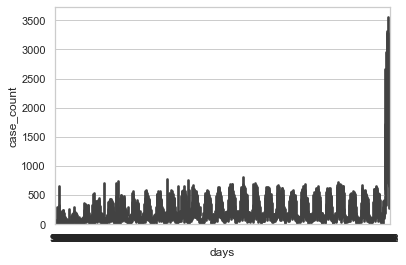

In [152]:
import seaborn as sns
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="days", y="case_count", data=train)

In [9]:
#Alternate code for gridsearch with stratkfold

Xd,yd=train.drop('case_count',axis=1),train.case_count
params = {'n_estimators': [600,1100,1500],
        'reg_lambda' : [4,9,13],
        'learning_rate' : [0.01,0.1,0.3],
        'depth' : [4,7,10],
        'bagging_temperature' : [1]
        }                        
from catboost import CatBoostClassifier,Pool, cv,CatBoostRegressor
from sklearn.model_selection import StratifiedKFold,train_test_split
from sklearn.model_selection import KFold
kf = KFold(n_splits=2, random_state=13, shuffle=True)
from sklearn.model_selection import GridSearchCV

categorical_features_indices = np.where(Xd.dtypes =='object')[0]
catb = CatBoostRegressor(cat_features=categorical_features_indices,random_seed=13,early_stopping_rounds=100)

skf = StratifiedKFold(n_splits=3, shuffle = True, random_state = 13)
print('start_gridsearch')
grid = GridSearchCV(estimator=catb, param_grid=params, cv=skf.split(Xd,yd),verbose=100)
print('start_fit')
grid.fit(Xd, yd)
#print('\n All results:')
#print(grid.cv_results_)
#print('\n Best estimator:')
#print(grid.best_estimator_)
#print('\n Best score:')
#print(grid.best_score_ * 2 - 1)
#print('\n Best parameters:')
#print(grid.best_params_)
results = pd.DataFrame(grid.cv_results_)
 
results.to_csv('C:/Users/np8022/Desktop/Analytics Vidhya competition/LnTFS/Outputs/Full_Tuning_output_Catreg_pivot_aggr_new_features_v3', index=False)
#y_test = grid.best_estimator_.predict_proba(test)
#results_df = pd.DataFrame(data={'id':test_df['id'], 'target':y_test[:,1]})
#results_df.to_csv('submission-grid-search-xgb-porto-01.csv', index=False)

start_gridsearch
start_fit


C:\Users\np8022\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=3.
  % (min_groups, self.n_splits)), Warning)


Fitting 3 folds for each of 81 candidates, totalling 243 fits
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[CV] bagging_temperature=1, depth=4, learning_rate=0.01, n_estimators=600, reg_lambda=4 
0:	learn: 9546.6670298	total: 62ms	remaining: 37.2s
1:	learn: 9475.8659040	total: 71.1ms	remaining: 21.3s
2:	learn: 9402.1565164	total: 75.2ms	remaining: 15s
3:	learn: 9332.7288022	total: 83.8ms	remaining: 12.5s
4:	learn: 9265.4763601	total: 88.9ms	remaining: 10.6s
5:	learn: 9196.1776996	total: 92.5ms	remaining: 9.16s
6:	learn: 9128.2282030	total: 93.5ms	remaining: 7.92s
7:	learn: 9058.9539651	total: 99.3ms	remaining: 7.35s
8:	learn: 8988.9734256	total: 104ms	remaining: 6.85s
9:	learn: 8920.3211948	total: 107ms	remaining: 6.32s
10:	learn: 8852.4943582	total: 110ms	remaining: 5.89s
11:	learn: 8789.7572012	total: 111ms	remaining: 5.43s
12:	learn: 8732.4944902	total: 114ms	remaining: 5.14s
13:	learn: 8669.1460832	total: 118ms	remaining: 4.96s
14:	learn: 8606.56

182:	learn: 4037.3795909	total: 638ms	remaining: 1.45s
183:	learn: 4028.7238554	total: 642ms	remaining: 1.45s
184:	learn: 4018.6326000	total: 649ms	remaining: 1.46s
185:	learn: 4012.3982877	total: 652ms	remaining: 1.45s
186:	learn: 4002.3566971	total: 657ms	remaining: 1.45s
187:	learn: 3992.3550614	total: 662ms	remaining: 1.45s
188:	learn: 3983.7534656	total: 664ms	remaining: 1.44s
189:	learn: 3974.1406290	total: 669ms	remaining: 1.44s
190:	learn: 3968.4501825	total: 674ms	remaining: 1.44s
191:	learn: 3958.8429795	total: 677ms	remaining: 1.44s
192:	learn: 3949.8257702	total: 680ms	remaining: 1.43s
193:	learn: 3941.8683422	total: 682ms	remaining: 1.43s
194:	learn: 3932.8236264	total: 687ms	remaining: 1.43s
195:	learn: 3927.0992522	total: 691ms	remaining: 1.43s
196:	learn: 3919.5631278	total: 696ms	remaining: 1.42s
197:	learn: 3914.9285985	total: 699ms	remaining: 1.42s
198:	learn: 3911.2233715	total: 702ms	remaining: 1.41s
199:	learn: 3905.8832170	total: 706ms	remaining: 1.41s
200:	learn

342:	learn: 3390.9649367	total: 1.32s	remaining: 991ms
343:	learn: 3387.4734298	total: 1.33s	remaining: 988ms
344:	learn: 3385.7974006	total: 1.33s	remaining: 983ms
345:	learn: 3382.5913561	total: 1.34s	remaining: 982ms
346:	learn: 3380.6755157	total: 1.34s	remaining: 981ms
347:	learn: 3377.6055375	total: 1.35s	remaining: 980ms
348:	learn: 3375.8560528	total: 1.35s	remaining: 974ms
349:	learn: 3373.0508468	total: 1.36s	remaining: 973ms
350:	learn: 3370.8972323	total: 1.36s	remaining: 968ms
351:	learn: 3369.0250898	total: 1.37s	remaining: 964ms
352:	learn: 3368.1277464	total: 1.37s	remaining: 961ms
353:	learn: 3368.0691966	total: 1.37s	remaining: 955ms
354:	learn: 3365.8293347	total: 1.38s	remaining: 952ms
355:	learn: 3364.2347323	total: 1.39s	remaining: 950ms
356:	learn: 3361.0331938	total: 1.39s	remaining: 946ms
357:	learn: 3359.4149432	total: 1.39s	remaining: 942ms
358:	learn: 3355.7265148	total: 1.4s	remaining: 940ms
359:	learn: 3354.5886879	total: 1.4s	remaining: 935ms
360:	learn: 

497:	learn: 3174.5807901	total: 2.01s	remaining: 411ms
498:	learn: 3173.8162666	total: 2.01s	remaining: 408ms
499:	learn: 3173.6058916	total: 2.01s	remaining: 403ms
500:	learn: 3172.8873661	total: 2.02s	remaining: 400ms
501:	learn: 3171.1376748	total: 2.03s	remaining: 396ms
502:	learn: 3170.5569023	total: 2.03s	remaining: 392ms
503:	learn: 3168.6244042	total: 2.04s	remaining: 389ms
504:	learn: 3168.0940198	total: 2.04s	remaining: 385ms
505:	learn: 3167.3170613	total: 2.05s	remaining: 381ms
506:	learn: 3166.3242486	total: 2.06s	remaining: 378ms
507:	learn: 3162.1105747	total: 2.06s	remaining: 373ms
508:	learn: 3160.2093695	total: 2.06s	remaining: 369ms
509:	learn: 3158.6668570	total: 2.07s	remaining: 365ms
510:	learn: 3157.4228613	total: 2.07s	remaining: 361ms
511:	learn: 3152.8625910	total: 2.07s	remaining: 356ms
512:	learn: 3152.1240657	total: 2.08s	remaining: 353ms
513:	learn: 3150.3811389	total: 2.09s	remaining: 349ms
514:	learn: 3149.3772960	total: 2.09s	remaining: 345ms
515:	learn

94:	learn: 5335.2983443	total: 309ms	remaining: 1.64s
95:	learn: 5307.0210014	total: 314ms	remaining: 1.65s
96:	learn: 5282.8808269	total: 315ms	remaining: 1.63s
97:	learn: 5254.7437399	total: 316ms	remaining: 1.62s
98:	learn: 5228.5666595	total: 319ms	remaining: 1.61s
99:	learn: 5200.9904085	total: 320ms	remaining: 1.6s
100:	learn: 5174.6560499	total: 323ms	remaining: 1.59s
101:	learn: 5148.0392068	total: 324ms	remaining: 1.58s
102:	learn: 5128.5679370	total: 327ms	remaining: 1.58s
103:	learn: 5107.6806533	total: 330ms	remaining: 1.57s
104:	learn: 5081.5975768	total: 332ms	remaining: 1.57s
105:	learn: 5056.0062077	total: 335ms	remaining: 1.56s
106:	learn: 5041.5230346	total: 340ms	remaining: 1.56s
107:	learn: 5017.6040978	total: 344ms	remaining: 1.57s
108:	learn: 4993.8133058	total: 349ms	remaining: 1.57s
109:	learn: 4972.3022409	total: 353ms	remaining: 1.57s
110:	learn: 4953.5293285	total: 356ms	remaining: 1.57s
111:	learn: 4928.3820812	total: 361ms	remaining: 1.57s
112:	learn: 4905.

275:	learn: 3275.6119693	total: 981ms	remaining: 1.15s
276:	learn: 3271.6107999	total: 988ms	remaining: 1.15s
277:	learn: 3268.0271791	total: 991ms	remaining: 1.15s
278:	learn: 3264.7961742	total: 992ms	remaining: 1.14s
279:	learn: 3261.2979008	total: 1s	remaining: 1.15s
280:	learn: 3257.9589607	total: 1s	remaining: 1.14s
281:	learn: 3253.9747493	total: 1.01s	remaining: 1.14s
282:	learn: 3249.8929646	total: 1.01s	remaining: 1.14s
283:	learn: 3246.5100073	total: 1.02s	remaining: 1.14s
284:	learn: 3243.1655986	total: 1.03s	remaining: 1.14s
285:	learn: 3239.8031478	total: 1.03s	remaining: 1.14s
286:	learn: 3236.4286640	total: 1.04s	remaining: 1.14s
287:	learn: 3233.5987502	total: 1.05s	remaining: 1.13s
288:	learn: 3229.3712934	total: 1.05s	remaining: 1.13s
289:	learn: 3227.3016253	total: 1.06s	remaining: 1.13s
290:	learn: 3221.2202041	total: 1.06s	remaining: 1.13s
291:	learn: 3218.0637204	total: 1.07s	remaining: 1.13s
292:	learn: 3215.4728410	total: 1.07s	remaining: 1.12s
293:	learn: 3212

430:	learn: 2927.4234537	total: 1.67s	remaining: 655ms
431:	learn: 2926.4851737	total: 1.68s	remaining: 653ms
432:	learn: 2925.3253472	total: 1.68s	remaining: 649ms
433:	learn: 2925.0585093	total: 1.68s	remaining: 644ms
434:	learn: 2923.3673463	total: 1.69s	remaining: 640ms
435:	learn: 2921.8253288	total: 1.69s	remaining: 636ms
436:	learn: 2920.4307455	total: 1.69s	remaining: 632ms
437:	learn: 2919.4959810	total: 1.7s	remaining: 628ms
438:	learn: 2918.9380981	total: 1.7s	remaining: 624ms
439:	learn: 2916.7882723	total: 1.71s	remaining: 621ms
440:	learn: 2914.7920768	total: 1.71s	remaining: 618ms
441:	learn: 2911.7785007	total: 1.72s	remaining: 615ms
442:	learn: 2910.5814106	total: 1.72s	remaining: 611ms
443:	learn: 2907.6681927	total: 1.73s	remaining: 607ms
444:	learn: 2905.5347166	total: 1.74s	remaining: 604ms
445:	learn: 2904.5953961	total: 1.74s	remaining: 600ms
446:	learn: 2903.7676344	total: 1.74s	remaining: 596ms
447:	learn: 2902.1680212	total: 1.74s	remaining: 592ms
448:	learn: 

584:	learn: 2737.3812469	total: 2.37s	remaining: 60.6ms
585:	learn: 2734.9514961	total: 2.37s	remaining: 56.7ms
586:	learn: 2734.1919291	total: 2.38s	remaining: 52.6ms
587:	learn: 2733.5776181	total: 2.38s	remaining: 48.6ms
588:	learn: 2733.1607138	total: 2.38s	remaining: 44.5ms
589:	learn: 2732.4583034	total: 2.39s	remaining: 40.5ms
590:	learn: 2731.8410038	total: 2.39s	remaining: 36.4ms
591:	learn: 2729.7809759	total: 2.4s	remaining: 32.4ms
592:	learn: 2728.2203866	total: 2.4s	remaining: 28.4ms
593:	learn: 2726.1858780	total: 2.41s	remaining: 24.3ms
594:	learn: 2725.7814947	total: 2.41s	remaining: 20.3ms
595:	learn: 2725.3819636	total: 2.42s	remaining: 16.2ms
596:	learn: 2724.4512270	total: 2.42s	remaining: 12.2ms
597:	learn: 2723.6964816	total: 2.42s	remaining: 8.1ms
598:	learn: 2723.6047190	total: 2.42s	remaining: 4.05ms
599:	learn: 2723.3973841	total: 2.43s	remaining: 0us
[CV]  bagging_temperature=1, depth=4, learning_rate=0.01, n_estimators=600, reg_lambda=4, score=0.895, total= 

156:	learn: 4283.7701000	total: 557ms	remaining: 1.57s
157:	learn: 4272.5304592	total: 564ms	remaining: 1.58s
158:	learn: 4260.6675444	total: 571ms	remaining: 1.58s
159:	learn: 4250.8069233	total: 577ms	remaining: 1.59s
160:	learn: 4237.3457796	total: 583ms	remaining: 1.59s
161:	learn: 4224.5315887	total: 589ms	remaining: 1.59s
162:	learn: 4213.6171630	total: 596ms	remaining: 1.6s
163:	learn: 4201.3073930	total: 606ms	remaining: 1.61s
164:	learn: 4188.9323766	total: 610ms	remaining: 1.61s
165:	learn: 4176.5452392	total: 617ms	remaining: 1.61s
166:	learn: 4164.5792140	total: 625ms	remaining: 1.62s
167:	learn: 4155.2298447	total: 633ms	remaining: 1.63s
168:	learn: 4144.2928372	total: 636ms	remaining: 1.62s
169:	learn: 4132.6219441	total: 645ms	remaining: 1.63s
170:	learn: 4122.5113014	total: 648ms	remaining: 1.63s
171:	learn: 4113.1094934	total: 649ms	remaining: 1.61s
172:	learn: 4102.1532574	total: 654ms	remaining: 1.61s
173:	learn: 4092.1458385	total: 657ms	remaining: 1.61s
174:	learn:

333:	learn: 3354.8840410	total: 1.4s	remaining: 1.11s
334:	learn: 3351.6937411	total: 1.41s	remaining: 1.11s
335:	learn: 3349.4458581	total: 1.41s	remaining: 1.11s
336:	learn: 3347.5833771	total: 1.42s	remaining: 1.1s
337:	learn: 3346.8015609	total: 1.42s	remaining: 1.1s
338:	learn: 3344.8005617	total: 1.43s	remaining: 1.1s
339:	learn: 3342.7668498	total: 1.44s	remaining: 1.1s
340:	learn: 3341.6216160	total: 1.44s	remaining: 1.1s
341:	learn: 3339.7908352	total: 1.45s	remaining: 1.09s
342:	learn: 3336.7288621	total: 1.46s	remaining: 1.09s
343:	learn: 3335.3042894	total: 1.46s	remaining: 1.09s
344:	learn: 3333.9428926	total: 1.47s	remaining: 1.08s
345:	learn: 3331.7945259	total: 1.47s	remaining: 1.08s
346:	learn: 3329.5758662	total: 1.48s	remaining: 1.08s
347:	learn: 3328.0790063	total: 1.48s	remaining: 1.07s
348:	learn: 3326.1656817	total: 1.49s	remaining: 1.07s
349:	learn: 3325.5716746	total: 1.49s	remaining: 1.07s
350:	learn: 3324.7737520	total: 1.5s	remaining: 1.06s
351:	learn: 3321.

497:	learn: 3104.8385780	total: 2.24s	remaining: 459ms
498:	learn: 3104.1597547	total: 2.25s	remaining: 455ms
499:	learn: 3102.8532916	total: 2.25s	remaining: 450ms
500:	learn: 3101.8140426	total: 2.26s	remaining: 446ms
501:	learn: 3100.9956668	total: 2.26s	remaining: 442ms
502:	learn: 3100.2329996	total: 2.27s	remaining: 437ms
503:	learn: 3097.9935928	total: 2.27s	remaining: 432ms
504:	learn: 3096.1781929	total: 2.28s	remaining: 428ms
505:	learn: 3094.7426682	total: 2.28s	remaining: 423ms
506:	learn: 3094.0660758	total: 2.28s	remaining: 419ms
507:	learn: 3092.3346324	total: 2.28s	remaining: 413ms
508:	learn: 3090.3661670	total: 2.29s	remaining: 409ms
509:	learn: 3089.8613032	total: 2.29s	remaining: 405ms
510:	learn: 3088.4502941	total: 2.3s	remaining: 401ms
511:	learn: 3087.4961007	total: 2.31s	remaining: 397ms
512:	learn: 3086.9208683	total: 2.31s	remaining: 392ms
513:	learn: 3085.8964908	total: 2.32s	remaining: 388ms
514:	learn: 3084.0581494	total: 2.33s	remaining: 384ms
515:	learn:

49:	learn: 6892.6752893	total: 200ms	remaining: 2.21s
50:	learn: 6860.0778060	total: 209ms	remaining: 2.25s
51:	learn: 6818.4180672	total: 210ms	remaining: 2.21s
52:	learn: 6775.7490482	total: 214ms	remaining: 2.21s
53:	learn: 6736.9104363	total: 219ms	remaining: 2.21s
54:	learn: 6704.0231729	total: 222ms	remaining: 2.2s
55:	learn: 6671.2836717	total: 228ms	remaining: 2.22s
56:	learn: 6639.2567551	total: 232ms	remaining: 2.21s
57:	learn: 6597.6772847	total: 235ms	remaining: 2.2s
58:	learn: 6557.0127163	total: 236ms	remaining: 2.17s
59:	learn: 6516.3369683	total: 237ms	remaining: 2.13s
60:	learn: 6484.3564125	total: 240ms	remaining: 2.12s
61:	learn: 6449.7363127	total: 246ms	remaining: 2.13s
62:	learn: 6415.8563523	total: 250ms	remaining: 2.13s
63:	learn: 6377.3776656	total: 250ms	remaining: 2.1s
64:	learn: 6342.5261719	total: 256ms	remaining: 2.1s
65:	learn: 6306.7289231	total: 259ms	remaining: 2.09s
66:	learn: 6269.5908231	total: 260ms	remaining: 2.07s
67:	learn: 6232.7678819	total: 2

228:	learn: 3799.9827840	total: 858ms	remaining: 1.39s
229:	learn: 3796.1696053	total: 865ms	remaining: 1.39s
230:	learn: 3789.0459984	total: 874ms	remaining: 1.4s
231:	learn: 3784.1039692	total: 881ms	remaining: 1.4s
232:	learn: 3777.2506161	total: 889ms	remaining: 1.4s
233:	learn: 3773.2111816	total: 893ms	remaining: 1.4s
234:	learn: 3767.9477332	total: 896ms	remaining: 1.39s
235:	learn: 3763.7441386	total: 900ms	remaining: 1.39s
236:	learn: 3760.0721950	total: 906ms	remaining: 1.39s
237:	learn: 3753.4496018	total: 914ms	remaining: 1.39s
238:	learn: 3746.6536828	total: 921ms	remaining: 1.39s
239:	learn: 3742.3905244	total: 925ms	remaining: 1.39s
240:	learn: 3736.0365887	total: 933ms	remaining: 1.39s
241:	learn: 3729.7001726	total: 936ms	remaining: 1.38s
242:	learn: 3724.6854734	total: 944ms	remaining: 1.39s
243:	learn: 3722.7690364	total: 949ms	remaining: 1.39s
244:	learn: 3718.4067485	total: 955ms	remaining: 1.38s
245:	learn: 3714.3677677	total: 958ms	remaining: 1.38s
246:	learn: 37

388:	learn: 3356.2115859	total: 1.69s	remaining: 917ms
389:	learn: 3355.4132928	total: 1.69s	remaining: 912ms
390:	learn: 3354.5620819	total: 1.7s	remaining: 909ms
391:	learn: 3353.8653962	total: 1.7s	remaining: 902ms
392:	learn: 3352.8382632	total: 1.7s	remaining: 898ms
393:	learn: 3350.8022282	total: 1.71s	remaining: 896ms
394:	learn: 3349.5701209	total: 1.72s	remaining: 891ms
395:	learn: 3347.6212994	total: 1.72s	remaining: 887ms
396:	learn: 3346.0616251	total: 1.72s	remaining: 882ms
397:	learn: 3344.9953043	total: 1.73s	remaining: 878ms
398:	learn: 3342.9745888	total: 1.74s	remaining: 875ms
399:	learn: 3340.8838484	total: 1.75s	remaining: 873ms
400:	learn: 3337.8147525	total: 1.75s	remaining: 870ms
401:	learn: 3336.1605809	total: 1.76s	remaining: 866ms
402:	learn: 3334.0206432	total: 1.77s	remaining: 863ms
403:	learn: 3332.3783810	total: 1.77s	remaining: 859ms
404:	learn: 3331.3846468	total: 1.77s	remaining: 853ms
405:	learn: 3329.8948360	total: 1.78s	remaining: 849ms
406:	learn: 3

567:	learn: 3138.5585246	total: 2.54s	remaining: 143ms
568:	learn: 3137.9457731	total: 2.54s	remaining: 138ms
569:	learn: 3137.3969258	total: 2.54s	remaining: 134ms
570:	learn: 3137.1277980	total: 2.55s	remaining: 129ms
571:	learn: 3136.4622733	total: 2.55s	remaining: 125ms
572:	learn: 3136.4023445	total: 2.56s	remaining: 120ms
573:	learn: 3135.4524308	total: 2.56s	remaining: 116ms
574:	learn: 3134.5357502	total: 2.57s	remaining: 112ms
575:	learn: 3133.9152778	total: 2.57s	remaining: 107ms
576:	learn: 3131.4745049	total: 2.58s	remaining: 103ms
577:	learn: 3131.0042315	total: 2.58s	remaining: 98.3ms
578:	learn: 3130.2089655	total: 2.59s	remaining: 93.9ms
579:	learn: 3130.0300794	total: 2.59s	remaining: 89.4ms
580:	learn: 3129.6728613	total: 2.6s	remaining: 84.9ms
581:	learn: 3129.2236399	total: 2.6s	remaining: 80.4ms
582:	learn: 3127.0401672	total: 2.6s	remaining: 75.9ms
583:	learn: 3125.9828671	total: 2.61s	remaining: 71.5ms
584:	learn: 3125.4006969	total: 2.62s	remaining: 67.1ms
585:	

123:	learn: 4774.1870458	total: 463ms	remaining: 1.78s
124:	learn: 4753.0990431	total: 464ms	remaining: 1.76s
125:	learn: 4733.8253913	total: 465ms	remaining: 1.75s
126:	learn: 4712.4941779	total: 469ms	remaining: 1.75s
127:	learn: 4698.7256050	total: 477ms	remaining: 1.76s
128:	learn: 4678.5430009	total: 484ms	remaining: 1.77s
129:	learn: 4658.9160248	total: 488ms	remaining: 1.76s
130:	learn: 4638.5347761	total: 492ms	remaining: 1.76s
131:	learn: 4618.4669054	total: 493ms	remaining: 1.75s
132:	learn: 4599.2430575	total: 496ms	remaining: 1.74s
133:	learn: 4579.3093692	total: 500ms	remaining: 1.74s
134:	learn: 4561.1996032	total: 503ms	remaining: 1.73s
135:	learn: 4543.0690004	total: 506ms	remaining: 1.73s
136:	learn: 4525.8116154	total: 511ms	remaining: 1.73s
137:	learn: 4512.1253811	total: 515ms	remaining: 1.72s
138:	learn: 4493.4815725	total: 520ms	remaining: 1.72s
139:	learn: 4479.9908951	total: 523ms	remaining: 1.72s
140:	learn: 4461.9893133	total: 528ms	remaining: 1.72s
141:	learn

279:	learn: 3356.3413831	total: 1.14s	remaining: 1.31s
280:	learn: 3354.6692924	total: 1.15s	remaining: 1.31s
281:	learn: 3351.1506098	total: 1.16s	remaining: 1.3s
282:	learn: 3349.4260386	total: 1.16s	remaining: 1.3s
283:	learn: 3344.5017346	total: 1.16s	remaining: 1.29s
284:	learn: 3341.7010056	total: 1.17s	remaining: 1.29s
285:	learn: 3338.5715963	total: 1.17s	remaining: 1.28s
286:	learn: 3333.7053666	total: 1.17s	remaining: 1.28s
287:	learn: 3330.3454228	total: 1.18s	remaining: 1.27s
288:	learn: 3326.4470095	total: 1.18s	remaining: 1.27s
289:	learn: 3322.3494661	total: 1.18s	remaining: 1.27s
290:	learn: 3318.8770047	total: 1.2s	remaining: 1.27s
291:	learn: 3315.6584905	total: 1.21s	remaining: 1.27s
292:	learn: 3313.2157356	total: 1.21s	remaining: 1.27s
293:	learn: 3309.6033871	total: 1.22s	remaining: 1.27s
294:	learn: 3306.8583862	total: 1.23s	remaining: 1.27s
295:	learn: 3301.8760370	total: 1.24s	remaining: 1.27s
296:	learn: 3299.8103808	total: 1.24s	remaining: 1.27s
297:	learn: 3

446:	learn: 2975.9492263	total: 1.99s	remaining: 681ms
447:	learn: 2974.6096874	total: 1.99s	remaining: 677ms
448:	learn: 2973.0317515	total: 2s	remaining: 672ms
449:	learn: 2972.1845190	total: 2.01s	remaining: 669ms
450:	learn: 2971.6915826	total: 2.01s	remaining: 665ms
451:	learn: 2969.8797654	total: 2.02s	remaining: 661ms
452:	learn: 2967.2161912	total: 2.02s	remaining: 657ms
453:	learn: 2966.2102950	total: 2.03s	remaining: 653ms
454:	learn: 2965.1474043	total: 2.04s	remaining: 649ms
455:	learn: 2964.1823285	total: 2.04s	remaining: 645ms
456:	learn: 2961.5478799	total: 2.05s	remaining: 641ms
457:	learn: 2960.4160417	total: 2.05s	remaining: 635ms
458:	learn: 2958.2865588	total: 2.06s	remaining: 631ms
459:	learn: 2956.9805878	total: 2.06s	remaining: 626ms
460:	learn: 2956.1713783	total: 2.06s	remaining: 622ms
461:	learn: 2954.5889230	total: 2.07s	remaining: 619ms
462:	learn: 2953.7650746	total: 2.08s	remaining: 615ms
463:	learn: 2952.9267358	total: 2.08s	remaining: 609ms
464:	learn: 2

20:	learn: 8315.4131190	total: 95.3ms	remaining: 2.63s
21:	learn: 8265.7073674	total: 98.6ms	remaining: 2.59s
22:	learn: 8215.4141852	total: 102ms	remaining: 2.55s
23:	learn: 8164.7152152	total: 107ms	remaining: 2.58s
24:	learn: 8116.8562899	total: 113ms	remaining: 2.59s
25:	learn: 8066.9225014	total: 116ms	remaining: 2.55s
26:	learn: 8015.4770898	total: 116ms	remaining: 2.47s
27:	learn: 7958.9282230	total: 119ms	remaining: 2.44s
28:	learn: 7909.0861709	total: 122ms	remaining: 2.4s
29:	learn: 7863.3921596	total: 127ms	remaining: 2.42s
30:	learn: 7818.3125712	total: 132ms	remaining: 2.42s
31:	learn: 7764.3965769	total: 135ms	remaining: 2.39s
32:	learn: 7711.3413651	total: 138ms	remaining: 2.36s
33:	learn: 7672.2215479	total: 140ms	remaining: 2.34s
34:	learn: 7625.6381493	total: 143ms	remaining: 2.31s
35:	learn: 7576.1026455	total: 148ms	remaining: 2.31s
36:	learn: 7527.6967959	total: 153ms	remaining: 2.32s
37:	learn: 7480.8353712	total: 155ms	remaining: 2.3s
38:	learn: 7435.7640708	tota

176:	learn: 4148.2757827	total: 604ms	remaining: 1.44s
177:	learn: 4141.4163001	total: 609ms	remaining: 1.44s
178:	learn: 4132.8142317	total: 614ms	remaining: 1.44s
179:	learn: 4123.3423344	total: 620ms	remaining: 1.45s
180:	learn: 4112.6781521	total: 624ms	remaining: 1.45s
181:	learn: 4101.7431281	total: 627ms	remaining: 1.44s
182:	learn: 4097.3082856	total: 630ms	remaining: 1.44s
183:	learn: 4089.1005183	total: 633ms	remaining: 1.43s
184:	learn: 4082.1943423	total: 637ms	remaining: 1.43s
185:	learn: 4072.9414547	total: 642ms	remaining: 1.43s
186:	learn: 4066.8432934	total: 645ms	remaining: 1.42s
187:	learn: 4058.0236293	total: 646ms	remaining: 1.42s
188:	learn: 4048.4961732	total: 652ms	remaining: 1.42s
189:	learn: 4038.8569871	total: 657ms	remaining: 1.42s
190:	learn: 4029.3757445	total: 662ms	remaining: 1.42s
191:	learn: 4023.2691528	total: 666ms	remaining: 1.42s
192:	learn: 4014.0403412	total: 671ms	remaining: 1.42s
193:	learn: 4005.5903033	total: 676ms	remaining: 1.41s
194:	learn

339:	learn: 3438.4789553	total: 1.29s	remaining: 985ms
340:	learn: 3436.2022490	total: 1.29s	remaining: 982ms
341:	learn: 3433.8332021	total: 1.3s	remaining: 981ms
342:	learn: 3430.3945088	total: 1.31s	remaining: 979ms
343:	learn: 3425.1027473	total: 1.31s	remaining: 976ms
344:	learn: 3423.6511712	total: 1.32s	remaining: 973ms
345:	learn: 3420.1477470	total: 1.32s	remaining: 970ms
346:	learn: 3418.1172793	total: 1.33s	remaining: 968ms
347:	learn: 3416.2697364	total: 1.33s	remaining: 965ms
348:	learn: 3413.2936475	total: 1.34s	remaining: 963ms
349:	learn: 3410.6069693	total: 1.34s	remaining: 961ms
350:	learn: 3407.6195263	total: 1.35s	remaining: 959ms
351:	learn: 3406.2785679	total: 1.36s	remaining: 957ms
352:	learn: 3404.6526266	total: 1.36s	remaining: 954ms
353:	learn: 3401.2321631	total: 1.37s	remaining: 950ms
354:	learn: 3400.5662165	total: 1.37s	remaining: 946ms
355:	learn: 3398.8394368	total: 1.37s	remaining: 942ms
356:	learn: 3396.9121500	total: 1.38s	remaining: 939ms
357:	learn:

493:	learn: 3157.4486110	total: 1.98s	remaining: 426ms
494:	learn: 3157.0371439	total: 1.99s	remaining: 421ms
495:	learn: 3156.4257480	total: 1.99s	remaining: 417ms
496:	learn: 3155.4617498	total: 2s	remaining: 414ms
497:	learn: 3154.4194499	total: 2s	remaining: 410ms
498:	learn: 3153.8188478	total: 2s	remaining: 405ms
499:	learn: 3153.5408485	total: 2.01s	remaining: 402ms
500:	learn: 3151.0952387	total: 2.01s	remaining: 398ms
501:	learn: 3150.0698007	total: 2.02s	remaining: 393ms
502:	learn: 3148.6579446	total: 2.02s	remaining: 390ms
503:	learn: 3145.8844002	total: 2.02s	remaining: 385ms
504:	learn: 3144.6030373	total: 2.02s	remaining: 381ms
505:	learn: 3142.6437509	total: 2.03s	remaining: 377ms
506:	learn: 3140.4108439	total: 2.03s	remaining: 373ms
507:	learn: 3137.6111191	total: 2.04s	remaining: 369ms
508:	learn: 3136.5972617	total: 2.04s	remaining: 366ms
509:	learn: 3135.9855717	total: 2.05s	remaining: 362ms
510:	learn: 3134.1587133	total: 2.05s	remaining: 357ms
511:	learn: 3132.37

83:	learn: 5770.4700244	total: 280ms	remaining: 1.72s
84:	learn: 5741.9390070	total: 281ms	remaining: 1.7s
85:	learn: 5720.5714392	total: 286ms	remaining: 1.71s
86:	learn: 5696.5289406	total: 290ms	remaining: 1.71s
87:	learn: 5668.4103532	total: 293ms	remaining: 1.7s
88:	learn: 5641.3483441	total: 296ms	remaining: 1.7s
89:	learn: 5615.4350099	total: 301ms	remaining: 1.71s
90:	learn: 5587.4854679	total: 302ms	remaining: 1.69s
91:	learn: 5559.8442703	total: 306ms	remaining: 1.69s
92:	learn: 5532.5403606	total: 309ms	remaining: 1.69s
93:	learn: 5505.6086983	total: 312ms	remaining: 1.68s
94:	learn: 5478.4645668	total: 313ms	remaining: 1.66s
95:	learn: 5454.9239645	total: 314ms	remaining: 1.65s
96:	learn: 5428.0802019	total: 315ms	remaining: 1.63s
97:	learn: 5404.1842307	total: 320ms	remaining: 1.64s
98:	learn: 5383.2081641	total: 325ms	remaining: 1.64s
99:	learn: 5358.5617460	total: 326ms	remaining: 1.63s
100:	learn: 5334.2585913	total: 329ms	remaining: 1.62s
101:	learn: 5307.9939163	total

256:	learn: 3689.3474060	total: 951ms	remaining: 1.27s
257:	learn: 3684.8097594	total: 952ms	remaining: 1.26s
258:	learn: 3683.1163782	total: 957ms	remaining: 1.26s
259:	learn: 3677.9014696	total: 963ms	remaining: 1.26s
260:	learn: 3673.9029269	total: 966ms	remaining: 1.25s
261:	learn: 3671.1539463	total: 972ms	remaining: 1.25s
262:	learn: 3669.3954205	total: 978ms	remaining: 1.25s
263:	learn: 3667.6696400	total: 981ms	remaining: 1.25s
264:	learn: 3664.5341795	total: 982ms	remaining: 1.24s
265:	learn: 3659.5434303	total: 988ms	remaining: 1.24s
266:	learn: 3655.5392571	total: 995ms	remaining: 1.24s
267:	learn: 3652.8179568	total: 1s	remaining: 1.24s
268:	learn: 3650.6033330	total: 1s	remaining: 1.24s
269:	learn: 3646.0472732	total: 1.01s	remaining: 1.24s
270:	learn: 3643.6750526	total: 1.01s	remaining: 1.23s
271:	learn: 3641.3157303	total: 1.02s	remaining: 1.23s
272:	learn: 3639.3705991	total: 1.02s	remaining: 1.23s
273:	learn: 3635.3888527	total: 1.02s	remaining: 1.22s
274:	learn: 3633

413:	learn: 3329.1368918	total: 1.64s	remaining: 736ms
414:	learn: 3326.7021337	total: 1.64s	remaining: 733ms
415:	learn: 3325.5245715	total: 1.65s	remaining: 730ms
416:	learn: 3324.6733730	total: 1.66s	remaining: 727ms
417:	learn: 3323.5540458	total: 1.66s	remaining: 723ms
418:	learn: 3321.8075895	total: 1.67s	remaining: 721ms
419:	learn: 3320.8078963	total: 1.67s	remaining: 716ms
420:	learn: 3319.7238307	total: 1.68s	remaining: 713ms
421:	learn: 3319.0977504	total: 1.68s	remaining: 708ms
422:	learn: 3317.4582229	total: 1.68s	remaining: 704ms
423:	learn: 3315.8248232	total: 1.69s	remaining: 700ms
424:	learn: 3315.0775386	total: 1.69s	remaining: 695ms
425:	learn: 3312.8373243	total: 1.69s	remaining: 692ms
426:	learn: 3311.2611746	total: 1.7s	remaining: 689ms
427:	learn: 3310.4711276	total: 1.7s	remaining: 685ms
428:	learn: 3309.8540068	total: 1.71s	remaining: 681ms
429:	learn: 3308.8161388	total: 1.71s	remaining: 677ms
430:	learn: 3307.8700129	total: 1.72s	remaining: 674ms
431:	learn: 

580:	learn: 3143.7848823	total: 2.32s	remaining: 75.9ms
581:	learn: 3142.8235789	total: 2.33s	remaining: 71.9ms
582:	learn: 3142.0495884	total: 2.33s	remaining: 68ms
583:	learn: 3141.3816523	total: 2.33s	remaining: 64ms
584:	learn: 3140.8930393	total: 2.34s	remaining: 60ms
585:	learn: 3139.9851378	total: 2.34s	remaining: 56ms
586:	learn: 3139.8421110	total: 2.35s	remaining: 51.9ms
587:	learn: 3139.0559135	total: 2.35s	remaining: 48ms
588:	learn: 3137.4706189	total: 2.35s	remaining: 44ms
589:	learn: 3137.0646640	total: 2.36s	remaining: 40ms
590:	learn: 3135.9093408	total: 2.36s	remaining: 35.9ms
591:	learn: 3134.8749859	total: 2.36s	remaining: 31.9ms
592:	learn: 3134.2618246	total: 2.36s	remaining: 27.9ms
593:	learn: 3132.4612707	total: 2.37s	remaining: 23.9ms
594:	learn: 3131.5948009	total: 2.37s	remaining: 19.9ms
595:	learn: 3130.1789918	total: 2.37s	remaining: 15.9ms
596:	learn: 3129.3607140	total: 2.37s	remaining: 11.9ms
597:	learn: 3129.0551192	total: 2.38s	remaining: 7.96ms
598:	l

128:	learn: 4753.2009029	total: 394ms	remaining: 1.44s
129:	learn: 4733.2285460	total: 397ms	remaining: 1.44s
130:	learn: 4712.6499220	total: 400ms	remaining: 1.43s
131:	learn: 4692.2795554	total: 404ms	remaining: 1.43s
132:	learn: 4672.8254765	total: 407ms	remaining: 1.43s
133:	learn: 4652.5182116	total: 410ms	remaining: 1.42s
134:	learn: 4634.1549269	total: 413ms	remaining: 1.42s
135:	learn: 4615.6871737	total: 415ms	remaining: 1.42s
136:	learn: 4598.1846034	total: 420ms	remaining: 1.42s
137:	learn: 4584.3197856	total: 423ms	remaining: 1.42s
138:	learn: 4565.4120106	total: 428ms	remaining: 1.42s
139:	learn: 4551.6423343	total: 430ms	remaining: 1.41s
140:	learn: 4533.3946381	total: 435ms	remaining: 1.42s
141:	learn: 4514.9089413	total: 436ms	remaining: 1.41s
142:	learn: 4496.6714862	total: 437ms	remaining: 1.4s
143:	learn: 4480.9170937	total: 442ms	remaining: 1.4s
144:	learn: 4463.4468941	total: 444ms	remaining: 1.39s
145:	learn: 4446.4429755	total: 449ms	remaining: 1.4s
146:	learn: 4

300:	learn: 3318.3102767	total: 1.08s	remaining: 1.07s
301:	learn: 3315.0136250	total: 1.08s	remaining: 1.07s
302:	learn: 3313.4448282	total: 1.09s	remaining: 1.06s
303:	learn: 3309.0157765	total: 1.09s	remaining: 1.06s
304:	learn: 3305.6186455	total: 1.1s	remaining: 1.06s
305:	learn: 3302.4881197	total: 1.1s	remaining: 1.06s
306:	learn: 3301.0842326	total: 1.1s	remaining: 1.05s
307:	learn: 3298.0377438	total: 1.11s	remaining: 1.05s
308:	learn: 3293.5284634	total: 1.11s	remaining: 1.05s
309:	learn: 3292.0191810	total: 1.12s	remaining: 1.05s
310:	learn: 3289.1554457	total: 1.12s	remaining: 1.04s
311:	learn: 3286.6364492	total: 1.13s	remaining: 1.04s
312:	learn: 3282.5857682	total: 1.14s	remaining: 1.04s
313:	learn: 3279.5643687	total: 1.14s	remaining: 1.04s
314:	learn: 3276.4360741	total: 1.14s	remaining: 1.03s
315:	learn: 3273.9944630	total: 1.15s	remaining: 1.03s
316:	learn: 3270.0696178	total: 1.15s	remaining: 1.03s
317:	learn: 3266.6344401	total: 1.15s	remaining: 1.02s
318:	learn: 3

450:	learn: 2994.9145523	total: 1.77s	remaining: 586ms
451:	learn: 2993.5891109	total: 1.78s	remaining: 583ms
452:	learn: 2992.4597787	total: 1.79s	remaining: 580ms
453:	learn: 2991.9203057	total: 1.79s	remaining: 576ms
454:	learn: 2990.5444110	total: 1.8s	remaining: 572ms
455:	learn: 2988.8132496	total: 1.8s	remaining: 569ms
456:	learn: 2986.5223111	total: 1.81s	remaining: 566ms
457:	learn: 2984.7853970	total: 1.81s	remaining: 562ms
458:	learn: 2983.2353096	total: 1.81s	remaining: 557ms
459:	learn: 2982.1785026	total: 1.82s	remaining: 554ms
460:	learn: 2981.3249365	total: 1.82s	remaining: 550ms
461:	learn: 2980.0961774	total: 1.83s	remaining: 546ms
462:	learn: 2977.7058260	total: 1.83s	remaining: 542ms
463:	learn: 2976.3401314	total: 1.84s	remaining: 538ms
464:	learn: 2974.4155220	total: 1.84s	remaining: 535ms
465:	learn: 2972.4321974	total: 1.85s	remaining: 532ms
466:	learn: 2971.3590971	total: 1.85s	remaining: 528ms
467:	learn: 2970.5205005	total: 1.86s	remaining: 524ms
468:	learn: 

599:	learn: 2819.6168768	total: 2.46s	remaining: 0us
[CV]  bagging_temperature=1, depth=4, learning_rate=0.01, n_estimators=600, reg_lambda=13, score=0.890, total=   2.7s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:   23.0s remaining:    0.0s
[CV] bagging_temperature=1, depth=4, learning_rate=0.01, n_estimators=600, reg_lambda=13 
0:	learn: 9528.6701709	total: 9.16ms	remaining: 5.49s
1:	learn: 9466.0328345	total: 17.3ms	remaining: 5.18s
2:	learn: 9397.1059003	total: 22.3ms	remaining: 4.43s
3:	learn: 9329.7177056	total: 30.5ms	remaining: 4.54s
4:	learn: 9269.3736370	total: 33.3ms	remaining: 3.96s
5:	learn: 9206.2341318	total: 38ms	remaining: 3.76s
6:	learn: 9153.5543155	total: 42.7ms	remaining: 3.61s
7:	learn: 9090.8031298	total: 47.2ms	remaining: 3.49s
8:	learn: 9038.6756042	total: 51.8ms	remaining: 3.4s
9:	learn: 8973.6589061	total: 54.7ms	remaining: 3.23s
10:	learn: 8912.8186913	total: 57.4ms	remaining: 3.07s
11:	learn: 8849.7475718	total: 60.2ms	remaining: 2.95s
12:	learn: 8

175:	learn: 4216.7912081	total: 628ms	remaining: 1.51s
176:	learn: 4205.7336946	total: 633ms	remaining: 1.51s
177:	learn: 4196.0918894	total: 640ms	remaining: 1.52s
178:	learn: 4187.3502520	total: 645ms	remaining: 1.52s
179:	learn: 4177.7935124	total: 651ms	remaining: 1.52s
180:	learn: 4166.8804250	total: 656ms	remaining: 1.52s
181:	learn: 4155.6794652	total: 660ms	remaining: 1.51s
182:	learn: 4150.9925687	total: 662ms	remaining: 1.51s
183:	learn: 4142.7177633	total: 666ms	remaining: 1.5s
184:	learn: 4135.5748101	total: 671ms	remaining: 1.5s
185:	learn: 4126.0954645	total: 676ms	remaining: 1.5s
186:	learn: 4119.8644695	total: 679ms	remaining: 1.5s
187:	learn: 4112.6948417	total: 684ms	remaining: 1.5s
188:	learn: 4103.3224728	total: 690ms	remaining: 1.5s
189:	learn: 4093.4152068	total: 695ms	remaining: 1.5s
190:	learn: 4083.6375084	total: 701ms	remaining: 1.5s
191:	learn: 4074.2389242	total: 704ms	remaining: 1.5s
192:	learn: 4064.8038896	total: 711ms	remaining: 1.5s
193:	learn: 4056.080

345:	learn: 3459.1220166	total: 1.48s	remaining: 1.09s
346:	learn: 3457.6792523	total: 1.49s	remaining: 1.09s
347:	learn: 3456.3726543	total: 1.49s	remaining: 1.08s
348:	learn: 3453.7208960	total: 1.5s	remaining: 1.08s
349:	learn: 3451.4311029	total: 1.51s	remaining: 1.08s
350:	learn: 3449.2313146	total: 1.51s	remaining: 1.07s
351:	learn: 3445.3773802	total: 1.52s	remaining: 1.07s
352:	learn: 3442.0616040	total: 1.52s	remaining: 1.06s
353:	learn: 3439.4721368	total: 1.52s	remaining: 1.06s
354:	learn: 3437.3286735	total: 1.53s	remaining: 1.05s
355:	learn: 3432.3327548	total: 1.53s	remaining: 1.05s
356:	learn: 3428.0292453	total: 1.53s	remaining: 1.04s
357:	learn: 3426.2380600	total: 1.54s	remaining: 1.04s
358:	learn: 3424.4700379	total: 1.55s	remaining: 1.04s
359:	learn: 3423.3649752	total: 1.55s	remaining: 1.03s
360:	learn: 3422.0839513	total: 1.56s	remaining: 1.03s
361:	learn: 3419.0279570	total: 1.56s	remaining: 1.03s
362:	learn: 3416.3718040	total: 1.56s	remaining: 1.02s
363:	learn:

502:	learn: 3178.1060647	total: 2.17s	remaining: 419ms
503:	learn: 3176.2047847	total: 2.17s	remaining: 414ms
504:	learn: 3176.0515082	total: 2.18s	remaining: 409ms
505:	learn: 3174.5843237	total: 2.18s	remaining: 406ms
506:	learn: 3173.4226566	total: 2.19s	remaining: 401ms
507:	learn: 3173.2171497	total: 2.19s	remaining: 396ms
508:	learn: 3171.1092681	total: 2.19s	remaining: 391ms
509:	learn: 3168.5256547	total: 2.19s	remaining: 387ms
510:	learn: 3167.4526393	total: 2.2s	remaining: 383ms
511:	learn: 3167.0776278	total: 2.2s	remaining: 379ms
512:	learn: 3165.1971786	total: 2.21s	remaining: 374ms
513:	learn: 3164.8635035	total: 2.21s	remaining: 370ms
514:	learn: 3163.2792636	total: 2.22s	remaining: 366ms
515:	learn: 3161.0793035	total: 2.22s	remaining: 362ms
516:	learn: 3159.8591056	total: 2.23s	remaining: 358ms
517:	learn: 3157.7937498	total: 2.23s	remaining: 354ms
518:	learn: 3155.9088824	total: 2.24s	remaining: 350ms
519:	learn: 3155.3286453	total: 2.24s	remaining: 345ms
520:	learn: 

66:	learn: 6196.3189268	total: 221ms	remaining: 3.4s
67:	learn: 6158.8178058	total: 222ms	remaining: 3.37s
68:	learn: 6125.5491353	total: 225ms	remaining: 3.36s
69:	learn: 6099.1941085	total: 228ms	remaining: 3.36s
70:	learn: 6064.1358470	total: 231ms	remaining: 3.35s
71:	learn: 6027.2624914	total: 235ms	remaining: 3.35s
72:	learn: 5993.0767893	total: 235ms	remaining: 3.31s
73:	learn: 5958.6435707	total: 238ms	remaining: 3.31s
74:	learn: 5924.1138252	total: 239ms	remaining: 3.27s
75:	learn: 5889.1220969	total: 242ms	remaining: 3.27s
76:	learn: 5856.7241109	total: 248ms	remaining: 3.29s
77:	learn: 5826.5328443	total: 250ms	remaining: 3.28s
78:	learn: 5793.0454053	total: 255ms	remaining: 3.3s
79:	learn: 5760.1177287	total: 258ms	remaining: 3.29s
80:	learn: 5728.3705272	total: 259ms	remaining: 3.25s
81:	learn: 5697.5587096	total: 262ms	remaining: 3.25s
82:	learn: 5666.3358571	total: 265ms	remaining: 3.24s
83:	learn: 5641.6859630	total: 269ms	remaining: 3.26s
84:	learn: 5618.8340155	total:

219:	learn: 3777.9893935	total: 732ms	remaining: 2.93s
220:	learn: 3770.9319768	total: 735ms	remaining: 2.92s
221:	learn: 3765.2511318	total: 740ms	remaining: 2.93s
222:	learn: 3760.9533399	total: 747ms	remaining: 2.94s
223:	learn: 3757.3579385	total: 750ms	remaining: 2.93s
224:	learn: 3753.5330081	total: 751ms	remaining: 2.92s
225:	learn: 3747.6585897	total: 756ms	remaining: 2.92s
226:	learn: 3743.7100199	total: 763ms	remaining: 2.93s
227:	learn: 3737.1152315	total: 769ms	remaining: 2.94s
228:	learn: 3732.0439131	total: 774ms	remaining: 2.94s
229:	learn: 3729.0286756	total: 778ms	remaining: 2.94s
230:	learn: 3726.3601592	total: 781ms	remaining: 2.94s
231:	learn: 3720.0192441	total: 788ms	remaining: 2.95s
232:	learn: 3714.7370309	total: 792ms	remaining: 2.95s
233:	learn: 3710.9190787	total: 797ms	remaining: 2.95s
234:	learn: 3704.9791856	total: 798ms	remaining: 2.94s
235:	learn: 3700.4671158	total: 801ms	remaining: 2.93s
236:	learn: 3696.2034799	total: 803ms	remaining: 2.92s
237:	learn

387:	learn: 3314.3717512	total: 1.42s	remaining: 2.6s
388:	learn: 3312.9773481	total: 1.42s	remaining: 2.6s
389:	learn: 3310.9760945	total: 1.43s	remaining: 2.6s
390:	learn: 3310.3813616	total: 1.43s	remaining: 2.6s
391:	learn: 3309.2705512	total: 1.44s	remaining: 2.59s
392:	learn: 3307.5568108	total: 1.44s	remaining: 2.59s
393:	learn: 3306.4575774	total: 1.44s	remaining: 2.58s
394:	learn: 3305.0667825	total: 1.45s	remaining: 2.58s
395:	learn: 3304.0787054	total: 1.45s	remaining: 2.57s
396:	learn: 3302.2617097	total: 1.45s	remaining: 2.57s
397:	learn: 3300.4034711	total: 1.46s	remaining: 2.57s
398:	learn: 3299.6617625	total: 1.46s	remaining: 2.57s
399:	learn: 3297.2479860	total: 1.47s	remaining: 2.57s
400:	learn: 3295.1433282	total: 1.47s	remaining: 2.57s
401:	learn: 3294.1406701	total: 1.48s	remaining: 2.56s
402:	learn: 3292.5228234	total: 1.48s	remaining: 2.56s
403:	learn: 3290.5950035	total: 1.48s	remaining: 2.56s
404:	learn: 3288.2952152	total: 1.49s	remaining: 2.56s
405:	learn: 32

554:	learn: 3111.7705366	total: 2.1s	remaining: 2.07s
555:	learn: 3110.9415830	total: 2.11s	remaining: 2.06s
556:	learn: 3108.9371959	total: 2.12s	remaining: 2.06s
557:	learn: 3108.1528512	total: 2.12s	remaining: 2.06s
558:	learn: 3107.1725978	total: 2.13s	remaining: 2.06s
559:	learn: 3107.1665957	total: 2.13s	remaining: 2.05s
560:	learn: 3107.0576770	total: 2.13s	remaining: 2.05s
561:	learn: 3106.6048563	total: 2.14s	remaining: 2.05s
562:	learn: 3105.1012784	total: 2.14s	remaining: 2.04s
563:	learn: 3104.3117759	total: 2.15s	remaining: 2.04s
564:	learn: 3103.9122376	total: 2.15s	remaining: 2.03s
565:	learn: 3103.4748125	total: 2.15s	remaining: 2.03s
566:	learn: 3102.3148859	total: 2.15s	remaining: 2.02s
567:	learn: 3099.0752870	total: 2.16s	remaining: 2.02s
568:	learn: 3098.0310546	total: 2.16s	remaining: 2.02s
569:	learn: 3097.3618177	total: 2.17s	remaining: 2.01s
570:	learn: 3093.3263182	total: 2.17s	remaining: 2.01s
571:	learn: 3092.7704364	total: 2.17s	remaining: 2.01s
572:	learn:

716:	learn: 2935.6508383	total: 2.79s	remaining: 1.49s
717:	learn: 2935.0919930	total: 2.79s	remaining: 1.49s
718:	learn: 2934.5156754	total: 2.8s	remaining: 1.48s
719:	learn: 2934.1374571	total: 2.81s	remaining: 1.48s
720:	learn: 2934.0386497	total: 2.81s	remaining: 1.48s
721:	learn: 2932.9234970	total: 2.81s	remaining: 1.47s
722:	learn: 2932.4913154	total: 2.82s	remaining: 1.47s
723:	learn: 2932.2436628	total: 2.82s	remaining: 1.47s
724:	learn: 2931.6397642	total: 2.83s	remaining: 1.46s
725:	learn: 2931.2906432	total: 2.83s	remaining: 1.46s
726:	learn: 2930.7829258	total: 2.83s	remaining: 1.45s
727:	learn: 2929.3596020	total: 2.84s	remaining: 1.45s
728:	learn: 2928.0450953	total: 2.85s	remaining: 1.45s
729:	learn: 2927.6420678	total: 2.85s	remaining: 1.45s
730:	learn: 2927.6382770	total: 2.85s	remaining: 1.44s
731:	learn: 2926.7748153	total: 2.86s	remaining: 1.44s
732:	learn: 2925.8810479	total: 2.86s	remaining: 1.43s
733:	learn: 2923.5005577	total: 2.87s	remaining: 1.43s
734:	learn:

906:	learn: 2793.7543831	total: 3.47s	remaining: 739ms
907:	learn: 2793.3227480	total: 3.48s	remaining: 735ms
908:	learn: 2791.8810943	total: 3.48s	remaining: 732ms
909:	learn: 2791.7077664	total: 3.49s	remaining: 728ms
910:	learn: 2791.4813919	total: 3.49s	remaining: 723ms
911:	learn: 2790.4490216	total: 3.49s	remaining: 719ms
912:	learn: 2789.3610606	total: 3.49s	remaining: 716ms
913:	learn: 2789.1667439	total: 3.5s	remaining: 712ms
914:	learn: 2788.8651648	total: 3.5s	remaining: 708ms
915:	learn: 2787.7381189	total: 3.51s	remaining: 705ms
916:	learn: 2786.7827699	total: 3.51s	remaining: 701ms
917:	learn: 2786.2905994	total: 3.51s	remaining: 696ms
918:	learn: 2785.4837734	total: 3.52s	remaining: 692ms
919:	learn: 2785.0328855	total: 3.52s	remaining: 688ms
920:	learn: 2784.7145793	total: 3.52s	remaining: 684ms
921:	learn: 2784.5518206	total: 3.52s	remaining: 680ms
922:	learn: 2784.0998719	total: 3.52s	remaining: 676ms
923:	learn: 2783.1984407	total: 3.53s	remaining: 672ms
924:	learn: 

1077:	learn: 2688.0458265	total: 3.97s	remaining: 81ms
1078:	learn: 2686.0957182	total: 3.97s	remaining: 77.3ms
1079:	learn: 2685.5593417	total: 3.97s	remaining: 73.5ms
1080:	learn: 2685.4618416	total: 3.97s	remaining: 69.8ms
1081:	learn: 2684.8124333	total: 3.97s	remaining: 66.1ms
1082:	learn: 2683.0491574	total: 3.98s	remaining: 62.4ms
1083:	learn: 2683.0104371	total: 3.98s	remaining: 58.7ms
1084:	learn: 2682.2595196	total: 3.98s	remaining: 55ms
1085:	learn: 2681.9796439	total: 3.98s	remaining: 51.3ms
1086:	learn: 2681.4584782	total: 3.98s	remaining: 47.6ms
1087:	learn: 2679.5836362	total: 3.98s	remaining: 43.9ms
1088:	learn: 2678.7790325	total: 3.99s	remaining: 40.3ms
1089:	learn: 2678.6954703	total: 3.99s	remaining: 36.6ms
1090:	learn: 2678.2463617	total: 4s	remaining: 33ms
1091:	learn: 2676.4167518	total: 4s	remaining: 29.3ms
1092:	learn: 2675.5787993	total: 4s	remaining: 25.6ms
1093:	learn: 2675.3663686	total: 4s	remaining: 21.9ms
1094:	learn: 2675.1954699	total: 4s	remaining: 18

169:	learn: 3975.8955445	total: 569ms	remaining: 3.11s
170:	learn: 3964.1017619	total: 574ms	remaining: 3.12s
171:	learn: 3956.3038730	total: 579ms	remaining: 3.12s
172:	learn: 3945.7266616	total: 580ms	remaining: 3.11s
173:	learn: 3938.0119537	total: 584ms	remaining: 3.1s
174:	learn: 3927.6919899	total: 587ms	remaining: 3.1s
175:	learn: 3918.8985744	total: 589ms	remaining: 3.09s
176:	learn: 3908.0142034	total: 594ms	remaining: 3.1s
177:	learn: 3899.8927094	total: 597ms	remaining: 3.09s
178:	learn: 3889.3436572	total: 602ms	remaining: 3.1s
179:	learn: 3882.1998641	total: 607ms	remaining: 3.1s
180:	learn: 3870.7395965	total: 612ms	remaining: 3.1s
181:	learn: 3860.1016565	total: 615ms	remaining: 3.1s
182:	learn: 3850.6794708	total: 620ms	remaining: 3.1s
183:	learn: 3842.2169830	total: 622ms	remaining: 3.1s
184:	learn: 3832.6284714	total: 626ms	remaining: 3.1s
185:	learn: 3825.5087509	total: 629ms	remaining: 3.09s
186:	learn: 3817.6166005	total: 634ms	remaining: 3.1s
187:	learn: 3808.0126

328:	learn: 3116.5504387	total: 1.26s	remaining: 2.95s
329:	learn: 3112.9072417	total: 1.26s	remaining: 2.95s
330:	learn: 3108.7179784	total: 1.27s	remaining: 2.96s
331:	learn: 3105.9253296	total: 1.27s	remaining: 2.95s
332:	learn: 3104.8484192	total: 1.28s	remaining: 2.95s
333:	learn: 3104.3783390	total: 1.28s	remaining: 2.94s
334:	learn: 3100.4762609	total: 1.29s	remaining: 2.95s
335:	learn: 3096.9096608	total: 1.29s	remaining: 2.94s
336:	learn: 3093.7305517	total: 1.3s	remaining: 2.94s
337:	learn: 3091.8008956	total: 1.3s	remaining: 2.93s
338:	learn: 3088.7229770	total: 1.31s	remaining: 2.93s
339:	learn: 3087.0328140	total: 1.31s	remaining: 2.94s
340:	learn: 3084.7735936	total: 1.32s	remaining: 2.94s
341:	learn: 3082.9771082	total: 1.33s	remaining: 2.95s
342:	learn: 3080.9927777	total: 1.33s	remaining: 2.94s
343:	learn: 3079.1978421	total: 1.34s	remaining: 2.95s
344:	learn: 3076.9229615	total: 1.34s	remaining: 2.94s
345:	learn: 3074.3170376	total: 1.35s	remaining: 2.94s
346:	learn: 

498:	learn: 2836.1442319	total: 2.13s	remaining: 2.57s
499:	learn: 2834.2141086	total: 2.13s	remaining: 2.56s
500:	learn: 2832.5988614	total: 2.13s	remaining: 2.55s
501:	learn: 2831.6487345	total: 2.14s	remaining: 2.55s
502:	learn: 2830.6790576	total: 2.14s	remaining: 2.54s
503:	learn: 2830.0248852	total: 2.15s	remaining: 2.54s
504:	learn: 2828.4484791	total: 2.15s	remaining: 2.54s
505:	learn: 2827.9849651	total: 2.16s	remaining: 2.54s
506:	learn: 2826.3001574	total: 2.17s	remaining: 2.53s
507:	learn: 2824.0775676	total: 2.17s	remaining: 2.53s
508:	learn: 2822.7581427	total: 2.18s	remaining: 2.53s
509:	learn: 2822.1312611	total: 2.18s	remaining: 2.52s
510:	learn: 2820.4574987	total: 2.18s	remaining: 2.52s
511:	learn: 2819.2889689	total: 2.19s	remaining: 2.52s
512:	learn: 2817.9650514	total: 2.2s	remaining: 2.52s
513:	learn: 2816.4663092	total: 2.2s	remaining: 2.51s
514:	learn: 2815.7056815	total: 2.21s	remaining: 2.51s
515:	learn: 2814.5505802	total: 2.21s	remaining: 2.51s
516:	learn: 

654:	learn: 2669.2405971	total: 3s	remaining: 2.04s
655:	learn: 2668.2341554	total: 3.01s	remaining: 2.04s
656:	learn: 2667.9722939	total: 3.01s	remaining: 2.03s
657:	learn: 2666.6591645	total: 3.02s	remaining: 2.02s
658:	learn: 2666.1305844	total: 3.02s	remaining: 2.02s
659:	learn: 2664.0172097	total: 3.03s	remaining: 2.02s
660:	learn: 2662.7954817	total: 3.03s	remaining: 2.01s
661:	learn: 2662.5088970	total: 3.04s	remaining: 2.01s
662:	learn: 2660.5066558	total: 3.04s	remaining: 2s
663:	learn: 2660.0196787	total: 3.04s	remaining: 2s
664:	learn: 2658.2556870	total: 3.05s	remaining: 1.99s
665:	learn: 2656.1669470	total: 3.05s	remaining: 1.99s
666:	learn: 2654.3398611	total: 3.06s	remaining: 1.99s
667:	learn: 2654.0303011	total: 3.07s	remaining: 1.98s
668:	learn: 2653.3552407	total: 3.07s	remaining: 1.98s
669:	learn: 2652.8417483	total: 3.07s	remaining: 1.97s
670:	learn: 2651.2595607	total: 3.08s	remaining: 1.97s
671:	learn: 2650.7873706	total: 3.09s	remaining: 1.97s
672:	learn: 2649.45

808:	learn: 2540.0083585	total: 3.86s	remaining: 1.39s
809:	learn: 2539.2089173	total: 3.87s	remaining: 1.39s
810:	learn: 2538.8821785	total: 3.88s	remaining: 1.38s
811:	learn: 2537.4677591	total: 3.88s	remaining: 1.38s
812:	learn: 2537.1665685	total: 3.88s	remaining: 1.37s
813:	learn: 2536.8105464	total: 3.89s	remaining: 1.37s
814:	learn: 2536.6937465	total: 3.89s	remaining: 1.36s
815:	learn: 2536.4063999	total: 3.9s	remaining: 1.36s
816:	learn: 2535.1200437	total: 3.9s	remaining: 1.35s
817:	learn: 2534.8926838	total: 3.91s	remaining: 1.35s
818:	learn: 2534.4986634	total: 3.91s	remaining: 1.34s
819:	learn: 2534.0344643	total: 3.92s	remaining: 1.34s
820:	learn: 2533.3997568	total: 3.92s	remaining: 1.33s
821:	learn: 2532.8636698	total: 3.92s	remaining: 1.33s
822:	learn: 2531.9480718	total: 3.93s	remaining: 1.32s
823:	learn: 2530.8156709	total: 3.94s	remaining: 1.32s
824:	learn: 2530.3235279	total: 3.95s	remaining: 1.31s
825:	learn: 2529.3529635	total: 3.95s	remaining: 1.31s
826:	learn: 

962:	learn: 2438.1767516	total: 4.54s	remaining: 645ms
963:	learn: 2437.7422107	total: 4.54s	remaining: 640ms
964:	learn: 2437.4357020	total: 4.54s	remaining: 636ms
965:	learn: 2437.1015211	total: 4.55s	remaining: 631ms
966:	learn: 2436.6213550	total: 4.55s	remaining: 625ms
967:	learn: 2435.7488665	total: 4.55s	remaining: 620ms
968:	learn: 2435.3451597	total: 4.55s	remaining: 616ms
969:	learn: 2434.9117864	total: 4.56s	remaining: 611ms
970:	learn: 2434.8610437	total: 4.56s	remaining: 606ms
971:	learn: 2434.6095618	total: 4.57s	remaining: 601ms
972:	learn: 2433.9487815	total: 4.57s	remaining: 596ms
973:	learn: 2433.7224746	total: 4.57s	remaining: 591ms
974:	learn: 2433.0348306	total: 4.58s	remaining: 587ms
975:	learn: 2432.5061929	total: 4.58s	remaining: 582ms
976:	learn: 2431.7823221	total: 4.59s	remaining: 577ms
977:	learn: 2430.5441443	total: 4.59s	remaining: 572ms
978:	learn: 2430.2690030	total: 4.59s	remaining: 567ms
979:	learn: 2429.9422652	total: 4.59s	remaining: 562ms
980:	learn

42:	learn: 7183.7871228	total: 189ms	remaining: 4.65s
43:	learn: 7138.6752625	total: 193ms	remaining: 4.62s
44:	learn: 7092.6700729	total: 196ms	remaining: 4.58s
45:	learn: 7044.5485897	total: 199ms	remaining: 4.56s
46:	learn: 7004.9896177	total: 200ms	remaining: 4.48s
47:	learn: 6965.7604563	total: 201ms	remaining: 4.4s
48:	learn: 6919.1923476	total: 207ms	remaining: 4.44s
49:	learn: 6875.4087652	total: 210ms	remaining: 4.42s
50:	learn: 6831.6897647	total: 213ms	remaining: 4.39s
51:	learn: 6796.1949914	total: 214ms	remaining: 4.32s
52:	learn: 6763.6451280	total: 219ms	remaining: 4.33s
53:	learn: 6719.1990477	total: 223ms	remaining: 4.31s
54:	learn: 6677.1458041	total: 226ms	remaining: 4.29s
55:	learn: 6636.1900626	total: 227ms	remaining: 4.23s
56:	learn: 6600.6466681	total: 232ms	remaining: 4.24s
57:	learn: 6563.4145917	total: 235ms	remaining: 4.23s
58:	learn: 6520.8333859	total: 239ms	remaining: 4.21s
59:	learn: 6488.9460291	total: 242ms	remaining: 4.19s
60:	learn: 6451.6256748	total

194:	learn: 3924.7619917	total: 699ms	remaining: 3.24s
195:	learn: 3918.3816584	total: 700ms	remaining: 3.23s
196:	learn: 3910.2314628	total: 701ms	remaining: 3.21s
197:	learn: 3902.5936694	total: 705ms	remaining: 3.21s
198:	learn: 3894.3778685	total: 712ms	remaining: 3.22s
199:	learn: 3887.0935911	total: 717ms	remaining: 3.23s
200:	learn: 3879.4468977	total: 718ms	remaining: 3.21s
201:	learn: 3874.7140433	total: 721ms	remaining: 3.2s
202:	learn: 3867.0776925	total: 721ms	remaining: 3.19s
203:	learn: 3861.2537880	total: 722ms	remaining: 3.17s
204:	learn: 3856.0462821	total: 725ms	remaining: 3.17s
205:	learn: 3848.6847892	total: 728ms	remaining: 3.16s
206:	learn: 3840.7235735	total: 729ms	remaining: 3.14s
207:	learn: 3834.4872172	total: 730ms	remaining: 3.13s
208:	learn: 3829.4468338	total: 731ms	remaining: 3.12s
209:	learn: 3823.9146438	total: 734ms	remaining: 3.11s
210:	learn: 3816.3523651	total: 737ms	remaining: 3.1s
211:	learn: 3809.4144353	total: 739ms	remaining: 3.1s
212:	learn: 3

347:	learn: 3328.0790063	total: 1.38s	remaining: 2.98s
348:	learn: 3326.1656817	total: 1.39s	remaining: 2.98s
349:	learn: 3325.5716746	total: 1.39s	remaining: 2.98s
350:	learn: 3324.7737520	total: 1.39s	remaining: 2.97s
351:	learn: 3321.9517535	total: 1.4s	remaining: 2.98s
352:	learn: 3320.2959119	total: 1.41s	remaining: 2.97s
353:	learn: 3316.7847640	total: 1.41s	remaining: 2.97s
354:	learn: 3315.2359917	total: 1.42s	remaining: 2.97s
355:	learn: 3312.5220338	total: 1.42s	remaining: 2.97s
356:	learn: 3310.6170076	total: 1.43s	remaining: 2.97s
357:	learn: 3309.4846630	total: 1.43s	remaining: 2.97s
358:	learn: 3305.7353590	total: 1.44s	remaining: 2.97s
359:	learn: 3304.9873632	total: 1.44s	remaining: 2.97s
360:	learn: 3303.6126428	total: 1.45s	remaining: 2.97s
361:	learn: 3301.8188438	total: 1.46s	remaining: 2.97s
362:	learn: 3300.0789671	total: 1.46s	remaining: 2.97s
363:	learn: 3297.8774864	total: 1.47s	remaining: 2.97s
364:	learn: 3297.1723394	total: 1.48s	remaining: 2.98s
365:	learn:

513:	learn: 3085.8964908	total: 2.24s	remaining: 2.55s
514:	learn: 3084.0581494	total: 2.24s	remaining: 2.55s
515:	learn: 3083.4990899	total: 2.25s	remaining: 2.54s
516:	learn: 3083.3235138	total: 2.25s	remaining: 2.53s
517:	learn: 3082.0112462	total: 2.25s	remaining: 2.53s
518:	learn: 3079.8787065	total: 2.26s	remaining: 2.53s
519:	learn: 3079.3493723	total: 2.26s	remaining: 2.53s
520:	learn: 3076.8785439	total: 2.27s	remaining: 2.52s
521:	learn: 3076.2304597	total: 2.28s	remaining: 2.52s
522:	learn: 3074.7417927	total: 2.28s	remaining: 2.52s
523:	learn: 3071.5035391	total: 2.29s	remaining: 2.51s
524:	learn: 3069.4734415	total: 2.29s	remaining: 2.51s
525:	learn: 3067.2958530	total: 2.3s	remaining: 2.51s
526:	learn: 3066.4322822	total: 2.3s	remaining: 2.5s
527:	learn: 3065.1315159	total: 2.31s	remaining: 2.5s
528:	learn: 3063.5271992	total: 2.31s	remaining: 2.5s
529:	learn: 3063.0440849	total: 2.32s	remaining: 2.49s
530:	learn: 3061.3390612	total: 2.33s	remaining: 2.49s
531:	learn: 306

670:	learn: 2920.5900514	total: 3.09s	remaining: 1.98s
671:	learn: 2919.0536315	total: 3.1s	remaining: 1.97s
672:	learn: 2917.3469835	total: 3.1s	remaining: 1.97s
673:	learn: 2917.2784529	total: 3.1s	remaining: 1.96s
674:	learn: 2916.5828092	total: 3.11s	remaining: 1.96s
675:	learn: 2915.7483193	total: 3.12s	remaining: 1.96s
676:	learn: 2914.6004653	total: 3.13s	remaining: 1.95s
677:	learn: 2913.7592992	total: 3.13s	remaining: 1.95s
678:	learn: 2912.2508939	total: 3.13s	remaining: 1.94s
679:	learn: 2911.0263206	total: 3.14s	remaining: 1.94s
680:	learn: 2910.1944318	total: 3.15s	remaining: 1.94s
681:	learn: 2909.9434407	total: 3.15s	remaining: 1.93s
682:	learn: 2908.2683745	total: 3.16s	remaining: 1.93s
683:	learn: 2906.6291854	total: 3.16s	remaining: 1.92s
684:	learn: 2905.6256875	total: 3.16s	remaining: 1.92s
685:	learn: 2905.2919751	total: 3.17s	remaining: 1.91s
686:	learn: 2903.3701213	total: 3.17s	remaining: 1.91s
687:	learn: 2902.9594920	total: 3.18s	remaining: 1.9s
688:	learn: 29

847:	learn: 2767.5844056	total: 3.76s	remaining: 1.12s
848:	learn: 2766.7233684	total: 3.77s	remaining: 1.11s
849:	learn: 2766.0048428	total: 3.77s	remaining: 1.11s
850:	learn: 2764.3895489	total: 3.77s	remaining: 1.1s
851:	learn: 2764.2067750	total: 3.78s	remaining: 1.1s
852:	learn: 2763.4766639	total: 3.78s	remaining: 1.09s
853:	learn: 2763.1889799	total: 3.78s	remaining: 1.09s
854:	learn: 2762.3342545	total: 3.79s	remaining: 1.09s
855:	learn: 2761.2480658	total: 3.8s	remaining: 1.08s
856:	learn: 2760.8420908	total: 3.8s	remaining: 1.08s
857:	learn: 2759.3609347	total: 3.81s	remaining: 1.07s
858:	learn: 2758.6714174	total: 3.81s	remaining: 1.07s
859:	learn: 2757.2091695	total: 3.82s	remaining: 1.07s
860:	learn: 2756.8423084	total: 3.83s	remaining: 1.06s
861:	learn: 2756.4738862	total: 3.83s	remaining: 1.06s
862:	learn: 2755.7466326	total: 3.83s	remaining: 1.05s
863:	learn: 2754.8081567	total: 3.84s	remaining: 1.05s
864:	learn: 2754.6095479	total: 3.84s	remaining: 1.04s
865:	learn: 27

1002:	learn: 2676.5655581	total: 4.27s	remaining: 413ms
1003:	learn: 2676.4516409	total: 4.27s	remaining: 408ms
1004:	learn: 2675.8816373	total: 4.27s	remaining: 403ms
1005:	learn: 2675.6669940	total: 4.27s	remaining: 399ms
1006:	learn: 2675.5665880	total: 4.27s	remaining: 395ms
1007:	learn: 2675.0318331	total: 4.28s	remaining: 390ms
1008:	learn: 2673.9984071	total: 4.28s	remaining: 386ms
1009:	learn: 2673.4118358	total: 4.28s	remaining: 382ms
1010:	learn: 2672.3677939	total: 4.28s	remaining: 377ms
1011:	learn: 2672.2777106	total: 4.28s	remaining: 373ms
1012:	learn: 2671.8078240	total: 4.29s	remaining: 368ms
1013:	learn: 2671.6300357	total: 4.29s	remaining: 364ms
1014:	learn: 2671.5412457	total: 4.29s	remaining: 359ms
1015:	learn: 2671.1979653	total: 4.29s	remaining: 355ms
1016:	learn: 2671.0719336	total: 4.29s	remaining: 351ms
1017:	learn: 2670.1393137	total: 4.3s	remaining: 346ms
1018:	learn: 2669.1147631	total: 4.3s	remaining: 342ms
1019:	learn: 2668.6043305	total: 4.3s	remaining: 3

63:	learn: 6377.3776656	total: 221ms	remaining: 3.58s
64:	learn: 6342.5261719	total: 227ms	remaining: 3.62s
65:	learn: 6306.7289231	total: 230ms	remaining: 3.61s
66:	learn: 6269.5908231	total: 231ms	remaining: 3.56s
67:	learn: 6232.7678819	total: 232ms	remaining: 3.52s
68:	learn: 6199.7091904	total: 235ms	remaining: 3.52s
69:	learn: 6173.9709506	total: 239ms	remaining: 3.51s
70:	learn: 6139.4889359	total: 242ms	remaining: 3.51s
71:	learn: 6103.1532313	total: 245ms	remaining: 3.5s
72:	learn: 6069.4488092	total: 246ms	remaining: 3.46s
73:	learn: 6035.3299996	total: 251ms	remaining: 3.48s
74:	learn: 6001.3140734	total: 252ms	remaining: 3.44s
75:	learn: 5966.5133375	total: 255ms	remaining: 3.44s
76:	learn: 5935.4413348	total: 258ms	remaining: 3.43s
77:	learn: 5905.5314863	total: 261ms	remaining: 3.42s
78:	learn: 5872.3976824	total: 266ms	remaining: 3.44s
79:	learn: 5839.8515385	total: 269ms	remaining: 3.43s
80:	learn: 5808.4759913	total: 270ms	remaining: 3.4s
81:	learn: 5784.4256194	total:

218:	learn: 3856.0147553	total: 731ms	remaining: 2.94s
219:	learn: 3851.6972609	total: 734ms	remaining: 2.94s
220:	learn: 3845.6433675	total: 737ms	remaining: 2.93s
221:	learn: 3840.8335916	total: 744ms	remaining: 2.94s
222:	learn: 3833.7994618	total: 749ms	remaining: 2.95s
223:	learn: 3829.5292061	total: 750ms	remaining: 2.93s
224:	learn: 3824.2979914	total: 751ms	remaining: 2.92s
225:	learn: 3819.3795810	total: 756ms	remaining: 2.92s
226:	learn: 3812.0915982	total: 763ms	remaining: 2.93s
227:	learn: 3807.2048302	total: 769ms	remaining: 2.94s
228:	learn: 3799.9827840	total: 776ms	remaining: 2.95s
229:	learn: 3796.1696053	total: 781ms	remaining: 2.95s
230:	learn: 3789.0459984	total: 787ms	remaining: 2.96s
231:	learn: 3784.1039692	total: 792ms	remaining: 2.96s
232:	learn: 3777.2506161	total: 799ms	remaining: 2.97s
233:	learn: 3773.2111816	total: 802ms	remaining: 2.97s
234:	learn: 3767.9477332	total: 804ms	remaining: 2.96s
235:	learn: 3763.7441386	total: 807ms	remaining: 2.96s
236:	learn

375:	learn: 3381.7761490	total: 1.42s	remaining: 2.73s
376:	learn: 3380.5741568	total: 1.42s	remaining: 2.72s
377:	learn: 3378.4387512	total: 1.42s	remaining: 2.71s
378:	learn: 3375.4081042	total: 1.43s	remaining: 2.71s
379:	learn: 3373.6295765	total: 1.43s	remaining: 2.71s
380:	learn: 3371.4018221	total: 1.43s	remaining: 2.7s
381:	learn: 3369.5096339	total: 1.44s	remaining: 2.7s
382:	learn: 3366.9947794	total: 1.44s	remaining: 2.71s
383:	learn: 3366.0743571	total: 1.45s	remaining: 2.7s
384:	learn: 3364.5931164	total: 1.45s	remaining: 2.69s
385:	learn: 3361.0702492	total: 1.46s	remaining: 2.69s
386:	learn: 3358.7459857	total: 1.46s	remaining: 2.69s
387:	learn: 3357.3304819	total: 1.47s	remaining: 2.69s
388:	learn: 3356.2115859	total: 1.47s	remaining: 2.69s
389:	learn: 3355.4132928	total: 1.47s	remaining: 2.68s
390:	learn: 3354.5620819	total: 1.48s	remaining: 2.68s
391:	learn: 3353.8653962	total: 1.48s	remaining: 2.67s
392:	learn: 3352.8382632	total: 1.48s	remaining: 2.67s
393:	learn: 3

534:	learn: 3170.1260026	total: 2.1s	remaining: 2.22s
535:	learn: 3169.7079857	total: 2.1s	remaining: 2.21s
536:	learn: 3168.5455041	total: 2.11s	remaining: 2.21s
537:	learn: 3168.2649710	total: 2.12s	remaining: 2.21s
538:	learn: 3166.5906957	total: 2.12s	remaining: 2.21s
539:	learn: 3165.8259930	total: 2.13s	remaining: 2.21s
540:	learn: 3165.3799877	total: 2.13s	remaining: 2.2s
541:	learn: 3164.8721458	total: 2.13s	remaining: 2.19s
542:	learn: 3164.5296505	total: 2.13s	remaining: 2.19s
543:	learn: 3164.4207585	total: 2.13s	remaining: 2.18s
544:	learn: 3162.7550942	total: 2.13s	remaining: 2.17s
545:	learn: 3161.9061851	total: 2.14s	remaining: 2.17s
546:	learn: 3161.3144282	total: 2.14s	remaining: 2.17s
547:	learn: 3160.5404222	total: 2.15s	remaining: 2.16s
548:	learn: 3158.9356317	total: 2.15s	remaining: 2.16s
549:	learn: 3158.6590947	total: 2.16s	remaining: 2.16s
550:	learn: 3158.1747094	total: 2.16s	remaining: 2.15s
551:	learn: 3157.0008686	total: 2.17s	remaining: 2.15s
552:	learn: 3

705:	learn: 3008.6562469	total: 2.79s	remaining: 1.56s
706:	learn: 3006.9817814	total: 2.79s	remaining: 1.55s
707:	learn: 3006.4480220	total: 2.79s	remaining: 1.55s
708:	learn: 3005.7315599	total: 2.8s	remaining: 1.54s
709:	learn: 3005.7108988	total: 2.81s	remaining: 1.54s
710:	learn: 3005.4436399	total: 2.81s	remaining: 1.54s
711:	learn: 3003.2118396	total: 2.81s	remaining: 1.53s
712:	learn: 3002.5890014	total: 2.81s	remaining: 1.53s
713:	learn: 3001.7121944	total: 2.82s	remaining: 1.52s
714:	learn: 2999.6093477	total: 2.83s	remaining: 1.52s
715:	learn: 2998.4751631	total: 2.83s	remaining: 1.52s
716:	learn: 2997.3211408	total: 2.84s	remaining: 1.51s
717:	learn: 2996.6586464	total: 2.84s	remaining: 1.51s
718:	learn: 2996.6272834	total: 2.84s	remaining: 1.5s
719:	learn: 2993.4522758	total: 2.84s	remaining: 1.5s
720:	learn: 2993.1716958	total: 2.85s	remaining: 1.5s
721:	learn: 2992.9058737	total: 2.85s	remaining: 1.49s
722:	learn: 2992.3695341	total: 2.85s	remaining: 1.49s
723:	learn: 29

890:	learn: 2848.6618318	total: 3.46s	remaining: 813ms
891:	learn: 2848.0891367	total: 3.46s	remaining: 808ms
892:	learn: 2847.2350897	total: 3.47s	remaining: 804ms
893:	learn: 2847.2120563	total: 3.47s	remaining: 799ms
894:	learn: 2846.7774918	total: 3.47s	remaining: 795ms
895:	learn: 2845.8732395	total: 3.48s	remaining: 792ms
896:	learn: 2845.1302030	total: 3.48s	remaining: 788ms
897:	learn: 2844.4624097	total: 3.49s	remaining: 784ms
898:	learn: 2843.7608547	total: 3.49s	remaining: 781ms
899:	learn: 2843.4805176	total: 3.5s	remaining: 777ms
900:	learn: 2843.0718193	total: 3.5s	remaining: 773ms
901:	learn: 2842.7000940	total: 3.5s	remaining: 768ms
902:	learn: 2842.2449605	total: 3.5s	remaining: 765ms
903:	learn: 2841.2705941	total: 3.51s	remaining: 761ms
904:	learn: 2841.1559210	total: 3.52s	remaining: 758ms
905:	learn: 2840.0901245	total: 3.52s	remaining: 754ms
906:	learn: 2839.1131320	total: 3.52s	remaining: 749ms
907:	learn: 2838.5670496	total: 3.52s	remaining: 745ms
908:	learn: 28

1063:	learn: 2745.4551401	total: 3.95s	remaining: 134ms
1064:	learn: 2743.7976306	total: 3.96s	remaining: 130ms
1065:	learn: 2743.1493435	total: 3.96s	remaining: 126ms
1066:	learn: 2743.0300852	total: 3.96s	remaining: 123ms
1067:	learn: 2742.7752425	total: 3.96s	remaining: 119ms
1068:	learn: 2742.4425482	total: 3.97s	remaining: 115ms
1069:	learn: 2740.7072914	total: 3.97s	remaining: 111ms
1070:	learn: 2740.3837597	total: 3.98s	remaining: 108ms
1071:	learn: 2740.3698414	total: 3.98s	remaining: 104ms
1072:	learn: 2740.1692816	total: 3.98s	remaining: 100ms
1073:	learn: 2739.4064086	total: 3.98s	remaining: 96.4ms
1074:	learn: 2739.0886752	total: 3.98s	remaining: 92.6ms
1075:	learn: 2738.6329153	total: 3.98s	remaining: 88.9ms
1076:	learn: 2738.4365642	total: 3.98s	remaining: 85.1ms
1077:	learn: 2737.6848962	total: 3.99s	remaining: 81.3ms
1078:	learn: 2737.3687813	total: 3.99s	remaining: 77.7ms
1079:	learn: 2736.5784531	total: 4s	remaining: 74ms
1080:	learn: 2736.5134949	total: 4s	remaining:

150:	learn: 4302.6732793	total: 529ms	remaining: 3.32s
151:	learn: 4290.6862477	total: 534ms	remaining: 3.33s
152:	learn: 4277.0230211	total: 537ms	remaining: 3.32s
153:	learn: 4262.5561712	total: 543ms	remaining: 3.33s
154:	learn: 4246.9883824	total: 548ms	remaining: 3.34s
155:	learn: 4232.1077618	total: 554ms	remaining: 3.35s
156:	learn: 4217.0688152	total: 559ms	remaining: 3.35s
157:	learn: 4202.6735189	total: 564ms	remaining: 3.36s
158:	learn: 4188.6661156	total: 565ms	remaining: 3.34s
159:	learn: 4174.6284655	total: 566ms	remaining: 3.33s
160:	learn: 4164.6167719	total: 569ms	remaining: 3.32s
161:	learn: 4150.7862362	total: 574ms	remaining: 3.32s
162:	learn: 4137.0900430	total: 579ms	remaining: 3.33s
163:	learn: 4125.5968849	total: 584ms	remaining: 3.33s
164:	learn: 4112.6626797	total: 587ms	remaining: 3.33s
165:	learn: 4100.7858014	total: 592ms	remaining: 3.33s
166:	learn: 4092.3622692	total: 593ms	remaining: 3.31s
167:	learn: 4080.5747119	total: 598ms	remaining: 3.32s
168:	learn

311:	learn: 3252.5243418	total: 1.2s	remaining: 3.04s
312:	learn: 3249.6313597	total: 1.21s	remaining: 3.03s
313:	learn: 3246.9745464	total: 1.21s	remaining: 3.04s
314:	learn: 3242.8507574	total: 1.22s	remaining: 3.03s
315:	learn: 3239.6736019	total: 1.22s	remaining: 3.03s
316:	learn: 3236.4986429	total: 1.22s	remaining: 3.02s
317:	learn: 3233.9489159	total: 1.23s	remaining: 3.02s
318:	learn: 3229.8825510	total: 1.23s	remaining: 3.01s
319:	learn: 3226.3792644	total: 1.23s	remaining: 3.01s
320:	learn: 3223.8452811	total: 1.24s	remaining: 3.01s
321:	learn: 3220.1002280	total: 1.24s	remaining: 3.01s
322:	learn: 3216.7969347	total: 1.25s	remaining: 3s
323:	learn: 3214.5125286	total: 1.25s	remaining: 2.99s
324:	learn: 3212.3859651	total: 1.25s	remaining: 2.99s
325:	learn: 3209.8597373	total: 1.26s	remaining: 2.99s
326:	learn: 3206.4766020	total: 1.26s	remaining: 2.99s
327:	learn: 3204.4081759	total: 1.27s	remaining: 2.99s
328:	learn: 3200.5994076	total: 1.27s	remaining: 2.98s
329:	learn: 31

488:	learn: 2923.0877449	total: 2.07s	remaining: 2.59s
489:	learn: 2921.3091081	total: 2.08s	remaining: 2.59s
490:	learn: 2920.2874248	total: 2.08s	remaining: 2.58s
491:	learn: 2918.4808005	total: 2.09s	remaining: 2.58s
492:	learn: 2917.2918332	total: 2.09s	remaining: 2.58s
493:	learn: 2915.1160319	total: 2.1s	remaining: 2.58s
494:	learn: 2914.3783165	total: 2.11s	remaining: 2.58s
495:	learn: 2913.4166383	total: 2.12s	remaining: 2.58s
496:	learn: 2911.6914920	total: 2.12s	remaining: 2.57s
497:	learn: 2909.4789046	total: 2.13s	remaining: 2.57s
498:	learn: 2908.7068015	total: 2.13s	remaining: 2.56s
499:	learn: 2907.3611699	total: 2.13s	remaining: 2.56s
500:	learn: 2906.1681713	total: 2.13s	remaining: 2.55s
501:	learn: 2904.1467813	total: 2.14s	remaining: 2.55s
502:	learn: 2903.4607803	total: 2.15s	remaining: 2.55s
503:	learn: 2902.6895152	total: 2.15s	remaining: 2.54s
504:	learn: 2901.9848882	total: 2.15s	remaining: 2.54s
505:	learn: 2900.7669822	total: 2.16s	remaining: 2.53s
506:	learn:

671:	learn: 2725.8400176	total: 2.93s	remaining: 1.87s
672:	learn: 2725.5199640	total: 2.94s	remaining: 1.86s
673:	learn: 2725.2669160	total: 2.94s	remaining: 1.86s
674:	learn: 2724.1887999	total: 2.95s	remaining: 1.86s
675:	learn: 2723.0436417	total: 2.96s	remaining: 1.85s
676:	learn: 2722.1021921	total: 2.96s	remaining: 1.85s
677:	learn: 2720.4303966	total: 2.96s	remaining: 1.84s
678:	learn: 2720.1615328	total: 2.97s	remaining: 1.84s
679:	learn: 2717.8821531	total: 2.97s	remaining: 1.84s
680:	learn: 2717.8790350	total: 2.97s	remaining: 1.83s
681:	learn: 2717.3344146	total: 2.98s	remaining: 1.82s
682:	learn: 2717.1202772	total: 2.98s	remaining: 1.82s
683:	learn: 2716.3869493	total: 2.99s	remaining: 1.82s
684:	learn: 2715.2094926	total: 3s	remaining: 1.82s
685:	learn: 2714.7463775	total: 3s	remaining: 1.81s
686:	learn: 2714.1531641	total: 3s	remaining: 1.81s
687:	learn: 2713.9146002	total: 3.01s	remaining: 1.8s
688:	learn: 2712.8592438	total: 3.02s	remaining: 1.8s
689:	learn: 2711.7197

846:	learn: 2579.0639793	total: 3.96s	remaining: 1.18s
847:	learn: 2578.9577726	total: 3.96s	remaining: 1.18s
848:	learn: 2578.6913735	total: 3.96s	remaining: 1.17s
849:	learn: 2578.0656238	total: 3.96s	remaining: 1.17s
850:	learn: 2577.5334138	total: 3.97s	remaining: 1.16s
851:	learn: 2577.0178787	total: 3.97s	remaining: 1.16s
852:	learn: 2575.8131646	total: 3.98s	remaining: 1.15s
853:	learn: 2574.5130998	total: 3.99s	remaining: 1.15s
854:	learn: 2573.9186885	total: 3.99s	remaining: 1.14s
855:	learn: 2573.7945155	total: 4s	remaining: 1.14s
856:	learn: 2572.5288343	total: 4s	remaining: 1.14s
857:	learn: 2572.1680921	total: 4.01s	remaining: 1.13s
858:	learn: 2571.7245907	total: 4.01s	remaining: 1.13s
859:	learn: 2570.4464567	total: 4.02s	remaining: 1.12s
860:	learn: 2569.0690334	total: 4.03s	remaining: 1.12s
861:	learn: 2568.6717375	total: 4.03s	remaining: 1.11s
862:	learn: 2568.0709959	total: 4.03s	remaining: 1.11s
863:	learn: 2567.6810728	total: 4.04s	remaining: 1.1s
864:	learn: 2567.

1023:	learn: 2474.6766116	total: 4.78s	remaining: 355ms
1024:	learn: 2474.0017152	total: 4.78s	remaining: 350ms
1025:	learn: 2473.7528081	total: 4.79s	remaining: 345ms
1026:	learn: 2473.6403421	total: 4.79s	remaining: 341ms
1027:	learn: 2472.5005049	total: 4.79s	remaining: 336ms
1028:	learn: 2472.0088739	total: 4.8s	remaining: 331ms
1029:	learn: 2470.4670888	total: 4.8s	remaining: 326ms
1030:	learn: 2470.1397676	total: 4.81s	remaining: 322ms
1031:	learn: 2469.6252178	total: 4.81s	remaining: 317ms
1032:	learn: 2469.1419538	total: 4.82s	remaining: 313ms
1033:	learn: 2469.0341139	total: 4.82s	remaining: 308ms
1034:	learn: 2468.4576792	total: 4.83s	remaining: 303ms
1035:	learn: 2468.3289189	total: 4.83s	remaining: 298ms
1036:	learn: 2467.4474633	total: 4.83s	remaining: 294ms
1037:	learn: 2467.3070105	total: 4.83s	remaining: 289ms
1038:	learn: 2466.8567054	total: 4.84s	remaining: 284ms
1039:	learn: 2466.6961866	total: 4.84s	remaining: 279ms
1040:	learn: 2466.5902311	total: 4.84s	remaining: 

77:	learn: 5957.5432627	total: 339ms	remaining: 4.44s
78:	learn: 5924.2584572	total: 342ms	remaining: 4.43s
79:	learn: 5890.4974607	total: 346ms	remaining: 4.41s
80:	learn: 5860.8517036	total: 349ms	remaining: 4.39s
81:	learn: 5835.0611575	total: 353ms	remaining: 4.38s
82:	learn: 5805.6516802	total: 356ms	remaining: 4.37s
83:	learn: 5775.1264755	total: 360ms	remaining: 4.36s
84:	learn: 5747.3331261	total: 362ms	remaining: 4.32s
85:	learn: 5719.5264196	total: 365ms	remaining: 4.3s
86:	learn: 5694.3510434	total: 368ms	remaining: 4.28s
87:	learn: 5665.0238596	total: 371ms	remaining: 4.27s
88:	learn: 5636.3397072	total: 375ms	remaining: 4.26s
89:	learn: 5608.4662049	total: 378ms	remaining: 4.25s
90:	learn: 5583.0045656	total: 382ms	remaining: 4.23s
91:	learn: 5564.1394802	total: 385ms	remaining: 4.22s
92:	learn: 5540.3855880	total: 388ms	remaining: 4.21s
93:	learn: 5518.6203854	total: 394ms	remaining: 4.22s
94:	learn: 5498.3354010	total: 399ms	remaining: 4.22s
95:	learn: 5477.5247321	total

241:	learn: 3753.1217913	total: 1.02s	remaining: 3.62s
242:	learn: 3750.2050119	total: 1.02s	remaining: 3.61s
243:	learn: 3745.2012622	total: 1.03s	remaining: 3.61s
244:	learn: 3742.0550480	total: 1.03s	remaining: 3.6s
245:	learn: 3737.6710052	total: 1.04s	remaining: 3.6s
246:	learn: 3733.9704324	total: 1.04s	remaining: 3.58s
247:	learn: 3731.3904378	total: 1.04s	remaining: 3.58s
248:	learn: 3727.5180512	total: 1.05s	remaining: 3.58s
249:	learn: 3721.2871797	total: 1.05s	remaining: 3.58s
250:	learn: 3717.2234267	total: 1.05s	remaining: 3.56s
251:	learn: 3713.5624425	total: 1.06s	remaining: 3.55s
252:	learn: 3709.8291618	total: 1.06s	remaining: 3.56s
253:	learn: 3705.2065913	total: 1.07s	remaining: 3.57s
254:	learn: 3699.5579883	total: 1.08s	remaining: 3.57s
255:	learn: 3695.0308624	total: 1.08s	remaining: 3.56s
256:	learn: 3692.2117485	total: 1.09s	remaining: 3.57s
257:	learn: 3686.9634857	total: 1.09s	remaining: 3.56s
258:	learn: 3682.8478216	total: 1.1s	remaining: 3.56s
259:	learn: 3

405:	learn: 3294.5670351	total: 1.88s	remaining: 3.21s
406:	learn: 3293.0026668	total: 1.88s	remaining: 3.2s
407:	learn: 3291.8084610	total: 1.89s	remaining: 3.2s
408:	learn: 3290.6546596	total: 1.89s	remaining: 3.2s
409:	learn: 3289.8093795	total: 1.9s	remaining: 3.2s
410:	learn: 3288.7200038	total: 1.9s	remaining: 3.19s
411:	learn: 3286.5505463	total: 1.91s	remaining: 3.19s
412:	learn: 3283.5635899	total: 1.91s	remaining: 3.18s
413:	learn: 3282.0232138	total: 1.92s	remaining: 3.19s
414:	learn: 3282.0095478	total: 1.92s	remaining: 3.17s
415:	learn: 3280.1950913	total: 1.93s	remaining: 3.17s
416:	learn: 3278.6271138	total: 1.93s	remaining: 3.17s
417:	learn: 3276.5940191	total: 1.94s	remaining: 3.17s
418:	learn: 3276.1130805	total: 1.94s	remaining: 3.16s
419:	learn: 3271.9190379	total: 1.95s	remaining: 3.16s
420:	learn: 3268.9271012	total: 1.96s	remaining: 3.16s
421:	learn: 3267.1131994	total: 1.97s	remaining: 3.16s
422:	learn: 3265.6149579	total: 1.97s	remaining: 3.16s
423:	learn: 3263

563:	learn: 3070.0656795	total: 2.74s	remaining: 2.6s
564:	learn: 3069.4154371	total: 2.75s	remaining: 2.6s
565:	learn: 3068.8180804	total: 2.75s	remaining: 2.6s
566:	learn: 3068.4429826	total: 2.76s	remaining: 2.6s
567:	learn: 3067.7121635	total: 2.77s	remaining: 2.59s
568:	learn: 3066.6538880	total: 2.77s	remaining: 2.59s
569:	learn: 3065.2058203	total: 2.78s	remaining: 2.58s
570:	learn: 3064.3778852	total: 2.78s	remaining: 2.58s
571:	learn: 3062.6617465	total: 2.79s	remaining: 2.58s
572:	learn: 3062.2862521	total: 2.8s	remaining: 2.58s
573:	learn: 3061.7867928	total: 2.81s	remaining: 2.57s
574:	learn: 3061.2313132	total: 2.81s	remaining: 2.57s
575:	learn: 3060.3988018	total: 2.83s	remaining: 2.57s
576:	learn: 3057.6462870	total: 2.83s	remaining: 2.56s
577:	learn: 3056.9562911	total: 2.83s	remaining: 2.56s
578:	learn: 3056.8831204	total: 2.83s	remaining: 2.55s
579:	learn: 3055.7709675	total: 2.84s	remaining: 2.55s
580:	learn: 3054.1132143	total: 2.85s	remaining: 2.54s
581:	learn: 305

733:	learn: 2902.7925299	total: 3.58s	remaining: 1.78s
734:	learn: 2901.8410127	total: 3.58s	remaining: 1.78s
735:	learn: 2901.6319536	total: 3.59s	remaining: 1.77s
736:	learn: 2900.4031336	total: 3.59s	remaining: 1.77s
737:	learn: 2899.3273582	total: 3.6s	remaining: 1.76s
738:	learn: 2899.2706915	total: 3.6s	remaining: 1.76s
739:	learn: 2897.7715316	total: 3.6s	remaining: 1.75s
740:	learn: 2897.0572011	total: 3.6s	remaining: 1.75s
741:	learn: 2895.0474485	total: 3.61s	remaining: 1.74s
742:	learn: 2894.0226216	total: 3.62s	remaining: 1.74s
743:	learn: 2893.6824199	total: 3.62s	remaining: 1.73s
744:	learn: 2893.4660411	total: 3.62s	remaining: 1.72s
745:	learn: 2892.2447000	total: 3.62s	remaining: 1.72s
746:	learn: 2890.8859694	total: 3.63s	remaining: 1.72s
747:	learn: 2889.6091711	total: 3.63s	remaining: 1.71s
748:	learn: 2889.3614051	total: 3.63s	remaining: 1.7s
749:	learn: 2888.0099108	total: 3.64s	remaining: 1.7s
750:	learn: 2887.3175624	total: 3.65s	remaining: 1.7s
751:	learn: 2886.

900:	learn: 2788.9214170	total: 4.22s	remaining: 933ms
901:	learn: 2788.7323440	total: 4.23s	remaining: 928ms
902:	learn: 2787.6661204	total: 4.23s	remaining: 924ms
903:	learn: 2786.1887618	total: 4.24s	remaining: 920ms
904:	learn: 2785.9798961	total: 4.25s	remaining: 915ms
905:	learn: 2785.8334805	total: 4.25s	remaining: 910ms
906:	learn: 2784.4777710	total: 4.25s	remaining: 905ms
907:	learn: 2783.8610083	total: 4.25s	remaining: 899ms
908:	learn: 2783.7485287	total: 4.25s	remaining: 894ms
909:	learn: 2782.6686577	total: 4.26s	remaining: 891ms
910:	learn: 2782.4665142	total: 4.27s	remaining: 886ms
911:	learn: 2782.3903745	total: 4.27s	remaining: 880ms
912:	learn: 2781.7804284	total: 4.27s	remaining: 875ms
913:	learn: 2781.5516377	total: 4.28s	remaining: 870ms
914:	learn: 2780.6462840	total: 4.29s	remaining: 866ms
915:	learn: 2780.2781595	total: 4.29s	remaining: 861ms
916:	learn: 2780.2428150	total: 4.29s	remaining: 856ms
917:	learn: 2779.6801965	total: 4.29s	remaining: 851ms
918:	learn

1097:	learn: 2689.9243451	total: 4.85s	remaining: 8.84ms
1098:	learn: 2689.8014737	total: 4.85s	remaining: 4.42ms
1099:	learn: 2689.3252064	total: 4.85s	remaining: 0us
[CV]  bagging_temperature=1, depth=4, learning_rate=0.01, n_estimators=1100, reg_lambda=9, score=0.918, total=   5.5s
[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:   56.7s remaining:    0.0s
[CV] bagging_temperature=1, depth=4, learning_rate=0.01, n_estimators=1100, reg_lambda=13 
0:	learn: 9551.6160773	total: 10ms	remaining: 11s
1:	learn: 9485.8031131	total: 19.2ms	remaining: 10.5s
2:	learn: 9416.5007457	total: 22.2ms	remaining: 8.13s
3:	learn: 9351.7433884	total: 30.9ms	remaining: 8.48s
4:	learn: 9288.6281080	total: 37.1ms	remaining: 8.12s
5:	learn: 9223.7652585	total: 40.4ms	remaining: 7.37s
6:	learn: 9159.5318019	total: 41.4ms	remaining: 6.46s
7:	learn: 9093.7894349	total: 47.7ms	remaining: 6.51s
8:	learn: 9027.5129938	total: 53.5ms	remaining: 6.48s
9:	learn: 8962.4882579	total: 56.9ms	remaining: 6.2s
10:	lear

179:	learn: 4143.8679188	total: 603ms	remaining: 3.08s
180:	learn: 4134.4958148	total: 606ms	remaining: 3.08s
181:	learn: 4124.3122539	total: 612ms	remaining: 3.08s
182:	learn: 4117.5235174	total: 613ms	remaining: 3.07s
183:	learn: 4107.1308848	total: 620ms	remaining: 3.09s
184:	learn: 4100.2757946	total: 624ms	remaining: 3.08s
185:	learn: 4090.1429766	total: 627ms	remaining: 3.08s
186:	learn: 4085.3343627	total: 632ms	remaining: 3.08s
187:	learn: 4077.4309051	total: 637ms	remaining: 3.09s
188:	learn: 4068.1832184	total: 640ms	remaining: 3.08s
189:	learn: 4063.6474563	total: 641ms	remaining: 3.07s
190:	learn: 4054.3879746	total: 648ms	remaining: 3.08s
191:	learn: 4048.8534668	total: 652ms	remaining: 3.08s
192:	learn: 4042.4892972	total: 653ms	remaining: 3.07s
193:	learn: 4033.4578306	total: 658ms	remaining: 3.07s
194:	learn: 4027.2767683	total: 661ms	remaining: 3.07s
195:	learn: 4017.6506090	total: 664ms	remaining: 3.06s
196:	learn: 4008.1510541	total: 669ms	remaining: 3.07s
197:	learn

358:	learn: 3428.8576649	total: 1.46s	remaining: 3.02s
359:	learn: 3427.4441119	total: 1.46s	remaining: 3.01s
360:	learn: 3424.5626140	total: 1.47s	remaining: 3s
361:	learn: 3421.1907962	total: 1.48s	remaining: 3.01s
362:	learn: 3419.8366898	total: 1.48s	remaining: 3s
363:	learn: 3417.0387137	total: 1.48s	remaining: 3s
364:	learn: 3414.3213797	total: 1.49s	remaining: 2.99s
365:	learn: 3412.8001802	total: 1.49s	remaining: 2.99s
366:	learn: 3411.1986935	total: 1.5s	remaining: 2.99s
367:	learn: 3409.1181542	total: 1.5s	remaining: 2.98s
368:	learn: 3406.1477774	total: 1.5s	remaining: 2.98s
369:	learn: 3404.7274487	total: 1.51s	remaining: 2.98s
370:	learn: 3404.3690418	total: 1.51s	remaining: 2.97s
371:	learn: 3402.6040105	total: 1.51s	remaining: 2.96s
372:	learn: 3400.2496827	total: 1.52s	remaining: 2.96s
373:	learn: 3399.1196579	total: 1.52s	remaining: 2.96s
374:	learn: 3397.8589188	total: 1.53s	remaining: 2.95s
375:	learn: 3396.6156076	total: 1.53s	remaining: 2.94s
376:	learn: 3396.06063

522:	learn: 3209.1818409	total: 2.15s	remaining: 2.37s
523:	learn: 3206.9007033	total: 2.16s	remaining: 2.37s
524:	learn: 3206.4211725	total: 2.16s	remaining: 2.37s
525:	learn: 3204.6719622	total: 2.16s	remaining: 2.36s
526:	learn: 3204.0822523	total: 2.17s	remaining: 2.36s
527:	learn: 3203.3232528	total: 2.17s	remaining: 2.35s
528:	learn: 3202.1404724	total: 2.18s	remaining: 2.35s
529:	learn: 3199.4308970	total: 2.18s	remaining: 2.35s
530:	learn: 3198.5773511	total: 2.19s	remaining: 2.35s
531:	learn: 3197.6065613	total: 2.19s	remaining: 2.34s
532:	learn: 3197.0007915	total: 2.2s	remaining: 2.34s
533:	learn: 3196.1353074	total: 2.2s	remaining: 2.33s
534:	learn: 3193.9043907	total: 2.21s	remaining: 2.33s
535:	learn: 3193.7061834	total: 2.21s	remaining: 2.33s
536:	learn: 3192.5108537	total: 2.21s	remaining: 2.32s
537:	learn: 3192.1391798	total: 2.22s	remaining: 2.32s
538:	learn: 3191.7412002	total: 2.22s	remaining: 2.31s
539:	learn: 3190.0931630	total: 2.23s	remaining: 2.31s
540:	learn: 

688:	learn: 3047.6618661	total: 2.83s	remaining: 1.69s
689:	learn: 3047.3941300	total: 2.83s	remaining: 1.68s
690:	learn: 3046.9107168	total: 2.84s	remaining: 1.68s
691:	learn: 3046.0017792	total: 2.85s	remaining: 1.68s
692:	learn: 3044.1614514	total: 2.85s	remaining: 1.67s
693:	learn: 3043.5266836	total: 2.86s	remaining: 1.67s
694:	learn: 3042.4728654	total: 2.86s	remaining: 1.67s
695:	learn: 3042.3417282	total: 2.87s	remaining: 1.66s
696:	learn: 3041.9731576	total: 2.87s	remaining: 1.66s
697:	learn: 3039.3872413	total: 2.88s	remaining: 1.66s
698:	learn: 3039.3811653	total: 2.88s	remaining: 1.65s
699:	learn: 3038.8144715	total: 2.88s	remaining: 1.65s
700:	learn: 3038.2527329	total: 2.88s	remaining: 1.64s
701:	learn: 3036.7508001	total: 2.89s	remaining: 1.64s
702:	learn: 3035.7672934	total: 2.9s	remaining: 1.64s
703:	learn: 3035.3564078	total: 2.9s	remaining: 1.63s
704:	learn: 3035.1647030	total: 2.91s	remaining: 1.63s
705:	learn: 3034.2157439	total: 2.91s	remaining: 1.63s
706:	learn: 

868:	learn: 2908.2586603	total: 3.52s	remaining: 935ms
869:	learn: 2907.8905940	total: 3.52s	remaining: 930ms
870:	learn: 2907.0842347	total: 3.52s	remaining: 927ms
871:	learn: 2906.1437868	total: 3.53s	remaining: 923ms
872:	learn: 2905.6750754	total: 3.53s	remaining: 918ms
873:	learn: 2905.3134250	total: 3.53s	remaining: 913ms
874:	learn: 2904.8319276	total: 3.54s	remaining: 910ms
875:	learn: 2904.7061375	total: 3.54s	remaining: 905ms
876:	learn: 2903.1969901	total: 3.55s	remaining: 902ms
877:	learn: 2903.1845414	total: 3.55s	remaining: 898ms
878:	learn: 2902.8368430	total: 3.55s	remaining: 893ms
879:	learn: 2902.8231526	total: 3.55s	remaining: 888ms
880:	learn: 2902.0707124	total: 3.56s	remaining: 885ms
881:	learn: 2900.8965787	total: 3.57s	remaining: 882ms
882:	learn: 2900.8724716	total: 3.57s	remaining: 877ms
883:	learn: 2899.0703323	total: 3.57s	remaining: 873ms
884:	learn: 2898.4879961	total: 3.58s	remaining: 869ms
885:	learn: 2898.1405500	total: 3.58s	remaining: 866ms
886:	learn

1031:	learn: 2818.2999030	total: 4.02s	remaining: 265ms
1032:	learn: 2818.0353087	total: 4.02s	remaining: 261ms
1033:	learn: 2817.7218675	total: 4.03s	remaining: 257ms
1034:	learn: 2817.3436600	total: 4.03s	remaining: 253ms
1035:	learn: 2815.4760696	total: 4.03s	remaining: 249ms
1036:	learn: 2814.9553445	total: 4.04s	remaining: 245ms
1037:	learn: 2814.2953200	total: 4.04s	remaining: 241ms
1038:	learn: 2814.1686764	total: 4.04s	remaining: 237ms
1039:	learn: 2812.3309312	total: 4.04s	remaining: 233ms
1040:	learn: 2811.9449227	total: 4.04s	remaining: 229ms
1041:	learn: 2811.6816528	total: 4.05s	remaining: 226ms
1042:	learn: 2811.3699368	total: 4.05s	remaining: 221ms
1043:	learn: 2810.7430114	total: 4.05s	remaining: 217ms
1044:	learn: 2810.6597702	total: 4.06s	remaining: 214ms
1045:	learn: 2810.5987235	total: 4.06s	remaining: 210ms
1046:	learn: 2810.3323841	total: 4.06s	remaining: 206ms
1047:	learn: 2810.2229033	total: 4.06s	remaining: 202ms
1048:	learn: 2810.2069272	total: 4.07s	remaining

77:	learn: 6011.3288771	total: 302ms	remaining: 3.95s
78:	learn: 5979.4403978	total: 307ms	remaining: 3.97s
79:	learn: 5953.8251260	total: 311ms	remaining: 3.97s
80:	learn: 5921.9219171	total: 314ms	remaining: 3.95s
81:	learn: 5887.7227469	total: 318ms	remaining: 3.94s
82:	learn: 5858.6712398	total: 319ms	remaining: 3.9s
83:	learn: 5824.6639719	total: 322ms	remaining: 3.89s
84:	learn: 5790.7531863	total: 323ms	remaining: 3.86s
85:	learn: 5759.4382402	total: 327ms	remaining: 3.85s
86:	learn: 5734.7697239	total: 332ms	remaining: 3.86s
87:	learn: 5704.1967040	total: 333ms	remaining: 3.83s
88:	learn: 5673.0195276	total: 337ms	remaining: 3.83s
89:	learn: 5640.7850443	total: 343ms	remaining: 3.85s
90:	learn: 5615.7982265	total: 344ms	remaining: 3.81s
91:	learn: 5586.9895862	total: 348ms	remaining: 3.81s
92:	learn: 5557.2809108	total: 349ms	remaining: 3.77s
93:	learn: 5530.0043360	total: 355ms	remaining: 3.8s
94:	learn: 5502.4555854	total: 362ms	remaining: 3.83s
95:	learn: 5474.3990454	total:

243:	learn: 3543.8069995	total: 985ms	remaining: 3.46s
244:	learn: 3537.8793247	total: 992ms	remaining: 3.46s
245:	learn: 3532.0974852	total: 998ms	remaining: 3.46s
246:	learn: 3527.9944986	total: 1s	remaining: 3.46s
247:	learn: 3524.1597846	total: 1s	remaining: 3.45s
248:	learn: 3520.2586886	total: 1.01s	remaining: 3.45s
249:	learn: 3514.4028266	total: 1.02s	remaining: 3.46s
250:	learn: 3509.4007577	total: 1.02s	remaining: 3.47s
251:	learn: 3505.7467738	total: 1.03s	remaining: 3.47s
252:	learn: 3502.3650790	total: 1.04s	remaining: 3.48s
253:	learn: 3497.4498436	total: 1.04s	remaining: 3.48s
254:	learn: 3492.5126066	total: 1.05s	remaining: 3.49s
255:	learn: 3489.2329934	total: 1.05s	remaining: 3.48s
256:	learn: 3483.6362142	total: 1.06s	remaining: 3.49s
257:	learn: 3477.6714510	total: 1.07s	remaining: 3.5s
258:	learn: 3473.6070340	total: 1.07s	remaining: 3.48s
259:	learn: 3471.2354470	total: 1.08s	remaining: 3.49s
260:	learn: 3467.7079333	total: 1.09s	remaining: 3.49s
261:	learn: 3463.

414:	learn: 3057.8869356	total: 1.84s	remaining: 3.04s
415:	learn: 3054.9065463	total: 1.85s	remaining: 3.04s
416:	learn: 3052.1786943	total: 1.85s	remaining: 3.04s
417:	learn: 3050.1696119	total: 1.86s	remaining: 3.03s
418:	learn: 3048.6964276	total: 1.86s	remaining: 3.03s
419:	learn: 3046.1734228	total: 1.87s	remaining: 3.02s
420:	learn: 3045.1007255	total: 1.88s	remaining: 3.03s
421:	learn: 3043.1527443	total: 1.88s	remaining: 3.02s
422:	learn: 3039.2690410	total: 1.88s	remaining: 3.01s
423:	learn: 3037.1734083	total: 1.89s	remaining: 3.01s
424:	learn: 3036.3549859	total: 1.89s	remaining: 3s
425:	learn: 3033.8459482	total: 1.9s	remaining: 3s
426:	learn: 3030.2775331	total: 1.91s	remaining: 3s
427:	learn: 3029.2569089	total: 1.91s	remaining: 3s
428:	learn: 3026.8524537	total: 1.92s	remaining: 3s
429:	learn: 3024.6485633	total: 1.92s	remaining: 2.99s
430:	learn: 3023.4067717	total: 1.92s	remaining: 2.99s
431:	learn: 3022.3985140	total: 1.93s	remaining: 2.98s
432:	learn: 3021.8119067	t

596:	learn: 2821.7570179	total: 2.87s	remaining: 2.42s
597:	learn: 2821.6612185	total: 2.88s	remaining: 2.41s
598:	learn: 2820.3487493	total: 2.88s	remaining: 2.41s
599:	learn: 2819.6168768	total: 2.89s	remaining: 2.4s
600:	learn: 2818.8446967	total: 2.89s	remaining: 2.4s
601:	learn: 2818.7210934	total: 2.89s	remaining: 2.39s
602:	learn: 2818.4448527	total: 2.9s	remaining: 2.39s
603:	learn: 2817.7012078	total: 2.9s	remaining: 2.38s
604:	learn: 2816.5887843	total: 2.91s	remaining: 2.38s
605:	learn: 2814.7461283	total: 2.92s	remaining: 2.38s
606:	learn: 2813.6966332	total: 2.92s	remaining: 2.37s
607:	learn: 2813.5563303	total: 2.92s	remaining: 2.37s
608:	learn: 2812.7382258	total: 2.92s	remaining: 2.36s
609:	learn: 2810.3301460	total: 2.93s	remaining: 2.35s
610:	learn: 2809.0390672	total: 2.94s	remaining: 2.35s
611:	learn: 2808.3894432	total: 2.94s	remaining: 2.35s
612:	learn: 2806.4316389	total: 2.95s	remaining: 2.34s
613:	learn: 2804.0099412	total: 2.95s	remaining: 2.34s
614:	learn: 28

774:	learn: 2663.5024598	total: 3.73s	remaining: 1.57s
775:	learn: 2662.3274149	total: 3.74s	remaining: 1.56s
776:	learn: 2661.9916065	total: 3.75s	remaining: 1.56s
777:	learn: 2660.6710513	total: 3.76s	remaining: 1.55s
778:	learn: 2660.2064571	total: 3.76s	remaining: 1.55s
779:	learn: 2659.1858470	total: 3.77s	remaining: 1.54s
780:	learn: 2658.4672786	total: 3.77s	remaining: 1.54s
781:	learn: 2657.4586974	total: 3.78s	remaining: 1.54s
782:	learn: 2657.3031970	total: 3.78s	remaining: 1.53s
783:	learn: 2656.4584322	total: 3.79s	remaining: 1.53s
784:	learn: 2656.2548451	total: 3.79s	remaining: 1.52s
785:	learn: 2655.6586891	total: 3.8s	remaining: 1.52s
786:	learn: 2655.5154751	total: 3.8s	remaining: 1.51s
787:	learn: 2654.7109170	total: 3.8s	remaining: 1.5s
788:	learn: 2654.6321918	total: 3.8s	remaining: 1.5s
789:	learn: 2653.5036034	total: 3.81s	remaining: 1.5s
790:	learn: 2652.5606749	total: 3.82s	remaining: 1.49s
791:	learn: 2651.6443225	total: 3.83s	remaining: 1.49s
792:	learn: 2650.

955:	learn: 2550.6188012	total: 4.59s	remaining: 691ms
956:	learn: 2550.4155043	total: 4.59s	remaining: 686ms
957:	learn: 2550.3579082	total: 4.59s	remaining: 681ms
958:	learn: 2549.6596603	total: 4.6s	remaining: 676ms
959:	learn: 2548.8714390	total: 4.61s	remaining: 672ms
960:	learn: 2548.6703024	total: 4.61s	remaining: 667ms
961:	learn: 2547.8131034	total: 4.62s	remaining: 662ms
962:	learn: 2547.0388076	total: 4.62s	remaining: 658ms
963:	learn: 2546.8395546	total: 4.63s	remaining: 653ms
964:	learn: 2545.8636796	total: 4.63s	remaining: 648ms
965:	learn: 2545.3077917	total: 4.64s	remaining: 643ms
966:	learn: 2544.7036200	total: 4.65s	remaining: 639ms
967:	learn: 2543.4232815	total: 4.65s	remaining: 634ms
968:	learn: 2542.3237674	total: 4.66s	remaining: 630ms
969:	learn: 2540.7863736	total: 4.66s	remaining: 625ms
970:	learn: 2539.5349701	total: 4.66s	remaining: 620ms
971:	learn: 2539.3397584	total: 4.66s	remaining: 614ms
972:	learn: 2539.0707674	total: 4.67s	remaining: 609ms
973:	learn:

20:	learn: 8335.7748789	total: 107ms	remaining: 5.5s
21:	learn: 8287.6134841	total: 112ms	remaining: 5.5s
22:	learn: 8238.8028318	total: 115ms	remaining: 5.4s
23:	learn: 8189.0041034	total: 121ms	remaining: 5.4s
24:	learn: 8137.3395664	total: 126ms	remaining: 5.42s
25:	learn: 8088.0506503	total: 129ms	remaining: 5.34s
26:	learn: 8041.6453292	total: 130ms	remaining: 5.17s
27:	learn: 7986.2948400	total: 133ms	remaining: 5.11s
28:	learn: 7937.5405758	total: 137ms	remaining: 5.05s
29:	learn: 7893.1868066	total: 142ms	remaining: 5.08s
30:	learn: 7848.4736592	total: 148ms	remaining: 5.09s
31:	learn: 7796.0159971	total: 151ms	remaining: 5.03s
32:	learn: 7744.0414290	total: 154ms	remaining: 4.98s
33:	learn: 7705.3311940	total: 157ms	remaining: 4.93s
34:	learn: 7659.6639716	total: 160ms	remaining: 4.87s
35:	learn: 7611.2837457	total: 165ms	remaining: 4.88s
36:	learn: 7563.9186932	total: 170ms	remaining: 4.89s
37:	learn: 7517.9575180	total: 173ms	remaining: 4.84s
38:	learn: 7473.4982469	total: 1

175:	learn: 4216.7912081	total: 617ms	remaining: 3.24s
176:	learn: 4205.7336946	total: 622ms	remaining: 3.24s
177:	learn: 4196.0918894	total: 627ms	remaining: 3.25s
178:	learn: 4187.3502520	total: 632ms	remaining: 3.25s
179:	learn: 4177.7935124	total: 636ms	remaining: 3.25s
180:	learn: 4166.8804250	total: 641ms	remaining: 3.26s
181:	learn: 4155.6794652	total: 644ms	remaining: 3.25s
182:	learn: 4150.9925687	total: 647ms	remaining: 3.24s
183:	learn: 4142.7177633	total: 650ms	remaining: 3.24s
184:	learn: 4135.5748101	total: 655ms	remaining: 3.24s
185:	learn: 4126.0954645	total: 660ms	remaining: 3.24s
186:	learn: 4119.8644695	total: 663ms	remaining: 3.24s
187:	learn: 4112.6948417	total: 668ms	remaining: 3.24s
188:	learn: 4103.3224728	total: 673ms	remaining: 3.24s
189:	learn: 4093.4152068	total: 678ms	remaining: 3.25s
190:	learn: 4083.6375084	total: 682ms	remaining: 3.25s
191:	learn: 4074.2389242	total: 685ms	remaining: 3.24s
192:	learn: 4064.8038896	total: 690ms	remaining: 3.24s
193:	learn

327:	learn: 3497.1553257	total: 1.31s	remaining: 3.08s
328:	learn: 3495.3946765	total: 1.31s	remaining: 3.08s
329:	learn: 3493.3315635	total: 1.32s	remaining: 3.07s
330:	learn: 3490.8868526	total: 1.32s	remaining: 3.08s
331:	learn: 3488.9323927	total: 1.33s	remaining: 3.08s
332:	learn: 3487.0184155	total: 1.34s	remaining: 3.08s
333:	learn: 3481.7334846	total: 1.34s	remaining: 3.07s
334:	learn: 3479.5840988	total: 1.35s	remaining: 3.08s
335:	learn: 3479.2597095	total: 1.35s	remaining: 3.07s
336:	learn: 3477.9846474	total: 1.35s	remaining: 3.07s
337:	learn: 3476.1263764	total: 1.36s	remaining: 3.07s
338:	learn: 3473.9934613	total: 1.36s	remaining: 3.06s
339:	learn: 3473.2126233	total: 1.37s	remaining: 3.06s
340:	learn: 3471.4300946	total: 1.37s	remaining: 3.05s
341:	learn: 3468.5293075	total: 1.37s	remaining: 3.04s
342:	learn: 3467.2408171	total: 1.38s	remaining: 3.04s
343:	learn: 3464.4446026	total: 1.38s	remaining: 3.04s
344:	learn: 3460.8805722	total: 1.39s	remaining: 3.04s
345:	learn

506:	learn: 3173.4226566	total: 2.17s	remaining: 2.53s
507:	learn: 3173.2171497	total: 2.17s	remaining: 2.52s
508:	learn: 3171.1092681	total: 2.17s	remaining: 2.52s
509:	learn: 3168.5256547	total: 2.17s	remaining: 2.51s
510:	learn: 3167.4526393	total: 2.18s	remaining: 2.51s
511:	learn: 3167.0776278	total: 2.18s	remaining: 2.5s
512:	learn: 3165.1971786	total: 2.19s	remaining: 2.5s
513:	learn: 3164.8635035	total: 2.19s	remaining: 2.5s
514:	learn: 3163.2792636	total: 2.2s	remaining: 2.5s
515:	learn: 3161.0793035	total: 2.2s	remaining: 2.49s
516:	learn: 3159.8591056	total: 2.21s	remaining: 2.49s
517:	learn: 3157.7937498	total: 2.22s	remaining: 2.49s
518:	learn: 3155.9088824	total: 2.22s	remaining: 2.49s
519:	learn: 3155.3286453	total: 2.23s	remaining: 2.48s
520:	learn: 3154.0914760	total: 2.23s	remaining: 2.48s
521:	learn: 3152.8274420	total: 2.24s	remaining: 2.48s
522:	learn: 3152.0035710	total: 2.24s	remaining: 2.47s
523:	learn: 3150.6108279	total: 2.24s	remaining: 2.46s
524:	learn: 3150

660:	learn: 2988.5478619	total: 2.85s	remaining: 1.89s
661:	learn: 2987.7504706	total: 2.85s	remaining: 1.89s
662:	learn: 2986.8661900	total: 2.86s	remaining: 1.89s
663:	learn: 2986.7422432	total: 2.86s	remaining: 1.88s
664:	learn: 2985.8666139	total: 2.87s	remaining: 1.88s
665:	learn: 2984.9638620	total: 2.87s	remaining: 1.87s
666:	learn: 2984.7072022	total: 2.88s	remaining: 1.87s
667:	learn: 2984.0759387	total: 2.88s	remaining: 1.86s
668:	learn: 2983.2117461	total: 2.89s	remaining: 1.86s
669:	learn: 2981.4849761	total: 2.89s	remaining: 1.86s
670:	learn: 2980.1132211	total: 2.89s	remaining: 1.85s
671:	learn: 2978.9963380	total: 2.9s	remaining: 1.85s
672:	learn: 2977.4673997	total: 2.9s	remaining: 1.84s
673:	learn: 2975.1408609	total: 2.91s	remaining: 1.84s
674:	learn: 2974.2638256	total: 2.91s	remaining: 1.83s
675:	learn: 2973.0114502	total: 2.91s	remaining: 1.82s
676:	learn: 2972.1792463	total: 2.92s	remaining: 1.82s
677:	learn: 2971.7947052	total: 2.92s	remaining: 1.82s
678:	learn: 

854:	learn: 2850.2376909	total: 3.53s	remaining: 1.01s
855:	learn: 2850.1416430	total: 3.53s	remaining: 1s
856:	learn: 2850.0318284	total: 3.53s	remaining: 1s
857:	learn: 2849.7491022	total: 3.53s	remaining: 997ms
858:	learn: 2849.3345766	total: 3.54s	remaining: 992ms
859:	learn: 2849.2495855	total: 3.54s	remaining: 987ms
860:	learn: 2849.1449557	total: 3.54s	remaining: 983ms
861:	learn: 2849.0531674	total: 3.54s	remaining: 978ms
862:	learn: 2848.0597698	total: 3.54s	remaining: 974ms
863:	learn: 2846.4931411	total: 3.55s	remaining: 970ms
864:	learn: 2846.3994484	total: 3.55s	remaining: 965ms
865:	learn: 2846.3234536	total: 3.55s	remaining: 960ms
866:	learn: 2846.0533790	total: 3.56s	remaining: 955ms
867:	learn: 2845.5774169	total: 3.56s	remaining: 952ms
868:	learn: 2845.4268141	total: 3.56s	remaining: 947ms
869:	learn: 2845.0239797	total: 3.56s	remaining: 942ms
870:	learn: 2844.3303802	total: 3.57s	remaining: 938ms
871:	learn: 2844.1923632	total: 3.57s	remaining: 933ms
872:	learn: 2844

1059:	learn: 2742.4474256	total: 4.02s	remaining: 152ms
1060:	learn: 2742.3899974	total: 4.02s	remaining: 148ms
1061:	learn: 2741.1275722	total: 4.02s	remaining: 144ms
1062:	learn: 2741.0925268	total: 4.02s	remaining: 140ms
1063:	learn: 2740.4641447	total: 4.02s	remaining: 136ms
1064:	learn: 2739.6647904	total: 4.03s	remaining: 132ms
1065:	learn: 2739.0246262	total: 4.03s	remaining: 128ms
1066:	learn: 2738.0353533	total: 4.03s	remaining: 125ms
1067:	learn: 2737.9748389	total: 4.03s	remaining: 121ms
1068:	learn: 2737.9212186	total: 4.03s	remaining: 117ms
1069:	learn: 2737.8691507	total: 4.03s	remaining: 113ms
1070:	learn: 2737.8233000	total: 4.03s	remaining: 109ms
1071:	learn: 2737.7637854	total: 4.04s	remaining: 105ms
1072:	learn: 2737.4185293	total: 4.04s	remaining: 102ms
1073:	learn: 2737.3707917	total: 4.04s	remaining: 97.8ms
1074:	learn: 2737.2705668	total: 4.04s	remaining: 94ms
1075:	learn: 2737.2354638	total: 4.04s	remaining: 90.1ms
1076:	learn: 2736.0089106	total: 4.04s	remainin

117:	learn: 4860.4322010	total: 373ms	remaining: 4.37s
118:	learn: 4843.0324689	total: 376ms	remaining: 4.36s
119:	learn: 4825.1071507	total: 381ms	remaining: 4.38s
120:	learn: 4806.4372666	total: 384ms	remaining: 4.38s
121:	learn: 4786.5534390	total: 387ms	remaining: 4.37s
122:	learn: 4766.3433050	total: 392ms	remaining: 4.39s
123:	learn: 4747.1235504	total: 393ms	remaining: 4.36s
124:	learn: 4727.6756456	total: 394ms	remaining: 4.33s
125:	learn: 4711.0371875	total: 397ms	remaining: 4.33s
126:	learn: 4691.2666372	total: 398ms	remaining: 4.3s
127:	learn: 4673.9511773	total: 403ms	remaining: 4.32s
128:	learn: 4659.7977876	total: 404ms	remaining: 4.29s
129:	learn: 4643.6752810	total: 407ms	remaining: 4.29s
130:	learn: 4626.5458737	total: 413ms	remaining: 4.32s
131:	learn: 4613.9248263	total: 414ms	remaining: 4.29s
132:	learn: 4596.5001955	total: 421ms	remaining: 4.33s
133:	learn: 4583.7285149	total: 424ms	remaining: 4.33s
134:	learn: 4565.9662894	total: 429ms	remaining: 4.34s
135:	learn:

286:	learn: 3522.3655484	total: 1.06s	remaining: 4.47s
287:	learn: 3519.6733376	total: 1.06s	remaining: 4.46s
288:	learn: 3516.5707666	total: 1.06s	remaining: 4.45s
289:	learn: 3513.9637442	total: 1.07s	remaining: 4.45s
290:	learn: 3512.5524032	total: 1.07s	remaining: 4.45s
291:	learn: 3509.4198765	total: 1.08s	remaining: 4.45s
292:	learn: 3505.9925307	total: 1.08s	remaining: 4.46s
293:	learn: 3505.4353018	total: 1.08s	remaining: 4.45s
294:	learn: 3502.5573198	total: 1.09s	remaining: 4.45s
295:	learn: 3500.4521344	total: 1.09s	remaining: 4.44s
296:	learn: 3498.4641892	total: 1.1s	remaining: 4.44s
297:	learn: 3496.7833016	total: 1.1s	remaining: 4.43s
298:	learn: 3495.6985283	total: 1.1s	remaining: 4.43s
299:	learn: 3493.1650226	total: 1.11s	remaining: 4.43s
300:	learn: 3491.0907572	total: 1.11s	remaining: 4.43s
301:	learn: 3488.7901922	total: 1.12s	remaining: 4.43s
302:	learn: 3484.8748872	total: 1.12s	remaining: 4.44s
303:	learn: 3481.8087021	total: 1.13s	remaining: 4.43s
304:	learn: 3

454:	learn: 3224.4186961	total: 1.74s	remaining: 3.99s
455:	learn: 3222.4004508	total: 1.74s	remaining: 3.99s
456:	learn: 3221.3441194	total: 1.75s	remaining: 3.98s
457:	learn: 3220.3632631	total: 1.75s	remaining: 3.97s
458:	learn: 3219.7765905	total: 1.75s	remaining: 3.97s
459:	learn: 3218.4330246	total: 1.76s	remaining: 3.97s
460:	learn: 3215.9597151	total: 1.76s	remaining: 3.98s
461:	learn: 3214.0201960	total: 1.76s	remaining: 3.96s
462:	learn: 3213.3252683	total: 1.76s	remaining: 3.95s
463:	learn: 3212.4878130	total: 1.77s	remaining: 3.95s
464:	learn: 3211.3853339	total: 1.77s	remaining: 3.95s
465:	learn: 3209.9100591	total: 1.78s	remaining: 3.95s
466:	learn: 3208.7841835	total: 1.79s	remaining: 3.95s
467:	learn: 3207.7120357	total: 1.79s	remaining: 3.95s
468:	learn: 3205.8010856	total: 1.79s	remaining: 3.95s
469:	learn: 3204.6807382	total: 1.8s	remaining: 3.95s
470:	learn: 3203.0524328	total: 1.81s	remaining: 3.95s
471:	learn: 3200.2402674	total: 1.81s	remaining: 3.95s
472:	learn:

609:	learn: 3040.1263245	total: 2.43s	remaining: 3.55s
610:	learn: 3039.2362186	total: 2.44s	remaining: 3.55s
611:	learn: 3038.6173358	total: 2.44s	remaining: 3.55s
612:	learn: 3038.3218815	total: 2.45s	remaining: 3.54s
613:	learn: 3037.8028459	total: 2.45s	remaining: 3.54s
614:	learn: 3035.4669650	total: 2.46s	remaining: 3.54s
615:	learn: 3034.5311180	total: 2.46s	remaining: 3.54s
616:	learn: 3034.5258247	total: 2.46s	remaining: 3.53s
617:	learn: 3033.9531367	total: 2.47s	remaining: 3.52s
618:	learn: 3033.8775012	total: 2.47s	remaining: 3.52s
619:	learn: 3032.1276005	total: 2.48s	remaining: 3.52s
620:	learn: 3031.1093123	total: 2.48s	remaining: 3.52s
621:	learn: 3030.6680147	total: 2.49s	remaining: 3.51s
622:	learn: 3030.0856325	total: 2.49s	remaining: 3.5s
623:	learn: 3028.6404483	total: 2.49s	remaining: 3.5s
624:	learn: 3027.9952831	total: 2.5s	remaining: 3.49s
625:	learn: 3027.7234159	total: 2.5s	remaining: 3.49s
626:	learn: 3026.7591785	total: 2.5s	remaining: 3.49s
627:	learn: 302

781:	learn: 2882.2623939	total: 3.11s	remaining: 2.86s
782:	learn: 2882.2161610	total: 3.11s	remaining: 2.85s
783:	learn: 2880.7187125	total: 3.12s	remaining: 2.85s
784:	learn: 2879.9866774	total: 3.12s	remaining: 2.84s
785:	learn: 2879.6924362	total: 3.12s	remaining: 2.83s
786:	learn: 2879.3567240	total: 3.12s	remaining: 2.83s
787:	learn: 2878.5582903	total: 3.13s	remaining: 2.83s
788:	learn: 2877.8385574	total: 3.13s	remaining: 2.82s
789:	learn: 2877.3734031	total: 3.13s	remaining: 2.82s
790:	learn: 2877.1057105	total: 3.13s	remaining: 2.81s
791:	learn: 2876.8224288	total: 3.14s	remaining: 2.81s
792:	learn: 2876.4378271	total: 3.14s	remaining: 2.8s
793:	learn: 2874.7500487	total: 3.14s	remaining: 2.79s
794:	learn: 2873.4315624	total: 3.15s	remaining: 2.79s
795:	learn: 2873.1957648	total: 3.15s	remaining: 2.79s
796:	learn: 2872.3257332	total: 3.16s	remaining: 2.78s
797:	learn: 2872.3231549	total: 3.16s	remaining: 2.78s
798:	learn: 2871.8283425	total: 3.16s	remaining: 2.77s
799:	learn:

973:	learn: 2753.1768038	total: 3.79s	remaining: 2.05s
974:	learn: 2752.8676076	total: 3.79s	remaining: 2.04s
975:	learn: 2750.8702559	total: 3.8s	remaining: 2.04s
976:	learn: 2750.2171420	total: 3.8s	remaining: 2.04s
977:	learn: 2749.9350272	total: 3.8s	remaining: 2.03s
978:	learn: 2748.9682690	total: 3.8s	remaining: 2.02s
979:	learn: 2748.1359244	total: 3.81s	remaining: 2.02s
980:	learn: 2748.1193950	total: 3.81s	remaining: 2.01s
981:	learn: 2747.5791984	total: 3.81s	remaining: 2.01s
982:	learn: 2746.6878550	total: 3.81s	remaining: 2s
983:	learn: 2746.5998476	total: 3.81s	remaining: 2s
984:	learn: 2746.4927899	total: 3.81s	remaining: 1.99s
985:	learn: 2745.8706885	total: 3.81s	remaining: 1.99s
986:	learn: 2744.9932597	total: 3.82s	remaining: 1.98s
987:	learn: 2744.4791248	total: 3.82s	remaining: 1.98s
988:	learn: 2744.2011616	total: 3.82s	remaining: 1.98s
989:	learn: 2743.6299303	total: 3.83s	remaining: 1.97s
990:	learn: 2743.3027351	total: 3.83s	remaining: 1.97s
991:	learn: 2742.875

1161:	learn: 2633.5146274	total: 4.28s	remaining: 1.25s
1162:	learn: 2633.2290883	total: 4.28s	remaining: 1.24s
1163:	learn: 2633.0908234	total: 4.28s	remaining: 1.24s
1164:	learn: 2632.9656004	total: 4.29s	remaining: 1.23s
1165:	learn: 2632.8201135	total: 4.29s	remaining: 1.23s
1166:	learn: 2632.5385627	total: 4.29s	remaining: 1.22s
1167:	learn: 2630.9891462	total: 4.29s	remaining: 1.22s
1168:	learn: 2630.7957097	total: 4.29s	remaining: 1.22s
1169:	learn: 2630.5498719	total: 4.29s	remaining: 1.21s
1170:	learn: 2629.5119664	total: 4.3s	remaining: 1.21s
1171:	learn: 2629.2336695	total: 4.3s	remaining: 1.2s
1172:	learn: 2629.1895423	total: 4.3s	remaining: 1.2s
1173:	learn: 2627.5494219	total: 4.3s	remaining: 1.19s
1174:	learn: 2627.4905529	total: 4.3s	remaining: 1.19s
1175:	learn: 2625.8807547	total: 4.3s	remaining: 1.19s
1176:	learn: 2625.3339458	total: 4.31s	remaining: 1.18s
1177:	learn: 2625.0606001	total: 4.31s	remaining: 1.18s
1178:	learn: 2624.2280996	total: 4.32s	remaining: 1.18s


1370:	learn: 2545.9590757	total: 4.77s	remaining: 449ms
1371:	learn: 2545.9468672	total: 4.77s	remaining: 445ms
1372:	learn: 2545.3495039	total: 4.78s	remaining: 442ms
1373:	learn: 2545.3477860	total: 4.78s	remaining: 438ms
1374:	learn: 2545.0789453	total: 4.78s	remaining: 434ms
1375:	learn: 2544.6865176	total: 4.78s	remaining: 431ms
1376:	learn: 2544.0544598	total: 4.78s	remaining: 427ms
1377:	learn: 2543.6331275	total: 4.78s	remaining: 424ms
1378:	learn: 2543.5154875	total: 4.79s	remaining: 420ms
1379:	learn: 2543.4554040	total: 4.79s	remaining: 416ms
1380:	learn: 2543.3279168	total: 4.79s	remaining: 413ms
1381:	learn: 2542.7322068	total: 4.79s	remaining: 409ms
1382:	learn: 2542.7306362	total: 4.79s	remaining: 405ms
1383:	learn: 2542.6862265	total: 4.79s	remaining: 402ms
1384:	learn: 2542.4315626	total: 4.79s	remaining: 398ms
1385:	learn: 2542.2729854	total: 4.79s	remaining: 394ms
1386:	learn: 2542.2714546	total: 4.79s	remaining: 391ms
1387:	learn: 2541.8283800	total: 4.79s	remaining

54:	learn: 6708.3038510	total: 202ms	remaining: 5.3s
55:	learn: 6665.5499706	total: 205ms	remaining: 5.28s
56:	learn: 6622.8033508	total: 208ms	remaining: 5.25s
57:	learn: 6584.5776899	total: 210ms	remaining: 5.23s
58:	learn: 6545.3826154	total: 211ms	remaining: 5.16s
59:	learn: 6502.5517038	total: 212ms	remaining: 5.09s
60:	learn: 6468.2569466	total: 213ms	remaining: 5.03s
61:	learn: 6426.6478874	total: 218ms	remaining: 5.06s
62:	learn: 6389.7203732	total: 221ms	remaining: 5.04s
63:	learn: 6347.6273977	total: 222ms	remaining: 4.98s
64:	learn: 6307.7998248	total: 225ms	remaining: 4.96s
65:	learn: 6271.8882631	total: 228ms	remaining: 4.95s
66:	learn: 6238.2616282	total: 229ms	remaining: 4.9s
67:	learn: 6204.4178605	total: 230ms	remaining: 4.84s
68:	learn: 6165.2258708	total: 231ms	remaining: 4.79s
69:	learn: 6126.4403682	total: 232ms	remaining: 4.73s
70:	learn: 6090.6761842	total: 235ms	remaining: 4.72s
71:	learn: 6053.8027180	total: 236ms	remaining: 4.67s
72:	learn: 6023.5384578	total:

212:	learn: 3617.9000538	total: 707ms	remaining: 4.27s
213:	learn: 3612.5576679	total: 708ms	remaining: 4.25s
214:	learn: 3608.6395020	total: 713ms	remaining: 4.26s
215:	learn: 3600.5235213	total: 714ms	remaining: 4.24s
216:	learn: 3591.8268253	total: 717ms	remaining: 4.24s
217:	learn: 3586.0937426	total: 718ms	remaining: 4.22s
218:	learn: 3578.1917117	total: 721ms	remaining: 4.21s
219:	learn: 3570.2862604	total: 724ms	remaining: 4.21s
220:	learn: 3562.9921058	total: 728ms	remaining: 4.21s
221:	learn: 3556.0739080	total: 733ms	remaining: 4.22s
222:	learn: 3549.2077657	total: 736ms	remaining: 4.21s
223:	learn: 3542.2776408	total: 743ms	remaining: 4.23s
224:	learn: 3534.6873381	total: 748ms	remaining: 4.24s
225:	learn: 3526.1981860	total: 751ms	remaining: 4.23s
226:	learn: 3519.2486943	total: 753ms	remaining: 4.22s
227:	learn: 3513.5812371	total: 758ms	remaining: 4.23s
228:	learn: 3507.1159435	total: 765ms	remaining: 4.25s
229:	learn: 3501.8137619	total: 770ms	remaining: 4.25s
230:	learn

370:	learn: 3021.6912520	total: 1.39s	remaining: 4.24s
371:	learn: 3021.1909199	total: 1.4s	remaining: 4.24s
372:	learn: 3019.5218600	total: 1.4s	remaining: 4.23s
373:	learn: 3018.4752269	total: 1.41s	remaining: 4.23s
374:	learn: 3017.7088848	total: 1.41s	remaining: 4.22s
375:	learn: 3015.6860813	total: 1.41s	remaining: 4.22s
376:	learn: 3014.2051899	total: 1.42s	remaining: 4.22s
377:	learn: 3012.9589426	total: 1.42s	remaining: 4.22s
378:	learn: 3011.2695547	total: 1.42s	remaining: 4.21s
379:	learn: 3010.6156249	total: 1.42s	remaining: 4.2s
380:	learn: 3009.9933542	total: 1.43s	remaining: 4.2s
381:	learn: 3007.5176162	total: 1.44s	remaining: 4.2s
382:	learn: 3005.7109747	total: 1.44s	remaining: 4.2s
383:	learn: 3003.8155613	total: 1.45s	remaining: 4.2s
384:	learn: 3002.9772221	total: 1.45s	remaining: 4.21s
385:	learn: 3001.9788347	total: 1.46s	remaining: 4.21s
386:	learn: 2999.0642125	total: 1.47s	remaining: 4.22s
387:	learn: 2997.0745801	total: 1.48s	remaining: 4.23s
388:	learn: 2994.

558:	learn: 2764.1634168	total: 2.25s	remaining: 3.79s
559:	learn: 2763.3310490	total: 2.26s	remaining: 3.79s
560:	learn: 2761.8235605	total: 2.27s	remaining: 3.79s
561:	learn: 2761.0412403	total: 2.27s	remaining: 3.79s
562:	learn: 2760.5244322	total: 2.27s	remaining: 3.79s
563:	learn: 2759.8770226	total: 2.28s	remaining: 3.78s
564:	learn: 2758.5986867	total: 2.29s	remaining: 3.78s
565:	learn: 2757.6357895	total: 2.29s	remaining: 3.78s
566:	learn: 2755.6485165	total: 2.3s	remaining: 3.78s
567:	learn: 2755.4930054	total: 2.3s	remaining: 3.77s
568:	learn: 2754.8254864	total: 2.3s	remaining: 3.77s
569:	learn: 2754.3584498	total: 2.31s	remaining: 3.76s
570:	learn: 2754.1878444	total: 2.31s	remaining: 3.76s
571:	learn: 2753.5362934	total: 2.31s	remaining: 3.75s
572:	learn: 2753.3125896	total: 2.32s	remaining: 3.75s
573:	learn: 2752.5420877	total: 2.32s	remaining: 3.74s
574:	learn: 2750.8324719	total: 2.33s	remaining: 3.74s
575:	learn: 2749.9750156	total: 2.33s	remaining: 3.74s
576:	learn: 2

745:	learn: 2587.5803161	total: 3.12s	remaining: 3.15s
746:	learn: 2587.5762476	total: 3.12s	remaining: 3.14s
747:	learn: 2587.3524939	total: 3.12s	remaining: 3.13s
748:	learn: 2585.6131043	total: 3.12s	remaining: 3.13s
749:	learn: 2585.1399097	total: 3.13s	remaining: 3.13s
750:	learn: 2584.3496008	total: 3.13s	remaining: 3.12s
751:	learn: 2583.3095296	total: 3.14s	remaining: 3.12s
752:	learn: 2581.6230607	total: 3.15s	remaining: 3.12s
753:	learn: 2581.3805232	total: 3.15s	remaining: 3.12s
754:	learn: 2581.0772110	total: 3.15s	remaining: 3.11s
755:	learn: 2579.8645430	total: 3.16s	remaining: 3.11s
756:	learn: 2579.3093617	total: 3.16s	remaining: 3.1s
757:	learn: 2579.0648702	total: 3.17s	remaining: 3.1s
758:	learn: 2578.6630437	total: 3.17s	remaining: 3.1s
759:	learn: 2577.6088112	total: 3.18s	remaining: 3.1s
760:	learn: 2577.2681774	total: 3.18s	remaining: 3.09s
761:	learn: 2575.8433591	total: 3.19s	remaining: 3.09s
762:	learn: 2575.3252643	total: 3.19s	remaining: 3.08s
763:	learn: 25

910:	learn: 2470.8451478	total: 3.8s	remaining: 2.46s
911:	learn: 2470.3431258	total: 3.8s	remaining: 2.45s
912:	learn: 2469.2658565	total: 3.81s	remaining: 2.45s
913:	learn: 2468.4050435	total: 3.82s	remaining: 2.45s
914:	learn: 2468.1660802	total: 3.82s	remaining: 2.44s
915:	learn: 2467.4762040	total: 3.83s	remaining: 2.44s
916:	learn: 2466.8571849	total: 3.83s	remaining: 2.44s
917:	learn: 2466.2438002	total: 3.83s	remaining: 2.43s
918:	learn: 2465.4775489	total: 3.83s	remaining: 2.42s
919:	learn: 2465.1450379	total: 3.84s	remaining: 2.42s
920:	learn: 2464.1694390	total: 3.85s	remaining: 2.42s
921:	learn: 2463.9859309	total: 3.85s	remaining: 2.41s
922:	learn: 2463.3691316	total: 3.85s	remaining: 2.41s
923:	learn: 2461.9735687	total: 3.86s	remaining: 2.41s
924:	learn: 2461.6021152	total: 3.87s	remaining: 2.4s
925:	learn: 2461.1122289	total: 3.87s	remaining: 2.4s
926:	learn: 2460.2307060	total: 3.87s	remaining: 2.39s
927:	learn: 2459.2986310	total: 3.88s	remaining: 2.39s
928:	learn: 24

1094:	learn: 2375.6266348	total: 4.46s	remaining: 1.65s
1095:	learn: 2375.1583418	total: 4.47s	remaining: 1.65s
1096:	learn: 2374.3531728	total: 4.48s	remaining: 1.65s
1097:	learn: 2374.1399075	total: 4.48s	remaining: 1.64s
1098:	learn: 2373.9687608	total: 4.48s	remaining: 1.63s
1099:	learn: 2373.4804503	total: 4.49s	remaining: 1.63s
1100:	learn: 2372.8701131	total: 4.5s	remaining: 1.63s
1101:	learn: 2372.5251912	total: 4.5s	remaining: 1.63s
1102:	learn: 2372.5062148	total: 4.51s	remaining: 1.62s
1103:	learn: 2371.9596302	total: 4.51s	remaining: 1.62s
1104:	learn: 2371.5933203	total: 4.52s	remaining: 1.61s
1105:	learn: 2371.3239746	total: 4.52s	remaining: 1.61s
1106:	learn: 2370.7562308	total: 4.52s	remaining: 1.61s
1107:	learn: 2370.6734345	total: 4.53s	remaining: 1.6s
1108:	learn: 2370.5917727	total: 4.53s	remaining: 1.59s
1109:	learn: 2369.8783773	total: 4.53s	remaining: 1.59s
1110:	learn: 2369.7187040	total: 4.53s	remaining: 1.59s
1111:	learn: 2369.3320974	total: 4.54s	remaining: 1

1264:	learn: 2312.9409277	total: 4.95s	remaining: 920ms
1265:	learn: 2312.1653684	total: 4.95s	remaining: 915ms
1266:	learn: 2311.6632455	total: 4.96s	remaining: 912ms
1267:	learn: 2310.9566536	total: 4.96s	remaining: 908ms
1268:	learn: 2310.5132994	total: 4.96s	remaining: 904ms
1269:	learn: 2310.2621983	total: 4.97s	remaining: 900ms
1270:	learn: 2309.8246155	total: 4.97s	remaining: 895ms
1271:	learn: 2309.6878059	total: 4.97s	remaining: 891ms
1272:	learn: 2309.3970187	total: 4.97s	remaining: 886ms
1273:	learn: 2309.3600356	total: 4.97s	remaining: 882ms
1274:	learn: 2308.8946459	total: 4.97s	remaining: 877ms
1275:	learn: 2308.1245781	total: 4.97s	remaining: 873ms
1276:	learn: 2307.9360197	total: 4.97s	remaining: 868ms
1277:	learn: 2307.6048267	total: 4.98s	remaining: 865ms
1278:	learn: 2306.9682562	total: 4.98s	remaining: 860ms
1279:	learn: 2305.9709646	total: 4.98s	remaining: 856ms
1280:	learn: 2305.8235233	total: 4.98s	remaining: 852ms
1281:	learn: 2305.6840753	total: 4.98s	remaining

1470:	learn: 2252.6382451	total: 5.42s	remaining: 107ms
1471:	learn: 2252.5507908	total: 5.42s	remaining: 103ms
1472:	learn: 2252.5312718	total: 5.42s	remaining: 99.3ms
1473:	learn: 2252.3318686	total: 5.42s	remaining: 95.6ms
1474:	learn: 2251.7051180	total: 5.42s	remaining: 91.9ms
1475:	learn: 2251.5988468	total: 5.42s	remaining: 88.2ms
1476:	learn: 2251.4818555	total: 5.42s	remaining: 84.5ms
1477:	learn: 2251.3409623	total: 5.42s	remaining: 80.8ms
1478:	learn: 2250.9894939	total: 5.43s	remaining: 77.1ms
1479:	learn: 2250.9175130	total: 5.43s	remaining: 73.4ms
1480:	learn: 2250.8424829	total: 5.43s	remaining: 69.7ms
1481:	learn: 2250.4955238	total: 5.43s	remaining: 66ms
1482:	learn: 2250.4354215	total: 5.43s	remaining: 62.3ms
1483:	learn: 2250.3939110	total: 5.44s	remaining: 58.6ms
1484:	learn: 2250.0559892	total: 5.44s	remaining: 54.9ms
1485:	learn: 2249.6836312	total: 5.44s	remaining: 51.3ms
1486:	learn: 2249.5968347	total: 5.45s	remaining: 47.6ms
1487:	learn: 2249.5486408	total: 5.

120:	learn: 4837.3081831	total: 389ms	remaining: 4.43s
121:	learn: 4818.2632590	total: 392ms	remaining: 4.43s
122:	learn: 4799.3245160	total: 393ms	remaining: 4.4s
123:	learn: 4780.2142152	total: 398ms	remaining: 4.42s
124:	learn: 4760.8669010	total: 399ms	remaining: 4.39s
125:	learn: 4743.5427922	total: 404ms	remaining: 4.41s
126:	learn: 4725.1857613	total: 405ms	remaining: 4.38s
127:	learn: 4705.3669706	total: 408ms	remaining: 4.38s
128:	learn: 4687.4286010	total: 411ms	remaining: 4.37s
129:	learn: 4670.5900035	total: 414ms	remaining: 4.36s
130:	learn: 4652.6316890	total: 417ms	remaining: 4.36s
131:	learn: 4634.6088578	total: 423ms	remaining: 4.38s
132:	learn: 4618.8535639	total: 432ms	remaining: 4.44s
133:	learn: 4605.9371046	total: 438ms	remaining: 4.47s
134:	learn: 4589.3161985	total: 442ms	remaining: 4.47s
135:	learn: 4575.3351858	total: 448ms	remaining: 4.49s
136:	learn: 4559.5660292	total: 453ms	remaining: 4.51s
137:	learn: 4542.9202507	total: 459ms	remaining: 4.53s
138:	learn:

288:	learn: 3480.2991367	total: 1.08s	remaining: 4.51s
289:	learn: 3475.8272496	total: 1.08s	remaining: 4.5s
290:	learn: 3474.4146241	total: 1.08s	remaining: 4.5s
291:	learn: 3471.3938978	total: 1.09s	remaining: 4.5s
292:	learn: 3470.6886900	total: 1.09s	remaining: 4.5s
293:	learn: 3467.5386165	total: 1.1s	remaining: 4.5s
294:	learn: 3464.4988117	total: 1.1s	remaining: 4.5s
295:	learn: 3459.9989548	total: 1.11s	remaining: 4.5s
296:	learn: 3456.7376320	total: 1.11s	remaining: 4.49s
297:	learn: 3455.2496261	total: 1.11s	remaining: 4.5s
298:	learn: 3451.4418996	total: 1.12s	remaining: 4.5s
299:	learn: 3447.0798774	total: 1.12s	remaining: 4.48s
300:	learn: 3443.0334848	total: 1.13s	remaining: 4.48s
301:	learn: 3441.5378513	total: 1.13s	remaining: 4.48s
302:	learn: 3439.2493662	total: 1.13s	remaining: 4.48s
303:	learn: 3436.2754976	total: 1.14s	remaining: 4.48s
304:	learn: 3434.4150153	total: 1.14s	remaining: 4.48s
305:	learn: 3431.3475351	total: 1.15s	remaining: 4.48s
306:	learn: 3429.9543

466:	learn: 3140.1823060	total: 1.93s	remaining: 4.27s
467:	learn: 3139.0051208	total: 1.94s	remaining: 4.27s
468:	learn: 3138.1549164	total: 1.94s	remaining: 4.27s
469:	learn: 3137.7660171	total: 1.95s	remaining: 4.26s
470:	learn: 3136.2001436	total: 1.95s	remaining: 4.26s
471:	learn: 3135.0813839	total: 1.96s	remaining: 4.26s
472:	learn: 3134.8259976	total: 1.96s	remaining: 4.25s
473:	learn: 3133.0674083	total: 1.96s	remaining: 4.24s
474:	learn: 3132.8372602	total: 1.96s	remaining: 4.23s
475:	learn: 3130.6204421	total: 1.97s	remaining: 4.24s
476:	learn: 3129.5146275	total: 1.97s	remaining: 4.23s
477:	learn: 3128.6241305	total: 1.97s	remaining: 4.22s
478:	learn: 3127.8197630	total: 1.98s	remaining: 4.22s
479:	learn: 3125.1329181	total: 1.98s	remaining: 4.22s
480:	learn: 3122.5101618	total: 1.99s	remaining: 4.21s
481:	learn: 3121.9296349	total: 1.99s	remaining: 4.2s
482:	learn: 3121.8027725	total: 1.99s	remaining: 4.19s
483:	learn: 3121.2807374	total: 1.99s	remaining: 4.18s
484:	learn:

618:	learn: 2970.4915571	total: 2.62s	remaining: 3.73s
619:	learn: 2969.0943415	total: 2.63s	remaining: 3.73s
620:	learn: 2967.9424873	total: 2.63s	remaining: 3.73s
621:	learn: 2966.6072918	total: 2.64s	remaining: 3.72s
622:	learn: 2966.2221042	total: 2.64s	remaining: 3.72s
623:	learn: 2965.1419341	total: 2.65s	remaining: 3.72s
624:	learn: 2964.4743552	total: 2.65s	remaining: 3.72s
625:	learn: 2964.1665632	total: 2.66s	remaining: 3.71s
626:	learn: 2962.7435018	total: 2.67s	remaining: 3.71s
627:	learn: 2962.5003705	total: 2.67s	remaining: 3.71s
628:	learn: 2962.1913585	total: 2.67s	remaining: 3.7s
629:	learn: 2960.4175298	total: 2.68s	remaining: 3.69s
630:	learn: 2959.8720124	total: 2.68s	remaining: 3.69s
631:	learn: 2958.1893795	total: 2.68s	remaining: 3.68s
632:	learn: 2957.5858907	total: 2.68s	remaining: 3.68s
633:	learn: 2956.2858867	total: 2.69s	remaining: 3.68s
634:	learn: 2955.3298291	total: 2.7s	remaining: 3.67s
635:	learn: 2955.0100253	total: 2.7s	remaining: 3.67s
636:	learn: 2

812:	learn: 2798.6762528	total: 3.3s	remaining: 2.79s
813:	learn: 2797.9497190	total: 3.31s	remaining: 2.79s
814:	learn: 2796.3557332	total: 3.32s	remaining: 2.79s
815:	learn: 2794.6874678	total: 3.32s	remaining: 2.78s
816:	learn: 2793.8430578	total: 3.32s	remaining: 2.78s
817:	learn: 2792.9199184	total: 3.33s	remaining: 2.78s
818:	learn: 2792.7699651	total: 3.33s	remaining: 2.77s
819:	learn: 2791.1299606	total: 3.33s	remaining: 2.76s
820:	learn: 2790.6673430	total: 3.34s	remaining: 2.76s
821:	learn: 2790.1806341	total: 3.34s	remaining: 2.75s
822:	learn: 2789.9011012	total: 3.34s	remaining: 2.75s
823:	learn: 2788.5184064	total: 3.35s	remaining: 2.75s
824:	learn: 2787.9617946	total: 3.35s	remaining: 2.74s
825:	learn: 2786.9451074	total: 3.35s	remaining: 2.73s
826:	learn: 2785.9985958	total: 3.36s	remaining: 2.73s
827:	learn: 2785.1813005	total: 3.36s	remaining: 2.73s
828:	learn: 2783.6080749	total: 3.36s	remaining: 2.72s
829:	learn: 2782.8679677	total: 3.36s	remaining: 2.71s
830:	learn:

964:	learn: 2697.8568811	total: 3.81s	remaining: 2.11s
965:	learn: 2697.6215036	total: 3.81s	remaining: 2.11s
966:	learn: 2697.4047340	total: 3.81s	remaining: 2.1s
967:	learn: 2696.7992333	total: 3.81s	remaining: 2.1s
968:	learn: 2696.3471287	total: 3.81s	remaining: 2.09s
969:	learn: 2695.1643178	total: 3.82s	remaining: 2.09s
970:	learn: 2694.9089497	total: 3.82s	remaining: 2.08s
971:	learn: 2694.0727757	total: 3.83s	remaining: 2.08s
972:	learn: 2693.8041709	total: 3.83s	remaining: 2.08s
973:	learn: 2692.6140969	total: 3.84s	remaining: 2.07s
974:	learn: 2692.3783196	total: 3.84s	remaining: 2.07s
975:	learn: 2691.8351510	total: 3.84s	remaining: 2.06s
976:	learn: 2691.7071731	total: 3.84s	remaining: 2.06s
977:	learn: 2691.4762096	total: 3.84s	remaining: 2.05s
978:	learn: 2690.6920735	total: 3.85s	remaining: 2.05s
979:	learn: 2689.6169901	total: 3.85s	remaining: 2.04s
980:	learn: 2689.0375511	total: 3.85s	remaining: 2.04s
981:	learn: 2688.9360022	total: 3.86s	remaining: 2.03s
982:	learn: 

1161:	learn: 2604.6133112	total: 4.29s	remaining: 1.25s
1162:	learn: 2604.0511727	total: 4.3s	remaining: 1.25s
1163:	learn: 2603.1922042	total: 4.3s	remaining: 1.24s
1164:	learn: 2602.5726456	total: 4.3s	remaining: 1.24s
1165:	learn: 2602.5410859	total: 4.3s	remaining: 1.23s
1166:	learn: 2602.4946624	total: 4.31s	remaining: 1.23s
1167:	learn: 2602.4340212	total: 4.31s	remaining: 1.22s
1168:	learn: 2601.6712192	total: 4.31s	remaining: 1.22s
1169:	learn: 2601.1350111	total: 4.31s	remaining: 1.22s
1170:	learn: 2600.8137456	total: 4.31s	remaining: 1.21s
1171:	learn: 2600.1984329	total: 4.32s	remaining: 1.21s
1172:	learn: 2599.8860290	total: 4.32s	remaining: 1.2s
1173:	learn: 2599.5694253	total: 4.32s	remaining: 1.2s
1174:	learn: 2599.4856794	total: 4.32s	remaining: 1.2s
1175:	learn: 2599.2976258	total: 4.33s	remaining: 1.19s
1176:	learn: 2598.9884970	total: 4.33s	remaining: 1.19s
1177:	learn: 2598.9426302	total: 4.33s	remaining: 1.18s
1178:	learn: 2598.2287813	total: 4.33s	remaining: 1.18s

1378:	learn: 2537.1605921	total: 4.79s	remaining: 420ms
1379:	learn: 2536.9563146	total: 4.79s	remaining: 416ms
1380:	learn: 2536.3272878	total: 4.79s	remaining: 413ms
1381:	learn: 2536.1302713	total: 4.79s	remaining: 409ms
1382:	learn: 2536.0003493	total: 4.79s	remaining: 405ms
1383:	learn: 2535.3807734	total: 4.79s	remaining: 402ms
1384:	learn: 2535.3592029	total: 4.79s	remaining: 398ms
1385:	learn: 2534.6485838	total: 4.8s	remaining: 395ms
1386:	learn: 2534.4839659	total: 4.8s	remaining: 391ms
1387:	learn: 2533.8757846	total: 4.8s	remaining: 387ms
1388:	learn: 2533.1746502	total: 4.8s	remaining: 384ms
1389:	learn: 2532.4860182	total: 4.81s	remaining: 380ms
1390:	learn: 2532.2270344	total: 4.81s	remaining: 377ms
1391:	learn: 2532.1355432	total: 4.81s	remaining: 373ms
1392:	learn: 2531.9451973	total: 4.81s	remaining: 370ms
1393:	learn: 2531.5847346	total: 4.81s	remaining: 366ms
1394:	learn: 2530.9182418	total: 4.82s	remaining: 363ms
1395:	learn: 2530.7013106	total: 4.82s	remaining: 35

40:	learn: 7277.3446932	total: 151ms	remaining: 5.39s
41:	learn: 7238.8877722	total: 155ms	remaining: 5.37s
42:	learn: 7198.1550438	total: 159ms	remaining: 5.4s
43:	learn: 7152.1855219	total: 162ms	remaining: 5.37s
44:	learn: 7105.4789003	total: 163ms	remaining: 5.28s
45:	learn: 7067.7865032	total: 164ms	remaining: 5.19s
46:	learn: 7022.8918987	total: 169ms	remaining: 5.22s
47:	learn: 6981.3068522	total: 172ms	remaining: 5.19s
48:	learn: 6936.4071120	total: 175ms	remaining: 5.17s
49:	learn: 6892.6752893	total: 176ms	remaining: 5.09s
50:	learn: 6860.0778060	total: 180ms	remaining: 5.12s
51:	learn: 6818.4180672	total: 181ms	remaining: 5.05s
52:	learn: 6775.7490482	total: 184ms	remaining: 5.03s
53:	learn: 6736.9104363	total: 189ms	remaining: 5.06s
54:	learn: 6704.0231729	total: 192ms	remaining: 5.04s
55:	learn: 6671.2836717	total: 197ms	remaining: 5.08s
56:	learn: 6639.2567551	total: 200ms	remaining: 5.05s
57:	learn: 6597.6772847	total: 202ms	remaining: 5.03s
58:	learn: 6557.0127163	total

203:	learn: 3949.2752337	total: 652ms	remaining: 4.14s
204:	learn: 3943.4790348	total: 655ms	remaining: 4.14s
205:	learn: 3935.7029148	total: 658ms	remaining: 4.13s
206:	learn: 3930.7843785	total: 661ms	remaining: 4.13s
207:	learn: 3924.2308514	total: 668ms	remaining: 4.15s
208:	learn: 3917.4883743	total: 673ms	remaining: 4.16s
209:	learn: 3909.4280672	total: 678ms	remaining: 4.16s
210:	learn: 3902.2493799	total: 684ms	remaining: 4.18s
211:	learn: 3896.8937439	total: 687ms	remaining: 4.17s
212:	learn: 3893.5063157	total: 692ms	remaining: 4.18s
213:	learn: 3887.7674716	total: 699ms	remaining: 4.2s
214:	learn: 3882.2042164	total: 705ms	remaining: 4.22s
215:	learn: 3877.0083535	total: 706ms	remaining: 4.2s
216:	learn: 3869.1006629	total: 711ms	remaining: 4.21s
217:	learn: 3860.8293858	total: 714ms	remaining: 4.2s
218:	learn: 3856.0147553	total: 721ms	remaining: 4.22s
219:	learn: 3851.6972609	total: 724ms	remaining: 4.21s
220:	learn: 3845.6433675	total: 727ms	remaining: 4.21s
221:	learn: 3

360:	learn: 3403.9967735	total: 1.35s	remaining: 4.25s
361:	learn: 3402.2542653	total: 1.35s	remaining: 4.25s
362:	learn: 3401.1699824	total: 1.35s	remaining: 4.24s
363:	learn: 3399.8478942	total: 1.36s	remaining: 4.23s
364:	learn: 3398.5991908	total: 1.36s	remaining: 4.24s
365:	learn: 3395.8815301	total: 1.37s	remaining: 4.24s
366:	learn: 3394.6024687	total: 1.37s	remaining: 4.23s
367:	learn: 3393.6299540	total: 1.37s	remaining: 4.22s
368:	learn: 3391.6299144	total: 1.38s	remaining: 4.22s
369:	learn: 3390.0074127	total: 1.38s	remaining: 4.22s
370:	learn: 3388.2818402	total: 1.38s	remaining: 4.21s
371:	learn: 3387.4826398	total: 1.39s	remaining: 4.2s
372:	learn: 3385.8614335	total: 1.39s	remaining: 4.19s
373:	learn: 3385.1903659	total: 1.39s	remaining: 4.18s
374:	learn: 3383.9963159	total: 1.39s	remaining: 4.18s
375:	learn: 3381.7761490	total: 1.4s	remaining: 4.18s
376:	learn: 3380.5741568	total: 1.4s	remaining: 4.17s
377:	learn: 3378.4387512	total: 1.4s	remaining: 4.16s
378:	learn: 33

524:	learn: 3182.6105118	total: 2.03s	remaining: 3.77s
525:	learn: 3180.7519578	total: 2.04s	remaining: 3.77s
526:	learn: 3180.1458759	total: 2.04s	remaining: 3.76s
527:	learn: 3179.3832263	total: 2.04s	remaining: 3.76s
528:	learn: 3178.1983593	total: 2.05s	remaining: 3.76s
529:	learn: 3175.3619521	total: 2.05s	remaining: 3.75s
530:	learn: 3174.9165542	total: 2.06s	remaining: 3.75s
531:	learn: 3173.7570415	total: 2.06s	remaining: 3.74s
532:	learn: 3173.2553854	total: 2.06s	remaining: 3.73s
533:	learn: 3172.5335074	total: 2.06s	remaining: 3.73s
534:	learn: 3170.1260026	total: 2.06s	remaining: 3.72s
535:	learn: 3169.7079857	total: 2.07s	remaining: 3.72s
536:	learn: 3168.5455041	total: 2.07s	remaining: 3.72s
537:	learn: 3168.2649710	total: 2.08s	remaining: 3.72s
538:	learn: 3166.5906957	total: 2.08s	remaining: 3.71s
539:	learn: 3165.8259930	total: 2.09s	remaining: 3.71s
540:	learn: 3165.3799877	total: 2.09s	remaining: 3.7s
541:	learn: 3164.8721458	total: 2.09s	remaining: 3.69s
542:	learn:

703:	learn: 3010.5459149	total: 2.72s	remaining: 3.07s
704:	learn: 3009.5103571	total: 2.72s	remaining: 3.07s
705:	learn: 3008.6562469	total: 2.73s	remaining: 3.07s
706:	learn: 3006.9817814	total: 2.73s	remaining: 3.06s
707:	learn: 3006.4480220	total: 2.73s	remaining: 3.06s
708:	learn: 3005.7315599	total: 2.74s	remaining: 3.06s
709:	learn: 3005.7108988	total: 2.74s	remaining: 3.05s
710:	learn: 3005.4436399	total: 2.74s	remaining: 3.04s
711:	learn: 3003.2118396	total: 2.75s	remaining: 3.04s
712:	learn: 3002.5890014	total: 2.75s	remaining: 3.04s
713:	learn: 3001.7121944	total: 2.75s	remaining: 3.03s
714:	learn: 2999.6093477	total: 2.76s	remaining: 3.03s
715:	learn: 2998.4751631	total: 2.77s	remaining: 3.03s
716:	learn: 2997.3211408	total: 2.77s	remaining: 3.03s
717:	learn: 2996.6586464	total: 2.77s	remaining: 3.02s
718:	learn: 2996.6272834	total: 2.78s	remaining: 3.02s
719:	learn: 2993.4522758	total: 2.78s	remaining: 3.01s
720:	learn: 2993.1716958	total: 2.78s	remaining: 3.01s
721:	learn

899:	learn: 2843.4805176	total: 3.39s	remaining: 2.26s
900:	learn: 2843.0718193	total: 3.4s	remaining: 2.26s
901:	learn: 2842.7000940	total: 3.4s	remaining: 2.25s
902:	learn: 2842.2449605	total: 3.4s	remaining: 2.25s
903:	learn: 2841.2705941	total: 3.4s	remaining: 2.25s
904:	learn: 2841.1559210	total: 3.41s	remaining: 2.24s
905:	learn: 2840.0901245	total: 3.41s	remaining: 2.24s
906:	learn: 2839.1131320	total: 3.41s	remaining: 2.23s
907:	learn: 2838.5670496	total: 3.42s	remaining: 2.23s
908:	learn: 2838.0571776	total: 3.42s	remaining: 2.22s
909:	learn: 2837.1744043	total: 3.43s	remaining: 2.22s
910:	learn: 2835.9509100	total: 3.43s	remaining: 2.22s
911:	learn: 2835.5857131	total: 3.43s	remaining: 2.21s
912:	learn: 2835.2224556	total: 3.44s	remaining: 2.21s
913:	learn: 2834.9004132	total: 3.44s	remaining: 2.2s
914:	learn: 2834.2986220	total: 3.44s	remaining: 2.2s
915:	learn: 2833.3997223	total: 3.44s	remaining: 2.19s
916:	learn: 2832.9601671	total: 3.44s	remaining: 2.19s
917:	learn: 2832

1086:	learn: 2732.9209603	total: 3.88s	remaining: 1.48s
1087:	learn: 2732.1177004	total: 3.89s	remaining: 1.47s
1088:	learn: 2732.0598599	total: 3.89s	remaining: 1.47s
1089:	learn: 2731.4382133	total: 3.89s	remaining: 1.46s
1090:	learn: 2731.1620118	total: 3.9s	remaining: 1.46s
1091:	learn: 2730.5144508	total: 3.9s	remaining: 1.46s
1092:	learn: 2730.4604320	total: 3.9s	remaining: 1.45s
1093:	learn: 2730.3739568	total: 3.9s	remaining: 1.45s
1094:	learn: 2730.3086304	total: 3.9s	remaining: 1.44s
1095:	learn: 2730.2134846	total: 3.9s	remaining: 1.44s
1096:	learn: 2730.0750015	total: 3.91s	remaining: 1.44s
1097:	learn: 2729.8122937	total: 3.91s	remaining: 1.43s
1098:	learn: 2728.6881466	total: 3.91s	remaining: 1.43s
1099:	learn: 2728.6366469	total: 3.91s	remaining: 1.42s
1100:	learn: 2728.3308378	total: 3.91s	remaining: 1.42s
1101:	learn: 2727.5814098	total: 3.92s	remaining: 1.41s
1102:	learn: 2727.3353637	total: 3.92s	remaining: 1.41s
1103:	learn: 2726.9269141	total: 3.92s	remaining: 1.41

1250:	learn: 2666.3343606	total: 4.21s	remaining: 839ms
1251:	learn: 2665.8887695	total: 4.21s	remaining: 835ms
1252:	learn: 2664.9600788	total: 4.21s	remaining: 831ms
1253:	learn: 2664.7247558	total: 4.22s	remaining: 827ms
1254:	learn: 2664.6198850	total: 4.22s	remaining: 824ms
1255:	learn: 2664.3918351	total: 4.22s	remaining: 820ms
1256:	learn: 2664.2920435	total: 4.22s	remaining: 816ms
1257:	learn: 2664.0789115	total: 4.22s	remaining: 813ms
1258:	learn: 2663.1657569	total: 4.22s	remaining: 809ms
1259:	learn: 2663.1374389	total: 4.23s	remaining: 805ms
1260:	learn: 2662.7977011	total: 4.23s	remaining: 801ms
1261:	learn: 2662.1476197	total: 4.23s	remaining: 798ms
1262:	learn: 2661.3564812	total: 4.24s	remaining: 795ms
1263:	learn: 2661.2201472	total: 4.24s	remaining: 791ms
1264:	learn: 2661.1881999	total: 4.24s	remaining: 787ms
1265:	learn: 2660.6515109	total: 4.24s	remaining: 784ms
1266:	learn: 2660.3088527	total: 4.24s	remaining: 780ms
1267:	learn: 2658.7929223	total: 4.24s	remaining

1472:	learn: 2586.5012770	total: 4.68s	remaining: 85.8ms
1473:	learn: 2586.4403142	total: 4.68s	remaining: 82.6ms
1474:	learn: 2586.3119309	total: 4.68s	remaining: 79.4ms
1475:	learn: 2586.1562394	total: 4.68s	remaining: 76.1ms
1476:	learn: 2585.6541510	total: 4.69s	remaining: 73ms
1477:	learn: 2585.4712568	total: 4.69s	remaining: 69.8ms
1478:	learn: 2585.1947963	total: 4.7s	remaining: 66.7ms
1479:	learn: 2584.5991924	total: 4.7s	remaining: 63.5ms
1480:	learn: 2584.3479106	total: 4.71s	remaining: 60.4ms
1481:	learn: 2583.7621790	total: 4.71s	remaining: 57.2ms
1482:	learn: 2582.7272987	total: 4.71s	remaining: 54ms
1483:	learn: 2582.4566632	total: 4.71s	remaining: 50.8ms
1484:	learn: 2581.9452169	total: 4.71s	remaining: 47.6ms
1485:	learn: 2581.7519588	total: 4.72s	remaining: 44.4ms
1486:	learn: 2581.5996860	total: 4.72s	remaining: 41.2ms
1487:	learn: 2581.5768035	total: 4.72s	remaining: 38.1ms
1488:	learn: 2581.3929830	total: 4.72s	remaining: 34.9ms
1489:	learn: 2581.1442651	total: 4.72

118:	learn: 4874.7013552	total: 380ms	remaining: 4.41s
119:	learn: 4853.5064626	total: 386ms	remaining: 4.43s
120:	learn: 4835.3023189	total: 391ms	remaining: 4.45s
121:	learn: 4813.7835749	total: 394ms	remaining: 4.45s
122:	learn: 4792.5264314	total: 398ms	remaining: 4.46s
123:	learn: 4774.1870458	total: 399ms	remaining: 4.43s
124:	learn: 4753.0990431	total: 400ms	remaining: 4.4s
125:	learn: 4733.8253913	total: 401ms	remaining: 4.37s
126:	learn: 4712.4941779	total: 404ms	remaining: 4.37s
127:	learn: 4698.7256050	total: 409ms	remaining: 4.38s
128:	learn: 4678.5430009	total: 414ms	remaining: 4.4s
129:	learn: 4658.9160248	total: 417ms	remaining: 4.39s
130:	learn: 4638.5347761	total: 420ms	remaining: 4.39s
131:	learn: 4618.4669054	total: 421ms	remaining: 4.36s
132:	learn: 4599.2430575	total: 424ms	remaining: 4.35s
133:	learn: 4579.3093692	total: 427ms	remaining: 4.35s
134:	learn: 4561.1996032	total: 430ms	remaining: 4.34s
135:	learn: 4543.0690004	total: 433ms	remaining: 4.34s
136:	learn: 

296:	learn: 3299.8103808	total: 1.06s	remaining: 4.3s
297:	learn: 3297.7467268	total: 1.06s	remaining: 4.3s
298:	learn: 3292.8592244	total: 1.07s	remaining: 4.31s
299:	learn: 3288.4497385	total: 1.08s	remaining: 4.31s
300:	learn: 3284.2872349	total: 1.08s	remaining: 4.32s
301:	learn: 3281.9737572	total: 1.09s	remaining: 4.33s
302:	learn: 3277.5831081	total: 1.09s	remaining: 4.33s
303:	learn: 3274.7554355	total: 1.1s	remaining: 4.33s
304:	learn: 3271.5787531	total: 1.1s	remaining: 4.33s
305:	learn: 3269.2592497	total: 1.1s	remaining: 4.31s
306:	learn: 3267.1134983	total: 1.11s	remaining: 4.31s
307:	learn: 3264.9336235	total: 1.11s	remaining: 4.3s
308:	learn: 3260.4253001	total: 1.12s	remaining: 4.3s
309:	learn: 3259.0799071	total: 1.12s	remaining: 4.3s
310:	learn: 3254.0871321	total: 1.13s	remaining: 4.3s
311:	learn: 3252.5243418	total: 1.13s	remaining: 4.29s
312:	learn: 3249.6313597	total: 1.13s	remaining: 4.28s
313:	learn: 3246.9745464	total: 1.14s	remaining: 4.29s
314:	learn: 3242.85

448:	learn: 2973.0317515	total: 1.75s	remaining: 4.11s
449:	learn: 2972.1845190	total: 1.76s	remaining: 4.11s
450:	learn: 2971.6915826	total: 1.76s	remaining: 4.1s
451:	learn: 2969.8797654	total: 1.77s	remaining: 4.11s
452:	learn: 2967.2161912	total: 1.78s	remaining: 4.11s
453:	learn: 2966.2102950	total: 1.78s	remaining: 4.11s
454:	learn: 2965.1474043	total: 1.79s	remaining: 4.11s
455:	learn: 2964.1823285	total: 1.79s	remaining: 4.11s
456:	learn: 2961.5478799	total: 1.8s	remaining: 4.11s
457:	learn: 2960.4160417	total: 1.8s	remaining: 4.1s
458:	learn: 2958.2865588	total: 1.81s	remaining: 4.1s
459:	learn: 2956.9805878	total: 1.81s	remaining: 4.09s
460:	learn: 2956.1713783	total: 1.82s	remaining: 4.1s
461:	learn: 2954.5889230	total: 1.82s	remaining: 4.1s
462:	learn: 2953.7650746	total: 1.83s	remaining: 4.1s
463:	learn: 2952.9267358	total: 1.83s	remaining: 4.09s
464:	learn: 2951.2860118	total: 1.84s	remaining: 4.09s
465:	learn: 2950.5323436	total: 1.84s	remaining: 4.09s
466:	learn: 2948.9

630:	learn: 2762.6694556	total: 2.62s	remaining: 3.6s
631:	learn: 2762.2978260	total: 2.62s	remaining: 3.6s
632:	learn: 2761.6848861	total: 2.63s	remaining: 3.6s
633:	learn: 2760.8892976	total: 2.63s	remaining: 3.59s
634:	learn: 2758.5199723	total: 2.64s	remaining: 3.59s
635:	learn: 2757.7809692	total: 2.64s	remaining: 3.59s
636:	learn: 2757.1555988	total: 2.65s	remaining: 3.6s
637:	learn: 2756.5250258	total: 2.66s	remaining: 3.6s
638:	learn: 2755.3685837	total: 2.67s	remaining: 3.6s
639:	learn: 2753.7489234	total: 2.68s	remaining: 3.6s
640:	learn: 2752.5709913	total: 2.68s	remaining: 3.6s
641:	learn: 2751.6775371	total: 2.69s	remaining: 3.59s
642:	learn: 2749.8016308	total: 2.69s	remaining: 3.59s
643:	learn: 2748.9465950	total: 2.7s	remaining: 3.59s
644:	learn: 2748.0616149	total: 2.71s	remaining: 3.59s
645:	learn: 2746.4990259	total: 2.72s	remaining: 3.6s
646:	learn: 2745.8161984	total: 2.73s	remaining: 3.6s
647:	learn: 2745.0580250	total: 2.73s	remaining: 3.59s
648:	learn: 2744.9324

790:	learn: 2620.2516881	total: 3.47s	remaining: 3.11s
791:	learn: 2620.1732901	total: 3.47s	remaining: 3.1s
792:	learn: 2619.0454570	total: 3.48s	remaining: 3.1s
793:	learn: 2617.6554531	total: 3.49s	remaining: 3.1s
794:	learn: 2616.7175507	total: 3.49s	remaining: 3.09s
795:	learn: 2616.1773291	total: 3.5s	remaining: 3.09s
796:	learn: 2615.2612582	total: 3.5s	remaining: 3.09s
797:	learn: 2614.3746151	total: 3.51s	remaining: 3.09s
798:	learn: 2613.8786068	total: 3.51s	remaining: 3.08s
799:	learn: 2613.5496071	total: 3.52s	remaining: 3.08s
800:	learn: 2612.5312922	total: 3.53s	remaining: 3.08s
801:	learn: 2612.1352349	total: 3.53s	remaining: 3.08s
802:	learn: 2610.5360217	total: 3.54s	remaining: 3.07s
803:	learn: 2610.2861664	total: 3.54s	remaining: 3.07s
804:	learn: 2609.3363067	total: 3.55s	remaining: 3.06s
805:	learn: 2608.9287816	total: 3.56s	remaining: 3.06s
806:	learn: 2608.4888220	total: 3.56s	remaining: 3.06s
807:	learn: 2608.3969261	total: 3.56s	remaining: 3.05s
808:	learn: 260

975:	learn: 2495.0781097	total: 4.33s	remaining: 2.33s
976:	learn: 2494.9324815	total: 4.33s	remaining: 2.32s
977:	learn: 2494.1803366	total: 4.34s	remaining: 2.32s
978:	learn: 2493.4407723	total: 4.34s	remaining: 2.31s
979:	learn: 2492.3089069	total: 4.35s	remaining: 2.31s
980:	learn: 2490.7577538	total: 4.35s	remaining: 2.3s
981:	learn: 2489.6128465	total: 4.35s	remaining: 2.29s
982:	learn: 2489.4323510	total: 4.35s	remaining: 2.29s
983:	learn: 2488.3046432	total: 4.35s	remaining: 2.28s
984:	learn: 2487.6994361	total: 4.35s	remaining: 2.28s
985:	learn: 2487.4947967	total: 4.36s	remaining: 2.27s
986:	learn: 2487.3163705	total: 4.36s	remaining: 2.27s
987:	learn: 2486.1482005	total: 4.36s	remaining: 2.26s
988:	learn: 2485.9715814	total: 4.36s	remaining: 2.25s
989:	learn: 2485.7864368	total: 4.36s	remaining: 2.25s
990:	learn: 2485.6955261	total: 4.37s	remaining: 2.24s
991:	learn: 2485.5621340	total: 4.37s	remaining: 2.24s
992:	learn: 2485.0798747	total: 4.37s	remaining: 2.23s
993:	learn:

1164:	learn: 2424.4841462	total: 4.82s	remaining: 1.39s
1165:	learn: 2423.9994815	total: 4.83s	remaining: 1.38s
1166:	learn: 2423.9053893	total: 4.83s	remaining: 1.38s
1167:	learn: 2423.8569599	total: 4.83s	remaining: 1.37s
1168:	learn: 2423.7222730	total: 4.83s	remaining: 1.37s
1169:	learn: 2423.5736543	total: 4.83s	remaining: 1.36s
1170:	learn: 2423.2325561	total: 4.84s	remaining: 1.36s
1171:	learn: 2422.3544903	total: 4.84s	remaining: 1.35s
1172:	learn: 2422.2833436	total: 4.84s	remaining: 1.35s
1173:	learn: 2422.2496349	total: 4.84s	remaining: 1.34s
1174:	learn: 2421.8286866	total: 4.84s	remaining: 1.34s
1175:	learn: 2421.7432920	total: 4.85s	remaining: 1.33s
1176:	learn: 2421.4451787	total: 4.85s	remaining: 1.33s
1177:	learn: 2421.3686838	total: 4.85s	remaining: 1.33s
1178:	learn: 2421.2357856	total: 4.86s	remaining: 1.32s
1179:	learn: 2420.5809302	total: 4.86s	remaining: 1.32s
1180:	learn: 2420.5352602	total: 4.86s	remaining: 1.31s
1181:	learn: 2420.4035279	total: 4.86s	remaining

1359:	learn: 2371.4338475	total: 5.32s	remaining: 547ms
1360:	learn: 2370.7056795	total: 5.32s	remaining: 544ms
1361:	learn: 2370.5975723	total: 5.32s	remaining: 539ms
1362:	learn: 2370.3341971	total: 5.33s	remaining: 535ms
1363:	learn: 2369.9409470	total: 5.33s	remaining: 531ms
1364:	learn: 2369.8294754	total: 5.33s	remaining: 527ms
1365:	learn: 2369.6186733	total: 5.33s	remaining: 523ms
1366:	learn: 2369.5112880	total: 5.33s	remaining: 518ms
1367:	learn: 2369.4047130	total: 5.33s	remaining: 514ms
1368:	learn: 2369.0161414	total: 5.33s	remaining: 510ms
1369:	learn: 2368.6479321	total: 5.33s	remaining: 506ms
1370:	learn: 2368.3867057	total: 5.33s	remaining: 502ms
1371:	learn: 2368.3388356	total: 5.33s	remaining: 498ms
1372:	learn: 2368.2148770	total: 5.34s	remaining: 494ms
1373:	learn: 2368.2077784	total: 5.34s	remaining: 489ms
1374:	learn: 2368.1819383	total: 5.34s	remaining: 485ms
1375:	learn: 2368.0902968	total: 5.34s	remaining: 481ms
1376:	learn: 2368.0235654	total: 5.34s	remaining

36:	learn: 7527.6967959	total: 150ms	remaining: 5.91s
37:	learn: 7480.8353712	total: 153ms	remaining: 5.87s
38:	learn: 7435.7640708	total: 157ms	remaining: 5.89s
39:	learn: 7384.7411138	total: 160ms	remaining: 5.85s
40:	learn: 7336.3902065	total: 163ms	remaining: 5.8s
41:	learn: 7290.7310842	total: 168ms	remaining: 5.83s
42:	learn: 7247.0659985	total: 171ms	remaining: 5.79s
43:	learn: 7203.0396975	total: 172ms	remaining: 5.68s
44:	learn: 7158.1476980	total: 175ms	remaining: 5.65s
45:	learn: 7110.9806811	total: 177ms	remaining: 5.61s
46:	learn: 7072.5385260	total: 178ms	remaining: 5.51s
47:	learn: 7033.7185746	total: 179ms	remaining: 5.42s
48:	learn: 6988.0271691	total: 184ms	remaining: 5.46s
49:	learn: 6945.3334251	total: 187ms	remaining: 5.42s
50:	learn: 6902.3340303	total: 190ms	remaining: 5.4s
51:	learn: 6867.1299372	total: 191ms	remaining: 5.31s
52:	learn: 6835.6004898	total: 196ms	remaining: 5.34s
53:	learn: 6791.8769761	total: 199ms	remaining: 5.32s
54:	learn: 6750.2402672	total:

217:	learn: 3865.6752425	total: 816ms	remaining: 4.8s
218:	learn: 3859.0569383	total: 817ms	remaining: 4.78s
219:	learn: 3852.0972711	total: 818ms	remaining: 4.76s
220:	learn: 3846.0607061	total: 819ms	remaining: 4.74s
221:	learn: 3841.9022979	total: 822ms	remaining: 4.73s
222:	learn: 3837.6507732	total: 825ms	remaining: 4.72s
223:	learn: 3832.7949561	total: 828ms	remaining: 4.71s
224:	learn: 3827.2835146	total: 835ms	remaining: 4.73s
225:	learn: 3825.0425708	total: 835ms	remaining: 4.71s
226:	learn: 3819.5431178	total: 840ms	remaining: 4.71s
227:	learn: 3816.0941521	total: 841ms	remaining: 4.69s
228:	learn: 3811.2997069	total: 846ms	remaining: 4.69s
229:	learn: 3808.1618262	total: 849ms	remaining: 4.69s
230:	learn: 3801.6249169	total: 854ms	remaining: 4.69s
231:	learn: 3798.2758580	total: 856ms	remaining: 4.68s
232:	learn: 3795.4195311	total: 859ms	remaining: 4.67s
233:	learn: 3791.5952525	total: 864ms	remaining: 4.67s
234:	learn: 3788.0890837	total: 867ms	remaining: 4.67s
235:	learn:

372:	learn: 3362.0897255	total: 1.5s	remaining: 4.53s
373:	learn: 3360.9737299	total: 1.5s	remaining: 4.53s
374:	learn: 3360.2091999	total: 1.51s	remaining: 4.52s
375:	learn: 3357.5360740	total: 1.51s	remaining: 4.5s
376:	learn: 3356.6409123	total: 1.51s	remaining: 4.5s
377:	learn: 3353.4370085	total: 1.51s	remaining: 4.5s
378:	learn: 3350.1244773	total: 1.52s	remaining: 4.49s
379:	learn: 3348.5416056	total: 1.52s	remaining: 4.49s
380:	learn: 3347.1879151	total: 1.53s	remaining: 4.49s
381:	learn: 3345.8578916	total: 1.53s	remaining: 4.49s
382:	learn: 3344.9341907	total: 1.54s	remaining: 4.49s
383:	learn: 3341.9397294	total: 1.54s	remaining: 4.49s
384:	learn: 3339.2737111	total: 1.55s	remaining: 4.49s
385:	learn: 3335.9897674	total: 1.55s	remaining: 4.48s
386:	learn: 3334.8195880	total: 1.55s	remaining: 4.47s
387:	learn: 3333.5790807	total: 1.56s	remaining: 4.47s
388:	learn: 3331.7574861	total: 1.56s	remaining: 4.47s
389:	learn: 3330.6585317	total: 1.57s	remaining: 4.46s
390:	learn: 332

529:	learn: 3109.5872738	total: 2.19s	remaining: 4.01s
530:	learn: 3106.4714401	total: 2.19s	remaining: 4s
531:	learn: 3105.1068339	total: 2.2s	remaining: 4s
532:	learn: 3104.3504458	total: 2.2s	remaining: 4s
533:	learn: 3103.9673171	total: 2.21s	remaining: 3.99s
534:	learn: 3103.8072456	total: 2.21s	remaining: 3.98s
535:	learn: 3103.1319094	total: 2.21s	remaining: 3.98s
536:	learn: 3100.1664496	total: 2.22s	remaining: 3.98s
537:	learn: 3099.5554387	total: 2.22s	remaining: 3.97s
538:	learn: 3098.9084824	total: 2.23s	remaining: 3.97s
539:	learn: 3097.7180625	total: 2.23s	remaining: 3.97s
540:	learn: 3095.8070566	total: 2.24s	remaining: 3.97s
541:	learn: 3095.0848665	total: 2.25s	remaining: 3.97s
542:	learn: 3092.1071195	total: 2.25s	remaining: 3.96s
543:	learn: 3091.5622013	total: 2.25s	remaining: 3.96s
544:	learn: 3090.3313948	total: 2.26s	remaining: 3.96s
545:	learn: 3089.4688301	total: 2.26s	remaining: 3.96s
546:	learn: 3087.9370355	total: 2.27s	remaining: 3.95s
547:	learn: 3086.8132

682:	learn: 2949.8889226	total: 2.87s	remaining: 3.44s
683:	learn: 2949.5270326	total: 2.88s	remaining: 3.44s
684:	learn: 2947.9005046	total: 2.89s	remaining: 3.43s
685:	learn: 2946.4272200	total: 2.89s	remaining: 3.43s
686:	learn: 2945.5567915	total: 2.89s	remaining: 3.42s
687:	learn: 2944.1045021	total: 2.9s	remaining: 3.42s
688:	learn: 2943.9067484	total: 2.9s	remaining: 3.41s
689:	learn: 2942.5524166	total: 2.91s	remaining: 3.41s
690:	learn: 2941.9115242	total: 2.91s	remaining: 3.41s
691:	learn: 2941.0774595	total: 2.92s	remaining: 3.41s
692:	learn: 2939.3886160	total: 2.92s	remaining: 3.4s
693:	learn: 2938.9795530	total: 2.93s	remaining: 3.4s
694:	learn: 2937.8943046	total: 2.93s	remaining: 3.4s
695:	learn: 2937.6450080	total: 2.94s	remaining: 3.39s
696:	learn: 2937.5835391	total: 2.94s	remaining: 3.38s
697:	learn: 2937.0381327	total: 2.94s	remaining: 3.38s
698:	learn: 2935.6056289	total: 2.94s	remaining: 3.37s
699:	learn: 2935.0513891	total: 2.95s	remaining: 3.37s
700:	learn: 293

890:	learn: 2795.6296846	total: 3.54s	remaining: 2.42s
891:	learn: 2794.5544042	total: 3.55s	remaining: 2.42s
892:	learn: 2794.2844036	total: 3.55s	remaining: 2.41s
893:	learn: 2793.8059164	total: 3.55s	remaining: 2.41s
894:	learn: 2793.1504373	total: 3.55s	remaining: 2.4s
895:	learn: 2792.0931731	total: 3.56s	remaining: 2.4s
896:	learn: 2791.8506845	total: 3.56s	remaining: 2.39s
897:	learn: 2791.5844690	total: 3.56s	remaining: 2.39s
898:	learn: 2790.8974424	total: 3.56s	remaining: 2.38s
899:	learn: 2789.6161931	total: 3.57s	remaining: 2.38s
900:	learn: 2788.9214170	total: 3.57s	remaining: 2.37s
901:	learn: 2788.7323440	total: 3.57s	remaining: 2.37s
902:	learn: 2787.6661204	total: 3.58s	remaining: 2.37s
903:	learn: 2786.1887618	total: 3.59s	remaining: 2.36s
904:	learn: 2785.9798961	total: 3.59s	remaining: 2.36s
905:	learn: 2785.8334805	total: 3.59s	remaining: 2.35s
906:	learn: 2784.4777710	total: 3.59s	remaining: 2.35s
907:	learn: 2783.8610083	total: 3.59s	remaining: 2.34s
908:	learn: 

1083:	learn: 2694.9259241	total: 4.04s	remaining: 1.55s
1084:	learn: 2694.7763155	total: 4.04s	remaining: 1.55s
1085:	learn: 2694.6598683	total: 4.04s	remaining: 1.54s
1086:	learn: 2694.0867125	total: 4.05s	remaining: 1.54s
1087:	learn: 2694.0544693	total: 4.05s	remaining: 1.53s
1088:	learn: 2694.0094246	total: 4.05s	remaining: 1.53s
1089:	learn: 2693.8602319	total: 4.05s	remaining: 1.52s
1090:	learn: 2693.2796645	total: 4.06s	remaining: 1.52s
1091:	learn: 2692.7728303	total: 4.06s	remaining: 1.52s
1092:	learn: 2692.2554258	total: 4.06s	remaining: 1.51s
1093:	learn: 2691.6703537	total: 4.06s	remaining: 1.51s
1094:	learn: 2690.8030071	total: 4.07s	remaining: 1.5s
1095:	learn: 2690.3537119	total: 4.07s	remaining: 1.5s
1096:	learn: 2689.9811168	total: 4.07s	remaining: 1.5s
1097:	learn: 2689.9243451	total: 4.07s	remaining: 1.49s
1098:	learn: 2689.8014737	total: 4.07s	remaining: 1.49s
1099:	learn: 2689.3252064	total: 4.07s	remaining: 1.48s
1100:	learn: 2688.1564060	total: 4.08s	remaining: 1

1236:	learn: 2631.7586928	total: 4.36s	remaining: 928ms
1237:	learn: 2630.9845875	total: 4.37s	remaining: 925ms
1238:	learn: 2630.9401182	total: 4.37s	remaining: 920ms
1239:	learn: 2630.9178346	total: 4.37s	remaining: 916ms
1240:	learn: 2630.8859446	total: 4.37s	remaining: 912ms
1241:	learn: 2630.5826794	total: 4.37s	remaining: 908ms
1242:	learn: 2629.5982849	total: 4.37s	remaining: 904ms
1243:	learn: 2629.3103782	total: 4.38s	remaining: 901ms
1244:	learn: 2629.2787699	total: 4.38s	remaining: 896ms
1245:	learn: 2629.0212408	total: 4.38s	remaining: 893ms
1246:	learn: 2628.7209787	total: 4.38s	remaining: 889ms
1247:	learn: 2628.6895424	total: 4.38s	remaining: 885ms
1248:	learn: 2628.6393289	total: 4.38s	remaining: 881ms
1249:	learn: 2628.6236842	total: 4.38s	remaining: 877ms
1250:	learn: 2628.5860630	total: 4.38s	remaining: 873ms
1251:	learn: 2628.0473563	total: 4.39s	remaining: 869ms
1252:	learn: 2627.8019111	total: 4.39s	remaining: 865ms
1253:	learn: 2626.9404546	total: 4.39s	remaining

1395:	learn: 2580.3002094	total: 4.68s	remaining: 349ms
1396:	learn: 2579.8858325	total: 4.68s	remaining: 345ms
1397:	learn: 2579.8727927	total: 4.68s	remaining: 341ms
1398:	learn: 2579.6291985	total: 4.68s	remaining: 338ms
1399:	learn: 2579.6271842	total: 4.69s	remaining: 335ms
1400:	learn: 2579.2893552	total: 4.69s	remaining: 332ms
1401:	learn: 2578.8657568	total: 4.7s	remaining: 329ms
1402:	learn: 2578.8395538	total: 4.7s	remaining: 325ms
1403:	learn: 2578.8135301	total: 4.7s	remaining: 322ms
1404:	learn: 2578.6911372	total: 4.71s	remaining: 318ms
1405:	learn: 2578.2630557	total: 4.71s	remaining: 315ms
1406:	learn: 2577.3346714	total: 4.71s	remaining: 311ms
1407:	learn: 2576.9775648	total: 4.71s	remaining: 308ms
1408:	learn: 2576.7710820	total: 4.71s	remaining: 304ms
1409:	learn: 2576.5168021	total: 4.71s	remaining: 301ms
1410:	learn: 2576.2820269	total: 4.71s	remaining: 297ms
1411:	learn: 2576.0810394	total: 4.72s	remaining: 294ms
1412:	learn: 2575.8969584	total: 4.72s	remaining: 2

58:	learn: 6599.6093363	total: 205ms	remaining: 5s
59:	learn: 6568.3488889	total: 208ms	remaining: 4.99s
60:	learn: 6528.3868247	total: 211ms	remaining: 4.97s
61:	learn: 6492.7217473	total: 216ms	remaining: 5s
62:	learn: 6455.5450575	total: 219ms	remaining: 4.98s
63:	learn: 6424.2172928	total: 221ms	remaining: 4.97s
64:	learn: 6385.4446648	total: 224ms	remaining: 4.95s
65:	learn: 6359.6565844	total: 225ms	remaining: 4.89s
66:	learn: 6328.5945797	total: 230ms	remaining: 4.92s
67:	learn: 6291.6980426	total: 233ms	remaining: 4.9s
68:	learn: 6255.4876514	total: 236ms	remaining: 4.89s
69:	learn: 6221.1509663	total: 238ms	remaining: 4.87s
70:	learn: 6186.4215425	total: 239ms	remaining: 4.82s
71:	learn: 6152.0036572	total: 240ms	remaining: 4.76s
72:	learn: 6118.8734809	total: 241ms	remaining: 4.71s
73:	learn: 6085.7205900	total: 246ms	remaining: 4.74s
74:	learn: 6051.8117877	total: 247ms	remaining: 4.69s
75:	learn: 6021.3537342	total: 251ms	remaining: 4.71s
76:	learn: 5987.8615299	total: 254m

219:	learn: 3854.8850559	total: 707ms	remaining: 4.11s
220:	learn: 3847.9951598	total: 708ms	remaining: 4.09s
221:	learn: 3841.5455065	total: 713ms	remaining: 4.1s
222:	learn: 3837.9434453	total: 715ms	remaining: 4.1s
223:	learn: 3833.0056013	total: 722ms	remaining: 4.11s
224:	learn: 3827.6809926	total: 729ms	remaining: 4.13s
225:	learn: 3820.6911457	total: 735ms	remaining: 4.14s
226:	learn: 3816.9494428	total: 741ms	remaining: 4.16s
227:	learn: 3813.3869086	total: 748ms	remaining: 4.17s
228:	learn: 3809.6526555	total: 753ms	remaining: 4.18s
229:	learn: 3806.7769520	total: 756ms	remaining: 4.17s
230:	learn: 3800.1241534	total: 763ms	remaining: 4.19s
231:	learn: 3793.7547796	total: 769ms	remaining: 4.2s
232:	learn: 3791.2278612	total: 774ms	remaining: 4.21s
233:	learn: 3787.6962384	total: 779ms	remaining: 4.21s
234:	learn: 3781.2148690	total: 783ms	remaining: 4.22s
235:	learn: 3775.5360447	total: 788ms	remaining: 4.22s
236:	learn: 3771.2922213	total: 793ms	remaining: 4.22s
237:	learn: 3

375:	learn: 3396.6156076	total: 1.39s	remaining: 4.15s
376:	learn: 3396.0606329	total: 1.39s	remaining: 4.14s
377:	learn: 3395.3562715	total: 1.39s	remaining: 4.13s
378:	learn: 3394.3216235	total: 1.4s	remaining: 4.13s
379:	learn: 3392.4411919	total: 1.4s	remaining: 4.13s
380:	learn: 3390.7371794	total: 1.41s	remaining: 4.13s
381:	learn: 3388.5597759	total: 1.41s	remaining: 4.13s
382:	learn: 3385.2302670	total: 1.42s	remaining: 4.14s
383:	learn: 3382.8958922	total: 1.42s	remaining: 4.14s
384:	learn: 3381.6389131	total: 1.42s	remaining: 4.13s
385:	learn: 3379.7050339	total: 1.43s	remaining: 4.13s
386:	learn: 3378.4209102	total: 1.43s	remaining: 4.12s
387:	learn: 3377.4913964	total: 1.44s	remaining: 4.12s
388:	learn: 3375.7627426	total: 1.44s	remaining: 4.12s
389:	learn: 3374.0865655	total: 1.44s	remaining: 4.11s
390:	learn: 3371.8196781	total: 1.45s	remaining: 4.12s
391:	learn: 3370.3051895	total: 1.46s	remaining: 4.12s
392:	learn: 3369.7685897	total: 1.46s	remaining: 4.1s
393:	learn: 3

542:	learn: 3186.7054077	total: 2.08s	remaining: 3.66s
543:	learn: 3185.1375068	total: 2.08s	remaining: 3.65s
544:	learn: 3184.5551439	total: 2.09s	remaining: 3.65s
545:	learn: 3183.3801760	total: 2.09s	remaining: 3.65s
546:	learn: 3182.1481056	total: 2.09s	remaining: 3.65s
547:	learn: 3181.3079955	total: 2.09s	remaining: 3.64s
548:	learn: 3179.7777485	total: 2.1s	remaining: 3.64s
549:	learn: 3178.0597334	total: 2.1s	remaining: 3.63s
550:	learn: 3177.6654428	total: 2.11s	remaining: 3.63s
551:	learn: 3176.4026252	total: 2.11s	remaining: 3.63s
552:	learn: 3175.4771911	total: 2.12s	remaining: 3.63s
553:	learn: 3174.6248835	total: 2.13s	remaining: 3.63s
554:	learn: 3173.4599686	total: 2.13s	remaining: 3.63s
555:	learn: 3172.6979101	total: 2.13s	remaining: 3.62s
556:	learn: 3171.7922296	total: 2.14s	remaining: 3.62s
557:	learn: 3171.2211373	total: 2.14s	remaining: 3.62s
558:	learn: 3169.6641783	total: 2.15s	remaining: 3.61s
559:	learn: 3167.9518392	total: 2.15s	remaining: 3.61s
560:	learn: 

715:	learn: 3028.7203999	total: 2.76s	remaining: 3.02s
716:	learn: 3028.6973690	total: 2.76s	remaining: 3.02s
717:	learn: 3027.6082567	total: 2.77s	remaining: 3.02s
718:	learn: 3025.8897781	total: 2.77s	remaining: 3.01s
719:	learn: 3024.7430633	total: 2.78s	remaining: 3.01s
720:	learn: 3023.8061089	total: 2.78s	remaining: 3.01s
721:	learn: 3023.7593292	total: 2.79s	remaining: 3s
722:	learn: 3022.6084966	total: 2.79s	remaining: 3s
723:	learn: 3022.0611180	total: 2.79s	remaining: 2.99s
724:	learn: 3018.7179283	total: 2.8s	remaining: 2.99s
725:	learn: 3017.7901097	total: 2.8s	remaining: 2.98s
726:	learn: 3017.1519772	total: 2.8s	remaining: 2.97s
727:	learn: 3016.3335454	total: 2.8s	remaining: 2.97s
728:	learn: 3015.9769620	total: 2.8s	remaining: 2.96s
729:	learn: 3015.0879415	total: 2.81s	remaining: 2.96s
730:	learn: 3013.4586677	total: 2.81s	remaining: 2.96s
731:	learn: 3012.7194860	total: 2.82s	remaining: 2.96s
732:	learn: 3011.5467531	total: 2.83s	remaining: 2.96s
733:	learn: 3011.3028

886:	learn: 2898.1380153	total: 3.43s	remaining: 2.37s
887:	learn: 2898.0533938	total: 3.44s	remaining: 2.37s
888:	learn: 2897.9875511	total: 3.44s	remaining: 2.36s
889:	learn: 2897.3355250	total: 3.44s	remaining: 2.36s
890:	learn: 2897.2057654	total: 3.44s	remaining: 2.35s
891:	learn: 2896.3394372	total: 3.45s	remaining: 2.35s
892:	learn: 2896.0472087	total: 3.46s	remaining: 2.35s
893:	learn: 2895.3224992	total: 3.46s	remaining: 2.35s
894:	learn: 2894.9700069	total: 3.46s	remaining: 2.34s
895:	learn: 2894.5820698	total: 3.46s	remaining: 2.34s
896:	learn: 2893.9417771	total: 3.47s	remaining: 2.33s
897:	learn: 2889.9309691	total: 3.48s	remaining: 2.33s
898:	learn: 2889.2520739	total: 3.48s	remaining: 2.32s
899:	learn: 2888.9371275	total: 3.48s	remaining: 2.32s
900:	learn: 2888.2233935	total: 3.49s	remaining: 2.32s
901:	learn: 2887.8372464	total: 3.49s	remaining: 2.31s
902:	learn: 2887.2076010	total: 3.49s	remaining: 2.31s
903:	learn: 2886.8778240	total: 3.5s	remaining: 2.3s
904:	learn: 

1051:	learn: 2809.3160403	total: 3.92s	remaining: 1.67s
1052:	learn: 2807.5056889	total: 3.92s	remaining: 1.66s
1053:	learn: 2807.2705013	total: 3.92s	remaining: 1.66s
1054:	learn: 2806.8652014	total: 3.92s	remaining: 1.66s
1055:	learn: 2806.2477089	total: 3.92s	remaining: 1.65s
1056:	learn: 2805.8643963	total: 3.92s	remaining: 1.65s
1057:	learn: 2805.4803973	total: 3.93s	remaining: 1.64s
1058:	learn: 2805.0323502	total: 3.93s	remaining: 1.64s
1059:	learn: 2804.5960022	total: 3.93s	remaining: 1.63s
1060:	learn: 2804.5277854	total: 3.94s	remaining: 1.63s
1061:	learn: 2803.2016356	total: 3.94s	remaining: 1.63s
1062:	learn: 2801.9960092	total: 3.94s	remaining: 1.62s
1063:	learn: 2798.3494491	total: 3.95s	remaining: 1.62s
1064:	learn: 2798.0869409	total: 3.95s	remaining: 1.61s
1065:	learn: 2797.7040490	total: 3.95s	remaining: 1.61s
1066:	learn: 2796.5335759	total: 3.95s	remaining: 1.6s
1067:	learn: 2796.0312311	total: 3.95s	remaining: 1.6s
1068:	learn: 2795.6526155	total: 3.95s	remaining: 

1221:	learn: 2717.1492212	total: 4.22s	remaining: 961ms
1222:	learn: 2716.8415038	total: 4.23s	remaining: 957ms
1223:	learn: 2716.7859105	total: 4.23s	remaining: 953ms
1224:	learn: 2716.7416012	total: 4.23s	remaining: 950ms
1225:	learn: 2716.4230581	total: 4.23s	remaining: 946ms
1226:	learn: 2715.3541606	total: 4.24s	remaining: 943ms
1227:	learn: 2714.6271407	total: 4.24s	remaining: 939ms
1228:	learn: 2713.4007521	total: 4.25s	remaining: 936ms
1229:	learn: 2713.0876565	total: 4.25s	remaining: 932ms
1230:	learn: 2712.7833651	total: 4.25s	remaining: 928ms
1231:	learn: 2712.1070062	total: 4.25s	remaining: 924ms
1232:	learn: 2712.0650148	total: 4.25s	remaining: 920ms
1233:	learn: 2711.7437654	total: 4.25s	remaining: 917ms
1234:	learn: 2711.6809690	total: 4.25s	remaining: 913ms
1235:	learn: 2711.6424451	total: 4.25s	remaining: 909ms
1236:	learn: 2710.5955631	total: 4.25s	remaining: 905ms
1237:	learn: 2710.2941902	total: 4.25s	remaining: 901ms
1238:	learn: 2710.0951585	total: 4.26s	remaining

1382:	learn: 2660.0992231	total: 4.54s	remaining: 384ms
1383:	learn: 2659.8408501	total: 4.54s	remaining: 380ms
1384:	learn: 2659.7405744	total: 4.54s	remaining: 377ms
1385:	learn: 2659.7176504	total: 4.54s	remaining: 374ms
1386:	learn: 2659.5493437	total: 4.55s	remaining: 370ms
1387:	learn: 2659.2939320	total: 4.55s	remaining: 367ms
1388:	learn: 2658.8593373	total: 4.55s	remaining: 364ms
1389:	learn: 2658.6635925	total: 4.55s	remaining: 360ms
1390:	learn: 2658.2131310	total: 4.55s	remaining: 357ms
1391:	learn: 2658.1125363	total: 4.55s	remaining: 353ms
1392:	learn: 2658.0249289	total: 4.55s	remaining: 350ms
1393:	learn: 2657.8428402	total: 4.56s	remaining: 346ms
1394:	learn: 2657.6043131	total: 4.56s	remaining: 343ms
1395:	learn: 2657.0370653	total: 4.56s	remaining: 340ms
1396:	learn: 2656.7856941	total: 4.56s	remaining: 336ms
1397:	learn: 2656.5767405	total: 4.56s	remaining: 333ms
1398:	learn: 2656.5420314	total: 4.56s	remaining: 329ms
1399:	learn: 2655.9501099	total: 4.56s	remaining

49:	learn: 7038.5864730	total: 183ms	remaining: 5.29s
50:	learn: 7004.0302546	total: 186ms	remaining: 5.27s
51:	learn: 6961.9933207	total: 190ms	remaining: 5.3s
52:	learn: 6915.6062311	total: 193ms	remaining: 5.28s
53:	learn: 6873.1311140	total: 198ms	remaining: 5.31s
54:	learn: 6835.1611616	total: 201ms	remaining: 5.29s
55:	learn: 6793.9108822	total: 204ms	remaining: 5.26s
56:	learn: 6752.2389380	total: 207ms	remaining: 5.24s
57:	learn: 6715.2441214	total: 210ms	remaining: 5.22s
58:	learn: 6676.2561164	total: 211ms	remaining: 5.15s
59:	learn: 6634.5741838	total: 212ms	remaining: 5.08s
60:	learn: 6600.1556458	total: 213ms	remaining: 5.02s
61:	learn: 6559.3036175	total: 218ms	remaining: 5.05s
62:	learn: 6523.2461237	total: 221ms	remaining: 5.03s
63:	learn: 6482.1346250	total: 222ms	remaining: 4.97s
64:	learn: 6447.0836525	total: 225ms	remaining: 4.96s
65:	learn: 6407.5199851	total: 226ms	remaining: 4.9s
66:	learn: 6374.4895227	total: 226ms	remaining: 4.84s
67:	learn: 6341.4844404	total:

204:	learn: 3784.1175427	total: 687ms	remaining: 4.34s
205:	learn: 3778.1200190	total: 692ms	remaining: 4.35s
206:	learn: 3771.8653414	total: 697ms	remaining: 4.35s
207:	learn: 3764.5502011	total: 700ms	remaining: 4.35s
208:	learn: 3758.9857512	total: 703ms	remaining: 4.34s
209:	learn: 3750.5658579	total: 708ms	remaining: 4.35s
210:	learn: 3744.9796737	total: 708ms	remaining: 4.33s
211:	learn: 3737.1491441	total: 711ms	remaining: 4.32s
212:	learn: 3730.0638105	total: 718ms	remaining: 4.34s
213:	learn: 3724.1619897	total: 724ms	remaining: 4.35s
214:	learn: 3719.9825855	total: 729ms	remaining: 4.36s
215:	learn: 3711.3800487	total: 732ms	remaining: 4.35s
216:	learn: 3703.8011193	total: 735ms	remaining: 4.34s
217:	learn: 3697.9491765	total: 736ms	remaining: 4.33s
218:	learn: 3691.8279199	total: 742ms	remaining: 4.34s
219:	learn: 3684.3679013	total: 749ms	remaining: 4.36s
220:	learn: 3680.1489695	total: 755ms	remaining: 4.37s
221:	learn: 3671.3991359	total: 756ms	remaining: 4.35s
222:	learn

383:	learn: 3114.2511393	total: 1.57s	remaining: 4.58s
384:	learn: 3113.1455722	total: 1.58s	remaining: 4.58s
385:	learn: 3110.9630398	total: 1.58s	remaining: 4.57s
386:	learn: 3110.5612895	total: 1.58s	remaining: 4.55s
387:	learn: 3108.0127491	total: 1.59s	remaining: 4.56s
388:	learn: 3106.1754874	total: 1.59s	remaining: 4.56s
389:	learn: 3104.9013039	total: 1.6s	remaining: 4.56s
390:	learn: 3103.9228601	total: 1.61s	remaining: 4.56s
391:	learn: 3101.0117691	total: 1.61s	remaining: 4.57s
392:	learn: 3098.8256915	total: 1.62s	remaining: 4.56s
393:	learn: 3097.8807339	total: 1.63s	remaining: 4.56s
394:	learn: 3096.2514299	total: 1.63s	remaining: 4.55s
395:	learn: 3094.5804336	total: 1.63s	remaining: 4.55s
396:	learn: 3092.7228126	total: 1.64s	remaining: 4.56s
397:	learn: 3091.7596610	total: 1.64s	remaining: 4.55s
398:	learn: 3088.3518307	total: 1.65s	remaining: 4.55s
399:	learn: 3085.7053099	total: 1.66s	remaining: 4.56s
400:	learn: 3082.9248600	total: 1.67s	remaining: 4.56s
401:	learn:

545:	learn: 2873.8739301	total: 2.43s	remaining: 4.25s
546:	learn: 2873.0585883	total: 2.44s	remaining: 4.25s
547:	learn: 2872.2783871	total: 2.45s	remaining: 4.25s
548:	learn: 2871.5423437	total: 2.45s	remaining: 4.25s
549:	learn: 2869.9451708	total: 2.46s	remaining: 4.24s
550:	learn: 2869.7640324	total: 2.46s	remaining: 4.24s
551:	learn: 2869.0253413	total: 2.47s	remaining: 4.24s
552:	learn: 2868.4911330	total: 2.48s	remaining: 4.24s
553:	learn: 2867.1567218	total: 2.48s	remaining: 4.23s
554:	learn: 2866.5142326	total: 2.49s	remaining: 4.23s
555:	learn: 2865.6750365	total: 2.49s	remaining: 4.23s
556:	learn: 2864.8328550	total: 2.5s	remaining: 4.22s
557:	learn: 2863.9272860	total: 2.5s	remaining: 4.22s
558:	learn: 2862.1314908	total: 2.51s	remaining: 4.22s
559:	learn: 2860.5014127	total: 2.51s	remaining: 4.21s
560:	learn: 2860.3180803	total: 2.51s	remaining: 4.21s
561:	learn: 2859.4924011	total: 2.52s	remaining: 4.2s
562:	learn: 2858.5399001	total: 2.52s	remaining: 4.2s
563:	learn: 28

715:	learn: 2704.9917869	total: 3.3s	remaining: 3.61s
716:	learn: 2704.5666016	total: 3.3s	remaining: 3.6s
717:	learn: 2704.2815767	total: 3.3s	remaining: 3.6s
718:	learn: 2703.5242827	total: 3.31s	remaining: 3.59s
719:	learn: 2702.9468870	total: 3.31s	remaining: 3.58s
720:	learn: 2701.7902278	total: 3.31s	remaining: 3.58s
721:	learn: 2700.6250658	total: 3.32s	remaining: 3.58s
722:	learn: 2700.0579520	total: 3.32s	remaining: 3.57s
723:	learn: 2699.7087650	total: 3.33s	remaining: 3.57s
724:	learn: 2699.1692575	total: 3.33s	remaining: 3.56s
725:	learn: 2698.8336629	total: 3.34s	remaining: 3.56s
726:	learn: 2698.1167592	total: 3.34s	remaining: 3.55s
727:	learn: 2697.8085844	total: 3.34s	remaining: 3.55s
728:	learn: 2697.1490874	total: 3.35s	remaining: 3.54s
729:	learn: 2696.7063657	total: 3.35s	remaining: 3.53s
730:	learn: 2695.8953174	total: 3.35s	remaining: 3.53s
731:	learn: 2695.1712896	total: 3.36s	remaining: 3.52s
732:	learn: 2694.3071813	total: 3.36s	remaining: 3.52s
733:	learn: 269

882:	learn: 2589.3103310	total: 3.98s	remaining: 2.78s
883:	learn: 2588.8910481	total: 3.99s	remaining: 2.78s
884:	learn: 2588.3368279	total: 3.99s	remaining: 2.77s
885:	learn: 2586.7513966	total: 3.99s	remaining: 2.77s
886:	learn: 2586.1869984	total: 4s	remaining: 2.76s
887:	learn: 2586.0786495	total: 4s	remaining: 2.75s
888:	learn: 2585.4811403	total: 4s	remaining: 2.75s
889:	learn: 2585.2072305	total: 4s	remaining: 2.74s
890:	learn: 2584.8340015	total: 4s	remaining: 2.74s
891:	learn: 2584.7234299	total: 4.01s	remaining: 2.73s
892:	learn: 2583.8070482	total: 4.01s	remaining: 2.73s
893:	learn: 2583.4997886	total: 4.01s	remaining: 2.72s
894:	learn: 2583.1408603	total: 4.02s	remaining: 2.71s
895:	learn: 2582.4725309	total: 4.02s	remaining: 2.71s
896:	learn: 2581.0685102	total: 4.03s	remaining: 2.71s
897:	learn: 2580.3626270	total: 4.04s	remaining: 2.71s
898:	learn: 2579.8222015	total: 4.04s	remaining: 2.7s
899:	learn: 2579.4575798	total: 4.04s	remaining: 2.7s
900:	learn: 2579.2856929	to

1044:	learn: 2502.1655130	total: 4.48s	remaining: 1.95s
1045:	learn: 2502.0067515	total: 4.48s	remaining: 1.95s
1046:	learn: 2501.0379055	total: 4.49s	remaining: 1.94s
1047:	learn: 2500.8811498	total: 4.49s	remaining: 1.94s
1048:	learn: 2499.9087334	total: 4.49s	remaining: 1.93s
1049:	learn: 2499.4222857	total: 4.49s	remaining: 1.93s
1050:	learn: 2498.4468004	total: 4.5s	remaining: 1.92s
1051:	learn: 2497.7502612	total: 4.51s	remaining: 1.92s
1052:	learn: 2497.1836730	total: 4.51s	remaining: 1.91s
1053:	learn: 2497.0285443	total: 4.51s	remaining: 1.91s
1054:	learn: 2496.1329411	total: 4.51s	remaining: 1.9s
1055:	learn: 2495.6345958	total: 4.52s	remaining: 1.9s
1056:	learn: 2495.4807708	total: 4.52s	remaining: 1.9s
1057:	learn: 2495.0093929	total: 4.52s	remaining: 1.89s
1058:	learn: 2494.8670552	total: 4.52s	remaining: 1.88s
1059:	learn: 2494.5164527	total: 4.53s	remaining: 1.88s
1060:	learn: 2493.4422666	total: 4.53s	remaining: 1.87s
1061:	learn: 2492.9114036	total: 4.53s	remaining: 1.

1199:	learn: 2437.6420301	total: 4.98s	remaining: 1.24s
1200:	learn: 2437.5716725	total: 4.98s	remaining: 1.24s
1201:	learn: 2437.4481370	total: 4.98s	remaining: 1.23s
1202:	learn: 2437.2862542	total: 4.98s	remaining: 1.23s
1203:	learn: 2437.2163789	total: 4.98s	remaining: 1.23s
1204:	learn: 2436.4730837	total: 4.99s	remaining: 1.22s
1205:	learn: 2435.9780490	total: 5s	remaining: 1.22s
1206:	learn: 2435.9012528	total: 5s	remaining: 1.21s
1207:	learn: 2435.5964031	total: 5s	remaining: 1.21s
1208:	learn: 2435.0394619	total: 5.01s	remaining: 1.21s
1209:	learn: 2434.9912900	total: 5.01s	remaining: 1.2s
1210:	learn: 2434.5928312	total: 5.01s	remaining: 1.2s
1211:	learn: 2434.3902335	total: 5.01s	remaining: 1.19s
1212:	learn: 2434.1274950	total: 5.01s	remaining: 1.19s
1213:	learn: 2434.0579685	total: 5.02s	remaining: 1.18s
1214:	learn: 2433.9417090	total: 5.02s	remaining: 1.18s
1215:	learn: 2433.7470283	total: 5.02s	remaining: 1.17s
1216:	learn: 2433.6151555	total: 5.02s	remaining: 1.17s
121

1385:	learn: 2379.9971037	total: 5.46s	remaining: 449ms
1386:	learn: 2379.6661007	total: 5.46s	remaining: 445ms
1387:	learn: 2379.1121119	total: 5.46s	remaining: 441ms
1388:	learn: 2378.4965450	total: 5.46s	remaining: 437ms
1389:	learn: 2377.8639525	total: 5.47s	remaining: 433ms
1390:	learn: 2377.7819999	total: 5.47s	remaining: 429ms
1391:	learn: 2377.6780113	total: 5.47s	remaining: 424ms
1392:	learn: 2377.0688772	total: 5.48s	remaining: 421ms
1393:	learn: 2376.7441381	total: 5.48s	remaining: 417ms
1394:	learn: 2376.1720269	total: 5.48s	remaining: 413ms
1395:	learn: 2376.0150243	total: 5.48s	remaining: 408ms
1396:	learn: 2375.6392529	total: 5.49s	remaining: 404ms
1397:	learn: 2375.3178472	total: 5.49s	remaining: 400ms
1398:	learn: 2374.9272477	total: 5.49s	remaining: 397ms
1399:	learn: 2374.8711622	total: 5.5s	remaining: 393ms
1400:	learn: 2374.7711537	total: 5.5s	remaining: 388ms
1401:	learn: 2373.9253416	total: 5.5s	remaining: 385ms
1402:	learn: 2373.6081288	total: 5.5s	remaining: 38

36:	learn: 7563.9186932	total: 150ms	remaining: 5.91s
37:	learn: 7517.9575180	total: 152ms	remaining: 5.86s
38:	learn: 7473.4982469	total: 157ms	remaining: 5.89s
39:	learn: 7423.3277000	total: 160ms	remaining: 5.84s
40:	learn: 7375.8767952	total: 163ms	remaining: 5.8s
41:	learn: 7331.0175056	total: 168ms	remaining: 5.82s
42:	learn: 7288.1864718	total: 171ms	remaining: 5.78s
43:	learn: 7245.1136784	total: 171ms	remaining: 5.67s
44:	learn: 7201.0233825	total: 174ms	remaining: 5.64s
45:	learn: 7154.6491629	total: 177ms	remaining: 5.6s
46:	learn: 7117.0031101	total: 178ms	remaining: 5.51s
47:	learn: 7078.4635200	total: 181ms	remaining: 5.48s
48:	learn: 7033.5082641	total: 186ms	remaining: 5.5s
49:	learn: 6991.6396680	total: 189ms	remaining: 5.48s
50:	learn: 6949.3004425	total: 192ms	remaining: 5.45s
51:	learn: 6914.2845730	total: 193ms	remaining: 5.37s
52:	learn: 6883.4875762	total: 197ms	remaining: 5.39s
53:	learn: 6840.4057945	total: 200ms	remaining: 5.36s
54:	learn: 6799.2346207	total: 

191:	learn: 4074.2389242	total: 654ms	remaining: 4.46s
192:	learn: 4064.8038896	total: 659ms	remaining: 4.46s
193:	learn: 4056.0803890	total: 664ms	remaining: 4.47s
194:	learn: 4048.4470868	total: 667ms	remaining: 4.46s
195:	learn: 4044.1451369	total: 668ms	remaining: 4.44s
196:	learn: 4037.8508384	total: 672ms	remaining: 4.45s
197:	learn: 4030.4235212	total: 677ms	remaining: 4.45s
198:	learn: 4023.4558388	total: 678ms	remaining: 4.43s
199:	learn: 4015.3287743	total: 685ms	remaining: 4.45s
200:	learn: 4010.0449834	total: 689ms	remaining: 4.46s
201:	learn: 4001.3700312	total: 694ms	remaining: 4.46s
202:	learn: 3995.2326712	total: 699ms	remaining: 4.46s
203:	learn: 3987.8812394	total: 705ms	remaining: 4.48s
204:	learn: 3979.8161921	total: 710ms	remaining: 4.48s
205:	learn: 3976.7489503	total: 711ms	remaining: 4.46s
206:	learn: 3973.0456607	total: 715ms	remaining: 4.47s
207:	learn: 3967.0837388	total: 716ms	remaining: 4.45s
208:	learn: 3961.8686441	total: 719ms	remaining: 4.44s
209:	learn

371:	learn: 3399.0824630	total: 1.52s	remaining: 4.6s
372:	learn: 3397.3076471	total: 1.52s	remaining: 4.6s
373:	learn: 3395.2844412	total: 1.52s	remaining: 4.59s
374:	learn: 3393.5539849	total: 1.53s	remaining: 4.59s
375:	learn: 3391.0843511	total: 1.53s	remaining: 4.58s
376:	learn: 3390.2815417	total: 1.53s	remaining: 4.57s
377:	learn: 3386.9124178	total: 1.54s	remaining: 4.57s
378:	learn: 3385.4182492	total: 1.54s	remaining: 4.56s
379:	learn: 3381.4157738	total: 1.54s	remaining: 4.54s
380:	learn: 3379.4646188	total: 1.55s	remaining: 4.54s
381:	learn: 3376.6026802	total: 1.55s	remaining: 4.54s
382:	learn: 3374.8649362	total: 1.56s	remaining: 4.55s
383:	learn: 3373.1944385	total: 1.56s	remaining: 4.54s
384:	learn: 3371.6608232	total: 1.57s	remaining: 4.55s
385:	learn: 3369.8505516	total: 1.58s	remaining: 4.55s
386:	learn: 3368.2884832	total: 1.58s	remaining: 4.55s
387:	learn: 3364.3654070	total: 1.58s	remaining: 4.54s
388:	learn: 3361.9279131	total: 1.59s	remaining: 4.54s
389:	learn: 

535:	learn: 3135.1193215	total: 2.21s	remaining: 3.97s
536:	learn: 3133.8449502	total: 2.21s	remaining: 3.96s
537:	learn: 3132.4767869	total: 2.21s	remaining: 3.96s
538:	learn: 3131.8783419	total: 2.22s	remaining: 3.96s
539:	learn: 3130.0254426	total: 2.22s	remaining: 3.95s
540:	learn: 3128.9079138	total: 2.23s	remaining: 3.95s
541:	learn: 3127.0900801	total: 2.23s	remaining: 3.95s
542:	learn: 3126.1297697	total: 2.24s	remaining: 3.94s
543:	learn: 3125.2239336	total: 2.24s	remaining: 3.93s
544:	learn: 3124.9349179	total: 2.24s	remaining: 3.93s
545:	learn: 3124.0425295	total: 2.24s	remaining: 3.92s
546:	learn: 3121.8871238	total: 2.25s	remaining: 3.91s
547:	learn: 3121.4466034	total: 2.25s	remaining: 3.91s
548:	learn: 3118.9277042	total: 2.25s	remaining: 3.9s
549:	learn: 3117.2715451	total: 2.26s	remaining: 3.9s
550:	learn: 3116.4712862	total: 2.26s	remaining: 3.9s
551:	learn: 3114.4068232	total: 2.27s	remaining: 3.89s
552:	learn: 3112.5842564	total: 2.27s	remaining: 3.88s
553:	learn: 3

700:	learn: 2948.5121048	total: 2.9s	remaining: 3.3s
701:	learn: 2946.9836244	total: 2.9s	remaining: 3.3s
702:	learn: 2946.0597218	total: 2.91s	remaining: 3.3s
703:	learn: 2944.6862933	total: 2.91s	remaining: 3.29s
704:	learn: 2944.2833940	total: 2.91s	remaining: 3.29s
705:	learn: 2944.0294338	total: 2.92s	remaining: 3.28s
706:	learn: 2942.4591824	total: 2.92s	remaining: 3.28s
707:	learn: 2942.0903330	total: 2.93s	remaining: 3.27s
708:	learn: 2941.2989330	total: 2.93s	remaining: 3.27s
709:	learn: 2940.1011775	total: 2.93s	remaining: 3.26s
710:	learn: 2938.5425220	total: 2.94s	remaining: 3.26s
711:	learn: 2937.2242463	total: 2.94s	remaining: 3.25s
712:	learn: 2936.1509214	total: 2.94s	remaining: 3.25s
713:	learn: 2934.7930098	total: 2.95s	remaining: 3.25s
714:	learn: 2933.5304177	total: 2.96s	remaining: 3.24s
715:	learn: 2933.0230377	total: 2.96s	remaining: 3.24s
716:	learn: 2932.2654265	total: 2.96s	remaining: 3.23s
717:	learn: 2931.8124517	total: 2.97s	remaining: 3.23s
718:	learn: 293

854:	learn: 2850.2376909	total: 3.4s	remaining: 2.56s
855:	learn: 2850.1416430	total: 3.4s	remaining: 2.56s
856:	learn: 2850.0318284	total: 3.4s	remaining: 2.55s
857:	learn: 2849.7491022	total: 3.4s	remaining: 2.55s
858:	learn: 2849.3345766	total: 3.41s	remaining: 2.54s
859:	learn: 2849.2495855	total: 3.41s	remaining: 2.54s
860:	learn: 2849.1449557	total: 3.41s	remaining: 2.53s
861:	learn: 2849.0531674	total: 3.41s	remaining: 2.53s
862:	learn: 2848.0597698	total: 3.42s	remaining: 2.52s
863:	learn: 2846.4931411	total: 3.42s	remaining: 2.52s
864:	learn: 2846.3994484	total: 3.42s	remaining: 2.51s
865:	learn: 2846.3234536	total: 3.42s	remaining: 2.5s
866:	learn: 2846.0533790	total: 3.42s	remaining: 2.5s
867:	learn: 2845.5774169	total: 3.43s	remaining: 2.5s
868:	learn: 2845.4268141	total: 3.43s	remaining: 2.49s
869:	learn: 2845.0239797	total: 3.43s	remaining: 2.49s
870:	learn: 2844.3303802	total: 3.44s	remaining: 2.48s
871:	learn: 2844.1923632	total: 3.44s	remaining: 2.48s
872:	learn: 2844.

1068:	learn: 2737.9212186	total: 3.88s	remaining: 1.56s
1069:	learn: 2737.8691507	total: 3.88s	remaining: 1.56s
1070:	learn: 2737.8233000	total: 3.88s	remaining: 1.55s
1071:	learn: 2737.7637854	total: 3.89s	remaining: 1.55s
1072:	learn: 2737.4185293	total: 3.89s	remaining: 1.55s
1073:	learn: 2737.3707917	total: 3.89s	remaining: 1.54s
1074:	learn: 2737.2705668	total: 3.89s	remaining: 1.54s
1075:	learn: 2737.2354638	total: 3.89s	remaining: 1.53s
1076:	learn: 2736.0089106	total: 3.89s	remaining: 1.53s
1077:	learn: 2735.9600558	total: 3.89s	remaining: 1.52s
1078:	learn: 2734.8157607	total: 3.89s	remaining: 1.52s
1079:	learn: 2734.7272921	total: 3.9s	remaining: 1.51s
1080:	learn: 2734.6676207	total: 3.9s	remaining: 1.51s
1081:	learn: 2733.8942335	total: 3.9s	remaining: 1.51s
1082:	learn: 2733.8888454	total: 3.9s	remaining: 1.5s
1083:	learn: 2732.6738851	total: 3.9s	remaining: 1.5s
1084:	learn: 2732.0561465	total: 3.9s	remaining: 1.49s
1085:	learn: 2731.8858697	total: 3.9s	remaining: 1.49s
1

1220:	learn: 2668.2553768	total: 4.21s	remaining: 961ms
1221:	learn: 2668.2495659	total: 4.21s	remaining: 957ms
1222:	learn: 2667.7145361	total: 4.21s	remaining: 955ms
1223:	learn: 2667.6936588	total: 4.22s	remaining: 951ms
1224:	learn: 2667.1339726	total: 4.22s	remaining: 948ms
1225:	learn: 2667.0982748	total: 4.22s	remaining: 944ms
1226:	learn: 2666.9979830	total: 4.23s	remaining: 940ms
1227:	learn: 2666.9625154	total: 4.23s	remaining: 936ms
1228:	learn: 2666.6643378	total: 4.23s	remaining: 933ms
1229:	learn: 2666.6593991	total: 4.23s	remaining: 929ms
1230:	learn: 2666.6200098	total: 4.23s	remaining: 925ms
1231:	learn: 2666.5796523	total: 4.24s	remaining: 921ms
1232:	learn: 2665.9040221	total: 4.24s	remaining: 917ms
1233:	learn: 2665.8654959	total: 4.24s	remaining: 913ms
1234:	learn: 2665.8305148	total: 4.24s	remaining: 909ms
1235:	learn: 2665.5235175	total: 4.24s	remaining: 906ms
1236:	learn: 2665.4000933	total: 4.25s	remaining: 903ms
1237:	learn: 2665.0543456	total: 4.25s	remaining

1383:	learn: 2616.3571456	total: 4.53s	remaining: 379ms
1384:	learn: 2615.4648824	total: 4.53s	remaining: 376ms
1385:	learn: 2615.3594925	total: 4.53s	remaining: 373ms
1386:	learn: 2615.1353047	total: 4.54s	remaining: 370ms
1387:	learn: 2615.1209407	total: 4.54s	remaining: 366ms
1388:	learn: 2615.0955122	total: 4.54s	remaining: 363ms
1389:	learn: 2614.6877426	total: 4.54s	remaining: 359ms
1390:	learn: 2613.8761908	total: 4.55s	remaining: 356ms
1391:	learn: 2613.6040946	total: 4.55s	remaining: 353ms
1392:	learn: 2612.8051959	total: 4.55s	remaining: 350ms
1393:	learn: 2612.3170934	total: 4.55s	remaining: 346ms
1394:	learn: 2611.7623601	total: 4.56s	remaining: 343ms
1395:	learn: 2611.1257820	total: 4.57s	remaining: 340ms
1396:	learn: 2611.0819838	total: 4.57s	remaining: 337ms
1397:	learn: 2610.9420437	total: 4.57s	remaining: 333ms
1398:	learn: 2610.4627847	total: 4.57s	remaining: 330ms
1399:	learn: 2610.1476273	total: 4.57s	remaining: 327ms
1400:	learn: 2609.8711596	total: 4.58s	remaining

44:	learn: 3221.9379666	total: 207ms	remaining: 2.56s
45:	learn: 3215.6520416	total: 213ms	remaining: 2.56s
46:	learn: 3211.3886145	total: 216ms	remaining: 2.54s
47:	learn: 3198.0771814	total: 223ms	remaining: 2.56s
48:	learn: 3190.6853589	total: 230ms	remaining: 2.58s
49:	learn: 3187.7633509	total: 233ms	remaining: 2.57s
50:	learn: 3179.8544059	total: 239ms	remaining: 2.57s
51:	learn: 3170.3945673	total: 246ms	remaining: 2.59s
52:	learn: 3169.3257012	total: 248ms	remaining: 2.56s
53:	learn: 3161.8274233	total: 255ms	remaining: 2.58s
54:	learn: 3155.1287745	total: 258ms	remaining: 2.56s
55:	learn: 3134.7729791	total: 265ms	remaining: 2.57s
56:	learn: 3132.6425269	total: 268ms	remaining: 2.55s
57:	learn: 3125.1706328	total: 271ms	remaining: 2.53s
58:	learn: 3116.0473327	total: 276ms	remaining: 2.53s
59:	learn: 3108.3357936	total: 281ms	remaining: 2.53s
60:	learn: 3102.2105901	total: 284ms	remaining: 2.51s
61:	learn: 3096.5701716	total: 289ms	remaining: 2.5s
62:	learn: 3091.1386183	total

255:	learn: 2359.8883507	total: 869ms	remaining: 1.17s
256:	learn: 2359.3738163	total: 873ms	remaining: 1.16s
257:	learn: 2359.1902625	total: 876ms	remaining: 1.16s
258:	learn: 2357.9816502	total: 882ms	remaining: 1.16s
259:	learn: 2357.6967436	total: 884ms	remaining: 1.16s
260:	learn: 2356.9609144	total: 889ms	remaining: 1.15s
261:	learn: 2355.9488724	total: 892ms	remaining: 1.15s
262:	learn: 2354.9111296	total: 893ms	remaining: 1.14s
263:	learn: 2351.9925312	total: 898ms	remaining: 1.14s
264:	learn: 2351.6326504	total: 901ms	remaining: 1.14s
265:	learn: 2350.5493722	total: 906ms	remaining: 1.14s
266:	learn: 2349.4081950	total: 909ms	remaining: 1.13s
267:	learn: 2347.6718902	total: 913ms	remaining: 1.13s
268:	learn: 2347.6222822	total: 914ms	remaining: 1.12s
269:	learn: 2347.6116507	total: 917ms	remaining: 1.12s
270:	learn: 2346.6839340	total: 918ms	remaining: 1.11s
271:	learn: 2337.8654090	total: 925ms	remaining: 1.11s
272:	learn: 2336.0084898	total: 926ms	remaining: 1.11s
273:	learn

408:	learn: 2154.0326594	total: 1.38s	remaining: 643ms
409:	learn: 2153.0927874	total: 1.38s	remaining: 638ms
410:	learn: 2147.1943190	total: 1.38s	remaining: 635ms
411:	learn: 2146.7108748	total: 1.38s	remaining: 631ms
412:	learn: 2146.5057211	total: 1.39s	remaining: 628ms
413:	learn: 2146.0005899	total: 1.39s	remaining: 623ms
414:	learn: 2145.3486155	total: 1.39s	remaining: 621ms
415:	learn: 2145.1280429	total: 1.4s	remaining: 618ms
416:	learn: 2144.8423142	total: 1.4s	remaining: 614ms
417:	learn: 2142.7399321	total: 1.4s	remaining: 609ms
418:	learn: 2142.4512844	total: 1.4s	remaining: 606ms
419:	learn: 2141.4829743	total: 1.4s	remaining: 602ms
420:	learn: 2141.1347052	total: 1.41s	remaining: 598ms
421:	learn: 2140.9415743	total: 1.41s	remaining: 593ms
422:	learn: 2140.2888322	total: 1.41s	remaining: 589ms
423:	learn: 2139.6567878	total: 1.41s	remaining: 585ms
424:	learn: 2137.9184904	total: 1.41s	remaining: 582ms
425:	learn: 2137.8817998	total: 1.41s	remaining: 578ms
426:	learn: 213

[CV]  bagging_temperature=1, depth=4, learning_rate=0.1, n_estimators=600, reg_lambda=4, score=0.932, total=   2.3s
[Parallel(n_jobs=1)]: Done  28 out of  28 | elapsed:  2.1min remaining:    0.0s
[CV] bagging_temperature=1, depth=4, learning_rate=0.1, n_estimators=600, reg_lambda=4 
0:	learn: 8999.9078727	total: 9.31ms	remaining: 5.58s
1:	learn: 8361.4660813	total: 17.7ms	remaining: 5.29s
2:	learn: 7748.3495605	total: 25.7ms	remaining: 5.11s
3:	learn: 7192.7050037	total: 30.3ms	remaining: 4.51s
4:	learn: 6789.1685172	total: 34.9ms	remaining: 4.15s
5:	learn: 6347.4639743	total: 37.6ms	remaining: 3.73s
6:	learn: 6007.8966397	total: 42.2ms	remaining: 3.58s
7:	learn: 5673.2682201	total: 46.9ms	remaining: 3.47s
8:	learn: 5357.6919881	total: 51.5ms	remaining: 3.38s
9:	learn: 5100.4897199	total: 54.3ms	remaining: 3.2s
10:	learn: 4877.1126214	total: 57.1ms	remaining: 3.06s
11:	learn: 4674.7025422	total: 61.8ms	remaining: 3.03s
12:	learn: 4524.8447455	total: 66.5ms	remaining: 3s
13:	learn: 4376

163:	learn: 2289.1776725	total: 641ms	remaining: 1.7s
164:	learn: 2286.8826630	total: 644ms	remaining: 1.7s
165:	learn: 2283.4812607	total: 648ms	remaining: 1.7s
166:	learn: 2281.6072893	total: 653ms	remaining: 1.69s
167:	learn: 2275.7276434	total: 660ms	remaining: 1.7s
168:	learn: 2270.1583229	total: 666ms	remaining: 1.7s
169:	learn: 2267.9965808	total: 671ms	remaining: 1.7s
170:	learn: 2267.2363750	total: 674ms	remaining: 1.69s
171:	learn: 2264.3830091	total: 682ms	remaining: 1.7s
172:	learn: 2261.2931469	total: 687ms	remaining: 1.69s
173:	learn: 2259.1847208	total: 689ms	remaining: 1.69s
174:	learn: 2252.1076696	total: 690ms	remaining: 1.68s
175:	learn: 2250.5674084	total: 695ms	remaining: 1.67s
176:	learn: 2249.6083057	total: 696ms	remaining: 1.66s
177:	learn: 2242.2203110	total: 702ms	remaining: 1.67s
178:	learn: 2241.2074354	total: 703ms	remaining: 1.65s
179:	learn: 2237.0694361	total: 706ms	remaining: 1.65s
180:	learn: 2234.7341929	total: 709ms	remaining: 1.64s
181:	learn: 2233.

346:	learn: 1947.2888725	total: 1.31s	remaining: 957ms
347:	learn: 1946.5021543	total: 1.32s	remaining: 954ms
348:	learn: 1945.1486146	total: 1.32s	remaining: 951ms
349:	learn: 1943.6736319	total: 1.33s	remaining: 950ms
350:	learn: 1940.6200646	total: 1.34s	remaining: 948ms
351:	learn: 1939.6218345	total: 1.34s	remaining: 943ms
352:	learn: 1937.2771052	total: 1.34s	remaining: 942ms
353:	learn: 1937.2150610	total: 1.35s	remaining: 936ms
354:	learn: 1935.7269079	total: 1.35s	remaining: 934ms
355:	learn: 1935.1792700	total: 1.36s	remaining: 931ms
356:	learn: 1933.2947684	total: 1.36s	remaining: 927ms
357:	learn: 1932.2664951	total: 1.37s	remaining: 923ms
358:	learn: 1931.3401094	total: 1.37s	remaining: 918ms
359:	learn: 1929.8123043	total: 1.37s	remaining: 913ms
360:	learn: 1928.8090631	total: 1.37s	remaining: 910ms
361:	learn: 1925.9860508	total: 1.38s	remaining: 908ms
362:	learn: 1924.9179316	total: 1.38s	remaining: 903ms
363:	learn: 1923.7694297	total: 1.39s	remaining: 898ms
364:	learn

529:	learn: 1751.0121658	total: 2s	remaining: 264ms
530:	learn: 1750.8560811	total: 2s	remaining: 260ms
531:	learn: 1750.0593913	total: 2s	remaining: 256ms
532:	learn: 1748.4314690	total: 2.01s	remaining: 253ms
533:	learn: 1748.1813477	total: 2.01s	remaining: 249ms
534:	learn: 1745.8357206	total: 2.02s	remaining: 245ms
535:	learn: 1744.2808044	total: 2.02s	remaining: 242ms
536:	learn: 1744.0639542	total: 2.02s	remaining: 238ms
537:	learn: 1743.0645392	total: 2.03s	remaining: 234ms
538:	learn: 1742.4213379	total: 2.03s	remaining: 230ms
539:	learn: 1741.1416118	total: 2.04s	remaining: 227ms
540:	learn: 1740.9687795	total: 2.04s	remaining: 223ms
541:	learn: 1739.6186803	total: 2.04s	remaining: 219ms
542:	learn: 1737.4478843	total: 2.05s	remaining: 215ms
543:	learn: 1736.9698690	total: 2.05s	remaining: 211ms
544:	learn: 1735.0706810	total: 2.06s	remaining: 208ms
545:	learn: 1733.9970346	total: 2.06s	remaining: 204ms
546:	learn: 1733.1150929	total: 2.07s	remaining: 200ms
547:	learn: 1732.88

81:	learn: 2811.3964169	total: 370ms	remaining: 2.34s
82:	learn: 2808.9518232	total: 373ms	remaining: 2.33s
83:	learn: 2804.2017097	total: 378ms	remaining: 2.32s
84:	learn: 2795.6577958	total: 383ms	remaining: 2.32s
85:	learn: 2787.0570228	total: 386ms	remaining: 2.31s
86:	learn: 2781.3629524	total: 391ms	remaining: 2.3s
87:	learn: 2778.7393784	total: 396ms	remaining: 2.3s
88:	learn: 2768.9323827	total: 402ms	remaining: 2.31s
89:	learn: 2761.1293815	total: 409ms	remaining: 2.31s
90:	learn: 2752.6488380	total: 410ms	remaining: 2.29s
91:	learn: 2748.0339869	total: 414ms	remaining: 2.29s
92:	learn: 2737.5577629	total: 419ms	remaining: 2.28s
93:	learn: 2735.7201945	total: 422ms	remaining: 2.27s
94:	learn: 2735.6606660	total: 423ms	remaining: 2.25s
95:	learn: 2734.1227244	total: 425ms	remaining: 2.23s
96:	learn: 2727.1903619	total: 426ms	remaining: 2.21s
97:	learn: 2722.4675490	total: 433ms	remaining: 2.22s
98:	learn: 2722.3441301	total: 434ms	remaining: 2.19s
99:	learn: 2714.7382916	total:

266:	learn: 2262.6572794	total: 1.03s	remaining: 1.29s
267:	learn: 2262.0969626	total: 1.04s	remaining: 1.28s
268:	learn: 2260.0580548	total: 1.04s	remaining: 1.28s
269:	learn: 2258.3329867	total: 1.05s	remaining: 1.28s
270:	learn: 2258.1642092	total: 1.05s	remaining: 1.28s
271:	learn: 2257.2243014	total: 1.05s	remaining: 1.27s
272:	learn: 2256.3779938	total: 1.06s	remaining: 1.27s
273:	learn: 2256.2340789	total: 1.06s	remaining: 1.26s
274:	learn: 2256.2061637	total: 1.06s	remaining: 1.25s
275:	learn: 2255.7373650	total: 1.06s	remaining: 1.24s
276:	learn: 2253.5071421	total: 1.06s	remaining: 1.24s
277:	learn: 2252.7304476	total: 1.07s	remaining: 1.24s
278:	learn: 2249.6359488	total: 1.07s	remaining: 1.23s
279:	learn: 2246.6843232	total: 1.08s	remaining: 1.23s
280:	learn: 2243.7455922	total: 1.09s	remaining: 1.23s
281:	learn: 2241.8394140	total: 1.09s	remaining: 1.23s
282:	learn: 2241.7694137	total: 1.09s	remaining: 1.23s
283:	learn: 2238.4132769	total: 1.1s	remaining: 1.22s
284:	learn:

439:	learn: 2014.3682247	total: 1.71s	remaining: 623ms
440:	learn: 2013.8326302	total: 1.72s	remaining: 620ms
441:	learn: 2013.2763064	total: 1.72s	remaining: 615ms
442:	learn: 2012.3296952	total: 1.72s	remaining: 611ms
443:	learn: 2010.6435104	total: 1.73s	remaining: 608ms
444:	learn: 2009.1513311	total: 1.73s	remaining: 604ms
445:	learn: 2007.4485642	total: 1.74s	remaining: 600ms
446:	learn: 2006.0543752	total: 1.74s	remaining: 596ms
447:	learn: 2005.6597061	total: 1.74s	remaining: 591ms
448:	learn: 2005.3054835	total: 1.74s	remaining: 586ms
449:	learn: 2005.0969005	total: 1.74s	remaining: 581ms
450:	learn: 2003.7531080	total: 1.74s	remaining: 576ms
451:	learn: 2003.3268185	total: 1.75s	remaining: 572ms
452:	learn: 2001.9983538	total: 1.75s	remaining: 567ms
453:	learn: 2000.6929552	total: 1.75s	remaining: 565ms
454:	learn: 2000.6583540	total: 1.76s	remaining: 561ms
455:	learn: 1999.4177007	total: 1.77s	remaining: 558ms
456:	learn: 1997.8498199	total: 1.77s	remaining: 555ms
457:	learn

[CV]  bagging_temperature=1, depth=4, learning_rate=0.1, n_estimators=600, reg_lambda=4, score=0.935, total=   2.7s
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:  2.2min remaining:    0.0s
[CV] bagging_temperature=1, depth=4, learning_rate=0.1, n_estimators=600, reg_lambda=9 
0:	learn: 8921.9948007	total: 9.29ms	remaining: 5.57s
1:	learn: 8319.4629312	total: 17.9ms	remaining: 5.34s
2:	learn: 7744.3577198	total: 20.8ms	remaining: 4.14s
3:	learn: 7264.6217816	total: 29.4ms	remaining: 4.38s
4:	learn: 6845.4923674	total: 34.4ms	remaining: 4.09s
5:	learn: 6416.8289785	total: 37.3ms	remaining: 3.7s
6:	learn: 6018.7789978	total: 40.4ms	remaining: 3.42s
7:	learn: 5676.3344722	total: 45.3ms	remaining: 3.35s
8:	learn: 5384.1595850	total: 50.1ms	remaining: 3.29s
9:	learn: 5112.8901386	total: 54.9ms	remaining: 3.24s
10:	learn: 4935.3641631	total: 59.9ms	remaining: 3.21s
11:	learn: 4738.8688028	total: 64.8ms	remaining: 3.17s
12:	learn: 4575.2559048	total: 67.8ms	remaining: 3.06s
13:	learn: 4

187:	learn: 2527.9540085	total: 652ms	remaining: 1.43s
188:	learn: 2526.5396611	total: 658ms	remaining: 1.43s
189:	learn: 2525.6887561	total: 658ms	remaining: 1.42s
190:	learn: 2525.4909414	total: 661ms	remaining: 1.42s
191:	learn: 2522.7641258	total: 666ms	remaining: 1.42s
192:	learn: 2521.4537690	total: 669ms	remaining: 1.41s
193:	learn: 2521.4313592	total: 672ms	remaining: 1.41s
194:	learn: 2516.1382908	total: 675ms	remaining: 1.4s
195:	learn: 2513.8454511	total: 676ms	remaining: 1.39s
196:	learn: 2509.0683818	total: 681ms	remaining: 1.39s
197:	learn: 2508.8653393	total: 684ms	remaining: 1.39s
198:	learn: 2504.5100178	total: 685ms	remaining: 1.38s
199:	learn: 2503.2364246	total: 686ms	remaining: 1.37s
200:	learn: 2493.4904192	total: 689ms	remaining: 1.37s
201:	learn: 2492.3796908	total: 690ms	remaining: 1.36s
202:	learn: 2489.0195509	total: 691ms	remaining: 1.35s
203:	learn: 2487.0199682	total: 698ms	remaining: 1.35s
204:	learn: 2485.5923887	total: 703ms	remaining: 1.35s
205:	learn:

376:	learn: 2253.2051851	total: 1.31s	remaining: 777ms
377:	learn: 2252.8847053	total: 1.31s	remaining: 772ms
378:	learn: 2252.3294326	total: 1.32s	remaining: 770ms
379:	learn: 2248.8539542	total: 1.33s	remaining: 768ms
380:	learn: 2247.8036099	total: 1.33s	remaining: 765ms
381:	learn: 2247.7447287	total: 1.33s	remaining: 760ms
382:	learn: 2247.6660781	total: 1.33s	remaining: 755ms
383:	learn: 2245.7241644	total: 1.34s	remaining: 754ms
384:	learn: 2245.3892420	total: 1.34s	remaining: 749ms
385:	learn: 2244.4778010	total: 1.34s	remaining: 744ms
386:	learn: 2235.4496039	total: 1.34s	remaining: 740ms
387:	learn: 2235.0558152	total: 1.34s	remaining: 735ms
388:	learn: 2234.7001653	total: 1.35s	remaining: 733ms
389:	learn: 2233.8763953	total: 1.36s	remaining: 731ms
390:	learn: 2232.2583612	total: 1.36s	remaining: 726ms
391:	learn: 2231.8981243	total: 1.36s	remaining: 723ms
392:	learn: 2230.2204633	total: 1.37s	remaining: 721ms
393:	learn: 2229.5178439	total: 1.38s	remaining: 719ms
394:	learn

529:	learn: 2120.9020644	total: 1.82s	remaining: 240ms
530:	learn: 2120.5760704	total: 1.82s	remaining: 237ms
531:	learn: 2120.5627308	total: 1.82s	remaining: 233ms
532:	learn: 2119.9073516	total: 1.83s	remaining: 230ms
533:	learn: 2115.5875046	total: 1.83s	remaining: 226ms
534:	learn: 2115.2240108	total: 1.84s	remaining: 223ms
535:	learn: 2112.8597000	total: 1.84s	remaining: 220ms
536:	learn: 2112.2481323	total: 1.84s	remaining: 216ms
537:	learn: 2112.1905918	total: 1.84s	remaining: 213ms
538:	learn: 2111.5796287	total: 1.85s	remaining: 209ms
539:	learn: 2111.3835667	total: 1.85s	remaining: 206ms
540:	learn: 2111.0654457	total: 1.85s	remaining: 202ms
541:	learn: 2110.8229003	total: 1.85s	remaining: 198ms
542:	learn: 2110.3265453	total: 1.85s	remaining: 195ms
543:	learn: 2110.2879200	total: 1.86s	remaining: 191ms
544:	learn: 2110.1655705	total: 1.86s	remaining: 187ms
545:	learn: 2109.8234279	total: 1.86s	remaining: 184ms
546:	learn: 2109.1817958	total: 1.87s	remaining: 181ms
547:	learn

85:	learn: 2590.0047760	total: 414ms	remaining: 2.48s
86:	learn: 2581.1441196	total: 419ms	remaining: 2.47s
87:	learn: 2572.2697789	total: 426ms	remaining: 2.48s
88:	learn: 2570.6396071	total: 429ms	remaining: 2.46s
89:	learn: 2561.1853739	total: 435ms	remaining: 2.46s
90:	learn: 2554.6201301	total: 442ms	remaining: 2.47s
91:	learn: 2548.1138792	total: 448ms	remaining: 2.48s
92:	learn: 2538.4611744	total: 455ms	remaining: 2.48s
93:	learn: 2532.5940185	total: 461ms	remaining: 2.48s
94:	learn: 2524.1898727	total: 462ms	remaining: 2.46s
95:	learn: 2520.3020194	total: 467ms	remaining: 2.45s
96:	learn: 2517.0205591	total: 474ms	remaining: 2.46s
97:	learn: 2515.1563067	total: 475ms	remaining: 2.43s
98:	learn: 2511.5089763	total: 479ms	remaining: 2.43s
99:	learn: 2508.5195749	total: 482ms	remaining: 2.41s
100:	learn: 2505.8697045	total: 487ms	remaining: 2.41s
101:	learn: 2505.2855809	total: 488ms	remaining: 2.38s
102:	learn: 2498.8204429	total: 495ms	remaining: 2.39s
103:	learn: 2497.3624800	

280:	learn: 2117.9899600	total: 1.09s	remaining: 1.24s
281:	learn: 2117.6063464	total: 1.09s	remaining: 1.23s
282:	learn: 2116.7174714	total: 1.09s	remaining: 1.23s
283:	learn: 2116.6850598	total: 1.09s	remaining: 1.22s
284:	learn: 2115.3380586	total: 1.1s	remaining: 1.21s
285:	learn: 2115.0310630	total: 1.1s	remaining: 1.2s
286:	learn: 2114.2530009	total: 1.1s	remaining: 1.2s
287:	learn: 2108.0686091	total: 1.11s	remaining: 1.2s
288:	learn: 2104.0778399	total: 1.11s	remaining: 1.2s
289:	learn: 2101.0984342	total: 1.11s	remaining: 1.19s
290:	learn: 2100.1365354	total: 1.11s	remaining: 1.18s
291:	learn: 2099.2558084	total: 1.12s	remaining: 1.18s
292:	learn: 2095.6696573	total: 1.12s	remaining: 1.17s
293:	learn: 2093.2120138	total: 1.13s	remaining: 1.17s
294:	learn: 2092.0478967	total: 1.13s	remaining: 1.17s
295:	learn: 2091.2803150	total: 1.13s	remaining: 1.16s
296:	learn: 2089.0758744	total: 1.13s	remaining: 1.16s
297:	learn: 2088.6656289	total: 1.14s	remaining: 1.15s
298:	learn: 2088.

471:	learn: 1900.7794556	total: 1.76s	remaining: 479ms
472:	learn: 1900.1634611	total: 1.77s	remaining: 475ms
473:	learn: 1899.4908419	total: 1.77s	remaining: 471ms
474:	learn: 1899.1182102	total: 1.78s	remaining: 468ms
475:	learn: 1897.7560518	total: 1.78s	remaining: 464ms
476:	learn: 1896.6974819	total: 1.78s	remaining: 460ms
477:	learn: 1894.3350099	total: 1.79s	remaining: 456ms
478:	learn: 1893.5494735	total: 1.79s	remaining: 453ms
479:	learn: 1892.6422508	total: 1.79s	remaining: 448ms
480:	learn: 1891.0581885	total: 1.8s	remaining: 445ms
481:	learn: 1890.3902773	total: 1.8s	remaining: 441ms
482:	learn: 1889.2998368	total: 1.81s	remaining: 438ms
483:	learn: 1888.0461805	total: 1.81s	remaining: 434ms
484:	learn: 1887.9922768	total: 1.81s	remaining: 429ms
485:	learn: 1887.2844465	total: 1.81s	remaining: 425ms
486:	learn: 1887.1506344	total: 1.81s	remaining: 420ms
487:	learn: 1886.2504003	total: 1.82s	remaining: 417ms
488:	learn: 1885.2135833	total: 1.82s	remaining: 413ms
489:	learn: 

42:	learn: 3264.8559753	total: 207ms	remaining: 2.67s
43:	learn: 3226.9866615	total: 210ms	remaining: 2.65s
44:	learn: 3202.0102900	total: 216ms	remaining: 2.66s
45:	learn: 3185.4380422	total: 219ms	remaining: 2.64s
46:	learn: 3175.7138192	total: 224ms	remaining: 2.63s
47:	learn: 3154.5272973	total: 224ms	remaining: 2.58s
48:	learn: 3148.3578800	total: 229ms	remaining: 2.58s
49:	learn: 3129.3798975	total: 232ms	remaining: 2.55s
50:	learn: 3121.3209158	total: 237ms	remaining: 2.55s
51:	learn: 3108.0165708	total: 241ms	remaining: 2.54s
52:	learn: 3101.6806841	total: 244ms	remaining: 2.52s
53:	learn: 3084.0482286	total: 249ms	remaining: 2.52s
54:	learn: 3068.3616074	total: 255ms	remaining: 2.53s
55:	learn: 3062.1087382	total: 258ms	remaining: 2.51s
56:	learn: 3042.5754540	total: 259ms	remaining: 2.47s
57:	learn: 3036.3134735	total: 264ms	remaining: 2.46s
58:	learn: 3020.3686504	total: 270ms	remaining: 2.48s
59:	learn: 3015.1992038	total: 273ms	remaining: 2.46s
60:	learn: 3010.4744397	tota

231:	learn: 2386.5979923	total: 876ms	remaining: 1.39s
232:	learn: 2386.5477898	total: 878ms	remaining: 1.38s
233:	learn: 2386.0356447	total: 881ms	remaining: 1.38s
234:	learn: 2385.3455034	total: 886ms	remaining: 1.38s
235:	learn: 2384.8159245	total: 887ms	remaining: 1.37s
236:	learn: 2381.1499143	total: 887ms	remaining: 1.36s
237:	learn: 2380.8206547	total: 888ms	remaining: 1.35s
238:	learn: 2379.8369349	total: 893ms	remaining: 1.35s
239:	learn: 2379.1377816	total: 896ms	remaining: 1.34s
240:	learn: 2377.4636443	total: 901ms	remaining: 1.34s
241:	learn: 2377.2702206	total: 902ms	remaining: 1.33s
242:	learn: 2376.3202085	total: 909ms	remaining: 1.34s
243:	learn: 2375.1428716	total: 912ms	remaining: 1.33s
244:	learn: 2375.0990095	total: 913ms	remaining: 1.32s
245:	learn: 2373.1285880	total: 918ms	remaining: 1.32s
246:	learn: 2373.0833089	total: 919ms	remaining: 1.31s
247:	learn: 2373.0335495	total: 920ms	remaining: 1.31s
248:	learn: 2372.0452035	total: 925ms	remaining: 1.3s
249:	learn:

385:	learn: 2201.4119522	total: 1.38s	remaining: 768ms
386:	learn: 2200.6098749	total: 1.39s	remaining: 763ms
387:	learn: 2200.2834072	total: 1.39s	remaining: 758ms
388:	learn: 2198.9269181	total: 1.39s	remaining: 755ms
389:	learn: 2198.6638550	total: 1.39s	remaining: 750ms
390:	learn: 2198.6066017	total: 1.4s	remaining: 746ms
391:	learn: 2197.8958554	total: 1.4s	remaining: 741ms
392:	learn: 2197.8606016	total: 1.4s	remaining: 737ms
393:	learn: 2196.9812779	total: 1.4s	remaining: 732ms
394:	learn: 2193.6895126	total: 1.41s	remaining: 730ms
395:	learn: 2193.3338173	total: 1.41s	remaining: 726ms
396:	learn: 2191.0728958	total: 1.42s	remaining: 724ms
397:	learn: 2189.4573460	total: 1.42s	remaining: 720ms
398:	learn: 2189.4132189	total: 1.42s	remaining: 715ms
399:	learn: 2187.5212240	total: 1.43s	remaining: 713ms
400:	learn: 2187.1984799	total: 1.43s	remaining: 709ms
401:	learn: 2187.1605048	total: 1.43s	remaining: 705ms
402:	learn: 2186.7923388	total: 1.44s	remaining: 702ms
403:	learn: 21

552:	learn: 2048.5692454	total: 1.88s	remaining: 160ms
553:	learn: 2048.0102301	total: 1.89s	remaining: 157ms
554:	learn: 2046.5021520	total: 1.89s	remaining: 153ms
555:	learn: 2045.6332006	total: 1.9s	remaining: 150ms
556:	learn: 2044.4168097	total: 1.9s	remaining: 147ms
557:	learn: 2043.5964130	total: 1.9s	remaining: 143ms
558:	learn: 2043.4185921	total: 1.91s	remaining: 140ms
559:	learn: 2042.4726042	total: 1.91s	remaining: 136ms
560:	learn: 2042.4504060	total: 1.91s	remaining: 133ms
561:	learn: 2041.1731514	total: 1.92s	remaining: 129ms
562:	learn: 2040.7261240	total: 1.92s	remaining: 126ms
563:	learn: 2039.9296602	total: 1.92s	remaining: 123ms
564:	learn: 2038.5627167	total: 1.93s	remaining: 119ms
565:	learn: 2038.0243283	total: 1.93s	remaining: 116ms
566:	learn: 2037.8418691	total: 1.93s	remaining: 112ms
567:	learn: 2037.2427301	total: 1.93s	remaining: 109ms
568:	learn: 2037.0977651	total: 1.93s	remaining: 105ms
569:	learn: 2036.6957248	total: 1.94s	remaining: 102ms
570:	learn: 2

118:	learn: 2763.2628556	total: 488ms	remaining: 1.97s
119:	learn: 2762.9656167	total: 488ms	remaining: 1.95s
120:	learn: 2753.6837165	total: 496ms	remaining: 1.96s
121:	learn: 2746.5390588	total: 504ms	remaining: 1.98s
122:	learn: 2744.7665586	total: 505ms	remaining: 1.96s
123:	learn: 2744.5119924	total: 506ms	remaining: 1.94s
124:	learn: 2737.6304263	total: 507ms	remaining: 1.93s
125:	learn: 2733.7987331	total: 508ms	remaining: 1.91s
126:	learn: 2727.5741516	total: 515ms	remaining: 1.92s
127:	learn: 2723.9190444	total: 518ms	remaining: 1.91s
128:	learn: 2723.7477853	total: 519ms	remaining: 1.89s
129:	learn: 2712.5885562	total: 523ms	remaining: 1.89s
130:	learn: 2710.9314513	total: 524ms	remaining: 1.88s
131:	learn: 2706.7149771	total: 525ms	remaining: 1.86s
132:	learn: 2704.5373682	total: 526ms	remaining: 1.85s
133:	learn: 2700.9478305	total: 533ms	remaining: 1.85s
134:	learn: 2696.3560961	total: 534ms	remaining: 1.84s
135:	learn: 2690.0624344	total: 540ms	remaining: 1.84s
136:	learn

292:	learn: 2407.4038274	total: 992ms	remaining: 1.04s
293:	learn: 2406.9910850	total: 993ms	remaining: 1.03s
294:	learn: 2406.4098253	total: 994ms	remaining: 1.03s
295:	learn: 2406.0711747	total: 995ms	remaining: 1.02s
296:	learn: 2404.9533248	total: 1000ms	remaining: 1.02s
297:	learn: 2402.8842577	total: 1s	remaining: 1.02s
298:	learn: 2402.6337615	total: 1.01s	remaining: 1.01s
299:	learn: 2402.1948690	total: 1.01s	remaining: 1.01s
300:	learn: 2401.6653456	total: 1.01s	remaining: 1s
301:	learn: 2400.2074563	total: 1.01s	remaining: 1000ms
302:	learn: 2399.6439272	total: 1.02s	remaining: 997ms
303:	learn: 2399.4603354	total: 1.02s	remaining: 993ms
304:	learn: 2396.9038424	total: 1.03s	remaining: 994ms
305:	learn: 2396.5269356	total: 1.03s	remaining: 989ms
306:	learn: 2395.3739180	total: 1.04s	remaining: 990ms
307:	learn: 2393.7661462	total: 1.04s	remaining: 989ms
308:	learn: 2392.4936528	total: 1.04s	remaining: 983ms
309:	learn: 2391.9688472	total: 1.04s	remaining: 977ms
310:	learn: 23

459:	learn: 2251.9543385	total: 1.48s	remaining: 451ms
460:	learn: 2251.7254048	total: 1.49s	remaining: 448ms
461:	learn: 2251.6999525	total: 1.49s	remaining: 444ms
462:	learn: 2251.0063885	total: 1.49s	remaining: 441ms
463:	learn: 2250.3595742	total: 1.49s	remaining: 438ms
464:	learn: 2249.7535393	total: 1.49s	remaining: 434ms
465:	learn: 2249.0660662	total: 1.5s	remaining: 431ms
466:	learn: 2248.8366803	total: 1.5s	remaining: 428ms
467:	learn: 2248.1299952	total: 1.51s	remaining: 425ms
468:	learn: 2247.9475563	total: 1.51s	remaining: 422ms
469:	learn: 2247.9296617	total: 1.51s	remaining: 418ms
470:	learn: 2246.8341388	total: 1.52s	remaining: 416ms
471:	learn: 2246.8083361	total: 1.52s	remaining: 412ms
472:	learn: 2244.7813049	total: 1.52s	remaining: 409ms
473:	learn: 2244.5849528	total: 1.53s	remaining: 406ms
474:	learn: 2244.4512777	total: 1.53s	remaining: 403ms
475:	learn: 2237.9422814	total: 1.54s	remaining: 401ms
476:	learn: 2237.3974884	total: 1.54s	remaining: 397ms
477:	learn: 

33:	learn: 3192.2547440	total: 148ms	remaining: 2.46s
34:	learn: 3173.4132961	total: 154ms	remaining: 2.49s
35:	learn: 3163.9358330	total: 155ms	remaining: 2.43s
36:	learn: 3151.4315197	total: 160ms	remaining: 2.43s
37:	learn: 3129.1391010	total: 163ms	remaining: 2.41s
38:	learn: 3113.9100954	total: 167ms	remaining: 2.41s
39:	learn: 3095.5447665	total: 170ms	remaining: 2.38s
40:	learn: 3081.1431783	total: 173ms	remaining: 2.36s
41:	learn: 3068.7668028	total: 180ms	remaining: 2.39s
42:	learn: 3049.3225562	total: 185ms	remaining: 2.39s
43:	learn: 3033.9306404	total: 189ms	remaining: 2.39s
44:	learn: 3023.9012226	total: 196ms	remaining: 2.41s
45:	learn: 3008.3290640	total: 202ms	remaining: 2.43s
46:	learn: 2993.4541872	total: 203ms	remaining: 2.39s
47:	learn: 2970.6615481	total: 210ms	remaining: 2.41s
48:	learn: 2952.8285390	total: 214ms	remaining: 2.41s
49:	learn: 2949.6653134	total: 217ms	remaining: 2.39s
50:	learn: 2941.3240334	total: 224ms	remaining: 2.4s
51:	learn: 2927.0197852	total

221:	learn: 2301.4193471	total: 827ms	remaining: 1.41s
222:	learn: 2299.0892161	total: 832ms	remaining: 1.41s
223:	learn: 2297.8445758	total: 835ms	remaining: 1.4s
224:	learn: 2296.6097491	total: 839ms	remaining: 1.4s
225:	learn: 2296.3571728	total: 843ms	remaining: 1.4s
226:	learn: 2296.0063114	total: 847ms	remaining: 1.39s
227:	learn: 2295.8015850	total: 852ms	remaining: 1.39s
228:	learn: 2295.2437388	total: 855ms	remaining: 1.39s
229:	learn: 2289.4911765	total: 862ms	remaining: 1.39s
230:	learn: 2286.4648423	total: 863ms	remaining: 1.38s
231:	learn: 2285.3663156	total: 864ms	remaining: 1.37s
232:	learn: 2283.5822981	total: 866ms	remaining: 1.36s
233:	learn: 2276.9475541	total: 871ms	remaining: 1.36s
234:	learn: 2276.6188942	total: 872ms	remaining: 1.35s
235:	learn: 2275.7899676	total: 873ms	remaining: 1.35s
236:	learn: 2270.9670575	total: 878ms	remaining: 1.34s
237:	learn: 2269.9709081	total: 879ms	remaining: 1.34s
238:	learn: 2266.2300572	total: 884ms	remaining: 1.33s
239:	learn: 2

378:	learn: 2082.9154645	total: 1.32s	remaining: 772ms
379:	learn: 2081.5507425	total: 1.33s	remaining: 770ms
380:	learn: 2080.5367954	total: 1.33s	remaining: 767ms
381:	learn: 2080.3557209	total: 1.34s	remaining: 764ms
382:	learn: 2079.9461845	total: 1.34s	remaining: 761ms
383:	learn: 2076.4693608	total: 1.34s	remaining: 757ms
384:	learn: 2076.0616642	total: 1.35s	remaining: 753ms
385:	learn: 2074.2863138	total: 1.35s	remaining: 750ms
386:	learn: 2073.9358739	total: 1.35s	remaining: 746ms
387:	learn: 2073.6845881	total: 1.36s	remaining: 742ms
388:	learn: 2072.8991857	total: 1.36s	remaining: 740ms
389:	learn: 2071.3327943	total: 1.37s	remaining: 737ms
390:	learn: 2070.1769134	total: 1.37s	remaining: 732ms
391:	learn: 2070.0331396	total: 1.37s	remaining: 729ms
392:	learn: 2067.4182749	total: 1.38s	remaining: 726ms
393:	learn: 2067.0875083	total: 1.38s	remaining: 722ms
394:	learn: 2066.1027008	total: 1.39s	remaining: 719ms
395:	learn: 2065.9536154	total: 1.39s	remaining: 714ms
396:	learn

581:	learn: 1907.5392329	total: 2s	remaining: 61.9ms
582:	learn: 1907.0189666	total: 2s	remaining: 58.4ms
583:	learn: 1905.4337467	total: 2.01s	remaining: 55ms
584:	learn: 1903.4768271	total: 2.01s	remaining: 51.6ms
585:	learn: 1903.1819384	total: 2.02s	remaining: 48.3ms
586:	learn: 1902.7048842	total: 2.02s	remaining: 44.8ms
587:	learn: 1902.5075572	total: 2.02s	remaining: 41.3ms
588:	learn: 1901.8780384	total: 2.03s	remaining: 37.9ms
589:	learn: 1900.1362137	total: 2.03s	remaining: 34.4ms
590:	learn: 1898.2616339	total: 2.04s	remaining: 31ms
591:	learn: 1898.0960624	total: 2.04s	remaining: 27.6ms
592:	learn: 1897.7290840	total: 2.04s	remaining: 24.1ms
593:	learn: 1897.0144883	total: 2.04s	remaining: 20.7ms
594:	learn: 1895.7981773	total: 2.05s	remaining: 17.2ms
595:	learn: 1895.5937951	total: 2.05s	remaining: 13.8ms
596:	learn: 1893.0442432	total: 2.06s	remaining: 10.3ms
597:	learn: 1892.2717554	total: 2.06s	remaining: 6.9ms
598:	learn: 1890.4705437	total: 2.07s	remaining: 3.46ms
599

135:	learn: 2647.5412096	total: 569ms	remaining: 1.94s
136:	learn: 2645.2704812	total: 570ms	remaining: 1.93s
137:	learn: 2643.5658264	total: 571ms	remaining: 1.91s
138:	learn: 2636.4573194	total: 576ms	remaining: 1.91s
139:	learn: 2634.0532616	total: 581ms	remaining: 1.91s
140:	learn: 2633.3741691	total: 581ms	remaining: 1.89s
141:	learn: 2631.5772144	total: 582ms	remaining: 1.88s
142:	learn: 2630.5264170	total: 585ms	remaining: 1.87s
143:	learn: 2626.5994719	total: 590ms	remaining: 1.87s
144:	learn: 2620.9811259	total: 591ms	remaining: 1.85s
145:	learn: 2619.0913114	total: 596ms	remaining: 1.85s
146:	learn: 2618.8345752	total: 599ms	remaining: 1.84s
147:	learn: 2616.7095820	total: 603ms	remaining: 1.84s
148:	learn: 2609.8430766	total: 604ms	remaining: 1.83s
149:	learn: 2606.2152084	total: 607ms	remaining: 1.82s
150:	learn: 2604.4453869	total: 610ms	remaining: 1.81s
151:	learn: 2599.2319180	total: 617ms	remaining: 1.82s
152:	learn: 2597.8356227	total: 620ms	remaining: 1.81s
153:	learn

299:	learn: 2362.1843712	total: 1.06s	remaining: 1.06s
300:	learn: 2360.7713281	total: 1.07s	remaining: 1.06s
301:	learn: 2359.7807864	total: 1.07s	remaining: 1.06s
302:	learn: 2358.1315590	total: 1.08s	remaining: 1.06s
303:	learn: 2357.9189170	total: 1.08s	remaining: 1.05s
304:	learn: 2356.2466319	total: 1.08s	remaining: 1.05s
305:	learn: 2356.0395788	total: 1.08s	remaining: 1.04s
306:	learn: 2355.8329017	total: 1.09s	remaining: 1.04s
307:	learn: 2355.7819238	total: 1.09s	remaining: 1.03s
308:	learn: 2355.5728283	total: 1.09s	remaining: 1.02s
309:	learn: 2354.1368911	total: 1.09s	remaining: 1.02s
310:	learn: 2352.5480429	total: 1.1s	remaining: 1.02s
311:	learn: 2350.4405915	total: 1.1s	remaining: 1.02s
312:	learn: 2350.2766007	total: 1.1s	remaining: 1.01s
313:	learn: 2350.1021338	total: 1.11s	remaining: 1.01s
314:	learn: 2346.9025248	total: 1.11s	remaining: 1.01s
315:	learn: 2346.5592326	total: 1.11s	remaining: 1s
316:	learn: 2344.3386167	total: 1.12s	remaining: 999ms
317:	learn: 2343

466:	learn: 2194.4119169	total: 1.57s	remaining: 446ms
467:	learn: 2192.5112870	total: 1.57s	remaining: 444ms
468:	learn: 2191.9377621	total: 1.57s	remaining: 440ms
469:	learn: 2191.0829100	total: 1.58s	remaining: 438ms
470:	learn: 2190.7392763	total: 1.58s	remaining: 434ms
471:	learn: 2190.7242721	total: 1.59s	remaining: 430ms
472:	learn: 2190.1545248	total: 1.59s	remaining: 428ms
473:	learn: 2187.3179773	total: 1.6s	remaining: 425ms
474:	learn: 2186.6024523	total: 1.6s	remaining: 422ms
475:	learn: 2185.1798140	total: 1.61s	remaining: 419ms
476:	learn: 2184.4865239	total: 1.61s	remaining: 416ms
477:	learn: 2183.9163002	total: 1.61s	remaining: 412ms
478:	learn: 2183.8004864	total: 1.61s	remaining: 408ms
479:	learn: 2183.6744536	total: 1.62s	remaining: 405ms
480:	learn: 2182.8189973	total: 1.62s	remaining: 401ms
481:	learn: 2182.1062378	total: 1.63s	remaining: 398ms
482:	learn: 2181.7998138	total: 1.63s	remaining: 395ms
483:	learn: 2179.6252889	total: 1.64s	remaining: 392ms
484:	learn: 

39:	learn: 3284.7356446	total: 200ms	remaining: 5.31s
40:	learn: 3266.1000945	total: 208ms	remaining: 5.36s
41:	learn: 3255.3838918	total: 209ms	remaining: 5.25s
42:	learn: 3251.3855966	total: 210ms	remaining: 5.15s
43:	learn: 3229.5777709	total: 217ms	remaining: 5.21s
44:	learn: 3221.9379666	total: 223ms	remaining: 5.22s
45:	learn: 3215.6520416	total: 229ms	remaining: 5.24s
46:	learn: 3211.3886145	total: 233ms	remaining: 5.22s
47:	learn: 3198.0771814	total: 241ms	remaining: 5.28s
48:	learn: 3190.6853589	total: 246ms	remaining: 5.28s
49:	learn: 3187.7633509	total: 249ms	remaining: 5.23s
50:	learn: 3179.8544059	total: 254ms	remaining: 5.23s
51:	learn: 3170.3945673	total: 263ms	remaining: 5.31s
52:	learn: 3169.3257012	total: 266ms	remaining: 5.26s
53:	learn: 3161.8274233	total: 274ms	remaining: 5.3s
54:	learn: 3155.1287745	total: 277ms	remaining: 5.26s
55:	learn: 3134.7729791	total: 285ms	remaining: 5.32s
56:	learn: 3132.6425269	total: 288ms	remaining: 5.28s
57:	learn: 3125.1706328	total

221:	learn: 2430.5002070	total: 858ms	remaining: 3.39s
222:	learn: 2430.0497233	total: 858ms	remaining: 3.38s
223:	learn: 2428.6864192	total: 861ms	remaining: 3.37s
224:	learn: 2428.2728191	total: 862ms	remaining: 3.35s
225:	learn: 2424.2931566	total: 871ms	remaining: 3.37s
226:	learn: 2418.9394431	total: 874ms	remaining: 3.36s
227:	learn: 2417.9870085	total: 875ms	remaining: 3.35s
228:	learn: 2416.0640711	total: 878ms	remaining: 3.34s
229:	learn: 2413.8150430	total: 881ms	remaining: 3.33s
230:	learn: 2411.8822062	total: 889ms	remaining: 3.34s
231:	learn: 2410.8362892	total: 894ms	remaining: 3.34s
232:	learn: 2407.5257085	total: 898ms	remaining: 3.34s
233:	learn: 2404.5877222	total: 899ms	remaining: 3.33s
234:	learn: 2404.5661391	total: 899ms	remaining: 3.31s
235:	learn: 2400.8776650	total: 905ms	remaining: 3.31s
236:	learn: 2398.7252624	total: 912ms	remaining: 3.32s
237:	learn: 2397.4601770	total: 918ms	remaining: 3.32s
238:	learn: 2396.9938621	total: 919ms	remaining: 3.31s
239:	learn

402:	learn: 2160.0573040	total: 1.52s	remaining: 2.64s
403:	learn: 2158.2209174	total: 1.53s	remaining: 2.64s
404:	learn: 2158.0496134	total: 1.53s	remaining: 2.63s
405:	learn: 2155.2306247	total: 1.53s	remaining: 2.62s
406:	learn: 2154.3833278	total: 1.53s	remaining: 2.62s
407:	learn: 2154.1937667	total: 1.54s	remaining: 2.61s
408:	learn: 2154.0326594	total: 1.54s	remaining: 2.61s
409:	learn: 2153.0927874	total: 1.54s	remaining: 2.6s
410:	learn: 2147.1943190	total: 1.55s	remaining: 2.6s
411:	learn: 2146.7108748	total: 1.55s	remaining: 2.59s
412:	learn: 2146.5057211	total: 1.55s	remaining: 2.58s
413:	learn: 2146.0005899	total: 1.55s	remaining: 2.58s
414:	learn: 2145.3486155	total: 1.56s	remaining: 2.58s
415:	learn: 2145.1280429	total: 1.57s	remaining: 2.58s
416:	learn: 2144.8423142	total: 1.57s	remaining: 2.57s
417:	learn: 2142.7399321	total: 1.57s	remaining: 2.56s
418:	learn: 2142.4512844	total: 1.57s	remaining: 2.55s
419:	learn: 2141.4829743	total: 1.57s	remaining: 2.55s
420:	learn: 

595:	learn: 1945.1241577	total: 2.2s	remaining: 1.86s
596:	learn: 1942.0206886	total: 2.2s	remaining: 1.86s
597:	learn: 1941.7282663	total: 2.21s	remaining: 1.85s
598:	learn: 1940.2588014	total: 2.21s	remaining: 1.85s
599:	learn: 1938.0437346	total: 2.22s	remaining: 1.85s
600:	learn: 1937.6777156	total: 2.22s	remaining: 1.84s
601:	learn: 1937.5227187	total: 2.22s	remaining: 1.84s
602:	learn: 1937.2482881	total: 2.23s	remaining: 1.83s
603:	learn: 1936.8146128	total: 2.23s	remaining: 1.83s
604:	learn: 1934.3809402	total: 2.23s	remaining: 1.83s
605:	learn: 1933.9140489	total: 2.23s	remaining: 1.82s
606:	learn: 1933.7882116	total: 2.24s	remaining: 1.82s
607:	learn: 1933.4919663	total: 2.24s	remaining: 1.81s
608:	learn: 1932.5817133	total: 2.24s	remaining: 1.81s
609:	learn: 1932.1984721	total: 2.25s	remaining: 1.81s
610:	learn: 1931.2415806	total: 2.26s	remaining: 1.81s
611:	learn: 1930.4526976	total: 2.26s	remaining: 1.8s
612:	learn: 1929.8390365	total: 2.27s	remaining: 1.8s
613:	learn: 19

749:	learn: 1803.4201917	total: 2.71s	remaining: 1.26s
750:	learn: 1802.9275035	total: 2.71s	remaining: 1.26s
751:	learn: 1802.2133141	total: 2.72s	remaining: 1.26s
752:	learn: 1801.6918438	total: 2.72s	remaining: 1.25s
753:	learn: 1801.6210327	total: 2.72s	remaining: 1.25s
754:	learn: 1801.4332393	total: 2.73s	remaining: 1.25s
755:	learn: 1800.6885052	total: 2.73s	remaining: 1.24s
756:	learn: 1799.9506436	total: 2.73s	remaining: 1.24s
757:	learn: 1799.3996286	total: 2.73s	remaining: 1.23s
758:	learn: 1797.6025320	total: 2.74s	remaining: 1.23s
759:	learn: 1795.7436732	total: 2.74s	remaining: 1.23s
760:	learn: 1794.4404994	total: 2.74s	remaining: 1.22s
761:	learn: 1793.6597166	total: 2.75s	remaining: 1.22s
762:	learn: 1792.1321038	total: 2.75s	remaining: 1.21s
763:	learn: 1792.0604806	total: 2.75s	remaining: 1.21s
764:	learn: 1791.7617350	total: 2.75s	remaining: 1.21s
765:	learn: 1789.7447033	total: 2.76s	remaining: 1.2s
766:	learn: 1789.6510036	total: 2.76s	remaining: 1.2s
767:	learn: 

938:	learn: 1667.1280025	total: 3.38s	remaining: 580ms
939:	learn: 1666.9648427	total: 3.39s	remaining: 577ms
940:	learn: 1666.6922706	total: 3.39s	remaining: 573ms
941:	learn: 1666.2625377	total: 3.4s	remaining: 570ms
942:	learn: 1665.0174696	total: 3.4s	remaining: 566ms
943:	learn: 1664.8129138	total: 3.4s	remaining: 562ms
944:	learn: 1664.0616346	total: 3.4s	remaining: 559ms
945:	learn: 1663.6718537	total: 3.41s	remaining: 555ms
946:	learn: 1658.7002928	total: 3.41s	remaining: 551ms
947:	learn: 1658.0890873	total: 3.42s	remaining: 548ms
948:	learn: 1657.7850690	total: 3.42s	remaining: 544ms
949:	learn: 1657.6743672	total: 3.42s	remaining: 541ms
950:	learn: 1657.5671142	total: 3.43s	remaining: 537ms
951:	learn: 1657.1838705	total: 3.43s	remaining: 533ms
952:	learn: 1656.7788177	total: 3.43s	remaining: 529ms
953:	learn: 1656.6340150	total: 3.43s	remaining: 525ms
954:	learn: 1656.3014591	total: 3.44s	remaining: 522ms
955:	learn: 1655.9102850	total: 3.44s	remaining: 519ms
956:	learn: 16

1093:	learn: 1566.8197959	total: 4.06s	remaining: 22.3ms
1094:	learn: 1565.6205005	total: 4.07s	remaining: 18.6ms
1095:	learn: 1565.3393703	total: 4.07s	remaining: 14.9ms
1096:	learn: 1565.1920687	total: 4.07s	remaining: 11.1ms
1097:	learn: 1564.9597681	total: 4.08s	remaining: 7.42ms
1098:	learn: 1564.8104647	total: 4.08s	remaining: 3.71ms
1099:	learn: 1564.4978637	total: 4.08s	remaining: 0us
[CV]  bagging_temperature=1, depth=4, learning_rate=0.1, n_estimators=1100, reg_lambda=4, score=0.937, total=   4.6s
[Parallel(n_jobs=1)]: Done  37 out of  37 | elapsed:  2.5min remaining:    0.0s
[CV] bagging_temperature=1, depth=4, learning_rate=0.1, n_estimators=1100, reg_lambda=4 
0:	learn: 8999.9078727	total: 8.82ms	remaining: 9.7s
1:	learn: 8361.4660813	total: 17.5ms	remaining: 9.59s
2:	learn: 7748.3495605	total: 26.6ms	remaining: 9.74s
3:	learn: 7192.7050037	total: 31.3ms	remaining: 8.59s
4:	learn: 6789.1685172	total: 36ms	remaining: 7.88s
5:	learn: 6347.4639743	total: 39ms	remaining: 7.1s


156:	learn: 2315.1792068	total: 611ms	remaining: 3.67s
157:	learn: 2313.6043900	total: 612ms	remaining: 3.65s
158:	learn: 2306.9954243	total: 617ms	remaining: 3.65s
159:	learn: 2304.8186880	total: 623ms	remaining: 3.66s
160:	learn: 2300.7745486	total: 624ms	remaining: 3.64s
161:	learn: 2299.9431333	total: 625ms	remaining: 3.62s
162:	learn: 2294.0858330	total: 632ms	remaining: 3.63s
163:	learn: 2289.1776725	total: 633ms	remaining: 3.61s
164:	learn: 2286.8826630	total: 636ms	remaining: 3.6s
165:	learn: 2283.4812607	total: 641ms	remaining: 3.6s
166:	learn: 2281.6072893	total: 645ms	remaining: 3.61s
167:	learn: 2275.7276434	total: 652ms	remaining: 3.62s
168:	learn: 2270.1583229	total: 659ms	remaining: 3.63s
169:	learn: 2267.9965808	total: 663ms	remaining: 3.63s
170:	learn: 2267.2363750	total: 666ms	remaining: 3.62s
171:	learn: 2264.3830091	total: 673ms	remaining: 3.63s
172:	learn: 2261.2931469	total: 678ms	remaining: 3.63s
173:	learn: 2259.1847208	total: 680ms	remaining: 3.62s
174:	learn: 

346:	learn: 1947.2888725	total: 1.28s	remaining: 2.78s
347:	learn: 1946.5021543	total: 1.29s	remaining: 2.78s
348:	learn: 1945.1486146	total: 1.29s	remaining: 2.78s
349:	learn: 1943.6736319	total: 1.3s	remaining: 2.78s
350:	learn: 1940.6200646	total: 1.3s	remaining: 2.78s
351:	learn: 1939.6218345	total: 1.31s	remaining: 2.78s
352:	learn: 1937.2771052	total: 1.31s	remaining: 2.78s
353:	learn: 1937.2150610	total: 1.31s	remaining: 2.77s
354:	learn: 1935.7269079	total: 1.32s	remaining: 2.77s
355:	learn: 1935.1792700	total: 1.33s	remaining: 2.77s
356:	learn: 1933.2947684	total: 1.33s	remaining: 2.77s
357:	learn: 1932.2664951	total: 1.33s	remaining: 2.76s
358:	learn: 1931.3401094	total: 1.33s	remaining: 2.75s
359:	learn: 1929.8123043	total: 1.34s	remaining: 2.75s
360:	learn: 1928.8090631	total: 1.34s	remaining: 2.75s
361:	learn: 1925.9860508	total: 1.35s	remaining: 2.75s
362:	learn: 1924.9179316	total: 1.35s	remaining: 2.74s
363:	learn: 1923.7694297	total: 1.35s	remaining: 2.73s
364:	learn: 

529:	learn: 1751.0121658	total: 1.97s	remaining: 2.12s
530:	learn: 1750.8560811	total: 1.97s	remaining: 2.11s
531:	learn: 1750.0593913	total: 1.98s	remaining: 2.11s
532:	learn: 1748.4314690	total: 1.98s	remaining: 2.11s
533:	learn: 1748.1813477	total: 1.98s	remaining: 2.1s
534:	learn: 1745.8357206	total: 1.99s	remaining: 2.1s
535:	learn: 1744.2808044	total: 1.99s	remaining: 2.1s
536:	learn: 1744.0639542	total: 2s	remaining: 2.09s
537:	learn: 1743.0645392	total: 2s	remaining: 2.09s
538:	learn: 1742.4213379	total: 2s	remaining: 2.08s
539:	learn: 1741.1416118	total: 2.01s	remaining: 2.08s
540:	learn: 1740.9687795	total: 2.01s	remaining: 2.08s
541:	learn: 1739.6186803	total: 2.01s	remaining: 2.07s
542:	learn: 1737.4478843	total: 2.02s	remaining: 2.07s
543:	learn: 1736.9698690	total: 2.02s	remaining: 2.07s
544:	learn: 1735.0706810	total: 2.03s	remaining: 2.07s
545:	learn: 1733.9970346	total: 2.04s	remaining: 2.06s
546:	learn: 1733.1150929	total: 2.04s	remaining: 2.06s
547:	learn: 1732.88468

701:	learn: 1605.9551763	total: 2.65s	remaining: 1.5s
702:	learn: 1605.8282103	total: 2.65s	remaining: 1.5s
703:	learn: 1604.7534370	total: 2.65s	remaining: 1.49s
704:	learn: 1604.4502432	total: 2.66s	remaining: 1.49s
705:	learn: 1603.9852263	total: 2.66s	remaining: 1.48s
706:	learn: 1603.7951312	total: 2.66s	remaining: 1.48s
707:	learn: 1603.5463362	total: 2.67s	remaining: 1.48s
708:	learn: 1602.8695117	total: 2.67s	remaining: 1.48s
709:	learn: 1602.6594223	total: 2.68s	remaining: 1.47s
710:	learn: 1602.4861482	total: 2.69s	remaining: 1.47s
711:	learn: 1602.0001675	total: 2.69s	remaining: 1.47s
712:	learn: 1601.8002624	total: 2.69s	remaining: 1.46s
713:	learn: 1601.5714083	total: 2.7s	remaining: 1.46s
714:	learn: 1601.3051335	total: 2.7s	remaining: 1.46s
715:	learn: 1600.4626822	total: 2.71s	remaining: 1.45s
716:	learn: 1600.1822364	total: 2.71s	remaining: 1.45s
717:	learn: 1599.7866829	total: 2.71s	remaining: 1.44s
718:	learn: 1599.7592311	total: 2.71s	remaining: 1.44s
719:	learn: 15

870:	learn: 1503.0335896	total: 3.33s	remaining: 876ms
871:	learn: 1502.7645214	total: 3.34s	remaining: 872ms
872:	learn: 1502.7563629	total: 3.34s	remaining: 868ms
873:	learn: 1501.4959121	total: 3.34s	remaining: 865ms
874:	learn: 1500.9561019	total: 3.34s	remaining: 860ms
875:	learn: 1497.8845397	total: 3.35s	remaining: 856ms
876:	learn: 1497.7831620	total: 3.35s	remaining: 852ms
877:	learn: 1496.9348569	total: 3.35s	remaining: 847ms
878:	learn: 1496.0826988	total: 3.36s	remaining: 844ms
879:	learn: 1495.3654279	total: 3.36s	remaining: 841ms
880:	learn: 1494.6880223	total: 3.37s	remaining: 837ms
881:	learn: 1494.2875721	total: 3.37s	remaining: 833ms
882:	learn: 1494.1996782	total: 3.37s	remaining: 829ms
883:	learn: 1493.9517821	total: 3.38s	remaining: 826ms
884:	learn: 1493.5376630	total: 3.38s	remaining: 822ms
885:	learn: 1492.8299809	total: 3.39s	remaining: 818ms
886:	learn: 1491.9859385	total: 3.39s	remaining: 814ms
887:	learn: 1489.4673669	total: 3.4s	remaining: 811ms
888:	learn:

1036:	learn: 1410.0864209	total: 4.02s	remaining: 244ms
1037:	learn: 1410.0324466	total: 4.02s	remaining: 240ms
1038:	learn: 1409.3018168	total: 4.03s	remaining: 237ms
1039:	learn: 1409.1926208	total: 4.04s	remaining: 233ms
1040:	learn: 1408.3438814	total: 4.04s	remaining: 229ms
1041:	learn: 1408.0001180	total: 4.04s	remaining: 225ms
1042:	learn: 1407.7874567	total: 4.04s	remaining: 221ms
1043:	learn: 1407.7233579	total: 4.05s	remaining: 217ms
1044:	learn: 1407.2594065	total: 4.05s	remaining: 213ms
1045:	learn: 1406.9512386	total: 4.05s	remaining: 209ms
1046:	learn: 1406.1804881	total: 4.06s	remaining: 205ms
1047:	learn: 1405.8160213	total: 4.06s	remaining: 201ms
1048:	learn: 1405.2363381	total: 4.06s	remaining: 198ms
1049:	learn: 1404.5717871	total: 4.07s	remaining: 194ms
1050:	learn: 1403.8475058	total: 4.07s	remaining: 190ms
1051:	learn: 1403.2628339	total: 4.08s	remaining: 186ms
1052:	learn: 1403.2364376	total: 4.08s	remaining: 182ms
1053:	learn: 1402.7557590	total: 4.08s	remaining

85:	learn: 2787.0570228	total: 380ms	remaining: 4.48s
86:	learn: 2781.3629524	total: 385ms	remaining: 4.48s
87:	learn: 2778.7393784	total: 390ms	remaining: 4.48s
88:	learn: 2768.9323827	total: 397ms	remaining: 4.51s
89:	learn: 2761.1293815	total: 403ms	remaining: 4.52s
90:	learn: 2752.6488380	total: 404ms	remaining: 4.48s
91:	learn: 2748.0339869	total: 409ms	remaining: 4.48s
92:	learn: 2737.5577629	total: 414ms	remaining: 4.48s
93:	learn: 2735.7201945	total: 417ms	remaining: 4.46s
94:	learn: 2735.6606660	total: 417ms	remaining: 4.41s
95:	learn: 2734.1227244	total: 420ms	remaining: 4.39s
96:	learn: 2727.1903619	total: 421ms	remaining: 4.35s
97:	learn: 2722.4675490	total: 428ms	remaining: 4.37s
98:	learn: 2722.3441301	total: 429ms	remaining: 4.33s
99:	learn: 2714.7382916	total: 433ms	remaining: 4.33s
100:	learn: 2708.5987033	total: 436ms	remaining: 4.31s
101:	learn: 2707.2897418	total: 437ms	remaining: 4.28s
102:	learn: 2700.5116372	total: 444ms	remaining: 4.29s
103:	learn: 2697.9096608	

241:	learn: 2308.6915385	total: 881ms	remaining: 3.12s
242:	learn: 2307.4737992	total: 884ms	remaining: 3.12s
243:	learn: 2304.7501069	total: 887ms	remaining: 3.11s
244:	learn: 2302.6961137	total: 888ms	remaining: 3.1s
245:	learn: 2301.4170151	total: 891ms	remaining: 3.09s
246:	learn: 2297.7033377	total: 898ms	remaining: 3.1s
247:	learn: 2297.5071538	total: 899ms	remaining: 3.09s
248:	learn: 2297.4692655	total: 900ms	remaining: 3.08s
249:	learn: 2295.6257296	total: 908ms	remaining: 3.09s
250:	learn: 2294.1001762	total: 909ms	remaining: 3.07s
251:	learn: 2292.8692174	total: 916ms	remaining: 3.08s
252:	learn: 2292.8405965	total: 918ms	remaining: 3.07s
253:	learn: 2291.5815383	total: 921ms	remaining: 3.07s
254:	learn: 2288.0736525	total: 928ms	remaining: 3.08s
255:	learn: 2287.9835203	total: 929ms	remaining: 3.06s
256:	learn: 2284.1638428	total: 936ms	remaining: 3.07s
257:	learn: 2280.6470443	total: 942ms	remaining: 3.08s
258:	learn: 2279.2371369	total: 945ms	remaining: 3.07s
259:	learn: 

391:	learn: 2074.3851969	total: 1.39s	remaining: 2.5s
392:	learn: 2073.0588690	total: 1.39s	remaining: 2.5s
393:	learn: 2072.1398542	total: 1.39s	remaining: 2.49s
394:	learn: 2071.6311891	total: 1.4s	remaining: 2.5s
395:	learn: 2070.8950092	total: 1.4s	remaining: 2.49s
396:	learn: 2069.4825130	total: 1.41s	remaining: 2.49s
397:	learn: 2068.4756133	total: 1.41s	remaining: 2.49s
398:	learn: 2067.5941614	total: 1.42s	remaining: 2.49s
399:	learn: 2066.0598336	total: 1.42s	remaining: 2.49s
400:	learn: 2061.8259355	total: 1.43s	remaining: 2.49s
401:	learn: 2061.6265287	total: 1.43s	remaining: 2.49s
402:	learn: 2060.8020581	total: 1.44s	remaining: 2.49s
403:	learn: 2058.2351800	total: 1.44s	remaining: 2.48s
404:	learn: 2055.6352937	total: 1.45s	remaining: 2.49s
405:	learn: 2055.6213376	total: 1.45s	remaining: 2.48s
406:	learn: 2053.5798373	total: 1.46s	remaining: 2.48s
407:	learn: 2053.2441548	total: 1.46s	remaining: 2.48s
408:	learn: 2052.7737589	total: 1.46s	remaining: 2.47s
409:	learn: 204

541:	learn: 1911.1261529	total: 1.9s	remaining: 1.95s
542:	learn: 1911.0678279	total: 1.9s	remaining: 1.95s
543:	learn: 1909.7715210	total: 1.9s	remaining: 1.94s
544:	learn: 1907.9770829	total: 1.9s	remaining: 1.94s
545:	learn: 1906.7261998	total: 1.91s	remaining: 1.93s
546:	learn: 1906.1868694	total: 1.91s	remaining: 1.93s
547:	learn: 1905.0949209	total: 1.91s	remaining: 1.93s
548:	learn: 1904.6880313	total: 1.92s	remaining: 1.92s
549:	learn: 1903.8687605	total: 1.92s	remaining: 1.92s
550:	learn: 1901.5159905	total: 1.93s	remaining: 1.92s
551:	learn: 1901.2520460	total: 1.93s	remaining: 1.92s
552:	learn: 1900.7538682	total: 1.93s	remaining: 1.91s
553:	learn: 1898.8842561	total: 1.94s	remaining: 1.91s
554:	learn: 1897.1789763	total: 1.94s	remaining: 1.91s
555:	learn: 1896.6663270	total: 1.95s	remaining: 1.91s
556:	learn: 1895.2385171	total: 1.95s	remaining: 1.9s
557:	learn: 1893.4836700	total: 1.96s	remaining: 1.9s
558:	learn: 1892.4873591	total: 1.96s	remaining: 1.89s
559:	learn: 1892

718:	learn: 1755.5127382	total: 2.58s	remaining: 1.37s
719:	learn: 1755.2385716	total: 2.58s	remaining: 1.36s
720:	learn: 1754.8672036	total: 2.59s	remaining: 1.36s
721:	learn: 1754.5874164	total: 2.59s	remaining: 1.36s
722:	learn: 1753.8310626	total: 2.6s	remaining: 1.35s
723:	learn: 1753.2462073	total: 2.6s	remaining: 1.35s
724:	learn: 1752.9029796	total: 2.6s	remaining: 1.35s
725:	learn: 1752.5811634	total: 2.6s	remaining: 1.34s
726:	learn: 1751.7163070	total: 2.61s	remaining: 1.34s
727:	learn: 1751.6299999	total: 2.62s	remaining: 1.34s
728:	learn: 1751.2341915	total: 2.62s	remaining: 1.33s
729:	learn: 1750.7367355	total: 2.62s	remaining: 1.33s
730:	learn: 1750.5105795	total: 2.62s	remaining: 1.32s
731:	learn: 1749.9057402	total: 2.63s	remaining: 1.32s
732:	learn: 1749.8359370	total: 2.63s	remaining: 1.31s
733:	learn: 1748.5650422	total: 2.63s	remaining: 1.31s
734:	learn: 1748.1843496	total: 2.63s	remaining: 1.31s
735:	learn: 1747.9114477	total: 2.63s	remaining: 1.3s
736:	learn: 174

908:	learn: 1631.5316931	total: 3.25s	remaining: 684ms
909:	learn: 1631.3845807	total: 3.26s	remaining: 681ms
910:	learn: 1630.6053209	total: 3.26s	remaining: 677ms
911:	learn: 1629.8539199	total: 3.27s	remaining: 674ms
912:	learn: 1629.8063782	total: 3.27s	remaining: 671ms
913:	learn: 1629.3551161	total: 3.28s	remaining: 667ms
914:	learn: 1629.2357399	total: 3.28s	remaining: 664ms
915:	learn: 1628.7423550	total: 3.29s	remaining: 661ms
916:	learn: 1628.6546523	total: 3.29s	remaining: 657ms
917:	learn: 1627.9187521	total: 3.3s	remaining: 654ms
918:	learn: 1627.2618522	total: 3.3s	remaining: 651ms
919:	learn: 1627.0982413	total: 3.31s	remaining: 647ms
920:	learn: 1626.3692156	total: 3.31s	remaining: 643ms
921:	learn: 1625.5413396	total: 3.31s	remaining: 639ms
922:	learn: 1624.9029340	total: 3.31s	remaining: 636ms
923:	learn: 1624.1741659	total: 3.32s	remaining: 633ms
924:	learn: 1623.4593471	total: 3.33s	remaining: 629ms
925:	learn: 1623.2054663	total: 3.33s	remaining: 626ms
926:	learn: 

1082:	learn: 1526.2399559	total: 3.94s	remaining: 61.8ms
1083:	learn: 1526.1408789	total: 3.94s	remaining: 58.2ms
1084:	learn: 1525.9307991	total: 3.94s	remaining: 54.5ms
1085:	learn: 1525.3711591	total: 3.95s	remaining: 50.9ms
1086:	learn: 1524.9409928	total: 3.96s	remaining: 47.3ms
1087:	learn: 1524.6924288	total: 3.96s	remaining: 43.7ms
1088:	learn: 1524.0960849	total: 3.96s	remaining: 40ms
1089:	learn: 1523.7734460	total: 3.97s	remaining: 36.4ms
1090:	learn: 1523.3575965	total: 3.97s	remaining: 32.8ms
1091:	learn: 1523.1044954	total: 3.98s	remaining: 29.1ms
1092:	learn: 1522.6373916	total: 3.98s	remaining: 25.5ms
1093:	learn: 1522.0965683	total: 3.98s	remaining: 21.9ms
1094:	learn: 1522.0078857	total: 3.99s	remaining: 18.2ms
1095:	learn: 1521.2038901	total: 4s	remaining: 14.6ms
1096:	learn: 1521.1051369	total: 4s	remaining: 10.9ms
1097:	learn: 1521.0166111	total: 4s	remaining: 7.29ms
1098:	learn: 1519.9975401	total: 4.01s	remaining: 3.65ms
1099:	learn: 1519.6150370	total: 4.01s	rem

153:	learn: 2658.0546301	total: 555ms	remaining: 3.41s
154:	learn: 2657.8824331	total: 556ms	remaining: 3.39s
155:	learn: 2640.1240988	total: 561ms	remaining: 3.4s
156:	learn: 2634.1356737	total: 566ms	remaining: 3.4s
157:	learn: 2622.6605346	total: 567ms	remaining: 3.38s
158:	learn: 2622.6388095	total: 568ms	remaining: 3.36s
159:	learn: 2619.8679447	total: 571ms	remaining: 3.35s
160:	learn: 2615.1571914	total: 573ms	remaining: 3.34s
161:	learn: 2613.1945153	total: 576ms	remaining: 3.34s
162:	learn: 2612.1752448	total: 577ms	remaining: 3.32s
163:	learn: 2611.9005142	total: 578ms	remaining: 3.3s
164:	learn: 2609.4247375	total: 581ms	remaining: 3.29s
165:	learn: 2606.2988502	total: 586ms	remaining: 3.29s
166:	learn: 2603.3884608	total: 588ms	remaining: 3.29s
167:	learn: 2602.8826307	total: 589ms	remaining: 3.27s
168:	learn: 2602.0443731	total: 590ms	remaining: 3.25s
169:	learn: 2597.6102220	total: 593ms	remaining: 3.24s
170:	learn: 2597.4789903	total: 594ms	remaining: 3.23s
171:	learn: 2

311:	learn: 2311.8168622	total: 1.05s	remaining: 2.66s
312:	learn: 2311.7329966	total: 1.06s	remaining: 2.66s
313:	learn: 2311.2613030	total: 1.06s	remaining: 2.65s
314:	learn: 2311.2413324	total: 1.06s	remaining: 2.64s
315:	learn: 2310.4714464	total: 1.06s	remaining: 2.64s
316:	learn: 2310.0957370	total: 1.07s	remaining: 2.64s
317:	learn: 2309.0428228	total: 1.08s	remaining: 2.65s
318:	learn: 2308.3756309	total: 1.08s	remaining: 2.64s
319:	learn: 2308.2306957	total: 1.08s	remaining: 2.63s
320:	learn: 2307.0253696	total: 1.08s	remaining: 2.63s
321:	learn: 2303.8647762	total: 1.09s	remaining: 2.64s
322:	learn: 2301.9236449	total: 1.09s	remaining: 2.63s
323:	learn: 2300.8598474	total: 1.1s	remaining: 2.63s
324:	learn: 2297.1005309	total: 1.11s	remaining: 2.64s
325:	learn: 2296.5937314	total: 1.11s	remaining: 2.63s
326:	learn: 2296.5326518	total: 1.11s	remaining: 2.63s
327:	learn: 2292.0285329	total: 1.12s	remaining: 2.63s
328:	learn: 2291.9583969	total: 1.12s	remaining: 2.62s
329:	learn:

472:	learn: 2158.8666550	total: 1.56s	remaining: 2.07s
473:	learn: 2155.8737900	total: 1.57s	remaining: 2.07s
474:	learn: 2153.3307029	total: 1.57s	remaining: 2.07s
475:	learn: 2150.7075345	total: 1.57s	remaining: 2.06s
476:	learn: 2148.1165296	total: 1.58s	remaining: 2.06s
477:	learn: 2147.1012828	total: 1.58s	remaining: 2.06s
478:	learn: 2146.1530426	total: 1.58s	remaining: 2.05s
479:	learn: 2146.0107704	total: 1.58s	remaining: 2.05s
480:	learn: 2145.5898720	total: 1.59s	remaining: 2.04s
481:	learn: 2145.2815644	total: 1.59s	remaining: 2.04s
482:	learn: 2144.8619029	total: 1.59s	remaining: 2.04s
483:	learn: 2144.6852232	total: 1.6s	remaining: 2.03s
484:	learn: 2142.2942674	total: 1.6s	remaining: 2.02s
485:	learn: 2141.3472339	total: 1.6s	remaining: 2.02s
486:	learn: 2140.7938976	total: 1.6s	remaining: 2.02s
487:	learn: 2140.5657316	total: 1.61s	remaining: 2.01s
488:	learn: 2140.5071001	total: 1.61s	remaining: 2.01s
489:	learn: 2140.1454544	total: 1.61s	remaining: 2s
490:	learn: 2139.

628:	learn: 2027.0236020	total: 2.07s	remaining: 1.55s
629:	learn: 2026.6906542	total: 2.07s	remaining: 1.55s
630:	learn: 2026.6743368	total: 2.08s	remaining: 1.54s
631:	learn: 2026.3684590	total: 2.08s	remaining: 1.54s
632:	learn: 2024.5311796	total: 2.08s	remaining: 1.54s
633:	learn: 2024.3941920	total: 2.08s	remaining: 1.53s
634:	learn: 2023.7855264	total: 2.09s	remaining: 1.53s
635:	learn: 2023.4590875	total: 2.09s	remaining: 1.52s
636:	learn: 2018.9964940	total: 2.1s	remaining: 1.52s
637:	learn: 2017.2053402	total: 2.1s	remaining: 1.52s
638:	learn: 2016.7593943	total: 2.11s	remaining: 1.52s
639:	learn: 2016.0821827	total: 2.11s	remaining: 1.51s
640:	learn: 2016.0217481	total: 2.11s	remaining: 1.51s
641:	learn: 2015.4291177	total: 2.12s	remaining: 1.51s
642:	learn: 2015.2202051	total: 2.12s	remaining: 1.51s
643:	learn: 2014.7229799	total: 2.12s	remaining: 1.5s
644:	learn: 2014.2468770	total: 2.12s	remaining: 1.5s
645:	learn: 2013.7413334	total: 2.13s	remaining: 1.5s
646:	learn: 201

800:	learn: 1904.5856476	total: 2.74s	remaining: 1.02s
801:	learn: 1904.0412704	total: 2.75s	remaining: 1.02s
802:	learn: 1903.7644860	total: 2.75s	remaining: 1.02s
803:	learn: 1903.6738477	total: 2.75s	remaining: 1.01s
804:	learn: 1903.2763929	total: 2.75s	remaining: 1.01s
805:	learn: 1903.0390702	total: 2.76s	remaining: 1s
806:	learn: 1902.5984008	total: 2.76s	remaining: 1s
807:	learn: 1901.3263618	total: 2.76s	remaining: 999ms
808:	learn: 1899.9618102	total: 2.77s	remaining: 997ms
809:	learn: 1899.8059385	total: 2.77s	remaining: 994ms
810:	learn: 1899.1543958	total: 2.78s	remaining: 989ms
811:	learn: 1898.3422073	total: 2.78s	remaining: 986ms
812:	learn: 1898.3420251	total: 2.78s	remaining: 982ms
813:	learn: 1898.1505305	total: 2.79s	remaining: 981ms
814:	learn: 1892.7246178	total: 2.8s	remaining: 978ms
815:	learn: 1892.5828329	total: 2.8s	remaining: 975ms
816:	learn: 1892.5214907	total: 2.8s	remaining: 971ms
817:	learn: 1892.2359773	total: 2.8s	remaining: 967ms
818:	learn: 1892.225

953:	learn: 1813.6708332	total: 3.44s	remaining: 526ms
954:	learn: 1813.6292139	total: 3.44s	remaining: 523ms
955:	learn: 1813.1013305	total: 3.45s	remaining: 520ms
956:	learn: 1811.5076255	total: 3.46s	remaining: 516ms
957:	learn: 1811.3461060	total: 3.46s	remaining: 513ms
958:	learn: 1811.2234135	total: 3.46s	remaining: 509ms
959:	learn: 1810.1725446	total: 3.46s	remaining: 505ms
960:	learn: 1803.5042042	total: 3.47s	remaining: 502ms
961:	learn: 1803.2608972	total: 3.47s	remaining: 498ms
962:	learn: 1803.1210476	total: 3.48s	remaining: 495ms
963:	learn: 1802.9295984	total: 3.48s	remaining: 491ms
964:	learn: 1802.9035808	total: 3.48s	remaining: 487ms
965:	learn: 1802.8323363	total: 3.48s	remaining: 483ms
966:	learn: 1802.6929908	total: 3.49s	remaining: 480ms
967:	learn: 1802.6424581	total: 3.49s	remaining: 476ms
968:	learn: 1802.4951697	total: 3.49s	remaining: 472ms
969:	learn: 1802.3166486	total: 3.5s	remaining: 468ms
970:	learn: 1802.1862489	total: 3.5s	remaining: 465ms
971:	learn: 

8:	learn: 5380.6850158	total: 52.4ms	remaining: 6.35s
9:	learn: 5102.3120898	total: 55.3ms	remaining: 6.03s
10:	learn: 4880.0712528	total: 58.2ms	remaining: 5.76s
11:	learn: 4682.0794566	total: 63ms	remaining: 5.71s
12:	learn: 4528.0294754	total: 67.7ms	remaining: 5.66s
13:	learn: 4382.7746852	total: 72.4ms	remaining: 5.61s
14:	learn: 4225.3076505	total: 75.2ms	remaining: 5.44s
15:	learn: 4101.5366084	total: 78.1ms	remaining: 5.29s
16:	learn: 3979.9401366	total: 83ms	remaining: 5.28s
17:	learn: 3868.8149826	total: 87.7ms	remaining: 5.27s
18:	learn: 3779.6166653	total: 92.4ms	remaining: 5.26s
19:	learn: 3731.8501779	total: 95.4ms	remaining: 5.15s
20:	learn: 3672.6283638	total: 100ms	remaining: 5.14s
21:	learn: 3615.2606398	total: 103ms	remaining: 5.05s
22:	learn: 3543.7031941	total: 110ms	remaining: 5.13s
23:	learn: 3487.4765471	total: 110ms	remaining: 4.95s
24:	learn: 3454.1999802	total: 117ms	remaining: 5.04s
25:	learn: 3408.7404599	total: 122ms	remaining: 5.04s
26:	learn: 3362.324935

176:	learn: 2304.4068211	total: 737ms	remaining: 3.84s
177:	learn: 2303.6016639	total: 738ms	remaining: 3.82s
178:	learn: 2303.4815268	total: 739ms	remaining: 3.8s
179:	learn: 2303.4055384	total: 742ms	remaining: 3.79s
180:	learn: 2302.9022337	total: 745ms	remaining: 3.78s
181:	learn: 2299.4455105	total: 753ms	remaining: 3.8s
182:	learn: 2295.0075692	total: 760ms	remaining: 3.81s
183:	learn: 2293.6949246	total: 764ms	remaining: 3.81s
184:	learn: 2290.3250340	total: 771ms	remaining: 3.81s
185:	learn: 2285.7262864	total: 772ms	remaining: 3.79s
186:	learn: 2281.0833737	total: 778ms	remaining: 3.8s
187:	learn: 2275.9570588	total: 786ms	remaining: 3.81s
188:	learn: 2275.3708784	total: 789ms	remaining: 3.8s
189:	learn: 2274.5732077	total: 792ms	remaining: 3.79s
190:	learn: 2273.8727159	total: 793ms	remaining: 3.77s
191:	learn: 2266.6057222	total: 798ms	remaining: 3.77s
192:	learn: 2260.5176778	total: 804ms	remaining: 3.78s
193:	learn: 2259.7918378	total: 807ms	remaining: 3.77s
194:	learn: 22

328:	learn: 2045.2786958	total: 1.24s	remaining: 2.9s
329:	learn: 2045.1580488	total: 1.24s	remaining: 2.89s
330:	learn: 2045.1065225	total: 1.24s	remaining: 2.88s
331:	learn: 2043.9131684	total: 1.24s	remaining: 2.87s
332:	learn: 2041.4563844	total: 1.25s	remaining: 2.87s
333:	learn: 2040.5464334	total: 1.25s	remaining: 2.87s
334:	learn: 2039.7683476	total: 1.26s	remaining: 2.87s
335:	learn: 2037.7480874	total: 1.26s	remaining: 2.88s
336:	learn: 2037.1087926	total: 1.27s	remaining: 2.87s
337:	learn: 2036.4154045	total: 1.27s	remaining: 2.86s
338:	learn: 2036.2024423	total: 1.27s	remaining: 2.85s
339:	learn: 2035.6423058	total: 1.27s	remaining: 2.84s
340:	learn: 2034.7405957	total: 1.27s	remaining: 2.83s
341:	learn: 2034.4342066	total: 1.27s	remaining: 2.82s
342:	learn: 2034.0866549	total: 1.27s	remaining: 2.81s
343:	learn: 2033.4498000	total: 1.28s	remaining: 2.81s
344:	learn: 2031.5452715	total: 1.28s	remaining: 2.8s
345:	learn: 2025.8979477	total: 1.28s	remaining: 2.8s
346:	learn: 2

507:	learn: 1867.9652397	total: 1.91s	remaining: 2.22s
508:	learn: 1866.7651520	total: 1.91s	remaining: 2.22s
509:	learn: 1865.7787001	total: 1.91s	remaining: 2.21s
510:	learn: 1864.2419974	total: 1.92s	remaining: 2.21s
511:	learn: 1863.7629080	total: 1.92s	remaining: 2.21s
512:	learn: 1862.4323381	total: 1.92s	remaining: 2.2s
513:	learn: 1861.5614787	total: 1.93s	remaining: 2.2s
514:	learn: 1861.1552481	total: 1.93s	remaining: 2.19s
515:	learn: 1860.1695049	total: 1.93s	remaining: 2.19s
516:	learn: 1859.4641692	total: 1.94s	remaining: 2.18s
517:	learn: 1859.0832062	total: 1.94s	remaining: 2.18s
518:	learn: 1858.9896870	total: 1.95s	remaining: 2.18s
519:	learn: 1857.0179330	total: 1.95s	remaining: 2.17s
520:	learn: 1856.6648168	total: 1.95s	remaining: 2.17s
521:	learn: 1855.4822596	total: 1.96s	remaining: 2.17s
522:	learn: 1854.7148983	total: 1.96s	remaining: 2.16s
523:	learn: 1854.5269830	total: 1.97s	remaining: 2.16s
524:	learn: 1853.8938171	total: 1.97s	remaining: 2.15s
525:	learn: 

699:	learn: 1727.2662276	total: 2.59s	remaining: 1.48s
700:	learn: 1726.5126653	total: 2.59s	remaining: 1.48s
701:	learn: 1725.2437377	total: 2.59s	remaining: 1.47s
702:	learn: 1724.5284674	total: 2.59s	remaining: 1.47s
703:	learn: 1723.8671945	total: 2.6s	remaining: 1.46s
704:	learn: 1723.5968211	total: 2.6s	remaining: 1.46s
705:	learn: 1722.2115547	total: 2.6s	remaining: 1.45s
706:	learn: 1720.6467618	total: 2.61s	remaining: 1.45s
707:	learn: 1719.6044854	total: 2.62s	remaining: 1.45s
708:	learn: 1719.0618714	total: 2.62s	remaining: 1.44s
709:	learn: 1718.4214209	total: 2.62s	remaining: 1.44s
710:	learn: 1718.1323208	total: 2.63s	remaining: 1.44s
711:	learn: 1717.8711819	total: 2.63s	remaining: 1.44s
712:	learn: 1717.3880573	total: 2.64s	remaining: 1.43s
713:	learn: 1716.8085747	total: 2.64s	remaining: 1.43s
714:	learn: 1716.6748194	total: 2.64s	remaining: 1.42s
715:	learn: 1716.4737926	total: 2.65s	remaining: 1.42s
716:	learn: 1716.4320712	total: 2.65s	remaining: 1.42s
717:	learn: 1

883:	learn: 1624.6403242	total: 3.27s	remaining: 799ms
884:	learn: 1623.9436273	total: 3.27s	remaining: 795ms
885:	learn: 1623.7295653	total: 3.28s	remaining: 792ms
886:	learn: 1622.9289914	total: 3.28s	remaining: 787ms
887:	learn: 1622.6967732	total: 3.28s	remaining: 784ms
888:	learn: 1622.5620737	total: 3.29s	remaining: 780ms
889:	learn: 1622.3394372	total: 3.29s	remaining: 776ms
890:	learn: 1622.1215096	total: 3.29s	remaining: 772ms
891:	learn: 1621.5151946	total: 3.29s	remaining: 768ms
892:	learn: 1620.8871664	total: 3.3s	remaining: 764ms
893:	learn: 1618.5448650	total: 3.3s	remaining: 761ms
894:	learn: 1618.4407984	total: 3.31s	remaining: 758ms
895:	learn: 1618.2443449	total: 3.31s	remaining: 754ms
896:	learn: 1617.6608351	total: 3.32s	remaining: 751ms
897:	learn: 1617.6359186	total: 3.32s	remaining: 747ms
898:	learn: 1617.3852223	total: 3.32s	remaining: 743ms
899:	learn: 1617.1001303	total: 3.33s	remaining: 739ms
900:	learn: 1615.9560344	total: 3.33s	remaining: 736ms
901:	learn: 

1067:	learn: 1542.8185910	total: 3.95s	remaining: 118ms
1068:	learn: 1542.2240871	total: 3.95s	remaining: 115ms
1069:	learn: 1542.0096598	total: 3.96s	remaining: 111ms
1070:	learn: 1541.2909746	total: 3.96s	remaining: 107ms
1071:	learn: 1540.6497674	total: 3.97s	remaining: 104ms
1072:	learn: 1540.6369562	total: 3.97s	remaining: 100ms
1073:	learn: 1540.4463409	total: 3.98s	remaining: 96.3ms
1074:	learn: 1540.3518230	total: 3.98s	remaining: 92.6ms
1075:	learn: 1540.1250193	total: 3.98s	remaining: 88.8ms
1076:	learn: 1539.6205619	total: 3.99s	remaining: 85.2ms
1077:	learn: 1539.0513506	total: 3.99s	remaining: 81.4ms
1078:	learn: 1538.9941139	total: 3.99s	remaining: 77.7ms
1079:	learn: 1538.9302111	total: 3.99s	remaining: 73.9ms
1080:	learn: 1538.7516158	total: 3.99s	remaining: 70.2ms
1081:	learn: 1538.6558101	total: 4s	remaining: 66.5ms
1082:	learn: 1538.3328833	total: 4s	remaining: 62.8ms
1083:	learn: 1537.3385250	total: 4.01s	remaining: 59.2ms
1084:	learn: 1537.1479130	total: 4.01s	rema

120:	learn: 2660.5238447	total: 496ms	remaining: 4.01s
121:	learn: 2659.9470862	total: 497ms	remaining: 3.98s
122:	learn: 2651.2185440	total: 503ms	remaining: 4s
123:	learn: 2648.9593903	total: 504ms	remaining: 3.97s
124:	learn: 2647.5454822	total: 507ms	remaining: 3.96s
125:	learn: 2647.0127020	total: 508ms	remaining: 3.93s
126:	learn: 2636.2451851	total: 514ms	remaining: 3.94s
127:	learn: 2635.9622160	total: 515ms	remaining: 3.91s
128:	learn: 2632.4474934	total: 522ms	remaining: 3.93s
129:	learn: 2630.3801503	total: 528ms	remaining: 3.94s
130:	learn: 2628.5236382	total: 533ms	remaining: 3.94s
131:	learn: 2625.2270579	total: 540ms	remaining: 3.96s
132:	learn: 2623.2525436	total: 543ms	remaining: 3.94s
133:	learn: 2618.6459046	total: 546ms	remaining: 3.93s
134:	learn: 2616.7934101	total: 547ms	remaining: 3.91s
135:	learn: 2614.3778909	total: 547ms	remaining: 3.88s
136:	learn: 2613.9192522	total: 548ms	remaining: 3.85s
137:	learn: 2612.2318123	total: 553ms	remaining: 3.86s
138:	learn: 2

276:	learn: 2336.7127266	total: 1s	remaining: 2.98s
277:	learn: 2336.6023797	total: 1s	remaining: 2.97s
278:	learn: 2334.0172693	total: 1.01s	remaining: 2.98s
279:	learn: 2333.8681013	total: 1.01s	remaining: 2.97s
280:	learn: 2330.3139556	total: 1.01s	remaining: 2.95s
281:	learn: 2329.8153577	total: 1.01s	remaining: 2.94s
282:	learn: 2327.9344597	total: 1.02s	remaining: 2.94s
283:	learn: 2326.9260267	total: 1.02s	remaining: 2.94s
284:	learn: 2324.4101720	total: 1.02s	remaining: 2.93s
285:	learn: 2321.9055044	total: 1.03s	remaining: 2.94s
286:	learn: 2321.2140047	total: 1.03s	remaining: 2.93s
287:	learn: 2320.5381778	total: 1.04s	remaining: 2.92s
288:	learn: 2319.1783144	total: 1.04s	remaining: 2.93s
289:	learn: 2318.6232539	total: 1.04s	remaining: 2.92s
290:	learn: 2313.8062487	total: 1.05s	remaining: 2.92s
291:	learn: 2312.5495314	total: 1.05s	remaining: 2.91s
292:	learn: 2310.1935796	total: 1.05s	remaining: 2.91s
293:	learn: 2309.5717550	total: 1.06s	remaining: 2.91s
294:	learn: 2308

429:	learn: 2156.0374905	total: 1.51s	remaining: 2.35s
430:	learn: 2155.9697304	total: 1.51s	remaining: 2.35s
431:	learn: 2155.5435645	total: 1.51s	remaining: 2.34s
432:	learn: 2155.5089416	total: 1.51s	remaining: 2.33s
433:	learn: 2154.9003811	total: 1.52s	remaining: 2.33s
434:	learn: 2154.8736061	total: 1.52s	remaining: 2.32s
435:	learn: 2153.5102910	total: 1.52s	remaining: 2.32s
436:	learn: 2151.7662309	total: 1.53s	remaining: 2.32s
437:	learn: 2149.6386037	total: 1.53s	remaining: 2.31s
438:	learn: 2146.7959722	total: 1.54s	remaining: 2.32s
439:	learn: 2146.6355088	total: 1.54s	remaining: 2.31s
440:	learn: 2146.6009261	total: 1.55s	remaining: 2.31s
441:	learn: 2146.5772963	total: 1.55s	remaining: 2.3s
442:	learn: 2145.7916973	total: 1.55s	remaining: 2.3s
443:	learn: 2143.7868260	total: 1.55s	remaining: 2.3s
444:	learn: 2141.8004108	total: 1.56s	remaining: 2.3s
445:	learn: 2140.2430290	total: 1.57s	remaining: 2.3s
446:	learn: 2138.1466579	total: 1.57s	remaining: 2.29s
447:	learn: 213

583:	learn: 2024.4255091	total: 2s	remaining: 1.77s
584:	learn: 2024.2954486	total: 2s	remaining: 1.76s
585:	learn: 2023.9230535	total: 2s	remaining: 1.76s
586:	learn: 2023.2933405	total: 2.01s	remaining: 1.76s
587:	learn: 2022.6839885	total: 2.02s	remaining: 1.75s
588:	learn: 2022.6405586	total: 2.02s	remaining: 1.75s
589:	learn: 2022.5745488	total: 2.02s	remaining: 1.74s
590:	learn: 2021.8215722	total: 2.02s	remaining: 1.74s
591:	learn: 2020.4735989	total: 2.03s	remaining: 1.74s
592:	learn: 2018.1138280	total: 2.04s	remaining: 1.74s
593:	learn: 2017.8467828	total: 2.04s	remaining: 1.74s
594:	learn: 2017.1319665	total: 2.04s	remaining: 1.73s
595:	learn: 2017.0783524	total: 2.05s	remaining: 1.73s
596:	learn: 2017.0408165	total: 2.05s	remaining: 1.72s
597:	learn: 2015.9589399	total: 2.05s	remaining: 1.72s
598:	learn: 2015.9096290	total: 2.06s	remaining: 1.72s
599:	learn: 2015.0014481	total: 2.07s	remaining: 1.72s
600:	learn: 2014.7732413	total: 2.07s	remaining: 1.72s
601:	learn: 2014.57

762:	learn: 1899.7363088	total: 2.67s	remaining: 1.18s
763:	learn: 1899.7322028	total: 2.67s	remaining: 1.17s
764:	learn: 1898.9505645	total: 2.67s	remaining: 1.17s
765:	learn: 1898.2426785	total: 2.68s	remaining: 1.17s
766:	learn: 1898.1441917	total: 2.68s	remaining: 1.16s
767:	learn: 1897.5908368	total: 2.69s	remaining: 1.16s
768:	learn: 1897.4875318	total: 2.69s	remaining: 1.16s
769:	learn: 1896.9425978	total: 2.69s	remaining: 1.16s
770:	learn: 1896.6614391	total: 2.7s	remaining: 1.15s
771:	learn: 1896.2106034	total: 2.7s	remaining: 1.15s
772:	learn: 1896.1664004	total: 2.7s	remaining: 1.14s
773:	learn: 1895.7847399	total: 2.7s	remaining: 1.14s
774:	learn: 1895.3675308	total: 2.71s	remaining: 1.13s
775:	learn: 1895.2987582	total: 2.71s	remaining: 1.13s
776:	learn: 1894.6728102	total: 2.71s	remaining: 1.13s
777:	learn: 1894.4054643	total: 2.71s	remaining: 1.12s
778:	learn: 1892.5645742	total: 2.72s	remaining: 1.12s
779:	learn: 1892.0578844	total: 2.72s	remaining: 1.11s
780:	learn: 18

955:	learn: 1784.3926463	total: 3.34s	remaining: 503ms
956:	learn: 1782.3206919	total: 3.35s	remaining: 500ms
957:	learn: 1782.2221349	total: 3.35s	remaining: 496ms
958:	learn: 1781.9553866	total: 3.35s	remaining: 493ms
959:	learn: 1780.6571860	total: 3.35s	remaining: 489ms
960:	learn: 1779.9273372	total: 3.36s	remaining: 486ms
961:	learn: 1779.7032585	total: 3.37s	remaining: 483ms
962:	learn: 1779.2934562	total: 3.37s	remaining: 480ms
963:	learn: 1779.1080023	total: 3.38s	remaining: 477ms
964:	learn: 1778.6963719	total: 3.38s	remaining: 473ms
965:	learn: 1777.7531204	total: 3.38s	remaining: 470ms
966:	learn: 1777.5586720	total: 3.39s	remaining: 466ms
967:	learn: 1777.2063608	total: 3.39s	remaining: 462ms
968:	learn: 1775.6084705	total: 3.39s	remaining: 458ms
969:	learn: 1775.3824330	total: 3.39s	remaining: 455ms
970:	learn: 1774.2305989	total: 3.4s	remaining: 451ms
971:	learn: 1773.0431348	total: 3.4s	remaining: 448ms
972:	learn: 1772.5434591	total: 3.4s	remaining: 445ms
973:	learn: 1

24:	learn: 3714.7126123	total: 116ms	remaining: 4.97s
25:	learn: 3677.8065004	total: 120ms	remaining: 4.97s
26:	learn: 3626.3614570	total: 127ms	remaining: 5.04s
27:	learn: 3601.7467916	total: 131ms	remaining: 5.03s
28:	learn: 3572.4496987	total: 136ms	remaining: 5.03s
29:	learn: 3544.6496032	total: 143ms	remaining: 5.09s
30:	learn: 3519.2037367	total: 149ms	remaining: 5.14s
31:	learn: 3501.4133304	total: 152ms	remaining: 5.07s
32:	learn: 3467.5750430	total: 157ms	remaining: 5.06s
33:	learn: 3460.1932988	total: 157ms	remaining: 4.93s
34:	learn: 3453.7977045	total: 160ms	remaining: 4.88s
35:	learn: 3434.7388878	total: 165ms	remaining: 4.87s
36:	learn: 3415.5350073	total: 171ms	remaining: 4.92s
37:	learn: 3400.9678806	total: 178ms	remaining: 4.96s
38:	learn: 3391.3344530	total: 180ms	remaining: 4.91s
39:	learn: 3380.7962858	total: 185ms	remaining: 4.9s
40:	learn: 3369.0543193	total: 190ms	remaining: 4.9s
41:	learn: 3354.7691742	total: 196ms	remaining: 4.94s
42:	learn: 3342.1860253	total:

224:	learn: 2499.6963084	total: 787ms	remaining: 3.06s
225:	learn: 2499.1738167	total: 790ms	remaining: 3.05s
226:	learn: 2499.1249309	total: 791ms	remaining: 3.04s
227:	learn: 2498.2977392	total: 792ms	remaining: 3.03s
228:	learn: 2497.3943614	total: 795ms	remaining: 3.02s
229:	learn: 2497.3347365	total: 795ms	remaining: 3.01s
230:	learn: 2492.2109479	total: 802ms	remaining: 3.02s
231:	learn: 2491.9282109	total: 803ms	remaining: 3s
232:	learn: 2491.4934942	total: 808ms	remaining: 3s
233:	learn: 2486.8716212	total: 809ms	remaining: 2.99s
234:	learn: 2485.3927531	total: 815ms	remaining: 3s
235:	learn: 2485.3706014	total: 818ms	remaining: 3s
236:	learn: 2485.0173675	total: 823ms	remaining: 3s
237:	learn: 2483.1455826	total: 827ms	remaining: 3s
238:	learn: 2482.8956229	total: 828ms	remaining: 2.98s
239:	learn: 2482.0312567	total: 833ms	remaining: 2.98s
240:	learn: 2480.7346059	total: 834ms	remaining: 2.97s
241:	learn: 2479.9138552	total: 837ms	remaining: 2.97s
242:	learn: 2477.1189176	tot

394:	learn: 2306.3942071	total: 1.29s	remaining: 2.3s
395:	learn: 2304.5019525	total: 1.29s	remaining: 2.3s
396:	learn: 2304.3611126	total: 1.29s	remaining: 2.29s
397:	learn: 2302.6815862	total: 1.3s	remaining: 2.29s
398:	learn: 2302.2431558	total: 1.3s	remaining: 2.28s
399:	learn: 2302.2387834	total: 1.3s	remaining: 2.28s
400:	learn: 2301.6618062	total: 1.3s	remaining: 2.27s
401:	learn: 2298.2078419	total: 1.3s	remaining: 2.27s
402:	learn: 2298.1389673	total: 1.31s	remaining: 2.26s
403:	learn: 2298.1164405	total: 1.31s	remaining: 2.26s
404:	learn: 2297.8573896	total: 1.31s	remaining: 2.25s
405:	learn: 2296.5411013	total: 1.31s	remaining: 2.25s
406:	learn: 2295.1704726	total: 1.31s	remaining: 2.24s
407:	learn: 2293.2896000	total: 1.32s	remaining: 2.24s
408:	learn: 2291.7071822	total: 1.33s	remaining: 2.24s
409:	learn: 2290.9036980	total: 1.33s	remaining: 2.24s
410:	learn: 2290.2020506	total: 1.34s	remaining: 2.24s
411:	learn: 2290.1965304	total: 1.34s	remaining: 2.23s
412:	learn: 2289.

546:	learn: 2174.1344571	total: 1.79s	remaining: 1.81s
547:	learn: 2173.3827505	total: 1.79s	remaining: 1.8s
548:	learn: 2173.2182938	total: 1.79s	remaining: 1.8s
549:	learn: 2172.5848215	total: 1.8s	remaining: 1.8s
550:	learn: 2172.3050676	total: 1.8s	remaining: 1.79s
551:	learn: 2171.9837776	total: 1.81s	remaining: 1.79s
552:	learn: 2171.5636595	total: 1.81s	remaining: 1.79s
553:	learn: 2170.9589185	total: 1.81s	remaining: 1.79s
554:	learn: 2170.6622638	total: 1.82s	remaining: 1.78s
555:	learn: 2169.4259998	total: 1.82s	remaining: 1.78s
556:	learn: 2168.8094902	total: 1.82s	remaining: 1.78s
557:	learn: 2167.3762598	total: 1.82s	remaining: 1.77s
558:	learn: 2165.9466046	total: 1.82s	remaining: 1.76s
559:	learn: 2164.1648476	total: 1.82s	remaining: 1.76s
560:	learn: 2163.7586574	total: 1.83s	remaining: 1.75s
561:	learn: 2163.4898898	total: 1.83s	remaining: 1.75s
562:	learn: 2162.9860166	total: 1.83s	remaining: 1.75s
563:	learn: 2161.8243999	total: 1.84s	remaining: 1.75s
564:	learn: 216

704:	learn: 2075.6883436	total: 2.3s	remaining: 1.29s
705:	learn: 2074.5428152	total: 2.31s	remaining: 1.29s
706:	learn: 2074.4590794	total: 2.31s	remaining: 1.28s
707:	learn: 2073.0280396	total: 2.31s	remaining: 1.28s
708:	learn: 2071.4958946	total: 2.31s	remaining: 1.28s
709:	learn: 2070.5099250	total: 2.32s	remaining: 1.27s
710:	learn: 2069.8123105	total: 2.32s	remaining: 1.27s
711:	learn: 2069.7769437	total: 2.32s	remaining: 1.26s
712:	learn: 2069.5497880	total: 2.33s	remaining: 1.26s
713:	learn: 2069.5182527	total: 2.33s	remaining: 1.26s
714:	learn: 2059.2227662	total: 2.33s	remaining: 1.26s
715:	learn: 2057.9669537	total: 2.34s	remaining: 1.25s
716:	learn: 2057.5890079	total: 2.34s	remaining: 1.25s
717:	learn: 2057.5466030	total: 2.34s	remaining: 1.25s
718:	learn: 2057.4472243	total: 2.35s	remaining: 1.24s
719:	learn: 2056.5383385	total: 2.36s	remaining: 1.24s
720:	learn: 2055.7399471	total: 2.36s	remaining: 1.24s
721:	learn: 2055.2189157	total: 2.36s	remaining: 1.24s
722:	learn:

859:	learn: 1971.2489717	total: 2.79s	remaining: 780ms
860:	learn: 1968.4187352	total: 2.8s	remaining: 778ms
861:	learn: 1967.8126729	total: 2.8s	remaining: 774ms
862:	learn: 1967.5496507	total: 2.81s	remaining: 772ms
863:	learn: 1966.9164522	total: 2.82s	remaining: 770ms
864:	learn: 1966.7496563	total: 2.82s	remaining: 766ms
865:	learn: 1965.1320304	total: 2.83s	remaining: 764ms
866:	learn: 1964.9884726	total: 2.83s	remaining: 761ms
867:	learn: 1964.5105340	total: 2.83s	remaining: 757ms
868:	learn: 1964.4884382	total: 2.83s	remaining: 753ms
869:	learn: 1964.0825906	total: 2.84s	remaining: 751ms
870:	learn: 1963.7401899	total: 2.84s	remaining: 747ms
871:	learn: 1956.8043489	total: 2.85s	remaining: 744ms
872:	learn: 1956.6111607	total: 2.85s	remaining: 741ms
873:	learn: 1954.6856050	total: 2.86s	remaining: 739ms
874:	learn: 1954.3347968	total: 2.86s	remaining: 735ms
875:	learn: 1954.2790000	total: 2.86s	remaining: 731ms
876:	learn: 1954.1655179	total: 2.86s	remaining: 728ms
877:	learn: 

1026:	learn: 1851.5230018	total: 3.47s	remaining: 247ms
1027:	learn: 1850.6876552	total: 3.47s	remaining: 243ms
1028:	learn: 1850.1763589	total: 3.47s	remaining: 240ms
1029:	learn: 1850.0585038	total: 3.48s	remaining: 236ms
1030:	learn: 1849.3542746	total: 3.48s	remaining: 233ms
1031:	learn: 1849.3438517	total: 3.48s	remaining: 229ms
1032:	learn: 1848.4355976	total: 3.48s	remaining: 226ms
1033:	learn: 1847.8022122	total: 3.49s	remaining: 223ms
1034:	learn: 1846.9167108	total: 3.5s	remaining: 220ms
1035:	learn: 1846.8841980	total: 3.5s	remaining: 216ms
1036:	learn: 1846.4183893	total: 3.5s	remaining: 213ms
1037:	learn: 1846.1656110	total: 3.5s	remaining: 209ms
1038:	learn: 1845.5719162	total: 3.51s	remaining: 206ms
1039:	learn: 1844.9084655	total: 3.51s	remaining: 203ms
1040:	learn: 1844.9012620	total: 3.52s	remaining: 199ms
1041:	learn: 1844.1228251	total: 3.52s	remaining: 196ms
1042:	learn: 1843.5864666	total: 3.52s	remaining: 193ms
1043:	learn: 1842.8305433	total: 3.53s	remaining: 18

79:	learn: 2681.1934239	total: 379ms	remaining: 4.83s
80:	learn: 2677.7846666	total: 385ms	remaining: 4.84s
81:	learn: 2676.3221495	total: 390ms	remaining: 4.84s
82:	learn: 2666.5449319	total: 396ms	remaining: 4.86s
83:	learn: 2656.7678655	total: 403ms	remaining: 4.87s
84:	learn: 2656.0593211	total: 406ms	remaining: 4.84s
85:	learn: 2644.4483766	total: 410ms	remaining: 4.84s
86:	learn: 2635.7339314	total: 417ms	remaining: 4.86s
87:	learn: 2627.3580100	total: 422ms	remaining: 4.85s
88:	learn: 2625.0849773	total: 424ms	remaining: 4.82s
89:	learn: 2623.3529520	total: 429ms	remaining: 4.82s
90:	learn: 2619.9901717	total: 434ms	remaining: 4.81s
91:	learn: 2611.7137519	total: 437ms	remaining: 4.79s
92:	learn: 2601.9257499	total: 440ms	remaining: 4.76s
93:	learn: 2594.8881112	total: 443ms	remaining: 4.74s
94:	learn: 2591.3849769	total: 451ms	remaining: 4.77s
95:	learn: 2589.9782846	total: 459ms	remaining: 4.8s
96:	learn: 2584.1289312	total: 468ms	remaining: 4.83s
97:	learn: 2582.8075431	total

265:	learn: 2228.5851456	total: 1.05s	remaining: 3.28s
266:	learn: 2228.5324282	total: 1.05s	remaining: 3.27s
267:	learn: 2224.5476342	total: 1.05s	remaining: 3.28s
268:	learn: 2219.6385134	total: 1.06s	remaining: 3.28s
269:	learn: 2218.3589419	total: 1.07s	remaining: 3.28s
270:	learn: 2216.1271738	total: 1.08s	remaining: 3.29s
271:	learn: 2214.2056982	total: 1.08s	remaining: 3.29s
272:	learn: 2213.8879635	total: 1.08s	remaining: 3.29s
273:	learn: 2211.4516098	total: 1.08s	remaining: 3.27s
274:	learn: 2210.8884080	total: 1.09s	remaining: 3.26s
275:	learn: 2209.1314164	total: 1.09s	remaining: 3.26s
276:	learn: 2207.2196217	total: 1.1s	remaining: 3.26s
277:	learn: 2207.1056306	total: 1.1s	remaining: 3.25s
278:	learn: 2205.4675059	total: 1.1s	remaining: 3.23s
279:	learn: 2205.3492528	total: 1.1s	remaining: 3.23s
280:	learn: 2197.8694750	total: 1.11s	remaining: 3.23s
281:	learn: 2196.7132294	total: 1.11s	remaining: 3.23s
282:	learn: 2196.3379457	total: 1.11s	remaining: 3.22s
283:	learn: 21

446:	learn: 2010.0346444	total: 1.71s	remaining: 2.5s
447:	learn: 2009.2778617	total: 1.72s	remaining: 2.5s
448:	learn: 2007.2823254	total: 1.72s	remaining: 2.5s
449:	learn: 2006.2966390	total: 1.73s	remaining: 2.49s
450:	learn: 2005.3275195	total: 1.73s	remaining: 2.49s
451:	learn: 2004.2551386	total: 1.74s	remaining: 2.49s
452:	learn: 2004.1268162	total: 1.74s	remaining: 2.49s
453:	learn: 2003.5966818	total: 1.74s	remaining: 2.48s
454:	learn: 2001.0651952	total: 1.74s	remaining: 2.47s
455:	learn: 2000.5367436	total: 1.75s	remaining: 2.46s
456:	learn: 1999.8473824	total: 1.75s	remaining: 2.46s
457:	learn: 1999.7030184	total: 1.75s	remaining: 2.46s
458:	learn: 1999.2180029	total: 1.76s	remaining: 2.45s
459:	learn: 1998.9395963	total: 1.76s	remaining: 2.45s
460:	learn: 1998.6281168	total: 1.77s	remaining: 2.45s
461:	learn: 1997.1772675	total: 1.77s	remaining: 2.45s
462:	learn: 1995.9187961	total: 1.78s	remaining: 2.45s
463:	learn: 1995.6025370	total: 1.79s	remaining: 2.45s
464:	learn: 1

631:	learn: 1862.3302222	total: 2.38s	remaining: 1.77s
632:	learn: 1861.8957199	total: 2.39s	remaining: 1.76s
633:	learn: 1861.3187100	total: 2.39s	remaining: 1.76s
634:	learn: 1860.2789017	total: 2.39s	remaining: 1.75s
635:	learn: 1860.2395618	total: 2.4s	remaining: 1.75s
636:	learn: 1859.2744019	total: 2.4s	remaining: 1.75s
637:	learn: 1858.4129705	total: 2.4s	remaining: 1.74s
638:	learn: 1857.7814914	total: 2.4s	remaining: 1.73s
639:	learn: 1856.5445429	total: 2.41s	remaining: 1.73s
640:	learn: 1855.4666019	total: 2.42s	remaining: 1.73s
641:	learn: 1854.0762485	total: 2.42s	remaining: 1.73s
642:	learn: 1853.4321417	total: 2.43s	remaining: 1.73s
643:	learn: 1853.2704416	total: 2.43s	remaining: 1.72s
644:	learn: 1853.2060667	total: 2.43s	remaining: 1.71s
645:	learn: 1851.7821559	total: 2.44s	remaining: 1.71s
646:	learn: 1851.0000473	total: 2.44s	remaining: 1.71s
647:	learn: 1850.8264771	total: 2.44s	remaining: 1.7s
648:	learn: 1850.3332604	total: 2.44s	remaining: 1.7s
649:	learn: 1849

785:	learn: 1775.4665660	total: 2.89s	remaining: 1.15s
786:	learn: 1775.3895005	total: 2.89s	remaining: 1.15s
787:	learn: 1775.0965397	total: 2.89s	remaining: 1.14s
788:	learn: 1774.3742439	total: 2.9s	remaining: 1.14s
789:	learn: 1774.3336194	total: 2.9s	remaining: 1.14s
790:	learn: 1773.7690364	total: 2.9s	remaining: 1.13s
791:	learn: 1773.5422745	total: 2.9s	remaining: 1.13s
792:	learn: 1772.3461204	total: 2.91s	remaining: 1.13s
793:	learn: 1772.0123033	total: 2.91s	remaining: 1.12s
794:	learn: 1771.4544919	total: 2.92s	remaining: 1.12s
795:	learn: 1770.7942943	total: 2.92s	remaining: 1.12s
796:	learn: 1769.7001347	total: 2.92s	remaining: 1.11s
797:	learn: 1769.6694759	total: 2.93s	remaining: 1.11s
798:	learn: 1768.1691373	total: 2.93s	remaining: 1.1s
799:	learn: 1764.8291083	total: 2.94s	remaining: 1.1s
800:	learn: 1763.6811805	total: 2.95s	remaining: 1.1s
801:	learn: 1762.4716774	total: 2.95s	remaining: 1.09s
802:	learn: 1760.1547722	total: 2.95s	remaining: 1.09s
803:	learn: 1758.

946:	learn: 1671.1511519	total: 3.58s	remaining: 578ms
947:	learn: 1670.6309429	total: 3.58s	remaining: 574ms
948:	learn: 1669.9140705	total: 3.58s	remaining: 570ms
949:	learn: 1669.7922140	total: 3.59s	remaining: 567ms
950:	learn: 1669.1425004	total: 3.59s	remaining: 563ms
951:	learn: 1668.8346601	total: 3.6s	remaining: 559ms
952:	learn: 1668.6642100	total: 3.6s	remaining: 555ms
953:	learn: 1668.1081301	total: 3.6s	remaining: 552ms
954:	learn: 1666.3097303	total: 3.61s	remaining: 548ms
955:	learn: 1665.9909414	total: 3.62s	remaining: 545ms
956:	learn: 1665.0279569	total: 3.62s	remaining: 540ms
957:	learn: 1664.6967885	total: 3.62s	remaining: 537ms
958:	learn: 1664.5615733	total: 3.62s	remaining: 533ms
959:	learn: 1664.0662899	total: 3.63s	remaining: 529ms
960:	learn: 1663.3296044	total: 3.63s	remaining: 525ms
961:	learn: 1663.0264586	total: 3.64s	remaining: 522ms
962:	learn: 1662.4123312	total: 3.64s	remaining: 518ms
963:	learn: 1661.8724599	total: 3.65s	remaining: 515ms
964:	learn: 1

1094:	learn: 1604.0908953	total: 4.26s	remaining: 19.4ms
1095:	learn: 1603.6222875	total: 4.26s	remaining: 15.6ms
1096:	learn: 1603.5338377	total: 4.27s	remaining: 11.7ms
1097:	learn: 1603.2790499	total: 4.28s	remaining: 7.79ms
1098:	learn: 1603.0421843	total: 4.28s	remaining: 3.9ms
1099:	learn: 1601.9678898	total: 4.29s	remaining: 0us
[CV]  bagging_temperature=1, depth=4, learning_rate=0.1, n_estimators=1100, reg_lambda=13, score=0.925, total=   4.8s
[Parallel(n_jobs=1)]: Done  44 out of  44 | elapsed:  3.0min remaining:    0.0s
[CV] bagging_temperature=1, depth=4, learning_rate=0.1, n_estimators=1100, reg_lambda=13 
0:	learn: 8893.1878659	total: 9.5ms	remaining: 10.4s
1:	learn: 8373.6853520	total: 17.7ms	remaining: 9.7s
2:	learn: 7807.6084291	total: 22.3ms	remaining: 8.17s
3:	learn: 7309.5705414	total: 30.4ms	remaining: 8.32s
4:	learn: 6967.0833551	total: 35ms	remaining: 7.67s
5:	learn: 6527.4765928	total: 37.8ms	remaining: 6.89s
6:	learn: 6230.3010613	total: 42.5ms	remaining: 6.63s


148:	learn: 2609.8430766	total: 596ms	remaining: 3.81s
149:	learn: 2606.2152084	total: 599ms	remaining: 3.8s
150:	learn: 2604.4453869	total: 602ms	remaining: 3.78s
151:	learn: 2599.2319180	total: 609ms	remaining: 3.8s
152:	learn: 2597.8356227	total: 612ms	remaining: 3.79s
153:	learn: 2597.4055372	total: 612ms	remaining: 3.76s
154:	learn: 2595.9184056	total: 613ms	remaining: 3.74s
155:	learn: 2591.0689327	total: 620ms	remaining: 3.75s
156:	learn: 2589.7551392	total: 625ms	remaining: 3.75s
157:	learn: 2588.1496103	total: 631ms	remaining: 3.76s
158:	learn: 2586.8700214	total: 632ms	remaining: 3.74s
159:	learn: 2586.4357472	total: 633ms	remaining: 3.72s
160:	learn: 2581.7235132	total: 636ms	remaining: 3.71s
161:	learn: 2581.5638683	total: 637ms	remaining: 3.69s
162:	learn: 2580.3884782	total: 638ms	remaining: 3.66s
163:	learn: 2578.8701843	total: 642ms	remaining: 3.67s
164:	learn: 2577.3689768	total: 645ms	remaining: 3.65s
165:	learn: 2572.9554248	total: 652ms	remaining: 3.67s
166:	learn: 

327:	learn: 2332.1485956	total: 1.09s	remaining: 2.57s
328:	learn: 2331.3577768	total: 1.1s	remaining: 2.57s
329:	learn: 2330.0853445	total: 1.1s	remaining: 2.57s
330:	learn: 2329.7953122	total: 1.1s	remaining: 2.56s
331:	learn: 2329.6646668	total: 1.1s	remaining: 2.55s
332:	learn: 2328.0390846	total: 1.11s	remaining: 2.55s
333:	learn: 2328.0128849	total: 1.11s	remaining: 2.54s
334:	learn: 2327.0825270	total: 1.11s	remaining: 2.53s
335:	learn: 2326.4876243	total: 1.11s	remaining: 2.53s
336:	learn: 2323.3900698	total: 1.12s	remaining: 2.53s
337:	learn: 2320.3343856	total: 1.12s	remaining: 2.53s
338:	learn: 2319.0398585	total: 1.12s	remaining: 2.52s
339:	learn: 2318.4297084	total: 1.13s	remaining: 2.53s
340:	learn: 2317.2907774	total: 1.13s	remaining: 2.52s
341:	learn: 2316.0668964	total: 1.14s	remaining: 2.52s
342:	learn: 2315.1432963	total: 1.14s	remaining: 2.52s
343:	learn: 2314.2046656	total: 1.14s	remaining: 2.52s
344:	learn: 2314.1577665	total: 1.15s	remaining: 2.51s
345:	learn: 23

528:	learn: 2145.1442232	total: 1.76s	remaining: 1.9s
529:	learn: 2143.5264348	total: 1.77s	remaining: 1.9s
530:	learn: 2142.8757299	total: 1.77s	remaining: 1.89s
531:	learn: 2142.0385964	total: 1.77s	remaining: 1.89s
532:	learn: 2141.9458676	total: 1.77s	remaining: 1.89s
533:	learn: 2141.0704598	total: 1.78s	remaining: 1.89s
534:	learn: 2139.9637974	total: 1.78s	remaining: 1.89s
535:	learn: 2139.9496270	total: 1.79s	remaining: 1.88s
536:	learn: 2138.8163877	total: 1.79s	remaining: 1.88s
537:	learn: 2138.4925736	total: 1.79s	remaining: 1.87s
538:	learn: 2136.3571469	total: 1.8s	remaining: 1.87s
539:	learn: 2136.3207286	total: 1.8s	remaining: 1.87s
540:	learn: 2135.6970839	total: 1.8s	remaining: 1.86s
541:	learn: 2134.8431680	total: 1.81s	remaining: 1.86s
542:	learn: 2134.8328763	total: 1.81s	remaining: 1.85s
543:	learn: 2133.7002061	total: 1.81s	remaining: 1.85s
544:	learn: 2133.6119929	total: 1.81s	remaining: 1.84s
545:	learn: 2132.7787184	total: 1.82s	remaining: 1.84s
546:	learn: 213

680:	learn: 2039.6417959	total: 2.26s	remaining: 1.39s
681:	learn: 2039.4911164	total: 2.26s	remaining: 1.39s
682:	learn: 2039.2544053	total: 2.26s	remaining: 1.38s
683:	learn: 2037.7937698	total: 2.27s	remaining: 1.38s
684:	learn: 2036.9547636	total: 2.27s	remaining: 1.38s
685:	learn: 2036.6499128	total: 2.28s	remaining: 1.37s
686:	learn: 2036.1445060	total: 2.28s	remaining: 1.37s
687:	learn: 2036.1278298	total: 2.28s	remaining: 1.37s
688:	learn: 2034.6046210	total: 2.29s	remaining: 1.37s
689:	learn: 2034.2115458	total: 2.29s	remaining: 1.36s
690:	learn: 2034.2002977	total: 2.3s	remaining: 1.36s
691:	learn: 2033.7421016	total: 2.3s	remaining: 1.35s
692:	learn: 2033.0336895	total: 2.3s	remaining: 1.35s
693:	learn: 2032.3367801	total: 2.3s	remaining: 1.35s
694:	learn: 2031.7006852	total: 2.3s	remaining: 1.34s
695:	learn: 2030.0501759	total: 2.31s	remaining: 1.34s
696:	learn: 2029.7501677	total: 2.31s	remaining: 1.33s
697:	learn: 2027.8471897	total: 2.31s	remaining: 1.33s
698:	learn: 202

883:	learn: 1917.8553905	total: 2.94s	remaining: 717ms
884:	learn: 1917.8520241	total: 2.94s	remaining: 714ms
885:	learn: 1917.8108469	total: 2.94s	remaining: 710ms
886:	learn: 1917.6451058	total: 2.94s	remaining: 706ms
887:	learn: 1917.6176616	total: 2.94s	remaining: 702ms
888:	learn: 1917.3505248	total: 2.94s	remaining: 698ms
889:	learn: 1916.8913282	total: 2.94s	remaining: 695ms
890:	learn: 1915.2936603	total: 2.95s	remaining: 692ms
891:	learn: 1915.0928076	total: 2.96s	remaining: 689ms
892:	learn: 1914.6023523	total: 2.96s	remaining: 686ms
893:	learn: 1913.5666624	total: 2.96s	remaining: 683ms
894:	learn: 1913.0460273	total: 2.96s	remaining: 679ms
895:	learn: 1912.0623787	total: 2.97s	remaining: 676ms
896:	learn: 1912.0500918	total: 2.97s	remaining: 673ms
897:	learn: 1911.9129310	total: 2.98s	remaining: 670ms
898:	learn: 1911.3619518	total: 2.98s	remaining: 668ms
899:	learn: 1910.7472922	total: 2.99s	remaining: 664ms
900:	learn: 1910.2286621	total: 3s	remaining: 662ms
901:	learn: 1

1037:	learn: 1849.5609958	total: 3.44s	remaining: 205ms
1038:	learn: 1849.3023238	total: 3.44s	remaining: 202ms
1039:	learn: 1849.2411778	total: 3.44s	remaining: 198ms
1040:	learn: 1849.0459055	total: 3.44s	remaining: 195ms
1041:	learn: 1848.8885800	total: 3.44s	remaining: 192ms
1042:	learn: 1848.8001678	total: 3.45s	remaining: 188ms
1043:	learn: 1848.4677029	total: 3.45s	remaining: 185ms
1044:	learn: 1848.2813118	total: 3.45s	remaining: 182ms
1045:	learn: 1848.1750096	total: 3.45s	remaining: 178ms
1046:	learn: 1847.9722074	total: 3.46s	remaining: 175ms
1047:	learn: 1847.5406406	total: 3.46s	remaining: 172ms
1048:	learn: 1847.0650507	total: 3.46s	remaining: 168ms
1049:	learn: 1844.8241029	total: 3.46s	remaining: 165ms
1050:	learn: 1843.6040556	total: 3.47s	remaining: 162ms
1051:	learn: 1843.3553038	total: 3.47s	remaining: 158ms
1052:	learn: 1843.3212622	total: 3.47s	remaining: 155ms
1053:	learn: 1843.2171764	total: 3.47s	remaining: 151ms
1054:	learn: 1842.8703381	total: 3.47s	remaining

112:	learn: 2733.4946076	total: 463ms	remaining: 5.68s
113:	learn: 2728.1611032	total: 464ms	remaining: 5.64s
114:	learn: 2726.7233418	total: 466ms	remaining: 5.62s
115:	learn: 2723.9345231	total: 470ms	remaining: 5.61s
116:	learn: 2722.6531614	total: 473ms	remaining: 5.59s
117:	learn: 2721.4000813	total: 474ms	remaining: 5.55s
118:	learn: 2719.7077633	total: 477ms	remaining: 5.54s
119:	learn: 2712.4574570	total: 486ms	remaining: 5.59s
120:	learn: 2712.3466572	total: 487ms	remaining: 5.54s
121:	learn: 2706.7635165	total: 494ms	remaining: 5.58s
122:	learn: 2691.3389192	total: 495ms	remaining: 5.54s
123:	learn: 2690.4375744	total: 496ms	remaining: 5.5s
124:	learn: 2689.8727112	total: 499ms	remaining: 5.49s
125:	learn: 2671.3800183	total: 505ms	remaining: 5.5s
126:	learn: 2659.2557298	total: 506ms	remaining: 5.47s
127:	learn: 2658.6359724	total: 508ms	remaining: 5.45s
128:	learn: 2653.2434178	total: 517ms	remaining: 5.5s
129:	learn: 2645.3810600	total: 522ms	remaining: 5.5s
130:	learn: 26

289:	learn: 2305.1576180	total: 961ms	remaining: 4.01s
290:	learn: 2304.9757558	total: 964ms	remaining: 4s
291:	learn: 2303.2006585	total: 970ms	remaining: 4.01s
292:	learn: 2301.5577762	total: 971ms	remaining: 4s
293:	learn: 2300.7906902	total: 974ms	remaining: 4s
294:	learn: 2300.5272291	total: 975ms	remaining: 3.98s
295:	learn: 2299.0068041	total: 982ms	remaining: 3.99s
296:	learn: 2298.0701049	total: 983ms	remaining: 3.98s
297:	learn: 2295.7921901	total: 984ms	remaining: 3.97s
298:	learn: 2291.6028644	total: 990ms	remaining: 3.98s
299:	learn: 2291.5530452	total: 991ms	remaining: 3.96s
300:	learn: 2288.3427866	total: 996ms	remaining: 3.97s
301:	learn: 2284.0447634	total: 1s	remaining: 3.98s
302:	learn: 2283.9201492	total: 1s	remaining: 3.96s
303:	learn: 2283.2470463	total: 1.01s	remaining: 3.96s
304:	learn: 2283.1897137	total: 1.01s	remaining: 3.95s
305:	learn: 2282.3890588	total: 1.01s	remaining: 3.95s
306:	learn: 2282.3076804	total: 1.01s	remaining: 3.94s
307:	learn: 2281.7307658	

470:	learn: 2084.0948636	total: 1.63s	remaining: 3.56s
471:	learn: 2083.8956383	total: 1.63s	remaining: 3.55s
472:	learn: 2082.9840336	total: 1.64s	remaining: 3.55s
473:	learn: 2081.1540596	total: 1.64s	remaining: 3.56s
474:	learn: 2080.8285278	total: 1.65s	remaining: 3.56s
475:	learn: 2079.1632638	total: 1.66s	remaining: 3.57s
476:	learn: 2077.0161040	total: 1.67s	remaining: 3.58s
477:	learn: 2075.5107419	total: 1.67s	remaining: 3.58s
478:	learn: 2075.0749781	total: 1.68s	remaining: 3.58s
479:	learn: 2072.6583543	total: 1.69s	remaining: 3.58s
480:	learn: 2071.3651751	total: 1.7s	remaining: 3.59s
481:	learn: 2071.0643155	total: 1.7s	remaining: 3.6s
482:	learn: 2070.9260248	total: 1.7s	remaining: 3.59s
483:	learn: 2070.6292656	total: 1.71s	remaining: 3.59s
484:	learn: 2069.1797534	total: 1.72s	remaining: 3.6s
485:	learn: 2068.9473149	total: 1.72s	remaining: 3.59s
486:	learn: 2068.3776676	total: 1.73s	remaining: 3.59s
487:	learn: 2065.7134120	total: 1.73s	remaining: 3.59s
488:	learn: 206

621:	learn: 1916.5659410	total: 2.31s	remaining: 3.26s
622:	learn: 1913.7464612	total: 2.31s	remaining: 3.26s
623:	learn: 1913.1033722	total: 2.32s	remaining: 3.25s
624:	learn: 1913.0278752	total: 2.32s	remaining: 3.25s
625:	learn: 1912.9221909	total: 2.33s	remaining: 3.25s
626:	learn: 1912.2908094	total: 2.34s	remaining: 3.25s
627:	learn: 1912.2233054	total: 2.34s	remaining: 3.25s
628:	learn: 1909.0638751	total: 2.35s	remaining: 3.25s
629:	learn: 1908.2710162	total: 2.35s	remaining: 3.25s
630:	learn: 1907.1872859	total: 2.36s	remaining: 3.25s
631:	learn: 1906.7958869	total: 2.37s	remaining: 3.25s
632:	learn: 1906.5107271	total: 2.37s	remaining: 3.25s
633:	learn: 1904.6507964	total: 2.37s	remaining: 3.24s
634:	learn: 1904.3784823	total: 2.38s	remaining: 3.24s
635:	learn: 1903.9971980	total: 2.39s	remaining: 3.24s
636:	learn: 1903.8469876	total: 2.39s	remaining: 3.23s
637:	learn: 1903.7253668	total: 2.39s	remaining: 3.23s
638:	learn: 1903.4083179	total: 2.4s	remaining: 3.23s
639:	learn:

787:	learn: 1774.4411374	total: 2.96s	remaining: 2.68s
788:	learn: 1773.8988496	total: 2.97s	remaining: 2.67s
789:	learn: 1772.9931862	total: 2.97s	remaining: 2.67s
790:	learn: 1772.9453082	total: 2.97s	remaining: 2.66s
791:	learn: 1772.5856202	total: 2.97s	remaining: 2.66s
792:	learn: 1770.3167007	total: 2.97s	remaining: 2.65s
793:	learn: 1768.8271284	total: 2.98s	remaining: 2.65s
794:	learn: 1768.6819426	total: 2.98s	remaining: 2.64s
795:	learn: 1767.9924251	total: 2.99s	remaining: 2.64s
796:	learn: 1767.9527349	total: 2.99s	remaining: 2.64s
797:	learn: 1767.7285353	total: 3s	remaining: 2.63s
798:	learn: 1766.5728156	total: 3s	remaining: 2.63s
799:	learn: 1766.2732254	total: 3.01s	remaining: 2.63s
800:	learn: 1765.9024170	total: 3.01s	remaining: 2.63s
801:	learn: 1765.8650471	total: 3.02s	remaining: 2.63s
802:	learn: 1759.5895839	total: 3.02s	remaining: 2.62s
803:	learn: 1758.6972566	total: 3.03s	remaining: 2.62s
804:	learn: 1758.3519669	total: 3.03s	remaining: 2.62s
805:	learn: 1757

946:	learn: 1658.7002928	total: 3.64s	remaining: 2.12s
947:	learn: 1658.0890873	total: 3.64s	remaining: 2.12s
948:	learn: 1657.7850690	total: 3.64s	remaining: 2.12s
949:	learn: 1657.6743672	total: 3.65s	remaining: 2.11s
950:	learn: 1657.5671142	total: 3.65s	remaining: 2.11s
951:	learn: 1657.1838705	total: 3.66s	remaining: 2.11s
952:	learn: 1656.7788177	total: 3.66s	remaining: 2.1s
953:	learn: 1656.6340150	total: 3.66s	remaining: 2.1s
954:	learn: 1656.3014591	total: 3.67s	remaining: 2.09s
955:	learn: 1655.9102850	total: 3.67s	remaining: 2.09s
956:	learn: 1655.2740311	total: 3.68s	remaining: 2.09s
957:	learn: 1655.1031061	total: 3.68s	remaining: 2.08s
958:	learn: 1653.7204164	total: 3.69s	remaining: 2.08s
959:	learn: 1652.3144240	total: 3.69s	remaining: 2.08s
960:	learn: 1652.2271072	total: 3.69s	remaining: 2.07s
961:	learn: 1652.0718078	total: 3.7s	remaining: 2.07s
962:	learn: 1651.4188705	total: 3.7s	remaining: 2.06s
963:	learn: 1651.3584650	total: 3.7s	remaining: 2.06s
964:	learn: 165

1108:	learn: 1559.1732536	total: 4.32s	remaining: 1.52s
1109:	learn: 1558.3137393	total: 4.32s	remaining: 1.52s
1110:	learn: 1557.9559582	total: 4.32s	remaining: 1.51s
1111:	learn: 1557.0482335	total: 4.33s	remaining: 1.51s
1112:	learn: 1556.3166487	total: 4.33s	remaining: 1.51s
1113:	learn: 1555.3507127	total: 4.33s	remaining: 1.5s
1114:	learn: 1555.0634431	total: 4.33s	remaining: 1.5s
1115:	learn: 1554.1003969	total: 4.34s	remaining: 1.49s
1116:	learn: 1553.2054541	total: 4.34s	remaining: 1.49s
1117:	learn: 1552.0557644	total: 4.35s	remaining: 1.49s
1118:	learn: 1552.0166254	total: 4.36s	remaining: 1.48s
1119:	learn: 1551.5566526	total: 4.36s	remaining: 1.48s
1120:	learn: 1550.8916704	total: 4.37s	remaining: 1.48s
1121:	learn: 1550.8463970	total: 4.38s	remaining: 1.47s
1122:	learn: 1550.2800887	total: 4.38s	remaining: 1.47s
1123:	learn: 1550.1754476	total: 4.39s	remaining: 1.47s
1124:	learn: 1549.8547653	total: 4.39s	remaining: 1.46s
1125:	learn: 1548.8141049	total: 4.39s	remaining: 

1270:	learn: 1472.3329214	total: 5.01s	remaining: 902ms
1271:	learn: 1472.2069473	total: 5.01s	remaining: 898ms
1272:	learn: 1471.9213141	total: 5.02s	remaining: 895ms
1273:	learn: 1471.2330578	total: 5.02s	remaining: 891ms
1274:	learn: 1471.2148981	total: 5.03s	remaining: 888ms
1275:	learn: 1470.3720999	total: 5.03s	remaining: 883ms
1276:	learn: 1469.8409398	total: 5.03s	remaining: 879ms
1277:	learn: 1469.5148418	total: 5.04s	remaining: 875ms
1278:	learn: 1469.2677586	total: 5.04s	remaining: 871ms
1279:	learn: 1468.6822541	total: 5.04s	remaining: 867ms
1280:	learn: 1468.2125433	total: 5.05s	remaining: 863ms
1281:	learn: 1467.9599250	total: 5.05s	remaining: 859ms
1282:	learn: 1467.1049513	total: 5.06s	remaining: 856ms
1283:	learn: 1466.8897511	total: 5.06s	remaining: 852ms
1284:	learn: 1466.6723605	total: 5.07s	remaining: 848ms
1285:	learn: 1465.0571210	total: 5.08s	remaining: 845ms
1286:	learn: 1464.9960006	total: 5.08s	remaining: 841ms
1287:	learn: 1464.1235039	total: 5.09s	remaining

1452:	learn: 1384.4425459	total: 5.86s	remaining: 189ms
1453:	learn: 1382.7749470	total: 5.86s	remaining: 185ms
1454:	learn: 1382.6291226	total: 5.87s	remaining: 181ms
1455:	learn: 1382.5529100	total: 5.87s	remaining: 177ms
1456:	learn: 1382.2816574	total: 5.87s	remaining: 173ms
1457:	learn: 1381.0168084	total: 5.88s	remaining: 169ms
1458:	learn: 1380.8596550	total: 5.88s	remaining: 165ms
1459:	learn: 1380.7658741	total: 5.88s	remaining: 161ms
1460:	learn: 1379.7124662	total: 5.89s	remaining: 157ms
1461:	learn: 1378.5129886	total: 5.9s	remaining: 153ms
1462:	learn: 1378.2638102	total: 5.9s	remaining: 149ms
1463:	learn: 1378.0231074	total: 5.91s	remaining: 145ms
1464:	learn: 1377.6808252	total: 5.91s	remaining: 141ms
1465:	learn: 1377.5456521	total: 5.91s	remaining: 137ms
1466:	learn: 1376.8160941	total: 5.92s	remaining: 133ms
1467:	learn: 1376.0972455	total: 5.93s	remaining: 129ms
1468:	learn: 1375.9100817	total: 5.93s	remaining: 125ms
1469:	learn: 1375.6815915	total: 5.93s	remaining: 

139:	learn: 2374.2232491	total: 590ms	remaining: 5.74s
140:	learn: 2373.4121292	total: 594ms	remaining: 5.72s
141:	learn: 2367.9347412	total: 597ms	remaining: 5.71s
142:	learn: 2360.2378883	total: 604ms	remaining: 5.74s
143:	learn: 2355.5992663	total: 612ms	remaining: 5.76s
144:	learn: 2353.9466216	total: 613ms	remaining: 5.73s
145:	learn: 2347.0285949	total: 620ms	remaining: 5.75s
146:	learn: 2342.3415860	total: 628ms	remaining: 5.78s
147:	learn: 2340.7439473	total: 631ms	remaining: 5.76s
148:	learn: 2339.2645810	total: 632ms	remaining: 5.73s
149:	learn: 2333.0135629	total: 633ms	remaining: 5.7s
150:	learn: 2331.5854603	total: 636ms	remaining: 5.68s
151:	learn: 2331.4120404	total: 637ms	remaining: 5.65s
152:	learn: 2329.0102137	total: 642ms	remaining: 5.65s
153:	learn: 2320.2369682	total: 650ms	remaining: 5.68s
154:	learn: 2318.3594359	total: 651ms	remaining: 5.65s
155:	learn: 2317.0597838	total: 654ms	remaining: 5.64s
156:	learn: 2315.1792068	total: 655ms	remaining: 5.6s
157:	learn: 

300:	learn: 2023.4281949	total: 1.25s	remaining: 4.98s
301:	learn: 2022.1122032	total: 1.25s	remaining: 4.97s
302:	learn: 2021.0061900	total: 1.26s	remaining: 4.97s
303:	learn: 2019.5662848	total: 1.26s	remaining: 4.97s
304:	learn: 2012.8169225	total: 1.27s	remaining: 4.97s
305:	learn: 2012.1689927	total: 1.27s	remaining: 4.96s
306:	learn: 2012.1071469	total: 1.27s	remaining: 4.94s
307:	learn: 2011.0291871	total: 1.27s	remaining: 4.93s
308:	learn: 2009.0045738	total: 1.28s	remaining: 4.96s
309:	learn: 2007.9168097	total: 1.29s	remaining: 4.96s
310:	learn: 2005.0236045	total: 1.3s	remaining: 4.96s
311:	learn: 2004.2829319	total: 1.3s	remaining: 4.95s
312:	learn: 2004.2571356	total: 1.3s	remaining: 4.93s
313:	learn: 2003.2555215	total: 1.3s	remaining: 4.92s
314:	learn: 2002.2674782	total: 1.31s	remaining: 4.92s
315:	learn: 1999.4255664	total: 1.31s	remaining: 4.93s
316:	learn: 1997.9494703	total: 1.32s	remaining: 4.93s
317:	learn: 1997.3686851	total: 1.32s	remaining: 4.91s
318:	learn: 19

493:	learn: 1777.3133230	total: 2.09s	remaining: 4.25s
494:	learn: 1776.4665231	total: 2.09s	remaining: 4.24s
495:	learn: 1775.1601359	total: 2.1s	remaining: 4.24s
496:	learn: 1774.5713051	total: 2.1s	remaining: 4.23s
497:	learn: 1774.4147134	total: 2.1s	remaining: 4.23s
498:	learn: 1773.5360204	total: 2.11s	remaining: 4.22s
499:	learn: 1773.4780256	total: 2.11s	remaining: 4.21s
500:	learn: 1773.3177500	total: 2.11s	remaining: 4.2s
501:	learn: 1771.4617343	total: 2.12s	remaining: 4.21s
502:	learn: 1770.1790976	total: 2.12s	remaining: 4.2s
503:	learn: 1769.4604123	total: 2.12s	remaining: 4.2s
504:	learn: 1769.1024517	total: 2.12s	remaining: 4.18s
505:	learn: 1768.1447101	total: 2.13s	remaining: 4.17s
506:	learn: 1767.4359985	total: 2.13s	remaining: 4.17s
507:	learn: 1767.3011519	total: 2.13s	remaining: 4.17s
508:	learn: 1766.2506654	total: 2.14s	remaining: 4.16s
509:	learn: 1766.1911749	total: 2.14s	remaining: 4.16s
510:	learn: 1765.3324336	total: 2.15s	remaining: 4.16s
511:	learn: 1763

654:	learn: 1647.7445521	total: 2.77s	remaining: 3.57s
655:	learn: 1647.2116663	total: 2.77s	remaining: 3.56s
656:	learn: 1646.6644595	total: 2.78s	remaining: 3.56s
657:	learn: 1646.0621888	total: 2.79s	remaining: 3.56s
658:	learn: 1645.6387148	total: 2.79s	remaining: 3.56s
659:	learn: 1644.8564585	total: 2.79s	remaining: 3.55s
660:	learn: 1644.3991549	total: 2.79s	remaining: 3.55s
661:	learn: 1643.3516090	total: 2.8s	remaining: 3.54s
662:	learn: 1643.1105752	total: 2.81s	remaining: 3.54s
663:	learn: 1640.7320612	total: 2.81s	remaining: 3.54s
664:	learn: 1639.8450633	total: 2.81s	remaining: 3.54s
665:	learn: 1638.6494266	total: 2.82s	remaining: 3.53s
666:	learn: 1638.1997144	total: 2.82s	remaining: 3.52s
667:	learn: 1637.9278836	total: 2.82s	remaining: 3.52s
668:	learn: 1636.1072416	total: 2.83s	remaining: 3.51s
669:	learn: 1634.8155581	total: 2.83s	remaining: 3.51s
670:	learn: 1632.7684953	total: 2.84s	remaining: 3.51s
671:	learn: 1631.6774696	total: 2.84s	remaining: 3.5s
672:	learn: 

821:	learn: 1534.8841465	total: 3.45s	remaining: 2.85s
822:	learn: 1533.9539762	total: 3.46s	remaining: 2.84s
823:	learn: 1533.0538207	total: 3.46s	remaining: 2.84s
824:	learn: 1532.3228969	total: 3.46s	remaining: 2.83s
825:	learn: 1530.9807416	total: 3.47s	remaining: 2.83s
826:	learn: 1530.6027986	total: 3.47s	remaining: 2.83s
827:	learn: 1530.2922300	total: 3.48s	remaining: 2.82s
828:	learn: 1530.2681162	total: 3.48s	remaining: 2.82s
829:	learn: 1530.2379367	total: 3.48s	remaining: 2.81s
830:	learn: 1530.0535958	total: 3.49s	remaining: 2.81s
831:	learn: 1529.9098548	total: 3.49s	remaining: 2.8s
832:	learn: 1529.7543764	total: 3.5s	remaining: 2.8s
833:	learn: 1529.1372873	total: 3.5s	remaining: 2.79s
834:	learn: 1528.9377483	total: 3.5s	remaining: 2.79s
835:	learn: 1528.8010830	total: 3.5s	remaining: 2.78s
836:	learn: 1528.7065597	total: 3.51s	remaining: 2.78s
837:	learn: 1527.8503280	total: 3.51s	remaining: 2.78s
838:	learn: 1527.5970158	total: 3.52s	remaining: 2.77s
839:	learn: 1526

983:	learn: 1441.3745692	total: 4.14s	remaining: 2.17s
984:	learn: 1439.9028837	total: 4.15s	remaining: 2.17s
985:	learn: 1439.7819108	total: 4.15s	remaining: 2.16s
986:	learn: 1439.7526613	total: 4.15s	remaining: 2.16s
987:	learn: 1439.0420433	total: 4.15s	remaining: 2.15s
988:	learn: 1438.1162656	total: 4.16s	remaining: 2.15s
989:	learn: 1437.4806660	total: 4.16s	remaining: 2.14s
990:	learn: 1436.9978717	total: 4.16s	remaining: 2.14s
991:	learn: 1436.8106920	total: 4.16s	remaining: 2.13s
992:	learn: 1436.5198092	total: 4.17s	remaining: 2.13s
993:	learn: 1435.6724346	total: 4.17s	remaining: 2.12s
994:	learn: 1435.2047667	total: 4.18s	remaining: 2.12s
995:	learn: 1435.0596353	total: 4.18s	remaining: 2.12s
996:	learn: 1434.2421723	total: 4.19s	remaining: 2.11s
997:	learn: 1433.9898813	total: 4.2s	remaining: 2.11s
998:	learn: 1433.5941687	total: 4.2s	remaining: 2.11s
999:	learn: 1432.5887752	total: 4.21s	remaining: 2.1s
1000:	learn: 1432.3201058	total: 4.21s	remaining: 2.1s
1001:	learn: 

1134:	learn: 1368.2155152	total: 4.81s	remaining: 1.55s
1135:	learn: 1367.8059719	total: 4.82s	remaining: 1.54s
1136:	learn: 1367.3310863	total: 4.82s	remaining: 1.54s
1137:	learn: 1366.7552554	total: 4.82s	remaining: 1.53s
1138:	learn: 1366.6979111	total: 4.83s	remaining: 1.53s
1139:	learn: 1366.4140208	total: 4.83s	remaining: 1.52s
1140:	learn: 1365.6864205	total: 4.84s	remaining: 1.52s
1141:	learn: 1365.2033608	total: 4.84s	remaining: 1.52s
1142:	learn: 1365.1741933	total: 4.85s	remaining: 1.51s
1143:	learn: 1365.0046501	total: 4.85s	remaining: 1.51s
1144:	learn: 1364.8780374	total: 4.85s	remaining: 1.5s
1145:	learn: 1363.7700967	total: 4.86s	remaining: 1.5s
1146:	learn: 1363.4708801	total: 4.86s	remaining: 1.5s
1147:	learn: 1362.9578442	total: 4.86s	remaining: 1.49s
1148:	learn: 1361.7725215	total: 4.87s	remaining: 1.49s
1149:	learn: 1361.2311350	total: 4.88s	remaining: 1.48s
1150:	learn: 1361.2066249	total: 4.88s	remaining: 1.48s
1151:	learn: 1360.6434314	total: 4.89s	remaining: 1

1309:	learn: 1298.1902427	total: 5.49s	remaining: 797ms
1310:	learn: 1297.9416890	total: 5.5s	remaining: 792ms
1311:	learn: 1297.8502390	total: 5.5s	remaining: 788ms
1312:	learn: 1297.2450028	total: 5.5s	remaining: 784ms
1313:	learn: 1297.2042154	total: 5.51s	remaining: 779ms
1314:	learn: 1296.7108322	total: 5.51s	remaining: 776ms
1315:	learn: 1296.4469615	total: 5.52s	remaining: 772ms
1316:	learn: 1296.0251703	total: 5.52s	remaining: 767ms
1317:	learn: 1295.9357431	total: 5.53s	remaining: 763ms
1318:	learn: 1295.7071417	total: 5.53s	remaining: 759ms
1319:	learn: 1294.7015364	total: 5.54s	remaining: 755ms
1320:	learn: 1294.3574461	total: 5.54s	remaining: 751ms
1321:	learn: 1294.3155561	total: 5.55s	remaining: 747ms
1322:	learn: 1294.2821130	total: 5.55s	remaining: 742ms
1323:	learn: 1293.8706604	total: 5.55s	remaining: 738ms
1324:	learn: 1293.8540547	total: 5.55s	remaining: 734ms
1325:	learn: 1293.7229062	total: 5.55s	remaining: 729ms
1326:	learn: 1293.5034918	total: 5.56s	remaining: 7

1458:	learn: 1244.9666104	total: 6.17s	remaining: 173ms
1459:	learn: 1244.3024672	total: 6.18s	remaining: 169ms
1460:	learn: 1243.9985209	total: 6.18s	remaining: 165ms
1461:	learn: 1243.9014986	total: 6.18s	remaining: 161ms
1462:	learn: 1243.8457383	total: 6.19s	remaining: 157ms
1463:	learn: 1243.7241423	total: 6.19s	remaining: 152ms
1464:	learn: 1243.2254119	total: 6.19s	remaining: 148ms
1465:	learn: 1243.2055277	total: 6.2s	remaining: 144ms
1466:	learn: 1242.8459258	total: 6.2s	remaining: 139ms
1467:	learn: 1242.6952471	total: 6.2s	remaining: 135ms
1468:	learn: 1240.2462424	total: 6.21s	remaining: 131ms
1469:	learn: 1239.5871098	total: 6.21s	remaining: 127ms
1470:	learn: 1238.8332320	total: 6.21s	remaining: 123ms
1471:	learn: 1238.6271551	total: 6.22s	remaining: 118ms
1472:	learn: 1238.0573013	total: 6.22s	remaining: 114ms
1473:	learn: 1237.1059808	total: 6.23s	remaining: 110ms
1474:	learn: 1237.0066355	total: 6.23s	remaining: 106ms
1475:	learn: 1236.8603422	total: 6.24s	remaining: 1

140:	learn: 2525.6960901	total: 607ms	remaining: 5.85s
141:	learn: 2521.1404903	total: 612ms	remaining: 5.86s
142:	learn: 2516.4067366	total: 619ms	remaining: 5.88s
143:	learn: 2515.6911997	total: 622ms	remaining: 5.86s
144:	learn: 2511.4111073	total: 628ms	remaining: 5.87s
145:	learn: 2511.2403219	total: 628ms	remaining: 5.83s
146:	learn: 2507.6563336	total: 636ms	remaining: 5.85s
147:	learn: 2507.4613526	total: 637ms	remaining: 5.82s
148:	learn: 2505.1886836	total: 640ms	remaining: 5.8s
149:	learn: 2503.3010498	total: 643ms	remaining: 5.78s
150:	learn: 2501.0270742	total: 648ms	remaining: 5.79s
151:	learn: 2496.0652289	total: 653ms	remaining: 5.79s
152:	learn: 2495.8891065	total: 654ms	remaining: 5.75s
153:	learn: 2495.7294619	total: 655ms	remaining: 5.72s
154:	learn: 2495.5807321	total: 655ms	remaining: 5.69s
155:	learn: 2489.4184573	total: 662ms	remaining: 5.71s
156:	learn: 2485.4927153	total: 667ms	remaining: 5.71s
157:	learn: 2485.1994987	total: 668ms	remaining: 5.67s
158:	learn:

298:	learn: 2222.0325491	total: 1.11s	remaining: 4.47s
299:	learn: 2219.6504244	total: 1.12s	remaining: 4.47s
300:	learn: 2216.8909076	total: 1.12s	remaining: 4.46s
301:	learn: 2215.1030844	total: 1.13s	remaining: 4.46s
302:	learn: 2213.0672886	total: 1.13s	remaining: 4.45s
303:	learn: 2211.3081934	total: 1.13s	remaining: 4.44s
304:	learn: 2209.2981685	total: 1.13s	remaining: 4.43s
305:	learn: 2207.0001456	total: 1.13s	remaining: 4.41s
306:	learn: 2205.5592657	total: 1.13s	remaining: 4.4s
307:	learn: 2203.0614133	total: 1.14s	remaining: 4.41s
308:	learn: 2201.9167716	total: 1.15s	remaining: 4.41s
309:	learn: 2197.5766065	total: 1.15s	remaining: 4.41s
310:	learn: 2192.3268339	total: 1.15s	remaining: 4.41s
311:	learn: 2192.2483139	total: 1.15s	remaining: 4.39s
312:	learn: 2188.9509669	total: 1.16s	remaining: 4.39s
313:	learn: 2186.5756731	total: 1.17s	remaining: 4.4s
314:	learn: 2185.9257908	total: 1.17s	remaining: 4.39s
315:	learn: 2185.8913093	total: 1.17s	remaining: 4.37s
316:	learn: 

487:	learn: 1956.0492786	total: 1.79s	remaining: 3.71s
488:	learn: 1955.5374489	total: 1.79s	remaining: 3.7s
489:	learn: 1955.0786635	total: 1.79s	remaining: 3.69s
490:	learn: 1954.9157358	total: 1.79s	remaining: 3.68s
491:	learn: 1954.0843691	total: 1.79s	remaining: 3.67s
492:	learn: 1952.9599114	total: 1.8s	remaining: 3.67s
493:	learn: 1952.5792908	total: 1.8s	remaining: 3.67s
494:	learn: 1952.4902826	total: 1.8s	remaining: 3.66s
495:	learn: 1951.4131340	total: 1.81s	remaining: 3.66s
496:	learn: 1951.1170498	total: 1.81s	remaining: 3.66s
497:	learn: 1950.8543921	total: 1.81s	remaining: 3.65s
498:	learn: 1950.1415611	total: 1.81s	remaining: 3.64s
499:	learn: 1949.5691884	total: 1.82s	remaining: 3.64s
500:	learn: 1948.6850913	total: 1.83s	remaining: 3.64s
501:	learn: 1948.4521130	total: 1.83s	remaining: 3.63s
502:	learn: 1946.5069735	total: 1.83s	remaining: 3.63s
503:	learn: 1945.5136750	total: 1.83s	remaining: 3.63s
504:	learn: 1943.9093143	total: 1.83s	remaining: 3.62s
505:	learn: 19

637:	learn: 1818.5931405	total: 2.3s	remaining: 3.1s
638:	learn: 1818.1094313	total: 2.3s	remaining: 3.1s
639:	learn: 1817.8027253	total: 2.31s	remaining: 3.1s
640:	learn: 1816.2353314	total: 2.31s	remaining: 3.1s
641:	learn: 1815.9100177	total: 2.32s	remaining: 3.1s
642:	learn: 1815.3435206	total: 2.32s	remaining: 3.09s
643:	learn: 1814.7684724	total: 2.33s	remaining: 3.09s
644:	learn: 1813.6643544	total: 2.33s	remaining: 3.09s
645:	learn: 1812.9227134	total: 2.33s	remaining: 3.08s
646:	learn: 1812.3298983	total: 2.34s	remaining: 3.08s
647:	learn: 1810.0601525	total: 2.35s	remaining: 3.08s
648:	learn: 1809.8483984	total: 2.35s	remaining: 3.08s
649:	learn: 1809.2834532	total: 2.35s	remaining: 3.08s
650:	learn: 1808.8476566	total: 2.36s	remaining: 3.08s
651:	learn: 1807.7290566	total: 2.37s	remaining: 3.08s
652:	learn: 1807.4838683	total: 2.37s	remaining: 3.07s
653:	learn: 1806.4736827	total: 2.38s	remaining: 3.07s
654:	learn: 1805.8204442	total: 2.38s	remaining: 3.07s
655:	learn: 1805.

815:	learn: 1689.3785332	total: 2.98s	remaining: 2.5s
816:	learn: 1688.9021178	total: 2.98s	remaining: 2.49s
817:	learn: 1688.7987213	total: 2.98s	remaining: 2.49s
818:	learn: 1687.7537928	total: 2.99s	remaining: 2.49s
819:	learn: 1687.4470116	total: 2.99s	remaining: 2.48s
820:	learn: 1687.0721202	total: 3s	remaining: 2.48s
821:	learn: 1686.9061665	total: 3s	remaining: 2.47s
822:	learn: 1685.6979760	total: 3s	remaining: 2.47s
823:	learn: 1684.4046976	total: 3.01s	remaining: 2.47s
824:	learn: 1682.8539547	total: 3.01s	remaining: 2.46s
825:	learn: 1682.3656924	total: 3.02s	remaining: 2.46s
826:	learn: 1681.7754487	total: 3.02s	remaining: 2.46s
827:	learn: 1681.6504295	total: 3.02s	remaining: 2.45s
828:	learn: 1681.3774005	total: 3.03s	remaining: 2.45s
829:	learn: 1681.2608170	total: 3.03s	remaining: 2.44s
830:	learn: 1680.4315740	total: 3.04s	remaining: 2.44s
831:	learn: 1679.8184688	total: 3.04s	remaining: 2.44s
832:	learn: 1679.5228422	total: 3.04s	remaining: 2.44s
833:	learn: 1679.437

994:	learn: 1578.0089739	total: 3.65s	remaining: 1.85s
995:	learn: 1577.7483422	total: 3.65s	remaining: 1.85s
996:	learn: 1577.6431432	total: 3.66s	remaining: 1.84s
997:	learn: 1577.5592447	total: 3.66s	remaining: 1.84s
998:	learn: 1577.2574418	total: 3.67s	remaining: 1.84s
999:	learn: 1576.9620369	total: 3.67s	remaining: 1.84s
1000:	learn: 1575.9096718	total: 3.68s	remaining: 1.83s
1001:	learn: 1575.6544716	total: 3.68s	remaining: 1.83s
1002:	learn: 1575.5026017	total: 3.69s	remaining: 1.83s
1003:	learn: 1575.2161666	total: 3.69s	remaining: 1.82s
1004:	learn: 1574.1031517	total: 3.7s	remaining: 1.82s
1005:	learn: 1572.0040054	total: 3.71s	remaining: 1.82s
1006:	learn: 1570.0961147	total: 3.71s	remaining: 1.82s
1007:	learn: 1569.1963789	total: 3.72s	remaining: 1.81s
1008:	learn: 1567.1284346	total: 3.72s	remaining: 1.81s
1009:	learn: 1566.9553921	total: 3.73s	remaining: 1.81s
1010:	learn: 1566.1905335	total: 3.73s	remaining: 1.8s
1011:	learn: 1565.7183105	total: 3.74s	remaining: 1.8s
1

1148:	learn: 1498.6478695	total: 4.33s	remaining: 1.32s
1149:	learn: 1498.1564833	total: 4.34s	remaining: 1.32s
1150:	learn: 1497.3832372	total: 4.34s	remaining: 1.32s
1151:	learn: 1496.9990797	total: 4.35s	remaining: 1.31s
1152:	learn: 1496.8047835	total: 4.35s	remaining: 1.31s
1153:	learn: 1495.4703443	total: 4.35s	remaining: 1.3s
1154:	learn: 1494.9618036	total: 4.36s	remaining: 1.3s
1155:	learn: 1494.5784791	total: 4.36s	remaining: 1.3s
1156:	learn: 1494.3564468	total: 4.37s	remaining: 1.29s
1157:	learn: 1494.2041797	total: 4.37s	remaining: 1.29s
1158:	learn: 1494.0950600	total: 4.37s	remaining: 1.29s
1159:	learn: 1493.7380034	total: 4.38s	remaining: 1.28s
1160:	learn: 1493.3008045	total: 4.38s	remaining: 1.28s
1161:	learn: 1493.0210443	total: 4.39s	remaining: 1.27s
1162:	learn: 1492.7382634	total: 4.39s	remaining: 1.27s
1163:	learn: 1491.4822471	total: 4.4s	remaining: 1.27s
1164:	learn: 1491.1650384	total: 4.4s	remaining: 1.26s
1165:	learn: 1490.7242525	total: 4.41s	remaining: 1.2

1319:	learn: 1424.6465207	total: 5.01s	remaining: 683ms
1320:	learn: 1424.2678341	total: 5.01s	remaining: 679ms
1321:	learn: 1424.0147925	total: 5.02s	remaining: 675ms
1322:	learn: 1423.4609931	total: 5.02s	remaining: 672ms
1323:	learn: 1423.4016776	total: 5.02s	remaining: 668ms
1324:	learn: 1423.0395440	total: 5.03s	remaining: 664ms
1325:	learn: 1422.9030785	total: 5.03s	remaining: 660ms
1326:	learn: 1422.6446014	total: 5.03s	remaining: 656ms
1327:	learn: 1422.2991774	total: 5.03s	remaining: 652ms
1328:	learn: 1420.7977275	total: 5.04s	remaining: 648ms
1329:	learn: 1420.0919586	total: 5.04s	remaining: 644ms
1330:	learn: 1419.6837669	total: 5.04s	remaining: 640ms
1331:	learn: 1419.3622151	total: 5.04s	remaining: 636ms
1332:	learn: 1419.2062035	total: 5.04s	remaining: 632ms
1333:	learn: 1417.0755351	total: 5.05s	remaining: 628ms
1334:	learn: 1416.8413564	total: 5.05s	remaining: 625ms
1335:	learn: 1416.6952033	total: 5.06s	remaining: 621ms
1336:	learn: 1416.2455559	total: 5.06s	remaining

1486:	learn: 1363.5853307	total: 5.7s	remaining: 49.8ms
1487:	learn: 1363.4676976	total: 5.7s	remaining: 46ms
1488:	learn: 1363.0438558	total: 5.71s	remaining: 42.2ms
1489:	learn: 1362.7625205	total: 5.71s	remaining: 38.3ms
1490:	learn: 1362.4183540	total: 5.72s	remaining: 34.5ms
1491:	learn: 1362.3430586	total: 5.72s	remaining: 30.7ms
1492:	learn: 1361.9139908	total: 5.73s	remaining: 26.9ms
1493:	learn: 1361.8621934	total: 5.73s	remaining: 23ms
1494:	learn: 1361.7121274	total: 5.74s	remaining: 19.2ms
1495:	learn: 1361.2605466	total: 5.74s	remaining: 15.3ms
1496:	learn: 1360.9715040	total: 5.74s	remaining: 11.5ms
1497:	learn: 1360.7267225	total: 5.75s	remaining: 7.67ms
1498:	learn: 1360.5755287	total: 5.75s	remaining: 3.84ms
1499:	learn: 1360.3876608	total: 5.75s	remaining: 0us
[CV]  bagging_temperature=1, depth=4, learning_rate=0.1, n_estimators=1500, reg_lambda=4, score=0.942, total=   6.4s
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:  3.4min remaining:    0.0s
[CV] bagging_t

150:	learn: 2702.2380550	total: 564ms	remaining: 5.04s
151:	learn: 2699.1380939	total: 565ms	remaining: 5.01s
152:	learn: 2698.4780389	total: 570ms	remaining: 5.01s
153:	learn: 2658.0546301	total: 573ms	remaining: 5.01s
154:	learn: 2657.8824331	total: 574ms	remaining: 4.98s
155:	learn: 2640.1240988	total: 580ms	remaining: 4.99s
156:	learn: 2634.1356737	total: 585ms	remaining: 5s
157:	learn: 2622.6605346	total: 586ms	remaining: 4.98s
158:	learn: 2622.6388095	total: 587ms	remaining: 4.95s
159:	learn: 2619.8679447	total: 590ms	remaining: 4.94s
160:	learn: 2615.1571914	total: 593ms	remaining: 4.93s
161:	learn: 2613.1945153	total: 596ms	remaining: 4.93s
162:	learn: 2612.1752448	total: 597ms	remaining: 4.9s
163:	learn: 2611.9005142	total: 598ms	remaining: 4.87s
164:	learn: 2609.4247375	total: 601ms	remaining: 4.86s
165:	learn: 2606.2988502	total: 606ms	remaining: 4.87s
166:	learn: 2603.3884608	total: 609ms	remaining: 4.86s
167:	learn: 2602.8826307	total: 610ms	remaining: 4.84s
168:	learn: 26

311:	learn: 2311.8168622	total: 1.06s	remaining: 4.06s
312:	learn: 2311.7329966	total: 1.07s	remaining: 4.05s
313:	learn: 2311.2613030	total: 1.07s	remaining: 4.04s
314:	learn: 2311.2413324	total: 1.07s	remaining: 4.04s
315:	learn: 2310.4714464	total: 1.08s	remaining: 4.04s
316:	learn: 2310.0957370	total: 1.08s	remaining: 4.05s
317:	learn: 2309.0428228	total: 1.09s	remaining: 4.06s
318:	learn: 2308.3756309	total: 1.09s	remaining: 4.05s
319:	learn: 2308.2306957	total: 1.1s	remaining: 4.04s
320:	learn: 2307.0253696	total: 1.1s	remaining: 4.05s
321:	learn: 2303.8647762	total: 1.11s	remaining: 4.05s
322:	learn: 2301.9236449	total: 1.11s	remaining: 4.05s
323:	learn: 2300.8598474	total: 1.12s	remaining: 4.05s
324:	learn: 2297.1005309	total: 1.12s	remaining: 4.06s
325:	learn: 2296.5937314	total: 1.13s	remaining: 4.06s
326:	learn: 2296.5326518	total: 1.13s	remaining: 4.05s
327:	learn: 2292.0285329	total: 1.13s	remaining: 4.05s
328:	learn: 2291.9583969	total: 1.14s	remaining: 4.05s
329:	learn: 

466:	learn: 2168.1682602	total: 1.57s	remaining: 3.47s
467:	learn: 2165.3259139	total: 1.57s	remaining: 3.46s
468:	learn: 2163.2848235	total: 1.57s	remaining: 3.46s
469:	learn: 2162.6596880	total: 1.58s	remaining: 3.46s
470:	learn: 2162.2616906	total: 1.58s	remaining: 3.46s
471:	learn: 2159.6004540	total: 1.59s	remaining: 3.46s
472:	learn: 2158.8666550	total: 1.59s	remaining: 3.46s
473:	learn: 2155.8737900	total: 1.6s	remaining: 3.47s
474:	learn: 2153.3307029	total: 1.6s	remaining: 3.46s
475:	learn: 2150.7075345	total: 1.61s	remaining: 3.46s
476:	learn: 2148.1165296	total: 1.61s	remaining: 3.46s
477:	learn: 2147.1012828	total: 1.61s	remaining: 3.45s
478:	learn: 2146.1530426	total: 1.61s	remaining: 3.44s
479:	learn: 2146.0107704	total: 1.62s	remaining: 3.43s
480:	learn: 2145.5898720	total: 1.62s	remaining: 3.43s
481:	learn: 2145.2815644	total: 1.62s	remaining: 3.43s
482:	learn: 2144.8619029	total: 1.63s	remaining: 3.42s
483:	learn: 2144.6852232	total: 1.63s	remaining: 3.42s
484:	learn: 

624:	learn: 2030.8847348	total: 2.07s	remaining: 2.9s
625:	learn: 2030.2859569	total: 2.08s	remaining: 2.9s
626:	learn: 2030.1210950	total: 2.08s	remaining: 2.9s
627:	learn: 2029.4863170	total: 2.09s	remaining: 2.9s
628:	learn: 2027.0236020	total: 2.1s	remaining: 2.9s
629:	learn: 2026.6906542	total: 2.1s	remaining: 2.9s
630:	learn: 2026.6743368	total: 2.1s	remaining: 2.9s
631:	learn: 2026.3684590	total: 2.11s	remaining: 2.89s
632:	learn: 2024.5311796	total: 2.11s	remaining: 2.89s
633:	learn: 2024.3941920	total: 2.11s	remaining: 2.88s
634:	learn: 2023.7855264	total: 2.11s	remaining: 2.88s
635:	learn: 2023.4590875	total: 2.11s	remaining: 2.87s
636:	learn: 2018.9964940	total: 2.12s	remaining: 2.87s
637:	learn: 2017.2053402	total: 2.13s	remaining: 2.88s
638:	learn: 2016.7593943	total: 2.13s	remaining: 2.87s
639:	learn: 2016.0821827	total: 2.13s	remaining: 2.86s
640:	learn: 2016.0217481	total: 2.14s	remaining: 2.86s
641:	learn: 2015.4291177	total: 2.14s	remaining: 2.86s
642:	learn: 2015.220

813:	learn: 1898.1505305	total: 2.75s	remaining: 2.32s
814:	learn: 1892.7246178	total: 2.75s	remaining: 2.32s
815:	learn: 1892.5828329	total: 2.76s	remaining: 2.31s
816:	learn: 1892.5214907	total: 2.76s	remaining: 2.31s
817:	learn: 1892.2359773	total: 2.76s	remaining: 2.3s
818:	learn: 1892.2251780	total: 2.76s	remaining: 2.3s
819:	learn: 1891.1194841	total: 2.77s	remaining: 2.29s
820:	learn: 1890.3792657	total: 2.77s	remaining: 2.29s
821:	learn: 1890.3057502	total: 2.77s	remaining: 2.29s
822:	learn: 1889.9931117	total: 2.78s	remaining: 2.29s
823:	learn: 1888.8186446	total: 2.78s	remaining: 2.28s
824:	learn: 1888.5897865	total: 2.78s	remaining: 2.28s
825:	learn: 1888.4765457	total: 2.79s	remaining: 2.27s
826:	learn: 1888.1723248	total: 2.79s	remaining: 2.27s
827:	learn: 1888.0027249	total: 2.8s	remaining: 2.27s
828:	learn: 1887.7692311	total: 2.8s	remaining: 2.27s
829:	learn: 1887.5686867	total: 2.8s	remaining: 2.26s
830:	learn: 1887.1189901	total: 2.81s	remaining: 2.26s
831:	learn: 188

967:	learn: 1802.6424581	total: 3.42s	remaining: 1.88s
968:	learn: 1802.4951697	total: 3.42s	remaining: 1.88s
969:	learn: 1802.3166486	total: 3.43s	remaining: 1.87s
970:	learn: 1802.1862489	total: 3.43s	remaining: 1.87s
971:	learn: 1800.9086194	total: 3.44s	remaining: 1.87s
972:	learn: 1800.7548466	total: 3.44s	remaining: 1.86s
973:	learn: 1799.5737597	total: 3.44s	remaining: 1.86s
974:	learn: 1799.0897972	total: 3.45s	remaining: 1.86s
975:	learn: 1798.6914627	total: 3.46s	remaining: 1.85s
976:	learn: 1798.5613520	total: 3.46s	remaining: 1.85s
977:	learn: 1797.6198588	total: 3.47s	remaining: 1.85s
978:	learn: 1797.5809236	total: 3.47s	remaining: 1.85s
979:	learn: 1797.0925514	total: 3.48s	remaining: 1.84s
980:	learn: 1796.2399431	total: 3.48s	remaining: 1.84s
981:	learn: 1795.6874195	total: 3.49s	remaining: 1.84s
982:	learn: 1794.5785625	total: 3.5s	remaining: 1.84s
983:	learn: 1794.0131238	total: 3.5s	remaining: 1.83s
984:	learn: 1793.8465689	total: 3.5s	remaining: 1.83s
985:	learn: 1

1119:	learn: 1721.8096377	total: 4.1s	remaining: 1.39s
1120:	learn: 1720.8665821	total: 4.11s	remaining: 1.39s
1121:	learn: 1720.5373898	total: 4.11s	remaining: 1.39s
1122:	learn: 1720.0998771	total: 4.12s	remaining: 1.38s
1123:	learn: 1719.7433435	total: 4.12s	remaining: 1.38s
1124:	learn: 1719.2508867	total: 4.13s	remaining: 1.38s
1125:	learn: 1718.9818033	total: 4.14s	remaining: 1.37s
1126:	learn: 1718.7351909	total: 4.14s	remaining: 1.37s
1127:	learn: 1717.9019784	total: 4.15s	remaining: 1.37s
1128:	learn: 1717.8407282	total: 4.15s	remaining: 1.36s
1129:	learn: 1716.5285648	total: 4.16s	remaining: 1.36s
1130:	learn: 1716.3636548	total: 4.16s	remaining: 1.36s
1131:	learn: 1716.1921040	total: 4.16s	remaining: 1.35s
1132:	learn: 1715.0873845	total: 4.17s	remaining: 1.35s
1133:	learn: 1714.8558833	total: 4.18s	remaining: 1.35s
1134:	learn: 1714.6943851	total: 4.19s	remaining: 1.35s
1135:	learn: 1713.8703455	total: 4.19s	remaining: 1.34s
1136:	learn: 1713.6639039	total: 4.2s	remaining: 

1272:	learn: 1661.4042199	total: 4.79s	remaining: 854ms
1273:	learn: 1661.0864413	total: 4.79s	remaining: 850ms
1274:	learn: 1660.3292464	total: 4.79s	remaining: 846ms
1275:	learn: 1659.8299842	total: 4.79s	remaining: 842ms
1276:	learn: 1659.0012921	total: 4.8s	remaining: 838ms
1277:	learn: 1658.9093232	total: 4.8s	remaining: 833ms
1278:	learn: 1658.7084146	total: 4.8s	remaining: 830ms
1279:	learn: 1658.1866596	total: 4.81s	remaining: 827ms
1280:	learn: 1658.0743124	total: 4.82s	remaining: 823ms
1281:	learn: 1658.0246492	total: 4.82s	remaining: 819ms
1282:	learn: 1657.4936573	total: 4.82s	remaining: 815ms
1283:	learn: 1657.0722811	total: 4.82s	remaining: 811ms
1284:	learn: 1656.7459126	total: 4.83s	remaining: 808ms
1285:	learn: 1656.6285072	total: 4.83s	remaining: 804ms
1286:	learn: 1656.1803566	total: 4.84s	remaining: 800ms
1287:	learn: 1655.9425541	total: 4.84s	remaining: 797ms
1288:	learn: 1655.7926256	total: 4.85s	remaining: 793ms
1289:	learn: 1655.5329352	total: 4.85s	remaining: 7

1451:	learn: 1584.4512120	total: 5.46s	remaining: 181ms
1452:	learn: 1584.4361004	total: 5.46s	remaining: 177ms
1453:	learn: 1583.8869564	total: 5.47s	remaining: 173ms
1454:	learn: 1583.7169917	total: 5.47s	remaining: 169ms
1455:	learn: 1583.7029205	total: 5.48s	remaining: 166ms
1456:	learn: 1583.2057026	total: 5.48s	remaining: 162ms
1457:	learn: 1583.1860592	total: 5.49s	remaining: 158ms
1458:	learn: 1582.9911829	total: 5.49s	remaining: 154ms
1459:	learn: 1582.4184624	total: 5.5s	remaining: 151ms
1460:	learn: 1582.2922592	total: 5.5s	remaining: 147ms
1461:	learn: 1581.8780781	total: 5.51s	remaining: 143ms
1462:	learn: 1581.8473968	total: 5.51s	remaining: 139ms
1463:	learn: 1581.7765709	total: 5.51s	remaining: 135ms
1464:	learn: 1581.7380090	total: 5.51s	remaining: 132ms
1465:	learn: 1581.5268310	total: 5.52s	remaining: 128ms
1466:	learn: 1581.2500944	total: 5.52s	remaining: 124ms
1467:	learn: 1581.1790754	total: 5.52s	remaining: 120ms
1468:	learn: 1581.0296050	total: 5.53s	remaining: 

141:	learn: 2381.6795606	total: 620ms	remaining: 5.93s
142:	learn: 2379.5843963	total: 624ms	remaining: 5.93s
143:	learn: 2378.6690966	total: 627ms	remaining: 5.91s
144:	learn: 2370.5314940	total: 635ms	remaining: 5.93s
145:	learn: 2369.7033621	total: 636ms	remaining: 5.89s
146:	learn: 2368.9836601	total: 637ms	remaining: 5.86s
147:	learn: 2367.5259140	total: 637ms	remaining: 5.82s
148:	learn: 2366.2659330	total: 640ms	remaining: 5.8s
149:	learn: 2359.4039356	total: 645ms	remaining: 5.81s
150:	learn: 2358.6298297	total: 646ms	remaining: 5.77s
151:	learn: 2354.9816270	total: 653ms	remaining: 5.79s
152:	learn: 2353.4976573	total: 654ms	remaining: 5.76s
153:	learn: 2353.4586047	total: 655ms	remaining: 5.72s
154:	learn: 2353.0016895	total: 658ms	remaining: 5.71s
155:	learn: 2352.1312839	total: 661ms	remaining: 5.69s
156:	learn: 2348.4045646	total: 667ms	remaining: 5.71s
157:	learn: 2343.1912268	total: 672ms	remaining: 5.71s
158:	learn: 2340.3683897	total: 675ms	remaining: 5.69s
159:	learn:

321:	learn: 2055.6664218	total: 1.28s	remaining: 4.7s
322:	learn: 2055.3284474	total: 1.28s	remaining: 4.68s
323:	learn: 2050.3681424	total: 1.29s	remaining: 4.67s
324:	learn: 2047.9969542	total: 1.29s	remaining: 4.67s
325:	learn: 2046.9462291	total: 1.29s	remaining: 4.67s
326:	learn: 2046.0273072	total: 1.3s	remaining: 4.65s
327:	learn: 2045.7144882	total: 1.3s	remaining: 4.65s
328:	learn: 2045.2786958	total: 1.3s	remaining: 4.64s
329:	learn: 2045.1580488	total: 1.3s	remaining: 4.63s
330:	learn: 2045.1065225	total: 1.31s	remaining: 4.62s
331:	learn: 2043.9131684	total: 1.31s	remaining: 4.61s
332:	learn: 2041.4563844	total: 1.31s	remaining: 4.6s
333:	learn: 2040.5464334	total: 1.32s	remaining: 4.6s
334:	learn: 2039.7683476	total: 1.32s	remaining: 4.61s
335:	learn: 2037.7480874	total: 1.33s	remaining: 4.61s
336:	learn: 2037.1087926	total: 1.33s	remaining: 4.61s
337:	learn: 2036.4154045	total: 1.33s	remaining: 4.59s
338:	learn: 2036.2024423	total: 1.34s	remaining: 4.58s
339:	learn: 2035.

509:	learn: 1865.7787001	total: 1.95s	remaining: 3.78s
510:	learn: 1864.2419974	total: 1.95s	remaining: 3.78s
511:	learn: 1863.7629080	total: 1.96s	remaining: 3.78s
512:	learn: 1862.4323381	total: 1.96s	remaining: 3.77s
513:	learn: 1861.5614787	total: 1.97s	remaining: 3.77s
514:	learn: 1861.1552481	total: 1.97s	remaining: 3.76s
515:	learn: 1860.1695049	total: 1.97s	remaining: 3.76s
516:	learn: 1859.4641692	total: 1.98s	remaining: 3.76s
517:	learn: 1859.0832062	total: 1.98s	remaining: 3.76s
518:	learn: 1858.9896870	total: 1.99s	remaining: 3.75s
519:	learn: 1857.0179330	total: 1.99s	remaining: 3.75s
520:	learn: 1856.6648168	total: 1.99s	remaining: 3.74s
521:	learn: 1855.4822596	total: 2s	remaining: 3.74s
522:	learn: 1854.7148983	total: 2s	remaining: 3.73s
523:	learn: 1854.5269830	total: 2.01s	remaining: 3.74s
524:	learn: 1853.8938171	total: 2.01s	remaining: 3.73s
525:	learn: 1853.0229231	total: 2.01s	remaining: 3.73s
526:	learn: 1852.9643756	total: 2.02s	remaining: 3.72s
527:	learn: 1852

694:	learn: 1729.1553393	total: 2.63s	remaining: 3.04s
695:	learn: 1728.7471613	total: 2.63s	remaining: 3.04s
696:	learn: 1728.7166740	total: 2.63s	remaining: 3.04s
697:	learn: 1728.4686014	total: 2.64s	remaining: 3.04s
698:	learn: 1728.0573829	total: 2.65s	remaining: 3.03s
699:	learn: 1727.2662276	total: 2.65s	remaining: 3.03s
700:	learn: 1726.5126653	total: 2.66s	remaining: 3.03s
701:	learn: 1725.2437377	total: 2.66s	remaining: 3.02s
702:	learn: 1724.5284674	total: 2.66s	remaining: 3.01s
703:	learn: 1723.8671945	total: 2.66s	remaining: 3.01s
704:	learn: 1723.5968211	total: 2.67s	remaining: 3.01s
705:	learn: 1722.2115547	total: 2.67s	remaining: 3s
706:	learn: 1720.6467618	total: 2.67s	remaining: 3s
707:	learn: 1719.6044854	total: 2.68s	remaining: 3s
708:	learn: 1719.0618714	total: 2.68s	remaining: 2.99s
709:	learn: 1718.4214209	total: 2.69s	remaining: 2.99s
710:	learn: 1718.1323208	total: 2.69s	remaining: 2.99s
711:	learn: 1717.8711819	total: 2.7s	remaining: 2.99s
712:	learn: 1717.388

872:	learn: 1629.2421374	total: 3.31s	remaining: 2.38s
873:	learn: 1627.5931751	total: 3.31s	remaining: 2.37s
874:	learn: 1627.1743743	total: 3.32s	remaining: 2.37s
875:	learn: 1627.1588392	total: 3.32s	remaining: 2.37s
876:	learn: 1626.9425655	total: 3.32s	remaining: 2.36s
877:	learn: 1626.9288486	total: 3.32s	remaining: 2.35s
878:	learn: 1626.6831606	total: 3.33s	remaining: 2.35s
879:	learn: 1626.2948210	total: 3.33s	remaining: 2.35s
880:	learn: 1626.2156611	total: 3.33s	remaining: 2.34s
881:	learn: 1625.2307747	total: 3.34s	remaining: 2.34s
882:	learn: 1624.8523143	total: 3.35s	remaining: 2.34s
883:	learn: 1624.6403242	total: 3.35s	remaining: 2.33s
884:	learn: 1623.9436273	total: 3.35s	remaining: 2.33s
885:	learn: 1623.7295653	total: 3.36s	remaining: 2.33s
886:	learn: 1622.9289914	total: 3.36s	remaining: 2.32s
887:	learn: 1622.6967732	total: 3.36s	remaining: 2.32s
888:	learn: 1622.5620737	total: 3.37s	remaining: 2.31s
889:	learn: 1622.3394372	total: 3.37s	remaining: 2.31s
890:	learn

1051:	learn: 1549.8446152	total: 3.99s	remaining: 1.7s
1052:	learn: 1549.4365317	total: 3.99s	remaining: 1.69s
1053:	learn: 1549.2895564	total: 3.99s	remaining: 1.69s
1054:	learn: 1548.9965938	total: 4s	remaining: 1.69s
1055:	learn: 1547.6065989	total: 4s	remaining: 1.68s
1056:	learn: 1547.2052763	total: 4s	remaining: 1.68s
1057:	learn: 1546.2939310	total: 4.01s	remaining: 1.68s
1058:	learn: 1545.2963443	total: 4.02s	remaining: 1.67s
1059:	learn: 1545.0918442	total: 4.02s	remaining: 1.67s
1060:	learn: 1544.7551137	total: 4.03s	remaining: 1.67s
1061:	learn: 1544.7395626	total: 4.03s	remaining: 1.66s
1062:	learn: 1544.6312840	total: 4.04s	remaining: 1.66s
1063:	learn: 1544.3007927	total: 4.04s	remaining: 1.66s
1064:	learn: 1543.7718697	total: 4.04s	remaining: 1.65s
1065:	learn: 1543.1844422	total: 4.05s	remaining: 1.65s
1066:	learn: 1542.8473209	total: 4.05s	remaining: 1.64s
1067:	learn: 1542.8185910	total: 4.05s	remaining: 1.64s
1068:	learn: 1542.2240871	total: 4.06s	remaining: 1.64s
10

1215:	learn: 1484.5244121	total: 4.68s	remaining: 1.09s
1216:	learn: 1484.4136870	total: 4.68s	remaining: 1.09s
1217:	learn: 1484.1838184	total: 4.68s	remaining: 1.08s
1218:	learn: 1483.1560063	total: 4.69s	remaining: 1.08s
1219:	learn: 1482.9354414	total: 4.69s	remaining: 1.08s
1220:	learn: 1482.6615359	total: 4.7s	remaining: 1.07s
1221:	learn: 1482.5832719	total: 4.7s	remaining: 1.07s
1222:	learn: 1481.8103711	total: 4.7s	remaining: 1.06s
1223:	learn: 1481.6997546	total: 4.71s	remaining: 1.06s
1224:	learn: 1481.5495975	total: 4.71s	remaining: 1.06s
1225:	learn: 1481.4067290	total: 4.71s	remaining: 1.05s
1226:	learn: 1481.0162507	total: 4.72s	remaining: 1.05s
1227:	learn: 1480.7100012	total: 4.72s	remaining: 1.04s
1228:	learn: 1480.5510070	total: 4.72s	remaining: 1.04s
1229:	learn: 1480.4087409	total: 4.73s	remaining: 1.04s
1230:	learn: 1480.0345003	total: 4.73s	remaining: 1.03s
1231:	learn: 1479.7968843	total: 4.73s	remaining: 1.03s
1232:	learn: 1479.3899677	total: 4.74s	remaining: 1

1400:	learn: 1422.9098543	total: 5.35s	remaining: 378ms
1401:	learn: 1421.7570958	total: 5.36s	remaining: 374ms
1402:	learn: 1421.4251911	total: 5.36s	remaining: 370ms
1403:	learn: 1420.8132842	total: 5.36s	remaining: 367ms
1404:	learn: 1419.1791371	total: 5.37s	remaining: 363ms
1405:	learn: 1419.1211799	total: 5.37s	remaining: 359ms
1406:	learn: 1419.1049323	total: 5.38s	remaining: 355ms
1407:	learn: 1418.9410104	total: 5.38s	remaining: 352ms
1408:	learn: 1418.2420453	total: 5.38s	remaining: 348ms
1409:	learn: 1417.2270618	total: 5.39s	remaining: 344ms
1410:	learn: 1416.8917602	total: 5.39s	remaining: 340ms
1411:	learn: 1416.8298984	total: 5.39s	remaining: 336ms
1412:	learn: 1416.1280625	total: 5.4s	remaining: 332ms
1413:	learn: 1415.6948012	total: 5.41s	remaining: 329ms
1414:	learn: 1415.4659959	total: 5.41s	remaining: 325ms
1415:	learn: 1413.8045373	total: 5.41s	remaining: 321ms
1416:	learn: 1413.6879173	total: 5.42s	remaining: 317ms
1417:	learn: 1413.2759485	total: 5.42s	remaining:

48:	learn: 3148.3578800	total: 241ms	remaining: 7.13s
49:	learn: 3129.3798975	total: 244ms	remaining: 7.07s
50:	learn: 3121.3209158	total: 249ms	remaining: 7.08s
51:	learn: 3108.0165708	total: 255ms	remaining: 7.1s
52:	learn: 3101.6806841	total: 258ms	remaining: 7.04s
53:	learn: 3084.0482286	total: 263ms	remaining: 7.05s
54:	learn: 3068.3616074	total: 271ms	remaining: 7.11s
55:	learn: 3062.1087382	total: 274ms	remaining: 7.06s
56:	learn: 3042.5754540	total: 275ms	remaining: 6.95s
57:	learn: 3036.3134735	total: 279ms	remaining: 6.95s
58:	learn: 3020.3686504	total: 286ms	remaining: 6.99s
59:	learn: 3015.1992038	total: 289ms	remaining: 6.94s
60:	learn: 3010.4744397	total: 292ms	remaining: 6.89s
61:	learn: 3001.5323948	total: 295ms	remaining: 6.84s
62:	learn: 2991.6261887	total: 300ms	remaining: 6.84s
63:	learn: 2982.7843067	total: 307ms	remaining: 6.88s
64:	learn: 2977.1080258	total: 312ms	remaining: 6.88s
65:	learn: 2973.7818943	total: 318ms	remaining: 6.91s
66:	learn: 2964.4623120	total

233:	learn: 2386.0356447	total: 914ms	remaining: 4.94s
234:	learn: 2385.3455034	total: 919ms	remaining: 4.94s
235:	learn: 2384.8159245	total: 920ms	remaining: 4.92s
236:	learn: 2381.1499143	total: 921ms	remaining: 4.91s
237:	learn: 2380.8206547	total: 922ms	remaining: 4.89s
238:	learn: 2379.8369349	total: 927ms	remaining: 4.89s
239:	learn: 2379.1377816	total: 930ms	remaining: 4.88s
240:	learn: 2377.4636443	total: 936ms	remaining: 4.89s
241:	learn: 2377.2702206	total: 937ms	remaining: 4.87s
242:	learn: 2376.3202085	total: 944ms	remaining: 4.88s
243:	learn: 2375.1428716	total: 947ms	remaining: 4.88s
244:	learn: 2375.0990095	total: 948ms	remaining: 4.86s
245:	learn: 2373.1285880	total: 953ms	remaining: 4.86s
246:	learn: 2373.0833089	total: 954ms	remaining: 4.84s
247:	learn: 2373.0335495	total: 955ms	remaining: 4.82s
248:	learn: 2372.0452035	total: 960ms	remaining: 4.82s
249:	learn: 2371.4427814	total: 961ms	remaining: 4.81s
250:	learn: 2366.9793553	total: 962ms	remaining: 4.79s
251:	learn

383:	learn: 2203.6488397	total: 1.42s	remaining: 4.13s
384:	learn: 2201.4568896	total: 1.43s	remaining: 4.14s
385:	learn: 2201.4119522	total: 1.43s	remaining: 4.13s
386:	learn: 2200.6098749	total: 1.43s	remaining: 4.11s
387:	learn: 2200.2834072	total: 1.43s	remaining: 4.1s
388:	learn: 2198.9269181	total: 1.44s	remaining: 4.1s
389:	learn: 2198.6638550	total: 1.44s	remaining: 4.09s
390:	learn: 2198.6066017	total: 1.44s	remaining: 4.09s
391:	learn: 2197.8958554	total: 1.44s	remaining: 4.08s
392:	learn: 2197.8606016	total: 1.45s	remaining: 4.07s
393:	learn: 2196.9812779	total: 1.45s	remaining: 4.06s
394:	learn: 2193.6895126	total: 1.45s	remaining: 4.07s
395:	learn: 2193.3338173	total: 1.46s	remaining: 4.06s
396:	learn: 2191.0728958	total: 1.46s	remaining: 4.07s
397:	learn: 2189.4573460	total: 1.47s	remaining: 4.06s
398:	learn: 2189.4132189	total: 1.47s	remaining: 4.05s
399:	learn: 2187.5212240	total: 1.47s	remaining: 4.05s
400:	learn: 2187.1984799	total: 1.48s	remaining: 4.05s
401:	learn: 

541:	learn: 2057.5394799	total: 1.92s	remaining: 3.39s
542:	learn: 2057.3195914	total: 1.92s	remaining: 3.38s
543:	learn: 2057.2762624	total: 1.92s	remaining: 3.38s
544:	learn: 2056.0285800	total: 1.92s	remaining: 3.37s
545:	learn: 2054.6251410	total: 1.92s	remaining: 3.36s
546:	learn: 2052.9249988	total: 1.92s	remaining: 3.35s
547:	learn: 2051.4309336	total: 1.93s	remaining: 3.36s
548:	learn: 2050.2772233	total: 1.94s	remaining: 3.35s
549:	learn: 2050.2431873	total: 1.94s	remaining: 3.34s
550:	learn: 2049.9816970	total: 1.94s	remaining: 3.34s
551:	learn: 2049.0127429	total: 1.94s	remaining: 3.33s
552:	learn: 2048.5692454	total: 1.94s	remaining: 3.32s
553:	learn: 2048.0102301	total: 1.95s	remaining: 3.32s
554:	learn: 2046.5021520	total: 1.95s	remaining: 3.32s
555:	learn: 2045.6332006	total: 1.96s	remaining: 3.32s
556:	learn: 2044.4168097	total: 1.96s	remaining: 3.31s
557:	learn: 2043.5964130	total: 1.96s	remaining: 3.31s
558:	learn: 2043.4185921	total: 1.97s	remaining: 3.31s
559:	learn

696:	learn: 1946.9966873	total: 2.42s	remaining: 2.78s
697:	learn: 1946.1464536	total: 2.42s	remaining: 2.78s
698:	learn: 1945.0239296	total: 2.43s	remaining: 2.78s
699:	learn: 1944.5962946	total: 2.43s	remaining: 2.78s
700:	learn: 1944.1751022	total: 2.44s	remaining: 2.78s
701:	learn: 1943.8213050	total: 2.44s	remaining: 2.78s
702:	learn: 1943.7934412	total: 2.45s	remaining: 2.77s
703:	learn: 1942.6550608	total: 2.45s	remaining: 2.77s
704:	learn: 1940.7777038	total: 2.45s	remaining: 2.77s
705:	learn: 1940.6380740	total: 2.46s	remaining: 2.76s
706:	learn: 1939.9716399	total: 2.46s	remaining: 2.76s
707:	learn: 1939.3170123	total: 2.46s	remaining: 2.76s
708:	learn: 1939.1215292	total: 2.46s	remaining: 2.75s
709:	learn: 1938.6545816	total: 2.47s	remaining: 2.75s
710:	learn: 1937.7613134	total: 2.47s	remaining: 2.74s
711:	learn: 1937.5863196	total: 2.47s	remaining: 2.73s
712:	learn: 1936.7385268	total: 2.48s	remaining: 2.73s
713:	learn: 1935.8468815	total: 2.48s	remaining: 2.73s
714:	learn

881:	learn: 1827.9617123	total: 3.1s	remaining: 2.17s
882:	learn: 1827.8970373	total: 3.1s	remaining: 2.17s
883:	learn: 1827.1702058	total: 3.11s	remaining: 2.17s
884:	learn: 1826.5938724	total: 3.11s	remaining: 2.16s
885:	learn: 1826.5718006	total: 3.11s	remaining: 2.16s
886:	learn: 1825.8954072	total: 3.12s	remaining: 2.15s
887:	learn: 1825.0359808	total: 3.12s	remaining: 2.15s
888:	learn: 1824.5863203	total: 3.12s	remaining: 2.14s
889:	learn: 1824.5464911	total: 3.12s	remaining: 2.14s
890:	learn: 1824.4441936	total: 3.13s	remaining: 2.14s
891:	learn: 1823.6446852	total: 3.13s	remaining: 2.13s
892:	learn: 1822.6412223	total: 3.13s	remaining: 2.13s
893:	learn: 1822.4999295	total: 3.13s	remaining: 2.12s
894:	learn: 1822.0434050	total: 3.14s	remaining: 2.12s
895:	learn: 1821.2989065	total: 3.15s	remaining: 2.12s
896:	learn: 1820.4605742	total: 3.15s	remaining: 2.12s
897:	learn: 1820.4243872	total: 3.15s	remaining: 2.11s
898:	learn: 1819.6210295	total: 3.16s	remaining: 2.11s
899:	learn: 

1068:	learn: 1725.9184742	total: 3.78s	remaining: 1.52s
1069:	learn: 1725.4999258	total: 3.78s	remaining: 1.52s
1070:	learn: 1725.2090055	total: 3.78s	remaining: 1.51s
1071:	learn: 1725.1111870	total: 3.78s	remaining: 1.51s
1072:	learn: 1725.0349452	total: 3.78s	remaining: 1.51s
1073:	learn: 1725.0189828	total: 3.79s	remaining: 1.5s
1074:	learn: 1724.4265230	total: 3.79s	remaining: 1.5s
1075:	learn: 1723.8706526	total: 3.8s	remaining: 1.5s
1076:	learn: 1723.6129271	total: 3.8s	remaining: 1.49s
1077:	learn: 1723.5501706	total: 3.81s	remaining: 1.49s
1078:	learn: 1723.5194014	total: 3.81s	remaining: 1.49s
1079:	learn: 1723.1405332	total: 3.81s	remaining: 1.48s
1080:	learn: 1722.9104107	total: 3.82s	remaining: 1.48s
1081:	learn: 1722.3936698	total: 3.82s	remaining: 1.48s
1082:	learn: 1722.0770124	total: 3.83s	remaining: 1.47s
1083:	learn: 1721.8791230	total: 3.83s	remaining: 1.47s
1084:	learn: 1721.1131784	total: 3.83s	remaining: 1.47s
1085:	learn: 1719.6528417	total: 3.84s	remaining: 1.4

1244:	learn: 1651.4937776	total: 4.46s	remaining: 914ms
1245:	learn: 1650.3968844	total: 4.46s	remaining: 910ms
1246:	learn: 1649.5528198	total: 4.47s	remaining: 907ms
1247:	learn: 1649.1131470	total: 4.47s	remaining: 903ms
1248:	learn: 1648.8081299	total: 4.47s	remaining: 899ms
1249:	learn: 1648.6973717	total: 4.48s	remaining: 896ms
1250:	learn: 1647.8680367	total: 4.49s	remaining: 893ms
1251:	learn: 1647.7203576	total: 4.49s	remaining: 889ms
1252:	learn: 1647.5410913	total: 4.49s	remaining: 885ms
1253:	learn: 1647.1596976	total: 4.49s	remaining: 882ms
1254:	learn: 1646.9080756	total: 4.5s	remaining: 878ms
1255:	learn: 1646.5943932	total: 4.5s	remaining: 875ms
1256:	learn: 1646.4974278	total: 4.5s	remaining: 870ms
1257:	learn: 1644.5177034	total: 4.51s	remaining: 867ms
1258:	learn: 1643.7696204	total: 4.51s	remaining: 864ms
1259:	learn: 1643.1659015	total: 4.52s	remaining: 861ms
1260:	learn: 1642.3582793	total: 4.52s	remaining: 857ms
1261:	learn: 1642.0466828	total: 4.53s	remaining: 8

1428:	learn: 1580.4697245	total: 5.13s	remaining: 255ms
1429:	learn: 1580.4658356	total: 5.13s	remaining: 251ms
1430:	learn: 1580.4072340	total: 5.14s	remaining: 248ms
1431:	learn: 1580.0642421	total: 5.15s	remaining: 244ms
1432:	learn: 1580.0424004	total: 5.15s	remaining: 241ms
1433:	learn: 1578.4968873	total: 5.16s	remaining: 237ms
1434:	learn: 1578.2983870	total: 5.16s	remaining: 234ms
1435:	learn: 1578.2200530	total: 5.17s	remaining: 230ms
1436:	learn: 1578.1549069	total: 5.17s	remaining: 227ms
1437:	learn: 1577.4783982	total: 5.17s	remaining: 223ms
1438:	learn: 1577.0621083	total: 5.18s	remaining: 219ms
1439:	learn: 1576.9301430	total: 5.18s	remaining: 216ms
1440:	learn: 1576.2972543	total: 5.18s	remaining: 212ms
1441:	learn: 1576.2237734	total: 5.18s	remaining: 208ms
1442:	learn: 1575.7064911	total: 5.19s	remaining: 205ms
1443:	learn: 1574.9228661	total: 5.19s	remaining: 201ms
1444:	learn: 1574.5179262	total: 5.2s	remaining: 198ms
1445:	learn: 1574.2858877	total: 5.2s	remaining: 

77:	learn: 3049.1849047	total: 352ms	remaining: 6.41s
78:	learn: 3044.4462788	total: 355ms	remaining: 6.38s
79:	learn: 3039.7164723	total: 358ms	remaining: 6.35s
80:	learn: 3035.2824306	total: 363ms	remaining: 6.36s
81:	learn: 3026.6709942	total: 368ms	remaining: 6.37s
82:	learn: 3017.2622242	total: 373ms	remaining: 6.37s
83:	learn: 3012.2899783	total: 378ms	remaining: 6.38s
84:	learn: 3011.7132907	total: 381ms	remaining: 6.35s
85:	learn: 3010.9970214	total: 386ms	remaining: 6.34s
86:	learn: 3007.0966346	total: 389ms	remaining: 6.32s
87:	learn: 3001.6518156	total: 396ms	remaining: 6.35s
88:	learn: 2991.7189718	total: 404ms	remaining: 6.41s
89:	learn: 2983.6730839	total: 413ms	remaining: 6.47s
90:	learn: 2983.5754228	total: 414ms	remaining: 6.41s
91:	learn: 2966.5143558	total: 420ms	remaining: 6.42s
92:	learn: 2963.6244074	total: 424ms	remaining: 6.42s
93:	learn: 2954.4195329	total: 432ms	remaining: 6.47s
94:	learn: 2951.7076290	total: 441ms	remaining: 6.52s
95:	learn: 2918.4852083	tota

272:	learn: 2432.4591666	total: 1.01s	remaining: 4.54s
273:	learn: 2431.1546667	total: 1.01s	remaining: 4.53s
274:	learn: 2430.7697305	total: 1.01s	remaining: 4.51s
275:	learn: 2428.5500746	total: 1.02s	remaining: 4.52s
276:	learn: 2427.5300697	total: 1.02s	remaining: 4.5s
277:	learn: 2427.2044866	total: 1.02s	remaining: 4.5s
278:	learn: 2427.1503890	total: 1.02s	remaining: 4.48s
279:	learn: 2424.2771289	total: 1.02s	remaining: 4.47s
280:	learn: 2423.8200136	total: 1.03s	remaining: 4.46s
281:	learn: 2422.7967160	total: 1.03s	remaining: 4.46s
282:	learn: 2422.1530328	total: 1.03s	remaining: 4.45s
283:	learn: 2422.1347763	total: 1.03s	remaining: 4.43s
284:	learn: 2421.8943704	total: 1.04s	remaining: 4.44s
285:	learn: 2421.2588664	total: 1.04s	remaining: 4.43s
286:	learn: 2420.7909983	total: 1.04s	remaining: 4.42s
287:	learn: 2419.7253975	total: 1.05s	remaining: 4.4s
288:	learn: 2417.7980646	total: 1.05s	remaining: 4.41s
289:	learn: 2417.2046082	total: 1.05s	remaining: 4.39s
290:	learn: 2

469:	learn: 2247.9296617	total: 1.66s	remaining: 3.64s
470:	learn: 2246.8341388	total: 1.67s	remaining: 3.64s
471:	learn: 2246.8083361	total: 1.67s	remaining: 3.63s
472:	learn: 2244.7813049	total: 1.68s	remaining: 3.64s
473:	learn: 2244.5849528	total: 1.68s	remaining: 3.63s
474:	learn: 2244.4512777	total: 1.68s	remaining: 3.63s
475:	learn: 2237.9422814	total: 1.69s	remaining: 3.64s
476:	learn: 2237.3974884	total: 1.69s	remaining: 3.63s
477:	learn: 2236.7484717	total: 1.7s	remaining: 3.62s
478:	learn: 2236.0906097	total: 1.7s	remaining: 3.63s
479:	learn: 2235.4755285	total: 1.71s	remaining: 3.62s
480:	learn: 2232.7221544	total: 1.71s	remaining: 3.62s
481:	learn: 2225.3287776	total: 1.72s	remaining: 3.63s
482:	learn: 2225.0725325	total: 1.72s	remaining: 3.63s
483:	learn: 2224.6045007	total: 1.73s	remaining: 3.63s
484:	learn: 2221.7728205	total: 1.74s	remaining: 3.63s
485:	learn: 2221.4520048	total: 1.74s	remaining: 3.63s
486:	learn: 2220.8496548	total: 1.74s	remaining: 3.62s
487:	learn: 

643:	learn: 2116.2373396	total: 2.33s	remaining: 3.1s
644:	learn: 2116.1057881	total: 2.33s	remaining: 3.1s
645:	learn: 2115.7203841	total: 2.34s	remaining: 3.09s
646:	learn: 2115.3143014	total: 2.34s	remaining: 3.08s
647:	learn: 2114.4895690	total: 2.35s	remaining: 3.09s
648:	learn: 2113.9063225	total: 2.35s	remaining: 3.08s
649:	learn: 2113.7143830	total: 2.35s	remaining: 3.08s
650:	learn: 2113.6196372	total: 2.36s	remaining: 3.08s
651:	learn: 2113.3612969	total: 2.36s	remaining: 3.07s
652:	learn: 2112.0222862	total: 2.37s	remaining: 3.07s
653:	learn: 2111.8556054	total: 2.37s	remaining: 3.06s
654:	learn: 2110.5599930	total: 2.37s	remaining: 3.06s
655:	learn: 2109.1417653	total: 2.38s	remaining: 3.06s
656:	learn: 2109.0712758	total: 2.38s	remaining: 3.05s
657:	learn: 2108.6973194	total: 2.38s	remaining: 3.04s
658:	learn: 2108.2674443	total: 2.38s	remaining: 3.04s
659:	learn: 2107.8468863	total: 2.39s	remaining: 3.04s
660:	learn: 2107.4316799	total: 2.39s	remaining: 3.03s
661:	learn: 

796:	learn: 2008.5586785	total: 2.83s	remaining: 2.5s
797:	learn: 2007.7235086	total: 2.84s	remaining: 2.5s
798:	learn: 2007.6929578	total: 2.84s	remaining: 2.49s
799:	learn: 2007.2954527	total: 2.85s	remaining: 2.49s
800:	learn: 2007.2867929	total: 2.85s	remaining: 2.48s
801:	learn: 2007.2323022	total: 2.85s	remaining: 2.48s
802:	learn: 2005.7521205	total: 2.85s	remaining: 2.48s
803:	learn: 2005.4236344	total: 2.86s	remaining: 2.48s
804:	learn: 2005.1853465	total: 2.87s	remaining: 2.47s
805:	learn: 2004.9689198	total: 2.87s	remaining: 2.47s
806:	learn: 2004.6733800	total: 2.87s	remaining: 2.46s
807:	learn: 2004.3385549	total: 2.87s	remaining: 2.46s
808:	learn: 2003.6863364	total: 2.88s	remaining: 2.46s
809:	learn: 2002.0808898	total: 2.88s	remaining: 2.46s
810:	learn: 2002.0549821	total: 2.88s	remaining: 2.45s
811:	learn: 2001.7062164	total: 2.89s	remaining: 2.44s
812:	learn: 2000.9689506	total: 2.89s	remaining: 2.44s
813:	learn: 2000.3531647	total: 2.89s	remaining: 2.44s
814:	learn: 

991:	learn: 1873.0883543	total: 3.52s	remaining: 1.8s
992:	learn: 1872.3914596	total: 3.52s	remaining: 1.8s
993:	learn: 1871.8456821	total: 3.53s	remaining: 1.8s
994:	learn: 1870.9702456	total: 3.54s	remaining: 1.79s
995:	learn: 1869.8473780	total: 3.54s	remaining: 1.79s
996:	learn: 1869.8165794	total: 3.54s	remaining: 1.79s
997:	learn: 1869.7015206	total: 3.54s	remaining: 1.78s
998:	learn: 1868.6980808	total: 3.55s	remaining: 1.78s
999:	learn: 1867.9035964	total: 3.56s	remaining: 1.78s
1000:	learn: 1867.0948691	total: 3.57s	remaining: 1.78s
1001:	learn: 1866.0520879	total: 3.57s	remaining: 1.77s
1002:	learn: 1865.4150380	total: 3.58s	remaining: 1.77s
1003:	learn: 1864.8507237	total: 3.58s	remaining: 1.77s
1004:	learn: 1864.6934333	total: 3.59s	remaining: 1.77s
1005:	learn: 1863.1688194	total: 3.59s	remaining: 1.76s
1006:	learn: 1862.8967987	total: 3.59s	remaining: 1.76s
1007:	learn: 1862.8677959	total: 3.59s	remaining: 1.75s
1008:	learn: 1862.6179992	total: 3.6s	remaining: 1.75s
1009:

1141:	learn: 1798.6601293	total: 4.2s	remaining: 1.31s
1142:	learn: 1798.5612116	total: 4.2s	remaining: 1.31s
1143:	learn: 1797.9350520	total: 4.21s	remaining: 1.31s
1144:	learn: 1797.6930434	total: 4.21s	remaining: 1.3s
1145:	learn: 1797.3674444	total: 4.22s	remaining: 1.3s
1146:	learn: 1797.1344336	total: 4.23s	remaining: 1.3s
1147:	learn: 1796.5171747	total: 4.24s	remaining: 1.3s
1148:	learn: 1796.0512706	total: 4.24s	remaining: 1.29s
1149:	learn: 1795.4430506	total: 4.24s	remaining: 1.29s
1150:	learn: 1795.3574442	total: 4.24s	remaining: 1.29s
1151:	learn: 1794.5841649	total: 4.25s	remaining: 1.28s
1152:	learn: 1794.4374208	total: 4.25s	remaining: 1.28s
1153:	learn: 1794.2592542	total: 4.26s	remaining: 1.28s
1154:	learn: 1794.2265372	total: 4.26s	remaining: 1.27s
1155:	learn: 1794.1989605	total: 4.26s	remaining: 1.27s
1156:	learn: 1793.5678346	total: 4.27s	remaining: 1.26s
1157:	learn: 1793.5417293	total: 4.27s	remaining: 1.26s
1158:	learn: 1792.7967579	total: 4.28s	remaining: 1.26

1303:	learn: 1730.7213705	total: 4.87s	remaining: 732ms
1304:	learn: 1730.6316521	total: 4.87s	remaining: 728ms
1305:	learn: 1730.2732522	total: 4.87s	remaining: 724ms
1306:	learn: 1729.7605150	total: 4.88s	remaining: 721ms
1307:	learn: 1729.6069751	total: 4.88s	remaining: 717ms
1308:	learn: 1729.5400372	total: 4.89s	remaining: 713ms
1309:	learn: 1729.3841820	total: 4.9s	remaining: 710ms
1310:	learn: 1728.2318776	total: 4.9s	remaining: 706ms
1311:	learn: 1727.9739773	total: 4.91s	remaining: 703ms
1312:	learn: 1727.9421966	total: 4.91s	remaining: 699ms
1313:	learn: 1727.7720228	total: 4.92s	remaining: 696ms
1314:	learn: 1727.5634460	total: 4.92s	remaining: 693ms
1315:	learn: 1727.5217552	total: 4.92s	remaining: 688ms
1316:	learn: 1727.4855863	total: 4.93s	remaining: 685ms
1317:	learn: 1727.3622399	total: 4.93s	remaining: 682ms
1318:	learn: 1727.1294903	total: 4.94s	remaining: 678ms
1319:	learn: 1726.8806908	total: 4.94s	remaining: 674ms
1320:	learn: 1726.7441370	total: 4.95s	remaining: 

1461:	learn: 1677.2982703	total: 5.55s	remaining: 144ms
1462:	learn: 1676.8861132	total: 5.56s	remaining: 141ms
1463:	learn: 1676.6716992	total: 5.56s	remaining: 137ms
1464:	learn: 1676.0401574	total: 5.57s	remaining: 133ms
1465:	learn: 1675.8340244	total: 5.58s	remaining: 129ms
1466:	learn: 1675.7164298	total: 5.58s	remaining: 126ms
1467:	learn: 1675.7005926	total: 5.58s	remaining: 122ms
1468:	learn: 1675.5562254	total: 5.58s	remaining: 118ms
1469:	learn: 1675.4130376	total: 5.58s	remaining: 114ms
1470:	learn: 1674.3644983	total: 5.58s	remaining: 110ms
1471:	learn: 1674.2973146	total: 5.59s	remaining: 106ms
1472:	learn: 1674.2853291	total: 5.59s	remaining: 103ms
1473:	learn: 1673.5480928	total: 5.59s	remaining: 98.7ms
1474:	learn: 1673.2010779	total: 5.59s	remaining: 94.8ms
1475:	learn: 1673.0801836	total: 5.59s	remaining: 91ms
1476:	learn: 1672.4304905	total: 5.6s	remaining: 87.3ms
1477:	learn: 1672.2437171	total: 5.6s	remaining: 83.4ms
1478:	learn: 1672.1796616	total: 5.61s	remainin

143:	learn: 2436.3055989	total: 645ms	remaining: 6.07s
144:	learn: 2432.1930666	total: 648ms	remaining: 6.06s
145:	learn: 2428.5725102	total: 651ms	remaining: 6.04s
146:	learn: 2427.0644198	total: 654ms	remaining: 6.02s
147:	learn: 2426.7205421	total: 657ms	remaining: 6s
148:	learn: 2424.6236187	total: 660ms	remaining: 5.99s
149:	learn: 2422.8558597	total: 663ms	remaining: 5.97s
150:	learn: 2419.2771923	total: 666ms	remaining: 5.95s
151:	learn: 2416.5863853	total: 670ms	remaining: 5.94s
152:	learn: 2415.5340471	total: 673ms	remaining: 5.92s
153:	learn: 2414.5822121	total: 673ms	remaining: 5.89s
154:	learn: 2413.3679039	total: 676ms	remaining: 5.87s
155:	learn: 2412.1244156	total: 677ms	remaining: 5.83s
156:	learn: 2409.0150964	total: 684ms	remaining: 5.85s
157:	learn: 2408.2442123	total: 687ms	remaining: 5.83s
158:	learn: 2406.9523278	total: 690ms	remaining: 5.82s
159:	learn: 2401.7802063	total: 693ms	remaining: 5.8s
160:	learn: 2400.3067820	total: 694ms	remaining: 5.77s
161:	learn: 23

303:	learn: 2169.2902007	total: 1.15s	remaining: 4.52s
304:	learn: 2167.0333062	total: 1.16s	remaining: 4.53s
305:	learn: 2166.3131743	total: 1.16s	remaining: 4.52s
306:	learn: 2165.8585346	total: 1.16s	remaining: 4.51s
307:	learn: 2162.9865666	total: 1.17s	remaining: 4.51s
308:	learn: 2162.4060240	total: 1.17s	remaining: 4.51s
309:	learn: 2161.4064039	total: 1.18s	remaining: 4.51s
310:	learn: 2161.1422657	total: 1.18s	remaining: 4.5s
311:	learn: 2159.8348753	total: 1.18s	remaining: 4.49s
312:	learn: 2158.9852994	total: 1.18s	remaining: 4.47s
313:	learn: 2158.1318237	total: 1.19s	remaining: 4.48s
314:	learn: 2156.0775280	total: 1.19s	remaining: 4.46s
315:	learn: 2155.8573139	total: 1.19s	remaining: 4.45s
316:	learn: 2153.2909752	total: 1.19s	remaining: 4.45s
317:	learn: 2153.1144072	total: 1.19s	remaining: 4.44s
318:	learn: 2152.2145907	total: 1.2s	remaining: 4.44s
319:	learn: 2150.6973251	total: 1.2s	remaining: 4.43s
320:	learn: 2150.6929078	total: 1.2s	remaining: 4.42s
321:	learn: 21

493:	learn: 1971.1188241	total: 1.82s	remaining: 3.71s
494:	learn: 1971.0209824	total: 1.83s	remaining: 3.71s
495:	learn: 1967.5793478	total: 1.83s	remaining: 3.7s
496:	learn: 1966.7048115	total: 1.83s	remaining: 3.69s
497:	learn: 1965.6544023	total: 1.84s	remaining: 3.69s
498:	learn: 1965.5587435	total: 1.84s	remaining: 3.69s
499:	learn: 1965.2379239	total: 1.84s	remaining: 3.68s
500:	learn: 1965.0735344	total: 1.84s	remaining: 3.68s
501:	learn: 1964.4724043	total: 1.85s	remaining: 3.67s
502:	learn: 1964.1507486	total: 1.85s	remaining: 3.66s
503:	learn: 1963.1191870	total: 1.85s	remaining: 3.65s
504:	learn: 1963.0588958	total: 1.85s	remaining: 3.65s
505:	learn: 1962.9703341	total: 1.85s	remaining: 3.64s
506:	learn: 1962.3105749	total: 1.86s	remaining: 3.64s
507:	learn: 1961.1026331	total: 1.86s	remaining: 3.64s
508:	learn: 1960.3028527	total: 1.86s	remaining: 3.63s
509:	learn: 1958.5931181	total: 1.86s	remaining: 3.62s
510:	learn: 1957.3753618	total: 1.87s	remaining: 3.62s
511:	learn:

646:	learn: 1851.0000473	total: 2.32s	remaining: 3.06s
647:	learn: 1850.8264771	total: 2.33s	remaining: 3.06s
648:	learn: 1850.3332604	total: 2.33s	remaining: 3.06s
649:	learn: 1849.4460565	total: 2.33s	remaining: 3.05s
650:	learn: 1848.6604296	total: 2.34s	remaining: 3.05s
651:	learn: 1848.3856489	total: 2.34s	remaining: 3.05s
652:	learn: 1848.3146098	total: 2.34s	remaining: 3.04s
653:	learn: 1847.3662358	total: 2.35s	remaining: 3.04s
654:	learn: 1846.8228433	total: 2.35s	remaining: 3.04s
655:	learn: 1845.4771896	total: 2.36s	remaining: 3.04s
656:	learn: 1844.7383519	total: 2.36s	remaining: 3.03s
657:	learn: 1843.7067944	total: 2.37s	remaining: 3.03s
658:	learn: 1843.6037843	total: 2.37s	remaining: 3.02s
659:	learn: 1843.3893758	total: 2.37s	remaining: 3.02s
660:	learn: 1842.6424497	total: 2.38s	remaining: 3.02s
661:	learn: 1840.8992189	total: 2.38s	remaining: 3.02s
662:	learn: 1840.8632935	total: 2.39s	remaining: 3.01s
663:	learn: 1840.2846643	total: 2.39s	remaining: 3.01s
664:	learn

831:	learn: 1742.7857591	total: 3s	remaining: 2.41s
832:	learn: 1741.4981618	total: 3s	remaining: 2.4s
833:	learn: 1740.3713354	total: 3.01s	remaining: 2.4s
834:	learn: 1740.0938079	total: 3.01s	remaining: 2.4s
835:	learn: 1739.9054663	total: 3.02s	remaining: 2.4s
836:	learn: 1739.3838952	total: 3.02s	remaining: 2.39s
837:	learn: 1739.1771894	total: 3.02s	remaining: 2.39s
838:	learn: 1738.8556621	total: 3.03s	remaining: 2.38s
839:	learn: 1737.9157410	total: 3.03s	remaining: 2.38s
840:	learn: 1737.8640793	total: 3.04s	remaining: 2.38s
841:	learn: 1737.4871694	total: 3.04s	remaining: 2.38s
842:	learn: 1736.5297774	total: 3.05s	remaining: 2.38s
843:	learn: 1734.7884907	total: 3.05s	remaining: 2.37s
844:	learn: 1734.6155420	total: 3.05s	remaining: 2.37s
845:	learn: 1734.1080749	total: 3.06s	remaining: 2.36s
846:	learn: 1733.6840128	total: 3.06s	remaining: 2.36s
847:	learn: 1733.2303532	total: 3.06s	remaining: 2.35s
848:	learn: 1732.9983216	total: 3.07s	remaining: 2.35s
849:	learn: 1732.936

988:	learn: 1651.6212618	total: 3.69s	remaining: 1.9s
989:	learn: 1650.8808725	total: 3.69s	remaining: 1.9s
990:	learn: 1650.2304852	total: 3.69s	remaining: 1.9s
991:	learn: 1649.9480267	total: 3.69s	remaining: 1.89s
992:	learn: 1649.7138418	total: 3.7s	remaining: 1.89s
993:	learn: 1649.1788835	total: 3.71s	remaining: 1.89s
994:	learn: 1649.0261560	total: 3.71s	remaining: 1.88s
995:	learn: 1648.3126683	total: 3.72s	remaining: 1.88s
996:	learn: 1648.1287260	total: 3.72s	remaining: 1.88s
997:	learn: 1647.9836514	total: 3.73s	remaining: 1.88s
998:	learn: 1647.4125649	total: 3.73s	remaining: 1.87s
999:	learn: 1647.2972798	total: 3.74s	remaining: 1.87s
1000:	learn: 1646.9560648	total: 3.74s	remaining: 1.86s
1001:	learn: 1646.9043872	total: 3.74s	remaining: 1.86s
1002:	learn: 1645.8889090	total: 3.74s	remaining: 1.85s
1003:	learn: 1645.3535493	total: 3.75s	remaining: 1.85s
1004:	learn: 1645.1402294	total: 3.75s	remaining: 1.85s
1005:	learn: 1643.9870431	total: 3.76s	remaining: 1.84s
1006:	le

1143:	learn: 1583.3331207	total: 4.38s	remaining: 1.36s
1144:	learn: 1582.3496440	total: 4.38s	remaining: 1.36s
1145:	learn: 1582.1318216	total: 4.39s	remaining: 1.35s
1146:	learn: 1581.1951416	total: 4.4s	remaining: 1.35s
1147:	learn: 1580.7946276	total: 4.4s	remaining: 1.35s
1148:	learn: 1580.4861665	total: 4.4s	remaining: 1.34s
1149:	learn: 1580.4839627	total: 4.41s	remaining: 1.34s
1150:	learn: 1580.4748940	total: 4.41s	remaining: 1.34s
1151:	learn: 1579.9640695	total: 4.41s	remaining: 1.33s
1152:	learn: 1578.2246778	total: 4.42s	remaining: 1.33s
1153:	learn: 1578.1756572	total: 4.42s	remaining: 1.32s
1154:	learn: 1577.9549869	total: 4.43s	remaining: 1.32s
1155:	learn: 1577.5234228	total: 4.43s	remaining: 1.32s
1156:	learn: 1577.5228583	total: 4.43s	remaining: 1.31s
1157:	learn: 1576.9259937	total: 4.44s	remaining: 1.31s
1158:	learn: 1576.7182647	total: 4.45s	remaining: 1.31s
1159:	learn: 1576.6485091	total: 4.45s	remaining: 1.3s
1160:	learn: 1576.6291002	total: 4.45s	remaining: 1.

1313:	learn: 1517.0232815	total: 5.05s	remaining: 716ms
1314:	learn: 1516.8029180	total: 5.06s	remaining: 712ms
1315:	learn: 1516.6021232	total: 5.07s	remaining: 709ms
1316:	learn: 1516.5320567	total: 5.07s	remaining: 705ms
1317:	learn: 1515.2457824	total: 5.08s	remaining: 701ms
1318:	learn: 1515.0478745	total: 5.08s	remaining: 697ms
1319:	learn: 1514.9463936	total: 5.08s	remaining: 693ms
1320:	learn: 1514.8367883	total: 5.08s	remaining: 689ms
1321:	learn: 1514.5666561	total: 5.08s	remaining: 685ms
1322:	learn: 1514.2170662	total: 5.09s	remaining: 681ms
1323:	learn: 1514.1322452	total: 5.09s	remaining: 677ms
1324:	learn: 1513.7361769	total: 5.1s	remaining: 673ms
1325:	learn: 1513.4360210	total: 5.1s	remaining: 669ms
1326:	learn: 1513.3348986	total: 5.1s	remaining: 665ms
1327:	learn: 1513.1572825	total: 5.11s	remaining: 661ms
1328:	learn: 1513.1105524	total: 5.11s	remaining: 657ms
1329:	learn: 1513.0233915	total: 5.11s	remaining: 654ms
1330:	learn: 1512.6376602	total: 5.12s	remaining: 6

1492:	learn: 1462.8359300	total: 5.74s	remaining: 26.9ms
1493:	learn: 1462.6417260	total: 5.75s	remaining: 23.1ms
1494:	learn: 1462.0277801	total: 5.76s	remaining: 19.3ms
1495:	learn: 1461.8027500	total: 5.76s	remaining: 15.4ms
1496:	learn: 1461.4525383	total: 5.76s	remaining: 11.6ms
1497:	learn: 1460.8268399	total: 5.77s	remaining: 7.71ms
1498:	learn: 1460.6584490	total: 5.77s	remaining: 3.85ms
1499:	learn: 1460.6217148	total: 5.77s	remaining: 0us
[CV]  bagging_temperature=1, depth=4, learning_rate=0.1, n_estimators=1500, reg_lambda=13, score=0.927, total=   6.4s
[Parallel(n_jobs=1)]: Done  53 out of  53 | elapsed:  4.0min remaining:    0.0s
[CV] bagging_temperature=1, depth=4, learning_rate=0.1, n_estimators=1500, reg_lambda=13 
0:	learn: 8893.1878659	total: 8.95ms	remaining: 13.4s
1:	learn: 8373.6853520	total: 17.3ms	remaining: 12.9s
2:	learn: 7807.6084291	total: 22.1ms	remaining: 11s
3:	learn: 7309.5705414	total: 30.4ms	remaining: 11.4s
4:	learn: 6967.0833551	total: 35ms	remaining:

138:	learn: 2636.4573194	total: 591ms	remaining: 5.79s
139:	learn: 2634.0532616	total: 596ms	remaining: 5.79s
140:	learn: 2633.3741691	total: 597ms	remaining: 5.75s
141:	learn: 2631.5772144	total: 598ms	remaining: 5.72s
142:	learn: 2630.5264170	total: 601ms	remaining: 5.71s
143:	learn: 2626.5994719	total: 607ms	remaining: 5.71s
144:	learn: 2620.9811259	total: 608ms	remaining: 5.68s
145:	learn: 2619.0913114	total: 613ms	remaining: 5.68s
146:	learn: 2618.8345752	total: 616ms	remaining: 5.67s
147:	learn: 2616.7095820	total: 621ms	remaining: 5.67s
148:	learn: 2609.8430766	total: 622ms	remaining: 5.64s
149:	learn: 2606.2152084	total: 625ms	remaining: 5.62s
150:	learn: 2604.4453869	total: 628ms	remaining: 5.61s
151:	learn: 2599.2319180	total: 635ms	remaining: 5.63s
152:	learn: 2597.8356227	total: 638ms	remaining: 5.62s
153:	learn: 2597.4055372	total: 639ms	remaining: 5.58s
154:	learn: 2595.9184056	total: 640ms	remaining: 5.55s
155:	learn: 2591.0689327	total: 647ms	remaining: 5.57s
156:	learn

303:	learn: 2357.9189170	total: 1.09s	remaining: 4.29s
304:	learn: 2356.2466319	total: 1.1s	remaining: 4.3s
305:	learn: 2356.0395788	total: 1.1s	remaining: 4.29s
306:	learn: 2355.8329017	total: 1.1s	remaining: 4.27s
307:	learn: 2355.7819238	total: 1.1s	remaining: 4.26s
308:	learn: 2355.5728283	total: 1.1s	remaining: 4.24s
309:	learn: 2354.1368911	total: 1.11s	remaining: 4.25s
310:	learn: 2352.5480429	total: 1.11s	remaining: 4.26s
311:	learn: 2350.4405915	total: 1.12s	remaining: 4.27s
312:	learn: 2350.2766007	total: 1.12s	remaining: 4.25s
313:	learn: 2350.1021338	total: 1.12s	remaining: 4.24s
314:	learn: 2346.9025248	total: 1.13s	remaining: 4.25s
315:	learn: 2346.5592326	total: 1.13s	remaining: 4.24s
316:	learn: 2344.3386167	total: 1.14s	remaining: 4.24s
317:	learn: 2343.7373283	total: 1.14s	remaining: 4.22s
318:	learn: 2343.6929563	total: 1.14s	remaining: 4.21s
319:	learn: 2343.0652204	total: 1.14s	remaining: 4.2s
320:	learn: 2342.7790794	total: 1.14s	remaining: 4.18s
321:	learn: 2341.

466:	learn: 2194.4119169	total: 1.6s	remaining: 3.53s
467:	learn: 2192.5112870	total: 1.6s	remaining: 3.54s
468:	learn: 2191.9377621	total: 1.61s	remaining: 3.53s
469:	learn: 2191.0829100	total: 1.61s	remaining: 3.54s
470:	learn: 2190.7392763	total: 1.62s	remaining: 3.53s
471:	learn: 2190.7242721	total: 1.62s	remaining: 3.53s
472:	learn: 2190.1545248	total: 1.63s	remaining: 3.53s
473:	learn: 2187.3179773	total: 1.63s	remaining: 3.53s
474:	learn: 2186.6024523	total: 1.64s	remaining: 3.53s
475:	learn: 2185.1798140	total: 1.64s	remaining: 3.53s
476:	learn: 2184.4865239	total: 1.65s	remaining: 3.53s
477:	learn: 2183.9163002	total: 1.65s	remaining: 3.52s
478:	learn: 2183.8004864	total: 1.65s	remaining: 3.52s
479:	learn: 2183.6744536	total: 1.65s	remaining: 3.51s
480:	learn: 2182.8189973	total: 1.66s	remaining: 3.51s
481:	learn: 2182.1062378	total: 1.66s	remaining: 3.51s
482:	learn: 2181.7998138	total: 1.66s	remaining: 3.5s
483:	learn: 2179.6252889	total: 1.67s	remaining: 3.5s
484:	learn: 21

665:	learn: 2049.1508442	total: 2.27s	remaining: 2.84s
666:	learn: 2049.0545242	total: 2.27s	remaining: 2.83s
667:	learn: 2047.9037630	total: 2.27s	remaining: 2.83s
668:	learn: 2046.6583504	total: 2.27s	remaining: 2.83s
669:	learn: 2046.5092713	total: 2.27s	remaining: 2.82s
670:	learn: 2046.0296405	total: 2.28s	remaining: 2.82s
671:	learn: 2045.3537013	total: 2.28s	remaining: 2.81s
672:	learn: 2044.9084176	total: 2.29s	remaining: 2.81s
673:	learn: 2044.5129866	total: 2.29s	remaining: 2.81s
674:	learn: 2044.1031101	total: 2.29s	remaining: 2.8s
675:	learn: 2044.0833962	total: 2.29s	remaining: 2.8s
676:	learn: 2043.6238410	total: 2.3s	remaining: 2.8s
677:	learn: 2042.8745984	total: 2.3s	remaining: 2.79s
678:	learn: 2041.1077230	total: 2.31s	remaining: 2.79s
679:	learn: 2040.9480661	total: 2.31s	remaining: 2.79s
680:	learn: 2039.6417959	total: 2.31s	remaining: 2.78s
681:	learn: 2039.4911164	total: 2.31s	remaining: 2.78s
682:	learn: 2039.2544053	total: 2.32s	remaining: 2.77s
683:	learn: 203

863:	learn: 1927.8914962	total: 2.94s	remaining: 2.16s
864:	learn: 1927.3244997	total: 2.94s	remaining: 2.16s
865:	learn: 1926.6318115	total: 2.95s	remaining: 2.16s
866:	learn: 1926.3261573	total: 2.95s	remaining: 2.15s
867:	learn: 1926.2925198	total: 2.96s	remaining: 2.15s
868:	learn: 1926.1175836	total: 2.96s	remaining: 2.15s
869:	learn: 1925.7299322	total: 2.97s	remaining: 2.15s
870:	learn: 1925.2406627	total: 2.97s	remaining: 2.15s
871:	learn: 1923.5199876	total: 2.98s	remaining: 2.14s
872:	learn: 1923.3281243	total: 2.98s	remaining: 2.14s
873:	learn: 1922.6544698	total: 2.98s	remaining: 2.14s
874:	learn: 1922.1960348	total: 2.98s	remaining: 2.13s
875:	learn: 1921.7685007	total: 2.99s	remaining: 2.13s
876:	learn: 1921.4522134	total: 3s	remaining: 2.13s
877:	learn: 1920.9217046	total: 3s	remaining: 2.13s
878:	learn: 1920.4032442	total: 3s	remaining: 2.12s
879:	learn: 1920.1251109	total: 3.01s	remaining: 2.12s
880:	learn: 1919.7518296	total: 3.02s	remaining: 2.12s
881:	learn: 1919.67

1036:	learn: 1849.7585688	total: 3.6s	remaining: 1.61s
1037:	learn: 1849.5609958	total: 3.6s	remaining: 1.6s
1038:	learn: 1849.3023238	total: 3.6s	remaining: 1.6s
1039:	learn: 1849.2411778	total: 3.6s	remaining: 1.59s
1040:	learn: 1849.0459055	total: 3.6s	remaining: 1.59s
1041:	learn: 1848.8885800	total: 3.6s	remaining: 1.58s
1042:	learn: 1848.8001678	total: 3.61s	remaining: 1.58s
1043:	learn: 1848.4677029	total: 3.61s	remaining: 1.58s
1044:	learn: 1848.2813118	total: 3.61s	remaining: 1.57s
1045:	learn: 1848.1750096	total: 3.62s	remaining: 1.57s
1046:	learn: 1847.9722074	total: 3.62s	remaining: 1.57s
1047:	learn: 1847.5406406	total: 3.63s	remaining: 1.56s
1048:	learn: 1847.0650507	total: 3.63s	remaining: 1.56s
1049:	learn: 1844.8241029	total: 3.63s	remaining: 1.55s
1050:	learn: 1843.6040556	total: 3.63s	remaining: 1.55s
1051:	learn: 1843.3553038	total: 3.63s	remaining: 1.55s
1052:	learn: 1843.3212622	total: 3.63s	remaining: 1.54s
1053:	learn: 1843.2171764	total: 3.64s	remaining: 1.54s


1221:	learn: 1775.1364331	total: 4.26s	remaining: 969ms
1222:	learn: 1774.6954319	total: 4.26s	remaining: 965ms
1223:	learn: 1774.2879165	total: 4.27s	remaining: 962ms
1224:	learn: 1773.5972572	total: 4.28s	remaining: 960ms
1225:	learn: 1773.4266716	total: 4.28s	remaining: 957ms
1226:	learn: 1773.1647475	total: 4.28s	remaining: 953ms
1227:	learn: 1772.1796584	total: 4.29s	remaining: 951ms
1228:	learn: 1771.7948767	total: 4.3s	remaining: 948ms
1229:	learn: 1771.2494216	total: 4.3s	remaining: 945ms
1230:	learn: 1770.6920251	total: 4.31s	remaining: 942ms
1231:	learn: 1770.1022669	total: 4.31s	remaining: 938ms
1232:	learn: 1769.7649757	total: 4.32s	remaining: 935ms
1233:	learn: 1769.5741956	total: 4.32s	remaining: 931ms
1234:	learn: 1769.4252246	total: 4.33s	remaining: 929ms
1235:	learn: 1769.0373234	total: 4.33s	remaining: 925ms
1236:	learn: 1768.9818428	total: 4.33s	remaining: 921ms
1237:	learn: 1768.8530897	total: 4.33s	remaining: 917ms
1238:	learn: 1768.6417328	total: 4.34s	remaining: 

1378:	learn: 1715.8290365	total: 4.94s	remaining: 433ms
1379:	learn: 1715.3389041	total: 4.94s	remaining: 430ms
1380:	learn: 1714.4374654	total: 4.95s	remaining: 427ms
1381:	learn: 1714.3355084	total: 4.95s	remaining: 423ms
1382:	learn: 1711.9523094	total: 4.96s	remaining: 420ms
1383:	learn: 1711.8602859	total: 4.96s	remaining: 416ms
1384:	learn: 1711.7769133	total: 4.96s	remaining: 412ms
1385:	learn: 1711.2720165	total: 4.96s	remaining: 408ms
1386:	learn: 1710.8882023	total: 4.97s	remaining: 405ms
1387:	learn: 1710.8109665	total: 4.97s	remaining: 401ms
1388:	learn: 1710.6127246	total: 4.97s	remaining: 398ms
1389:	learn: 1710.0941238	total: 4.98s	remaining: 394ms
1390:	learn: 1709.9016623	total: 4.98s	remaining: 390ms
1391:	learn: 1709.5324073	total: 4.98s	remaining: 387ms
1392:	learn: 1709.3545543	total: 4.98s	remaining: 383ms
1393:	learn: 1708.8865793	total: 4.99s	remaining: 379ms
1394:	learn: 1708.4892422	total: 5s	remaining: 376ms
1395:	learn: 1707.9605246	total: 5s	remaining: 373m

33:	learn: 2724.1119839	total: 186ms	remaining: 3.1s
34:	learn: 2718.4935605	total: 189ms	remaining: 3.06s
35:	learn: 2711.9022784	total: 197ms	remaining: 3.09s
36:	learn: 2705.3499349	total: 200ms	remaining: 3.05s
37:	learn: 2700.2221303	total: 206ms	remaining: 3.04s
38:	learn: 2694.6492596	total: 211ms	remaining: 3.04s
39:	learn: 2678.3071890	total: 217ms	remaining: 3.03s
40:	learn: 2674.6217430	total: 220ms	remaining: 3s
41:	learn: 2674.1079343	total: 223ms	remaining: 2.96s
42:	learn: 2672.8923989	total: 226ms	remaining: 2.92s
43:	learn: 2672.4133144	total: 227ms	remaining: 2.86s
44:	learn: 2668.3247006	total: 232ms	remaining: 2.86s
45:	learn: 2659.3749106	total: 237ms	remaining: 2.85s
46:	learn: 2656.5316764	total: 240ms	remaining: 2.82s
47:	learn: 2651.0852943	total: 243ms	remaining: 2.79s
48:	learn: 2649.1185224	total: 244ms	remaining: 2.74s
49:	learn: 2647.1308397	total: 245ms	remaining: 2.69s
50:	learn: 2637.3003481	total: 248ms	remaining: 2.67s
51:	learn: 2633.4884603	total: 2

214:	learn: 1902.0134731	total: 865ms	remaining: 1.55s
215:	learn: 1901.8126662	total: 868ms	remaining: 1.54s
216:	learn: 1895.3730077	total: 876ms	remaining: 1.54s
217:	learn: 1892.8624210	total: 883ms	remaining: 1.55s
218:	learn: 1891.4741588	total: 884ms	remaining: 1.54s
219:	learn: 1887.7845197	total: 890ms	remaining: 1.54s
220:	learn: 1887.3596379	total: 897ms	remaining: 1.54s
221:	learn: 1884.7552842	total: 902ms	remaining: 1.53s
222:	learn: 1883.3325147	total: 907ms	remaining: 1.53s
223:	learn: 1882.3488326	total: 910ms	remaining: 1.53s
224:	learn: 1872.1290569	total: 913ms	remaining: 1.52s
225:	learn: 1870.9595789	total: 918ms	remaining: 1.52s
226:	learn: 1870.1782399	total: 925ms	remaining: 1.52s
227:	learn: 1868.0176804	total: 932ms	remaining: 1.52s
228:	learn: 1867.2156123	total: 936ms	remaining: 1.52s
229:	learn: 1866.1867723	total: 941ms	remaining: 1.51s
230:	learn: 1865.7485525	total: 942ms	remaining: 1.5s
231:	learn: 1861.9680536	total: 947ms	remaining: 1.5s
232:	learn: 

368:	learn: 1625.2089102	total: 1.53s	remaining: 962ms
369:	learn: 1625.1624807	total: 1.54s	remaining: 957ms
370:	learn: 1624.3276866	total: 1.54s	remaining: 953ms
371:	learn: 1623.2088035	total: 1.55s	remaining: 949ms
372:	learn: 1622.3067311	total: 1.55s	remaining: 943ms
373:	learn: 1619.2941393	total: 1.56s	remaining: 941ms
374:	learn: 1617.4560123	total: 1.56s	remaining: 936ms
375:	learn: 1617.3666832	total: 1.56s	remaining: 933ms
376:	learn: 1612.6475303	total: 1.57s	remaining: 928ms
377:	learn: 1612.2023349	total: 1.57s	remaining: 923ms
378:	learn: 1611.7329821	total: 1.57s	remaining: 918ms
379:	learn: 1610.3637219	total: 1.58s	remaining: 914ms
380:	learn: 1606.7859239	total: 1.58s	remaining: 909ms
381:	learn: 1606.4080682	total: 1.58s	remaining: 903ms
382:	learn: 1605.4372217	total: 1.59s	remaining: 899ms
383:	learn: 1605.0669957	total: 1.59s	remaining: 896ms
384:	learn: 1601.4698117	total: 1.59s	remaining: 891ms
385:	learn: 1601.2169924	total: 1.59s	remaining: 885ms
386:	learn

530:	learn: 1416.2116834	total: 2.22s	remaining: 288ms
531:	learn: 1415.4701880	total: 2.22s	remaining: 284ms
532:	learn: 1415.0382004	total: 2.23s	remaining: 280ms
533:	learn: 1414.7385930	total: 2.23s	remaining: 276ms
534:	learn: 1414.2164063	total: 2.24s	remaining: 272ms
535:	learn: 1413.8558348	total: 2.24s	remaining: 268ms
536:	learn: 1413.0720959	total: 2.25s	remaining: 264ms
537:	learn: 1412.3595381	total: 2.26s	remaining: 260ms
538:	learn: 1412.2417529	total: 2.26s	remaining: 255ms
539:	learn: 1411.3240219	total: 2.26s	remaining: 251ms
540:	learn: 1410.7683040	total: 2.27s	remaining: 247ms
541:	learn: 1410.4083806	total: 2.27s	remaining: 243ms
542:	learn: 1406.6336318	total: 2.27s	remaining: 239ms
543:	learn: 1405.9927375	total: 2.28s	remaining: 235ms
544:	learn: 1405.9198262	total: 2.28s	remaining: 230ms
545:	learn: 1405.4310581	total: 2.28s	remaining: 226ms
546:	learn: 1405.2840724	total: 2.28s	remaining: 221ms
547:	learn: 1405.1064565	total: 2.29s	remaining: 217ms
548:	learn

106:	learn: 1955.3686615	total: 506ms	remaining: 2.33s
107:	learn: 1952.5798675	total: 512ms	remaining: 2.33s
108:	learn: 1946.8607095	total: 517ms	remaining: 2.33s
109:	learn: 1942.7526567	total: 523ms	remaining: 2.33s
110:	learn: 1939.2550294	total: 526ms	remaining: 2.32s
111:	learn: 1938.8962008	total: 530ms	remaining: 2.31s
112:	learn: 1935.7388552	total: 535ms	remaining: 2.31s
113:	learn: 1935.4421559	total: 538ms	remaining: 2.29s
114:	learn: 1926.1577400	total: 545ms	remaining: 2.3s
115:	learn: 1924.0109792	total: 550ms	remaining: 2.29s
116:	learn: 1915.8881431	total: 553ms	remaining: 2.28s
117:	learn: 1913.8563711	total: 554ms	remaining: 2.26s
118:	learn: 1911.5469346	total: 560ms	remaining: 2.26s
119:	learn: 1906.1875094	total: 567ms	remaining: 2.27s
120:	learn: 1903.7024722	total: 572ms	remaining: 2.26s
121:	learn: 1903.4224103	total: 575ms	remaining: 2.25s
122:	learn: 1899.4486373	total: 577ms	remaining: 2.24s
123:	learn: 1890.5795776	total: 582ms	remaining: 2.23s
124:	learn:

277:	learn: 1480.6113135	total: 1.36s	remaining: 1.57s
278:	learn: 1476.9207355	total: 1.36s	remaining: 1.57s
279:	learn: 1475.3497791	total: 1.37s	remaining: 1.57s
280:	learn: 1475.3308854	total: 1.38s	remaining: 1.56s
281:	learn: 1473.9518542	total: 1.38s	remaining: 1.56s
282:	learn: 1472.7608347	total: 1.39s	remaining: 1.56s
283:	learn: 1471.9960868	total: 1.39s	remaining: 1.55s
284:	learn: 1470.1674553	total: 1.4s	remaining: 1.55s
285:	learn: 1469.4056499	total: 1.4s	remaining: 1.54s
286:	learn: 1468.8283001	total: 1.4s	remaining: 1.53s
287:	learn: 1467.9563236	total: 1.41s	remaining: 1.52s
288:	learn: 1467.4897120	total: 1.41s	remaining: 1.51s
289:	learn: 1467.4675099	total: 1.41s	remaining: 1.51s
290:	learn: 1464.8632184	total: 1.42s	remaining: 1.5s
291:	learn: 1464.0847199	total: 1.42s	remaining: 1.5s
292:	learn: 1457.7647513	total: 1.42s	remaining: 1.49s
293:	learn: 1456.0472117	total: 1.43s	remaining: 1.49s
294:	learn: 1456.0231591	total: 1.43s	remaining: 1.48s
295:	learn: 145

430:	learn: 1269.3848009	total: 2.04s	remaining: 798ms
431:	learn: 1268.0149354	total: 2.04s	remaining: 795ms
432:	learn: 1266.9916755	total: 2.05s	remaining: 790ms
433:	learn: 1266.1083522	total: 2.05s	remaining: 786ms
434:	learn: 1265.8891402	total: 2.06s	remaining: 781ms
435:	learn: 1264.5002902	total: 2.06s	remaining: 776ms
436:	learn: 1264.0648337	total: 2.06s	remaining: 770ms
437:	learn: 1263.6147884	total: 2.07s	remaining: 766ms
438:	learn: 1262.0523496	total: 2.07s	remaining: 760ms
439:	learn: 1261.3821431	total: 2.08s	remaining: 756ms
440:	learn: 1260.2535087	total: 2.08s	remaining: 750ms
441:	learn: 1259.3772183	total: 2.08s	remaining: 745ms
442:	learn: 1258.7533780	total: 2.09s	remaining: 741ms
443:	learn: 1258.2642331	total: 2.09s	remaining: 736ms
444:	learn: 1257.4272981	total: 2.1s	remaining: 731ms
445:	learn: 1257.1363142	total: 2.1s	remaining: 726ms
446:	learn: 1255.9975750	total: 2.1s	remaining: 720ms
447:	learn: 1254.7113432	total: 2.11s	remaining: 716ms
448:	learn: 1

585:	learn: 1113.4714514	total: 2.73s	remaining: 65.1ms
586:	learn: 1113.3740736	total: 2.73s	remaining: 60.5ms
587:	learn: 1112.7823194	total: 2.73s	remaining: 55.8ms
588:	learn: 1112.2110345	total: 2.74s	remaining: 51.2ms
589:	learn: 1112.1322635	total: 2.74s	remaining: 46.5ms
590:	learn: 1111.8271946	total: 2.75s	remaining: 41.8ms
591:	learn: 1110.5942072	total: 2.75s	remaining: 37.2ms
592:	learn: 1110.3333565	total: 2.76s	remaining: 32.6ms
593:	learn: 1110.1673585	total: 2.76s	remaining: 27.9ms
594:	learn: 1109.0297310	total: 2.77s	remaining: 23.3ms
595:	learn: 1108.1382783	total: 2.77s	remaining: 18.6ms
596:	learn: 1107.8712555	total: 2.77s	remaining: 13.9ms
597:	learn: 1107.1029667	total: 2.78s	remaining: 9.31ms
598:	learn: 1106.3156133	total: 2.79s	remaining: 4.66ms
599:	learn: 1106.0904780	total: 2.79s	remaining: 0us
[CV]  bagging_temperature=1, depth=4, learning_rate=0.3, n_estimators=600, reg_lambda=4, score=0.925, total=   3.1s
[Parallel(n_jobs=1)]: Done  56 out of  56 | ela

173:	learn: 1970.0428061	total: 726ms	remaining: 1.78s
174:	learn: 1964.3943447	total: 732ms	remaining: 1.78s
175:	learn: 1954.9067804	total: 739ms	remaining: 1.78s
176:	learn: 1953.2622174	total: 743ms	remaining: 1.77s
177:	learn: 1952.3918630	total: 749ms	remaining: 1.78s
178:	learn: 1951.2584681	total: 755ms	remaining: 1.78s
179:	learn: 1950.7518135	total: 760ms	remaining: 1.77s
180:	learn: 1948.5018507	total: 763ms	remaining: 1.77s
181:	learn: 1945.4069178	total: 766ms	remaining: 1.76s
182:	learn: 1943.4636567	total: 771ms	remaining: 1.76s
183:	learn: 1942.0890389	total: 776ms	remaining: 1.75s
184:	learn: 1941.4279471	total: 779ms	remaining: 1.75s
185:	learn: 1940.1674054	total: 784ms	remaining: 1.74s
186:	learn: 1933.8789342	total: 787ms	remaining: 1.74s
187:	learn: 1931.6861420	total: 792ms	remaining: 1.74s
188:	learn: 1924.5408768	total: 793ms	remaining: 1.72s
189:	learn: 1921.8095613	total: 800ms	remaining: 1.73s
190:	learn: 1920.1828985	total: 802ms	remaining: 1.72s
191:	learn

340:	learn: 1623.3527599	total: 1.41s	remaining: 1.07s
341:	learn: 1621.0374832	total: 1.41s	remaining: 1.06s
342:	learn: 1620.7108145	total: 1.42s	remaining: 1.06s
343:	learn: 1618.2057514	total: 1.42s	remaining: 1.06s
344:	learn: 1616.7966505	total: 1.43s	remaining: 1.05s
345:	learn: 1614.3976662	total: 1.43s	remaining: 1.05s
346:	learn: 1611.0403213	total: 1.43s	remaining: 1.04s
347:	learn: 1609.8981409	total: 1.44s	remaining: 1.04s
348:	learn: 1608.7993950	total: 1.44s	remaining: 1.04s
349:	learn: 1607.9250699	total: 1.45s	remaining: 1.03s
350:	learn: 1604.4103863	total: 1.45s	remaining: 1.03s
351:	learn: 1599.6439292	total: 1.46s	remaining: 1.02s
352:	learn: 1597.8360439	total: 1.46s	remaining: 1.02s
353:	learn: 1591.7835735	total: 1.47s	remaining: 1.02s
354:	learn: 1590.4431426	total: 1.47s	remaining: 1.02s
355:	learn: 1589.8775047	total: 1.48s	remaining: 1.01s
356:	learn: 1586.4310010	total: 1.48s	remaining: 1.01s
357:	learn: 1586.0232359	total: 1.48s	remaining: 1s
358:	learn: 1

509:	learn: 1406.7016805	total: 2.1s	remaining: 371ms
510:	learn: 1402.8255030	total: 2.11s	remaining: 367ms
511:	learn: 1402.6070779	total: 2.11s	remaining: 363ms
512:	learn: 1401.0635869	total: 2.12s	remaining: 360ms
513:	learn: 1400.0481088	total: 2.13s	remaining: 356ms
514:	learn: 1399.5398726	total: 2.13s	remaining: 352ms
515:	learn: 1397.8281080	total: 2.14s	remaining: 348ms
516:	learn: 1397.2693227	total: 2.14s	remaining: 343ms
517:	learn: 1396.8221142	total: 2.14s	remaining: 339ms
518:	learn: 1395.4418428	total: 2.15s	remaining: 335ms
519:	learn: 1395.2671483	total: 2.15s	remaining: 331ms
520:	learn: 1394.8451049	total: 2.15s	remaining: 326ms
521:	learn: 1394.2345608	total: 2.15s	remaining: 322ms
522:	learn: 1393.9025594	total: 2.16s	remaining: 318ms
523:	learn: 1391.6434133	total: 2.17s	remaining: 314ms
524:	learn: 1389.9111238	total: 2.17s	remaining: 310ms
525:	learn: 1388.7277846	total: 2.17s	remaining: 306ms
526:	learn: 1388.5170852	total: 2.17s	remaining: 301ms
527:	learn:

55:	learn: 2621.2734915	total: 250ms	remaining: 2.43s
56:	learn: 2618.2236677	total: 255ms	remaining: 2.43s
57:	learn: 2612.3135111	total: 263ms	remaining: 2.46s
58:	learn: 2610.1551493	total: 264ms	remaining: 2.42s
59:	learn: 2610.1433622	total: 265ms	remaining: 2.38s
60:	learn: 2597.8451432	total: 272ms	remaining: 2.4s
61:	learn: 2596.2744864	total: 273ms	remaining: 2.37s
62:	learn: 2581.3901047	total: 280ms	remaining: 2.39s
63:	learn: 2580.2732646	total: 281ms	remaining: 2.36s
64:	learn: 2575.3574357	total: 288ms	remaining: 2.37s
65:	learn: 2574.8571287	total: 291ms	remaining: 2.36s
66:	learn: 2572.4658905	total: 294ms	remaining: 2.34s
67:	learn: 2572.4226445	total: 297ms	remaining: 2.33s
68:	learn: 2570.8964400	total: 300ms	remaining: 2.31s
69:	learn: 2570.5179317	total: 301ms	remaining: 2.28s
70:	learn: 2567.1003290	total: 306ms	remaining: 2.28s
71:	learn: 2563.4539431	total: 312ms	remaining: 2.28s
72:	learn: 2562.8464171	total: 317ms	remaining: 2.29s
73:	learn: 2561.9977501	total

227:	learn: 1979.8065689	total: 929ms	remaining: 1.51s
228:	learn: 1978.3078356	total: 938ms	remaining: 1.52s
229:	learn: 1977.2750467	total: 946ms	remaining: 1.52s
230:	learn: 1977.2082948	total: 947ms	remaining: 1.51s
231:	learn: 1971.7433250	total: 958ms	remaining: 1.52s
232:	learn: 1969.1234247	total: 968ms	remaining: 1.52s
233:	learn: 1966.3476833	total: 973ms	remaining: 1.52s
234:	learn: 1964.4151382	total: 984ms	remaining: 1.53s
235:	learn: 1960.3929445	total: 992ms	remaining: 1.53s
236:	learn: 1959.4610918	total: 1s	remaining: 1.53s
237:	learn: 1957.9282941	total: 1.01s	remaining: 1.53s
238:	learn: 1957.3176431	total: 1.01s	remaining: 1.53s
239:	learn: 1955.3714734	total: 1.02s	remaining: 1.53s
240:	learn: 1954.0818264	total: 1.02s	remaining: 1.53s
241:	learn: 1953.2728958	total: 1.03s	remaining: 1.53s
242:	learn: 1952.7068442	total: 1.04s	remaining: 1.53s
243:	learn: 1951.1069310	total: 1.05s	remaining: 1.53s
244:	learn: 1944.0728243	total: 1.06s	remaining: 1.53s
245:	learn: 1

410:	learn: 1639.2016968	total: 1.78s	remaining: 818ms
411:	learn: 1638.9232085	total: 1.78s	remaining: 813ms
412:	learn: 1636.8573493	total: 1.79s	remaining: 810ms
413:	learn: 1635.4052717	total: 1.79s	remaining: 804ms
414:	learn: 1633.1607381	total: 1.79s	remaining: 800ms
415:	learn: 1631.8132316	total: 1.8s	remaining: 797ms
416:	learn: 1630.6307923	total: 1.8s	remaining: 792ms
417:	learn: 1630.5383256	total: 1.8s	remaining: 786ms
418:	learn: 1628.2979735	total: 1.81s	remaining: 783ms
419:	learn: 1627.9014912	total: 1.81s	remaining: 778ms
420:	learn: 1626.7072612	total: 1.82s	remaining: 773ms
421:	learn: 1625.0721644	total: 1.82s	remaining: 768ms
422:	learn: 1624.4427238	total: 1.83s	remaining: 765ms
423:	learn: 1623.6015412	total: 1.83s	remaining: 761ms
424:	learn: 1623.4475405	total: 1.84s	remaining: 757ms
425:	learn: 1621.9447097	total: 1.84s	remaining: 753ms
426:	learn: 1619.0761146	total: 1.85s	remaining: 748ms
427:	learn: 1617.7044643	total: 1.85s	remaining: 743ms
428:	learn: 1

568:	learn: 1472.5836336	total: 2.47s	remaining: 134ms
569:	learn: 1470.2502148	total: 2.47s	remaining: 130ms
570:	learn: 1470.0714678	total: 2.48s	remaining: 126ms
571:	learn: 1469.8986112	total: 2.49s	remaining: 122ms
572:	learn: 1468.9142919	total: 2.49s	remaining: 117ms
573:	learn: 1467.2157789	total: 2.49s	remaining: 113ms
574:	learn: 1466.4875388	total: 2.5s	remaining: 108ms
575:	learn: 1463.5368207	total: 2.5s	remaining: 104ms
576:	learn: 1461.5914841	total: 2.51s	remaining: 100ms
577:	learn: 1461.4610341	total: 2.51s	remaining: 95.7ms
578:	learn: 1460.3770538	total: 2.52s	remaining: 91.3ms
579:	learn: 1459.9291406	total: 2.52s	remaining: 87ms
580:	learn: 1459.4484377	total: 2.53s	remaining: 82.6ms
581:	learn: 1459.3461408	total: 2.53s	remaining: 78.2ms
582:	learn: 1458.6937661	total: 2.53s	remaining: 73.9ms
583:	learn: 1458.6164190	total: 2.54s	remaining: 69.6ms
584:	learn: 1457.6217888	total: 2.54s	remaining: 65.3ms
585:	learn: 1457.1483752	total: 2.55s	remaining: 60.9ms
586:	

118:	learn: 2083.5802659	total: 529ms	remaining: 2.14s
119:	learn: 2081.5250167	total: 532ms	remaining: 2.13s
120:	learn: 2078.8344870	total: 537ms	remaining: 2.13s
121:	learn: 2076.4818256	total: 542ms	remaining: 2.13s
122:	learn: 2067.8473961	total: 543ms	remaining: 2.11s
123:	learn: 2066.8972533	total: 547ms	remaining: 2.1s
124:	learn: 2057.8151433	total: 552ms	remaining: 2.1s
125:	learn: 2036.9895157	total: 559ms	remaining: 2.1s
126:	learn: 2031.8414211	total: 566ms	remaining: 2.11s
127:	learn: 2030.0027400	total: 569ms	remaining: 2.1s
128:	learn: 2027.4743676	total: 574ms	remaining: 2.1s
129:	learn: 2022.9129500	total: 579ms	remaining: 2.09s
130:	learn: 2019.9956054	total: 586ms	remaining: 2.1s
131:	learn: 2014.5399310	total: 589ms	remaining: 2.09s
132:	learn: 2012.4330989	total: 590ms	remaining: 2.07s
133:	learn: 2008.9051566	total: 595ms	remaining: 2.07s
134:	learn: 2008.8959880	total: 595ms	remaining: 2.05s
135:	learn: 2005.8084865	total: 602ms	remaining: 2.05s
136:	learn: 2005

280:	learn: 1643.9629558	total: 1.22s	remaining: 1.38s
281:	learn: 1643.2073088	total: 1.22s	remaining: 1.37s
282:	learn: 1642.2239370	total: 1.22s	remaining: 1.37s
283:	learn: 1637.8494737	total: 1.23s	remaining: 1.37s
284:	learn: 1637.4160356	total: 1.24s	remaining: 1.37s
285:	learn: 1634.9605073	total: 1.24s	remaining: 1.37s
286:	learn: 1632.9588054	total: 1.25s	remaining: 1.36s
287:	learn: 1631.8532447	total: 1.25s	remaining: 1.36s
288:	learn: 1630.9546641	total: 1.26s	remaining: 1.36s
289:	learn: 1629.9881124	total: 1.27s	remaining: 1.35s
290:	learn: 1629.3582457	total: 1.27s	remaining: 1.35s
291:	learn: 1627.8747277	total: 1.27s	remaining: 1.34s
292:	learn: 1625.7958663	total: 1.28s	remaining: 1.34s
293:	learn: 1624.8892917	total: 1.28s	remaining: 1.34s
294:	learn: 1624.8642520	total: 1.29s	remaining: 1.33s
295:	learn: 1623.7827083	total: 1.29s	remaining: 1.32s
296:	learn: 1622.7438433	total: 1.29s	remaining: 1.32s
297:	learn: 1619.5406913	total: 1.29s	remaining: 1.31s
298:	learn

454:	learn: 1406.3692411	total: 2.08s	remaining: 663ms
455:	learn: 1405.8981629	total: 2.08s	remaining: 659ms
456:	learn: 1405.1700475	total: 2.09s	remaining: 654ms
457:	learn: 1404.0827490	total: 2.1s	remaining: 650ms
458:	learn: 1401.8173770	total: 2.1s	remaining: 645ms
459:	learn: 1399.4609014	total: 2.11s	remaining: 642ms
460:	learn: 1399.0353285	total: 2.11s	remaining: 637ms
461:	learn: 1398.0439797	total: 2.12s	remaining: 633ms
462:	learn: 1397.9999455	total: 2.12s	remaining: 628ms
463:	learn: 1396.4487067	total: 2.13s	remaining: 624ms
464:	learn: 1396.1739482	total: 2.13s	remaining: 620ms
465:	learn: 1395.1383211	total: 2.14s	remaining: 616ms
466:	learn: 1394.7080726	total: 2.14s	remaining: 611ms
467:	learn: 1394.2657136	total: 2.15s	remaining: 606ms
468:	learn: 1393.6692741	total: 2.16s	remaining: 602ms
469:	learn: 1392.3504459	total: 2.16s	remaining: 597ms
470:	learn: 1390.8161580	total: 2.17s	remaining: 594ms
471:	learn: 1390.7479040	total: 2.17s	remaining: 589ms
472:	learn: 

6:	learn: 3846.6047562	total: 57.5ms	remaining: 4.87s
7:	learn: 3772.1901639	total: 62.7ms	remaining: 4.64s
8:	learn: 3647.6431594	total: 72.5ms	remaining: 4.76s
9:	learn: 3607.4387249	total: 78.1ms	remaining: 4.61s
10:	learn: 3561.1971074	total: 83.7ms	remaining: 4.48s
11:	learn: 3471.3769684	total: 91.2ms	remaining: 4.47s
12:	learn: 3433.3571289	total: 97.5ms	remaining: 4.4s
13:	learn: 3386.0138126	total: 106ms	remaining: 4.42s
14:	learn: 3341.5747054	total: 111ms	remaining: 4.32s
15:	learn: 3308.6748894	total: 119ms	remaining: 4.33s
16:	learn: 3300.9547831	total: 121ms	remaining: 4.16s
17:	learn: 3289.4717870	total: 124ms	remaining: 4.02s
18:	learn: 3211.1551808	total: 133ms	remaining: 4.06s
19:	learn: 3178.0328708	total: 141ms	remaining: 4.08s
20:	learn: 3081.9850961	total: 144ms	remaining: 3.97s
21:	learn: 3040.4311299	total: 151ms	remaining: 3.98s
22:	learn: 3004.3795849	total: 158ms	remaining: 3.97s
23:	learn: 2981.5674451	total: 167ms	remaining: 4.01s
24:	learn: 2976.8220541	to

157:	learn: 2156.2717210	total: 730ms	remaining: 2.04s
158:	learn: 2150.1247393	total: 736ms	remaining: 2.04s
159:	learn: 2148.3247835	total: 741ms	remaining: 2.04s
160:	learn: 2142.7084079	total: 749ms	remaining: 2.04s
161:	learn: 2136.7180511	total: 757ms	remaining: 2.05s
162:	learn: 2135.5595318	total: 766ms	remaining: 2.05s
163:	learn: 2133.0943303	total: 774ms	remaining: 2.06s
164:	learn: 2129.8488353	total: 775ms	remaining: 2.04s
165:	learn: 2125.9855687	total: 779ms	remaining: 2.04s
166:	learn: 2124.3078750	total: 786ms	remaining: 2.04s
167:	learn: 2121.7253359	total: 789ms	remaining: 2.03s
168:	learn: 2117.2301654	total: 797ms	remaining: 2.03s
169:	learn: 2117.0121149	total: 802ms	remaining: 2.03s
170:	learn: 2111.0643677	total: 807ms	remaining: 2.02s
171:	learn: 2109.9611765	total: 810ms	remaining: 2.02s
172:	learn: 2108.3966705	total: 817ms	remaining: 2.02s
173:	learn: 2102.7593821	total: 822ms	remaining: 2.01s
174:	learn: 2098.9549782	total: 827ms	remaining: 2.01s
175:	learn

314:	learn: 1810.8810360	total: 1.41s	remaining: 1.28s
315:	learn: 1809.7568479	total: 1.41s	remaining: 1.27s
316:	learn: 1808.9454575	total: 1.42s	remaining: 1.27s
317:	learn: 1804.2826204	total: 1.42s	remaining: 1.26s
318:	learn: 1803.0761227	total: 1.43s	remaining: 1.26s
319:	learn: 1801.1118463	total: 1.43s	remaining: 1.25s
320:	learn: 1800.5281965	total: 1.44s	remaining: 1.25s
321:	learn: 1800.2668367	total: 1.44s	remaining: 1.24s
322:	learn: 1799.5014472	total: 1.44s	remaining: 1.23s
323:	learn: 1796.4115380	total: 1.45s	remaining: 1.23s
324:	learn: 1796.0122529	total: 1.45s	remaining: 1.23s
325:	learn: 1795.8833114	total: 1.45s	remaining: 1.22s
326:	learn: 1794.3359243	total: 1.45s	remaining: 1.21s
327:	learn: 1789.9760008	total: 1.46s	remaining: 1.21s
328:	learn: 1789.0974204	total: 1.46s	remaining: 1.21s
329:	learn: 1788.9227901	total: 1.47s	remaining: 1.2s
330:	learn: 1788.2706162	total: 1.47s	remaining: 1.2s
331:	learn: 1786.3977228	total: 1.47s	remaining: 1.19s
332:	learn: 

486:	learn: 1601.3392570	total: 2.1s	remaining: 486ms
487:	learn: 1601.2365263	total: 2.1s	remaining: 482ms
488:	learn: 1597.7127717	total: 2.1s	remaining: 477ms
489:	learn: 1594.8250310	total: 2.11s	remaining: 474ms
490:	learn: 1594.4416882	total: 2.12s	remaining: 470ms
491:	learn: 1585.1345164	total: 2.12s	remaining: 466ms
492:	learn: 1583.9012917	total: 2.13s	remaining: 462ms
493:	learn: 1583.0488184	total: 2.13s	remaining: 458ms
494:	learn: 1582.5479691	total: 2.14s	remaining: 453ms
495:	learn: 1581.6575091	total: 2.14s	remaining: 449ms
496:	learn: 1580.1858143	total: 2.14s	remaining: 444ms
497:	learn: 1579.7151972	total: 2.15s	remaining: 440ms
498:	learn: 1579.5431559	total: 2.15s	remaining: 435ms
499:	learn: 1578.9305109	total: 2.15s	remaining: 430ms
500:	learn: 1578.7039373	total: 2.15s	remaining: 426ms
501:	learn: 1576.2330449	total: 2.16s	remaining: 421ms
502:	learn: 1575.0470656	total: 2.17s	remaining: 418ms
503:	learn: 1573.5385839	total: 2.17s	remaining: 414ms
504:	learn: 1

55:	learn: 2714.3584535	total: 250ms	remaining: 2.43s
56:	learn: 2712.8876955	total: 253ms	remaining: 2.41s
57:	learn: 2696.8625910	total: 259ms	remaining: 2.42s
58:	learn: 2689.6662808	total: 264ms	remaining: 2.42s
59:	learn: 2686.4575898	total: 269ms	remaining: 2.42s
60:	learn: 2686.4429371	total: 270ms	remaining: 2.39s
61:	learn: 2676.4539208	total: 276ms	remaining: 2.39s
62:	learn: 2676.3926467	total: 279ms	remaining: 2.38s
63:	learn: 2673.9819436	total: 284ms	remaining: 2.38s
64:	learn: 2669.1850282	total: 289ms	remaining: 2.37s
65:	learn: 2668.0256563	total: 294ms	remaining: 2.38s
66:	learn: 2650.6014878	total: 301ms	remaining: 2.39s
67:	learn: 2650.5849806	total: 302ms	remaining: 2.36s
68:	learn: 2650.1908541	total: 305ms	remaining: 2.34s
69:	learn: 2631.6947417	total: 311ms	remaining: 2.36s
70:	learn: 2630.0061597	total: 314ms	remaining: 2.34s
71:	learn: 2629.9811883	total: 315ms	remaining: 2.31s
72:	learn: 2629.8856797	total: 318ms	remaining: 2.3s
73:	learn: 2609.1241510	total

232:	learn: 2048.6264597	total: 930ms	remaining: 1.47s
233:	learn: 2047.1879439	total: 936ms	remaining: 1.46s
234:	learn: 2047.0448977	total: 937ms	remaining: 1.45s
235:	learn: 2046.9219744	total: 938ms	remaining: 1.45s
236:	learn: 2042.9753348	total: 943ms	remaining: 1.44s
237:	learn: 2040.6670710	total: 949ms	remaining: 1.44s
238:	learn: 2038.0982293	total: 953ms	remaining: 1.44s
239:	learn: 2037.9711278	total: 954ms	remaining: 1.43s
240:	learn: 2034.5253246	total: 958ms	remaining: 1.43s
241:	learn: 2031.8972122	total: 960ms	remaining: 1.42s
242:	learn: 2028.9814747	total: 961ms	remaining: 1.41s
243:	learn: 2013.7084732	total: 970ms	remaining: 1.42s
244:	learn: 2010.8158461	total: 976ms	remaining: 1.41s
245:	learn: 2010.5960780	total: 979ms	remaining: 1.41s
246:	learn: 2005.9376761	total: 987ms	remaining: 1.41s
247:	learn: 2003.3901829	total: 988ms	remaining: 1.4s
248:	learn: 2001.6872671	total: 995ms	remaining: 1.4s
249:	learn: 2000.4340305	total: 1s	remaining: 1.4s
250:	learn: 2000

404:	learn: 1726.2379491	total: 1.78s	remaining: 855ms
405:	learn: 1723.3818101	total: 1.78s	remaining: 852ms
406:	learn: 1720.3320204	total: 1.79s	remaining: 848ms
407:	learn: 1719.8453193	total: 1.79s	remaining: 843ms
408:	learn: 1715.6111968	total: 1.79s	remaining: 837ms
409:	learn: 1715.5780340	total: 1.79s	remaining: 831ms
410:	learn: 1714.8793584	total: 1.8s	remaining: 828ms
411:	learn: 1711.2547883	total: 1.81s	remaining: 826ms
412:	learn: 1710.1702881	total: 1.81s	remaining: 821ms
413:	learn: 1710.0449776	total: 1.82s	remaining: 817ms
414:	learn: 1710.0404349	total: 1.82s	remaining: 811ms
415:	learn: 1706.6421738	total: 1.83s	remaining: 808ms
416:	learn: 1706.3299847	total: 1.83s	remaining: 802ms
417:	learn: 1703.8645880	total: 1.84s	remaining: 800ms
418:	learn: 1703.3157184	total: 1.84s	remaining: 795ms
419:	learn: 1702.3496215	total: 1.84s	remaining: 790ms
420:	learn: 1701.6443385	total: 1.85s	remaining: 786ms
421:	learn: 1698.8702946	total: 1.85s	remaining: 782ms
422:	learn:

575:	learn: 1562.8092023	total: 2.6s	remaining: 108ms
576:	learn: 1562.7272201	total: 2.6s	remaining: 104ms
577:	learn: 1560.5830480	total: 2.61s	remaining: 99.3ms
578:	learn: 1558.4047110	total: 2.62s	remaining: 94.9ms
579:	learn: 1558.0514350	total: 2.62s	remaining: 90.2ms
580:	learn: 1556.2620758	total: 2.63s	remaining: 85.9ms
581:	learn: 1555.2454101	total: 2.63s	remaining: 81.3ms
582:	learn: 1555.0627705	total: 2.63s	remaining: 76.8ms
583:	learn: 1554.3717550	total: 2.64s	remaining: 72.3ms
584:	learn: 1552.4980707	total: 2.65s	remaining: 67.8ms
585:	learn: 1550.8191266	total: 2.65s	remaining: 63.4ms
586:	learn: 1550.0483122	total: 2.66s	remaining: 58.9ms
587:	learn: 1549.8530690	total: 2.66s	remaining: 54.3ms
588:	learn: 1549.4818726	total: 2.67s	remaining: 49.8ms
589:	learn: 1549.2907081	total: 2.68s	remaining: 45.4ms
590:	learn: 1546.0632573	total: 2.68s	remaining: 40.8ms
591:	learn: 1544.4375892	total: 2.68s	remaining: 36.2ms
592:	learn: 1542.6373768	total: 2.68s	remaining: 31.

161:	learn: 1990.7326966	total: 701ms	remaining: 1.9s
162:	learn: 1990.1126928	total: 702ms	remaining: 1.88s
163:	learn: 1985.3633268	total: 708ms	remaining: 1.88s
164:	learn: 1968.6537915	total: 715ms	remaining: 1.89s
165:	learn: 1967.5282004	total: 716ms	remaining: 1.87s
166:	learn: 1966.7950734	total: 717ms	remaining: 1.86s
167:	learn: 1965.5763083	total: 721ms	remaining: 1.85s
168:	learn: 1965.1323608	total: 722ms	remaining: 1.84s
169:	learn: 1964.6840515	total: 723ms	remaining: 1.83s
170:	learn: 1963.3460211	total: 724ms	remaining: 1.82s
171:	learn: 1961.9802644	total: 728ms	remaining: 1.81s
172:	learn: 1959.6755871	total: 731ms	remaining: 1.8s
173:	learn: 1957.1463030	total: 736ms	remaining: 1.8s
174:	learn: 1953.7319872	total: 744ms	remaining: 1.8s
175:	learn: 1949.3635484	total: 751ms	remaining: 1.81s
176:	learn: 1949.0399413	total: 754ms	remaining: 1.8s
177:	learn: 1946.2583774	total: 755ms	remaining: 1.79s
178:	learn: 1943.8631552	total: 762ms	remaining: 1.79s
179:	learn: 193

326:	learn: 1683.0774099	total: 1.39s	remaining: 1.16s
327:	learn: 1682.3000186	total: 1.39s	remaining: 1.15s
328:	learn: 1680.6972079	total: 1.4s	remaining: 1.15s
329:	learn: 1677.5601854	total: 1.4s	remaining: 1.15s
330:	learn: 1677.1313787	total: 1.41s	remaining: 1.14s
331:	learn: 1675.8371906	total: 1.41s	remaining: 1.14s
332:	learn: 1672.2407493	total: 1.42s	remaining: 1.14s
333:	learn: 1670.7942199	total: 1.43s	remaining: 1.13s
334:	learn: 1670.1412465	total: 1.43s	remaining: 1.13s
335:	learn: 1668.9017034	total: 1.43s	remaining: 1.13s
336:	learn: 1666.5401698	total: 1.44s	remaining: 1.12s
337:	learn: 1663.5557578	total: 1.44s	remaining: 1.12s
338:	learn: 1663.0269751	total: 1.45s	remaining: 1.11s
339:	learn: 1662.5005977	total: 1.45s	remaining: 1.11s
340:	learn: 1661.4391013	total: 1.45s	remaining: 1.1s
341:	learn: 1660.6558200	total: 1.45s	remaining: 1.1s
342:	learn: 1660.3924642	total: 1.46s	remaining: 1.09s
343:	learn: 1659.6787795	total: 1.46s	remaining: 1.09s
344:	learn: 16

493:	learn: 1471.6795446	total: 2.07s	remaining: 445ms
494:	learn: 1471.4421050	total: 2.07s	remaining: 440ms
495:	learn: 1470.9615902	total: 2.08s	remaining: 436ms
496:	learn: 1470.7475243	total: 2.08s	remaining: 432ms
497:	learn: 1469.5084252	total: 2.09s	remaining: 428ms
498:	learn: 1466.6771717	total: 2.1s	remaining: 425ms
499:	learn: 1465.8220209	total: 2.1s	remaining: 421ms
500:	learn: 1464.5358327	total: 2.11s	remaining: 417ms
501:	learn: 1464.2710033	total: 2.11s	remaining: 413ms
502:	learn: 1463.5954490	total: 2.12s	remaining: 408ms
503:	learn: 1463.3860705	total: 2.12s	remaining: 404ms
504:	learn: 1463.1151759	total: 2.12s	remaining: 399ms
505:	learn: 1461.1664899	total: 2.12s	remaining: 395ms
506:	learn: 1461.1379042	total: 2.13s	remaining: 390ms
507:	learn: 1460.8085325	total: 2.13s	remaining: 386ms
508:	learn: 1459.7542330	total: 2.13s	remaining: 381ms
509:	learn: 1458.5655647	total: 2.14s	remaining: 377ms
510:	learn: 1458.2917928	total: 2.14s	remaining: 373ms
511:	learn: 

82:	learn: 2447.2938565	total: 360ms	remaining: 2.24s
83:	learn: 2444.1463355	total: 363ms	remaining: 2.23s
84:	learn: 2440.7767729	total: 369ms	remaining: 2.23s
85:	learn: 2432.9308165	total: 377ms	remaining: 2.25s
86:	learn: 2432.8392278	total: 378ms	remaining: 2.23s
87:	learn: 2429.5567100	total: 381ms	remaining: 2.21s
88:	learn: 2429.1559372	total: 382ms	remaining: 2.19s
89:	learn: 2427.3603795	total: 382ms	remaining: 2.17s
90:	learn: 2427.2851929	total: 383ms	remaining: 2.14s
91:	learn: 2418.7350716	total: 389ms	remaining: 2.15s
92:	learn: 2413.8724643	total: 394ms	remaining: 2.15s
93:	learn: 2407.3131452	total: 399ms	remaining: 2.15s
94:	learn: 2405.3585366	total: 404ms	remaining: 2.15s
95:	learn: 2404.4285342	total: 407ms	remaining: 2.14s
96:	learn: 2402.7019544	total: 410ms	remaining: 2.13s
97:	learn: 2395.4280631	total: 417ms	remaining: 2.13s
98:	learn: 2395.3393520	total: 418ms	remaining: 2.11s
99:	learn: 2393.2395421	total: 421ms	remaining: 2.1s
100:	learn: 2385.6397879	tota

257:	learn: 1907.6033464	total: 1.03s	remaining: 1.37s
258:	learn: 1907.0470548	total: 1.04s	remaining: 1.37s
259:	learn: 1904.9901942	total: 1.04s	remaining: 1.36s
260:	learn: 1902.3294866	total: 1.05s	remaining: 1.36s
261:	learn: 1899.5993366	total: 1.05s	remaining: 1.35s
262:	learn: 1894.6755697	total: 1.06s	remaining: 1.35s
263:	learn: 1893.0251617	total: 1.06s	remaining: 1.35s
264:	learn: 1892.7490231	total: 1.06s	remaining: 1.34s
265:	learn: 1889.7615597	total: 1.06s	remaining: 1.33s
266:	learn: 1884.3310958	total: 1.07s	remaining: 1.33s
267:	learn: 1882.6430630	total: 1.07s	remaining: 1.33s
268:	learn: 1880.4057101	total: 1.07s	remaining: 1.32s
269:	learn: 1879.7974003	total: 1.08s	remaining: 1.32s
270:	learn: 1878.1528776	total: 1.09s	remaining: 1.32s
271:	learn: 1876.5278729	total: 1.09s	remaining: 1.31s
272:	learn: 1875.3337601	total: 1.09s	remaining: 1.31s
273:	learn: 1874.0862166	total: 1.1s	remaining: 1.3s
274:	learn: 1872.6514780	total: 1.1s	remaining: 1.3s
275:	learn: 18

449:	learn: 1663.2686210	total: 1.71s	remaining: 570ms
450:	learn: 1662.5105950	total: 1.71s	remaining: 566ms
451:	learn: 1661.9793357	total: 1.71s	remaining: 561ms
452:	learn: 1659.4772206	total: 1.72s	remaining: 558ms
453:	learn: 1659.3659008	total: 1.72s	remaining: 554ms
454:	learn: 1656.8394810	total: 1.73s	remaining: 552ms
455:	learn: 1656.4307897	total: 1.73s	remaining: 548ms
456:	learn: 1656.1257202	total: 1.74s	remaining: 543ms
457:	learn: 1656.0295313	total: 1.74s	remaining: 539ms
458:	learn: 1655.3358754	total: 1.74s	remaining: 536ms
459:	learn: 1652.4661537	total: 1.75s	remaining: 532ms
460:	learn: 1651.1908713	total: 1.75s	remaining: 528ms
461:	learn: 1649.6981281	total: 1.75s	remaining: 524ms
462:	learn: 1649.3509890	total: 1.75s	remaining: 519ms
463:	learn: 1648.7282401	total: 1.76s	remaining: 516ms
464:	learn: 1648.1935803	total: 1.76s	remaining: 512ms
465:	learn: 1645.5407188	total: 1.77s	remaining: 509ms
466:	learn: 1645.5387304	total: 1.77s	remaining: 505ms
467:	learn

1:	learn: 6163.7375306	total: 17.6ms	remaining: 9.67s
2:	learn: 5294.9114698	total: 20.9ms	remaining: 7.64s
3:	learn: 4603.7648166	total: 30.7ms	remaining: 8.41s
4:	learn: 4250.1613980	total: 36ms	remaining: 7.87s
5:	learn: 3948.5390452	total: 39.5ms	remaining: 7.21s
6:	learn: 3810.5594302	total: 44.6ms	remaining: 6.96s
7:	learn: 3581.2827156	total: 51.4ms	remaining: 7.01s
8:	learn: 3504.6289646	total: 56.2ms	remaining: 6.82s
9:	learn: 3485.1955997	total: 61.1ms	remaining: 6.66s
10:	learn: 3427.5119424	total: 65.9ms	remaining: 6.53s
11:	learn: 3383.9675278	total: 66.8ms	remaining: 6.06s
12:	learn: 3304.4236218	total: 73.4ms	remaining: 6.13s
13:	learn: 3265.3510039	total: 80.2ms	remaining: 6.22s
14:	learn: 3212.5275129	total: 84.8ms	remaining: 6.13s
15:	learn: 3186.2403205	total: 87.7ms	remaining: 5.94s
16:	learn: 3152.4222468	total: 90.6ms	remaining: 5.77s
17:	learn: 3133.6033586	total: 95.5ms	remaining: 5.74s
18:	learn: 3119.6855927	total: 100ms	remaining: 5.7s
19:	learn: 3096.0876107

179:	learn: 2004.4538990	total: 698ms	remaining: 3.57s
180:	learn: 2003.7215086	total: 704ms	remaining: 3.57s
181:	learn: 2001.6655548	total: 709ms	remaining: 3.58s
182:	learn: 1999.3082907	total: 717ms	remaining: 3.59s
183:	learn: 1995.7394043	total: 724ms	remaining: 3.6s
184:	learn: 1995.3587382	total: 727ms	remaining: 3.6s
185:	learn: 1985.2795502	total: 734ms	remaining: 3.61s
186:	learn: 1980.3949266	total: 741ms	remaining: 3.62s
187:	learn: 1977.3630225	total: 746ms	remaining: 3.62s
188:	learn: 1977.1680675	total: 749ms	remaining: 3.61s
189:	learn: 1977.0104645	total: 750ms	remaining: 3.59s
190:	learn: 1974.8839751	total: 753ms	remaining: 3.58s
191:	learn: 1974.1473098	total: 754ms	remaining: 3.57s
192:	learn: 1954.7641059	total: 755ms	remaining: 3.55s
193:	learn: 1951.9276875	total: 760ms	remaining: 3.55s
194:	learn: 1947.0590099	total: 765ms	remaining: 3.55s
195:	learn: 1944.7671498	total: 766ms	remaining: 3.53s
196:	learn: 1942.9422424	total: 769ms	remaining: 3.52s
197:	learn: 

331:	learn: 1679.0679878	total: 1.37s	remaining: 3.16s
332:	learn: 1677.4795995	total: 1.37s	remaining: 3.16s
333:	learn: 1676.8308706	total: 1.37s	remaining: 3.15s
334:	learn: 1676.3249209	total: 1.38s	remaining: 3.15s
335:	learn: 1676.2975360	total: 1.38s	remaining: 3.15s
336:	learn: 1672.4598538	total: 1.39s	remaining: 3.14s
337:	learn: 1671.5643277	total: 1.39s	remaining: 3.14s
338:	learn: 1668.4826433	total: 1.4s	remaining: 3.14s
339:	learn: 1667.3181129	total: 1.41s	remaining: 3.14s
340:	learn: 1665.4987446	total: 1.41s	remaining: 3.14s
341:	learn: 1665.3506422	total: 1.41s	remaining: 3.13s
342:	learn: 1662.7696709	total: 1.42s	remaining: 3.13s
343:	learn: 1662.2185626	total: 1.42s	remaining: 3.13s
344:	learn: 1660.8950708	total: 1.42s	remaining: 3.12s
345:	learn: 1657.2645906	total: 1.43s	remaining: 3.12s
346:	learn: 1656.6224088	total: 1.43s	remaining: 3.1s
347:	learn: 1655.3089769	total: 1.44s	remaining: 3.11s
348:	learn: 1654.0474480	total: 1.44s	remaining: 3.1s
349:	learn: 1

495:	learn: 1456.9752628	total: 2.05s	remaining: 2.5s
496:	learn: 1453.3132746	total: 2.06s	remaining: 2.49s
497:	learn: 1449.6128977	total: 2.06s	remaining: 2.49s
498:	learn: 1445.9095977	total: 2.06s	remaining: 2.49s
499:	learn: 1445.4250748	total: 2.07s	remaining: 2.48s
500:	learn: 1443.9192634	total: 2.07s	remaining: 2.48s
501:	learn: 1442.7991347	total: 2.08s	remaining: 2.48s
502:	learn: 1441.9385389	total: 2.08s	remaining: 2.47s
503:	learn: 1441.3419443	total: 2.08s	remaining: 2.47s
504:	learn: 1440.9475697	total: 2.09s	remaining: 2.46s
505:	learn: 1439.0237293	total: 2.1s	remaining: 2.46s
506:	learn: 1436.9788576	total: 2.1s	remaining: 2.46s
507:	learn: 1436.6937043	total: 2.11s	remaining: 2.46s
508:	learn: 1434.9813383	total: 2.11s	remaining: 2.45s
509:	learn: 1434.4041217	total: 2.12s	remaining: 2.45s
510:	learn: 1434.3010497	total: 2.12s	remaining: 2.45s
511:	learn: 1433.7199583	total: 2.13s	remaining: 2.44s
512:	learn: 1433.6795977	total: 2.13s	remaining: 2.44s
513:	learn: 1

650:	learn: 1320.9610856	total: 2.74s	remaining: 1.89s
651:	learn: 1320.0856626	total: 2.75s	remaining: 1.89s
652:	learn: 1319.1500287	total: 2.75s	remaining: 1.88s
653:	learn: 1318.7789907	total: 2.76s	remaining: 1.88s
654:	learn: 1318.2615263	total: 2.76s	remaining: 1.88s
655:	learn: 1318.1725764	total: 2.77s	remaining: 1.87s
656:	learn: 1316.7440800	total: 2.77s	remaining: 1.87s
657:	learn: 1316.5928326	total: 2.78s	remaining: 1.87s
658:	learn: 1315.8494033	total: 2.78s	remaining: 1.86s
659:	learn: 1315.0320252	total: 2.79s	remaining: 1.86s
660:	learn: 1313.6574775	total: 2.79s	remaining: 1.85s
661:	learn: 1312.8583801	total: 2.8s	remaining: 1.85s
662:	learn: 1312.7742921	total: 2.8s	remaining: 1.85s
663:	learn: 1312.5244332	total: 2.81s	remaining: 1.84s
664:	learn: 1312.3727428	total: 2.81s	remaining: 1.84s
665:	learn: 1311.4751412	total: 2.82s	remaining: 1.83s
666:	learn: 1311.1901703	total: 2.82s	remaining: 1.83s
667:	learn: 1309.7528363	total: 2.83s	remaining: 1.83s
668:	learn: 

815:	learn: 1206.4706204	total: 3.61s	remaining: 1.26s
816:	learn: 1205.9792720	total: 3.61s	remaining: 1.25s
817:	learn: 1205.8371569	total: 3.62s	remaining: 1.25s
818:	learn: 1205.4070088	total: 3.63s	remaining: 1.24s
819:	learn: 1204.6480613	total: 3.63s	remaining: 1.24s
820:	learn: 1204.0567003	total: 3.64s	remaining: 1.24s
821:	learn: 1203.9417774	total: 3.64s	remaining: 1.23s
822:	learn: 1203.7390982	total: 3.65s	remaining: 1.23s
823:	learn: 1203.6589316	total: 3.65s	remaining: 1.22s
824:	learn: 1203.5467978	total: 3.66s	remaining: 1.22s
825:	learn: 1202.6537715	total: 3.67s	remaining: 1.22s
826:	learn: 1201.5286602	total: 3.68s	remaining: 1.21s
827:	learn: 1201.4949315	total: 3.68s	remaining: 1.21s
828:	learn: 1201.1494828	total: 3.69s	remaining: 1.21s
829:	learn: 1200.6068933	total: 3.69s	remaining: 1.2s
830:	learn: 1199.3830087	total: 3.7s	remaining: 1.2s
831:	learn: 1198.5814758	total: 3.71s	remaining: 1.19s
832:	learn: 1197.4951780	total: 3.71s	remaining: 1.19s
833:	learn: 1

974:	learn: 1119.8859713	total: 4.46s	remaining: 572ms
975:	learn: 1119.5562620	total: 4.46s	remaining: 567ms
976:	learn: 1119.4674704	total: 4.47s	remaining: 563ms
977:	learn: 1119.4250760	total: 4.47s	remaining: 558ms
978:	learn: 1119.3050736	total: 4.47s	remaining: 553ms
979:	learn: 1119.1724093	total: 4.48s	remaining: 549ms
980:	learn: 1118.6361179	total: 4.48s	remaining: 544ms
981:	learn: 1118.6195067	total: 4.48s	remaining: 539ms
982:	learn: 1118.0935106	total: 4.49s	remaining: 534ms
983:	learn: 1117.8468457	total: 4.5s	remaining: 530ms
984:	learn: 1117.7233870	total: 4.5s	remaining: 525ms
985:	learn: 1117.5077931	total: 4.5s	remaining: 520ms
986:	learn: 1116.6954953	total: 4.5s	remaining: 516ms
987:	learn: 1116.4348271	total: 4.51s	remaining: 511ms
988:	learn: 1116.3755146	total: 4.51s	remaining: 507ms
989:	learn: 1116.1753798	total: 4.52s	remaining: 502ms
990:	learn: 1115.4008340	total: 4.52s	remaining: 497ms
991:	learn: 1115.3806970	total: 4.53s	remaining: 493ms
992:	learn: 11

22:	learn: 2719.6509186	total: 150ms	remaining: 7.04s
23:	learn: 2704.5913246	total: 156ms	remaining: 7.01s
24:	learn: 2677.8139502	total: 164ms	remaining: 7.07s
25:	learn: 2652.8080383	total: 173ms	remaining: 7.15s
26:	learn: 2633.9996410	total: 181ms	remaining: 7.2s
27:	learn: 2617.2520509	total: 187ms	remaining: 7.14s
28:	learn: 2608.7461979	total: 193ms	remaining: 7.11s
29:	learn: 2593.6742457	total: 202ms	remaining: 7.21s
30:	learn: 2587.5464550	total: 203ms	remaining: 7s
31:	learn: 2553.9070703	total: 209ms	remaining: 6.96s
32:	learn: 2528.0727478	total: 217ms	remaining: 7.02s
33:	learn: 2519.3020642	total: 220ms	remaining: 6.91s
34:	learn: 2512.6865097	total: 221ms	remaining: 6.74s
35:	learn: 2512.2218719	total: 222ms	remaining: 6.57s
36:	learn: 2495.2083546	total: 230ms	remaining: 6.6s
37:	learn: 2474.3103144	total: 238ms	remaining: 6.64s
38:	learn: 2472.3375356	total: 241ms	remaining: 6.55s
39:	learn: 2464.8991146	total: 247ms	remaining: 6.54s
40:	learn: 2464.7056802	total: 24

189:	learn: 1671.2534816	total: 1s	remaining: 4.81s
190:	learn: 1670.1087423	total: 1s	remaining: 4.78s
191:	learn: 1662.9879187	total: 1.01s	remaining: 4.78s
192:	learn: 1660.1517475	total: 1.01s	remaining: 4.76s
193:	learn: 1658.7392904	total: 1.02s	remaining: 4.77s
194:	learn: 1658.2270698	total: 1.02s	remaining: 4.75s
195:	learn: 1655.3313623	total: 1.03s	remaining: 4.76s
196:	learn: 1654.1378337	total: 1.03s	remaining: 4.73s
197:	learn: 1653.6516246	total: 1.03s	remaining: 4.71s
198:	learn: 1650.1062613	total: 1.04s	remaining: 4.71s
199:	learn: 1649.9122475	total: 1.04s	remaining: 4.69s
200:	learn: 1643.3326355	total: 1.05s	remaining: 4.69s
201:	learn: 1636.8089302	total: 1.06s	remaining: 4.7s
202:	learn: 1634.7725271	total: 1.06s	remaining: 4.67s
203:	learn: 1631.7984237	total: 1.06s	remaining: 4.67s
204:	learn: 1628.5325385	total: 1.07s	remaining: 4.67s
205:	learn: 1626.8649172	total: 1.07s	remaining: 4.65s
206:	learn: 1623.1343126	total: 1.08s	remaining: 4.65s
207:	learn: 1618.

340:	learn: 1391.8063875	total: 1.68s	remaining: 3.75s
341:	learn: 1389.6146883	total: 1.69s	remaining: 3.75s
342:	learn: 1388.8903168	total: 1.7s	remaining: 3.75s
343:	learn: 1387.2606300	total: 1.7s	remaining: 3.75s
344:	learn: 1384.6275091	total: 1.71s	remaining: 3.75s
345:	learn: 1382.5018002	total: 1.72s	remaining: 3.75s
346:	learn: 1378.0373235	total: 1.73s	remaining: 3.75s
347:	learn: 1377.5146884	total: 1.73s	remaining: 3.74s
348:	learn: 1375.4315118	total: 1.74s	remaining: 3.74s
349:	learn: 1374.0573507	total: 1.75s	remaining: 3.74s
350:	learn: 1373.5383113	total: 1.75s	remaining: 3.73s
351:	learn: 1372.9304623	total: 1.75s	remaining: 3.73s
352:	learn: 1371.4259466	total: 1.76s	remaining: 3.73s
353:	learn: 1369.8509721	total: 1.77s	remaining: 3.72s
354:	learn: 1368.1585029	total: 1.77s	remaining: 3.72s
355:	learn: 1367.7249097	total: 1.78s	remaining: 3.71s
356:	learn: 1367.2579715	total: 1.78s	remaining: 3.71s
357:	learn: 1367.2199926	total: 1.78s	remaining: 3.69s
358:	learn: 

492:	learn: 1207.2784955	total: 2.54s	remaining: 3.12s
493:	learn: 1206.2139625	total: 2.54s	remaining: 3.12s
494:	learn: 1204.1338217	total: 2.55s	remaining: 3.11s
495:	learn: 1203.5580246	total: 2.55s	remaining: 3.1s
496:	learn: 1202.8311842	total: 2.55s	remaining: 3.1s
497:	learn: 1202.0830685	total: 2.56s	remaining: 3.09s
498:	learn: 1201.2957653	total: 2.56s	remaining: 3.09s
499:	learn: 1199.4319289	total: 2.57s	remaining: 3.09s
500:	learn: 1197.7579525	total: 2.58s	remaining: 3.09s
501:	learn: 1195.2279101	total: 2.59s	remaining: 3.08s
502:	learn: 1193.8708497	total: 2.59s	remaining: 3.07s
503:	learn: 1193.3908935	total: 2.6s	remaining: 3.07s
504:	learn: 1190.5351378	total: 2.6s	remaining: 3.07s
505:	learn: 1190.3891730	total: 2.61s	remaining: 3.06s
506:	learn: 1189.9118035	total: 2.61s	remaining: 3.06s
507:	learn: 1188.4955093	total: 2.61s	remaining: 3.05s
508:	learn: 1187.9796798	total: 2.62s	remaining: 3.04s
509:	learn: 1187.3335996	total: 2.63s	remaining: 3.04s
510:	learn: 11

659:	learn: 1062.9109598	total: 3.38s	remaining: 2.26s
660:	learn: 1062.8073940	total: 3.39s	remaining: 2.25s
661:	learn: 1062.5799463	total: 3.39s	remaining: 2.24s
662:	learn: 1061.3992836	total: 3.4s	remaining: 2.24s
663:	learn: 1060.8005101	total: 3.4s	remaining: 2.23s
664:	learn: 1060.6979120	total: 3.41s	remaining: 2.23s
665:	learn: 1059.4504582	total: 3.42s	remaining: 2.23s
666:	learn: 1059.4321385	total: 3.42s	remaining: 2.22s
667:	learn: 1059.2193097	total: 3.42s	remaining: 2.21s
668:	learn: 1058.7939343	total: 3.43s	remaining: 2.21s
669:	learn: 1058.6768943	total: 3.43s	remaining: 2.2s
670:	learn: 1057.4222993	total: 3.44s	remaining: 2.2s
671:	learn: 1056.3536405	total: 3.44s	remaining: 2.19s
672:	learn: 1055.6368337	total: 3.44s	remaining: 2.18s
673:	learn: 1053.6388556	total: 3.45s	remaining: 2.18s
674:	learn: 1053.6094354	total: 3.45s	remaining: 2.17s
675:	learn: 1053.3887516	total: 3.45s	remaining: 2.17s
676:	learn: 1049.4337946	total: 3.46s	remaining: 2.16s
677:	learn: 10

822:	learn: 957.6331826	total: 4.07s	remaining: 1.37s
823:	learn: 957.5422930	total: 4.07s	remaining: 1.36s
824:	learn: 957.4007627	total: 4.08s	remaining: 1.36s
825:	learn: 957.2938303	total: 4.08s	remaining: 1.35s
826:	learn: 956.4722931	total: 4.08s	remaining: 1.35s
827:	learn: 956.1045171	total: 4.09s	remaining: 1.34s
828:	learn: 955.3408983	total: 4.09s	remaining: 1.34s
829:	learn: 955.3132458	total: 4.1s	remaining: 1.33s
830:	learn: 954.2922005	total: 4.1s	remaining: 1.33s
831:	learn: 953.3717755	total: 4.11s	remaining: 1.32s
832:	learn: 953.2653642	total: 4.11s	remaining: 1.32s
833:	learn: 952.2563118	total: 4.12s	remaining: 1.31s
834:	learn: 951.7864638	total: 4.12s	remaining: 1.31s
835:	learn: 950.6637099	total: 4.13s	remaining: 1.3s
836:	learn: 950.5304762	total: 4.13s	remaining: 1.3s
837:	learn: 948.7827691	total: 4.14s	remaining: 1.29s
838:	learn: 946.4536562	total: 4.14s	remaining: 1.29s
839:	learn: 946.3329295	total: 4.14s	remaining: 1.28s
840:	learn: 946.2443001	total: 4

1005:	learn: 859.4411913	total: 4.93s	remaining: 461ms
1006:	learn: 859.3841730	total: 4.93s	remaining: 455ms
1007:	learn: 859.3359143	total: 4.93s	remaining: 450ms
1008:	learn: 858.8486997	total: 4.94s	remaining: 445ms
1009:	learn: 858.0586881	total: 4.94s	remaining: 440ms
1010:	learn: 854.9898199	total: 4.95s	remaining: 436ms
1011:	learn: 854.0212761	total: 4.96s	remaining: 431ms
1012:	learn: 853.8990161	total: 4.96s	remaining: 426ms
1013:	learn: 853.2044488	total: 4.97s	remaining: 421ms
1014:	learn: 852.8856170	total: 4.97s	remaining: 417ms
1015:	learn: 852.5543525	total: 4.98s	remaining: 412ms
1016:	learn: 851.9409415	total: 4.98s	remaining: 407ms
1017:	learn: 851.6249772	total: 4.98s	remaining: 401ms
1018:	learn: 850.5039844	total: 4.99s	remaining: 396ms
1019:	learn: 850.3048642	total: 4.99s	remaining: 391ms
1020:	learn: 850.2404988	total: 5s	remaining: 387ms
1021:	learn: 849.9398570	total: 5s	remaining: 382ms
1022:	learn: 849.7606258	total: 5s	remaining: 377ms
1023:	learn: 849.30

82:	learn: 2312.6438211	total: 369ms	remaining: 4.52s
83:	learn: 2310.9255170	total: 371ms	remaining: 4.49s
84:	learn: 2310.6160135	total: 372ms	remaining: 4.45s
85:	learn: 2305.2110519	total: 380ms	remaining: 4.48s
86:	learn: 2302.4386904	total: 386ms	remaining: 4.49s
87:	learn: 2300.3880718	total: 391ms	remaining: 4.5s
88:	learn: 2297.3629405	total: 394ms	remaining: 4.47s
89:	learn: 2293.2140831	total: 395ms	remaining: 4.43s
90:	learn: 2275.3452416	total: 400ms	remaining: 4.44s
91:	learn: 2271.9056376	total: 403ms	remaining: 4.42s
92:	learn: 2269.6193142	total: 404ms	remaining: 4.38s
93:	learn: 2267.5798267	total: 411ms	remaining: 4.4s
94:	learn: 2264.8725697	total: 416ms	remaining: 4.4s
95:	learn: 2256.8582124	total: 421ms	remaining: 4.4s
96:	learn: 2256.5205777	total: 424ms	remaining: 4.38s
97:	learn: 2250.6588178	total: 429ms	remaining: 4.38s
98:	learn: 2241.2200918	total: 434ms	remaining: 4.38s
99:	learn: 2234.2896310	total: 436ms	remaining: 4.36s
100:	learn: 2228.9161295	total: 

247:	learn: 1779.6691513	total: 1.05s	remaining: 3.61s
248:	learn: 1775.5679595	total: 1.05s	remaining: 3.6s
249:	learn: 1774.1430891	total: 1.06s	remaining: 3.61s
250:	learn: 1773.6934019	total: 1.06s	remaining: 3.6s
251:	learn: 1772.9447542	total: 1.07s	remaining: 3.59s
252:	learn: 1771.9194606	total: 1.07s	remaining: 3.6s
253:	learn: 1770.5517470	total: 1.08s	remaining: 3.59s
254:	learn: 1764.8635283	total: 1.08s	remaining: 3.58s
255:	learn: 1759.9809166	total: 1.08s	remaining: 3.57s
256:	learn: 1759.0148257	total: 1.09s	remaining: 3.58s
257:	learn: 1755.0158471	total: 1.09s	remaining: 3.57s
258:	learn: 1754.0728444	total: 1.1s	remaining: 3.57s
259:	learn: 1753.1395183	total: 1.1s	remaining: 3.55s
260:	learn: 1750.7487201	total: 1.1s	remaining: 3.54s
261:	learn: 1748.9570067	total: 1.1s	remaining: 3.53s
262:	learn: 1744.8574049	total: 1.11s	remaining: 3.53s
263:	learn: 1744.7183964	total: 1.11s	remaining: 3.51s
264:	learn: 1742.7961934	total: 1.11s	remaining: 3.5s
265:	learn: 1742.6

416:	learn: 1507.2878859	total: 1.72s	remaining: 2.81s
417:	learn: 1506.9923622	total: 1.72s	remaining: 2.81s
418:	learn: 1506.5681063	total: 1.73s	remaining: 2.81s
419:	learn: 1505.4467442	total: 1.73s	remaining: 2.8s
420:	learn: 1505.0591927	total: 1.73s	remaining: 2.79s
421:	learn: 1504.0600489	total: 1.74s	remaining: 2.79s
422:	learn: 1497.5980656	total: 1.74s	remaining: 2.79s
423:	learn: 1495.1421719	total: 1.75s	remaining: 2.79s
424:	learn: 1494.6576694	total: 1.75s	remaining: 2.78s
425:	learn: 1493.3849206	total: 1.75s	remaining: 2.77s
426:	learn: 1492.0708736	total: 1.76s	remaining: 2.78s
427:	learn: 1490.6684393	total: 1.76s	remaining: 2.77s
428:	learn: 1486.8805747	total: 1.76s	remaining: 2.76s
429:	learn: 1485.7819017	total: 1.77s	remaining: 2.75s
430:	learn: 1484.5662433	total: 1.77s	remaining: 2.75s
431:	learn: 1484.1659195	total: 1.78s	remaining: 2.75s
432:	learn: 1482.8416227	total: 1.78s	remaining: 2.74s
433:	learn: 1482.1466979	total: 1.78s	remaining: 2.74s
434:	learn:

580:	learn: 1326.9910799	total: 2.41s	remaining: 2.15s
581:	learn: 1326.7298522	total: 2.41s	remaining: 2.14s
582:	learn: 1326.5969898	total: 2.41s	remaining: 2.14s
583:	learn: 1325.9735077	total: 2.42s	remaining: 2.13s
584:	learn: 1323.2694182	total: 2.42s	remaining: 2.13s
585:	learn: 1322.9543754	total: 2.43s	remaining: 2.13s
586:	learn: 1322.4715839	total: 2.44s	remaining: 2.13s
587:	learn: 1320.9041945	total: 2.44s	remaining: 2.13s
588:	learn: 1319.6844118	total: 2.45s	remaining: 2.13s
589:	learn: 1319.6058946	total: 2.45s	remaining: 2.12s
590:	learn: 1317.9629433	total: 2.46s	remaining: 2.11s
591:	learn: 1317.2194526	total: 2.46s	remaining: 2.11s
592:	learn: 1316.9985969	total: 2.46s	remaining: 2.11s
593:	learn: 1315.0672869	total: 2.47s	remaining: 2.1s
594:	learn: 1314.3786712	total: 2.47s	remaining: 2.1s
595:	learn: 1313.7803775	total: 2.47s	remaining: 2.09s
596:	learn: 1312.5996569	total: 2.48s	remaining: 2.08s
597:	learn: 1312.3125324	total: 2.48s	remaining: 2.08s
598:	learn: 

739:	learn: 1209.9849082	total: 3.09s	remaining: 1.5s
740:	learn: 1208.9268140	total: 3.09s	remaining: 1.5s
741:	learn: 1208.3382174	total: 3.09s	remaining: 1.49s
742:	learn: 1207.5796639	total: 3.1s	remaining: 1.49s
743:	learn: 1206.4665485	total: 3.1s	remaining: 1.48s
744:	learn: 1206.2046684	total: 3.11s	remaining: 1.48s
745:	learn: 1206.0409964	total: 3.11s	remaining: 1.48s
746:	learn: 1205.7202743	total: 3.12s	remaining: 1.47s
747:	learn: 1205.6708903	total: 3.12s	remaining: 1.47s
748:	learn: 1205.5006381	total: 3.12s	remaining: 1.46s
749:	learn: 1205.1587868	total: 3.12s	remaining: 1.46s
750:	learn: 1204.7433520	total: 3.13s	remaining: 1.45s
751:	learn: 1204.1810676	total: 3.13s	remaining: 1.45s
752:	learn: 1203.8372863	total: 3.13s	remaining: 1.44s
753:	learn: 1203.8199217	total: 3.13s	remaining: 1.44s
754:	learn: 1203.7337354	total: 3.14s	remaining: 1.43s
755:	learn: 1203.6097591	total: 3.14s	remaining: 1.43s
756:	learn: 1203.3501030	total: 3.15s	remaining: 1.43s
757:	learn: 12

898:	learn: 1122.3309276	total: 3.78s	remaining: 844ms
899:	learn: 1121.8215088	total: 3.78s	remaining: 841ms
900:	learn: 1121.3737271	total: 3.78s	remaining: 836ms
901:	learn: 1120.5928549	total: 3.79s	remaining: 831ms
902:	learn: 1120.4947472	total: 3.79s	remaining: 827ms
903:	learn: 1120.2335493	total: 3.8s	remaining: 823ms
904:	learn: 1120.1912928	total: 3.8s	remaining: 820ms
905:	learn: 1120.1371794	total: 3.81s	remaining: 815ms
906:	learn: 1120.0020880	total: 3.81s	remaining: 811ms
907:	learn: 1119.9085531	total: 3.81s	remaining: 807ms
908:	learn: 1119.4677118	total: 3.82s	remaining: 803ms
909:	learn: 1119.4331462	total: 3.83s	remaining: 799ms
910:	learn: 1118.8321433	total: 3.83s	remaining: 795ms
911:	learn: 1118.6733472	total: 3.83s	remaining: 790ms
912:	learn: 1117.9811187	total: 3.84s	remaining: 786ms
913:	learn: 1117.7685990	total: 3.84s	remaining: 781ms
914:	learn: 1116.1328212	total: 3.84s	remaining: 777ms
915:	learn: 1115.2995252	total: 3.85s	remaining: 773ms
916:	learn: 

1053:	learn: 1039.4608909	total: 4.46s	remaining: 195ms
1054:	learn: 1039.3590566	total: 4.46s	remaining: 190ms
1055:	learn: 1039.1869651	total: 4.47s	remaining: 186ms
1056:	learn: 1038.8822270	total: 4.47s	remaining: 182ms
1057:	learn: 1037.4581205	total: 4.47s	remaining: 178ms
1058:	learn: 1036.7272674	total: 4.48s	remaining: 173ms
1059:	learn: 1035.9623164	total: 4.48s	remaining: 169ms
1060:	learn: 1035.5258212	total: 4.49s	remaining: 165ms
1061:	learn: 1034.6397824	total: 4.49s	remaining: 161ms
1062:	learn: 1034.3655196	total: 4.5s	remaining: 156ms
1063:	learn: 1034.2103473	total: 4.5s	remaining: 152ms
1064:	learn: 1034.1639110	total: 4.51s	remaining: 148ms
1065:	learn: 1033.7764182	total: 4.51s	remaining: 144ms
1066:	learn: 1032.8784689	total: 4.52s	remaining: 140ms
1067:	learn: 1031.9274396	total: 4.52s	remaining: 135ms
1068:	learn: 1031.6203490	total: 4.52s	remaining: 131ms
1069:	learn: 1031.2817145	total: 4.53s	remaining: 127ms
1070:	learn: 1030.9512779	total: 4.53s	remaining: 

99:	learn: 2409.1753003	total: 427ms	remaining: 4.27s
100:	learn: 2408.4560191	total: 431ms	remaining: 4.26s
101:	learn: 2396.0036574	total: 438ms	remaining: 4.29s
102:	learn: 2395.2428351	total: 444ms	remaining: 4.29s
103:	learn: 2390.8611383	total: 449ms	remaining: 4.3s
104:	learn: 2390.8310522	total: 452ms	remaining: 4.29s
105:	learn: 2385.8875523	total: 457ms	remaining: 4.29s
106:	learn: 2385.2900275	total: 460ms	remaining: 4.27s
107:	learn: 2369.4178268	total: 463ms	remaining: 4.26s
108:	learn: 2364.9163229	total: 467ms	remaining: 4.24s
109:	learn: 2363.8943959	total: 472ms	remaining: 4.24s
110:	learn: 2362.6976994	total: 474ms	remaining: 4.23s
111:	learn: 2340.6616302	total: 476ms	remaining: 4.19s
112:	learn: 2338.5919494	total: 481ms	remaining: 4.2s
113:	learn: 2338.5613674	total: 484ms	remaining: 4.18s
114:	learn: 2334.3353806	total: 488ms	remaining: 4.18s
115:	learn: 2331.8999699	total: 493ms	remaining: 4.18s
116:	learn: 2330.7101275	total: 496ms	remaining: 4.17s
117:	learn: 2

267:	learn: 1890.6302702	total: 1.11s	remaining: 3.44s
268:	learn: 1888.2765779	total: 1.11s	remaining: 3.44s
269:	learn: 1885.3486001	total: 1.12s	remaining: 3.44s
270:	learn: 1884.4038288	total: 1.12s	remaining: 3.44s
271:	learn: 1883.0408669	total: 1.12s	remaining: 3.42s
272:	learn: 1880.6477533	total: 1.13s	remaining: 3.43s
273:	learn: 1880.4020695	total: 1.14s	remaining: 3.42s
274:	learn: 1879.5627388	total: 1.14s	remaining: 3.42s
275:	learn: 1877.0465556	total: 1.14s	remaining: 3.41s
276:	learn: 1874.8357319	total: 1.15s	remaining: 3.41s
277:	learn: 1872.2845701	total: 1.15s	remaining: 3.4s
278:	learn: 1869.2615884	total: 1.15s	remaining: 3.39s
279:	learn: 1869.1707519	total: 1.15s	remaining: 3.38s
280:	learn: 1867.7046133	total: 1.16s	remaining: 3.38s
281:	learn: 1867.1532816	total: 1.16s	remaining: 3.38s
282:	learn: 1866.3202083	total: 1.17s	remaining: 3.38s
283:	learn: 1865.8017679	total: 1.18s	remaining: 3.38s
284:	learn: 1865.2786755	total: 1.18s	remaining: 3.36s
285:	learn:

430:	learn: 1613.9966699	total: 1.78s	remaining: 2.77s
431:	learn: 1613.7350887	total: 1.79s	remaining: 2.76s
432:	learn: 1613.5872943	total: 1.79s	remaining: 2.76s
433:	learn: 1613.0559258	total: 1.8s	remaining: 2.76s
434:	learn: 1612.7006160	total: 1.8s	remaining: 2.76s
435:	learn: 1612.4082316	total: 1.81s	remaining: 2.75s
436:	learn: 1611.4132167	total: 1.81s	remaining: 2.75s
437:	learn: 1608.9227495	total: 1.81s	remaining: 2.74s
438:	learn: 1608.7827056	total: 1.82s	remaining: 2.74s
439:	learn: 1606.4501954	total: 1.82s	remaining: 2.74s
440:	learn: 1605.6593793	total: 1.83s	remaining: 2.73s
441:	learn: 1604.2439630	total: 1.84s	remaining: 2.73s
442:	learn: 1600.9369462	total: 1.84s	remaining: 2.73s
443:	learn: 1600.3670703	total: 1.85s	remaining: 2.73s
444:	learn: 1598.8360838	total: 1.85s	remaining: 2.73s
445:	learn: 1598.2130550	total: 1.85s	remaining: 2.72s
446:	learn: 1597.5971734	total: 1.86s	remaining: 2.71s
447:	learn: 1594.5607186	total: 1.86s	remaining: 2.71s
448:	learn: 

604:	learn: 1438.6327067	total: 2.64s	remaining: 2.16s
605:	learn: 1436.7101398	total: 2.65s	remaining: 2.16s
606:	learn: 1436.2850134	total: 2.65s	remaining: 2.15s
607:	learn: 1435.4773247	total: 2.65s	remaining: 2.15s
608:	learn: 1434.7445782	total: 2.65s	remaining: 2.14s
609:	learn: 1434.3912524	total: 2.66s	remaining: 2.13s
610:	learn: 1432.6461113	total: 2.67s	remaining: 2.13s
611:	learn: 1432.0592390	total: 2.68s	remaining: 2.13s
612:	learn: 1430.8472578	total: 2.68s	remaining: 2.13s
613:	learn: 1430.5718508	total: 2.69s	remaining: 2.13s
614:	learn: 1430.4265873	total: 2.69s	remaining: 2.12s
615:	learn: 1430.3199663	total: 2.7s	remaining: 2.12s
616:	learn: 1430.1392334	total: 2.71s	remaining: 2.12s
617:	learn: 1428.7441850	total: 2.71s	remaining: 2.12s
618:	learn: 1428.0029251	total: 2.72s	remaining: 2.11s
619:	learn: 1427.7679743	total: 2.72s	remaining: 2.1s
620:	learn: 1427.2926714	total: 2.73s	remaining: 2.1s
621:	learn: 1426.1720212	total: 2.73s	remaining: 2.09s
622:	learn: 1

772:	learn: 1318.4480330	total: 3.49s	remaining: 1.48s
773:	learn: 1318.0809272	total: 3.49s	remaining: 1.47s
774:	learn: 1317.2916760	total: 3.5s	remaining: 1.47s
775:	learn: 1307.9459541	total: 3.51s	remaining: 1.46s
776:	learn: 1307.9162333	total: 3.51s	remaining: 1.46s
777:	learn: 1307.5937427	total: 3.52s	remaining: 1.46s
778:	learn: 1306.8846865	total: 3.52s	remaining: 1.45s
779:	learn: 1303.8617545	total: 3.53s	remaining: 1.45s
780:	learn: 1301.4090782	total: 3.54s	remaining: 1.45s
781:	learn: 1301.0501550	total: 3.54s	remaining: 1.44s
782:	learn: 1300.5575871	total: 3.54s	remaining: 1.44s
783:	learn: 1300.3572693	total: 3.55s	remaining: 1.43s
784:	learn: 1300.2679010	total: 3.55s	remaining: 1.43s
785:	learn: 1300.0540258	total: 3.56s	remaining: 1.42s
786:	learn: 1299.8471012	total: 3.56s	remaining: 1.42s
787:	learn: 1299.2934310	total: 3.57s	remaining: 1.41s
788:	learn: 1298.9060668	total: 3.58s	remaining: 1.41s
789:	learn: 1298.8123496	total: 3.58s	remaining: 1.41s
790:	learn:

941:	learn: 1208.6261518	total: 4.34s	remaining: 728ms
942:	learn: 1208.3651970	total: 4.34s	remaining: 723ms
943:	learn: 1208.2778155	total: 4.35s	remaining: 718ms
944:	learn: 1207.6408713	total: 4.35s	remaining: 714ms
945:	learn: 1207.1778981	total: 4.36s	remaining: 709ms
946:	learn: 1207.0026156	total: 4.36s	remaining: 705ms
947:	learn: 1206.6439939	total: 4.37s	remaining: 701ms
948:	learn: 1206.1684491	total: 4.38s	remaining: 696ms
949:	learn: 1205.9228896	total: 4.38s	remaining: 692ms
950:	learn: 1205.5034379	total: 4.39s	remaining: 688ms
951:	learn: 1205.4267503	total: 4.39s	remaining: 683ms
952:	learn: 1205.1370891	total: 4.4s	remaining: 678ms
953:	learn: 1204.4822919	total: 4.4s	remaining: 674ms
954:	learn: 1204.2353922	total: 4.41s	remaining: 669ms
955:	learn: 1204.0086111	total: 4.41s	remaining: 664ms
956:	learn: 1203.4360084	total: 4.42s	remaining: 660ms
957:	learn: 1202.2195423	total: 4.42s	remaining: 656ms
958:	learn: 1201.2436887	total: 4.43s	remaining: 651ms
959:	learn: 

1089:	learn: 1134.2265447	total: 5.02s	remaining: 46.1ms
1090:	learn: 1133.9465573	total: 5.03s	remaining: 41.5ms
1091:	learn: 1133.9337966	total: 5.03s	remaining: 36.8ms
1092:	learn: 1133.7334567	total: 5.03s	remaining: 32.2ms
1093:	learn: 1133.3428899	total: 5.04s	remaining: 27.6ms
1094:	learn: 1132.9202462	total: 5.05s	remaining: 23.1ms
1095:	learn: 1131.8313994	total: 5.05s	remaining: 18.4ms
1096:	learn: 1131.4046303	total: 5.05s	remaining: 13.8ms
1097:	learn: 1131.3314281	total: 5.06s	remaining: 9.21ms
1098:	learn: 1131.0352259	total: 5.06s	remaining: 4.61ms
1099:	learn: 1130.6790839	total: 5.06s	remaining: 0us
[CV]  bagging_temperature=1, depth=4, learning_rate=0.3, n_estimators=1100, reg_lambda=9, score=0.935, total=   5.6s
[Parallel(n_jobs=1)]: Done  67 out of  67 | elapsed:  4.9min remaining:    0.0s
[CV] bagging_temperature=1, depth=4, learning_rate=0.3, n_estimators=1100, reg_lambda=9 
0:	learn: 7625.8959967	total: 9ms	remaining: 9.89s
1:	learn: 6270.9212854	total: 17.4ms	re

158:	learn: 1926.9345769	total: 919ms	remaining: 5.44s
159:	learn: 1925.5986767	total: 921ms	remaining: 5.41s
160:	learn: 1925.4692570	total: 922ms	remaining: 5.37s
161:	learn: 1925.2888831	total: 925ms	remaining: 5.35s
162:	learn: 1921.7810209	total: 931ms	remaining: 5.35s
163:	learn: 1920.7162705	total: 932ms	remaining: 5.32s
164:	learn: 1917.0531862	total: 933ms	remaining: 5.29s
165:	learn: 1914.0139705	total: 942ms	remaining: 5.3s
166:	learn: 1909.4564605	total: 949ms	remaining: 5.3s
167:	learn: 1908.0290451	total: 956ms	remaining: 5.3s
168:	learn: 1902.9608586	total: 965ms	remaining: 5.31s
169:	learn: 1901.1607869	total: 973ms	remaining: 5.32s
170:	learn: 1898.7387277	total: 976ms	remaining: 5.3s
171:	learn: 1895.2897494	total: 983ms	remaining: 5.3s
172:	learn: 1894.5691739	total: 984ms	remaining: 5.27s
173:	learn: 1891.6445615	total: 993ms	remaining: 5.29s
174:	learn: 1889.7913881	total: 999ms	remaining: 5.28s
175:	learn: 1879.5455614	total: 1.01s	remaining: 5.29s
176:	learn: 187

323:	learn: 1578.7655479	total: 1.77s	remaining: 4.25s
324:	learn: 1575.8182762	total: 1.78s	remaining: 4.25s
325:	learn: 1570.8892312	total: 1.79s	remaining: 4.25s
326:	learn: 1567.7615641	total: 1.8s	remaining: 4.25s
327:	learn: 1567.5263491	total: 1.8s	remaining: 4.24s
328:	learn: 1566.9682323	total: 1.8s	remaining: 4.22s
329:	learn: 1566.7295711	total: 1.81s	remaining: 4.22s
330:	learn: 1566.6718134	total: 1.81s	remaining: 4.22s
331:	learn: 1564.3869472	total: 1.82s	remaining: 4.21s
332:	learn: 1564.2411484	total: 1.82s	remaining: 4.2s
333:	learn: 1562.3702698	total: 1.82s	remaining: 4.19s
334:	learn: 1560.4980438	total: 1.83s	remaining: 4.18s
335:	learn: 1559.8730798	total: 1.84s	remaining: 4.18s
336:	learn: 1558.8049721	total: 1.85s	remaining: 4.18s
337:	learn: 1556.8399939	total: 1.85s	remaining: 4.18s
338:	learn: 1555.7547987	total: 1.86s	remaining: 4.18s
339:	learn: 1552.8141636	total: 1.87s	remaining: 4.18s
340:	learn: 1549.9928538	total: 1.88s	remaining: 4.17s
341:	learn: 15

479:	learn: 1383.1172541	total: 2.63s	remaining: 3.39s
480:	learn: 1381.4493586	total: 2.64s	remaining: 3.39s
481:	learn: 1381.3434838	total: 2.65s	remaining: 3.39s
482:	learn: 1380.3917175	total: 2.65s	remaining: 3.39s
483:	learn: 1379.5991962	total: 2.66s	remaining: 3.39s
484:	learn: 1379.2751009	total: 2.67s	remaining: 3.39s
485:	learn: 1378.6507049	total: 2.67s	remaining: 3.38s
486:	learn: 1377.7644697	total: 2.67s	remaining: 3.37s
487:	learn: 1377.2632749	total: 2.68s	remaining: 3.36s
488:	learn: 1377.0992026	total: 2.69s	remaining: 3.36s
489:	learn: 1376.9917374	total: 2.69s	remaining: 3.35s
490:	learn: 1376.6777868	total: 2.7s	remaining: 3.35s
491:	learn: 1372.6623338	total: 2.7s	remaining: 3.34s
492:	learn: 1372.3312477	total: 2.71s	remaining: 3.34s
493:	learn: 1370.9775985	total: 2.71s	remaining: 3.33s
494:	learn: 1370.1001433	total: 2.72s	remaining: 3.33s
495:	learn: 1368.7534730	total: 2.73s	remaining: 3.32s
496:	learn: 1368.4295048	total: 2.74s	remaining: 3.32s
497:	learn: 

630:	learn: 1260.7443439	total: 3.46s	remaining: 2.57s
631:	learn: 1259.5627321	total: 3.47s	remaining: 2.57s
632:	learn: 1258.9843472	total: 3.47s	remaining: 2.56s
633:	learn: 1258.9489769	total: 3.48s	remaining: 2.56s
634:	learn: 1257.7539410	total: 3.49s	remaining: 2.55s
635:	learn: 1257.1556308	total: 3.49s	remaining: 2.54s
636:	learn: 1256.5630421	total: 3.49s	remaining: 2.54s
637:	learn: 1255.9499184	total: 3.5s	remaining: 2.53s
638:	learn: 1255.8431002	total: 3.5s	remaining: 2.52s
639:	learn: 1255.4957333	total: 3.5s	remaining: 2.52s
640:	learn: 1255.2596187	total: 3.5s	remaining: 2.51s
641:	learn: 1255.2028022	total: 3.51s	remaining: 2.5s
642:	learn: 1253.6222813	total: 3.52s	remaining: 2.5s
643:	learn: 1252.8294837	total: 3.52s	remaining: 2.49s
644:	learn: 1251.9632124	total: 3.53s	remaining: 2.49s
645:	learn: 1251.9416046	total: 3.53s	remaining: 2.48s
646:	learn: 1250.9428911	total: 3.54s	remaining: 2.48s
647:	learn: 1249.9106334	total: 3.55s	remaining: 2.47s
648:	learn: 1249

812:	learn: 1145.1729553	total: 4.31s	remaining: 1.52s
813:	learn: 1144.7317064	total: 4.32s	remaining: 1.52s
814:	learn: 1144.4789027	total: 4.32s	remaining: 1.51s
815:	learn: 1144.4009181	total: 4.33s	remaining: 1.5s
816:	learn: 1144.3712762	total: 4.33s	remaining: 1.5s
817:	learn: 1144.2496389	total: 4.33s	remaining: 1.49s
818:	learn: 1142.9786741	total: 4.33s	remaining: 1.49s
819:	learn: 1142.7185089	total: 4.34s	remaining: 1.48s
820:	learn: 1142.7078741	total: 4.34s	remaining: 1.48s
821:	learn: 1142.3578615	total: 4.34s	remaining: 1.47s
822:	learn: 1142.0432406	total: 4.35s	remaining: 1.46s
823:	learn: 1142.0035642	total: 4.35s	remaining: 1.46s
824:	learn: 1141.1801393	total: 4.35s	remaining: 1.45s
825:	learn: 1140.9722634	total: 4.35s	remaining: 1.44s
826:	learn: 1140.7417478	total: 4.36s	remaining: 1.44s
827:	learn: 1140.4860903	total: 4.37s	remaining: 1.43s
828:	learn: 1140.0866302	total: 4.37s	remaining: 1.43s
829:	learn: 1139.8281149	total: 4.37s	remaining: 1.42s
830:	learn: 

966:	learn: 1059.3309731	total: 5s	remaining: 688ms
967:	learn: 1059.2191582	total: 5.01s	remaining: 683ms
968:	learn: 1058.8045500	total: 5.02s	remaining: 678ms
969:	learn: 1058.6070946	total: 5.02s	remaining: 673ms
970:	learn: 1056.9668188	total: 5.02s	remaining: 667ms
971:	learn: 1056.4585097	total: 5.02s	remaining: 662ms
972:	learn: 1055.8878046	total: 5.03s	remaining: 656ms
973:	learn: 1055.6115580	total: 5.03s	remaining: 651ms
974:	learn: 1055.1536311	total: 5.03s	remaining: 645ms
975:	learn: 1051.6311548	total: 5.04s	remaining: 640ms
976:	learn: 1051.4309165	total: 5.04s	remaining: 635ms
977:	learn: 1050.6220817	total: 5.04s	remaining: 629ms
978:	learn: 1049.9716336	total: 5.05s	remaining: 624ms
979:	learn: 1049.6085467	total: 5.05s	remaining: 619ms
980:	learn: 1049.5972723	total: 5.06s	remaining: 613ms
981:	learn: 1048.9894294	total: 5.06s	remaining: 608ms
982:	learn: 1048.6728229	total: 5.07s	remaining: 603ms
983:	learn: 1048.0593822	total: 5.07s	remaining: 597ms
984:	learn: 1

40:	learn: 2677.7662925	total: 226ms	remaining: 5.84s
41:	learn: 2672.3365141	total: 235ms	remaining: 5.91s
42:	learn: 2650.6438797	total: 236ms	remaining: 5.79s
43:	learn: 2649.1617076	total: 239ms	remaining: 5.74s
44:	learn: 2648.9737530	total: 240ms	remaining: 5.63s
45:	learn: 2632.3754103	total: 245ms	remaining: 5.62s
46:	learn: 2623.2752273	total: 251ms	remaining: 5.61s
47:	learn: 2622.8595475	total: 252ms	remaining: 5.51s
48:	learn: 2618.0499016	total: 257ms	remaining: 5.51s
49:	learn: 2600.3617343	total: 262ms	remaining: 5.51s
50:	learn: 2590.4481582	total: 268ms	remaining: 5.5s
51:	learn: 2578.4312200	total: 274ms	remaining: 5.53s
52:	learn: 2575.2685859	total: 275ms	remaining: 5.44s
53:	learn: 2568.1492429	total: 282ms	remaining: 5.46s
54:	learn: 2564.5422060	total: 285ms	remaining: 5.42s
55:	learn: 2558.2444128	total: 290ms	remaining: 5.41s
56:	learn: 2552.1669950	total: 295ms	remaining: 5.39s
57:	learn: 2551.4558400	total: 296ms	remaining: 5.31s
58:	learn: 2550.6042898	total

213:	learn: 2006.5689125	total: 905ms	remaining: 3.75s
214:	learn: 2006.2629001	total: 908ms	remaining: 3.74s
215:	learn: 2003.2207108	total: 916ms	remaining: 3.75s
216:	learn: 2001.1791107	total: 917ms	remaining: 3.73s
217:	learn: 1995.7634736	total: 921ms	remaining: 3.73s
218:	learn: 1994.0725431	total: 928ms	remaining: 3.73s
219:	learn: 1993.0548634	total: 931ms	remaining: 3.73s
220:	learn: 1992.3141450	total: 934ms	remaining: 3.72s
221:	learn: 1991.6861342	total: 938ms	remaining: 3.71s
222:	learn: 1984.6452016	total: 943ms	remaining: 3.71s
223:	learn: 1982.7196069	total: 948ms	remaining: 3.71s
224:	learn: 1981.4620422	total: 956ms	remaining: 3.72s
225:	learn: 1979.6869818	total: 959ms	remaining: 3.71s
226:	learn: 1977.6207948	total: 964ms	remaining: 3.71s
227:	learn: 1976.9201152	total: 968ms	remaining: 3.7s
228:	learn: 1975.6258725	total: 973ms	remaining: 3.7s
229:	learn: 1974.0171166	total: 980ms	remaining: 3.71s
230:	learn: 1972.6001477	total: 981ms	remaining: 3.69s
231:	learn: 

380:	learn: 1725.3143454	total: 1.59s	remaining: 3.01s
381:	learn: 1723.1246136	total: 1.6s	remaining: 3s
382:	learn: 1721.2189809	total: 1.61s	remaining: 3.01s
383:	learn: 1720.7241365	total: 1.61s	remaining: 3s
384:	learn: 1718.5160872	total: 1.61s	remaining: 3s
385:	learn: 1714.1395431	total: 1.62s	remaining: 3s
386:	learn: 1713.8599668	total: 1.63s	remaining: 3s
387:	learn: 1712.8377148	total: 1.63s	remaining: 2.99s
388:	learn: 1712.4201710	total: 1.63s	remaining: 2.98s
389:	learn: 1712.0523042	total: 1.63s	remaining: 2.97s
390:	learn: 1710.4487086	total: 1.64s	remaining: 2.97s
391:	learn: 1709.4029192	total: 1.64s	remaining: 2.97s
392:	learn: 1709.3284125	total: 1.64s	remaining: 2.96s
393:	learn: 1708.5324428	total: 1.64s	remaining: 2.95s
394:	learn: 1706.4149145	total: 1.65s	remaining: 2.94s
395:	learn: 1705.7535475	total: 1.65s	remaining: 2.93s
396:	learn: 1705.3149346	total: 1.65s	remaining: 2.92s
397:	learn: 1705.0033057	total: 1.66s	remaining: 2.92s
398:	learn: 1703.6895874	t

547:	learn: 1534.5644318	total: 2.28s	remaining: 2.3s
548:	learn: 1534.2567864	total: 2.29s	remaining: 2.29s
549:	learn: 1533.6847393	total: 2.29s	remaining: 2.29s
550:	learn: 1532.1675043	total: 2.29s	remaining: 2.29s
551:	learn: 1530.7286378	total: 2.3s	remaining: 2.29s
552:	learn: 1529.9229716	total: 2.31s	remaining: 2.28s
553:	learn: 1528.5377690	total: 2.31s	remaining: 2.28s
554:	learn: 1528.3831138	total: 2.32s	remaining: 2.27s
555:	learn: 1527.2508811	total: 2.32s	remaining: 2.27s
556:	learn: 1524.8366408	total: 2.33s	remaining: 2.27s
557:	learn: 1524.4982791	total: 2.33s	remaining: 2.26s
558:	learn: 1523.8997690	total: 2.33s	remaining: 2.26s
559:	learn: 1523.0804965	total: 2.33s	remaining: 2.25s
560:	learn: 1522.1774447	total: 2.34s	remaining: 2.25s
561:	learn: 1521.4826642	total: 2.35s	remaining: 2.25s
562:	learn: 1520.2647141	total: 2.35s	remaining: 2.24s
563:	learn: 1517.9259695	total: 2.36s	remaining: 2.24s
564:	learn: 1517.2895887	total: 2.37s	remaining: 2.24s
565:	learn: 

711:	learn: 1403.3230349	total: 2.96s	remaining: 1.62s
712:	learn: 1401.5540178	total: 2.97s	remaining: 1.61s
713:	learn: 1400.9654233	total: 2.98s	remaining: 1.61s
714:	learn: 1400.0529952	total: 2.98s	remaining: 1.61s
715:	learn: 1399.9821863	total: 2.99s	remaining: 1.6s
716:	learn: 1397.2548099	total: 2.99s	remaining: 1.6s
717:	learn: 1397.2089201	total: 3s	remaining: 1.59s
718:	learn: 1397.1051957	total: 3s	remaining: 1.59s
719:	learn: 1394.6017231	total: 3s	remaining: 1.58s
720:	learn: 1392.9553436	total: 3.01s	remaining: 1.58s
721:	learn: 1392.7846900	total: 3.01s	remaining: 1.58s
722:	learn: 1392.6060519	total: 3.01s	remaining: 1.57s
723:	learn: 1392.5378249	total: 3.02s	remaining: 1.57s
724:	learn: 1390.6216755	total: 3.02s	remaining: 1.56s
725:	learn: 1390.1248110	total: 3.02s	remaining: 1.56s
726:	learn: 1388.6957835	total: 3.03s	remaining: 1.55s
727:	learn: 1387.1319118	total: 3.03s	remaining: 1.55s
728:	learn: 1386.7925309	total: 3.03s	remaining: 1.54s
729:	learn: 1386.3719

888:	learn: 1281.5053669	total: 3.65s	remaining: 866ms
889:	learn: 1280.4803756	total: 3.65s	remaining: 862ms
890:	learn: 1280.4737288	total: 3.66s	remaining: 859ms
891:	learn: 1280.2488633	total: 3.66s	remaining: 854ms
892:	learn: 1280.1379933	total: 3.67s	remaining: 851ms
893:	learn: 1278.8451547	total: 3.67s	remaining: 847ms
894:	learn: 1278.0932309	total: 3.68s	remaining: 843ms
895:	learn: 1277.3768959	total: 3.69s	remaining: 839ms
896:	learn: 1277.2811533	total: 3.69s	remaining: 835ms
897:	learn: 1276.6702184	total: 3.69s	remaining: 831ms
898:	learn: 1276.0510980	total: 3.7s	remaining: 827ms
899:	learn: 1275.8756050	total: 3.71s	remaining: 823ms
900:	learn: 1274.2238658	total: 3.71s	remaining: 819ms
901:	learn: 1272.1446009	total: 3.71s	remaining: 815ms
902:	learn: 1270.4182717	total: 3.72s	remaining: 811ms
903:	learn: 1270.3405518	total: 3.73s	remaining: 808ms
904:	learn: 1269.9243496	total: 3.73s	remaining: 804ms
905:	learn: 1268.9437464	total: 3.73s	remaining: 799ms
906:	learn:

1043:	learn: 1194.2136011	total: 4.33s	remaining: 232ms
1044:	learn: 1190.7965815	total: 4.33s	remaining: 228ms
1045:	learn: 1190.5747460	total: 4.34s	remaining: 224ms
1046:	learn: 1190.4543629	total: 4.34s	remaining: 220ms
1047:	learn: 1190.0849855	total: 4.35s	remaining: 216ms
1048:	learn: 1189.6441028	total: 4.35s	remaining: 212ms
1049:	learn: 1188.0961832	total: 4.35s	remaining: 207ms
1050:	learn: 1187.9867821	total: 4.36s	remaining: 203ms
1051:	learn: 1187.8840917	total: 4.37s	remaining: 199ms
1052:	learn: 1187.6451424	total: 4.37s	remaining: 195ms
1053:	learn: 1187.6404657	total: 4.37s	remaining: 191ms
1054:	learn: 1187.5404444	total: 4.38s	remaining: 187ms
1055:	learn: 1186.7327586	total: 4.38s	remaining: 183ms
1056:	learn: 1185.5969072	total: 4.39s	remaining: 179ms
1057:	learn: 1185.4844082	total: 4.39s	remaining: 174ms
1058:	learn: 1185.0725284	total: 4.4s	remaining: 170ms
1059:	learn: 1184.9994394	total: 4.4s	remaining: 166ms
1060:	learn: 1184.9241345	total: 4.4s	remaining: 1

96:	learn: 2536.4844881	total: 378ms	remaining: 3.9s
97:	learn: 2532.3301634	total: 383ms	remaining: 3.92s
98:	learn: 2531.1283098	total: 384ms	remaining: 3.88s
99:	learn: 2525.8041091	total: 389ms	remaining: 3.89s
100:	learn: 2525.4044575	total: 393ms	remaining: 3.88s
101:	learn: 2507.0137044	total: 400ms	remaining: 3.92s
102:	learn: 2506.7851406	total: 406ms	remaining: 3.92s
103:	learn: 2506.7246602	total: 409ms	remaining: 3.91s
104:	learn: 2506.5074587	total: 412ms	remaining: 3.9s
105:	learn: 2505.1452148	total: 415ms	remaining: 3.89s
106:	learn: 2503.2705299	total: 422ms	remaining: 3.91s
107:	learn: 2502.4720873	total: 423ms	remaining: 3.88s
108:	learn: 2497.0348436	total: 425ms	remaining: 3.87s
109:	learn: 2496.8522179	total: 428ms	remaining: 3.85s
110:	learn: 2496.3860368	total: 435ms	remaining: 3.87s
111:	learn: 2495.6036783	total: 436ms	remaining: 3.84s
112:	learn: 2494.1349737	total: 440ms	remaining: 3.85s
113:	learn: 2493.8256683	total: 443ms	remaining: 3.83s
114:	learn: 2492

268:	learn: 1962.1925171	total: 1.06s	remaining: 3.29s
269:	learn: 1960.7749811	total: 1.06s	remaining: 3.28s
270:	learn: 1956.2947322	total: 1.07s	remaining: 3.28s
271:	learn: 1951.2224275	total: 1.08s	remaining: 3.29s
272:	learn: 1951.1251714	total: 1.08s	remaining: 3.28s
273:	learn: 1950.5969466	total: 1.09s	remaining: 3.28s
274:	learn: 1948.6942096	total: 1.09s	remaining: 3.27s
275:	learn: 1947.7642123	total: 1.1s	remaining: 3.28s
276:	learn: 1946.9778895	total: 1.1s	remaining: 3.28s
277:	learn: 1945.0297286	total: 1.11s	remaining: 3.27s
278:	learn: 1940.9822803	total: 1.11s	remaining: 3.27s
279:	learn: 1940.5412504	total: 1.12s	remaining: 3.27s
280:	learn: 1932.8911945	total: 1.12s	remaining: 3.27s
281:	learn: 1928.0222787	total: 1.13s	remaining: 3.27s
282:	learn: 1927.6881194	total: 1.13s	remaining: 3.27s
283:	learn: 1926.7431724	total: 1.13s	remaining: 3.25s
284:	learn: 1924.6112129	total: 1.14s	remaining: 3.26s
285:	learn: 1924.3662670	total: 1.14s	remaining: 3.24s
286:	learn: 

454:	learn: 1660.5772470	total: 1.91s	remaining: 2.71s
455:	learn: 1659.6492563	total: 1.92s	remaining: 2.71s
456:	learn: 1659.6286249	total: 1.92s	remaining: 2.7s
457:	learn: 1659.3890666	total: 1.92s	remaining: 2.7s
458:	learn: 1652.5025772	total: 1.93s	remaining: 2.69s
459:	learn: 1652.2221213	total: 1.93s	remaining: 2.69s
460:	learn: 1651.9867974	total: 1.94s	remaining: 2.68s
461:	learn: 1648.0925768	total: 1.94s	remaining: 2.68s
462:	learn: 1647.3069705	total: 1.95s	remaining: 2.68s
463:	learn: 1646.5828009	total: 1.95s	remaining: 2.67s
464:	learn: 1645.2765557	total: 1.96s	remaining: 2.67s
465:	learn: 1643.1123358	total: 1.96s	remaining: 2.67s
466:	learn: 1639.9315258	total: 1.96s	remaining: 2.66s
467:	learn: 1639.0148744	total: 1.97s	remaining: 2.66s
468:	learn: 1637.4835595	total: 1.98s	remaining: 2.66s
469:	learn: 1637.0141858	total: 1.98s	remaining: 2.66s
470:	learn: 1636.6302282	total: 1.99s	remaining: 2.66s
471:	learn: 1636.4496066	total: 1.99s	remaining: 2.65s
472:	learn: 

635:	learn: 1505.4951377	total: 2.76s	remaining: 2.01s
636:	learn: 1504.4835330	total: 2.77s	remaining: 2.01s
637:	learn: 1502.2698357	total: 2.77s	remaining: 2.01s
638:	learn: 1502.2150948	total: 2.78s	remaining: 2.01s
639:	learn: 1501.0276296	total: 2.79s	remaining: 2.01s
640:	learn: 1499.5316089	total: 2.8s	remaining: 2.01s
641:	learn: 1497.9109098	total: 2.81s	remaining: 2s
642:	learn: 1494.9912909	total: 2.81s	remaining: 2s
643:	learn: 1494.2623582	total: 2.82s	remaining: 1.99s
644:	learn: 1493.8994834	total: 2.82s	remaining: 1.99s
645:	learn: 1493.1731449	total: 2.82s	remaining: 1.98s
646:	learn: 1492.9695470	total: 2.82s	remaining: 1.98s
647:	learn: 1492.5515904	total: 2.83s	remaining: 1.97s
648:	learn: 1490.1476998	total: 2.83s	remaining: 1.97s
649:	learn: 1489.4543266	total: 2.83s	remaining: 1.96s
650:	learn: 1489.0982617	total: 2.84s	remaining: 1.96s
651:	learn: 1488.5131836	total: 2.84s	remaining: 1.95s
652:	learn: 1487.5862236	total: 2.85s	remaining: 1.95s
653:	learn: 1486.

813:	learn: 1366.2885805	total: 3.61s	remaining: 1.27s
814:	learn: 1365.8445796	total: 3.62s	remaining: 1.27s
815:	learn: 1365.7819948	total: 3.63s	remaining: 1.26s
816:	learn: 1365.1312186	total: 3.63s	remaining: 1.26s
817:	learn: 1364.8937743	total: 3.64s	remaining: 1.25s
818:	learn: 1363.3169591	total: 3.65s	remaining: 1.25s
819:	learn: 1362.8191697	total: 3.65s	remaining: 1.25s
820:	learn: 1362.7844016	total: 3.66s	remaining: 1.24s
821:	learn: 1362.4424768	total: 3.67s	remaining: 1.24s
822:	learn: 1360.9719949	total: 3.67s	remaining: 1.24s
823:	learn: 1359.2243366	total: 3.67s	remaining: 1.23s
824:	learn: 1359.1374290	total: 3.68s	remaining: 1.23s
825:	learn: 1358.9361136	total: 3.68s	remaining: 1.22s
826:	learn: 1358.3233250	total: 3.69s	remaining: 1.22s
827:	learn: 1357.8872804	total: 3.7s	remaining: 1.22s
828:	learn: 1357.2098523	total: 3.7s	remaining: 1.21s
829:	learn: 1357.0171569	total: 3.7s	remaining: 1.2s
830:	learn: 1354.5270371	total: 3.71s	remaining: 1.2s
831:	learn: 135

983:	learn: 1269.1531026	total: 4.47s	remaining: 527ms
984:	learn: 1269.1355209	total: 4.47s	remaining: 522ms
985:	learn: 1268.7208891	total: 4.48s	remaining: 518ms
986:	learn: 1268.3254526	total: 4.48s	remaining: 513ms
987:	learn: 1267.2533846	total: 4.49s	remaining: 509ms
988:	learn: 1266.6258902	total: 4.49s	remaining: 504ms
989:	learn: 1266.1663535	total: 4.5s	remaining: 500ms
990:	learn: 1265.5917781	total: 4.51s	remaining: 496ms
991:	learn: 1265.0362654	total: 4.51s	remaining: 492ms
992:	learn: 1264.5868193	total: 4.52s	remaining: 487ms
993:	learn: 1264.2325693	total: 4.52s	remaining: 482ms
994:	learn: 1264.1542249	total: 4.53s	remaining: 478ms
995:	learn: 1264.0652932	total: 4.53s	remaining: 473ms
996:	learn: 1263.7761570	total: 4.54s	remaining: 469ms
997:	learn: 1263.5976597	total: 4.54s	remaining: 464ms
998:	learn: 1263.3188281	total: 4.55s	remaining: 460ms
999:	learn: 1263.2928062	total: 4.55s	remaining: 455ms
1000:	learn: 1263.2510140	total: 4.55s	remaining: 450ms
1001:	lear

32:	learn: 2612.5817070	total: 194ms	remaining: 6.27s
33:	learn: 2610.2146601	total: 197ms	remaining: 6.17s
34:	learn: 2575.5766253	total: 202ms	remaining: 6.15s
35:	learn: 2564.0500111	total: 209ms	remaining: 6.19s
36:	learn: 2538.7917660	total: 215ms	remaining: 6.17s
37:	learn: 2534.8234198	total: 218ms	remaining: 6.08s
38:	learn: 2518.6701999	total: 225ms	remaining: 6.11s
39:	learn: 2515.1428205	total: 226ms	remaining: 5.98s
40:	learn: 2512.1053180	total: 227ms	remaining: 5.85s
41:	learn: 2502.0985770	total: 232ms	remaining: 5.84s
42:	learn: 2499.4019898	total: 233ms	remaining: 5.72s
43:	learn: 2495.6287570	total: 239ms	remaining: 5.74s
44:	learn: 2495.6200249	total: 242ms	remaining: 5.68s
45:	learn: 2494.6935850	total: 245ms	remaining: 5.62s
46:	learn: 2493.8248709	total: 248ms	remaining: 5.56s
47:	learn: 2481.8771283	total: 251ms	remaining: 5.5s
48:	learn: 2465.6899400	total: 258ms	remaining: 5.53s
49:	learn: 2440.9249470	total: 265ms	remaining: 5.56s
50:	learn: 2438.9150355	total

213:	learn: 1857.2738755	total: 878ms	remaining: 3.64s
214:	learn: 1856.1322187	total: 879ms	remaining: 3.62s
215:	learn: 1855.4846436	total: 881ms	remaining: 3.6s
216:	learn: 1855.3984696	total: 884ms	remaining: 3.6s
217:	learn: 1854.9746108	total: 885ms	remaining: 3.58s
218:	learn: 1854.4538890	total: 886ms	remaining: 3.56s
219:	learn: 1849.6592762	total: 894ms	remaining: 3.57s
220:	learn: 1848.5558215	total: 901ms	remaining: 3.58s
221:	learn: 1848.0423049	total: 905ms	remaining: 3.58s
222:	learn: 1845.9331390	total: 910ms	remaining: 3.58s
223:	learn: 1844.4811413	total: 915ms	remaining: 3.58s
224:	learn: 1844.2011788	total: 916ms	remaining: 3.56s
225:	learn: 1843.8490166	total: 919ms	remaining: 3.55s
226:	learn: 1836.9121505	total: 926ms	remaining: 3.56s
227:	learn: 1834.5540431	total: 934ms	remaining: 3.57s
228:	learn: 1833.3947807	total: 939ms	remaining: 3.57s
229:	learn: 1832.0198382	total: 944ms	remaining: 3.57s
230:	learn: 1830.0628255	total: 947ms	remaining: 3.56s
231:	learn: 

373:	learn: 1619.9596601	total: 1.57s	remaining: 3.05s
374:	learn: 1617.1744738	total: 1.58s	remaining: 3.05s
375:	learn: 1616.3907362	total: 1.58s	remaining: 3.04s
376:	learn: 1612.0198778	total: 1.59s	remaining: 3.05s
377:	learn: 1609.2568667	total: 1.6s	remaining: 3.05s
378:	learn: 1600.2856478	total: 1.6s	remaining: 3.05s
379:	learn: 1598.5031227	total: 1.61s	remaining: 3.04s
380:	learn: 1596.4189539	total: 1.61s	remaining: 3.04s
381:	learn: 1595.0588390	total: 1.61s	remaining: 3.02s
382:	learn: 1594.2240593	total: 1.62s	remaining: 3.03s
383:	learn: 1593.6914290	total: 1.62s	remaining: 3.02s
384:	learn: 1592.5536179	total: 1.63s	remaining: 3.02s
385:	learn: 1591.9120796	total: 1.63s	remaining: 3.02s
386:	learn: 1591.5463930	total: 1.63s	remaining: 3.01s
387:	learn: 1591.0246688	total: 1.64s	remaining: 3s
388:	learn: 1590.3577845	total: 1.64s	remaining: 3s
389:	learn: 1588.5858477	total: 1.64s	remaining: 2.98s
390:	learn: 1587.3022901	total: 1.65s	remaining: 2.98s
391:	learn: 1586.5

536:	learn: 1422.1478162	total: 2.25s	remaining: 2.36s
537:	learn: 1421.4386150	total: 2.26s	remaining: 2.36s
538:	learn: 1419.3142370	total: 2.27s	remaining: 2.36s
539:	learn: 1418.7521534	total: 2.27s	remaining: 2.36s
540:	learn: 1418.6434651	total: 2.28s	remaining: 2.35s
541:	learn: 1418.5104359	total: 2.28s	remaining: 2.35s
542:	learn: 1417.5372745	total: 2.29s	remaining: 2.34s
543:	learn: 1417.0811557	total: 2.29s	remaining: 2.34s
544:	learn: 1416.4126968	total: 2.29s	remaining: 2.33s
545:	learn: 1415.7402196	total: 2.3s	remaining: 2.33s
546:	learn: 1414.9124939	total: 2.3s	remaining: 2.33s
547:	learn: 1412.7006600	total: 2.31s	remaining: 2.32s
548:	learn: 1412.0953408	total: 2.31s	remaining: 2.32s
549:	learn: 1412.0506518	total: 2.31s	remaining: 2.31s
550:	learn: 1411.1847888	total: 2.31s	remaining: 2.31s
551:	learn: 1411.1058367	total: 2.32s	remaining: 2.3s
552:	learn: 1409.6459833	total: 2.32s	remaining: 2.3s
553:	learn: 1408.5262073	total: 2.33s	remaining: 2.29s
554:	learn: 14

691:	learn: 1295.2470345	total: 2.94s	remaining: 1.73s
692:	learn: 1294.7166698	total: 2.94s	remaining: 1.73s
693:	learn: 1292.9471489	total: 2.95s	remaining: 1.73s
694:	learn: 1292.9262658	total: 2.96s	remaining: 1.72s
695:	learn: 1292.5871155	total: 2.96s	remaining: 1.72s
696:	learn: 1292.4143590	total: 2.96s	remaining: 1.71s
697:	learn: 1292.2951188	total: 2.97s	remaining: 1.71s
698:	learn: 1291.9788979	total: 2.97s	remaining: 1.7s
699:	learn: 1290.6645856	total: 2.97s	remaining: 1.7s
700:	learn: 1290.5959811	total: 2.97s	remaining: 1.69s
701:	learn: 1290.3530192	total: 2.98s	remaining: 1.69s
702:	learn: 1290.0697258	total: 2.98s	remaining: 1.68s
703:	learn: 1289.3878058	total: 2.98s	remaining: 1.68s
704:	learn: 1288.9178296	total: 2.99s	remaining: 1.67s
705:	learn: 1286.7508730	total: 2.99s	remaining: 1.67s
706:	learn: 1285.5147360	total: 2.99s	remaining: 1.66s
707:	learn: 1285.3280411	total: 2.99s	remaining: 1.66s
708:	learn: 1284.7641421	total: 3s	remaining: 1.65s
709:	learn: 128

875:	learn: 1177.8555249	total: 3.8s	remaining: 971ms
876:	learn: 1177.3905704	total: 3.8s	remaining: 967ms
877:	learn: 1177.1501584	total: 3.81s	remaining: 962ms
878:	learn: 1177.0967509	total: 3.81s	remaining: 958ms
879:	learn: 1176.6783520	total: 3.81s	remaining: 953ms
880:	learn: 1176.2595691	total: 3.82s	remaining: 950ms
881:	learn: 1175.5266164	total: 3.83s	remaining: 946ms
882:	learn: 1173.6532437	total: 3.83s	remaining: 942ms
883:	learn: 1173.4486746	total: 3.84s	remaining: 939ms
884:	learn: 1173.1259656	total: 3.85s	remaining: 935ms
885:	learn: 1173.0594076	total: 3.85s	remaining: 930ms
886:	learn: 1173.0435379	total: 3.86s	remaining: 926ms
887:	learn: 1169.3694765	total: 3.86s	remaining: 921ms
888:	learn: 1168.0190960	total: 3.87s	remaining: 918ms
889:	learn: 1166.2501954	total: 3.87s	remaining: 914ms
890:	learn: 1165.5865161	total: 3.88s	remaining: 911ms
891:	learn: 1164.9453053	total: 3.89s	remaining: 907ms
892:	learn: 1164.6796901	total: 3.9s	remaining: 904ms
893:	learn: 1

1047:	learn: 1089.9452557	total: 4.65s	remaining: 231ms
1048:	learn: 1089.6265792	total: 4.66s	remaining: 226ms
1049:	learn: 1089.6015728	total: 4.66s	remaining: 222ms
1050:	learn: 1089.5447409	total: 4.66s	remaining: 217ms
1051:	learn: 1089.4715326	total: 4.67s	remaining: 213ms
1052:	learn: 1089.0728767	total: 4.67s	remaining: 209ms
1053:	learn: 1088.5090374	total: 4.68s	remaining: 204ms
1054:	learn: 1088.1372546	total: 4.68s	remaining: 200ms
1055:	learn: 1087.5078466	total: 4.68s	remaining: 195ms
1056:	learn: 1086.1214728	total: 4.69s	remaining: 191ms
1057:	learn: 1084.7933046	total: 4.7s	remaining: 187ms
1058:	learn: 1084.5591303	total: 4.71s	remaining: 182ms
1059:	learn: 1083.0585440	total: 4.71s	remaining: 178ms
1060:	learn: 1082.6097416	total: 4.72s	remaining: 173ms
1061:	learn: 1082.3438137	total: 4.72s	remaining: 169ms
1062:	learn: 1082.3185703	total: 4.72s	remaining: 164ms
1063:	learn: 1082.0794733	total: 4.73s	remaining: 160ms
1064:	learn: 1081.5731393	total: 4.74s	remaining:

127:	learn: 2269.3843426	total: 547ms	remaining: 4.16s
128:	learn: 2268.1143183	total: 551ms	remaining: 4.14s
129:	learn: 2267.1670975	total: 554ms	remaining: 4.13s
130:	learn: 2265.9621775	total: 555ms	remaining: 4.11s
131:	learn: 2264.3953981	total: 556ms	remaining: 4.08s
132:	learn: 2252.5458321	total: 559ms	remaining: 4.07s
133:	learn: 2252.4602356	total: 560ms	remaining: 4.04s
134:	learn: 2242.5009695	total: 566ms	remaining: 4.04s
135:	learn: 2240.5888605	total: 570ms	remaining: 4.04s
136:	learn: 2236.4544636	total: 577ms	remaining: 4.06s
137:	learn: 2228.5581176	total: 583ms	remaining: 4.06s
138:	learn: 2227.0162140	total: 586ms	remaining: 4.05s
139:	learn: 2226.3969327	total: 587ms	remaining: 4.02s
140:	learn: 2222.2523247	total: 590ms	remaining: 4.01s
141:	learn: 2216.1072042	total: 593ms	remaining: 4s
142:	learn: 2215.7319808	total: 596ms	remaining: 3.99s
143:	learn: 2212.9959659	total: 597ms	remaining: 3.96s
144:	learn: 2211.2781663	total: 600ms	remaining: 3.95s
145:	learn: 2

298:	learn: 1834.7257996	total: 1.23s	remaining: 3.3s
299:	learn: 1833.1301936	total: 1.24s	remaining: 3.29s
300:	learn: 1832.3365809	total: 1.24s	remaining: 3.28s
301:	learn: 1830.7145001	total: 1.24s	remaining: 3.28s
302:	learn: 1829.7103881	total: 1.24s	remaining: 3.27s
303:	learn: 1828.2338213	total: 1.25s	remaining: 3.27s
304:	learn: 1828.0079516	total: 1.25s	remaining: 3.26s
305:	learn: 1824.4875609	total: 1.25s	remaining: 3.25s
306:	learn: 1821.8903498	total: 1.26s	remaining: 3.25s
307:	learn: 1821.7497216	total: 1.26s	remaining: 3.24s
308:	learn: 1819.2092640	total: 1.26s	remaining: 3.23s
309:	learn: 1817.2334543	total: 1.26s	remaining: 3.22s
310:	learn: 1814.4848678	total: 1.27s	remaining: 3.22s
311:	learn: 1812.9202536	total: 1.27s	remaining: 3.22s
312:	learn: 1811.8496670	total: 1.28s	remaining: 3.21s
313:	learn: 1810.6209728	total: 1.28s	remaining: 3.21s
314:	learn: 1807.9819093	total: 1.29s	remaining: 3.21s
315:	learn: 1805.4122323	total: 1.29s	remaining: 3.2s
316:	learn: 

485:	learn: 1625.8268845	total: 1.9s	remaining: 2.4s
486:	learn: 1625.1025084	total: 1.9s	remaining: 2.4s
487:	learn: 1622.3810646	total: 1.91s	remaining: 2.39s
488:	learn: 1620.7835082	total: 1.91s	remaining: 2.39s
489:	learn: 1620.5845067	total: 1.92s	remaining: 2.39s
490:	learn: 1620.2981865	total: 1.92s	remaining: 2.38s
491:	learn: 1619.0588739	total: 1.92s	remaining: 2.38s
492:	learn: 1618.6534658	total: 1.93s	remaining: 2.37s
493:	learn: 1618.2925510	total: 1.93s	remaining: 2.37s
494:	learn: 1617.0983378	total: 1.94s	remaining: 2.37s
495:	learn: 1616.1588654	total: 1.94s	remaining: 2.36s
496:	learn: 1615.4973620	total: 1.94s	remaining: 2.36s
497:	learn: 1612.4997883	total: 1.95s	remaining: 2.36s
498:	learn: 1609.8503623	total: 1.95s	remaining: 2.35s
499:	learn: 1608.9772123	total: 1.95s	remaining: 2.35s
500:	learn: 1605.6194497	total: 1.96s	remaining: 2.34s
501:	learn: 1605.1042095	total: 1.96s	remaining: 2.34s
502:	learn: 1604.3614027	total: 1.97s	remaining: 2.33s
503:	learn: 16

643:	learn: 1479.6510168	total: 2.58s	remaining: 1.83s
644:	learn: 1477.8140387	total: 2.59s	remaining: 1.83s
645:	learn: 1476.4428881	total: 2.6s	remaining: 1.82s
646:	learn: 1475.7178387	total: 2.6s	remaining: 1.82s
647:	learn: 1475.1884208	total: 2.6s	remaining: 1.82s
648:	learn: 1472.4285476	total: 2.61s	remaining: 1.81s
649:	learn: 1470.7888892	total: 2.62s	remaining: 1.81s
650:	learn: 1469.1853857	total: 2.62s	remaining: 1.81s
651:	learn: 1468.3142679	total: 2.63s	remaining: 1.8s
652:	learn: 1467.1189058	total: 2.63s	remaining: 1.8s
653:	learn: 1466.2134112	total: 2.63s	remaining: 1.8s
654:	learn: 1465.0137113	total: 2.64s	remaining: 1.79s
655:	learn: 1464.6076255	total: 2.64s	remaining: 1.79s
656:	learn: 1464.2916307	total: 2.64s	remaining: 1.78s
657:	learn: 1464.1713110	total: 2.64s	remaining: 1.78s
658:	learn: 1462.2983709	total: 2.65s	remaining: 1.77s
659:	learn: 1458.7614067	total: 2.66s	remaining: 1.77s
660:	learn: 1457.9368587	total: 2.66s	remaining: 1.77s
661:	learn: 1456

797:	learn: 1356.8489257	total: 3.27s	remaining: 1.24s
798:	learn: 1356.7009013	total: 3.27s	remaining: 1.23s
799:	learn: 1356.6299860	total: 3.27s	remaining: 1.23s
800:	learn: 1356.4207773	total: 3.28s	remaining: 1.22s
801:	learn: 1355.0018974	total: 3.28s	remaining: 1.22s
802:	learn: 1354.0649783	total: 3.29s	remaining: 1.22s
803:	learn: 1353.8416613	total: 3.3s	remaining: 1.21s
804:	learn: 1352.9653567	total: 3.3s	remaining: 1.21s
805:	learn: 1351.5783271	total: 3.31s	remaining: 1.21s
806:	learn: 1351.4096704	total: 3.31s	remaining: 1.2s
807:	learn: 1351.3275678	total: 3.32s	remaining: 1.2s
808:	learn: 1350.1492256	total: 3.32s	remaining: 1.19s
809:	learn: 1350.0302589	total: 3.32s	remaining: 1.19s
810:	learn: 1349.8479161	total: 3.33s	remaining: 1.19s
811:	learn: 1349.6549467	total: 3.33s	remaining: 1.18s
812:	learn: 1349.3655945	total: 3.33s	remaining: 1.18s
813:	learn: 1349.1667326	total: 3.34s	remaining: 1.17s
814:	learn: 1349.0296172	total: 3.34s	remaining: 1.17s
815:	learn: 13

956:	learn: 1267.0383529	total: 3.94s	remaining: 590ms
957:	learn: 1266.8115463	total: 3.95s	remaining: 586ms
958:	learn: 1266.7446325	total: 3.95s	remaining: 581ms
959:	learn: 1266.2755137	total: 3.96s	remaining: 577ms
960:	learn: 1265.9955570	total: 3.96s	remaining: 573ms
961:	learn: 1265.4659385	total: 3.97s	remaining: 569ms
962:	learn: 1263.6310702	total: 3.97s	remaining: 565ms
963:	learn: 1263.0561898	total: 3.98s	remaining: 562ms
964:	learn: 1263.0155117	total: 3.99s	remaining: 558ms
965:	learn: 1260.8128674	total: 3.99s	remaining: 554ms
966:	learn: 1260.4126690	total: 4s	remaining: 550ms
967:	learn: 1260.1271587	total: 4s	remaining: 545ms
968:	learn: 1258.9588405	total: 4s	remaining: 541ms
969:	learn: 1258.8195433	total: 4.01s	remaining: 538ms
970:	learn: 1258.7904873	total: 4.02s	remaining: 534ms
971:	learn: 1258.5294587	total: 4.02s	remaining: 530ms
972:	learn: 1258.4615740	total: 4.03s	remaining: 526ms
973:	learn: 1258.2682574	total: 4.03s	remaining: 521ms
974:	learn: 1257.76

[CV] bagging_temperature=1, depth=4, learning_rate=0.3, n_estimators=1500, reg_lambda=4 
0:	learn: 7504.9589019	total: 10.6ms	remaining: 15.9s
1:	learn: 6163.7375306	total: 20.5ms	remaining: 15.4s
2:	learn: 5294.9114698	total: 23.7ms	remaining: 11.8s
3:	learn: 4603.7648166	total: 32.6ms	remaining: 12.2s
4:	learn: 4250.1613980	total: 37.8ms	remaining: 11.3s
5:	learn: 3948.5390452	total: 41ms	remaining: 10.2s
6:	learn: 3810.5594302	total: 46ms	remaining: 9.82s
7:	learn: 3581.2827156	total: 53ms	remaining: 9.89s
8:	learn: 3504.6289646	total: 58.1ms	remaining: 9.62s
9:	learn: 3485.1955997	total: 62.9ms	remaining: 9.38s
10:	learn: 3427.5119424	total: 67.9ms	remaining: 9.19s
11:	learn: 3383.9675278	total: 68.9ms	remaining: 8.54s
12:	learn: 3304.4236218	total: 75.7ms	remaining: 8.66s
13:	learn: 3265.3510039	total: 82.7ms	remaining: 8.78s
14:	learn: 3212.5275129	total: 87.7ms	remaining: 8.68s
15:	learn: 3186.2403205	total: 90.7ms	remaining: 8.41s
16:	learn: 3152.4222468	total: 93.6ms	remaining

164:	learn: 2057.2257894	total: 653ms	remaining: 5.29s
165:	learn: 2056.3340991	total: 657ms	remaining: 5.28s
166:	learn: 2046.6992640	total: 666ms	remaining: 5.32s
167:	learn: 2042.1303152	total: 674ms	remaining: 5.34s
168:	learn: 2040.0404459	total: 675ms	remaining: 5.31s
169:	learn: 2039.0052169	total: 678ms	remaining: 5.3s
170:	learn: 2037.1046443	total: 684ms	remaining: 5.32s
171:	learn: 2036.9175210	total: 685ms	remaining: 5.29s
172:	learn: 2031.2900554	total: 688ms	remaining: 5.28s
173:	learn: 2026.5439769	total: 693ms	remaining: 5.28s
174:	learn: 2025.5050649	total: 697ms	remaining: 5.27s
175:	learn: 2015.9824373	total: 700ms	remaining: 5.26s
176:	learn: 2011.9396654	total: 705ms	remaining: 5.27s
177:	learn: 2008.0758555	total: 706ms	remaining: 5.25s
178:	learn: 2004.8670478	total: 714ms	remaining: 5.27s
179:	learn: 2004.4538990	total: 715ms	remaining: 5.25s
180:	learn: 2003.7215086	total: 720ms	remaining: 5.25s
181:	learn: 2001.6655548	total: 726ms	remaining: 5.25s
182:	learn:

314:	learn: 1700.7169599	total: 1.31s	remaining: 4.94s
315:	learn: 1699.2137114	total: 1.32s	remaining: 4.94s
316:	learn: 1698.5287883	total: 1.32s	remaining: 4.94s
317:	learn: 1697.3838170	total: 1.33s	remaining: 4.94s
318:	learn: 1696.9935217	total: 1.33s	remaining: 4.94s
319:	learn: 1694.2381772	total: 1.34s	remaining: 4.96s
320:	learn: 1692.6348891	total: 1.35s	remaining: 4.95s
321:	learn: 1690.0186873	total: 1.36s	remaining: 4.97s
322:	learn: 1689.2076989	total: 1.36s	remaining: 4.97s
323:	learn: 1688.9287698	total: 1.37s	remaining: 4.97s
324:	learn: 1688.2180754	total: 1.38s	remaining: 4.97s
325:	learn: 1683.5202497	total: 1.38s	remaining: 4.97s
326:	learn: 1683.1239527	total: 1.39s	remaining: 4.97s
327:	learn: 1682.8913250	total: 1.39s	remaining: 4.98s
328:	learn: 1682.2753572	total: 1.4s	remaining: 4.97s
329:	learn: 1681.7920376	total: 1.4s	remaining: 4.96s
330:	learn: 1679.2838466	total: 1.41s	remaining: 4.96s
331:	learn: 1679.0679878	total: 1.41s	remaining: 4.95s
332:	learn: 

486:	learn: 1472.2121394	total: 2.16s	remaining: 4.49s
487:	learn: 1471.8509967	total: 2.17s	remaining: 4.49s
488:	learn: 1471.5353170	total: 2.17s	remaining: 4.49s
489:	learn: 1469.4049297	total: 2.17s	remaining: 4.48s
490:	learn: 1468.8566372	total: 2.17s	remaining: 4.47s
491:	learn: 1467.8247703	total: 2.18s	remaining: 4.48s
492:	learn: 1466.4232304	total: 2.19s	remaining: 4.48s
493:	learn: 1461.4354416	total: 2.2s	remaining: 4.48s
494:	learn: 1460.9502139	total: 2.21s	remaining: 4.48s
495:	learn: 1456.9752628	total: 2.21s	remaining: 4.48s
496:	learn: 1453.3132746	total: 2.22s	remaining: 4.47s
497:	learn: 1449.6128977	total: 2.22s	remaining: 4.46s
498:	learn: 1445.9095977	total: 2.23s	remaining: 4.47s
499:	learn: 1445.4250748	total: 2.23s	remaining: 4.46s
500:	learn: 1443.9192634	total: 2.23s	remaining: 4.45s
501:	learn: 1442.7991347	total: 2.24s	remaining: 4.45s
502:	learn: 1441.9385389	total: 2.25s	remaining: 4.45s
503:	learn: 1441.3419443	total: 2.25s	remaining: 4.45s
504:	learn:

642:	learn: 1325.3306108	total: 3.01s	remaining: 4.01s
643:	learn: 1324.7671072	total: 3.01s	remaining: 4s
644:	learn: 1324.5891995	total: 3.02s	remaining: 4s
645:	learn: 1323.9200197	total: 3.02s	remaining: 3.99s
646:	learn: 1323.4176993	total: 3.03s	remaining: 3.99s
647:	learn: 1323.4105493	total: 3.03s	remaining: 3.98s
648:	learn: 1322.1678283	total: 3.03s	remaining: 3.98s
649:	learn: 1321.1282134	total: 3.04s	remaining: 3.98s
650:	learn: 1320.9610856	total: 3.05s	remaining: 3.97s
651:	learn: 1320.0856626	total: 3.05s	remaining: 3.97s
652:	learn: 1319.1500287	total: 3.06s	remaining: 3.97s
653:	learn: 1318.7789907	total: 3.07s	remaining: 3.97s
654:	learn: 1318.2615263	total: 3.07s	remaining: 3.96s
655:	learn: 1318.1725764	total: 3.08s	remaining: 3.96s
656:	learn: 1316.7440800	total: 3.08s	remaining: 3.96s
657:	learn: 1316.5928326	total: 3.09s	remaining: 3.96s
658:	learn: 1315.8494033	total: 3.09s	remaining: 3.95s
659:	learn: 1315.0320252	total: 3.1s	remaining: 3.94s
660:	learn: 1313.

816:	learn: 1205.9792720	total: 4.02s	remaining: 3.36s
817:	learn: 1205.8371569	total: 4.03s	remaining: 3.36s
818:	learn: 1205.4070088	total: 4.03s	remaining: 3.35s
819:	learn: 1204.6480613	total: 4.04s	remaining: 3.35s
820:	learn: 1204.0567003	total: 4.05s	remaining: 3.35s
821:	learn: 1203.9417774	total: 4.05s	remaining: 3.34s
822:	learn: 1203.7390982	total: 4.06s	remaining: 3.34s
823:	learn: 1203.6589316	total: 4.07s	remaining: 3.34s
824:	learn: 1203.5467978	total: 4.08s	remaining: 3.33s
825:	learn: 1202.6537715	total: 4.08s	remaining: 3.33s
826:	learn: 1201.5286602	total: 4.09s	remaining: 3.33s
827:	learn: 1201.4949315	total: 4.09s	remaining: 3.32s
828:	learn: 1201.1494828	total: 4.1s	remaining: 3.32s
829:	learn: 1200.6068933	total: 4.11s	remaining: 3.31s
830:	learn: 1199.3830087	total: 4.11s	remaining: 3.31s
831:	learn: 1198.5814758	total: 4.12s	remaining: 3.31s
832:	learn: 1197.4951780	total: 4.13s	remaining: 3.31s
833:	learn: 1196.7627111	total: 4.14s	remaining: 3.3s
834:	learn: 

993:	learn: 1114.3359406	total: 5.04s	remaining: 2.57s
994:	learn: 1114.1305083	total: 5.05s	remaining: 2.56s
995:	learn: 1112.9435973	total: 5.05s	remaining: 2.56s
996:	learn: 1112.3088574	total: 5.06s	remaining: 2.55s
997:	learn: 1111.9653015	total: 5.07s	remaining: 2.55s
998:	learn: 1111.5312754	total: 5.08s	remaining: 2.54s
999:	learn: 1111.2496397	total: 5.08s	remaining: 2.54s
1000:	learn: 1111.1640887	total: 5.09s	remaining: 2.54s
1001:	learn: 1110.7527085	total: 5.09s	remaining: 2.53s
1002:	learn: 1110.6807214	total: 5.1s	remaining: 2.53s
1003:	learn: 1109.8695147	total: 5.1s	remaining: 2.52s
1004:	learn: 1109.2024812	total: 5.11s	remaining: 2.52s
1005:	learn: 1108.6881518	total: 5.12s	remaining: 2.51s
1006:	learn: 1108.5852277	total: 5.12s	remaining: 2.51s
1007:	learn: 1106.9113521	total: 5.13s	remaining: 2.5s
1008:	learn: 1106.4066861	total: 5.13s	remaining: 2.5s
1009:	learn: 1106.1331653	total: 5.14s	remaining: 2.49s
1010:	learn: 1105.9309464	total: 5.14s	remaining: 2.49s
101

1160:	learn: 1026.2744145	total: 5.9s	remaining: 1.72s
1161:	learn: 1025.7019180	total: 5.91s	remaining: 1.72s
1162:	learn: 1025.3658328	total: 5.91s	remaining: 1.71s
1163:	learn: 1025.2281749	total: 5.92s	remaining: 1.71s
1164:	learn: 1025.1428501	total: 5.92s	remaining: 1.7s
1165:	learn: 1024.6294084	total: 5.93s	remaining: 1.7s
1166:	learn: 1024.2945928	total: 5.93s	remaining: 1.69s
1167:	learn: 1024.1795786	total: 5.94s	remaining: 1.69s
1168:	learn: 1022.1189755	total: 5.94s	remaining: 1.68s
1169:	learn: 1021.9066534	total: 5.95s	remaining: 1.68s
1170:	learn: 1021.5900888	total: 5.95s	remaining: 1.67s
1171:	learn: 1021.3150531	total: 5.95s	remaining: 1.67s
1172:	learn: 1021.2538722	total: 5.96s	remaining: 1.66s
1173:	learn: 1021.1501934	total: 5.96s	remaining: 1.66s
1174:	learn: 1020.0098743	total: 5.97s	remaining: 1.65s
1175:	learn: 1019.6240151	total: 5.98s	remaining: 1.65s
1176:	learn: 1018.3096260	total: 5.98s	remaining: 1.64s
1177:	learn: 1017.5746129	total: 5.99s	remaining: 1

1311:	learn: 960.2589559	total: 6.58s	remaining: 943ms
1312:	learn: 959.9979997	total: 6.59s	remaining: 938ms
1313:	learn: 959.9497632	total: 6.59s	remaining: 933ms
1314:	learn: 959.9071177	total: 6.59s	remaining: 928ms
1315:	learn: 959.7508564	total: 6.59s	remaining: 922ms
1316:	learn: 959.7212228	total: 6.6s	remaining: 917ms
1317:	learn: 959.5603586	total: 6.61s	remaining: 913ms
1318:	learn: 959.2291542	total: 6.62s	remaining: 908ms
1319:	learn: 959.1474036	total: 6.62s	remaining: 902ms
1320:	learn: 958.9754363	total: 6.62s	remaining: 897ms
1321:	learn: 958.8275601	total: 6.63s	remaining: 892ms
1322:	learn: 958.6950047	total: 6.63s	remaining: 888ms
1323:	learn: 958.4554410	total: 6.64s	remaining: 882ms
1324:	learn: 958.1281469	total: 6.64s	remaining: 877ms
1325:	learn: 956.8133954	total: 6.65s	remaining: 872ms
1326:	learn: 956.3159453	total: 6.65s	remaining: 867ms
1327:	learn: 956.0787950	total: 6.66s	remaining: 862ms
1328:	learn: 955.9470131	total: 6.66s	remaining: 857ms
1329:	learn

1494:	learn: 890.7989953	total: 7.43s	remaining: 24.9ms
1495:	learn: 890.2026072	total: 7.44s	remaining: 19.9ms
1496:	learn: 890.0208129	total: 7.44s	remaining: 14.9ms
1497:	learn: 889.4011903	total: 7.45s	remaining: 9.95ms
1498:	learn: 889.1085079	total: 7.45s	remaining: 4.97ms
1499:	learn: 889.0960378	total: 7.46s	remaining: 0us
[CV]  bagging_temperature=1, depth=4, learning_rate=0.3, n_estimators=1500, reg_lambda=4, score=0.930, total=   8.3s
[Parallel(n_jobs=1)]: Done  73 out of  73 | elapsed:  5.5min remaining:    0.0s
[CV] bagging_temperature=1, depth=4, learning_rate=0.3, n_estimators=1500, reg_lambda=4 
0:	learn: 7559.1037650	total: 8.9ms	remaining: 13.3s
1:	learn: 6184.3394177	total: 17.2ms	remaining: 12.9s
2:	learn: 5142.1353110	total: 26.2ms	remaining: 13.1s
3:	learn: 4457.0322007	total: 30.9ms	remaining: 11.6s
4:	learn: 4109.8136415	total: 35.5ms	remaining: 10.6s
5:	learn: 3766.0656265	total: 42.2ms	remaining: 10.5s
6:	learn: 3554.4409788	total: 45.5ms	remaining: 9.71s
7:	l

159:	learn: 1772.1401538	total: 778ms	remaining: 6.52s
160:	learn: 1771.4956330	total: 779ms	remaining: 6.48s
161:	learn: 1766.5609825	total: 787ms	remaining: 6.5s
162:	learn: 1754.6842348	total: 795ms	remaining: 6.52s
163:	learn: 1746.8167116	total: 800ms	remaining: 6.52s
164:	learn: 1745.4864284	total: 803ms	remaining: 6.5s
165:	learn: 1744.2793737	total: 811ms	remaining: 6.52s
166:	learn: 1740.0572698	total: 817ms	remaining: 6.52s
167:	learn: 1737.0496890	total: 824ms	remaining: 6.53s
168:	learn: 1734.7909599	total: 831ms	remaining: 6.54s
169:	learn: 1731.8719538	total: 838ms	remaining: 6.55s
170:	learn: 1723.7940264	total: 843ms	remaining: 6.55s
171:	learn: 1720.1439859	total: 848ms	remaining: 6.54s
172:	learn: 1718.7731377	total: 851ms	remaining: 6.52s
173:	learn: 1711.8701207	total: 853ms	remaining: 6.5s
174:	learn: 1710.9264190	total: 858ms	remaining: 6.5s
175:	learn: 1708.6496866	total: 861ms	remaining: 6.48s
176:	learn: 1704.2132403	total: 866ms	remaining: 6.47s
177:	learn: 16

312:	learn: 1427.2147226	total: 1.46s	remaining: 5.53s
313:	learn: 1425.7292071	total: 1.47s	remaining: 5.54s
314:	learn: 1425.7102608	total: 1.47s	remaining: 5.52s
315:	learn: 1425.0141297	total: 1.47s	remaining: 5.53s
316:	learn: 1424.4187787	total: 1.48s	remaining: 5.52s
317:	learn: 1423.1039483	total: 1.49s	remaining: 5.52s
318:	learn: 1421.7937745	total: 1.49s	remaining: 5.52s
319:	learn: 1421.6811217	total: 1.49s	remaining: 5.5s
320:	learn: 1417.4420425	total: 1.5s	remaining: 5.49s
321:	learn: 1416.2180642	total: 1.5s	remaining: 5.48s
322:	learn: 1414.2632869	total: 1.5s	remaining: 5.48s
323:	learn: 1414.0917342	total: 1.5s	remaining: 5.46s
324:	learn: 1412.7350440	total: 1.51s	remaining: 5.47s
325:	learn: 1411.0994665	total: 1.52s	remaining: 5.47s
326:	learn: 1410.6491750	total: 1.52s	remaining: 5.45s
327:	learn: 1409.8323033	total: 1.52s	remaining: 5.43s
328:	learn: 1408.8770570	total: 1.52s	remaining: 5.43s
329:	learn: 1407.3595278	total: 1.53s	remaining: 5.41s
330:	learn: 140

499:	learn: 1199.4319289	total: 2.31s	remaining: 4.62s
500:	learn: 1197.7579525	total: 2.32s	remaining: 4.62s
501:	learn: 1195.2279101	total: 2.32s	remaining: 4.62s
502:	learn: 1193.8708497	total: 2.33s	remaining: 4.61s
503:	learn: 1193.3908935	total: 2.33s	remaining: 4.61s
504:	learn: 1190.5351378	total: 2.34s	remaining: 4.61s
505:	learn: 1190.3891730	total: 2.34s	remaining: 4.61s
506:	learn: 1189.9118035	total: 2.35s	remaining: 4.6s
507:	learn: 1188.4955093	total: 2.35s	remaining: 4.59s
508:	learn: 1187.9796798	total: 2.35s	remaining: 4.58s
509:	learn: 1187.3335996	total: 2.36s	remaining: 4.58s
510:	learn: 1186.3723477	total: 2.37s	remaining: 4.58s
511:	learn: 1185.6380947	total: 2.37s	remaining: 4.58s
512:	learn: 1185.5178218	total: 2.38s	remaining: 4.57s
513:	learn: 1184.9280241	total: 2.38s	remaining: 4.57s
514:	learn: 1184.4234865	total: 2.39s	remaining: 4.57s
515:	learn: 1182.6346027	total: 2.39s	remaining: 4.56s
516:	learn: 1182.1630790	total: 2.4s	remaining: 4.56s
517:	learn: 

688:	learn: 1040.4937393	total: 3.16s	remaining: 3.71s
689:	learn: 1040.2783119	total: 3.16s	remaining: 3.71s
690:	learn: 1040.1919764	total: 3.16s	remaining: 3.7s
691:	learn: 1038.6580907	total: 3.17s	remaining: 3.7s
692:	learn: 1038.1121505	total: 3.18s	remaining: 3.7s
693:	learn: 1036.9152733	total: 3.18s	remaining: 3.7s
694:	learn: 1036.7190621	total: 3.19s	remaining: 3.69s
695:	learn: 1036.1661131	total: 3.19s	remaining: 3.68s
696:	learn: 1035.7784547	total: 3.19s	remaining: 3.68s
697:	learn: 1034.3195031	total: 3.2s	remaining: 3.68s
698:	learn: 1033.8813958	total: 3.21s	remaining: 3.68s
699:	learn: 1032.6943527	total: 3.21s	remaining: 3.67s
700:	learn: 1032.0477845	total: 3.22s	remaining: 3.67s
701:	learn: 1031.9977150	total: 3.23s	remaining: 3.67s
702:	learn: 1031.6177935	total: 3.23s	remaining: 3.66s
703:	learn: 1030.8961589	total: 3.23s	remaining: 3.65s
704:	learn: 1029.5347389	total: 3.24s	remaining: 3.65s
705:	learn: 1028.6588429	total: 3.24s	remaining: 3.64s
706:	learn: 102

842:	learn: 945.8628390	total: 3.84s	remaining: 3s
843:	learn: 945.7864279	total: 3.85s	remaining: 2.99s
844:	learn: 944.8256358	total: 3.85s	remaining: 2.99s
845:	learn: 944.0640007	total: 3.85s	remaining: 2.98s
846:	learn: 943.9668271	total: 3.86s	remaining: 2.98s
847:	learn: 943.4146968	total: 3.86s	remaining: 2.97s
848:	learn: 942.6420646	total: 3.87s	remaining: 2.97s
849:	learn: 942.4867953	total: 3.88s	remaining: 2.96s
850:	learn: 942.2534984	total: 3.88s	remaining: 2.96s
851:	learn: 941.3668180	total: 3.89s	remaining: 2.96s
852:	learn: 941.0742388	total: 3.89s	remaining: 2.95s
853:	learn: 941.0191163	total: 3.9s	remaining: 2.95s
854:	learn: 939.6267010	total: 3.9s	remaining: 2.94s
855:	learn: 938.9486764	total: 3.91s	remaining: 2.94s
856:	learn: 938.5936068	total: 3.91s	remaining: 2.93s
857:	learn: 937.8093440	total: 3.91s	remaining: 2.93s
858:	learn: 937.3780858	total: 3.91s	remaining: 2.92s
859:	learn: 937.0426848	total: 3.92s	remaining: 2.92s
860:	learn: 935.5944930	total: 3.

1022:	learn: 849.7606258	total: 4.7s	remaining: 2.19s
1023:	learn: 849.3047100	total: 4.71s	remaining: 2.19s
1024:	learn: 848.0454196	total: 4.71s	remaining: 2.18s
1025:	learn: 847.9984180	total: 4.72s	remaining: 2.18s
1026:	learn: 847.9733313	total: 4.72s	remaining: 2.17s
1027:	learn: 846.7465833	total: 4.72s	remaining: 2.17s
1028:	learn: 846.1192321	total: 4.73s	remaining: 2.17s
1029:	learn: 845.4401644	total: 4.73s	remaining: 2.16s
1030:	learn: 845.1071452	total: 4.73s	remaining: 2.15s
1031:	learn: 844.7221556	total: 4.74s	remaining: 2.15s
1032:	learn: 844.6512203	total: 4.74s	remaining: 2.14s
1033:	learn: 844.4429727	total: 4.75s	remaining: 2.14s
1034:	learn: 844.3754638	total: 4.75s	remaining: 2.13s
1035:	learn: 843.7547634	total: 4.75s	remaining: 2.13s
1036:	learn: 843.3963638	total: 4.76s	remaining: 2.13s
1037:	learn: 842.1537484	total: 4.76s	remaining: 2.12s
1038:	learn: 841.4198694	total: 4.77s	remaining: 2.12s
1039:	learn: 841.0339973	total: 4.78s	remaining: 2.11s
1040:	learn

1199:	learn: 777.3787655	total: 5.54s	remaining: 1.39s
1200:	learn: 777.3692771	total: 5.55s	remaining: 1.38s
1201:	learn: 776.8105876	total: 5.55s	remaining: 1.38s
1202:	learn: 776.8018649	total: 5.55s	remaining: 1.37s
1203:	learn: 776.5377924	total: 5.56s	remaining: 1.37s
1204:	learn: 776.5139928	total: 5.57s	remaining: 1.36s
1205:	learn: 776.0245981	total: 5.57s	remaining: 1.36s
1206:	learn: 774.3696673	total: 5.58s	remaining: 1.35s
1207:	learn: 774.1163709	total: 5.58s	remaining: 1.35s
1208:	learn: 773.9524506	total: 5.59s	remaining: 1.34s
1209:	learn: 773.6002315	total: 5.59s	remaining: 1.34s
1210:	learn: 773.5497656	total: 5.59s	remaining: 1.33s
1211:	learn: 773.2870797	total: 5.6s	remaining: 1.33s
1212:	learn: 772.8273651	total: 5.6s	remaining: 1.32s
1213:	learn: 772.6277126	total: 5.61s	remaining: 1.32s
1214:	learn: 772.3529749	total: 5.61s	remaining: 1.32s
1215:	learn: 772.2897835	total: 5.62s	remaining: 1.31s
1216:	learn: 771.3059739	total: 5.62s	remaining: 1.31s
1217:	learn:

1378:	learn: 708.7861690	total: 6.4s	remaining: 561ms
1379:	learn: 707.9569096	total: 6.41s	remaining: 557ms
1380:	learn: 707.6361926	total: 6.41s	remaining: 552ms
1381:	learn: 707.5291399	total: 6.41s	remaining: 548ms
1382:	learn: 707.3446996	total: 6.42s	remaining: 543ms
1383:	learn: 707.1400101	total: 6.42s	remaining: 539ms
1384:	learn: 707.0663245	total: 6.43s	remaining: 534ms
1385:	learn: 706.9281823	total: 6.44s	remaining: 529ms
1386:	learn: 706.8512457	total: 6.44s	remaining: 525ms
1387:	learn: 706.5848311	total: 6.44s	remaining: 520ms
1388:	learn: 706.5309915	total: 6.44s	remaining: 515ms
1389:	learn: 706.1811623	total: 6.45s	remaining: 510ms
1390:	learn: 706.1567646	total: 6.45s	remaining: 506ms
1391:	learn: 706.1317324	total: 6.46s	remaining: 501ms
1392:	learn: 706.0736952	total: 6.46s	remaining: 496ms
1393:	learn: 706.0607956	total: 6.47s	remaining: 492ms
1394:	learn: 706.0222665	total: 6.47s	remaining: 487ms
1395:	learn: 705.2786715	total: 6.48s	remaining: 483ms
1396:	learn

42:	learn: 2586.0477799	total: 224ms	remaining: 7.58s
43:	learn: 2548.3851601	total: 231ms	remaining: 7.65s
44:	learn: 2540.6340151	total: 239ms	remaining: 7.72s
45:	learn: 2529.3868396	total: 244ms	remaining: 7.71s
46:	learn: 2513.2458958	total: 252ms	remaining: 7.79s
47:	learn: 2508.9081351	total: 255ms	remaining: 7.72s
48:	learn: 2499.0204309	total: 260ms	remaining: 7.7s
49:	learn: 2495.5328223	total: 261ms	remaining: 7.57s
50:	learn: 2493.1909547	total: 266ms	remaining: 7.56s
51:	learn: 2491.6309695	total: 267ms	remaining: 7.44s
52:	learn: 2485.7938874	total: 272ms	remaining: 7.43s
53:	learn: 2484.4375745	total: 273ms	remaining: 7.31s
54:	learn: 2479.1725977	total: 276ms	remaining: 7.25s
55:	learn: 2462.9762033	total: 283ms	remaining: 7.3s
56:	learn: 2456.5498824	total: 290ms	remaining: 7.34s
57:	learn: 2450.0673908	total: 293ms	remaining: 7.29s
58:	learn: 2445.0871416	total: 294ms	remaining: 7.18s
59:	learn: 2437.6350897	total: 301ms	remaining: 7.23s
60:	learn: 2429.7295789	total:

204:	learn: 1883.0598366	total: 900ms	remaining: 5.69s
205:	learn: 1879.1711642	total: 908ms	remaining: 5.7s
206:	learn: 1876.4973022	total: 916ms	remaining: 5.72s
207:	learn: 1875.3415598	total: 921ms	remaining: 5.72s
208:	learn: 1874.9479485	total: 931ms	remaining: 5.75s
209:	learn: 1873.2328458	total: 935ms	remaining: 5.74s
210:	learn: 1872.7002444	total: 936ms	remaining: 5.72s
211:	learn: 1870.3228145	total: 946ms	remaining: 5.74s
212:	learn: 1866.5874064	total: 955ms	remaining: 5.77s
213:	learn: 1865.8030134	total: 960ms	remaining: 5.77s
214:	learn: 1864.6293907	total: 963ms	remaining: 5.76s
215:	learn: 1859.6194613	total: 968ms	remaining: 5.76s
216:	learn: 1857.7540741	total: 976ms	remaining: 5.77s
217:	learn: 1857.7310559	total: 977ms	remaining: 5.75s
218:	learn: 1848.3338887	total: 986ms	remaining: 5.77s
219:	learn: 1848.1250258	total: 987ms	remaining: 5.74s
220:	learn: 1842.3635229	total: 990ms	remaining: 5.73s
221:	learn: 1834.3481820	total: 996ms	remaining: 5.73s
222:	learn:

376:	learn: 1557.2105230	total: 1.74s	remaining: 5.17s
377:	learn: 1556.2452150	total: 1.74s	remaining: 5.17s
378:	learn: 1554.1789981	total: 1.75s	remaining: 5.18s
379:	learn: 1553.0722383	total: 1.76s	remaining: 5.18s
380:	learn: 1552.2236078	total: 1.76s	remaining: 5.18s
381:	learn: 1551.9243967	total: 1.77s	remaining: 5.17s
382:	learn: 1551.6645598	total: 1.77s	remaining: 5.17s
383:	learn: 1551.5892603	total: 1.77s	remaining: 5.16s
384:	learn: 1551.1048427	total: 1.78s	remaining: 5.16s
385:	learn: 1550.8486812	total: 1.78s	remaining: 5.15s
386:	learn: 1549.7500726	total: 1.79s	remaining: 5.15s
387:	learn: 1548.4069711	total: 1.79s	remaining: 5.15s
388:	learn: 1548.0807324	total: 1.8s	remaining: 5.14s
389:	learn: 1547.2355284	total: 1.8s	remaining: 5.13s
390:	learn: 1546.8995514	total: 1.81s	remaining: 5.13s
391:	learn: 1534.4823509	total: 1.82s	remaining: 5.14s
392:	learn: 1532.2067424	total: 1.82s	remaining: 5.12s
393:	learn: 1532.1991338	total: 1.82s	remaining: 5.11s
394:	learn: 

553:	learn: 1348.0460207	total: 2.74s	remaining: 4.67s
554:	learn: 1347.5468647	total: 2.74s	remaining: 4.66s
555:	learn: 1346.7615936	total: 2.75s	remaining: 4.66s
556:	learn: 1346.4221525	total: 2.75s	remaining: 4.66s
557:	learn: 1346.3991514	total: 2.76s	remaining: 4.66s
558:	learn: 1345.8588533	total: 2.76s	remaining: 4.65s
559:	learn: 1345.0313840	total: 2.78s	remaining: 4.66s
560:	learn: 1343.6539062	total: 2.78s	remaining: 4.66s
561:	learn: 1342.4314746	total: 2.78s	remaining: 4.65s
562:	learn: 1341.4660728	total: 2.79s	remaining: 4.65s
563:	learn: 1340.1618683	total: 2.8s	remaining: 4.65s
564:	learn: 1338.3906679	total: 2.81s	remaining: 4.64s
565:	learn: 1338.2638135	total: 2.81s	remaining: 4.64s
566:	learn: 1337.7763066	total: 2.81s	remaining: 4.63s
567:	learn: 1337.5396754	total: 2.82s	remaining: 4.63s
568:	learn: 1337.2393558	total: 2.83s	remaining: 4.62s
569:	learn: 1336.8344704	total: 2.83s	remaining: 4.62s
570:	learn: 1335.9998741	total: 2.84s	remaining: 4.62s
571:	learn:

708:	learn: 1233.6303639	total: 3.58s	remaining: 4s
709:	learn: 1233.3297836	total: 3.59s	remaining: 3.99s
710:	learn: 1230.4375344	total: 3.6s	remaining: 3.99s
711:	learn: 1230.2281611	total: 3.6s	remaining: 3.99s
712:	learn: 1229.7213813	total: 3.61s	remaining: 3.99s
713:	learn: 1229.6559862	total: 3.62s	remaining: 3.98s
714:	learn: 1229.4578928	total: 3.63s	remaining: 3.98s
715:	learn: 1229.1059263	total: 3.63s	remaining: 3.97s
716:	learn: 1228.9581431	total: 3.63s	remaining: 3.97s
717:	learn: 1228.7159961	total: 3.64s	remaining: 3.96s
718:	learn: 1227.6208360	total: 3.64s	remaining: 3.96s
719:	learn: 1227.3549952	total: 3.65s	remaining: 3.95s
720:	learn: 1227.0466583	total: 3.66s	remaining: 3.95s
721:	learn: 1225.5076474	total: 3.66s	remaining: 3.95s
722:	learn: 1225.4865293	total: 3.67s	remaining: 3.94s
723:	learn: 1225.3741535	total: 3.67s	remaining: 3.94s
724:	learn: 1224.8618347	total: 3.68s	remaining: 3.93s
725:	learn: 1223.1944154	total: 3.68s	remaining: 3.93s
726:	learn: 122

876:	learn: 1140.6599187	total: 4.43s	remaining: 3.14s
877:	learn: 1139.8625100	total: 4.43s	remaining: 3.14s
878:	learn: 1139.5949056	total: 4.44s	remaining: 3.13s
879:	learn: 1139.4235692	total: 4.44s	remaining: 3.13s
880:	learn: 1138.8934267	total: 4.45s	remaining: 3.13s
881:	learn: 1138.6650365	total: 4.46s	remaining: 3.12s
882:	learn: 1138.6095686	total: 4.46s	remaining: 3.12s
883:	learn: 1138.3255281	total: 4.46s	remaining: 3.11s
884:	learn: 1137.1643765	total: 4.47s	remaining: 3.11s
885:	learn: 1136.9058667	total: 4.47s	remaining: 3.1s
886:	learn: 1135.1160160	total: 4.48s	remaining: 3.1s
887:	learn: 1134.3378798	total: 4.49s	remaining: 3.1s
888:	learn: 1133.6797196	total: 4.5s	remaining: 3.09s
889:	learn: 1133.5199749	total: 4.5s	remaining: 3.09s
890:	learn: 1133.0819628	total: 4.51s	remaining: 3.08s
891:	learn: 1129.1119914	total: 4.52s	remaining: 3.08s
892:	learn: 1128.4487591	total: 4.53s	remaining: 3.08s
893:	learn: 1126.2428787	total: 4.54s	remaining: 3.08s
894:	learn: 112

1046:	learn: 1041.8286074	total: 5.29s	remaining: 2.29s
1047:	learn: 1041.6397074	total: 5.29s	remaining: 2.28s
1048:	learn: 1040.6433863	total: 5.29s	remaining: 2.28s
1049:	learn: 1040.1042456	total: 5.3s	remaining: 2.27s
1050:	learn: 1040.0467963	total: 5.31s	remaining: 2.27s
1051:	learn: 1039.9376128	total: 5.31s	remaining: 2.26s
1052:	learn: 1039.8922212	total: 5.32s	remaining: 2.26s
1053:	learn: 1039.4608909	total: 5.32s	remaining: 2.25s
1054:	learn: 1039.3590566	total: 5.33s	remaining: 2.25s
1055:	learn: 1039.1869651	total: 5.33s	remaining: 2.24s
1056:	learn: 1038.8822270	total: 5.34s	remaining: 2.24s
1057:	learn: 1037.4581205	total: 5.34s	remaining: 2.23s
1058:	learn: 1036.7272674	total: 5.34s	remaining: 2.23s
1059:	learn: 1035.9623164	total: 5.35s	remaining: 2.22s
1060:	learn: 1035.5258212	total: 5.35s	remaining: 2.21s
1061:	learn: 1034.6397824	total: 5.36s	remaining: 2.21s
1062:	learn: 1034.3655196	total: 5.36s	remaining: 2.2s
1063:	learn: 1034.2103473	total: 5.37s	remaining: 

1196:	learn: 975.8426019	total: 5.97s	remaining: 1.51s
1197:	learn: 975.4130806	total: 5.97s	remaining: 1.5s
1198:	learn: 973.8184084	total: 5.97s	remaining: 1.5s
1199:	learn: 973.3136100	total: 5.98s	remaining: 1.49s
1200:	learn: 973.1515065	total: 5.98s	remaining: 1.49s
1201:	learn: 972.2266971	total: 5.99s	remaining: 1.48s
1202:	learn: 971.7982705	total: 5.99s	remaining: 1.48s
1203:	learn: 971.6062201	total: 6s	remaining: 1.47s
1204:	learn: 971.4785219	total: 6s	remaining: 1.47s
1205:	learn: 971.1940316	total: 6.01s	remaining: 1.46s
1206:	learn: 970.8693190	total: 6.01s	remaining: 1.46s
1207:	learn: 970.4678384	total: 6.02s	remaining: 1.45s
1208:	learn: 970.2777248	total: 6.02s	remaining: 1.45s
1209:	learn: 970.1201754	total: 6.03s	remaining: 1.45s
1210:	learn: 969.5811398	total: 6.03s	remaining: 1.44s
1211:	learn: 969.5660201	total: 6.04s	remaining: 1.43s
1212:	learn: 969.5134968	total: 6.04s	remaining: 1.43s
1213:	learn: 969.4329500	total: 6.04s	remaining: 1.42s
1214:	learn: 968.8

1353:	learn: 905.9252552	total: 6.66s	remaining: 718ms
1354:	learn: 905.5803244	total: 6.66s	remaining: 713ms
1355:	learn: 905.1496012	total: 6.67s	remaining: 708ms
1356:	learn: 904.6817416	total: 6.67s	remaining: 703ms
1357:	learn: 904.6653642	total: 6.67s	remaining: 698ms
1358:	learn: 904.1922124	total: 6.68s	remaining: 693ms
1359:	learn: 904.1276810	total: 6.68s	remaining: 688ms
1360:	learn: 903.5848351	total: 6.69s	remaining: 683ms
1361:	learn: 902.9914842	total: 6.69s	remaining: 678ms
1362:	learn: 902.9292277	total: 6.69s	remaining: 673ms
1363:	learn: 901.7901459	total: 6.7s	remaining: 668ms
1364:	learn: 901.5978071	total: 6.7s	remaining: 663ms
1365:	learn: 901.3023247	total: 6.71s	remaining: 658ms
1366:	learn: 900.7667792	total: 6.71s	remaining: 653ms
1367:	learn: 899.9316446	total: 6.71s	remaining: 648ms
1368:	learn: 899.6989703	total: 6.71s	remaining: 643ms
1369:	learn: 899.2310045	total: 6.72s	remaining: 638ms
1370:	learn: 899.2226737	total: 6.72s	remaining: 633ms
1371:	learn:

[CV] bagging_temperature=1, depth=4, learning_rate=0.3, n_estimators=1500, reg_lambda=9 
0:	learn: 7583.2988189	total: 9.69ms	remaining: 14.5s
1:	learn: 6264.8269054	total: 19.4ms	remaining: 14.5s
2:	learn: 5391.5510163	total: 22.3ms	remaining: 11.1s
3:	learn: 4689.2497249	total: 30.8ms	remaining: 11.5s
4:	learn: 4334.2897238	total: 35.7ms	remaining: 10.7s
5:	learn: 4017.4032555	total: 38.8ms	remaining: 9.65s
6:	learn: 3880.7718148	total: 43.7ms	remaining: 9.32s
7:	learn: 3636.0299632	total: 50.4ms	remaining: 9.41s
8:	learn: 3555.7927098	total: 55.3ms	remaining: 9.16s
9:	learn: 3534.9073938	total: 60.1ms	remaining: 8.95s
10:	learn: 3470.1270915	total: 65.1ms	remaining: 8.82s
11:	learn: 3439.4639756	total: 68.9ms	remaining: 8.54s
12:	learn: 3390.7220470	total: 76ms	remaining: 8.69s
13:	learn: 3379.4700541	total: 80.8ms	remaining: 8.57s
14:	learn: 3339.9792660	total: 85.7ms	remaining: 8.48s
15:	learn: 3306.2869542	total: 88.6ms	remaining: 8.21s
16:	learn: 3241.2380351	total: 95.4ms	remai

159:	learn: 2173.6396125	total: 666ms	remaining: 5.58s
160:	learn: 2172.9618772	total: 669ms	remaining: 5.57s
161:	learn: 2171.2152980	total: 674ms	remaining: 5.57s
162:	learn: 2169.1490469	total: 677ms	remaining: 5.55s
163:	learn: 2167.9127248	total: 685ms	remaining: 5.58s
164:	learn: 2165.3363186	total: 686ms	remaining: 5.55s
165:	learn: 2165.0213195	total: 691ms	remaining: 5.55s
166:	learn: 2161.9809277	total: 696ms	remaining: 5.55s
167:	learn: 2159.3535817	total: 702ms	remaining: 5.57s
168:	learn: 2156.2132313	total: 706ms	remaining: 5.56s
169:	learn: 2154.8159700	total: 713ms	remaining: 5.58s
170:	learn: 2152.0127798	total: 718ms	remaining: 5.58s
171:	learn: 2139.9186885	total: 721ms	remaining: 5.57s
172:	learn: 2124.9521376	total: 724ms	remaining: 5.55s
173:	learn: 2124.1573776	total: 727ms	remaining: 5.54s
174:	learn: 2121.9701682	total: 734ms	remaining: 5.56s
175:	learn: 2121.8522592	total: 735ms	remaining: 5.53s
176:	learn: 2119.7330780	total: 738ms	remaining: 5.52s
177:	learn

320:	learn: 1820.4052680	total: 1.35s	remaining: 4.96s
321:	learn: 1820.2916880	total: 1.35s	remaining: 4.95s
322:	learn: 1813.9339904	total: 1.35s	remaining: 4.94s
323:	learn: 1812.4301173	total: 1.36s	remaining: 4.94s
324:	learn: 1812.4071726	total: 1.36s	remaining: 4.92s
325:	learn: 1810.7387997	total: 1.36s	remaining: 4.92s
326:	learn: 1807.4534215	total: 1.37s	remaining: 4.93s
327:	learn: 1803.5117946	total: 1.38s	remaining: 4.92s
328:	learn: 1795.6420076	total: 1.38s	remaining: 4.92s
329:	learn: 1795.1445877	total: 1.39s	remaining: 4.92s
330:	learn: 1794.1957308	total: 1.39s	remaining: 4.91s
331:	learn: 1792.7173963	total: 1.4s	remaining: 4.91s
332:	learn: 1792.5283759	total: 1.4s	remaining: 4.9s
333:	learn: 1790.9805736	total: 1.4s	remaining: 4.9s
334:	learn: 1790.2240401	total: 1.41s	remaining: 4.89s
335:	learn: 1787.4719707	total: 1.41s	remaining: 4.89s
336:	learn: 1784.5080561	total: 1.42s	remaining: 4.89s
337:	learn: 1782.0478821	total: 1.42s	remaining: 4.9s
338:	learn: 1780

476:	learn: 1549.3435823	total: 2.04s	remaining: 4.37s
477:	learn: 1549.1022686	total: 2.04s	remaining: 4.37s
478:	learn: 1548.8070970	total: 2.05s	remaining: 4.36s
479:	learn: 1548.7699057	total: 2.05s	remaining: 4.35s
480:	learn: 1548.5645786	total: 2.05s	remaining: 4.34s
481:	learn: 1548.3175019	total: 2.05s	remaining: 4.34s
482:	learn: 1547.1501942	total: 2.06s	remaining: 4.34s
483:	learn: 1545.2299359	total: 2.06s	remaining: 4.34s
484:	learn: 1542.8799758	total: 2.07s	remaining: 4.33s
485:	learn: 1541.9166202	total: 2.08s	remaining: 4.33s
486:	learn: 1540.2407663	total: 2.08s	remaining: 4.33s
487:	learn: 1540.0622665	total: 2.09s	remaining: 4.33s
488:	learn: 1539.3515055	total: 2.09s	remaining: 4.33s
489:	learn: 1536.2799468	total: 2.1s	remaining: 4.33s
490:	learn: 1534.3269576	total: 2.1s	remaining: 4.33s
491:	learn: 1533.3279284	total: 2.11s	remaining: 4.33s
492:	learn: 1531.8587104	total: 2.11s	remaining: 4.32s
493:	learn: 1530.7217932	total: 2.12s	remaining: 4.31s
494:	learn: 

629:	learn: 1416.3751990	total: 2.72s	remaining: 3.75s
630:	learn: 1416.3254704	total: 2.72s	remaining: 3.75s
631:	learn: 1416.2154603	total: 2.72s	remaining: 3.74s
632:	learn: 1415.7049480	total: 2.73s	remaining: 3.74s
633:	learn: 1415.5133048	total: 2.73s	remaining: 3.73s
634:	learn: 1414.9053294	total: 2.74s	remaining: 3.73s
635:	learn: 1413.0271338	total: 2.75s	remaining: 3.73s
636:	learn: 1412.1631196	total: 2.75s	remaining: 3.73s
637:	learn: 1411.2465655	total: 2.76s	remaining: 3.73s
638:	learn: 1411.2458284	total: 2.76s	remaining: 3.72s
639:	learn: 1409.6476173	total: 2.76s	remaining: 3.71s
640:	learn: 1409.3014031	total: 2.77s	remaining: 3.71s
641:	learn: 1409.2351334	total: 2.77s	remaining: 3.71s
642:	learn: 1408.6833848	total: 2.77s	remaining: 3.7s
643:	learn: 1408.6784794	total: 2.78s	remaining: 3.69s
644:	learn: 1407.7418139	total: 2.78s	remaining: 3.69s
645:	learn: 1406.2772496	total: 2.79s	remaining: 3.69s
646:	learn: 1405.5553351	total: 2.79s	remaining: 3.68s
647:	learn:

789:	learn: 1298.8123496	total: 3.41s	remaining: 3.06s
790:	learn: 1296.8052347	total: 3.41s	remaining: 3.06s
791:	learn: 1296.7040019	total: 3.42s	remaining: 3.06s
792:	learn: 1296.2294627	total: 3.42s	remaining: 3.05s
793:	learn: 1296.1483356	total: 3.43s	remaining: 3.05s
794:	learn: 1293.8148497	total: 3.43s	remaining: 3.04s
795:	learn: 1292.6939188	total: 3.44s	remaining: 3.04s
796:	learn: 1291.5857971	total: 3.45s	remaining: 3.04s
797:	learn: 1291.4636488	total: 3.45s	remaining: 3.04s
798:	learn: 1290.2469754	total: 3.46s	remaining: 3.03s
799:	learn: 1290.1453271	total: 3.46s	remaining: 3.03s
800:	learn: 1289.8426283	total: 3.47s	remaining: 3.02s
801:	learn: 1289.7853954	total: 3.47s	remaining: 3.02s
802:	learn: 1288.7490674	total: 3.48s	remaining: 3.02s
803:	learn: 1288.5841725	total: 3.48s	remaining: 3.01s
804:	learn: 1288.3723610	total: 3.48s	remaining: 3.01s
805:	learn: 1287.9063468	total: 3.49s	remaining: 3s
806:	learn: 1284.8009304	total: 3.5s	remaining: 3s
807:	learn: 1283.

946:	learn: 1207.0026156	total: 4.09s	remaining: 2.39s
947:	learn: 1206.6439939	total: 4.1s	remaining: 2.38s
948:	learn: 1206.1684491	total: 4.1s	remaining: 2.38s
949:	learn: 1205.9228896	total: 4.11s	remaining: 2.38s
950:	learn: 1205.5034379	total: 4.11s	remaining: 2.38s
951:	learn: 1205.4267503	total: 4.12s	remaining: 2.37s
952:	learn: 1205.1370891	total: 4.13s	remaining: 2.37s
953:	learn: 1204.4822919	total: 4.13s	remaining: 2.36s
954:	learn: 1204.2353922	total: 4.14s	remaining: 2.36s
955:	learn: 1204.0086111	total: 4.14s	remaining: 2.36s
956:	learn: 1203.4360084	total: 4.15s	remaining: 2.35s
957:	learn: 1202.2195423	total: 4.15s	remaining: 2.35s
958:	learn: 1201.2436887	total: 4.16s	remaining: 2.35s
959:	learn: 1200.4745318	total: 4.16s	remaining: 2.34s
960:	learn: 1200.0948435	total: 4.17s	remaining: 2.34s
961:	learn: 1199.1807896	total: 4.17s	remaining: 2.33s
962:	learn: 1198.9726866	total: 4.17s	remaining: 2.33s
963:	learn: 1198.8964480	total: 4.17s	remaining: 2.32s
964:	learn: 

1094:	learn: 1132.9202462	total: 4.78s	remaining: 1.77s
1095:	learn: 1131.8313994	total: 4.79s	remaining: 1.76s
1096:	learn: 1131.4046303	total: 4.79s	remaining: 1.76s
1097:	learn: 1131.3314281	total: 4.79s	remaining: 1.75s
1098:	learn: 1131.0352259	total: 4.8s	remaining: 1.75s
1099:	learn: 1130.6790839	total: 4.8s	remaining: 1.74s
1100:	learn: 1125.5905251	total: 4.8s	remaining: 1.74s
1101:	learn: 1125.3055172	total: 4.81s	remaining: 1.74s
1102:	learn: 1124.9841087	total: 4.81s	remaining: 1.73s
1103:	learn: 1124.6864938	total: 4.82s	remaining: 1.73s
1104:	learn: 1124.6479028	total: 4.82s	remaining: 1.72s
1105:	learn: 1123.8504817	total: 4.83s	remaining: 1.72s
1106:	learn: 1123.6919313	total: 4.83s	remaining: 1.72s
1107:	learn: 1123.6706720	total: 4.83s	remaining: 1.71s
1108:	learn: 1122.6371823	total: 4.84s	remaining: 1.71s
1109:	learn: 1121.1081035	total: 4.85s	remaining: 1.7s
1110:	learn: 1120.9904009	total: 4.85s	remaining: 1.7s
1111:	learn: 1120.5393197	total: 4.86s	remaining: 1.7

1245:	learn: 1060.2672801	total: 5.46s	remaining: 1.11s
1246:	learn: 1059.2401753	total: 5.47s	remaining: 1.11s
1247:	learn: 1058.8163631	total: 5.47s	remaining: 1.1s
1248:	learn: 1058.3398406	total: 5.48s	remaining: 1.1s
1249:	learn: 1057.7511397	total: 5.48s	remaining: 1.1s
1250:	learn: 1057.5645450	total: 5.49s	remaining: 1.09s
1251:	learn: 1057.1744395	total: 5.49s	remaining: 1.09s
1252:	learn: 1056.4132991	total: 5.5s	remaining: 1.08s
1253:	learn: 1056.3396786	total: 5.5s	remaining: 1.08s
1254:	learn: 1056.1200755	total: 5.5s	remaining: 1.07s
1255:	learn: 1056.0650947	total: 5.51s	remaining: 1.07s
1256:	learn: 1055.8126337	total: 5.51s	remaining: 1.06s
1257:	learn: 1055.6181685	total: 5.51s	remaining: 1.06s
1258:	learn: 1055.5686983	total: 5.52s	remaining: 1.06s
1259:	learn: 1055.4037326	total: 5.52s	remaining: 1.05s
1260:	learn: 1055.0347276	total: 5.53s	remaining: 1.05s
1261:	learn: 1054.8665395	total: 5.53s	remaining: 1.04s
1262:	learn: 1053.6081367	total: 5.54s	remaining: 1.04

1410:	learn: 1003.8712008	total: 6.14s	remaining: 388ms
1411:	learn: 1003.6701995	total: 6.14s	remaining: 383ms
1412:	learn: 1003.5280844	total: 6.15s	remaining: 379ms
1413:	learn: 1003.4282579	total: 6.15s	remaining: 374ms
1414:	learn: 1003.2224941	total: 6.16s	remaining: 370ms
1415:	learn: 1002.9725679	total: 6.16s	remaining: 366ms
1416:	learn: 1002.8193146	total: 6.17s	remaining: 362ms
1417:	learn: 1002.7861071	total: 6.18s	remaining: 357ms
1418:	learn: 1002.4841051	total: 6.18s	remaining: 353ms
1419:	learn: 1002.1529492	total: 6.19s	remaining: 349ms
1420:	learn: 1002.1357518	total: 6.19s	remaining: 344ms
1421:	learn: 1002.1308116	total: 6.2s	remaining: 340ms
1422:	learn: 1001.9123706	total: 6.2s	remaining: 336ms
1423:	learn: 1001.7298698	total: 6.2s	remaining: 331ms
1424:	learn: 1001.6950990	total: 6.21s	remaining: 327ms
1425:	learn: 1000.7487033	total: 6.22s	remaining: 323ms
1426:	learn: 999.7248086	total: 6.22s	remaining: 318ms
1427:	learn: 999.6092501	total: 6.22s	remaining: 314

75:	learn: 2275.3216600	total: 390ms	remaining: 7.31s
76:	learn: 2261.2692655	total: 398ms	remaining: 7.36s
77:	learn: 2239.8437749	total: 408ms	remaining: 7.43s
78:	learn: 2236.5001937	total: 411ms	remaining: 7.39s
79:	learn: 2236.0516647	total: 415ms	remaining: 7.36s
80:	learn: 2236.0302157	total: 419ms	remaining: 7.33s
81:	learn: 2235.5446141	total: 419ms	remaining: 7.25s
82:	learn: 2235.4593567	total: 420ms	remaining: 7.17s
83:	learn: 2229.7164150	total: 424ms	remaining: 7.15s
84:	learn: 2221.2775888	total: 428ms	remaining: 7.12s
85:	learn: 2209.0208966	total: 437ms	remaining: 7.18s
86:	learn: 2202.3641348	total: 447ms	remaining: 7.25s
87:	learn: 2198.7390983	total: 450ms	remaining: 7.22s
88:	learn: 2198.4524296	total: 453ms	remaining: 7.18s
89:	learn: 2193.3185255	total: 461ms	remaining: 7.22s
90:	learn: 2191.9657616	total: 466ms	remaining: 7.22s
91:	learn: 2191.7380921	total: 467ms	remaining: 7.15s
92:	learn: 2167.9307971	total: 471ms	remaining: 7.13s
93:	learn: 2165.6554640	tota

225:	learn: 1766.2517168	total: 1.06s	remaining: 5.98s
226:	learn: 1764.1862522	total: 1.07s	remaining: 6s
227:	learn: 1762.9808207	total: 1.07s	remaining: 5.99s
228:	learn: 1761.6831057	total: 1.08s	remaining: 5.97s
229:	learn: 1761.5492806	total: 1.08s	remaining: 5.97s
230:	learn: 1754.8863883	total: 1.09s	remaining: 5.99s
231:	learn: 1748.8466127	total: 1.1s	remaining: 6.01s
232:	learn: 1748.0674281	total: 1.1s	remaining: 6.01s
233:	learn: 1747.6627432	total: 1.11s	remaining: 5.99s
234:	learn: 1747.1871897	total: 1.11s	remaining: 5.99s
235:	learn: 1743.0898325	total: 1.12s	remaining: 5.99s
236:	learn: 1742.6296519	total: 1.12s	remaining: 5.99s
237:	learn: 1741.5902093	total: 1.13s	remaining: 5.99s
238:	learn: 1737.3227955	total: 1.14s	remaining: 6s
239:	learn: 1737.2981768	total: 1.14s	remaining: 5.97s
240:	learn: 1733.7207777	total: 1.15s	remaining: 5.99s
241:	learn: 1725.1984896	total: 1.15s	remaining: 6s
242:	learn: 1718.7764975	total: 1.16s	remaining: 6s
243:	learn: 1718.5002215

394:	learn: 1469.2942272	total: 2.09s	remaining: 5.85s
395:	learn: 1467.4539764	total: 2.1s	remaining: 5.85s
396:	learn: 1466.7722132	total: 2.1s	remaining: 5.83s
397:	learn: 1466.2926104	total: 2.1s	remaining: 5.82s
398:	learn: 1465.3137074	total: 2.11s	remaining: 5.82s
399:	learn: 1464.5334486	total: 2.11s	remaining: 5.81s
400:	learn: 1464.2042448	total: 2.12s	remaining: 5.82s
401:	learn: 1463.8890466	total: 2.13s	remaining: 5.81s
402:	learn: 1460.5822780	total: 2.14s	remaining: 5.82s
403:	learn: 1460.2128134	total: 2.14s	remaining: 5.81s
404:	learn: 1457.5171192	total: 2.15s	remaining: 5.8s
405:	learn: 1457.2427743	total: 2.15s	remaining: 5.79s
406:	learn: 1456.1391890	total: 2.15s	remaining: 5.78s
407:	learn: 1453.1324694	total: 2.16s	remaining: 5.78s
408:	learn: 1453.0659525	total: 2.16s	remaining: 5.77s
409:	learn: 1451.8202380	total: 2.17s	remaining: 5.77s
410:	learn: 1450.5698681	total: 2.18s	remaining: 5.78s
411:	learn: 1449.8637444	total: 2.19s	remaining: 5.77s
412:	learn: 14

567:	learn: 1316.2172867	total: 3.11s	remaining: 5.11s
568:	learn: 1315.0673396	total: 3.11s	remaining: 5.09s
569:	learn: 1313.7671528	total: 3.12s	remaining: 5.09s
570:	learn: 1313.5110842	total: 3.13s	remaining: 5.09s
571:	learn: 1310.6262014	total: 3.14s	remaining: 5.09s
572:	learn: 1309.8297808	total: 3.15s	remaining: 5.09s
573:	learn: 1309.5037045	total: 3.15s	remaining: 5.08s
574:	learn: 1308.7136228	total: 3.16s	remaining: 5.08s
575:	learn: 1307.9993789	total: 3.17s	remaining: 5.08s
576:	learn: 1306.0320206	total: 3.18s	remaining: 5.08s
577:	learn: 1305.8282129	total: 3.18s	remaining: 5.08s
578:	learn: 1305.0218660	total: 3.19s	remaining: 5.07s
579:	learn: 1303.7018770	total: 3.19s	remaining: 5.06s
580:	learn: 1303.2231031	total: 3.19s	remaining: 5.05s
581:	learn: 1302.3790806	total: 3.2s	remaining: 5.05s
582:	learn: 1300.7313920	total: 3.21s	remaining: 5.05s
583:	learn: 1300.5242076	total: 3.22s	remaining: 5.04s
584:	learn: 1300.3556937	total: 3.22s	remaining: 5.03s
585:	learn:

720:	learn: 1207.9964862	total: 3.96s	remaining: 4.28s
721:	learn: 1207.6204449	total: 3.97s	remaining: 4.27s
722:	learn: 1206.5949127	total: 3.98s	remaining: 4.28s
723:	learn: 1206.2758254	total: 3.98s	remaining: 4.27s
724:	learn: 1205.4152745	total: 3.99s	remaining: 4.27s
725:	learn: 1204.8789707	total: 4s	remaining: 4.26s
726:	learn: 1203.7469365	total: 4s	remaining: 4.26s
727:	learn: 1203.7266947	total: 4.01s	remaining: 4.25s
728:	learn: 1203.5656773	total: 4.01s	remaining: 4.25s
729:	learn: 1202.7225135	total: 4.02s	remaining: 4.24s
730:	learn: 1202.1379618	total: 4.03s	remaining: 4.24s
731:	learn: 1201.9197181	total: 4.03s	remaining: 4.23s
732:	learn: 1200.9953714	total: 4.04s	remaining: 4.22s
733:	learn: 1200.2768209	total: 4.04s	remaining: 4.22s
734:	learn: 1198.2091100	total: 4.05s	remaining: 4.22s
735:	learn: 1197.9734573	total: 4.06s	remaining: 4.21s
736:	learn: 1196.4187829	total: 4.07s	remaining: 4.21s
737:	learn: 1196.1149636	total: 4.08s	remaining: 4.21s
738:	learn: 1194

891:	learn: 1101.3369977	total: 4.81s	remaining: 3.28s
892:	learn: 1100.5713150	total: 4.81s	remaining: 3.27s
893:	learn: 1100.4015595	total: 4.82s	remaining: 3.27s
894:	learn: 1099.5334538	total: 4.82s	remaining: 3.26s
895:	learn: 1099.2856555	total: 4.83s	remaining: 3.26s
896:	learn: 1099.1727405	total: 4.83s	remaining: 3.25s
897:	learn: 1098.5160462	total: 4.84s	remaining: 3.25s
898:	learn: 1098.3682095	total: 4.85s	remaining: 3.24s
899:	learn: 1097.9098943	total: 4.86s	remaining: 3.24s
900:	learn: 1097.7400513	total: 4.86s	remaining: 3.23s
901:	learn: 1096.3935409	total: 4.87s	remaining: 3.23s
902:	learn: 1096.0353610	total: 4.87s	remaining: 3.22s
903:	learn: 1095.3335567	total: 4.88s	remaining: 3.22s
904:	learn: 1095.2660111	total: 4.88s	remaining: 3.21s
905:	learn: 1094.7573202	total: 4.89s	remaining: 3.2s
906:	learn: 1094.2910347	total: 4.89s	remaining: 3.2s
907:	learn: 1094.0372655	total: 4.9s	remaining: 3.19s
908:	learn: 1093.9342135	total: 4.9s	remaining: 3.19s
909:	learn: 10

1065:	learn: 1017.9811146	total: 5.66s	remaining: 2.31s
1066:	learn: 1017.4749750	total: 5.67s	remaining: 2.3s
1067:	learn: 1017.3132791	total: 5.68s	remaining: 2.3s
1068:	learn: 1017.1573573	total: 5.68s	remaining: 2.29s
1069:	learn: 1016.9906892	total: 5.68s	remaining: 2.28s
1070:	learn: 1016.5100361	total: 5.69s	remaining: 2.28s
1071:	learn: 1016.4785975	total: 5.7s	remaining: 2.27s
1072:	learn: 1016.1024551	total: 5.7s	remaining: 2.27s
1073:	learn: 1015.1010154	total: 5.71s	remaining: 2.26s
1074:	learn: 1013.9965949	total: 5.71s	remaining: 2.26s
1075:	learn: 1013.9890631	total: 5.71s	remaining: 2.25s
1076:	learn: 1013.9206674	total: 5.72s	remaining: 2.25s
1077:	learn: 1013.8432315	total: 5.72s	remaining: 2.24s
1078:	learn: 1013.1166955	total: 5.73s	remaining: 2.23s
1079:	learn: 1012.9711739	total: 5.73s	remaining: 2.23s
1080:	learn: 1011.8631513	total: 5.74s	remaining: 2.22s
1081:	learn: 1011.6894077	total: 5.74s	remaining: 2.22s
1082:	learn: 1010.7105404	total: 5.75s	remaining: 2.

1246:	learn: 933.5441059	total: 6.52s	remaining: 1.32s
1247:	learn: 933.1462158	total: 6.53s	remaining: 1.32s
1248:	learn: 932.9217973	total: 6.54s	remaining: 1.31s
1249:	learn: 932.8624471	total: 6.54s	remaining: 1.31s
1250:	learn: 931.4871210	total: 6.54s	remaining: 1.3s
1251:	learn: 931.2527782	total: 6.55s	remaining: 1.3s
1252:	learn: 930.0193360	total: 6.55s	remaining: 1.29s
1253:	learn: 929.7069553	total: 6.56s	remaining: 1.29s
1254:	learn: 929.5950473	total: 6.56s	remaining: 1.28s
1255:	learn: 929.4456096	total: 6.56s	remaining: 1.27s
1256:	learn: 929.3815561	total: 6.57s	remaining: 1.27s
1257:	learn: 929.0840194	total: 6.58s	remaining: 1.26s
1258:	learn: 928.1525622	total: 6.58s	remaining: 1.26s
1259:	learn: 928.0583461	total: 6.59s	remaining: 1.25s
1260:	learn: 927.9620214	total: 6.59s	remaining: 1.25s
1261:	learn: 927.5387676	total: 6.6s	remaining: 1.24s
1262:	learn: 926.4924526	total: 6.6s	remaining: 1.24s
1263:	learn: 926.2441840	total: 6.61s	remaining: 1.23s
1264:	learn: 9

1397:	learn: 880.2662149	total: 7.21s	remaining: 526ms
1398:	learn: 880.2154816	total: 7.21s	remaining: 521ms
1399:	learn: 880.1038177	total: 7.21s	remaining: 515ms
1400:	learn: 879.9423543	total: 7.22s	remaining: 510ms
1401:	learn: 879.1564671	total: 7.23s	remaining: 505ms
1402:	learn: 878.9030080	total: 7.24s	remaining: 500ms
1403:	learn: 878.6518804	total: 7.25s	remaining: 495ms
1404:	learn: 878.3507279	total: 7.25s	remaining: 490ms
1405:	learn: 878.0121282	total: 7.26s	remaining: 485ms
1406:	learn: 877.9840360	total: 7.26s	remaining: 480ms
1407:	learn: 877.7887591	total: 7.26s	remaining: 475ms
1408:	learn: 877.6780333	total: 7.27s	remaining: 469ms
1409:	learn: 877.1657807	total: 7.28s	remaining: 464ms
1410:	learn: 877.0462526	total: 7.28s	remaining: 459ms
1411:	learn: 876.6496904	total: 7.28s	remaining: 454ms
1412:	learn: 876.6435127	total: 7.29s	remaining: 449ms
1413:	learn: 875.5193536	total: 7.29s	remaining: 444ms
1414:	learn: 875.2083363	total: 7.3s	remaining: 438ms
1415:	learn

67:	learn: 2508.1589431	total: 328ms	remaining: 6.9s
68:	learn: 2505.4407570	total: 331ms	remaining: 6.86s
69:	learn: 2497.3603123	total: 334ms	remaining: 6.82s
70:	learn: 2493.3843278	total: 339ms	remaining: 6.83s
71:	learn: 2489.3783606	total: 340ms	remaining: 6.75s
72:	learn: 2483.6877679	total: 348ms	remaining: 6.81s
73:	learn: 2483.5299364	total: 352ms	remaining: 6.77s
74:	learn: 2482.0042654	total: 355ms	remaining: 6.74s
75:	learn: 2476.7324346	total: 360ms	remaining: 6.75s
76:	learn: 2470.3266040	total: 366ms	remaining: 6.75s
77:	learn: 2470.0715616	total: 368ms	remaining: 6.71s
78:	learn: 2465.2185126	total: 376ms	remaining: 6.76s
79:	learn: 2458.8569683	total: 381ms	remaining: 6.76s
80:	learn: 2457.0974532	total: 384ms	remaining: 6.72s
81:	learn: 2449.8233477	total: 389ms	remaining: 6.73s
82:	learn: 2445.6712040	total: 394ms	remaining: 6.73s
83:	learn: 2443.6582595	total: 399ms	remaining: 6.72s
84:	learn: 2433.0187733	total: 406ms	remaining: 6.75s
85:	learn: 2421.0588952	total

228:	learn: 1975.6258725	total: 999ms	remaining: 5.54s
229:	learn: 1974.0171166	total: 1.01s	remaining: 5.56s
230:	learn: 1972.6001477	total: 1.01s	remaining: 5.54s
231:	learn: 1970.5427721	total: 1.01s	remaining: 5.51s
232:	learn: 1969.6689170	total: 1.01s	remaining: 5.52s
233:	learn: 1969.6423422	total: 1.02s	remaining: 5.52s
234:	learn: 1969.1507576	total: 1.02s	remaining: 5.51s
235:	learn: 1968.6826859	total: 1.02s	remaining: 5.49s
236:	learn: 1967.9146832	total: 1.03s	remaining: 5.47s
237:	learn: 1965.9403210	total: 1.03s	remaining: 5.48s
238:	learn: 1965.7246446	total: 1.03s	remaining: 5.46s
239:	learn: 1965.1727654	total: 1.03s	remaining: 5.43s
240:	learn: 1964.8254396	total: 1.04s	remaining: 5.42s
241:	learn: 1961.4199065	total: 1.04s	remaining: 5.41s
242:	learn: 1957.8874572	total: 1.05s	remaining: 5.42s
243:	learn: 1956.7948489	total: 1.05s	remaining: 5.42s
244:	learn: 1956.0389497	total: 1.06s	remaining: 5.41s
245:	learn: 1954.6871281	total: 1.06s	remaining: 5.4s
246:	learn:

386:	learn: 1713.8599668	total: 1.69s	remaining: 4.86s
387:	learn: 1712.8377148	total: 1.69s	remaining: 4.85s
388:	learn: 1712.4201710	total: 1.69s	remaining: 4.84s
389:	learn: 1712.0523042	total: 1.69s	remaining: 4.82s
390:	learn: 1710.4487086	total: 1.7s	remaining: 4.83s
391:	learn: 1709.4029192	total: 1.71s	remaining: 4.82s
392:	learn: 1709.3284125	total: 1.71s	remaining: 4.81s
393:	learn: 1708.5324428	total: 1.71s	remaining: 4.79s
394:	learn: 1706.4149145	total: 1.71s	remaining: 4.78s
395:	learn: 1705.7535475	total: 1.71s	remaining: 4.77s
396:	learn: 1705.3149346	total: 1.71s	remaining: 4.76s
397:	learn: 1705.0033057	total: 1.72s	remaining: 4.77s
398:	learn: 1703.6895874	total: 1.72s	remaining: 4.75s
399:	learn: 1703.1659629	total: 1.73s	remaining: 4.76s
400:	learn: 1703.0325808	total: 1.74s	remaining: 4.76s
401:	learn: 1701.4079212	total: 1.74s	remaining: 4.75s
402:	learn: 1700.8841855	total: 1.74s	remaining: 4.74s
403:	learn: 1699.8694489	total: 1.74s	remaining: 4.73s
404:	learn:

556:	learn: 1524.8366408	total: 2.54s	remaining: 4.29s
557:	learn: 1524.4982791	total: 2.54s	remaining: 4.29s
558:	learn: 1523.8997690	total: 2.54s	remaining: 4.28s
559:	learn: 1523.0804965	total: 2.54s	remaining: 4.27s
560:	learn: 1522.1774447	total: 2.55s	remaining: 4.27s
561:	learn: 1521.4826642	total: 2.56s	remaining: 4.27s
562:	learn: 1520.2647141	total: 2.57s	remaining: 4.27s
563:	learn: 1517.9259695	total: 2.58s	remaining: 4.27s
564:	learn: 1517.2895887	total: 2.58s	remaining: 4.27s
565:	learn: 1513.9797660	total: 2.59s	remaining: 4.27s
566:	learn: 1512.8128850	total: 2.59s	remaining: 4.27s
567:	learn: 1512.2975460	total: 2.6s	remaining: 4.26s
568:	learn: 1511.4217833	total: 2.6s	remaining: 4.25s
569:	learn: 1509.7758896	total: 2.6s	remaining: 4.25s
570:	learn: 1509.3659471	total: 2.61s	remaining: 4.24s
571:	learn: 1509.2428516	total: 2.61s	remaining: 4.23s
572:	learn: 1508.3679639	total: 2.61s	remaining: 4.23s
573:	learn: 1503.4005925	total: 2.62s	remaining: 4.23s
574:	learn: 1

707:	learn: 1407.1966009	total: 3.22s	remaining: 3.6s
708:	learn: 1407.0795667	total: 3.22s	remaining: 3.59s
709:	learn: 1406.1314792	total: 3.23s	remaining: 3.59s
710:	learn: 1405.6339933	total: 3.23s	remaining: 3.59s
711:	learn: 1403.3230349	total: 3.24s	remaining: 3.59s
712:	learn: 1401.5540178	total: 3.25s	remaining: 3.59s
713:	learn: 1400.9654233	total: 3.25s	remaining: 3.58s
714:	learn: 1400.0529952	total: 3.26s	remaining: 3.58s
715:	learn: 1399.9821863	total: 3.27s	remaining: 3.58s
716:	learn: 1397.2548099	total: 3.27s	remaining: 3.57s
717:	learn: 1397.2089201	total: 3.27s	remaining: 3.56s
718:	learn: 1397.1051957	total: 3.27s	remaining: 3.56s
719:	learn: 1394.6017231	total: 3.28s	remaining: 3.55s
720:	learn: 1392.9553436	total: 3.29s	remaining: 3.55s
721:	learn: 1392.7846900	total: 3.29s	remaining: 3.54s
722:	learn: 1392.6060519	total: 3.29s	remaining: 3.54s
723:	learn: 1392.5378249	total: 3.29s	remaining: 3.53s
724:	learn: 1390.6216755	total: 3.29s	remaining: 3.52s
725:	learn:

868:	learn: 1297.2561136	total: 3.9s	remaining: 2.83s
869:	learn: 1296.4033716	total: 3.9s	remaining: 2.82s
870:	learn: 1296.2718855	total: 3.9s	remaining: 2.81s
871:	learn: 1295.1237257	total: 3.9s	remaining: 2.81s
872:	learn: 1294.3985195	total: 3.9s	remaining: 2.8s
873:	learn: 1294.3673098	total: 3.91s	remaining: 2.8s
874:	learn: 1293.8074801	total: 3.91s	remaining: 2.79s
875:	learn: 1293.2580942	total: 3.91s	remaining: 2.79s
876:	learn: 1293.1239592	total: 3.92s	remaining: 2.78s
877:	learn: 1292.3546122	total: 3.92s	remaining: 2.78s
878:	learn: 1291.9143698	total: 3.93s	remaining: 2.78s
879:	learn: 1291.7732931	total: 3.94s	remaining: 2.77s
880:	learn: 1291.5596519	total: 3.94s	remaining: 2.77s
881:	learn: 1291.0597012	total: 3.94s	remaining: 2.76s
882:	learn: 1290.8442575	total: 3.95s	remaining: 2.76s
883:	learn: 1290.2470313	total: 3.95s	remaining: 2.75s
884:	learn: 1282.8004243	total: 3.96s	remaining: 2.75s
885:	learn: 1282.4655939	total: 3.96s	remaining: 2.75s
886:	learn: 1281.

1054:	learn: 1187.5404444	total: 4.75s	remaining: 2s
1055:	learn: 1186.7327586	total: 4.75s	remaining: 2s
1056:	learn: 1185.5969072	total: 4.76s	remaining: 2s
1057:	learn: 1185.4844082	total: 4.77s	remaining: 1.99s
1058:	learn: 1185.0725284	total: 4.77s	remaining: 1.99s
1059:	learn: 1184.9994394	total: 4.78s	remaining: 1.98s
1060:	learn: 1184.9241345	total: 4.78s	remaining: 1.98s
1061:	learn: 1184.4692377	total: 4.79s	remaining: 1.97s
1062:	learn: 1184.1166157	total: 4.79s	remaining: 1.97s
1063:	learn: 1184.0021165	total: 4.8s	remaining: 1.97s
1064:	learn: 1178.7768688	total: 4.8s	remaining: 1.96s
1065:	learn: 1176.3996711	total: 4.81s	remaining: 1.96s
1066:	learn: 1175.3572406	total: 4.81s	remaining: 1.95s
1067:	learn: 1175.0641130	total: 4.82s	remaining: 1.95s
1068:	learn: 1174.9167179	total: 4.82s	remaining: 1.94s
1069:	learn: 1174.7582652	total: 4.83s	remaining: 1.94s
1070:	learn: 1174.4911608	total: 4.83s	remaining: 1.94s
1071:	learn: 1173.4823590	total: 4.83s	remaining: 1.93s
107

1206:	learn: 1104.9107736	total: 5.44s	remaining: 1.32s
1207:	learn: 1104.7578884	total: 5.44s	remaining: 1.31s
1208:	learn: 1104.7096902	total: 5.44s	remaining: 1.31s
1209:	learn: 1104.6241140	total: 5.45s	remaining: 1.31s
1210:	learn: 1104.3627460	total: 5.46s	remaining: 1.3s
1211:	learn: 1104.1685606	total: 5.46s	remaining: 1.3s
1212:	learn: 1103.7394448	total: 5.47s	remaining: 1.29s
1213:	learn: 1102.0155361	total: 5.47s	remaining: 1.29s
1214:	learn: 1100.6965254	total: 5.47s	remaining: 1.28s
1215:	learn: 1100.3076166	total: 5.48s	remaining: 1.28s
1216:	learn: 1099.7365575	total: 5.49s	remaining: 1.27s
1217:	learn: 1099.1568508	total: 5.49s	remaining: 1.27s
1218:	learn: 1099.1021574	total: 5.5s	remaining: 1.27s
1219:	learn: 1098.8849484	total: 5.5s	remaining: 1.26s
1220:	learn: 1098.7686483	total: 5.5s	remaining: 1.26s
1221:	learn: 1098.5201257	total: 5.5s	remaining: 1.25s
1222:	learn: 1098.3343557	total: 5.51s	remaining: 1.25s
1223:	learn: 1098.2499425	total: 5.51s	remaining: 1.24

1365:	learn: 1037.3379968	total: 6.12s	remaining: 600ms
1366:	learn: 1037.0169142	total: 6.12s	remaining: 595ms
1367:	learn: 1036.9814894	total: 6.12s	remaining: 591ms
1368:	learn: 1036.7502840	total: 6.13s	remaining: 586ms
1369:	learn: 1036.1069054	total: 6.13s	remaining: 582ms
1370:	learn: 1035.8718677	total: 6.14s	remaining: 578ms
1371:	learn: 1034.0199030	total: 6.14s	remaining: 573ms
1372:	learn: 1034.0000235	total: 6.15s	remaining: 569ms
1373:	learn: 1033.5943824	total: 6.16s	remaining: 565ms
1374:	learn: 1032.9658432	total: 6.16s	remaining: 560ms
1375:	learn: 1032.3683728	total: 6.16s	remaining: 555ms
1376:	learn: 1032.3658085	total: 6.17s	remaining: 551ms
1377:	learn: 1032.0849701	total: 6.17s	remaining: 546ms
1378:	learn: 1031.8991427	total: 6.18s	remaining: 542ms
1379:	learn: 1031.6762014	total: 6.18s	remaining: 538ms
1380:	learn: 1031.6008925	total: 6.19s	remaining: 533ms
1381:	learn: 1031.3726631	total: 6.19s	remaining: 529ms
1382:	learn: 1031.1919313	total: 6.2s	remaining:

32:	learn: 2939.6929669	total: 199ms	remaining: 8.85s
33:	learn: 2938.6605401	total: 202ms	remaining: 8.73s
34:	learn: 2902.5568708	total: 206ms	remaining: 8.63s
35:	learn: 2899.2372674	total: 210ms	remaining: 8.54s
36:	learn: 2888.3592623	total: 211ms	remaining: 8.35s
37:	learn: 2887.7701241	total: 212ms	remaining: 8.16s
38:	learn: 2872.3844287	total: 221ms	remaining: 8.27s
39:	learn: 2862.1212155	total: 226ms	remaining: 8.27s
40:	learn: 2859.3675599	total: 230ms	remaining: 8.2s
41:	learn: 2858.8654417	total: 231ms	remaining: 8.03s
42:	learn: 2858.0125483	total: 232ms	remaining: 7.86s
43:	learn: 2857.3987383	total: 233ms	remaining: 7.71s
44:	learn: 2841.0126492	total: 239ms	remaining: 7.74s
45:	learn: 2833.7958051	total: 248ms	remaining: 7.84s
46:	learn: 2828.7943380	total: 249ms	remaining: 7.71s
47:	learn: 2762.3324630	total: 258ms	remaining: 7.82s
48:	learn: 2754.2589813	total: 262ms	remaining: 7.75s
49:	learn: 2750.9172464	total: 263ms	remaining: 7.62s
50:	learn: 2750.5269723	total

189:	learn: 2242.9572484	total: 876ms	remaining: 6.04s
190:	learn: 2242.6494613	total: 880ms	remaining: 6.03s
191:	learn: 2242.4244978	total: 881ms	remaining: 6s
192:	learn: 2241.4475613	total: 889ms	remaining: 6.02s
193:	learn: 2241.1394851	total: 890ms	remaining: 5.99s
194:	learn: 2240.5951879	total: 891ms	remaining: 5.96s
195:	learn: 2240.0021683	total: 900ms	remaining: 5.99s
196:	learn: 2217.0327403	total: 906ms	remaining: 6s
197:	learn: 2214.4606679	total: 913ms	remaining: 6s
198:	learn: 2207.9218411	total: 919ms	remaining: 6.01s
199:	learn: 2201.8915959	total: 925ms	remaining: 6.01s
200:	learn: 2197.1001137	total: 933ms	remaining: 6.03s
201:	learn: 2195.8667516	total: 939ms	remaining: 6.03s
202:	learn: 2191.1907743	total: 947ms	remaining: 6.05s
203:	learn: 2190.7427932	total: 948ms	remaining: 6.02s
204:	learn: 2181.5318870	total: 953ms	remaining: 6.02s
205:	learn: 2181.5133429	total: 957ms	remaining: 6.01s
206:	learn: 2150.2136734	total: 960ms	remaining: 6s
207:	learn: 2146.74160

358:	learn: 1781.9137120	total: 1.72s	remaining: 5.45s
359:	learn: 1779.5119247	total: 1.72s	remaining: 5.44s
360:	learn: 1778.9539839	total: 1.72s	remaining: 5.44s
361:	learn: 1776.7190238	total: 1.73s	remaining: 5.44s
362:	learn: 1776.1693549	total: 1.73s	remaining: 5.43s
363:	learn: 1775.5762623	total: 1.74s	remaining: 5.44s
364:	learn: 1774.0923127	total: 1.75s	remaining: 5.44s
365:	learn: 1773.3085516	total: 1.75s	remaining: 5.43s
366:	learn: 1773.1385037	total: 1.76s	remaining: 5.42s
367:	learn: 1773.0862830	total: 1.76s	remaining: 5.41s
368:	learn: 1770.4327989	total: 1.76s	remaining: 5.4s
369:	learn: 1769.7441455	total: 1.76s	remaining: 5.39s
370:	learn: 1768.3149114	total: 1.77s	remaining: 5.38s
371:	learn: 1767.4727692	total: 1.77s	remaining: 5.36s
372:	learn: 1766.1606115	total: 1.77s	remaining: 5.36s
373:	learn: 1765.6662240	total: 1.77s	remaining: 5.34s
374:	learn: 1761.0624217	total: 1.78s	remaining: 5.35s
375:	learn: 1758.6460107	total: 1.79s	remaining: 5.36s
376:	learn:

539:	learn: 1587.5145407	total: 2.56s	remaining: 4.56s
540:	learn: 1586.9936856	total: 2.57s	remaining: 4.55s
541:	learn: 1586.1170373	total: 2.58s	remaining: 4.55s
542:	learn: 1584.5271361	total: 2.58s	remaining: 4.55s
543:	learn: 1584.3948111	total: 2.59s	remaining: 4.55s
544:	learn: 1584.2585263	total: 2.59s	remaining: 4.54s
545:	learn: 1583.7062593	total: 2.59s	remaining: 4.53s
546:	learn: 1583.4935562	total: 2.6s	remaining: 4.53s
547:	learn: 1583.2352922	total: 2.6s	remaining: 4.51s
548:	learn: 1583.1643397	total: 2.6s	remaining: 4.5s
549:	learn: 1582.9926500	total: 2.6s	remaining: 4.49s
550:	learn: 1582.3312910	total: 2.61s	remaining: 4.49s
551:	learn: 1581.8905302	total: 2.61s	remaining: 4.49s
552:	learn: 1581.8008222	total: 2.62s	remaining: 4.49s
553:	learn: 1580.1631266	total: 2.63s	remaining: 4.49s
554:	learn: 1579.4319047	total: 2.63s	remaining: 4.48s
555:	learn: 1578.8645002	total: 2.63s	remaining: 4.47s
556:	learn: 1577.4830276	total: 2.64s	remaining: 4.48s
557:	learn: 157

698:	learn: 1448.5772184	total: 3.41s	remaining: 3.91s
699:	learn: 1448.2372766	total: 3.42s	remaining: 3.9s
700:	learn: 1447.7470881	total: 3.42s	remaining: 3.9s
701:	learn: 1447.1766140	total: 3.43s	remaining: 3.9s
702:	learn: 1446.7976998	total: 3.44s	remaining: 3.89s
703:	learn: 1444.9997228	total: 3.44s	remaining: 3.89s
704:	learn: 1444.6095760	total: 3.45s	remaining: 3.89s
705:	learn: 1444.3118754	total: 3.46s	remaining: 3.88s
706:	learn: 1443.1677518	total: 3.46s	remaining: 3.88s
707:	learn: 1440.8123308	total: 3.46s	remaining: 3.87s
708:	learn: 1440.1050563	total: 3.47s	remaining: 3.87s
709:	learn: 1439.8434417	total: 3.47s	remaining: 3.86s
710:	learn: 1438.0991043	total: 3.48s	remaining: 3.86s
711:	learn: 1437.1236866	total: 3.48s	remaining: 3.85s
712:	learn: 1434.5659557	total: 3.48s	remaining: 3.85s
713:	learn: 1434.3895694	total: 3.49s	remaining: 3.84s
714:	learn: 1433.2238543	total: 3.49s	remaining: 3.83s
715:	learn: 1433.0229549	total: 3.5s	remaining: 3.83s
716:	learn: 14

878:	learn: 1322.6894538	total: 4.27s	remaining: 3.02s
879:	learn: 1321.4741400	total: 4.28s	remaining: 3.02s
880:	learn: 1321.3946810	total: 4.29s	remaining: 3.01s
881:	learn: 1321.3817475	total: 4.29s	remaining: 3.01s
882:	learn: 1321.3246944	total: 4.29s	remaining: 3s
883:	learn: 1320.8139482	total: 4.3s	remaining: 3s
884:	learn: 1320.6326005	total: 4.31s	remaining: 2.99s
885:	learn: 1320.4723861	total: 4.31s	remaining: 2.99s
886:	learn: 1319.5553481	total: 4.32s	remaining: 2.98s
887:	learn: 1319.2854022	total: 4.32s	remaining: 2.98s
888:	learn: 1319.1263219	total: 4.33s	remaining: 2.97s
889:	learn: 1319.0696946	total: 4.33s	remaining: 2.97s
890:	learn: 1318.7658852	total: 4.33s	remaining: 2.96s
891:	learn: 1318.0838615	total: 4.33s	remaining: 2.95s
892:	learn: 1317.9979233	total: 4.33s	remaining: 2.95s
893:	learn: 1317.7573050	total: 4.34s	remaining: 2.94s
894:	learn: 1317.6957291	total: 4.34s	remaining: 2.94s
895:	learn: 1317.2168848	total: 4.35s	remaining: 2.93s
896:	learn: 1317.

1029:	learn: 1249.6773330	total: 4.95s	remaining: 2.26s
1030:	learn: 1249.0751100	total: 4.96s	remaining: 2.25s
1031:	learn: 1248.8216062	total: 4.96s	remaining: 2.25s
1032:	learn: 1247.7205835	total: 4.96s	remaining: 2.24s
1033:	learn: 1247.5355312	total: 4.97s	remaining: 2.24s
1034:	learn: 1247.0705690	total: 4.97s	remaining: 2.23s
1035:	learn: 1246.6923160	total: 4.98s	remaining: 2.23s
1036:	learn: 1245.1770203	total: 4.99s	remaining: 2.23s
1037:	learn: 1244.7220483	total: 5s	remaining: 2.22s
1038:	learn: 1244.6279368	total: 5s	remaining: 2.22s
1039:	learn: 1244.4600122	total: 5.01s	remaining: 2.21s
1040:	learn: 1243.5963553	total: 5.01s	remaining: 2.21s
1041:	learn: 1243.5373090	total: 5.02s	remaining: 2.21s
1042:	learn: 1243.1468726	total: 5.02s	remaining: 2.2s
1043:	learn: 1242.8816572	total: 5.03s	remaining: 2.19s
1044:	learn: 1242.7335172	total: 5.03s	remaining: 2.19s
1045:	learn: 1242.4063457	total: 5.04s	remaining: 2.19s
1046:	learn: 1242.1610549	total: 5.04s	remaining: 2.18s

1192:	learn: 1182.7327546	total: 5.8s	remaining: 1.49s
1193:	learn: 1182.5227766	total: 5.81s	remaining: 1.49s
1194:	learn: 1181.7656321	total: 5.82s	remaining: 1.48s
1195:	learn: 1181.6918511	total: 5.82s	remaining: 1.48s
1196:	learn: 1180.9293565	total: 5.82s	remaining: 1.47s
1197:	learn: 1180.5081633	total: 5.83s	remaining: 1.47s
1198:	learn: 1180.1933536	total: 5.83s	remaining: 1.47s
1199:	learn: 1180.0931610	total: 5.84s	remaining: 1.46s
1200:	learn: 1179.6092982	total: 5.85s	remaining: 1.46s
1201:	learn: 1179.1982283	total: 5.85s	remaining: 1.45s
1202:	learn: 1179.1797567	total: 5.85s	remaining: 1.45s
1203:	learn: 1178.9018216	total: 5.86s	remaining: 1.44s
1204:	learn: 1178.8074090	total: 5.87s	remaining: 1.44s
1205:	learn: 1178.1089159	total: 5.87s	remaining: 1.43s
1206:	learn: 1177.6664259	total: 5.88s	remaining: 1.43s
1207:	learn: 1177.6269581	total: 5.88s	remaining: 1.42s
1208:	learn: 1177.4277127	total: 5.89s	remaining: 1.42s
1209:	learn: 1177.2906494	total: 5.89s	remaining:

1342:	learn: 1132.3263468	total: 6.49s	remaining: 759ms
1343:	learn: 1132.2130608	total: 6.49s	remaining: 754ms
1344:	learn: 1132.0448759	total: 6.5s	remaining: 749ms
1345:	learn: 1132.0397593	total: 6.5s	remaining: 744ms
1346:	learn: 1131.2893564	total: 6.51s	remaining: 739ms
1347:	learn: 1131.2725952	total: 6.51s	remaining: 734ms
1348:	learn: 1130.6981660	total: 6.51s	remaining: 729ms
1349:	learn: 1130.6051902	total: 6.52s	remaining: 724ms
1350:	learn: 1129.3786867	total: 6.53s	remaining: 720ms
1351:	learn: 1128.9751836	total: 6.53s	remaining: 715ms
1352:	learn: 1128.8941845	total: 6.54s	remaining: 711ms
1353:	learn: 1128.8916079	total: 6.55s	remaining: 706ms
1354:	learn: 1128.8520798	total: 6.55s	remaining: 701ms
1355:	learn: 1128.0457454	total: 6.55s	remaining: 696ms
1356:	learn: 1127.6036113	total: 6.56s	remaining: 691ms
1357:	learn: 1124.3507077	total: 6.57s	remaining: 687ms
1358:	learn: 1124.1092151	total: 6.57s	remaining: 682ms
1359:	learn: 1123.4227600	total: 6.58s	remaining: 

1491:	learn: 1084.1160373	total: 7.17s	remaining: 38.5ms
1492:	learn: 1084.0404088	total: 7.17s	remaining: 33.6ms
1493:	learn: 1083.8155365	total: 7.18s	remaining: 28.8ms
1494:	learn: 1083.7294418	total: 7.19s	remaining: 24ms
1495:	learn: 1083.1657005	total: 7.19s	remaining: 19.2ms
1496:	learn: 1082.8942706	total: 7.2s	remaining: 14.4ms
1497:	learn: 1082.6863839	total: 7.2s	remaining: 9.62ms
1498:	learn: 1081.6618142	total: 7.21s	remaining: 4.81ms
1499:	learn: 1081.5453818	total: 7.21s	remaining: 0us
[CV]  bagging_temperature=1, depth=4, learning_rate=0.3, n_estimators=1500, reg_lambda=13, score=0.935, total=   8.0s
[Parallel(n_jobs=1)]: Done  79 out of  79 | elapsed:  6.3min remaining:    0.0s
[CV] bagging_temperature=1, depth=4, learning_rate=0.3, n_estimators=1500, reg_lambda=13 
0:	learn: 7675.4268052	total: 9.65ms	remaining: 14.5s
1:	learn: 6335.6440350	total: 19.4ms	remaining: 14.5s
2:	learn: 5304.8514044	total: 29.1ms	remaining: 14.5s
3:	learn: 4600.9392891	total: 34.4ms	remaini

170:	learn: 1963.3460211	total: 732ms	remaining: 5.69s
171:	learn: 1961.9802644	total: 736ms	remaining: 5.68s
172:	learn: 1959.6755871	total: 739ms	remaining: 5.67s
173:	learn: 1957.1463030	total: 744ms	remaining: 5.67s
174:	learn: 1953.7319872	total: 752ms	remaining: 5.7s
175:	learn: 1949.3635484	total: 760ms	remaining: 5.72s
176:	learn: 1949.0399413	total: 764ms	remaining: 5.71s
177:	learn: 1946.2583774	total: 765ms	remaining: 5.68s
178:	learn: 1943.8631552	total: 773ms	remaining: 5.71s
179:	learn: 1933.9050434	total: 777ms	remaining: 5.69s
180:	learn: 1932.1789494	total: 782ms	remaining: 5.7s
181:	learn: 1930.7796778	total: 783ms	remaining: 5.67s
182:	learn: 1929.1991568	total: 788ms	remaining: 5.67s
183:	learn: 1929.1183666	total: 791ms	remaining: 5.66s
184:	learn: 1924.6726522	total: 798ms	remaining: 5.67s
185:	learn: 1921.8850719	total: 805ms	remaining: 5.69s
186:	learn: 1917.8206825	total: 812ms	remaining: 5.7s
187:	learn: 1915.6951506	total: 817ms	remaining: 5.7s
188:	learn: 19

323:	learn: 1688.1325246	total: 1.42s	remaining: 5.16s
324:	learn: 1687.0320344	total: 1.43s	remaining: 5.16s
325:	learn: 1686.1239007	total: 1.43s	remaining: 5.16s
326:	learn: 1683.0774099	total: 1.44s	remaining: 5.16s
327:	learn: 1682.3000186	total: 1.44s	remaining: 5.16s
328:	learn: 1680.6972079	total: 1.45s	remaining: 5.16s
329:	learn: 1677.5601854	total: 1.46s	remaining: 5.16s
330:	learn: 1677.1313787	total: 1.46s	remaining: 5.16s
331:	learn: 1675.8371906	total: 1.47s	remaining: 5.16s
332:	learn: 1672.2407493	total: 1.47s	remaining: 5.16s
333:	learn: 1670.7942199	total: 1.48s	remaining: 5.16s
334:	learn: 1670.1412465	total: 1.48s	remaining: 5.15s
335:	learn: 1668.9017034	total: 1.49s	remaining: 5.15s
336:	learn: 1666.5401698	total: 1.49s	remaining: 5.15s
337:	learn: 1663.5557578	total: 1.5s	remaining: 5.15s
338:	learn: 1663.0269751	total: 1.5s	remaining: 5.15s
339:	learn: 1662.5005977	total: 1.5s	remaining: 5.13s
340:	learn: 1661.4391013	total: 1.51s	remaining: 5.12s
341:	learn: 1

477:	learn: 1487.0216581	total: 2.11s	remaining: 4.51s
478:	learn: 1486.0208806	total: 2.11s	remaining: 4.5s
479:	learn: 1484.7903025	total: 2.12s	remaining: 4.5s
480:	learn: 1483.0641851	total: 2.12s	remaining: 4.49s
481:	learn: 1481.9903792	total: 2.13s	remaining: 4.5s
482:	learn: 1481.9490427	total: 2.13s	remaining: 4.48s
483:	learn: 1481.8690799	total: 2.13s	remaining: 4.48s
484:	learn: 1481.7292167	total: 2.14s	remaining: 4.48s
485:	learn: 1480.2633347	total: 2.14s	remaining: 4.47s
486:	learn: 1480.2049203	total: 2.15s	remaining: 4.47s
487:	learn: 1479.6515074	total: 2.15s	remaining: 4.46s
488:	learn: 1478.4733785	total: 2.15s	remaining: 4.45s
489:	learn: 1478.3630501	total: 2.15s	remaining: 4.44s
490:	learn: 1476.2729706	total: 2.15s	remaining: 4.43s
491:	learn: 1475.5564004	total: 2.16s	remaining: 4.42s
492:	learn: 1472.3230643	total: 2.16s	remaining: 4.42s
493:	learn: 1471.6795446	total: 2.17s	remaining: 4.41s
494:	learn: 1471.4421050	total: 2.17s	remaining: 4.4s
495:	learn: 14

628:	learn: 1339.3612769	total: 2.8s	remaining: 3.87s
629:	learn: 1339.1869690	total: 2.8s	remaining: 3.87s
630:	learn: 1338.6953358	total: 2.81s	remaining: 3.87s
631:	learn: 1337.9389314	total: 2.81s	remaining: 3.86s
632:	learn: 1337.6951491	total: 2.82s	remaining: 3.86s
633:	learn: 1336.4561536	total: 2.82s	remaining: 3.85s
634:	learn: 1336.4083807	total: 2.83s	remaining: 3.85s
635:	learn: 1335.8729168	total: 2.83s	remaining: 3.85s
636:	learn: 1335.7422558	total: 2.84s	remaining: 3.85s
637:	learn: 1335.1197779	total: 2.84s	remaining: 3.83s
638:	learn: 1335.0809217	total: 2.84s	remaining: 3.83s
639:	learn: 1333.8651615	total: 2.84s	remaining: 3.82s
640:	learn: 1332.1644375	total: 2.85s	remaining: 3.81s
641:	learn: 1331.7753224	total: 2.85s	remaining: 3.81s
642:	learn: 1331.5139702	total: 2.85s	remaining: 3.81s
643:	learn: 1328.6611695	total: 2.86s	remaining: 3.8s
644:	learn: 1328.4800749	total: 2.87s	remaining: 3.8s
645:	learn: 1327.6536252	total: 2.87s	remaining: 3.79s
646:	learn: 13

811:	learn: 1217.9442213	total: 3.65s	remaining: 3.1s
812:	learn: 1217.5365663	total: 3.66s	remaining: 3.09s
813:	learn: 1217.0084818	total: 3.66s	remaining: 3.08s
814:	learn: 1216.4610671	total: 3.67s	remaining: 3.08s
815:	learn: 1215.0533654	total: 3.67s	remaining: 3.08s
816:	learn: 1213.3403084	total: 3.68s	remaining: 3.08s
817:	learn: 1212.6709403	total: 3.69s	remaining: 3.07s
818:	learn: 1212.1029489	total: 3.69s	remaining: 3.07s
819:	learn: 1211.1478010	total: 3.7s	remaining: 3.07s
820:	learn: 1210.0913040	total: 3.71s	remaining: 3.07s
821:	learn: 1209.8486967	total: 3.71s	remaining: 3.06s
822:	learn: 1209.5090073	total: 3.71s	remaining: 3.06s
823:	learn: 1208.9354656	total: 3.72s	remaining: 3.05s
824:	learn: 1208.9041256	total: 3.72s	remaining: 3.05s
825:	learn: 1208.6609517	total: 3.73s	remaining: 3.04s
826:	learn: 1207.8232880	total: 3.73s	remaining: 3.04s
827:	learn: 1205.5955092	total: 3.73s	remaining: 3.03s
828:	learn: 1205.0132831	total: 3.74s	remaining: 3.03s
829:	learn: 

987:	learn: 1115.1896429	total: 4.51s	remaining: 2.34s
988:	learn: 1113.9068847	total: 4.52s	remaining: 2.33s
989:	learn: 1113.8315302	total: 4.52s	remaining: 2.33s
990:	learn: 1113.7997870	total: 4.53s	remaining: 2.33s
991:	learn: 1113.1934290	total: 4.53s	remaining: 2.32s
992:	learn: 1112.9344344	total: 4.54s	remaining: 2.32s
993:	learn: 1112.7289369	total: 4.55s	remaining: 2.31s
994:	learn: 1112.3696663	total: 4.55s	remaining: 2.31s
995:	learn: 1112.0233960	total: 4.56s	remaining: 2.31s
996:	learn: 1111.9441849	total: 4.56s	remaining: 2.3s
997:	learn: 1111.7562324	total: 4.57s	remaining: 2.3s
998:	learn: 1111.5027072	total: 4.57s	remaining: 2.29s
999:	learn: 1111.4703669	total: 4.58s	remaining: 2.29s
1000:	learn: 1111.0072555	total: 4.58s	remaining: 2.28s
1001:	learn: 1110.3102978	total: 4.59s	remaining: 2.28s
1002:	learn: 1109.4136352	total: 4.59s	remaining: 2.27s
1003:	learn: 1109.0382318	total: 4.6s	remaining: 2.27s
1004:	learn: 1108.7413193	total: 4.6s	remaining: 2.27s
1005:	lea

1135:	learn: 1050.6551980	total: 5.2s	remaining: 1.67s
1136:	learn: 1049.7647897	total: 5.21s	remaining: 1.66s
1137:	learn: 1049.4703865	total: 5.21s	remaining: 1.66s
1138:	learn: 1049.4419669	total: 5.22s	remaining: 1.65s
1139:	learn: 1048.8834648	total: 5.22s	remaining: 1.65s
1140:	learn: 1047.6823298	total: 5.23s	remaining: 1.65s
1141:	learn: 1047.6494141	total: 5.23s	remaining: 1.64s
1142:	learn: 1046.6725773	total: 5.24s	remaining: 1.64s
1143:	learn: 1046.2820721	total: 5.25s	remaining: 1.63s
1144:	learn: 1046.0548386	total: 5.25s	remaining: 1.63s
1145:	learn: 1045.0059498	total: 5.26s	remaining: 1.63s
1146:	learn: 1043.8687251	total: 5.27s	remaining: 1.62s
1147:	learn: 1043.7554572	total: 5.27s	remaining: 1.62s
1148:	learn: 1043.6706189	total: 5.27s	remaining: 1.61s
1149:	learn: 1043.3430015	total: 5.28s	remaining: 1.61s
1150:	learn: 1042.4898274	total: 5.29s	remaining: 1.6s
1151:	learn: 1042.3177097	total: 5.29s	remaining: 1.6s
1152:	learn: 1041.7845716	total: 5.3s	remaining: 1.

1304:	learn: 978.8709355	total: 6.07s	remaining: 907ms
1305:	learn: 978.1807448	total: 6.08s	remaining: 903ms
1306:	learn: 977.8264090	total: 6.08s	remaining: 899ms
1307:	learn: 977.2131682	total: 6.09s	remaining: 894ms
1308:	learn: 976.4552230	total: 6.1s	remaining: 890ms
1309:	learn: 975.8747381	total: 6.1s	remaining: 885ms
1310:	learn: 975.5341606	total: 6.11s	remaining: 881ms
1311:	learn: 975.0951331	total: 6.12s	remaining: 876ms
1312:	learn: 974.0856919	total: 6.12s	remaining: 872ms
1313:	learn: 973.8669390	total: 6.13s	remaining: 867ms
1314:	learn: 973.6227658	total: 6.13s	remaining: 862ms
1315:	learn: 973.5376499	total: 6.13s	remaining: 858ms
1316:	learn: 973.5068761	total: 6.14s	remaining: 853ms
1317:	learn: 973.3618951	total: 6.14s	remaining: 848ms
1318:	learn: 973.2723074	total: 6.14s	remaining: 843ms
1319:	learn: 972.9770111	total: 6.15s	remaining: 838ms
1320:	learn: 972.7751804	total: 6.15s	remaining: 833ms
1321:	learn: 972.5978894	total: 6.15s	remaining: 828ms
1322:	learn:

1474:	learn: 924.8743871	total: 6.93s	remaining: 117ms
1475:	learn: 924.6998675	total: 6.93s	remaining: 113ms
1476:	learn: 924.1594064	total: 6.94s	remaining: 108ms
1477:	learn: 924.1194948	total: 6.94s	remaining: 103ms
1478:	learn: 923.9240427	total: 6.95s	remaining: 98.7ms
1479:	learn: 922.9436754	total: 6.96s	remaining: 94ms
1480:	learn: 922.8173001	total: 6.97s	remaining: 89.4ms
1481:	learn: 922.4116357	total: 6.97s	remaining: 84.7ms
1482:	learn: 922.1403607	total: 6.97s	remaining: 79.9ms
1483:	learn: 922.0325354	total: 6.98s	remaining: 75.2ms
1484:	learn: 921.9527446	total: 6.98s	remaining: 70.5ms
1485:	learn: 921.7568135	total: 6.98s	remaining: 65.8ms
1486:	learn: 921.1908549	total: 6.99s	remaining: 61.1ms
1487:	learn: 920.8636338	total: 6.99s	remaining: 56.4ms
1488:	learn: 920.5956852	total: 7s	remaining: 51.7ms
1489:	learn: 919.8486091	total: 7.01s	remaining: 47.1ms
1490:	learn: 919.8383281	total: 7.02s	remaining: 42.4ms
1491:	learn: 919.5799662	total: 7.02s	remaining: 37.7ms
1

137:	learn: 2228.5581176	total: 647ms	remaining: 6.38s
138:	learn: 2227.0162140	total: 650ms	remaining: 6.36s
139:	learn: 2226.3969327	total: 651ms	remaining: 6.32s
140:	learn: 2222.2523247	total: 655ms	remaining: 6.31s
141:	learn: 2216.1072042	total: 658ms	remaining: 6.29s
142:	learn: 2215.7319808	total: 661ms	remaining: 6.27s
143:	learn: 2212.9959659	total: 662ms	remaining: 6.24s
144:	learn: 2211.2781663	total: 666ms	remaining: 6.22s
145:	learn: 2207.4138115	total: 674ms	remaining: 6.25s
146:	learn: 2206.2495437	total: 679ms	remaining: 6.25s
147:	learn: 2205.7602716	total: 680ms	remaining: 6.21s
148:	learn: 2205.3825815	total: 681ms	remaining: 6.17s
149:	learn: 2200.5193268	total: 688ms	remaining: 6.2s
150:	learn: 2200.0912036	total: 689ms	remaining: 6.16s
151:	learn: 2197.9641612	total: 697ms	remaining: 6.18s
152:	learn: 2197.8866502	total: 698ms	remaining: 6.15s
153:	learn: 2197.2708304	total: 703ms	remaining: 6.15s
154:	learn: 2196.8369785	total: 704ms	remaining: 6.11s
155:	learn:

296:	learn: 1837.9594295	total: 1.32s	remaining: 5.37s
297:	learn: 1836.5519441	total: 1.33s	remaining: 5.36s
298:	learn: 1834.7257996	total: 1.33s	remaining: 5.36s
299:	learn: 1833.1301936	total: 1.34s	remaining: 5.35s
300:	learn: 1832.3365809	total: 1.34s	remaining: 5.33s
301:	learn: 1830.7145001	total: 1.34s	remaining: 5.33s
302:	learn: 1829.7103881	total: 1.34s	remaining: 5.31s
303:	learn: 1828.2338213	total: 1.35s	remaining: 5.32s
304:	learn: 1828.0079516	total: 1.35s	remaining: 5.3s
305:	learn: 1824.4875609	total: 1.35s	remaining: 5.29s
306:	learn: 1821.8903498	total: 1.36s	remaining: 5.29s
307:	learn: 1821.7497216	total: 1.36s	remaining: 5.28s
308:	learn: 1819.2092640	total: 1.36s	remaining: 5.26s
309:	learn: 1817.2334543	total: 1.37s	remaining: 5.26s
310:	learn: 1814.4848678	total: 1.37s	remaining: 5.25s
311:	learn: 1812.9202536	total: 1.38s	remaining: 5.25s
312:	learn: 1811.8496670	total: 1.38s	remaining: 5.24s
313:	learn: 1810.6209728	total: 1.39s	remaining: 5.24s
314:	learn:

470:	learn: 1637.2456878	total: 1.99s	remaining: 4.35s
471:	learn: 1637.0118351	total: 2s	remaining: 4.35s
472:	learn: 1636.2436809	total: 2s	remaining: 4.35s
473:	learn: 1636.0619283	total: 2.01s	remaining: 4.35s
474:	learn: 1635.1995243	total: 2.02s	remaining: 4.35s
475:	learn: 1633.2712017	total: 2.02s	remaining: 4.34s
476:	learn: 1632.8420964	total: 2.02s	remaining: 4.33s
477:	learn: 1632.1181458	total: 2.02s	remaining: 4.33s
478:	learn: 1631.4872287	total: 2.03s	remaining: 4.32s
479:	learn: 1630.6854134	total: 2.03s	remaining: 4.32s
480:	learn: 1629.5761554	total: 2.04s	remaining: 4.32s
481:	learn: 1629.2329859	total: 2.05s	remaining: 4.32s
482:	learn: 1628.7129873	total: 2.05s	remaining: 4.33s
483:	learn: 1628.3875889	total: 2.06s	remaining: 4.32s
484:	learn: 1626.4788449	total: 2.07s	remaining: 4.33s
485:	learn: 1625.8268845	total: 2.07s	remaining: 4.32s
486:	learn: 1625.1025084	total: 2.07s	remaining: 4.31s
487:	learn: 1622.3810646	total: 2.08s	remaining: 4.3s
488:	learn: 1620.

643:	learn: 1479.6510168	total: 2.86s	remaining: 3.8s
644:	learn: 1477.8140387	total: 2.87s	remaining: 3.8s
645:	learn: 1476.4428881	total: 2.87s	remaining: 3.8s
646:	learn: 1475.7178387	total: 2.88s	remaining: 3.8s
647:	learn: 1475.1884208	total: 2.89s	remaining: 3.79s
648:	learn: 1472.4285476	total: 2.89s	remaining: 3.79s
649:	learn: 1470.7888892	total: 2.9s	remaining: 3.79s
650:	learn: 1469.1853857	total: 2.9s	remaining: 3.79s
651:	learn: 1468.3142679	total: 2.91s	remaining: 3.79s
652:	learn: 1467.1189058	total: 2.92s	remaining: 3.79s
653:	learn: 1466.2134112	total: 2.92s	remaining: 3.78s
654:	learn: 1465.0137113	total: 2.92s	remaining: 3.77s
655:	learn: 1464.6076255	total: 2.93s	remaining: 3.77s
656:	learn: 1464.2916307	total: 2.93s	remaining: 3.76s
657:	learn: 1464.1713110	total: 2.93s	remaining: 3.75s
658:	learn: 1462.2983709	total: 2.94s	remaining: 3.75s
659:	learn: 1458.7614067	total: 2.95s	remaining: 3.75s
660:	learn: 1457.9368587	total: 2.96s	remaining: 3.75s
661:	learn: 1456

813:	learn: 1349.1667326	total: 3.72s	remaining: 3.13s
814:	learn: 1349.0296172	total: 3.72s	remaining: 3.12s
815:	learn: 1348.8886376	total: 3.72s	remaining: 3.12s
816:	learn: 1346.1221770	total: 3.73s	remaining: 3.12s
817:	learn: 1345.8697556	total: 3.73s	remaining: 3.11s
818:	learn: 1345.7273685	total: 3.73s	remaining: 3.11s
819:	learn: 1343.7158781	total: 3.74s	remaining: 3.1s
820:	learn: 1343.6748066	total: 3.74s	remaining: 3.1s
821:	learn: 1343.1550281	total: 3.74s	remaining: 3.09s
822:	learn: 1342.9485544	total: 3.75s	remaining: 3.09s
823:	learn: 1342.2092325	total: 3.76s	remaining: 3.08s
824:	learn: 1341.9295719	total: 3.76s	remaining: 3.08s
825:	learn: 1341.7707370	total: 3.77s	remaining: 3.07s
826:	learn: 1341.4761840	total: 3.77s	remaining: 3.06s
827:	learn: 1339.8532387	total: 3.77s	remaining: 3.06s
828:	learn: 1339.3817518	total: 3.77s	remaining: 3.05s
829:	learn: 1338.8330924	total: 3.78s	remaining: 3.05s
830:	learn: 1338.7657930	total: 3.78s	remaining: 3.04s
831:	learn: 

969:	learn: 1258.8195433	total: 4.4s	remaining: 2.4s
970:	learn: 1258.7904873	total: 4.4s	remaining: 2.4s
971:	learn: 1258.5294587	total: 4.4s	remaining: 2.39s
972:	learn: 1258.4615740	total: 4.41s	remaining: 2.39s
973:	learn: 1258.2682574	total: 4.41s	remaining: 2.38s
974:	learn: 1257.7698854	total: 4.42s	remaining: 2.38s
975:	learn: 1257.7464182	total: 4.42s	remaining: 2.37s
976:	learn: 1256.7993153	total: 4.42s	remaining: 2.37s
977:	learn: 1255.6543155	total: 4.43s	remaining: 2.36s
978:	learn: 1254.4109272	total: 4.43s	remaining: 2.36s
979:	learn: 1253.8159909	total: 4.43s	remaining: 2.35s
980:	learn: 1253.2379138	total: 4.44s	remaining: 2.35s
981:	learn: 1253.0618506	total: 4.44s	remaining: 2.34s
982:	learn: 1252.9730065	total: 4.44s	remaining: 2.33s
983:	learn: 1252.9647062	total: 4.44s	remaining: 2.33s
984:	learn: 1252.8323803	total: 4.45s	remaining: 2.33s
985:	learn: 1252.5223035	total: 4.45s	remaining: 2.32s
986:	learn: 1251.3161432	total: 4.46s	remaining: 2.31s
987:	learn: 125

1153:	learn: 1171.1757784	total: 5.26s	remaining: 1.58s
1154:	learn: 1171.1213081	total: 5.27s	remaining: 1.57s
1155:	learn: 1170.6023270	total: 5.28s	remaining: 1.57s
1156:	learn: 1170.5619363	total: 5.28s	remaining: 1.56s
1157:	learn: 1169.8699406	total: 5.29s	remaining: 1.56s
1158:	learn: 1169.8060832	total: 5.3s	remaining: 1.56s
1159:	learn: 1169.6811434	total: 5.3s	remaining: 1.55s
1160:	learn: 1169.2398953	total: 5.31s	remaining: 1.55s
1161:	learn: 1168.9320112	total: 5.32s	remaining: 1.55s
1162:	learn: 1166.9154982	total: 5.33s	remaining: 1.54s
1163:	learn: 1166.7946682	total: 5.33s	remaining: 1.54s
1164:	learn: 1166.3450343	total: 5.34s	remaining: 1.53s
1165:	learn: 1165.4342321	total: 5.34s	remaining: 1.53s
1166:	learn: 1165.2744426	total: 5.34s	remaining: 1.52s
1167:	learn: 1165.0100773	total: 5.35s	remaining: 1.52s
1168:	learn: 1164.6654434	total: 5.35s	remaining: 1.51s
1169:	learn: 1164.6036872	total: 5.36s	remaining: 1.51s
1170:	learn: 1164.2617655	total: 5.37s	remaining: 

1326:	learn: 1109.8888073	total: 6.1s	remaining: 795ms
1327:	learn: 1108.1895403	total: 6.1s	remaining: 790ms
1328:	learn: 1107.8546885	total: 6.11s	remaining: 786ms
1329:	learn: 1107.6552686	total: 6.11s	remaining: 781ms
1330:	learn: 1107.4210751	total: 6.12s	remaining: 777ms
1331:	learn: 1107.1302902	total: 6.13s	remaining: 773ms
1332:	learn: 1106.3993039	total: 6.13s	remaining: 768ms
1333:	learn: 1106.1595984	total: 6.14s	remaining: 764ms
1334:	learn: 1106.0385619	total: 6.14s	remaining: 759ms
1335:	learn: 1105.9944265	total: 6.14s	remaining: 754ms
1336:	learn: 1105.3544748	total: 6.15s	remaining: 750ms
1337:	learn: 1105.2348759	total: 6.16s	remaining: 745ms
1338:	learn: 1105.0054418	total: 6.16s	remaining: 741ms
1339:	learn: 1104.6809741	total: 6.16s	remaining: 736ms
1340:	learn: 1104.2633770	total: 6.17s	remaining: 731ms
1341:	learn: 1103.7975264	total: 6.17s	remaining: 726ms
1342:	learn: 1102.8830338	total: 6.17s	remaining: 722ms
1343:	learn: 1102.6346373	total: 6.18s	remaining: 

1481:	learn: 1057.4566712	total: 6.79s	remaining: 82.4ms
1482:	learn: 1057.2737400	total: 6.79s	remaining: 77.9ms
1483:	learn: 1057.2544049	total: 6.8s	remaining: 73.3ms
1484:	learn: 1057.1026947	total: 6.8s	remaining: 68.7ms
1485:	learn: 1056.9911203	total: 6.81s	remaining: 64.1ms
1486:	learn: 1056.4861726	total: 6.81s	remaining: 59.6ms
1487:	learn: 1056.1807750	total: 6.82s	remaining: 55ms
1488:	learn: 1056.0456518	total: 6.82s	remaining: 50.4ms
1489:	learn: 1055.8753786	total: 6.83s	remaining: 45.8ms
1490:	learn: 1055.7721168	total: 6.83s	remaining: 41.3ms
1491:	learn: 1055.7418566	total: 6.84s	remaining: 36.7ms
1492:	learn: 1055.1636907	total: 6.84s	remaining: 32.1ms
1493:	learn: 1054.7458073	total: 6.84s	remaining: 27.5ms
1494:	learn: 1054.6113241	total: 6.85s	remaining: 22.9ms
1495:	learn: 1053.6009963	total: 6.85s	remaining: 18.3ms
1496:	learn: 1053.1408613	total: 6.86s	remaining: 13.7ms
1497:	learn: 1052.7002550	total: 6.86s	remaining: 9.16ms
1498:	learn: 1052.5121272	total: 6.

127:	learn: 4551.6346281	total: 1.16s	remaining: 4.26s
128:	learn: 4535.7059054	total: 1.17s	remaining: 4.25s
129:	learn: 4516.6851958	total: 1.18s	remaining: 4.26s
130:	learn: 4500.0945957	total: 1.19s	remaining: 4.28s
131:	learn: 4480.0681819	total: 1.21s	remaining: 4.28s
132:	learn: 4463.3259046	total: 1.22s	remaining: 4.28s
133:	learn: 4445.1284465	total: 1.23s	remaining: 4.27s
134:	learn: 4427.8628852	total: 1.23s	remaining: 4.25s
135:	learn: 4412.1082314	total: 1.25s	remaining: 4.25s
136:	learn: 4400.5347819	total: 1.25s	remaining: 4.23s
137:	learn: 4384.8851649	total: 1.26s	remaining: 4.22s
138:	learn: 4368.9209355	total: 1.27s	remaining: 4.21s
139:	learn: 4355.0379021	total: 1.27s	remaining: 4.17s
140:	learn: 4341.1346844	total: 1.27s	remaining: 4.15s
141:	learn: 4325.3876851	total: 1.28s	remaining: 4.14s
142:	learn: 4313.8849982	total: 1.29s	remaining: 4.12s
143:	learn: 4298.2161251	total: 1.29s	remaining: 4.1s
144:	learn: 4282.8379439	total: 1.3s	remaining: 4.09s
145:	learn: 

287:	learn: 3203.6368265	total: 2.68s	remaining: 2.9s
288:	learn: 3199.7601520	total: 2.69s	remaining: 2.9s
289:	learn: 3198.6947554	total: 2.7s	remaining: 2.89s
290:	learn: 3196.8629860	total: 2.71s	remaining: 2.88s
291:	learn: 3193.0776746	total: 2.72s	remaining: 2.87s
292:	learn: 3191.0683959	total: 2.73s	remaining: 2.86s
293:	learn: 3186.2656688	total: 2.75s	remaining: 2.86s
294:	learn: 3182.4022782	total: 2.75s	remaining: 2.85s
295:	learn: 3178.6865229	total: 2.76s	remaining: 2.84s
296:	learn: 3174.0949552	total: 2.77s	remaining: 2.83s
297:	learn: 3169.3714076	total: 2.79s	remaining: 2.82s
298:	learn: 3163.4279419	total: 2.79s	remaining: 2.81s
299:	learn: 3159.7395508	total: 2.81s	remaining: 2.81s
300:	learn: 3156.7392617	total: 2.81s	remaining: 2.79s
301:	learn: 3153.1138718	total: 2.83s	remaining: 2.79s
302:	learn: 3147.7453460	total: 2.84s	remaining: 2.78s
303:	learn: 3146.6145974	total: 2.84s	remaining: 2.77s
304:	learn: 3142.4545339	total: 2.85s	remaining: 2.76s
305:	learn: 3

443:	learn: 2841.9328788	total: 4.16s	remaining: 1.46s
444:	learn: 2841.6400352	total: 4.17s	remaining: 1.45s
445:	learn: 2837.6262551	total: 4.18s	remaining: 1.44s
446:	learn: 2836.7752741	total: 4.19s	remaining: 1.43s
447:	learn: 2834.9444553	total: 4.2s	remaining: 1.43s
448:	learn: 2833.8195478	total: 4.21s	remaining: 1.41s
449:	learn: 2832.4890804	total: 4.22s	remaining: 1.41s
450:	learn: 2829.8182075	total: 4.23s	remaining: 1.4s
451:	learn: 2828.5847990	total: 4.24s	remaining: 1.39s
452:	learn: 2826.5179562	total: 4.26s	remaining: 1.38s
453:	learn: 2826.2234498	total: 4.26s	remaining: 1.37s
454:	learn: 2824.3512013	total: 4.27s	remaining: 1.36s
455:	learn: 2821.1408186	total: 4.29s	remaining: 1.35s
456:	learn: 2820.6503965	total: 4.29s	remaining: 1.34s
457:	learn: 2819.7753431	total: 4.3s	remaining: 1.33s
458:	learn: 2818.0808562	total: 4.31s	remaining: 1.32s
459:	learn: 2816.9894121	total: 4.32s	remaining: 1.32s
460:	learn: 2816.1125265	total: 4.33s	remaining: 1.31s
461:	learn: 2

[CV]  bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=600, reg_lambda=4, score=0.917, total=   5.9s
[Parallel(n_jobs=1)]: Done  82 out of  82 | elapsed:  6.6min remaining:    0.0s
[CV] bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=600, reg_lambda=4 
0:	learn: 9677.1925013	total: 18.5ms	remaining: 11.1s
1:	learn: 9610.4912467	total: 30.6ms	remaining: 9.14s
2:	learn: 9536.0416305	total: 43.4ms	remaining: 8.64s
3:	learn: 9462.1670121	total: 53.2ms	remaining: 7.93s
4:	learn: 9388.1229247	total: 65.3ms	remaining: 7.77s
5:	learn: 9322.1648021	total: 77.9ms	remaining: 7.71s
6:	learn: 9250.1556550	total: 90.1ms	remaining: 7.63s
7:	learn: 9194.7571158	total: 93.1ms	remaining: 6.89s
8:	learn: 9127.4404323	total: 96.5ms	remaining: 6.34s
9:	learn: 9059.5064518	total: 102ms	remaining: 6.04s
10:	learn: 8992.0757394	total: 112ms	remaining: 5.97s
11:	learn: 8930.3954168	total: 122ms	remaining: 5.96s
12:	learn: 8861.9320635	total: 134ms	remaining: 6.04s
13:	learn: 87

160:	learn: 3887.5555230	total: 1.46s	remaining: 3.97s
161:	learn: 3871.3717227	total: 1.47s	remaining: 3.97s
162:	learn: 3861.8413825	total: 1.48s	remaining: 3.96s
163:	learn: 3845.9598329	total: 1.48s	remaining: 3.95s
164:	learn: 3830.5062360	total: 1.5s	remaining: 3.95s
165:	learn: 3817.3261348	total: 1.51s	remaining: 3.94s
166:	learn: 3804.3636104	total: 1.52s	remaining: 3.93s
167:	learn: 3789.7259953	total: 1.52s	remaining: 3.92s
168:	learn: 3774.9456852	total: 1.54s	remaining: 3.92s
169:	learn: 3762.8748072	total: 1.54s	remaining: 3.91s
170:	learn: 3747.9228533	total: 1.55s	remaining: 3.9s
171:	learn: 3740.4381879	total: 1.56s	remaining: 3.88s
172:	learn: 3728.2261798	total: 1.57s	remaining: 3.87s
173:	learn: 3721.0846761	total: 1.57s	remaining: 3.85s
174:	learn: 3708.5263911	total: 1.58s	remaining: 3.85s
175:	learn: 3699.0493362	total: 1.59s	remaining: 3.83s
176:	learn: 3685.5270566	total: 1.6s	remaining: 3.81s
177:	learn: 3674.9104974	total: 1.61s	remaining: 3.81s
178:	learn: 3

316:	learn: 2786.7681096	total: 2.98s	remaining: 2.66s
317:	learn: 2781.9735184	total: 3s	remaining: 2.66s
318:	learn: 2780.3889137	total: 3s	remaining: 2.64s
319:	learn: 2777.3078508	total: 3.01s	remaining: 2.63s
320:	learn: 2774.1039363	total: 3.02s	remaining: 2.63s
321:	learn: 2771.7761700	total: 3.04s	remaining: 2.62s
322:	learn: 2767.6462864	total: 3.04s	remaining: 2.61s
323:	learn: 2765.1133965	total: 3.06s	remaining: 2.6s
324:	learn: 2762.7386657	total: 3.07s	remaining: 2.6s
325:	learn: 2759.9574216	total: 3.08s	remaining: 2.59s
326:	learn: 2757.5414233	total: 3.09s	remaining: 2.58s
327:	learn: 2754.8016563	total: 3.1s	remaining: 2.57s
328:	learn: 2752.6901159	total: 3.1s	remaining: 2.56s
329:	learn: 2749.2154419	total: 3.12s	remaining: 2.55s
330:	learn: 2745.2836363	total: 3.12s	remaining: 2.54s
331:	learn: 2742.1773787	total: 3.13s	remaining: 2.53s
332:	learn: 2739.2832174	total: 3.14s	remaining: 2.52s
333:	learn: 2738.8960793	total: 3.15s	remaining: 2.51s
334:	learn: 2736.077

473:	learn: 2451.5836584	total: 4.7s	remaining: 1.25s
474:	learn: 2450.1097165	total: 4.71s	remaining: 1.24s
475:	learn: 2447.7982256	total: 4.73s	remaining: 1.23s
476:	learn: 2445.9549426	total: 4.75s	remaining: 1.22s
477:	learn: 2445.0761729	total: 4.76s	remaining: 1.21s
478:	learn: 2443.8580733	total: 4.77s	remaining: 1.2s
479:	learn: 2442.5922862	total: 4.78s	remaining: 1.2s
480:	learn: 2440.9884675	total: 4.79s	remaining: 1.19s
481:	learn: 2438.7970074	total: 4.81s	remaining: 1.18s
482:	learn: 2436.8452839	total: 4.82s	remaining: 1.17s
483:	learn: 2435.2171782	total: 4.84s	remaining: 1.16s
484:	learn: 2433.9640442	total: 4.85s	remaining: 1.15s
485:	learn: 2432.4087828	total: 4.87s	remaining: 1.14s
486:	learn: 2429.8316098	total: 4.88s	remaining: 1.13s
487:	learn: 2428.7041039	total: 4.9s	remaining: 1.13s
488:	learn: 2427.5364411	total: 4.92s	remaining: 1.12s
489:	learn: 2425.7029316	total: 4.94s	remaining: 1.11s
490:	learn: 2423.8664629	total: 4.95s	remaining: 1.1s
491:	learn: 242

19:	learn: 8293.3839391	total: 212ms	remaining: 6.15s
20:	learn: 8233.8412247	total: 224ms	remaining: 6.19s
21:	learn: 8182.1321602	total: 231ms	remaining: 6.06s
22:	learn: 8127.4414499	total: 239ms	remaining: 6.01s
23:	learn: 8071.5640741	total: 247ms	remaining: 5.93s
24:	learn: 8016.0384782	total: 258ms	remaining: 5.93s
25:	learn: 7957.8422136	total: 264ms	remaining: 5.83s
26:	learn: 7902.7024329	total: 270ms	remaining: 5.72s
27:	learn: 7847.7781974	total: 278ms	remaining: 5.68s
28:	learn: 7799.7615383	total: 282ms	remaining: 5.55s
29:	learn: 7744.6764837	total: 288ms	remaining: 5.48s
30:	learn: 7690.2488750	total: 297ms	remaining: 5.45s
31:	learn: 7637.3511450	total: 303ms	remaining: 5.37s
32:	learn: 7588.6278669	total: 310ms	remaining: 5.33s
33:	learn: 7534.0838960	total: 313ms	remaining: 5.22s
34:	learn: 7486.8831925	total: 320ms	remaining: 5.17s
35:	learn: 7439.6655037	total: 323ms	remaining: 5.07s
36:	learn: 7392.2930234	total: 331ms	remaining: 5.03s
37:	learn: 7348.1027901	tota

175:	learn: 3905.9449384	total: 1.72s	remaining: 4.14s
176:	learn: 3895.0339767	total: 1.73s	remaining: 4.13s
177:	learn: 3884.3454363	total: 1.74s	remaining: 4.12s
178:	learn: 3875.0268425	total: 1.75s	remaining: 4.11s
179:	learn: 3863.3121360	total: 1.76s	remaining: 4.11s
180:	learn: 3852.4038374	total: 1.77s	remaining: 4.09s
181:	learn: 3845.4573934	total: 1.77s	remaining: 4.07s
182:	learn: 3835.9092050	total: 1.78s	remaining: 4.06s
183:	learn: 3831.6667199	total: 1.79s	remaining: 4.04s
184:	learn: 3823.5186378	total: 1.79s	remaining: 4.03s
185:	learn: 3815.2470462	total: 1.8s	remaining: 4.01s
186:	learn: 3805.3526076	total: 1.81s	remaining: 4s
187:	learn: 3795.5907879	total: 1.82s	remaining: 3.99s
188:	learn: 3786.8817944	total: 1.83s	remaining: 3.98s
189:	learn: 3778.2842171	total: 1.84s	remaining: 3.97s
190:	learn: 3768.4162363	total: 1.85s	remaining: 3.96s
191:	learn: 3759.4460865	total: 1.86s	remaining: 3.96s
192:	learn: 3755.5953388	total: 1.87s	remaining: 3.94s
193:	learn: 37

340:	learn: 2975.2074170	total: 3.34s	remaining: 2.54s
341:	learn: 2973.7999768	total: 3.35s	remaining: 2.53s
342:	learn: 2971.0789355	total: 3.36s	remaining: 2.52s
343:	learn: 2969.6330901	total: 3.37s	remaining: 2.51s
344:	learn: 2967.4180210	total: 3.38s	remaining: 2.5s
345:	learn: 2964.2930276	total: 3.39s	remaining: 2.49s
346:	learn: 2959.0800186	total: 3.4s	remaining: 2.48s
347:	learn: 2956.0889096	total: 3.42s	remaining: 2.47s
348:	learn: 2953.8879684	total: 3.43s	remaining: 2.46s
349:	learn: 2950.5646026	total: 3.44s	remaining: 2.46s
350:	learn: 2947.9040859	total: 3.46s	remaining: 2.45s
351:	learn: 2947.3627694	total: 3.46s	remaining: 2.44s
352:	learn: 2945.4828448	total: 3.46s	remaining: 2.42s
353:	learn: 2943.6672539	total: 3.47s	remaining: 2.41s
354:	learn: 2941.3333885	total: 3.48s	remaining: 2.4s
355:	learn: 2939.3667469	total: 3.49s	remaining: 2.39s
356:	learn: 2936.9549697	total: 3.49s	remaining: 2.38s
357:	learn: 2934.4935791	total: 3.5s	remaining: 2.37s
358:	learn: 29

497:	learn: 2687.6677040	total: 4.88s	remaining: 999ms
498:	learn: 2685.3022237	total: 4.89s	remaining: 990ms
499:	learn: 2685.1253373	total: 4.9s	remaining: 980ms
500:	learn: 2683.7869731	total: 4.91s	remaining: 971ms
501:	learn: 2681.4426563	total: 4.93s	remaining: 962ms
502:	learn: 2680.0744343	total: 4.94s	remaining: 953ms
503:	learn: 2679.7695402	total: 4.94s	remaining: 941ms
504:	learn: 2677.1049755	total: 4.95s	remaining: 932ms
505:	learn: 2675.1037335	total: 4.97s	remaining: 923ms
506:	learn: 2673.5854404	total: 4.98s	remaining: 913ms
507:	learn: 2671.6942660	total: 4.99s	remaining: 903ms
508:	learn: 2670.3255723	total: 4.99s	remaining: 892ms
509:	learn: 2668.9482475	total: 5s	remaining: 883ms
510:	learn: 2668.2245896	total: 5.01s	remaining: 873ms
511:	learn: 2668.2215130	total: 5.01s	remaining: 862ms
512:	learn: 2665.9157292	total: 5.02s	remaining: 852ms
513:	learn: 2664.4006936	total: 5.03s	remaining: 841ms
514:	learn: 2664.3526514	total: 5.03s	remaining: 831ms
515:	learn: 26

48:	learn: 6982.8326722	total: 474ms	remaining: 5.33s
49:	learn: 6939.2907711	total: 488ms	remaining: 5.37s
50:	learn: 6900.0428768	total: 505ms	remaining: 5.43s
51:	learn: 6857.1977279	total: 514ms	remaining: 5.42s
52:	learn: 6816.1698517	total: 525ms	remaining: 5.42s
53:	learn: 6773.4409801	total: 535ms	remaining: 5.41s
54:	learn: 6733.0450368	total: 542ms	remaining: 5.37s
55:	learn: 6693.4616181	total: 550ms	remaining: 5.34s
56:	learn: 6655.8712813	total: 563ms	remaining: 5.36s
57:	learn: 6615.0728734	total: 572ms	remaining: 5.35s
58:	learn: 6577.1053838	total: 580ms	remaining: 5.32s
59:	learn: 6546.9225449	total: 591ms	remaining: 5.32s
60:	learn: 6517.3691680	total: 594ms	remaining: 5.25s
61:	learn: 6479.0620117	total: 602ms	remaining: 5.22s
62:	learn: 6442.9565336	total: 609ms	remaining: 5.19s
63:	learn: 6406.4995337	total: 619ms	remaining: 5.18s
64:	learn: 6369.9260253	total: 627ms	remaining: 5.16s
65:	learn: 6330.9860773	total: 633ms	remaining: 5.12s
66:	learn: 6295.4837393	tota

214:	learn: 3714.5381970	total: 1.97s	remaining: 3.53s
215:	learn: 3706.8759965	total: 1.99s	remaining: 3.53s
216:	learn: 3701.8969807	total: 1.99s	remaining: 3.52s
217:	learn: 3694.9137437	total: 2s	remaining: 3.51s
218:	learn: 3687.4137980	total: 2.02s	remaining: 3.5s
219:	learn: 3681.1631266	total: 2.02s	remaining: 3.5s
220:	learn: 3673.9355449	total: 2.03s	remaining: 3.49s
221:	learn: 3667.4547230	total: 2.04s	remaining: 3.48s
222:	learn: 3663.3572590	total: 2.05s	remaining: 3.46s
223:	learn: 3657.8044183	total: 2.06s	remaining: 3.45s
224:	learn: 3651.8910290	total: 2.06s	remaining: 3.44s
225:	learn: 3646.9007406	total: 2.07s	remaining: 3.42s
226:	learn: 3641.1555645	total: 2.08s	remaining: 3.41s
227:	learn: 3635.3463597	total: 2.08s	remaining: 3.4s
228:	learn: 3629.3356644	total: 2.09s	remaining: 3.39s
229:	learn: 3622.5145820	total: 2.1s	remaining: 3.38s
230:	learn: 3616.5124883	total: 2.12s	remaining: 3.38s
231:	learn: 3610.4738264	total: 2.12s	remaining: 3.37s
232:	learn: 3604.

374:	learn: 3110.7544960	total: 3.99s	remaining: 2.39s
375:	learn: 3110.7042914	total: 3.99s	remaining: 2.38s
376:	learn: 3109.0488795	total: 4s	remaining: 2.37s
377:	learn: 3106.6450621	total: 4.03s	remaining: 2.36s
378:	learn: 3102.3759101	total: 4.04s	remaining: 2.35s
379:	learn: 3100.5364484	total: 4.05s	remaining: 2.35s
380:	learn: 3097.3481390	total: 4.07s	remaining: 2.34s
381:	learn: 3095.1085829	total: 4.09s	remaining: 2.33s
382:	learn: 3093.9594148	total: 4.1s	remaining: 2.32s
383:	learn: 3091.9292862	total: 4.12s	remaining: 2.32s
384:	learn: 3089.7799347	total: 4.13s	remaining: 2.31s
385:	learn: 3087.5566488	total: 4.15s	remaining: 2.3s
386:	learn: 3086.5260570	total: 4.15s	remaining: 2.29s
387:	learn: 3084.3376351	total: 4.17s	remaining: 2.28s
388:	learn: 3083.1228925	total: 4.18s	remaining: 2.27s
389:	learn: 3081.4358693	total: 4.2s	remaining: 2.26s
390:	learn: 3078.9706021	total: 4.22s	remaining: 2.26s
391:	learn: 3076.9435975	total: 4.24s	remaining: 2.25s
392:	learn: 3075

530:	learn: 2861.0777853	total: 5.95s	remaining: 773ms
531:	learn: 2860.6297566	total: 5.96s	remaining: 762ms
532:	learn: 2859.3669478	total: 5.98s	remaining: 751ms
533:	learn: 2859.2343663	total: 5.98s	remaining: 739ms
534:	learn: 2858.0089277	total: 5.99s	remaining: 728ms
535:	learn: 2857.8564483	total: 6s	remaining: 716ms
536:	learn: 2856.4881051	total: 6.01s	remaining: 705ms
537:	learn: 2855.2420847	total: 6.03s	remaining: 694ms
538:	learn: 2854.2013298	total: 6.04s	remaining: 683ms
539:	learn: 2853.5734259	total: 6.05s	remaining: 672ms
540:	learn: 2853.4250903	total: 6.05s	remaining: 660ms
541:	learn: 2852.2050011	total: 6.06s	remaining: 648ms
542:	learn: 2851.7268760	total: 6.07s	remaining: 637ms
543:	learn: 2851.3703402	total: 6.08s	remaining: 625ms
544:	learn: 2850.5540529	total: 6.09s	remaining: 614ms
545:	learn: 2849.4185452	total: 6.1s	remaining: 603ms
546:	learn: 2848.8089019	total: 6.11s	remaining: 592ms
547:	learn: 2847.7404883	total: 6.12s	remaining: 581ms
548:	learn: 28

92:	learn: 5448.7790752	total: 1.09s	remaining: 5.94s
93:	learn: 5420.5258208	total: 1.11s	remaining: 5.96s
94:	learn: 5390.2520536	total: 1.12s	remaining: 5.95s
95:	learn: 5363.5627759	total: 1.13s	remaining: 5.96s
96:	learn: 5335.2227799	total: 1.15s	remaining: 5.98s
97:	learn: 5306.1534973	total: 1.16s	remaining: 5.96s
98:	learn: 5280.4242746	total: 1.18s	remaining: 5.98s
99:	learn: 5255.4299244	total: 1.19s	remaining: 5.97s
100:	learn: 5229.0730324	total: 1.21s	remaining: 5.96s
101:	learn: 5204.6332331	total: 1.22s	remaining: 5.95s
102:	learn: 5180.7909851	total: 1.24s	remaining: 5.96s
103:	learn: 5154.6817608	total: 1.25s	remaining: 5.96s
104:	learn: 5129.4113455	total: 1.26s	remaining: 5.95s
105:	learn: 5103.0424328	total: 1.28s	remaining: 5.96s
106:	learn: 5081.2056009	total: 1.29s	remaining: 5.93s
107:	learn: 5057.9829804	total: 1.3s	remaining: 5.94s
108:	learn: 5033.6000537	total: 1.31s	remaining: 5.92s
109:	learn: 5009.6240434	total: 1.32s	remaining: 5.89s
110:	learn: 4986.69

246:	learn: 3264.6279068	total: 2.88s	remaining: 4.11s
247:	learn: 3257.9642788	total: 2.9s	remaining: 4.11s
248:	learn: 3252.6400601	total: 2.91s	remaining: 4.1s
249:	learn: 3248.7200017	total: 2.92s	remaining: 4.08s
250:	learn: 3242.2510428	total: 2.93s	remaining: 4.07s
251:	learn: 3234.9972101	total: 2.94s	remaining: 4.06s
252:	learn: 3228.0522925	total: 2.95s	remaining: 4.04s
253:	learn: 3222.8109682	total: 2.96s	remaining: 4.03s
254:	learn: 3216.6696013	total: 2.97s	remaining: 4.02s
255:	learn: 3211.0775493	total: 2.98s	remaining: 4.01s
256:	learn: 3204.4145264	total: 2.99s	remaining: 3.99s
257:	learn: 3200.4201101	total: 3s	remaining: 3.98s
258:	learn: 3196.0137762	total: 3.01s	remaining: 3.96s
259:	learn: 3190.4843742	total: 3.02s	remaining: 3.94s
260:	learn: 3186.9691033	total: 3.02s	remaining: 3.93s
261:	learn: 3182.0068160	total: 3.03s	remaining: 3.91s
262:	learn: 3176.3263866	total: 3.04s	remaining: 3.9s
263:	learn: 3170.2073901	total: 3.06s	remaining: 3.89s
264:	learn: 3165

410:	learn: 2713.2685001	total: 4.75s	remaining: 2.19s
411:	learn: 2712.2101631	total: 4.76s	remaining: 2.17s
412:	learn: 2710.1961533	total: 4.78s	remaining: 2.16s
413:	learn: 2708.7470339	total: 4.79s	remaining: 2.15s
414:	learn: 2707.6061883	total: 4.8s	remaining: 2.14s
415:	learn: 2705.5119088	total: 4.81s	remaining: 2.13s
416:	learn: 2703.2435496	total: 4.83s	remaining: 2.12s
417:	learn: 2700.6047408	total: 4.84s	remaining: 2.1s
418:	learn: 2697.9654934	total: 4.85s	remaining: 2.09s
419:	learn: 2696.5786884	total: 4.86s	remaining: 2.08s
420:	learn: 2695.3246895	total: 4.87s	remaining: 2.07s
421:	learn: 2694.6904202	total: 4.88s	remaining: 2.06s
422:	learn: 2692.9402820	total: 4.89s	remaining: 2.04s
423:	learn: 2691.5391172	total: 4.89s	remaining: 2.03s
424:	learn: 2690.1640294	total: 4.91s	remaining: 2.02s
425:	learn: 2688.8294018	total: 4.92s	remaining: 2.01s
426:	learn: 2687.1127990	total: 4.94s	remaining: 2s
427:	learn: 2685.7842627	total: 4.95s	remaining: 1.99s
428:	learn: 268

562:	learn: 2469.7971357	total: 6.62s	remaining: 435ms
563:	learn: 2468.2984934	total: 6.63s	remaining: 423ms
564:	learn: 2467.5753076	total: 6.64s	remaining: 412ms
565:	learn: 2467.5680393	total: 6.64s	remaining: 399ms
566:	learn: 2466.3495332	total: 6.65s	remaining: 387ms
567:	learn: 2465.6378251	total: 6.66s	remaining: 375ms
568:	learn: 2463.9787364	total: 6.68s	remaining: 364ms
569:	learn: 2463.3841350	total: 6.69s	remaining: 352ms
570:	learn: 2462.8048174	total: 6.7s	remaining: 341ms
571:	learn: 2461.7147909	total: 6.72s	remaining: 329ms
572:	learn: 2461.1921476	total: 6.72s	remaining: 317ms
573:	learn: 2460.3421547	total: 6.73s	remaining: 305ms
574:	learn: 2458.8993960	total: 6.74s	remaining: 293ms
575:	learn: 2457.3110998	total: 6.75s	remaining: 281ms
576:	learn: 2455.9723108	total: 6.76s	remaining: 270ms
577:	learn: 2454.4510122	total: 6.78s	remaining: 258ms
578:	learn: 2453.7196721	total: 6.78s	remaining: 246ms
579:	learn: 2451.9302191	total: 6.8s	remaining: 235ms
580:	learn: 

117:	learn: 4922.1221172	total: 1.07s	remaining: 4.36s
118:	learn: 4899.9137856	total: 1.08s	remaining: 4.35s
119:	learn: 4879.6917588	total: 1.09s	remaining: 4.35s
120:	learn: 4858.7198791	total: 1.1s	remaining: 4.35s
121:	learn: 4841.0322421	total: 1.11s	remaining: 4.34s
122:	learn: 4824.6571272	total: 1.12s	remaining: 4.33s
123:	learn: 4803.0122799	total: 1.13s	remaining: 4.33s
124:	learn: 4785.6894501	total: 1.14s	remaining: 4.32s
125:	learn: 4766.3845520	total: 1.15s	remaining: 4.32s
126:	learn: 4747.7062494	total: 1.16s	remaining: 4.31s
127:	learn: 4733.5543090	total: 1.16s	remaining: 4.28s
128:	learn: 4714.0851315	total: 1.17s	remaining: 4.27s
129:	learn: 4696.0540286	total: 1.18s	remaining: 4.28s
130:	learn: 4676.3985267	total: 1.19s	remaining: 4.27s
131:	learn: 4661.4535227	total: 1.2s	remaining: 4.26s
132:	learn: 4643.7532388	total: 1.21s	remaining: 4.25s
133:	learn: 4625.7269164	total: 1.23s	remaining: 4.26s
134:	learn: 4608.2178765	total: 1.24s	remaining: 4.26s
135:	learn: 

270:	learn: 3390.1532488	total: 2.54s	remaining: 3.09s
271:	learn: 3388.1450328	total: 2.55s	remaining: 3.07s
272:	learn: 3381.1229762	total: 2.56s	remaining: 3.06s
273:	learn: 3377.3144140	total: 2.57s	remaining: 3.06s
274:	learn: 3375.0919134	total: 2.58s	remaining: 3.04s
275:	learn: 3367.5430162	total: 2.58s	remaining: 3.03s
276:	learn: 3361.3774422	total: 2.6s	remaining: 3.03s
277:	learn: 3356.7141535	total: 2.61s	remaining: 3.02s
278:	learn: 3352.6559768	total: 2.62s	remaining: 3.02s
279:	learn: 3349.9518688	total: 2.63s	remaining: 3.01s
280:	learn: 3345.3796145	total: 2.65s	remaining: 3s
281:	learn: 3342.8818848	total: 2.65s	remaining: 2.99s
282:	learn: 3340.0815858	total: 2.67s	remaining: 2.98s
283:	learn: 3334.3003490	total: 2.67s	remaining: 2.97s
284:	learn: 3328.7144662	total: 2.68s	remaining: 2.96s
285:	learn: 3324.1212853	total: 2.68s	remaining: 2.95s
286:	learn: 3317.6252427	total: 2.69s	remaining: 2.94s
287:	learn: 3315.6177977	total: 2.69s	remaining: 2.92s
288:	learn: 33

420:	learn: 2955.5637917	total: 4.06s	remaining: 1.73s
421:	learn: 2952.0162853	total: 4.07s	remaining: 1.72s
422:	learn: 2950.5336199	total: 4.09s	remaining: 1.71s
423:	learn: 2949.1487124	total: 4.09s	remaining: 1.7s
424:	learn: 2947.5920163	total: 4.11s	remaining: 1.69s
425:	learn: 2947.1539783	total: 4.11s	remaining: 1.68s
426:	learn: 2946.3526190	total: 4.12s	remaining: 1.67s
427:	learn: 2944.0237139	total: 4.13s	remaining: 1.66s
428:	learn: 2941.0667362	total: 4.14s	remaining: 1.65s
429:	learn: 2938.9522977	total: 4.16s	remaining: 1.64s
430:	learn: 2936.5903949	total: 4.17s	remaining: 1.63s
431:	learn: 2934.8129771	total: 4.18s	remaining: 1.63s
432:	learn: 2932.4837839	total: 4.19s	remaining: 1.62s
433:	learn: 2930.6574581	total: 4.21s	remaining: 1.61s
434:	learn: 2929.0371970	total: 4.21s	remaining: 1.6s
435:	learn: 2927.6543163	total: 4.22s	remaining: 1.59s
436:	learn: 2925.4699659	total: 4.24s	remaining: 1.58s
437:	learn: 2924.9866187	total: 4.24s	remaining: 1.57s
438:	learn: 

584:	learn: 2709.5594791	total: 5.73s	remaining: 147ms
585:	learn: 2707.7120799	total: 5.75s	remaining: 137ms
586:	learn: 2706.9908034	total: 5.76s	remaining: 128ms
587:	learn: 2704.3509795	total: 5.77s	remaining: 118ms
588:	learn: 2701.8798890	total: 5.78s	remaining: 108ms
589:	learn: 2700.5652777	total: 5.79s	remaining: 98.2ms
590:	learn: 2700.4533365	total: 5.79s	remaining: 88.3ms
591:	learn: 2699.4453103	total: 5.81s	remaining: 78.5ms
592:	learn: 2696.6095366	total: 5.82s	remaining: 68.6ms
593:	learn: 2695.2716713	total: 5.83s	remaining: 58.8ms
594:	learn: 2693.8332153	total: 5.84s	remaining: 49.1ms
595:	learn: 2692.1048507	total: 5.86s	remaining: 39.3ms
596:	learn: 2691.7109954	total: 5.86s	remaining: 29.4ms
597:	learn: 2690.2347436	total: 5.87s	remaining: 19.6ms
598:	learn: 2689.2970017	total: 5.88s	remaining: 9.81ms
599:	learn: 2687.4642759	total: 5.89s	remaining: 0us
[CV]  bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=600, reg_lambda=9, score=0.920, total=   

137:	learn: 4629.3272520	total: 1.29s	remaining: 4.31s
138:	learn: 4611.9580719	total: 1.3s	remaining: 4.31s
139:	learn: 4597.3672632	total: 1.31s	remaining: 4.32s
140:	learn: 4579.4811869	total: 1.33s	remaining: 4.32s
141:	learn: 4560.8654546	total: 1.34s	remaining: 4.32s
142:	learn: 4544.7964426	total: 1.35s	remaining: 4.32s
143:	learn: 4526.9613718	total: 1.36s	remaining: 4.3s
144:	learn: 4511.6078459	total: 1.37s	remaining: 4.29s
145:	learn: 4494.3426506	total: 1.38s	remaining: 4.28s
146:	learn: 4479.1499590	total: 1.38s	remaining: 4.27s
147:	learn: 4463.0971612	total: 1.39s	remaining: 4.26s
148:	learn: 4450.5134777	total: 1.41s	remaining: 4.25s
149:	learn: 4436.9389375	total: 1.41s	remaining: 4.24s
150:	learn: 4424.0824486	total: 1.42s	remaining: 4.22s
151:	learn: 4409.5647834	total: 1.43s	remaining: 4.21s
152:	learn: 4394.8590102	total: 1.44s	remaining: 4.19s
153:	learn: 4379.8421669	total: 1.44s	remaining: 4.18s
154:	learn: 4366.3253064	total: 1.45s	remaining: 4.18s
155:	learn: 

295:	learn: 3378.6151657	total: 2.95s	remaining: 3.03s
296:	learn: 3374.9486277	total: 2.97s	remaining: 3.03s
297:	learn: 3370.6558541	total: 2.99s	remaining: 3.03s
298:	learn: 3367.2215308	total: 3s	remaining: 3.02s
299:	learn: 3362.6658865	total: 3.02s	remaining: 3.02s
300:	learn: 3358.9554135	total: 3.04s	remaining: 3.01s
301:	learn: 3354.7898960	total: 3.04s	remaining: 3s
302:	learn: 3350.7993199	total: 3.06s	remaining: 3s
303:	learn: 3348.7106536	total: 3.08s	remaining: 2.99s
304:	learn: 3344.5521993	total: 3.09s	remaining: 2.99s
305:	learn: 3340.7790163	total: 3.11s	remaining: 2.99s
306:	learn: 3336.2668956	total: 3.13s	remaining: 2.98s
307:	learn: 3333.5584926	total: 3.14s	remaining: 2.98s
308:	learn: 3329.4725648	total: 3.16s	remaining: 2.98s
309:	learn: 3327.1658768	total: 3.17s	remaining: 2.97s
310:	learn: 3324.2734554	total: 3.19s	remaining: 2.96s
311:	learn: 3320.0500554	total: 3.21s	remaining: 2.96s
312:	learn: 3317.0173295	total: 3.22s	remaining: 2.95s
313:	learn: 3313.80

447:	learn: 3031.7604192	total: 5.1s	remaining: 1.73s
448:	learn: 3030.5768615	total: 5.11s	remaining: 1.72s
449:	learn: 3029.1805246	total: 5.13s	remaining: 1.71s
450:	learn: 3027.0303771	total: 5.14s	remaining: 1.7s
451:	learn: 3026.4128539	total: 5.15s	remaining: 1.69s
452:	learn: 3025.1056204	total: 5.16s	remaining: 1.68s
453:	learn: 3024.0710002	total: 5.18s	remaining: 1.66s
454:	learn: 3023.2296090	total: 5.19s	remaining: 1.65s
455:	learn: 3022.0101645	total: 5.2s	remaining: 1.64s
456:	learn: 3020.4290195	total: 5.21s	remaining: 1.63s
457:	learn: 3018.6507492	total: 5.22s	remaining: 1.62s
458:	learn: 3016.8143819	total: 5.24s	remaining: 1.61s
459:	learn: 3015.2479458	total: 5.25s	remaining: 1.6s
460:	learn: 3013.5079132	total: 5.26s	remaining: 1.59s
461:	learn: 3011.8418677	total: 5.28s	remaining: 1.58s
462:	learn: 3009.9884824	total: 5.29s	remaining: 1.57s
463:	learn: 3005.3084668	total: 5.31s	remaining: 1.56s
464:	learn: 3004.1975446	total: 5.33s	remaining: 1.55s
465:	learn: 30

4:	learn: 9421.1114173	total: 78.5ms	remaining: 9.34s
5:	learn: 9359.1414975	total: 94.1ms	remaining: 9.31s
6:	learn: 9297.1227176	total: 100ms	remaining: 8.47s
7:	learn: 9228.8170017	total: 106ms	remaining: 7.86s
8:	learn: 9170.0794544	total: 113ms	remaining: 7.44s
9:	learn: 9102.9284681	total: 121ms	remaining: 7.12s
10:	learn: 9039.3749983	total: 129ms	remaining: 6.89s
11:	learn: 8985.5554980	total: 145ms	remaining: 7.09s
12:	learn: 8924.5818375	total: 155ms	remaining: 6.98s
13:	learn: 8872.4920116	total: 166ms	remaining: 6.94s
14:	learn: 8809.9815853	total: 175ms	remaining: 6.81s
15:	learn: 8745.3079789	total: 181ms	remaining: 6.59s
16:	learn: 8682.5038861	total: 186ms	remaining: 6.39s
17:	learn: 8622.6591442	total: 199ms	remaining: 6.45s
18:	learn: 8569.4398649	total: 211ms	remaining: 6.45s
19:	learn: 8515.9786000	total: 221ms	remaining: 6.42s
20:	learn: 8459.1956059	total: 235ms	remaining: 6.47s
21:	learn: 8407.9442516	total: 236ms	remaining: 6.21s
22:	learn: 8348.8375798	total: 2

175:	learn: 3987.5961621	total: 1.69s	remaining: 4.07s
176:	learn: 3977.1439608	total: 1.7s	remaining: 4.06s
177:	learn: 3964.0541627	total: 1.71s	remaining: 4.05s
178:	learn: 3952.2572200	total: 1.72s	remaining: 4.04s
179:	learn: 3943.0069396	total: 1.73s	remaining: 4.03s
180:	learn: 3932.4346614	total: 1.74s	remaining: 4.02s
181:	learn: 3919.1731446	total: 1.75s	remaining: 4.01s
182:	learn: 3907.4130614	total: 1.75s	remaining: 4s
183:	learn: 3894.0361325	total: 1.77s	remaining: 3.99s
184:	learn: 3881.0361448	total: 1.78s	remaining: 3.99s
185:	learn: 3869.3214938	total: 1.79s	remaining: 3.98s
186:	learn: 3856.7312138	total: 1.8s	remaining: 3.97s
187:	learn: 3845.1013829	total: 1.81s	remaining: 3.96s
188:	learn: 3831.5765476	total: 1.82s	remaining: 3.96s
189:	learn: 3820.2004880	total: 1.83s	remaining: 3.96s
190:	learn: 3808.4662292	total: 1.85s	remaining: 3.96s
191:	learn: 3799.1617096	total: 1.86s	remaining: 3.95s
192:	learn: 3788.1963642	total: 1.87s	remaining: 3.94s
193:	learn: 377

328:	learn: 3000.7662427	total: 3.24s	remaining: 2.67s
329:	learn: 2997.0750648	total: 3.25s	remaining: 2.66s
330:	learn: 2993.2817489	total: 3.27s	remaining: 2.66s
331:	learn: 2989.3977449	total: 3.28s	remaining: 2.65s
332:	learn: 2986.0201835	total: 3.29s	remaining: 2.64s
333:	learn: 2981.9169485	total: 3.3s	remaining: 2.63s
334:	learn: 2978.3340937	total: 3.32s	remaining: 2.62s
335:	learn: 2974.8754745	total: 3.33s	remaining: 2.62s
336:	learn: 2972.6707924	total: 3.34s	remaining: 2.61s
337:	learn: 2970.3723555	total: 3.35s	remaining: 2.6s
338:	learn: 2967.1703180	total: 3.36s	remaining: 2.59s
339:	learn: 2963.3726610	total: 3.37s	remaining: 2.58s
340:	learn: 2960.5479492	total: 3.38s	remaining: 2.57s
341:	learn: 2957.6868374	total: 3.39s	remaining: 2.55s
342:	learn: 2955.0608366	total: 3.4s	remaining: 2.55s
343:	learn: 2952.7818892	total: 3.41s	remaining: 2.54s
344:	learn: 2951.9615045	total: 3.42s	remaining: 2.53s
345:	learn: 2948.0056446	total: 3.44s	remaining: 2.52s
346:	learn: 2

491:	learn: 2651.4526466	total: 4.96s	remaining: 1.09s
492:	learn: 2649.2942275	total: 4.97s	remaining: 1.08s
493:	learn: 2648.4887770	total: 4.97s	remaining: 1.07s
494:	learn: 2646.9447090	total: 4.98s	remaining: 1.06s
495:	learn: 2646.3788866	total: 4.99s	remaining: 1.05s
496:	learn: 2644.5294143	total: 5.01s	remaining: 1.04s
497:	learn: 2643.5401619	total: 5.01s	remaining: 1.03s
498:	learn: 2642.8192222	total: 5.03s	remaining: 1.02s
499:	learn: 2642.2974664	total: 5.03s	remaining: 1.01s
500:	learn: 2640.9979741	total: 5.04s	remaining: 997ms
501:	learn: 2639.8781503	total: 5.05s	remaining: 987ms
502:	learn: 2638.4662008	total: 5.06s	remaining: 977ms
503:	learn: 2637.2648174	total: 5.07s	remaining: 967ms
504:	learn: 2635.6439005	total: 5.08s	remaining: 957ms
505:	learn: 2635.6184801	total: 5.08s	remaining: 945ms
506:	learn: 2634.4582911	total: 5.1s	remaining: 935ms
507:	learn: 2632.7103719	total: 5.11s	remaining: 926ms
508:	learn: 2629.7157797	total: 5.12s	remaining: 916ms
509:	learn:

48:	learn: 7049.6371641	total: 444ms	remaining: 5s
49:	learn: 7006.5399757	total: 460ms	remaining: 5.06s
50:	learn: 6966.1897588	total: 468ms	remaining: 5.04s
51:	learn: 6928.0967828	total: 478ms	remaining: 5.03s
52:	learn: 6889.6791660	total: 490ms	remaining: 5.06s
53:	learn: 6859.4605353	total: 504ms	remaining: 5.09s
54:	learn: 6817.4753875	total: 514ms	remaining: 5.1s
55:	learn: 6779.2441412	total: 518ms	remaining: 5.03s
56:	learn: 6738.9534569	total: 526ms	remaining: 5.01s
57:	learn: 6696.6640638	total: 528ms	remaining: 4.94s
58:	learn: 6657.5624768	total: 537ms	remaining: 4.92s
59:	learn: 6621.3848940	total: 544ms	remaining: 4.89s
60:	learn: 6581.4049845	total: 550ms	remaining: 4.86s
61:	learn: 6542.3465529	total: 556ms	remaining: 4.83s
62:	learn: 6507.2263704	total: 567ms	remaining: 4.83s
63:	learn: 6471.9080326	total: 576ms	remaining: 4.82s
64:	learn: 6444.1925707	total: 581ms	remaining: 4.78s
65:	learn: 6408.1842871	total: 594ms	remaining: 4.8s
66:	learn: 6375.2110172	total: 60

214:	learn: 3830.9343479	total: 1.94s	remaining: 3.48s
215:	learn: 3823.1318318	total: 1.95s	remaining: 3.46s
216:	learn: 3815.5445525	total: 1.96s	remaining: 3.46s
217:	learn: 3808.1578269	total: 1.98s	remaining: 3.46s
218:	learn: 3804.4819467	total: 1.98s	remaining: 3.44s
219:	learn: 3797.4753205	total: 1.99s	remaining: 3.44s
220:	learn: 3789.9884198	total: 2s	remaining: 3.43s
221:	learn: 3784.0730707	total: 2.01s	remaining: 3.42s
222:	learn: 3777.6547022	total: 2.02s	remaining: 3.42s
223:	learn: 3769.8899561	total: 2.04s	remaining: 3.42s
224:	learn: 3763.3095860	total: 2.04s	remaining: 3.4s
225:	learn: 3757.2414016	total: 2.06s	remaining: 3.4s
226:	learn: 3750.1923203	total: 2.07s	remaining: 3.4s
227:	learn: 3740.7804800	total: 2.08s	remaining: 3.39s
228:	learn: 3733.1078441	total: 2.09s	remaining: 3.38s
229:	learn: 3728.5337363	total: 2.09s	remaining: 3.37s
230:	learn: 3720.1357376	total: 2.1s	remaining: 3.36s
231:	learn: 3713.2970160	total: 2.11s	remaining: 3.35s
232:	learn: 3706.

375:	learn: 3123.9400206	total: 3.6s	remaining: 2.15s
376:	learn: 3122.0816773	total: 3.62s	remaining: 2.14s
377:	learn: 3118.1847377	total: 3.63s	remaining: 2.13s
378:	learn: 3115.2969465	total: 3.65s	remaining: 2.13s
379:	learn: 3112.8604524	total: 3.66s	remaining: 2.12s
380:	learn: 3111.3999837	total: 3.67s	remaining: 2.11s
381:	learn: 3107.3360269	total: 3.68s	remaining: 2.1s
382:	learn: 3104.8946639	total: 3.69s	remaining: 2.09s
383:	learn: 3104.4977989	total: 3.69s	remaining: 2.08s
384:	learn: 3102.2784957	total: 3.71s	remaining: 2.07s
385:	learn: 3098.8591440	total: 3.72s	remaining: 2.06s
386:	learn: 3095.5766660	total: 3.73s	remaining: 2.05s
387:	learn: 3094.7477398	total: 3.73s	remaining: 2.04s
388:	learn: 3092.1203236	total: 3.75s	remaining: 2.03s
389:	learn: 3090.1827639	total: 3.76s	remaining: 2.03s
390:	learn: 3086.0272492	total: 3.78s	remaining: 2.02s
391:	learn: 3084.1363583	total: 3.8s	remaining: 2.02s
392:	learn: 3082.1879195	total: 3.81s	remaining: 2.01s
393:	learn: 3

537:	learn: 2846.9170956	total: 5.53s	remaining: 637ms
538:	learn: 2845.7291240	total: 5.54s	remaining: 628ms
539:	learn: 2845.4289887	total: 5.55s	remaining: 616ms
540:	learn: 2844.7507473	total: 5.56s	remaining: 606ms
541:	learn: 2843.6056637	total: 5.58s	remaining: 597ms
542:	learn: 2842.5013976	total: 5.59s	remaining: 587ms
543:	learn: 2841.3315274	total: 5.61s	remaining: 577ms
544:	learn: 2838.7644879	total: 5.62s	remaining: 567ms
545:	learn: 2837.9755734	total: 5.63s	remaining: 557ms
546:	learn: 2837.3951959	total: 5.63s	remaining: 546ms
547:	learn: 2835.0689441	total: 5.65s	remaining: 536ms
548:	learn: 2834.8577432	total: 5.65s	remaining: 525ms
549:	learn: 2832.7882515	total: 5.67s	remaining: 515ms
550:	learn: 2832.6147684	total: 5.67s	remaining: 504ms
551:	learn: 2830.2509262	total: 5.68s	remaining: 494ms
552:	learn: 2828.0387712	total: 5.7s	remaining: 484ms
553:	learn: 2825.7649837	total: 5.71s	remaining: 475ms
554:	learn: 2824.3021515	total: 5.72s	remaining: 464ms
555:	learn:

93:	learn: 5291.5946503	total: 897ms	remaining: 9.6s
94:	learn: 5265.9140232	total: 909ms	remaining: 9.62s
95:	learn: 5238.4950616	total: 921ms	remaining: 9.63s
96:	learn: 5212.1457448	total: 928ms	remaining: 9.59s
97:	learn: 5185.6036595	total: 938ms	remaining: 9.59s
98:	learn: 5168.7271116	total: 940ms	remaining: 9.5s
99:	learn: 5142.7158315	total: 952ms	remaining: 9.52s
100:	learn: 5117.9381837	total: 965ms	remaining: 9.54s
101:	learn: 5092.4570037	total: 974ms	remaining: 9.53s
102:	learn: 5067.4956410	total: 983ms	remaining: 9.52s
103:	learn: 5042.9172070	total: 992ms	remaining: 9.5s
104:	learn: 5019.4689916	total: 1s	remaining: 9.49s
105:	learn: 4993.9095114	total: 1.01s	remaining: 9.47s
106:	learn: 4971.3226322	total: 1.01s	remaining: 9.41s
107:	learn: 4955.2864370	total: 1.02s	remaining: 9.38s
108:	learn: 4932.0019463	total: 1.03s	remaining: 9.38s
109:	learn: 4908.7232497	total: 1.05s	remaining: 9.42s
110:	learn: 4885.6010541	total: 1.05s	remaining: 9.38s
111:	learn: 4863.733627

255:	learn: 3343.9575840	total: 2.54s	remaining: 8.37s
256:	learn: 3336.3239050	total: 2.55s	remaining: 8.36s
257:	learn: 3331.5740051	total: 2.56s	remaining: 8.36s
258:	learn: 3327.2737335	total: 2.57s	remaining: 8.36s
259:	learn: 3322.2042924	total: 2.59s	remaining: 8.36s
260:	learn: 3317.5347652	total: 2.59s	remaining: 8.34s
261:	learn: 3312.2706995	total: 2.6s	remaining: 8.33s
262:	learn: 3308.3631814	total: 2.61s	remaining: 8.32s
263:	learn: 3303.2790235	total: 2.63s	remaining: 8.32s
264:	learn: 3301.8184217	total: 2.63s	remaining: 8.29s
265:	learn: 3293.6974697	total: 2.64s	remaining: 8.28s
266:	learn: 3290.7040502	total: 2.65s	remaining: 8.27s
267:	learn: 3284.5685189	total: 2.66s	remaining: 8.27s
268:	learn: 3281.2743715	total: 2.67s	remaining: 8.27s
269:	learn: 3277.3033415	total: 2.69s	remaining: 8.26s
270:	learn: 3273.2236159	total: 2.7s	remaining: 8.26s
271:	learn: 3268.0144059	total: 2.71s	remaining: 8.25s
272:	learn: 3264.1135223	total: 2.72s	remaining: 8.25s
273:	learn: 

420:	learn: 2869.3640066	total: 4.25s	remaining: 6.85s
421:	learn: 2867.8629839	total: 4.26s	remaining: 6.84s
422:	learn: 2864.9545389	total: 4.27s	remaining: 6.83s
423:	learn: 2864.0066541	total: 4.28s	remaining: 6.82s
424:	learn: 2861.4552122	total: 4.29s	remaining: 6.82s
425:	learn: 2861.4150558	total: 4.29s	remaining: 6.79s
426:	learn: 2860.1375124	total: 4.3s	remaining: 6.78s
427:	learn: 2859.4907176	total: 4.31s	remaining: 6.77s
428:	learn: 2857.2984030	total: 4.32s	remaining: 6.76s
429:	learn: 2856.0504116	total: 4.33s	remaining: 6.75s
430:	learn: 2855.5420749	total: 4.34s	remaining: 6.74s
431:	learn: 2854.3749666	total: 4.34s	remaining: 6.72s
432:	learn: 2853.8336424	total: 4.35s	remaining: 6.7s
433:	learn: 2853.6477982	total: 4.36s	remaining: 6.69s
434:	learn: 2852.2615133	total: 4.37s	remaining: 6.68s
435:	learn: 2850.9038876	total: 4.37s	remaining: 6.66s
436:	learn: 2850.9002601	total: 4.38s	remaining: 6.64s
437:	learn: 2849.8796048	total: 4.39s	remaining: 6.63s
438:	learn: 

578:	learn: 2668.5733662	total: 5.76s	remaining: 5.18s
579:	learn: 2666.9695483	total: 5.78s	remaining: 5.18s
580:	learn: 2666.7841441	total: 5.78s	remaining: 5.16s
581:	learn: 2666.1125394	total: 5.78s	remaining: 5.15s
582:	learn: 2664.0284882	total: 5.8s	remaining: 5.14s
583:	learn: 2663.1112062	total: 5.8s	remaining: 5.13s
584:	learn: 2661.4389229	total: 5.82s	remaining: 5.12s
585:	learn: 2660.4978222	total: 5.83s	remaining: 5.11s
586:	learn: 2659.6625369	total: 5.83s	remaining: 5.1s
587:	learn: 2658.5450030	total: 5.84s	remaining: 5.08s
588:	learn: 2656.0706354	total: 5.85s	remaining: 5.07s
589:	learn: 2655.9961992	total: 5.85s	remaining: 5.05s
590:	learn: 2654.8051974	total: 5.86s	remaining: 5.05s
591:	learn: 2653.7707751	total: 5.87s	remaining: 5.04s
592:	learn: 2653.1935643	total: 5.88s	remaining: 5.03s
593:	learn: 2648.4398935	total: 5.89s	remaining: 5.01s
594:	learn: 2645.9660171	total: 5.89s	remaining: 5s
595:	learn: 2645.9536698	total: 5.89s	remaining: 4.99s
596:	learn: 2644

733:	learn: 2498.2073179	total: 7.27s	remaining: 3.63s
734:	learn: 2497.4749293	total: 7.29s	remaining: 3.62s
735:	learn: 2497.4698784	total: 7.29s	remaining: 3.61s
736:	learn: 2496.6192546	total: 7.3s	remaining: 3.6s
737:	learn: 2496.0449000	total: 7.31s	remaining: 3.59s
738:	learn: 2496.0238078	total: 7.32s	remaining: 3.57s
739:	learn: 2494.6465258	total: 7.33s	remaining: 3.56s
740:	learn: 2494.4101288	total: 7.34s	remaining: 3.56s
741:	learn: 2493.1462680	total: 7.35s	remaining: 3.55s
742:	learn: 2492.1685446	total: 7.36s	remaining: 3.54s
743:	learn: 2490.8178161	total: 7.37s	remaining: 3.53s
744:	learn: 2490.3122997	total: 7.38s	remaining: 3.52s
745:	learn: 2489.6203498	total: 7.39s	remaining: 3.51s
746:	learn: 2489.5559980	total: 7.4s	remaining: 3.5s
747:	learn: 2488.6927892	total: 7.41s	remaining: 3.49s
748:	learn: 2488.4079544	total: 7.42s	remaining: 3.48s
749:	learn: 2487.3582600	total: 7.43s	remaining: 3.46s
750:	learn: 2487.1872273	total: 7.43s	remaining: 3.45s
751:	learn: 24

897:	learn: 2358.7742143	total: 8.99s	remaining: 2.02s
898:	learn: 2358.6554189	total: 9s	remaining: 2.01s
899:	learn: 2357.7901284	total: 9.01s	remaining: 2s
900:	learn: 2357.7672689	total: 9.02s	remaining: 1.99s
901:	learn: 2356.9402405	total: 9.02s	remaining: 1.98s
902:	learn: 2356.9369929	total: 9.02s	remaining: 1.97s
903:	learn: 2355.9210388	total: 9.04s	remaining: 1.96s
904:	learn: 2355.5688374	total: 9.05s	remaining: 1.95s
905:	learn: 2355.2927195	total: 9.07s	remaining: 1.94s
906:	learn: 2354.6277850	total: 9.08s	remaining: 1.93s
907:	learn: 2353.6463627	total: 9.09s	remaining: 1.92s
908:	learn: 2353.3339350	total: 9.11s	remaining: 1.91s
909:	learn: 2352.8631607	total: 9.12s	remaining: 1.9s
910:	learn: 2351.5537899	total: 9.13s	remaining: 1.89s
911:	learn: 2351.4865164	total: 9.13s	remaining: 1.88s
912:	learn: 2350.9295856	total: 9.15s	remaining: 1.87s
913:	learn: 2349.7341960	total: 9.16s	remaining: 1.86s
914:	learn: 2348.6565978	total: 9.17s	remaining: 1.85s
915:	learn: 2347.

1048:	learn: 2233.2119249	total: 10.5s	remaining: 509ms
1049:	learn: 2232.4576905	total: 10.5s	remaining: 499ms
1050:	learn: 2231.9929153	total: 10.5s	remaining: 489ms
1051:	learn: 2231.5715923	total: 10.5s	remaining: 479ms
1052:	learn: 2230.9529429	total: 10.5s	remaining: 469ms
1053:	learn: 2230.6246314	total: 10.5s	remaining: 459ms
1054:	learn: 2229.5767234	total: 10.5s	remaining: 449ms
1055:	learn: 2228.9995236	total: 10.5s	remaining: 439ms
1056:	learn: 2227.9653293	total: 10.5s	remaining: 429ms
1057:	learn: 2227.6496255	total: 10.5s	remaining: 419ms
1058:	learn: 2226.8074432	total: 10.6s	remaining: 409ms
1059:	learn: 2224.9544665	total: 10.6s	remaining: 399ms
1060:	learn: 2223.9437215	total: 10.6s	remaining: 389ms
1061:	learn: 2223.7956236	total: 10.6s	remaining: 379ms
1062:	learn: 2222.7688084	total: 10.6s	remaining: 369ms
1063:	learn: 2221.8536258	total: 10.6s	remaining: 359ms
1064:	learn: 2221.1958471	total: 10.6s	remaining: 349ms
1065:	learn: 2220.8570006	total: 10.6s	remaining

99:	learn: 5072.1345522	total: 957ms	remaining: 9.57s
100:	learn: 5045.0269916	total: 972ms	remaining: 9.61s
101:	learn: 5018.2156014	total: 982ms	remaining: 9.6s
102:	learn: 4999.1761592	total: 988ms	remaining: 9.56s
103:	learn: 4974.3338424	total: 1s	remaining: 9.61s
104:	learn: 4946.8919230	total: 1.01s	remaining: 9.58s
105:	learn: 4919.5887741	total: 1.02s	remaining: 9.54s
106:	learn: 4892.4198452	total: 1.03s	remaining: 9.53s
107:	learn: 4866.4919232	total: 1.03s	remaining: 9.49s
108:	learn: 4845.9562541	total: 1.04s	remaining: 9.43s
109:	learn: 4819.9486024	total: 1.05s	remaining: 9.43s
110:	learn: 4793.4444951	total: 1.06s	remaining: 9.41s
111:	learn: 4771.7348085	total: 1.06s	remaining: 9.39s
112:	learn: 4746.1648088	total: 1.08s	remaining: 9.4s
113:	learn: 4723.3069798	total: 1.08s	remaining: 9.39s
114:	learn: 4700.2639670	total: 1.1s	remaining: 9.41s
115:	learn: 4677.9840647	total: 1.11s	remaining: 9.39s
116:	learn: 4654.8178729	total: 1.11s	remaining: 9.35s
117:	learn: 4631.

258:	learn: 3016.0240139	total: 2.62s	remaining: 8.52s
259:	learn: 3010.0298368	total: 2.64s	remaining: 8.52s
260:	learn: 3004.7548096	total: 2.65s	remaining: 8.53s
261:	learn: 2998.2524066	total: 2.67s	remaining: 8.52s
262:	learn: 2994.0814284	total: 2.68s	remaining: 8.53s
263:	learn: 2988.2776595	total: 2.7s	remaining: 8.54s
264:	learn: 2986.5615574	total: 2.7s	remaining: 8.51s
265:	learn: 2984.6866620	total: 2.7s	remaining: 8.48s
266:	learn: 2982.2865503	total: 2.71s	remaining: 8.45s
267:	learn: 2979.4388031	total: 2.72s	remaining: 8.44s
268:	learn: 2973.9062053	total: 2.74s	remaining: 8.45s
269:	learn: 2972.3128242	total: 2.74s	remaining: 8.42s
270:	learn: 2966.2401180	total: 2.76s	remaining: 8.43s
271:	learn: 2962.5636583	total: 2.77s	remaining: 8.43s
272:	learn: 2960.9386225	total: 2.77s	remaining: 8.4s
273:	learn: 2956.6010787	total: 2.79s	remaining: 8.4s
274:	learn: 2951.6068818	total: 2.79s	remaining: 8.38s
275:	learn: 2946.6998089	total: 2.82s	remaining: 8.41s
276:	learn: 294

410:	learn: 2553.8528111	total: 4.47s	remaining: 7.5s
411:	learn: 2551.4287586	total: 4.49s	remaining: 7.49s
412:	learn: 2548.6615254	total: 4.5s	remaining: 7.49s
413:	learn: 2547.4027745	total: 4.51s	remaining: 7.48s
414:	learn: 2544.6120310	total: 4.53s	remaining: 7.47s
415:	learn: 2541.2654602	total: 4.54s	remaining: 7.46s
416:	learn: 2537.8623106	total: 4.55s	remaining: 7.45s
417:	learn: 2536.6153030	total: 4.55s	remaining: 7.43s
418:	learn: 2534.9917577	total: 4.57s	remaining: 7.42s
419:	learn: 2532.8973422	total: 4.58s	remaining: 7.41s
420:	learn: 2531.6191521	total: 4.59s	remaining: 7.4s
421:	learn: 2529.6172096	total: 4.6s	remaining: 7.39s
422:	learn: 2528.1602395	total: 4.61s	remaining: 7.38s
423:	learn: 2526.5340037	total: 4.62s	remaining: 7.37s
424:	learn: 2525.2485030	total: 4.63s	remaining: 7.35s
425:	learn: 2523.5807933	total: 4.64s	remaining: 7.34s
426:	learn: 2521.5451281	total: 4.65s	remaining: 7.33s
427:	learn: 2521.3838108	total: 4.66s	remaining: 7.31s
428:	learn: 25

572:	learn: 2320.1216453	total: 6.38s	remaining: 5.87s
573:	learn: 2318.8074001	total: 6.4s	remaining: 5.86s
574:	learn: 2317.3818808	total: 6.41s	remaining: 5.85s
575:	learn: 2316.3390078	total: 6.42s	remaining: 5.84s
576:	learn: 2315.5594029	total: 6.43s	remaining: 5.83s
577:	learn: 2314.2213544	total: 6.44s	remaining: 5.82s
578:	learn: 2312.8681382	total: 6.45s	remaining: 5.81s
579:	learn: 2312.5614303	total: 6.46s	remaining: 5.79s
580:	learn: 2310.7751809	total: 6.46s	remaining: 5.78s
581:	learn: 2309.2048518	total: 6.48s	remaining: 5.77s
582:	learn: 2307.7639927	total: 6.5s	remaining: 5.76s
583:	learn: 2306.4765222	total: 6.51s	remaining: 5.75s
584:	learn: 2306.1779404	total: 6.51s	remaining: 5.73s
585:	learn: 2305.7093470	total: 6.52s	remaining: 5.72s
586:	learn: 2305.3017461	total: 6.53s	remaining: 5.7s
587:	learn: 2302.6973285	total: 6.54s	remaining: 5.7s
588:	learn: 2302.2388147	total: 6.55s	remaining: 5.68s
589:	learn: 2300.6103047	total: 6.56s	remaining: 5.67s
590:	learn: 22

731:	learn: 2160.5726758	total: 8.06s	remaining: 4.05s
732:	learn: 2159.6368129	total: 8.07s	remaining: 4.04s
733:	learn: 2158.7729261	total: 8.09s	remaining: 4.03s
734:	learn: 2157.7280388	total: 8.1s	remaining: 4.02s
735:	learn: 2157.3306945	total: 8.12s	remaining: 4.01s
736:	learn: 2156.8161915	total: 8.12s	remaining: 4s
737:	learn: 2156.0204547	total: 8.13s	remaining: 3.99s
738:	learn: 2154.5755772	total: 8.15s	remaining: 3.98s
739:	learn: 2153.6803627	total: 8.16s	remaining: 3.97s
740:	learn: 2153.0030850	total: 8.17s	remaining: 3.96s
741:	learn: 2152.0815276	total: 8.18s	remaining: 3.94s
742:	learn: 2151.1258069	total: 8.19s	remaining: 3.94s
743:	learn: 2150.7019561	total: 8.19s	remaining: 3.92s
744:	learn: 2149.3454610	total: 8.21s	remaining: 3.91s
745:	learn: 2148.7882459	total: 8.21s	remaining: 3.9s
746:	learn: 2148.1437297	total: 8.22s	remaining: 3.89s
747:	learn: 2146.3289506	total: 8.24s	remaining: 3.88s
748:	learn: 2145.4858400	total: 8.25s	remaining: 3.87s
749:	learn: 214

888:	learn: 2029.9839255	total: 9.94s	remaining: 2.36s
889:	learn: 2029.2613601	total: 9.95s	remaining: 2.35s
890:	learn: 2028.4651162	total: 9.96s	remaining: 2.33s
891:	learn: 2027.8841940	total: 9.96s	remaining: 2.32s
892:	learn: 2026.9280190	total: 9.98s	remaining: 2.31s
893:	learn: 2025.6950707	total: 9.99s	remaining: 2.3s
894:	learn: 2024.8787374	total: 10s	remaining: 2.29s
895:	learn: 2024.2874976	total: 10s	remaining: 2.28s
896:	learn: 2023.5588036	total: 10s	remaining: 2.27s
897:	learn: 2022.9320460	total: 10s	remaining: 2.26s
898:	learn: 2021.4575470	total: 10.1s	remaining: 2.25s
899:	learn: 2020.7320199	total: 10.1s	remaining: 2.24s
900:	learn: 2020.0305552	total: 10.1s	remaining: 2.23s
901:	learn: 2019.5709652	total: 10.1s	remaining: 2.22s
902:	learn: 2018.8662222	total: 10.1s	remaining: 2.21s
903:	learn: 2018.4076106	total: 10.1s	remaining: 2.19s
904:	learn: 2017.6721779	total: 10.1s	remaining: 2.18s
905:	learn: 2016.9075251	total: 10.2s	remaining: 2.17s
906:	learn: 2016.46

1051:	learn: 1914.7615799	total: 11.6s	remaining: 531ms
1052:	learn: 1914.1780866	total: 11.6s	remaining: 520ms
1053:	learn: 1913.1809087	total: 11.7s	remaining: 508ms
1054:	learn: 1912.6237653	total: 11.7s	remaining: 497ms
1055:	learn: 1912.2501499	total: 11.7s	remaining: 486ms
1056:	learn: 1911.8456968	total: 11.7s	remaining: 475ms
1057:	learn: 1911.1415191	total: 11.7s	remaining: 463ms
1058:	learn: 1910.3460596	total: 11.7s	remaining: 452ms
1059:	learn: 1909.9074835	total: 11.7s	remaining: 441ms
1060:	learn: 1908.8004166	total: 11.7s	remaining: 430ms
1061:	learn: 1908.4006020	total: 11.7s	remaining: 419ms
1062:	learn: 1907.7257190	total: 11.7s	remaining: 408ms
1063:	learn: 1907.2440747	total: 11.7s	remaining: 397ms
1064:	learn: 1906.9383493	total: 11.7s	remaining: 386ms
1065:	learn: 1906.4434313	total: 11.7s	remaining: 374ms
1066:	learn: 1905.6519048	total: 11.7s	remaining: 363ms
1067:	learn: 1905.1253234	total: 11.8s	remaining: 352ms
1068:	learn: 1904.4311622	total: 11.8s	remaining

109:	learn: 4943.3762568	total: 1s	remaining: 9.03s
110:	learn: 4920.8964492	total: 1.01s	remaining: 9.04s
111:	learn: 4900.0137915	total: 1.02s	remaining: 9.05s
112:	learn: 4881.8505618	total: 1.03s	remaining: 9.05s
113:	learn: 4859.7375990	total: 1.05s	remaining: 9.1s
114:	learn: 4836.5851824	total: 1.06s	remaining: 9.13s
115:	learn: 4815.5584947	total: 1.08s	remaining: 9.13s
116:	learn: 4795.1641400	total: 1.08s	remaining: 9.12s
117:	learn: 4776.7358453	total: 1.1s	remaining: 9.12s
118:	learn: 4755.9759295	total: 1.1s	remaining: 9.11s
119:	learn: 4734.7984403	total: 1.11s	remaining: 9.1s
120:	learn: 4715.1958219	total: 1.12s	remaining: 9.1s
121:	learn: 4694.7413066	total: 1.14s	remaining: 9.1s
122:	learn: 4675.7400640	total: 1.14s	remaining: 9.09s
123:	learn: 4655.2149738	total: 1.16s	remaining: 9.09s
124:	learn: 4636.7171841	total: 1.17s	remaining: 9.11s
125:	learn: 4617.2268207	total: 1.18s	remaining: 9.13s
126:	learn: 4597.7523064	total: 1.19s	remaining: 9.13s
127:	learn: 4579.11

277:	learn: 3171.0331130	total: 2.68s	remaining: 7.94s
278:	learn: 3166.1990525	total: 2.7s	remaining: 7.96s
279:	learn: 3162.3378141	total: 2.72s	remaining: 7.97s
280:	learn: 3156.4236833	total: 2.73s	remaining: 7.95s
281:	learn: 3155.8959067	total: 2.73s	remaining: 7.93s
282:	learn: 3152.1222039	total: 2.74s	remaining: 7.92s
283:	learn: 3148.5048232	total: 2.76s	remaining: 7.92s
284:	learn: 3146.9800362	total: 2.76s	remaining: 7.89s
285:	learn: 3143.5980946	total: 2.77s	remaining: 7.88s
286:	learn: 3140.8894644	total: 2.77s	remaining: 7.86s
287:	learn: 3135.9769455	total: 2.78s	remaining: 7.85s
288:	learn: 3134.8492911	total: 2.79s	remaining: 7.83s
289:	learn: 3130.4622536	total: 2.8s	remaining: 7.83s
290:	learn: 3126.2894933	total: 2.81s	remaining: 7.83s
291:	learn: 3122.7439397	total: 2.83s	remaining: 7.83s
292:	learn: 3120.8608021	total: 2.83s	remaining: 7.81s
293:	learn: 3114.9914098	total: 2.85s	remaining: 7.81s
294:	learn: 3111.5858050	total: 2.87s	remaining: 7.83s
295:	learn: 

445:	learn: 2773.9506072	total: 4.39s	remaining: 6.44s
446:	learn: 2771.6215386	total: 4.4s	remaining: 6.43s
447:	learn: 2770.2462558	total: 4.42s	remaining: 6.43s
448:	learn: 2767.7514605	total: 4.43s	remaining: 6.43s
449:	learn: 2767.3305130	total: 4.44s	remaining: 6.42s
450:	learn: 2766.3440201	total: 4.46s	remaining: 6.41s
451:	learn: 2763.8383968	total: 4.47s	remaining: 6.41s
452:	learn: 2761.8791377	total: 4.48s	remaining: 6.4s
453:	learn: 2760.6663473	total: 4.49s	remaining: 6.39s
454:	learn: 2757.7988644	total: 4.5s	remaining: 6.38s
455:	learn: 2755.7408742	total: 4.52s	remaining: 6.38s
456:	learn: 2754.0256252	total: 4.53s	remaining: 6.37s
457:	learn: 2751.8591759	total: 4.54s	remaining: 6.36s
458:	learn: 2749.8766284	total: 4.55s	remaining: 6.36s
459:	learn: 2747.4038869	total: 4.56s	remaining: 6.34s
460:	learn: 2744.7588705	total: 4.57s	remaining: 6.34s
461:	learn: 2742.2232120	total: 4.59s	remaining: 6.33s
462:	learn: 2739.2820656	total: 4.6s	remaining: 6.33s
463:	learn: 27

595:	learn: 2567.5221183	total: 6.06s	remaining: 5.13s
596:	learn: 2565.8792889	total: 6.08s	remaining: 5.12s
597:	learn: 2565.0057683	total: 6.1s	remaining: 5.12s
598:	learn: 2564.4859055	total: 6.12s	remaining: 5.12s
599:	learn: 2563.3848878	total: 6.13s	remaining: 5.11s
600:	learn: 2562.7938283	total: 6.14s	remaining: 5.1s
601:	learn: 2560.2337668	total: 6.16s	remaining: 5.1s
602:	learn: 2558.6354642	total: 6.18s	remaining: 5.09s
603:	learn: 2557.6155076	total: 6.19s	remaining: 5.09s
604:	learn: 2556.8263098	total: 6.21s	remaining: 5.08s
605:	learn: 2555.6472619	total: 6.22s	remaining: 5.07s
606:	learn: 2554.1753792	total: 6.24s	remaining: 5.06s
607:	learn: 2552.5601572	total: 6.24s	remaining: 5.05s
608:	learn: 2551.5015001	total: 6.26s	remaining: 5.05s
609:	learn: 2551.4594345	total: 6.26s	remaining: 5.03s
610:	learn: 2549.7301748	total: 6.28s	remaining: 5.03s
611:	learn: 2547.3606935	total: 6.3s	remaining: 5.02s
612:	learn: 2546.3712349	total: 6.32s	remaining: 5.02s
613:	learn: 25

752:	learn: 2393.5578679	total: 7.94s	remaining: 3.66s
753:	learn: 2392.6746710	total: 7.96s	remaining: 3.65s
754:	learn: 2391.1409107	total: 7.97s	remaining: 3.64s
755:	learn: 2390.6364028	total: 7.98s	remaining: 3.63s
756:	learn: 2388.8801172	total: 8s	remaining: 3.62s
757:	learn: 2388.8316413	total: 8s	remaining: 3.61s
758:	learn: 2387.4985352	total: 8.01s	remaining: 3.6s
759:	learn: 2386.3388683	total: 8.02s	remaining: 3.59s
760:	learn: 2384.8674310	total: 8.03s	remaining: 3.58s
761:	learn: 2383.0728593	total: 8.04s	remaining: 3.57s
762:	learn: 2381.8600362	total: 8.05s	remaining: 3.56s
763:	learn: 2380.3063190	total: 8.06s	remaining: 3.54s
764:	learn: 2378.7742027	total: 8.07s	remaining: 3.54s
765:	learn: 2378.5067770	total: 8.08s	remaining: 3.52s
766:	learn: 2377.6545342	total: 8.09s	remaining: 3.51s
767:	learn: 2376.6755224	total: 8.1s	remaining: 3.5s
768:	learn: 2375.6891967	total: 8.11s	remaining: 3.49s
769:	learn: 2375.6588527	total: 8.12s	remaining: 3.48s
770:	learn: 2374.89

911:	learn: 2251.4062701	total: 9.59s	remaining: 1.98s
912:	learn: 2250.9018042	total: 9.61s	remaining: 1.97s
913:	learn: 2250.7519169	total: 9.62s	remaining: 1.96s
914:	learn: 2249.5372911	total: 9.62s	remaining: 1.95s
915:	learn: 2247.7386087	total: 9.64s	remaining: 1.94s
916:	learn: 2246.4552476	total: 9.66s	remaining: 1.93s
917:	learn: 2246.3185557	total: 9.66s	remaining: 1.92s
918:	learn: 2245.2615262	total: 9.67s	remaining: 1.91s
919:	learn: 2244.9925607	total: 9.68s	remaining: 1.89s
920:	learn: 2243.8108572	total: 9.7s	remaining: 1.88s
921:	learn: 2243.5823232	total: 9.71s	remaining: 1.87s
922:	learn: 2243.2650163	total: 9.71s	remaining: 1.86s
923:	learn: 2242.7846402	total: 9.72s	remaining: 1.85s
924:	learn: 2241.8487167	total: 9.73s	remaining: 1.84s
925:	learn: 2240.9323332	total: 9.74s	remaining: 1.83s
926:	learn: 2239.2569647	total: 9.75s	remaining: 1.82s
927:	learn: 2238.0534315	total: 9.76s	remaining: 1.81s
928:	learn: 2237.6966912	total: 9.77s	remaining: 1.8s
929:	learn: 

1065:	learn: 2141.6749382	total: 11.1s	remaining: 353ms
1066:	learn: 2141.3843885	total: 11.1s	remaining: 343ms
1067:	learn: 2140.7639671	total: 11.1s	remaining: 332ms
1068:	learn: 2140.2916582	total: 11.1s	remaining: 322ms
1069:	learn: 2139.2729898	total: 11.1s	remaining: 312ms
1070:	learn: 2139.1418135	total: 11.1s	remaining: 301ms
1071:	learn: 2138.2351233	total: 11.1s	remaining: 291ms
1072:	learn: 2138.1070089	total: 11.1s	remaining: 280ms
1073:	learn: 2138.0152457	total: 11.1s	remaining: 270ms
1074:	learn: 2137.4018604	total: 11.1s	remaining: 259ms
1075:	learn: 2137.1609978	total: 11.2s	remaining: 249ms
1076:	learn: 2136.2303263	total: 11.2s	remaining: 238ms
1077:	learn: 2136.1314447	total: 11.2s	remaining: 228ms
1078:	learn: 2135.2486074	total: 11.2s	remaining: 217ms
1079:	learn: 2133.8568642	total: 11.2s	remaining: 207ms
1080:	learn: 2133.1951862	total: 11.2s	remaining: 197ms
1081:	learn: 2132.7640198	total: 11.2s	remaining: 186ms
1082:	learn: 2131.8873614	total: 11.2s	remaining

122:	learn: 4796.7691092	total: 1.28s	remaining: 10.2s
123:	learn: 4777.8644399	total: 1.29s	remaining: 10.2s
124:	learn: 4758.0264168	total: 1.3s	remaining: 10.2s
125:	learn: 4738.8244044	total: 1.31s	remaining: 10.1s
126:	learn: 4719.9001909	total: 1.32s	remaining: 10.1s
127:	learn: 4700.6979835	total: 1.33s	remaining: 10.1s
128:	learn: 4690.5198729	total: 1.33s	remaining: 10s
129:	learn: 4671.2990517	total: 1.34s	remaining: 10s
130:	learn: 4652.6711926	total: 1.35s	remaining: 9.98s
131:	learn: 4634.9360640	total: 1.36s	remaining: 9.97s
132:	learn: 4618.5276812	total: 1.37s	remaining: 9.94s
133:	learn: 4606.5757344	total: 1.37s	remaining: 9.9s
134:	learn: 4588.1569403	total: 1.38s	remaining: 9.89s
135:	learn: 4572.6801728	total: 1.39s	remaining: 9.84s
136:	learn: 4558.9707020	total: 1.4s	remaining: 9.81s
137:	learn: 4540.8247080	total: 1.4s	remaining: 9.77s
138:	learn: 4524.3154581	total: 1.42s	remaining: 9.79s
139:	learn: 4507.6512343	total: 1.43s	remaining: 9.79s
140:	learn: 4493.0

278:	learn: 3375.8049020	total: 2.78s	remaining: 8.19s
279:	learn: 3373.9888551	total: 2.79s	remaining: 8.16s
280:	learn: 3370.0222678	total: 2.8s	remaining: 8.16s
281:	learn: 3363.8612976	total: 2.81s	remaining: 8.15s
282:	learn: 3360.1149458	total: 2.83s	remaining: 8.16s
283:	learn: 3355.8577235	total: 2.84s	remaining: 8.15s
284:	learn: 3355.1366972	total: 2.84s	remaining: 8.13s
285:	learn: 3350.6442126	total: 2.85s	remaining: 8.13s
286:	learn: 3346.0708835	total: 2.87s	remaining: 8.14s
287:	learn: 3343.2539770	total: 2.88s	remaining: 8.13s
288:	learn: 3340.1551411	total: 2.9s	remaining: 8.13s
289:	learn: 3336.4748526	total: 2.91s	remaining: 8.13s
290:	learn: 3335.0265750	total: 2.92s	remaining: 8.11s
291:	learn: 3331.2678695	total: 2.93s	remaining: 8.11s
292:	learn: 3328.1285959	total: 2.94s	remaining: 8.11s
293:	learn: 3324.0162751	total: 2.96s	remaining: 8.1s
294:	learn: 3321.3905602	total: 2.97s	remaining: 8.1s
295:	learn: 3320.7252014	total: 2.97s	remaining: 8.07s
296:	learn: 33

440:	learn: 2993.5184860	total: 4.47s	remaining: 6.68s
441:	learn: 2992.4388578	total: 4.49s	remaining: 6.68s
442:	learn: 2991.1309770	total: 4.5s	remaining: 6.67s
443:	learn: 2989.6666000	total: 4.51s	remaining: 6.66s
444:	learn: 2987.9179685	total: 4.52s	remaining: 6.65s
445:	learn: 2985.6975206	total: 4.53s	remaining: 6.64s
446:	learn: 2984.6626882	total: 4.53s	remaining: 6.62s
447:	learn: 2982.5480135	total: 4.55s	remaining: 6.62s
448:	learn: 2981.4484536	total: 4.56s	remaining: 6.61s
449:	learn: 2980.5430826	total: 4.57s	remaining: 6.6s
450:	learn: 2978.4527516	total: 4.58s	remaining: 6.59s
451:	learn: 2976.8239083	total: 4.6s	remaining: 6.59s
452:	learn: 2975.3409048	total: 4.61s	remaining: 6.58s
453:	learn: 2973.3589202	total: 4.62s	remaining: 6.57s
454:	learn: 2972.8933923	total: 4.62s	remaining: 6.55s
455:	learn: 2970.5473684	total: 4.64s	remaining: 6.55s
456:	learn: 2969.6905439	total: 4.65s	remaining: 6.54s
457:	learn: 2966.9018644	total: 4.66s	remaining: 6.53s
458:	learn: 2

591:	learn: 2797.1832609	total: 5.97s	remaining: 5.12s
592:	learn: 2795.5626301	total: 5.98s	remaining: 5.11s
593:	learn: 2794.2484276	total: 6s	remaining: 5.11s
594:	learn: 2793.5115045	total: 6.01s	remaining: 5.1s
595:	learn: 2791.0566457	total: 6.03s	remaining: 5.1s
596:	learn: 2790.3757617	total: 6.04s	remaining: 5.09s
597:	learn: 2789.3420541	total: 6.05s	remaining: 5.08s
598:	learn: 2788.8043327	total: 6.06s	remaining: 5.07s
599:	learn: 2787.5195741	total: 6.07s	remaining: 5.06s
600:	learn: 2784.8830801	total: 6.08s	remaining: 5.05s
601:	learn: 2783.4833756	total: 6.09s	remaining: 5.04s
602:	learn: 2782.7892695	total: 6.1s	remaining: 5.03s
603:	learn: 2781.6616190	total: 6.11s	remaining: 5.02s
604:	learn: 2781.1307269	total: 6.12s	remaining: 5s
605:	learn: 2779.3781840	total: 6.13s	remaining: 5s
606:	learn: 2777.9593872	total: 6.14s	remaining: 4.99s
607:	learn: 2776.2505852	total: 6.15s	remaining: 4.98s
608:	learn: 2774.4340091	total: 6.17s	remaining: 4.97s
609:	learn: 2773.98486

755:	learn: 2618.7260459	total: 7.67s	remaining: 3.49s
756:	learn: 2617.7237606	total: 7.69s	remaining: 3.48s
757:	learn: 2616.7494868	total: 7.7s	remaining: 3.47s
758:	learn: 2616.0851232	total: 7.71s	remaining: 3.46s
759:	learn: 2613.5591154	total: 7.72s	remaining: 3.46s
760:	learn: 2609.5539040	total: 7.74s	remaining: 3.45s
761:	learn: 2606.7421687	total: 7.75s	remaining: 3.44s
762:	learn: 2606.7340225	total: 7.75s	remaining: 3.42s
763:	learn: 2605.9078769	total: 7.75s	remaining: 3.41s
764:	learn: 2605.2899596	total: 7.77s	remaining: 3.4s
765:	learn: 2604.9321501	total: 7.77s	remaining: 3.39s
766:	learn: 2604.2159189	total: 7.78s	remaining: 3.38s
767:	learn: 2603.5893640	total: 7.79s	remaining: 3.37s
768:	learn: 2603.1459363	total: 7.8s	remaining: 3.36s
769:	learn: 2602.2874492	total: 7.81s	remaining: 3.35s
770:	learn: 2601.1970674	total: 7.82s	remaining: 3.33s
771:	learn: 2600.6081110	total: 7.83s	remaining: 3.33s
772:	learn: 2599.4175812	total: 7.84s	remaining: 3.32s
773:	learn: 2

905:	learn: 2488.4120115	total: 9.14s	remaining: 1.96s
906:	learn: 2488.2375244	total: 9.16s	remaining: 1.95s
907:	learn: 2487.7710524	total: 9.17s	remaining: 1.94s
908:	learn: 2486.7867961	total: 9.18s	remaining: 1.93s
909:	learn: 2485.9371038	total: 9.2s	remaining: 1.92s
910:	learn: 2484.0947070	total: 9.21s	remaining: 1.91s
911:	learn: 2483.7069143	total: 9.22s	remaining: 1.9s
912:	learn: 2482.4310185	total: 9.23s	remaining: 1.89s
913:	learn: 2481.9876472	total: 9.24s	remaining: 1.88s
914:	learn: 2480.9409559	total: 9.25s	remaining: 1.87s
915:	learn: 2479.2539953	total: 9.27s	remaining: 1.86s
916:	learn: 2478.7890069	total: 9.28s	remaining: 1.85s
917:	learn: 2478.2009968	total: 9.29s	remaining: 1.84s
918:	learn: 2477.8672760	total: 9.3s	remaining: 1.83s
919:	learn: 2477.4771730	total: 9.31s	remaining: 1.82s
920:	learn: 2477.1425532	total: 9.32s	remaining: 1.81s
921:	learn: 2476.4703380	total: 9.34s	remaining: 1.8s
922:	learn: 2475.8370843	total: 9.35s	remaining: 1.79s
923:	learn: 24

1057:	learn: 2399.7063231	total: 10.8s	remaining: 428ms
1058:	learn: 2399.0992454	total: 10.8s	remaining: 418ms
1059:	learn: 2398.3510119	total: 10.8s	remaining: 407ms
1060:	learn: 2397.5850767	total: 10.8s	remaining: 397ms
1061:	learn: 2397.2715609	total: 10.8s	remaining: 387ms
1062:	learn: 2396.4860126	total: 10.8s	remaining: 377ms
1063:	learn: 2395.6457314	total: 10.8s	remaining: 367ms
1064:	learn: 2395.1949074	total: 10.9s	remaining: 357ms
1065:	learn: 2394.5365333	total: 10.9s	remaining: 346ms
1066:	learn: 2394.4871677	total: 10.9s	remaining: 336ms
1067:	learn: 2393.7239088	total: 10.9s	remaining: 326ms
1068:	learn: 2392.0937040	total: 10.9s	remaining: 316ms
1069:	learn: 2390.5198508	total: 10.9s	remaining: 306ms
1070:	learn: 2388.5026086	total: 10.9s	remaining: 296ms
1071:	learn: 2387.7445379	total: 10.9s	remaining: 285ms
1072:	learn: 2386.8258629	total: 10.9s	remaining: 275ms
1073:	learn: 2386.3655690	total: 11s	remaining: 265ms
1074:	learn: 2386.3291586	total: 11s	remaining: 25

119:	learn: 4778.5762477	total: 1.15s	remaining: 9.37s
120:	learn: 4761.4633190	total: 1.16s	remaining: 9.35s
121:	learn: 4739.6826014	total: 1.16s	remaining: 9.34s
122:	learn: 4719.7890530	total: 1.18s	remaining: 9.34s
123:	learn: 4696.2719205	total: 1.19s	remaining: 9.36s
124:	learn: 4680.4539863	total: 1.19s	remaining: 9.3s
125:	learn: 4660.0237157	total: 1.2s	remaining: 9.3s
126:	learn: 4638.9672699	total: 1.21s	remaining: 9.29s
127:	learn: 4619.3431914	total: 1.22s	remaining: 9.26s
128:	learn: 4597.2810198	total: 1.23s	remaining: 9.23s
129:	learn: 4577.4007489	total: 1.23s	remaining: 9.2s
130:	learn: 4558.0867113	total: 1.24s	remaining: 9.21s
131:	learn: 4538.9247448	total: 1.25s	remaining: 9.21s
132:	learn: 4517.8701946	total: 1.27s	remaining: 9.22s
133:	learn: 4499.4692179	total: 1.27s	remaining: 9.19s
134:	learn: 4479.3058164	total: 1.28s	remaining: 9.16s
135:	learn: 4458.9774898	total: 1.29s	remaining: 9.15s
136:	learn: 4438.9425368	total: 1.3s	remaining: 9.15s
137:	learn: 442

275:	learn: 3107.1868418	total: 2.81s	remaining: 8.41s
276:	learn: 3102.4282655	total: 2.83s	remaining: 8.41s
277:	learn: 3096.6552894	total: 2.85s	remaining: 8.42s
278:	learn: 3090.4897884	total: 2.86s	remaining: 8.43s
279:	learn: 3087.0268033	total: 2.87s	remaining: 8.41s
280:	learn: 3083.1744777	total: 2.88s	remaining: 8.39s
281:	learn: 3077.7940490	total: 2.89s	remaining: 8.37s
282:	learn: 3075.1323047	total: 2.89s	remaining: 8.34s
283:	learn: 3070.8676443	total: 2.9s	remaining: 8.34s
284:	learn: 3065.6078185	total: 2.91s	remaining: 8.33s
285:	learn: 3061.7013325	total: 2.92s	remaining: 8.32s
286:	learn: 3059.0356505	total: 2.94s	remaining: 8.31s
287:	learn: 3054.3431145	total: 2.95s	remaining: 8.32s
288:	learn: 3050.2013262	total: 2.96s	remaining: 8.3s
289:	learn: 3044.9609661	total: 2.97s	remaining: 8.29s
290:	learn: 3043.1366910	total: 2.97s	remaining: 8.26s
291:	learn: 3039.2086994	total: 2.98s	remaining: 8.26s
292:	learn: 3035.1377647	total: 3s	remaining: 8.25s
293:	learn: 303

429:	learn: 2681.8020018	total: 4.68s	remaining: 7.29s
430:	learn: 2679.6807445	total: 4.69s	remaining: 7.29s
431:	learn: 2677.4977076	total: 4.72s	remaining: 7.29s
432:	learn: 2674.7864414	total: 4.73s	remaining: 7.29s
433:	learn: 2672.3866010	total: 4.75s	remaining: 7.28s
434:	learn: 2670.0206253	total: 4.76s	remaining: 7.28s
435:	learn: 2667.8588390	total: 4.79s	remaining: 7.29s
436:	learn: 2666.2846676	total: 4.8s	remaining: 7.28s
437:	learn: 2664.8153192	total: 4.81s	remaining: 7.27s
438:	learn: 2662.4132091	total: 4.82s	remaining: 7.26s
439:	learn: 2660.9368068	total: 4.84s	remaining: 7.26s
440:	learn: 2658.4153496	total: 4.86s	remaining: 7.26s
441:	learn: 2657.4049414	total: 4.87s	remaining: 7.25s
442:	learn: 2655.2891450	total: 4.89s	remaining: 7.25s
443:	learn: 2653.6581614	total: 4.89s	remaining: 7.23s
444:	learn: 2652.2781651	total: 4.91s	remaining: 7.22s
445:	learn: 2649.8496831	total: 4.93s	remaining: 7.22s
446:	learn: 2646.7047431	total: 4.94s	remaining: 7.21s
447:	learn:

594:	learn: 2437.1111956	total: 7.1s	remaining: 6.02s
595:	learn: 2436.3171836	total: 7.11s	remaining: 6.01s
596:	learn: 2436.2078272	total: 7.11s	remaining: 5.99s
597:	learn: 2435.0056692	total: 7.13s	remaining: 5.98s
598:	learn: 2433.2881299	total: 7.14s	remaining: 5.98s
599:	learn: 2432.2412187	total: 7.16s	remaining: 5.96s
600:	learn: 2431.2185604	total: 7.17s	remaining: 5.95s
601:	learn: 2430.7195872	total: 7.17s	remaining: 5.93s
602:	learn: 2429.4349704	total: 7.18s	remaining: 5.92s
603:	learn: 2428.4663894	total: 7.2s	remaining: 5.91s
604:	learn: 2427.3570829	total: 7.21s	remaining: 5.9s
605:	learn: 2426.1493837	total: 7.22s	remaining: 5.89s
606:	learn: 2425.0170779	total: 7.24s	remaining: 5.88s
607:	learn: 2424.7366296	total: 7.25s	remaining: 5.86s
608:	learn: 2423.4323060	total: 7.26s	remaining: 5.85s
609:	learn: 2423.3171713	total: 7.26s	remaining: 5.83s
610:	learn: 2422.7456452	total: 7.27s	remaining: 5.82s
611:	learn: 2421.7755643	total: 7.28s	remaining: 5.81s
612:	learn: 2

748:	learn: 2290.6729371	total: 8.77s	remaining: 4.11s
749:	learn: 2290.6603865	total: 8.78s	remaining: 4.1s
750:	learn: 2290.5737085	total: 8.79s	remaining: 4.08s
751:	learn: 2289.9655506	total: 8.8s	remaining: 4.08s
752:	learn: 2288.7241453	total: 8.82s	remaining: 4.06s
753:	learn: 2288.0137160	total: 8.83s	remaining: 4.05s
754:	learn: 2286.7932355	total: 8.84s	remaining: 4.04s
755:	learn: 2286.1248848	total: 8.85s	remaining: 4.03s
756:	learn: 2285.4488827	total: 8.86s	remaining: 4.02s
757:	learn: 2284.2215487	total: 8.88s	remaining: 4s
758:	learn: 2283.2406598	total: 8.89s	remaining: 3.99s
759:	learn: 2282.5852263	total: 8.9s	remaining: 3.98s
760:	learn: 2282.4859869	total: 8.9s	remaining: 3.97s
761:	learn: 2281.4508616	total: 8.91s	remaining: 3.95s
762:	learn: 2279.9738515	total: 8.92s	remaining: 3.94s
763:	learn: 2279.5567833	total: 8.93s	remaining: 3.93s
764:	learn: 2278.8275838	total: 8.94s	remaining: 3.92s
765:	learn: 2277.8959153	total: 8.96s	remaining: 3.91s
766:	learn: 2277.

915:	learn: 2153.9689432	total: 10.7s	remaining: 2.14s
916:	learn: 2152.9268150	total: 10.7s	remaining: 2.13s
917:	learn: 2151.5887054	total: 10.7s	remaining: 2.12s
918:	learn: 2151.1580670	total: 10.7s	remaining: 2.11s
919:	learn: 2150.7457859	total: 10.7s	remaining: 2.1s
920:	learn: 2150.2913491	total: 10.7s	remaining: 2.09s
921:	learn: 2149.6575032	total: 10.8s	remaining: 2.08s
922:	learn: 2149.1441802	total: 10.8s	remaining: 2.06s
923:	learn: 2148.6101028	total: 10.8s	remaining: 2.05s
924:	learn: 2147.6410474	total: 10.8s	remaining: 2.04s
925:	learn: 2147.1115791	total: 10.8s	remaining: 2.02s
926:	learn: 2146.1342159	total: 10.8s	remaining: 2.01s
927:	learn: 2145.8475219	total: 10.8s	remaining: 2s
928:	learn: 2145.3227316	total: 10.8s	remaining: 1.99s
929:	learn: 2144.2579421	total: 10.8s	remaining: 1.98s
930:	learn: 2143.0891579	total: 10.8s	remaining: 1.96s
931:	learn: 2142.4487070	total: 10.8s	remaining: 1.95s
932:	learn: 2141.9312663	total: 10.8s	remaining: 1.94s
933:	learn: 21

1088:	learn: 2046.0944043	total: 12.3s	remaining: 124ms
1089:	learn: 2045.4212582	total: 12.3s	remaining: 113ms
1090:	learn: 2044.9402097	total: 12.3s	remaining: 102ms
1091:	learn: 2044.1254835	total: 12.3s	remaining: 90.4ms
1092:	learn: 2043.6776182	total: 12.3s	remaining: 79ms
1093:	learn: 2042.7759894	total: 12.4s	remaining: 67.8ms
1094:	learn: 2042.6027897	total: 12.4s	remaining: 56.4ms
1095:	learn: 2042.2540046	total: 12.4s	remaining: 45.1ms
1096:	learn: 2041.1921030	total: 12.4s	remaining: 33.9ms
1097:	learn: 2040.4034224	total: 12.4s	remaining: 22.6ms
1098:	learn: 2039.3532087	total: 12.4s	remaining: 11.3ms
1099:	learn: 2038.9890912	total: 12.4s	remaining: 0us
[CV]  bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=1100, reg_lambda=9, score=0.922, total=  13.1s
[Parallel(n_jobs=1)]: Done  95 out of  95 | elapsed:  8.5min remaining:    0.0s
[CV] bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=1100, reg_lambda=9 
0:	learn: 9530.0152554	total: 19.1ms

134:	learn: 4608.2178765	total: 1.51s	remaining: 10.8s
135:	learn: 4589.9534710	total: 1.52s	remaining: 10.8s
136:	learn: 4576.1093811	total: 1.52s	remaining: 10.7s
137:	learn: 4560.5160775	total: 1.54s	remaining: 10.7s
138:	learn: 4545.2452582	total: 1.55s	remaining: 10.7s
139:	learn: 4529.9589728	total: 1.57s	remaining: 10.8s
140:	learn: 4513.6398139	total: 1.57s	remaining: 10.7s
141:	learn: 4498.6571709	total: 1.59s	remaining: 10.7s
142:	learn: 4483.9758405	total: 1.59s	remaining: 10.7s
143:	learn: 4469.4183139	total: 1.6s	remaining: 10.6s
144:	learn: 4453.4620939	total: 1.6s	remaining: 10.6s
145:	learn: 4438.1810058	total: 1.62s	remaining: 10.6s
146:	learn: 4422.0094913	total: 1.63s	remaining: 10.6s
147:	learn: 4406.8840811	total: 1.64s	remaining: 10.6s
148:	learn: 4392.4141032	total: 1.65s	remaining: 10.6s
149:	learn: 4379.0418254	total: 1.66s	remaining: 10.5s
150:	learn: 4364.9164508	total: 1.68s	remaining: 10.6s
151:	learn: 4349.8284738	total: 1.69s	remaining: 10.6s
152:	learn: 

294:	learn: 3291.0353210	total: 3.31s	remaining: 9.02s
295:	learn: 3286.3490290	total: 3.31s	remaining: 9s
296:	learn: 3283.1634744	total: 3.33s	remaining: 8.99s
297:	learn: 3276.5473788	total: 3.34s	remaining: 8.99s
298:	learn: 3271.9728297	total: 3.35s	remaining: 8.97s
299:	learn: 3267.9663163	total: 3.37s	remaining: 8.97s
300:	learn: 3261.8598598	total: 3.38s	remaining: 8.96s
301:	learn: 3260.4977476	total: 3.38s	remaining: 8.94s
302:	learn: 3255.7337708	total: 3.39s	remaining: 8.92s
303:	learn: 3252.5122413	total: 3.41s	remaining: 8.92s
304:	learn: 3248.3609875	total: 3.42s	remaining: 8.92s
305:	learn: 3246.4711572	total: 3.43s	remaining: 8.9s
306:	learn: 3241.0386815	total: 3.44s	remaining: 8.88s
307:	learn: 3236.6925752	total: 3.45s	remaining: 8.88s
308:	learn: 3235.6133498	total: 3.46s	remaining: 8.85s
309:	learn: 3233.7027823	total: 3.47s	remaining: 8.84s
310:	learn: 3230.4100484	total: 3.48s	remaining: 8.82s
311:	learn: 3229.2983998	total: 3.48s	remaining: 8.8s
312:	learn: 322

454:	learn: 2898.0064198	total: 5.2s	remaining: 7.37s
455:	learn: 2896.5943909	total: 5.22s	remaining: 7.37s
456:	learn: 2893.0901499	total: 5.23s	remaining: 7.35s
457:	learn: 2891.6347500	total: 5.24s	remaining: 7.35s
458:	learn: 2891.1627079	total: 5.25s	remaining: 7.34s
459:	learn: 2889.5476425	total: 5.26s	remaining: 7.33s
460:	learn: 2888.5225885	total: 5.28s	remaining: 7.32s
461:	learn: 2888.3015365	total: 5.28s	remaining: 7.29s
462:	learn: 2886.4209786	total: 5.29s	remaining: 7.29s
463:	learn: 2884.4642472	total: 5.31s	remaining: 7.27s
464:	learn: 2881.4564461	total: 5.32s	remaining: 7.26s
465:	learn: 2880.2078662	total: 5.33s	remaining: 7.25s
466:	learn: 2878.9489769	total: 5.34s	remaining: 7.24s
467:	learn: 2876.2711066	total: 5.35s	remaining: 7.23s
468:	learn: 2874.5151158	total: 5.37s	remaining: 7.22s
469:	learn: 2870.8076553	total: 5.38s	remaining: 7.21s
470:	learn: 2868.8673625	total: 5.38s	remaining: 7.19s
471:	learn: 2868.1216464	total: 5.39s	remaining: 7.18s
472:	learn:

614:	learn: 2669.1594663	total: 7.27s	remaining: 5.73s
615:	learn: 2668.5518869	total: 7.28s	remaining: 5.72s
616:	learn: 2667.6086295	total: 7.3s	remaining: 5.72s
617:	learn: 2665.9957010	total: 7.32s	remaining: 5.71s
618:	learn: 2663.9416079	total: 7.34s	remaining: 5.7s
619:	learn: 2662.8743817	total: 7.35s	remaining: 5.69s
620:	learn: 2661.0043086	total: 7.37s	remaining: 5.68s
621:	learn: 2660.3282855	total: 7.38s	remaining: 5.67s
622:	learn: 2658.7287034	total: 7.4s	remaining: 5.66s
623:	learn: 2657.0636555	total: 7.42s	remaining: 5.66s
624:	learn: 2656.1605977	total: 7.44s	remaining: 5.65s
625:	learn: 2654.7876632	total: 7.45s	remaining: 5.64s
626:	learn: 2653.1218572	total: 7.47s	remaining: 5.63s
627:	learn: 2653.0043974	total: 7.48s	remaining: 5.62s
628:	learn: 2652.1624575	total: 7.49s	remaining: 5.61s
629:	learn: 2650.2964978	total: 7.5s	remaining: 5.59s
630:	learn: 2649.9641211	total: 7.52s	remaining: 5.59s
631:	learn: 2648.6416239	total: 7.53s	remaining: 5.58s
632:	learn: 26

776:	learn: 2496.5984022	total: 9.45s	remaining: 3.93s
777:	learn: 2496.5572336	total: 9.45s	remaining: 3.91s
778:	learn: 2494.9739632	total: 9.46s	remaining: 3.9s
779:	learn: 2494.6745698	total: 9.46s	remaining: 3.88s
780:	learn: 2493.4002142	total: 9.47s	remaining: 3.87s
781:	learn: 2492.6212926	total: 9.49s	remaining: 3.86s
782:	learn: 2492.3590050	total: 9.51s	remaining: 3.85s
783:	learn: 2491.5779070	total: 9.51s	remaining: 3.83s
784:	learn: 2490.0360467	total: 9.52s	remaining: 3.82s
785:	learn: 2489.3903623	total: 9.53s	remaining: 3.81s
786:	learn: 2489.2765640	total: 9.53s	remaining: 3.79s
787:	learn: 2488.1331469	total: 9.55s	remaining: 3.78s
788:	learn: 2487.3551340	total: 9.56s	remaining: 3.77s
789:	learn: 2486.3510450	total: 9.57s	remaining: 3.76s
790:	learn: 2485.5399294	total: 9.58s	remaining: 3.74s
791:	learn: 2485.1111746	total: 9.59s	remaining: 3.73s
792:	learn: 2484.8399133	total: 9.6s	remaining: 3.72s
793:	learn: 2483.8050006	total: 9.61s	remaining: 3.7s
794:	learn: 2

941:	learn: 2371.2528756	total: 11.3s	remaining: 1.9s
942:	learn: 2371.0332179	total: 11.3s	remaining: 1.88s
943:	learn: 2369.9316164	total: 11.3s	remaining: 1.87s
944:	learn: 2369.7709763	total: 11.3s	remaining: 1.86s
945:	learn: 2369.0210289	total: 11.3s	remaining: 1.85s
946:	learn: 2368.8244058	total: 11.4s	remaining: 1.83s
947:	learn: 2367.9808438	total: 11.4s	remaining: 1.82s
948:	learn: 2367.0858284	total: 11.4s	remaining: 1.81s
949:	learn: 2366.9788641	total: 11.4s	remaining: 1.8s
950:	learn: 2366.8969238	total: 11.4s	remaining: 1.78s
951:	learn: 2365.9915148	total: 11.4s	remaining: 1.77s
952:	learn: 2364.7035810	total: 11.4s	remaining: 1.76s
953:	learn: 2363.8619838	total: 11.4s	remaining: 1.75s
954:	learn: 2363.0845544	total: 11.4s	remaining: 1.73s
955:	learn: 2362.9877124	total: 11.4s	remaining: 1.72s
956:	learn: 2362.6779263	total: 11.4s	remaining: 1.71s
957:	learn: 2362.5813211	total: 11.4s	remaining: 1.7s
958:	learn: 2362.1224138	total: 11.5s	remaining: 1.68s
959:	learn: 2

1097:	learn: 2284.7260436	total: 12.8s	remaining: 23.3ms
1098:	learn: 2284.6465984	total: 12.8s	remaining: 11.7ms
1099:	learn: 2284.5659857	total: 12.8s	remaining: 0us
[CV]  bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=1100, reg_lambda=9, score=0.932, total=  13.5s
[Parallel(n_jobs=1)]: Done  96 out of  96 | elapsed:  8.8min remaining:    0.0s
[CV] bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=1100, reg_lambda=13 
0:	learn: 9555.3379825	total: 17.7ms	remaining: 19.4s
1:	learn: 9488.7276834	total: 35.4ms	remaining: 19.5s
2:	learn: 9419.3200381	total: 44.1ms	remaining: 16.1s
3:	learn: 9361.4863494	total: 56.1ms	remaining: 15.4s
4:	learn: 9293.0451095	total: 63.9ms	remaining: 14s
5:	learn: 9232.6910943	total: 69.6ms	remaining: 12.7s
6:	learn: 9170.3617119	total: 78.5ms	remaining: 12.3s
7:	learn: 9103.3333003	total: 84.5ms	remaining: 11.5s
8:	learn: 9039.8906644	total: 90.3ms	remaining: 10.9s
9:	learn: 8981.3009146	total: 99.3ms	remaining: 10.8s
10:	l

158:	learn: 4315.4413117	total: 1.6s	remaining: 9.49s
159:	learn: 4301.2470461	total: 1.62s	remaining: 9.51s
160:	learn: 4288.7776673	total: 1.63s	remaining: 9.5s
161:	learn: 4275.7343615	total: 1.64s	remaining: 9.48s
162:	learn: 4262.6890692	total: 1.65s	remaining: 9.46s
163:	learn: 4249.9962717	total: 1.65s	remaining: 9.44s
164:	learn: 4238.9887973	total: 1.66s	remaining: 9.43s
165:	learn: 4225.7447926	total: 1.68s	remaining: 9.43s
166:	learn: 4211.8742019	total: 1.69s	remaining: 9.42s
167:	learn: 4199.8968559	total: 1.7s	remaining: 9.41s
168:	learn: 4187.6261470	total: 1.7s	remaining: 9.36s
169:	learn: 4176.6526444	total: 1.7s	remaining: 9.31s
170:	learn: 4165.6778834	total: 1.71s	remaining: 9.27s
171:	learn: 4155.2280769	total: 1.71s	remaining: 9.22s
172:	learn: 4143.4446177	total: 1.72s	remaining: 9.21s
173:	learn: 4131.9129383	total: 1.73s	remaining: 9.19s
174:	learn: 4120.6611346	total: 1.74s	remaining: 9.19s
175:	learn: 4114.2253953	total: 1.74s	remaining: 9.15s
176:	learn: 410

314:	learn: 3310.5184468	total: 3.35s	remaining: 8.34s
315:	learn: 3307.2735423	total: 3.36s	remaining: 8.35s
316:	learn: 3303.9469571	total: 3.38s	remaining: 8.35s
317:	learn: 3300.2817311	total: 3.4s	remaining: 8.36s
318:	learn: 3299.5577417	total: 3.4s	remaining: 8.33s
319:	learn: 3298.2254209	total: 3.41s	remaining: 8.31s
320:	learn: 3295.6305563	total: 3.42s	remaining: 8.31s
321:	learn: 3292.3096127	total: 3.44s	remaining: 8.31s
322:	learn: 3289.4892987	total: 3.46s	remaining: 8.31s
323:	learn: 3286.8928520	total: 3.47s	remaining: 8.3s
324:	learn: 3286.4108948	total: 3.47s	remaining: 8.28s
325:	learn: 3284.3753131	total: 3.48s	remaining: 8.26s
326:	learn: 3281.4239552	total: 3.49s	remaining: 8.25s
327:	learn: 3278.2635915	total: 3.5s	remaining: 8.25s
328:	learn: 3276.1559550	total: 3.52s	remaining: 8.24s
329:	learn: 3272.8640168	total: 3.53s	remaining: 8.23s
330:	learn: 3269.8715356	total: 3.55s	remaining: 8.24s
331:	learn: 3266.6112033	total: 3.56s	remaining: 8.24s
332:	learn: 32

478:	learn: 2988.7611245	total: 5.44s	remaining: 7.05s
479:	learn: 2988.4795746	total: 5.44s	remaining: 7.03s
480:	learn: 2985.7990088	total: 5.46s	remaining: 7.03s
481:	learn: 2985.3339214	total: 5.46s	remaining: 7s
482:	learn: 2985.0782702	total: 5.47s	remaining: 6.99s
483:	learn: 2983.3389967	total: 5.48s	remaining: 6.98s
484:	learn: 2982.4431942	total: 5.5s	remaining: 6.97s
485:	learn: 2981.2014968	total: 5.51s	remaining: 6.96s
486:	learn: 2980.0690904	total: 5.52s	remaining: 6.94s
487:	learn: 2978.1308629	total: 5.53s	remaining: 6.94s
488:	learn: 2977.7011747	total: 5.54s	remaining: 6.92s
489:	learn: 2976.6370472	total: 5.55s	remaining: 6.91s
490:	learn: 2976.5237986	total: 5.55s	remaining: 6.89s
491:	learn: 2974.8472102	total: 5.57s	remaining: 6.88s
492:	learn: 2974.0369388	total: 5.58s	remaining: 6.87s
493:	learn: 2972.6402617	total: 5.59s	remaining: 6.86s
494:	learn: 2972.4263845	total: 5.59s	remaining: 6.84s
495:	learn: 2971.1663519	total: 5.61s	remaining: 6.83s
496:	learn: 29

634:	learn: 2798.2707856	total: 7.31s	remaining: 5.36s
635:	learn: 2796.9738779	total: 7.34s	remaining: 5.36s
636:	learn: 2795.9995523	total: 7.36s	remaining: 5.35s
637:	learn: 2795.5816113	total: 7.38s	remaining: 5.34s
638:	learn: 2794.9561298	total: 7.39s	remaining: 5.33s
639:	learn: 2793.9343403	total: 7.41s	remaining: 5.33s
640:	learn: 2793.4109737	total: 7.42s	remaining: 5.32s
641:	learn: 2792.8775008	total: 7.44s	remaining: 5.31s
642:	learn: 2792.1086883	total: 7.45s	remaining: 5.3s
643:	learn: 2791.0806743	total: 7.47s	remaining: 5.29s
644:	learn: 2790.5470982	total: 7.49s	remaining: 5.28s
645:	learn: 2789.7800032	total: 7.5s	remaining: 5.27s
646:	learn: 2789.1806999	total: 7.51s	remaining: 5.26s
647:	learn: 2789.0303925	total: 7.51s	remaining: 5.24s
648:	learn: 2788.0889939	total: 7.54s	remaining: 5.24s
649:	learn: 2787.0221056	total: 7.55s	remaining: 5.23s
650:	learn: 2786.3069344	total: 7.56s	remaining: 5.22s
651:	learn: 2786.3004296	total: 7.57s	remaining: 5.2s
652:	learn: 2

784:	learn: 2657.4193286	total: 9.54s	remaining: 3.83s
785:	learn: 2657.4163077	total: 9.54s	remaining: 3.81s
786:	learn: 2653.4863559	total: 9.56s	remaining: 3.8s
787:	learn: 2652.7572336	total: 9.58s	remaining: 3.79s
788:	learn: 2652.7542250	total: 9.58s	remaining: 3.77s
789:	learn: 2652.0224931	total: 9.59s	remaining: 3.76s
790:	learn: 2651.0114260	total: 9.6s	remaining: 3.75s
791:	learn: 2650.2714087	total: 9.61s	remaining: 3.74s
792:	learn: 2649.8417423	total: 9.63s	remaining: 3.73s
793:	learn: 2649.3614006	total: 9.64s	remaining: 3.72s
794:	learn: 2648.2954107	total: 9.65s	remaining: 3.7s
795:	learn: 2647.7171453	total: 9.66s	remaining: 3.69s
796:	learn: 2646.7929238	total: 9.68s	remaining: 3.68s
797:	learn: 2644.3944076	total: 9.7s	remaining: 3.67s
798:	learn: 2643.6765862	total: 9.72s	remaining: 3.66s
799:	learn: 2643.3252767	total: 9.72s	remaining: 3.65s
800:	learn: 2642.5767489	total: 9.74s	remaining: 3.63s
801:	learn: 2641.7417688	total: 9.76s	remaining: 3.62s
802:	learn: 26

936:	learn: 2530.4785186	total: 11.4s	remaining: 1.98s
937:	learn: 2529.5186638	total: 11.4s	remaining: 1.97s
938:	learn: 2528.6712581	total: 11.4s	remaining: 1.95s
939:	learn: 2528.2905247	total: 11.4s	remaining: 1.94s
940:	learn: 2527.2873744	total: 11.4s	remaining: 1.93s
941:	learn: 2525.4744750	total: 11.4s	remaining: 1.92s
942:	learn: 2525.0755990	total: 11.4s	remaining: 1.91s
943:	learn: 2524.2881700	total: 11.5s	remaining: 1.89s
944:	learn: 2522.2866870	total: 11.5s	remaining: 1.88s
945:	learn: 2521.6302996	total: 11.5s	remaining: 1.87s
946:	learn: 2521.2749878	total: 11.5s	remaining: 1.86s
947:	learn: 2520.1712279	total: 11.5s	remaining: 1.84s
948:	learn: 2519.6998747	total: 11.5s	remaining: 1.83s
949:	learn: 2516.7924652	total: 11.5s	remaining: 1.82s
950:	learn: 2516.4262432	total: 11.5s	remaining: 1.81s
951:	learn: 2513.0706151	total: 11.5s	remaining: 1.79s
952:	learn: 2512.3925929	total: 11.6s	remaining: 1.78s
953:	learn: 2511.7913299	total: 11.6s	remaining: 1.77s
954:	learn

1087:	learn: 2440.1214539	total: 12.9s	remaining: 142ms
1088:	learn: 2439.8681835	total: 12.9s	remaining: 130ms
1089:	learn: 2438.9958091	total: 12.9s	remaining: 118ms
1090:	learn: 2438.6486612	total: 12.9s	remaining: 106ms
1091:	learn: 2437.9138787	total: 12.9s	remaining: 94.5ms
1092:	learn: 2437.4649676	total: 12.9s	remaining: 82.7ms
1093:	learn: 2436.2957589	total: 12.9s	remaining: 70.9ms
1094:	learn: 2436.2229239	total: 12.9s	remaining: 59.1ms
1095:	learn: 2434.7363749	total: 12.9s	remaining: 47.2ms
1096:	learn: 2434.6767049	total: 12.9s	remaining: 35.4ms
1097:	learn: 2434.6097763	total: 13s	remaining: 23.6ms
1098:	learn: 2434.5677830	total: 13s	remaining: 11.8ms
1099:	learn: 2434.1231382	total: 13s	remaining: 0us
[CV]  bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=1100, reg_lambda=13, score=0.924, total=  13.7s
[Parallel(n_jobs=1)]: Done  97 out of  97 | elapsed:  9.0min remaining:    0.0s
[CV] bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=110

139:	learn: 4503.4600479	total: 1.34s	remaining: 9.22s
140:	learn: 4484.8109821	total: 1.36s	remaining: 9.23s
141:	learn: 4465.4808662	total: 1.37s	remaining: 9.22s
142:	learn: 4447.2959064	total: 1.38s	remaining: 9.22s
143:	learn: 4427.8425191	total: 1.39s	remaining: 9.22s
144:	learn: 4409.8455656	total: 1.4s	remaining: 9.21s
145:	learn: 4391.5389955	total: 1.41s	remaining: 9.2s
146:	learn: 4374.7155875	total: 1.42s	remaining: 9.2s
147:	learn: 4358.6301878	total: 1.42s	remaining: 9.16s
148:	learn: 4342.3925688	total: 1.44s	remaining: 9.18s
149:	learn: 4326.4596730	total: 1.45s	remaining: 9.19s
150:	learn: 4310.4755783	total: 1.46s	remaining: 9.2s
151:	learn: 4294.2794204	total: 1.48s	remaining: 9.21s
152:	learn: 4281.0078688	total: 1.48s	remaining: 9.18s
153:	learn: 4264.9294168	total: 1.49s	remaining: 9.18s
154:	learn: 4252.1070331	total: 1.5s	remaining: 9.18s
155:	learn: 4237.0730507	total: 1.51s	remaining: 9.16s
156:	learn: 4224.8985838	total: 1.52s	remaining: 9.13s
157:	learn: 421

289:	learn: 3144.4367633	total: 2.89s	remaining: 8.07s
290:	learn: 3138.7415686	total: 2.91s	remaining: 8.08s
291:	learn: 3134.6961735	total: 2.92s	remaining: 8.08s
292:	learn: 3129.7923017	total: 2.94s	remaining: 8.09s
293:	learn: 3126.9734521	total: 2.94s	remaining: 8.07s
294:	learn: 3123.0116412	total: 2.96s	remaining: 8.06s
295:	learn: 3120.5314212	total: 2.96s	remaining: 8.05s
296:	learn: 3115.3024859	total: 2.97s	remaining: 8.04s
297:	learn: 3111.2178873	total: 2.99s	remaining: 8.05s
298:	learn: 3106.2455104	total: 3s	remaining: 8.03s
299:	learn: 3102.3127754	total: 3.01s	remaining: 8.03s
300:	learn: 3099.9537563	total: 3.02s	remaining: 8.01s
301:	learn: 3095.3796141	total: 3.03s	remaining: 8s
302:	learn: 3091.6088337	total: 3.04s	remaining: 7.99s
303:	learn: 3087.3820453	total: 3.05s	remaining: 7.99s
304:	learn: 3083.2499743	total: 3.06s	remaining: 7.99s
305:	learn: 3079.1368080	total: 3.08s	remaining: 8s
306:	learn: 3074.7440336	total: 3.1s	remaining: 8s
307:	learn: 3071.040429

457:	learn: 2710.8889867	total: 4.79s	remaining: 6.71s
458:	learn: 2709.5228320	total: 4.8s	remaining: 6.7s
459:	learn: 2707.7811320	total: 4.81s	remaining: 6.7s
460:	learn: 2704.0976346	total: 4.83s	remaining: 6.69s
461:	learn: 2702.9059771	total: 4.84s	remaining: 6.68s
462:	learn: 2701.6648212	total: 4.85s	remaining: 6.67s
463:	learn: 2701.0380401	total: 4.86s	remaining: 6.66s
464:	learn: 2698.6358388	total: 4.87s	remaining: 6.65s
465:	learn: 2696.7057690	total: 4.88s	remaining: 6.64s
466:	learn: 2693.4430864	total: 4.89s	remaining: 6.63s
467:	learn: 2691.1811159	total: 4.91s	remaining: 6.63s
468:	learn: 2688.5836365	total: 4.91s	remaining: 6.61s
469:	learn: 2686.9515601	total: 4.93s	remaining: 6.61s
470:	learn: 2686.2148874	total: 4.93s	remaining: 6.59s
471:	learn: 2684.3192050	total: 4.95s	remaining: 6.58s
472:	learn: 2682.3265872	total: 4.96s	remaining: 6.58s
473:	learn: 2680.5769230	total: 4.98s	remaining: 6.57s
474:	learn: 2678.9274042	total: 4.99s	remaining: 6.57s
475:	learn: 2

620:	learn: 2492.0671471	total: 7.09s	remaining: 5.47s
621:	learn: 2491.0866496	total: 7.11s	remaining: 5.46s
622:	learn: 2490.3155176	total: 7.13s	remaining: 5.46s
623:	learn: 2488.9893095	total: 7.14s	remaining: 5.45s
624:	learn: 2487.8893093	total: 7.16s	remaining: 5.44s
625:	learn: 2486.1885987	total: 7.17s	remaining: 5.43s
626:	learn: 2485.7122624	total: 7.18s	remaining: 5.42s
627:	learn: 2484.3059466	total: 7.19s	remaining: 5.4s
628:	learn: 2483.0494335	total: 7.2s	remaining: 5.39s
629:	learn: 2482.0505703	total: 7.22s	remaining: 5.38s
630:	learn: 2480.0186939	total: 7.23s	remaining: 5.38s
631:	learn: 2478.8490307	total: 7.24s	remaining: 5.36s
632:	learn: 2477.7827392	total: 7.26s	remaining: 5.36s
633:	learn: 2477.3176966	total: 7.27s	remaining: 5.34s
634:	learn: 2475.7926496	total: 7.29s	remaining: 5.34s
635:	learn: 2474.8961701	total: 7.3s	remaining: 5.33s
636:	learn: 2473.7195353	total: 7.32s	remaining: 5.32s
637:	learn: 2472.4486945	total: 7.33s	remaining: 5.31s
638:	learn: 2

770:	learn: 2345.8298508	total: 9.2s	remaining: 3.92s
771:	learn: 2344.6064245	total: 9.21s	remaining: 3.92s
772:	learn: 2343.4827179	total: 9.24s	remaining: 3.91s
773:	learn: 2343.1709313	total: 9.26s	remaining: 3.9s
774:	learn: 2342.5522510	total: 9.27s	remaining: 3.89s
775:	learn: 2341.9517691	total: 9.29s	remaining: 3.88s
776:	learn: 2340.7494445	total: 9.3s	remaining: 3.87s
777:	learn: 2339.4766563	total: 9.32s	remaining: 3.86s
778:	learn: 2338.6552730	total: 9.33s	remaining: 3.85s
779:	learn: 2337.9055880	total: 9.35s	remaining: 3.83s
780:	learn: 2337.1193053	total: 9.37s	remaining: 3.83s
781:	learn: 2336.2054384	total: 9.38s	remaining: 3.81s
782:	learn: 2335.6998558	total: 9.4s	remaining: 3.81s
783:	learn: 2334.9363329	total: 9.42s	remaining: 3.8s
784:	learn: 2333.4677350	total: 9.44s	remaining: 3.79s
785:	learn: 2332.1686174	total: 9.46s	remaining: 3.78s
786:	learn: 2330.9032096	total: 9.48s	remaining: 3.77s
787:	learn: 2330.1050668	total: 9.5s	remaining: 3.76s
788:	learn: 2329

922:	learn: 2227.3044428	total: 11.6s	remaining: 2.22s
923:	learn: 2226.8167372	total: 11.6s	remaining: 2.21s
924:	learn: 2225.7127811	total: 11.6s	remaining: 2.2s
925:	learn: 2225.3689124	total: 11.6s	remaining: 2.19s
926:	learn: 2224.9492734	total: 11.7s	remaining: 2.17s
927:	learn: 2224.6394919	total: 11.7s	remaining: 2.16s
928:	learn: 2224.2799386	total: 11.7s	remaining: 2.15s
929:	learn: 2223.4543081	total: 11.7s	remaining: 2.14s
930:	learn: 2223.1323417	total: 11.7s	remaining: 2.12s
931:	learn: 2222.2537939	total: 11.7s	remaining: 2.11s
932:	learn: 2221.5543689	total: 11.7s	remaining: 2.1s
933:	learn: 2220.5764283	total: 11.7s	remaining: 2.09s
934:	learn: 2220.2469994	total: 11.8s	remaining: 2.08s
935:	learn: 2219.6310378	total: 11.8s	remaining: 2.06s
936:	learn: 2219.3336859	total: 11.8s	remaining: 2.05s
937:	learn: 2218.9470806	total: 11.8s	remaining: 2.04s
938:	learn: 2218.1994393	total: 11.8s	remaining: 2.02s
939:	learn: 2217.7992112	total: 11.8s	remaining: 2.01s
940:	learn: 

1081:	learn: 2133.8368913	total: 13.6s	remaining: 227ms
1082:	learn: 2133.5621521	total: 13.6s	remaining: 214ms
1083:	learn: 2133.2515702	total: 13.7s	remaining: 202ms
1084:	learn: 2132.9727097	total: 13.7s	remaining: 189ms
1085:	learn: 2132.2301329	total: 13.7s	remaining: 176ms
1086:	learn: 2131.5547153	total: 13.7s	remaining: 164ms
1087:	learn: 2130.6756060	total: 13.7s	remaining: 151ms
1088:	learn: 2129.9329531	total: 13.7s	remaining: 138ms
1089:	learn: 2128.9912673	total: 13.7s	remaining: 126ms
1090:	learn: 2128.6848133	total: 13.7s	remaining: 113ms
1091:	learn: 2128.4011674	total: 13.7s	remaining: 101ms
1092:	learn: 2127.8822781	total: 13.7s	remaining: 88ms
1093:	learn: 2127.0417672	total: 13.8s	remaining: 75.5ms
1094:	learn: 2126.5121291	total: 13.8s	remaining: 62.9ms
1095:	learn: 2126.2878066	total: 13.8s	remaining: 50.3ms
1096:	learn: 2125.5029601	total: 13.8s	remaining: 37.7ms
1097:	learn: 2124.6095509	total: 13.8s	remaining: 25.2ms
1098:	learn: 2124.2216436	total: 13.8s	remai

143:	learn: 4565.2925179	total: 1.41s	remaining: 9.37s
144:	learn: 4550.0440364	total: 1.42s	remaining: 9.38s
145:	learn: 4535.3783394	total: 1.43s	remaining: 9.34s
146:	learn: 4523.7242816	total: 1.44s	remaining: 9.31s
147:	learn: 4509.9769171	total: 1.45s	remaining: 9.33s
148:	learn: 4494.0587519	total: 1.46s	remaining: 9.33s
149:	learn: 4479.3786314	total: 1.47s	remaining: 9.31s
150:	learn: 4467.3022657	total: 1.48s	remaining: 9.28s
151:	learn: 4452.0967585	total: 1.48s	remaining: 9.25s
152:	learn: 4439.4735062	total: 1.49s	remaining: 9.23s
153:	learn: 4424.6138634	total: 1.5s	remaining: 9.23s
154:	learn: 4409.8848112	total: 1.51s	remaining: 9.22s
155:	learn: 4396.9048008	total: 1.52s	remaining: 9.19s
156:	learn: 4387.0453197	total: 1.53s	remaining: 9.2s
157:	learn: 4373.2426563	total: 1.54s	remaining: 9.19s
158:	learn: 4359.5144141	total: 1.55s	remaining: 9.19s
159:	learn: 4346.8154422	total: 1.56s	remaining: 9.18s
160:	learn: 4333.8070566	total: 1.57s	remaining: 9.14s
161:	learn: 

308:	learn: 3315.7461495	total: 3.12s	remaining: 7.99s
309:	learn: 3310.9569707	total: 3.13s	remaining: 7.98s
310:	learn: 3310.2861770	total: 3.14s	remaining: 7.96s
311:	learn: 3305.9823475	total: 3.16s	remaining: 7.97s
312:	learn: 3300.9587583	total: 3.17s	remaining: 7.97s
313:	learn: 3297.1095851	total: 3.18s	remaining: 7.97s
314:	learn: 3292.8280501	total: 3.2s	remaining: 7.97s
315:	learn: 3289.3151337	total: 3.21s	remaining: 7.97s
316:	learn: 3287.3011782	total: 3.23s	remaining: 7.97s
317:	learn: 3285.3701510	total: 3.24s	remaining: 7.96s
318:	learn: 3279.6615041	total: 3.24s	remaining: 7.94s
319:	learn: 3276.0274751	total: 3.25s	remaining: 7.93s
320:	learn: 3271.4472238	total: 3.26s	remaining: 7.92s
321:	learn: 3268.8751460	total: 3.27s	remaining: 7.91s
322:	learn: 3266.4770750	total: 3.28s	remaining: 7.9s
323:	learn: 3262.6793242	total: 3.3s	remaining: 7.9s
324:	learn: 3259.2705093	total: 3.32s	remaining: 7.91s
325:	learn: 3256.4152829	total: 3.33s	remaining: 7.91s
326:	learn: 32

458:	learn: 2963.7107532	total: 4.8s	remaining: 6.7s
459:	learn: 2961.9875809	total: 4.81s	remaining: 6.7s
460:	learn: 2959.1388325	total: 4.83s	remaining: 6.69s
461:	learn: 2957.5824803	total: 4.85s	remaining: 6.69s
462:	learn: 2956.2882181	total: 4.86s	remaining: 6.68s
463:	learn: 2953.4243928	total: 4.87s	remaining: 6.68s
464:	learn: 2951.3848119	total: 4.88s	remaining: 6.67s
465:	learn: 2950.9416413	total: 4.89s	remaining: 6.66s
466:	learn: 2948.9550358	total: 4.91s	remaining: 6.65s
467:	learn: 2945.5184978	total: 4.92s	remaining: 6.64s
468:	learn: 2943.3083779	total: 4.93s	remaining: 6.63s
469:	learn: 2943.0886944	total: 4.93s	remaining: 6.61s
470:	learn: 2942.1788090	total: 4.94s	remaining: 6.6s
471:	learn: 2941.1818261	total: 4.95s	remaining: 6.59s
472:	learn: 2940.2222901	total: 4.96s	remaining: 6.58s
473:	learn: 2938.7035779	total: 4.98s	remaining: 6.57s
474:	learn: 2936.0567134	total: 4.99s	remaining: 6.56s
475:	learn: 2934.9927740	total: 5s	remaining: 6.56s
476:	learn: 2934.

611:	learn: 2752.7512667	total: 6.48s	remaining: 5.17s
612:	learn: 2751.9567893	total: 6.5s	remaining: 5.16s
613:	learn: 2749.7628602	total: 6.51s	remaining: 5.15s
614:	learn: 2749.0931159	total: 6.52s	remaining: 5.14s
615:	learn: 2747.0040527	total: 6.54s	remaining: 5.14s
616:	learn: 2746.0235622	total: 6.56s	remaining: 5.13s
617:	learn: 2744.2963324	total: 6.58s	remaining: 5.13s
618:	learn: 2743.0988524	total: 6.59s	remaining: 5.13s
619:	learn: 2742.3102078	total: 6.61s	remaining: 5.12s
620:	learn: 2740.7830111	total: 6.62s	remaining: 5.11s
621:	learn: 2740.0192735	total: 6.63s	remaining: 5.1s
622:	learn: 2738.8943407	total: 6.65s	remaining: 5.09s
623:	learn: 2736.6733354	total: 6.67s	remaining: 5.09s
624:	learn: 2735.8591425	total: 6.68s	remaining: 5.08s
625:	learn: 2734.4794268	total: 6.7s	remaining: 5.07s
626:	learn: 2733.0279514	total: 6.71s	remaining: 5.06s
627:	learn: 2731.6259432	total: 6.74s	remaining: 5.06s
628:	learn: 2729.2881531	total: 6.75s	remaining: 5.05s
629:	learn: 2

775:	learn: 2556.2924657	total: 8.73s	remaining: 3.65s
776:	learn: 2555.8988541	total: 8.75s	remaining: 3.64s
777:	learn: 2555.8559076	total: 8.75s	remaining: 3.62s
778:	learn: 2555.1239059	total: 8.77s	remaining: 3.61s
779:	learn: 2554.8078690	total: 8.78s	remaining: 3.6s
780:	learn: 2553.2682510	total: 8.8s	remaining: 3.59s
781:	learn: 2552.3122876	total: 8.81s	remaining: 3.58s
782:	learn: 2551.7508366	total: 8.82s	remaining: 3.57s
783:	learn: 2551.3680330	total: 8.83s	remaining: 3.56s
784:	learn: 2550.6928984	total: 8.84s	remaining: 3.55s
785:	learn: 2549.3912829	total: 8.86s	remaining: 3.54s
786:	learn: 2547.9935814	total: 8.87s	remaining: 3.53s
787:	learn: 2546.9661132	total: 8.89s	remaining: 3.52s
788:	learn: 2546.1433796	total: 8.9s	remaining: 3.51s
789:	learn: 2544.6583280	total: 8.92s	remaining: 3.5s
790:	learn: 2544.4703902	total: 8.93s	remaining: 3.49s
791:	learn: 2543.3977321	total: 8.95s	remaining: 3.48s
792:	learn: 2542.2375986	total: 8.97s	remaining: 3.47s
793:	learn: 25

930:	learn: 2441.1285539	total: 10.9s	remaining: 1.98s
931:	learn: 2440.9195186	total: 10.9s	remaining: 1.97s
932:	learn: 2440.4190654	total: 10.9s	remaining: 1.96s
933:	learn: 2439.2359264	total: 10.9s	remaining: 1.95s
934:	learn: 2438.0121865	total: 11s	remaining: 1.93s
935:	learn: 2437.3510964	total: 11s	remaining: 1.92s
936:	learn: 2436.3372196	total: 11s	remaining: 1.91s
937:	learn: 2436.1315601	total: 11s	remaining: 1.9s
938:	learn: 2435.3419348	total: 11s	remaining: 1.89s
939:	learn: 2435.0680137	total: 11s	remaining: 1.88s
940:	learn: 2434.5956483	total: 11s	remaining: 1.87s
941:	learn: 2433.8896743	total: 11.1s	remaining: 1.85s
942:	learn: 2433.2134685	total: 11.1s	remaining: 1.84s
943:	learn: 2432.6677448	total: 11.1s	remaining: 1.83s
944:	learn: 2431.8445212	total: 11.1s	remaining: 1.82s
945:	learn: 2430.7491840	total: 11.1s	remaining: 1.81s
946:	learn: 2429.9479955	total: 11.1s	remaining: 1.8s
947:	learn: 2429.2313738	total: 11.1s	remaining: 1.79s
948:	learn: 2428.8051883	t

1086:	learn: 2366.7687225	total: 12.5s	remaining: 150ms
1087:	learn: 2366.6943155	total: 12.5s	remaining: 138ms
1088:	learn: 2366.5754467	total: 12.5s	remaining: 127ms
1089:	learn: 2365.9260156	total: 12.5s	remaining: 115ms
1090:	learn: 2365.1297867	total: 12.6s	remaining: 104ms
1091:	learn: 2365.0752599	total: 12.6s	remaining: 92.1ms
1092:	learn: 2364.4973637	total: 12.6s	remaining: 80.6ms
1093:	learn: 2364.3467310	total: 12.6s	remaining: 69.1ms
1094:	learn: 2363.6961888	total: 12.6s	remaining: 57.6ms
1095:	learn: 2363.5989831	total: 12.6s	remaining: 46ms
1096:	learn: 2363.3592761	total: 12.6s	remaining: 34.5ms
1097:	learn: 2363.1816741	total: 12.6s	remaining: 23ms
1098:	learn: 2362.5630678	total: 12.6s	remaining: 11.5ms
1099:	learn: 2362.3107621	total: 12.6s	remaining: 0us
[CV]  bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=1100, reg_lambda=13, score=0.930, total=  13.4s
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:  9.5min remaining:    0.0s
[CV] bagging_te

148:	learn: 4226.9309959	total: 1.47s	remaining: 13.3s
149:	learn: 4211.1948655	total: 1.48s	remaining: 13.3s
150:	learn: 4196.0500987	total: 1.49s	remaining: 13.3s
151:	learn: 4180.0170247	total: 1.5s	remaining: 13.3s
152:	learn: 4165.8555353	total: 1.51s	remaining: 13.3s
153:	learn: 4154.2648576	total: 1.52s	remaining: 13.3s
154:	learn: 4141.4904481	total: 1.53s	remaining: 13.3s
155:	learn: 4131.4240809	total: 1.54s	remaining: 13.3s
156:	learn: 4122.0269103	total: 1.54s	remaining: 13.2s
157:	learn: 4108.4432858	total: 1.55s	remaining: 13.2s
158:	learn: 4095.3051200	total: 1.56s	remaining: 13.2s
159:	learn: 4082.2601299	total: 1.57s	remaining: 13.1s
160:	learn: 4068.6576579	total: 1.58s	remaining: 13.1s
161:	learn: 4055.3162624	total: 1.59s	remaining: 13.1s
162:	learn: 4042.3828802	total: 1.6s	remaining: 13.1s
163:	learn: 4030.5278088	total: 1.61s	remaining: 13.1s
164:	learn: 4016.7030986	total: 1.62s	remaining: 13.1s
165:	learn: 4003.8865010	total: 1.63s	remaining: 13.1s
166:	learn: 

309:	learn: 3118.7797194	total: 3.16s	remaining: 12.1s
310:	learn: 3111.3881822	total: 3.17s	remaining: 12.1s
311:	learn: 3108.2233970	total: 3.19s	remaining: 12.1s
312:	learn: 3106.1640313	total: 3.2s	remaining: 12.1s
313:	learn: 3102.4075864	total: 3.21s	remaining: 12.1s
314:	learn: 3098.5722958	total: 3.22s	remaining: 12.1s
315:	learn: 3093.5667596	total: 3.23s	remaining: 12.1s
316:	learn: 3089.9872798	total: 3.24s	remaining: 12.1s
317:	learn: 3087.1273169	total: 3.26s	remaining: 12.1s
318:	learn: 3084.3882630	total: 3.27s	remaining: 12.1s
319:	learn: 3082.0918667	total: 3.28s	remaining: 12.1s
320:	learn: 3079.8363428	total: 3.29s	remaining: 12.1s
321:	learn: 3075.4214563	total: 3.3s	remaining: 12.1s
322:	learn: 3072.7859423	total: 3.31s	remaining: 12.1s
323:	learn: 3071.8960601	total: 3.32s	remaining: 12.1s
324:	learn: 3069.1884751	total: 3.33s	remaining: 12s
325:	learn: 3065.3465462	total: 3.34s	remaining: 12s
326:	learn: 3063.0472487	total: 3.36s	remaining: 12.1s
327:	learn: 3060

459:	learn: 2816.9894121	total: 4.67s	remaining: 10.6s
460:	learn: 2816.1125265	total: 4.68s	remaining: 10.6s
461:	learn: 2815.9664447	total: 4.69s	remaining: 10.5s
462:	learn: 2815.7040091	total: 4.7s	remaining: 10.5s
463:	learn: 2814.3246003	total: 4.71s	remaining: 10.5s
464:	learn: 2812.4583006	total: 4.72s	remaining: 10.5s
465:	learn: 2812.3450005	total: 4.72s	remaining: 10.5s
466:	learn: 2810.3267827	total: 4.73s	remaining: 10.5s
467:	learn: 2809.6568888	total: 4.74s	remaining: 10.4s
468:	learn: 2807.4292611	total: 4.75s	remaining: 10.4s
469:	learn: 2806.3388145	total: 4.76s	remaining: 10.4s
470:	learn: 2804.2360195	total: 4.77s	remaining: 10.4s
471:	learn: 2801.7880797	total: 4.78s	remaining: 10.4s
472:	learn: 2800.8697943	total: 4.79s	remaining: 10.4s
473:	learn: 2799.4137335	total: 4.8s	remaining: 10.4s
474:	learn: 2797.3912681	total: 4.82s	remaining: 10.4s
475:	learn: 2797.0021978	total: 4.82s	remaining: 10.4s
476:	learn: 2796.4063718	total: 4.83s	remaining: 10.3s
477:	learn: 

609:	learn: 2633.9262370	total: 6.16s	remaining: 8.98s
610:	learn: 2631.2097488	total: 6.17s	remaining: 8.98s
611:	learn: 2628.1199199	total: 6.18s	remaining: 8.97s
612:	learn: 2627.1913437	total: 6.2s	remaining: 8.97s
613:	learn: 2627.0402923	total: 6.2s	remaining: 8.95s
614:	learn: 2623.0761151	total: 6.22s	remaining: 8.95s
615:	learn: 2622.3207392	total: 6.23s	remaining: 8.94s
616:	learn: 2621.6920738	total: 6.24s	remaining: 8.93s
617:	learn: 2621.0390090	total: 6.25s	remaining: 8.92s
618:	learn: 2620.2985998	total: 6.25s	remaining: 8.9s
619:	learn: 2618.8989314	total: 6.27s	remaining: 8.89s
620:	learn: 2618.0068507	total: 6.28s	remaining: 8.88s
621:	learn: 2617.2584619	total: 6.29s	remaining: 8.87s
622:	learn: 2616.3481650	total: 6.3s	remaining: 8.87s
623:	learn: 2615.3528488	total: 6.31s	remaining: 8.86s
624:	learn: 2610.8174682	total: 6.32s	remaining: 8.85s
625:	learn: 2610.0136945	total: 6.33s	remaining: 8.84s
626:	learn: 2608.7942222	total: 6.34s	remaining: 8.83s
627:	learn: 26

769:	learn: 2469.5773051	total: 7.83s	remaining: 7.42s
770:	learn: 2468.8711628	total: 7.84s	remaining: 7.41s
771:	learn: 2467.6213539	total: 7.86s	remaining: 7.41s
772:	learn: 2466.6809167	total: 7.87s	remaining: 7.4s
773:	learn: 2465.4927154	total: 7.88s	remaining: 7.39s
774:	learn: 2464.5178629	total: 7.9s	remaining: 7.39s
775:	learn: 2463.5572997	total: 7.91s	remaining: 7.38s
776:	learn: 2463.2156277	total: 7.92s	remaining: 7.37s
777:	learn: 2462.4880740	total: 7.92s	remaining: 7.35s
778:	learn: 2461.5683149	total: 7.93s	remaining: 7.34s
779:	learn: 2460.8045210	total: 7.94s	remaining: 7.33s
780:	learn: 2460.4435091	total: 7.95s	remaining: 7.32s
781:	learn: 2459.5385596	total: 7.96s	remaining: 7.31s
782:	learn: 2458.3351870	total: 7.97s	remaining: 7.3s
783:	learn: 2457.5924668	total: 7.98s	remaining: 7.29s
784:	learn: 2457.5224077	total: 7.99s	remaining: 7.27s
785:	learn: 2456.6756190	total: 8s	remaining: 7.26s
786:	learn: 2456.0172002	total: 8s	remaining: 7.25s
787:	learn: 2455.40

926:	learn: 2334.5247301	total: 9.66s	remaining: 5.97s
927:	learn: 2333.5879139	total: 9.68s	remaining: 5.96s
928:	learn: 2332.5994637	total: 9.69s	remaining: 5.96s
929:	learn: 2332.1550286	total: 9.7s	remaining: 5.95s
930:	learn: 2331.7729812	total: 9.71s	remaining: 5.93s
931:	learn: 2331.1483888	total: 9.72s	remaining: 5.92s
932:	learn: 2330.0477288	total: 9.74s	remaining: 5.92s
933:	learn: 2328.9080450	total: 9.75s	remaining: 5.91s
934:	learn: 2327.0686949	total: 9.76s	remaining: 5.9s
935:	learn: 2326.1561385	total: 9.78s	remaining: 5.89s
936:	learn: 2325.0264145	total: 9.79s	remaining: 5.88s
937:	learn: 2324.1461733	total: 9.8s	remaining: 5.87s
938:	learn: 2323.5345751	total: 9.8s	remaining: 5.86s
939:	learn: 2322.2637982	total: 9.81s	remaining: 5.85s
940:	learn: 2321.9864627	total: 9.83s	remaining: 5.84s
941:	learn: 2321.5622229	total: 9.84s	remaining: 5.83s
942:	learn: 2321.3192225	total: 9.85s	remaining: 5.82s
943:	learn: 2320.3077270	total: 9.87s	remaining: 5.81s
944:	learn: 23

1078:	learn: 2213.3203984	total: 11.6s	remaining: 4.54s
1079:	learn: 2213.1324279	total: 11.7s	remaining: 4.53s
1080:	learn: 2212.4473253	total: 11.7s	remaining: 4.52s
1081:	learn: 2211.6675544	total: 11.7s	remaining: 4.51s
1082:	learn: 2211.2290650	total: 11.7s	remaining: 4.5s
1083:	learn: 2210.3179945	total: 11.7s	remaining: 4.49s
1084:	learn: 2208.5863944	total: 11.7s	remaining: 4.48s
1085:	learn: 2208.3757321	total: 11.7s	remaining: 4.47s
1086:	learn: 2208.1652590	total: 11.7s	remaining: 4.46s
1087:	learn: 2207.2090982	total: 11.8s	remaining: 4.45s
1088:	learn: 2206.2041462	total: 11.8s	remaining: 4.44s
1089:	learn: 2205.2289909	total: 11.8s	remaining: 4.43s
1090:	learn: 2204.5862341	total: 11.8s	remaining: 4.42s
1091:	learn: 2204.1286577	total: 11.8s	remaining: 4.4s
1092:	learn: 2203.1400287	total: 11.8s	remaining: 4.39s
1093:	learn: 2201.9013334	total: 11.8s	remaining: 4.38s
1094:	learn: 2200.9618063	total: 11.8s	remaining: 4.37s
1095:	learn: 2200.3125788	total: 11.8s	remaining: 

1229:	learn: 2114.7442024	total: 13.4s	remaining: 2.94s
1230:	learn: 2114.5881444	total: 13.4s	remaining: 2.93s
1231:	learn: 2112.8133218	total: 13.4s	remaining: 2.92s
1232:	learn: 2112.4453890	total: 13.5s	remaining: 2.91s
1233:	learn: 2112.0677385	total: 13.5s	remaining: 2.9s
1234:	learn: 2111.3377510	total: 13.5s	remaining: 2.89s
1235:	learn: 2110.6012120	total: 13.5s	remaining: 2.88s
1236:	learn: 2110.3633452	total: 13.5s	remaining: 2.87s
1237:	learn: 2109.7293195	total: 13.5s	remaining: 2.86s
1238:	learn: 2109.7177137	total: 13.5s	remaining: 2.85s
1239:	learn: 2109.0278093	total: 13.5s	remaining: 2.84s
1240:	learn: 2108.9539965	total: 13.6s	remaining: 2.83s
1241:	learn: 2108.9377428	total: 13.6s	remaining: 2.82s
1242:	learn: 2108.0703749	total: 13.6s	remaining: 2.81s
1243:	learn: 2107.6235803	total: 13.6s	remaining: 2.8s
1244:	learn: 2107.4039685	total: 13.6s	remaining: 2.79s
1245:	learn: 2106.6478417	total: 13.6s	remaining: 2.78s
1246:	learn: 2106.3507532	total: 13.6s	remaining: 

1395:	learn: 2011.1991001	total: 15.3s	remaining: 1.14s
1396:	learn: 2009.8223901	total: 15.4s	remaining: 1.13s
1397:	learn: 2009.0874586	total: 15.4s	remaining: 1.12s
1398:	learn: 2008.8515893	total: 15.4s	remaining: 1.11s
1399:	learn: 2008.6822329	total: 15.4s	remaining: 1.1s
1400:	learn: 2008.3408707	total: 15.4s	remaining: 1.09s
1401:	learn: 2008.0177498	total: 15.4s	remaining: 1.08s
1402:	learn: 2007.3286007	total: 15.4s	remaining: 1.06s
1403:	learn: 2006.9312241	total: 15.4s	remaining: 1.05s
1404:	learn: 2006.8315694	total: 15.4s	remaining: 1.04s
1405:	learn: 2006.6195389	total: 15.4s	remaining: 1.03s
1406:	learn: 2006.4082513	total: 15.4s	remaining: 1.02s
1407:	learn: 2005.9134439	total: 15.5s	remaining: 1.01s
1408:	learn: 2005.7056783	total: 15.5s	remaining: 999ms
1409:	learn: 2005.0579319	total: 15.5s	remaining: 987ms
1410:	learn: 2004.7920678	total: 15.5s	remaining: 977ms
1411:	learn: 2003.4360339	total: 15.5s	remaining: 965ms
1412:	learn: 2003.2739989	total: 15.5s	remaining:

53:	learn: 6660.6308658	total: 514ms	remaining: 13.8s
54:	learn: 6615.1402087	total: 526ms	remaining: 13.8s
55:	learn: 6569.6067531	total: 534ms	remaining: 13.8s
56:	learn: 6525.1944954	total: 549ms	remaining: 13.9s
57:	learn: 6479.9847159	total: 562ms	remaining: 14s
58:	learn: 6449.4346353	total: 563ms	remaining: 13.8s
59:	learn: 6418.3670467	total: 564ms	remaining: 13.5s
60:	learn: 6380.3990785	total: 569ms	remaining: 13.4s
61:	learn: 6339.5214137	total: 579ms	remaining: 13.4s
62:	learn: 6299.0101531	total: 590ms	remaining: 13.5s
63:	learn: 6260.6480337	total: 603ms	remaining: 13.5s
64:	learn: 6220.9572939	total: 610ms	remaining: 13.5s
65:	learn: 6185.4534642	total: 619ms	remaining: 13.5s
66:	learn: 6145.1660959	total: 629ms	remaining: 13.5s
67:	learn: 6105.6678161	total: 638ms	remaining: 13.4s
68:	learn: 6065.0150239	total: 649ms	remaining: 13.4s
69:	learn: 6026.2723033	total: 656ms	remaining: 13.4s
70:	learn: 5990.0341267	total: 669ms	remaining: 13.5s
71:	learn: 5950.3940110	total:

209:	learn: 3351.1602638	total: 1.98s	remaining: 12.2s
210:	learn: 3342.9265768	total: 1.99s	remaining: 12.2s
211:	learn: 3333.6459091	total: 2s	remaining: 12.2s
212:	learn: 3326.3863829	total: 2.01s	remaining: 12.2s
213:	learn: 3317.9174050	total: 2.02s	remaining: 12.2s
214:	learn: 3309.8288488	total: 2.04s	remaining: 12.2s
215:	learn: 3304.4657004	total: 2.05s	remaining: 12.2s
216:	learn: 3294.5504803	total: 2.06s	remaining: 12.2s
217:	learn: 3286.6946534	total: 2.07s	remaining: 12.2s
218:	learn: 3278.1391977	total: 2.08s	remaining: 12.2s
219:	learn: 3271.4779194	total: 2.08s	remaining: 12.1s
220:	learn: 3262.6557101	total: 2.09s	remaining: 12.1s
221:	learn: 3256.0844751	total: 2.1s	remaining: 12.1s
222:	learn: 3247.6443571	total: 2.12s	remaining: 12.1s
223:	learn: 3239.7814904	total: 2.13s	remaining: 12.1s
224:	learn: 3231.9729238	total: 2.14s	remaining: 12.1s
225:	learn: 3225.0139624	total: 2.15s	remaining: 12.1s
226:	learn: 3217.2613646	total: 2.17s	remaining: 12.1s
227:	learn: 32

371:	learn: 2639.5614476	total: 3.67s	remaining: 11.1s
372:	learn: 2637.1418284	total: 3.68s	remaining: 11.1s
373:	learn: 2634.9757153	total: 3.69s	remaining: 11.1s
374:	learn: 2633.5204627	total: 3.7s	remaining: 11.1s
375:	learn: 2633.3005152	total: 3.7s	remaining: 11.1s
376:	learn: 2630.9755787	total: 3.71s	remaining: 11.1s
377:	learn: 2628.6207351	total: 3.73s	remaining: 11.1s
378:	learn: 2625.5546620	total: 3.74s	remaining: 11.1s
379:	learn: 2622.7388998	total: 3.75s	remaining: 11.1s
380:	learn: 2621.2755363	total: 3.77s	remaining: 11.1s
381:	learn: 2617.7452519	total: 3.78s	remaining: 11.1s
382:	learn: 2615.0406390	total: 3.79s	remaining: 11.1s
383:	learn: 2612.1097647	total: 3.81s	remaining: 11.1s
384:	learn: 2609.9481822	total: 3.82s	remaining: 11.1s
385:	learn: 2608.2221662	total: 3.83s	remaining: 11.1s
386:	learn: 2605.8831251	total: 3.84s	remaining: 11.1s
387:	learn: 2604.8900799	total: 3.85s	remaining: 11s
388:	learn: 2602.8273543	total: 3.87s	remaining: 11s
389:	learn: 2599

527:	learn: 2372.4195590	total: 5.39s	remaining: 9.93s
528:	learn: 2370.9030526	total: 5.41s	remaining: 9.93s
529:	learn: 2369.1652814	total: 5.42s	remaining: 9.93s
530:	learn: 2368.0862513	total: 5.44s	remaining: 9.92s
531:	learn: 2366.4750205	total: 5.45s	remaining: 9.92s
532:	learn: 2364.6299265	total: 5.47s	remaining: 9.92s
533:	learn: 2362.9992625	total: 5.48s	remaining: 9.91s
534:	learn: 2361.0996632	total: 5.49s	remaining: 9.9s
535:	learn: 2360.0736040	total: 5.5s	remaining: 9.9s
536:	learn: 2360.0260502	total: 5.51s	remaining: 9.88s
537:	learn: 2358.8130314	total: 5.52s	remaining: 9.87s
538:	learn: 2357.2276695	total: 5.53s	remaining: 9.86s
539:	learn: 2356.0703665	total: 5.54s	remaining: 9.85s
540:	learn: 2354.2851450	total: 5.55s	remaining: 9.85s
541:	learn: 2353.0436258	total: 5.57s	remaining: 9.85s
542:	learn: 2352.1029034	total: 5.58s	remaining: 9.84s
543:	learn: 2351.5343674	total: 5.59s	remaining: 9.83s
544:	learn: 2351.2746578	total: 5.61s	remaining: 9.83s
545:	learn: 2

682:	learn: 2210.3357478	total: 7.08s	remaining: 8.47s
683:	learn: 2209.3792524	total: 7.09s	remaining: 8.46s
684:	learn: 2208.9424226	total: 7.1s	remaining: 8.45s
685:	learn: 2208.2983315	total: 7.12s	remaining: 8.44s
686:	learn: 2207.6281408	total: 7.12s	remaining: 8.43s
687:	learn: 2206.5394076	total: 7.13s	remaining: 8.42s
688:	learn: 2205.9834664	total: 7.14s	remaining: 8.41s
689:	learn: 2205.0408745	total: 7.16s	remaining: 8.4s
690:	learn: 2204.2073250	total: 7.17s	remaining: 8.4s
691:	learn: 2203.5980866	total: 7.18s	remaining: 8.39s
692:	learn: 2202.2902014	total: 7.2s	remaining: 8.38s
693:	learn: 2201.4382713	total: 7.21s	remaining: 8.37s
694:	learn: 2200.3653344	total: 7.22s	remaining: 8.36s
695:	learn: 2198.7492985	total: 7.23s	remaining: 8.35s
696:	learn: 2197.9608358	total: 7.24s	remaining: 8.34s
697:	learn: 2196.1517295	total: 7.25s	remaining: 8.33s
698:	learn: 2194.5271381	total: 7.27s	remaining: 8.33s
699:	learn: 2193.2818119	total: 7.28s	remaining: 8.32s
700:	learn: 21

835:	learn: 2072.5641659	total: 9.31s	remaining: 7.39s
836:	learn: 2072.2283145	total: 9.32s	remaining: 7.38s
837:	learn: 2071.5820735	total: 9.34s	remaining: 7.37s
838:	learn: 2070.6647925	total: 9.36s	remaining: 7.37s
839:	learn: 2069.4349186	total: 9.38s	remaining: 7.37s
840:	learn: 2068.8802764	total: 9.39s	remaining: 7.36s
841:	learn: 2068.0329910	total: 9.43s	remaining: 7.37s
842:	learn: 2067.4184550	total: 9.45s	remaining: 7.36s
843:	learn: 2067.1284029	total: 9.46s	remaining: 7.35s
844:	learn: 2066.1863836	total: 9.48s	remaining: 7.35s
845:	learn: 2065.3566287	total: 9.5s	remaining: 7.34s
846:	learn: 2064.7093130	total: 9.52s	remaining: 7.34s
847:	learn: 2063.7204645	total: 9.55s	remaining: 7.34s
848:	learn: 2061.2053517	total: 9.58s	remaining: 7.34s
849:	learn: 2060.2131961	total: 9.6s	remaining: 7.34s
850:	learn: 2059.9173893	total: 9.61s	remaining: 7.33s
851:	learn: 2059.3230619	total: 9.62s	remaining: 7.32s
852:	learn: 2058.4762832	total: 9.64s	remaining: 7.31s
853:	learn: 

987:	learn: 1960.3168075	total: 11.5s	remaining: 5.95s
988:	learn: 1959.6628830	total: 11.5s	remaining: 5.93s
989:	learn: 1959.0317855	total: 11.5s	remaining: 5.92s
990:	learn: 1958.4461202	total: 11.5s	remaining: 5.9s
991:	learn: 1957.3990537	total: 11.5s	remaining: 5.89s
992:	learn: 1956.3739261	total: 11.5s	remaining: 5.88s
993:	learn: 1955.1769281	total: 11.5s	remaining: 5.87s
994:	learn: 1954.5740721	total: 11.5s	remaining: 5.85s
995:	learn: 1953.7852310	total: 11.5s	remaining: 5.84s
996:	learn: 1953.0785139	total: 11.6s	remaining: 5.83s
997:	learn: 1952.4196320	total: 11.6s	remaining: 5.82s
998:	learn: 1951.7925645	total: 11.6s	remaining: 5.81s
999:	learn: 1951.2499551	total: 11.6s	remaining: 5.8s
1000:	learn: 1950.8092790	total: 11.6s	remaining: 5.79s
1001:	learn: 1949.6383525	total: 11.6s	remaining: 5.79s
1002:	learn: 1948.9582776	total: 11.7s	remaining: 5.78s
1003:	learn: 1948.4438933	total: 11.7s	remaining: 5.77s
1004:	learn: 1948.0104179	total: 11.7s	remaining: 5.76s
1005:	l

1141:	learn: 1860.9285416	total: 12.9s	remaining: 4.06s
1142:	learn: 1860.3681920	total: 13s	remaining: 4.04s
1143:	learn: 1860.1584171	total: 13s	remaining: 4.03s
1144:	learn: 1859.9755945	total: 13s	remaining: 4.02s
1145:	learn: 1859.4736752	total: 13s	remaining: 4.01s
1146:	learn: 1859.4602121	total: 13s	remaining: 4s
1147:	learn: 1859.0622724	total: 13s	remaining: 3.99s
1148:	learn: 1858.6072306	total: 13s	remaining: 3.98s
1149:	learn: 1857.8550059	total: 13s	remaining: 3.97s
1150:	learn: 1856.0266545	total: 13s	remaining: 3.95s
1151:	learn: 1855.4606411	total: 13s	remaining: 3.94s
1152:	learn: 1854.9273254	total: 13.1s	remaining: 3.93s
1153:	learn: 1854.1959127	total: 13.1s	remaining: 3.91s
1154:	learn: 1853.7366273	total: 13.1s	remaining: 3.9s
1155:	learn: 1853.1830841	total: 13.1s	remaining: 3.89s
1156:	learn: 1852.6897769	total: 13.1s	remaining: 3.88s
1157:	learn: 1852.0136735	total: 13.1s	remaining: 3.87s
1158:	learn: 1851.3074000	total: 13.1s	remaining: 3.85s
1159:	learn: 185

1303:	learn: 1770.9236752	total: 14.5s	remaining: 2.17s
1304:	learn: 1770.5487007	total: 14.5s	remaining: 2.16s
1305:	learn: 1769.6509800	total: 14.5s	remaining: 2.15s
1306:	learn: 1768.9953371	total: 14.5s	remaining: 2.14s
1307:	learn: 1768.7346901	total: 14.5s	remaining: 2.13s
1308:	learn: 1768.1348475	total: 14.5s	remaining: 2.12s
1309:	learn: 1767.6555804	total: 14.5s	remaining: 2.11s
1310:	learn: 1766.9656722	total: 14.5s	remaining: 2.1s
1311:	learn: 1766.5359115	total: 14.6s	remaining: 2.08s
1312:	learn: 1766.0922284	total: 14.6s	remaining: 2.07s
1313:	learn: 1765.3727611	total: 14.6s	remaining: 2.06s
1314:	learn: 1764.9686970	total: 14.6s	remaining: 2.05s
1315:	learn: 1764.7014221	total: 14.6s	remaining: 2.04s
1316:	learn: 1764.2677157	total: 14.6s	remaining: 2.03s
1317:	learn: 1763.8482714	total: 14.6s	remaining: 2.02s
1318:	learn: 1763.4377106	total: 14.6s	remaining: 2s
1319:	learn: 1763.1917347	total: 14.6s	remaining: 1.99s
1320:	learn: 1762.7750709	total: 14.6s	remaining: 1.

1457:	learn: 1703.7336137	total: 15.9s	remaining: 459ms
1458:	learn: 1703.4185585	total: 15.9s	remaining: 448ms
1459:	learn: 1703.2310994	total: 15.9s	remaining: 437ms
1460:	learn: 1702.7014585	total: 15.9s	remaining: 426ms
1461:	learn: 1702.2613147	total: 16s	remaining: 415ms
1462:	learn: 1701.8923147	total: 16s	remaining: 404ms
1463:	learn: 1701.5391251	total: 16s	remaining: 393ms
1464:	learn: 1701.2526554	total: 16s	remaining: 382ms
1465:	learn: 1701.1436118	total: 16s	remaining: 371ms
1466:	learn: 1700.6321741	total: 16s	remaining: 360ms
1467:	learn: 1700.4507081	total: 16s	remaining: 349ms
1468:	learn: 1700.1582471	total: 16s	remaining: 338ms
1469:	learn: 1699.8308596	total: 16s	remaining: 327ms
1470:	learn: 1699.6401587	total: 16s	remaining: 316ms
1471:	learn: 1699.0440905	total: 16s	remaining: 305ms
1472:	learn: 1698.5937194	total: 16.1s	remaining: 294ms
1473:	learn: 1698.2843886	total: 16.1s	remaining: 283ms
1474:	learn: 1697.6943947	total: 16.1s	remaining: 272ms
1475:	learn: 1

113:	learn: 4859.7375990	total: 1.06s	remaining: 13s
114:	learn: 4836.5851824	total: 1.08s	remaining: 13s
115:	learn: 4815.5584947	total: 1.09s	remaining: 13s
116:	learn: 4795.1641400	total: 1.1s	remaining: 13s
117:	learn: 4776.7358453	total: 1.11s	remaining: 13.1s
118:	learn: 4755.9759295	total: 1.13s	remaining: 13.1s
119:	learn: 4734.7984403	total: 1.13s	remaining: 13.1s
120:	learn: 4715.1958219	total: 1.15s	remaining: 13.1s
121:	learn: 4694.7413066	total: 1.16s	remaining: 13.1s
122:	learn: 4675.7400640	total: 1.17s	remaining: 13.1s
123:	learn: 4655.2149738	total: 1.18s	remaining: 13.1s
124:	learn: 4636.7171841	total: 1.19s	remaining: 13.1s
125:	learn: 4617.2268207	total: 1.21s	remaining: 13.2s
126:	learn: 4597.7523064	total: 1.22s	remaining: 13.1s
127:	learn: 4579.1127549	total: 1.22s	remaining: 13.1s
128:	learn: 4560.1876452	total: 1.23s	remaining: 13.1s
129:	learn: 4544.4804645	total: 1.23s	remaining: 13s
130:	learn: 4528.1065288	total: 1.25s	remaining: 13s
131:	learn: 4509.937558

278:	learn: 3166.1990525	total: 2.74s	remaining: 12s
279:	learn: 3162.3378141	total: 2.75s	remaining: 12s
280:	learn: 3156.4236833	total: 2.76s	remaining: 12s
281:	learn: 3155.8959067	total: 2.76s	remaining: 11.9s
282:	learn: 3152.1222039	total: 2.78s	remaining: 11.9s
283:	learn: 3148.5048232	total: 2.79s	remaining: 11.9s
284:	learn: 3146.9800362	total: 2.79s	remaining: 11.9s
285:	learn: 3143.5980946	total: 2.8s	remaining: 11.9s
286:	learn: 3140.8894644	total: 2.81s	remaining: 11.9s
287:	learn: 3135.9769455	total: 2.82s	remaining: 11.9s
288:	learn: 3134.8492911	total: 2.82s	remaining: 11.8s
289:	learn: 3130.4622536	total: 2.84s	remaining: 11.8s
290:	learn: 3126.2894933	total: 2.85s	remaining: 11.8s
291:	learn: 3122.7439397	total: 2.86s	remaining: 11.8s
292:	learn: 3120.8608021	total: 2.87s	remaining: 11.8s
293:	learn: 3114.9914098	total: 2.88s	remaining: 11.8s
294:	learn: 3111.5858050	total: 2.89s	remaining: 11.8s
295:	learn: 3111.3536069	total: 2.9s	remaining: 11.8s
296:	learn: 3106.1

428:	learn: 2803.4629571	total: 4.25s	remaining: 10.6s
429:	learn: 2803.1911529	total: 4.25s	remaining: 10.6s
430:	learn: 2800.9097178	total: 4.26s	remaining: 10.6s
431:	learn: 2800.0517443	total: 4.28s	remaining: 10.6s
432:	learn: 2798.6992743	total: 4.29s	remaining: 10.6s
433:	learn: 2797.3867638	total: 4.3s	remaining: 10.6s
434:	learn: 2794.7829050	total: 4.32s	remaining: 10.6s
435:	learn: 2793.2170440	total: 4.33s	remaining: 10.6s
436:	learn: 2791.3466815	total: 4.34s	remaining: 10.6s
437:	learn: 2791.3446831	total: 4.34s	remaining: 10.5s
438:	learn: 2789.4351195	total: 4.35s	remaining: 10.5s
439:	learn: 2787.8245708	total: 4.36s	remaining: 10.5s
440:	learn: 2785.8503566	total: 4.36s	remaining: 10.5s
441:	learn: 2783.4653632	total: 4.37s	remaining: 10.5s
442:	learn: 2779.9081722	total: 4.38s	remaining: 10.5s
443:	learn: 2777.4999228	total: 4.39s	remaining: 10.4s
444:	learn: 2776.3291832	total: 4.4s	remaining: 10.4s
445:	learn: 2773.9506072	total: 4.42s	remaining: 10.4s
446:	learn: 

592:	learn: 2570.8199921	total: 5.91s	remaining: 9.04s
593:	learn: 2570.1856938	total: 5.92s	remaining: 9.04s
594:	learn: 2568.5968167	total: 5.93s	remaining: 9.03s
595:	learn: 2567.5221183	total: 5.95s	remaining: 9.02s
596:	learn: 2565.8792889	total: 5.96s	remaining: 9.02s
597:	learn: 2565.0057683	total: 5.98s	remaining: 9.02s
598:	learn: 2564.4859055	total: 5.99s	remaining: 9.01s
599:	learn: 2563.3848878	total: 6s	remaining: 9s
600:	learn: 2562.7938283	total: 6.01s	remaining: 8.99s
601:	learn: 2560.2337668	total: 6.03s	remaining: 8.99s
602:	learn: 2558.6354642	total: 6.04s	remaining: 8.98s
603:	learn: 2557.6155076	total: 6.05s	remaining: 8.97s
604:	learn: 2556.8263098	total: 6.06s	remaining: 8.97s
605:	learn: 2555.6472619	total: 6.07s	remaining: 8.96s
606:	learn: 2554.1753792	total: 6.09s	remaining: 8.95s
607:	learn: 2552.5601572	total: 6.1s	remaining: 8.94s
608:	learn: 2551.5015001	total: 6.11s	remaining: 8.94s
609:	learn: 2551.4594345	total: 6.11s	remaining: 8.92s
610:	learn: 2549.

746:	learn: 2399.6173347	total: 8.08s	remaining: 8.15s
747:	learn: 2399.2453260	total: 8.1s	remaining: 8.14s
748:	learn: 2398.7142445	total: 8.11s	remaining: 8.14s
749:	learn: 2397.6852773	total: 8.13s	remaining: 8.13s
750:	learn: 2396.5818729	total: 8.14s	remaining: 8.12s
751:	learn: 2395.5169695	total: 8.16s	remaining: 8.12s
752:	learn: 2393.5578679	total: 8.18s	remaining: 8.11s
753:	learn: 2392.6746710	total: 8.2s	remaining: 8.11s
754:	learn: 2391.1409107	total: 8.22s	remaining: 8.11s
755:	learn: 2390.6364028	total: 8.23s	remaining: 8.1s
756:	learn: 2388.8801172	total: 8.25s	remaining: 8.1s
757:	learn: 2388.8316413	total: 8.26s	remaining: 8.08s
758:	learn: 2387.4985352	total: 8.27s	remaining: 8.07s
759:	learn: 2386.3388683	total: 8.29s	remaining: 8.07s
760:	learn: 2384.8674310	total: 8.3s	remaining: 8.06s
761:	learn: 2383.0728593	total: 8.32s	remaining: 8.05s
762:	learn: 2381.8600362	total: 8.33s	remaining: 8.05s
763:	learn: 2380.3063190	total: 8.35s	remaining: 8.04s
764:	learn: 237

903:	learn: 2256.8503646	total: 10s	remaining: 6.6s
904:	learn: 2256.7014477	total: 10s	remaining: 6.59s
905:	learn: 2256.2562261	total: 10s	remaining: 6.57s
906:	learn: 2255.1757043	total: 10s	remaining: 6.56s
907:	learn: 2254.2992434	total: 10s	remaining: 6.55s
908:	learn: 2253.7928443	total: 10.1s	remaining: 6.54s
909:	learn: 2253.2007232	total: 10.1s	remaining: 6.53s
910:	learn: 2252.4520509	total: 10.1s	remaining: 6.52s
911:	learn: 2251.4062701	total: 10.1s	remaining: 6.51s
912:	learn: 2250.9018042	total: 10.1s	remaining: 6.5s
913:	learn: 2250.7519169	total: 10.1s	remaining: 6.49s
914:	learn: 2249.5372911	total: 10.1s	remaining: 6.48s
915:	learn: 2247.7386087	total: 10.2s	remaining: 6.47s
916:	learn: 2246.4552476	total: 10.2s	remaining: 6.46s
917:	learn: 2246.3185557	total: 10.2s	remaining: 6.45s
918:	learn: 2245.2615262	total: 10.2s	remaining: 6.44s
919:	learn: 2244.9925607	total: 10.2s	remaining: 6.43s
920:	learn: 2243.8108572	total: 10.2s	remaining: 6.42s
921:	learn: 2243.58232

1061:	learn: 2144.7153068	total: 11.8s	remaining: 4.85s
1062:	learn: 2143.9053696	total: 11.8s	remaining: 4.84s
1063:	learn: 2143.5738800	total: 11.8s	remaining: 4.83s
1064:	learn: 2142.5822639	total: 11.8s	remaining: 4.82s
1065:	learn: 2141.6749382	total: 11.8s	remaining: 4.81s
1066:	learn: 2141.3843885	total: 11.8s	remaining: 4.8s
1067:	learn: 2140.7639671	total: 11.8s	remaining: 4.79s
1068:	learn: 2140.2916582	total: 11.8s	remaining: 4.77s
1069:	learn: 2139.2729898	total: 11.9s	remaining: 4.76s
1070:	learn: 2139.1418135	total: 11.9s	remaining: 4.75s
1071:	learn: 2138.2351233	total: 11.9s	remaining: 4.74s
1072:	learn: 2138.1070089	total: 11.9s	remaining: 4.73s
1073:	learn: 2138.0152457	total: 11.9s	remaining: 4.71s
1074:	learn: 2137.4018604	total: 11.9s	remaining: 4.7s
1075:	learn: 2137.1609978	total: 11.9s	remaining: 4.69s
1076:	learn: 2136.2303263	total: 11.9s	remaining: 4.68s
1077:	learn: 2136.1314447	total: 11.9s	remaining: 4.66s
1078:	learn: 2135.2486074	total: 11.9s	remaining: 

1225:	learn: 2039.4898078	total: 13.4s	remaining: 2.99s
1226:	learn: 2038.8663195	total: 13.4s	remaining: 2.98s
1227:	learn: 2038.3433946	total: 13.4s	remaining: 2.97s
1228:	learn: 2037.8087785	total: 13.4s	remaining: 2.96s
1229:	learn: 2036.6079572	total: 13.4s	remaining: 2.95s
1230:	learn: 2036.2362760	total: 13.4s	remaining: 2.94s
1231:	learn: 2035.8632289	total: 13.5s	remaining: 2.93s
1232:	learn: 2035.2004640	total: 13.5s	remaining: 2.92s
1233:	learn: 2034.2610716	total: 13.5s	remaining: 2.9s
1234:	learn: 2033.9449808	total: 13.5s	remaining: 2.89s
1235:	learn: 2033.2098149	total: 13.5s	remaining: 2.88s
1236:	learn: 2032.5226939	total: 13.5s	remaining: 2.87s
1237:	learn: 2032.0685396	total: 13.5s	remaining: 2.86s
1238:	learn: 2031.1976465	total: 13.5s	remaining: 2.85s
1239:	learn: 2030.4390516	total: 13.5s	remaining: 2.84s
1240:	learn: 2029.8289594	total: 13.5s	remaining: 2.83s
1241:	learn: 2029.6255591	total: 13.6s	remaining: 2.81s
1242:	learn: 2029.4447157	total: 13.6s	remaining:

1389:	learn: 1952.8070803	total: 15s	remaining: 1.19s
1390:	learn: 1952.5694259	total: 15s	remaining: 1.17s
1391:	learn: 1952.3176466	total: 15s	remaining: 1.16s
1392:	learn: 1952.1529846	total: 15s	remaining: 1.15s
1393:	learn: 1951.3324505	total: 15s	remaining: 1.14s
1394:	learn: 1950.4181159	total: 15s	remaining: 1.13s
1395:	learn: 1949.9530975	total: 15s	remaining: 1.12s
1396:	learn: 1948.8662633	total: 15s	remaining: 1.11s
1397:	learn: 1948.7031727	total: 15s	remaining: 1.1s
1398:	learn: 1947.7876122	total: 15s	remaining: 1.08s
1399:	learn: 1947.1947169	total: 15.1s	remaining: 1.07s
1400:	learn: 1947.0152206	total: 15.1s	remaining: 1.06s
1401:	learn: 1946.2958347	total: 15.1s	remaining: 1.05s
1402:	learn: 1945.6050788	total: 15.1s	remaining: 1.04s
1403:	learn: 1945.1260890	total: 15.1s	remaining: 1.03s
1404:	learn: 1944.9177581	total: 15.1s	remaining: 1.02s
1405:	learn: 1944.4617602	total: 15.1s	remaining: 1.01s
1406:	learn: 1944.1856719	total: 15.1s	remaining: 1000ms
1407:	learn:

51:	learn: 6857.1977279	total: 526ms	remaining: 14.6s
52:	learn: 6816.1698517	total: 537ms	remaining: 14.6s
53:	learn: 6773.4409801	total: 550ms	remaining: 14.7s
54:	learn: 6733.0450368	total: 558ms	remaining: 14.6s
55:	learn: 6693.4616181	total: 569ms	remaining: 14.7s
56:	learn: 6655.8712813	total: 584ms	remaining: 14.8s
57:	learn: 6615.0728734	total: 594ms	remaining: 14.8s
58:	learn: 6577.1053838	total: 603ms	remaining: 14.7s
59:	learn: 6546.9225449	total: 614ms	remaining: 14.7s
60:	learn: 6517.3691680	total: 617ms	remaining: 14.6s
61:	learn: 6479.0620117	total: 625ms	remaining: 14.5s
62:	learn: 6442.9565336	total: 632ms	remaining: 14.4s
63:	learn: 6406.4995337	total: 643ms	remaining: 14.4s
64:	learn: 6369.9260253	total: 651ms	remaining: 14.4s
65:	learn: 6330.9860773	total: 658ms	remaining: 14.3s
66:	learn: 6295.4837393	total: 668ms	remaining: 14.3s
67:	learn: 6264.4655851	total: 677ms	remaining: 14.3s
68:	learn: 6227.9251256	total: 681ms	remaining: 14.1s
69:	learn: 6192.5668812	tota

208:	learn: 3758.8594510	total: 1.99s	remaining: 12.3s
209:	learn: 3752.8232500	total: 2s	remaining: 12.3s
210:	learn: 3747.4366308	total: 2.01s	remaining: 12.3s
211:	learn: 3739.0774206	total: 2.02s	remaining: 12.3s
212:	learn: 3731.7585737	total: 2.03s	remaining: 12.3s
213:	learn: 3722.5910258	total: 2.05s	remaining: 12.3s
214:	learn: 3714.5381970	total: 2.06s	remaining: 12.3s
215:	learn: 3706.8759965	total: 2.07s	remaining: 12.3s
216:	learn: 3701.8969807	total: 2.08s	remaining: 12.3s
217:	learn: 3694.9137437	total: 2.09s	remaining: 12.3s
218:	learn: 3687.4137980	total: 2.1s	remaining: 12.3s
219:	learn: 3681.1631266	total: 2.11s	remaining: 12.3s
220:	learn: 3673.9355449	total: 2.12s	remaining: 12.2s
221:	learn: 3667.4547230	total: 2.12s	remaining: 12.2s
222:	learn: 3663.3572590	total: 2.13s	remaining: 12.2s
223:	learn: 3657.8044183	total: 2.14s	remaining: 12.2s
224:	learn: 3651.8910290	total: 2.15s	remaining: 12.2s
225:	learn: 3646.9007406	total: 2.15s	remaining: 12.1s
226:	learn: 36

373:	learn: 3117.2459668	total: 3.67s	remaining: 11s
374:	learn: 3110.7544960	total: 3.68s	remaining: 11s
375:	learn: 3110.7042914	total: 3.68s	remaining: 11s
376:	learn: 3109.0488795	total: 3.7s	remaining: 11s
377:	learn: 3106.6450621	total: 3.71s	remaining: 11s
378:	learn: 3102.3759101	total: 3.73s	remaining: 11s
379:	learn: 3100.5364484	total: 3.74s	remaining: 11s
380:	learn: 3097.3481390	total: 3.75s	remaining: 11s
381:	learn: 3095.1085829	total: 3.76s	remaining: 11s
382:	learn: 3093.9594148	total: 3.77s	remaining: 11s
383:	learn: 3091.9292862	total: 3.79s	remaining: 11s
384:	learn: 3089.7799347	total: 3.8s	remaining: 11s
385:	learn: 3087.5566488	total: 3.81s	remaining: 11s
386:	learn: 3086.5260570	total: 3.81s	remaining: 11s
387:	learn: 3084.3376351	total: 3.83s	remaining: 11s
388:	learn: 3083.1228925	total: 3.83s	remaining: 10.9s
389:	learn: 3081.4358693	total: 3.85s	remaining: 10.9s
390:	learn: 3078.9706021	total: 3.86s	remaining: 11s
391:	learn: 3076.9435975	total: 3.88s	remain

532:	learn: 2859.3669478	total: 5.72s	remaining: 10.4s
533:	learn: 2859.2343663	total: 5.73s	remaining: 10.4s
534:	learn: 2858.0089277	total: 5.75s	remaining: 10.4s
535:	learn: 2857.8564483	total: 5.75s	remaining: 10.3s
536:	learn: 2856.4881051	total: 5.76s	remaining: 10.3s
537:	learn: 2855.2420847	total: 5.78s	remaining: 10.3s
538:	learn: 2854.2013298	total: 5.8s	remaining: 10.3s
539:	learn: 2853.5734259	total: 5.82s	remaining: 10.3s
540:	learn: 2853.4250903	total: 5.82s	remaining: 10.3s
541:	learn: 2852.2050011	total: 5.83s	remaining: 10.3s
542:	learn: 2851.7268760	total: 5.84s	remaining: 10.3s
543:	learn: 2851.3703402	total: 5.85s	remaining: 10.3s
544:	learn: 2850.5540529	total: 5.86s	remaining: 10.3s
545:	learn: 2849.4185452	total: 5.88s	remaining: 10.3s
546:	learn: 2848.8089019	total: 5.89s	remaining: 10.3s
547:	learn: 2847.7404883	total: 5.91s	remaining: 10.3s
548:	learn: 2846.5381243	total: 5.93s	remaining: 10.3s
549:	learn: 2845.4867981	total: 5.94s	remaining: 10.3s
550:	learn:

699:	learn: 2673.0141657	total: 7.9s	remaining: 9.03s
700:	learn: 2671.0416247	total: 7.91s	remaining: 9.02s
701:	learn: 2670.6021771	total: 7.93s	remaining: 9.01s
702:	learn: 2669.3713732	total: 7.95s	remaining: 9.01s
703:	learn: 2668.5319286	total: 7.96s	remaining: 9s
704:	learn: 2667.1220163	total: 7.98s	remaining: 8.99s
705:	learn: 2665.9936250	total: 7.99s	remaining: 8.98s
706:	learn: 2665.4099317	total: 7.99s	remaining: 8.97s
707:	learn: 2664.0537784	total: 8.01s	remaining: 8.95s
708:	learn: 2662.7463898	total: 8.02s	remaining: 8.95s
709:	learn: 2662.7061301	total: 8.02s	remaining: 8.93s
710:	learn: 2661.6543227	total: 8.03s	remaining: 8.91s
711:	learn: 2661.6525744	total: 8.03s	remaining: 8.89s
712:	learn: 2660.5428023	total: 8.04s	remaining: 8.88s
713:	learn: 2657.8123869	total: 8.05s	remaining: 8.86s
714:	learn: 2657.2594244	total: 8.06s	remaining: 8.85s
715:	learn: 2656.4077158	total: 8.07s	remaining: 8.84s
716:	learn: 2655.1027597	total: 8.09s	remaining: 8.83s
717:	learn: 26

859:	learn: 2526.7615934	total: 9.57s	remaining: 7.12s
860:	learn: 2526.4039215	total: 9.59s	remaining: 7.11s
861:	learn: 2524.9723133	total: 9.61s	remaining: 7.11s
862:	learn: 2524.9526151	total: 9.62s	remaining: 7.1s
863:	learn: 2523.9030330	total: 9.63s	remaining: 7.09s
864:	learn: 2521.5875220	total: 9.64s	remaining: 7.08s
865:	learn: 2520.3869295	total: 9.66s	remaining: 7.07s
866:	learn: 2519.5225309	total: 9.67s	remaining: 7.06s
867:	learn: 2518.1406555	total: 9.69s	remaining: 7.05s
868:	learn: 2517.9487830	total: 9.7s	remaining: 7.04s
869:	learn: 2517.4719056	total: 9.71s	remaining: 7.03s
870:	learn: 2517.1172127	total: 9.71s	remaining: 7.01s
871:	learn: 2516.7912687	total: 9.72s	remaining: 7s
872:	learn: 2516.3920217	total: 9.73s	remaining: 6.99s
873:	learn: 2515.0258720	total: 9.74s	remaining: 6.98s
874:	learn: 2514.6154334	total: 9.75s	remaining: 6.96s
875:	learn: 2514.2509876	total: 9.76s	remaining: 6.95s
876:	learn: 2513.0590430	total: 9.78s	remaining: 6.94s
877:	learn: 251

1009:	learn: 2425.4897995	total: 11s	remaining: 5.34s
1010:	learn: 2422.4534003	total: 11s	remaining: 5.33s
1011:	learn: 2421.9791550	total: 11s	remaining: 5.32s
1012:	learn: 2421.2832169	total: 11s	remaining: 5.31s
1013:	learn: 2420.5796403	total: 11s	remaining: 5.29s
1014:	learn: 2420.1962948	total: 11.1s	remaining: 5.28s
1015:	learn: 2419.4427951	total: 11.1s	remaining: 5.27s
1016:	learn: 2418.5956971	total: 11.1s	remaining: 5.26s
1017:	learn: 2418.2184153	total: 11.1s	remaining: 5.25s
1018:	learn: 2418.0330586	total: 11.1s	remaining: 5.24s
1019:	learn: 2417.5940264	total: 11.1s	remaining: 5.22s
1020:	learn: 2417.0538212	total: 11.1s	remaining: 5.21s
1021:	learn: 2416.6996680	total: 11.1s	remaining: 5.2s
1022:	learn: 2416.2292000	total: 11.1s	remaining: 5.19s
1023:	learn: 2415.8273173	total: 11.1s	remaining: 5.18s
1024:	learn: 2415.7264421	total: 11.1s	remaining: 5.16s
1025:	learn: 2415.6638723	total: 11.1s	remaining: 5.15s
1026:	learn: 2415.1892981	total: 11.2s	remaining: 5.13s
102

1160:	learn: 2334.3542692	total: 12.3s	remaining: 3.58s
1161:	learn: 2333.9681114	total: 12.3s	remaining: 3.57s
1162:	learn: 2333.3181824	total: 12.3s	remaining: 3.56s
1163:	learn: 2332.9717111	total: 12.3s	remaining: 3.55s
1164:	learn: 2332.9329308	total: 12.3s	remaining: 3.53s
1165:	learn: 2332.8656450	total: 12.3s	remaining: 3.52s
1166:	learn: 2332.3223485	total: 12.3s	remaining: 3.51s
1167:	learn: 2331.2422350	total: 12.3s	remaining: 3.5s
1168:	learn: 2330.4642231	total: 12.3s	remaining: 3.49s
1169:	learn: 2330.0158444	total: 12.3s	remaining: 3.48s
1170:	learn: 2329.9525668	total: 12.3s	remaining: 3.47s
1171:	learn: 2329.9095502	total: 12.3s	remaining: 3.45s
1172:	learn: 2329.0800763	total: 12.4s	remaining: 3.44s
1173:	learn: 2328.3656586	total: 12.4s	remaining: 3.43s
1174:	learn: 2328.1927666	total: 12.4s	remaining: 3.42s
1175:	learn: 2328.1534455	total: 12.4s	remaining: 3.41s
1176:	learn: 2327.7753489	total: 12.4s	remaining: 3.4s
1177:	learn: 2327.6576382	total: 12.4s	remaining: 

1335:	learn: 2265.8462857	total: 13.5s	remaining: 1.65s
1336:	learn: 2265.8335127	total: 13.5s	remaining: 1.64s
1337:	learn: 2264.2758384	total: 13.5s	remaining: 1.63s
1338:	learn: 2264.2242932	total: 13.5s	remaining: 1.62s
1339:	learn: 2264.1874950	total: 13.5s	remaining: 1.61s
1340:	learn: 2264.1171526	total: 13.5s	remaining: 1.6s
1341:	learn: 2263.4002252	total: 13.5s	remaining: 1.59s
1342:	learn: 2262.8542689	total: 13.5s	remaining: 1.58s
1343:	learn: 2262.0339121	total: 13.5s	remaining: 1.57s
1344:	learn: 2261.1156832	total: 13.5s	remaining: 1.56s
1345:	learn: 2261.0820949	total: 13.5s	remaining: 1.55s
1346:	learn: 2261.0588867	total: 13.5s	remaining: 1.54s
1347:	learn: 2261.0132032	total: 13.6s	remaining: 1.53s
1348:	learn: 2261.0011812	total: 13.6s	remaining: 1.52s
1349:	learn: 2260.4226817	total: 13.6s	remaining: 1.51s
1350:	learn: 2260.3772727	total: 13.6s	remaining: 1.5s
1351:	learn: 2260.3425988	total: 13.6s	remaining: 1.49s
1352:	learn: 2260.2773665	total: 13.6s	remaining: 

1497:	learn: 2194.3145906	total: 14.7s	remaining: 19.6ms
1498:	learn: 2193.6721692	total: 14.7s	remaining: 9.79ms
1499:	learn: 2193.6603795	total: 14.7s	remaining: 0us
[CV]  bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=1500, reg_lambda=9, score=0.928, total=  15.7s
[CV] bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=1500, reg_lambda=9 
0:	learn: 9681.4700534	total: 15.2ms	remaining: 22.8s
1:	learn: 9618.1039287	total: 26.7ms	remaining: 20s
2:	learn: 9548.4198850	total: 38.3ms	remaining: 19.1s
3:	learn: 9476.6388617	total: 47.5ms	remaining: 17.7s
4:	learn: 9407.1806580	total: 59.2ms	remaining: 17.7s
5:	learn: 9342.9365591	total: 73ms	remaining: 18.2s
6:	learn: 9280.1985594	total: 77.6ms	remaining: 16.6s
7:	learn: 9210.1413742	total: 83.3ms	remaining: 15.5s
8:	learn: 9150.3576996	total: 90.6ms	remaining: 15s
9:	learn: 9081.6371009	total: 97.3ms	remaining: 14.5s
10:	learn: 9016.9272490	total: 107ms	remaining: 14.5s
11:	learn: 8960.0392014	total: 124ms

146:	learn: 4263.5589371	total: 1.34s	remaining: 12.4s
147:	learn: 4245.8364733	total: 1.35s	remaining: 12.4s
148:	learn: 4228.8380556	total: 1.37s	remaining: 12.4s
149:	learn: 4212.9747275	total: 1.38s	remaining: 12.4s
150:	learn: 4197.0621631	total: 1.39s	remaining: 12.4s
151:	learn: 4180.8495277	total: 1.4s	remaining: 12.4s
152:	learn: 4165.2127211	total: 1.41s	remaining: 12.4s
153:	learn: 4150.6759700	total: 1.42s	remaining: 12.5s
154:	learn: 4133.2091695	total: 1.44s	remaining: 12.5s
155:	learn: 4117.1337341	total: 1.45s	remaining: 12.5s
156:	learn: 4101.6543432	total: 1.45s	remaining: 12.4s
157:	learn: 4085.8667964	total: 1.46s	remaining: 12.4s
158:	learn: 4072.3486861	total: 1.47s	remaining: 12.4s
159:	learn: 4057.6451423	total: 1.48s	remaining: 12.4s
160:	learn: 4043.6081604	total: 1.49s	remaining: 12.4s
161:	learn: 4036.0718778	total: 1.49s	remaining: 12.3s
162:	learn: 4022.2080697	total: 1.5s	remaining: 12.3s
163:	learn: 4010.1749946	total: 1.51s	remaining: 12.3s
164:	learn: 

296:	learn: 3017.5776770	total: 2.81s	remaining: 11.4s
297:	learn: 3012.0601850	total: 2.83s	remaining: 11.4s
298:	learn: 3006.8696324	total: 2.84s	remaining: 11.4s
299:	learn: 3003.2916491	total: 2.85s	remaining: 11.4s
300:	learn: 2999.3722154	total: 2.86s	remaining: 11.4s
301:	learn: 2993.8819037	total: 2.87s	remaining: 11.4s
302:	learn: 2990.3338196	total: 2.88s	remaining: 11.4s
303:	learn: 2986.8958334	total: 2.9s	remaining: 11.4s
304:	learn: 2982.4798727	total: 2.9s	remaining: 11.4s
305:	learn: 2980.4428646	total: 2.91s	remaining: 11.4s
306:	learn: 2977.6959992	total: 2.92s	remaining: 11.3s
307:	learn: 2974.0640150	total: 2.93s	remaining: 11.3s
308:	learn: 2972.6246686	total: 2.93s	remaining: 11.3s
309:	learn: 2967.9908186	total: 2.95s	remaining: 11.3s
310:	learn: 2965.0327836	total: 2.96s	remaining: 11.3s
311:	learn: 2961.4848122	total: 2.97s	remaining: 11.3s
312:	learn: 2956.2560801	total: 2.98s	remaining: 11.3s
313:	learn: 2954.8895449	total: 2.98s	remaining: 11.3s
314:	learn: 

450:	learn: 2640.3716772	total: 4.69s	remaining: 10.9s
451:	learn: 2637.8026666	total: 4.71s	remaining: 10.9s
452:	learn: 2635.6588661	total: 4.72s	remaining: 10.9s
453:	learn: 2632.2608757	total: 4.74s	remaining: 10.9s
454:	learn: 2630.7408349	total: 4.76s	remaining: 10.9s
455:	learn: 2629.3053606	total: 4.78s	remaining: 10.9s
456:	learn: 2629.0280447	total: 4.78s	remaining: 10.9s
457:	learn: 2626.4217418	total: 4.8s	remaining: 10.9s
458:	learn: 2624.4683111	total: 4.81s	remaining: 10.9s
459:	learn: 2622.4988403	total: 4.82s	remaining: 10.9s
460:	learn: 2620.5536952	total: 4.84s	remaining: 10.9s
461:	learn: 2619.3546882	total: 4.85s	remaining: 10.9s
462:	learn: 2618.5388696	total: 4.87s	remaining: 10.9s
463:	learn: 2617.6752486	total: 4.88s	remaining: 10.9s
464:	learn: 2616.5724900	total: 4.89s	remaining: 10.9s
465:	learn: 2614.6729750	total: 4.91s	remaining: 10.9s
466:	learn: 2613.2034458	total: 4.92s	remaining: 10.9s
467:	learn: 2611.2750395	total: 4.94s	remaining: 10.9s
468:	learn:

605:	learn: 2426.1493837	total: 6.9s	remaining: 10.2s
606:	learn: 2425.0170779	total: 6.92s	remaining: 10.2s
607:	learn: 2424.7366296	total: 6.93s	remaining: 10.2s
608:	learn: 2423.4323060	total: 6.95s	remaining: 10.2s
609:	learn: 2423.3171713	total: 6.96s	remaining: 10.1s
610:	learn: 2422.7456452	total: 6.97s	remaining: 10.1s
611:	learn: 2421.7755643	total: 6.98s	remaining: 10.1s
612:	learn: 2421.0146090	total: 6.99s	remaining: 10.1s
613:	learn: 2420.0117700	total: 7.01s	remaining: 10.1s
614:	learn: 2419.1630580	total: 7.02s	remaining: 10.1s
615:	learn: 2417.5580398	total: 7.04s	remaining: 10.1s
616:	learn: 2417.3867086	total: 7.04s	remaining: 10.1s
617:	learn: 2416.2262145	total: 7.05s	remaining: 10.1s
618:	learn: 2415.3133118	total: 7.06s	remaining: 10.1s
619:	learn: 2414.1299547	total: 7.08s	remaining: 10s
620:	learn: 2412.7772822	total: 7.09s	remaining: 10s
621:	learn: 2411.3956017	total: 7.11s	remaining: 10s
622:	learn: 2410.4736531	total: 7.13s	remaining: 10s
623:	learn: 2409.73

762:	learn: 2279.9738515	total: 8.74s	remaining: 8.44s
763:	learn: 2279.5567833	total: 8.74s	remaining: 8.42s
764:	learn: 2278.8275838	total: 8.75s	remaining: 8.41s
765:	learn: 2277.8959153	total: 8.77s	remaining: 8.4s
766:	learn: 2277.1156850	total: 8.78s	remaining: 8.39s
767:	learn: 2275.9761770	total: 8.8s	remaining: 8.38s
768:	learn: 2274.8724410	total: 8.81s	remaining: 8.38s
769:	learn: 2273.6978886	total: 8.82s	remaining: 8.37s
770:	learn: 2273.2207540	total: 8.83s	remaining: 8.35s
771:	learn: 2271.8706922	total: 8.85s	remaining: 8.34s
772:	learn: 2270.2383046	total: 8.86s	remaining: 8.33s
773:	learn: 2268.7804862	total: 8.88s	remaining: 8.32s
774:	learn: 2267.9493128	total: 8.88s	remaining: 8.31s
775:	learn: 2267.2444321	total: 8.89s	remaining: 8.3s
776:	learn: 2266.6072791	total: 8.91s	remaining: 8.29s
777:	learn: 2265.8748356	total: 8.91s	remaining: 8.27s
778:	learn: 2265.2603206	total: 8.93s	remaining: 8.26s
779:	learn: 2264.4606095	total: 8.94s	remaining: 8.26s
780:	learn: 2

920:	learn: 2150.2913491	total: 10.6s	remaining: 6.67s
921:	learn: 2149.6575032	total: 10.6s	remaining: 6.65s
922:	learn: 2149.1441802	total: 10.6s	remaining: 6.64s
923:	learn: 2148.6101028	total: 10.6s	remaining: 6.63s
924:	learn: 2147.6410474	total: 10.6s	remaining: 6.61s
925:	learn: 2147.1115791	total: 10.6s	remaining: 6.6s
926:	learn: 2146.1342159	total: 10.7s	remaining: 6.59s
927:	learn: 2145.8475219	total: 10.7s	remaining: 6.58s
928:	learn: 2145.3227316	total: 10.7s	remaining: 6.56s
929:	learn: 2144.2579421	total: 10.7s	remaining: 6.54s
930:	learn: 2143.0891579	total: 10.7s	remaining: 6.53s
931:	learn: 2142.4487070	total: 10.7s	remaining: 6.52s
932:	learn: 2141.9312663	total: 10.7s	remaining: 6.5s
933:	learn: 2141.5548486	total: 10.7s	remaining: 6.49s
934:	learn: 2141.0391385	total: 10.7s	remaining: 6.47s
935:	learn: 2140.0497843	total: 10.7s	remaining: 6.46s
936:	learn: 2139.3447670	total: 10.7s	remaining: 6.45s
937:	learn: 2138.6316695	total: 10.8s	remaining: 6.44s
938:	learn: 

1086:	learn: 2048.0633852	total: 12.1s	remaining: 4.59s
1087:	learn: 2046.7683629	total: 12.1s	remaining: 4.58s
1088:	learn: 2046.0944043	total: 12.1s	remaining: 4.57s
1089:	learn: 2045.4212582	total: 12.1s	remaining: 4.56s
1090:	learn: 2044.9402097	total: 12.1s	remaining: 4.55s
1091:	learn: 2044.1254835	total: 12.1s	remaining: 4.54s
1092:	learn: 2043.6776182	total: 12.2s	remaining: 4.53s
1093:	learn: 2042.7759894	total: 12.2s	remaining: 4.52s
1094:	learn: 2042.6027897	total: 12.2s	remaining: 4.5s
1095:	learn: 2042.2540046	total: 12.2s	remaining: 4.49s
1096:	learn: 2041.1921030	total: 12.2s	remaining: 4.48s
1097:	learn: 2040.4034224	total: 12.2s	remaining: 4.47s
1098:	learn: 2039.3532087	total: 12.2s	remaining: 4.45s
1099:	learn: 2038.9890912	total: 12.2s	remaining: 4.44s
1100:	learn: 2038.2990801	total: 12.2s	remaining: 4.43s
1101:	learn: 2037.9907580	total: 12.2s	remaining: 4.42s
1102:	learn: 2037.5645820	total: 12.2s	remaining: 4.4s
1103:	learn: 2036.8906607	total: 12.2s	remaining: 

1252:	learn: 1961.2661040	total: 13.5s	remaining: 2.66s
1253:	learn: 1960.9174243	total: 13.5s	remaining: 2.65s
1254:	learn: 1960.5986880	total: 13.5s	remaining: 2.64s
1255:	learn: 1960.1939988	total: 13.5s	remaining: 2.63s
1256:	learn: 1960.0024709	total: 13.5s	remaining: 2.62s
1257:	learn: 1959.5563298	total: 13.6s	remaining: 2.61s
1258:	learn: 1958.5936883	total: 13.6s	remaining: 2.6s
1259:	learn: 1958.0211459	total: 13.6s	remaining: 2.59s
1260:	learn: 1957.7525552	total: 13.6s	remaining: 2.57s
1261:	learn: 1957.0818625	total: 13.6s	remaining: 2.56s
1262:	learn: 1956.7506594	total: 13.6s	remaining: 2.55s
1263:	learn: 1956.4849581	total: 13.6s	remaining: 2.54s
1264:	learn: 1956.0534274	total: 13.6s	remaining: 2.53s
1265:	learn: 1955.5148275	total: 13.6s	remaining: 2.52s
1266:	learn: 1955.0457879	total: 13.6s	remaining: 2.51s
1267:	learn: 1954.6519592	total: 13.7s	remaining: 2.5s
1268:	learn: 1954.0383700	total: 13.7s	remaining: 2.49s
1269:	learn: 1953.6694477	total: 13.7s	remaining: 

1416:	learn: 1893.6770735	total: 14.9s	remaining: 875ms
1417:	learn: 1893.5357422	total: 14.9s	remaining: 864ms
1418:	learn: 1893.1621144	total: 15s	remaining: 854ms
1419:	learn: 1893.1247999	total: 15s	remaining: 843ms
1420:	learn: 1892.7161501	total: 15s	remaining: 833ms
1421:	learn: 1892.4218520	total: 15s	remaining: 822ms
1422:	learn: 1892.1853289	total: 15s	remaining: 812ms
1423:	learn: 1891.9015415	total: 15s	remaining: 801ms
1424:	learn: 1891.6899346	total: 15s	remaining: 790ms
1425:	learn: 1891.5544014	total: 15s	remaining: 779ms
1426:	learn: 1891.0875965	total: 15s	remaining: 769ms
1427:	learn: 1890.7387680	total: 15s	remaining: 758ms
1428:	learn: 1890.4960013	total: 15.1s	remaining: 748ms
1429:	learn: 1890.2728702	total: 15.1s	remaining: 737ms
1430:	learn: 1890.2712367	total: 15.1s	remaining: 726ms
1431:	learn: 1889.8569318	total: 15.1s	remaining: 716ms
1432:	learn: 1889.6970552	total: 15.1s	remaining: 705ms
1433:	learn: 1889.2280570	total: 15.1s	remaining: 694ms
1434:	learn:

63:	learn: 6388.9661939	total: 582ms	remaining: 13.1s
64:	learn: 6356.3830183	total: 589ms	remaining: 13s
65:	learn: 6318.7331311	total: 597ms	remaining: 13s
66:	learn: 6283.1480149	total: 611ms	remaining: 13.1s
67:	learn: 6248.1897936	total: 623ms	remaining: 13.1s
68:	learn: 6212.0700578	total: 632ms	remaining: 13.1s
69:	learn: 6184.1206598	total: 642ms	remaining: 13.1s
70:	learn: 6151.5193109	total: 653ms	remaining: 13.1s
71:	learn: 6116.3888268	total: 660ms	remaining: 13.1s
72:	learn: 6083.7609249	total: 668ms	remaining: 13.1s
73:	learn: 6050.4398779	total: 675ms	remaining: 13s
74:	learn: 6016.5078690	total: 679ms	remaining: 12.9s
75:	learn: 5989.1003758	total: 682ms	remaining: 12.8s
76:	learn: 5961.5337806	total: 687ms	remaining: 12.7s
77:	learn: 5928.8514935	total: 698ms	remaining: 12.7s
78:	learn: 5897.9226633	total: 708ms	remaining: 12.7s
79:	learn: 5867.8711886	total: 718ms	remaining: 12.7s
80:	learn: 5838.3028844	total: 725ms	remaining: 12.7s
81:	learn: 5811.0927973	total: 737

223:	learn: 3666.4913470	total: 2.08s	remaining: 11.8s
224:	learn: 3660.0571567	total: 2.1s	remaining: 11.9s
225:	learn: 3656.0748577	total: 2.1s	remaining: 11.9s
226:	learn: 3649.7055069	total: 2.12s	remaining: 11.9s
227:	learn: 3645.2603224	total: 2.13s	remaining: 11.9s
228:	learn: 3638.7331829	total: 2.14s	remaining: 11.9s
229:	learn: 3631.9500394	total: 2.16s	remaining: 11.9s
230:	learn: 3625.4069605	total: 2.16s	remaining: 11.9s
231:	learn: 3621.5450681	total: 2.17s	remaining: 11.9s
232:	learn: 3618.8237199	total: 2.17s	remaining: 11.8s
233:	learn: 3613.0329552	total: 2.19s	remaining: 11.8s
234:	learn: 3606.2450321	total: 2.2s	remaining: 11.8s
235:	learn: 3602.1876485	total: 2.21s	remaining: 11.8s
236:	learn: 3596.7991980	total: 2.22s	remaining: 11.8s
237:	learn: 3590.9399145	total: 2.23s	remaining: 11.8s
238:	learn: 3584.6590311	total: 2.24s	remaining: 11.8s
239:	learn: 3578.4944255	total: 2.26s	remaining: 11.9s
240:	learn: 3571.7267726	total: 2.27s	remaining: 11.9s
241:	learn: 3

378:	learn: 3045.4103462	total: 4.32s	remaining: 12.8s
379:	learn: 3043.7767943	total: 4.34s	remaining: 12.8s
380:	learn: 3042.1092672	total: 4.36s	remaining: 12.8s
381:	learn: 3040.1966408	total: 4.38s	remaining: 12.8s
382:	learn: 3037.8469725	total: 4.39s	remaining: 12.8s
383:	learn: 3035.5895198	total: 4.42s	remaining: 12.8s
384:	learn: 3035.3947011	total: 4.42s	remaining: 12.8s
385:	learn: 3033.4924642	total: 4.43s	remaining: 12.8s
386:	learn: 3031.3166755	total: 4.45s	remaining: 12.8s
387:	learn: 3031.0165910	total: 4.46s	remaining: 12.8s
388:	learn: 3028.1980277	total: 4.48s	remaining: 12.8s
389:	learn: 3025.3292136	total: 4.49s	remaining: 12.8s
390:	learn: 3023.2295845	total: 4.51s	remaining: 12.8s
391:	learn: 3022.9256919	total: 4.52s	remaining: 12.8s
392:	learn: 3021.4181118	total: 4.53s	remaining: 12.8s
393:	learn: 3019.1451405	total: 4.55s	remaining: 12.8s
394:	learn: 3016.8081671	total: 4.58s	remaining: 12.8s
395:	learn: 3015.1686974	total: 4.6s	remaining: 12.8s
396:	learn:

528:	learn: 2784.5856806	total: 6.83s	remaining: 12.5s
529:	learn: 2783.0419573	total: 6.86s	remaining: 12.6s
530:	learn: 2782.8793761	total: 6.86s	remaining: 12.5s
531:	learn: 2782.0464907	total: 6.87s	remaining: 12.5s
532:	learn: 2781.2753539	total: 6.88s	remaining: 12.5s
533:	learn: 2778.9460981	total: 6.9s	remaining: 12.5s
534:	learn: 2777.6616917	total: 6.92s	remaining: 12.5s
535:	learn: 2775.6050859	total: 6.93s	remaining: 12.5s
536:	learn: 2773.5757258	total: 6.94s	remaining: 12.5s
537:	learn: 2771.5861107	total: 6.96s	remaining: 12.5s
538:	learn: 2769.2342733	total: 6.98s	remaining: 12.4s
539:	learn: 2768.2435742	total: 7s	remaining: 12.4s
540:	learn: 2766.8854595	total: 7.02s	remaining: 12.4s
541:	learn: 2766.8118310	total: 7.02s	remaining: 12.4s
542:	learn: 2764.7927121	total: 7.04s	remaining: 12.4s
543:	learn: 2764.1536177	total: 7.05s	remaining: 12.4s
544:	learn: 2762.5002593	total: 7.07s	remaining: 12.4s
545:	learn: 2761.8627083	total: 7.09s	remaining: 12.4s
546:	learn: 27

689:	learn: 2582.4507810	total: 9.18s	remaining: 10.8s
690:	learn: 2582.2969832	total: 9.2s	remaining: 10.8s
691:	learn: 2580.9601670	total: 9.26s	remaining: 10.8s
692:	learn: 2580.1200520	total: 9.28s	remaining: 10.8s
693:	learn: 2578.8655734	total: 9.31s	remaining: 10.8s
694:	learn: 2577.4061527	total: 9.33s	remaining: 10.8s
695:	learn: 2576.6815047	total: 9.35s	remaining: 10.8s
696:	learn: 2575.9769412	total: 9.37s	remaining: 10.8s
697:	learn: 2575.1029363	total: 9.39s	remaining: 10.8s
698:	learn: 2573.6042944	total: 9.4s	remaining: 10.8s
699:	learn: 2572.9326867	total: 9.43s	remaining: 10.8s
700:	learn: 2571.7925215	total: 9.44s	remaining: 10.8s
701:	learn: 2571.0884611	total: 9.46s	remaining: 10.8s
702:	learn: 2570.3238415	total: 9.48s	remaining: 10.7s
703:	learn: 2569.6120507	total: 9.5s	remaining: 10.7s
704:	learn: 2568.1757763	total: 9.51s	remaining: 10.7s
705:	learn: 2567.8483623	total: 9.52s	remaining: 10.7s
706:	learn: 2566.0421822	total: 9.54s	remaining: 10.7s
707:	learn: 2

841:	learn: 2442.8690470	total: 11.3s	remaining: 8.83s
842:	learn: 2441.7099983	total: 11.3s	remaining: 8.81s
843:	learn: 2440.6092011	total: 11.3s	remaining: 8.8s
844:	learn: 2439.5771593	total: 11.3s	remaining: 8.79s
845:	learn: 2438.7676881	total: 11.4s	remaining: 8.78s
846:	learn: 2438.2346754	total: 11.4s	remaining: 8.77s
847:	learn: 2437.1938631	total: 11.4s	remaining: 8.76s
848:	learn: 2436.6693622	total: 11.4s	remaining: 8.74s
849:	learn: 2435.2886086	total: 11.4s	remaining: 8.74s
850:	learn: 2434.4213452	total: 11.4s	remaining: 8.72s
851:	learn: 2434.2975659	total: 11.4s	remaining: 8.71s
852:	learn: 2433.4419376	total: 11.5s	remaining: 8.7s
853:	learn: 2432.8561682	total: 11.5s	remaining: 8.69s
854:	learn: 2431.8042704	total: 11.5s	remaining: 8.68s
855:	learn: 2431.0131702	total: 11.5s	remaining: 8.67s
856:	learn: 2430.6697518	total: 11.5s	remaining: 8.66s
857:	learn: 2429.4563883	total: 11.6s	remaining: 8.65s
858:	learn: 2428.7468723	total: 11.6s	remaining: 8.64s
859:	learn: 

997:	learn: 2337.3490014	total: 13.2s	remaining: 6.66s
998:	learn: 2335.9752455	total: 13.3s	remaining: 6.65s
999:	learn: 2334.7710720	total: 13.3s	remaining: 6.63s
1000:	learn: 2334.1721277	total: 13.3s	remaining: 6.62s
1001:	learn: 2333.2762966	total: 13.3s	remaining: 6.6s
1002:	learn: 2333.1810663	total: 13.3s	remaining: 6.59s
1003:	learn: 2332.4187503	total: 13.3s	remaining: 6.57s
1004:	learn: 2331.6459724	total: 13.3s	remaining: 6.55s
1005:	learn: 2331.3568419	total: 13.3s	remaining: 6.54s
1006:	learn: 2331.2975944	total: 13.3s	remaining: 6.52s
1007:	learn: 2331.0030854	total: 13.3s	remaining: 6.51s
1008:	learn: 2330.0098955	total: 13.3s	remaining: 6.5s
1009:	learn: 2329.6922744	total: 13.4s	remaining: 6.48s
1010:	learn: 2328.9603799	total: 13.4s	remaining: 6.47s
1011:	learn: 2328.1421804	total: 13.4s	remaining: 6.45s
1012:	learn: 2327.9582205	total: 13.4s	remaining: 6.44s
1013:	learn: 2327.2313954	total: 13.4s	remaining: 6.42s
1014:	learn: 2327.1593990	total: 13.4s	remaining: 6.4

1163:	learn: 2247.7653045	total: 14.7s	remaining: 4.24s
1164:	learn: 2247.6185195	total: 14.7s	remaining: 4.23s
1165:	learn: 2246.5215518	total: 14.7s	remaining: 4.21s
1166:	learn: 2246.3800143	total: 14.7s	remaining: 4.2s
1167:	learn: 2246.0271617	total: 14.7s	remaining: 4.19s
1168:	learn: 2245.8605443	total: 14.7s	remaining: 4.17s
1169:	learn: 2245.1471494	total: 14.7s	remaining: 4.16s
1170:	learn: 2245.0854530	total: 14.8s	remaining: 4.14s
1171:	learn: 2244.2326980	total: 14.8s	remaining: 4.13s
1172:	learn: 2243.3424284	total: 14.8s	remaining: 4.12s
1173:	learn: 2243.3390739	total: 14.8s	remaining: 4.1s
1174:	learn: 2242.6800372	total: 14.8s	remaining: 4.09s
1175:	learn: 2242.6175881	total: 14.8s	remaining: 4.08s
1176:	learn: 2242.2954670	total: 14.8s	remaining: 4.06s
1177:	learn: 2241.5542469	total: 14.8s	remaining: 4.05s
1178:	learn: 2241.1420568	total: 14.8s	remaining: 4.04s
1179:	learn: 2241.1111232	total: 14.8s	remaining: 4.02s
1180:	learn: 2240.7910220	total: 14.8s	remaining: 

1311:	learn: 2174.3258099	total: 16s	remaining: 2.29s
1312:	learn: 2174.1180397	total: 16s	remaining: 2.28s
1313:	learn: 2173.9134700	total: 16s	remaining: 2.26s
1314:	learn: 2173.1738641	total: 16s	remaining: 2.25s
1315:	learn: 2172.9406844	total: 16s	remaining: 2.24s
1316:	learn: 2172.8855457	total: 16s	remaining: 2.23s
1317:	learn: 2172.7406929	total: 16s	remaining: 2.21s
1318:	learn: 2172.4352444	total: 16s	remaining: 2.2s
1319:	learn: 2172.3835743	total: 16s	remaining: 2.19s
1320:	learn: 2172.2344597	total: 16s	remaining: 2.17s
1321:	learn: 2171.5634760	total: 16s	remaining: 2.16s
1322:	learn: 2171.5553963	total: 16s	remaining: 2.15s
1323:	learn: 2170.8106469	total: 16.1s	remaining: 2.13s
1324:	learn: 2170.5451472	total: 16.1s	remaining: 2.12s
1325:	learn: 2170.2846021	total: 16.1s	remaining: 2.11s
1326:	learn: 2169.1012713	total: 16.1s	remaining: 2.1s
1327:	learn: 2168.4993391	total: 16.1s	remaining: 2.08s
1328:	learn: 2168.4154068	total: 16.1s	remaining: 2.07s
1329:	learn: 2168.

1474:	learn: 2119.8315234	total: 17.6s	remaining: 298ms
1475:	learn: 2119.4646299	total: 17.6s	remaining: 287ms
1476:	learn: 2119.3699592	total: 17.6s	remaining: 275ms
1477:	learn: 2118.6138441	total: 17.6s	remaining: 263ms
1478:	learn: 2118.4478251	total: 17.7s	remaining: 251ms
1479:	learn: 2118.1038531	total: 17.7s	remaining: 239ms
1480:	learn: 2117.9673170	total: 17.7s	remaining: 227ms
1481:	learn: 2117.6044517	total: 17.7s	remaining: 215ms
1482:	learn: 2117.4858465	total: 17.7s	remaining: 203ms
1483:	learn: 2117.4219141	total: 17.7s	remaining: 191ms
1484:	learn: 2117.0489395	total: 17.7s	remaining: 179ms
1485:	learn: 2116.9267008	total: 17.7s	remaining: 167ms
1486:	learn: 2116.8484860	total: 17.7s	remaining: 155ms
1487:	learn: 2116.7364020	total: 17.7s	remaining: 143ms
1488:	learn: 2116.6538419	total: 17.7s	remaining: 131ms
1489:	learn: 2116.6107767	total: 17.7s	remaining: 119ms
1490:	learn: 2116.1636708	total: 17.8s	remaining: 107ms
1491:	learn: 2115.0853992	total: 17.8s	remaining

131:	learn: 4734.4147753	total: 1.48s	remaining: 15.3s
132:	learn: 4719.4100581	total: 1.49s	remaining: 15.3s
133:	learn: 4701.4894526	total: 1.5s	remaining: 15.3s
134:	learn: 4684.3519411	total: 1.52s	remaining: 15.3s
135:	learn: 4665.4993372	total: 1.53s	remaining: 15.3s
136:	learn: 4647.1364434	total: 1.54s	remaining: 15.3s
137:	learn: 4629.3272520	total: 1.54s	remaining: 15.2s
138:	learn: 4611.9580719	total: 1.55s	remaining: 15.2s
139:	learn: 4597.3672632	total: 1.56s	remaining: 15.2s
140:	learn: 4579.4811869	total: 1.57s	remaining: 15.2s
141:	learn: 4560.8654546	total: 1.59s	remaining: 15.2s
142:	learn: 4544.7964426	total: 1.6s	remaining: 15.2s
143:	learn: 4526.9613718	total: 1.61s	remaining: 15.1s
144:	learn: 4511.6078459	total: 1.61s	remaining: 15.1s
145:	learn: 4494.3426506	total: 1.62s	remaining: 15.1s
146:	learn: 4479.1499590	total: 1.63s	remaining: 15s
147:	learn: 4463.0971612	total: 1.64s	remaining: 15s
148:	learn: 4450.5134777	total: 1.65s	remaining: 15s
149:	learn: 4436.9

289:	learn: 3397.1746424	total: 3.12s	remaining: 13s
290:	learn: 3393.3164215	total: 3.13s	remaining: 13s
291:	learn: 3390.8525928	total: 3.14s	remaining: 13s
292:	learn: 3387.4829345	total: 3.16s	remaining: 13s
293:	learn: 3383.1070655	total: 3.17s	remaining: 13s
294:	learn: 3379.4029986	total: 3.19s	remaining: 13s
295:	learn: 3378.6151657	total: 3.2s	remaining: 13s
296:	learn: 3374.9486277	total: 3.21s	remaining: 13s
297:	learn: 3370.6558541	total: 3.23s	remaining: 13s
298:	learn: 3367.2215308	total: 3.24s	remaining: 13s
299:	learn: 3362.6658865	total: 3.25s	remaining: 13s
300:	learn: 3358.9554135	total: 3.27s	remaining: 13s
301:	learn: 3354.7898960	total: 3.28s	remaining: 13s
302:	learn: 3350.7993199	total: 3.29s	remaining: 13s
303:	learn: 3348.7106536	total: 3.31s	remaining: 13s
304:	learn: 3344.5521993	total: 3.33s	remaining: 13s
305:	learn: 3340.7790163	total: 3.35s	remaining: 13.1s
306:	learn: 3336.2668956	total: 3.36s	remaining: 13.1s
307:	learn: 3333.5584926	total: 3.37s	remai

453:	learn: 3024.0710002	total: 5.09s	remaining: 11.7s
454:	learn: 3023.2296090	total: 5.1s	remaining: 11.7s
455:	learn: 3022.0101645	total: 5.11s	remaining: 11.7s
456:	learn: 3020.4290195	total: 5.12s	remaining: 11.7s
457:	learn: 3018.6507492	total: 5.14s	remaining: 11.7s
458:	learn: 3016.8143819	total: 5.15s	remaining: 11.7s
459:	learn: 3015.2479458	total: 5.16s	remaining: 11.7s
460:	learn: 3013.5079132	total: 5.17s	remaining: 11.7s
461:	learn: 3011.8418677	total: 5.19s	remaining: 11.7s
462:	learn: 3009.9884824	total: 5.2s	remaining: 11.6s
463:	learn: 3005.3084668	total: 5.21s	remaining: 11.6s
464:	learn: 3004.1975446	total: 5.23s	remaining: 11.6s
465:	learn: 3003.0043414	total: 5.24s	remaining: 11.6s
466:	learn: 3001.7458568	total: 5.25s	remaining: 11.6s
467:	learn: 3001.4776587	total: 5.25s	remaining: 11.6s
468:	learn: 2999.7683140	total: 5.27s	remaining: 11.6s
469:	learn: 2998.3819567	total: 5.28s	remaining: 11.6s
470:	learn: 2997.2153878	total: 5.29s	remaining: 11.6s
471:	learn: 

614:	learn: 2825.1822608	total: 6.77s	remaining: 9.74s
615:	learn: 2823.9200449	total: 6.79s	remaining: 9.74s
616:	learn: 2822.8279462	total: 6.79s	remaining: 9.72s
617:	learn: 2821.7520366	total: 6.81s	remaining: 9.72s
618:	learn: 2817.2946705	total: 6.82s	remaining: 9.7s
619:	learn: 2814.9525230	total: 6.82s	remaining: 9.69s
620:	learn: 2813.6084288	total: 6.84s	remaining: 9.68s
621:	learn: 2813.5669450	total: 6.84s	remaining: 9.66s
622:	learn: 2812.5361229	total: 6.85s	remaining: 9.64s
623:	learn: 2812.4072608	total: 6.85s	remaining: 9.62s
624:	learn: 2811.4229645	total: 6.86s	remaining: 9.61s
625:	learn: 2810.1718828	total: 6.87s	remaining: 9.59s
626:	learn: 2809.6082050	total: 6.88s	remaining: 9.58s
627:	learn: 2808.9694178	total: 6.89s	remaining: 9.57s
628:	learn: 2806.5290809	total: 6.9s	remaining: 9.56s
629:	learn: 2805.4396734	total: 6.91s	remaining: 9.55s
630:	learn: 2804.7176815	total: 6.92s	remaining: 9.54s
631:	learn: 2803.2761919	total: 6.94s	remaining: 9.53s
632:	learn: 

780:	learn: 2660.4605569	total: 8.46s	remaining: 7.79s
781:	learn: 2660.1491578	total: 8.47s	remaining: 7.78s
782:	learn: 2659.3806685	total: 8.49s	remaining: 7.77s
783:	learn: 2658.5251608	total: 8.5s	remaining: 7.77s
784:	learn: 2657.4193286	total: 8.52s	remaining: 7.76s
785:	learn: 2657.4163077	total: 8.52s	remaining: 7.74s
786:	learn: 2653.4863559	total: 8.53s	remaining: 7.73s
787:	learn: 2652.7572336	total: 8.54s	remaining: 7.72s
788:	learn: 2652.7542250	total: 8.54s	remaining: 7.7s
789:	learn: 2652.0224931	total: 8.55s	remaining: 7.69s
790:	learn: 2651.0114260	total: 8.56s	remaining: 7.67s
791:	learn: 2650.2714087	total: 8.57s	remaining: 7.66s
792:	learn: 2649.8417423	total: 8.58s	remaining: 7.65s
793:	learn: 2649.3614006	total: 8.59s	remaining: 7.63s
794:	learn: 2648.2954107	total: 8.59s	remaining: 7.62s
795:	learn: 2647.7171453	total: 8.6s	remaining: 7.61s
796:	learn: 2646.7929238	total: 8.61s	remaining: 7.6s
797:	learn: 2644.3944076	total: 8.62s	remaining: 7.58s
798:	learn: 26

931:	learn: 2533.8617045	total: 9.92s	remaining: 6.05s
932:	learn: 2533.2886422	total: 9.93s	remaining: 6.04s
933:	learn: 2532.6138344	total: 9.95s	remaining: 6.03s
934:	learn: 2531.5752050	total: 9.96s	remaining: 6.02s
935:	learn: 2530.5797445	total: 9.97s	remaining: 6.01s
936:	learn: 2530.4785186	total: 9.98s	remaining: 6s
937:	learn: 2529.5186638	total: 9.99s	remaining: 5.99s
938:	learn: 2528.6712581	total: 10s	remaining: 5.97s
939:	learn: 2528.2905247	total: 10s	remaining: 5.96s
940:	learn: 2527.2873744	total: 10s	remaining: 5.95s
941:	learn: 2525.4744750	total: 10s	remaining: 5.94s
942:	learn: 2525.0755990	total: 10s	remaining: 5.93s
943:	learn: 2524.2881700	total: 10s	remaining: 5.92s
944:	learn: 2522.2866870	total: 10.1s	remaining: 5.91s
945:	learn: 2521.6302996	total: 10.1s	remaining: 5.9s
946:	learn: 2521.2749878	total: 10.1s	remaining: 5.88s
947:	learn: 2520.1712279	total: 10.1s	remaining: 5.88s
948:	learn: 2519.6998747	total: 10.1s	remaining: 5.86s
949:	learn: 2516.7924652	t

1091:	learn: 2437.9138787	total: 11.4s	remaining: 4.25s
1092:	learn: 2437.4649676	total: 11.4s	remaining: 4.24s
1093:	learn: 2436.2957589	total: 11.4s	remaining: 4.23s
1094:	learn: 2436.2229239	total: 11.4s	remaining: 4.22s
1095:	learn: 2434.7363749	total: 11.4s	remaining: 4.21s
1096:	learn: 2434.6767049	total: 11.4s	remaining: 4.2s
1097:	learn: 2434.6097763	total: 11.4s	remaining: 4.18s
1098:	learn: 2434.5677830	total: 11.4s	remaining: 4.17s
1099:	learn: 2434.1231382	total: 11.4s	remaining: 4.16s
1100:	learn: 2433.5196632	total: 11.4s	remaining: 4.14s
1101:	learn: 2431.1625334	total: 11.4s	remaining: 4.13s
1102:	learn: 2430.7117737	total: 11.5s	remaining: 4.12s
1103:	learn: 2430.6354354	total: 11.5s	remaining: 4.11s
1104:	learn: 2430.4851062	total: 11.5s	remaining: 4.1s
1105:	learn: 2430.0350829	total: 11.5s	remaining: 4.09s
1106:	learn: 2429.4800620	total: 11.5s	remaining: 4.08s
1107:	learn: 2429.0819529	total: 11.5s	remaining: 4.07s
1108:	learn: 2428.7673892	total: 11.5s	remaining: 

1253:	learn: 2367.5705974	total: 12.7s	remaining: 2.49s
1254:	learn: 2367.0999342	total: 12.7s	remaining: 2.48s
1255:	learn: 2366.2111109	total: 12.7s	remaining: 2.47s
1256:	learn: 2366.1964021	total: 12.7s	remaining: 2.46s
1257:	learn: 2366.1304383	total: 12.7s	remaining: 2.45s
1258:	learn: 2366.0915094	total: 12.7s	remaining: 2.44s
1259:	learn: 2365.1981494	total: 12.7s	remaining: 2.43s
1260:	learn: 2365.0489449	total: 12.7s	remaining: 2.42s
1261:	learn: 2364.9688986	total: 12.8s	remaining: 2.4s
1262:	learn: 2362.5179218	total: 12.8s	remaining: 2.4s
1263:	learn: 2361.9428600	total: 12.8s	remaining: 2.38s
1264:	learn: 2361.9071967	total: 12.8s	remaining: 2.37s
1265:	learn: 2361.2850144	total: 12.8s	remaining: 2.36s
1266:	learn: 2360.3252884	total: 12.8s	remaining: 2.35s
1267:	learn: 2360.3190486	total: 12.8s	remaining: 2.34s
1268:	learn: 2359.6779919	total: 12.8s	remaining: 2.33s
1269:	learn: 2359.1971730	total: 12.8s	remaining: 2.32s
1270:	learn: 2358.3166639	total: 12.8s	remaining: 

1415:	learn: 2300.0318382	total: 13.9s	remaining: 824ms
1416:	learn: 2299.7435185	total: 13.9s	remaining: 815ms
1417:	learn: 2299.2204778	total: 13.9s	remaining: 805ms
1418:	learn: 2298.5072522	total: 13.9s	remaining: 796ms
1419:	learn: 2298.4497607	total: 13.9s	remaining: 786ms
1420:	learn: 2298.2598770	total: 14s	remaining: 776ms
1421:	learn: 2298.1917558	total: 14s	remaining: 766ms
1422:	learn: 2298.1814878	total: 14s	remaining: 756ms
1423:	learn: 2297.6953734	total: 14s	remaining: 746ms
1424:	learn: 2297.6641577	total: 14s	remaining: 736ms
1425:	learn: 2296.9573625	total: 14s	remaining: 726ms
1426:	learn: 2296.9355214	total: 14s	remaining: 716ms
1427:	learn: 2296.0310031	total: 14s	remaining: 706ms
1428:	learn: 2295.1149668	total: 14s	remaining: 696ms
1429:	learn: 2295.0401867	total: 14s	remaining: 686ms
1430:	learn: 2294.0018823	total: 14s	remaining: 677ms
1431:	learn: 2293.9628287	total: 14s	remaining: 667ms
1432:	learn: 2293.7641275	total: 14s	remaining: 657ms
1433:	learn: 2293.

78:	learn: 5969.6290668	total: 707ms	remaining: 12.7s
79:	learn: 5939.6246704	total: 719ms	remaining: 12.8s
80:	learn: 5908.0185775	total: 725ms	remaining: 12.7s
81:	learn: 5881.7456188	total: 731ms	remaining: 12.6s
82:	learn: 5848.1626977	total: 741ms	remaining: 12.6s
83:	learn: 5813.3577963	total: 751ms	remaining: 12.7s
84:	learn: 5782.9737942	total: 759ms	remaining: 12.6s
85:	learn: 5755.3075186	total: 769ms	remaining: 12.6s
86:	learn: 5722.4876167	total: 776ms	remaining: 12.6s
87:	learn: 5692.7827939	total: 788ms	remaining: 12.7s
88:	learn: 5662.6324157	total: 799ms	remaining: 12.7s
89:	learn: 5635.1274653	total: 808ms	remaining: 12.7s
90:	learn: 5603.8525909	total: 815ms	remaining: 12.6s
91:	learn: 5576.4752554	total: 824ms	remaining: 12.6s
92:	learn: 5546.8403597	total: 832ms	remaining: 12.6s
93:	learn: 5518.7390965	total: 844ms	remaining: 12.6s
94:	learn: 5492.4410232	total: 855ms	remaining: 12.6s
95:	learn: 5465.5223943	total: 863ms	remaining: 12.6s
96:	learn: 5441.0237678	tota

234:	learn: 3438.0749075	total: 2.16s	remaining: 11.6s
235:	learn: 3431.0304066	total: 2.17s	remaining: 11.6s
236:	learn: 3423.4780276	total: 2.19s	remaining: 11.6s
237:	learn: 3415.4943943	total: 2.2s	remaining: 11.7s
238:	learn: 3409.7850069	total: 2.21s	remaining: 11.6s
239:	learn: 3402.2282101	total: 2.22s	remaining: 11.6s
240:	learn: 3396.1355346	total: 2.22s	remaining: 11.6s
241:	learn: 3391.9956310	total: 2.23s	remaining: 11.6s
242:	learn: 3384.6411066	total: 2.24s	remaining: 11.6s
243:	learn: 3377.4289736	total: 2.25s	remaining: 11.6s
244:	learn: 3370.9311953	total: 2.26s	remaining: 11.6s
245:	learn: 3364.7753763	total: 2.27s	remaining: 11.6s
246:	learn: 3358.5782582	total: 2.28s	remaining: 11.6s
247:	learn: 3351.7999885	total: 2.29s	remaining: 11.6s
248:	learn: 3345.7880753	total: 2.3s	remaining: 11.6s
249:	learn: 3340.2436162	total: 2.31s	remaining: 11.6s
250:	learn: 3334.9395518	total: 2.32s	remaining: 11.6s
251:	learn: 3328.5388435	total: 2.34s	remaining: 11.6s
252:	learn: 

391:	learn: 2837.3323137	total: 4.01s	remaining: 11.3s
392:	learn: 2835.0225863	total: 4.03s	remaining: 11.3s
393:	learn: 2831.5033384	total: 4.04s	remaining: 11.3s
394:	learn: 2828.0876844	total: 4.05s	remaining: 11.3s
395:	learn: 2826.6309315	total: 4.07s	remaining: 11.3s
396:	learn: 2824.5310974	total: 4.08s	remaining: 11.3s
397:	learn: 2821.7316795	total: 4.1s	remaining: 11.4s
398:	learn: 2819.3862834	total: 4.11s	remaining: 11.3s
399:	learn: 2816.7885226	total: 4.13s	remaining: 11.4s
400:	learn: 2814.8583855	total: 4.14s	remaining: 11.3s
401:	learn: 2813.6935118	total: 4.15s	remaining: 11.3s
402:	learn: 2811.2664118	total: 4.16s	remaining: 11.3s
403:	learn: 2808.9164187	total: 4.17s	remaining: 11.3s
404:	learn: 2806.3971926	total: 4.19s	remaining: 11.3s
405:	learn: 2803.1579597	total: 4.21s	remaining: 11.3s
406:	learn: 2801.9858625	total: 4.22s	remaining: 11.3s
407:	learn: 2800.3629434	total: 4.23s	remaining: 11.3s
408:	learn: 2798.1928997	total: 4.25s	remaining: 11.3s
409:	learn:

548:	learn: 2577.7308419	total: 5.87s	remaining: 10.2s
549:	learn: 2576.7076246	total: 5.88s	remaining: 10.2s
550:	learn: 2576.5508519	total: 5.88s	remaining: 10.1s
551:	learn: 2575.4489850	total: 5.9s	remaining: 10.1s
552:	learn: 2574.5454145	total: 5.91s	remaining: 10.1s
553:	learn: 2573.1740732	total: 5.92s	remaining: 10.1s
554:	learn: 2572.0767383	total: 5.93s	remaining: 10.1s
555:	learn: 2570.4205130	total: 5.94s	remaining: 10.1s
556:	learn: 2568.8003410	total: 5.95s	remaining: 10.1s
557:	learn: 2567.4186269	total: 5.96s	remaining: 10.1s
558:	learn: 2565.9065230	total: 5.97s	remaining: 10s
559:	learn: 2564.4027727	total: 5.98s	remaining: 10s
560:	learn: 2562.6183437	total: 6s	remaining: 10s
561:	learn: 2561.2830442	total: 6.01s	remaining: 10s
562:	learn: 2561.2677039	total: 6.01s	remaining: 10s
563:	learn: 2559.9463100	total: 6.02s	remaining: 9.99s
564:	learn: 2558.6363124	total: 6.03s	remaining: 9.98s
565:	learn: 2557.1832360	total: 6.04s	remaining: 9.97s
566:	learn: 2555.7915954

707:	learn: 2402.4179410	total: 7.75s	remaining: 8.67s
708:	learn: 2401.7509284	total: 7.76s	remaining: 8.66s
709:	learn: 2400.8700219	total: 7.77s	remaining: 8.65s
710:	learn: 2400.3116417	total: 7.79s	remaining: 8.64s
711:	learn: 2398.5257513	total: 7.8s	remaining: 8.63s
712:	learn: 2397.6021782	total: 7.81s	remaining: 8.62s
713:	learn: 2396.9365163	total: 7.82s	remaining: 8.61s
714:	learn: 2395.9709620	total: 7.83s	remaining: 8.6s
715:	learn: 2395.3373442	total: 7.84s	remaining: 8.58s
716:	learn: 2394.8498036	total: 7.85s	remaining: 8.57s
717:	learn: 2393.7919972	total: 7.86s	remaining: 8.56s
718:	learn: 2392.5965206	total: 7.87s	remaining: 8.55s
719:	learn: 2391.1555619	total: 7.89s	remaining: 8.54s
720:	learn: 2389.8769596	total: 7.9s	remaining: 8.54s
721:	learn: 2388.7693655	total: 7.91s	remaining: 8.53s
722:	learn: 2387.9217297	total: 7.93s	remaining: 8.52s
723:	learn: 2387.0743326	total: 7.94s	remaining: 8.51s
724:	learn: 2385.8777273	total: 7.95s	remaining: 8.5s
725:	learn: 23

872:	learn: 2262.2715142	total: 9.6s	remaining: 6.89s
873:	learn: 2260.6506327	total: 9.61s	remaining: 6.88s
874:	learn: 2260.0338273	total: 9.63s	remaining: 6.88s
875:	learn: 2259.5124940	total: 9.64s	remaining: 6.87s
876:	learn: 2258.5786804	total: 9.65s	remaining: 6.86s
877:	learn: 2258.0517316	total: 9.66s	remaining: 6.85s
878:	learn: 2256.8449207	total: 9.68s	remaining: 6.84s
879:	learn: 2256.1934632	total: 9.69s	remaining: 6.83s
880:	learn: 2255.9070049	total: 9.7s	remaining: 6.81s
881:	learn: 2255.0787319	total: 9.71s	remaining: 6.8s
882:	learn: 2254.2580435	total: 9.72s	remaining: 6.79s
883:	learn: 2253.3895949	total: 9.73s	remaining: 6.78s
884:	learn: 2252.9493573	total: 9.73s	remaining: 6.76s
885:	learn: 2252.5217475	total: 9.74s	remaining: 6.75s
886:	learn: 2252.1714599	total: 9.75s	remaining: 6.74s
887:	learn: 2250.9280951	total: 9.76s	remaining: 6.73s
888:	learn: 2250.4965243	total: 9.77s	remaining: 6.72s
889:	learn: 2249.8117778	total: 9.79s	remaining: 6.71s
890:	learn: 2

1036:	learn: 2156.7431723	total: 11.3s	remaining: 5.04s
1037:	learn: 2155.9587806	total: 11.3s	remaining: 5.03s
1038:	learn: 2155.5216566	total: 11.3s	remaining: 5.02s
1039:	learn: 2155.0124359	total: 11.3s	remaining: 5.01s
1040:	learn: 2154.0773714	total: 11.3s	remaining: 5s
1041:	learn: 2153.4702623	total: 11.4s	remaining: 4.99s
1042:	learn: 2153.0750793	total: 11.4s	remaining: 4.98s
1043:	learn: 2152.6400333	total: 11.4s	remaining: 4.97s
1044:	learn: 2151.9928172	total: 11.4s	remaining: 4.96s
1045:	learn: 2151.3949000	total: 11.4s	remaining: 4.94s
1046:	learn: 2150.5246876	total: 11.4s	remaining: 4.93s
1047:	learn: 2150.1937995	total: 11.4s	remaining: 4.92s
1048:	learn: 2149.9650385	total: 11.4s	remaining: 4.91s
1049:	learn: 2149.6392224	total: 11.4s	remaining: 4.9s
1050:	learn: 2149.2777793	total: 11.4s	remaining: 4.88s
1051:	learn: 2148.6591903	total: 11.4s	remaining: 4.87s
1052:	learn: 2148.1208296	total: 11.5s	remaining: 4.86s
1053:	learn: 2147.7988877	total: 11.5s	remaining: 4.

1183:	learn: 2085.1495785	total: 12.8s	remaining: 3.4s
1184:	learn: 2084.8933827	total: 12.8s	remaining: 3.39s
1185:	learn: 2084.5812573	total: 12.8s	remaining: 3.38s
1186:	learn: 2084.2420381	total: 12.8s	remaining: 3.37s
1187:	learn: 2083.9526098	total: 12.8s	remaining: 3.36s
1188:	learn: 2083.6170637	total: 12.8s	remaining: 3.35s
1189:	learn: 2083.3299452	total: 12.8s	remaining: 3.33s
1190:	learn: 2083.0607565	total: 12.8s	remaining: 3.32s
1191:	learn: 2083.0265543	total: 12.8s	remaining: 3.31s
1192:	learn: 2082.6575087	total: 12.8s	remaining: 3.3s
1193:	learn: 2082.1013569	total: 12.8s	remaining: 3.29s
1194:	learn: 2081.3881665	total: 12.8s	remaining: 3.28s
1195:	learn: 2081.1642529	total: 12.9s	remaining: 3.27s
1196:	learn: 2080.4498400	total: 12.9s	remaining: 3.26s
1197:	learn: 2079.7904980	total: 12.9s	remaining: 3.25s
1198:	learn: 2079.4526452	total: 12.9s	remaining: 3.23s
1199:	learn: 2078.9522481	total: 12.9s	remaining: 3.22s
1200:	learn: 2078.5625630	total: 12.9s	remaining: 

1338:	learn: 2025.7112785	total: 14.1s	remaining: 1.69s
1339:	learn: 2025.3006180	total: 14.1s	remaining: 1.68s
1340:	learn: 2025.0635223	total: 14.1s	remaining: 1.67s
1341:	learn: 2024.8441229	total: 14.1s	remaining: 1.66s
1342:	learn: 2024.5781180	total: 14.1s	remaining: 1.65s
1343:	learn: 2024.2300016	total: 14.1s	remaining: 1.64s
1344:	learn: 2024.0427789	total: 14.1s	remaining: 1.63s
1345:	learn: 2023.6150837	total: 14.1s	remaining: 1.62s
1346:	learn: 2023.3257990	total: 14.1s	remaining: 1.6s
1347:	learn: 2022.4596597	total: 14.1s	remaining: 1.59s
1348:	learn: 2022.2560992	total: 14.2s	remaining: 1.58s
1349:	learn: 2021.8515618	total: 14.2s	remaining: 1.57s
1350:	learn: 2021.4201593	total: 14.2s	remaining: 1.56s
1351:	learn: 2021.1761596	total: 14.2s	remaining: 1.55s
1352:	learn: 2020.9425995	total: 14.2s	remaining: 1.54s
1353:	learn: 2020.8106452	total: 14.2s	remaining: 1.53s
1354:	learn: 2020.6196591	total: 14.2s	remaining: 1.52s
1355:	learn: 2020.1963920	total: 14.2s	remaining:

1492:	learn: 1971.7950169	total: 15.3s	remaining: 71.9ms
1493:	learn: 1971.5236878	total: 15.3s	remaining: 61.6ms
1494:	learn: 1970.8839316	total: 15.4s	remaining: 51.4ms
1495:	learn: 1970.2887397	total: 15.4s	remaining: 41.1ms
1496:	learn: 1970.2820596	total: 15.4s	remaining: 30.8ms
1497:	learn: 1970.0506316	total: 15.4s	remaining: 20.5ms
1498:	learn: 1969.6386262	total: 15.4s	remaining: 10.3ms
1499:	learn: 1969.4069618	total: 15.4s	remaining: 0us
[CV]  bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=1500, reg_lambda=13, score=0.923, total=  16.4s
[CV] bagging_temperature=1, depth=7, learning_rate=0.01, n_estimators=1500, reg_lambda=13 
0:	learn: 9533.1493663	total: 15.6ms	remaining: 23.5s
1:	learn: 9466.2203206	total: 33ms	remaining: 24.7s
2:	learn: 9400.8675536	total: 47ms	remaining: 23.5s
3:	learn: 9330.2572537	total: 51.4ms	remaining: 19.2s
4:	learn: 9264.9279539	total: 63.4ms	remaining: 19s
5:	learn: 9201.2866018	total: 72.1ms	remaining: 18s
6:	learn: 9139.394533

144:	learn: 4550.0440364	total: 1.3s	remaining: 12.2s
145:	learn: 4535.3783394	total: 1.31s	remaining: 12.1s
146:	learn: 4523.7242816	total: 1.31s	remaining: 12.1s
147:	learn: 4509.9769171	total: 1.33s	remaining: 12.1s
148:	learn: 4494.0587519	total: 1.34s	remaining: 12.2s
149:	learn: 4479.3786314	total: 1.35s	remaining: 12.1s
150:	learn: 4467.3022657	total: 1.36s	remaining: 12.1s
151:	learn: 4452.0967585	total: 1.36s	remaining: 12.1s
152:	learn: 4439.4735062	total: 1.37s	remaining: 12.1s
153:	learn: 4424.6138634	total: 1.38s	remaining: 12.1s
154:	learn: 4409.8848112	total: 1.39s	remaining: 12.1s
155:	learn: 4396.9048008	total: 1.4s	remaining: 12s
156:	learn: 4387.0453197	total: 1.41s	remaining: 12s
157:	learn: 4373.2426563	total: 1.42s	remaining: 12s
158:	learn: 4359.5144141	total: 1.43s	remaining: 12s
159:	learn: 4346.8154422	total: 1.44s	remaining: 12s
160:	learn: 4333.8070566	total: 1.44s	remaining: 12s
161:	learn: 4322.0903088	total: 1.45s	remaining: 12s
162:	learn: 4308.0148178	t

295:	learn: 3359.4761485	total: 2.79s	remaining: 11.4s
296:	learn: 3356.2946730	total: 2.81s	remaining: 11.4s
297:	learn: 3352.4362979	total: 2.83s	remaining: 11.4s
298:	learn: 3348.5518437	total: 2.84s	remaining: 11.4s
299:	learn: 3345.5917546	total: 2.85s	remaining: 11.4s
300:	learn: 3341.8091322	total: 2.87s	remaining: 11.4s
301:	learn: 3339.9691871	total: 2.87s	remaining: 11.4s
302:	learn: 3336.4585983	total: 2.88s	remaining: 11.4s
303:	learn: 3332.1627305	total: 2.89s	remaining: 11.4s
304:	learn: 3329.0797717	total: 2.9s	remaining: 11.4s
305:	learn: 3325.2867756	total: 2.91s	remaining: 11.4s
306:	learn: 3323.0126389	total: 2.92s	remaining: 11.4s
307:	learn: 3319.4592889	total: 2.94s	remaining: 11.4s
308:	learn: 3315.7461495	total: 2.95s	remaining: 11.4s
309:	learn: 3310.9569707	total: 2.96s	remaining: 11.4s
310:	learn: 3310.2861770	total: 2.97s	remaining: 11.4s
311:	learn: 3305.9823475	total: 2.99s	remaining: 11.4s
312:	learn: 3300.9587583	total: 3s	remaining: 11.4s
313:	learn: 32

451:	learn: 2974.9003751	total: 4.8s	remaining: 11.1s
452:	learn: 2972.8092420	total: 4.82s	remaining: 11.1s
453:	learn: 2969.0525481	total: 4.83s	remaining: 11.1s
454:	learn: 2968.6219480	total: 4.84s	remaining: 11.1s
455:	learn: 2968.1207668	total: 4.84s	remaining: 11.1s
456:	learn: 2966.6411891	total: 4.86s	remaining: 11.1s
457:	learn: 2965.1556474	total: 4.88s	remaining: 11.1s
458:	learn: 2963.7107532	total: 4.88s	remaining: 11.1s
459:	learn: 2961.9875809	total: 4.9s	remaining: 11.1s
460:	learn: 2959.1388325	total: 4.91s	remaining: 11.1s
461:	learn: 2957.5824803	total: 4.92s	remaining: 11.1s
462:	learn: 2956.2882181	total: 4.93s	remaining: 11.1s
463:	learn: 2953.4243928	total: 4.95s	remaining: 11s
464:	learn: 2951.3848119	total: 4.96s	remaining: 11s
465:	learn: 2950.9416413	total: 4.97s	remaining: 11s
466:	learn: 2948.9550358	total: 4.98s	remaining: 11s
467:	learn: 2945.5184978	total: 5s	remaining: 11s
468:	learn: 2943.3083779	total: 5.01s	remaining: 11s
469:	learn: 2943.0886944	to

614:	learn: 2749.0931159	total: 6.51s	remaining: 9.36s
615:	learn: 2747.0040527	total: 6.53s	remaining: 9.38s
616:	learn: 2746.0235622	total: 6.54s	remaining: 9.37s
617:	learn: 2744.2963324	total: 6.57s	remaining: 9.38s
618:	learn: 2743.0988524	total: 6.59s	remaining: 9.38s
619:	learn: 2742.3102078	total: 6.6s	remaining: 9.37s
620:	learn: 2740.7830111	total: 6.61s	remaining: 9.36s
621:	learn: 2740.0192735	total: 6.63s	remaining: 9.36s
622:	learn: 2738.8943407	total: 6.65s	remaining: 9.36s
623:	learn: 2736.6733354	total: 6.66s	remaining: 9.35s
624:	learn: 2735.8591425	total: 6.67s	remaining: 9.35s
625:	learn: 2734.4794268	total: 6.69s	remaining: 9.34s
626:	learn: 2733.0279514	total: 6.71s	remaining: 9.34s
627:	learn: 2731.6259432	total: 6.73s	remaining: 9.34s
628:	learn: 2729.2881531	total: 6.74s	remaining: 9.33s
629:	learn: 2729.1123111	total: 6.74s	remaining: 9.31s
630:	learn: 2727.6604857	total: 6.75s	remaining: 9.29s
631:	learn: 2726.9936002	total: 6.76s	remaining: 9.29s
632:	learn:

781:	learn: 2552.3122876	total: 8.31s	remaining: 7.63s
782:	learn: 2551.7508366	total: 8.32s	remaining: 7.62s
783:	learn: 2551.3680330	total: 8.33s	remaining: 7.61s
784:	learn: 2550.6928984	total: 8.34s	remaining: 7.6s
785:	learn: 2549.3912829	total: 8.35s	remaining: 7.59s
786:	learn: 2547.9935814	total: 8.36s	remaining: 7.58s
787:	learn: 2546.9661132	total: 8.38s	remaining: 7.57s
788:	learn: 2546.1433796	total: 8.39s	remaining: 7.56s
789:	learn: 2544.6583280	total: 8.4s	remaining: 7.55s
790:	learn: 2544.4703902	total: 8.4s	remaining: 7.53s
791:	learn: 2543.3977321	total: 8.41s	remaining: 7.52s
792:	learn: 2542.2375986	total: 8.43s	remaining: 7.51s
793:	learn: 2541.1774063	total: 8.44s	remaining: 7.5s
794:	learn: 2540.3413181	total: 8.45s	remaining: 7.49s
795:	learn: 2538.6762144	total: 8.45s	remaining: 7.48s
796:	learn: 2538.3613912	total: 8.46s	remaining: 7.46s
797:	learn: 2537.4864585	total: 8.47s	remaining: 7.45s
798:	learn: 2536.9257111	total: 8.48s	remaining: 7.44s
799:	learn: 25

939:	learn: 2435.0680137	total: 9.78s	remaining: 5.83s
940:	learn: 2434.5956483	total: 9.8s	remaining: 5.82s
941:	learn: 2433.8896743	total: 9.81s	remaining: 5.81s
942:	learn: 2433.2134685	total: 9.83s	remaining: 5.8s
943:	learn: 2432.6677448	total: 9.84s	remaining: 5.79s
944:	learn: 2431.8445212	total: 9.85s	remaining: 5.78s
945:	learn: 2430.7491840	total: 9.86s	remaining: 5.77s
946:	learn: 2429.9479955	total: 9.87s	remaining: 5.76s
947:	learn: 2429.2313738	total: 9.88s	remaining: 5.75s
948:	learn: 2428.8051883	total: 9.89s	remaining: 5.74s
949:	learn: 2428.1024685	total: 9.9s	remaining: 5.73s
950:	learn: 2427.3080423	total: 9.9s	remaining: 5.72s
951:	learn: 2426.1831432	total: 9.91s	remaining: 5.71s
952:	learn: 2425.1415590	total: 9.92s	remaining: 5.69s
953:	learn: 2424.8564138	total: 9.93s	remaining: 5.68s
954:	learn: 2424.5722674	total: 9.94s	remaining: 5.67s
955:	learn: 2423.5959402	total: 9.95s	remaining: 5.66s
956:	learn: 2422.7072644	total: 9.96s	remaining: 5.65s
957:	learn: 24

1088:	learn: 2366.5754467	total: 11.1s	remaining: 4.18s
1089:	learn: 2365.9260156	total: 11.1s	remaining: 4.17s
1090:	learn: 2365.1297867	total: 11.1s	remaining: 4.16s
1091:	learn: 2365.0752599	total: 11.1s	remaining: 4.15s
1092:	learn: 2364.4973637	total: 11.1s	remaining: 4.14s
1093:	learn: 2364.3467310	total: 11.1s	remaining: 4.13s
1094:	learn: 2363.6961888	total: 11.1s	remaining: 4.12s
1095:	learn: 2363.5989831	total: 11.1s	remaining: 4.11s
1096:	learn: 2363.3592761	total: 11.1s	remaining: 4.09s
1097:	learn: 2363.1816741	total: 11.2s	remaining: 4.08s
1098:	learn: 2362.5630678	total: 11.2s	remaining: 4.07s
1099:	learn: 2362.3107621	total: 11.2s	remaining: 4.06s
1100:	learn: 2361.6532059	total: 11.2s	remaining: 4.05s
1101:	learn: 2361.5573091	total: 11.2s	remaining: 4.04s
1102:	learn: 2360.9399188	total: 11.2s	remaining: 4.03s
1103:	learn: 2360.0661520	total: 11.2s	remaining: 4.02s
1104:	learn: 2360.0258856	total: 11.2s	remaining: 4.01s
1105:	learn: 2359.3250215	total: 11.2s	remaining

1249:	learn: 2303.3015274	total: 12.5s	remaining: 2.5s
1250:	learn: 2303.2238822	total: 12.5s	remaining: 2.49s
1251:	learn: 2303.1673325	total: 12.5s	remaining: 2.48s
1252:	learn: 2302.9800981	total: 12.5s	remaining: 2.47s
1253:	learn: 2302.6666910	total: 12.5s	remaining: 2.46s
1254:	learn: 2301.3149717	total: 12.6s	remaining: 2.45s
1255:	learn: 2300.5303612	total: 12.6s	remaining: 2.44s
1256:	learn: 2299.1904732	total: 12.6s	remaining: 2.43s
1257:	learn: 2298.7073552	total: 12.6s	remaining: 2.42s
1258:	learn: 2297.6102802	total: 12.6s	remaining: 2.42s
1259:	learn: 2297.0800285	total: 12.6s	remaining: 2.41s
1260:	learn: 2296.5130035	total: 12.7s	remaining: 2.4s
1261:	learn: 2296.0275778	total: 12.7s	remaining: 2.39s
1262:	learn: 2295.8585583	total: 12.7s	remaining: 2.38s
1263:	learn: 2294.5387110	total: 12.7s	remaining: 2.37s
1264:	learn: 2293.9255471	total: 12.7s	remaining: 2.36s
1265:	learn: 2293.8667975	total: 12.7s	remaining: 2.35s
1266:	learn: 2293.7816146	total: 12.7s	remaining: 

1399:	learn: 2239.1410205	total: 13.9s	remaining: 995ms
1400:	learn: 2239.0960353	total: 13.9s	remaining: 984ms
1401:	learn: 2238.4786389	total: 13.9s	remaining: 975ms
1402:	learn: 2238.4468984	total: 13.9s	remaining: 965ms
1403:	learn: 2237.2724465	total: 14s	remaining: 955ms
1404:	learn: 2237.1507116	total: 14s	remaining: 945ms
1405:	learn: 2237.1182316	total: 14s	remaining: 934ms
1406:	learn: 2237.0361706	total: 14s	remaining: 924ms
1407:	learn: 2236.9935825	total: 14s	remaining: 914ms
1408:	learn: 2235.8317356	total: 14s	remaining: 904ms
1409:	learn: 2235.6095222	total: 14s	remaining: 894ms
1410:	learn: 2235.4763416	total: 14s	remaining: 883ms
1411:	learn: 2234.8975927	total: 14s	remaining: 873ms
1412:	learn: 2234.5469150	total: 14s	remaining: 864ms
1413:	learn: 2234.0062935	total: 14s	remaining: 854ms
1414:	learn: 2233.9724020	total: 14s	remaining: 843ms
1415:	learn: 2233.2410587	total: 14.1s	remaining: 833ms
1416:	learn: 2232.2168748	total: 14.1s	remaining: 823ms
1417:	learn: 223

49:	learn: 2725.4381117	total: 536ms	remaining: 5.9s
50:	learn: 2717.7722603	total: 547ms	remaining: 5.89s
51:	learn: 2705.7156770	total: 562ms	remaining: 5.92s
52:	learn: 2695.8288018	total: 577ms	remaining: 5.95s
53:	learn: 2695.0678739	total: 581ms	remaining: 5.88s
54:	learn: 2682.7287320	total: 596ms	remaining: 5.91s
55:	learn: 2674.1414934	total: 606ms	remaining: 5.88s
56:	learn: 2668.6195926	total: 616ms	remaining: 5.87s
57:	learn: 2656.0524694	total: 627ms	remaining: 5.86s
58:	learn: 2648.8070146	total: 637ms	remaining: 5.84s
59:	learn: 2636.1079526	total: 645ms	remaining: 5.81s
60:	learn: 2631.4304970	total: 656ms	remaining: 5.79s
61:	learn: 2626.2691949	total: 664ms	remaining: 5.76s
62:	learn: 2622.4902145	total: 667ms	remaining: 5.69s
63:	learn: 2609.1213026	total: 681ms	remaining: 5.71s
64:	learn: 2600.4629432	total: 693ms	remaining: 5.71s
65:	learn: 2588.3556910	total: 706ms	remaining: 5.71s
66:	learn: 2577.6962361	total: 719ms	remaining: 5.72s
67:	learn: 2566.7930971	total

216:	learn: 1710.2631401	total: 2.23s	remaining: 3.94s
217:	learn: 1707.1105495	total: 2.24s	remaining: 3.92s
218:	learn: 1706.3240316	total: 2.25s	remaining: 3.92s
219:	learn: 1703.9381179	total: 2.26s	remaining: 3.91s
220:	learn: 1701.4979710	total: 2.28s	remaining: 3.9s
221:	learn: 1695.7569501	total: 2.29s	remaining: 3.89s
222:	learn: 1692.4643052	total: 2.3s	remaining: 3.88s
223:	learn: 1690.3405305	total: 2.3s	remaining: 3.86s
224:	learn: 1689.1638495	total: 2.3s	remaining: 3.84s
225:	learn: 1687.2189899	total: 2.31s	remaining: 3.83s
226:	learn: 1686.9939320	total: 2.32s	remaining: 3.81s
227:	learn: 1685.7787886	total: 2.33s	remaining: 3.8s
228:	learn: 1683.1540482	total: 2.34s	remaining: 3.79s
229:	learn: 1679.3539526	total: 2.35s	remaining: 3.78s
230:	learn: 1676.7402673	total: 2.36s	remaining: 3.77s
231:	learn: 1675.2589141	total: 2.37s	remaining: 3.76s
232:	learn: 1670.7193101	total: 2.38s	remaining: 3.76s
233:	learn: 1669.1635538	total: 2.39s	remaining: 3.74s
234:	learn: 166

367:	learn: 1337.6895616	total: 4.1s	remaining: 2.58s
368:	learn: 1336.7175534	total: 4.11s	remaining: 2.57s
369:	learn: 1327.3248480	total: 4.13s	remaining: 2.56s
370:	learn: 1327.0488171	total: 4.14s	remaining: 2.55s
371:	learn: 1324.4182906	total: 4.16s	remaining: 2.55s
372:	learn: 1322.4433225	total: 4.17s	remaining: 2.54s
373:	learn: 1322.1445973	total: 4.18s	remaining: 2.52s
374:	learn: 1319.3318689	total: 4.2s	remaining: 2.52s
375:	learn: 1318.1159478	total: 4.21s	remaining: 2.5s
376:	learn: 1303.9656437	total: 4.22s	remaining: 2.49s
377:	learn: 1302.3774357	total: 4.24s	remaining: 2.49s
378:	learn: 1300.8425572	total: 4.25s	remaining: 2.48s
379:	learn: 1299.2550904	total: 4.26s	remaining: 2.47s
380:	learn: 1297.8596816	total: 4.28s	remaining: 2.46s
381:	learn: 1296.8506913	total: 4.3s	remaining: 2.45s
382:	learn: 1296.2751495	total: 4.32s	remaining: 2.44s
383:	learn: 1294.1986977	total: 4.33s	remaining: 2.44s
384:	learn: 1293.0046952	total: 4.34s	remaining: 2.43s
385:	learn: 12

523:	learn: 1085.4543843	total: 5.97s	remaining: 866ms
524:	learn: 1083.9023290	total: 5.99s	remaining: 855ms
525:	learn: 1083.3175349	total: 6s	remaining: 844ms
526:	learn: 1082.3066701	total: 6.01s	remaining: 833ms
527:	learn: 1082.0326223	total: 6.02s	remaining: 821ms
528:	learn: 1072.4798908	total: 6.03s	remaining: 810ms
529:	learn: 1069.6810137	total: 6.04s	remaining: 798ms
530:	learn: 1069.3237609	total: 6.05s	remaining: 787ms
531:	learn: 1068.0296419	total: 6.07s	remaining: 775ms
532:	learn: 1066.0698780	total: 6.08s	remaining: 764ms
533:	learn: 1063.8005100	total: 6.09s	remaining: 753ms
534:	learn: 1061.5409797	total: 6.1s	remaining: 741ms
535:	learn: 1060.0719869	total: 6.11s	remaining: 730ms
536:	learn: 1059.2955699	total: 6.13s	remaining: 719ms
537:	learn: 1052.5231765	total: 6.14s	remaining: 707ms
538:	learn: 1048.8210526	total: 6.14s	remaining: 695ms
539:	learn: 1048.1504291	total: 6.16s	remaining: 684ms
540:	learn: 1046.6944941	total: 6.17s	remaining: 673ms
541:	learn: 10

76:	learn: 2180.7562506	total: 816ms	remaining: 5.54s
77:	learn: 2168.9478155	total: 828ms	remaining: 5.54s
78:	learn: 2156.9216557	total: 844ms	remaining: 5.56s
79:	learn: 2142.8198329	total: 861ms	remaining: 5.59s
80:	learn: 2128.9035914	total: 877ms	remaining: 5.62s
81:	learn: 2116.7627669	total: 892ms	remaining: 5.64s
82:	learn: 2114.6048891	total: 898ms	remaining: 5.59s
83:	learn: 2108.9949325	total: 910ms	remaining: 5.59s
84:	learn: 2103.1410324	total: 924ms	remaining: 5.6s
85:	learn: 2099.3410021	total: 931ms	remaining: 5.56s
86:	learn: 2090.2329953	total: 940ms	remaining: 5.54s
87:	learn: 2088.6107196	total: 944ms	remaining: 5.49s
88:	learn: 2079.5461497	total: 955ms	remaining: 5.48s
89:	learn: 2065.5992401	total: 969ms	remaining: 5.49s
90:	learn: 2062.6248620	total: 974ms	remaining: 5.45s
91:	learn: 2060.5280350	total: 983ms	remaining: 5.43s
92:	learn: 2056.1380467	total: 990ms	remaining: 5.4s
93:	learn: 2047.4669235	total: 1s	remaining: 5.4s
94:	learn: 2045.9443262	total: 1.0

231:	learn: 1476.1229599	total: 2.48s	remaining: 3.93s
232:	learn: 1472.6740772	total: 2.49s	remaining: 3.92s
233:	learn: 1469.9313409	total: 2.5s	remaining: 3.92s
234:	learn: 1466.2343322	total: 2.52s	remaining: 3.91s
235:	learn: 1465.9418184	total: 2.52s	remaining: 3.89s
236:	learn: 1465.0273911	total: 2.54s	remaining: 3.88s
237:	learn: 1463.1503828	total: 2.54s	remaining: 3.86s
238:	learn: 1458.4765236	total: 2.55s	remaining: 3.86s
239:	learn: 1455.3543219	total: 2.56s	remaining: 3.85s
240:	learn: 1452.2424053	total: 2.57s	remaining: 3.83s
241:	learn: 1448.3749334	total: 2.58s	remaining: 3.82s
242:	learn: 1445.2550666	total: 2.6s	remaining: 3.81s
243:	learn: 1440.1144814	total: 2.61s	remaining: 3.8s
244:	learn: 1436.7176977	total: 2.62s	remaining: 3.8s
245:	learn: 1433.0724599	total: 2.63s	remaining: 3.79s
246:	learn: 1432.0785066	total: 2.64s	remaining: 3.78s
247:	learn: 1430.4456193	total: 2.65s	remaining: 3.77s
248:	learn: 1428.9090230	total: 2.66s	remaining: 3.75s
249:	learn: 14

381:	learn: 1162.3281341	total: 4.13s	remaining: 2.36s
382:	learn: 1161.3410228	total: 4.14s	remaining: 2.35s
383:	learn: 1160.7683055	total: 4.15s	remaining: 2.34s
384:	learn: 1159.6464756	total: 4.17s	remaining: 2.33s
385:	learn: 1156.8493834	total: 4.18s	remaining: 2.32s
386:	learn: 1156.0655791	total: 4.2s	remaining: 2.31s
387:	learn: 1153.4279346	total: 4.2s	remaining: 2.3s
388:	learn: 1152.4198823	total: 4.21s	remaining: 2.29s
389:	learn: 1150.4297003	total: 4.22s	remaining: 2.27s
390:	learn: 1147.0447003	total: 4.23s	remaining: 2.26s
391:	learn: 1144.2072974	total: 4.24s	remaining: 2.25s
392:	learn: 1143.6564897	total: 4.25s	remaining: 2.24s
393:	learn: 1143.1704938	total: 4.26s	remaining: 2.23s
394:	learn: 1141.5438732	total: 4.27s	remaining: 2.22s
395:	learn: 1141.1877389	total: 4.28s	remaining: 2.21s
396:	learn: 1139.3760160	total: 4.29s	remaining: 2.19s
397:	learn: 1137.3203856	total: 4.3s	remaining: 2.18s
398:	learn: 1134.8381776	total: 4.31s	remaining: 2.17s
399:	learn: 11

537:	learn: 951.9753923	total: 5.84s	remaining: 673ms
538:	learn: 950.5530397	total: 5.85s	remaining: 662ms
539:	learn: 950.0957596	total: 5.87s	remaining: 652ms
540:	learn: 948.8921896	total: 5.88s	remaining: 642ms
541:	learn: 948.5395296	total: 5.9s	remaining: 631ms
542:	learn: 947.6013959	total: 5.91s	remaining: 620ms
543:	learn: 947.2260935	total: 5.92s	remaining: 609ms
544:	learn: 946.8886356	total: 5.92s	remaining: 598ms
545:	learn: 945.6390580	total: 5.94s	remaining: 587ms
546:	learn: 945.1438055	total: 5.94s	remaining: 576ms
547:	learn: 943.3652986	total: 5.95s	remaining: 565ms
548:	learn: 942.5184613	total: 5.96s	remaining: 554ms
549:	learn: 942.3484974	total: 5.96s	remaining: 542ms
550:	learn: 941.0602657	total: 5.97s	remaining: 531ms
551:	learn: 940.6529930	total: 5.99s	remaining: 521ms
552:	learn: 940.4582153	total: 6s	remaining: 510ms
553:	learn: 940.0307987	total: 6.01s	remaining: 499ms
554:	learn: 939.1578016	total: 6.01s	remaining: 487ms
555:	learn: 937.3633660	total: 6

88:	learn: 2242.4005094	total: 976ms	remaining: 5.6s
89:	learn: 2237.7908150	total: 985ms	remaining: 5.58s
90:	learn: 2225.5576067	total: 1000ms	remaining: 5.59s
91:	learn: 2221.5889929	total: 1.01s	remaining: 5.57s
92:	learn: 2214.9086870	total: 1.02s	remaining: 5.55s
93:	learn: 2209.3140817	total: 1.02s	remaining: 5.52s
94:	learn: 2203.8835240	total: 1.03s	remaining: 5.47s
95:	learn: 2201.4836010	total: 1.04s	remaining: 5.46s
96:	learn: 2198.7506876	total: 1.05s	remaining: 5.43s
97:	learn: 2188.6428720	total: 1.06s	remaining: 5.43s
98:	learn: 2184.3632074	total: 1.07s	remaining: 5.44s
99:	learn: 2174.2232309	total: 1.09s	remaining: 5.46s
100:	learn: 2166.7057125	total: 1.11s	remaining: 5.49s
101:	learn: 2160.0063826	total: 1.12s	remaining: 5.47s
102:	learn: 2149.1386170	total: 1.13s	remaining: 5.46s
103:	learn: 2148.6078036	total: 1.14s	remaining: 5.43s
104:	learn: 2145.5916908	total: 1.15s	remaining: 5.41s
105:	learn: 2143.9411865	total: 1.15s	remaining: 5.37s
106:	learn: 2135.60771

257:	learn: 1546.0033252	total: 2.67s	remaining: 3.54s
258:	learn: 1545.2930916	total: 2.68s	remaining: 3.53s
259:	learn: 1542.1578644	total: 2.69s	remaining: 3.52s
260:	learn: 1542.0386377	total: 2.7s	remaining: 3.5s
261:	learn: 1540.8501734	total: 2.71s	remaining: 3.49s
262:	learn: 1536.5757057	total: 2.72s	remaining: 3.48s
263:	learn: 1535.9935382	total: 2.73s	remaining: 3.47s
264:	learn: 1535.7178422	total: 2.73s	remaining: 3.46s
265:	learn: 1534.8248828	total: 2.74s	remaining: 3.44s
266:	learn: 1534.6526592	total: 2.75s	remaining: 3.43s
267:	learn: 1533.0578234	total: 2.75s	remaining: 3.41s
268:	learn: 1532.4546709	total: 2.77s	remaining: 3.41s
269:	learn: 1529.8010278	total: 2.78s	remaining: 3.4s
270:	learn: 1526.9172600	total: 2.79s	remaining: 3.38s
271:	learn: 1521.7444928	total: 2.8s	remaining: 3.38s
272:	learn: 1520.1946069	total: 2.81s	remaining: 3.37s
273:	learn: 1519.6627749	total: 2.82s	remaining: 3.36s
274:	learn: 1515.8943645	total: 2.84s	remaining: 3.35s
275:	learn: 15

415:	learn: 1225.9262381	total: 4.4s	remaining: 1.94s
416:	learn: 1225.7125645	total: 4.41s	remaining: 1.93s
417:	learn: 1223.6810156	total: 4.42s	remaining: 1.92s
418:	learn: 1220.2861631	total: 4.43s	remaining: 1.92s
419:	learn: 1220.0904290	total: 4.44s	remaining: 1.9s
420:	learn: 1215.9159783	total: 4.46s	remaining: 1.9s
421:	learn: 1214.7586916	total: 4.48s	remaining: 1.89s
422:	learn: 1214.4609464	total: 4.49s	remaining: 1.88s
423:	learn: 1213.2935484	total: 4.51s	remaining: 1.87s
424:	learn: 1209.5378714	total: 4.52s	remaining: 1.86s
425:	learn: 1209.3195994	total: 4.52s	remaining: 1.85s
426:	learn: 1208.2716037	total: 4.54s	remaining: 1.84s
427:	learn: 1207.5123421	total: 4.55s	remaining: 1.83s
428:	learn: 1204.4208212	total: 4.57s	remaining: 1.82s
429:	learn: 1203.3065891	total: 4.57s	remaining: 1.81s
430:	learn: 1199.9495922	total: 4.59s	remaining: 1.8s
431:	learn: 1199.0821519	total: 4.6s	remaining: 1.79s
432:	learn: 1198.1901061	total: 4.62s	remaining: 1.78s
433:	learn: 119

570:	learn: 1010.0939113	total: 6.46s	remaining: 328ms
571:	learn: 1006.8745637	total: 6.48s	remaining: 317ms
572:	learn: 1006.3706075	total: 6.5s	remaining: 306ms
573:	learn: 1005.0219827	total: 6.51s	remaining: 295ms
574:	learn: 1004.7695352	total: 6.52s	remaining: 284ms
575:	learn: 1004.7024566	total: 6.53s	remaining: 272ms
576:	learn: 1004.0436018	total: 6.54s	remaining: 261ms
577:	learn: 1003.6837105	total: 6.55s	remaining: 249ms
578:	learn: 1000.8954857	total: 6.56s	remaining: 238ms
579:	learn: 999.6675019	total: 6.57s	remaining: 227ms
580:	learn: 999.4588257	total: 6.58s	remaining: 215ms
581:	learn: 996.8196945	total: 6.59s	remaining: 204ms
582:	learn: 996.1485503	total: 6.6s	remaining: 192ms
583:	learn: 994.5006629	total: 6.61s	remaining: 181ms
584:	learn: 994.3480191	total: 6.62s	remaining: 170ms
585:	learn: 993.4829300	total: 6.63s	remaining: 158ms
586:	learn: 992.7950004	total: 6.64s	remaining: 147ms
587:	learn: 990.8805533	total: 6.65s	remaining: 136ms
588:	learn: 989.93557

132:	learn: 2307.1907681	total: 1.32s	remaining: 4.65s
133:	learn: 2305.3450917	total: 1.33s	remaining: 4.62s
134:	learn: 2303.8202055	total: 1.34s	remaining: 4.61s
135:	learn: 2303.6535150	total: 1.35s	remaining: 4.6s
136:	learn: 2296.4721576	total: 1.36s	remaining: 4.58s
137:	learn: 2292.5415410	total: 1.36s	remaining: 4.55s
138:	learn: 2292.4697278	total: 1.37s	remaining: 4.53s
139:	learn: 2291.1494272	total: 1.37s	remaining: 4.5s
140:	learn: 2289.6527853	total: 1.37s	remaining: 4.47s
141:	learn: 2285.8788347	total: 1.38s	remaining: 4.46s
142:	learn: 2283.1652406	total: 1.39s	remaining: 4.45s
143:	learn: 2278.9541052	total: 1.4s	remaining: 4.43s
144:	learn: 2276.2793970	total: 1.41s	remaining: 4.41s
145:	learn: 2275.9286338	total: 1.41s	remaining: 4.39s
146:	learn: 2275.8010438	total: 1.41s	remaining: 4.36s
147:	learn: 2275.2020501	total: 1.42s	remaining: 4.33s
148:	learn: 2274.8067006	total: 1.42s	remaining: 4.3s
149:	learn: 2274.6705887	total: 1.42s	remaining: 4.27s
150:	learn: 22

290:	learn: 1834.3340400	total: 2.95s	remaining: 3.13s
291:	learn: 1830.5708299	total: 2.95s	remaining: 3.11s
292:	learn: 1817.1406756	total: 2.96s	remaining: 3.1s
293:	learn: 1816.5397117	total: 2.97s	remaining: 3.09s
294:	learn: 1816.1402357	total: 2.98s	remaining: 3.08s
295:	learn: 1811.4325044	total: 2.99s	remaining: 3.08s
296:	learn: 1809.5005491	total: 3.01s	remaining: 3.07s
297:	learn: 1808.5745847	total: 3.02s	remaining: 3.06s
298:	learn: 1807.4965183	total: 3.03s	remaining: 3.05s
299:	learn: 1805.7418217	total: 3.04s	remaining: 3.04s
300:	learn: 1804.7385437	total: 3.04s	remaining: 3.02s
301:	learn: 1803.1768335	total: 3.06s	remaining: 3.01s
302:	learn: 1801.8207615	total: 3.06s	remaining: 3s
303:	learn: 1784.1755545	total: 3.07s	remaining: 2.99s
304:	learn: 1782.9710326	total: 3.08s	remaining: 2.98s
305:	learn: 1780.0789829	total: 3.1s	remaining: 2.97s
306:	learn: 1779.8142007	total: 3.1s	remaining: 2.96s
307:	learn: 1779.0202918	total: 3.11s	remaining: 2.95s
308:	learn: 1770

452:	learn: 1469.4642901	total: 4.64s	remaining: 1.5s
453:	learn: 1467.2503690	total: 4.65s	remaining: 1.49s
454:	learn: 1466.3712521	total: 4.66s	remaining: 1.48s
455:	learn: 1453.3992803	total: 4.67s	remaining: 1.47s
456:	learn: 1451.3813966	total: 4.68s	remaining: 1.47s
457:	learn: 1451.0195490	total: 4.7s	remaining: 1.46s
458:	learn: 1450.2844890	total: 4.71s	remaining: 1.45s
459:	learn: 1449.3390974	total: 4.72s	remaining: 1.44s
460:	learn: 1446.9215006	total: 4.73s	remaining: 1.43s
461:	learn: 1443.7668546	total: 4.74s	remaining: 1.42s
462:	learn: 1443.1151287	total: 4.75s	remaining: 1.4s
463:	learn: 1441.3040142	total: 4.76s	remaining: 1.39s
464:	learn: 1440.7299595	total: 4.77s	remaining: 1.38s
465:	learn: 1440.4666101	total: 4.77s	remaining: 1.37s
466:	learn: 1439.4483560	total: 4.79s	remaining: 1.36s
467:	learn: 1435.4941675	total: 4.79s	remaining: 1.35s
468:	learn: 1434.1300985	total: 4.8s	remaining: 1.34s
469:	learn: 1432.9656366	total: 4.81s	remaining: 1.33s
470:	learn: 14

1:	learn: 8452.9323472	total: 26.9ms	remaining: 8.04s
2:	learn: 7872.8051284	total: 41.8ms	remaining: 8.33s
3:	learn: 7324.1242693	total: 52.4ms	remaining: 7.81s
4:	learn: 6860.9943304	total: 67.1ms	remaining: 7.98s
5:	learn: 6401.4736409	total: 74ms	remaining: 7.33s
6:	learn: 6026.2538340	total: 87ms	remaining: 7.37s
7:	learn: 5682.6077097	total: 96.3ms	remaining: 7.13s
8:	learn: 5367.7173629	total: 105ms	remaining: 6.92s
9:	learn: 5116.3828152	total: 115ms	remaining: 6.81s
10:	learn: 4987.6108637	total: 119ms	remaining: 6.35s
11:	learn: 4748.9062539	total: 128ms	remaining: 6.26s
12:	learn: 4518.9303660	total: 136ms	remaining: 6.16s
13:	learn: 4348.1578567	total: 147ms	remaining: 6.14s
14:	learn: 4186.3739102	total: 155ms	remaining: 6.05s
15:	learn: 4040.9457125	total: 161ms	remaining: 5.88s
16:	learn: 3892.2861204	total: 171ms	remaining: 5.87s
17:	learn: 3781.7506507	total: 180ms	remaining: 5.81s
18:	learn: 3671.0604240	total: 192ms	remaining: 5.86s
19:	learn: 3567.8416927	total: 202

170:	learn: 1853.2952606	total: 1.7s	remaining: 4.26s
171:	learn: 1850.2417083	total: 1.71s	remaining: 4.26s
172:	learn: 1843.9781882	total: 1.72s	remaining: 4.24s
173:	learn: 1841.8559022	total: 1.73s	remaining: 4.24s
174:	learn: 1834.3494856	total: 1.75s	remaining: 4.24s
175:	learn: 1834.0934581	total: 1.75s	remaining: 4.22s
176:	learn: 1830.3315017	total: 1.77s	remaining: 4.22s
177:	learn: 1824.3562273	total: 1.78s	remaining: 4.22s
178:	learn: 1817.6870995	total: 1.79s	remaining: 4.21s
179:	learn: 1812.0644318	total: 1.8s	remaining: 4.2s
180:	learn: 1811.6458746	total: 1.81s	remaining: 4.18s
181:	learn: 1804.7912708	total: 1.81s	remaining: 4.16s
182:	learn: 1803.6641615	total: 1.82s	remaining: 4.14s
183:	learn: 1799.9470158	total: 1.83s	remaining: 4.14s
184:	learn: 1796.7886299	total: 1.84s	remaining: 4.13s
185:	learn: 1794.0423462	total: 1.85s	remaining: 4.13s
186:	learn: 1793.0570058	total: 1.86s	remaining: 4.11s
187:	learn: 1791.2783977	total: 1.87s	remaining: 4.1s
188:	learn: 17

320:	learn: 1487.4449119	total: 3.17s	remaining: 2.75s
321:	learn: 1487.3411439	total: 3.17s	remaining: 2.74s
322:	learn: 1486.5974870	total: 3.18s	remaining: 2.73s
323:	learn: 1485.0042877	total: 3.19s	remaining: 2.72s
324:	learn: 1484.9165079	total: 3.2s	remaining: 2.7s
325:	learn: 1483.8233360	total: 3.21s	remaining: 2.7s
326:	learn: 1482.0477326	total: 3.22s	remaining: 2.69s
327:	learn: 1478.2804152	total: 3.24s	remaining: 2.68s
328:	learn: 1477.2800430	total: 3.25s	remaining: 2.68s
329:	learn: 1476.3953986	total: 3.26s	remaining: 2.67s
330:	learn: 1474.7330107	total: 3.27s	remaining: 2.65s
331:	learn: 1472.1046225	total: 3.28s	remaining: 2.64s
332:	learn: 1471.3194638	total: 3.28s	remaining: 2.63s
333:	learn: 1469.7768768	total: 3.29s	remaining: 2.62s
334:	learn: 1467.9951773	total: 3.29s	remaining: 2.61s
335:	learn: 1467.4518113	total: 3.3s	remaining: 2.59s
336:	learn: 1466.5438366	total: 3.31s	remaining: 2.59s
337:	learn: 1465.2799451	total: 3.33s	remaining: 2.58s
338:	learn: 14

485:	learn: 1264.8168492	total: 4.86s	remaining: 1.14s
486:	learn: 1263.3975607	total: 4.87s	remaining: 1.13s
487:	learn: 1262.5781126	total: 4.89s	remaining: 1.12s
488:	learn: 1261.9521320	total: 4.9s	remaining: 1.11s
489:	learn: 1261.3798834	total: 4.91s	remaining: 1.1s
490:	learn: 1258.6861714	total: 4.93s	remaining: 1.09s
491:	learn: 1256.2810475	total: 4.94s	remaining: 1.08s
492:	learn: 1256.2584467	total: 4.95s	remaining: 1.07s
493:	learn: 1255.7218680	total: 4.96s	remaining: 1.06s
494:	learn: 1255.5943991	total: 4.96s	remaining: 1.05s
495:	learn: 1255.1565427	total: 4.97s	remaining: 1.04s
496:	learn: 1253.9107133	total: 4.98s	remaining: 1.03s
497:	learn: 1252.8310903	total: 4.99s	remaining: 1.02s
498:	learn: 1251.2094508	total: 5s	remaining: 1.01s
499:	learn: 1248.8460604	total: 5.01s	remaining: 1s
500:	learn: 1246.8676137	total: 5.02s	remaining: 992ms
501:	learn: 1246.1731289	total: 5.03s	remaining: 982ms
502:	learn: 1244.6440502	total: 5.04s	remaining: 971ms
503:	learn: 1242.9

35:	learn: 3037.5189177	total: 422ms	remaining: 6.62s
36:	learn: 3006.8588209	total: 439ms	remaining: 6.67s
37:	learn: 2990.2966356	total: 457ms	remaining: 6.76s
38:	learn: 2971.1478154	total: 476ms	remaining: 6.84s
39:	learn: 2962.9361481	total: 487ms	remaining: 6.82s
40:	learn: 2960.7094164	total: 492ms	remaining: 6.7s
41:	learn: 2937.1641272	total: 508ms	remaining: 6.75s
42:	learn: 2919.5165811	total: 522ms	remaining: 6.76s
43:	learn: 2893.2677819	total: 537ms	remaining: 6.78s
44:	learn: 2884.5404382	total: 550ms	remaining: 6.78s
45:	learn: 2862.7437234	total: 561ms	remaining: 6.75s
46:	learn: 2851.9656389	total: 576ms	remaining: 6.78s
47:	learn: 2850.1245223	total: 582ms	remaining: 6.69s
48:	learn: 2836.3021612	total: 596ms	remaining: 6.71s
49:	learn: 2825.8370438	total: 606ms	remaining: 6.67s
50:	learn: 2803.7906567	total: 626ms	remaining: 6.74s
51:	learn: 2802.5112091	total: 633ms	remaining: 6.67s
52:	learn: 2785.2271313	total: 641ms	remaining: 6.61s
53:	learn: 2770.4632038	total

196:	learn: 1944.7951960	total: 2.38s	remaining: 4.87s
197:	learn: 1942.0616197	total: 2.39s	remaining: 4.86s
198:	learn: 1936.8273764	total: 2.41s	remaining: 4.85s
199:	learn: 1934.7355458	total: 2.42s	remaining: 4.84s
200:	learn: 1934.2855546	total: 2.43s	remaining: 4.82s
201:	learn: 1930.5876266	total: 2.44s	remaining: 4.81s
202:	learn: 1930.0623624	total: 2.45s	remaining: 4.79s
203:	learn: 1928.3184751	total: 2.46s	remaining: 4.77s
204:	learn: 1927.2966593	total: 2.46s	remaining: 4.75s
205:	learn: 1920.9324144	total: 2.48s	remaining: 4.73s
206:	learn: 1913.2318564	total: 2.48s	remaining: 4.72s
207:	learn: 1912.0378026	total: 2.5s	remaining: 4.71s
208:	learn: 1911.5869630	total: 2.5s	remaining: 4.69s
209:	learn: 1910.5429209	total: 2.51s	remaining: 4.66s
210:	learn: 1909.5184129	total: 2.52s	remaining: 4.64s
211:	learn: 1908.8137565	total: 2.53s	remaining: 4.63s
212:	learn: 1906.0011289	total: 2.54s	remaining: 4.61s
213:	learn: 1905.0318130	total: 2.54s	remaining: 4.59s
214:	learn: 

351:	learn: 1645.0649701	total: 3.86s	remaining: 2.72s
352:	learn: 1643.4001903	total: 3.87s	remaining: 2.71s
353:	learn: 1642.6409433	total: 3.88s	remaining: 2.69s
354:	learn: 1640.5491370	total: 3.89s	remaining: 2.69s
355:	learn: 1640.3798764	total: 3.9s	remaining: 2.67s
356:	learn: 1640.2532978	total: 3.9s	remaining: 2.66s
357:	learn: 1639.9162202	total: 3.92s	remaining: 2.65s
358:	learn: 1639.8020355	total: 3.93s	remaining: 2.64s
359:	learn: 1638.6098885	total: 3.94s	remaining: 2.63s
360:	learn: 1637.5106299	total: 3.95s	remaining: 2.61s
361:	learn: 1637.1780615	total: 3.96s	remaining: 2.6s
362:	learn: 1637.1412811	total: 3.96s	remaining: 2.59s
363:	learn: 1636.5024334	total: 3.97s	remaining: 2.57s
364:	learn: 1635.8141315	total: 3.98s	remaining: 2.56s
365:	learn: 1632.9800722	total: 3.99s	remaining: 2.55s
366:	learn: 1631.3365723	total: 4s	remaining: 2.54s
367:	learn: 1630.6397437	total: 4.01s	remaining: 2.53s
368:	learn: 1630.3527704	total: 4.02s	remaining: 2.52s
369:	learn: 1628

506:	learn: 1422.0265830	total: 5.49s	remaining: 1.01s
507:	learn: 1421.1386704	total: 5.5s	remaining: 997ms
508:	learn: 1419.9657717	total: 5.52s	remaining: 987ms
509:	learn: 1418.0312827	total: 5.53s	remaining: 975ms
510:	learn: 1415.9616800	total: 5.54s	remaining: 966ms
511:	learn: 1415.3217597	total: 5.55s	remaining: 955ms
512:	learn: 1415.0158629	total: 5.56s	remaining: 943ms
513:	learn: 1414.3050909	total: 5.56s	remaining: 931ms
514:	learn: 1410.8827486	total: 5.57s	remaining: 919ms
515:	learn: 1409.7791221	total: 5.57s	remaining: 907ms
516:	learn: 1409.4065778	total: 5.58s	remaining: 896ms
517:	learn: 1406.1468316	total: 5.59s	remaining: 885ms
518:	learn: 1405.0908338	total: 5.6s	remaining: 874ms
519:	learn: 1400.0088879	total: 5.61s	remaining: 863ms
520:	learn: 1399.8187075	total: 5.62s	remaining: 852ms
521:	learn: 1398.7193276	total: 5.63s	remaining: 841ms
522:	learn: 1396.9155607	total: 5.64s	remaining: 830ms
523:	learn: 1396.5309964	total: 5.66s	remaining: 820ms
524:	learn: 

63:	learn: 2778.4388097	total: 680ms	remaining: 5.7s
64:	learn: 2767.6275682	total: 690ms	remaining: 5.68s
65:	learn: 2761.8421251	total: 700ms	remaining: 5.67s
66:	learn: 2757.5696953	total: 706ms	remaining: 5.62s
67:	learn: 2751.0315035	total: 718ms	remaining: 5.62s
68:	learn: 2741.5489192	total: 733ms	remaining: 5.64s
69:	learn: 2734.5471568	total: 743ms	remaining: 5.63s
70:	learn: 2720.7631458	total: 757ms	remaining: 5.64s
71:	learn: 2714.0607665	total: 766ms	remaining: 5.62s
72:	learn: 2709.9381198	total: 773ms	remaining: 5.58s
73:	learn: 2674.5446439	total: 783ms	remaining: 5.57s
74:	learn: 2665.3981655	total: 793ms	remaining: 5.55s
75:	learn: 2647.4941983	total: 799ms	remaining: 5.51s
76:	learn: 2639.4688148	total: 811ms	remaining: 5.51s
77:	learn: 2631.1365205	total: 821ms	remaining: 5.5s
78:	learn: 2620.9957361	total: 830ms	remaining: 5.47s
79:	learn: 2585.0156214	total: 840ms	remaining: 5.46s
80:	learn: 2584.6073208	total: 851ms	remaining: 5.45s
81:	learn: 2578.9967132	total:

220:	learn: 2027.8216758	total: 2.09s	remaining: 3.58s
221:	learn: 2027.1849865	total: 2.1s	remaining: 3.57s
222:	learn: 2027.1137097	total: 2.1s	remaining: 3.55s
223:	learn: 2026.0583155	total: 2.11s	remaining: 3.54s
224:	learn: 2025.9421503	total: 2.12s	remaining: 3.53s
225:	learn: 2022.6868813	total: 2.13s	remaining: 3.53s
226:	learn: 2019.7703275	total: 2.15s	remaining: 3.53s
227:	learn: 2015.0135172	total: 2.16s	remaining: 3.52s
228:	learn: 2013.7606032	total: 2.16s	remaining: 3.5s
229:	learn: 2009.6823257	total: 2.17s	remaining: 3.49s
230:	learn: 2009.5347693	total: 2.17s	remaining: 3.47s
231:	learn: 2002.2025426	total: 2.18s	remaining: 3.46s
232:	learn: 2002.1431507	total: 2.19s	remaining: 3.44s
233:	learn: 2001.9175207	total: 2.19s	remaining: 3.42s
234:	learn: 1997.7787497	total: 2.2s	remaining: 3.42s
235:	learn: 1994.1089620	total: 2.21s	remaining: 3.41s
236:	learn: 1992.6318497	total: 2.22s	remaining: 3.4s
237:	learn: 1986.7258648	total: 2.23s	remaining: 3.39s
238:	learn: 198

384:	learn: 1668.7599138	total: 3.78s	remaining: 2.11s
385:	learn: 1667.3703420	total: 3.79s	remaining: 2.1s
386:	learn: 1666.4033267	total: 3.81s	remaining: 2.09s
387:	learn: 1665.5278363	total: 3.81s	remaining: 2.08s
388:	learn: 1664.4894415	total: 3.83s	remaining: 2.07s
389:	learn: 1663.6252500	total: 3.84s	remaining: 2.07s
390:	learn: 1659.5137226	total: 3.85s	remaining: 2.06s
391:	learn: 1656.7241711	total: 3.86s	remaining: 2.05s
392:	learn: 1655.8835060	total: 3.87s	remaining: 2.04s
393:	learn: 1654.2022719	total: 3.88s	remaining: 2.03s
394:	learn: 1654.0788909	total: 3.89s	remaining: 2.02s
395:	learn: 1653.5340176	total: 3.89s	remaining: 2s
396:	learn: 1651.9226882	total: 3.9s	remaining: 2s
397:	learn: 1644.5715096	total: 3.91s	remaining: 1.99s
398:	learn: 1641.7039444	total: 3.92s	remaining: 1.98s
399:	learn: 1639.3731562	total: 3.93s	remaining: 1.96s
400:	learn: 1634.2872224	total: 3.94s	remaining: 1.95s
401:	learn: 1632.4600570	total: 3.95s	remaining: 1.95s
402:	learn: 1631.8

544:	learn: 1432.1915761	total: 5.48s	remaining: 553ms
545:	learn: 1430.0413201	total: 5.5s	remaining: 544ms
546:	learn: 1429.5182188	total: 5.51s	remaining: 534ms
547:	learn: 1428.2542027	total: 5.52s	remaining: 524ms
548:	learn: 1426.4152040	total: 5.54s	remaining: 515ms
549:	learn: 1425.3669270	total: 5.54s	remaining: 504ms
550:	learn: 1425.3087049	total: 5.55s	remaining: 494ms
551:	learn: 1422.7017403	total: 5.56s	remaining: 484ms
552:	learn: 1422.2776939	total: 5.58s	remaining: 474ms
553:	learn: 1420.1661195	total: 5.59s	remaining: 464ms
554:	learn: 1419.3088161	total: 5.6s	remaining: 454ms
555:	learn: 1417.3369085	total: 5.61s	remaining: 444ms
556:	learn: 1416.5355424	total: 5.62s	remaining: 434ms
557:	learn: 1412.2543461	total: 5.63s	remaining: 424ms
558:	learn: 1411.8899267	total: 5.64s	remaining: 414ms
559:	learn: 1410.1526178	total: 5.66s	remaining: 404ms
560:	learn: 1406.4664672	total: 5.67s	remaining: 394ms
561:	learn: 1406.2632378	total: 5.68s	remaining: 384ms
562:	learn: 

93:	learn: 2256.5388346	total: 972ms	remaining: 5.23s
94:	learn: 2250.5741599	total: 991ms	remaining: 5.27s
95:	learn: 2240.1081887	total: 1.01s	remaining: 5.28s
96:	learn: 2234.1437340	total: 1.02s	remaining: 5.29s
97:	learn: 2222.8496189	total: 1.04s	remaining: 5.31s
98:	learn: 2212.5697260	total: 1.05s	remaining: 5.3s
99:	learn: 2208.1283499	total: 1.06s	remaining: 5.29s
100:	learn: 2205.9534764	total: 1.07s	remaining: 5.27s
101:	learn: 2201.2543838	total: 1.07s	remaining: 5.25s
102:	learn: 2192.4108691	total: 1.09s	remaining: 5.24s
103:	learn: 2188.9817619	total: 1.1s	remaining: 5.23s
104:	learn: 2179.3750566	total: 1.11s	remaining: 5.23s
105:	learn: 2176.7396176	total: 1.12s	remaining: 5.22s
106:	learn: 2173.2693222	total: 1.13s	remaining: 5.2s
107:	learn: 2170.3196879	total: 1.14s	remaining: 5.19s
108:	learn: 2165.2979555	total: 1.15s	remaining: 5.19s
109:	learn: 2165.1955707	total: 1.16s	remaining: 5.16s
110:	learn: 2154.3326776	total: 1.17s	remaining: 5.17s
111:	learn: 2150.749

244:	learn: 1757.8817487	total: 2.44s	remaining: 3.54s
245:	learn: 1754.3044709	total: 2.46s	remaining: 3.54s
246:	learn: 1754.0033753	total: 2.47s	remaining: 3.53s
247:	learn: 1751.7986909	total: 2.48s	remaining: 3.53s
248:	learn: 1750.3272318	total: 2.5s	remaining: 3.52s
249:	learn: 1748.4707693	total: 2.51s	remaining: 3.51s
250:	learn: 1747.4384141	total: 2.52s	remaining: 3.5s
251:	learn: 1745.4524697	total: 2.52s	remaining: 3.48s
252:	learn: 1741.5929399	total: 2.53s	remaining: 3.47s
253:	learn: 1738.0773191	total: 2.54s	remaining: 3.46s
254:	learn: 1735.1620098	total: 2.56s	remaining: 3.46s
255:	learn: 1734.2591298	total: 2.56s	remaining: 3.44s
256:	learn: 1732.9535026	total: 2.57s	remaining: 3.43s
257:	learn: 1732.7439183	total: 2.57s	remaining: 3.41s
258:	learn: 1730.1946672	total: 2.58s	remaining: 3.4s
259:	learn: 1729.7935805	total: 2.59s	remaining: 3.38s
260:	learn: 1726.9837439	total: 2.6s	remaining: 3.38s
261:	learn: 1724.9454505	total: 2.61s	remaining: 3.37s
262:	learn: 17

397:	learn: 1511.9345235	total: 4.25s	remaining: 2.16s
398:	learn: 1511.7864942	total: 4.26s	remaining: 2.15s
399:	learn: 1511.5559030	total: 4.27s	remaining: 2.13s
400:	learn: 1509.2321061	total: 4.29s	remaining: 2.13s
401:	learn: 1507.2988127	total: 4.3s	remaining: 2.12s
402:	learn: 1503.4022005	total: 4.33s	remaining: 2.12s
403:	learn: 1501.0020378	total: 4.34s	remaining: 2.11s
404:	learn: 1500.2811478	total: 4.35s	remaining: 2.09s
405:	learn: 1498.2112627	total: 4.37s	remaining: 2.09s
406:	learn: 1496.4026628	total: 4.37s	remaining: 2.07s
407:	learn: 1494.1601536	total: 4.37s	remaining: 2.06s
408:	learn: 1491.6152763	total: 4.39s	remaining: 2.05s
409:	learn: 1489.1088340	total: 4.4s	remaining: 2.04s
410:	learn: 1486.3389678	total: 4.41s	remaining: 2.03s
411:	learn: 1484.9039494	total: 4.43s	remaining: 2.02s
412:	learn: 1483.8404032	total: 4.44s	remaining: 2.01s
413:	learn: 1482.8320799	total: 4.46s	remaining: 2s
414:	learn: 1481.7660388	total: 4.47s	remaining: 2s
415:	learn: 1480.9

549:	learn: 1329.3964633	total: 5.9s	remaining: 536ms
550:	learn: 1328.7806040	total: 5.91s	remaining: 526ms
551:	learn: 1328.6932783	total: 5.92s	remaining: 515ms
552:	learn: 1327.6447173	total: 5.93s	remaining: 504ms
553:	learn: 1326.6857059	total: 5.95s	remaining: 494ms
554:	learn: 1325.7353356	total: 5.96s	remaining: 483ms
555:	learn: 1324.5106995	total: 5.97s	remaining: 473ms
556:	learn: 1322.8908315	total: 5.98s	remaining: 461ms
557:	learn: 1322.3360544	total: 5.98s	remaining: 450ms
558:	learn: 1320.5416957	total: 5.99s	remaining: 440ms
559:	learn: 1319.3516841	total: 6s	remaining: 429ms
560:	learn: 1318.0252168	total: 6.01s	remaining: 418ms
561:	learn: 1317.4583745	total: 6.02s	remaining: 407ms
562:	learn: 1315.5679966	total: 6.03s	remaining: 396ms
563:	learn: 1313.4569751	total: 6.04s	remaining: 386ms
564:	learn: 1312.1908901	total: 6.05s	remaining: 375ms
565:	learn: 1311.5658312	total: 6.06s	remaining: 364ms
566:	learn: 1311.4331053	total: 6.06s	remaining: 353ms
567:	learn: 13

117:	learn: 2308.7847551	total: 1.31s	remaining: 5.36s
118:	learn: 2305.8061304	total: 1.33s	remaining: 5.37s
119:	learn: 2294.3858783	total: 1.35s	remaining: 5.39s
120:	learn: 2293.9520304	total: 1.36s	remaining: 5.37s
121:	learn: 2292.8553123	total: 1.36s	remaining: 5.34s
122:	learn: 2283.6161963	total: 1.37s	remaining: 5.33s
123:	learn: 2283.2240813	total: 1.38s	remaining: 5.29s
124:	learn: 2280.3830525	total: 1.39s	remaining: 5.28s
125:	learn: 2275.2889754	total: 1.4s	remaining: 5.28s
126:	learn: 2268.3409264	total: 1.42s	remaining: 5.28s
127:	learn: 2267.6830094	total: 1.42s	remaining: 5.24s
128:	learn: 2261.4395484	total: 1.43s	remaining: 5.22s
129:	learn: 2260.8294635	total: 1.43s	remaining: 5.18s
130:	learn: 2260.2492588	total: 1.44s	remaining: 5.14s
131:	learn: 2259.2915390	total: 1.44s	remaining: 5.12s
132:	learn: 2258.9650644	total: 1.45s	remaining: 5.09s
133:	learn: 2254.0808498	total: 1.46s	remaining: 5.07s
134:	learn: 2252.7042387	total: 1.46s	remaining: 5.03s
135:	learn:

277:	learn: 1929.4270166	total: 2.96s	remaining: 3.43s
278:	learn: 1928.8501374	total: 2.97s	remaining: 3.42s
279:	learn: 1928.1075079	total: 2.98s	remaining: 3.41s
280:	learn: 1923.0970073	total: 3s	remaining: 3.41s
281:	learn: 1920.3400643	total: 3.02s	remaining: 3.41s
282:	learn: 1919.6921334	total: 3.03s	remaining: 3.4s
283:	learn: 1919.2813887	total: 3.04s	remaining: 3.39s
284:	learn: 1917.5994290	total: 3.06s	remaining: 3.38s
285:	learn: 1917.2632660	total: 3.06s	remaining: 3.37s
286:	learn: 1911.9915080	total: 3.08s	remaining: 3.36s
287:	learn: 1911.1713520	total: 3.08s	remaining: 3.34s
288:	learn: 1909.5510755	total: 3.1s	remaining: 3.33s
289:	learn: 1908.2344245	total: 3.11s	remaining: 3.33s
290:	learn: 1907.0250023	total: 3.12s	remaining: 3.31s
291:	learn: 1906.4297302	total: 3.13s	remaining: 3.3s
292:	learn: 1904.6643354	total: 3.15s	remaining: 3.3s
293:	learn: 1899.5609793	total: 3.17s	remaining: 3.3s
294:	learn: 1895.3067655	total: 3.19s	remaining: 3.3s
295:	learn: 1895.08

445:	learn: 1663.9648263	total: 4.7s	remaining: 1.62s
446:	learn: 1663.3193045	total: 4.71s	remaining: 1.61s
447:	learn: 1662.7296864	total: 4.72s	remaining: 1.6s
448:	learn: 1662.5977055	total: 4.73s	remaining: 1.59s
449:	learn: 1661.8508450	total: 4.74s	remaining: 1.58s
450:	learn: 1661.0282448	total: 4.75s	remaining: 1.57s
451:	learn: 1658.0503026	total: 4.77s	remaining: 1.56s
452:	learn: 1654.0145122	total: 4.78s	remaining: 1.55s
453:	learn: 1650.5805047	total: 4.79s	remaining: 1.54s
454:	learn: 1649.0460068	total: 4.8s	remaining: 1.53s
455:	learn: 1646.9852725	total: 4.81s	remaining: 1.52s
456:	learn: 1645.3018036	total: 4.82s	remaining: 1.51s
457:	learn: 1643.5980712	total: 4.83s	remaining: 1.5s
458:	learn: 1641.2588764	total: 4.84s	remaining: 1.49s
459:	learn: 1639.6056909	total: 4.85s	remaining: 1.48s
460:	learn: 1638.6013469	total: 4.86s	remaining: 1.46s
461:	learn: 1638.2520805	total: 4.86s	remaining: 1.45s
462:	learn: 1636.2152901	total: 4.87s	remaining: 1.44s
463:	learn: 16

1:	learn: 8258.9461284	total: 30.3ms	remaining: 16.6s
2:	learn: 7661.1393491	total: 47.1ms	remaining: 17.2s
3:	learn: 7165.4321532	total: 62.2ms	remaining: 17s
4:	learn: 6695.3038269	total: 71.1ms	remaining: 15.6s
5:	learn: 6272.5931183	total: 82.6ms	remaining: 15.1s
6:	learn: 5884.9260137	total: 95.9ms	remaining: 15s
7:	learn: 5585.9338000	total: 107ms	remaining: 14.5s
8:	learn: 5285.4016766	total: 114ms	remaining: 13.8s
9:	learn: 5025.4921114	total: 120ms	remaining: 13s
10:	learn: 4820.7986252	total: 127ms	remaining: 12.6s
11:	learn: 4614.4035871	total: 137ms	remaining: 12.4s
12:	learn: 4412.2810599	total: 147ms	remaining: 12.3s
13:	learn: 4236.1112029	total: 157ms	remaining: 12.2s
14:	learn: 4108.7196448	total: 168ms	remaining: 12.1s
15:	learn: 3970.0768969	total: 180ms	remaining: 12.2s
16:	learn: 3840.3132453	total: 188ms	remaining: 12s
17:	learn: 3734.0378435	total: 195ms	remaining: 11.8s
18:	learn: 3636.8714523	total: 207ms	remaining: 11.8s
19:	learn: 3554.9984616	total: 219ms	re

154:	learn: 1998.1533712	total: 1.53s	remaining: 9.36s
155:	learn: 1994.9971330	total: 1.54s	remaining: 9.32s
156:	learn: 1966.6544733	total: 1.55s	remaining: 9.34s
157:	learn: 1964.7467310	total: 1.57s	remaining: 9.36s
158:	learn: 1953.6074151	total: 1.58s	remaining: 9.38s
159:	learn: 1947.5545397	total: 1.6s	remaining: 9.41s
160:	learn: 1943.6853927	total: 1.62s	remaining: 9.44s
161:	learn: 1939.5103310	total: 1.63s	remaining: 9.45s
162:	learn: 1933.3347652	total: 1.64s	remaining: 9.43s
163:	learn: 1923.5982839	total: 1.65s	remaining: 9.42s
164:	learn: 1922.6482395	total: 1.66s	remaining: 9.4s
165:	learn: 1915.7084190	total: 1.67s	remaining: 9.41s
166:	learn: 1912.4077560	total: 1.68s	remaining: 9.39s
167:	learn: 1907.1834197	total: 1.69s	remaining: 9.38s
168:	learn: 1906.1132711	total: 1.7s	remaining: 9.37s
169:	learn: 1902.8541839	total: 1.71s	remaining: 9.35s
170:	learn: 1901.9175889	total: 1.72s	remaining: 9.33s
171:	learn: 1896.8499286	total: 1.73s	remaining: 9.35s
172:	learn: 1

315:	learn: 1455.2066550	total: 3.25s	remaining: 8.07s
316:	learn: 1436.5595996	total: 3.26s	remaining: 8.06s
317:	learn: 1435.9943348	total: 3.28s	remaining: 8.06s
318:	learn: 1435.1915865	total: 3.29s	remaining: 8.05s
319:	learn: 1432.6972016	total: 3.31s	remaining: 8.06s
320:	learn: 1429.8793156	total: 3.32s	remaining: 8.06s
321:	learn: 1428.8785967	total: 3.32s	remaining: 8.03s
322:	learn: 1423.1942897	total: 3.33s	remaining: 8.02s
323:	learn: 1422.4933162	total: 3.34s	remaining: 8s
324:	learn: 1420.9286763	total: 3.35s	remaining: 7.99s
325:	learn: 1418.3409523	total: 3.36s	remaining: 7.99s
326:	learn: 1413.6794071	total: 3.37s	remaining: 7.97s
327:	learn: 1412.6813416	total: 3.38s	remaining: 7.96s
328:	learn: 1410.6808021	total: 3.39s	remaining: 7.96s
329:	learn: 1409.8606376	total: 3.4s	remaining: 7.93s
330:	learn: 1403.8986715	total: 3.41s	remaining: 7.92s
331:	learn: 1401.4222011	total: 3.42s	remaining: 7.9s
332:	learn: 1400.2811661	total: 3.42s	remaining: 7.88s
333:	learn: 139

469:	learn: 1167.6509070	total: 4.93s	remaining: 6.62s
470:	learn: 1167.5349941	total: 4.95s	remaining: 6.61s
471:	learn: 1167.4951184	total: 4.97s	remaining: 6.61s
472:	learn: 1164.5503283	total: 4.99s	remaining: 6.61s
473:	learn: 1161.0355423	total: 5s	remaining: 6.61s
474:	learn: 1160.7175362	total: 5.02s	remaining: 6.6s
475:	learn: 1158.1774511	total: 5.03s	remaining: 6.59s
476:	learn: 1157.1409027	total: 5.04s	remaining: 6.58s
477:	learn: 1154.4028518	total: 5.06s	remaining: 6.58s
478:	learn: 1153.2396117	total: 5.07s	remaining: 6.57s
479:	learn: 1151.5695864	total: 5.08s	remaining: 6.56s
480:	learn: 1151.3346372	total: 5.09s	remaining: 6.55s
481:	learn: 1151.0857530	total: 5.1s	remaining: 6.54s
482:	learn: 1148.6320281	total: 5.11s	remaining: 6.52s
483:	learn: 1147.9575720	total: 5.13s	remaining: 6.53s
484:	learn: 1147.7332498	total: 5.14s	remaining: 6.52s
485:	learn: 1141.2465329	total: 5.16s	remaining: 6.51s
486:	learn: 1138.6754110	total: 5.18s	remaining: 6.52s
487:	learn: 113

624:	learn: 949.9032272	total: 7.11s	remaining: 5.4s
625:	learn: 949.0989425	total: 7.12s	remaining: 5.39s
626:	learn: 948.1140392	total: 7.13s	remaining: 5.38s
627:	learn: 947.7907939	total: 7.15s	remaining: 5.37s
628:	learn: 946.2120489	total: 7.16s	remaining: 5.36s
629:	learn: 944.2653872	total: 7.17s	remaining: 5.35s
630:	learn: 944.2112487	total: 7.18s	remaining: 5.34s
631:	learn: 943.1861976	total: 7.19s	remaining: 5.33s
632:	learn: 943.0074792	total: 7.2s	remaining: 5.31s
633:	learn: 942.6479137	total: 7.21s	remaining: 5.3s
634:	learn: 941.3942521	total: 7.22s	remaining: 5.29s
635:	learn: 941.3167888	total: 7.24s	remaining: 5.28s
636:	learn: 939.4740480	total: 7.24s	remaining: 5.26s
637:	learn: 939.2676542	total: 7.25s	remaining: 5.25s
638:	learn: 931.6856738	total: 7.26s	remaining: 5.24s
639:	learn: 930.4914538	total: 7.27s	remaining: 5.23s
640:	learn: 929.5823113	total: 7.29s	remaining: 5.22s
641:	learn: 927.5187617	total: 7.31s	remaining: 5.21s
642:	learn: 920.1703655	total: 

788:	learn: 798.9704878	total: 9.01s	remaining: 3.55s
789:	learn: 798.7027482	total: 9.03s	remaining: 3.54s
790:	learn: 798.2784532	total: 9.05s	remaining: 3.54s
791:	learn: 798.1362332	total: 9.06s	remaining: 3.52s
792:	learn: 797.8048020	total: 9.08s	remaining: 3.52s
793:	learn: 797.1322048	total: 9.1s	remaining: 3.51s
794:	learn: 795.8689340	total: 9.11s	remaining: 3.5s
795:	learn: 795.4710900	total: 9.13s	remaining: 3.49s
796:	learn: 794.7932015	total: 9.14s	remaining: 3.48s
797:	learn: 794.3200398	total: 9.15s	remaining: 3.46s
798:	learn: 790.9076635	total: 9.17s	remaining: 3.45s
799:	learn: 789.5936044	total: 9.18s	remaining: 3.44s
800:	learn: 788.8173866	total: 9.2s	remaining: 3.43s
801:	learn: 788.2726626	total: 9.22s	remaining: 3.43s
802:	learn: 786.9544403	total: 9.24s	remaining: 3.42s
803:	learn: 783.2423716	total: 9.25s	remaining: 3.4s
804:	learn: 780.1700566	total: 9.26s	remaining: 3.39s
805:	learn: 779.5319060	total: 9.28s	remaining: 3.38s
806:	learn: 778.9605499	total: 9

947:	learn: 689.0941772	total: 10.9s	remaining: 1.74s
948:	learn: 688.3789468	total: 10.9s	remaining: 1.73s
949:	learn: 688.0926074	total: 10.9s	remaining: 1.72s
950:	learn: 687.6796002	total: 10.9s	remaining: 1.71s
951:	learn: 687.5897805	total: 10.9s	remaining: 1.7s
952:	learn: 687.4048720	total: 10.9s	remaining: 1.69s
953:	learn: 686.4606849	total: 10.9s	remaining: 1.68s
954:	learn: 686.3148555	total: 11s	remaining: 1.66s
955:	learn: 685.9432047	total: 11s	remaining: 1.65s
956:	learn: 685.3943004	total: 11s	remaining: 1.64s
957:	learn: 684.8409901	total: 11s	remaining: 1.63s
958:	learn: 683.7143539	total: 11s	remaining: 1.62s
959:	learn: 683.2301712	total: 11s	remaining: 1.61s
960:	learn: 682.8628670	total: 11s	remaining: 1.59s
961:	learn: 682.6056174	total: 11s	remaining: 1.58s
962:	learn: 681.9548354	total: 11s	remaining: 1.57s
963:	learn: 681.2825062	total: 11s	remaining: 1.56s
964:	learn: 680.6895915	total: 11.1s	remaining: 1.55s
965:	learn: 680.2014702	total: 11.1s	remaining: 1

4:	learn: 6734.0968573	total: 60.5ms	remaining: 13.3s
5:	learn: 6316.2791088	total: 70.1ms	remaining: 12.8s
6:	learn: 5928.6532863	total: 84.3ms	remaining: 13.2s
7:	learn: 5568.7062391	total: 95.4ms	remaining: 13s
8:	learn: 5255.0683485	total: 107ms	remaining: 13s
9:	learn: 4988.1117344	total: 119ms	remaining: 13s
10:	learn: 4864.3296510	total: 122ms	remaining: 12.1s
11:	learn: 4623.1845011	total: 132ms	remaining: 11.9s
12:	learn: 4385.1930925	total: 141ms	remaining: 11.8s
13:	learn: 4201.1487197	total: 151ms	remaining: 11.7s
14:	learn: 4035.0013484	total: 160ms	remaining: 11.6s
15:	learn: 3870.9947796	total: 167ms	remaining: 11.3s
16:	learn: 3722.1715763	total: 177ms	remaining: 11.3s
17:	learn: 3605.8303087	total: 189ms	remaining: 11.4s
18:	learn: 3500.4059784	total: 200ms	remaining: 11.4s
19:	learn: 3391.3979908	total: 209ms	remaining: 11.3s
20:	learn: 3357.5657765	total: 213ms	remaining: 10.9s
21:	learn: 3268.0993033	total: 221ms	remaining: 10.8s
22:	learn: 3208.3027969	total: 233ms

169:	learn: 1666.3022856	total: 1.76s	remaining: 9.66s
170:	learn: 1665.3539394	total: 1.78s	remaining: 9.68s
171:	learn: 1663.0676758	total: 1.79s	remaining: 9.68s
172:	learn: 1656.2071555	total: 1.81s	remaining: 9.7s
173:	learn: 1653.8570411	total: 1.82s	remaining: 9.71s
174:	learn: 1652.6227604	total: 1.83s	remaining: 9.68s
175:	learn: 1646.5966374	total: 1.84s	remaining: 9.69s
176:	learn: 1642.1445829	total: 1.86s	remaining: 9.69s
177:	learn: 1637.2702158	total: 1.87s	remaining: 9.67s
178:	learn: 1634.1576931	total: 1.87s	remaining: 9.64s
179:	learn: 1630.0646769	total: 1.88s	remaining: 9.62s
180:	learn: 1629.8388290	total: 1.89s	remaining: 9.58s
181:	learn: 1627.9105056	total: 1.89s	remaining: 9.56s
182:	learn: 1623.5846508	total: 1.9s	remaining: 9.54s
183:	learn: 1621.5596011	total: 1.91s	remaining: 9.5s
184:	learn: 1620.3423018	total: 1.91s	remaining: 9.47s
185:	learn: 1618.7845508	total: 1.92s	remaining: 9.43s
186:	learn: 1617.5034670	total: 1.93s	remaining: 9.43s
187:	learn: 1

329:	learn: 1250.7911794	total: 3.47s	remaining: 8.1s
330:	learn: 1249.9316255	total: 3.49s	remaining: 8.1s
331:	learn: 1249.2990367	total: 3.5s	remaining: 8.09s
332:	learn: 1248.9045445	total: 3.5s	remaining: 8.06s
333:	learn: 1248.1304392	total: 3.51s	remaining: 8.05s
334:	learn: 1244.5018705	total: 3.52s	remaining: 8.04s
335:	learn: 1243.0794483	total: 3.53s	remaining: 8.02s
336:	learn: 1241.6014273	total: 3.54s	remaining: 8.01s
337:	learn: 1241.3321210	total: 3.54s	remaining: 7.99s
338:	learn: 1238.6288238	total: 3.56s	remaining: 7.99s
339:	learn: 1238.0119156	total: 3.57s	remaining: 7.97s
340:	learn: 1236.9797501	total: 3.57s	remaining: 7.95s
341:	learn: 1235.0743828	total: 3.59s	remaining: 7.95s
342:	learn: 1234.2983228	total: 3.59s	remaining: 7.93s
343:	learn: 1233.4529734	total: 3.6s	remaining: 7.92s
344:	learn: 1231.1098041	total: 3.61s	remaining: 7.91s
345:	learn: 1230.1358727	total: 3.62s	remaining: 7.89s
346:	learn: 1229.7200446	total: 3.63s	remaining: 7.88s
347:	learn: 122

481:	learn: 1015.4869020	total: 5.16s	remaining: 6.61s
482:	learn: 1013.3929649	total: 5.17s	remaining: 6.6s
483:	learn: 1012.5296421	total: 5.18s	remaining: 6.59s
484:	learn: 1011.6307530	total: 5.19s	remaining: 6.59s
485:	learn: 1010.2844809	total: 5.21s	remaining: 6.58s
486:	learn: 1009.9334685	total: 5.21s	remaining: 6.56s
487:	learn: 1008.6383590	total: 5.23s	remaining: 6.56s
488:	learn: 1008.1960050	total: 5.24s	remaining: 6.55s
489:	learn: 1007.1536227	total: 5.25s	remaining: 6.54s
490:	learn: 1006.3871590	total: 5.26s	remaining: 6.53s
491:	learn: 1005.1528864	total: 5.28s	remaining: 6.52s
492:	learn: 1004.3139394	total: 5.29s	remaining: 6.51s
493:	learn: 1003.4890771	total: 5.3s	remaining: 6.5s
494:	learn: 1002.4264661	total: 5.31s	remaining: 6.49s
495:	learn: 1001.5258602	total: 5.32s	remaining: 6.47s
496:	learn: 1000.6359306	total: 5.33s	remaining: 6.47s
497:	learn: 999.3241027	total: 5.35s	remaining: 6.46s
498:	learn: 998.1704874	total: 5.36s	remaining: 6.45s
499:	learn: 997

637:	learn: 867.4493958	total: 6.84s	remaining: 4.96s
638:	learn: 867.0054372	total: 6.86s	remaining: 4.95s
639:	learn: 866.7271708	total: 6.87s	remaining: 4.94s
640:	learn: 865.8551324	total: 6.89s	remaining: 4.93s
641:	learn: 864.7610126	total: 6.91s	remaining: 4.93s
642:	learn: 864.4927563	total: 6.92s	remaining: 4.92s
643:	learn: 864.2287882	total: 6.93s	remaining: 4.9s
644:	learn: 863.9071821	total: 6.93s	remaining: 4.89s
645:	learn: 863.6618577	total: 6.95s	remaining: 4.88s
646:	learn: 863.5441671	total: 6.95s	remaining: 4.87s
647:	learn: 863.3791026	total: 6.96s	remaining: 4.85s
648:	learn: 862.7914140	total: 6.96s	remaining: 4.84s
649:	learn: 861.7574115	total: 6.97s	remaining: 4.83s
650:	learn: 860.0225163	total: 6.98s	remaining: 4.82s
651:	learn: 859.5139884	total: 6.99s	remaining: 4.8s
652:	learn: 859.1698844	total: 7s	remaining: 4.79s
653:	learn: 858.4521835	total: 7.01s	remaining: 4.78s
654:	learn: 858.1082067	total: 7.02s	remaining: 4.77s
655:	learn: 856.9324610	total: 7.

796:	learn: 755.5323986	total: 8.87s	remaining: 3.37s
797:	learn: 754.2494343	total: 8.89s	remaining: 3.36s
798:	learn: 753.4899942	total: 8.91s	remaining: 3.35s
799:	learn: 752.7492483	total: 8.92s	remaining: 3.35s
800:	learn: 751.3266097	total: 8.94s	remaining: 3.34s
801:	learn: 749.8350379	total: 8.96s	remaining: 3.33s
802:	learn: 749.1324054	total: 8.97s	remaining: 3.32s
803:	learn: 748.2701031	total: 8.99s	remaining: 3.31s
804:	learn: 748.0902195	total: 9s	remaining: 3.3s
805:	learn: 746.7891326	total: 9.02s	remaining: 3.29s
806:	learn: 746.2424802	total: 9.04s	remaining: 3.28s
807:	learn: 745.7691357	total: 9.05s	remaining: 3.27s
808:	learn: 745.0755038	total: 9.06s	remaining: 3.26s
809:	learn: 744.9873056	total: 9.08s	remaining: 3.25s
810:	learn: 744.9803118	total: 9.08s	remaining: 3.24s
811:	learn: 744.2091248	total: 9.1s	remaining: 3.23s
812:	learn: 743.5157632	total: 9.11s	remaining: 3.22s
813:	learn: 741.8457875	total: 9.13s	remaining: 3.21s
814:	learn: 741.1083262	total: 9.

949:	learn: 668.7155850	total: 10.8s	remaining: 1.71s
950:	learn: 668.3726112	total: 10.8s	remaining: 1.7s
951:	learn: 668.2072027	total: 10.8s	remaining: 1.68s
952:	learn: 667.8021767	total: 10.8s	remaining: 1.67s
953:	learn: 667.4522114	total: 10.9s	remaining: 1.66s
954:	learn: 666.9973512	total: 10.9s	remaining: 1.65s
955:	learn: 666.9188267	total: 10.9s	remaining: 1.64s
956:	learn: 666.4957074	total: 10.9s	remaining: 1.63s
957:	learn: 666.1476563	total: 10.9s	remaining: 1.61s
958:	learn: 665.6375473	total: 10.9s	remaining: 1.6s
959:	learn: 664.8350669	total: 10.9s	remaining: 1.59s
960:	learn: 663.9353458	total: 10.9s	remaining: 1.58s
961:	learn: 663.4679867	total: 10.9s	remaining: 1.57s
962:	learn: 663.2639146	total: 10.9s	remaining: 1.56s
963:	learn: 663.1030771	total: 10.9s	remaining: 1.54s
964:	learn: 662.6944913	total: 11s	remaining: 1.53s
965:	learn: 661.8659825	total: 11s	remaining: 1.52s
966:	learn: 661.1871708	total: 11s	remaining: 1.51s
967:	learn: 660.6158034	total: 11s	r

0:	learn: 8859.3291129	total: 17.7ms	remaining: 19.5s
1:	learn: 8201.0919279	total: 34.9ms	remaining: 19.2s
2:	learn: 7597.8309305	total: 48.3ms	remaining: 17.7s
3:	learn: 7058.9347356	total: 52.3ms	remaining: 14.3s
4:	learn: 6609.8119120	total: 62.4ms	remaining: 13.7s
5:	learn: 6212.6005789	total: 70.1ms	remaining: 12.8s
6:	learn: 5832.8891075	total: 82ms	remaining: 12.8s
7:	learn: 5514.3214975	total: 90.6ms	remaining: 12.4s
8:	learn: 5221.7794302	total: 101ms	remaining: 12.2s
9:	learn: 4972.2158588	total: 108ms	remaining: 11.8s
10:	learn: 4739.3750251	total: 118ms	remaining: 11.7s
11:	learn: 4549.7522318	total: 128ms	remaining: 11.6s
12:	learn: 4390.2495039	total: 138ms	remaining: 11.6s
13:	learn: 4238.1635518	total: 149ms	remaining: 11.5s
14:	learn: 4096.7972086	total: 160ms	remaining: 11.6s
15:	learn: 3965.1024460	total: 170ms	remaining: 11.5s
16:	learn: 3853.3424250	total: 180ms	remaining: 11.5s
17:	learn: 3752.4137694	total: 192ms	remaining: 11.5s
18:	learn: 3666.7106932	total: 2

162:	learn: 1823.2491289	total: 1.71s	remaining: 9.81s
163:	learn: 1814.9923041	total: 1.72s	remaining: 9.83s
164:	learn: 1810.0390183	total: 1.74s	remaining: 9.86s
165:	learn: 1809.1982708	total: 1.75s	remaining: 9.82s
166:	learn: 1802.1853339	total: 1.76s	remaining: 9.84s
167:	learn: 1797.6465262	total: 1.77s	remaining: 9.83s
168:	learn: 1795.1505809	total: 1.79s	remaining: 9.84s
169:	learn: 1792.0953487	total: 1.8s	remaining: 9.85s
170:	learn: 1790.9980709	total: 1.81s	remaining: 9.82s
171:	learn: 1790.4390266	total: 1.81s	remaining: 9.78s
172:	learn: 1789.7453388	total: 1.82s	remaining: 9.75s
173:	learn: 1789.0865045	total: 1.82s	remaining: 9.71s
174:	learn: 1788.6133784	total: 1.83s	remaining: 9.68s
175:	learn: 1788.2328507	total: 1.84s	remaining: 9.64s
176:	learn: 1783.9704075	total: 1.85s	remaining: 9.65s
177:	learn: 1783.3743188	total: 1.85s	remaining: 9.61s
178:	learn: 1778.2000565	total: 1.86s	remaining: 9.59s
179:	learn: 1774.0536451	total: 1.87s	remaining: 9.57s
180:	learn:

326:	learn: 1403.8076521	total: 3.4s	remaining: 8.03s
327:	learn: 1398.9844315	total: 3.4s	remaining: 8s
328:	learn: 1397.5952735	total: 3.42s	remaining: 8.01s
329:	learn: 1397.2909783	total: 3.42s	remaining: 7.99s
330:	learn: 1395.2706809	total: 3.44s	remaining: 7.99s
331:	learn: 1392.4366149	total: 3.45s	remaining: 7.99s
332:	learn: 1390.8255245	total: 3.46s	remaining: 7.98s
333:	learn: 1388.2283346	total: 3.48s	remaining: 7.98s
334:	learn: 1386.9420612	total: 3.49s	remaining: 7.97s
335:	learn: 1385.6922014	total: 3.5s	remaining: 7.96s
336:	learn: 1384.0485853	total: 3.51s	remaining: 7.95s
337:	learn: 1380.8409330	total: 3.52s	remaining: 7.94s
338:	learn: 1378.8034309	total: 3.53s	remaining: 7.93s
339:	learn: 1375.5067908	total: 3.54s	remaining: 7.92s
340:	learn: 1372.5344891	total: 3.55s	remaining: 7.9s
341:	learn: 1371.2453452	total: 3.56s	remaining: 7.89s
342:	learn: 1367.6839145	total: 3.57s	remaining: 7.88s
343:	learn: 1366.6388659	total: 3.58s	remaining: 7.87s
344:	learn: 1364.

487:	learn: 1110.2399725	total: 5.12s	remaining: 6.42s
488:	learn: 1109.2454562	total: 5.13s	remaining: 6.42s
489:	learn: 1108.2323330	total: 5.15s	remaining: 6.41s
490:	learn: 1104.0799426	total: 5.16s	remaining: 6.4s
491:	learn: 1101.9151334	total: 5.17s	remaining: 6.39s
492:	learn: 1101.5277989	total: 5.18s	remaining: 6.38s
493:	learn: 1101.0715509	total: 5.19s	remaining: 6.37s
494:	learn: 1100.4182198	total: 5.2s	remaining: 6.35s
495:	learn: 1099.5729832	total: 5.21s	remaining: 6.34s
496:	learn: 1097.3248058	total: 5.21s	remaining: 6.33s
497:	learn: 1095.6914264	total: 5.22s	remaining: 6.32s
498:	learn: 1093.6002940	total: 5.23s	remaining: 6.3s
499:	learn: 1092.4627504	total: 5.24s	remaining: 6.29s
500:	learn: 1091.8045830	total: 5.25s	remaining: 6.28s
501:	learn: 1089.5834272	total: 5.27s	remaining: 6.27s
502:	learn: 1088.1068105	total: 5.27s	remaining: 6.26s
503:	learn: 1086.5510385	total: 5.28s	remaining: 6.25s
504:	learn: 1085.1471699	total: 5.29s	remaining: 6.24s
505:	learn: 1

651:	learn: 914.9579275	total: 6.84s	remaining: 4.7s
652:	learn: 913.2384896	total: 6.85s	remaining: 4.69s
653:	learn: 913.0799074	total: 6.86s	remaining: 4.68s
654:	learn: 912.3747170	total: 6.87s	remaining: 4.67s
655:	learn: 911.4521296	total: 6.89s	remaining: 4.66s
656:	learn: 911.0633070	total: 6.9s	remaining: 4.65s
657:	learn: 910.6695236	total: 6.91s	remaining: 4.64s
658:	learn: 908.9029458	total: 6.92s	remaining: 4.63s
659:	learn: 907.3577255	total: 6.93s	remaining: 4.62s
660:	learn: 906.3684600	total: 6.94s	remaining: 4.61s
661:	learn: 906.2833775	total: 6.95s	remaining: 4.6s
662:	learn: 905.1528757	total: 6.96s	remaining: 4.59s
663:	learn: 904.8397670	total: 6.96s	remaining: 4.57s
664:	learn: 904.5046056	total: 6.97s	remaining: 4.56s
665:	learn: 903.0833160	total: 6.98s	remaining: 4.55s
666:	learn: 902.4734261	total: 7s	remaining: 4.54s
667:	learn: 901.9503081	total: 7s	remaining: 4.53s
668:	learn: 901.3823994	total: 7.02s	remaining: 4.52s
669:	learn: 899.8788593	total: 7.02s	

813:	learn: 784.1158715	total: 8.56s	remaining: 3.01s
814:	learn: 783.9568808	total: 8.56s	remaining: 2.99s
815:	learn: 783.3809478	total: 8.58s	remaining: 2.99s
816:	learn: 782.2181939	total: 8.6s	remaining: 2.98s
817:	learn: 781.9279980	total: 8.61s	remaining: 2.97s
818:	learn: 781.0584072	total: 8.61s	remaining: 2.95s
819:	learn: 780.9518692	total: 8.62s	remaining: 2.94s
820:	learn: 780.7870409	total: 8.63s	remaining: 2.93s
821:	learn: 780.5544183	total: 8.65s	remaining: 2.92s
822:	learn: 780.1385447	total: 8.65s	remaining: 2.91s
823:	learn: 779.6256247	total: 8.66s	remaining: 2.9s
824:	learn: 778.8466488	total: 8.67s	remaining: 2.89s
825:	learn: 778.3952829	total: 8.68s	remaining: 2.88s
826:	learn: 778.3179232	total: 8.69s	remaining: 2.87s
827:	learn: 776.3842906	total: 8.69s	remaining: 2.86s
828:	learn: 775.8322937	total: 8.7s	remaining: 2.85s
829:	learn: 775.3130181	total: 8.71s	remaining: 2.83s
830:	learn: 774.4790021	total: 8.73s	remaining: 2.83s
831:	learn: 773.9994620	total: 

977:	learn: 679.8531872	total: 10.4s	remaining: 1.3s
978:	learn: 679.1686485	total: 10.4s	remaining: 1.29s
979:	learn: 678.2041404	total: 10.4s	remaining: 1.28s
980:	learn: 677.7123947	total: 10.5s	remaining: 1.27s
981:	learn: 677.4027977	total: 10.5s	remaining: 1.26s
982:	learn: 676.1175809	total: 10.5s	remaining: 1.25s
983:	learn: 675.7055493	total: 10.5s	remaining: 1.24s
984:	learn: 675.0545779	total: 10.5s	remaining: 1.23s
985:	learn: 674.6198042	total: 10.5s	remaining: 1.22s
986:	learn: 674.4589218	total: 10.5s	remaining: 1.21s
987:	learn: 673.2673734	total: 10.6s	remaining: 1.2s
988:	learn: 672.2181148	total: 10.6s	remaining: 1.19s
989:	learn: 671.6781247	total: 10.6s	remaining: 1.17s
990:	learn: 671.0971984	total: 10.6s	remaining: 1.16s
991:	learn: 670.2682217	total: 10.6s	remaining: 1.15s
992:	learn: 669.6543691	total: 10.6s	remaining: 1.14s
993:	learn: 669.1399004	total: 10.6s	remaining: 1.13s
994:	learn: 668.8253072	total: 10.6s	remaining: 1.12s
995:	learn: 668.3834188	total:

38:	learn: 3070.0085583	total: 427ms	remaining: 11.6s
39:	learn: 3055.6608017	total: 439ms	remaining: 11.6s
40:	learn: 3041.9166202	total: 447ms	remaining: 11.6s
41:	learn: 3014.1961932	total: 461ms	remaining: 11.6s
42:	learn: 3000.2020007	total: 470ms	remaining: 11.6s
43:	learn: 2985.0433064	total: 481ms	remaining: 11.5s
44:	learn: 2972.8450794	total: 494ms	remaining: 11.6s
45:	learn: 2962.7984776	total: 503ms	remaining: 11.5s
46:	learn: 2948.4431961	total: 514ms	remaining: 11.5s
47:	learn: 2939.3735836	total: 523ms	remaining: 11.5s
48:	learn: 2925.6850193	total: 537ms	remaining: 11.5s
49:	learn: 2923.6937054	total: 540ms	remaining: 11.3s
50:	learn: 2921.8532074	total: 541ms	remaining: 11.1s
51:	learn: 2913.3146135	total: 551ms	remaining: 11.1s
52:	learn: 2904.7941839	total: 560ms	remaining: 11.1s
53:	learn: 2888.7785035	total: 572ms	remaining: 11.1s
54:	learn: 2875.6941411	total: 584ms	remaining: 11.1s
55:	learn: 2866.5446314	total: 601ms	remaining: 11.2s
56:	learn: 2856.2281032	tota

197:	learn: 2097.4203333	total: 1.87s	remaining: 8.51s
198:	learn: 2093.8115226	total: 1.88s	remaining: 8.53s
199:	learn: 2091.4092225	total: 1.9s	remaining: 8.54s
200:	learn: 2087.0909173	total: 1.92s	remaining: 8.57s
201:	learn: 2086.4820912	total: 1.93s	remaining: 8.56s
202:	learn: 2079.5346425	total: 1.96s	remaining: 8.66s
203:	learn: 2076.3200418	total: 1.98s	remaining: 8.68s
204:	learn: 2071.0970052	total: 2s	remaining: 8.73s
205:	learn: 2068.9444357	total: 2.02s	remaining: 8.76s
206:	learn: 2068.9057807	total: 2.02s	remaining: 8.73s
207:	learn: 2067.9982525	total: 2.03s	remaining: 8.72s
208:	learn: 2066.4187760	total: 2.04s	remaining: 8.71s
209:	learn: 2064.8184072	total: 2.06s	remaining: 8.71s
210:	learn: 2060.5461590	total: 2.07s	remaining: 8.73s
211:	learn: 2056.9116331	total: 2.09s	remaining: 8.77s
212:	learn: 2054.5330442	total: 2.11s	remaining: 8.81s
213:	learn: 2054.1196323	total: 2.12s	remaining: 8.79s
214:	learn: 2050.0871780	total: 2.14s	remaining: 8.82s
215:	learn: 20

347:	learn: 1685.9250318	total: 3.53s	remaining: 7.63s
348:	learn: 1683.6215413	total: 3.54s	remaining: 7.62s
349:	learn: 1675.8831103	total: 3.55s	remaining: 7.61s
350:	learn: 1675.7251347	total: 3.56s	remaining: 7.6s
351:	learn: 1673.6379145	total: 3.57s	remaining: 7.59s
352:	learn: 1672.3883495	total: 3.59s	remaining: 7.6s
353:	learn: 1671.4309625	total: 3.6s	remaining: 7.58s
354:	learn: 1669.5664151	total: 3.6s	remaining: 7.56s
355:	learn: 1662.9496518	total: 3.61s	remaining: 7.55s
356:	learn: 1662.3424489	total: 3.62s	remaining: 7.53s
357:	learn: 1661.8983385	total: 3.63s	remaining: 7.52s
358:	learn: 1660.2760791	total: 3.64s	remaining: 7.5s
359:	learn: 1659.5454371	total: 3.64s	remaining: 7.49s
360:	learn: 1654.9753319	total: 3.66s	remaining: 7.49s
361:	learn: 1646.6397832	total: 3.67s	remaining: 7.47s
362:	learn: 1646.2251864	total: 3.67s	remaining: 7.46s
363:	learn: 1644.9906874	total: 3.69s	remaining: 7.45s
364:	learn: 1644.2934502	total: 3.69s	remaining: 7.44s
365:	learn: 164

506:	learn: 1360.6011532	total: 5.22s	remaining: 6.1s
507:	learn: 1359.9919290	total: 5.23s	remaining: 6.09s
508:	learn: 1358.1825949	total: 5.24s	remaining: 6.09s
509:	learn: 1357.7042008	total: 5.25s	remaining: 6.08s
510:	learn: 1355.7826526	total: 5.27s	remaining: 6.07s
511:	learn: 1351.9061092	total: 5.28s	remaining: 6.07s
512:	learn: 1350.2994936	total: 5.29s	remaining: 6.06s
513:	learn: 1346.8575741	total: 5.31s	remaining: 6.05s
514:	learn: 1342.7018639	total: 5.31s	remaining: 6.03s
515:	learn: 1341.8226067	total: 5.32s	remaining: 6.02s
516:	learn: 1341.7178982	total: 5.33s	remaining: 6.01s
517:	learn: 1339.7270535	total: 5.34s	remaining: 6s
518:	learn: 1338.8861075	total: 5.34s	remaining: 5.98s
519:	learn: 1337.7837254	total: 5.36s	remaining: 5.97s
520:	learn: 1337.5244113	total: 5.36s	remaining: 5.96s
521:	learn: 1335.1158627	total: 5.37s	remaining: 5.95s
522:	learn: 1335.0424148	total: 5.38s	remaining: 5.94s
523:	learn: 1334.5354785	total: 5.39s	remaining: 5.93s
524:	learn: 13

660:	learn: 1162.4057515	total: 6.9s	remaining: 4.58s
661:	learn: 1157.8514106	total: 6.91s	remaining: 4.57s
662:	learn: 1155.7791647	total: 6.92s	remaining: 4.56s
663:	learn: 1154.9539251	total: 6.94s	remaining: 4.55s
664:	learn: 1154.0087725	total: 6.95s	remaining: 4.55s
665:	learn: 1153.5971842	total: 6.96s	remaining: 4.54s
666:	learn: 1152.2195630	total: 6.97s	remaining: 4.53s
667:	learn: 1151.0325409	total: 6.99s	remaining: 4.52s
668:	learn: 1150.6031684	total: 7s	remaining: 4.51s
669:	learn: 1149.3623075	total: 7.01s	remaining: 4.5s
670:	learn: 1149.0517317	total: 7.01s	remaining: 4.49s
671:	learn: 1148.7506778	total: 7.02s	remaining: 4.47s
672:	learn: 1147.7108083	total: 7.04s	remaining: 4.46s
673:	learn: 1146.6562637	total: 7.05s	remaining: 4.46s
674:	learn: 1144.8523197	total: 7.06s	remaining: 4.45s
675:	learn: 1144.5573831	total: 7.07s	remaining: 4.44s
676:	learn: 1143.9716823	total: 7.09s	remaining: 4.43s
677:	learn: 1143.5402635	total: 7.1s	remaining: 4.42s
678:	learn: 1142

814:	learn: 1043.9253176	total: 8.58s	remaining: 3s
815:	learn: 1042.3636456	total: 8.6s	remaining: 2.99s
816:	learn: 1041.3679808	total: 8.62s	remaining: 2.98s
817:	learn: 1040.9632215	total: 8.63s	remaining: 2.98s
818:	learn: 1040.9091218	total: 8.64s	remaining: 2.96s
819:	learn: 1040.8049744	total: 8.65s	remaining: 2.95s
820:	learn: 1040.3075923	total: 8.66s	remaining: 2.94s
821:	learn: 1039.5888294	total: 8.66s	remaining: 2.93s
822:	learn: 1037.5013473	total: 8.68s	remaining: 2.92s
823:	learn: 1036.5562735	total: 8.69s	remaining: 2.91s
824:	learn: 1036.0212252	total: 8.7s	remaining: 2.9s
825:	learn: 1034.2038713	total: 8.71s	remaining: 2.89s
826:	learn: 1033.2513873	total: 8.72s	remaining: 2.88s
827:	learn: 1032.5169097	total: 8.72s	remaining: 2.87s
828:	learn: 1031.7766884	total: 8.74s	remaining: 2.86s
829:	learn: 1031.4988437	total: 8.74s	remaining: 2.84s
830:	learn: 1031.2630467	total: 8.75s	remaining: 2.83s
831:	learn: 1028.0977799	total: 8.77s	remaining: 2.82s
832:	learn: 1027

982:	learn: 934.1257583	total: 10.4s	remaining: 1.24s
983:	learn: 932.0191535	total: 10.4s	remaining: 1.23s
984:	learn: 930.7386099	total: 10.4s	remaining: 1.22s
985:	learn: 930.0706280	total: 10.5s	remaining: 1.21s
986:	learn: 928.4763223	total: 10.5s	remaining: 1.2s
987:	learn: 926.7350242	total: 10.5s	remaining: 1.19s
988:	learn: 926.3807074	total: 10.5s	remaining: 1.18s
989:	learn: 925.9308295	total: 10.5s	remaining: 1.17s
990:	learn: 925.5728552	total: 10.5s	remaining: 1.16s
991:	learn: 925.2072330	total: 10.5s	remaining: 1.15s
992:	learn: 924.8650826	total: 10.5s	remaining: 1.14s
993:	learn: 924.8557551	total: 10.5s	remaining: 1.12s
994:	learn: 924.0055561	total: 10.6s	remaining: 1.11s
995:	learn: 923.4256375	total: 10.6s	remaining: 1.1s
996:	learn: 922.9313400	total: 10.6s	remaining: 1.09s
997:	learn: 922.7890247	total: 10.6s	remaining: 1.08s
998:	learn: 921.9393018	total: 10.6s	remaining: 1.07s
999:	learn: 921.5968670	total: 10.6s	remaining: 1.06s
1000:	learn: 920.4743373	total

32:	learn: 2916.7917007	total: 338ms	remaining: 10.9s
33:	learn: 2891.1984291	total: 351ms	remaining: 11s
34:	learn: 2865.4593257	total: 366ms	remaining: 11.1s
35:	learn: 2854.4582549	total: 379ms	remaining: 11.2s
36:	learn: 2812.9510948	total: 392ms	remaining: 11.3s
37:	learn: 2801.7102816	total: 404ms	remaining: 11.3s
38:	learn: 2782.5505767	total: 412ms	remaining: 11.2s
39:	learn: 2758.8409814	total: 423ms	remaining: 11.2s
40:	learn: 2727.8306722	total: 435ms	remaining: 11.2s
41:	learn: 2707.0138630	total: 449ms	remaining: 11.3s
42:	learn: 2685.1946300	total: 459ms	remaining: 11.3s
43:	learn: 2663.7704069	total: 469ms	remaining: 11.3s
44:	learn: 2645.4119118	total: 482ms	remaining: 11.3s
45:	learn: 2624.8489317	total: 495ms	remaining: 11.3s
46:	learn: 2606.1062632	total: 505ms	remaining: 11.3s
47:	learn: 2577.6495563	total: 519ms	remaining: 11.4s
48:	learn: 2565.9115015	total: 530ms	remaining: 11.4s
49:	learn: 2545.1587533	total: 543ms	remaining: 11.4s
50:	learn: 2530.6402173	total:

185:	learn: 1794.0423462	total: 2s	remaining: 9.84s
186:	learn: 1793.0570058	total: 2.01s	remaining: 9.82s
187:	learn: 1791.2783977	total: 2.03s	remaining: 9.85s
188:	learn: 1790.2703735	total: 2.04s	remaining: 9.85s
189:	learn: 1787.1636827	total: 2.06s	remaining: 9.89s
190:	learn: 1778.2343937	total: 2.08s	remaining: 9.92s
191:	learn: 1775.8236554	total: 2.1s	remaining: 9.93s
192:	learn: 1773.7396367	total: 2.11s	remaining: 9.91s
193:	learn: 1772.0983905	total: 2.12s	remaining: 9.9s
194:	learn: 1764.5065588	total: 2.13s	remaining: 9.89s
195:	learn: 1761.4425858	total: 2.14s	remaining: 9.88s
196:	learn: 1752.1982347	total: 2.15s	remaining: 9.88s
197:	learn: 1749.1461118	total: 2.17s	remaining: 9.86s
198:	learn: 1746.7404751	total: 2.18s	remaining: 9.87s
199:	learn: 1743.7495124	total: 2.2s	remaining: 9.88s
200:	learn: 1743.0488038	total: 2.21s	remaining: 9.87s
201:	learn: 1739.1955820	total: 2.22s	remaining: 9.88s
202:	learn: 1733.6187425	total: 2.24s	remaining: 9.89s
203:	learn: 1729

351:	learn: 1436.6790148	total: 3.96s	remaining: 8.43s
352:	learn: 1435.2097129	total: 3.98s	remaining: 8.42s
353:	learn: 1434.0144710	total: 3.99s	remaining: 8.4s
354:	learn: 1433.3867338	total: 4s	remaining: 8.41s
355:	learn: 1432.5405641	total: 4.01s	remaining: 8.39s
356:	learn: 1431.1259644	total: 4.03s	remaining: 8.38s
357:	learn: 1429.7945479	total: 4.04s	remaining: 8.37s
358:	learn: 1427.3930171	total: 4.05s	remaining: 8.37s
359:	learn: 1425.4087592	total: 4.06s	remaining: 8.35s
360:	learn: 1425.0346160	total: 4.07s	remaining: 8.33s
361:	learn: 1424.4010727	total: 4.08s	remaining: 8.31s
362:	learn: 1423.1888221	total: 4.08s	remaining: 8.29s
363:	learn: 1422.0090691	total: 4.09s	remaining: 8.28s
364:	learn: 1421.0815550	total: 4.1s	remaining: 8.26s
365:	learn: 1420.1758716	total: 4.11s	remaining: 8.24s
366:	learn: 1418.9928760	total: 4.12s	remaining: 8.23s
367:	learn: 1416.7183808	total: 4.13s	remaining: 8.21s
368:	learn: 1416.3940870	total: 4.14s	remaining: 8.2s
369:	learn: 1414

509:	learn: 1234.4326181	total: 5.95s	remaining: 6.88s
510:	learn: 1232.1143322	total: 5.96s	remaining: 6.88s
511:	learn: 1230.7520284	total: 5.97s	remaining: 6.86s
512:	learn: 1230.4338570	total: 5.99s	remaining: 6.85s
513:	learn: 1229.8977037	total: 5.99s	remaining: 6.83s
514:	learn: 1229.4119332	total: 6.01s	remaining: 6.83s
515:	learn: 1228.5810328	total: 6.02s	remaining: 6.82s
516:	learn: 1227.8190178	total: 6.04s	remaining: 6.81s
517:	learn: 1227.3579022	total: 6.05s	remaining: 6.79s
518:	learn: 1226.1508291	total: 6.06s	remaining: 6.79s
519:	learn: 1226.0947300	total: 6.07s	remaining: 6.77s
520:	learn: 1226.0408579	total: 6.07s	remaining: 6.75s
521:	learn: 1224.1214825	total: 6.08s	remaining: 6.74s
522:	learn: 1223.2537846	total: 6.1s	remaining: 6.73s
523:	learn: 1223.0898549	total: 6.1s	remaining: 6.71s
524:	learn: 1221.2663224	total: 6.12s	remaining: 6.7s
525:	learn: 1220.2095335	total: 6.12s	remaining: 6.68s
526:	learn: 1219.0713113	total: 6.14s	remaining: 6.67s
527:	learn: 1

659:	learn: 1095.6883710	total: 7.62s	remaining: 5.08s
660:	learn: 1095.5954927	total: 7.62s	remaining: 5.06s
661:	learn: 1093.5788604	total: 7.64s	remaining: 5.05s
662:	learn: 1093.0594527	total: 7.66s	remaining: 5.04s
663:	learn: 1092.9727436	total: 7.67s	remaining: 5.04s
664:	learn: 1092.8912393	total: 7.67s	remaining: 5.02s
665:	learn: 1092.5061948	total: 7.69s	remaining: 5.01s
666:	learn: 1090.9981548	total: 7.7s	remaining: 5s
667:	learn: 1089.3376531	total: 7.71s	remaining: 4.99s
668:	learn: 1088.7454566	total: 7.72s	remaining: 4.98s
669:	learn: 1086.9281144	total: 7.74s	remaining: 4.97s
670:	learn: 1086.9211388	total: 7.75s	remaining: 4.95s
671:	learn: 1086.5129552	total: 7.75s	remaining: 4.94s
672:	learn: 1085.9838363	total: 7.76s	remaining: 4.93s
673:	learn: 1084.1711277	total: 7.78s	remaining: 4.92s
674:	learn: 1084.1462991	total: 7.78s	remaining: 4.9s
675:	learn: 1083.8941690	total: 7.79s	remaining: 4.89s
676:	learn: 1082.6334932	total: 7.8s	remaining: 4.88s
677:	learn: 1081

811:	learn: 985.7231452	total: 9.27s	remaining: 3.29s
812:	learn: 985.0221880	total: 9.29s	remaining: 3.28s
813:	learn: 983.6320195	total: 9.3s	remaining: 3.27s
814:	learn: 983.3653897	total: 9.32s	remaining: 3.26s
815:	learn: 982.1161358	total: 9.33s	remaining: 3.25s
816:	learn: 981.3626443	total: 9.34s	remaining: 3.23s
817:	learn: 981.1901268	total: 9.35s	remaining: 3.22s
818:	learn: 979.3636454	total: 9.36s	remaining: 3.21s
819:	learn: 978.2647232	total: 9.38s	remaining: 3.2s
820:	learn: 977.3154127	total: 9.38s	remaining: 3.19s
821:	learn: 975.6991557	total: 9.4s	remaining: 3.18s
822:	learn: 975.3424789	total: 9.41s	remaining: 3.17s
823:	learn: 974.9588151	total: 9.42s	remaining: 3.15s
824:	learn: 974.4686669	total: 9.43s	remaining: 3.14s
825:	learn: 974.1602212	total: 9.45s	remaining: 3.13s
826:	learn: 973.4034938	total: 9.46s	remaining: 3.12s
827:	learn: 972.6475476	total: 9.47s	remaining: 3.11s
828:	learn: 972.1758120	total: 9.48s	remaining: 3.1s
829:	learn: 971.9031640	total: 9

973:	learn: 875.0169966	total: 11.2s	remaining: 1.45s
974:	learn: 874.3844434	total: 11.2s	remaining: 1.43s
975:	learn: 874.3036560	total: 11.2s	remaining: 1.42s
976:	learn: 874.2994179	total: 11.2s	remaining: 1.41s
977:	learn: 873.6161341	total: 11.2s	remaining: 1.4s
978:	learn: 873.0603750	total: 11.2s	remaining: 1.39s
979:	learn: 872.2978789	total: 11.2s	remaining: 1.37s
980:	learn: 871.6826445	total: 11.2s	remaining: 1.36s
981:	learn: 869.5115422	total: 11.2s	remaining: 1.35s
982:	learn: 868.6892526	total: 11.3s	remaining: 1.34s
983:	learn: 868.3122352	total: 11.3s	remaining: 1.33s
984:	learn: 868.0622642	total: 11.3s	remaining: 1.32s
985:	learn: 867.4521175	total: 11.3s	remaining: 1.3s
986:	learn: 867.3411031	total: 11.3s	remaining: 1.29s
987:	learn: 867.1880603	total: 11.3s	remaining: 1.28s
988:	learn: 866.1512876	total: 11.3s	remaining: 1.27s
989:	learn: 865.5389532	total: 11.3s	remaining: 1.26s
990:	learn: 864.6277602	total: 11.4s	remaining: 1.25s
991:	learn: 863.8887924	total:

35:	learn: 3037.5189177	total: 380ms	remaining: 11.2s
36:	learn: 3006.8588209	total: 393ms	remaining: 11.3s
37:	learn: 2990.2966356	total: 407ms	remaining: 11.4s
38:	learn: 2971.1478154	total: 420ms	remaining: 11.4s
39:	learn: 2962.9361481	total: 429ms	remaining: 11.4s
40:	learn: 2960.7094164	total: 433ms	remaining: 11.2s
41:	learn: 2937.1641272	total: 447ms	remaining: 11.3s
42:	learn: 2919.5165811	total: 459ms	remaining: 11.3s
43:	learn: 2893.2677819	total: 469ms	remaining: 11.3s
44:	learn: 2884.5404382	total: 480ms	remaining: 11.2s
45:	learn: 2862.7437234	total: 488ms	remaining: 11.2s
46:	learn: 2851.9656389	total: 500ms	remaining: 11.2s
47:	learn: 2850.1245223	total: 505ms	remaining: 11.1s
48:	learn: 2836.3021612	total: 517ms	remaining: 11.1s
49:	learn: 2825.8370438	total: 524ms	remaining: 11s
50:	learn: 2803.7906567	total: 536ms	remaining: 11s
51:	learn: 2802.5112091	total: 541ms	remaining: 10.9s
52:	learn: 2785.2271313	total: 547ms	remaining: 10.8s
53:	learn: 2770.4632038	total: 5

190:	learn: 1976.8355053	total: 1.86s	remaining: 8.83s
191:	learn: 1970.2915474	total: 1.87s	remaining: 8.84s
192:	learn: 1964.8619897	total: 1.88s	remaining: 8.85s
193:	learn: 1953.2574617	total: 1.9s	remaining: 8.87s
194:	learn: 1951.3366715	total: 1.91s	remaining: 8.87s
195:	learn: 1948.9346868	total: 1.92s	remaining: 8.87s
196:	learn: 1944.7951960	total: 1.93s	remaining: 8.85s
197:	learn: 1942.0616197	total: 1.94s	remaining: 8.84s
198:	learn: 1936.8273764	total: 1.95s	remaining: 8.84s
199:	learn: 1934.7355458	total: 1.96s	remaining: 8.82s
200:	learn: 1934.2855546	total: 1.97s	remaining: 8.8s
201:	learn: 1930.5876266	total: 1.98s	remaining: 8.8s
202:	learn: 1930.0623624	total: 1.99s	remaining: 8.78s
203:	learn: 1928.3184751	total: 2s	remaining: 8.76s
204:	learn: 1927.2966593	total: 2s	remaining: 8.73s
205:	learn: 1920.9324144	total: 2.01s	remaining: 8.73s
206:	learn: 1913.2318564	total: 2.02s	remaining: 8.72s
207:	learn: 1912.0378026	total: 2.03s	remaining: 8.72s
208:	learn: 1911.58

343:	learn: 1662.3124881	total: 3.33s	remaining: 7.32s
344:	learn: 1661.7012695	total: 3.34s	remaining: 7.32s
345:	learn: 1658.0261499	total: 3.36s	remaining: 7.32s
346:	learn: 1650.8680476	total: 3.37s	remaining: 7.32s
347:	learn: 1649.8704304	total: 3.38s	remaining: 7.3s
348:	learn: 1649.5994737	total: 3.39s	remaining: 7.29s
349:	learn: 1649.0241587	total: 3.39s	remaining: 7.27s
350:	learn: 1645.9670864	total: 3.4s	remaining: 7.27s
351:	learn: 1645.0649701	total: 3.41s	remaining: 7.25s
352:	learn: 1643.4001903	total: 3.42s	remaining: 7.24s
353:	learn: 1642.6409433	total: 3.43s	remaining: 7.22s
354:	learn: 1640.5491370	total: 3.44s	remaining: 7.22s
355:	learn: 1640.3798764	total: 3.45s	remaining: 7.21s
356:	learn: 1640.2532978	total: 3.46s	remaining: 7.19s
357:	learn: 1639.9162202	total: 3.47s	remaining: 7.19s
358:	learn: 1639.8020355	total: 3.48s	remaining: 7.18s
359:	learn: 1638.6098885	total: 3.49s	remaining: 7.17s
360:	learn: 1637.5106299	total: 3.5s	remaining: 7.16s
361:	learn: 1

502:	learn: 1424.9612291	total: 5.14s	remaining: 6.1s
503:	learn: 1424.0203956	total: 5.14s	remaining: 6.08s
504:	learn: 1423.0940094	total: 5.15s	remaining: 6.07s
505:	learn: 1422.1472389	total: 5.17s	remaining: 6.06s
506:	learn: 1422.0265830	total: 5.17s	remaining: 6.05s
507:	learn: 1421.1386704	total: 5.19s	remaining: 6.05s
508:	learn: 1419.9657717	total: 5.2s	remaining: 6.04s
509:	learn: 1418.0312827	total: 5.21s	remaining: 6.03s
510:	learn: 1415.9616800	total: 5.23s	remaining: 6.03s
511:	learn: 1415.3217597	total: 5.24s	remaining: 6.01s
512:	learn: 1415.0158629	total: 5.24s	remaining: 6s
513:	learn: 1414.3050909	total: 5.25s	remaining: 5.98s
514:	learn: 1410.8827486	total: 5.26s	remaining: 5.97s
515:	learn: 1409.7791221	total: 5.26s	remaining: 5.96s
516:	learn: 1409.4065778	total: 5.27s	remaining: 5.94s
517:	learn: 1406.1468316	total: 5.29s	remaining: 5.94s
518:	learn: 1405.0908338	total: 5.3s	remaining: 5.93s
519:	learn: 1400.0088879	total: 5.31s	remaining: 5.93s
520:	learn: 1399

660:	learn: 1238.5376925	total: 6.94s	remaining: 4.61s
661:	learn: 1237.5189030	total: 6.96s	remaining: 4.6s
662:	learn: 1236.7256261	total: 6.97s	remaining: 4.59s
663:	learn: 1236.6420127	total: 6.99s	remaining: 4.59s
664:	learn: 1234.5015448	total: 7s	remaining: 4.58s
665:	learn: 1234.3061078	total: 7.01s	remaining: 4.57s
666:	learn: 1234.0821454	total: 7.02s	remaining: 4.56s
667:	learn: 1233.2262398	total: 7.03s	remaining: 4.54s
668:	learn: 1232.2782309	total: 7.04s	remaining: 4.53s
669:	learn: 1230.8324936	total: 7.05s	remaining: 4.52s
670:	learn: 1230.1595450	total: 7.06s	remaining: 4.51s
671:	learn: 1228.6615169	total: 7.07s	remaining: 4.5s
672:	learn: 1227.7628226	total: 7.08s	remaining: 4.49s
673:	learn: 1226.2962129	total: 7.09s	remaining: 4.48s
674:	learn: 1225.3744001	total: 7.1s	remaining: 4.47s
675:	learn: 1224.8583189	total: 7.11s	remaining: 4.46s
676:	learn: 1223.5416932	total: 7.12s	remaining: 4.45s
677:	learn: 1222.3630909	total: 7.13s	remaining: 4.44s
678:	learn: 1220

825:	learn: 1077.8377954	total: 8.8s	remaining: 2.92s
826:	learn: 1077.2060098	total: 8.81s	remaining: 2.91s
827:	learn: 1076.1484054	total: 8.83s	remaining: 2.9s
828:	learn: 1075.3918296	total: 8.84s	remaining: 2.89s
829:	learn: 1074.3098498	total: 8.86s	remaining: 2.88s
830:	learn: 1073.7510416	total: 8.87s	remaining: 2.87s
831:	learn: 1072.8779467	total: 8.88s	remaining: 2.86s
832:	learn: 1072.0038226	total: 8.9s	remaining: 2.85s
833:	learn: 1071.4897212	total: 8.9s	remaining: 2.84s
834:	learn: 1071.1830210	total: 8.91s	remaining: 2.83s
835:	learn: 1070.7547341	total: 8.92s	remaining: 2.82s
836:	learn: 1068.3273094	total: 8.93s	remaining: 2.81s
837:	learn: 1067.5447522	total: 8.94s	remaining: 2.79s
838:	learn: 1065.6012597	total: 8.94s	remaining: 2.78s
839:	learn: 1064.4143576	total: 8.96s	remaining: 2.77s
840:	learn: 1064.1386932	total: 8.97s	remaining: 2.76s
841:	learn: 1063.3479251	total: 8.98s	remaining: 2.75s
842:	learn: 1063.0361069	total: 9s	remaining: 2.74s
843:	learn: 1061.

981:	learn: 959.0038458	total: 10.5s	remaining: 1.26s
982:	learn: 958.7208020	total: 10.5s	remaining: 1.25s
983:	learn: 958.5109614	total: 10.5s	remaining: 1.24s
984:	learn: 958.1508215	total: 10.5s	remaining: 1.23s
985:	learn: 957.6255711	total: 10.5s	remaining: 1.22s
986:	learn: 957.1434548	total: 10.5s	remaining: 1.21s
987:	learn: 956.7160088	total: 10.5s	remaining: 1.2s
988:	learn: 955.8044908	total: 10.6s	remaining: 1.18s
989:	learn: 955.0367546	total: 10.6s	remaining: 1.17s
990:	learn: 954.7181818	total: 10.6s	remaining: 1.16s
991:	learn: 954.4288961	total: 10.6s	remaining: 1.15s
992:	learn: 952.8365325	total: 10.6s	remaining: 1.14s
993:	learn: 952.4331437	total: 10.6s	remaining: 1.13s
994:	learn: 951.8000473	total: 10.6s	remaining: 1.12s
995:	learn: 951.4305046	total: 10.6s	remaining: 1.11s
996:	learn: 950.7454722	total: 10.6s	remaining: 1.1s
997:	learn: 949.6732108	total: 10.6s	remaining: 1.09s
998:	learn: 949.2217396	total: 10.7s	remaining: 1.08s
999:	learn: 947.9732502	total:

29:	learn: 3296.6665003	total: 339ms	remaining: 12.1s
30:	learn: 3272.6149900	total: 353ms	remaining: 12.2s
31:	learn: 3241.6649667	total: 368ms	remaining: 12.3s
32:	learn: 3217.8715345	total: 371ms	remaining: 12s
33:	learn: 3188.2586763	total: 383ms	remaining: 12s
34:	learn: 3131.4595850	total: 398ms	remaining: 12.1s
35:	learn: 3111.6905284	total: 404ms	remaining: 11.9s
36:	learn: 3096.7725113	total: 412ms	remaining: 11.8s
37:	learn: 3041.8377226	total: 423ms	remaining: 11.8s
38:	learn: 3030.1802734	total: 435ms	remaining: 11.8s
39:	learn: 3020.4612724	total: 446ms	remaining: 11.8s
40:	learn: 3010.4931105	total: 457ms	remaining: 11.8s
41:	learn: 3008.8700484	total: 458ms	remaining: 11.5s
42:	learn: 2989.1685503	total: 470ms	remaining: 11.6s
43:	learn: 2988.5860836	total: 471ms	remaining: 11.3s
44:	learn: 2970.9045777	total: 483ms	remaining: 11.3s
45:	learn: 2959.3338470	total: 495ms	remaining: 11.3s
46:	learn: 2944.8168837	total: 504ms	remaining: 11.3s
47:	learn: 2932.2773997	total: 5

181:	learn: 2166.8397630	total: 1.8s	remaining: 9.07s
182:	learn: 2163.8763023	total: 1.81s	remaining: 9.05s
183:	learn: 2162.1206813	total: 1.82s	remaining: 9.04s
184:	learn: 2156.2552147	total: 1.83s	remaining: 9.07s
185:	learn: 2149.0118199	total: 1.85s	remaining: 9.1s
186:	learn: 2148.7684039	total: 1.85s	remaining: 9.06s
187:	learn: 2147.4236201	total: 1.87s	remaining: 9.07s
188:	learn: 2144.6182326	total: 1.88s	remaining: 9.07s
189:	learn: 2140.0437742	total: 1.89s	remaining: 9.03s
190:	learn: 2139.8636505	total: 1.89s	remaining: 9s
191:	learn: 2136.4178356	total: 1.9s	remaining: 9s
192:	learn: 2135.2331896	total: 1.91s	remaining: 8.98s
193:	learn: 2131.2208369	total: 1.92s	remaining: 8.98s
194:	learn: 2121.0754927	total: 1.93s	remaining: 8.97s
195:	learn: 2116.1823661	total: 1.95s	remaining: 8.98s
196:	learn: 2116.1043382	total: 1.95s	remaining: 8.95s
197:	learn: 2112.0226915	total: 1.96s	remaining: 8.91s
198:	learn: 2111.9764427	total: 1.96s	remaining: 8.87s
199:	learn: 2111.60

334:	learn: 1766.3710096	total: 3.28s	remaining: 7.49s
335:	learn: 1765.3264874	total: 3.29s	remaining: 7.47s
336:	learn: 1764.4096873	total: 3.3s	remaining: 7.46s
337:	learn: 1753.1509851	total: 3.31s	remaining: 7.47s
338:	learn: 1752.3879553	total: 3.33s	remaining: 7.47s
339:	learn: 1751.2176287	total: 3.34s	remaining: 7.46s
340:	learn: 1750.5832940	total: 3.35s	remaining: 7.45s
341:	learn: 1748.0092175	total: 3.36s	remaining: 7.45s
342:	learn: 1744.5826559	total: 3.37s	remaining: 7.45s
343:	learn: 1743.9370070	total: 3.38s	remaining: 7.44s
344:	learn: 1742.7264685	total: 3.39s	remaining: 7.43s
345:	learn: 1742.1512110	total: 3.4s	remaining: 7.42s
346:	learn: 1741.1853065	total: 3.41s	remaining: 7.41s
347:	learn: 1737.8785333	total: 3.42s	remaining: 7.39s
348:	learn: 1737.3261123	total: 3.43s	remaining: 7.39s
349:	learn: 1732.8369213	total: 3.44s	remaining: 7.38s
350:	learn: 1729.6497115	total: 3.46s	remaining: 7.38s
351:	learn: 1728.3104960	total: 3.47s	remaining: 7.38s
352:	learn: 

491:	learn: 1509.8968085	total: 4.96s	remaining: 6.13s
492:	learn: 1509.4257769	total: 4.97s	remaining: 6.12s
493:	learn: 1506.0478565	total: 4.98s	remaining: 6.11s
494:	learn: 1505.6952490	total: 4.99s	remaining: 6.1s
495:	learn: 1504.7992908	total: 5s	remaining: 6.09s
496:	learn: 1503.3428546	total: 5.02s	remaining: 6.08s
497:	learn: 1503.1566051	total: 5.03s	remaining: 6.08s
498:	learn: 1502.2813595	total: 5.04s	remaining: 6.07s
499:	learn: 1501.5346334	total: 5.05s	remaining: 6.07s
500:	learn: 1500.4224274	total: 5.06s	remaining: 6.05s
501:	learn: 1497.1085285	total: 5.08s	remaining: 6.04s
502:	learn: 1487.4121202	total: 5.08s	remaining: 6.03s
503:	learn: 1485.6079977	total: 5.1s	remaining: 6.03s
504:	learn: 1483.8855784	total: 5.11s	remaining: 6.02s
505:	learn: 1483.0772001	total: 5.12s	remaining: 6.01s
506:	learn: 1481.6447317	total: 5.13s	remaining: 6s
507:	learn: 1481.4754348	total: 5.13s	remaining: 5.98s
508:	learn: 1479.8648241	total: 5.15s	remaining: 5.98s
509:	learn: 1477.1

650:	learn: 1327.4796012	total: 6.66s	remaining: 4.59s
651:	learn: 1326.3346714	total: 6.67s	remaining: 4.58s
652:	learn: 1322.1090744	total: 6.68s	remaining: 4.57s
653:	learn: 1321.6579964	total: 6.69s	remaining: 4.56s
654:	learn: 1319.9688789	total: 6.71s	remaining: 4.56s
655:	learn: 1319.4359492	total: 6.72s	remaining: 4.55s
656:	learn: 1319.2312561	total: 6.73s	remaining: 4.54s
657:	learn: 1318.1889108	total: 6.74s	remaining: 4.53s
658:	learn: 1317.0868735	total: 6.75s	remaining: 4.52s
659:	learn: 1314.8153623	total: 6.76s	remaining: 4.51s
660:	learn: 1314.0789069	total: 6.77s	remaining: 4.5s
661:	learn: 1312.7089354	total: 6.79s	remaining: 4.49s
662:	learn: 1312.1184088	total: 6.79s	remaining: 4.48s
663:	learn: 1310.6717979	total: 6.8s	remaining: 4.47s
664:	learn: 1310.5363276	total: 6.81s	remaining: 4.46s
665:	learn: 1310.1839847	total: 6.82s	remaining: 4.45s
666:	learn: 1309.3703982	total: 6.83s	remaining: 4.43s
667:	learn: 1307.5509724	total: 6.84s	remaining: 4.42s
668:	learn: 

803:	learn: 1195.0206481	total: 8.49s	remaining: 3.13s
804:	learn: 1193.8077734	total: 8.5s	remaining: 3.12s
805:	learn: 1191.6557115	total: 8.51s	remaining: 3.1s
806:	learn: 1191.2713831	total: 8.53s	remaining: 3.1s
807:	learn: 1190.9213082	total: 8.54s	remaining: 3.08s
808:	learn: 1189.7316612	total: 8.55s	remaining: 3.08s
809:	learn: 1189.3283955	total: 8.57s	remaining: 3.07s
810:	learn: 1189.1036329	total: 8.58s	remaining: 3.06s
811:	learn: 1187.7014687	total: 8.6s	remaining: 3.05s
812:	learn: 1186.5986887	total: 8.61s	remaining: 3.04s
813:	learn: 1186.2659974	total: 8.63s	remaining: 3.03s
814:	learn: 1186.1832561	total: 8.64s	remaining: 3.02s
815:	learn: 1185.7692810	total: 8.65s	remaining: 3.01s
816:	learn: 1185.5215160	total: 8.66s	remaining: 3s
817:	learn: 1184.0230698	total: 8.67s	remaining: 2.99s
818:	learn: 1183.9397744	total: 8.68s	remaining: 2.98s
819:	learn: 1183.5930356	total: 8.7s	remaining: 2.97s
820:	learn: 1183.0849249	total: 8.71s	remaining: 2.96s
821:	learn: 1182.1

964:	learn: 1080.8506261	total: 10.3s	remaining: 1.44s
965:	learn: 1080.2524219	total: 10.3s	remaining: 1.43s
966:	learn: 1080.1159291	total: 10.3s	remaining: 1.42s
967:	learn: 1077.8045161	total: 10.3s	remaining: 1.41s
968:	learn: 1077.3311497	total: 10.4s	remaining: 1.4s
969:	learn: 1076.7656266	total: 10.4s	remaining: 1.39s
970:	learn: 1076.3219694	total: 10.4s	remaining: 1.38s
971:	learn: 1076.0269373	total: 10.4s	remaining: 1.37s
972:	learn: 1074.9580131	total: 10.4s	remaining: 1.36s
973:	learn: 1073.9264658	total: 10.4s	remaining: 1.35s
974:	learn: 1073.7086125	total: 10.4s	remaining: 1.34s
975:	learn: 1072.8806828	total: 10.4s	remaining: 1.33s
976:	learn: 1072.2737207	total: 10.4s	remaining: 1.31s
977:	learn: 1071.2483261	total: 10.5s	remaining: 1.3s
978:	learn: 1070.2526253	total: 10.5s	remaining: 1.29s
979:	learn: 1069.5834199	total: 10.5s	remaining: 1.28s
980:	learn: 1069.2677766	total: 10.5s	remaining: 1.27s
981:	learn: 1068.5542185	total: 10.5s	remaining: 1.26s
982:	learn: 

14:	learn: 4295.4392580	total: 163ms	remaining: 11.8s
15:	learn: 4152.3356364	total: 171ms	remaining: 11.6s
16:	learn: 4021.9033364	total: 182ms	remaining: 11.6s
17:	learn: 3882.6776804	total: 193ms	remaining: 11.6s
18:	learn: 3785.1817844	total: 207ms	remaining: 11.8s
19:	learn: 3683.9411585	total: 222ms	remaining: 12s
20:	learn: 3606.6190634	total: 230ms	remaining: 11.8s
21:	learn: 3518.5783326	total: 237ms	remaining: 11.6s
22:	learn: 3469.9437173	total: 241ms	remaining: 11.3s
23:	learn: 3434.5828188	total: 242ms	remaining: 10.8s
24:	learn: 3356.8656854	total: 256ms	remaining: 11s
25:	learn: 3297.2178044	total: 267ms	remaining: 11s
26:	learn: 3228.8573751	total: 275ms	remaining: 10.9s
27:	learn: 3194.7451503	total: 287ms	remaining: 11s
28:	learn: 3161.2193178	total: 291ms	remaining: 10.7s
29:	learn: 3101.2644449	total: 301ms	remaining: 10.7s
30:	learn: 3063.5291580	total: 314ms	remaining: 10.8s
31:	learn: 3020.6986026	total: 322ms	remaining: 10.8s
32:	learn: 2975.7731366	total: 337ms

170:	learn: 1948.4007767	total: 1.83s	remaining: 9.95s
171:	learn: 1947.3273814	total: 1.84s	remaining: 9.92s
172:	learn: 1943.1427319	total: 1.85s	remaining: 9.9s
173:	learn: 1940.1169781	total: 1.86s	remaining: 9.91s
174:	learn: 1937.4102308	total: 1.88s	remaining: 9.92s
175:	learn: 1934.6588505	total: 1.89s	remaining: 9.91s
176:	learn: 1933.8573615	total: 1.89s	remaining: 9.87s
177:	learn: 1932.2081890	total: 1.9s	remaining: 9.86s
178:	learn: 1932.2062529	total: 1.91s	remaining: 9.8s
179:	learn: 1929.7206104	total: 1.92s	remaining: 9.79s
180:	learn: 1927.3784771	total: 1.93s	remaining: 9.79s
181:	learn: 1925.1305352	total: 1.93s	remaining: 9.76s
182:	learn: 1920.8503923	total: 1.94s	remaining: 9.73s
183:	learn: 1918.3148163	total: 1.95s	remaining: 9.73s
184:	learn: 1912.2258493	total: 1.96s	remaining: 9.7s
185:	learn: 1906.7459870	total: 1.97s	remaining: 9.68s
186:	learn: 1901.6172801	total: 1.98s	remaining: 9.69s
187:	learn: 1900.1753027	total: 1.99s	remaining: 9.67s
188:	learn: 18

322:	learn: 1613.7616498	total: 3.3s	remaining: 7.93s
323:	learn: 1612.7806443	total: 3.31s	remaining: 7.93s
324:	learn: 1611.8511396	total: 3.32s	remaining: 7.92s
325:	learn: 1611.7577979	total: 3.33s	remaining: 7.91s
326:	learn: 1610.3428323	total: 3.35s	remaining: 7.91s
327:	learn: 1610.0768148	total: 3.36s	remaining: 7.9s
328:	learn: 1608.3722515	total: 3.37s	remaining: 7.89s
329:	learn: 1608.3464654	total: 3.37s	remaining: 7.87s
330:	learn: 1604.1154446	total: 3.38s	remaining: 7.87s
331:	learn: 1603.2506125	total: 3.39s	remaining: 7.85s
332:	learn: 1602.2612676	total: 3.4s	remaining: 7.83s
333:	learn: 1602.2601499	total: 3.4s	remaining: 7.8s
334:	learn: 1601.8064043	total: 3.41s	remaining: 7.79s
335:	learn: 1601.8058960	total: 3.41s	remaining: 7.76s
336:	learn: 1601.4380623	total: 3.42s	remaining: 7.75s
337:	learn: 1600.8451173	total: 3.43s	remaining: 7.73s
338:	learn: 1599.7967254	total: 3.44s	remaining: 7.72s
339:	learn: 1599.3331535	total: 3.44s	remaining: 7.7s
340:	learn: 1595

476:	learn: 1418.1977373	total: 4.78s	remaining: 6.24s
477:	learn: 1416.8657003	total: 4.79s	remaining: 6.24s
478:	learn: 1415.1545106	total: 4.8s	remaining: 6.23s
479:	learn: 1413.8225669	total: 4.82s	remaining: 6.23s
480:	learn: 1412.5251904	total: 4.84s	remaining: 6.22s
481:	learn: 1411.6015977	total: 4.85s	remaining: 6.21s
482:	learn: 1410.4053848	total: 4.85s	remaining: 6.2s
483:	learn: 1409.0455962	total: 4.86s	remaining: 6.19s
484:	learn: 1407.3697894	total: 4.87s	remaining: 6.18s
485:	learn: 1406.2356974	total: 4.88s	remaining: 6.17s
486:	learn: 1404.1794771	total: 4.89s	remaining: 6.16s
487:	learn: 1403.3360531	total: 4.9s	remaining: 6.15s
488:	learn: 1402.8738775	total: 4.91s	remaining: 6.13s
489:	learn: 1401.5823615	total: 4.92s	remaining: 6.13s
490:	learn: 1399.4003396	total: 4.94s	remaining: 6.13s
491:	learn: 1398.2334088	total: 4.95s	remaining: 6.11s
492:	learn: 1396.8998510	total: 4.96s	remaining: 6.1s
493:	learn: 1395.8546423	total: 4.97s	remaining: 6.1s
494:	learn: 139

636:	learn: 1245.2537736	total: 6.48s	remaining: 4.71s
637:	learn: 1244.3871079	total: 6.49s	remaining: 4.7s
638:	learn: 1243.7429933	total: 6.51s	remaining: 4.7s
639:	learn: 1243.6692328	total: 6.52s	remaining: 4.68s
640:	learn: 1243.6060180	total: 6.52s	remaining: 4.67s
641:	learn: 1242.5625329	total: 6.53s	remaining: 4.66s
642:	learn: 1241.4522062	total: 6.54s	remaining: 4.65s
643:	learn: 1240.4546588	total: 6.55s	remaining: 4.64s
644:	learn: 1239.3520155	total: 6.55s	remaining: 4.62s
645:	learn: 1239.3430055	total: 6.56s	remaining: 4.61s
646:	learn: 1238.7088731	total: 6.57s	remaining: 4.6s
647:	learn: 1238.0061458	total: 6.58s	remaining: 4.59s
648:	learn: 1237.7805149	total: 6.59s	remaining: 4.58s
649:	learn: 1236.9111137	total: 6.6s	remaining: 4.57s
650:	learn: 1234.8490211	total: 6.61s	remaining: 4.56s
651:	learn: 1234.1685163	total: 6.62s	remaining: 4.55s
652:	learn: 1232.4157479	total: 6.63s	remaining: 4.54s
653:	learn: 1231.2980016	total: 6.64s	remaining: 4.53s
654:	learn: 12

794:	learn: 1124.0222109	total: 8.17s	remaining: 3.13s
795:	learn: 1123.0354068	total: 8.18s	remaining: 3.12s
796:	learn: 1122.7549261	total: 8.2s	remaining: 3.12s
797:	learn: 1122.3488936	total: 8.21s	remaining: 3.1s
798:	learn: 1122.3357176	total: 8.21s	remaining: 3.09s
799:	learn: 1122.3337134	total: 8.21s	remaining: 3.08s
800:	learn: 1122.1449672	total: 8.23s	remaining: 3.07s
801:	learn: 1121.9757076	total: 8.24s	remaining: 3.06s
802:	learn: 1121.3865840	total: 8.25s	remaining: 3.05s
803:	learn: 1121.3849192	total: 8.25s	remaining: 3.04s
804:	learn: 1120.6837573	total: 8.27s	remaining: 3.03s
805:	learn: 1119.7945855	total: 8.28s	remaining: 3.02s
806:	learn: 1118.2682394	total: 8.29s	remaining: 3.01s
807:	learn: 1118.0774040	total: 8.3s	remaining: 3s
808:	learn: 1115.9057217	total: 8.31s	remaining: 2.99s
809:	learn: 1115.1243317	total: 8.32s	remaining: 2.98s
810:	learn: 1114.7126979	total: 8.33s	remaining: 2.97s
811:	learn: 1114.0179005	total: 8.34s	remaining: 2.96s
812:	learn: 1112

955:	learn: 1015.8065414	total: 9.85s	remaining: 1.48s
956:	learn: 1015.1574270	total: 9.86s	remaining: 1.47s
957:	learn: 1015.1147800	total: 9.87s	remaining: 1.46s
958:	learn: 1013.9792624	total: 9.89s	remaining: 1.45s
959:	learn: 1013.4092975	total: 9.9s	remaining: 1.44s
960:	learn: 1012.3733473	total: 9.91s	remaining: 1.43s
961:	learn: 1011.9049205	total: 9.92s	remaining: 1.42s
962:	learn: 1011.3301044	total: 9.94s	remaining: 1.41s
963:	learn: 1010.4472154	total: 9.94s	remaining: 1.4s
964:	learn: 1010.0604226	total: 9.95s	remaining: 1.39s
965:	learn: 1008.8774201	total: 9.96s	remaining: 1.38s
966:	learn: 1008.0859159	total: 9.97s	remaining: 1.37s
967:	learn: 1007.7474394	total: 9.98s	remaining: 1.36s
968:	learn: 1007.5215458	total: 9.99s	remaining: 1.35s
969:	learn: 1006.5316875	total: 10s	remaining: 1.34s
970:	learn: 1005.3032140	total: 10s	remaining: 1.33s
971:	learn: 1004.6146733	total: 10s	remaining: 1.32s
972:	learn: 1003.9434540	total: 10s	remaining: 1.31s
973:	learn: 1003.079

10:	learn: 5004.5922455	total: 151ms	remaining: 15s
11:	learn: 4810.2524027	total: 166ms	remaining: 15s
12:	learn: 4650.3630230	total: 182ms	remaining: 15.2s
13:	learn: 4469.6783824	total: 190ms	remaining: 14.8s
14:	learn: 4404.8606718	total: 192ms	remaining: 13.9s
15:	learn: 4277.5451799	total: 210ms	remaining: 14.2s
16:	learn: 4158.8942824	total: 223ms	remaining: 14.2s
17:	learn: 4062.3514644	total: 237ms	remaining: 14.2s
18:	learn: 3968.6524449	total: 252ms	remaining: 14.3s
19:	learn: 3878.2357722	total: 268ms	remaining: 14.5s
20:	learn: 3801.6421230	total: 280ms	remaining: 14.4s
21:	learn: 3758.5046638	total: 287ms	remaining: 14.1s
22:	learn: 3686.2473396	total: 300ms	remaining: 14s
23:	learn: 3626.7536086	total: 311ms	remaining: 13.9s
24:	learn: 3572.7833557	total: 319ms	remaining: 13.7s
25:	learn: 3514.2111607	total: 332ms	remaining: 13.7s
26:	learn: 3475.9949185	total: 347ms	remaining: 13.8s
27:	learn: 3457.1069307	total: 353ms	remaining: 13.5s
28:	learn: 3419.5087633	total: 369

167:	learn: 2180.8455222	total: 1.79s	remaining: 9.94s
168:	learn: 2175.0576626	total: 1.81s	remaining: 9.96s
169:	learn: 2174.7001396	total: 1.81s	remaining: 9.91s
170:	learn: 2171.6726665	total: 1.82s	remaining: 9.91s
171:	learn: 2168.7745206	total: 1.84s	remaining: 9.91s
172:	learn: 2167.5582349	total: 1.85s	remaining: 9.91s
173:	learn: 2163.4028798	total: 1.87s	remaining: 9.93s
174:	learn: 2163.1993931	total: 1.87s	remaining: 9.89s
175:	learn: 2162.8687108	total: 1.88s	remaining: 9.85s
176:	learn: 2159.6938909	total: 1.89s	remaining: 9.84s
177:	learn: 2158.9994695	total: 1.89s	remaining: 9.79s
178:	learn: 2158.2926225	total: 1.89s	remaining: 9.74s
179:	learn: 2156.6085666	total: 1.9s	remaining: 9.72s
180:	learn: 2154.7081966	total: 1.91s	remaining: 9.7s
181:	learn: 2152.3017115	total: 1.92s	remaining: 9.68s
182:	learn: 2152.0953165	total: 1.92s	remaining: 9.63s
183:	learn: 2150.8440644	total: 1.93s	remaining: 9.62s
184:	learn: 2145.2177024	total: 1.94s	remaining: 9.6s
185:	learn: 2

320:	learn: 1841.8679293	total: 3.23s	remaining: 7.85s
321:	learn: 1841.3598972	total: 3.24s	remaining: 7.83s
322:	learn: 1836.3653588	total: 3.26s	remaining: 7.84s
323:	learn: 1835.1907549	total: 3.27s	remaining: 7.83s
324:	learn: 1834.8138906	total: 3.28s	remaining: 7.83s
325:	learn: 1830.9809843	total: 3.29s	remaining: 7.82s
326:	learn: 1829.0158365	total: 3.3s	remaining: 7.81s
327:	learn: 1828.5766530	total: 3.31s	remaining: 7.8s
328:	learn: 1824.6426232	total: 3.32s	remaining: 7.79s
329:	learn: 1820.9464242	total: 3.33s	remaining: 7.78s
330:	learn: 1820.7683589	total: 3.34s	remaining: 7.76s
331:	learn: 1819.7851637	total: 3.35s	remaining: 7.74s
332:	learn: 1819.3823693	total: 3.35s	remaining: 7.72s
333:	learn: 1818.9780134	total: 3.36s	remaining: 7.7s
334:	learn: 1818.7330395	total: 3.36s	remaining: 7.68s
335:	learn: 1817.9140753	total: 3.37s	remaining: 7.67s
336:	learn: 1817.6883582	total: 3.38s	remaining: 7.65s
337:	learn: 1817.5138122	total: 3.38s	remaining: 7.63s
338:	learn: 1

481:	learn: 1612.4365114	total: 4.72s	remaining: 6.05s
482:	learn: 1611.2786667	total: 4.73s	remaining: 6.04s
483:	learn: 1609.1732066	total: 4.74s	remaining: 6.03s
484:	learn: 1609.1011891	total: 4.75s	remaining: 6.02s
485:	learn: 1607.9525178	total: 4.76s	remaining: 6.01s
486:	learn: 1606.7770889	total: 4.77s	remaining: 6.01s
487:	learn: 1606.3935018	total: 4.78s	remaining: 6s
488:	learn: 1606.2400468	total: 4.79s	remaining: 5.99s
489:	learn: 1604.0776030	total: 4.79s	remaining: 5.97s
490:	learn: 1603.8791001	total: 4.8s	remaining: 5.96s
491:	learn: 1602.8584765	total: 4.81s	remaining: 5.95s
492:	learn: 1601.8463365	total: 4.82s	remaining: 5.94s
493:	learn: 1601.1502340	total: 4.83s	remaining: 5.92s
494:	learn: 1599.4257997	total: 4.84s	remaining: 5.91s
495:	learn: 1598.5895392	total: 4.85s	remaining: 5.9s
496:	learn: 1597.8055496	total: 4.85s	remaining: 5.89s
497:	learn: 1597.0476276	total: 4.86s	remaining: 5.87s
498:	learn: 1595.5152984	total: 4.86s	remaining: 5.86s
499:	learn: 159

645:	learn: 1438.1872535	total: 6.37s	remaining: 4.47s
646:	learn: 1437.0669055	total: 6.38s	remaining: 4.47s
647:	learn: 1436.2468356	total: 6.4s	remaining: 4.46s
648:	learn: 1435.6829524	total: 6.41s	remaining: 4.46s
649:	learn: 1434.4591648	total: 6.42s	remaining: 4.45s
650:	learn: 1432.9608957	total: 6.44s	remaining: 4.44s
651:	learn: 1432.6331787	total: 6.45s	remaining: 4.43s
652:	learn: 1429.9818042	total: 6.47s	remaining: 4.43s
653:	learn: 1429.5056163	total: 6.47s	remaining: 4.41s
654:	learn: 1428.8562647	total: 6.48s	remaining: 4.41s
655:	learn: 1427.9209326	total: 6.49s	remaining: 4.39s
656:	learn: 1427.5315625	total: 6.5s	remaining: 4.38s
657:	learn: 1427.2994264	total: 6.51s	remaining: 4.37s
658:	learn: 1426.7953727	total: 6.52s	remaining: 4.37s
659:	learn: 1425.5037370	total: 6.53s	remaining: 4.36s
660:	learn: 1424.7922559	total: 6.55s	remaining: 4.35s
661:	learn: 1424.6763919	total: 6.56s	remaining: 4.34s
662:	learn: 1424.4144530	total: 6.57s	remaining: 4.33s
663:	learn: 

803:	learn: 1309.6225041	total: 8.07s	remaining: 2.97s
804:	learn: 1306.0402098	total: 8.08s	remaining: 2.96s
805:	learn: 1305.6453770	total: 8.09s	remaining: 2.95s
806:	learn: 1304.8125657	total: 8.1s	remaining: 2.94s
807:	learn: 1304.4522733	total: 8.11s	remaining: 2.93s
808:	learn: 1304.1472973	total: 8.13s	remaining: 2.92s
809:	learn: 1303.6033352	total: 8.13s	remaining: 2.91s
810:	learn: 1303.3608782	total: 8.14s	remaining: 2.9s
811:	learn: 1302.0305336	total: 8.15s	remaining: 2.89s
812:	learn: 1299.6625192	total: 8.16s	remaining: 2.88s
813:	learn: 1299.2969163	total: 8.17s	remaining: 2.87s
814:	learn: 1298.8626955	total: 8.19s	remaining: 2.86s
815:	learn: 1297.7745585	total: 8.2s	remaining: 2.85s
816:	learn: 1296.9303026	total: 8.21s	remaining: 2.84s
817:	learn: 1295.9161759	total: 8.22s	remaining: 2.83s
818:	learn: 1295.6498098	total: 8.23s	remaining: 2.82s
819:	learn: 1292.2889556	total: 8.24s	remaining: 2.81s
820:	learn: 1289.5918944	total: 8.25s	remaining: 2.8s
821:	learn: 12

961:	learn: 1166.0322381	total: 9.73s	remaining: 1.4s
962:	learn: 1164.3796397	total: 9.74s	remaining: 1.39s
963:	learn: 1162.9796561	total: 9.76s	remaining: 1.38s
964:	learn: 1162.5356178	total: 9.77s	remaining: 1.37s
965:	learn: 1162.4854407	total: 9.78s	remaining: 1.36s
966:	learn: 1161.0900213	total: 9.79s	remaining: 1.35s
967:	learn: 1160.3191881	total: 9.8s	remaining: 1.34s
968:	learn: 1159.1529998	total: 9.81s	remaining: 1.33s
969:	learn: 1158.0162499	total: 9.82s	remaining: 1.32s
970:	learn: 1157.6304751	total: 9.83s	remaining: 1.3s
971:	learn: 1155.6850330	total: 9.84s	remaining: 1.29s
972:	learn: 1153.6213544	total: 9.85s	remaining: 1.28s
973:	learn: 1152.5242568	total: 9.86s	remaining: 1.27s
974:	learn: 1149.9913901	total: 9.87s	remaining: 1.26s
975:	learn: 1149.1212855	total: 9.88s	remaining: 1.25s
976:	learn: 1148.5912595	total: 9.89s	remaining: 1.25s
977:	learn: 1148.0962769	total: 9.9s	remaining: 1.24s
978:	learn: 1147.3826716	total: 9.91s	remaining: 1.22s
979:	learn: 11

22:	learn: 3380.0791788	total: 251ms	remaining: 16.1s
23:	learn: 3313.9609373	total: 261ms	remaining: 16.1s
24:	learn: 3259.5118746	total: 277ms	remaining: 16.3s
25:	learn: 3258.9313383	total: 278ms	remaining: 15.8s
26:	learn: 3214.3917206	total: 292ms	remaining: 16s
27:	learn: 3166.9436522	total: 308ms	remaining: 16.2s
28:	learn: 3125.2467148	total: 323ms	remaining: 16.4s
29:	learn: 3098.0384821	total: 334ms	remaining: 16.4s
30:	learn: 3080.2337989	total: 342ms	remaining: 16.2s
31:	learn: 3050.9824990	total: 352ms	remaining: 16.1s
32:	learn: 3022.3523024	total: 364ms	remaining: 16.2s
33:	learn: 2993.7943853	total: 375ms	remaining: 16.2s
34:	learn: 2985.0917851	total: 380ms	remaining: 15.9s
35:	learn: 2977.8830695	total: 383ms	remaining: 15.6s
36:	learn: 2949.7306653	total: 395ms	remaining: 15.6s
37:	learn: 2939.5556902	total: 402ms	remaining: 15.5s
38:	learn: 2934.5322646	total: 409ms	remaining: 15.3s
39:	learn: 2925.1949031	total: 418ms	remaining: 15.2s
40:	learn: 2907.8518227	total:

188:	learn: 1815.8648106	total: 2.08s	remaining: 14.4s
189:	learn: 1813.7389583	total: 2.09s	remaining: 14.4s
190:	learn: 1803.2393331	total: 2.11s	remaining: 14.4s
191:	learn: 1800.8134839	total: 2.12s	remaining: 14.5s
192:	learn: 1797.2680908	total: 2.13s	remaining: 14.5s
193:	learn: 1794.6144952	total: 2.15s	remaining: 14.5s
194:	learn: 1793.7942171	total: 2.16s	remaining: 14.5s
195:	learn: 1789.3587854	total: 2.17s	remaining: 14.5s
196:	learn: 1788.1766508	total: 2.19s	remaining: 14.5s
197:	learn: 1783.4691611	total: 2.2s	remaining: 14.5s
198:	learn: 1779.6793682	total: 2.21s	remaining: 14.5s
199:	learn: 1773.3070915	total: 2.22s	remaining: 14.4s
200:	learn: 1768.6751667	total: 2.23s	remaining: 14.4s
201:	learn: 1762.7975448	total: 2.25s	remaining: 14.5s
202:	learn: 1760.3654828	total: 2.27s	remaining: 14.5s
203:	learn: 1759.6090465	total: 2.28s	remaining: 14.5s
204:	learn: 1758.1335648	total: 2.29s	remaining: 14.5s
205:	learn: 1745.3980949	total: 2.31s	remaining: 14.5s
206:	learn:

341:	learn: 1380.1209982	total: 4.32s	remaining: 14.6s
342:	learn: 1379.1217253	total: 4.34s	remaining: 14.6s
343:	learn: 1376.8283473	total: 4.36s	remaining: 14.7s
344:	learn: 1375.6934979	total: 4.38s	remaining: 14.7s
345:	learn: 1374.4279801	total: 4.39s	remaining: 14.6s
346:	learn: 1372.3444340	total: 4.4s	remaining: 14.6s
347:	learn: 1371.8694182	total: 4.41s	remaining: 14.6s
348:	learn: 1371.2850008	total: 4.42s	remaining: 14.6s
349:	learn: 1369.3974329	total: 4.43s	remaining: 14.6s
350:	learn: 1368.3047069	total: 4.44s	remaining: 14.5s
351:	learn: 1365.3414232	total: 4.45s	remaining: 14.5s
352:	learn: 1364.8659192	total: 4.47s	remaining: 14.5s
353:	learn: 1363.9632082	total: 4.48s	remaining: 14.5s
354:	learn: 1362.9271829	total: 4.49s	remaining: 14.5s
355:	learn: 1361.7062116	total: 4.51s	remaining: 14.5s
356:	learn: 1359.4571860	total: 4.52s	remaining: 14.5s
357:	learn: 1358.5972684	total: 4.54s	remaining: 14.5s
358:	learn: 1355.8319489	total: 4.56s	remaining: 14.5s
359:	learn:

498:	learn: 1113.0274979	total: 6.14s	remaining: 12.3s
499:	learn: 1111.7889400	total: 6.15s	remaining: 12.3s
500:	learn: 1111.5651326	total: 6.17s	remaining: 12.3s
501:	learn: 1109.8319003	total: 6.18s	remaining: 12.3s
502:	learn: 1107.6532242	total: 6.2s	remaining: 12.3s
503:	learn: 1106.5012080	total: 6.21s	remaining: 12.3s
504:	learn: 1105.0575986	total: 6.22s	remaining: 12.3s
505:	learn: 1103.9571571	total: 6.23s	remaining: 12.2s
506:	learn: 1101.9874400	total: 6.25s	remaining: 12.2s
507:	learn: 1101.7080235	total: 6.25s	remaining: 12.2s
508:	learn: 1101.0320868	total: 6.26s	remaining: 12.2s
509:	learn: 1100.2401920	total: 6.26s	remaining: 12.2s
510:	learn: 1098.8623976	total: 6.27s	remaining: 12.1s
511:	learn: 1098.3748605	total: 6.28s	remaining: 12.1s
512:	learn: 1097.6792699	total: 6.29s	remaining: 12.1s
513:	learn: 1096.5655140	total: 6.3s	remaining: 12.1s
514:	learn: 1094.8304723	total: 6.31s	remaining: 12.1s
515:	learn: 1094.2169375	total: 6.32s	remaining: 12.1s
516:	learn: 

658:	learn: 897.1513206	total: 8.03s	remaining: 10.2s
659:	learn: 896.3854345	total: 8.04s	remaining: 10.2s
660:	learn: 894.5989699	total: 8.05s	remaining: 10.2s
661:	learn: 892.9490639	total: 8.07s	remaining: 10.2s
662:	learn: 891.8538985	total: 8.08s	remaining: 10.2s
663:	learn: 890.5095725	total: 8.09s	remaining: 10.2s
664:	learn: 889.5865236	total: 8.11s	remaining: 10.2s
665:	learn: 888.8211027	total: 8.12s	remaining: 10.2s
666:	learn: 888.4823929	total: 8.13s	remaining: 10.2s
667:	learn: 887.8328925	total: 8.14s	remaining: 10.1s
668:	learn: 887.3582019	total: 8.15s	remaining: 10.1s
669:	learn: 886.9071738	total: 8.17s	remaining: 10.1s
670:	learn: 885.8197980	total: 8.18s	remaining: 10.1s
671:	learn: 885.0691562	total: 8.19s	remaining: 10.1s
672:	learn: 884.6441524	total: 8.2s	remaining: 10.1s
673:	learn: 879.7631108	total: 8.21s	remaining: 10.1s
674:	learn: 878.1349580	total: 8.22s	remaining: 10s
675:	learn: 877.6456338	total: 8.23s	remaining: 10s
676:	learn: 876.9658124	total: 8.

828:	learn: 766.0903398	total: 9.93s	remaining: 8.04s
829:	learn: 764.2450202	total: 9.94s	remaining: 8.03s
830:	learn: 763.7655307	total: 9.96s	remaining: 8.01s
831:	learn: 762.5136923	total: 9.97s	remaining: 8s
832:	learn: 761.9044765	total: 9.98s	remaining: 7.99s
833:	learn: 761.0246965	total: 9.99s	remaining: 7.98s
834:	learn: 760.3435683	total: 10s	remaining: 7.97s
835:	learn: 760.1989675	total: 10s	remaining: 7.95s
836:	learn: 759.5453664	total: 10s	remaining: 7.94s
837:	learn: 759.0029247	total: 10s	remaining: 7.93s
838:	learn: 758.7664124	total: 10s	remaining: 7.91s
839:	learn: 758.1306157	total: 10.1s	remaining: 7.9s
840:	learn: 757.1540392	total: 10.1s	remaining: 7.89s
841:	learn: 757.0950532	total: 10.1s	remaining: 7.87s
842:	learn: 755.6117204	total: 10.1s	remaining: 7.86s
843:	learn: 754.6997392	total: 10.1s	remaining: 7.84s
844:	learn: 753.7545627	total: 10.1s	remaining: 7.83s
845:	learn: 753.6865531	total: 10.1s	remaining: 7.82s
846:	learn: 753.5601276	total: 10.1s	remai

997:	learn: 668.0025751	total: 11.8s	remaining: 5.92s
998:	learn: 666.4332758	total: 11.8s	remaining: 5.91s
999:	learn: 665.5339377	total: 11.8s	remaining: 5.9s
1000:	learn: 665.3286014	total: 11.8s	remaining: 5.89s
1001:	learn: 664.9476753	total: 11.8s	remaining: 5.88s
1002:	learn: 664.8416666	total: 11.8s	remaining: 5.86s
1003:	learn: 664.0022711	total: 11.8s	remaining: 5.85s
1004:	learn: 663.2945140	total: 11.9s	remaining: 5.84s
1005:	learn: 663.2255935	total: 11.9s	remaining: 5.83s
1006:	learn: 663.1170850	total: 11.9s	remaining: 5.82s
1007:	learn: 662.6837747	total: 11.9s	remaining: 5.81s
1008:	learn: 661.3179633	total: 11.9s	remaining: 5.79s
1009:	learn: 660.3687764	total: 11.9s	remaining: 5.78s
1010:	learn: 659.6336428	total: 11.9s	remaining: 5.77s
1011:	learn: 659.0424263	total: 11.9s	remaining: 5.75s
1012:	learn: 658.6288442	total: 11.9s	remaining: 5.74s
1013:	learn: 657.1418284	total: 12s	remaining: 5.73s
1014:	learn: 656.0560595	total: 12s	remaining: 5.72s
1015:	learn: 655.4

1161:	learn: 585.8185790	total: 13.6s	remaining: 3.97s
1162:	learn: 585.5013429	total: 13.7s	remaining: 3.96s
1163:	learn: 585.1163225	total: 13.7s	remaining: 3.95s
1164:	learn: 584.7567560	total: 13.7s	remaining: 3.94s
1165:	learn: 584.4692160	total: 13.7s	remaining: 3.92s
1166:	learn: 583.9254557	total: 13.7s	remaining: 3.91s
1167:	learn: 583.3413713	total: 13.7s	remaining: 3.9s
1168:	learn: 583.2638273	total: 13.7s	remaining: 3.89s
1169:	learn: 583.0420979	total: 13.7s	remaining: 3.88s
1170:	learn: 582.8184807	total: 13.8s	remaining: 3.87s
1171:	learn: 582.4798680	total: 13.8s	remaining: 3.85s
1172:	learn: 582.2389860	total: 13.8s	remaining: 3.84s
1173:	learn: 581.8181179	total: 13.8s	remaining: 3.83s
1174:	learn: 581.3848838	total: 13.8s	remaining: 3.82s
1175:	learn: 581.2585761	total: 13.8s	remaining: 3.81s
1176:	learn: 581.1197300	total: 13.8s	remaining: 3.8s
1177:	learn: 579.6101017	total: 13.8s	remaining: 3.78s
1178:	learn: 579.1831760	total: 13.9s	remaining: 3.77s
1179:	learn:

1315:	learn: 530.6359185	total: 15.4s	remaining: 2.15s
1316:	learn: 530.3469631	total: 15.4s	remaining: 2.14s
1317:	learn: 530.0628178	total: 15.4s	remaining: 2.13s
1318:	learn: 529.9306866	total: 15.4s	remaining: 2.11s
1319:	learn: 529.7053107	total: 15.4s	remaining: 2.1s
1320:	learn: 529.5088291	total: 15.4s	remaining: 2.09s
1321:	learn: 529.4350210	total: 15.4s	remaining: 2.08s
1322:	learn: 529.3036447	total: 15.4s	remaining: 2.07s
1323:	learn: 527.9041970	total: 15.4s	remaining: 2.05s
1324:	learn: 527.5019659	total: 15.5s	remaining: 2.04s
1325:	learn: 527.4181719	total: 15.5s	remaining: 2.03s
1326:	learn: 527.3354202	total: 15.5s	remaining: 2.02s
1327:	learn: 527.2532532	total: 15.5s	remaining: 2.01s
1328:	learn: 527.0418666	total: 15.5s	remaining: 1.99s
1329:	learn: 526.6300068	total: 15.5s	remaining: 1.98s
1330:	learn: 526.3660362	total: 15.5s	remaining: 1.97s
1331:	learn: 525.9490504	total: 15.5s	remaining: 1.96s
1332:	learn: 525.8652658	total: 15.5s	remaining: 1.95s
1333:	learn

1480:	learn: 473.9186504	total: 17.2s	remaining: 221ms
1481:	learn: 473.7310837	total: 17.2s	remaining: 209ms
1482:	learn: 473.1894237	total: 17.3s	remaining: 198ms
1483:	learn: 472.6158000	total: 17.3s	remaining: 186ms
1484:	learn: 472.3767284	total: 17.3s	remaining: 175ms
1485:	learn: 472.3068440	total: 17.3s	remaining: 163ms
1486:	learn: 471.2684138	total: 17.3s	remaining: 151ms
1487:	learn: 471.1437440	total: 17.3s	remaining: 140ms
1488:	learn: 470.9545875	total: 17.3s	remaining: 128ms
1489:	learn: 470.5887900	total: 17.3s	remaining: 116ms
1490:	learn: 470.3575611	total: 17.3s	remaining: 105ms
1491:	learn: 470.2092263	total: 17.3s	remaining: 93ms
1492:	learn: 469.9637024	total: 17.4s	remaining: 81.4ms
1493:	learn: 469.5997973	total: 17.4s	remaining: 69.8ms
1494:	learn: 469.3382739	total: 17.4s	remaining: 58.1ms
1495:	learn: 469.2211099	total: 17.4s	remaining: 46.5ms
1496:	learn: 469.1552804	total: 17.4s	remaining: 34.9ms
1497:	learn: 469.0378972	total: 17.4s	remaining: 23.2ms
1498:

136:	learn: 1830.9719188	total: 1.73s	remaining: 17.2s
137:	learn: 1827.8278007	total: 1.74s	remaining: 17.1s
138:	learn: 1821.7685402	total: 1.75s	remaining: 17.1s
139:	learn: 1818.1767060	total: 1.76s	remaining: 17.1s
140:	learn: 1811.9714560	total: 1.77s	remaining: 17.1s
141:	learn: 1807.8901148	total: 1.78s	remaining: 17s
142:	learn: 1799.5378534	total: 1.8s	remaining: 17s
143:	learn: 1796.6699671	total: 1.81s	remaining: 17.1s
144:	learn: 1792.2467516	total: 1.83s	remaining: 17.1s
145:	learn: 1790.9169555	total: 1.84s	remaining: 17s
146:	learn: 1788.8040460	total: 1.85s	remaining: 17s
147:	learn: 1786.1673996	total: 1.85s	remaining: 16.9s
148:	learn: 1780.8231264	total: 1.87s	remaining: 17s
149:	learn: 1773.7774563	total: 1.89s	remaining: 17s
150:	learn: 1767.9339548	total: 1.9s	remaining: 17s
151:	learn: 1767.4446600	total: 1.91s	remaining: 17s
152:	learn: 1759.4713614	total: 1.93s	remaining: 17s
153:	learn: 1754.0140288	total: 1.94s	remaining: 17s
154:	learn: 1744.4778648	total: 

296:	learn: 1319.9011436	total: 3.55s	remaining: 14.4s
297:	learn: 1313.2958508	total: 3.57s	remaining: 14.4s
298:	learn: 1310.3479213	total: 3.58s	remaining: 14.4s
299:	learn: 1308.4639816	total: 3.6s	remaining: 14.4s
300:	learn: 1305.7904826	total: 3.61s	remaining: 14.4s
301:	learn: 1303.3157315	total: 3.62s	remaining: 14.4s
302:	learn: 1302.3159541	total: 3.63s	remaining: 14.3s
303:	learn: 1299.0335597	total: 3.64s	remaining: 14.3s
304:	learn: 1297.5850279	total: 3.65s	remaining: 14.3s
305:	learn: 1296.5482956	total: 3.65s	remaining: 14.3s
306:	learn: 1295.2269636	total: 3.67s	remaining: 14.2s
307:	learn: 1294.8269194	total: 3.67s	remaining: 14.2s
308:	learn: 1292.2854999	total: 3.69s	remaining: 14.2s
309:	learn: 1289.1683207	total: 3.69s	remaining: 14.2s
310:	learn: 1286.9775173	total: 3.7s	remaining: 14.2s
311:	learn: 1285.6270583	total: 3.71s	remaining: 14.1s
312:	learn: 1284.6250928	total: 3.72s	remaining: 14.1s
313:	learn: 1281.6062510	total: 3.73s	remaining: 14.1s
314:	learn: 

453:	learn: 1053.7075114	total: 5.4s	remaining: 12.4s
454:	learn: 1052.3578001	total: 5.41s	remaining: 12.4s
455:	learn: 1050.6025050	total: 5.43s	remaining: 12.4s
456:	learn: 1048.8352380	total: 5.45s	remaining: 12.4s
457:	learn: 1046.5143697	total: 5.46s	remaining: 12.4s
458:	learn: 1045.7601159	total: 5.47s	remaining: 12.4s
459:	learn: 1044.1105707	total: 5.48s	remaining: 12.4s
460:	learn: 1042.4171325	total: 5.49s	remaining: 12.4s
461:	learn: 1040.3543046	total: 5.5s	remaining: 12.4s
462:	learn: 1039.8072887	total: 5.51s	remaining: 12.3s
463:	learn: 1039.1659209	total: 5.52s	remaining: 12.3s
464:	learn: 1037.4069534	total: 5.53s	remaining: 12.3s
465:	learn: 1036.7752908	total: 5.54s	remaining: 12.3s
466:	learn: 1036.0803714	total: 5.56s	remaining: 12.3s
467:	learn: 1035.6261755	total: 5.57s	remaining: 12.3s
468:	learn: 1033.5716193	total: 5.58s	remaining: 12.3s
469:	learn: 1033.0527849	total: 5.59s	remaining: 12.3s
470:	learn: 1031.9674808	total: 5.61s	remaining: 12.3s
471:	learn: 

606:	learn: 892.2826009	total: 7.07s	remaining: 10.4s
607:	learn: 891.5950993	total: 7.08s	remaining: 10.4s
608:	learn: 890.5065491	total: 7.09s	remaining: 10.4s
609:	learn: 889.8942968	total: 7.11s	remaining: 10.4s
610:	learn: 889.3478868	total: 7.13s	remaining: 10.4s
611:	learn: 889.1977613	total: 7.14s	remaining: 10.4s
612:	learn: 888.3308959	total: 7.15s	remaining: 10.3s
613:	learn: 888.2007457	total: 7.16s	remaining: 10.3s
614:	learn: 887.5752039	total: 7.17s	remaining: 10.3s
615:	learn: 886.4227721	total: 7.18s	remaining: 10.3s
616:	learn: 886.2096632	total: 7.18s	remaining: 10.3s
617:	learn: 885.0838424	total: 7.19s	remaining: 10.3s
618:	learn: 884.2727947	total: 7.21s	remaining: 10.3s
619:	learn: 883.4260424	total: 7.22s	remaining: 10.2s
620:	learn: 881.8215508	total: 7.23s	remaining: 10.2s
621:	learn: 881.1755718	total: 7.24s	remaining: 10.2s
622:	learn: 880.6699448	total: 7.25s	remaining: 10.2s
623:	learn: 879.4779348	total: 7.25s	remaining: 10.2s
624:	learn: 876.3811178	tota

764:	learn: 776.3646118	total: 8.79s	remaining: 8.44s
765:	learn: 776.1421297	total: 8.8s	remaining: 8.44s
766:	learn: 775.7744209	total: 8.81s	remaining: 8.42s
767:	learn: 774.4849318	total: 8.83s	remaining: 8.41s
768:	learn: 774.0344100	total: 8.84s	remaining: 8.4s
769:	learn: 772.8600601	total: 8.85s	remaining: 8.39s
770:	learn: 772.7473624	total: 8.86s	remaining: 8.38s
771:	learn: 772.3593299	total: 8.87s	remaining: 8.37s
772:	learn: 770.6889717	total: 8.89s	remaining: 8.36s
773:	learn: 769.4509972	total: 8.9s	remaining: 8.35s
774:	learn: 768.9967435	total: 8.91s	remaining: 8.34s
775:	learn: 768.6328918	total: 8.92s	remaining: 8.32s
776:	learn: 767.9466377	total: 8.93s	remaining: 8.31s
777:	learn: 766.7905639	total: 8.94s	remaining: 8.3s
778:	learn: 766.0367914	total: 8.96s	remaining: 8.29s
779:	learn: 765.8042108	total: 8.97s	remaining: 8.28s
780:	learn: 765.5332375	total: 8.98s	remaining: 8.27s
781:	learn: 765.2891690	total: 8.99s	remaining: 8.26s
782:	learn: 765.0786504	total: 9

928:	learn: 677.7722773	total: 10.6s	remaining: 6.54s
929:	learn: 677.4754639	total: 10.7s	remaining: 6.53s
930:	learn: 677.3568144	total: 10.7s	remaining: 6.52s
931:	learn: 676.9462301	total: 10.7s	remaining: 6.51s
932:	learn: 675.9686545	total: 10.7s	remaining: 6.5s
933:	learn: 675.9315556	total: 10.7s	remaining: 6.49s
934:	learn: 675.2823880	total: 10.7s	remaining: 6.48s
935:	learn: 674.9589070	total: 10.7s	remaining: 6.47s
936:	learn: 674.0572232	total: 10.7s	remaining: 6.46s
937:	learn: 673.1932414	total: 10.8s	remaining: 6.45s
938:	learn: 672.8615683	total: 10.8s	remaining: 6.43s
939:	learn: 672.7050336	total: 10.8s	remaining: 6.42s
940:	learn: 671.8487403	total: 10.8s	remaining: 6.41s
941:	learn: 671.3771949	total: 10.8s	remaining: 6.4s
942:	learn: 670.6056789	total: 10.8s	remaining: 6.39s
943:	learn: 670.4146354	total: 10.8s	remaining: 6.38s
944:	learn: 669.7178858	total: 10.8s	remaining: 6.37s
945:	learn: 669.6752308	total: 10.9s	remaining: 6.36s
946:	learn: 669.3539949	total:

1081:	learn: 599.1769989	total: 12.3s	remaining: 4.76s
1082:	learn: 599.0020259	total: 12.3s	remaining: 4.75s
1083:	learn: 598.5988197	total: 12.4s	remaining: 4.74s
1084:	learn: 597.8513030	total: 12.4s	remaining: 4.73s
1085:	learn: 597.7776006	total: 12.4s	remaining: 4.72s
1086:	learn: 597.3957932	total: 12.4s	remaining: 4.71s
1087:	learn: 596.9062496	total: 12.4s	remaining: 4.7s
1088:	learn: 596.3755023	total: 12.4s	remaining: 4.69s
1089:	learn: 596.0508904	total: 12.4s	remaining: 4.68s
1090:	learn: 595.9364392	total: 12.4s	remaining: 4.66s
1091:	learn: 595.4381946	total: 12.5s	remaining: 4.65s
1092:	learn: 594.6676239	total: 12.5s	remaining: 4.64s
1093:	learn: 594.2718159	total: 12.5s	remaining: 4.63s
1094:	learn: 594.0010701	total: 12.5s	remaining: 4.62s
1095:	learn: 593.4518408	total: 12.5s	remaining: 4.61s
1096:	learn: 593.4237443	total: 12.5s	remaining: 4.59s
1097:	learn: 592.6816887	total: 12.5s	remaining: 4.58s
1098:	learn: 592.6511931	total: 12.5s	remaining: 4.57s
1099:	learn

1232:	learn: 531.8170749	total: 14s	remaining: 3.04s
1233:	learn: 531.5843160	total: 14s	remaining: 3.02s
1234:	learn: 531.4811271	total: 14s	remaining: 3.01s
1235:	learn: 531.4281888	total: 14.1s	remaining: 3s
1236:	learn: 530.9009066	total: 14.1s	remaining: 2.99s
1237:	learn: 530.5439741	total: 14.1s	remaining: 2.98s
1238:	learn: 530.4250883	total: 14.1s	remaining: 2.97s
1239:	learn: 530.1944776	total: 14.1s	remaining: 2.96s
1240:	learn: 529.6341260	total: 14.1s	remaining: 2.94s
1241:	learn: 529.1341422	total: 14.1s	remaining: 2.93s
1242:	learn: 528.9843679	total: 14.1s	remaining: 2.92s
1243:	learn: 528.6666558	total: 14.1s	remaining: 2.91s
1244:	learn: 528.6151557	total: 14.2s	remaining: 2.9s
1245:	learn: 528.3401274	total: 14.2s	remaining: 2.89s
1246:	learn: 527.8421540	total: 14.2s	remaining: 2.88s
1247:	learn: 527.4458864	total: 14.2s	remaining: 2.86s
1248:	learn: 526.5619301	total: 14.2s	remaining: 2.85s
1249:	learn: 526.1653325	total: 14.2s	remaining: 2.84s
1250:	learn: 526.050

1387:	learn: 480.4826992	total: 15.9s	remaining: 1.28s
1388:	learn: 480.0357489	total: 15.9s	remaining: 1.27s
1389:	learn: 479.7321084	total: 15.9s	remaining: 1.26s
1390:	learn: 479.6118733	total: 15.9s	remaining: 1.25s
1391:	learn: 479.4030789	total: 16s	remaining: 1.24s
1392:	learn: 479.1206478	total: 16s	remaining: 1.23s
1393:	learn: 478.9117826	total: 16s	remaining: 1.22s
1394:	learn: 478.4968966	total: 16s	remaining: 1.2s
1395:	learn: 477.9873162	total: 16s	remaining: 1.19s
1396:	learn: 477.6441098	total: 16s	remaining: 1.18s
1397:	learn: 477.5385033	total: 16s	remaining: 1.17s
1398:	learn: 477.2364178	total: 16s	remaining: 1.16s
1399:	learn: 476.8532975	total: 16.1s	remaining: 1.15s
1400:	learn: 476.2980501	total: 16.1s	remaining: 1.14s
1401:	learn: 476.1185866	total: 16.1s	remaining: 1.12s
1402:	learn: 475.9993448	total: 16.1s	remaining: 1.11s
1403:	learn: 475.7787951	total: 16.1s	remaining: 1.1s
1404:	learn: 475.4280771	total: 16.1s	remaining: 1.09s
1405:	learn: 475.2929617	tot

35:	learn: 2883.8387584	total: 386ms	remaining: 15.7s
36:	learn: 2850.9973126	total: 399ms	remaining: 15.8s
37:	learn: 2830.3955261	total: 414ms	remaining: 15.9s
38:	learn: 2797.3546318	total: 422ms	remaining: 15.8s
39:	learn: 2784.9727489	total: 434ms	remaining: 15.8s
40:	learn: 2764.0440316	total: 447ms	remaining: 15.9s
41:	learn: 2763.9877507	total: 449ms	remaining: 15.6s
42:	learn: 2746.4079835	total: 459ms	remaining: 15.6s
43:	learn: 2730.8591823	total: 474ms	remaining: 15.7s
44:	learn: 2712.2952655	total: 488ms	remaining: 15.8s
45:	learn: 2703.2734209	total: 497ms	remaining: 15.7s
46:	learn: 2689.7457220	total: 505ms	remaining: 15.6s
47:	learn: 2679.6694006	total: 516ms	remaining: 15.6s
48:	learn: 2644.8556353	total: 525ms	remaining: 15.6s
49:	learn: 2628.0854864	total: 540ms	remaining: 15.7s
50:	learn: 2609.7368330	total: 549ms	remaining: 15.6s
51:	learn: 2590.5628723	total: 563ms	remaining: 15.7s
52:	learn: 2564.9187848	total: 578ms	remaining: 15.8s
53:	learn: 2559.4667432	tota

191:	learn: 1727.1022243	total: 2.07s	remaining: 14.1s
192:	learn: 1723.0420678	total: 2.09s	remaining: 14.2s
193:	learn: 1721.3557650	total: 2.11s	remaining: 14.2s
194:	learn: 1715.8212929	total: 2.12s	remaining: 14.2s
195:	learn: 1714.9109712	total: 2.14s	remaining: 14.2s
196:	learn: 1711.7894876	total: 2.15s	remaining: 14.2s
197:	learn: 1710.3765684	total: 2.16s	remaining: 14.2s
198:	learn: 1704.4891655	total: 2.17s	remaining: 14.2s
199:	learn: 1701.8882042	total: 2.19s	remaining: 14.2s
200:	learn: 1698.7471912	total: 2.2s	remaining: 14.2s
201:	learn: 1696.6188023	total: 2.21s	remaining: 14.2s
202:	learn: 1694.1642934	total: 2.23s	remaining: 14.2s
203:	learn: 1687.6703216	total: 2.24s	remaining: 14.2s
204:	learn: 1684.2680860	total: 2.25s	remaining: 14.2s
205:	learn: 1676.8971320	total: 2.27s	remaining: 14.2s
206:	learn: 1675.7044763	total: 2.28s	remaining: 14.2s
207:	learn: 1671.8361486	total: 2.29s	remaining: 14.2s
208:	learn: 1670.1840607	total: 2.3s	remaining: 14.2s
209:	learn: 

343:	learn: 1366.6388659	total: 3.74s	remaining: 12.6s
344:	learn: 1364.6040608	total: 3.76s	remaining: 12.6s
345:	learn: 1362.8237726	total: 3.77s	remaining: 12.6s
346:	learn: 1359.2582447	total: 3.78s	remaining: 12.6s
347:	learn: 1356.7274242	total: 3.8s	remaining: 12.6s
348:	learn: 1356.3276360	total: 3.81s	remaining: 12.6s
349:	learn: 1347.5752518	total: 3.82s	remaining: 12.6s
350:	learn: 1342.5360912	total: 3.83s	remaining: 12.5s
351:	learn: 1341.3183760	total: 3.84s	remaining: 12.5s
352:	learn: 1340.4979890	total: 3.85s	remaining: 12.5s
353:	learn: 1339.9436824	total: 3.86s	remaining: 12.5s
354:	learn: 1338.2394734	total: 3.87s	remaining: 12.5s
355:	learn: 1336.8497453	total: 3.88s	remaining: 12.5s
356:	learn: 1333.9750791	total: 3.89s	remaining: 12.4s
357:	learn: 1330.1156013	total: 3.9s	remaining: 12.4s
358:	learn: 1327.0776789	total: 3.91s	remaining: 12.4s
359:	learn: 1326.8751152	total: 3.92s	remaining: 12.4s
360:	learn: 1324.3087233	total: 3.94s	remaining: 12.4s
361:	learn: 

496:	learn: 1097.3248058	total: 5.43s	remaining: 11s
497:	learn: 1095.6914264	total: 5.45s	remaining: 11s
498:	learn: 1093.6002940	total: 5.46s	remaining: 10.9s
499:	learn: 1092.4627504	total: 5.46s	remaining: 10.9s
500:	learn: 1091.8045830	total: 5.48s	remaining: 10.9s
501:	learn: 1089.5834272	total: 5.49s	remaining: 10.9s
502:	learn: 1088.1068105	total: 5.5s	remaining: 10.9s
503:	learn: 1086.5510385	total: 5.51s	remaining: 10.9s
504:	learn: 1085.1471699	total: 5.52s	remaining: 10.9s
505:	learn: 1084.6125958	total: 5.53s	remaining: 10.9s
506:	learn: 1083.9373714	total: 5.54s	remaining: 10.8s
507:	learn: 1083.1529401	total: 5.55s	remaining: 10.8s
508:	learn: 1082.5262836	total: 5.56s	remaining: 10.8s
509:	learn: 1080.2642656	total: 5.57s	remaining: 10.8s
510:	learn: 1080.1133152	total: 5.58s	remaining: 10.8s
511:	learn: 1079.7603640	total: 5.59s	remaining: 10.8s
512:	learn: 1079.0627768	total: 5.6s	remaining: 10.8s
513:	learn: 1078.7219161	total: 5.61s	remaining: 10.8s
514:	learn: 1077

652:	learn: 913.2384896	total: 7.14s	remaining: 9.26s
653:	learn: 913.0799074	total: 7.14s	remaining: 9.24s
654:	learn: 912.3747170	total: 7.15s	remaining: 9.23s
655:	learn: 911.4521296	total: 7.17s	remaining: 9.23s
656:	learn: 911.0633070	total: 7.18s	remaining: 9.22s
657:	learn: 910.6695236	total: 7.2s	remaining: 9.21s
658:	learn: 908.9029458	total: 7.21s	remaining: 9.2s
659:	learn: 907.3577255	total: 7.22s	remaining: 9.19s
660:	learn: 906.3684600	total: 7.24s	remaining: 9.18s
661:	learn: 906.2833775	total: 7.24s	remaining: 9.17s
662:	learn: 905.1528757	total: 7.25s	remaining: 9.16s
663:	learn: 904.8397670	total: 7.26s	remaining: 9.14s
664:	learn: 904.5046056	total: 7.27s	remaining: 9.12s
665:	learn: 903.0833160	total: 7.28s	remaining: 9.11s
666:	learn: 902.4734261	total: 7.29s	remaining: 9.1s
667:	learn: 901.9503081	total: 7.3s	remaining: 9.09s
668:	learn: 901.3823994	total: 7.31s	remaining: 9.08s
669:	learn: 899.8788593	total: 7.32s	remaining: 9.07s
670:	learn: 899.3538309	total: 7

806:	learn: 789.9753090	total: 8.81s	remaining: 7.57s
807:	learn: 786.9323431	total: 8.82s	remaining: 7.56s
808:	learn: 786.5063809	total: 8.84s	remaining: 7.55s
809:	learn: 786.0641193	total: 8.85s	remaining: 7.54s
810:	learn: 785.8413529	total: 8.86s	remaining: 7.53s
811:	learn: 785.3761583	total: 8.87s	remaining: 7.52s
812:	learn: 784.8343561	total: 8.89s	remaining: 7.51s
813:	learn: 784.1158715	total: 8.9s	remaining: 7.5s
814:	learn: 783.9568808	total: 8.91s	remaining: 7.49s
815:	learn: 783.3809478	total: 8.92s	remaining: 7.48s
816:	learn: 782.2181939	total: 8.93s	remaining: 7.47s
817:	learn: 781.9279980	total: 8.94s	remaining: 7.46s
818:	learn: 781.0584072	total: 8.95s	remaining: 7.44s
819:	learn: 780.9518692	total: 8.96s	remaining: 7.43s
820:	learn: 780.7870409	total: 8.97s	remaining: 7.42s
821:	learn: 780.5544183	total: 8.98s	remaining: 7.41s
822:	learn: 780.1385447	total: 8.99s	remaining: 7.39s
823:	learn: 779.6256247	total: 9s	remaining: 7.38s
824:	learn: 778.8466488	total: 9.

973:	learn: 683.0241179	total: 10.7s	remaining: 5.76s
974:	learn: 682.5164028	total: 10.7s	remaining: 5.75s
975:	learn: 681.7430479	total: 10.7s	remaining: 5.74s
976:	learn: 681.2382990	total: 10.7s	remaining: 5.73s
977:	learn: 679.8531872	total: 10.7s	remaining: 5.72s
978:	learn: 679.1686485	total: 10.7s	remaining: 5.71s
979:	learn: 678.2041404	total: 10.7s	remaining: 5.7s
980:	learn: 677.7123947	total: 10.8s	remaining: 5.69s
981:	learn: 677.4027977	total: 10.8s	remaining: 5.68s
982:	learn: 676.1175809	total: 10.8s	remaining: 5.67s
983:	learn: 675.7055493	total: 10.8s	remaining: 5.66s
984:	learn: 675.0545779	total: 10.8s	remaining: 5.65s
985:	learn: 674.6198042	total: 10.8s	remaining: 5.64s
986:	learn: 674.4589218	total: 10.8s	remaining: 5.63s
987:	learn: 673.2673734	total: 10.8s	remaining: 5.62s
988:	learn: 672.2181148	total: 10.8s	remaining: 5.61s
989:	learn: 671.6781247	total: 10.9s	remaining: 5.59s
990:	learn: 671.0971984	total: 10.9s	remaining: 5.58s
991:	learn: 670.2682217	total

1137:	learn: 602.7948731	total: 12.6s	remaining: 4s
1138:	learn: 602.6604054	total: 12.6s	remaining: 3.98s
1139:	learn: 602.3473758	total: 12.6s	remaining: 3.97s
1140:	learn: 602.1020197	total: 12.6s	remaining: 3.96s
1141:	learn: 601.8938460	total: 12.6s	remaining: 3.95s
1142:	learn: 601.6500548	total: 12.6s	remaining: 3.94s
1143:	learn: 601.3578207	total: 12.6s	remaining: 3.93s
1144:	learn: 600.9538843	total: 12.6s	remaining: 3.92s
1145:	learn: 600.3403213	total: 12.6s	remaining: 3.91s
1146:	learn: 599.1862132	total: 12.7s	remaining: 3.9s
1147:	learn: 598.8360150	total: 12.7s	remaining: 3.88s
1148:	learn: 598.2574065	total: 12.7s	remaining: 3.87s
1149:	learn: 597.9904682	total: 12.7s	remaining: 3.86s
1150:	learn: 597.5041577	total: 12.7s	remaining: 3.85s
1151:	learn: 597.2302227	total: 12.7s	remaining: 3.84s
1152:	learn: 596.6826450	total: 12.7s	remaining: 3.83s
1153:	learn: 596.2769651	total: 12.7s	remaining: 3.82s
1154:	learn: 596.0684866	total: 12.7s	remaining: 3.8s
1155:	learn: 59

1293:	learn: 533.1092912	total: 14.6s	remaining: 2.33s
1294:	learn: 532.9595331	total: 14.6s	remaining: 2.32s
1295:	learn: 532.5639643	total: 14.6s	remaining: 2.3s
1296:	learn: 532.2581437	total: 14.7s	remaining: 2.29s
1297:	learn: 531.9504995	total: 14.7s	remaining: 2.28s
1298:	learn: 531.7154553	total: 14.7s	remaining: 2.27s
1299:	learn: 531.6477827	total: 14.7s	remaining: 2.26s
1300:	learn: 531.4971570	total: 14.7s	remaining: 2.25s
1301:	learn: 531.3609645	total: 14.7s	remaining: 2.24s
1302:	learn: 530.9205260	total: 14.7s	remaining: 2.23s
1303:	learn: 530.2652315	total: 14.8s	remaining: 2.22s
1304:	learn: 530.0919829	total: 14.8s	remaining: 2.21s
1305:	learn: 529.1003838	total: 14.8s	remaining: 2.19s
1306:	learn: 528.5070881	total: 14.8s	remaining: 2.19s
1307:	learn: 527.9751585	total: 14.8s	remaining: 2.17s
1308:	learn: 527.4992588	total: 14.8s	remaining: 2.16s
1309:	learn: 527.2687939	total: 14.8s	remaining: 2.15s
1310:	learn: 526.8428442	total: 14.9s	remaining: 2.14s
1311:	learn

1448:	learn: 480.0457537	total: 16.5s	remaining: 580ms
1449:	learn: 479.4765271	total: 16.5s	remaining: 569ms
1450:	learn: 478.8998587	total: 16.5s	remaining: 558ms
1451:	learn: 478.7455462	total: 16.5s	remaining: 546ms
1452:	learn: 478.5131213	total: 16.5s	remaining: 535ms
1453:	learn: 478.3960812	total: 16.5s	remaining: 524ms
1454:	learn: 478.1993342	total: 16.6s	remaining: 512ms
1455:	learn: 477.9119857	total: 16.6s	remaining: 501ms
1456:	learn: 477.8424573	total: 16.6s	remaining: 489ms
1457:	learn: 477.4849434	total: 16.6s	remaining: 478ms
1458:	learn: 477.3224931	total: 16.6s	remaining: 467ms
1459:	learn: 476.8993169	total: 16.6s	remaining: 455ms
1460:	learn: 475.6926755	total: 16.6s	remaining: 444ms
1461:	learn: 475.5811244	total: 16.6s	remaining: 432ms
1462:	learn: 475.4963465	total: 16.6s	remaining: 421ms
1463:	learn: 475.3833437	total: 16.6s	remaining: 409ms
1464:	learn: 475.1254517	total: 16.7s	remaining: 398ms
1465:	learn: 474.5756381	total: 16.7s	remaining: 387ms
1466:	lear

97:	learn: 2493.0343679	total: 1.05s	remaining: 15.1s
98:	learn: 2476.1026973	total: 1.06s	remaining: 15s
99:	learn: 2471.6674415	total: 1.07s	remaining: 15.1s
100:	learn: 2465.5586188	total: 1.09s	remaining: 15.1s
101:	learn: 2463.0299539	total: 1.1s	remaining: 15.1s
102:	learn: 2461.6931647	total: 1.11s	remaining: 15s
103:	learn: 2457.0497826	total: 1.12s	remaining: 15s
104:	learn: 2456.8159485	total: 1.12s	remaining: 14.9s
105:	learn: 2444.5868992	total: 1.14s	remaining: 15s
106:	learn: 2440.7879442	total: 1.15s	remaining: 14.9s
107:	learn: 2436.7982356	total: 1.16s	remaining: 14.9s
108:	learn: 2421.1550271	total: 1.17s	remaining: 14.9s
109:	learn: 2412.2541572	total: 1.18s	remaining: 14.9s
110:	learn: 2412.0421448	total: 1.18s	remaining: 14.8s
111:	learn: 2403.1791594	total: 1.19s	remaining: 14.8s
112:	learn: 2384.4773280	total: 1.21s	remaining: 14.8s
113:	learn: 2383.1047813	total: 1.22s	remaining: 14.8s
114:	learn: 2375.2650329	total: 1.23s	remaining: 14.8s
115:	learn: 2368.39446

248:	learn: 1941.7491637	total: 2.5s	remaining: 12.6s
249:	learn: 1939.6181262	total: 2.52s	remaining: 12.6s
250:	learn: 1937.5109813	total: 2.53s	remaining: 12.6s
251:	learn: 1934.3192976	total: 2.54s	remaining: 12.6s
252:	learn: 1930.3890355	total: 2.56s	remaining: 12.6s
253:	learn: 1928.6497642	total: 2.56s	remaining: 12.6s
254:	learn: 1927.6645547	total: 2.57s	remaining: 12.5s
255:	learn: 1924.8193086	total: 2.58s	remaining: 12.6s
256:	learn: 1923.7472342	total: 2.6s	remaining: 12.6s
257:	learn: 1922.8540374	total: 2.6s	remaining: 12.5s
258:	learn: 1920.5902548	total: 2.62s	remaining: 12.5s
259:	learn: 1919.6604943	total: 2.62s	remaining: 12.5s
260:	learn: 1913.8434860	total: 2.63s	remaining: 12.5s
261:	learn: 1910.4549228	total: 2.65s	remaining: 12.5s
262:	learn: 1905.8553264	total: 2.66s	remaining: 12.5s
263:	learn: 1895.7897975	total: 2.67s	remaining: 12.5s
264:	learn: 1893.5075676	total: 2.68s	remaining: 12.5s
265:	learn: 1891.8318096	total: 2.68s	remaining: 12.4s
266:	learn: 1

410:	learn: 1551.1331768	total: 4.14s	remaining: 11s
411:	learn: 1546.2273747	total: 4.15s	remaining: 11s
412:	learn: 1545.5410225	total: 4.17s	remaining: 11s
413:	learn: 1544.8912811	total: 4.17s	remaining: 10.9s
414:	learn: 1542.6459723	total: 4.18s	remaining: 10.9s
415:	learn: 1542.5719068	total: 4.19s	remaining: 10.9s
416:	learn: 1540.6899293	total: 4.21s	remaining: 10.9s
417:	learn: 1538.9141511	total: 4.22s	remaining: 10.9s
418:	learn: 1537.2872160	total: 4.23s	remaining: 10.9s
419:	learn: 1533.6465048	total: 4.24s	remaining: 10.9s
420:	learn: 1532.9995417	total: 4.25s	remaining: 10.9s
421:	learn: 1530.6000120	total: 4.26s	remaining: 10.9s
422:	learn: 1528.1988153	total: 4.28s	remaining: 10.9s
423:	learn: 1527.8690412	total: 4.29s	remaining: 10.9s
424:	learn: 1526.5452778	total: 4.3s	remaining: 10.9s
425:	learn: 1525.7178706	total: 4.3s	remaining: 10.8s
426:	learn: 1521.4637715	total: 4.31s	remaining: 10.8s
427:	learn: 1519.0367836	total: 4.33s	remaining: 10.9s
428:	learn: 1518.1

570:	learn: 1280.9990787	total: 6.05s	remaining: 9.84s
571:	learn: 1279.3507394	total: 6.06s	remaining: 9.84s
572:	learn: 1279.0057043	total: 6.08s	remaining: 9.83s
573:	learn: 1278.1786552	total: 6.1s	remaining: 9.84s
574:	learn: 1277.6712913	total: 6.11s	remaining: 9.82s
575:	learn: 1276.4587399	total: 6.13s	remaining: 9.83s
576:	learn: 1268.0746587	total: 6.14s	remaining: 9.82s
577:	learn: 1266.6403859	total: 6.16s	remaining: 9.82s
578:	learn: 1265.4769352	total: 6.17s	remaining: 9.82s
579:	learn: 1264.8330176	total: 6.19s	remaining: 9.81s
580:	learn: 1262.8000536	total: 6.2s	remaining: 9.81s
581:	learn: 1262.1617555	total: 6.22s	remaining: 9.81s
582:	learn: 1261.8093353	total: 6.23s	remaining: 9.79s
583:	learn: 1261.5256552	total: 6.24s	remaining: 9.79s
584:	learn: 1261.0768324	total: 6.26s	remaining: 9.79s
585:	learn: 1260.2589967	total: 6.27s	remaining: 9.78s
586:	learn: 1259.7774565	total: 6.29s	remaining: 9.78s
587:	learn: 1259.4185002	total: 6.3s	remaining: 9.77s
588:	learn: 1

733:	learn: 1105.6767827	total: 7.92s	remaining: 8.27s
734:	learn: 1105.4344522	total: 7.93s	remaining: 8.26s
735:	learn: 1105.3185990	total: 7.95s	remaining: 8.25s
736:	learn: 1103.8043307	total: 7.96s	remaining: 8.24s
737:	learn: 1103.4289618	total: 7.97s	remaining: 8.23s
738:	learn: 1102.5923050	total: 7.99s	remaining: 8.22s
739:	learn: 1102.1916892	total: 7.99s	remaining: 8.21s
740:	learn: 1101.2683611	total: 8.01s	remaining: 8.2s
741:	learn: 1101.1839579	total: 8.02s	remaining: 8.19s
742:	learn: 1101.1219228	total: 8.03s	remaining: 8.18s
743:	learn: 1099.7029638	total: 8.04s	remaining: 8.17s
744:	learn: 1098.9968541	total: 8.05s	remaining: 8.15s
745:	learn: 1098.3942307	total: 8.06s	remaining: 8.15s
746:	learn: 1097.7653523	total: 8.08s	remaining: 8.15s
747:	learn: 1096.8692050	total: 8.1s	remaining: 8.14s
748:	learn: 1095.9924955	total: 8.11s	remaining: 8.13s
749:	learn: 1095.4061625	total: 8.13s	remaining: 8.13s
750:	learn: 1095.2323858	total: 8.14s	remaining: 8.12s
751:	learn: 

896:	learn: 984.7368188	total: 9.94s	remaining: 6.68s
897:	learn: 984.2646629	total: 9.95s	remaining: 6.67s
898:	learn: 983.5398552	total: 9.96s	remaining: 6.66s
899:	learn: 982.9042731	total: 9.97s	remaining: 6.65s
900:	learn: 982.7609186	total: 9.99s	remaining: 6.64s
901:	learn: 982.7270796	total: 10s	remaining: 6.63s
902:	learn: 982.1360741	total: 10s	remaining: 6.62s
903:	learn: 982.1036084	total: 10s	remaining: 6.61s
904:	learn: 981.7378399	total: 10s	remaining: 6.59s
905:	learn: 981.5386153	total: 10s	remaining: 6.58s
906:	learn: 980.4801871	total: 10.1s	remaining: 6.57s
907:	learn: 979.8995766	total: 10.1s	remaining: 6.56s
908:	learn: 979.6255682	total: 10.1s	remaining: 6.55s
909:	learn: 978.9542206	total: 10.1s	remaining: 6.54s
910:	learn: 978.7990389	total: 10.1s	remaining: 6.53s
911:	learn: 978.5661251	total: 10.1s	remaining: 6.52s
912:	learn: 978.1087880	total: 10.1s	remaining: 6.5s
913:	learn: 977.7065451	total: 10.1s	remaining: 6.49s
914:	learn: 977.3343088	total: 10.1s	re

1052:	learn: 890.2828669	total: 11.8s	remaining: 5.01s
1053:	learn: 890.0666811	total: 11.8s	remaining: 5s
1054:	learn: 889.5552218	total: 11.8s	remaining: 5s
1055:	learn: 889.0110088	total: 11.9s	remaining: 4.99s
1056:	learn: 888.5263447	total: 11.9s	remaining: 4.98s
1057:	learn: 888.3173140	total: 11.9s	remaining: 4.97s
1058:	learn: 887.6121483	total: 11.9s	remaining: 4.96s
1059:	learn: 887.2747258	total: 11.9s	remaining: 4.94s
1060:	learn: 887.2377065	total: 11.9s	remaining: 4.93s
1061:	learn: 886.6565992	total: 11.9s	remaining: 4.92s
1062:	learn: 886.1755577	total: 11.9s	remaining: 4.91s
1063:	learn: 885.6457943	total: 12s	remaining: 4.9s
1064:	learn: 885.6189462	total: 12s	remaining: 4.89s
1065:	learn: 885.3846800	total: 12s	remaining: 4.88s
1066:	learn: 885.1960613	total: 12s	remaining: 4.87s
1067:	learn: 884.8957319	total: 12s	remaining: 4.86s
1068:	learn: 884.8023420	total: 12s	remaining: 4.84s
1069:	learn: 884.5384253	total: 12s	remaining: 4.83s
1070:	learn: 883.5829305	total:

1213:	learn: 817.2990571	total: 13.9s	remaining: 3.27s
1214:	learn: 817.2421715	total: 13.9s	remaining: 3.25s
1215:	learn: 816.7067433	total: 13.9s	remaining: 3.24s
1216:	learn: 816.5770651	total: 13.9s	remaining: 3.23s
1217:	learn: 816.4950410	total: 13.9s	remaining: 3.22s
1218:	learn: 816.2415932	total: 13.9s	remaining: 3.21s
1219:	learn: 816.1583550	total: 13.9s	remaining: 3.2s
1220:	learn: 815.9745525	total: 14s	remaining: 3.19s
1221:	learn: 815.5756856	total: 14s	remaining: 3.18s
1222:	learn: 815.4754071	total: 14s	remaining: 3.16s
1223:	learn: 815.1549093	total: 14s	remaining: 3.15s
1224:	learn: 815.0673446	total: 14s	remaining: 3.14s
1225:	learn: 814.7105903	total: 14s	remaining: 3.13s
1226:	learn: 814.4658932	total: 14s	remaining: 3.12s
1227:	learn: 814.1478831	total: 14s	remaining: 3.11s
1228:	learn: 813.1201827	total: 14s	remaining: 3.1s
1229:	learn: 811.9634816	total: 14.1s	remaining: 3.09s
1230:	learn: 811.7980817	total: 14.1s	remaining: 3.08s
1231:	learn: 811.0087278	total

1363:	learn: 753.4740796	total: 15.7s	remaining: 1.57s
1364:	learn: 752.6631830	total: 15.8s	remaining: 1.56s
1365:	learn: 752.2031995	total: 15.8s	remaining: 1.55s
1366:	learn: 751.6315838	total: 15.8s	remaining: 1.53s
1367:	learn: 751.6065103	total: 15.8s	remaining: 1.52s
1368:	learn: 751.3796532	total: 15.8s	remaining: 1.51s
1369:	learn: 750.4002790	total: 15.8s	remaining: 1.5s
1370:	learn: 750.1868883	total: 15.8s	remaining: 1.49s
1371:	learn: 749.7342427	total: 15.8s	remaining: 1.48s
1372:	learn: 749.5555785	total: 15.8s	remaining: 1.47s
1373:	learn: 749.3271610	total: 15.9s	remaining: 1.45s
1374:	learn: 749.1900560	total: 15.9s	remaining: 1.44s
1375:	learn: 748.5386867	total: 15.9s	remaining: 1.43s
1376:	learn: 748.1321136	total: 15.9s	remaining: 1.42s
1377:	learn: 747.9506458	total: 15.9s	remaining: 1.41s
1378:	learn: 746.9344065	total: 15.9s	remaining: 1.4s
1379:	learn: 746.8005844	total: 15.9s	remaining: 1.38s
1380:	learn: 746.4749796	total: 15.9s	remaining: 1.37s
1381:	learn:

21:	learn: 3421.7546416	total: 233ms	remaining: 15.6s
22:	learn: 3338.5155861	total: 244ms	remaining: 15.7s
23:	learn: 3283.3644271	total: 259ms	remaining: 15.9s
24:	learn: 3222.4740105	total: 272ms	remaining: 16.1s
25:	learn: 3167.4918651	total: 285ms	remaining: 16.2s
26:	learn: 3108.8053631	total: 298ms	remaining: 16.2s
27:	learn: 3084.7740008	total: 306ms	remaining: 16.1s
28:	learn: 3054.4717316	total: 314ms	remaining: 15.9s
29:	learn: 3030.1060074	total: 327ms	remaining: 16s
30:	learn: 2989.1011899	total: 342ms	remaining: 16.2s
31:	learn: 2954.2309811	total: 350ms	remaining: 16.1s
32:	learn: 2916.7917007	total: 361ms	remaining: 16.1s
33:	learn: 2891.1984291	total: 373ms	remaining: 16.1s
34:	learn: 2865.4593257	total: 386ms	remaining: 16.1s
35:	learn: 2854.4582549	total: 396ms	remaining: 16.1s
36:	learn: 2812.9510948	total: 407ms	remaining: 16.1s
37:	learn: 2801.7102816	total: 418ms	remaining: 16.1s
38:	learn: 2782.5505767	total: 428ms	remaining: 16s
39:	learn: 2758.8409814	total: 4

186:	learn: 1793.0570058	total: 1.92s	remaining: 13.5s
187:	learn: 1791.2783977	total: 1.94s	remaining: 13.5s
188:	learn: 1790.2703735	total: 1.95s	remaining: 13.5s
189:	learn: 1787.1636827	total: 1.97s	remaining: 13.6s
190:	learn: 1778.2343937	total: 1.98s	remaining: 13.6s
191:	learn: 1775.8236554	total: 2s	remaining: 13.6s
192:	learn: 1773.7396367	total: 2s	remaining: 13.6s
193:	learn: 1772.0983905	total: 2.01s	remaining: 13.6s
194:	learn: 1764.5065588	total: 2.02s	remaining: 13.5s
195:	learn: 1761.4425858	total: 2.03s	remaining: 13.5s
196:	learn: 1752.1982347	total: 2.04s	remaining: 13.5s
197:	learn: 1749.1461118	total: 2.05s	remaining: 13.5s
198:	learn: 1746.7404751	total: 2.06s	remaining: 13.5s
199:	learn: 1743.7495124	total: 2.07s	remaining: 13.5s
200:	learn: 1743.0488038	total: 2.08s	remaining: 13.4s
201:	learn: 1739.1955820	total: 2.09s	remaining: 13.4s
202:	learn: 1733.6187425	total: 2.1s	remaining: 13.4s
203:	learn: 1729.2108648	total: 2.12s	remaining: 13.4s
204:	learn: 1724.

342:	learn: 1457.7252100	total: 3.45s	remaining: 11.6s
343:	learn: 1454.9354026	total: 3.45s	remaining: 11.6s
344:	learn: 1453.5221537	total: 3.46s	remaining: 11.6s
345:	learn: 1450.6413700	total: 3.47s	remaining: 11.6s
346:	learn: 1449.1040301	total: 3.48s	remaining: 11.6s
347:	learn: 1446.4309210	total: 3.49s	remaining: 11.6s
348:	learn: 1445.5297537	total: 3.5s	remaining: 11.6s
349:	learn: 1441.5141815	total: 3.52s	remaining: 11.6s
350:	learn: 1437.8546579	total: 3.54s	remaining: 11.6s
351:	learn: 1436.6790148	total: 3.55s	remaining: 11.6s
352:	learn: 1435.2097129	total: 3.56s	remaining: 11.6s
353:	learn: 1434.0144710	total: 3.56s	remaining: 11.5s
354:	learn: 1433.3867338	total: 3.58s	remaining: 11.5s
355:	learn: 1432.5405641	total: 3.58s	remaining: 11.5s
356:	learn: 1431.1259644	total: 3.6s	remaining: 11.5s
357:	learn: 1429.7945479	total: 3.61s	remaining: 11.5s
358:	learn: 1427.3930171	total: 3.62s	remaining: 11.5s
359:	learn: 1425.4087592	total: 3.63s	remaining: 11.5s
360:	learn: 

501:	learn: 1246.1731289	total: 5.13s	remaining: 10.2s
502:	learn: 1244.6440502	total: 5.14s	remaining: 10.2s
503:	learn: 1242.9115641	total: 5.15s	remaining: 10.2s
504:	learn: 1241.6594267	total: 5.17s	remaining: 10.2s
505:	learn: 1239.2963741	total: 5.18s	remaining: 10.2s
506:	learn: 1238.6779523	total: 5.2s	remaining: 10.2s
507:	learn: 1238.1003960	total: 5.2s	remaining: 10.2s
508:	learn: 1237.2348849	total: 5.22s	remaining: 10.2s
509:	learn: 1234.4326181	total: 5.23s	remaining: 10.2s
510:	learn: 1232.1143322	total: 5.24s	remaining: 10.1s
511:	learn: 1230.7520284	total: 5.25s	remaining: 10.1s
512:	learn: 1230.4338570	total: 5.26s	remaining: 10.1s
513:	learn: 1229.8977037	total: 5.26s	remaining: 10.1s
514:	learn: 1229.4119332	total: 5.28s	remaining: 10.1s
515:	learn: 1228.5810328	total: 5.29s	remaining: 10.1s
516:	learn: 1227.8190178	total: 5.3s	remaining: 10.1s
517:	learn: 1227.3579022	total: 5.31s	remaining: 10.1s
518:	learn: 1226.1508291	total: 5.33s	remaining: 10.1s
519:	learn: 1

655:	learn: 1098.6484275	total: 6.82s	remaining: 8.78s
656:	learn: 1097.7040568	total: 6.83s	remaining: 8.77s
657:	learn: 1097.3273269	total: 6.84s	remaining: 8.75s
658:	learn: 1097.0358230	total: 6.85s	remaining: 8.74s
659:	learn: 1095.6883710	total: 6.87s	remaining: 8.74s
660:	learn: 1095.5954927	total: 6.88s	remaining: 8.73s
661:	learn: 1093.5788604	total: 6.89s	remaining: 8.73s
662:	learn: 1093.0594527	total: 6.91s	remaining: 8.72s
663:	learn: 1092.9727436	total: 6.92s	remaining: 8.71s
664:	learn: 1092.8912393	total: 6.92s	remaining: 8.69s
665:	learn: 1092.5061948	total: 6.93s	remaining: 8.68s
666:	learn: 1090.9981548	total: 6.95s	remaining: 8.67s
667:	learn: 1089.3376531	total: 6.96s	remaining: 8.67s
668:	learn: 1088.7454566	total: 6.97s	remaining: 8.66s
669:	learn: 1086.9281144	total: 6.98s	remaining: 8.65s
670:	learn: 1086.9211388	total: 6.99s	remaining: 8.63s
671:	learn: 1086.5129552	total: 7s	remaining: 8.62s
672:	learn: 1085.9838363	total: 7.01s	remaining: 8.62s
673:	learn: 1

809:	learn: 986.1118530	total: 8.49s	remaining: 7.24s
810:	learn: 985.9887684	total: 8.51s	remaining: 7.23s
811:	learn: 985.7231452	total: 8.52s	remaining: 7.22s
812:	learn: 985.0221880	total: 8.54s	remaining: 7.21s
813:	learn: 983.6320195	total: 8.55s	remaining: 7.21s
814:	learn: 983.3653897	total: 8.56s	remaining: 7.2s
815:	learn: 982.1161358	total: 8.57s	remaining: 7.19s
816:	learn: 981.3626443	total: 8.58s	remaining: 7.18s
817:	learn: 981.1901268	total: 8.6s	remaining: 7.17s
818:	learn: 979.3636454	total: 8.61s	remaining: 7.16s
819:	learn: 978.2647232	total: 8.62s	remaining: 7.15s
820:	learn: 977.3154127	total: 8.63s	remaining: 7.13s
821:	learn: 975.6991557	total: 8.64s	remaining: 7.13s
822:	learn: 975.3424789	total: 8.65s	remaining: 7.11s
823:	learn: 974.9588151	total: 8.66s	remaining: 7.11s
824:	learn: 974.4686669	total: 8.68s	remaining: 7.1s
825:	learn: 974.1602212	total: 8.7s	remaining: 7.1s
826:	learn: 973.4034938	total: 8.71s	remaining: 7.09s
827:	learn: 972.6475476	total: 8.

973:	learn: 875.0169966	total: 10.9s	remaining: 5.87s
974:	learn: 874.3844434	total: 10.9s	remaining: 5.85s
975:	learn: 874.3036560	total: 10.9s	remaining: 5.84s
976:	learn: 874.2994179	total: 10.9s	remaining: 5.83s
977:	learn: 873.6161341	total: 10.9s	remaining: 5.81s
978:	learn: 873.0603750	total: 10.9s	remaining: 5.8s
979:	learn: 872.2978789	total: 10.9s	remaining: 5.79s
980:	learn: 871.6826445	total: 10.9s	remaining: 5.78s
981:	learn: 869.5115422	total: 10.9s	remaining: 5.77s
982:	learn: 868.6892526	total: 11s	remaining: 5.76s
983:	learn: 868.3122352	total: 11s	remaining: 5.76s
984:	learn: 868.0622642	total: 11s	remaining: 5.75s
985:	learn: 867.4521175	total: 11s	remaining: 5.74s
986:	learn: 867.3411031	total: 11s	remaining: 5.73s
987:	learn: 867.1880603	total: 11s	remaining: 5.72s
988:	learn: 866.1512876	total: 11.1s	remaining: 5.71s
989:	learn: 865.5389532	total: 11.1s	remaining: 5.71s
990:	learn: 864.6277602	total: 11.1s	remaining: 5.7s
991:	learn: 863.8887924	total: 11.1s	remai

1133:	learn: 791.8088586	total: 12.7s	remaining: 4.11s
1134:	learn: 790.9968106	total: 12.7s	remaining: 4.09s
1135:	learn: 790.9501203	total: 12.7s	remaining: 4.08s
1136:	learn: 790.8889983	total: 12.8s	remaining: 4.08s
1137:	learn: 790.0587941	total: 12.8s	remaining: 4.07s
1138:	learn: 789.4648841	total: 12.8s	remaining: 4.06s
1139:	learn: 788.9758429	total: 12.8s	remaining: 4.04s
1140:	learn: 788.4831032	total: 12.8s	remaining: 4.03s
1141:	learn: 788.0715615	total: 12.8s	remaining: 4.02s
1142:	learn: 787.4636895	total: 12.8s	remaining: 4.01s
1143:	learn: 787.2486759	total: 12.9s	remaining: 4s
1144:	learn: 787.0026487	total: 12.9s	remaining: 3.99s
1145:	learn: 786.4522459	total: 12.9s	remaining: 3.98s
1146:	learn: 786.4374295	total: 12.9s	remaining: 3.96s
1147:	learn: 786.1279490	total: 12.9s	remaining: 3.95s
1148:	learn: 785.3906683	total: 12.9s	remaining: 3.94s
1149:	learn: 785.0759095	total: 12.9s	remaining: 3.93s
1150:	learn: 784.9906781	total: 12.9s	remaining: 3.92s
1151:	learn: 

1299:	learn: 724.7934951	total: 14.6s	remaining: 2.25s
1300:	learn: 724.4430431	total: 14.6s	remaining: 2.24s
1301:	learn: 724.3220877	total: 14.6s	remaining: 2.22s
1302:	learn: 723.2378594	total: 14.6s	remaining: 2.21s
1303:	learn: 723.1649644	total: 14.6s	remaining: 2.2s
1304:	learn: 723.0141305	total: 14.7s	remaining: 2.19s
1305:	learn: 722.5853791	total: 14.7s	remaining: 2.18s
1306:	learn: 722.1041323	total: 14.7s	remaining: 2.17s
1307:	learn: 722.0815462	total: 14.7s	remaining: 2.16s
1308:	learn: 722.0307606	total: 14.7s	remaining: 2.15s
1309:	learn: 721.5441304	total: 14.7s	remaining: 2.13s
1310:	learn: 721.3451714	total: 14.7s	remaining: 2.12s
1311:	learn: 721.1895578	total: 14.7s	remaining: 2.11s
1312:	learn: 720.1972725	total: 14.7s	remaining: 2.1s
1313:	learn: 719.8295056	total: 14.8s	remaining: 2.09s
1314:	learn: 719.2405780	total: 14.8s	remaining: 2.08s
1315:	learn: 719.1469573	total: 14.8s	remaining: 2.07s
1316:	learn: 718.2375803	total: 14.8s	remaining: 2.06s
1317:	learn:

1460:	learn: 665.7632135	total: 16.4s	remaining: 439ms
1461:	learn: 665.6503889	total: 16.4s	remaining: 427ms
1462:	learn: 665.4792990	total: 16.5s	remaining: 416ms
1463:	learn: 664.5909497	total: 16.5s	remaining: 405ms
1464:	learn: 663.9145272	total: 16.5s	remaining: 394ms
1465:	learn: 663.7776570	total: 16.5s	remaining: 383ms
1466:	learn: 663.7193290	total: 16.5s	remaining: 371ms
1467:	learn: 663.1087382	total: 16.5s	remaining: 360ms
1468:	learn: 662.9282069	total: 16.5s	remaining: 349ms
1469:	learn: 662.3021229	total: 16.5s	remaining: 337ms
1470:	learn: 661.5928582	total: 16.5s	remaining: 326ms
1471:	learn: 660.8699270	total: 16.6s	remaining: 315ms
1472:	learn: 659.9075460	total: 16.6s	remaining: 304ms
1473:	learn: 659.2273083	total: 16.6s	remaining: 292ms
1474:	learn: 658.9187622	total: 16.6s	remaining: 281ms
1475:	learn: 658.5079873	total: 16.6s	remaining: 270ms
1476:	learn: 658.3211802	total: 16.6s	remaining: 259ms
1477:	learn: 657.7668046	total: 16.6s	remaining: 247ms
1478:	lear

111:	learn: 2262.1424787	total: 1.16s	remaining: 14.4s
112:	learn: 2256.4695851	total: 1.18s	remaining: 14.5s
113:	learn: 2255.6242684	total: 1.19s	remaining: 14.5s
114:	learn: 2251.5453378	total: 1.21s	remaining: 14.5s
115:	learn: 2251.2509940	total: 1.22s	remaining: 14.5s
116:	learn: 2237.5381570	total: 1.23s	remaining: 14.5s
117:	learn: 2230.2485740	total: 1.24s	remaining: 14.5s
118:	learn: 2226.3625167	total: 1.25s	remaining: 14.5s
119:	learn: 2224.7137658	total: 1.26s	remaining: 14.5s
120:	learn: 2216.1717653	total: 1.27s	remaining: 14.5s
121:	learn: 2203.2617810	total: 1.29s	remaining: 14.6s
122:	learn: 2194.9736819	total: 1.3s	remaining: 14.6s
123:	learn: 2187.6163234	total: 1.3s	remaining: 14.5s
124:	learn: 2186.6947281	total: 1.31s	remaining: 14.4s
125:	learn: 2183.1259801	total: 1.32s	remaining: 14.4s
126:	learn: 2175.3270182	total: 1.33s	remaining: 14.3s
127:	learn: 2171.6109438	total: 1.34s	remaining: 14.4s
128:	learn: 2170.8582907	total: 1.35s	remaining: 14.3s
129:	learn: 

261:	learn: 1789.2327204	total: 2.64s	remaining: 12.5s
262:	learn: 1788.6045414	total: 2.65s	remaining: 12.5s
263:	learn: 1785.1676833	total: 2.67s	remaining: 12.5s
264:	learn: 1783.0328378	total: 2.68s	remaining: 12.5s
265:	learn: 1782.8802410	total: 2.69s	remaining: 12.5s
266:	learn: 1779.7670781	total: 2.69s	remaining: 12.4s
267:	learn: 1776.2534975	total: 2.7s	remaining: 12.4s
268:	learn: 1774.4636251	total: 2.71s	remaining: 12.4s
269:	learn: 1768.5972124	total: 2.72s	remaining: 12.4s
270:	learn: 1767.6210978	total: 2.72s	remaining: 12.4s
271:	learn: 1765.9913122	total: 2.73s	remaining: 12.3s
272:	learn: 1765.2906643	total: 2.74s	remaining: 12.3s
273:	learn: 1764.2600488	total: 2.74s	remaining: 12.3s
274:	learn: 1761.7645135	total: 2.75s	remaining: 12.3s
275:	learn: 1760.4541972	total: 2.76s	remaining: 12.3s
276:	learn: 1759.2401970	total: 2.77s	remaining: 12.2s
277:	learn: 1758.9365254	total: 2.78s	remaining: 12.2s
278:	learn: 1757.6614132	total: 2.79s	remaining: 12.2s
279:	learn:

414:	learn: 1550.6475061	total: 4.13s	remaining: 10.8s
415:	learn: 1549.0985886	total: 4.14s	remaining: 10.8s
416:	learn: 1547.7696047	total: 4.16s	remaining: 10.8s
417:	learn: 1545.3004642	total: 4.17s	remaining: 10.8s
418:	learn: 1544.1259478	total: 4.19s	remaining: 10.8s
419:	learn: 1543.7890091	total: 4.19s	remaining: 10.8s
420:	learn: 1542.7287744	total: 4.21s	remaining: 10.8s
421:	learn: 1542.4804663	total: 4.22s	remaining: 10.8s
422:	learn: 1541.9439760	total: 4.23s	remaining: 10.8s
423:	learn: 1541.6466827	total: 4.24s	remaining: 10.8s
424:	learn: 1541.4220703	total: 4.24s	remaining: 10.7s
425:	learn: 1541.3541645	total: 4.25s	remaining: 10.7s
426:	learn: 1537.3616131	total: 4.26s	remaining: 10.7s
427:	learn: 1536.2435441	total: 4.27s	remaining: 10.7s
428:	learn: 1534.8571817	total: 4.28s	remaining: 10.7s
429:	learn: 1533.2644326	total: 4.29s	remaining: 10.7s
430:	learn: 1531.7278300	total: 4.29s	remaining: 10.6s
431:	learn: 1528.0582918	total: 4.3s	remaining: 10.6s
432:	learn:

567:	learn: 1347.4772067	total: 5.63s	remaining: 9.23s
568:	learn: 1347.3162197	total: 5.64s	remaining: 9.22s
569:	learn: 1345.8355049	total: 5.65s	remaining: 9.22s
570:	learn: 1343.9378987	total: 5.67s	remaining: 9.22s
571:	learn: 1342.8685201	total: 5.68s	remaining: 9.21s
572:	learn: 1342.4466193	total: 5.69s	remaining: 9.21s
573:	learn: 1341.9130182	total: 5.71s	remaining: 9.2s
574:	learn: 1339.6424917	total: 5.71s	remaining: 9.19s
575:	learn: 1337.7956436	total: 5.72s	remaining: 9.18s
576:	learn: 1336.6333447	total: 5.73s	remaining: 9.17s
577:	learn: 1335.9598684	total: 5.74s	remaining: 9.15s
578:	learn: 1332.4933075	total: 5.75s	remaining: 9.15s
579:	learn: 1331.7043716	total: 5.76s	remaining: 9.14s
580:	learn: 1329.9427992	total: 5.77s	remaining: 9.12s
581:	learn: 1329.3591489	total: 5.77s	remaining: 9.11s
582:	learn: 1327.9809161	total: 5.78s	remaining: 9.1s
583:	learn: 1327.6212051	total: 5.79s	remaining: 9.08s
584:	learn: 1326.4260715	total: 5.8s	remaining: 9.07s
585:	learn: 1

719:	learn: 1170.9160163	total: 7.31s	remaining: 7.92s
720:	learn: 1169.2203859	total: 7.33s	remaining: 7.92s
721:	learn: 1167.5606382	total: 7.35s	remaining: 7.92s
722:	learn: 1166.3137876	total: 7.36s	remaining: 7.91s
723:	learn: 1164.9558385	total: 7.38s	remaining: 7.91s
724:	learn: 1163.6769232	total: 7.4s	remaining: 7.91s
725:	learn: 1163.0356239	total: 7.41s	remaining: 7.89s
726:	learn: 1162.6637834	total: 7.42s	remaining: 7.89s
727:	learn: 1162.1364263	total: 7.43s	remaining: 7.88s
728:	learn: 1161.2936903	total: 7.45s	remaining: 7.88s
729:	learn: 1160.6428886	total: 7.46s	remaining: 7.87s
730:	learn: 1159.9557359	total: 7.47s	remaining: 7.86s
731:	learn: 1158.5527422	total: 7.48s	remaining: 7.85s
732:	learn: 1157.8710884	total: 7.5s	remaining: 7.85s
733:	learn: 1156.2775032	total: 7.52s	remaining: 7.85s
734:	learn: 1155.4616253	total: 7.54s	remaining: 7.84s
735:	learn: 1154.1050197	total: 7.55s	remaining: 7.84s
736:	learn: 1153.5137547	total: 7.56s	remaining: 7.83s
737:	learn: 

881:	learn: 1030.8965591	total: 9.44s	remaining: 6.62s
882:	learn: 1029.3694963	total: 9.46s	remaining: 6.61s
883:	learn: 1028.1487869	total: 9.47s	remaining: 6.6s
884:	learn: 1026.3271031	total: 9.49s	remaining: 6.59s
885:	learn: 1025.6899019	total: 9.5s	remaining: 6.58s
886:	learn: 1025.3206400	total: 9.52s	remaining: 6.58s
887:	learn: 1024.4222505	total: 9.53s	remaining: 6.57s
888:	learn: 1023.8838216	total: 9.54s	remaining: 6.56s
889:	learn: 1023.4448273	total: 9.55s	remaining: 6.55s
890:	learn: 1023.2462328	total: 9.56s	remaining: 6.54s
891:	learn: 1022.9757308	total: 9.57s	remaining: 6.53s
892:	learn: 1022.2818998	total: 9.58s	remaining: 6.51s
893:	learn: 1021.7583846	total: 9.59s	remaining: 6.5s
894:	learn: 1021.2541642	total: 9.6s	remaining: 6.49s
895:	learn: 1020.3954996	total: 9.61s	remaining: 6.48s
896:	learn: 1019.4536368	total: 9.62s	remaining: 6.47s
897:	learn: 1019.3947813	total: 9.63s	remaining: 6.46s
898:	learn: 1017.6875104	total: 9.65s	remaining: 6.45s
899:	learn: 10

1046:	learn: 923.2819190	total: 11.3s	remaining: 4.9s
1047:	learn: 922.7622776	total: 11.3s	remaining: 4.89s
1048:	learn: 922.0802814	total: 11.4s	remaining: 4.88s
1049:	learn: 921.9124789	total: 11.4s	remaining: 4.88s
1050:	learn: 921.5448612	total: 11.4s	remaining: 4.87s
1051:	learn: 920.9090541	total: 11.4s	remaining: 4.86s
1052:	learn: 920.5922346	total: 11.4s	remaining: 4.85s
1053:	learn: 919.5446297	total: 11.4s	remaining: 4.84s
1054:	learn: 917.7389276	total: 11.4s	remaining: 4.83s
1055:	learn: 917.4900958	total: 11.5s	remaining: 4.82s
1056:	learn: 917.0098110	total: 11.5s	remaining: 4.81s
1057:	learn: 916.6908541	total: 11.5s	remaining: 4.8s
1058:	learn: 916.2804082	total: 11.5s	remaining: 4.79s
1059:	learn: 915.3787922	total: 11.5s	remaining: 4.77s
1060:	learn: 915.0041767	total: 11.5s	remaining: 4.76s
1061:	learn: 914.9582704	total: 11.5s	remaining: 4.75s
1062:	learn: 914.8097431	total: 11.5s	remaining: 4.75s
1063:	learn: 914.7356137	total: 11.6s	remaining: 4.74s
1064:	learn:

1210:	learn: 835.7879665	total: 13.2s	remaining: 3.15s
1211:	learn: 835.2128915	total: 13.2s	remaining: 3.14s
1212:	learn: 835.0544444	total: 13.2s	remaining: 3.13s
1213:	learn: 834.6469627	total: 13.2s	remaining: 3.12s
1214:	learn: 834.0761099	total: 13.2s	remaining: 3.11s
1215:	learn: 833.3524140	total: 13.3s	remaining: 3.1s
1216:	learn: 832.5678923	total: 13.3s	remaining: 3.09s
1217:	learn: 832.1793613	total: 13.3s	remaining: 3.08s
1218:	learn: 831.8896003	total: 13.3s	remaining: 3.06s
1219:	learn: 831.1516896	total: 13.3s	remaining: 3.05s
1220:	learn: 830.4378549	total: 13.3s	remaining: 3.04s
1221:	learn: 830.3742444	total: 13.3s	remaining: 3.03s
1222:	learn: 829.8644896	total: 13.3s	remaining: 3.02s
1223:	learn: 827.8959987	total: 13.4s	remaining: 3.01s
1224:	learn: 827.4130348	total: 13.4s	remaining: 3s
1225:	learn: 826.9218358	total: 13.4s	remaining: 2.99s
1226:	learn: 826.1045428	total: 13.4s	remaining: 2.98s
1227:	learn: 825.8050369	total: 13.4s	remaining: 2.97s
1228:	learn: 8

1374:	learn: 758.1403411	total: 15s	remaining: 1.37s
1375:	learn: 757.8562836	total: 15.1s	remaining: 1.36s
1376:	learn: 757.5129795	total: 15.1s	remaining: 1.35s
1377:	learn: 757.2675092	total: 15.1s	remaining: 1.34s
1378:	learn: 756.8684744	total: 15.1s	remaining: 1.32s
1379:	learn: 756.5725517	total: 15.1s	remaining: 1.31s
1380:	learn: 756.3478715	total: 15.1s	remaining: 1.3s
1381:	learn: 756.0773347	total: 15.1s	remaining: 1.29s
1382:	learn: 755.6334639	total: 15.2s	remaining: 1.28s
1383:	learn: 755.2408290	total: 15.2s	remaining: 1.27s
1384:	learn: 754.8790232	total: 15.2s	remaining: 1.26s
1385:	learn: 754.6471232	total: 15.2s	remaining: 1.25s
1386:	learn: 754.2013060	total: 15.2s	remaining: 1.24s
1387:	learn: 753.5810751	total: 15.2s	remaining: 1.23s
1388:	learn: 753.4046040	total: 15.2s	remaining: 1.22s
1389:	learn: 752.8147014	total: 15.2s	remaining: 1.21s
1390:	learn: 752.1189323	total: 15.3s	remaining: 1.2s
1391:	learn: 751.9566647	total: 15.3s	remaining: 1.18s
1392:	learn: 7

32:	learn: 3217.8715345	total: 354ms	remaining: 15.7s
33:	learn: 3188.2586763	total: 366ms	remaining: 15.8s
34:	learn: 3131.4595850	total: 380ms	remaining: 15.9s
35:	learn: 3111.6905284	total: 386ms	remaining: 15.7s
36:	learn: 3096.7725113	total: 398ms	remaining: 15.7s
37:	learn: 3041.8377226	total: 410ms	remaining: 15.8s
38:	learn: 3030.1802734	total: 424ms	remaining: 15.9s
39:	learn: 3020.4612724	total: 436ms	remaining: 15.9s
40:	learn: 3010.4931105	total: 447ms	remaining: 15.9s
41:	learn: 3008.8700484	total: 448ms	remaining: 15.6s
42:	learn: 2989.1685503	total: 461ms	remaining: 15.6s
43:	learn: 2988.5860836	total: 462ms	remaining: 15.3s
44:	learn: 2970.9045777	total: 475ms	remaining: 15.3s
45:	learn: 2959.3338470	total: 487ms	remaining: 15.4s
46:	learn: 2944.8168837	total: 496ms	remaining: 15.3s
47:	learn: 2932.2773997	total: 507ms	remaining: 15.3s
48:	learn: 2914.9582414	total: 521ms	remaining: 15.4s
49:	learn: 2902.8752336	total: 533ms	remaining: 15.5s
50:	learn: 2897.6962434	tota

200:	learn: 2106.2382573	total: 1.98s	remaining: 12.8s
201:	learn: 2105.8431560	total: 2s	remaining: 12.8s
202:	learn: 2095.8722926	total: 2s	remaining: 12.8s
203:	learn: 2083.5662402	total: 2.01s	remaining: 12.8s
204:	learn: 2080.4520083	total: 2.02s	remaining: 12.8s
205:	learn: 2074.3548750	total: 2.04s	remaining: 12.8s
206:	learn: 2074.0296089	total: 2.05s	remaining: 12.8s
207:	learn: 2073.5045398	total: 2.05s	remaining: 12.8s
208:	learn: 2066.5386617	total: 2.06s	remaining: 12.7s
209:	learn: 2061.4344337	total: 2.06s	remaining: 12.7s
210:	learn: 2057.2558966	total: 2.08s	remaining: 12.7s
211:	learn: 2050.1260735	total: 2.09s	remaining: 12.7s
212:	learn: 2044.2220609	total: 2.1s	remaining: 12.7s
213:	learn: 2044.1419951	total: 2.11s	remaining: 12.7s
214:	learn: 2044.0481216	total: 2.11s	remaining: 12.6s
215:	learn: 2039.9661130	total: 2.13s	remaining: 12.6s
216:	learn: 2031.8071750	total: 2.14s	remaining: 12.6s
217:	learn: 2031.7461142	total: 2.14s	remaining: 12.6s
218:	learn: 2028.

361:	learn: 1698.8598245	total: 3.64s	remaining: 11.4s
362:	learn: 1698.6695254	total: 3.66s	remaining: 11.5s
363:	learn: 1698.1921188	total: 3.67s	remaining: 11.4s
364:	learn: 1697.9850896	total: 3.68s	remaining: 11.4s
365:	learn: 1696.6098982	total: 3.69s	remaining: 11.4s
366:	learn: 1695.2812158	total: 3.71s	remaining: 11.4s
367:	learn: 1694.7028226	total: 3.72s	remaining: 11.4s
368:	learn: 1694.6533322	total: 3.72s	remaining: 11.4s
369:	learn: 1691.4323739	total: 3.73s	remaining: 11.4s
370:	learn: 1688.8537157	total: 3.74s	remaining: 11.4s
371:	learn: 1688.7527012	total: 3.75s	remaining: 11.4s
372:	learn: 1683.2869919	total: 3.76s	remaining: 11.4s
373:	learn: 1682.3809883	total: 3.77s	remaining: 11.3s
374:	learn: 1678.8679077	total: 3.78s	remaining: 11.3s
375:	learn: 1677.5883774	total: 3.79s	remaining: 11.3s
376:	learn: 1676.5428974	total: 3.8s	remaining: 11.3s
377:	learn: 1675.5693790	total: 3.81s	remaining: 11.3s
378:	learn: 1674.5181284	total: 3.82s	remaining: 11.3s
379:	learn:

515:	learn: 1461.1621609	total: 5.47s	remaining: 10.4s
516:	learn: 1459.9908277	total: 5.49s	remaining: 10.4s
517:	learn: 1458.6299863	total: 5.5s	remaining: 10.4s
518:	learn: 1458.1920257	total: 5.5s	remaining: 10.4s
519:	learn: 1456.1937175	total: 5.52s	remaining: 10.4s
520:	learn: 1455.6893582	total: 5.54s	remaining: 10.4s
521:	learn: 1454.2940433	total: 5.54s	remaining: 10.4s
522:	learn: 1452.4558545	total: 5.55s	remaining: 10.4s
523:	learn: 1451.3723768	total: 5.56s	remaining: 10.4s
524:	learn: 1450.7649827	total: 5.57s	remaining: 10.3s
525:	learn: 1450.5822132	total: 5.58s	remaining: 10.3s
526:	learn: 1448.0862686	total: 5.59s	remaining: 10.3s
527:	learn: 1447.2717316	total: 5.6s	remaining: 10.3s
528:	learn: 1447.0354194	total: 5.61s	remaining: 10.3s
529:	learn: 1446.5044373	total: 5.63s	remaining: 10.3s
530:	learn: 1446.3924020	total: 5.64s	remaining: 10.3s
531:	learn: 1444.4722537	total: 5.65s	remaining: 10.3s
532:	learn: 1443.4971955	total: 5.67s	remaining: 10.3s
533:	learn: 1

678:	learn: 1299.6331545	total: 7.64s	remaining: 9.24s
679:	learn: 1298.0230370	total: 7.66s	remaining: 9.24s
680:	learn: 1297.1353135	total: 7.68s	remaining: 9.24s
681:	learn: 1296.3571781	total: 7.69s	remaining: 9.22s
682:	learn: 1293.8122520	total: 7.71s	remaining: 9.22s
683:	learn: 1293.1930613	total: 7.73s	remaining: 9.22s
684:	learn: 1291.6171475	total: 7.74s	remaining: 9.21s
685:	learn: 1291.0580188	total: 7.76s	remaining: 9.21s
686:	learn: 1290.1679398	total: 7.77s	remaining: 9.2s
687:	learn: 1288.4167664	total: 7.79s	remaining: 9.19s
688:	learn: 1288.0797275	total: 7.8s	remaining: 9.18s
689:	learn: 1285.4800938	total: 7.81s	remaining: 9.16s
690:	learn: 1284.9907176	total: 7.82s	remaining: 9.16s
691:	learn: 1282.4912388	total: 7.83s	remaining: 9.15s
692:	learn: 1282.2248089	total: 7.85s	remaining: 9.14s
693:	learn: 1281.7300381	total: 7.87s	remaining: 9.14s
694:	learn: 1279.4914901	total: 7.88s	remaining: 9.13s
695:	learn: 1277.5652576	total: 7.89s	remaining: 9.12s
696:	learn: 

831:	learn: 1172.5532503	total: 9.33s	remaining: 7.49s
832:	learn: 1172.3584493	total: 9.34s	remaining: 7.48s
833:	learn: 1171.7030739	total: 9.35s	remaining: 7.46s
834:	learn: 1170.0476007	total: 9.36s	remaining: 7.45s
835:	learn: 1165.6398073	total: 9.38s	remaining: 7.45s
836:	learn: 1164.0995243	total: 9.38s	remaining: 7.43s
837:	learn: 1163.9494905	total: 9.4s	remaining: 7.42s
838:	learn: 1163.2383663	total: 9.41s	remaining: 7.41s
839:	learn: 1162.7208474	total: 9.42s	remaining: 7.4s
840:	learn: 1161.2196298	total: 9.43s	remaining: 7.39s
841:	learn: 1160.8541511	total: 9.45s	remaining: 7.38s
842:	learn: 1160.1281689	total: 9.46s	remaining: 7.37s
843:	learn: 1159.9390768	total: 9.47s	remaining: 7.36s
844:	learn: 1159.2572365	total: 9.48s	remaining: 7.35s
845:	learn: 1159.2369008	total: 9.48s	remaining: 7.33s
846:	learn: 1157.7887242	total: 9.49s	remaining: 7.32s
847:	learn: 1156.8285088	total: 9.5s	remaining: 7.3s
848:	learn: 1154.9828611	total: 9.51s	remaining: 7.29s
849:	learn: 11

995:	learn: 1059.8735038	total: 11.2s	remaining: 5.64s
996:	learn: 1058.8428696	total: 11.2s	remaining: 5.63s
997:	learn: 1058.2180863	total: 11.2s	remaining: 5.62s
998:	learn: 1057.3897028	total: 11.2s	remaining: 5.62s
999:	learn: 1056.7639847	total: 11.2s	remaining: 5.6s
1000:	learn: 1056.1207623	total: 11.2s	remaining: 5.59s
1001:	learn: 1055.4578808	total: 11.2s	remaining: 5.58s
1002:	learn: 1055.1356332	total: 11.2s	remaining: 5.57s
1003:	learn: 1054.4767073	total: 11.3s	remaining: 5.56s
1004:	learn: 1053.2087335	total: 11.3s	remaining: 5.55s
1005:	learn: 1051.9393754	total: 11.3s	remaining: 5.54s
1006:	learn: 1050.8960346	total: 11.3s	remaining: 5.53s
1007:	learn: 1050.1664348	total: 11.3s	remaining: 5.51s
1008:	learn: 1047.8446101	total: 11.3s	remaining: 5.5s
1009:	learn: 1047.6485314	total: 11.3s	remaining: 5.49s
1010:	learn: 1046.0707108	total: 11.3s	remaining: 5.48s
1011:	learn: 1045.4392214	total: 11.3s	remaining: 5.47s
1012:	learn: 1045.1625192	total: 11.4s	remaining: 5.46s

1155:	learn: 956.9472962	total: 13.2s	remaining: 3.92s
1156:	learn: 956.7523984	total: 13.2s	remaining: 3.91s
1157:	learn: 956.4400406	total: 13.2s	remaining: 3.9s
1158:	learn: 956.1528751	total: 13.2s	remaining: 3.89s
1159:	learn: 955.7248801	total: 13.2s	remaining: 3.88s
1160:	learn: 955.0284639	total: 13.2s	remaining: 3.87s
1161:	learn: 954.7109386	total: 13.3s	remaining: 3.85s
1162:	learn: 953.4547419	total: 13.3s	remaining: 3.84s
1163:	learn: 953.1538758	total: 13.3s	remaining: 3.83s
1164:	learn: 952.9319518	total: 13.3s	remaining: 3.82s
1165:	learn: 951.2824588	total: 13.3s	remaining: 3.81s
1166:	learn: 950.9388415	total: 13.3s	remaining: 3.8s
1167:	learn: 950.8426191	total: 13.3s	remaining: 3.79s
1168:	learn: 950.1853221	total: 13.3s	remaining: 3.78s
1169:	learn: 949.2688435	total: 13.4s	remaining: 3.77s
1170:	learn: 949.0231958	total: 13.4s	remaining: 3.75s
1171:	learn: 947.8996535	total: 13.4s	remaining: 3.75s
1172:	learn: 946.9629430	total: 13.4s	remaining: 3.73s
1173:	learn:

1315:	learn: 878.1324584	total: 15.2s	remaining: 2.13s
1316:	learn: 877.9337511	total: 15.2s	remaining: 2.11s
1317:	learn: 877.3441351	total: 15.2s	remaining: 2.1s
1318:	learn: 876.9747773	total: 15.3s	remaining: 2.09s
1319:	learn: 876.9129081	total: 15.3s	remaining: 2.08s
1320:	learn: 876.5082449	total: 15.3s	remaining: 2.07s
1321:	learn: 876.2350348	total: 15.3s	remaining: 2.06s
1322:	learn: 876.1889259	total: 15.3s	remaining: 2.05s
1323:	learn: 875.5001609	total: 15.3s	remaining: 2.03s
1324:	learn: 875.3896963	total: 15.3s	remaining: 2.02s
1325:	learn: 875.2249023	total: 15.3s	remaining: 2.01s
1326:	learn: 875.1628347	total: 15.3s	remaining: 2s
1327:	learn: 874.3008360	total: 15.3s	remaining: 1.99s
1328:	learn: 873.7814602	total: 15.4s	remaining: 1.98s
1329:	learn: 873.2859758	total: 15.4s	remaining: 1.96s
1330:	learn: 873.0119332	total: 15.4s	remaining: 1.95s
1331:	learn: 872.9127958	total: 15.4s	remaining: 1.94s
1332:	learn: 872.2793076	total: 15.4s	remaining: 1.93s
1333:	learn: 8

1470:	learn: 816.4088658	total: 17s	remaining: 335ms
1471:	learn: 816.2282837	total: 17s	remaining: 324ms
1472:	learn: 816.0509276	total: 17s	remaining: 312ms
1473:	learn: 815.8684097	total: 17s	remaining: 301ms
1474:	learn: 815.7351872	total: 17.1s	remaining: 289ms
1475:	learn: 815.2854370	total: 17.1s	remaining: 278ms
1476:	learn: 815.1187067	total: 17.1s	remaining: 266ms
1477:	learn: 814.0956434	total: 17.1s	remaining: 254ms
1478:	learn: 814.0631014	total: 17.1s	remaining: 243ms
1479:	learn: 813.9083050	total: 17.1s	remaining: 231ms
1480:	learn: 813.6562300	total: 17.1s	remaining: 220ms
1481:	learn: 813.3342020	total: 17.1s	remaining: 208ms
1482:	learn: 813.0629746	total: 17.1s	remaining: 197ms
1483:	learn: 812.7826387	total: 17.2s	remaining: 185ms
1484:	learn: 812.6067678	total: 17.2s	remaining: 173ms
1485:	learn: 812.3828826	total: 17.2s	remaining: 162ms
1486:	learn: 811.7658467	total: 17.2s	remaining: 150ms
1487:	learn: 811.0495784	total: 17.2s	remaining: 139ms
1488:	learn: 810.4

121:	learn: 2114.8184178	total: 1.27s	remaining: 14.4s
122:	learn: 2107.8197372	total: 1.28s	remaining: 14.4s
123:	learn: 2103.3049247	total: 1.29s	remaining: 14.4s
124:	learn: 2102.2176062	total: 1.3s	remaining: 14.3s
125:	learn: 2098.6279854	total: 1.32s	remaining: 14.4s
126:	learn: 2091.2139394	total: 1.33s	remaining: 14.4s
127:	learn: 2089.3570779	total: 1.34s	remaining: 14.4s
128:	learn: 2081.9226510	total: 1.36s	remaining: 14.4s
129:	learn: 2080.0142213	total: 1.36s	remaining: 14.3s
130:	learn: 2073.7724019	total: 1.37s	remaining: 14.3s
131:	learn: 2062.4156759	total: 1.38s	remaining: 14.3s
132:	learn: 2061.3650685	total: 1.39s	remaining: 14.3s
133:	learn: 2058.0037850	total: 1.4s	remaining: 14.3s
134:	learn: 2051.9685483	total: 1.42s	remaining: 14.3s
135:	learn: 2049.0965485	total: 1.43s	remaining: 14.3s
136:	learn: 2048.2725780	total: 1.43s	remaining: 14.2s
137:	learn: 2044.2547741	total: 1.44s	remaining: 14.2s
138:	learn: 2043.6107070	total: 1.44s	remaining: 14.1s
139:	learn: 

276:	learn: 1704.0549960	total: 2.75s	remaining: 12.1s
277:	learn: 1701.8884181	total: 2.76s	remaining: 12.1s
278:	learn: 1701.3037485	total: 2.77s	remaining: 12.1s
279:	learn: 1698.3864061	total: 2.78s	remaining: 12.1s
280:	learn: 1696.5118193	total: 2.8s	remaining: 12.1s
281:	learn: 1696.1847732	total: 2.81s	remaining: 12.1s
282:	learn: 1692.2095419	total: 2.83s	remaining: 12.2s
283:	learn: 1691.8804658	total: 2.83s	remaining: 12.1s
284:	learn: 1691.4707484	total: 2.84s	remaining: 12.1s
285:	learn: 1689.7854605	total: 2.85s	remaining: 12.1s
286:	learn: 1688.4540449	total: 2.86s	remaining: 12.1s
287:	learn: 1688.2422199	total: 2.87s	remaining: 12.1s
288:	learn: 1687.0806869	total: 2.88s	remaining: 12.1s
289:	learn: 1686.0307895	total: 2.89s	remaining: 12.1s
290:	learn: 1677.7131604	total: 2.9s	remaining: 12.1s
291:	learn: 1676.7337914	total: 2.91s	remaining: 12s
292:	learn: 1676.5146403	total: 2.91s	remaining: 12s
293:	learn: 1672.6843826	total: 2.92s	remaining: 12s
294:	learn: 1669.1

426:	learn: 1470.7652251	total: 4.38s	remaining: 11s
427:	learn: 1469.6919470	total: 4.39s	remaining: 11s
428:	learn: 1467.8538981	total: 4.41s	remaining: 11s
429:	learn: 1466.7977194	total: 4.42s	remaining: 11s
430:	learn: 1464.7592763	total: 4.44s	remaining: 11s
431:	learn: 1463.8100713	total: 4.46s	remaining: 11s
432:	learn: 1462.6654056	total: 4.48s	remaining: 11s
433:	learn: 1462.5536594	total: 4.48s	remaining: 11s
434:	learn: 1461.0797166	total: 4.5s	remaining: 11s
435:	learn: 1459.8495758	total: 4.5s	remaining: 11s
436:	learn: 1459.6435073	total: 4.51s	remaining: 11s
437:	learn: 1457.3665370	total: 4.53s	remaining: 11s
438:	learn: 1456.1905237	total: 4.54s	remaining: 11s
439:	learn: 1455.3279163	total: 4.54s	remaining: 10.9s
440:	learn: 1453.7392074	total: 4.55s	remaining: 10.9s
441:	learn: 1453.3832273	total: 4.57s	remaining: 10.9s
442:	learn: 1453.3732821	total: 4.57s	remaining: 10.9s
443:	learn: 1453.3143468	total: 4.58s	remaining: 10.9s
444:	learn: 1451.8190278	total: 4.59s	

584:	learn: 1294.1921133	total: 6.23s	remaining: 9.74s
585:	learn: 1291.9753198	total: 6.24s	remaining: 9.73s
586:	learn: 1291.3706667	total: 6.25s	remaining: 9.73s
587:	learn: 1291.1399825	total: 6.26s	remaining: 9.71s
588:	learn: 1290.1069214	total: 6.28s	remaining: 9.71s
589:	learn: 1289.0696408	total: 6.29s	remaining: 9.7s
590:	learn: 1287.2579776	total: 6.3s	remaining: 9.7s
591:	learn: 1285.2076480	total: 6.31s	remaining: 9.67s
592:	learn: 1285.1627414	total: 6.32s	remaining: 9.66s
593:	learn: 1285.0749479	total: 6.32s	remaining: 9.64s
594:	learn: 1283.9476096	total: 6.33s	remaining: 9.63s
595:	learn: 1283.6099319	total: 6.34s	remaining: 9.62s
596:	learn: 1282.4438527	total: 6.35s	remaining: 9.61s
597:	learn: 1281.5092467	total: 6.36s	remaining: 9.6s
598:	learn: 1280.2010737	total: 6.37s	remaining: 9.59s
599:	learn: 1278.7583111	total: 6.38s	remaining: 9.57s
600:	learn: 1278.7015317	total: 6.39s	remaining: 9.56s
601:	learn: 1277.9126699	total: 6.4s	remaining: 9.55s
602:	learn: 127

738:	learn: 1167.3656482	total: 7.96s	remaining: 8.19s
739:	learn: 1166.2787187	total: 7.97s	remaining: 8.18s
740:	learn: 1166.0075559	total: 7.98s	remaining: 8.18s
741:	learn: 1165.5515888	total: 7.99s	remaining: 8.16s
742:	learn: 1165.5493854	total: 8s	remaining: 8.14s
743:	learn: 1165.2481658	total: 8s	remaining: 8.13s
744:	learn: 1162.2791014	total: 8.02s	remaining: 8.13s
745:	learn: 1162.2458147	total: 8.03s	remaining: 8.11s
746:	learn: 1161.4422871	total: 8.04s	remaining: 8.1s
747:	learn: 1160.6754698	total: 8.05s	remaining: 8.09s
748:	learn: 1160.6717810	total: 8.05s	remaining: 8.07s
749:	learn: 1160.1836148	total: 8.06s	remaining: 8.06s
750:	learn: 1159.1133621	total: 8.08s	remaining: 8.05s
751:	learn: 1157.7677237	total: 8.08s	remaining: 8.04s
752:	learn: 1157.3487524	total: 8.09s	remaining: 8.03s
753:	learn: 1156.9301823	total: 8.1s	remaining: 8.02s
754:	learn: 1155.7809186	total: 8.12s	remaining: 8.01s
755:	learn: 1154.7819924	total: 8.13s	remaining: 8s
756:	learn: 1154.1648

903:	learn: 1053.2036284	total: 9.68s	remaining: 6.38s
904:	learn: 1052.8541312	total: 9.7s	remaining: 6.38s
905:	learn: 1052.4920590	total: 9.71s	remaining: 6.36s
906:	learn: 1052.4892584	total: 9.71s	remaining: 6.35s
907:	learn: 1051.5555450	total: 9.73s	remaining: 6.34s
908:	learn: 1051.4289469	total: 9.74s	remaining: 6.33s
909:	learn: 1050.6450291	total: 9.75s	remaining: 6.32s
910:	learn: 1049.6579590	total: 9.76s	remaining: 6.31s
911:	learn: 1049.5245272	total: 9.77s	remaining: 6.3s
912:	learn: 1049.2067970	total: 9.78s	remaining: 6.29s
913:	learn: 1049.0912255	total: 9.78s	remaining: 6.27s
914:	learn: 1048.6022596	total: 9.8s	remaining: 6.26s
915:	learn: 1047.0750095	total: 9.81s	remaining: 6.25s
916:	learn: 1046.4826138	total: 9.81s	remaining: 6.24s
917:	learn: 1044.7546835	total: 9.82s	remaining: 6.23s
918:	learn: 1044.7469607	total: 9.82s	remaining: 6.21s
919:	learn: 1044.0449731	total: 9.84s	remaining: 6.2s
920:	learn: 1041.9241937	total: 9.85s	remaining: 6.19s
921:	learn: 10

1062:	learn: 959.4546354	total: 11.4s	remaining: 4.67s
1063:	learn: 959.3701139	total: 11.4s	remaining: 4.66s
1064:	learn: 957.5674588	total: 11.4s	remaining: 4.65s
1065:	learn: 957.4637036	total: 11.4s	remaining: 4.64s
1066:	learn: 956.9285760	total: 11.4s	remaining: 4.63s
1067:	learn: 956.8685979	total: 11.4s	remaining: 4.61s
1068:	learn: 956.8572098	total: 11.4s	remaining: 4.6s
1069:	learn: 956.8282272	total: 11.4s	remaining: 4.59s
1070:	learn: 956.2855692	total: 11.4s	remaining: 4.58s
1071:	learn: 956.0792031	total: 11.4s	remaining: 4.57s
1072:	learn: 955.8746472	total: 11.5s	remaining: 4.56s
1073:	learn: 955.4363488	total: 11.5s	remaining: 4.55s
1074:	learn: 955.0231086	total: 11.5s	remaining: 4.54s
1075:	learn: 954.2231250	total: 11.5s	remaining: 4.53s
1076:	learn: 953.7675229	total: 11.5s	remaining: 4.51s
1077:	learn: 953.3817701	total: 11.5s	remaining: 4.5s
1078:	learn: 953.1214236	total: 11.5s	remaining: 4.49s
1079:	learn: 952.5075865	total: 11.5s	remaining: 4.49s
1080:	learn:

1218:	learn: 890.0283021	total: 13s	remaining: 3s
1219:	learn: 888.1495578	total: 13s	remaining: 2.99s
1220:	learn: 887.8701462	total: 13.1s	remaining: 2.98s
1221:	learn: 887.5179394	total: 13.1s	remaining: 2.97s
1222:	learn: 887.4490466	total: 13.1s	remaining: 2.96s
1223:	learn: 887.0443924	total: 13.1s	remaining: 2.95s
1224:	learn: 886.4067796	total: 13.1s	remaining: 2.94s
1225:	learn: 886.0194847	total: 13.1s	remaining: 2.93s
1226:	learn: 885.9926925	total: 13.1s	remaining: 2.92s
1227:	learn: 884.9820671	total: 13.1s	remaining: 2.91s
1228:	learn: 884.7698376	total: 13.1s	remaining: 2.9s
1229:	learn: 884.6930436	total: 13.2s	remaining: 2.89s
1230:	learn: 884.5808690	total: 13.2s	remaining: 2.88s
1231:	learn: 884.2381209	total: 13.2s	remaining: 2.87s
1232:	learn: 883.7068003	total: 13.2s	remaining: 2.85s
1233:	learn: 883.2285190	total: 13.2s	remaining: 2.84s
1234:	learn: 882.9788738	total: 13.2s	remaining: 2.83s
1235:	learn: 882.8768307	total: 13.2s	remaining: 2.82s
1236:	learn: 882.6

1378:	learn: 831.3532497	total: 14.7s	remaining: 1.29s
1379:	learn: 831.0991377	total: 14.7s	remaining: 1.28s
1380:	learn: 830.8864365	total: 14.7s	remaining: 1.27s
1381:	learn: 830.7847256	total: 14.7s	remaining: 1.26s
1382:	learn: 830.6873246	total: 14.7s	remaining: 1.25s
1383:	learn: 830.3434609	total: 14.8s	remaining: 1.24s
1384:	learn: 830.3100696	total: 14.8s	remaining: 1.23s
1385:	learn: 829.8926629	total: 14.8s	remaining: 1.22s
1386:	learn: 829.8176462	total: 14.8s	remaining: 1.21s
1387:	learn: 829.4845847	total: 14.8s	remaining: 1.19s
1388:	learn: 829.3098737	total: 14.8s	remaining: 1.18s
1389:	learn: 828.6336332	total: 14.8s	remaining: 1.17s
1390:	learn: 828.0881428	total: 14.8s	remaining: 1.16s
1391:	learn: 827.6691068	total: 14.9s	remaining: 1.15s
1392:	learn: 826.7493368	total: 14.9s	remaining: 1.14s
1393:	learn: 826.1216302	total: 14.9s	remaining: 1.13s
1394:	learn: 826.1027466	total: 14.9s	remaining: 1.12s
1395:	learn: 825.8522265	total: 14.9s	remaining: 1.11s
1396:	lear

26:	learn: 3475.9949185	total: 289ms	remaining: 15.8s
27:	learn: 3457.1069307	total: 298ms	remaining: 15.6s
28:	learn: 3419.5087633	total: 311ms	remaining: 15.8s
29:	learn: 3384.5103740	total: 328ms	remaining: 16.1s
30:	learn: 3338.0221969	total: 340ms	remaining: 16.1s
31:	learn: 3302.2062919	total: 351ms	remaining: 16.1s
32:	learn: 3264.5002988	total: 364ms	remaining: 16.2s
33:	learn: 3241.0362407	total: 376ms	remaining: 16.2s
34:	learn: 3194.4645216	total: 383ms	remaining: 16s
35:	learn: 3164.2569787	total: 393ms	remaining: 16s
36:	learn: 3146.6398169	total: 405ms	remaining: 16s
37:	learn: 3136.7319626	total: 411ms	remaining: 15.8s
38:	learn: 3122.0752434	total: 424ms	remaining: 15.9s
39:	learn: 3103.3562676	total: 436ms	remaining: 15.9s
40:	learn: 3097.3524795	total: 439ms	remaining: 15.6s
41:	learn: 3077.1115885	total: 444ms	remaining: 15.4s
42:	learn: 3060.7287693	total: 459ms	remaining: 15.5s
43:	learn: 3029.2743755	total: 471ms	remaining: 15.6s
44:	learn: 3026.8597055	total: 475

181:	learn: 2152.3017115	total: 1.79s	remaining: 12.9s
182:	learn: 2152.0953165	total: 1.79s	remaining: 12.9s
183:	learn: 2150.8440644	total: 1.8s	remaining: 12.9s
184:	learn: 2145.2177024	total: 1.81s	remaining: 12.9s
185:	learn: 2141.7350752	total: 1.83s	remaining: 12.9s
186:	learn: 2140.5465859	total: 1.83s	remaining: 12.9s
187:	learn: 2139.8163517	total: 1.83s	remaining: 12.8s
188:	learn: 2138.2633139	total: 1.84s	remaining: 12.8s
189:	learn: 2135.7954123	total: 1.85s	remaining: 12.8s
190:	learn: 2130.9456144	total: 1.87s	remaining: 12.8s
191:	learn: 2129.8999980	total: 1.87s	remaining: 12.8s
192:	learn: 2127.8898284	total: 1.88s	remaining: 12.8s
193:	learn: 2125.2374547	total: 1.89s	remaining: 12.7s
194:	learn: 2119.7022683	total: 1.91s	remaining: 12.8s
195:	learn: 2119.0999332	total: 1.91s	remaining: 12.7s
196:	learn: 2116.0289193	total: 1.92s	remaining: 12.7s
197:	learn: 2115.0853952	total: 1.93s	remaining: 12.7s
198:	learn: 2114.1520714	total: 1.93s	remaining: 12.6s
199:	learn:

343:	learn: 1812.8501511	total: 3.4s	remaining: 11.4s
344:	learn: 1807.4652823	total: 3.42s	remaining: 11.4s
345:	learn: 1806.0642976	total: 3.43s	remaining: 11.5s
346:	learn: 1805.8919297	total: 3.44s	remaining: 11.4s
347:	learn: 1805.6545208	total: 3.45s	remaining: 11.4s
348:	learn: 1801.3491783	total: 3.47s	remaining: 11.4s
349:	learn: 1799.6010020	total: 3.49s	remaining: 11.5s
350:	learn: 1798.3193365	total: 3.5s	remaining: 11.5s
351:	learn: 1797.8420687	total: 3.52s	remaining: 11.5s
352:	learn: 1795.1706287	total: 3.54s	remaining: 11.5s
353:	learn: 1793.7595407	total: 3.55s	remaining: 11.5s
354:	learn: 1793.2323719	total: 3.56s	remaining: 11.5s
355:	learn: 1789.7045062	total: 3.57s	remaining: 11.5s
356:	learn: 1787.0399516	total: 3.59s	remaining: 11.5s
357:	learn: 1783.1943862	total: 3.61s	remaining: 11.5s
358:	learn: 1783.1392630	total: 3.62s	remaining: 11.5s
359:	learn: 1782.9948853	total: 3.63s	remaining: 11.5s
360:	learn: 1778.9105853	total: 3.64s	remaining: 11.5s
361:	learn: 

500:	learn: 1593.9120346	total: 5.16s	remaining: 10.3s
501:	learn: 1593.4575399	total: 5.17s	remaining: 10.3s
502:	learn: 1592.7874191	total: 5.18s	remaining: 10.3s
503:	learn: 1591.9147046	total: 5.2s	remaining: 10.3s
504:	learn: 1590.8298770	total: 5.21s	remaining: 10.3s
505:	learn: 1589.9147829	total: 5.22s	remaining: 10.3s
506:	learn: 1588.9696063	total: 5.23s	remaining: 10.3s
507:	learn: 1587.4141518	total: 5.25s	remaining: 10.2s
508:	learn: 1586.5519735	total: 5.25s	remaining: 10.2s
509:	learn: 1586.3666074	total: 5.26s	remaining: 10.2s
510:	learn: 1585.9528279	total: 5.27s	remaining: 10.2s
511:	learn: 1585.1443238	total: 5.27s	remaining: 10.2s
512:	learn: 1584.8048286	total: 5.28s	remaining: 10.2s
513:	learn: 1584.2051413	total: 5.29s	remaining: 10.1s
514:	learn: 1583.7337271	total: 5.29s	remaining: 10.1s
515:	learn: 1583.4066429	total: 5.3s	remaining: 10.1s
516:	learn: 1582.7647599	total: 5.31s	remaining: 10.1s
517:	learn: 1580.4840001	total: 5.32s	remaining: 10.1s
518:	learn: 

650:	learn: 1432.9608957	total: 6.83s	remaining: 8.91s
651:	learn: 1432.6331787	total: 6.85s	remaining: 8.91s
652:	learn: 1429.9818042	total: 6.88s	remaining: 8.92s
653:	learn: 1429.5056163	total: 6.88s	remaining: 8.9s
654:	learn: 1428.8562647	total: 6.9s	remaining: 8.9s
655:	learn: 1427.9209326	total: 6.91s	remaining: 8.89s
656:	learn: 1427.5315625	total: 6.92s	remaining: 8.88s
657:	learn: 1427.2994264	total: 6.93s	remaining: 8.87s
658:	learn: 1426.7953727	total: 6.95s	remaining: 8.87s
659:	learn: 1425.5037370	total: 6.96s	remaining: 8.86s
660:	learn: 1424.7922559	total: 6.98s	remaining: 8.86s
661:	learn: 1424.6763919	total: 6.98s	remaining: 8.84s
662:	learn: 1424.4144530	total: 6.99s	remaining: 8.83s
663:	learn: 1424.3333550	total: 7s	remaining: 8.82s
664:	learn: 1424.1010314	total: 7.01s	remaining: 8.81s
665:	learn: 1423.8625862	total: 7.03s	remaining: 8.8s
666:	learn: 1423.5863794	total: 7.04s	remaining: 8.79s
667:	learn: 1423.3959497	total: 7.05s	remaining: 8.78s
668:	learn: 1422.

812:	learn: 1299.6625192	total: 8.69s	remaining: 7.34s
813:	learn: 1299.2969163	total: 8.7s	remaining: 7.33s
814:	learn: 1298.8626955	total: 8.71s	remaining: 7.32s
815:	learn: 1297.7745585	total: 8.73s	remaining: 7.32s
816:	learn: 1296.9303026	total: 8.74s	remaining: 7.31s
817:	learn: 1295.9161759	total: 8.75s	remaining: 7.3s
818:	learn: 1295.6498098	total: 8.77s	remaining: 7.29s
819:	learn: 1292.2889556	total: 8.78s	remaining: 7.28s
820:	learn: 1289.5918944	total: 8.79s	remaining: 7.27s
821:	learn: 1289.0618117	total: 8.8s	remaining: 7.25s
822:	learn: 1288.6142282	total: 8.8s	remaining: 7.24s
823:	learn: 1287.3744513	total: 8.81s	remaining: 7.23s
824:	learn: 1284.9981517	total: 8.83s	remaining: 7.22s
825:	learn: 1282.6293910	total: 8.84s	remaining: 7.22s
826:	learn: 1281.5624435	total: 8.86s	remaining: 7.21s
827:	learn: 1280.7504320	total: 8.87s	remaining: 7.2s
828:	learn: 1280.0541238	total: 8.88s	remaining: 7.19s
829:	learn: 1279.3422220	total: 8.9s	remaining: 7.18s
830:	learn: 1277

963:	learn: 1162.9796561	total: 10.4s	remaining: 5.76s
964:	learn: 1162.5356178	total: 10.4s	remaining: 5.75s
965:	learn: 1162.4854407	total: 10.4s	remaining: 5.74s
966:	learn: 1161.0900213	total: 10.4s	remaining: 5.73s
967:	learn: 1160.3191881	total: 10.4s	remaining: 5.72s
968:	learn: 1159.1529998	total: 10.4s	remaining: 5.71s
969:	learn: 1158.0162499	total: 10.4s	remaining: 5.7s
970:	learn: 1157.6304751	total: 10.4s	remaining: 5.69s
971:	learn: 1155.6850330	total: 10.5s	remaining: 5.68s
972:	learn: 1153.6213544	total: 10.5s	remaining: 5.67s
973:	learn: 1152.5242568	total: 10.5s	remaining: 5.66s
974:	learn: 1149.9913901	total: 10.5s	remaining: 5.64s
975:	learn: 1149.1212855	total: 10.5s	remaining: 5.63s
976:	learn: 1148.5912595	total: 10.5s	remaining: 5.62s
977:	learn: 1148.0962769	total: 10.5s	remaining: 5.61s
978:	learn: 1147.3826716	total: 10.5s	remaining: 5.6s
979:	learn: 1147.0980779	total: 10.5s	remaining: 5.59s
980:	learn: 1145.5856348	total: 10.6s	remaining: 5.58s
981:	learn: 

1117:	learn: 1045.6424506	total: 12.1s	remaining: 4.13s
1118:	learn: 1045.4310880	total: 12.1s	remaining: 4.12s
1119:	learn: 1045.0085416	total: 12.1s	remaining: 4.11s
1120:	learn: 1044.0936217	total: 12.1s	remaining: 4.1s
1121:	learn: 1043.2319209	total: 12.1s	remaining: 4.09s
1122:	learn: 1043.2125458	total: 12.2s	remaining: 4.08s
1123:	learn: 1042.9438342	total: 12.2s	remaining: 4.07s
1124:	learn: 1041.8403426	total: 12.2s	remaining: 4.06s
1125:	learn: 1041.3385804	total: 12.2s	remaining: 4.05s
1126:	learn: 1040.9828302	total: 12.2s	remaining: 4.03s
1127:	learn: 1040.7683295	total: 12.2s	remaining: 4.02s
1128:	learn: 1040.2192089	total: 12.2s	remaining: 4.01s
1129:	learn: 1039.6229116	total: 12.2s	remaining: 4s
1130:	learn: 1038.9248132	total: 12.2s	remaining: 3.99s
1131:	learn: 1038.5182200	total: 12.2s	remaining: 3.98s
1132:	learn: 1038.1623609	total: 12.3s	remaining: 3.97s
1133:	learn: 1037.6226678	total: 12.3s	remaining: 3.96s
1134:	learn: 1037.5712951	total: 12.3s	remaining: 3.

1273:	learn: 955.9262949	total: 13.8s	remaining: 2.44s
1274:	learn: 955.4615316	total: 13.8s	remaining: 2.43s
1275:	learn: 955.2551753	total: 13.8s	remaining: 2.42s
1276:	learn: 954.6995663	total: 13.8s	remaining: 2.41s
1277:	learn: 953.9146236	total: 13.8s	remaining: 2.4s
1278:	learn: 953.2887154	total: 13.8s	remaining: 2.39s
1279:	learn: 953.0411496	total: 13.9s	remaining: 2.38s
1280:	learn: 952.7152698	total: 13.9s	remaining: 2.37s
1281:	learn: 951.7449304	total: 13.9s	remaining: 2.36s
1282:	learn: 949.3025627	total: 13.9s	remaining: 2.35s
1283:	learn: 948.6693265	total: 13.9s	remaining: 2.34s
1284:	learn: 948.1057381	total: 13.9s	remaining: 2.33s
1285:	learn: 947.5312644	total: 13.9s	remaining: 2.31s
1286:	learn: 946.9773636	total: 13.9s	remaining: 2.3s
1287:	learn: 946.5905212	total: 13.9s	remaining: 2.29s
1288:	learn: 946.3599580	total: 13.9s	remaining: 2.28s
1289:	learn: 946.0224092	total: 13.9s	remaining: 2.27s
1290:	learn: 944.9540551	total: 14s	remaining: 2.26s
1291:	learn: 9

1423:	learn: 885.8287051	total: 15.5s	remaining: 826ms
1424:	learn: 885.1324713	total: 15.5s	remaining: 815ms
1425:	learn: 884.8558224	total: 15.5s	remaining: 804ms
1426:	learn: 884.6967494	total: 15.5s	remaining: 794ms
1427:	learn: 884.5985868	total: 15.5s	remaining: 783ms
1428:	learn: 884.0777354	total: 15.5s	remaining: 773ms
1429:	learn: 883.8759980	total: 15.6s	remaining: 762ms
1430:	learn: 883.6346257	total: 15.6s	remaining: 751ms
1431:	learn: 882.1094170	total: 15.6s	remaining: 740ms
1432:	learn: 881.4872915	total: 15.6s	remaining: 729ms
1433:	learn: 881.3298895	total: 15.6s	remaining: 718ms
1434:	learn: 881.1657206	total: 15.6s	remaining: 708ms
1435:	learn: 880.4146986	total: 15.6s	remaining: 697ms
1436:	learn: 880.2405959	total: 15.6s	remaining: 686ms
1437:	learn: 880.0014203	total: 15.6s	remaining: 675ms
1438:	learn: 879.8891049	total: 15.7s	remaining: 664ms
1439:	learn: 879.2027184	total: 15.7s	remaining: 653ms
1440:	learn: 878.3947548	total: 15.7s	remaining: 642ms
1441:	lear

83:	learn: 1559.5153449	total: 905ms	remaining: 5.56s
84:	learn: 1556.7090902	total: 910ms	remaining: 5.52s
85:	learn: 1550.4076394	total: 925ms	remaining: 5.53s
86:	learn: 1538.2798684	total: 940ms	remaining: 5.54s
87:	learn: 1521.2562034	total: 956ms	remaining: 5.56s
88:	learn: 1513.4254999	total: 972ms	remaining: 5.58s
89:	learn: 1509.2226811	total: 986ms	remaining: 5.59s
90:	learn: 1502.5534005	total: 993ms	remaining: 5.55s
91:	learn: 1498.1160739	total: 1s	remaining: 5.54s
92:	learn: 1494.5727634	total: 1.01s	remaining: 5.52s
93:	learn: 1492.7471242	total: 1.02s	remaining: 5.51s
94:	learn: 1480.5457083	total: 1.03s	remaining: 5.5s
95:	learn: 1477.6412243	total: 1.04s	remaining: 5.49s
96:	learn: 1472.9363321	total: 1.06s	remaining: 5.48s
97:	learn: 1469.3975374	total: 1.07s	remaining: 5.48s
98:	learn: 1465.3038053	total: 1.08s	remaining: 5.47s
99:	learn: 1464.7043361	total: 1.08s	remaining: 5.43s
100:	learn: 1454.6509714	total: 1.1s	remaining: 5.42s
101:	learn: 1443.0485668	total: 

235:	learn: 842.8413757	total: 2.94s	remaining: 4.53s
236:	learn: 842.3362185	total: 2.95s	remaining: 4.52s
237:	learn: 840.6751036	total: 2.97s	remaining: 4.51s
238:	learn: 839.3115872	total: 2.98s	remaining: 4.5s
239:	learn: 837.3376287	total: 2.99s	remaining: 4.48s
240:	learn: 835.9561732	total: 3s	remaining: 4.46s
241:	learn: 833.6411581	total: 3.01s	remaining: 4.45s
242:	learn: 831.3464257	total: 3.02s	remaining: 4.44s
243:	learn: 825.1336588	total: 3.03s	remaining: 4.43s
244:	learn: 821.6268737	total: 3.05s	remaining: 4.42s
245:	learn: 818.9379767	total: 3.06s	remaining: 4.41s
246:	learn: 815.2287796	total: 3.08s	remaining: 4.39s
247:	learn: 813.7834138	total: 3.08s	remaining: 4.37s
248:	learn: 811.2975095	total: 3.1s	remaining: 4.36s
249:	learn: 809.6784121	total: 3.11s	remaining: 4.35s
250:	learn: 808.3439023	total: 3.12s	remaining: 4.34s
251:	learn: 806.5292332	total: 3.13s	remaining: 4.33s
252:	learn: 805.5937681	total: 3.15s	remaining: 4.31s
253:	learn: 803.5108051	total: 3.

395:	learn: 570.3723839	total: 4.81s	remaining: 2.48s
396:	learn: 569.6372396	total: 4.83s	remaining: 2.47s
397:	learn: 569.1767804	total: 4.84s	remaining: 2.46s
398:	learn: 567.8935803	total: 4.85s	remaining: 2.44s
399:	learn: 564.4324883	total: 4.87s	remaining: 2.43s
400:	learn: 564.3171628	total: 4.88s	remaining: 2.42s
401:	learn: 561.6210912	total: 4.89s	remaining: 2.41s
402:	learn: 559.6720147	total: 4.9s	remaining: 2.4s
403:	learn: 558.8499686	total: 4.92s	remaining: 2.38s
404:	learn: 556.4236546	total: 4.92s	remaining: 2.37s
405:	learn: 553.6408252	total: 4.93s	remaining: 2.36s
406:	learn: 552.8913700	total: 4.95s	remaining: 2.35s
407:	learn: 552.5847494	total: 4.96s	remaining: 2.33s
408:	learn: 552.3597000	total: 4.97s	remaining: 2.32s
409:	learn: 549.3769319	total: 4.98s	remaining: 2.31s
410:	learn: 548.6167393	total: 5s	remaining: 2.3s
411:	learn: 545.2920391	total: 5.01s	remaining: 2.29s
412:	learn: 542.5421329	total: 5.03s	remaining: 2.27s
413:	learn: 541.9196938	total: 5.0

553:	learn: 412.7651954	total: 6.7s	remaining: 556ms
554:	learn: 409.8267647	total: 6.71s	remaining: 544ms
555:	learn: 409.4021127	total: 6.72s	remaining: 532ms
556:	learn: 409.0169721	total: 6.73s	remaining: 520ms
557:	learn: 408.6336933	total: 6.74s	remaining: 508ms
558:	learn: 407.6976920	total: 6.76s	remaining: 496ms
559:	learn: 407.3982631	total: 6.77s	remaining: 484ms
560:	learn: 406.4699278	total: 6.78s	remaining: 472ms
561:	learn: 404.6278092	total: 6.79s	remaining: 459ms
562:	learn: 404.3879276	total: 6.8s	remaining: 447ms
563:	learn: 404.1241492	total: 6.81s	remaining: 435ms
564:	learn: 403.7098075	total: 6.82s	remaining: 422ms
565:	learn: 403.4921896	total: 6.83s	remaining: 410ms
566:	learn: 402.9711320	total: 6.84s	remaining: 398ms
567:	learn: 402.6346061	total: 6.85s	remaining: 386ms
568:	learn: 402.0004061	total: 6.86s	remaining: 374ms
569:	learn: 401.9582557	total: 6.87s	remaining: 361ms
570:	learn: 401.5473944	total: 6.88s	remaining: 349ms
571:	learn: 400.9592134	total:

117:	learn: 1241.5499028	total: 1.32s	remaining: 5.41s
118:	learn: 1232.4135893	total: 1.33s	remaining: 5.4s
119:	learn: 1225.2173773	total: 1.35s	remaining: 5.39s
120:	learn: 1220.0575014	total: 1.36s	remaining: 5.38s
121:	learn: 1219.4214014	total: 1.37s	remaining: 5.36s
122:	learn: 1208.0275869	total: 1.38s	remaining: 5.36s
123:	learn: 1204.4425711	total: 1.39s	remaining: 5.35s
124:	learn: 1201.1453423	total: 1.4s	remaining: 5.33s
125:	learn: 1200.7173485	total: 1.41s	remaining: 5.3s
126:	learn: 1196.2134544	total: 1.42s	remaining: 5.29s
127:	learn: 1195.1795217	total: 1.43s	remaining: 5.28s
128:	learn: 1188.7958785	total: 1.44s	remaining: 5.27s
129:	learn: 1185.8269503	total: 1.45s	remaining: 5.25s
130:	learn: 1181.0610669	total: 1.47s	remaining: 5.25s
131:	learn: 1177.2024202	total: 1.47s	remaining: 5.23s
132:	learn: 1172.6729383	total: 1.48s	remaining: 5.21s
133:	learn: 1167.4746594	total: 1.5s	remaining: 5.21s
134:	learn: 1156.5984536	total: 1.51s	remaining: 5.2s
135:	learn: 115

280:	learn: 743.7653456	total: 3.16s	remaining: 3.59s
281:	learn: 742.4303842	total: 3.17s	remaining: 3.58s
282:	learn: 740.5363356	total: 3.19s	remaining: 3.57s
283:	learn: 738.6670479	total: 3.2s	remaining: 3.56s
284:	learn: 735.0265389	total: 3.22s	remaining: 3.56s
285:	learn: 730.3359148	total: 3.23s	remaining: 3.55s
286:	learn: 729.1857234	total: 3.24s	remaining: 3.53s
287:	learn: 727.0467764	total: 3.25s	remaining: 3.52s
288:	learn: 725.6171140	total: 3.26s	remaining: 3.51s
289:	learn: 723.9946554	total: 3.27s	remaining: 3.5s
290:	learn: 722.5889813	total: 3.29s	remaining: 3.49s
291:	learn: 719.9107569	total: 3.3s	remaining: 3.48s
292:	learn: 718.8264642	total: 3.31s	remaining: 3.47s
293:	learn: 715.9463439	total: 3.32s	remaining: 3.45s
294:	learn: 715.6391627	total: 3.33s	remaining: 3.44s
295:	learn: 714.6568981	total: 3.34s	remaining: 3.43s
296:	learn: 714.4345440	total: 3.35s	remaining: 3.42s
297:	learn: 713.7419713	total: 3.36s	remaining: 3.41s
298:	learn: 713.4112120	total: 

446:	learn: 506.9062269	total: 5.05s	remaining: 1.73s
447:	learn: 505.5907445	total: 5.07s	remaining: 1.72s
448:	learn: 503.3092602	total: 5.08s	remaining: 1.71s
449:	learn: 502.4058962	total: 5.1s	remaining: 1.7s
450:	learn: 502.2144576	total: 5.12s	remaining: 1.69s
451:	learn: 498.9213374	total: 5.13s	remaining: 1.68s
452:	learn: 498.1137357	total: 5.14s	remaining: 1.67s
453:	learn: 495.3258295	total: 5.15s	remaining: 1.66s
454:	learn: 494.0819673	total: 5.16s	remaining: 1.64s
455:	learn: 493.5406173	total: 5.17s	remaining: 1.63s
456:	learn: 492.3042671	total: 5.18s	remaining: 1.62s
457:	learn: 490.3238818	total: 5.19s	remaining: 1.61s
458:	learn: 489.0156612	total: 5.2s	remaining: 1.6s
459:	learn: 488.2687189	total: 5.22s	remaining: 1.59s
460:	learn: 487.6540403	total: 5.23s	remaining: 1.58s
461:	learn: 486.6542945	total: 5.25s	remaining: 1.57s
462:	learn: 485.6173829	total: 5.26s	remaining: 1.56s
463:	learn: 484.8554679	total: 5.27s	remaining: 1.54s
464:	learn: 484.5258903	total: 5

1:	learn: 6273.0764889	total: 26.4ms	remaining: 7.89s
2:	learn: 5229.5452241	total: 39.2ms	remaining: 7.8s
3:	learn: 4474.5082362	total: 54.3ms	remaining: 8.09s
4:	learn: 4204.9528228	total: 55.9ms	remaining: 6.65s
5:	learn: 3898.7523284	total: 68.8ms	remaining: 6.82s
6:	learn: 3713.7835736	total: 81.3ms	remaining: 6.88s
7:	learn: 3457.6809865	total: 94.1ms	remaining: 6.96s
8:	learn: 3303.0452053	total: 105ms	remaining: 6.88s
9:	learn: 3206.1733788	total: 117ms	remaining: 6.9s
10:	learn: 3069.1193292	total: 127ms	remaining: 6.82s
11:	learn: 2998.7427444	total: 139ms	remaining: 6.8s
12:	learn: 2975.6331770	total: 149ms	remaining: 6.73s
13:	learn: 2862.4371354	total: 161ms	remaining: 6.74s
14:	learn: 2855.8832434	total: 168ms	remaining: 6.57s
15:	learn: 2824.5426279	total: 178ms	remaining: 6.51s
16:	learn: 2777.2375748	total: 192ms	remaining: 6.59s
17:	learn: 2712.5269178	total: 202ms	remaining: 6.55s
18:	learn: 2654.9530350	total: 216ms	remaining: 6.61s
19:	learn: 2650.3059099	total: 22

158:	learn: 1158.1774524	total: 1.7s	remaining: 4.72s
159:	learn: 1153.5616334	total: 1.71s	remaining: 4.71s
160:	learn: 1149.5770849	total: 1.73s	remaining: 4.71s
161:	learn: 1146.8440131	total: 1.74s	remaining: 4.72s
162:	learn: 1142.8220915	total: 1.76s	remaining: 4.71s
163:	learn: 1138.7910249	total: 1.77s	remaining: 4.7s
164:	learn: 1135.3891035	total: 1.78s	remaining: 4.69s
165:	learn: 1134.2838937	total: 1.79s	remaining: 4.69s
166:	learn: 1131.2434618	total: 1.8s	remaining: 4.68s
167:	learn: 1127.7328810	total: 1.82s	remaining: 4.67s
168:	learn: 1117.9896133	total: 1.82s	remaining: 4.65s
169:	learn: 1111.1242114	total: 1.84s	remaining: 4.65s
170:	learn: 1109.6041600	total: 1.84s	remaining: 4.63s
171:	learn: 1109.3584918	total: 1.85s	remaining: 4.61s
172:	learn: 1107.6068273	total: 1.86s	remaining: 4.59s
173:	learn: 1103.6249897	total: 1.87s	remaining: 4.59s
174:	learn: 1097.0724795	total: 1.88s	remaining: 4.57s
175:	learn: 1094.5540942	total: 1.9s	remaining: 4.57s
176:	learn: 10

311:	learn: 735.2006347	total: 3.75s	remaining: 3.46s
312:	learn: 734.1780508	total: 3.77s	remaining: 3.46s
313:	learn: 733.5128378	total: 3.79s	remaining: 3.45s
314:	learn: 732.4169076	total: 3.8s	remaining: 3.44s
315:	learn: 729.6746338	total: 3.82s	remaining: 3.43s
316:	learn: 727.5262125	total: 3.83s	remaining: 3.42s
317:	learn: 726.4381983	total: 3.84s	remaining: 3.41s
318:	learn: 724.0886747	total: 3.86s	remaining: 3.4s
319:	learn: 722.6605137	total: 3.88s	remaining: 3.39s
320:	learn: 721.9602165	total: 3.89s	remaining: 3.38s
321:	learn: 720.1170470	total: 3.9s	remaining: 3.37s
322:	learn: 718.5194316	total: 3.92s	remaining: 3.36s
323:	learn: 716.5731853	total: 3.93s	remaining: 3.35s
324:	learn: 714.9621674	total: 3.95s	remaining: 3.34s
325:	learn: 714.5090565	total: 3.96s	remaining: 3.33s
326:	learn: 713.1506577	total: 3.97s	remaining: 3.32s
327:	learn: 711.5258961	total: 4s	remaining: 3.31s
328:	learn: 710.0191997	total: 4.01s	remaining: 3.31s
329:	learn: 709.9370089	total: 4.0

475:	learn: 524.1691420	total: 5.79s	remaining: 1.51s
476:	learn: 523.0242193	total: 5.81s	remaining: 1.5s
477:	learn: 521.9949076	total: 5.82s	remaining: 1.49s
478:	learn: 520.7473102	total: 5.83s	remaining: 1.47s
479:	learn: 520.3021838	total: 5.84s	remaining: 1.46s
480:	learn: 519.5592893	total: 5.85s	remaining: 1.45s
481:	learn: 518.6195583	total: 5.87s	remaining: 1.44s
482:	learn: 517.8359451	total: 5.88s	remaining: 1.42s
483:	learn: 517.6695057	total: 5.89s	remaining: 1.41s
484:	learn: 516.4260310	total: 5.9s	remaining: 1.4s
485:	learn: 514.8563540	total: 5.91s	remaining: 1.39s
486:	learn: 513.2630387	total: 5.92s	remaining: 1.37s
487:	learn: 508.1322062	total: 5.93s	remaining: 1.36s
488:	learn: 507.9824308	total: 5.94s	remaining: 1.35s
489:	learn: 507.5761118	total: 5.95s	remaining: 1.33s
490:	learn: 504.3763150	total: 5.95s	remaining: 1.32s
491:	learn: 503.6305329	total: 5.96s	remaining: 1.31s
492:	learn: 502.6666813	total: 5.98s	remaining: 1.3s
493:	learn: 501.7966812	total: 5

40:	learn: 2319.5884004	total: 461ms	remaining: 6.29s
41:	learn: 2318.9848748	total: 472ms	remaining: 6.27s
42:	learn: 2306.2703444	total: 482ms	remaining: 6.24s
43:	learn: 2287.6870822	total: 497ms	remaining: 6.28s
44:	learn: 2252.0557690	total: 510ms	remaining: 6.29s
45:	learn: 2251.3964630	total: 516ms	remaining: 6.21s
46:	learn: 2242.9523922	total: 526ms	remaining: 6.19s
47:	learn: 2236.4009884	total: 534ms	remaining: 6.14s
48:	learn: 2235.8877781	total: 542ms	remaining: 6.09s
49:	learn: 2230.2695018	total: 550ms	remaining: 6.05s
50:	learn: 2223.8352483	total: 560ms	remaining: 6.03s
51:	learn: 2197.4940215	total: 574ms	remaining: 6.05s
52:	learn: 2196.1930989	total: 583ms	remaining: 6.01s
53:	learn: 2191.9472388	total: 592ms	remaining: 5.98s
54:	learn: 2169.9015359	total: 606ms	remaining: 6.01s
55:	learn: 2155.6062754	total: 617ms	remaining: 5.99s
56:	learn: 2151.3346984	total: 627ms	remaining: 5.97s
57:	learn: 2146.7622066	total: 650ms	remaining: 6.07s
58:	learn: 2141.9478448	tota

195:	learn: 1303.7389550	total: 2.47s	remaining: 5.09s
196:	learn: 1300.5778328	total: 2.48s	remaining: 5.07s
197:	learn: 1296.7752209	total: 2.49s	remaining: 5.06s
198:	learn: 1293.4699388	total: 2.5s	remaining: 5.04s
199:	learn: 1291.0360932	total: 2.51s	remaining: 5.03s
200:	learn: 1288.1762561	total: 2.52s	remaining: 5.01s
201:	learn: 1285.9007934	total: 2.53s	remaining: 4.99s
202:	learn: 1280.9860126	total: 2.55s	remaining: 4.98s
203:	learn: 1272.6262148	total: 2.56s	remaining: 4.96s
204:	learn: 1269.4202875	total: 2.57s	remaining: 4.95s
205:	learn: 1267.6821611	total: 2.58s	remaining: 4.93s
206:	learn: 1261.4160095	total: 2.59s	remaining: 4.92s
207:	learn: 1259.5182871	total: 2.6s	remaining: 4.91s
208:	learn: 1249.9155769	total: 2.62s	remaining: 4.9s
209:	learn: 1244.9055543	total: 2.63s	remaining: 4.88s
210:	learn: 1238.3505075	total: 2.64s	remaining: 4.87s
211:	learn: 1233.6176835	total: 2.65s	remaining: 4.85s
212:	learn: 1228.7423460	total: 2.67s	remaining: 4.84s
213:	learn: 1

355:	learn: 866.4914798	total: 4.37s	remaining: 2.99s
356:	learn: 863.6794832	total: 4.38s	remaining: 2.98s
357:	learn: 861.4705675	total: 4.39s	remaining: 2.97s
358:	learn: 859.2025169	total: 4.41s	remaining: 2.96s
359:	learn: 858.6847495	total: 4.42s	remaining: 2.95s
360:	learn: 858.2753552	total: 4.43s	remaining: 2.93s
361:	learn: 857.8990131	total: 4.44s	remaining: 2.92s
362:	learn: 856.8748174	total: 4.45s	remaining: 2.9s
363:	learn: 854.5333910	total: 4.45s	remaining: 2.89s
364:	learn: 850.5917553	total: 4.46s	remaining: 2.87s
365:	learn: 847.0048784	total: 4.47s	remaining: 2.86s
366:	learn: 844.0590815	total: 4.48s	remaining: 2.85s
367:	learn: 843.0185955	total: 4.5s	remaining: 2.83s
368:	learn: 839.3879294	total: 4.51s	remaining: 2.82s
369:	learn: 839.0925128	total: 4.51s	remaining: 2.81s
370:	learn: 838.0056186	total: 4.53s	remaining: 2.79s
371:	learn: 837.3595745	total: 4.54s	remaining: 2.79s
372:	learn: 836.4047315	total: 4.56s	remaining: 2.77s
373:	learn: 835.6027919	total:

510:	learn: 670.0873663	total: 6.21s	remaining: 1.08s
511:	learn: 669.4259560	total: 6.22s	remaining: 1.07s
512:	learn: 668.7714914	total: 6.24s	remaining: 1.06s
513:	learn: 668.1486852	total: 6.26s	remaining: 1.05s
514:	learn: 665.6429972	total: 6.27s	remaining: 1.03s
515:	learn: 665.0241485	total: 6.28s	remaining: 1.02s
516:	learn: 664.3400673	total: 6.29s	remaining: 1.01s
517:	learn: 663.5023416	total: 6.3s	remaining: 998ms
518:	learn: 660.7749211	total: 6.32s	remaining: 986ms
519:	learn: 660.1723172	total: 6.33s	remaining: 974ms
520:	learn: 658.9953486	total: 6.34s	remaining: 961ms
521:	learn: 658.6427898	total: 6.35s	remaining: 949ms
522:	learn: 658.0594091	total: 6.36s	remaining: 937ms
523:	learn: 657.6577392	total: 6.37s	remaining: 923ms
524:	learn: 656.3416540	total: 6.37s	remaining: 911ms
525:	learn: 656.0034987	total: 6.39s	remaining: 899ms
526:	learn: 654.3143707	total: 6.4s	remaining: 887ms
527:	learn: 651.5928198	total: 6.41s	remaining: 874ms
528:	learn: 651.0717386	total:

76:	learn: 1801.9987965	total: 767ms	remaining: 5.21s
77:	learn: 1784.4039935	total: 778ms	remaining: 5.21s
78:	learn: 1770.1305288	total: 786ms	remaining: 5.19s
79:	learn: 1764.2353902	total: 800ms	remaining: 5.2s
80:	learn: 1753.5356756	total: 814ms	remaining: 5.21s
81:	learn: 1747.0446867	total: 826ms	remaining: 5.22s
82:	learn: 1746.1104846	total: 837ms	remaining: 5.21s
83:	learn: 1737.9827164	total: 854ms	remaining: 5.24s
84:	learn: 1726.8815473	total: 865ms	remaining: 5.24s
85:	learn: 1723.4465313	total: 880ms	remaining: 5.26s
86:	learn: 1714.9609842	total: 893ms	remaining: 5.26s
87:	learn: 1705.5392141	total: 903ms	remaining: 5.25s
88:	learn: 1700.7021245	total: 919ms	remaining: 5.27s
89:	learn: 1699.8402734	total: 923ms	remaining: 5.23s
90:	learn: 1693.8642879	total: 931ms	remaining: 5.21s
91:	learn: 1672.5062631	total: 948ms	remaining: 5.24s
92:	learn: 1663.8254021	total: 961ms	remaining: 5.24s
93:	learn: 1657.0273447	total: 976ms	remaining: 5.25s
94:	learn: 1651.8218065	total

231:	learn: 1083.4600037	total: 2.48s	remaining: 3.93s
232:	learn: 1081.8160419	total: 2.48s	remaining: 3.91s
233:	learn: 1077.7206218	total: 2.5s	remaining: 3.91s
234:	learn: 1075.2117554	total: 2.51s	remaining: 3.9s
235:	learn: 1074.6381277	total: 2.52s	remaining: 3.89s
236:	learn: 1072.5000397	total: 2.53s	remaining: 3.88s
237:	learn: 1070.1039418	total: 2.55s	remaining: 3.88s
238:	learn: 1067.3308814	total: 2.56s	remaining: 3.87s
239:	learn: 1066.9644332	total: 2.57s	remaining: 3.85s
240:	learn: 1063.6628184	total: 2.58s	remaining: 3.84s
241:	learn: 1061.5464001	total: 2.59s	remaining: 3.83s
242:	learn: 1061.0976804	total: 2.59s	remaining: 3.81s
243:	learn: 1056.9505745	total: 2.6s	remaining: 3.79s
244:	learn: 1056.8015853	total: 2.61s	remaining: 3.78s
245:	learn: 1056.4122134	total: 2.62s	remaining: 3.76s
246:	learn: 1055.3348709	total: 2.62s	remaining: 3.75s
247:	learn: 1053.3729951	total: 2.63s	remaining: 3.74s
248:	learn: 1052.5802990	total: 2.64s	remaining: 3.73s
249:	learn: 1

390:	learn: 800.2424024	total: 4.7s	remaining: 2.51s
391:	learn: 799.3883923	total: 4.72s	remaining: 2.5s
392:	learn: 797.4554105	total: 4.73s	remaining: 2.49s
393:	learn: 797.1310337	total: 4.74s	remaining: 2.48s
394:	learn: 796.1929112	total: 4.76s	remaining: 2.47s
395:	learn: 795.8610492	total: 4.78s	remaining: 2.46s
396:	learn: 793.0447392	total: 4.79s	remaining: 2.45s
397:	learn: 792.4288500	total: 4.81s	remaining: 2.44s
398:	learn: 791.0122870	total: 4.82s	remaining: 2.43s
399:	learn: 789.8578004	total: 4.83s	remaining: 2.42s
400:	learn: 789.0984919	total: 4.85s	remaining: 2.41s
401:	learn: 786.9886950	total: 4.87s	remaining: 2.4s
402:	learn: 784.5621959	total: 4.88s	remaining: 2.38s
403:	learn: 783.6046270	total: 4.89s	remaining: 2.37s
404:	learn: 782.9505341	total: 4.91s	remaining: 2.37s
405:	learn: 780.4922556	total: 4.93s	remaining: 2.35s
406:	learn: 779.6943154	total: 4.93s	remaining: 2.34s
407:	learn: 777.8567717	total: 4.95s	remaining: 2.33s
408:	learn: 776.5533020	total: 

547:	learn: 617.6928482	total: 6.57s	remaining: 623ms
548:	learn: 617.5967258	total: 6.58s	remaining: 612ms
549:	learn: 616.7100469	total: 6.6s	remaining: 600ms
550:	learn: 616.1879106	total: 6.6s	remaining: 587ms
551:	learn: 614.5296169	total: 6.62s	remaining: 576ms
552:	learn: 612.7625073	total: 6.63s	remaining: 563ms
553:	learn: 612.0631503	total: 6.64s	remaining: 552ms
554:	learn: 610.1579830	total: 6.66s	remaining: 540ms
555:	learn: 609.5860608	total: 6.67s	remaining: 528ms
556:	learn: 606.7909116	total: 6.68s	remaining: 516ms
557:	learn: 606.1926941	total: 6.7s	remaining: 504ms
558:	learn: 605.1872034	total: 6.71s	remaining: 492ms
559:	learn: 604.3826681	total: 6.72s	remaining: 480ms
560:	learn: 603.5525784	total: 6.73s	remaining: 468ms
561:	learn: 602.3871773	total: 6.74s	remaining: 456ms
562:	learn: 601.9020535	total: 6.75s	remaining: 444ms
563:	learn: 600.4822873	total: 6.77s	remaining: 432ms
564:	learn: 599.3860238	total: 6.78s	remaining: 420ms
565:	learn: 598.9250137	total: 

110:	learn: 1712.8200277	total: 1.24s	remaining: 5.46s
111:	learn: 1706.1274390	total: 1.25s	remaining: 5.42s
112:	learn: 1699.5306108	total: 1.26s	remaining: 5.42s
113:	learn: 1696.3860031	total: 1.26s	remaining: 5.39s
114:	learn: 1693.4135249	total: 1.28s	remaining: 5.4s
115:	learn: 1689.2795722	total: 1.3s	remaining: 5.42s
116:	learn: 1678.7757966	total: 1.31s	remaining: 5.42s
117:	learn: 1671.4909084	total: 1.32s	remaining: 5.41s
118:	learn: 1670.0423125	total: 1.33s	remaining: 5.39s
119:	learn: 1667.1038272	total: 1.34s	remaining: 5.37s
120:	learn: 1665.1290273	total: 1.35s	remaining: 5.34s
121:	learn: 1656.2046440	total: 1.36s	remaining: 5.34s
122:	learn: 1653.8203726	total: 1.37s	remaining: 5.31s
123:	learn: 1640.9446806	total: 1.38s	remaining: 5.31s
124:	learn: 1637.6320469	total: 1.39s	remaining: 5.29s
125:	learn: 1636.3423201	total: 1.4s	remaining: 5.26s
126:	learn: 1631.3174652	total: 1.41s	remaining: 5.25s
127:	learn: 1630.2148259	total: 1.42s	remaining: 5.22s
128:	learn: 1

263:	learn: 1158.7462964	total: 3.06s	remaining: 3.89s
264:	learn: 1155.8020146	total: 3.07s	remaining: 3.89s
265:	learn: 1152.3976710	total: 3.09s	remaining: 3.88s
266:	learn: 1149.3071929	total: 3.1s	remaining: 3.87s
267:	learn: 1149.2868266	total: 3.11s	remaining: 3.86s
268:	learn: 1148.2456717	total: 3.13s	remaining: 3.85s
269:	learn: 1143.5114962	total: 3.14s	remaining: 3.84s
270:	learn: 1142.6943035	total: 3.15s	remaining: 3.82s
271:	learn: 1142.6402471	total: 3.15s	remaining: 3.81s
272:	learn: 1141.6004857	total: 3.16s	remaining: 3.79s
273:	learn: 1137.2652100	total: 3.17s	remaining: 3.78s
274:	learn: 1136.9864711	total: 3.19s	remaining: 3.76s
275:	learn: 1136.1813623	total: 3.19s	remaining: 3.75s
276:	learn: 1134.6496646	total: 3.2s	remaining: 3.73s
277:	learn: 1131.8978802	total: 3.21s	remaining: 3.72s
278:	learn: 1131.0483853	total: 3.22s	remaining: 3.71s
279:	learn: 1127.4034734	total: 3.23s	remaining: 3.69s
280:	learn: 1123.7578557	total: 3.24s	remaining: 3.68s
281:	learn: 

415:	learn: 859.9687268	total: 4.75s	remaining: 2.1s
416:	learn: 856.5976039	total: 4.77s	remaining: 2.09s
417:	learn: 855.9297285	total: 4.78s	remaining: 2.08s
418:	learn: 855.3767115	total: 4.79s	remaining: 2.07s
419:	learn: 855.3101265	total: 4.81s	remaining: 2.06s
420:	learn: 854.3721588	total: 4.82s	remaining: 2.05s
421:	learn: 851.4584506	total: 4.84s	remaining: 2.04s
422:	learn: 850.6056923	total: 4.85s	remaining: 2.03s
423:	learn: 846.9937830	total: 4.86s	remaining: 2.02s
424:	learn: 844.6125988	total: 4.87s	remaining: 2s
425:	learn: 843.3629266	total: 4.88s	remaining: 1.99s
426:	learn: 842.7505777	total: 4.89s	remaining: 1.98s
427:	learn: 841.6422081	total: 4.91s	remaining: 1.97s
428:	learn: 841.5529523	total: 4.92s	remaining: 1.96s
429:	learn: 835.2614262	total: 4.93s	remaining: 1.95s
430:	learn: 832.9696312	total: 4.95s	remaining: 1.94s
431:	learn: 830.0948365	total: 4.96s	remaining: 1.93s
432:	learn: 829.3490820	total: 4.96s	remaining: 1.92s
433:	learn: 827.1397810	total: 4

580:	learn: 649.2391409	total: 6.69s	remaining: 219ms
581:	learn: 648.0641249	total: 6.71s	remaining: 207ms
582:	learn: 647.5256601	total: 6.72s	remaining: 196ms
583:	learn: 646.5162204	total: 6.73s	remaining: 184ms
584:	learn: 646.0165950	total: 6.74s	remaining: 173ms
585:	learn: 643.4622879	total: 6.75s	remaining: 161ms
586:	learn: 641.4741682	total: 6.76s	remaining: 150ms
587:	learn: 640.8433958	total: 6.78s	remaining: 138ms
588:	learn: 639.9254290	total: 6.79s	remaining: 127ms
589:	learn: 638.2663388	total: 6.8s	remaining: 115ms
590:	learn: 637.7904331	total: 6.81s	remaining: 104ms
591:	learn: 637.4545625	total: 6.82s	remaining: 92.2ms
592:	learn: 636.5684384	total: 6.83s	remaining: 80.6ms
593:	learn: 635.9476198	total: 6.84s	remaining: 69.1ms
594:	learn: 634.5818499	total: 6.85s	remaining: 57.6ms
595:	learn: 633.2141115	total: 6.86s	remaining: 46ms
596:	learn: 632.6068495	total: 6.87s	remaining: 34.5ms
597:	learn: 632.1613143	total: 6.88s	remaining: 23ms
598:	learn: 630.8725182	to

128:	learn: 1665.5995801	total: 1.39s	remaining: 5.07s
129:	learn: 1662.8304633	total: 1.4s	remaining: 5.07s
130:	learn: 1662.1102945	total: 1.41s	remaining: 5.06s
131:	learn: 1660.3010930	total: 1.43s	remaining: 5.05s
132:	learn: 1659.3876321	total: 1.44s	remaining: 5.05s
133:	learn: 1652.1222864	total: 1.46s	remaining: 5.07s
134:	learn: 1648.7534021	total: 1.47s	remaining: 5.05s
135:	learn: 1614.8048643	total: 1.48s	remaining: 5.04s
136:	learn: 1606.0361298	total: 1.49s	remaining: 5.03s
137:	learn: 1597.2550188	total: 1.5s	remaining: 5.02s
138:	learn: 1591.5856274	total: 1.51s	remaining: 5.01s
139:	learn: 1588.8766655	total: 1.52s	remaining: 4.99s
140:	learn: 1586.9592502	total: 1.53s	remaining: 4.98s
141:	learn: 1584.4320955	total: 1.53s	remaining: 4.95s
142:	learn: 1580.6146690	total: 1.55s	remaining: 4.94s
143:	learn: 1576.4967078	total: 1.56s	remaining: 4.94s
144:	learn: 1568.7453273	total: 1.57s	remaining: 4.94s
145:	learn: 1563.9567172	total: 1.59s	remaining: 4.93s
146:	learn: 

281:	learn: 1139.5397420	total: 3.1s	remaining: 3.5s
282:	learn: 1136.3100491	total: 3.12s	remaining: 3.49s
283:	learn: 1135.9249840	total: 3.13s	remaining: 3.48s
284:	learn: 1135.0061716	total: 3.14s	remaining: 3.47s
285:	learn: 1132.9440495	total: 3.15s	remaining: 3.46s
286:	learn: 1130.8278597	total: 3.17s	remaining: 3.45s
287:	learn: 1127.2538608	total: 3.18s	remaining: 3.44s
288:	learn: 1126.1911218	total: 3.19s	remaining: 3.43s
289:	learn: 1125.4876034	total: 3.2s	remaining: 3.42s
290:	learn: 1123.9196929	total: 3.2s	remaining: 3.4s
291:	learn: 1122.5424477	total: 3.21s	remaining: 3.39s
292:	learn: 1121.7870249	total: 3.23s	remaining: 3.38s
293:	learn: 1120.8926885	total: 3.24s	remaining: 3.37s
294:	learn: 1118.8891427	total: 3.25s	remaining: 3.36s
295:	learn: 1115.7804151	total: 3.26s	remaining: 3.35s
296:	learn: 1114.3525358	total: 3.27s	remaining: 3.33s
297:	learn: 1114.0484377	total: 3.27s	remaining: 3.32s
298:	learn: 1113.8537068	total: 3.28s	remaining: 3.31s
299:	learn: 111

442:	learn: 866.9186096	total: 5.2s	remaining: 1.84s
443:	learn: 865.6503872	total: 5.22s	remaining: 1.83s
444:	learn: 864.7957270	total: 5.23s	remaining: 1.82s
445:	learn: 864.4287316	total: 5.25s	remaining: 1.81s
446:	learn: 863.8643465	total: 5.27s	remaining: 1.8s
447:	learn: 863.5757327	total: 5.28s	remaining: 1.79s
448:	learn: 863.0025175	total: 5.29s	remaining: 1.78s
449:	learn: 860.7884111	total: 5.3s	remaining: 1.77s
450:	learn: 858.9291714	total: 5.32s	remaining: 1.76s
451:	learn: 858.4623867	total: 5.33s	remaining: 1.75s
452:	learn: 857.1129194	total: 5.34s	remaining: 1.73s
453:	learn: 855.7122642	total: 5.36s	remaining: 1.72s
454:	learn: 853.3722942	total: 5.37s	remaining: 1.71s
455:	learn: 852.7989194	total: 5.39s	remaining: 1.7s
456:	learn: 849.4065735	total: 5.41s	remaining: 1.69s
457:	learn: 847.5858405	total: 5.43s	remaining: 1.68s
458:	learn: 847.2029584	total: 5.45s	remaining: 1.67s
459:	learn: 846.4781368	total: 5.46s	remaining: 1.66s
460:	learn: 839.6135826	total: 5

[CV]  bagging_temperature=1, depth=7, learning_rate=0.3, n_estimators=600, reg_lambda=13, score=0.943, total=   7.7s
[CV] bagging_temperature=1, depth=7, learning_rate=0.3, n_estimators=600, reg_lambda=13 
0:	learn: 7806.0293315	total: 16.8ms	remaining: 10s
1:	learn: 6526.8050229	total: 28.4ms	remaining: 8.5s
2:	learn: 5418.8450027	total: 41.2ms	remaining: 8.2s
3:	learn: 4584.2655280	total: 50.9ms	remaining: 7.59s
4:	learn: 4073.2928794	total: 63ms	remaining: 7.49s
5:	learn: 3745.4950376	total: 70.8ms	remaining: 7.01s
6:	learn: 3611.6821754	total: 79.6ms	remaining: 6.74s
7:	learn: 3399.6772218	total: 88.6ms	remaining: 6.55s
8:	learn: 3267.2869449	total: 96.3ms	remaining: 6.33s
9:	learn: 3231.7754030	total: 101ms	remaining: 5.99s
10:	learn: 3146.4589748	total: 107ms	remaining: 5.72s
11:	learn: 3117.8277229	total: 112ms	remaining: 5.5s
12:	learn: 2977.0697982	total: 121ms	remaining: 5.44s
13:	learn: 2904.0524601	total: 132ms	remaining: 5.54s
14:	learn: 2829.9881220	total: 147ms	remaining

162:	learn: 1435.4134196	total: 1.82s	remaining: 4.89s
163:	learn: 1432.6682607	total: 1.84s	remaining: 4.89s
164:	learn: 1428.3494875	total: 1.85s	remaining: 4.88s
165:	learn: 1426.6775301	total: 1.86s	remaining: 4.86s
166:	learn: 1420.8349439	total: 1.87s	remaining: 4.85s
167:	learn: 1411.8685583	total: 1.89s	remaining: 4.85s
168:	learn: 1407.1071161	total: 1.9s	remaining: 4.85s
169:	learn: 1403.0253107	total: 1.91s	remaining: 4.83s
170:	learn: 1397.5156669	total: 1.92s	remaining: 4.82s
171:	learn: 1383.9710902	total: 1.93s	remaining: 4.81s
172:	learn: 1379.7306594	total: 1.95s	remaining: 4.81s
173:	learn: 1375.6503949	total: 1.96s	remaining: 4.79s
174:	learn: 1373.3762035	total: 1.97s	remaining: 4.79s
175:	learn: 1366.3856468	total: 1.99s	remaining: 4.78s
176:	learn: 1360.8264741	total: 1.99s	remaining: 4.77s
177:	learn: 1356.6572287	total: 2.01s	remaining: 4.76s
178:	learn: 1355.9194991	total: 2.02s	remaining: 4.75s
179:	learn: 1354.2790367	total: 2.03s	remaining: 4.74s
180:	learn:

322:	learn: 999.2013247	total: 3.69s	remaining: 3.17s
323:	learn: 997.5635631	total: 3.7s	remaining: 3.15s
324:	learn: 996.9645879	total: 3.71s	remaining: 3.14s
325:	learn: 996.1286739	total: 3.72s	remaining: 3.13s
326:	learn: 993.8321374	total: 3.73s	remaining: 3.12s
327:	learn: 993.4250649	total: 3.74s	remaining: 3.1s
328:	learn: 990.9273981	total: 3.76s	remaining: 3.1s
329:	learn: 986.7416773	total: 3.77s	remaining: 3.09s
330:	learn: 985.0553230	total: 3.78s	remaining: 3.07s
331:	learn: 983.0888742	total: 3.79s	remaining: 3.06s
332:	learn: 982.0372381	total: 3.81s	remaining: 3.05s
333:	learn: 977.5597003	total: 3.81s	remaining: 3.04s
334:	learn: 976.6034107	total: 3.83s	remaining: 3.03s
335:	learn: 975.1874730	total: 3.84s	remaining: 3.02s
336:	learn: 972.4302557	total: 3.85s	remaining: 3.01s
337:	learn: 971.4949597	total: 3.86s	remaining: 3s
338:	learn: 970.6813078	total: 3.88s	remaining: 2.99s
339:	learn: 969.9665667	total: 3.89s	remaining: 2.98s
340:	learn: 968.1730626	total: 3.9

484:	learn: 780.4241495	total: 5.59s	remaining: 1.32s
485:	learn: 779.7815692	total: 5.59s	remaining: 1.31s
486:	learn: 778.3419266	total: 5.6s	remaining: 1.3s
487:	learn: 777.8080967	total: 5.62s	remaining: 1.29s
488:	learn: 777.2935648	total: 5.63s	remaining: 1.28s
489:	learn: 777.1545283	total: 5.64s	remaining: 1.27s
490:	learn: 776.6678001	total: 5.65s	remaining: 1.25s
491:	learn: 772.5600672	total: 5.67s	remaining: 1.24s
492:	learn: 771.5191977	total: 5.68s	remaining: 1.23s
493:	learn: 770.2176778	total: 5.69s	remaining: 1.22s
494:	learn: 769.1264630	total: 5.7s	remaining: 1.21s
495:	learn: 768.9253498	total: 5.71s	remaining: 1.2s
496:	learn: 768.3222598	total: 5.72s	remaining: 1.19s
497:	learn: 767.9723539	total: 5.73s	remaining: 1.17s
498:	learn: 765.1171159	total: 5.74s	remaining: 1.16s
499:	learn: 762.3156522	total: 5.75s	remaining: 1.15s
500:	learn: 761.2797104	total: 5.77s	remaining: 1.14s
501:	learn: 760.5302472	total: 5.79s	remaining: 1.13s
502:	learn: 759.9856201	total: 5

34:	learn: 2418.0780481	total: 396ms	remaining: 6.39s
35:	learn: 2393.7839106	total: 410ms	remaining: 6.42s
36:	learn: 2391.2229145	total: 421ms	remaining: 6.41s
37:	learn: 2369.8671765	total: 439ms	remaining: 6.49s
38:	learn: 2368.7431996	total: 445ms	remaining: 6.4s
39:	learn: 2351.3975983	total: 457ms	remaining: 6.4s
40:	learn: 2345.8250017	total: 468ms	remaining: 6.38s
41:	learn: 2341.5151652	total: 478ms	remaining: 6.35s
42:	learn: 2340.6321404	total: 483ms	remaining: 6.26s
43:	learn: 2323.6242857	total: 492ms	remaining: 6.22s
44:	learn: 2317.8247588	total: 503ms	remaining: 6.21s
45:	learn: 2315.8097325	total: 510ms	remaining: 6.14s
46:	learn: 2300.9409718	total: 521ms	remaining: 6.13s
47:	learn: 2298.5311037	total: 528ms	remaining: 6.07s
48:	learn: 2296.6663588	total: 536ms	remaining: 6.02s
49:	learn: 2280.6453202	total: 548ms	remaining: 6.03s
50:	learn: 2274.7962426	total: 559ms	remaining: 6.01s
51:	learn: 2265.9394803	total: 572ms	remaining: 6.03s
52:	learn: 2254.0493123	total:

196:	learn: 1462.8165196	total: 2.07s	remaining: 4.24s
197:	learn: 1462.7791485	total: 2.08s	remaining: 4.23s
198:	learn: 1462.6102238	total: 2.09s	remaining: 4.21s
199:	learn: 1457.8939796	total: 2.1s	remaining: 4.19s
200:	learn: 1454.8607986	total: 2.11s	remaining: 4.19s
201:	learn: 1449.9281387	total: 2.12s	remaining: 4.18s
202:	learn: 1449.0895414	total: 2.13s	remaining: 4.16s
203:	learn: 1444.6234002	total: 2.14s	remaining: 4.16s
204:	learn: 1443.7741685	total: 2.15s	remaining: 4.14s
205:	learn: 1441.4191659	total: 2.15s	remaining: 4.12s
206:	learn: 1439.1655633	total: 2.17s	remaining: 4.12s
207:	learn: 1438.2261061	total: 2.18s	remaining: 4.11s
208:	learn: 1435.8800688	total: 2.19s	remaining: 4.09s
209:	learn: 1429.0551764	total: 2.2s	remaining: 4.08s
210:	learn: 1427.4855168	total: 2.2s	remaining: 4.06s
211:	learn: 1424.8058996	total: 2.22s	remaining: 4.06s
212:	learn: 1422.1202653	total: 2.23s	remaining: 4.05s
213:	learn: 1416.0399392	total: 2.24s	remaining: 4.04s
214:	learn: 1

350:	learn: 1048.5094454	total: 3.8s	remaining: 2.7s
351:	learn: 1047.6400328	total: 3.82s	remaining: 2.69s
352:	learn: 1043.5263497	total: 3.83s	remaining: 2.68s
353:	learn: 1043.4774638	total: 3.84s	remaining: 2.67s
354:	learn: 1039.6421765	total: 3.85s	remaining: 2.66s
355:	learn: 1039.4636465	total: 3.86s	remaining: 2.65s
356:	learn: 1038.9756850	total: 3.88s	remaining: 2.64s
357:	learn: 1036.7840114	total: 3.89s	remaining: 2.63s
358:	learn: 1033.8618418	total: 3.9s	remaining: 2.62s
359:	learn: 1031.1923722	total: 3.91s	remaining: 2.61s
360:	learn: 1030.0133792	total: 3.92s	remaining: 2.6s
361:	learn: 1028.2593412	total: 3.93s	remaining: 2.58s
362:	learn: 1026.1669075	total: 3.94s	remaining: 2.57s
363:	learn: 1024.0410267	total: 3.96s	remaining: 2.56s
364:	learn: 1023.2603419	total: 3.97s	remaining: 2.55s
365:	learn: 1022.2848607	total: 3.98s	remaining: 2.54s
366:	learn: 1022.2428032	total: 3.98s	remaining: 2.53s
367:	learn: 1021.3416336	total: 3.99s	remaining: 2.52s
368:	learn: 10

502:	learn: 836.2374595	total: 5.71s	remaining: 1.1s
503:	learn: 835.0578331	total: 5.72s	remaining: 1.09s
504:	learn: 831.5875679	total: 5.74s	remaining: 1.08s
505:	learn: 830.7993356	total: 5.75s	remaining: 1.07s
506:	learn: 830.2521013	total: 5.76s	remaining: 1.06s
507:	learn: 829.1485814	total: 5.78s	remaining: 1.05s
508:	learn: 827.0917833	total: 5.79s	remaining: 1.03s
509:	learn: 826.6545651	total: 5.81s	remaining: 1.02s
510:	learn: 825.8716252	total: 5.83s	remaining: 1.01s
511:	learn: 825.6332023	total: 5.83s	remaining: 1s
512:	learn: 824.7563705	total: 5.85s	remaining: 992ms
513:	learn: 823.7436488	total: 5.86s	remaining: 981ms
514:	learn: 823.1741831	total: 5.88s	remaining: 970ms
515:	learn: 821.4238567	total: 5.89s	remaining: 959ms
516:	learn: 820.6670318	total: 5.91s	remaining: 949ms
517:	learn: 819.7381646	total: 5.92s	remaining: 938ms
518:	learn: 818.7915699	total: 5.94s	remaining: 927ms
519:	learn: 817.6941185	total: 5.95s	remaining: 916ms
520:	learn: 816.3851835	total: 5

54:	learn: 1964.2162501	total: 610ms	remaining: 11.6s
55:	learn: 1951.2441431	total: 622ms	remaining: 11.6s
56:	learn: 1946.9036922	total: 637ms	remaining: 11.7s
57:	learn: 1940.6270200	total: 648ms	remaining: 11.6s
58:	learn: 1922.8251543	total: 663ms	remaining: 11.7s
59:	learn: 1895.3380256	total: 680ms	remaining: 11.8s
60:	learn: 1882.5834521	total: 693ms	remaining: 11.8s
61:	learn: 1875.9317647	total: 702ms	remaining: 11.8s
62:	learn: 1836.2615593	total: 711ms	remaining: 11.7s
63:	learn: 1822.9162190	total: 722ms	remaining: 11.7s
64:	learn: 1813.9799889	total: 734ms	remaining: 11.7s
65:	learn: 1805.6578653	total: 749ms	remaining: 11.7s
66:	learn: 1804.1270538	total: 757ms	remaining: 11.7s
67:	learn: 1731.8809669	total: 769ms	remaining: 11.7s
68:	learn: 1727.1172260	total: 779ms	remaining: 11.6s
69:	learn: 1725.7486175	total: 788ms	remaining: 11.6s
70:	learn: 1671.3181941	total: 792ms	remaining: 11.5s
71:	learn: 1660.5689537	total: 808ms	remaining: 11.5s
72:	learn: 1654.0746758	tota

206:	learn: 918.8720399	total: 2.48s	remaining: 10.7s
207:	learn: 917.0566756	total: 2.5s	remaining: 10.7s
208:	learn: 914.6199045	total: 2.5s	remaining: 10.7s
209:	learn: 913.9326354	total: 2.51s	remaining: 10.6s
210:	learn: 912.8073483	total: 2.52s	remaining: 10.6s
211:	learn: 910.6678055	total: 2.54s	remaining: 10.6s
212:	learn: 907.9550643	total: 2.55s	remaining: 10.6s
213:	learn: 905.1875562	total: 2.56s	remaining: 10.6s
214:	learn: 897.8313093	total: 2.58s	remaining: 10.6s
215:	learn: 894.0234963	total: 2.59s	remaining: 10.6s
216:	learn: 888.0456413	total: 2.6s	remaining: 10.6s
217:	learn: 887.4852413	total: 2.61s	remaining: 10.6s
218:	learn: 883.9043110	total: 2.62s	remaining: 10.5s
219:	learn: 880.9342219	total: 2.63s	remaining: 10.5s
220:	learn: 877.4812432	total: 2.64s	remaining: 10.5s
221:	learn: 876.2190944	total: 2.65s	remaining: 10.5s
222:	learn: 873.7998604	total: 2.67s	remaining: 10.5s
223:	learn: 870.8573721	total: 2.68s	remaining: 10.5s
224:	learn: 868.2726122	total: 

372:	learn: 600.8816490	total: 4.39s	remaining: 8.55s
373:	learn: 600.0890501	total: 4.4s	remaining: 8.54s
374:	learn: 596.6957179	total: 4.42s	remaining: 8.54s
375:	learn: 594.6525774	total: 4.43s	remaining: 8.53s
376:	learn: 591.5300988	total: 4.44s	remaining: 8.52s
377:	learn: 590.6295644	total: 4.45s	remaining: 8.51s
378:	learn: 589.9227162	total: 4.47s	remaining: 8.5s
379:	learn: 588.2760028	total: 4.48s	remaining: 8.49s
380:	learn: 587.0083427	total: 4.49s	remaining: 8.46s
381:	learn: 586.3441698	total: 4.49s	remaining: 8.45s
382:	learn: 584.5695024	total: 4.5s	remaining: 8.43s
383:	learn: 584.2807599	total: 4.51s	remaining: 8.42s
384:	learn: 583.2761811	total: 4.53s	remaining: 8.41s
385:	learn: 582.4567659	total: 4.54s	remaining: 8.39s
386:	learn: 578.1204231	total: 4.54s	remaining: 8.37s
387:	learn: 577.1569986	total: 4.55s	remaining: 8.36s
388:	learn: 576.2248230	total: 4.56s	remaining: 8.34s
389:	learn: 575.3220493	total: 4.58s	remaining: 8.33s
390:	learn: 575.1097761	total: 

533:	learn: 426.2246549	total: 6.27s	remaining: 6.65s
534:	learn: 425.3297221	total: 6.29s	remaining: 6.64s
535:	learn: 424.5325684	total: 6.3s	remaining: 6.63s
536:	learn: 424.3086070	total: 6.32s	remaining: 6.63s
537:	learn: 423.9776931	total: 6.33s	remaining: 6.61s
538:	learn: 423.4637113	total: 6.34s	remaining: 6.6s
539:	learn: 423.0494821	total: 6.36s	remaining: 6.59s
540:	learn: 422.5849448	total: 6.37s	remaining: 6.58s
541:	learn: 422.3039974	total: 6.38s	remaining: 6.57s
542:	learn: 421.9965812	total: 6.39s	remaining: 6.56s
543:	learn: 419.1854517	total: 6.4s	remaining: 6.54s
544:	learn: 418.5870864	total: 6.41s	remaining: 6.53s
545:	learn: 418.3701003	total: 6.42s	remaining: 6.51s
546:	learn: 417.7945645	total: 6.43s	remaining: 6.5s
547:	learn: 417.5418890	total: 6.44s	remaining: 6.49s
548:	learn: 416.8953551	total: 6.45s	remaining: 6.48s
549:	learn: 416.1979073	total: 6.46s	remaining: 6.46s
550:	learn: 415.8930827	total: 6.48s	remaining: 6.46s
551:	learn: 415.3840906	total: 6

699:	learn: 320.6449054	total: 8.18s	remaining: 4.67s
700:	learn: 320.5620999	total: 8.19s	remaining: 4.66s
701:	learn: 319.9867449	total: 8.21s	remaining: 4.65s
702:	learn: 319.3821523	total: 8.21s	remaining: 4.64s
703:	learn: 319.1151618	total: 8.23s	remaining: 4.63s
704:	learn: 318.9785602	total: 8.24s	remaining: 4.62s
705:	learn: 318.8774460	total: 8.26s	remaining: 4.61s
706:	learn: 318.6095112	total: 8.26s	remaining: 4.59s
707:	learn: 318.2478678	total: 8.27s	remaining: 4.58s
708:	learn: 317.6759308	total: 8.29s	remaining: 4.57s
709:	learn: 316.7529425	total: 8.3s	remaining: 4.56s
710:	learn: 316.0558825	total: 8.31s	remaining: 4.55s
711:	learn: 315.2609497	total: 8.32s	remaining: 4.53s
712:	learn: 315.0575484	total: 8.33s	remaining: 4.52s
713:	learn: 314.4120713	total: 8.34s	remaining: 4.51s
714:	learn: 314.3524381	total: 8.35s	remaining: 4.49s
715:	learn: 314.0152929	total: 8.36s	remaining: 4.48s
716:	learn: 313.2943792	total: 8.37s	remaining: 4.47s
717:	learn: 313.1928104	total

858:	learn: 257.3847914	total: 10.1s	remaining: 2.82s
859:	learn: 256.9782716	total: 10.1s	remaining: 2.81s
860:	learn: 256.8405196	total: 10.1s	remaining: 2.8s
861:	learn: 256.6578596	total: 10.1s	remaining: 2.79s
862:	learn: 256.4120296	total: 10.1s	remaining: 2.77s
863:	learn: 256.3486925	total: 10.1s	remaining: 2.76s
864:	learn: 256.3121175	total: 10.1s	remaining: 2.75s
865:	learn: 256.1468855	total: 10.1s	remaining: 2.74s
866:	learn: 255.7638823	total: 10.1s	remaining: 2.73s
867:	learn: 255.5866406	total: 10.2s	remaining: 2.71s
868:	learn: 255.5207695	total: 10.2s	remaining: 2.7s
869:	learn: 254.9345093	total: 10.2s	remaining: 2.69s
870:	learn: 254.6671352	total: 10.2s	remaining: 2.68s
871:	learn: 254.4162575	total: 10.2s	remaining: 2.67s
872:	learn: 254.2949246	total: 10.2s	remaining: 2.65s
873:	learn: 254.2681813	total: 10.2s	remaining: 2.64s
874:	learn: 253.5374699	total: 10.2s	remaining: 2.63s
875:	learn: 252.3772531	total: 10.2s	remaining: 2.62s
876:	learn: 252.0326422	total:

1019:	learn: 207.1635977	total: 12.1s	remaining: 948ms
1020:	learn: 206.7682327	total: 12.1s	remaining: 936ms
1021:	learn: 206.4975293	total: 12.1s	remaining: 924ms
1022:	learn: 206.3731549	total: 12.1s	remaining: 912ms
1023:	learn: 205.8376656	total: 12.1s	remaining: 900ms
1024:	learn: 205.6720311	total: 12.1s	remaining: 889ms
1025:	learn: 204.9823422	total: 12.2s	remaining: 877ms
1026:	learn: 204.9007322	total: 12.2s	remaining: 865ms
1027:	learn: 204.7550606	total: 12.2s	remaining: 853ms
1028:	learn: 204.1944225	total: 12.2s	remaining: 841ms
1029:	learn: 204.0703244	total: 12.2s	remaining: 830ms
1030:	learn: 203.6055195	total: 12.2s	remaining: 818ms
1031:	learn: 202.6799546	total: 12.2s	remaining: 806ms
1032:	learn: 202.4198502	total: 12.2s	remaining: 794ms
1033:	learn: 202.3308000	total: 12.3s	remaining: 783ms
1034:	learn: 202.2459441	total: 12.3s	remaining: 771ms
1035:	learn: 202.0046381	total: 12.3s	remaining: 759ms
1036:	learn: 201.8789745	total: 12.3s	remaining: 747ms
1037:	lear

72:	learn: 1519.5394617	total: 1.05s	remaining: 14.8s
73:	learn: 1518.9409006	total: 1.07s	remaining: 14.8s
74:	learn: 1509.6625303	total: 1.08s	remaining: 14.8s
75:	learn: 1504.4705372	total: 1.1s	remaining: 14.8s
76:	learn: 1498.0479993	total: 1.11s	remaining: 14.8s
77:	learn: 1485.7006606	total: 1.13s	remaining: 14.8s
78:	learn: 1477.7763167	total: 1.15s	remaining: 14.8s
79:	learn: 1468.9779204	total: 1.16s	remaining: 14.8s
80:	learn: 1468.1972381	total: 1.17s	remaining: 14.7s
81:	learn: 1454.9795751	total: 1.18s	remaining: 14.7s
82:	learn: 1450.1044581	total: 1.19s	remaining: 14.6s
83:	learn: 1440.5690397	total: 1.21s	remaining: 14.6s
84:	learn: 1435.4131756	total: 1.22s	remaining: 14.6s
85:	learn: 1433.1853640	total: 1.24s	remaining: 14.6s
86:	learn: 1423.0127674	total: 1.25s	remaining: 14.5s
87:	learn: 1417.4398980	total: 1.26s	remaining: 14.5s
88:	learn: 1410.9311782	total: 1.28s	remaining: 14.5s
89:	learn: 1409.7181087	total: 1.29s	remaining: 14.5s
90:	learn: 1386.1367583	total

234:	learn: 858.3777551	total: 3.21s	remaining: 11.8s
235:	learn: 856.5380791	total: 3.23s	remaining: 11.8s
236:	learn: 853.8814759	total: 3.24s	remaining: 11.8s
237:	learn: 852.8944778	total: 3.25s	remaining: 11.8s
238:	learn: 851.4256293	total: 3.26s	remaining: 11.8s
239:	learn: 843.4186948	total: 3.27s	remaining: 11.7s
240:	learn: 838.7437086	total: 3.29s	remaining: 11.7s
241:	learn: 838.2580863	total: 3.29s	remaining: 11.7s
242:	learn: 835.5312841	total: 3.31s	remaining: 11.7s
243:	learn: 834.5639838	total: 3.31s	remaining: 11.6s
244:	learn: 829.4370100	total: 3.32s	remaining: 11.6s
245:	learn: 827.7999482	total: 3.33s	remaining: 11.6s
246:	learn: 821.9124819	total: 3.35s	remaining: 11.6s
247:	learn: 819.8232747	total: 3.36s	remaining: 11.5s
248:	learn: 816.4370804	total: 3.37s	remaining: 11.5s
249:	learn: 810.0403438	total: 3.38s	remaining: 11.5s
250:	learn: 807.1998114	total: 3.39s	remaining: 11.5s
251:	learn: 807.1686899	total: 3.4s	remaining: 11.4s
252:	learn: 801.0168721	total

399:	learn: 568.1691089	total: 5.28s	remaining: 9.24s
400:	learn: 566.4964328	total: 5.3s	remaining: 9.23s
401:	learn: 565.6114939	total: 5.31s	remaining: 9.22s
402:	learn: 562.3100496	total: 5.32s	remaining: 9.2s
403:	learn: 561.9636661	total: 5.33s	remaining: 9.19s
404:	learn: 558.8703554	total: 5.34s	remaining: 9.17s
405:	learn: 557.8143741	total: 5.36s	remaining: 9.17s
406:	learn: 557.5780824	total: 5.37s	remaining: 9.15s
407:	learn: 556.5051256	total: 5.38s	remaining: 9.13s
408:	learn: 553.8754316	total: 5.4s	remaining: 9.12s
409:	learn: 553.4183565	total: 5.4s	remaining: 9.1s
410:	learn: 552.8858306	total: 5.41s	remaining: 9.07s
411:	learn: 552.5471718	total: 5.42s	remaining: 9.06s
412:	learn: 551.5283620	total: 5.44s	remaining: 9.04s
413:	learn: 550.1051956	total: 5.45s	remaining: 9.03s
414:	learn: 547.9809771	total: 5.46s	remaining: 9.01s
415:	learn: 547.7132038	total: 5.47s	remaining: 8.99s
416:	learn: 547.2314487	total: 5.48s	remaining: 8.98s
417:	learn: 546.6044090	total: 5.

557:	learn: 402.5804142	total: 7.19s	remaining: 6.98s
558:	learn: 402.2008050	total: 7.21s	remaining: 6.97s
559:	learn: 401.6434569	total: 7.22s	remaining: 6.96s
560:	learn: 400.7668282	total: 7.23s	remaining: 6.95s
561:	learn: 399.3301513	total: 7.25s	remaining: 6.94s
562:	learn: 398.6544142	total: 7.26s	remaining: 6.92s
563:	learn: 397.2596772	total: 7.27s	remaining: 6.91s
564:	learn: 396.8686439	total: 7.28s	remaining: 6.9s
565:	learn: 396.5137971	total: 7.29s	remaining: 6.88s
566:	learn: 396.3300822	total: 7.3s	remaining: 6.87s
567:	learn: 395.7189432	total: 7.32s	remaining: 6.85s
568:	learn: 394.9488367	total: 7.33s	remaining: 6.84s
569:	learn: 394.2449121	total: 7.34s	remaining: 6.83s
570:	learn: 393.9976993	total: 7.35s	remaining: 6.81s
571:	learn: 393.5591176	total: 7.36s	remaining: 6.8s
572:	learn: 392.6999343	total: 7.37s	remaining: 6.78s
573:	learn: 391.7703293	total: 7.39s	remaining: 6.77s
574:	learn: 391.4454880	total: 7.4s	remaining: 6.75s
575:	learn: 390.8733914	total: 7

722:	learn: 307.1273300	total: 9.11s	remaining: 4.75s
723:	learn: 306.9751235	total: 9.12s	remaining: 4.73s
724:	learn: 305.7968412	total: 9.13s	remaining: 4.72s
725:	learn: 305.4993380	total: 9.14s	remaining: 4.71s
726:	learn: 305.3694435	total: 9.16s	remaining: 4.7s
727:	learn: 304.2704476	total: 9.17s	remaining: 4.69s
728:	learn: 304.1159158	total: 9.19s	remaining: 4.67s
729:	learn: 303.5215907	total: 9.19s	remaining: 4.66s
730:	learn: 302.8917466	total: 9.21s	remaining: 4.65s
731:	learn: 302.4338960	total: 9.22s	remaining: 4.63s
732:	learn: 302.3397275	total: 9.22s	remaining: 4.62s
733:	learn: 301.4934040	total: 9.23s	remaining: 4.6s
734:	learn: 300.6905582	total: 9.24s	remaining: 4.59s
735:	learn: 299.4178945	total: 9.26s	remaining: 4.58s
736:	learn: 299.1082536	total: 9.27s	remaining: 4.56s
737:	learn: 298.6374098	total: 9.27s	remaining: 4.55s
738:	learn: 296.8337286	total: 9.29s	remaining: 4.54s
739:	learn: 295.7635632	total: 9.3s	remaining: 4.52s
740:	learn: 294.9887235	total: 

876:	learn: 241.6813130	total: 11s	remaining: 2.79s
877:	learn: 241.4064086	total: 11s	remaining: 2.78s
878:	learn: 240.9146216	total: 11s	remaining: 2.77s
879:	learn: 240.9118033	total: 11s	remaining: 2.75s
880:	learn: 240.5790376	total: 11s	remaining: 2.74s
881:	learn: 240.1473633	total: 11.1s	remaining: 2.73s
882:	learn: 239.6011457	total: 11.1s	remaining: 2.72s
883:	learn: 238.9544318	total: 11.1s	remaining: 2.71s
884:	learn: 238.5309562	total: 11.1s	remaining: 2.69s
885:	learn: 238.4532189	total: 11.1s	remaining: 2.68s
886:	learn: 238.3697051	total: 11.1s	remaining: 2.67s
887:	learn: 238.3381081	total: 11.1s	remaining: 2.65s
888:	learn: 237.7046416	total: 11.1s	remaining: 2.64s
889:	learn: 237.5756273	total: 11.1s	remaining: 2.63s
890:	learn: 237.2879560	total: 11.1s	remaining: 2.61s
891:	learn: 237.0596004	total: 11.2s	remaining: 2.6s
892:	learn: 236.7365546	total: 11.2s	remaining: 2.59s
893:	learn: 236.0151775	total: 11.2s	remaining: 2.58s
894:	learn: 235.5785225	total: 11.2s	re

1040:	learn: 188.3536618	total: 12.9s	remaining: 730ms
1041:	learn: 188.2664522	total: 12.9s	remaining: 717ms
1042:	learn: 187.9431437	total: 12.9s	remaining: 705ms
1043:	learn: 187.8546076	total: 12.9s	remaining: 692ms
1044:	learn: 187.5468305	total: 12.9s	remaining: 680ms
1045:	learn: 187.4447443	total: 12.9s	remaining: 667ms
1046:	learn: 187.3271677	total: 12.9s	remaining: 655ms
1047:	learn: 186.9851209	total: 12.9s	remaining: 643ms
1048:	learn: 186.8624619	total: 13s	remaining: 630ms
1049:	learn: 186.5067343	total: 13s	remaining: 618ms
1050:	learn: 186.3609150	total: 13s	remaining: 605ms
1051:	learn: 186.1528301	total: 13s	remaining: 593ms
1052:	learn: 186.0115015	total: 13s	remaining: 580ms
1053:	learn: 185.6842040	total: 13s	remaining: 568ms
1054:	learn: 184.9144943	total: 13s	remaining: 555ms
1055:	learn: 184.3825019	total: 13s	remaining: 543ms
1056:	learn: 184.2261058	total: 13s	remaining: 531ms
1057:	learn: 183.5003642	total: 13.1s	remaining: 518ms
1058:	learn: 183.3192297	tot

97:	learn: 1543.3105718	total: 1.11s	remaining: 11.4s
98:	learn: 1539.1200318	total: 1.13s	remaining: 11.4s
99:	learn: 1533.4820952	total: 1.15s	remaining: 11.5s
100:	learn: 1528.6800208	total: 1.16s	remaining: 11.5s
101:	learn: 1528.0502504	total: 1.17s	remaining: 11.4s
102:	learn: 1527.2032370	total: 1.17s	remaining: 11.4s
103:	learn: 1520.6666946	total: 1.19s	remaining: 11.4s
104:	learn: 1509.1318257	total: 1.21s	remaining: 11.5s
105:	learn: 1498.7987926	total: 1.22s	remaining: 11.5s
106:	learn: 1496.1575234	total: 1.23s	remaining: 11.5s
107:	learn: 1484.1518662	total: 1.25s	remaining: 11.5s
108:	learn: 1482.7083853	total: 1.26s	remaining: 11.4s
109:	learn: 1476.0344964	total: 1.27s	remaining: 11.4s
110:	learn: 1471.0240081	total: 1.28s	remaining: 11.4s
111:	learn: 1455.0634008	total: 1.3s	remaining: 11.4s
112:	learn: 1439.8113289	total: 1.31s	remaining: 11.5s
113:	learn: 1437.7494652	total: 1.33s	remaining: 11.5s
114:	learn: 1433.2549940	total: 1.35s	remaining: 11.5s
115:	learn: 14

256:	learn: 851.5236713	total: 3.32s	remaining: 10.9s
257:	learn: 851.1122684	total: 3.33s	remaining: 10.9s
258:	learn: 849.5131929	total: 3.34s	remaining: 10.9s
259:	learn: 848.8609336	total: 3.36s	remaining: 10.9s
260:	learn: 847.2117061	total: 3.38s	remaining: 10.9s
261:	learn: 842.4950653	total: 3.39s	remaining: 10.8s
262:	learn: 840.8770940	total: 3.4s	remaining: 10.8s
263:	learn: 839.0587664	total: 3.42s	remaining: 10.8s
264:	learn: 835.5141335	total: 3.43s	remaining: 10.8s
265:	learn: 835.0587691	total: 3.44s	remaining: 10.8s
266:	learn: 833.6009307	total: 3.45s	remaining: 10.8s
267:	learn: 831.1737515	total: 3.46s	remaining: 10.7s
268:	learn: 830.0497858	total: 3.46s	remaining: 10.7s
269:	learn: 828.7613329	total: 3.47s	remaining: 10.7s
270:	learn: 827.1450275	total: 3.48s	remaining: 10.7s
271:	learn: 826.4293791	total: 3.5s	remaining: 10.6s
272:	learn: 824.3305251	total: 3.51s	remaining: 10.6s
273:	learn: 822.1905097	total: 3.52s	remaining: 10.6s
274:	learn: 818.6836840	total:

414:	learn: 593.8388237	total: 5.21s	remaining: 8.59s
415:	learn: 593.1246090	total: 5.22s	remaining: 8.59s
416:	learn: 592.7758038	total: 5.24s	remaining: 8.59s
417:	learn: 589.2386659	total: 5.27s	remaining: 8.6s
418:	learn: 588.3392741	total: 5.29s	remaining: 8.59s
419:	learn: 587.2843868	total: 5.31s	remaining: 8.6s
420:	learn: 586.1840853	total: 5.32s	remaining: 8.57s
421:	learn: 585.9924131	total: 5.33s	remaining: 8.56s
422:	learn: 581.4138149	total: 5.34s	remaining: 8.55s
423:	learn: 579.8830449	total: 5.36s	remaining: 8.54s
424:	learn: 579.6802177	total: 5.37s	remaining: 8.53s
425:	learn: 579.4781767	total: 5.39s	remaining: 8.53s
426:	learn: 578.3676749	total: 5.41s	remaining: 8.52s
427:	learn: 576.5960886	total: 5.43s	remaining: 8.52s
428:	learn: 575.9924212	total: 5.44s	remaining: 8.51s
429:	learn: 575.1914768	total: 5.46s	remaining: 8.51s
430:	learn: 573.7350119	total: 5.48s	remaining: 8.5s
431:	learn: 573.2410343	total: 5.49s	remaining: 8.49s
432:	learn: 572.3944593	total: 

570:	learn: 431.1662844	total: 7.14s	remaining: 6.61s
571:	learn: 429.7173369	total: 7.15s	remaining: 6.6s
572:	learn: 428.5916091	total: 7.17s	remaining: 6.59s
573:	learn: 426.9035871	total: 7.18s	remaining: 6.58s
574:	learn: 426.6117551	total: 7.2s	remaining: 6.57s
575:	learn: 426.0467817	total: 7.21s	remaining: 6.56s
576:	learn: 425.7829470	total: 7.22s	remaining: 6.54s
577:	learn: 425.2981552	total: 7.23s	remaining: 6.53s
578:	learn: 424.7964942	total: 7.24s	remaining: 6.52s
579:	learn: 424.1986627	total: 7.25s	remaining: 6.5s
580:	learn: 422.7681692	total: 7.26s	remaining: 6.48s
581:	learn: 421.9021173	total: 7.27s	remaining: 6.47s
582:	learn: 421.1708514	total: 7.27s	remaining: 6.45s
583:	learn: 421.0950671	total: 7.28s	remaining: 6.44s
584:	learn: 420.5189377	total: 7.29s	remaining: 6.42s
585:	learn: 420.0324048	total: 7.31s	remaining: 6.41s
586:	learn: 419.5137034	total: 7.32s	remaining: 6.39s
587:	learn: 417.9824165	total: 7.33s	remaining: 6.38s
588:	learn: 416.7506726	total: 

723:	learn: 331.8086638	total: 8.86s	remaining: 4.6s
724:	learn: 330.7963205	total: 8.87s	remaining: 4.58s
725:	learn: 330.2824212	total: 8.88s	remaining: 4.57s
726:	learn: 329.8753793	total: 8.88s	remaining: 4.56s
727:	learn: 328.4166801	total: 8.9s	remaining: 4.55s
728:	learn: 327.9164494	total: 8.91s	remaining: 4.54s
729:	learn: 326.9065898	total: 8.93s	remaining: 4.53s
730:	learn: 324.8053939	total: 8.94s	remaining: 4.51s
731:	learn: 323.9978114	total: 8.95s	remaining: 4.5s
732:	learn: 323.7649689	total: 8.96s	remaining: 4.49s
733:	learn: 323.0052119	total: 8.97s	remaining: 4.47s
734:	learn: 322.7061943	total: 8.98s	remaining: 4.46s
735:	learn: 320.2531188	total: 8.99s	remaining: 4.45s
736:	learn: 318.5919363	total: 9.01s	remaining: 4.43s
737:	learn: 318.3286809	total: 9.02s	remaining: 4.42s
738:	learn: 318.1094944	total: 9.03s	remaining: 4.41s
739:	learn: 317.8631067	total: 9.04s	remaining: 4.39s
740:	learn: 317.3699236	total: 9.05s	remaining: 4.38s
741:	learn: 316.7527488	total: 

889:	learn: 243.6835989	total: 10.8s	remaining: 2.54s
890:	learn: 243.2961223	total: 10.8s	remaining: 2.53s
891:	learn: 243.2074645	total: 10.8s	remaining: 2.52s
892:	learn: 242.5930359	total: 10.8s	remaining: 2.5s
893:	learn: 242.2563164	total: 10.8s	remaining: 2.49s
894:	learn: 241.5378749	total: 10.8s	remaining: 2.48s
895:	learn: 241.1014697	total: 10.8s	remaining: 2.47s
896:	learn: 240.9326821	total: 10.9s	remaining: 2.46s
897:	learn: 240.8065808	total: 10.9s	remaining: 2.44s
898:	learn: 240.4395194	total: 10.9s	remaining: 2.43s
899:	learn: 240.4305509	total: 10.9s	remaining: 2.42s
900:	learn: 240.2316777	total: 10.9s	remaining: 2.41s
901:	learn: 240.0559670	total: 10.9s	remaining: 2.4s
902:	learn: 239.7253625	total: 10.9s	remaining: 2.38s
903:	learn: 239.2163418	total: 10.9s	remaining: 2.37s
904:	learn: 239.0901238	total: 10.9s	remaining: 2.36s
905:	learn: 238.8527370	total: 11s	remaining: 2.35s
906:	learn: 238.1798199	total: 11s	remaining: 2.33s
907:	learn: 237.9780870	total: 11s

1049:	learn: 194.9017380	total: 12.6s	remaining: 601ms
1050:	learn: 194.5414307	total: 12.6s	remaining: 589ms
1051:	learn: 194.1885339	total: 12.7s	remaining: 577ms
1052:	learn: 193.0972587	total: 12.7s	remaining: 565ms
1053:	learn: 192.8645823	total: 12.7s	remaining: 553ms
1054:	learn: 192.7277930	total: 12.7s	remaining: 541ms
1055:	learn: 192.6860104	total: 12.7s	remaining: 529ms
1056:	learn: 192.6435908	total: 12.7s	remaining: 517ms
1057:	learn: 192.4900505	total: 12.7s	remaining: 505ms
1058:	learn: 192.4307081	total: 12.7s	remaining: 493ms
1059:	learn: 192.2169799	total: 12.7s	remaining: 481ms
1060:	learn: 192.1744511	total: 12.7s	remaining: 469ms
1061:	learn: 191.9012273	total: 12.8s	remaining: 456ms
1062:	learn: 191.6769592	total: 12.8s	remaining: 444ms
1063:	learn: 191.4221786	total: 12.8s	remaining: 432ms
1064:	learn: 191.2006099	total: 12.8s	remaining: 420ms
1065:	learn: 191.1145461	total: 12.8s	remaining: 408ms
1066:	learn: 190.9307448	total: 12.8s	remaining: 396ms
1067:	lear

102:	learn: 1774.9427458	total: 1.1s	remaining: 10.6s
103:	learn: 1772.2955380	total: 1.11s	remaining: 10.6s
104:	learn: 1766.3994203	total: 1.12s	remaining: 10.6s
105:	learn: 1724.7189678	total: 1.13s	remaining: 10.6s
106:	learn: 1715.6146759	total: 1.15s	remaining: 10.6s
107:	learn: 1707.8192223	total: 1.16s	remaining: 10.7s
108:	learn: 1696.8670625	total: 1.18s	remaining: 10.7s
109:	learn: 1690.2350036	total: 1.19s	remaining: 10.7s
110:	learn: 1675.5571397	total: 1.2s	remaining: 10.7s
111:	learn: 1674.0722132	total: 1.21s	remaining: 10.6s
112:	learn: 1669.2811216	total: 1.22s	remaining: 10.6s
113:	learn: 1662.8332742	total: 1.23s	remaining: 10.6s
114:	learn: 1662.7004535	total: 1.24s	remaining: 10.6s
115:	learn: 1660.5314508	total: 1.25s	remaining: 10.6s
116:	learn: 1655.5461766	total: 1.26s	remaining: 10.6s
117:	learn: 1652.0304972	total: 1.26s	remaining: 10.5s
118:	learn: 1623.5071789	total: 1.27s	remaining: 10.5s
119:	learn: 1615.3147018	total: 1.28s	remaining: 10.5s
120:	learn: 

262:	learn: 1086.8637212	total: 3.15s	remaining: 10s
263:	learn: 1085.9153505	total: 3.16s	remaining: 10s
264:	learn: 1081.7756374	total: 3.18s	remaining: 10s
265:	learn: 1080.1585659	total: 3.19s	remaining: 10s
266:	learn: 1071.0600543	total: 3.21s	remaining: 10s
267:	learn: 1066.4251483	total: 3.23s	remaining: 10s
268:	learn: 1065.3621908	total: 3.24s	remaining: 10s
269:	learn: 1063.6852921	total: 3.26s	remaining: 10s
270:	learn: 1057.5718483	total: 3.28s	remaining: 10s
271:	learn: 1050.5201688	total: 3.3s	remaining: 10s
272:	learn: 1049.2016013	total: 3.31s	remaining: 10s
273:	learn: 1048.5699793	total: 3.32s	remaining: 10s
274:	learn: 1041.1041916	total: 3.35s	remaining: 10s
275:	learn: 1038.5607373	total: 3.36s	remaining: 10s
276:	learn: 1035.4727599	total: 3.38s	remaining: 10s
277:	learn: 1034.2636765	total: 3.39s	remaining: 10s
278:	learn: 1031.9963280	total: 3.41s	remaining: 10s
279:	learn: 1027.6591343	total: 3.42s	remaining: 10s
280:	learn: 1023.4820766	total: 3.44s	remaining

418:	learn: 777.3331539	total: 5.65s	remaining: 9.19s
419:	learn: 777.1241256	total: 5.67s	remaining: 9.18s
420:	learn: 775.3383386	total: 5.68s	remaining: 9.17s
421:	learn: 773.6628619	total: 5.7s	remaining: 9.16s
422:	learn: 772.0668585	total: 5.72s	remaining: 9.16s
423:	learn: 771.5648314	total: 5.73s	remaining: 9.13s
424:	learn: 771.0586995	total: 5.74s	remaining: 9.11s
425:	learn: 767.3968188	total: 5.75s	remaining: 9.1s
426:	learn: 766.1338045	total: 5.77s	remaining: 9.09s
427:	learn: 765.4620220	total: 5.78s	remaining: 9.08s
428:	learn: 762.6869766	total: 5.79s	remaining: 9.06s
429:	learn: 762.4270050	total: 5.8s	remaining: 9.04s
430:	learn: 761.1614893	total: 5.82s	remaining: 9.03s
431:	learn: 760.7929326	total: 5.84s	remaining: 9.03s
432:	learn: 760.6462292	total: 5.86s	remaining: 9.02s
433:	learn: 758.6853531	total: 5.87s	remaining: 9.01s
434:	learn: 758.3461780	total: 5.88s	remaining: 8.99s
435:	learn: 756.0260420	total: 5.9s	remaining: 8.99s
436:	learn: 755.0458908	total: 5

577:	learn: 606.7864455	total: 7.99s	remaining: 7.21s
578:	learn: 606.2924340	total: 8.01s	remaining: 7.2s
579:	learn: 605.9018094	total: 8.03s	remaining: 7.2s
580:	learn: 605.2249028	total: 8.05s	remaining: 7.19s
581:	learn: 604.6308787	total: 8.06s	remaining: 7.18s
582:	learn: 604.4082966	total: 8.07s	remaining: 7.16s
583:	learn: 601.2676832	total: 8.09s	remaining: 7.15s
584:	learn: 600.2835032	total: 8.1s	remaining: 7.13s
585:	learn: 598.4770682	total: 8.12s	remaining: 7.12s
586:	learn: 595.8068933	total: 8.13s	remaining: 7.1s
587:	learn: 595.3836346	total: 8.14s	remaining: 7.09s
588:	learn: 595.0938162	total: 8.15s	remaining: 7.07s
589:	learn: 594.9701664	total: 8.17s	remaining: 7.06s
590:	learn: 594.3539884	total: 8.18s	remaining: 7.05s
591:	learn: 593.3059916	total: 8.2s	remaining: 7.04s
592:	learn: 593.1268409	total: 8.21s	remaining: 7.02s
593:	learn: 592.0296224	total: 8.22s	remaining: 7s
594:	learn: 591.3474458	total: 8.23s	remaining: 6.99s
595:	learn: 590.2301032	total: 8.25s

742:	learn: 489.8308902	total: 10.5s	remaining: 5.05s
743:	learn: 489.6202670	total: 10.5s	remaining: 5.04s
744:	learn: 489.3152994	total: 10.5s	remaining: 5.03s
745:	learn: 488.7796141	total: 10.6s	remaining: 5.01s
746:	learn: 488.4179087	total: 10.6s	remaining: 5s
747:	learn: 487.9180504	total: 10.6s	remaining: 4.98s
748:	learn: 487.5996116	total: 10.6s	remaining: 4.97s
749:	learn: 486.8102513	total: 10.6s	remaining: 4.96s
750:	learn: 486.2795166	total: 10.6s	remaining: 4.94s
751:	learn: 486.1263535	total: 10.6s	remaining: 4.93s
752:	learn: 485.4634544	total: 10.7s	remaining: 4.91s
753:	learn: 485.4269008	total: 10.7s	remaining: 4.89s
754:	learn: 485.3684630	total: 10.7s	remaining: 4.88s
755:	learn: 485.0997279	total: 10.7s	remaining: 4.86s
756:	learn: 484.8270819	total: 10.7s	remaining: 4.85s
757:	learn: 483.8417623	total: 10.7s	remaining: 4.83s
758:	learn: 483.7965464	total: 10.7s	remaining: 4.82s
759:	learn: 483.3716925	total: 10.7s	remaining: 4.81s
760:	learn: 483.2225217	total: 

903:	learn: 411.0812497	total: 12.5s	remaining: 2.72s
904:	learn: 410.8548302	total: 12.6s	remaining: 2.71s
905:	learn: 410.6135701	total: 12.6s	remaining: 2.69s
906:	learn: 410.1797846	total: 12.6s	remaining: 2.68s
907:	learn: 409.4726955	total: 12.6s	remaining: 2.66s
908:	learn: 409.0053553	total: 12.6s	remaining: 2.65s
909:	learn: 408.5885608	total: 12.6s	remaining: 2.64s
910:	learn: 408.0998273	total: 12.6s	remaining: 2.62s
911:	learn: 406.4262438	total: 12.6s	remaining: 2.61s
912:	learn: 406.2181662	total: 12.7s	remaining: 2.59s
913:	learn: 406.1945073	total: 12.7s	remaining: 2.58s
914:	learn: 406.0016817	total: 12.7s	remaining: 2.56s
915:	learn: 405.2192971	total: 12.7s	remaining: 2.55s
916:	learn: 404.4780498	total: 12.7s	remaining: 2.53s
917:	learn: 404.0440860	total: 12.7s	remaining: 2.52s
918:	learn: 403.8175107	total: 12.7s	remaining: 2.5s
919:	learn: 403.2136922	total: 12.7s	remaining: 2.49s
920:	learn: 400.7052729	total: 12.7s	remaining: 2.48s
921:	learn: 400.3529802	total

1056:	learn: 340.0337459	total: 14.3s	remaining: 580ms
1057:	learn: 339.2957581	total: 14.3s	remaining: 567ms
1058:	learn: 339.1361697	total: 14.3s	remaining: 553ms
1059:	learn: 338.2836339	total: 14.3s	remaining: 539ms
1060:	learn: 338.1156486	total: 14.3s	remaining: 526ms
1061:	learn: 337.4089889	total: 14.3s	remaining: 512ms
1062:	learn: 337.1007534	total: 14.3s	remaining: 499ms
1063:	learn: 336.9222280	total: 14.3s	remaining: 485ms
1064:	learn: 336.1287069	total: 14.3s	remaining: 472ms
1065:	learn: 336.1213977	total: 14.4s	remaining: 458ms
1066:	learn: 336.0442205	total: 14.4s	remaining: 444ms
1067:	learn: 335.7708207	total: 14.4s	remaining: 431ms
1068:	learn: 335.6103093	total: 14.4s	remaining: 417ms
1069:	learn: 335.3430437	total: 14.4s	remaining: 404ms
1070:	learn: 334.3335045	total: 14.4s	remaining: 390ms
1071:	learn: 333.8302064	total: 14.4s	remaining: 376ms
1072:	learn: 333.8051582	total: 14.4s	remaining: 363ms
1073:	learn: 333.4041862	total: 14.4s	remaining: 349ms
1074:	lear

123:	learn: 1470.1801956	total: 1.29s	remaining: 10.2s
124:	learn: 1466.4393350	total: 1.31s	remaining: 10.2s
125:	learn: 1462.2343110	total: 1.32s	remaining: 10.2s
126:	learn: 1458.3395022	total: 1.34s	remaining: 10.2s
127:	learn: 1453.9613336	total: 1.34s	remaining: 10.2s
128:	learn: 1448.0138246	total: 1.36s	remaining: 10.2s
129:	learn: 1444.3206864	total: 1.37s	remaining: 10.2s
130:	learn: 1441.6696454	total: 1.38s	remaining: 10.2s
131:	learn: 1436.4969930	total: 1.39s	remaining: 10.2s
132:	learn: 1434.1605607	total: 1.4s	remaining: 10.2s
133:	learn: 1425.5298610	total: 1.41s	remaining: 10.2s
134:	learn: 1404.1764994	total: 1.42s	remaining: 10.2s
135:	learn: 1396.2425161	total: 1.44s	remaining: 10.2s
136:	learn: 1394.0751402	total: 1.45s	remaining: 10.2s
137:	learn: 1394.0154148	total: 1.45s	remaining: 10.1s
138:	learn: 1389.0165525	total: 1.46s	remaining: 10.1s
139:	learn: 1385.5110143	total: 1.47s	remaining: 10.1s
140:	learn: 1377.0901283	total: 1.49s	remaining: 10.1s
141:	learn:

279:	learn: 976.5479888	total: 3.11s	remaining: 9.12s
280:	learn: 974.6952969	total: 3.12s	remaining: 9.1s
281:	learn: 973.7317666	total: 3.13s	remaining: 9.09s
282:	learn: 972.3264336	total: 3.15s	remaining: 9.1s
283:	learn: 969.1165841	total: 3.17s	remaining: 9.1s
284:	learn: 967.9084114	total: 3.18s	remaining: 9.09s
285:	learn: 967.3611381	total: 3.19s	remaining: 9.07s
286:	learn: 965.9752759	total: 3.19s	remaining: 9.04s
287:	learn: 963.9776860	total: 3.2s	remaining: 9.02s
288:	learn: 961.4625674	total: 3.21s	remaining: 9s
289:	learn: 960.8790235	total: 3.22s	remaining: 8.99s
290:	learn: 958.4823456	total: 3.23s	remaining: 8.97s
291:	learn: 956.8406903	total: 3.24s	remaining: 8.97s
292:	learn: 955.8276202	total: 3.25s	remaining: 8.96s
293:	learn: 953.7211039	total: 3.26s	remaining: 8.95s
294:	learn: 952.1070094	total: 3.27s	remaining: 8.94s
295:	learn: 950.5068511	total: 3.29s	remaining: 8.92s
296:	learn: 943.8862800	total: 3.29s	remaining: 8.91s
297:	learn: 943.0783572	total: 3.31

443:	learn: 735.4295204	total: 5.44s	remaining: 8.03s
444:	learn: 733.6982737	total: 5.45s	remaining: 8.02s
445:	learn: 729.4550293	total: 5.47s	remaining: 8.02s
446:	learn: 726.6556850	total: 5.48s	remaining: 8.01s
447:	learn: 725.1262979	total: 5.5s	remaining: 8.01s
448:	learn: 724.1579624	total: 5.51s	remaining: 8s
449:	learn: 723.8156203	total: 5.53s	remaining: 7.98s
450:	learn: 723.1269586	total: 5.54s	remaining: 7.97s
451:	learn: 722.4150885	total: 5.55s	remaining: 7.96s
452:	learn: 721.3840944	total: 5.57s	remaining: 7.95s
453:	learn: 720.6003105	total: 5.58s	remaining: 7.94s
454:	learn: 720.3435134	total: 5.59s	remaining: 7.92s
455:	learn: 720.1550257	total: 5.6s	remaining: 7.91s
456:	learn: 719.6902930	total: 5.61s	remaining: 7.89s
457:	learn: 718.3468356	total: 5.63s	remaining: 7.89s
458:	learn: 716.9844832	total: 5.65s	remaining: 7.88s
459:	learn: 714.0813580	total: 5.66s	remaining: 7.88s
460:	learn: 712.9559339	total: 5.67s	remaining: 7.86s
461:	learn: 712.0310525	total: 5.

600:	learn: 566.6786769	total: 7.32s	remaining: 6.08s
601:	learn: 565.1159315	total: 7.33s	remaining: 6.07s
602:	learn: 564.1464832	total: 7.35s	remaining: 6.06s
603:	learn: 563.5500101	total: 7.36s	remaining: 6.04s
604:	learn: 563.2928556	total: 7.37s	remaining: 6.03s
605:	learn: 562.3870381	total: 7.38s	remaining: 6.02s
606:	learn: 562.0932899	total: 7.39s	remaining: 6s
607:	learn: 560.8397105	total: 7.41s	remaining: 6s
608:	learn: 560.7023159	total: 7.42s	remaining: 5.98s
609:	learn: 560.0691152	total: 7.42s	remaining: 5.96s
610:	learn: 559.5300704	total: 7.44s	remaining: 5.95s
611:	learn: 559.3876143	total: 7.45s	remaining: 5.94s
612:	learn: 558.9748989	total: 7.46s	remaining: 5.93s
613:	learn: 558.3140688	total: 7.47s	remaining: 5.92s
614:	learn: 557.0850805	total: 7.49s	remaining: 5.9s
615:	learn: 556.5638417	total: 7.5s	remaining: 5.89s
616:	learn: 556.0370363	total: 7.51s	remaining: 5.88s
617:	learn: 555.5243621	total: 7.52s	remaining: 5.87s
618:	learn: 555.0117483	total: 7.54s

760:	learn: 458.1302945	total: 9.35s	remaining: 4.17s
761:	learn: 456.7160733	total: 9.37s	remaining: 4.16s
762:	learn: 455.8836613	total: 9.38s	remaining: 4.14s
763:	learn: 455.7615749	total: 9.4s	remaining: 4.13s
764:	learn: 455.5594768	total: 9.41s	remaining: 4.12s
765:	learn: 455.2379485	total: 9.43s	remaining: 4.11s
766:	learn: 454.7877682	total: 9.43s	remaining: 4.1s
767:	learn: 454.0776916	total: 9.45s	remaining: 4.08s
768:	learn: 453.3051601	total: 9.46s	remaining: 4.07s
769:	learn: 452.9906036	total: 9.47s	remaining: 4.06s
770:	learn: 452.1606447	total: 9.48s	remaining: 4.05s
771:	learn: 451.6161769	total: 9.49s	remaining: 4.03s
772:	learn: 451.1315153	total: 9.51s	remaining: 4.02s
773:	learn: 451.0667320	total: 9.52s	remaining: 4.01s
774:	learn: 450.3283011	total: 9.53s	remaining: 4s
775:	learn: 449.9342519	total: 9.54s	remaining: 3.98s
776:	learn: 449.6243112	total: 9.56s	remaining: 3.97s
777:	learn: 449.5630573	total: 9.57s	remaining: 3.96s
778:	learn: 448.6829460	total: 9.

920:	learn: 375.4303405	total: 11.2s	remaining: 2.18s
921:	learn: 374.6819750	total: 11.2s	remaining: 2.17s
922:	learn: 373.5765815	total: 11.2s	remaining: 2.16s
923:	learn: 372.9006849	total: 11.3s	remaining: 2.15s
924:	learn: 371.7874324	total: 11.3s	remaining: 2.13s
925:	learn: 371.5981365	total: 11.3s	remaining: 2.12s
926:	learn: 371.2624467	total: 11.3s	remaining: 2.11s
927:	learn: 370.5597356	total: 11.3s	remaining: 2.1s
928:	learn: 370.4261205	total: 11.3s	remaining: 2.08s
929:	learn: 370.0433644	total: 11.3s	remaining: 2.07s
930:	learn: 369.7143816	total: 11.3s	remaining: 2.06s
931:	learn: 368.9374047	total: 11.4s	remaining: 2.05s
932:	learn: 368.5317466	total: 11.4s	remaining: 2.03s
933:	learn: 367.4855073	total: 11.4s	remaining: 2.02s
934:	learn: 366.5738447	total: 11.4s	remaining: 2.01s
935:	learn: 366.4366043	total: 11.4s	remaining: 2s
936:	learn: 366.0113042	total: 11.4s	remaining: 1.99s
937:	learn: 365.6285611	total: 11.4s	remaining: 1.97s
938:	learn: 365.5411838	total: 1

1079:	learn: 306.9861725	total: 13.1s	remaining: 243ms
1080:	learn: 306.5703811	total: 13.1s	remaining: 231ms
1081:	learn: 306.4891137	total: 13.1s	remaining: 219ms
1082:	learn: 306.0993601	total: 13.1s	remaining: 206ms
1083:	learn: 305.7355867	total: 13.2s	remaining: 194ms
1084:	learn: 305.7036924	total: 13.2s	remaining: 182ms
1085:	learn: 305.3334784	total: 13.2s	remaining: 170ms
1086:	learn: 304.9981456	total: 13.2s	remaining: 158ms
1087:	learn: 304.6659435	total: 13.2s	remaining: 146ms
1088:	learn: 304.5778039	total: 13.2s	remaining: 134ms
1089:	learn: 304.5093421	total: 13.2s	remaining: 121ms
1090:	learn: 303.9720865	total: 13.2s	remaining: 109ms
1091:	learn: 303.9078178	total: 13.3s	remaining: 97.1ms
1092:	learn: 302.9954711	total: 13.3s	remaining: 84.9ms
1093:	learn: 302.8580699	total: 13.3s	remaining: 72.8ms
1094:	learn: 302.7107157	total: 13.3s	remaining: 60.7ms
1095:	learn: 302.2855580	total: 13.3s	remaining: 48.5ms
1096:	learn: 302.1418544	total: 13.3s	remaining: 36.4ms
1097

140:	learn: 1567.1751427	total: 1.51s	remaining: 10.3s
141:	learn: 1564.5524658	total: 1.52s	remaining: 10.3s
142:	learn: 1564.3622697	total: 1.53s	remaining: 10.3s
143:	learn: 1561.0980514	total: 1.55s	remaining: 10.3s
144:	learn: 1555.9446684	total: 1.56s	remaining: 10.3s
145:	learn: 1548.4356094	total: 1.58s	remaining: 10.3s
146:	learn: 1545.2281354	total: 1.59s	remaining: 10.3s
147:	learn: 1533.8670569	total: 1.6s	remaining: 10.3s
148:	learn: 1527.6634106	total: 1.61s	remaining: 10.3s
149:	learn: 1524.8498180	total: 1.62s	remaining: 10.3s
150:	learn: 1521.8847036	total: 1.63s	remaining: 10.2s
151:	learn: 1519.0988299	total: 1.63s	remaining: 10.2s
152:	learn: 1514.4160286	total: 1.64s	remaining: 10.1s
153:	learn: 1507.3954025	total: 1.65s	remaining: 10.1s
154:	learn: 1506.3776211	total: 1.66s	remaining: 10.1s
155:	learn: 1504.1954603	total: 1.67s	remaining: 10.1s
156:	learn: 1494.1906875	total: 1.69s	remaining: 10.1s
157:	learn: 1490.2746524	total: 1.7s	remaining: 10.1s
158:	learn: 

294:	learn: 1087.6421779	total: 3.21s	remaining: 8.77s
295:	learn: 1085.4083448	total: 3.23s	remaining: 8.77s
296:	learn: 1083.9495482	total: 3.24s	remaining: 8.77s
297:	learn: 1081.9842661	total: 3.25s	remaining: 8.75s
298:	learn: 1078.5402037	total: 3.26s	remaining: 8.74s
299:	learn: 1078.3913054	total: 3.27s	remaining: 8.73s
300:	learn: 1073.4079556	total: 3.29s	remaining: 8.73s
301:	learn: 1071.9538754	total: 3.29s	remaining: 8.71s
302:	learn: 1066.5142608	total: 3.31s	remaining: 8.69s
303:	learn: 1062.5328175	total: 3.32s	remaining: 8.69s
304:	learn: 1061.8518922	total: 3.32s	remaining: 8.66s
305:	learn: 1057.6521918	total: 3.33s	remaining: 8.64s
306:	learn: 1055.2286367	total: 3.33s	remaining: 8.61s
307:	learn: 1053.1394453	total: 3.35s	remaining: 8.6s
308:	learn: 1051.0648360	total: 3.35s	remaining: 8.59s
309:	learn: 1050.5808919	total: 3.36s	remaining: 8.57s
310:	learn: 1048.5512868	total: 3.38s	remaining: 8.56s
311:	learn: 1045.9730451	total: 3.38s	remaining: 8.54s
312:	learn:

452:	learn: 802.1148254	total: 5.1s	remaining: 7.28s
453:	learn: 800.9315241	total: 5.12s	remaining: 7.29s
454:	learn: 799.5064347	total: 5.14s	remaining: 7.29s
455:	learn: 796.6158442	total: 5.16s	remaining: 7.29s
456:	learn: 795.2176907	total: 5.18s	remaining: 7.28s
457:	learn: 795.0386753	total: 5.19s	remaining: 7.27s
458:	learn: 793.3915339	total: 5.21s	remaining: 7.27s
459:	learn: 792.2616795	total: 5.22s	remaining: 7.27s
460:	learn: 791.7955026	total: 5.24s	remaining: 7.26s
461:	learn: 791.1554623	total: 5.26s	remaining: 7.26s
462:	learn: 789.2877899	total: 5.27s	remaining: 7.25s
463:	learn: 787.3975860	total: 5.29s	remaining: 7.25s
464:	learn: 787.0142558	total: 5.3s	remaining: 7.24s
465:	learn: 784.0590790	total: 5.32s	remaining: 7.24s
466:	learn: 782.7543514	total: 5.34s	remaining: 7.24s
467:	learn: 777.1136069	total: 5.35s	remaining: 7.23s
468:	learn: 775.9334094	total: 5.37s	remaining: 7.23s
469:	learn: 774.0099351	total: 5.38s	remaining: 7.21s
470:	learn: 773.1476371	total:

611:	learn: 621.5909768	total: 7.42s	remaining: 5.91s
612:	learn: 618.8473342	total: 7.43s	remaining: 5.9s
613:	learn: 617.6405222	total: 7.45s	remaining: 5.89s
614:	learn: 617.0506347	total: 7.46s	remaining: 5.89s
615:	learn: 616.2588231	total: 7.48s	remaining: 5.88s
616:	learn: 616.1764912	total: 7.49s	remaining: 5.86s
617:	learn: 615.4503913	total: 7.5s	remaining: 5.85s
618:	learn: 614.9121917	total: 7.51s	remaining: 5.84s
619:	learn: 614.5667677	total: 7.53s	remaining: 5.83s
620:	learn: 614.0239927	total: 7.54s	remaining: 5.81s
621:	learn: 613.7985599	total: 7.55s	remaining: 5.8s
622:	learn: 612.8954353	total: 7.56s	remaining: 5.79s
623:	learn: 612.3757337	total: 7.56s	remaining: 5.77s
624:	learn: 611.6744763	total: 7.57s	remaining: 5.75s
625:	learn: 608.7224378	total: 7.58s	remaining: 5.74s
626:	learn: 608.5643171	total: 7.6s	remaining: 5.73s
627:	learn: 606.5306718	total: 7.61s	remaining: 5.72s
628:	learn: 606.2187288	total: 7.63s	remaining: 5.71s
629:	learn: 605.4280603	total: 7

768:	learn: 492.4696418	total: 9.31s	remaining: 4.01s
769:	learn: 492.4353112	total: 9.33s	remaining: 4s
770:	learn: 492.2646762	total: 9.34s	remaining: 3.99s
771:	learn: 491.9242127	total: 9.36s	remaining: 3.97s
772:	learn: 491.5589044	total: 9.37s	remaining: 3.96s
773:	learn: 490.4393760	total: 9.38s	remaining: 3.95s
774:	learn: 490.3998808	total: 9.4s	remaining: 3.94s
775:	learn: 489.7786414	total: 9.4s	remaining: 3.93s
776:	learn: 488.8638460	total: 9.42s	remaining: 3.92s
777:	learn: 487.9643087	total: 9.43s	remaining: 3.9s
778:	learn: 487.2926129	total: 9.45s	remaining: 3.89s
779:	learn: 486.9957122	total: 9.47s	remaining: 3.88s
780:	learn: 486.6910562	total: 9.49s	remaining: 3.88s
781:	learn: 485.0008702	total: 9.51s	remaining: 3.87s
782:	learn: 484.4718131	total: 9.52s	remaining: 3.85s
783:	learn: 483.8345784	total: 9.54s	remaining: 3.85s
784:	learn: 482.3338834	total: 9.56s	remaining: 3.83s
785:	learn: 482.2760835	total: 9.57s	remaining: 3.82s
786:	learn: 480.3612297	total: 9.5

922:	learn: 403.7763120	total: 11.2s	remaining: 2.15s
923:	learn: 403.7662185	total: 11.2s	remaining: 2.14s
924:	learn: 403.0017728	total: 11.3s	remaining: 2.13s
925:	learn: 402.3109441	total: 11.3s	remaining: 2.12s
926:	learn: 402.1797166	total: 11.3s	remaining: 2.11s
927:	learn: 401.3534642	total: 11.3s	remaining: 2.09s
928:	learn: 400.4883722	total: 11.3s	remaining: 2.08s
929:	learn: 399.5356440	total: 11.3s	remaining: 2.07s
930:	learn: 399.1846617	total: 11.3s	remaining: 2.06s
931:	learn: 399.1057183	total: 11.3s	remaining: 2.04s
932:	learn: 398.6091383	total: 11.4s	remaining: 2.03s
933:	learn: 397.3323875	total: 11.4s	remaining: 2.02s
934:	learn: 397.1059621	total: 11.4s	remaining: 2.01s
935:	learn: 397.0540445	total: 11.4s	remaining: 2s
936:	learn: 396.9773743	total: 11.4s	remaining: 1.98s
937:	learn: 396.6416543	total: 11.4s	remaining: 1.97s
938:	learn: 396.4039270	total: 11.4s	remaining: 1.96s
939:	learn: 396.1337636	total: 11.4s	remaining: 1.95s
940:	learn: 395.8647670	total: 

1073:	learn: 340.9177778	total: 13s	remaining: 314ms
1074:	learn: 340.8872151	total: 13s	remaining: 302ms
1075:	learn: 340.7392299	total: 13s	remaining: 290ms
1076:	learn: 340.5775796	total: 13s	remaining: 278ms
1077:	learn: 339.9577040	total: 13s	remaining: 266ms
1078:	learn: 339.7439333	total: 13s	remaining: 254ms
1079:	learn: 339.6358562	total: 13s	remaining: 241ms
1080:	learn: 339.3918383	total: 13.1s	remaining: 229ms
1081:	learn: 339.3282497	total: 13.1s	remaining: 217ms
1082:	learn: 339.3088077	total: 13.1s	remaining: 205ms
1083:	learn: 339.2477585	total: 13.1s	remaining: 193ms
1084:	learn: 338.6479241	total: 13.1s	remaining: 181ms
1085:	learn: 338.0433878	total: 13.1s	remaining: 169ms
1086:	learn: 337.7522439	total: 13.1s	remaining: 157ms
1087:	learn: 337.1179024	total: 13.1s	remaining: 145ms
1088:	learn: 336.9683736	total: 13.1s	remaining: 133ms
1089:	learn: 336.6049679	total: 13.2s	remaining: 121ms
1090:	learn: 336.5791439	total: 13.2s	remaining: 109ms
1091:	learn: 336.3569647

135:	learn: 1614.8048643	total: 1.48s	remaining: 10.5s
136:	learn: 1606.0361298	total: 1.49s	remaining: 10.5s
137:	learn: 1597.2550188	total: 1.5s	remaining: 10.5s
138:	learn: 1591.5856274	total: 1.52s	remaining: 10.5s
139:	learn: 1588.8766655	total: 1.52s	remaining: 10.5s
140:	learn: 1586.9592502	total: 1.54s	remaining: 10.5s
141:	learn: 1584.4320955	total: 1.55s	remaining: 10.4s
142:	learn: 1580.6146690	total: 1.56s	remaining: 10.4s
143:	learn: 1576.4967078	total: 1.57s	remaining: 10.5s
144:	learn: 1568.7453273	total: 1.59s	remaining: 10.4s
145:	learn: 1563.9567172	total: 1.6s	remaining: 10.4s
146:	learn: 1557.4911060	total: 1.61s	remaining: 10.4s
147:	learn: 1553.9106008	total: 1.62s	remaining: 10.4s
148:	learn: 1553.4600535	total: 1.64s	remaining: 10.4s
149:	learn: 1550.6608006	total: 1.65s	remaining: 10.4s
150:	learn: 1548.3009119	total: 1.66s	remaining: 10.5s
151:	learn: 1542.2024544	total: 1.68s	remaining: 10.5s
152:	learn: 1534.8899991	total: 1.7s	remaining: 10.5s
153:	learn: 1

286:	learn: 1130.8278597	total: 3.17s	remaining: 8.99s
287:	learn: 1127.2538608	total: 3.19s	remaining: 8.98s
288:	learn: 1126.1911218	total: 3.2s	remaining: 8.98s
289:	learn: 1125.4876034	total: 3.21s	remaining: 8.96s
290:	learn: 1123.9196929	total: 3.22s	remaining: 8.95s
291:	learn: 1122.5424477	total: 3.23s	remaining: 8.95s
292:	learn: 1121.7870249	total: 3.25s	remaining: 8.94s
293:	learn: 1120.8926885	total: 3.26s	remaining: 8.94s
294:	learn: 1118.8891427	total: 3.27s	remaining: 8.93s
295:	learn: 1115.7804151	total: 3.28s	remaining: 8.92s
296:	learn: 1114.3525358	total: 3.29s	remaining: 8.9s
297:	learn: 1114.0484377	total: 3.3s	remaining: 8.88s
298:	learn: 1113.8537068	total: 3.31s	remaining: 8.87s
299:	learn: 1112.2750357	total: 3.32s	remaining: 8.87s
300:	learn: 1109.3233237	total: 3.34s	remaining: 8.86s
301:	learn: 1107.3524734	total: 3.35s	remaining: 8.85s
302:	learn: 1105.4474216	total: 3.37s	remaining: 8.86s
303:	learn: 1105.0325828	total: 3.38s	remaining: 8.85s
304:	learn: 1

440:	learn: 873.1313884	total: 5.02s	remaining: 7.5s
441:	learn: 872.8163826	total: 5.03s	remaining: 7.49s
442:	learn: 866.9186096	total: 5.04s	remaining: 7.48s
443:	learn: 865.6503872	total: 5.05s	remaining: 7.47s
444:	learn: 864.7957270	total: 5.06s	remaining: 7.45s
445:	learn: 864.4287316	total: 5.08s	remaining: 7.45s
446:	learn: 863.8643465	total: 5.09s	remaining: 7.44s
447:	learn: 863.5757327	total: 5.1s	remaining: 7.43s
448:	learn: 863.0025175	total: 5.12s	remaining: 7.42s
449:	learn: 860.7884111	total: 5.13s	remaining: 7.4s
450:	learn: 858.9291714	total: 5.13s	remaining: 7.39s
451:	learn: 858.4623867	total: 5.15s	remaining: 7.38s
452:	learn: 857.1129194	total: 5.15s	remaining: 7.36s
453:	learn: 855.7122642	total: 5.17s	remaining: 7.35s
454:	learn: 853.3722942	total: 5.17s	remaining: 7.34s
455:	learn: 852.7989194	total: 5.19s	remaining: 7.33s
456:	learn: 849.4065735	total: 5.2s	remaining: 7.32s
457:	learn: 847.5858405	total: 5.22s	remaining: 7.32s
458:	learn: 847.2029584	total: 5

597:	learn: 686.6965612	total: 6.91s	remaining: 5.8s
598:	learn: 684.8683282	total: 6.92s	remaining: 5.79s
599:	learn: 684.7501398	total: 6.93s	remaining: 5.78s
600:	learn: 683.2234478	total: 6.95s	remaining: 5.77s
601:	learn: 682.5472406	total: 6.96s	remaining: 5.75s
602:	learn: 681.2980798	total: 6.97s	remaining: 5.74s
603:	learn: 679.3309707	total: 6.98s	remaining: 5.73s
604:	learn: 678.3867721	total: 7s	remaining: 5.72s
605:	learn: 677.9089221	total: 7s	remaining: 5.71s
606:	learn: 677.5018292	total: 7.02s	remaining: 5.7s
607:	learn: 677.0108037	total: 7.04s	remaining: 5.7s
608:	learn: 676.0617410	total: 7.05s	remaining: 5.68s
609:	learn: 675.3932347	total: 7.06s	remaining: 5.67s
610:	learn: 672.6744401	total: 7.07s	remaining: 5.66s
611:	learn: 671.7178632	total: 7.09s	remaining: 5.65s
612:	learn: 670.7728625	total: 7.09s	remaining: 5.64s
613:	learn: 670.0231249	total: 7.11s	remaining: 5.63s
614:	learn: 668.2709612	total: 7.13s	remaining: 5.62s
615:	learn: 667.6734278	total: 7.14s	

759:	learn: 565.8102750	total: 9.28s	remaining: 4.15s
760:	learn: 565.3167521	total: 9.29s	remaining: 4.14s
761:	learn: 564.2837467	total: 9.31s	remaining: 4.13s
762:	learn: 563.8468950	total: 9.32s	remaining: 4.12s
763:	learn: 562.5258156	total: 9.33s	remaining: 4.1s
764:	learn: 561.3077306	total: 9.34s	remaining: 4.09s
765:	learn: 560.7288945	total: 9.36s	remaining: 4.08s
766:	learn: 559.6928112	total: 9.37s	remaining: 4.07s
767:	learn: 559.1788961	total: 9.38s	remaining: 4.05s
768:	learn: 558.3851020	total: 9.39s	remaining: 4.04s
769:	learn: 558.1036017	total: 9.4s	remaining: 4.03s
770:	learn: 557.8932803	total: 9.41s	remaining: 4.01s
771:	learn: 557.4036861	total: 9.42s	remaining: 4s
772:	learn: 557.2050425	total: 9.43s	remaining: 3.99s
773:	learn: 557.0025847	total: 9.45s	remaining: 3.98s
774:	learn: 555.7309827	total: 9.45s	remaining: 3.96s
775:	learn: 555.6459534	total: 9.47s	remaining: 3.95s
776:	learn: 554.3177012	total: 9.48s	remaining: 3.94s
777:	learn: 553.6641214	total: 9.

916:	learn: 467.0184338	total: 11.2s	remaining: 2.23s
917:	learn: 466.7151989	total: 11.2s	remaining: 2.21s
918:	learn: 465.9689129	total: 11.2s	remaining: 2.2s
919:	learn: 465.4095799	total: 11.2s	remaining: 2.19s
920:	learn: 464.6060527	total: 11.2s	remaining: 2.18s
921:	learn: 463.9161152	total: 11.2s	remaining: 2.17s
922:	learn: 463.2558104	total: 11.2s	remaining: 2.15s
923:	learn: 462.5378834	total: 11.3s	remaining: 2.14s
924:	learn: 461.8440992	total: 11.3s	remaining: 2.13s
925:	learn: 461.0625565	total: 11.3s	remaining: 2.12s
926:	learn: 460.2341277	total: 11.3s	remaining: 2.1s
927:	learn: 459.8963099	total: 11.3s	remaining: 2.09s
928:	learn: 458.9915035	total: 11.3s	remaining: 2.08s
929:	learn: 458.9835377	total: 11.3s	remaining: 2.07s
930:	learn: 458.3817874	total: 11.3s	remaining: 2.06s
931:	learn: 458.3426569	total: 11.4s	remaining: 2.05s
932:	learn: 457.7473525	total: 11.4s	remaining: 2.04s
933:	learn: 456.5600385	total: 11.4s	remaining: 2.03s
934:	learn: 456.2111063	total:

1081:	learn: 393.1674699	total: 13.2s	remaining: 220ms
1082:	learn: 392.6942661	total: 13.2s	remaining: 208ms
1083:	learn: 392.0975347	total: 13.2s	remaining: 196ms
1084:	learn: 391.5801951	total: 13.3s	remaining: 183ms
1085:	learn: 391.3531313	total: 13.3s	remaining: 171ms
1086:	learn: 390.9655547	total: 13.3s	remaining: 159ms
1087:	learn: 390.8183932	total: 13.3s	remaining: 147ms
1088:	learn: 390.7510123	total: 13.3s	remaining: 135ms
1089:	learn: 390.5234301	total: 13.3s	remaining: 122ms
1090:	learn: 390.0432514	total: 13.3s	remaining: 110ms
1091:	learn: 389.5365219	total: 13.4s	remaining: 97.9ms
1092:	learn: 389.4576181	total: 13.4s	remaining: 85.6ms
1093:	learn: 389.4191065	total: 13.4s	remaining: 73.4ms
1094:	learn: 389.3350669	total: 13.4s	remaining: 61.2ms
1095:	learn: 389.2666859	total: 13.4s	remaining: 48.9ms
1096:	learn: 388.6680987	total: 13.4s	remaining: 36.7ms
1097:	learn: 388.2121507	total: 13.4s	remaining: 24.5ms
1098:	learn: 387.2296868	total: 13.4s	remaining: 12.2ms
10

130:	learn: 1580.7691963	total: 1.36s	remaining: 10.1s
131:	learn: 1580.5060620	total: 1.37s	remaining: 10s
132:	learn: 1568.8715706	total: 1.38s	remaining: 10.1s
133:	learn: 1568.1576899	total: 1.4s	remaining: 10.1s
134:	learn: 1565.4912917	total: 1.41s	remaining: 10.1s
135:	learn: 1561.8270997	total: 1.42s	remaining: 10.1s
136:	learn: 1553.2306692	total: 1.44s	remaining: 10.1s
137:	learn: 1545.5880448	total: 1.46s	remaining: 10.2s
138:	learn: 1541.3587654	total: 1.47s	remaining: 10.2s
139:	learn: 1539.9916834	total: 1.47s	remaining: 10.1s
140:	learn: 1537.3544196	total: 1.48s	remaining: 10.1s
141:	learn: 1532.4065709	total: 1.49s	remaining: 10.1s
142:	learn: 1528.8140976	total: 1.51s	remaining: 10.1s
143:	learn: 1528.2035738	total: 1.52s	remaining: 10.1s
144:	learn: 1522.7455960	total: 1.53s	remaining: 10.1s
145:	learn: 1521.4748524	total: 1.53s	remaining: 9.99s
146:	learn: 1517.6159914	total: 1.54s	remaining: 9.97s
147:	learn: 1503.1676446	total: 1.55s	remaining: 10s
148:	learn: 150

280:	learn: 1074.4146236	total: 3.06s	remaining: 8.93s
281:	learn: 1072.0695323	total: 3.07s	remaining: 8.91s
282:	learn: 1071.7145562	total: 3.09s	remaining: 8.91s
283:	learn: 1069.6750348	total: 3.1s	remaining: 8.9s
284:	learn: 1065.8418152	total: 3.11s	remaining: 8.89s
285:	learn: 1063.4467575	total: 3.12s	remaining: 8.88s
286:	learn: 1062.7934083	total: 3.13s	remaining: 8.88s
287:	learn: 1060.5758619	total: 3.15s	remaining: 8.87s
288:	learn: 1060.4133895	total: 3.15s	remaining: 8.85s
289:	learn: 1058.8933911	total: 3.17s	remaining: 8.84s
290:	learn: 1055.4650680	total: 3.17s	remaining: 8.83s
291:	learn: 1049.1902291	total: 3.19s	remaining: 8.82s
292:	learn: 1046.9745882	total: 3.2s	remaining: 8.82s
293:	learn: 1045.6279469	total: 3.21s	remaining: 8.81s
294:	learn: 1042.7048422	total: 3.23s	remaining: 8.8s
295:	learn: 1040.4054690	total: 3.24s	remaining: 8.79s
296:	learn: 1038.5341688	total: 3.24s	remaining: 8.77s
297:	learn: 1036.8813829	total: 3.26s	remaining: 8.77s
298:	learn: 10

448:	learn: 823.0462473	total: 4.98s	remaining: 7.22s
449:	learn: 820.7049707	total: 4.99s	remaining: 7.21s
450:	learn: 820.6056823	total: 5s	remaining: 7.19s
451:	learn: 818.5483093	total: 5.01s	remaining: 7.18s
452:	learn: 817.0145354	total: 5.03s	remaining: 7.18s
453:	learn: 814.8476936	total: 5.04s	remaining: 7.17s
454:	learn: 814.3593733	total: 5.05s	remaining: 7.17s
455:	learn: 813.5419271	total: 5.06s	remaining: 7.15s
456:	learn: 812.8246735	total: 5.07s	remaining: 7.14s
457:	learn: 812.0045610	total: 5.08s	remaining: 7.12s
458:	learn: 811.1718055	total: 5.09s	remaining: 7.11s
459:	learn: 810.0132460	total: 5.11s	remaining: 7.11s
460:	learn: 807.9585172	total: 5.12s	remaining: 7.09s
461:	learn: 805.6112400	total: 5.13s	remaining: 7.08s
462:	learn: 804.2675939	total: 5.14s	remaining: 7.07s
463:	learn: 803.8190628	total: 5.15s	remaining: 7.06s
464:	learn: 803.7265016	total: 5.16s	remaining: 7.04s
465:	learn: 800.9663890	total: 5.17s	remaining: 7.04s
466:	learn: 799.7886842	total: 

602:	learn: 672.6189166	total: 6.69s	remaining: 5.52s
603:	learn: 672.4671666	total: 6.71s	remaining: 5.51s
604:	learn: 671.5454703	total: 6.72s	remaining: 5.5s
605:	learn: 670.8165635	total: 6.74s	remaining: 5.49s
606:	learn: 670.7671497	total: 6.75s	remaining: 5.48s
607:	learn: 668.8344013	total: 6.76s	remaining: 5.47s
608:	learn: 668.4236945	total: 6.77s	remaining: 5.46s
609:	learn: 666.9869239	total: 6.78s	remaining: 5.45s
610:	learn: 666.3510497	total: 6.79s	remaining: 5.44s
611:	learn: 665.2798800	total: 6.8s	remaining: 5.42s
612:	learn: 664.6773901	total: 6.81s	remaining: 5.41s
613:	learn: 663.4495680	total: 6.82s	remaining: 5.4s
614:	learn: 660.9259943	total: 6.82s	remaining: 5.38s
615:	learn: 660.7606538	total: 6.83s	remaining: 5.37s
616:	learn: 660.3175387	total: 6.84s	remaining: 5.36s
617:	learn: 659.4097998	total: 6.85s	remaining: 5.34s
618:	learn: 658.8777992	total: 6.86s	remaining: 5.33s
619:	learn: 658.2407456	total: 6.86s	remaining: 5.31s
620:	learn: 657.8648935	total: 

768:	learn: 552.3320153	total: 8.54s	remaining: 3.68s
769:	learn: 552.0679456	total: 8.55s	remaining: 3.67s
770:	learn: 551.4329830	total: 8.57s	remaining: 3.66s
771:	learn: 550.7472392	total: 8.58s	remaining: 3.65s
772:	learn: 550.4375648	total: 8.59s	remaining: 3.63s
773:	learn: 550.1748099	total: 8.6s	remaining: 3.62s
774:	learn: 549.7193909	total: 8.62s	remaining: 3.61s
775:	learn: 549.3363756	total: 8.63s	remaining: 3.6s
776:	learn: 549.1901240	total: 8.64s	remaining: 3.59s
777:	learn: 548.8568619	total: 8.65s	remaining: 3.58s
778:	learn: 548.0516908	total: 8.66s	remaining: 3.57s
779:	learn: 547.5495897	total: 8.67s	remaining: 3.56s
780:	learn: 547.2261535	total: 8.68s	remaining: 3.54s
781:	learn: 546.1707326	total: 8.69s	remaining: 3.53s
782:	learn: 545.3308444	total: 8.71s	remaining: 3.52s
783:	learn: 544.7248902	total: 8.72s	remaining: 3.51s
784:	learn: 544.3758370	total: 8.74s	remaining: 3.51s
785:	learn: 544.2440265	total: 8.75s	remaining: 3.5s
786:	learn: 543.6336138	total: 

928:	learn: 465.6423505	total: 10.8s	remaining: 1.98s
929:	learn: 465.2093006	total: 10.8s	remaining: 1.97s
930:	learn: 465.0530539	total: 10.8s	remaining: 1.96s
931:	learn: 463.0348222	total: 10.8s	remaining: 1.95s
932:	learn: 462.6652955	total: 10.8s	remaining: 1.94s
933:	learn: 462.4285439	total: 10.8s	remaining: 1.93s
934:	learn: 461.3746636	total: 10.9s	remaining: 1.92s
935:	learn: 460.9766546	total: 10.9s	remaining: 1.91s
936:	learn: 459.9474344	total: 10.9s	remaining: 1.9s
937:	learn: 459.6461172	total: 10.9s	remaining: 1.88s
938:	learn: 459.1722097	total: 10.9s	remaining: 1.87s
939:	learn: 458.6760234	total: 10.9s	remaining: 1.86s
940:	learn: 458.5583728	total: 10.9s	remaining: 1.85s
941:	learn: 457.8730646	total: 11s	remaining: 1.84s
942:	learn: 457.3825942	total: 11s	remaining: 1.83s
943:	learn: 457.1157370	total: 11s	remaining: 1.81s
944:	learn: 456.3965053	total: 11s	remaining: 1.8s
945:	learn: 456.0358889	total: 11s	remaining: 1.79s
946:	learn: 455.7413781	total: 11s	remai

1084:	learn: 391.1097556	total: 12.7s	remaining: 175ms
1085:	learn: 391.0458829	total: 12.7s	remaining: 163ms
1086:	learn: 390.8856842	total: 12.7s	remaining: 152ms
1087:	learn: 390.5606545	total: 12.7s	remaining: 140ms
1088:	learn: 390.3235724	total: 12.7s	remaining: 128ms
1089:	learn: 390.0885956	total: 12.7s	remaining: 117ms
1090:	learn: 389.9036093	total: 12.7s	remaining: 105ms
1091:	learn: 389.4823726	total: 12.7s	remaining: 93.3ms
1092:	learn: 389.2471862	total: 12.7s	remaining: 81.6ms
1093:	learn: 388.9128710	total: 12.8s	remaining: 70ms
1094:	learn: 388.2816345	total: 12.8s	remaining: 58.3ms
1095:	learn: 387.6331292	total: 12.8s	remaining: 46.6ms
1096:	learn: 387.0735624	total: 12.8s	remaining: 35ms
1097:	learn: 386.6479918	total: 12.8s	remaining: 23.3ms
1098:	learn: 386.5412502	total: 12.8s	remaining: 11.7ms
1099:	learn: 386.1962309	total: 12.8s	remaining: 0us
[CV]  bagging_temperature=1, depth=7, learning_rate=0.3, n_estimators=1100, reg_lambda=13, score=0.935, total=  13.5s


140:	learn: 1643.4229400	total: 1.66s	remaining: 11.3s
141:	learn: 1635.6831122	total: 1.67s	remaining: 11.3s
142:	learn: 1631.4678431	total: 1.68s	remaining: 11.3s
143:	learn: 1628.9335480	total: 1.69s	remaining: 11.2s
144:	learn: 1628.4193256	total: 1.69s	remaining: 11.2s
145:	learn: 1628.1156248	total: 1.7s	remaining: 11.1s
146:	learn: 1625.1765492	total: 1.71s	remaining: 11.1s
147:	learn: 1620.8583373	total: 1.72s	remaining: 11s
148:	learn: 1620.0590335	total: 1.73s	remaining: 11s
149:	learn: 1616.7898033	total: 1.74s	remaining: 11s
150:	learn: 1613.8192280	total: 1.74s	remaining: 11s
151:	learn: 1611.9847966	total: 1.75s	remaining: 10.9s
152:	learn: 1607.8056834	total: 1.76s	remaining: 10.9s
153:	learn: 1603.5021128	total: 1.77s	remaining: 10.9s
154:	learn: 1598.4676023	total: 1.78s	remaining: 10.9s
155:	learn: 1594.6742744	total: 1.79s	remaining: 10.8s
156:	learn: 1590.5155012	total: 1.8s	remaining: 10.8s
157:	learn: 1589.0797793	total: 1.81s	remaining: 10.8s
158:	learn: 1587.590

293:	learn: 1171.4403505	total: 3.3s	remaining: 9.05s
294:	learn: 1169.8148446	total: 3.31s	remaining: 9.04s
295:	learn: 1167.1683462	total: 3.32s	remaining: 9.03s
296:	learn: 1165.3092836	total: 3.34s	remaining: 9.03s
297:	learn: 1164.3299297	total: 3.36s	remaining: 9.03s
298:	learn: 1161.9698567	total: 3.37s	remaining: 9.03s
299:	learn: 1161.4464568	total: 3.38s	remaining: 9s
300:	learn: 1158.4624809	total: 3.39s	remaining: 9s
301:	learn: 1155.6080614	total: 3.4s	remaining: 8.99s
302:	learn: 1153.4907161	total: 3.41s	remaining: 8.98s
303:	learn: 1153.3941373	total: 3.42s	remaining: 8.95s
304:	learn: 1150.7759371	total: 3.43s	remaining: 8.95s
305:	learn: 1149.0036339	total: 3.44s	remaining: 8.94s
306:	learn: 1146.9582761	total: 3.46s	remaining: 8.93s
307:	learn: 1146.4262943	total: 3.47s	remaining: 8.91s
308:	learn: 1144.5280266	total: 3.48s	remaining: 8.91s
309:	learn: 1144.0274674	total: 3.49s	remaining: 8.89s
310:	learn: 1142.1037515	total: 3.5s	remaining: 8.89s
311:	learn: 1141.24

460:	learn: 899.3107208	total: 5.18s	remaining: 7.18s
461:	learn: 898.4555114	total: 5.2s	remaining: 7.17s
462:	learn: 897.9118543	total: 5.21s	remaining: 7.17s
463:	learn: 897.4889705	total: 5.22s	remaining: 7.15s
464:	learn: 896.9574420	total: 5.24s	remaining: 7.15s
465:	learn: 894.6842963	total: 5.25s	remaining: 7.14s
466:	learn: 894.0594015	total: 5.26s	remaining: 7.13s
467:	learn: 886.9582026	total: 5.28s	remaining: 7.12s
468:	learn: 886.5245878	total: 5.28s	remaining: 7.11s
469:	learn: 884.3833306	total: 5.29s	remaining: 7.09s
470:	learn: 883.0211256	total: 5.3s	remaining: 7.08s
471:	learn: 881.6993505	total: 5.31s	remaining: 7.07s
472:	learn: 880.5948280	total: 5.32s	remaining: 7.05s
473:	learn: 875.2969115	total: 5.33s	remaining: 7.04s
474:	learn: 873.9014633	total: 5.33s	remaining: 7.02s
475:	learn: 873.3819035	total: 5.34s	remaining: 7.01s
476:	learn: 869.5372714	total: 5.36s	remaining: 7s
477:	learn: 866.9466459	total: 5.37s	remaining: 6.99s
478:	learn: 864.3427453	total: 5.

619:	learn: 720.7517052	total: 7.04s	remaining: 5.45s
620:	learn: 719.6060489	total: 7.06s	remaining: 5.44s
621:	learn: 717.9834838	total: 7.07s	remaining: 5.43s
622:	learn: 717.6309266	total: 7.08s	remaining: 5.42s
623:	learn: 716.8090530	total: 7.09s	remaining: 5.41s
624:	learn: 716.5507765	total: 7.1s	remaining: 5.39s
625:	learn: 716.1984547	total: 7.1s	remaining: 5.38s
626:	learn: 716.1035339	total: 7.12s	remaining: 5.37s
627:	learn: 714.7867607	total: 7.13s	remaining: 5.36s
628:	learn: 714.4053221	total: 7.13s	remaining: 5.34s
629:	learn: 714.1227213	total: 7.15s	remaining: 5.33s
630:	learn: 713.6258753	total: 7.16s	remaining: 5.32s
631:	learn: 712.0789067	total: 7.17s	remaining: 5.31s
632:	learn: 711.6758728	total: 7.18s	remaining: 5.29s
633:	learn: 710.2040966	total: 7.19s	remaining: 5.29s
634:	learn: 708.8619226	total: 7.2s	remaining: 5.27s
635:	learn: 708.7064648	total: 7.21s	remaining: 5.26s
636:	learn: 707.8591465	total: 7.22s	remaining: 5.25s
637:	learn: 706.9387300	total: 

785:	learn: 582.1818750	total: 8.91s	remaining: 3.56s
786:	learn: 581.9735543	total: 8.92s	remaining: 3.55s
787:	learn: 580.8293675	total: 8.94s	remaining: 3.54s
788:	learn: 580.2862389	total: 8.95s	remaining: 3.53s
789:	learn: 579.8410455	total: 8.96s	remaining: 3.52s
790:	learn: 579.1623340	total: 8.98s	remaining: 3.51s
791:	learn: 579.0792321	total: 8.99s	remaining: 3.5s
792:	learn: 578.8156315	total: 9s	remaining: 3.48s
793:	learn: 578.6181306	total: 9.01s	remaining: 3.47s
794:	learn: 576.9919202	total: 9.03s	remaining: 3.46s
795:	learn: 576.7809928	total: 9.04s	remaining: 3.45s
796:	learn: 575.1124573	total: 9.05s	remaining: 3.44s
797:	learn: 575.0014951	total: 9.05s	remaining: 3.43s
798:	learn: 574.2341932	total: 9.07s	remaining: 3.42s
799:	learn: 574.1031612	total: 9.07s	remaining: 3.4s
800:	learn: 574.0063439	total: 9.09s	remaining: 3.39s
801:	learn: 573.4962098	total: 9.1s	remaining: 3.38s
802:	learn: 572.6394784	total: 9.11s	remaining: 3.37s
803:	learn: 571.9917654	total: 9.1

948:	learn: 490.2731325	total: 10.8s	remaining: 1.72s
949:	learn: 489.7883837	total: 10.8s	remaining: 1.71s
950:	learn: 487.9674501	total: 10.8s	remaining: 1.69s
951:	learn: 487.0713324	total: 10.8s	remaining: 1.68s
952:	learn: 486.9293534	total: 10.8s	remaining: 1.67s
953:	learn: 485.5307495	total: 10.8s	remaining: 1.66s
954:	learn: 485.0505827	total: 10.9s	remaining: 1.65s
955:	learn: 483.7371958	total: 10.9s	remaining: 1.64s
956:	learn: 483.4727024	total: 10.9s	remaining: 1.63s
957:	learn: 482.7396679	total: 10.9s	remaining: 1.61s
958:	learn: 480.9701249	total: 10.9s	remaining: 1.6s
959:	learn: 480.5795792	total: 10.9s	remaining: 1.59s
960:	learn: 480.5106378	total: 10.9s	remaining: 1.58s
961:	learn: 480.3144557	total: 10.9s	remaining: 1.57s
962:	learn: 479.8511600	total: 10.9s	remaining: 1.56s
963:	learn: 479.6296553	total: 11s	remaining: 1.54s
964:	learn: 478.7627237	total: 11s	remaining: 1.53s
965:	learn: 478.5296331	total: 11s	remaining: 1.52s
966:	learn: 478.4865329	total: 11s	

3:	learn: 4424.7347504	total: 70.1ms	remaining: 26.2s
4:	learn: 3935.9023991	total: 81.2ms	remaining: 24.3s
5:	learn: 3652.9732693	total: 92.5ms	remaining: 23s
6:	learn: 3456.6148695	total: 107ms	remaining: 22.9s
7:	learn: 3371.0561511	total: 117ms	remaining: 21.8s
8:	learn: 3203.2040445	total: 130ms	remaining: 21.5s
9:	learn: 3114.9428042	total: 139ms	remaining: 20.7s
10:	learn: 3012.9425813	total: 152ms	remaining: 20.5s
11:	learn: 2930.2660607	total: 163ms	remaining: 20.2s
12:	learn: 2900.7112255	total: 174ms	remaining: 20s
13:	learn: 2844.3601355	total: 188ms	remaining: 19.9s
14:	learn: 2837.7070283	total: 193ms	remaining: 19.1s
15:	learn: 2812.8780321	total: 202ms	remaining: 18.8s
16:	learn: 2775.1874965	total: 213ms	remaining: 18.6s
17:	learn: 2769.4673873	total: 220ms	remaining: 18.2s
18:	learn: 2723.5825509	total: 235ms	remaining: 18.4s
19:	learn: 2616.9137848	total: 245ms	remaining: 18.1s
20:	learn: 2585.4364227	total: 258ms	remaining: 18.1s
21:	learn: 2574.6378837	total: 265ms

163:	learn: 1081.1885375	total: 1.88s	remaining: 15.3s
164:	learn: 1076.4094012	total: 1.9s	remaining: 15.4s
165:	learn: 1068.0474730	total: 1.91s	remaining: 15.4s
166:	learn: 1058.6374026	total: 1.93s	remaining: 15.4s
167:	learn: 1054.0803093	total: 1.94s	remaining: 15.4s
168:	learn: 1051.0878033	total: 1.95s	remaining: 15.4s
169:	learn: 1043.5299803	total: 1.97s	remaining: 15.4s
170:	learn: 1034.6124127	total: 1.98s	remaining: 15.4s
171:	learn: 1033.9058971	total: 1.98s	remaining: 15.3s
172:	learn: 1032.4269202	total: 1.99s	remaining: 15.3s
173:	learn: 1030.7240210	total: 2s	remaining: 15.3s
174:	learn: 1026.8537276	total: 2.02s	remaining: 15.3s
175:	learn: 1022.3570504	total: 2.02s	remaining: 15.2s
176:	learn: 1020.0207885	total: 2.03s	remaining: 15.2s
177:	learn: 1012.5398499	total: 2.04s	remaining: 15.2s
178:	learn: 1008.8096112	total: 2.06s	remaining: 15.2s
179:	learn: 1002.3381104	total: 2.07s	remaining: 15.2s
180:	learn: 1000.3771848	total: 2.08s	remaining: 15.2s
181:	learn: 99

317:	learn: 686.7427084	total: 3.79s	remaining: 14.1s
318:	learn: 685.8147622	total: 3.8s	remaining: 14.1s
319:	learn: 682.8629611	total: 3.81s	remaining: 14.1s
320:	learn: 682.4802408	total: 3.83s	remaining: 14.1s
321:	learn: 679.6055559	total: 3.84s	remaining: 14.1s
322:	learn: 678.6201296	total: 3.85s	remaining: 14s
323:	learn: 678.0360424	total: 3.87s	remaining: 14s
324:	learn: 676.2445092	total: 3.88s	remaining: 14s
325:	learn: 673.6674337	total: 3.89s	remaining: 14s
326:	learn: 672.1842350	total: 3.91s	remaining: 14s
327:	learn: 670.3779449	total: 3.92s	remaining: 14s
328:	learn: 669.8938231	total: 3.94s	remaining: 14s
329:	learn: 666.7911023	total: 3.96s	remaining: 14s
330:	learn: 664.6775837	total: 3.97s	remaining: 14s
331:	learn: 661.0583309	total: 3.99s	remaining: 14.1s
332:	learn: 660.1987261	total: 4s	remaining: 14s
333:	learn: 658.9596445	total: 4.02s	remaining: 14s
334:	learn: 658.6682368	total: 4.04s	remaining: 14s
335:	learn: 657.1157625	total: 4.06s	remaining: 14.1s
33

471:	learn: 477.5247176	total: 5.99s	remaining: 13.1s
472:	learn: 477.2405909	total: 6s	remaining: 13s
473:	learn: 476.3210178	total: 6.01s	remaining: 13s
474:	learn: 476.2084948	total: 6.02s	remaining: 13s
475:	learn: 474.5361065	total: 6.03s	remaining: 13s
476:	learn: 474.0025290	total: 6.05s	remaining: 13s
477:	learn: 473.1553611	total: 6.06s	remaining: 13s
478:	learn: 472.9015020	total: 6.07s	remaining: 12.9s
479:	learn: 471.1621199	total: 6.08s	remaining: 12.9s
480:	learn: 469.6412013	total: 6.09s	remaining: 12.9s
481:	learn: 468.5927022	total: 6.1s	remaining: 12.9s
482:	learn: 467.9886309	total: 6.12s	remaining: 12.9s
483:	learn: 465.2338802	total: 6.13s	remaining: 12.9s
484:	learn: 464.6479819	total: 6.15s	remaining: 12.9s
485:	learn: 463.8729099	total: 6.16s	remaining: 12.8s
486:	learn: 463.1074848	total: 6.17s	remaining: 12.8s
487:	learn: 462.3569186	total: 6.18s	remaining: 12.8s
488:	learn: 461.3187245	total: 6.18s	remaining: 12.8s
489:	learn: 461.2087495	total: 6.2s	remainin

626:	learn: 364.0406060	total: 7.84s	remaining: 10.9s
627:	learn: 363.4383664	total: 7.85s	remaining: 10.9s
628:	learn: 363.0781890	total: 7.86s	remaining: 10.9s
629:	learn: 362.5574971	total: 7.87s	remaining: 10.9s
630:	learn: 362.4352378	total: 7.89s	remaining: 10.9s
631:	learn: 362.0768783	total: 7.9s	remaining: 10.9s
632:	learn: 361.8026094	total: 7.91s	remaining: 10.8s
633:	learn: 361.7865324	total: 7.92s	remaining: 10.8s
634:	learn: 361.4052986	total: 7.92s	remaining: 10.8s
635:	learn: 360.5238685	total: 7.93s	remaining: 10.8s
636:	learn: 359.1851177	total: 7.94s	remaining: 10.8s
637:	learn: 358.2708250	total: 7.96s	remaining: 10.7s
638:	learn: 357.9886985	total: 7.96s	remaining: 10.7s
639:	learn: 357.7819104	total: 7.97s	remaining: 10.7s
640:	learn: 357.6382182	total: 7.98s	remaining: 10.7s
641:	learn: 357.0200437	total: 7.99s	remaining: 10.7s
642:	learn: 356.5741630	total: 8s	remaining: 10.7s
643:	learn: 356.2263582	total: 8.01s	remaining: 10.7s
644:	learn: 356.1253662	total: 8

781:	learn: 286.2232805	total: 9.74s	remaining: 8.95s
782:	learn: 286.1724768	total: 9.76s	remaining: 8.94s
783:	learn: 286.0369623	total: 9.78s	remaining: 8.93s
784:	learn: 285.2217412	total: 9.8s	remaining: 8.92s
785:	learn: 285.0166654	total: 9.81s	remaining: 8.91s
786:	learn: 284.7478222	total: 9.83s	remaining: 8.9s
787:	learn: 284.5760683	total: 9.85s	remaining: 8.9s
788:	learn: 284.1596436	total: 9.86s	remaining: 8.88s
789:	learn: 283.9484317	total: 9.87s	remaining: 8.87s
790:	learn: 283.2446588	total: 9.88s	remaining: 8.86s
791:	learn: 282.9751335	total: 9.89s	remaining: 8.84s
792:	learn: 282.8411838	total: 9.9s	remaining: 8.83s
793:	learn: 282.7208702	total: 9.92s	remaining: 8.82s
794:	learn: 281.7624998	total: 9.93s	remaining: 8.8s
795:	learn: 281.2650709	total: 9.94s	remaining: 8.79s
796:	learn: 281.1835278	total: 9.96s	remaining: 8.78s
797:	learn: 280.9329152	total: 9.97s	remaining: 8.77s
798:	learn: 280.0653534	total: 9.99s	remaining: 8.76s
799:	learn: 279.9701601	total: 10

934:	learn: 232.0854341	total: 11.6s	remaining: 6.99s
935:	learn: 231.8793847	total: 11.6s	remaining: 6.98s
936:	learn: 231.7765156	total: 11.6s	remaining: 6.97s
937:	learn: 231.7550484	total: 11.6s	remaining: 6.96s
938:	learn: 231.4063365	total: 11.6s	remaining: 6.95s
939:	learn: 231.0456162	total: 11.6s	remaining: 6.93s
940:	learn: 230.5722539	total: 11.6s	remaining: 6.92s
941:	learn: 230.2072815	total: 11.7s	remaining: 6.91s
942:	learn: 230.0931981	total: 11.7s	remaining: 6.89s
943:	learn: 229.8472424	total: 11.7s	remaining: 6.88s
944:	learn: 229.5062634	total: 11.7s	remaining: 6.87s
945:	learn: 229.4641345	total: 11.7s	remaining: 6.85s
946:	learn: 229.1636286	total: 11.7s	remaining: 6.84s
947:	learn: 228.7462246	total: 11.7s	remaining: 6.83s
948:	learn: 228.2866958	total: 11.7s	remaining: 6.82s
949:	learn: 228.0691931	total: 11.8s	remaining: 6.8s
950:	learn: 227.7730259	total: 11.8s	remaining: 6.79s
951:	learn: 227.5687823	total: 11.8s	remaining: 6.78s
952:	learn: 227.0968212	total

1085:	learn: 192.2173770	total: 13.5s	remaining: 5.13s
1086:	learn: 192.0654529	total: 13.5s	remaining: 5.12s
1087:	learn: 192.0355211	total: 13.5s	remaining: 5.11s
1088:	learn: 191.9150697	total: 13.5s	remaining: 5.1s
1089:	learn: 191.8645313	total: 13.5s	remaining: 5.08s
1090:	learn: 191.8402988	total: 13.5s	remaining: 5.07s
1091:	learn: 191.8256669	total: 13.5s	remaining: 5.06s
1092:	learn: 191.7725178	total: 13.6s	remaining: 5.05s
1093:	learn: 191.6949089	total: 13.6s	remaining: 5.04s
1094:	learn: 191.6327506	total: 13.6s	remaining: 5.02s
1095:	learn: 191.5514580	total: 13.6s	remaining: 5.01s
1096:	learn: 191.2445948	total: 13.6s	remaining: 5s
1097:	learn: 191.1466875	total: 13.6s	remaining: 4.98s
1098:	learn: 190.6191997	total: 13.6s	remaining: 4.97s
1099:	learn: 190.4140030	total: 13.6s	remaining: 4.96s
1100:	learn: 190.1803924	total: 13.6s	remaining: 4.94s
1101:	learn: 190.0402077	total: 13.7s	remaining: 4.93s
1102:	learn: 189.9896371	total: 13.7s	remaining: 4.92s
1103:	learn: 1

1244:	learn: 160.4791453	total: 15.7s	remaining: 3.21s
1245:	learn: 160.2778076	total: 15.7s	remaining: 3.19s
1246:	learn: 160.1631274	total: 15.7s	remaining: 3.18s
1247:	learn: 160.1073922	total: 15.7s	remaining: 3.17s
1248:	learn: 160.0173067	total: 15.7s	remaining: 3.16s
1249:	learn: 159.8523743	total: 15.7s	remaining: 3.15s
1250:	learn: 159.4737838	total: 15.7s	remaining: 3.13s
1251:	learn: 159.4615804	total: 15.8s	remaining: 3.12s
1252:	learn: 159.0809979	total: 15.8s	remaining: 3.11s
1253:	learn: 158.5878176	total: 15.8s	remaining: 3.09s
1254:	learn: 158.4907440	total: 15.8s	remaining: 3.08s
1255:	learn: 158.4407231	total: 15.8s	remaining: 3.07s
1256:	learn: 158.0282993	total: 15.8s	remaining: 3.06s
1257:	learn: 157.9797525	total: 15.8s	remaining: 3.04s
1258:	learn: 157.8661481	total: 15.8s	remaining: 3.03s
1259:	learn: 157.7956616	total: 15.9s	remaining: 3.02s
1260:	learn: 157.1155324	total: 15.9s	remaining: 3.01s
1261:	learn: 156.9037459	total: 15.9s	remaining: 2.99s
1262:	lear

1405:	learn: 133.5533586	total: 17.6s	remaining: 1.17s
1406:	learn: 133.4929707	total: 17.6s	remaining: 1.16s
1407:	learn: 133.3932936	total: 17.6s	remaining: 1.15s
1408:	learn: 132.8557375	total: 17.6s	remaining: 1.14s
1409:	learn: 132.2189128	total: 17.6s	remaining: 1.13s
1410:	learn: 132.1925032	total: 17.7s	remaining: 1.11s
1411:	learn: 131.7848650	total: 17.7s	remaining: 1.1s
1412:	learn: 131.3448335	total: 17.7s	remaining: 1.09s
1413:	learn: 131.2116741	total: 17.7s	remaining: 1.08s
1414:	learn: 131.1714862	total: 17.7s	remaining: 1.06s
1415:	learn: 131.1178997	total: 17.7s	remaining: 1.05s
1416:	learn: 131.0688385	total: 17.8s	remaining: 1.04s
1417:	learn: 131.0186529	total: 17.8s	remaining: 1.03s
1418:	learn: 130.9014089	total: 17.8s	remaining: 1.01s
1419:	learn: 130.8672179	total: 17.8s	remaining: 1s
1420:	learn: 130.5193788	total: 17.8s	remaining: 990ms
1421:	learn: 130.4075874	total: 17.8s	remaining: 978ms
1422:	learn: 130.2645446	total: 17.8s	remaining: 965ms
1423:	learn: 1

65:	learn: 1578.8749310	total: 763ms	remaining: 16.6s
66:	learn: 1559.0733361	total: 778ms	remaining: 16.6s
67:	learn: 1554.7197474	total: 789ms	remaining: 16.6s
68:	learn: 1546.9213893	total: 800ms	remaining: 16.6s
69:	learn: 1541.1813090	total: 810ms	remaining: 16.5s
70:	learn: 1531.7894719	total: 824ms	remaining: 16.6s
71:	learn: 1530.0848086	total: 836ms	remaining: 16.6s
72:	learn: 1519.5394617	total: 852ms	remaining: 16.7s
73:	learn: 1518.9409006	total: 861ms	remaining: 16.6s
74:	learn: 1509.6625303	total: 867ms	remaining: 16.5s
75:	learn: 1504.4705372	total: 880ms	remaining: 16.5s
76:	learn: 1498.0479993	total: 889ms	remaining: 16.4s
77:	learn: 1485.7006606	total: 899ms	remaining: 16.4s
78:	learn: 1477.7763167	total: 910ms	remaining: 16.4s
79:	learn: 1468.9779204	total: 920ms	remaining: 16.3s
80:	learn: 1468.1972381	total: 928ms	remaining: 16.3s
81:	learn: 1454.9795751	total: 942ms	remaining: 16.3s
82:	learn: 1450.1044581	total: 956ms	remaining: 16.3s
83:	learn: 1440.5690397	tota

219:	learn: 898.8554296	total: 2.62s	remaining: 15.2s
220:	learn: 897.6798485	total: 2.62s	remaining: 15.2s
221:	learn: 893.0889805	total: 2.64s	remaining: 15.2s
222:	learn: 888.5396948	total: 2.66s	remaining: 15.2s
223:	learn: 886.1933461	total: 2.67s	remaining: 15.2s
224:	learn: 884.5557777	total: 2.69s	remaining: 15.2s
225:	learn: 882.7914873	total: 2.69s	remaining: 15.2s
226:	learn: 881.2643502	total: 2.71s	remaining: 15.2s
227:	learn: 876.9675777	total: 2.72s	remaining: 15.2s
228:	learn: 874.0655921	total: 2.73s	remaining: 15.1s
229:	learn: 872.8026155	total: 2.75s	remaining: 15.2s
230:	learn: 868.4477810	total: 2.75s	remaining: 15.1s
231:	learn: 866.5260314	total: 2.76s	remaining: 15.1s
232:	learn: 863.9515255	total: 2.77s	remaining: 15.1s
233:	learn: 858.9218865	total: 2.79s	remaining: 15.1s
234:	learn: 858.3777551	total: 2.8s	remaining: 15.1s
235:	learn: 856.5380791	total: 2.81s	remaining: 15.1s
236:	learn: 853.8814759	total: 2.83s	remaining: 15.1s
237:	learn: 852.8944778	total

373:	learn: 602.7299758	total: 4.53s	remaining: 13.6s
374:	learn: 602.5021720	total: 4.54s	remaining: 13.6s
375:	learn: 599.6000000	total: 4.55s	remaining: 13.6s
376:	learn: 598.2424031	total: 4.57s	remaining: 13.6s
377:	learn: 597.4478193	total: 4.58s	remaining: 13.6s
378:	learn: 597.0261988	total: 4.6s	remaining: 13.6s
379:	learn: 596.8555595	total: 4.6s	remaining: 13.6s
380:	learn: 594.6365399	total: 4.61s	remaining: 13.5s
381:	learn: 592.9754626	total: 4.63s	remaining: 13.5s
382:	learn: 591.9358516	total: 4.64s	remaining: 13.5s
383:	learn: 589.4377446	total: 4.66s	remaining: 13.5s
384:	learn: 588.5176653	total: 4.67s	remaining: 13.5s
385:	learn: 585.8232314	total: 4.68s	remaining: 13.5s
386:	learn: 583.8593076	total: 4.69s	remaining: 13.5s
387:	learn: 582.9281198	total: 4.7s	remaining: 13.5s
388:	learn: 580.1685330	total: 4.71s	remaining: 13.4s
389:	learn: 579.9005643	total: 4.72s	remaining: 13.4s
390:	learn: 577.8325046	total: 4.73s	remaining: 13.4s
391:	learn: 576.3644785	total: 

527:	learn: 427.3123897	total: 6.42s	remaining: 11.8s
528:	learn: 426.1777418	total: 6.43s	remaining: 11.8s
529:	learn: 425.9151537	total: 6.44s	remaining: 11.8s
530:	learn: 423.9260735	total: 6.45s	remaining: 11.8s
531:	learn: 423.3239576	total: 6.46s	remaining: 11.8s
532:	learn: 423.2960561	total: 6.47s	remaining: 11.7s
533:	learn: 422.1201273	total: 6.49s	remaining: 11.7s
534:	learn: 421.9300684	total: 6.5s	remaining: 11.7s
535:	learn: 421.4518213	total: 6.51s	remaining: 11.7s
536:	learn: 421.2514939	total: 6.53s	remaining: 11.7s
537:	learn: 420.9842821	total: 6.54s	remaining: 11.7s
538:	learn: 420.5441161	total: 6.55s	remaining: 11.7s
539:	learn: 419.6423204	total: 6.56s	remaining: 11.7s
540:	learn: 418.2249114	total: 6.58s	remaining: 11.7s
541:	learn: 417.1233112	total: 6.59s	remaining: 11.6s
542:	learn: 416.6638577	total: 6.6s	remaining: 11.6s
543:	learn: 415.5043707	total: 6.61s	remaining: 11.6s
544:	learn: 414.5396776	total: 6.62s	remaining: 11.6s
545:	learn: 413.2289157	total:

681:	learn: 327.0752944	total: 8.31s	remaining: 9.97s
682:	learn: 325.7925087	total: 8.33s	remaining: 9.96s
683:	learn: 325.4606517	total: 8.34s	remaining: 9.95s
684:	learn: 324.7810126	total: 8.36s	remaining: 9.95s
685:	learn: 324.6073770	total: 8.38s	remaining: 9.94s
686:	learn: 324.4872536	total: 8.4s	remaining: 9.94s
687:	learn: 324.0513596	total: 8.41s	remaining: 9.93s
688:	learn: 323.8315957	total: 8.43s	remaining: 9.92s
689:	learn: 323.2999613	total: 8.43s	remaining: 9.9s
690:	learn: 323.2690358	total: 8.45s	remaining: 9.89s
691:	learn: 321.3615443	total: 8.46s	remaining: 9.88s
692:	learn: 321.0688992	total: 8.47s	remaining: 9.86s
693:	learn: 320.3766552	total: 8.48s	remaining: 9.85s
694:	learn: 319.4145620	total: 8.49s	remaining: 9.84s
695:	learn: 319.3857553	total: 8.51s	remaining: 9.83s
696:	learn: 319.3673932	total: 8.52s	remaining: 9.81s
697:	learn: 319.2528381	total: 8.53s	remaining: 9.8s
698:	learn: 319.0429752	total: 8.54s	remaining: 9.79s
699:	learn: 318.4852494	total: 

845:	learn: 255.1042581	total: 10.5s	remaining: 8.14s
846:	learn: 254.7701309	total: 10.6s	remaining: 8.14s
847:	learn: 254.2775240	total: 10.6s	remaining: 8.12s
848:	learn: 253.9849392	total: 10.6s	remaining: 8.11s
849:	learn: 252.4169719	total: 10.6s	remaining: 8.1s
850:	learn: 252.0605106	total: 10.6s	remaining: 8.09s
851:	learn: 250.8473401	total: 10.6s	remaining: 8.08s
852:	learn: 250.6457395	total: 10.6s	remaining: 8.06s
853:	learn: 250.4048566	total: 10.6s	remaining: 8.05s
854:	learn: 250.2256803	total: 10.7s	remaining: 8.04s
855:	learn: 249.6553132	total: 10.7s	remaining: 8.03s
856:	learn: 249.2620101	total: 10.7s	remaining: 8.02s
857:	learn: 248.9021132	total: 10.7s	remaining: 8.01s
858:	learn: 248.8617584	total: 10.7s	remaining: 8s
859:	learn: 248.7543687	total: 10.7s	remaining: 7.99s
860:	learn: 247.7500005	total: 10.8s	remaining: 7.99s
861:	learn: 247.5734230	total: 10.8s	remaining: 7.97s
862:	learn: 247.2372493	total: 10.8s	remaining: 7.96s
863:	learn: 246.7835059	total: 1

1005:	learn: 199.4740390	total: 12.7s	remaining: 6.23s
1006:	learn: 198.9802873	total: 12.7s	remaining: 6.22s
1007:	learn: 198.8667941	total: 12.7s	remaining: 6.21s
1008:	learn: 198.6451295	total: 12.7s	remaining: 6.19s
1009:	learn: 198.4395639	total: 12.7s	remaining: 6.18s
1010:	learn: 198.2134285	total: 12.8s	remaining: 6.17s
1011:	learn: 196.5968623	total: 12.8s	remaining: 6.16s
1012:	learn: 196.3016197	total: 12.8s	remaining: 6.14s
1013:	learn: 195.5936021	total: 12.8s	remaining: 6.13s
1014:	learn: 195.3263925	total: 12.8s	remaining: 6.12s
1015:	learn: 195.2792748	total: 12.8s	remaining: 6.1s
1016:	learn: 195.1026166	total: 12.8s	remaining: 6.09s
1017:	learn: 193.8186616	total: 12.8s	remaining: 6.07s
1018:	learn: 193.4665339	total: 12.8s	remaining: 6.06s
1019:	learn: 193.2097331	total: 12.8s	remaining: 6.04s
1020:	learn: 193.1251076	total: 12.9s	remaining: 6.03s
1021:	learn: 192.7021649	total: 12.9s	remaining: 6.02s
1022:	learn: 192.4469016	total: 12.9s	remaining: 6.01s
1023:	learn

1158:	learn: 157.9210359	total: 14.7s	remaining: 4.33s
1159:	learn: 157.8420512	total: 14.7s	remaining: 4.31s
1160:	learn: 157.3564572	total: 14.7s	remaining: 4.3s
1161:	learn: 157.1376186	total: 14.7s	remaining: 4.29s
1162:	learn: 157.0936759	total: 14.8s	remaining: 4.28s
1163:	learn: 157.0812272	total: 14.8s	remaining: 4.26s
1164:	learn: 156.9184548	total: 14.8s	remaining: 4.25s
1165:	learn: 156.6883541	total: 14.8s	remaining: 4.24s
1166:	learn: 156.5277283	total: 14.8s	remaining: 4.22s
1167:	learn: 156.3050644	total: 14.8s	remaining: 4.21s
1168:	learn: 155.9327765	total: 14.8s	remaining: 4.2s
1169:	learn: 155.8506492	total: 14.8s	remaining: 4.18s
1170:	learn: 155.4484789	total: 14.8s	remaining: 4.17s
1171:	learn: 155.2417000	total: 14.9s	remaining: 4.16s
1172:	learn: 154.9614524	total: 14.9s	remaining: 4.14s
1173:	learn: 154.5449519	total: 14.9s	remaining: 4.13s
1174:	learn: 154.4194283	total: 14.9s	remaining: 4.12s
1175:	learn: 154.1563477	total: 14.9s	remaining: 4.11s
1176:	learn:

1316:	learn: 125.5420694	total: 16.6s	remaining: 2.3s
1317:	learn: 125.3454220	total: 16.6s	remaining: 2.29s
1318:	learn: 125.0899777	total: 16.6s	remaining: 2.28s
1319:	learn: 125.0071298	total: 16.6s	remaining: 2.27s
1320:	learn: 124.9187998	total: 16.6s	remaining: 2.25s
1321:	learn: 124.4940559	total: 16.6s	remaining: 2.24s
1322:	learn: 124.3084387	total: 16.7s	remaining: 2.23s
1323:	learn: 124.2193328	total: 16.7s	remaining: 2.21s
1324:	learn: 124.1725199	total: 16.7s	remaining: 2.2s
1325:	learn: 123.9115882	total: 16.7s	remaining: 2.19s
1326:	learn: 123.7347918	total: 16.7s	remaining: 2.18s
1327:	learn: 123.5007511	total: 16.7s	remaining: 2.16s
1328:	learn: 123.3144502	total: 16.7s	remaining: 2.15s
1329:	learn: 123.0812293	total: 16.7s	remaining: 2.14s
1330:	learn: 123.0329627	total: 16.7s	remaining: 2.13s
1331:	learn: 122.8326370	total: 16.8s	remaining: 2.11s
1332:	learn: 122.1747131	total: 16.8s	remaining: 2.1s
1333:	learn: 122.1555713	total: 16.8s	remaining: 2.09s
1334:	learn: 

1468:	learn: 104.2101669	total: 18.4s	remaining: 389ms
1469:	learn: 104.1551749	total: 18.4s	remaining: 377ms
1470:	learn: 104.0692847	total: 18.5s	remaining: 364ms
1471:	learn: 103.6683587	total: 18.5s	remaining: 351ms
1472:	learn: 103.5349484	total: 18.5s	remaining: 339ms
1473:	learn: 103.4856118	total: 18.5s	remaining: 326ms
1474:	learn: 103.2496754	total: 18.5s	remaining: 314ms
1475:	learn: 103.0525641	total: 18.5s	remaining: 301ms
1476:	learn: 102.9812544	total: 18.5s	remaining: 289ms
1477:	learn: 102.9661570	total: 18.5s	remaining: 276ms
1478:	learn: 102.8468591	total: 18.6s	remaining: 264ms
1479:	learn: 102.8165530	total: 18.6s	remaining: 251ms
1480:	learn: 102.3095957	total: 18.6s	remaining: 238ms
1481:	learn: 102.2737063	total: 18.6s	remaining: 226ms
1482:	learn: 102.2583883	total: 18.6s	remaining: 213ms
1483:	learn: 101.8886258	total: 18.6s	remaining: 201ms
1484:	learn: 101.7784522	total: 18.6s	remaining: 188ms
1485:	learn: 101.7338912	total: 18.6s	remaining: 176ms
1486:	lear

123:	learn: 1361.0765366	total: 1.44s	remaining: 16s
124:	learn: 1357.0904922	total: 1.44s	remaining: 15.9s
125:	learn: 1353.3976756	total: 1.45s	remaining: 15.9s
126:	learn: 1343.1870196	total: 1.47s	remaining: 15.9s
127:	learn: 1333.6931986	total: 1.48s	remaining: 15.9s
128:	learn: 1323.1079678	total: 1.5s	remaining: 15.9s
129:	learn: 1309.1395554	total: 1.51s	remaining: 15.9s
130:	learn: 1305.1034742	total: 1.53s	remaining: 16s
131:	learn: 1299.6901141	total: 1.54s	remaining: 15.9s
132:	learn: 1295.8807269	total: 1.55s	remaining: 15.9s
133:	learn: 1292.9320588	total: 1.55s	remaining: 15.8s
134:	learn: 1290.1341993	total: 1.56s	remaining: 15.8s
135:	learn: 1283.4560149	total: 1.57s	remaining: 15.8s
136:	learn: 1278.9662748	total: 1.58s	remaining: 15.7s
137:	learn: 1274.4299893	total: 1.59s	remaining: 15.7s
138:	learn: 1269.1273138	total: 1.6s	remaining: 15.7s
139:	learn: 1266.4969237	total: 1.61s	remaining: 15.6s
140:	learn: 1264.5788615	total: 1.62s	remaining: 15.6s
141:	learn: 1257

286:	learn: 792.5550458	total: 3.44s	remaining: 14.5s
287:	learn: 791.0054433	total: 3.46s	remaining: 14.5s
288:	learn: 788.6668220	total: 3.47s	remaining: 14.5s
289:	learn: 785.7581485	total: 3.49s	remaining: 14.6s
290:	learn: 784.8343461	total: 3.5s	remaining: 14.6s
291:	learn: 783.5500819	total: 3.52s	remaining: 14.5s
292:	learn: 780.9893464	total: 3.53s	remaining: 14.6s
293:	learn: 778.6083883	total: 3.54s	remaining: 14.5s
294:	learn: 774.5973742	total: 3.55s	remaining: 14.5s
295:	learn: 771.8198308	total: 3.57s	remaining: 14.5s
296:	learn: 767.7019574	total: 3.58s	remaining: 14.5s
297:	learn: 762.8796656	total: 3.59s	remaining: 14.5s
298:	learn: 761.0356050	total: 3.6s	remaining: 14.5s
299:	learn: 758.7848633	total: 3.61s	remaining: 14.4s
300:	learn: 758.1270131	total: 3.62s	remaining: 14.4s
301:	learn: 756.6290035	total: 3.64s	remaining: 14.4s
302:	learn: 754.9011844	total: 3.65s	remaining: 14.4s
303:	learn: 753.1718842	total: 3.67s	remaining: 14.4s
304:	learn: 751.7731118	total:

450:	learn: 547.8982924	total: 5.51s	remaining: 12.8s
451:	learn: 547.0559245	total: 5.52s	remaining: 12.8s
452:	learn: 546.9380442	total: 5.54s	remaining: 12.8s
453:	learn: 546.1161918	total: 5.55s	remaining: 12.8s
454:	learn: 545.2925185	total: 5.56s	remaining: 12.8s
455:	learn: 543.4248495	total: 5.56s	remaining: 12.7s
456:	learn: 541.7310387	total: 5.57s	remaining: 12.7s
457:	learn: 541.1307626	total: 5.58s	remaining: 12.7s
458:	learn: 538.8532347	total: 5.6s	remaining: 12.7s
459:	learn: 537.5275419	total: 5.61s	remaining: 12.7s
460:	learn: 535.6260756	total: 5.62s	remaining: 12.7s
461:	learn: 534.9793646	total: 5.63s	remaining: 12.7s
462:	learn: 534.0464856	total: 5.64s	remaining: 12.6s
463:	learn: 531.8970372	total: 5.65s	remaining: 12.6s
464:	learn: 531.8613963	total: 5.66s	remaining: 12.6s
465:	learn: 531.8282256	total: 5.67s	remaining: 12.6s
466:	learn: 531.4253373	total: 5.69s	remaining: 12.6s
467:	learn: 530.9150961	total: 5.7s	remaining: 12.6s
468:	learn: 529.7740897	total:

611:	learn: 397.8846130	total: 7.85s	remaining: 11.4s
612:	learn: 397.8512187	total: 7.86s	remaining: 11.4s
613:	learn: 396.7149024	total: 7.88s	remaining: 11.4s
614:	learn: 396.2616341	total: 7.9s	remaining: 11.4s
615:	learn: 395.8109065	total: 7.91s	remaining: 11.4s
616:	learn: 395.2076582	total: 7.93s	remaining: 11.3s
617:	learn: 393.9455574	total: 7.94s	remaining: 11.3s
618:	learn: 393.8448428	total: 7.96s	remaining: 11.3s
619:	learn: 393.5719705	total: 7.98s	remaining: 11.3s
620:	learn: 393.4126725	total: 8s	remaining: 11.3s
621:	learn: 391.8841342	total: 8.02s	remaining: 11.3s
622:	learn: 391.8535179	total: 8.03s	remaining: 11.3s
623:	learn: 391.5421718	total: 8.05s	remaining: 11.3s
624:	learn: 391.1386262	total: 8.06s	remaining: 11.3s
625:	learn: 390.9028043	total: 8.08s	remaining: 11.3s
626:	learn: 390.6838134	total: 8.1s	remaining: 11.3s
627:	learn: 390.1980365	total: 8.11s	remaining: 11.3s
628:	learn: 389.6879007	total: 8.12s	remaining: 11.2s
629:	learn: 386.5435883	total: 8.

773:	learn: 300.4143092	total: 9.93s	remaining: 9.31s
774:	learn: 299.9786017	total: 9.94s	remaining: 9.29s
775:	learn: 299.7394711	total: 9.95s	remaining: 9.29s
776:	learn: 299.7237059	total: 9.96s	remaining: 9.27s
777:	learn: 298.8358803	total: 9.98s	remaining: 9.26s
778:	learn: 298.5305155	total: 9.99s	remaining: 9.25s
779:	learn: 297.0802214	total: 10s	remaining: 9.23s
780:	learn: 296.9871815	total: 10s	remaining: 9.22s
781:	learn: 296.6420271	total: 10s	remaining: 9.21s
782:	learn: 296.3207451	total: 10s	remaining: 9.19s
783:	learn: 295.9314010	total: 10.1s	remaining: 9.18s
784:	learn: 295.2416074	total: 10.1s	remaining: 9.16s
785:	learn: 294.9474952	total: 10.1s	remaining: 9.15s
786:	learn: 294.4146693	total: 10.1s	remaining: 9.13s
787:	learn: 294.3559136	total: 10.1s	remaining: 9.12s
788:	learn: 293.9703438	total: 10.1s	remaining: 9.1s
789:	learn: 293.8778690	total: 10.1s	remaining: 9.09s
790:	learn: 292.6114651	total: 10.1s	remaining: 9.08s
791:	learn: 292.4001466	total: 10.1s	

933:	learn: 229.7091219	total: 12s	remaining: 7.27s
934:	learn: 229.4057676	total: 12s	remaining: 7.26s
935:	learn: 228.9018060	total: 12s	remaining: 7.25s
936:	learn: 228.0759835	total: 12.1s	remaining: 7.24s
937:	learn: 228.0693529	total: 12.1s	remaining: 7.22s
938:	learn: 227.6322578	total: 12.1s	remaining: 7.21s
939:	learn: 227.2716344	total: 12.1s	remaining: 7.19s
940:	learn: 226.9053741	total: 12.1s	remaining: 7.18s
941:	learn: 226.8283515	total: 12.1s	remaining: 7.17s
942:	learn: 226.7175488	total: 12.1s	remaining: 7.15s
943:	learn: 226.3962766	total: 12.1s	remaining: 7.13s
944:	learn: 225.8440293	total: 12.1s	remaining: 7.12s
945:	learn: 225.6432879	total: 12.1s	remaining: 7.11s
946:	learn: 225.5725919	total: 12.1s	remaining: 7.09s
947:	learn: 224.5735080	total: 12.2s	remaining: 7.08s
948:	learn: 223.9975847	total: 12.2s	remaining: 7.07s
949:	learn: 223.5262105	total: 12.2s	remaining: 7.06s
950:	learn: 223.4895898	total: 12.2s	remaining: 7.05s
951:	learn: 223.1963350	total: 12.

1095:	learn: 184.0060103	total: 13.9s	remaining: 5.12s
1096:	learn: 183.7995675	total: 13.9s	remaining: 5.1s
1097:	learn: 183.3635703	total: 13.9s	remaining: 5.09s
1098:	learn: 183.0048254	total: 13.9s	remaining: 5.08s
1099:	learn: 182.5723313	total: 13.9s	remaining: 5.07s
1100:	learn: 182.2758350	total: 13.9s	remaining: 5.05s
1101:	learn: 182.0401930	total: 13.9s	remaining: 5.04s
1102:	learn: 182.0088337	total: 14s	remaining: 5.03s
1103:	learn: 181.8778433	total: 14s	remaining: 5.01s
1104:	learn: 181.7323907	total: 14s	remaining: 5s
1105:	learn: 181.0039911	total: 14s	remaining: 4.99s
1106:	learn: 180.4568490	total: 14s	remaining: 4.97s
1107:	learn: 180.3831034	total: 14s	remaining: 4.96s
1108:	learn: 180.3467850	total: 14s	remaining: 4.95s
1109:	learn: 179.9597388	total: 14s	remaining: 4.93s
1110:	learn: 179.2125532	total: 14.1s	remaining: 4.92s
1111:	learn: 179.0969683	total: 14.1s	remaining: 4.91s
1112:	learn: 179.0681900	total: 14.1s	remaining: 4.89s
1113:	learn: 178.9004943	total

1245:	learn: 153.2523425	total: 15.6s	remaining: 3.19s
1246:	learn: 153.1645761	total: 15.6s	remaining: 3.17s
1247:	learn: 153.0437981	total: 15.6s	remaining: 3.16s
1248:	learn: 152.8711721	total: 15.7s	remaining: 3.15s
1249:	learn: 152.6006046	total: 15.7s	remaining: 3.13s
1250:	learn: 152.2994507	total: 15.7s	remaining: 3.12s
1251:	learn: 152.2939407	total: 15.7s	remaining: 3.11s
1252:	learn: 152.2215805	total: 15.7s	remaining: 3.1s
1253:	learn: 152.0760544	total: 15.7s	remaining: 3.08s
1254:	learn: 151.7775631	total: 15.7s	remaining: 3.07s
1255:	learn: 151.6025052	total: 15.7s	remaining: 3.06s
1256:	learn: 151.5223433	total: 15.8s	remaining: 3.04s
1257:	learn: 151.1137742	total: 15.8s	remaining: 3.03s
1258:	learn: 151.0512987	total: 15.8s	remaining: 3.02s
1259:	learn: 150.5356040	total: 15.8s	remaining: 3s
1260:	learn: 150.4379536	total: 15.8s	remaining: 2.99s
1261:	learn: 150.3363540	total: 15.8s	remaining: 2.98s
1262:	learn: 149.7859079	total: 15.8s	remaining: 2.97s
1263:	learn: 1

1409:	learn: 124.1425819	total: 17.7s	remaining: 1.13s
1410:	learn: 123.7863204	total: 17.7s	remaining: 1.11s
1411:	learn: 123.7356720	total: 17.7s	remaining: 1.1s
1412:	learn: 123.6599446	total: 17.7s	remaining: 1.09s
1413:	learn: 123.2349016	total: 17.7s	remaining: 1.08s
1414:	learn: 123.0191774	total: 17.7s	remaining: 1.06s
1415:	learn: 122.9776612	total: 17.7s	remaining: 1.05s
1416:	learn: 122.6357268	total: 17.7s	remaining: 1.04s
1417:	learn: 122.4393246	total: 17.8s	remaining: 1.03s
1418:	learn: 122.3622276	total: 17.8s	remaining: 1.01s
1419:	learn: 121.7662650	total: 17.8s	remaining: 1s
1420:	learn: 121.6691691	total: 17.8s	remaining: 989ms
1421:	learn: 121.1580326	total: 17.8s	remaining: 976ms
1422:	learn: 120.7348078	total: 17.8s	remaining: 964ms
1423:	learn: 120.2847463	total: 17.8s	remaining: 951ms
1424:	learn: 119.9662394	total: 17.8s	remaining: 939ms
1425:	learn: 119.6893239	total: 17.8s	remaining: 926ms
1426:	learn: 119.5692381	total: 17.9s	remaining: 914ms
1427:	learn: 1

65:	learn: 2022.3210104	total: 703ms	remaining: 15.3s
66:	learn: 2016.3748851	total: 711ms	remaining: 15.2s
67:	learn: 1992.5090532	total: 728ms	remaining: 15.3s
68:	learn: 1980.5145008	total: 743ms	remaining: 15.4s
69:	learn: 1974.2552273	total: 755ms	remaining: 15.4s
70:	learn: 1968.5798129	total: 768ms	remaining: 15.5s
71:	learn: 1962.1844392	total: 780ms	remaining: 15.5s
72:	learn: 1956.8118514	total: 795ms	remaining: 15.5s
73:	learn: 1949.0606864	total: 808ms	remaining: 15.6s
74:	learn: 1935.2726899	total: 822ms	remaining: 15.6s
75:	learn: 1932.2227885	total: 831ms	remaining: 15.6s
76:	learn: 1925.7047335	total: 843ms	remaining: 15.6s
77:	learn: 1925.1361336	total: 850ms	remaining: 15.5s
78:	learn: 1922.1746667	total: 860ms	remaining: 15.5s
79:	learn: 1917.3613006	total: 867ms	remaining: 15.4s
80:	learn: 1915.5164411	total: 879ms	remaining: 15.4s
81:	learn: 1913.1282140	total: 890ms	remaining: 15.4s
82:	learn: 1912.3545881	total: 899ms	remaining: 15.3s
83:	learn: 1904.4313906	tota

223:	learn: 1188.7276967	total: 2.6s	remaining: 14.8s
224:	learn: 1185.8609555	total: 2.61s	remaining: 14.8s
225:	learn: 1180.3351860	total: 2.63s	remaining: 14.8s
226:	learn: 1177.8037043	total: 2.65s	remaining: 14.9s
227:	learn: 1173.3644628	total: 2.67s	remaining: 14.9s
228:	learn: 1171.5043617	total: 2.69s	remaining: 14.9s
229:	learn: 1168.8670759	total: 2.71s	remaining: 15s
230:	learn: 1166.7562100	total: 2.73s	remaining: 15s
231:	learn: 1164.3570964	total: 2.75s	remaining: 15s
232:	learn: 1157.3185597	total: 2.76s	remaining: 15s
233:	learn: 1156.6274074	total: 2.77s	remaining: 15s
234:	learn: 1152.4640677	total: 2.79s	remaining: 15s
235:	learn: 1146.7128618	total: 2.81s	remaining: 15.1s
236:	learn: 1144.5403769	total: 2.84s	remaining: 15.1s
237:	learn: 1140.2686677	total: 2.85s	remaining: 15.1s
238:	learn: 1132.6803465	total: 2.87s	remaining: 15.2s
239:	learn: 1132.0207432	total: 2.89s	remaining: 15.2s
240:	learn: 1130.3037037	total: 2.9s	remaining: 15.2s
241:	learn: 1127.3218150

379:	learn: 825.7847000	total: 4.96s	remaining: 14.6s
380:	learn: 824.3004398	total: 4.97s	remaining: 14.6s
381:	learn: 823.0350486	total: 4.98s	remaining: 14.6s
382:	learn: 818.3338055	total: 4.99s	remaining: 14.6s
383:	learn: 817.3975218	total: 5.01s	remaining: 14.6s
384:	learn: 814.6662540	total: 5.03s	remaining: 14.6s
385:	learn: 810.8123156	total: 5.04s	remaining: 14.5s
386:	learn: 809.4480796	total: 5.05s	remaining: 14.5s
387:	learn: 808.9854749	total: 5.07s	remaining: 14.5s
388:	learn: 805.6480819	total: 5.08s	remaining: 14.5s
389:	learn: 805.5015940	total: 5.09s	remaining: 14.5s
390:	learn: 803.0085160	total: 5.1s	remaining: 14.5s
391:	learn: 802.3367611	total: 5.11s	remaining: 14.4s
392:	learn: 801.6456570	total: 5.12s	remaining: 14.4s
393:	learn: 801.2192384	total: 5.13s	remaining: 14.4s
394:	learn: 800.3529476	total: 5.15s	remaining: 14.4s
395:	learn: 800.0747548	total: 5.16s	remaining: 14.4s
396:	learn: 797.7754574	total: 5.18s	remaining: 14.4s
397:	learn: 796.9923263	total

535:	learn: 647.6667579	total: 6.88s	remaining: 12.4s
536:	learn: 647.1204204	total: 6.88s	remaining: 12.3s
537:	learn: 645.6427621	total: 6.91s	remaining: 12.3s
538:	learn: 645.1665230	total: 6.92s	remaining: 12.3s
539:	learn: 644.9289078	total: 6.94s	remaining: 12.3s
540:	learn: 644.5646953	total: 6.96s	remaining: 12.3s
541:	learn: 643.6121368	total: 6.96s	remaining: 12.3s
542:	learn: 642.7785157	total: 6.97s	remaining: 12.3s
543:	learn: 641.6451770	total: 6.99s	remaining: 12.3s
544:	learn: 640.7867850	total: 7s	remaining: 12.3s
545:	learn: 640.4537937	total: 7.01s	remaining: 12.2s
546:	learn: 640.1422289	total: 7.02s	remaining: 12.2s
547:	learn: 638.9456882	total: 7.03s	remaining: 12.2s
548:	learn: 637.5790383	total: 7.04s	remaining: 12.2s
549:	learn: 636.5189199	total: 7.05s	remaining: 12.2s
550:	learn: 636.3705069	total: 7.06s	remaining: 12.2s
551:	learn: 633.2845486	total: 7.07s	remaining: 12.2s
552:	learn: 632.0667670	total: 7.08s	remaining: 12.1s
553:	learn: 630.9835690	total: 

689:	learn: 525.6957107	total: 8.77s	remaining: 10.3s
690:	learn: 524.3144510	total: 8.78s	remaining: 10.3s
691:	learn: 523.5184967	total: 8.79s	remaining: 10.3s
692:	learn: 522.3804072	total: 8.81s	remaining: 10.3s
693:	learn: 520.5738033	total: 8.82s	remaining: 10.2s
694:	learn: 519.6362564	total: 8.83s	remaining: 10.2s
695:	learn: 519.1117005	total: 8.85s	remaining: 10.2s
696:	learn: 518.9049540	total: 8.86s	remaining: 10.2s
697:	learn: 518.3730741	total: 8.87s	remaining: 10.2s
698:	learn: 517.9958804	total: 8.88s	remaining: 10.2s
699:	learn: 516.3450124	total: 8.89s	remaining: 10.2s
700:	learn: 515.6810457	total: 8.9s	remaining: 10.1s
701:	learn: 514.9823956	total: 8.91s	remaining: 10.1s
702:	learn: 514.6042393	total: 8.92s	remaining: 10.1s
703:	learn: 514.0606404	total: 8.94s	remaining: 10.1s
704:	learn: 513.7891362	total: 8.95s	remaining: 10.1s
705:	learn: 513.0099337	total: 8.96s	remaining: 10.1s
706:	learn: 512.0781956	total: 8.97s	remaining: 10.1s
707:	learn: 512.0333880	total

851:	learn: 436.8290597	total: 10.7s	remaining: 8.12s
852:	learn: 436.6814242	total: 10.7s	remaining: 8.12s
853:	learn: 435.6104883	total: 10.7s	remaining: 8.11s
854:	learn: 435.0114863	total: 10.7s	remaining: 8.1s
855:	learn: 434.8128502	total: 10.8s	remaining: 8.1s
856:	learn: 433.6866815	total: 10.8s	remaining: 8.09s
857:	learn: 433.3781180	total: 10.8s	remaining: 8.07s
858:	learn: 432.7956665	total: 10.8s	remaining: 8.07s
859:	learn: 432.6334992	total: 10.8s	remaining: 8.06s
860:	learn: 432.1507800	total: 10.8s	remaining: 8.05s
861:	learn: 431.4236480	total: 10.9s	remaining: 8.04s
862:	learn: 431.1666210	total: 10.9s	remaining: 8.03s
863:	learn: 430.5002408	total: 10.9s	remaining: 8.02s
864:	learn: 430.2899587	total: 10.9s	remaining: 8.01s
865:	learn: 430.1024540	total: 10.9s	remaining: 8s
866:	learn: 429.6404385	total: 10.9s	remaining: 7.99s
867:	learn: 428.8196955	total: 11s	remaining: 7.98s
868:	learn: 428.5568707	total: 11s	remaining: 7.96s
869:	learn: 427.5608605	total: 11s	re

1015:	learn: 357.2239778	total: 12.7s	remaining: 6.05s
1016:	learn: 357.1985632	total: 12.7s	remaining: 6.03s
1017:	learn: 356.5196040	total: 12.7s	remaining: 6.02s
1018:	learn: 356.3965336	total: 12.7s	remaining: 6.01s
1019:	learn: 356.2604290	total: 12.7s	remaining: 6s
1020:	learn: 355.3306557	total: 12.8s	remaining: 5.99s
1021:	learn: 355.0276204	total: 12.8s	remaining: 5.97s
1022:	learn: 354.9385014	total: 12.8s	remaining: 5.96s
1023:	learn: 354.6234384	total: 12.8s	remaining: 5.95s
1024:	learn: 354.3341565	total: 12.8s	remaining: 5.94s
1025:	learn: 354.1244568	total: 12.8s	remaining: 5.92s
1026:	learn: 353.7557729	total: 12.8s	remaining: 5.91s
1027:	learn: 353.3475860	total: 12.8s	remaining: 5.9s
1028:	learn: 353.0178501	total: 12.9s	remaining: 5.88s
1029:	learn: 352.4915112	total: 12.9s	remaining: 5.87s
1030:	learn: 352.2786741	total: 12.9s	remaining: 5.86s
1031:	learn: 352.1736019	total: 12.9s	remaining: 5.84s
1032:	learn: 351.8732001	total: 12.9s	remaining: 5.83s
1033:	learn: 3

1177:	learn: 294.8066960	total: 14.6s	remaining: 3.98s
1178:	learn: 294.4118035	total: 14.6s	remaining: 3.97s
1179:	learn: 294.0239207	total: 14.6s	remaining: 3.96s
1180:	learn: 293.4221931	total: 14.6s	remaining: 3.94s
1181:	learn: 293.2206266	total: 14.6s	remaining: 3.93s
1182:	learn: 292.8408081	total: 14.6s	remaining: 3.92s
1183:	learn: 292.1202374	total: 14.6s	remaining: 3.91s
1184:	learn: 291.5020043	total: 14.7s	remaining: 3.9s
1185:	learn: 290.9783573	total: 14.7s	remaining: 3.88s
1186:	learn: 290.8020773	total: 14.7s	remaining: 3.87s
1187:	learn: 290.7861125	total: 14.7s	remaining: 3.86s
1188:	learn: 290.7006074	total: 14.7s	remaining: 3.85s
1189:	learn: 290.1443607	total: 14.7s	remaining: 3.83s
1190:	learn: 289.9380532	total: 14.7s	remaining: 3.82s
1191:	learn: 289.7561536	total: 14.7s	remaining: 3.8s
1192:	learn: 289.6817041	total: 14.7s	remaining: 3.79s
1193:	learn: 289.6155174	total: 14.8s	remaining: 3.78s
1194:	learn: 289.2782778	total: 14.8s	remaining: 3.77s
1195:	learn:

1343:	learn: 243.1023463	total: 16.5s	remaining: 1.91s
1344:	learn: 242.8765878	total: 16.5s	remaining: 1.9s
1345:	learn: 242.8264572	total: 16.5s	remaining: 1.89s
1346:	learn: 242.6981188	total: 16.5s	remaining: 1.88s
1347:	learn: 242.5707275	total: 16.5s	remaining: 1.86s
1348:	learn: 242.4067087	total: 16.5s	remaining: 1.85s
1349:	learn: 241.8963881	total: 16.6s	remaining: 1.84s
1350:	learn: 241.7026417	total: 16.6s	remaining: 1.83s
1351:	learn: 241.6951135	total: 16.6s	remaining: 1.81s
1352:	learn: 241.6523846	total: 16.6s	remaining: 1.8s
1353:	learn: 241.4898083	total: 16.6s	remaining: 1.79s
1354:	learn: 241.4344095	total: 16.6s	remaining: 1.78s
1355:	learn: 241.2174445	total: 16.6s	remaining: 1.76s
1356:	learn: 241.0476346	total: 16.6s	remaining: 1.75s
1357:	learn: 240.8917700	total: 16.6s	remaining: 1.74s
1358:	learn: 240.8016442	total: 16.7s	remaining: 1.73s
1359:	learn: 240.6044098	total: 16.7s	remaining: 1.72s
1360:	learn: 240.4811067	total: 16.7s	remaining: 1.7s
1361:	learn: 

1498:	learn: 210.5653482	total: 18.5s	remaining: 12.3ms
1499:	learn: 210.4255863	total: 18.5s	remaining: 0us
[CV]  bagging_temperature=1, depth=7, learning_rate=0.3, n_estimators=1500, reg_lambda=9, score=0.940, total=  19.6s
[CV] bagging_temperature=1, depth=7, learning_rate=0.3, n_estimators=1500, reg_lambda=9 
0:	learn: 7724.2492915	total: 20.5ms	remaining: 30.7s
1:	learn: 6430.2073823	total: 38.5ms	remaining: 28.9s
2:	learn: 5280.4502607	total: 56.9ms	remaining: 28.4s
3:	learn: 4468.1590584	total: 68.7ms	remaining: 25.7s
4:	learn: 3944.5567991	total: 86.9ms	remaining: 26s
5:	learn: 3642.2110077	total: 99.1ms	remaining: 24.7s
6:	learn: 3507.2938369	total: 112ms	remaining: 23.8s
7:	learn: 3423.7930289	total: 114ms	remaining: 21.3s
8:	learn: 3288.0083117	total: 124ms	remaining: 20.6s
9:	learn: 3172.8323474	total: 140ms	remaining: 20.8s
10:	learn: 3015.7801667	total: 153ms	remaining: 20.7s
11:	learn: 2914.9980270	total: 167ms	remaining: 20.8s
12:	learn: 2815.3691442	total: 185ms	remain

154:	learn: 1322.5953715	total: 1.88s	remaining: 16.3s
155:	learn: 1317.4831579	total: 1.89s	remaining: 16.3s
156:	learn: 1310.9428999	total: 1.91s	remaining: 16.3s
157:	learn: 1308.0660434	total: 1.92s	remaining: 16.3s
158:	learn: 1300.6228441	total: 1.93s	remaining: 16.3s
159:	learn: 1299.4639413	total: 1.94s	remaining: 16.2s
160:	learn: 1297.7164967	total: 1.95s	remaining: 16.3s
161:	learn: 1293.6925983	total: 1.96s	remaining: 16.2s
162:	learn: 1291.6176264	total: 1.97s	remaining: 16.2s
163:	learn: 1290.7734501	total: 1.98s	remaining: 16.1s
164:	learn: 1288.9942253	total: 1.99s	remaining: 16.1s
165:	learn: 1282.4617474	total: 2.01s	remaining: 16.1s
166:	learn: 1279.3590565	total: 2.02s	remaining: 16.1s
167:	learn: 1276.7541827	total: 2.03s	remaining: 16.1s
168:	learn: 1271.6472958	total: 2.04s	remaining: 16.1s
169:	learn: 1271.1068881	total: 2.05s	remaining: 16s
170:	learn: 1270.5188441	total: 2.06s	remaining: 16s
171:	learn: 1269.7550096	total: 2.08s	remaining: 16s
172:	learn: 1267

316:	learn: 910.7461516	total: 3.91s	remaining: 14.6s
317:	learn: 910.3405922	total: 3.92s	remaining: 14.6s
318:	learn: 910.2462773	total: 3.92s	remaining: 14.5s
319:	learn: 907.4560380	total: 3.94s	remaining: 14.5s
320:	learn: 905.4871874	total: 3.95s	remaining: 14.5s
321:	learn: 902.6558134	total: 3.97s	remaining: 14.5s
322:	learn: 901.5783432	total: 3.97s	remaining: 14.5s
323:	learn: 901.0580632	total: 3.99s	remaining: 14.5s
324:	learn: 898.1003928	total: 4.01s	remaining: 14.5s
325:	learn: 895.4767225	total: 4.02s	remaining: 14.5s
326:	learn: 895.3375318	total: 4.03s	remaining: 14.5s
327:	learn: 895.3365599	total: 4.03s	remaining: 14.4s
328:	learn: 895.1575352	total: 4.04s	remaining: 14.4s
329:	learn: 893.6008016	total: 4.05s	remaining: 14.4s
330:	learn: 890.9145737	total: 4.06s	remaining: 14.3s
331:	learn: 889.9656696	total: 4.07s	remaining: 14.3s
332:	learn: 886.1541766	total: 4.08s	remaining: 14.3s
333:	learn: 884.7191470	total: 4.1s	remaining: 14.3s
334:	learn: 883.6789473	total

485:	learn: 685.6846901	total: 5.97s	remaining: 12.5s
486:	learn: 685.2279753	total: 5.98s	remaining: 12.4s
487:	learn: 683.7905465	total: 5.99s	remaining: 12.4s
488:	learn: 682.0509113	total: 6s	remaining: 12.4s
489:	learn: 680.7428635	total: 6.01s	remaining: 12.4s
490:	learn: 679.4326769	total: 6.03s	remaining: 12.4s
491:	learn: 677.6872637	total: 6.04s	remaining: 12.4s
492:	learn: 675.6833895	total: 6.06s	remaining: 12.4s
493:	learn: 673.1761346	total: 6.07s	remaining: 12.4s
494:	learn: 671.6662111	total: 6.08s	remaining: 12.3s
495:	learn: 670.8989354	total: 6.09s	remaining: 12.3s
496:	learn: 670.7149191	total: 6.1s	remaining: 12.3s
497:	learn: 670.4231207	total: 6.11s	remaining: 12.3s
498:	learn: 668.7268127	total: 6.12s	remaining: 12.3s
499:	learn: 668.5505578	total: 6.13s	remaining: 12.3s
500:	learn: 667.0606793	total: 6.14s	remaining: 12.2s
501:	learn: 664.0497697	total: 6.15s	remaining: 12.2s
502:	learn: 662.8530534	total: 6.17s	remaining: 12.2s
503:	learn: 660.7235468	total: 6

650:	learn: 532.4002849	total: 8.03s	remaining: 10.5s
651:	learn: 532.2472844	total: 8.05s	remaining: 10.5s
652:	learn: 531.8973859	total: 8.06s	remaining: 10.5s
653:	learn: 531.6379516	total: 8.07s	remaining: 10.4s
654:	learn: 530.9039656	total: 8.09s	remaining: 10.4s
655:	learn: 530.1252849	total: 8.1s	remaining: 10.4s
656:	learn: 529.5914788	total: 8.11s	remaining: 10.4s
657:	learn: 528.6926098	total: 8.12s	remaining: 10.4s
658:	learn: 528.4041972	total: 8.13s	remaining: 10.4s
659:	learn: 527.9665543	total: 8.15s	remaining: 10.4s
660:	learn: 527.8117131	total: 8.16s	remaining: 10.4s
661:	learn: 527.6261214	total: 8.17s	remaining: 10.3s
662:	learn: 525.6897235	total: 8.18s	remaining: 10.3s
663:	learn: 523.6783706	total: 8.18s	remaining: 10.3s
664:	learn: 523.0868786	total: 8.2s	remaining: 10.3s
665:	learn: 522.5162243	total: 8.21s	remaining: 10.3s
666:	learn: 522.3881025	total: 8.22s	remaining: 10.3s
667:	learn: 521.3840861	total: 8.24s	remaining: 10.3s
668:	learn: 521.0704711	total:

811:	learn: 429.8281797	total: 9.95s	remaining: 8.43s
812:	learn: 429.6681387	total: 9.96s	remaining: 8.42s
813:	learn: 429.0894571	total: 9.98s	remaining: 8.41s
814:	learn: 429.0271234	total: 9.99s	remaining: 8.39s
815:	learn: 428.6412847	total: 10s	remaining: 8.38s
816:	learn: 428.5301113	total: 10s	remaining: 8.37s
817:	learn: 428.4603466	total: 10s	remaining: 8.36s
818:	learn: 428.3492481	total: 10s	remaining: 8.35s
819:	learn: 428.0694363	total: 10.1s	remaining: 8.34s
820:	learn: 428.0023173	total: 10.1s	remaining: 8.32s
821:	learn: 427.7712165	total: 10.1s	remaining: 8.31s
822:	learn: 427.6746542	total: 10.1s	remaining: 8.29s
823:	learn: 427.3212957	total: 10.1s	remaining: 8.28s
824:	learn: 426.9627267	total: 10.1s	remaining: 8.27s
825:	learn: 426.8542145	total: 10.1s	remaining: 8.25s
826:	learn: 425.9304292	total: 10.1s	remaining: 8.24s
827:	learn: 425.9166094	total: 10.1s	remaining: 8.22s
828:	learn: 423.7393366	total: 10.1s	remaining: 8.21s
829:	learn: 423.2369226	total: 10.2s

974:	learn: 350.2248675	total: 11.9s	remaining: 6.38s
975:	learn: 349.5040066	total: 11.9s	remaining: 6.37s
976:	learn: 349.4713539	total: 11.9s	remaining: 6.35s
977:	learn: 349.2408242	total: 11.9s	remaining: 6.34s
978:	learn: 349.1731655	total: 11.9s	remaining: 6.33s
979:	learn: 348.9115352	total: 11.9s	remaining: 6.32s
980:	learn: 348.5943472	total: 11.9s	remaining: 6.3s
981:	learn: 348.0835352	total: 11.9s	remaining: 6.29s
982:	learn: 347.5618002	total: 11.9s	remaining: 6.28s
983:	learn: 347.3390655	total: 11.9s	remaining: 6.26s
984:	learn: 346.6312637	total: 12s	remaining: 6.25s
985:	learn: 346.1078736	total: 12s	remaining: 6.24s
986:	learn: 345.2225085	total: 12s	remaining: 6.22s
987:	learn: 344.5367988	total: 12s	remaining: 6.21s
988:	learn: 344.0641612	total: 12s	remaining: 6.2s
989:	learn: 344.0032111	total: 12s	remaining: 6.18s
990:	learn: 343.7417694	total: 12s	remaining: 6.17s
991:	learn: 342.3854492	total: 12s	remaining: 6.16s
992:	learn: 342.3618728	total: 12s	remaining: 

1129:	learn: 292.8650060	total: 13.6s	remaining: 4.47s
1130:	learn: 292.5443332	total: 13.7s	remaining: 4.46s
1131:	learn: 292.5396028	total: 13.7s	remaining: 4.44s
1132:	learn: 292.5036475	total: 13.7s	remaining: 4.43s
1133:	learn: 292.1562495	total: 13.7s	remaining: 4.42s
1134:	learn: 291.5612084	total: 13.7s	remaining: 4.41s
1135:	learn: 291.5275151	total: 13.7s	remaining: 4.4s
1136:	learn: 291.4104071	total: 13.7s	remaining: 4.39s
1137:	learn: 291.3816995	total: 13.7s	remaining: 4.37s
1138:	learn: 290.8012298	total: 13.8s	remaining: 4.36s
1139:	learn: 290.4847351	total: 13.8s	remaining: 4.35s
1140:	learn: 290.1450273	total: 13.8s	remaining: 4.34s
1141:	learn: 289.7889411	total: 13.8s	remaining: 4.32s
1142:	learn: 289.2874480	total: 13.8s	remaining: 4.31s
1143:	learn: 288.8273210	total: 13.8s	remaining: 4.3s
1144:	learn: 288.6938174	total: 13.8s	remaining: 4.29s
1145:	learn: 288.4952857	total: 13.8s	remaining: 4.28s
1146:	learn: 287.8451302	total: 13.9s	remaining: 4.27s
1147:	learn:

1290:	learn: 253.5476601	total: 15.9s	remaining: 2.57s
1291:	learn: 253.3802466	total: 15.9s	remaining: 2.56s
1292:	learn: 253.1862748	total: 15.9s	remaining: 2.54s
1293:	learn: 253.0835213	total: 15.9s	remaining: 2.53s
1294:	learn: 252.8479026	total: 15.9s	remaining: 2.52s
1295:	learn: 252.7457339	total: 15.9s	remaining: 2.51s
1296:	learn: 252.5239758	total: 16s	remaining: 2.5s
1297:	learn: 252.4248589	total: 16s	remaining: 2.49s
1298:	learn: 252.2586207	total: 16s	remaining: 2.48s
1299:	learn: 252.1721125	total: 16s	remaining: 2.46s
1300:	learn: 251.8304378	total: 16s	remaining: 2.45s
1301:	learn: 251.2598988	total: 16s	remaining: 2.44s
1302:	learn: 250.7548037	total: 16s	remaining: 2.43s
1303:	learn: 249.9099136	total: 16.1s	remaining: 2.41s
1304:	learn: 249.8604064	total: 16.1s	remaining: 2.4s
1305:	learn: 248.8501479	total: 16.1s	remaining: 2.39s
1306:	learn: 248.1510756	total: 16.1s	remaining: 2.38s
1307:	learn: 247.9426751	total: 16.1s	remaining: 2.37s
1308:	learn: 247.7011715	t

1451:	learn: 217.9069099	total: 17.9s	remaining: 592ms
1452:	learn: 217.7361541	total: 17.9s	remaining: 580ms
1453:	learn: 217.4929325	total: 17.9s	remaining: 567ms
1454:	learn: 217.3835041	total: 17.9s	remaining: 555ms
1455:	learn: 217.1101730	total: 18s	remaining: 543ms
1456:	learn: 217.0094753	total: 18s	remaining: 530ms
1457:	learn: 216.6234753	total: 18s	remaining: 518ms
1458:	learn: 216.1303626	total: 18s	remaining: 506ms
1459:	learn: 216.1028821	total: 18s	remaining: 493ms
1460:	learn: 215.9693592	total: 18s	remaining: 481ms
1461:	learn: 215.7731590	total: 18s	remaining: 469ms
1462:	learn: 215.6552468	total: 18s	remaining: 456ms
1463:	learn: 215.3855577	total: 18.1s	remaining: 444ms
1464:	learn: 215.3749270	total: 18.1s	remaining: 431ms
1465:	learn: 215.0454985	total: 18.1s	remaining: 419ms
1466:	learn: 214.9173475	total: 18.1s	remaining: 407ms
1467:	learn: 214.5368777	total: 18.1s	remaining: 394ms
1468:	learn: 214.4674570	total: 18.1s	remaining: 382ms
1469:	learn: 214.3033033	t

116:	learn: 1678.7757966	total: 1.26s	remaining: 14.9s
117:	learn: 1671.4909084	total: 1.27s	remaining: 14.9s
118:	learn: 1670.0423125	total: 1.28s	remaining: 14.9s
119:	learn: 1667.1038272	total: 1.29s	remaining: 14.9s
120:	learn: 1665.1290273	total: 1.3s	remaining: 14.8s
121:	learn: 1656.2046440	total: 1.32s	remaining: 14.9s
122:	learn: 1653.8203726	total: 1.33s	remaining: 14.9s
123:	learn: 1640.9446806	total: 1.34s	remaining: 14.9s
124:	learn: 1637.6320469	total: 1.35s	remaining: 14.9s
125:	learn: 1636.3423201	total: 1.36s	remaining: 14.8s
126:	learn: 1631.3174652	total: 1.36s	remaining: 14.7s
127:	learn: 1630.2148259	total: 1.37s	remaining: 14.7s
128:	learn: 1623.2184780	total: 1.38s	remaining: 14.7s
129:	learn: 1619.8220079	total: 1.4s	remaining: 14.8s
130:	learn: 1612.9919949	total: 1.41s	remaining: 14.7s
131:	learn: 1608.8288895	total: 1.42s	remaining: 14.7s
132:	learn: 1606.2623085	total: 1.44s	remaining: 14.8s
133:	learn: 1601.3805088	total: 1.46s	remaining: 14.9s
134:	learn: 

280:	learn: 1123.7578557	total: 3.12s	remaining: 13.6s
281:	learn: 1120.6010173	total: 3.14s	remaining: 13.6s
282:	learn: 1117.1772346	total: 3.16s	remaining: 13.6s
283:	learn: 1113.2390814	total: 3.17s	remaining: 13.6s
284:	learn: 1113.1625798	total: 3.18s	remaining: 13.6s
285:	learn: 1112.9123527	total: 3.19s	remaining: 13.6s
286:	learn: 1106.9478649	total: 3.21s	remaining: 13.6s
287:	learn: 1104.1237247	total: 3.22s	remaining: 13.6s
288:	learn: 1102.1642479	total: 3.23s	remaining: 13.5s
289:	learn: 1101.1017390	total: 3.24s	remaining: 13.5s
290:	learn: 1099.1321676	total: 3.25s	remaining: 13.5s
291:	learn: 1095.7704107	total: 3.26s	remaining: 13.5s
292:	learn: 1090.6113489	total: 3.27s	remaining: 13.5s
293:	learn: 1089.2486249	total: 3.28s	remaining: 13.5s
294:	learn: 1087.6421779	total: 3.29s	remaining: 13.4s
295:	learn: 1085.4083448	total: 3.3s	remaining: 13.4s
296:	learn: 1083.9495482	total: 3.32s	remaining: 13.4s
297:	learn: 1081.9842661	total: 3.33s	remaining: 13.4s
298:	learn:

450:	learn: 807.3177141	total: 5s	remaining: 11.6s
451:	learn: 803.6340916	total: 5.02s	remaining: 11.6s
452:	learn: 802.1148254	total: 5.03s	remaining: 11.6s
453:	learn: 800.9315241	total: 5.05s	remaining: 11.6s
454:	learn: 799.5064347	total: 5.07s	remaining: 11.6s
455:	learn: 796.6158442	total: 5.08s	remaining: 11.6s
456:	learn: 795.2176907	total: 5.09s	remaining: 11.6s
457:	learn: 795.0386753	total: 5.1s	remaining: 11.6s
458:	learn: 793.3915339	total: 5.11s	remaining: 11.6s
459:	learn: 792.2616795	total: 5.12s	remaining: 11.6s
460:	learn: 791.7955026	total: 5.14s	remaining: 11.6s
461:	learn: 791.1554623	total: 5.15s	remaining: 11.6s
462:	learn: 789.2877899	total: 5.16s	remaining: 11.6s
463:	learn: 787.3975860	total: 5.17s	remaining: 11.5s
464:	learn: 787.0142558	total: 5.18s	remaining: 11.5s
465:	learn: 784.0590790	total: 5.19s	remaining: 11.5s
466:	learn: 782.7543514	total: 5.2s	remaining: 11.5s
467:	learn: 777.1136069	total: 5.22s	remaining: 11.5s
468:	learn: 775.9334094	total: 5.

615:	learn: 616.2588231	total: 6.92s	remaining: 9.93s
616:	learn: 616.1764912	total: 6.93s	remaining: 9.91s
617:	learn: 615.4503913	total: 6.94s	remaining: 9.9s
618:	learn: 614.9121917	total: 6.96s	remaining: 9.9s
619:	learn: 614.5667677	total: 6.97s	remaining: 9.89s
620:	learn: 614.0239927	total: 6.99s	remaining: 9.89s
621:	learn: 613.7985599	total: 7s	remaining: 9.88s
622:	learn: 612.8954353	total: 7.01s	remaining: 9.87s
623:	learn: 612.3757337	total: 7.01s	remaining: 9.85s
624:	learn: 611.6744763	total: 7.02s	remaining: 9.83s
625:	learn: 608.7224378	total: 7.03s	remaining: 9.82s
626:	learn: 608.5643171	total: 7.04s	remaining: 9.81s
627:	learn: 606.5306718	total: 7.05s	remaining: 9.8s
628:	learn: 606.2187288	total: 7.07s	remaining: 9.79s
629:	learn: 605.4280603	total: 7.08s	remaining: 9.78s
630:	learn: 604.5935899	total: 7.1s	remaining: 9.77s
631:	learn: 604.2109425	total: 7.11s	remaining: 9.76s
632:	learn: 603.9086399	total: 7.12s	remaining: 9.75s
633:	learn: 602.0376090	total: 7.13

780:	learn: 486.6910562	total: 8.82s	remaining: 8.12s
781:	learn: 485.0008702	total: 8.84s	remaining: 8.12s
782:	learn: 484.4718131	total: 8.85s	remaining: 8.11s
783:	learn: 483.8345784	total: 8.87s	remaining: 8.1s
784:	learn: 482.3338834	total: 8.88s	remaining: 8.09s
785:	learn: 482.2760835	total: 8.89s	remaining: 8.08s
786:	learn: 480.3612297	total: 8.9s	remaining: 8.07s
787:	learn: 479.8749300	total: 8.92s	remaining: 8.06s
788:	learn: 478.8121373	total: 8.93s	remaining: 8.05s
789:	learn: 477.3302386	total: 8.94s	remaining: 8.04s
790:	learn: 476.6856440	total: 8.95s	remaining: 8.02s
791:	learn: 476.5599170	total: 8.96s	remaining: 8.01s
792:	learn: 476.2804370	total: 8.97s	remaining: 7.99s
793:	learn: 475.1527720	total: 8.97s	remaining: 7.98s
794:	learn: 474.6656166	total: 8.98s	remaining: 7.96s
795:	learn: 474.5300747	total: 8.99s	remaining: 7.95s
796:	learn: 473.6231821	total: 9s	remaining: 7.94s
797:	learn: 471.9747645	total: 9.01s	remaining: 7.93s
798:	learn: 471.6033256	total: 9.

942:	learn: 395.5095277	total: 10.7s	remaining: 6.35s
943:	learn: 395.3646090	total: 10.8s	remaining: 6.34s
944:	learn: 395.2456774	total: 10.8s	remaining: 6.33s
945:	learn: 395.0892924	total: 10.8s	remaining: 6.33s
946:	learn: 394.7141168	total: 10.8s	remaining: 6.31s
947:	learn: 394.1078373	total: 10.8s	remaining: 6.3s
948:	learn: 393.6370298	total: 10.8s	remaining: 6.29s
949:	learn: 392.6938937	total: 10.8s	remaining: 6.28s
950:	learn: 392.0507056	total: 10.9s	remaining: 6.27s
951:	learn: 391.8231662	total: 10.9s	remaining: 6.26s
952:	learn: 391.2278740	total: 10.9s	remaining: 6.25s
953:	learn: 390.9745032	total: 10.9s	remaining: 6.24s
954:	learn: 390.1208635	total: 10.9s	remaining: 6.22s
955:	learn: 390.0898095	total: 10.9s	remaining: 6.21s
956:	learn: 390.0096067	total: 10.9s	remaining: 6.2s
957:	learn: 389.0776503	total: 10.9s	remaining: 6.19s
958:	learn: 388.6217315	total: 11s	remaining: 6.18s
959:	learn: 388.1716706	total: 11s	remaining: 6.17s
960:	learn: 387.8480695	total: 11s

1101:	learn: 334.0668432	total: 12.9s	remaining: 4.67s
1102:	learn: 333.8558820	total: 12.9s	remaining: 4.66s
1103:	learn: 333.8016033	total: 13s	remaining: 4.65s
1104:	learn: 333.6108555	total: 13s	remaining: 4.63s
1105:	learn: 333.2058453	total: 13s	remaining: 4.62s
1106:	learn: 333.0606587	total: 13s	remaining: 4.61s
1107:	learn: 332.6168121	total: 13s	remaining: 4.6s
1108:	learn: 332.4627508	total: 13s	remaining: 4.59s
1109:	learn: 332.2411943	total: 13s	remaining: 4.58s
1110:	learn: 332.1385920	total: 13.1s	remaining: 4.57s
1111:	learn: 331.9813812	total: 13.1s	remaining: 4.56s
1112:	learn: 331.8101835	total: 13.1s	remaining: 4.55s
1113:	learn: 331.2248330	total: 13.1s	remaining: 4.54s
1114:	learn: 331.0042812	total: 13.1s	remaining: 4.52s
1115:	learn: 330.8331881	total: 13.1s	remaining: 4.51s
1116:	learn: 330.6003799	total: 13.1s	remaining: 4.5s
1117:	learn: 330.1158712	total: 13.1s	remaining: 4.49s
1118:	learn: 329.9537573	total: 13.1s	remaining: 4.47s
1119:	learn: 329.5493662	t

1260:	learn: 276.1138657	total: 14.8s	remaining: 2.8s
1261:	learn: 275.9513271	total: 14.8s	remaining: 2.79s
1262:	learn: 275.5516517	total: 14.8s	remaining: 2.78s
1263:	learn: 275.4743594	total: 14.8s	remaining: 2.77s
1264:	learn: 274.6176531	total: 14.8s	remaining: 2.75s
1265:	learn: 274.4026613	total: 14.8s	remaining: 2.74s
1266:	learn: 273.6576712	total: 14.8s	remaining: 2.73s
1267:	learn: 273.1178145	total: 14.9s	remaining: 2.72s
1268:	learn: 272.8990599	total: 14.9s	remaining: 2.71s
1269:	learn: 272.3449612	total: 14.9s	remaining: 2.69s
1270:	learn: 272.1688726	total: 14.9s	remaining: 2.68s
1271:	learn: 272.0918117	total: 14.9s	remaining: 2.67s
1272:	learn: 272.0512392	total: 14.9s	remaining: 2.66s
1273:	learn: 271.8127695	total: 14.9s	remaining: 2.64s
1274:	learn: 271.7003397	total: 14.9s	remaining: 2.63s
1275:	learn: 271.4486953	total: 14.9s	remaining: 2.62s
1276:	learn: 271.2078232	total: 14.9s	remaining: 2.61s
1277:	learn: 270.9587566	total: 15s	remaining: 2.6s
1278:	learn: 2

1416:	learn: 233.7260817	total: 16.7s	remaining: 976ms
1417:	learn: 233.6426570	total: 16.7s	remaining: 964ms
1418:	learn: 233.5973185	total: 16.7s	remaining: 952ms
1419:	learn: 233.5502738	total: 16.7s	remaining: 941ms
1420:	learn: 233.3690522	total: 16.7s	remaining: 929ms
1421:	learn: 233.2393883	total: 16.7s	remaining: 917ms
1422:	learn: 233.1310704	total: 16.7s	remaining: 906ms
1423:	learn: 232.6278990	total: 16.7s	remaining: 894ms
1424:	learn: 232.4427192	total: 16.8s	remaining: 882ms
1425:	learn: 232.0706674	total: 16.8s	remaining: 870ms
1426:	learn: 231.8868056	total: 16.8s	remaining: 858ms
1427:	learn: 231.3918073	total: 16.8s	remaining: 847ms
1428:	learn: 231.3749607	total: 16.8s	remaining: 835ms
1429:	learn: 231.2703713	total: 16.8s	remaining: 823ms
1430:	learn: 231.0749692	total: 16.8s	remaining: 811ms
1431:	learn: 230.9677401	total: 16.8s	remaining: 799ms
1432:	learn: 230.9097152	total: 16.8s	remaining: 788ms
1433:	learn: 230.5284703	total: 16.9s	remaining: 776ms
1434:	lear

65:	learn: 2144.6977427	total: 697ms	remaining: 15.1s
66:	learn: 2139.2069568	total: 710ms	remaining: 15.2s
67:	learn: 2133.0938557	total: 722ms	remaining: 15.2s
68:	learn: 2125.5483249	total: 734ms	remaining: 15.2s
69:	learn: 2114.8755845	total: 749ms	remaining: 15.3s
70:	learn: 2113.3953869	total: 755ms	remaining: 15.2s
71:	learn: 2105.9381757	total: 764ms	remaining: 15.2s
72:	learn: 2104.6730906	total: 777ms	remaining: 15.2s
73:	learn: 2091.1601987	total: 792ms	remaining: 15.3s
74:	learn: 2083.2700410	total: 799ms	remaining: 15.2s
75:	learn: 2066.0205730	total: 810ms	remaining: 15.2s
76:	learn: 2063.3696022	total: 820ms	remaining: 15.2s
77:	learn: 2062.5862244	total: 827ms	remaining: 15.1s
78:	learn: 2054.5119776	total: 837ms	remaining: 15.1s
79:	learn: 2054.0817802	total: 840ms	remaining: 14.9s
80:	learn: 2040.3286807	total: 858ms	remaining: 15s
81:	learn: 2036.3959519	total: 873ms	remaining: 15.1s
82:	learn: 2032.3496069	total: 884ms	remaining: 15.1s
83:	learn: 2024.9417458	total:

227:	learn: 1264.5765605	total: 2.56s	remaining: 14.3s
228:	learn: 1264.1061167	total: 2.58s	remaining: 14.3s
229:	learn: 1260.0458692	total: 2.59s	remaining: 14.3s
230:	learn: 1257.6918028	total: 2.61s	remaining: 14.3s
231:	learn: 1257.2337599	total: 2.62s	remaining: 14.3s
232:	learn: 1254.3874207	total: 2.62s	remaining: 14.3s
233:	learn: 1248.5980405	total: 2.64s	remaining: 14.3s
234:	learn: 1244.2004595	total: 2.65s	remaining: 14.3s
235:	learn: 1243.7609616	total: 2.66s	remaining: 14.3s
236:	learn: 1242.7076427	total: 2.67s	remaining: 14.3s
237:	learn: 1239.9136410	total: 2.68s	remaining: 14.2s
238:	learn: 1239.0837345	total: 2.69s	remaining: 14.2s
239:	learn: 1238.8541268	total: 2.7s	remaining: 14.2s
240:	learn: 1238.3538989	total: 2.71s	remaining: 14.2s
241:	learn: 1236.4133994	total: 2.72s	remaining: 14.1s
242:	learn: 1230.5571194	total: 2.73s	remaining: 14.1s
243:	learn: 1221.6985380	total: 2.74s	remaining: 14.1s
244:	learn: 1220.8921396	total: 2.75s	remaining: 14.1s
245:	learn:

390:	learn: 931.6698963	total: 4.43s	remaining: 12.6s
391:	learn: 927.9718865	total: 4.45s	remaining: 12.6s
392:	learn: 927.3902575	total: 4.46s	remaining: 12.6s
393:	learn: 927.0580660	total: 4.47s	remaining: 12.6s
394:	learn: 926.8259996	total: 4.48s	remaining: 12.5s
395:	learn: 924.8162313	total: 4.5s	remaining: 12.5s
396:	learn: 922.9489895	total: 4.51s	remaining: 12.5s
397:	learn: 921.3633343	total: 4.52s	remaining: 12.5s
398:	learn: 920.1623044	total: 4.54s	remaining: 12.5s
399:	learn: 919.9998480	total: 4.55s	remaining: 12.5s
400:	learn: 919.8507833	total: 4.56s	remaining: 12.5s
401:	learn: 918.8649954	total: 4.57s	remaining: 12.5s
402:	learn: 918.8014028	total: 4.57s	remaining: 12.5s
403:	learn: 916.7366278	total: 4.59s	remaining: 12.4s
404:	learn: 915.7833249	total: 4.6s	remaining: 12.4s
405:	learn: 914.8517057	total: 4.61s	remaining: 12.4s
406:	learn: 913.3793664	total: 4.62s	remaining: 12.4s
407:	learn: 910.7220529	total: 4.64s	remaining: 12.4s
408:	learn: 909.7144113	total:

545:	learn: 734.6589516	total: 6.34s	remaining: 11.1s
546:	learn: 733.9169543	total: 6.36s	remaining: 11.1s
547:	learn: 733.0632327	total: 6.37s	remaining: 11.1s
548:	learn: 732.9220145	total: 6.39s	remaining: 11.1s
549:	learn: 732.0255695	total: 6.4s	remaining: 11.1s
550:	learn: 731.1889888	total: 6.41s	remaining: 11s
551:	learn: 730.8257065	total: 6.43s	remaining: 11s
552:	learn: 730.4829369	total: 6.44s	remaining: 11s
553:	learn: 729.6349709	total: 6.45s	remaining: 11s
554:	learn: 729.4208719	total: 6.46s	remaining: 11s
555:	learn: 728.7280046	total: 6.48s	remaining: 11s
556:	learn: 727.3342837	total: 6.49s	remaining: 11s
557:	learn: 726.1022653	total: 6.5s	remaining: 11s
558:	learn: 725.3585882	total: 6.51s	remaining: 11s
559:	learn: 724.9133919	total: 6.52s	remaining: 10.9s
560:	learn: 723.7448567	total: 6.53s	remaining: 10.9s
561:	learn: 723.4529403	total: 6.54s	remaining: 10.9s
562:	learn: 722.4986357	total: 6.55s	remaining: 10.9s
563:	learn: 721.9100461	total: 6.56s	remaining: 

700:	learn: 605.9200949	total: 8.4s	remaining: 9.57s
701:	learn: 605.5888844	total: 8.42s	remaining: 9.57s
702:	learn: 604.4228177	total: 8.43s	remaining: 9.56s
703:	learn: 604.2513518	total: 8.44s	remaining: 9.54s
704:	learn: 603.8334934	total: 8.46s	remaining: 9.54s
705:	learn: 601.8868217	total: 8.48s	remaining: 9.53s
706:	learn: 601.5962228	total: 8.49s	remaining: 9.53s
707:	learn: 601.1301883	total: 8.51s	remaining: 9.52s
708:	learn: 600.4941198	total: 8.52s	remaining: 9.5s
709:	learn: 600.1415144	total: 8.53s	remaining: 9.49s
710:	learn: 599.5317689	total: 8.55s	remaining: 9.48s
711:	learn: 599.1261972	total: 8.56s	remaining: 9.48s
712:	learn: 598.5344802	total: 8.58s	remaining: 9.47s
713:	learn: 598.1832609	total: 8.6s	remaining: 9.46s
714:	learn: 598.0420217	total: 8.61s	remaining: 9.46s
715:	learn: 597.2972595	total: 8.62s	remaining: 9.44s
716:	learn: 597.1561310	total: 8.64s	remaining: 9.44s
717:	learn: 596.5807796	total: 8.66s	remaining: 9.43s
718:	learn: 596.3084294	total: 

858:	learn: 497.5690933	total: 10.8s	remaining: 8.05s
859:	learn: 497.0122114	total: 10.8s	remaining: 8.03s
860:	learn: 496.5440855	total: 10.8s	remaining: 8.02s
861:	learn: 496.4465653	total: 10.8s	remaining: 8.01s
862:	learn: 496.0550157	total: 10.8s	remaining: 8s
863:	learn: 495.6246181	total: 10.9s	remaining: 7.99s
864:	learn: 494.7546751	total: 10.9s	remaining: 7.98s
865:	learn: 493.3533443	total: 10.9s	remaining: 7.97s
866:	learn: 493.2480443	total: 10.9s	remaining: 7.96s
867:	learn: 492.7857636	total: 10.9s	remaining: 7.94s
868:	learn: 492.6693534	total: 10.9s	remaining: 7.93s
869:	learn: 492.2862696	total: 10.9s	remaining: 7.92s
870:	learn: 492.1608857	total: 10.9s	remaining: 7.91s
871:	learn: 491.7035529	total: 11s	remaining: 7.89s
872:	learn: 491.0955187	total: 11s	remaining: 7.88s
873:	learn: 490.2657044	total: 11s	remaining: 7.87s
874:	learn: 490.1707924	total: 11s	remaining: 7.86s
875:	learn: 489.7664378	total: 11s	remaining: 7.84s
876:	learn: 488.6393161	total: 11s	remain

1012:	learn: 417.7544729	total: 12.7s	remaining: 6.08s
1013:	learn: 417.1452779	total: 12.7s	remaining: 6.07s
1014:	learn: 416.8719189	total: 12.7s	remaining: 6.06s
1015:	learn: 416.3177964	total: 12.7s	remaining: 6.04s
1016:	learn: 415.9698996	total: 12.7s	remaining: 6.03s
1017:	learn: 415.0175915	total: 12.7s	remaining: 6.02s
1018:	learn: 414.9658324	total: 12.7s	remaining: 6s
1019:	learn: 414.8344816	total: 12.7s	remaining: 5.99s
1020:	learn: 414.8004340	total: 12.8s	remaining: 5.98s
1021:	learn: 413.5986472	total: 12.8s	remaining: 5.97s
1022:	learn: 413.4855162	total: 12.8s	remaining: 5.96s
1023:	learn: 413.3006350	total: 12.8s	remaining: 5.95s
1024:	learn: 413.1637551	total: 12.8s	remaining: 5.94s
1025:	learn: 412.5238872	total: 12.8s	remaining: 5.93s
1026:	learn: 412.3167295	total: 12.9s	remaining: 5.92s
1027:	learn: 411.9931767	total: 12.9s	remaining: 5.91s
1028:	learn: 411.8886569	total: 12.9s	remaining: 5.9s
1029:	learn: 411.6687481	total: 12.9s	remaining: 5.89s
1030:	learn: 4

1170:	learn: 357.1805572	total: 14.8s	remaining: 4.17s
1171:	learn: 356.9373796	total: 14.9s	remaining: 4.16s
1172:	learn: 356.8715821	total: 14.9s	remaining: 4.14s
1173:	learn: 356.5756106	total: 14.9s	remaining: 4.13s
1174:	learn: 356.1289563	total: 14.9s	remaining: 4.12s
1175:	learn: 355.9846533	total: 14.9s	remaining: 4.1s
1176:	learn: 355.7024396	total: 14.9s	remaining: 4.09s
1177:	learn: 354.6958346	total: 14.9s	remaining: 4.08s
1178:	learn: 353.8133775	total: 14.9s	remaining: 4.07s
1179:	learn: 352.5173809	total: 14.9s	remaining: 4.05s
1180:	learn: 351.9751250	total: 15s	remaining: 4.04s
1181:	learn: 351.0870922	total: 15s	remaining: 4.03s
1182:	learn: 350.8566851	total: 15s	remaining: 4.01s
1183:	learn: 350.8076551	total: 15s	remaining: 4s
1184:	learn: 350.7580334	total: 15s	remaining: 3.99s
1185:	learn: 350.3666388	total: 15s	remaining: 3.98s
1186:	learn: 350.3192479	total: 15s	remaining: 3.97s
1187:	learn: 349.6668910	total: 15.1s	remaining: 3.95s
1188:	learn: 349.4855679	tot

1326:	learn: 303.9555217	total: 16.7s	remaining: 2.17s
1327:	learn: 303.8628933	total: 16.7s	remaining: 2.16s
1328:	learn: 303.8440562	total: 16.7s	remaining: 2.15s
1329:	learn: 303.6397638	total: 16.7s	remaining: 2.13s
1330:	learn: 303.3623547	total: 16.7s	remaining: 2.12s
1331:	learn: 303.3243468	total: 16.7s	remaining: 2.11s
1332:	learn: 303.1270062	total: 16.7s	remaining: 2.1s
1333:	learn: 302.4537210	total: 16.8s	remaining: 2.08s
1334:	learn: 302.1194907	total: 16.8s	remaining: 2.07s
1335:	learn: 302.0130596	total: 16.8s	remaining: 2.06s
1336:	learn: 300.9533238	total: 16.8s	remaining: 2.05s
1337:	learn: 300.2706829	total: 16.8s	remaining: 2.03s
1338:	learn: 299.9722215	total: 16.8s	remaining: 2.02s
1339:	learn: 299.8765650	total: 16.8s	remaining: 2.01s
1340:	learn: 299.8536968	total: 16.8s	remaining: 2s
1341:	learn: 299.5173266	total: 16.8s	remaining: 1.98s
1342:	learn: 299.4319707	total: 16.9s	remaining: 1.97s
1343:	learn: 299.4163125	total: 16.9s	remaining: 1.96s
1344:	learn: 2

1488:	learn: 261.8390821	total: 18.6s	remaining: 137ms
1489:	learn: 261.4126868	total: 18.6s	remaining: 125ms
1490:	learn: 261.3536095	total: 18.6s	remaining: 112ms
1491:	learn: 261.0471826	total: 18.6s	remaining: 99.7ms
1492:	learn: 260.7352796	total: 18.6s	remaining: 87.3ms
1493:	learn: 260.5619634	total: 18.6s	remaining: 74.8ms
1494:	learn: 259.8665146	total: 18.6s	remaining: 62.3ms
1495:	learn: 258.8953383	total: 18.7s	remaining: 49.9ms
1496:	learn: 258.8250354	total: 18.7s	remaining: 37.4ms
1497:	learn: 258.7155639	total: 18.7s	remaining: 24.9ms
1498:	learn: 258.3663627	total: 18.7s	remaining: 12.5ms
1499:	learn: 258.1638725	total: 18.7s	remaining: 0us
[CV]  bagging_temperature=1, depth=7, learning_rate=0.3, n_estimators=1500, reg_lambda=13, score=0.942, total=  19.7s
[CV] bagging_temperature=1, depth=7, learning_rate=0.3, n_estimators=1500, reg_lambda=13 
0:	learn: 7806.0293315	total: 16.8ms	remaining: 25.1s
1:	learn: 6526.8050229	total: 29.6ms	remaining: 22.2s
2:	learn: 5418.845

152:	learn: 1480.2491577	total: 1.64s	remaining: 14.4s
153:	learn: 1471.3915878	total: 1.66s	remaining: 14.5s
154:	learn: 1470.5793102	total: 1.67s	remaining: 14.5s
155:	learn: 1462.8996424	total: 1.68s	remaining: 14.5s
156:	learn: 1462.2128228	total: 1.69s	remaining: 14.4s
157:	learn: 1458.7216638	total: 1.7s	remaining: 14.4s
158:	learn: 1456.0058703	total: 1.7s	remaining: 14.4s
159:	learn: 1446.8385897	total: 1.72s	remaining: 14.4s
160:	learn: 1442.3320078	total: 1.74s	remaining: 14.4s
161:	learn: 1437.9651285	total: 1.75s	remaining: 14.4s
162:	learn: 1435.4134196	total: 1.75s	remaining: 14.4s
163:	learn: 1432.6682607	total: 1.77s	remaining: 14.4s
164:	learn: 1428.3494875	total: 1.78s	remaining: 14.4s
165:	learn: 1426.6775301	total: 1.78s	remaining: 14.4s
166:	learn: 1420.8349439	total: 1.8s	remaining: 14.3s
167:	learn: 1411.8685583	total: 1.81s	remaining: 14.3s
168:	learn: 1407.1071161	total: 1.82s	remaining: 14.4s
169:	learn: 1403.0253107	total: 1.83s	remaining: 14.3s
170:	learn: 1

316:	learn: 1011.0127785	total: 3.57s	remaining: 13.3s
317:	learn: 1009.1405549	total: 3.58s	remaining: 13.3s
318:	learn: 1008.8849434	total: 3.59s	remaining: 13.3s
319:	learn: 1005.8297612	total: 3.6s	remaining: 13.3s
320:	learn: 1004.0806070	total: 3.61s	remaining: 13.3s
321:	learn: 1003.0915749	total: 3.62s	remaining: 13.3s
322:	learn: 999.2013247	total: 3.64s	remaining: 13.3s
323:	learn: 997.5635631	total: 3.65s	remaining: 13.2s
324:	learn: 996.9645879	total: 3.65s	remaining: 13.2s
325:	learn: 996.1286739	total: 3.67s	remaining: 13.2s
326:	learn: 993.8321374	total: 3.67s	remaining: 13.2s
327:	learn: 993.4250649	total: 3.68s	remaining: 13.2s
328:	learn: 990.9273981	total: 3.7s	remaining: 13.2s
329:	learn: 986.7416773	total: 3.71s	remaining: 13.2s
330:	learn: 985.0553230	total: 3.72s	remaining: 13.1s
331:	learn: 983.0888742	total: 3.73s	remaining: 13.1s
332:	learn: 982.0372381	total: 3.74s	remaining: 13.1s
333:	learn: 977.5597003	total: 3.75s	remaining: 13.1s
334:	learn: 976.6034107	

472:	learn: 794.3422804	total: 5.63s	remaining: 12.2s
473:	learn: 793.7903943	total: 5.65s	remaining: 12.2s
474:	learn: 793.5103470	total: 5.67s	remaining: 12.2s
475:	learn: 793.4921161	total: 5.68s	remaining: 12.2s
476:	learn: 792.9644099	total: 5.7s	remaining: 12.2s
477:	learn: 790.7657046	total: 5.71s	remaining: 12.2s
478:	learn: 787.9496125	total: 5.73s	remaining: 12.2s
479:	learn: 786.5551083	total: 5.75s	remaining: 12.2s
480:	learn: 785.5499286	total: 5.76s	remaining: 12.2s
481:	learn: 784.6778190	total: 5.77s	remaining: 12.2s
482:	learn: 783.8300796	total: 5.78s	remaining: 12.2s
483:	learn: 782.3151405	total: 5.79s	remaining: 12.2s
484:	learn: 780.4241495	total: 5.81s	remaining: 12.2s
485:	learn: 779.7815692	total: 5.82s	remaining: 12.1s
486:	learn: 778.3419266	total: 5.84s	remaining: 12.1s
487:	learn: 777.8080967	total: 5.85s	remaining: 12.1s
488:	learn: 777.2935648	total: 5.87s	remaining: 12.1s
489:	learn: 777.1545283	total: 5.89s	remaining: 12.1s
490:	learn: 776.6678001	total

629:	learn: 653.2897110	total: 7.78s	remaining: 10.7s
630:	learn: 651.2393868	total: 7.79s	remaining: 10.7s
631:	learn: 649.5297360	total: 7.8s	remaining: 10.7s
632:	learn: 648.5040629	total: 7.82s	remaining: 10.7s
633:	learn: 647.9801908	total: 7.83s	remaining: 10.7s
634:	learn: 647.9727693	total: 7.84s	remaining: 10.7s
635:	learn: 646.9261503	total: 7.86s	remaining: 10.7s
636:	learn: 645.5935529	total: 7.87s	remaining: 10.7s
637:	learn: 644.7419411	total: 7.88s	remaining: 10.6s
638:	learn: 643.7677606	total: 7.89s	remaining: 10.6s
639:	learn: 641.8988732	total: 7.9s	remaining: 10.6s
640:	learn: 641.0499683	total: 7.91s	remaining: 10.6s
641:	learn: 639.2701216	total: 7.92s	remaining: 10.6s
642:	learn: 637.5361264	total: 7.93s	remaining: 10.6s
643:	learn: 636.7381143	total: 7.94s	remaining: 10.5s
644:	learn: 635.1440039	total: 7.95s	remaining: 10.5s
645:	learn: 634.4848142	total: 7.96s	remaining: 10.5s
646:	learn: 633.8746062	total: 7.97s	remaining: 10.5s
647:	learn: 633.4656411	total:

790:	learn: 541.8703432	total: 9.79s	remaining: 8.78s
791:	learn: 540.7600240	total: 9.8s	remaining: 8.76s
792:	learn: 540.5823613	total: 9.81s	remaining: 8.75s
793:	learn: 540.5428689	total: 9.82s	remaining: 8.73s
794:	learn: 540.0615146	total: 9.84s	remaining: 8.72s
795:	learn: 539.5329028	total: 9.85s	remaining: 8.71s
796:	learn: 537.1698168	total: 9.87s	remaining: 8.7s
797:	learn: 536.7618631	total: 9.88s	remaining: 8.69s
798:	learn: 535.4550445	total: 9.89s	remaining: 8.68s
799:	learn: 534.9944982	total: 9.9s	remaining: 8.67s
800:	learn: 533.3496278	total: 9.92s	remaining: 8.65s
801:	learn: 532.3627376	total: 9.93s	remaining: 8.64s
802:	learn: 531.7396715	total: 9.94s	remaining: 8.62s
803:	learn: 531.6939714	total: 9.94s	remaining: 8.61s
804:	learn: 530.2592242	total: 9.95s	remaining: 8.59s
805:	learn: 530.1160092	total: 9.96s	remaining: 8.58s
806:	learn: 529.6635521	total: 9.98s	remaining: 8.57s
807:	learn: 529.2333801	total: 9.99s	remaining: 8.56s
808:	learn: 528.7587695	total: 

947:	learn: 455.6127161	total: 11.7s	remaining: 6.8s
948:	learn: 455.4979176	total: 11.7s	remaining: 6.79s
949:	learn: 455.3046025	total: 11.7s	remaining: 6.77s
950:	learn: 455.1427179	total: 11.7s	remaining: 6.76s
951:	learn: 454.1043203	total: 11.7s	remaining: 6.75s
952:	learn: 453.7982091	total: 11.7s	remaining: 6.74s
953:	learn: 453.6635439	total: 11.8s	remaining: 6.73s
954:	learn: 453.5768869	total: 11.8s	remaining: 6.71s
955:	learn: 453.4968513	total: 11.8s	remaining: 6.7s
956:	learn: 453.3638660	total: 11.8s	remaining: 6.68s
957:	learn: 452.1370791	total: 11.8s	remaining: 6.67s
958:	learn: 451.3588504	total: 11.8s	remaining: 6.66s
959:	learn: 450.8397524	total: 11.8s	remaining: 6.64s
960:	learn: 450.0224158	total: 11.8s	remaining: 6.63s
961:	learn: 449.0656635	total: 11.8s	remaining: 6.62s
962:	learn: 447.8723176	total: 11.8s	remaining: 6.6s
963:	learn: 447.6570937	total: 11.9s	remaining: 6.59s
964:	learn: 446.4584107	total: 11.9s	remaining: 6.58s
965:	learn: 445.5933630	total: 

1105:	learn: 385.0032475	total: 13.6s	remaining: 4.83s
1106:	learn: 384.8276494	total: 13.6s	remaining: 4.82s
1107:	learn: 384.0941378	total: 13.6s	remaining: 4.8s
1108:	learn: 383.9863890	total: 13.6s	remaining: 4.79s
1109:	learn: 383.8147770	total: 13.6s	remaining: 4.77s
1110:	learn: 383.6479515	total: 13.6s	remaining: 4.76s
1111:	learn: 383.2998640	total: 13.6s	remaining: 4.75s
1112:	learn: 383.1117005	total: 13.6s	remaining: 4.74s
1113:	learn: 382.4437309	total: 13.6s	remaining: 4.73s
1114:	learn: 382.0676905	total: 13.7s	remaining: 4.71s
1115:	learn: 381.9921228	total: 13.7s	remaining: 4.7s
1116:	learn: 380.9531473	total: 13.7s	remaining: 4.69s
1117:	learn: 380.5344725	total: 13.7s	remaining: 4.67s
1118:	learn: 379.9934921	total: 13.7s	remaining: 4.66s
1119:	learn: 379.9006160	total: 13.7s	remaining: 4.65s
1120:	learn: 379.1615388	total: 13.7s	remaining: 4.63s
1121:	learn: 378.3002665	total: 13.7s	remaining: 4.62s
1122:	learn: 377.8492141	total: 13.7s	remaining: 4.61s
1123:	learn:

1264:	learn: 329.1250303	total: 15.4s	remaining: 2.86s
1265:	learn: 329.0383518	total: 15.4s	remaining: 2.85s
1266:	learn: 329.0283545	total: 15.4s	remaining: 2.84s
1267:	learn: 328.7054676	total: 15.5s	remaining: 2.83s
1268:	learn: 328.5573817	total: 15.5s	remaining: 2.82s
1269:	learn: 328.5454725	total: 15.5s	remaining: 2.8s
1270:	learn: 327.9473970	total: 15.5s	remaining: 2.79s
1271:	learn: 327.9312136	total: 15.5s	remaining: 2.78s
1272:	learn: 327.9195749	total: 15.5s	remaining: 2.77s
1273:	learn: 327.8786583	total: 15.5s	remaining: 2.75s
1274:	learn: 327.3671184	total: 15.5s	remaining: 2.74s
1275:	learn: 326.6520553	total: 15.5s	remaining: 2.73s
1276:	learn: 326.3377622	total: 15.6s	remaining: 2.72s
1277:	learn: 326.2377228	total: 15.6s	remaining: 2.7s
1278:	learn: 326.1697111	total: 15.6s	remaining: 2.69s
1279:	learn: 325.7224933	total: 15.6s	remaining: 2.68s
1280:	learn: 325.4416013	total: 15.6s	remaining: 2.67s
1281:	learn: 325.3323658	total: 15.6s	remaining: 2.65s
1282:	learn:

1416:	learn: 287.9265624	total: 17.1s	remaining: 1s
1417:	learn: 287.5687668	total: 17.1s	remaining: 990ms
1418:	learn: 287.2750372	total: 17.1s	remaining: 978ms
1419:	learn: 287.1932745	total: 17.1s	remaining: 966ms
1420:	learn: 286.5336445	total: 17.2s	remaining: 954ms
1421:	learn: 286.0632296	total: 17.2s	remaining: 942ms
1422:	learn: 285.5950379	total: 17.2s	remaining: 930ms
1423:	learn: 285.1790372	total: 17.2s	remaining: 917ms
1424:	learn: 284.5143683	total: 17.2s	remaining: 905ms
1425:	learn: 284.5040540	total: 17.2s	remaining: 893ms
1426:	learn: 284.4446865	total: 17.2s	remaining: 881ms
1427:	learn: 284.3834099	total: 17.2s	remaining: 869ms
1428:	learn: 283.8871178	total: 17.2s	remaining: 856ms
1429:	learn: 283.8472206	total: 17.2s	remaining: 844ms
1430:	learn: 283.8449814	total: 17.3s	remaining: 832ms
1431:	learn: 283.3392827	total: 17.3s	remaining: 820ms
1432:	learn: 283.1324341	total: 17.3s	remaining: 808ms
1433:	learn: 282.8769767	total: 17.3s	remaining: 796ms
1434:	learn: 

67:	learn: 2097.1913504	total: 730ms	remaining: 15.4s
68:	learn: 2083.9155040	total: 746ms	remaining: 15.5s
69:	learn: 2076.5836807	total: 761ms	remaining: 15.5s
70:	learn: 2074.6916813	total: 769ms	remaining: 15.5s
71:	learn: 2061.3488618	total: 784ms	remaining: 15.5s
72:	learn: 2052.9485026	total: 795ms	remaining: 15.5s
73:	learn: 2050.0528957	total: 812ms	remaining: 15.6s
74:	learn: 2037.6385341	total: 824ms	remaining: 15.7s
75:	learn: 2033.5799056	total: 832ms	remaining: 15.6s
76:	learn: 2031.6433400	total: 841ms	remaining: 15.5s
77:	learn: 2028.6971371	total: 850ms	remaining: 15.5s
78:	learn: 2024.8714377	total: 862ms	remaining: 15.5s
79:	learn: 2004.7497686	total: 872ms	remaining: 15.5s
80:	learn: 1998.9877605	total: 882ms	remaining: 15.4s
81:	learn: 1993.4435135	total: 888ms	remaining: 15.3s
82:	learn: 1976.5806236	total: 900ms	remaining: 15.4s
83:	learn: 1971.8711967	total: 913ms	remaining: 15.4s
84:	learn: 1966.5372201	total: 927ms	remaining: 15.4s
85:	learn: 1945.7928054	tota

221:	learn: 1392.7064584	total: 2.39s	remaining: 13.8s
222:	learn: 1382.4289744	total: 2.4s	remaining: 13.8s
223:	learn: 1382.1648498	total: 2.42s	remaining: 13.8s
224:	learn: 1377.0642274	total: 2.44s	remaining: 13.8s
225:	learn: 1371.0684170	total: 2.45s	remaining: 13.8s
226:	learn: 1369.4401383	total: 2.46s	remaining: 13.8s
227:	learn: 1366.5854789	total: 2.48s	remaining: 13.8s
228:	learn: 1364.1887423	total: 2.49s	remaining: 13.8s
229:	learn: 1361.6265624	total: 2.5s	remaining: 13.8s
230:	learn: 1359.9800584	total: 2.51s	remaining: 13.8s
231:	learn: 1357.8482234	total: 2.53s	remaining: 13.8s
232:	learn: 1351.2088696	total: 2.54s	remaining: 13.8s
233:	learn: 1350.0177121	total: 2.55s	remaining: 13.8s
234:	learn: 1348.0430255	total: 2.56s	remaining: 13.8s
235:	learn: 1342.3874891	total: 2.58s	remaining: 13.8s
236:	learn: 1340.7169155	total: 2.6s	remaining: 13.8s
237:	learn: 1340.7143091	total: 2.6s	remaining: 13.8s
238:	learn: 1335.9447394	total: 2.61s	remaining: 13.8s
239:	learn: 13

387:	learn: 989.8850181	total: 4.56s	remaining: 13.1s
388:	learn: 988.4531394	total: 4.57s	remaining: 13.1s
389:	learn: 987.7375210	total: 4.58s	remaining: 13s
390:	learn: 986.3271127	total: 4.59s	remaining: 13s
391:	learn: 985.6406841	total: 4.61s	remaining: 13s
392:	learn: 983.9891129	total: 4.62s	remaining: 13s
393:	learn: 983.3300741	total: 4.63s	remaining: 13s
394:	learn: 981.4976324	total: 4.65s	remaining: 13s
395:	learn: 980.5601127	total: 4.66s	remaining: 13s
396:	learn: 979.1822219	total: 4.67s	remaining: 13s
397:	learn: 978.2255744	total: 4.68s	remaining: 13s
398:	learn: 976.2980972	total: 4.69s	remaining: 12.9s
399:	learn: 970.1024302	total: 4.71s	remaining: 12.9s
400:	learn: 969.9767041	total: 4.71s	remaining: 12.9s
401:	learn: 969.6856954	total: 4.72s	remaining: 12.9s
402:	learn: 968.9663508	total: 4.73s	remaining: 12.9s
403:	learn: 968.3014609	total: 4.74s	remaining: 12.8s
404:	learn: 967.1047443	total: 4.75s	remaining: 12.8s
405:	learn: 965.8575729	total: 4.76s	remaining

542:	learn: 792.7631573	total: 6.42s	remaining: 11.3s
543:	learn: 791.4296978	total: 6.44s	remaining: 11.3s
544:	learn: 790.4064914	total: 6.46s	remaining: 11.3s
545:	learn: 790.1961333	total: 6.47s	remaining: 11.3s
546:	learn: 789.2218991	total: 6.49s	remaining: 11.3s
547:	learn: 787.8170670	total: 6.5s	remaining: 11.3s
548:	learn: 787.4240393	total: 6.51s	remaining: 11.3s
549:	learn: 785.8472953	total: 6.52s	remaining: 11.3s
550:	learn: 785.3759733	total: 6.54s	remaining: 11.3s
551:	learn: 783.1254122	total: 6.55s	remaining: 11.2s
552:	learn: 780.8381474	total: 6.56s	remaining: 11.2s
553:	learn: 779.8871681	total: 6.57s	remaining: 11.2s
554:	learn: 779.7398142	total: 6.58s	remaining: 11.2s
555:	learn: 779.3800767	total: 6.59s	remaining: 11.2s
556:	learn: 778.4515573	total: 6.6s	remaining: 11.2s
557:	learn: 777.4456272	total: 6.62s	remaining: 11.2s
558:	learn: 776.7142679	total: 6.63s	remaining: 11.2s
559:	learn: 776.5957378	total: 6.64s	remaining: 11.1s
560:	learn: 776.1715144	total:

705:	learn: 648.1963027	total: 8.31s	remaining: 9.35s
706:	learn: 646.6104977	total: 8.33s	remaining: 9.34s
707:	learn: 645.6150507	total: 8.34s	remaining: 9.33s
708:	learn: 644.8716466	total: 8.35s	remaining: 9.32s
709:	learn: 643.9679556	total: 8.36s	remaining: 9.31s
710:	learn: 643.1232930	total: 8.38s	remaining: 9.3s
711:	learn: 642.7145589	total: 8.39s	remaining: 9.28s
712:	learn: 641.5141845	total: 8.4s	remaining: 9.27s
713:	learn: 640.7018623	total: 8.41s	remaining: 9.26s
714:	learn: 639.9442284	total: 8.42s	remaining: 9.24s
715:	learn: 639.5748610	total: 8.43s	remaining: 9.23s
716:	learn: 637.1822890	total: 8.45s	remaining: 9.22s
717:	learn: 636.7026955	total: 8.46s	remaining: 9.21s
718:	learn: 636.2395199	total: 8.47s	remaining: 9.2s
719:	learn: 635.0595067	total: 8.48s	remaining: 9.19s
720:	learn: 634.7396157	total: 8.5s	remaining: 9.19s
721:	learn: 634.7126429	total: 8.52s	remaining: 9.18s
722:	learn: 634.6600693	total: 8.53s	remaining: 9.16s
723:	learn: 633.8198226	total: 8

873:	learn: 533.7404064	total: 10.2s	remaining: 7.31s
874:	learn: 533.1070997	total: 10.2s	remaining: 7.3s
875:	learn: 532.9549788	total: 10.2s	remaining: 7.29s
876:	learn: 530.8014887	total: 10.2s	remaining: 7.28s
877:	learn: 529.6965494	total: 10.3s	remaining: 7.27s
878:	learn: 528.3925429	total: 10.3s	remaining: 7.25s
879:	learn: 527.2302322	total: 10.3s	remaining: 7.24s
880:	learn: 526.7645773	total: 10.3s	remaining: 7.23s
881:	learn: 526.0336496	total: 10.3s	remaining: 7.22s
882:	learn: 525.2599578	total: 10.3s	remaining: 7.21s
883:	learn: 524.1551525	total: 10.3s	remaining: 7.19s
884:	learn: 524.1076781	total: 10.3s	remaining: 7.18s
885:	learn: 524.0983116	total: 10.3s	remaining: 7.17s
886:	learn: 524.0256521	total: 10.4s	remaining: 7.16s
887:	learn: 521.7485844	total: 10.4s	remaining: 7.14s
888:	learn: 520.7876352	total: 10.4s	remaining: 7.13s
889:	learn: 519.6329734	total: 10.4s	remaining: 7.12s
890:	learn: 518.2834996	total: 10.4s	remaining: 7.11s
891:	learn: 518.0404380	total

1037:	learn: 440.7126885	total: 12.1s	remaining: 5.39s
1038:	learn: 439.7809107	total: 12.1s	remaining: 5.38s
1039:	learn: 439.7205854	total: 12.1s	remaining: 5.37s
1040:	learn: 439.1236179	total: 12.2s	remaining: 5.36s
1041:	learn: 438.8890790	total: 12.2s	remaining: 5.34s
1042:	learn: 437.7318416	total: 12.2s	remaining: 5.33s
1043:	learn: 437.4081093	total: 12.2s	remaining: 5.32s
1044:	learn: 437.2422211	total: 12.2s	remaining: 5.31s
1045:	learn: 436.8788244	total: 12.2s	remaining: 5.3s
1046:	learn: 434.6721502	total: 12.2s	remaining: 5.29s
1047:	learn: 433.8283900	total: 12.2s	remaining: 5.28s
1048:	learn: 433.5897350	total: 12.2s	remaining: 5.26s
1049:	learn: 433.3412681	total: 12.3s	remaining: 5.25s
1050:	learn: 433.2034265	total: 12.3s	remaining: 5.24s
1051:	learn: 432.8690982	total: 12.3s	remaining: 5.23s
1052:	learn: 432.4885779	total: 12.3s	remaining: 5.21s
1053:	learn: 432.1977006	total: 12.3s	remaining: 5.2s
1054:	learn: 432.0431198	total: 12.3s	remaining: 5.19s
1055:	learn:

1188:	learn: 381.3212101	total: 14.2s	remaining: 3.71s
1189:	learn: 381.1631877	total: 14.2s	remaining: 3.7s
1190:	learn: 380.7297049	total: 14.2s	remaining: 3.69s
1191:	learn: 380.2280602	total: 14.2s	remaining: 3.68s
1192:	learn: 379.6070097	total: 14.2s	remaining: 3.67s
1193:	learn: 379.1503812	total: 14.3s	remaining: 3.66s
1194:	learn: 378.8306605	total: 14.3s	remaining: 3.64s
1195:	learn: 378.8078643	total: 14.3s	remaining: 3.63s
1196:	learn: 378.5775988	total: 14.3s	remaining: 3.62s
1197:	learn: 378.4114379	total: 14.3s	remaining: 3.61s
1198:	learn: 378.3280882	total: 14.3s	remaining: 3.6s
1199:	learn: 376.1407793	total: 14.3s	remaining: 3.59s
1200:	learn: 375.4662192	total: 14.4s	remaining: 3.57s
1201:	learn: 375.2069017	total: 14.4s	remaining: 3.56s
1202:	learn: 375.1402660	total: 14.4s	remaining: 3.55s
1203:	learn: 374.7673742	total: 14.4s	remaining: 3.54s
1204:	learn: 373.5555162	total: 14.4s	remaining: 3.53s
1205:	learn: 373.4353661	total: 14.4s	remaining: 3.52s
1206:	learn:

1342:	learn: 334.1866962	total: 16.2s	remaining: 1.89s
1343:	learn: 334.0206693	total: 16.2s	remaining: 1.88s
1344:	learn: 333.6696207	total: 16.2s	remaining: 1.87s
1345:	learn: 333.5720293	total: 16.2s	remaining: 1.85s
1346:	learn: 333.0241904	total: 16.2s	remaining: 1.84s
1347:	learn: 332.8225502	total: 16.2s	remaining: 1.83s
1348:	learn: 331.9307626	total: 16.2s	remaining: 1.82s
1349:	learn: 331.8504148	total: 16.3s	remaining: 1.81s
1350:	learn: 331.2514283	total: 16.3s	remaining: 1.79s
1351:	learn: 331.1231906	total: 16.3s	remaining: 1.78s
1352:	learn: 330.3950412	total: 16.3s	remaining: 1.77s
1353:	learn: 330.3565692	total: 16.3s	remaining: 1.76s
1354:	learn: 330.2053375	total: 16.3s	remaining: 1.75s
1355:	learn: 330.1665108	total: 16.3s	remaining: 1.73s
1356:	learn: 330.0341529	total: 16.3s	remaining: 1.72s
1357:	learn: 329.9925446	total: 16.4s	remaining: 1.71s
1358:	learn: 329.6391169	total: 16.4s	remaining: 1.7s
1359:	learn: 329.3015383	total: 16.4s	remaining: 1.69s
1360:	learn

[CV]  bagging_temperature=1, depth=7, learning_rate=0.3, n_estimators=1500, reg_lambda=13, score=0.949, total=  19.2s
[CV] bagging_temperature=1, depth=10, learning_rate=0.01, n_estimators=600, reg_lambda=4 
0:	learn: 9549.5988144	total: 24.5ms	remaining: 14.7s
1:	learn: 9478.9281105	total: 60.6ms	remaining: 18.1s
2:	learn: 9409.0658788	total: 73.5ms	remaining: 14.6s
3:	learn: 9336.7189137	total: 82.2ms	remaining: 12.2s
4:	learn: 9266.0481902	total: 95.3ms	remaining: 11.3s
5:	learn: 9215.1439136	total: 110ms	remaining: 10.9s
6:	learn: 9146.7826093	total: 124ms	remaining: 10.5s
7:	learn: 9085.4952528	total: 150ms	remaining: 11.1s
8:	learn: 9019.3653967	total: 163ms	remaining: 10.7s
9:	learn: 8949.1606877	total: 180ms	remaining: 10.6s
10:	learn: 8882.0528480	total: 199ms	remaining: 10.7s
11:	learn: 8813.7683676	total: 208ms	remaining: 10.2s
12:	learn: 8749.0855332	total: 226ms	remaining: 10.2s
13:	learn: 8683.4332590	total: 236ms	remaining: 9.88s
14:	learn: 8625.2079631	total: 243ms	rema

152:	learn: 4162.8206121	total: 2.3s	remaining: 6.72s
153:	learn: 4148.6649648	total: 2.34s	remaining: 6.78s
154:	learn: 4135.6675810	total: 2.35s	remaining: 6.74s
155:	learn: 4120.9558265	total: 2.39s	remaining: 6.79s
156:	learn: 4105.9868299	total: 2.42s	remaining: 6.82s
157:	learn: 4090.7353184	total: 2.45s	remaining: 6.84s
158:	learn: 4075.4585185	total: 2.48s	remaining: 6.87s
159:	learn: 4060.3358857	total: 2.51s	remaining: 6.91s
160:	learn: 4047.1938656	total: 2.54s	remaining: 6.94s
161:	learn: 4033.6103734	total: 2.56s	remaining: 6.93s
162:	learn: 4020.1852679	total: 2.58s	remaining: 6.91s
163:	learn: 4010.7394980	total: 2.58s	remaining: 6.86s
164:	learn: 3998.4423911	total: 2.59s	remaining: 6.83s
165:	learn: 3985.3031987	total: 2.61s	remaining: 6.82s
166:	learn: 3973.3643492	total: 2.63s	remaining: 6.83s
167:	learn: 3962.6373221	total: 2.66s	remaining: 6.84s
168:	learn: 3948.3782279	total: 2.69s	remaining: 6.85s
169:	learn: 3937.3284647	total: 2.72s	remaining: 6.87s
170:	learn:

309:	learn: 3033.3079245	total: 5.22s	remaining: 4.88s
310:	learn: 3031.0836040	total: 5.23s	remaining: 4.86s
311:	learn: 3028.3396824	total: 5.24s	remaining: 4.83s
312:	learn: 3026.9230565	total: 5.24s	remaining: 4.81s
313:	learn: 3022.2229344	total: 5.27s	remaining: 4.8s
314:	learn: 3015.2598017	total: 5.29s	remaining: 4.79s
315:	learn: 3011.0419915	total: 5.32s	remaining: 4.78s
316:	learn: 3007.4970898	total: 5.34s	remaining: 4.77s
317:	learn: 3003.0307420	total: 5.37s	remaining: 4.76s
318:	learn: 3000.2140583	total: 5.39s	remaining: 4.75s
319:	learn: 2996.7310470	total: 5.41s	remaining: 4.74s
320:	learn: 2992.7421199	total: 5.45s	remaining: 4.74s
321:	learn: 2989.6881338	total: 5.47s	remaining: 4.73s
322:	learn: 2986.4637390	total: 5.49s	remaining: 4.71s
323:	learn: 2983.6985935	total: 5.5s	remaining: 4.68s
324:	learn: 2979.7297382	total: 5.52s	remaining: 4.67s
325:	learn: 2976.6392914	total: 5.54s	remaining: 4.65s
326:	learn: 2974.8795428	total: 5.54s	remaining: 4.63s
327:	learn: 

464:	learn: 2652.3735825	total: 8.2s	remaining: 2.38s
465:	learn: 2651.0955780	total: 8.23s	remaining: 2.37s
466:	learn: 2649.5037625	total: 8.25s	remaining: 2.35s
467:	learn: 2647.3857473	total: 8.28s	remaining: 2.33s
468:	learn: 2642.1733170	total: 8.3s	remaining: 2.32s
469:	learn: 2642.0908321	total: 8.3s	remaining: 2.3s
470:	learn: 2639.8999606	total: 8.33s	remaining: 2.28s
471:	learn: 2639.0368669	total: 8.34s	remaining: 2.26s
472:	learn: 2637.5789946	total: 8.37s	remaining: 2.25s
473:	learn: 2636.8884692	total: 8.37s	remaining: 2.22s
474:	learn: 2634.0599255	total: 8.39s	remaining: 2.21s
475:	learn: 2634.0171432	total: 8.39s	remaining: 2.19s
476:	learn: 2633.8863554	total: 8.4s	remaining: 2.17s
477:	learn: 2628.1960105	total: 8.42s	remaining: 2.15s
478:	learn: 2627.6519471	total: 8.43s	remaining: 2.13s
479:	learn: 2626.9262597	total: 8.44s	remaining: 2.11s
480:	learn: 2626.7890658	total: 8.44s	remaining: 2.09s
481:	learn: 2626.6161788	total: 8.44s	remaining: 2.07s
482:	learn: 262

17:	learn: 8545.0283448	total: 255ms	remaining: 8.25s
18:	learn: 8485.3774402	total: 278ms	remaining: 8.51s
19:	learn: 8435.4075231	total: 287ms	remaining: 8.31s
20:	learn: 8375.6871473	total: 309ms	remaining: 8.51s
21:	learn: 8313.0947293	total: 318ms	remaining: 8.35s
22:	learn: 8250.4197366	total: 328ms	remaining: 8.22s
23:	learn: 8191.7611403	total: 347ms	remaining: 8.33s
24:	learn: 8136.2739394	total: 351ms	remaining: 8.07s
25:	learn: 8073.8254060	total: 373ms	remaining: 8.22s
26:	learn: 8013.4183695	total: 400ms	remaining: 8.5s
27:	learn: 7957.1405926	total: 424ms	remaining: 8.66s
28:	learn: 7897.1897025	total: 443ms	remaining: 8.73s
29:	learn: 7847.5064773	total: 449ms	remaining: 8.53s
30:	learn: 7803.4388971	total: 450ms	remaining: 8.25s
31:	learn: 7750.5227457	total: 457ms	remaining: 8.12s
32:	learn: 7694.0532572	total: 468ms	remaining: 8.04s
33:	learn: 7638.6766873	total: 487ms	remaining: 8.1s
34:	learn: 7586.8056150	total: 509ms	remaining: 8.21s
35:	learn: 7537.7556961	total:

173:	learn: 3721.1886763	total: 2.43s	remaining: 5.94s
174:	learn: 3710.9985908	total: 2.44s	remaining: 5.93s
175:	learn: 3697.2954881	total: 2.46s	remaining: 5.93s
176:	learn: 3685.3153234	total: 2.47s	remaining: 5.9s
177:	learn: 3671.2811698	total: 2.5s	remaining: 5.92s
178:	learn: 3659.1492582	total: 2.52s	remaining: 5.93s
179:	learn: 3645.5745829	total: 2.53s	remaining: 5.91s
180:	learn: 3632.4861030	total: 2.55s	remaining: 5.9s
181:	learn: 3620.1650966	total: 2.58s	remaining: 5.92s
182:	learn: 3607.9646242	total: 2.6s	remaining: 5.93s
183:	learn: 3597.0682425	total: 2.62s	remaining: 5.93s
184:	learn: 3583.9379632	total: 2.64s	remaining: 5.92s
185:	learn: 3571.5901214	total: 2.67s	remaining: 5.93s
186:	learn: 3557.7316319	total: 2.69s	remaining: 5.94s
187:	learn: 3545.4321184	total: 2.72s	remaining: 5.96s
188:	learn: 3534.5409209	total: 2.73s	remaining: 5.94s
189:	learn: 3524.1071303	total: 2.74s	remaining: 5.91s
190:	learn: 3511.8333683	total: 2.75s	remaining: 5.9s
191:	learn: 349

328:	learn: 2651.6222399	total: 5.73s	remaining: 4.72s
329:	learn: 2648.4841021	total: 5.77s	remaining: 4.72s
330:	learn: 2647.0041958	total: 5.77s	remaining: 4.69s
331:	learn: 2641.5525710	total: 5.8s	remaining: 4.68s
332:	learn: 2636.5771933	total: 5.83s	remaining: 4.68s
333:	learn: 2635.3345019	total: 5.83s	remaining: 4.65s
334:	learn: 2633.1232157	total: 5.84s	remaining: 4.62s
335:	learn: 2628.2284352	total: 5.88s	remaining: 4.62s
336:	learn: 2623.2469358	total: 5.9s	remaining: 4.6s
337:	learn: 2619.8302671	total: 5.91s	remaining: 4.58s
338:	learn: 2618.9501673	total: 5.91s	remaining: 4.55s
339:	learn: 2614.5917056	total: 5.94s	remaining: 4.54s
340:	learn: 2610.0442958	total: 5.96s	remaining: 4.53s
341:	learn: 2609.2793767	total: 5.97s	remaining: 4.5s
342:	learn: 2605.0387157	total: 6s	remaining: 4.5s
343:	learn: 2600.6875998	total: 6.03s	remaining: 4.49s
344:	learn: 2598.2909987	total: 6.04s	remaining: 4.47s
345:	learn: 2597.2892451	total: 6.05s	remaining: 4.44s
346:	learn: 2594.2

481:	learn: 2271.2842122	total: 9.23s	remaining: 2.26s
482:	learn: 2270.1236999	total: 9.25s	remaining: 2.24s
483:	learn: 2268.1662736	total: 9.28s	remaining: 2.22s
484:	learn: 2265.8508817	total: 9.31s	remaining: 2.21s
485:	learn: 2263.5223734	total: 9.34s	remaining: 2.19s
486:	learn: 2260.8230523	total: 9.37s	remaining: 2.17s
487:	learn: 2259.6139397	total: 9.39s	remaining: 2.15s
488:	learn: 2257.3143674	total: 9.42s	remaining: 2.14s
489:	learn: 2256.1682472	total: 9.44s	remaining: 2.12s
490:	learn: 2254.4050491	total: 9.47s	remaining: 2.1s
491:	learn: 2251.3098535	total: 9.5s	remaining: 2.09s
492:	learn: 2248.4128655	total: 9.53s	remaining: 2.07s
493:	learn: 2248.2881041	total: 9.53s	remaining: 2.04s
494:	learn: 2247.3743359	total: 9.54s	remaining: 2.02s
495:	learn: 2243.9901642	total: 9.57s	remaining: 2.01s
496:	learn: 2240.7201317	total: 9.6s	remaining: 1.99s
497:	learn: 2237.3068993	total: 9.63s	remaining: 1.97s
498:	learn: 2235.9407967	total: 9.66s	remaining: 1.96s
499:	learn: 2

28:	learn: 7809.4397792	total: 337ms	remaining: 6.63s
29:	learn: 7757.5944561	total: 367ms	remaining: 6.98s
30:	learn: 7703.8312170	total: 398ms	remaining: 7.31s
31:	learn: 7648.9385670	total: 411ms	remaining: 7.29s
32:	learn: 7598.9648153	total: 419ms	remaining: 7.2s
33:	learn: 7556.9793978	total: 446ms	remaining: 7.42s
34:	learn: 7504.8983996	total: 452ms	remaining: 7.3s
35:	learn: 7454.5892723	total: 464ms	remaining: 7.27s
36:	learn: 7407.6379335	total: 467ms	remaining: 7.11s
37:	learn: 7364.9268923	total: 470ms	remaining: 6.95s
38:	learn: 7327.5036430	total: 475ms	remaining: 6.83s
39:	learn: 7283.6051080	total: 480ms	remaining: 6.71s
40:	learn: 7235.6205534	total: 490ms	remaining: 6.68s
41:	learn: 7187.0553018	total: 515ms	remaining: 6.84s
42:	learn: 7136.8352609	total: 526ms	remaining: 6.82s
43:	learn: 7088.0388268	total: 534ms	remaining: 6.74s
44:	learn: 7043.4410417	total: 542ms	remaining: 6.68s
45:	learn: 6997.0808476	total: 554ms	remaining: 6.67s
46:	learn: 6961.0997054	total:

187:	learn: 3782.8387181	total: 2.49s	remaining: 5.47s
188:	learn: 3772.6586498	total: 2.51s	remaining: 5.46s
189:	learn: 3762.9534104	total: 2.54s	remaining: 5.48s
190:	learn: 3752.5609838	total: 2.57s	remaining: 5.5s
191:	learn: 3742.6080729	total: 2.6s	remaining: 5.52s
192:	learn: 3739.8172525	total: 2.6s	remaining: 5.48s
193:	learn: 3730.5607795	total: 2.63s	remaining: 5.5s
194:	learn: 3722.1424849	total: 2.64s	remaining: 5.48s
195:	learn: 3714.0237145	total: 2.65s	remaining: 5.47s
196:	learn: 3706.7723599	total: 2.66s	remaining: 5.44s
197:	learn: 3697.6535796	total: 2.68s	remaining: 5.45s
198:	learn: 3689.3218095	total: 2.69s	remaining: 5.43s
199:	learn: 3678.4671828	total: 2.72s	remaining: 5.45s
200:	learn: 3673.0552312	total: 2.73s	remaining: 5.42s
201:	learn: 3665.9010025	total: 2.73s	remaining: 5.39s
202:	learn: 3659.3502393	total: 2.74s	remaining: 5.36s
203:	learn: 3649.4331752	total: 2.77s	remaining: 5.38s
204:	learn: 3643.2194979	total: 2.78s	remaining: 5.35s
205:	learn: 36

344:	learn: 2887.9750855	total: 5.23s	remaining: 3.87s
345:	learn: 2886.4386779	total: 5.24s	remaining: 3.85s
346:	learn: 2881.2618303	total: 5.27s	remaining: 3.85s
347:	learn: 2878.0343576	total: 5.28s	remaining: 3.83s
348:	learn: 2876.5072088	total: 5.3s	remaining: 3.81s
349:	learn: 2873.7267598	total: 5.31s	remaining: 3.8s
350:	learn: 2871.5609939	total: 5.33s	remaining: 3.78s
351:	learn: 2868.5532116	total: 5.36s	remaining: 3.77s
352:	learn: 2863.6667560	total: 5.38s	remaining: 3.76s
353:	learn: 2859.6212487	total: 5.41s	remaining: 3.76s
354:	learn: 2855.7469822	total: 5.44s	remaining: 3.75s
355:	learn: 2855.0625456	total: 5.44s	remaining: 3.73s
356:	learn: 2851.4477547	total: 5.47s	remaining: 3.72s
357:	learn: 2848.0809251	total: 5.51s	remaining: 3.72s
358:	learn: 2846.0050120	total: 5.53s	remaining: 3.71s
359:	learn: 2843.6917142	total: 5.54s	remaining: 3.69s
360:	learn: 2840.2302475	total: 5.55s	remaining: 3.67s
361:	learn: 2834.9553010	total: 5.57s	remaining: 3.66s
362:	learn: 

494:	learn: 2506.6253734	total: 8.43s	remaining: 1.79s
495:	learn: 2506.0337419	total: 8.47s	remaining: 1.77s
496:	learn: 2503.3640934	total: 8.51s	remaining: 1.76s
497:	learn: 2502.0322074	total: 8.54s	remaining: 1.75s
498:	learn: 2498.8549033	total: 8.57s	remaining: 1.73s
499:	learn: 2496.5140136	total: 8.6s	remaining: 1.72s
500:	learn: 2494.1004333	total: 8.64s	remaining: 1.71s
501:	learn: 2490.2891679	total: 8.66s	remaining: 1.69s
502:	learn: 2487.8482236	total: 8.7s	remaining: 1.68s
503:	learn: 2484.2286908	total: 8.73s	remaining: 1.66s
504:	learn: 2481.3405895	total: 8.77s	remaining: 1.65s
505:	learn: 2480.0554635	total: 8.8s	remaining: 1.64s
506:	learn: 2478.2167219	total: 8.84s	remaining: 1.62s
507:	learn: 2476.2335320	total: 8.87s	remaining: 1.61s
508:	learn: 2473.4429629	total: 8.91s	remaining: 1.59s
509:	learn: 2471.8685565	total: 8.94s	remaining: 1.58s
510:	learn: 2470.3346022	total: 8.95s	remaining: 1.56s
511:	learn: 2467.7391433	total: 8.98s	remaining: 1.54s
512:	learn: 2

48:	learn: 7051.7949649	total: 644ms	remaining: 7.24s
49:	learn: 7015.9625540	total: 649ms	remaining: 7.14s
50:	learn: 6974.5160568	total: 667ms	remaining: 7.18s
51:	learn: 6932.4683832	total: 696ms	remaining: 7.33s
52:	learn: 6894.7295486	total: 722ms	remaining: 7.46s
53:	learn: 6861.6829123	total: 728ms	remaining: 7.36s
54:	learn: 6824.4998336	total: 741ms	remaining: 7.34s
55:	learn: 6783.2935614	total: 749ms	remaining: 7.27s
56:	learn: 6743.1290988	total: 756ms	remaining: 7.2s
57:	learn: 6701.1737125	total: 766ms	remaining: 7.16s
58:	learn: 6665.0439696	total: 784ms	remaining: 7.19s
59:	learn: 6630.2746327	total: 788ms	remaining: 7.09s
60:	learn: 6591.1907157	total: 797ms	remaining: 7.04s
61:	learn: 6550.8226565	total: 804ms	remaining: 6.98s
62:	learn: 6516.4427161	total: 813ms	remaining: 6.93s
63:	learn: 6478.6311327	total: 822ms	remaining: 6.89s
64:	learn: 6442.4868921	total: 839ms	remaining: 6.91s
65:	learn: 6408.7171662	total: 866ms	remaining: 7s
66:	learn: 6369.8028762	total: 8

205:	learn: 3783.9580716	total: 2.77s	remaining: 5.31s
206:	learn: 3774.8630408	total: 2.79s	remaining: 5.29s
207:	learn: 3769.9340235	total: 2.79s	remaining: 5.26s
208:	learn: 3760.7990312	total: 2.8s	remaining: 5.24s
209:	learn: 3752.3236668	total: 2.83s	remaining: 5.26s
210:	learn: 3744.5787695	total: 2.86s	remaining: 5.28s
211:	learn: 3735.7951547	total: 2.87s	remaining: 5.26s
212:	learn: 3729.1664288	total: 2.9s	remaining: 5.27s
213:	learn: 3720.4093076	total: 2.92s	remaining: 5.28s
214:	learn: 3716.7502786	total: 2.93s	remaining: 5.24s
215:	learn: 3709.1069046	total: 2.95s	remaining: 5.25s
216:	learn: 3701.3562552	total: 2.96s	remaining: 5.23s
217:	learn: 3697.6201083	total: 2.96s	remaining: 5.2s
218:	learn: 3689.1489449	total: 2.99s	remaining: 5.21s
219:	learn: 3680.4503826	total: 3.02s	remaining: 5.22s
220:	learn: 3675.1493490	total: 3.03s	remaining: 5.2s
221:	learn: 3667.7082805	total: 3.06s	remaining: 5.21s
222:	learn: 3664.1944558	total: 3.06s	remaining: 5.18s
223:	learn: 36

360:	learn: 3079.2646925	total: 5.6s	remaining: 3.71s
361:	learn: 3078.8901362	total: 5.6s	remaining: 3.68s
362:	learn: 3075.0731512	total: 5.62s	remaining: 3.67s
363:	learn: 3072.2120654	total: 5.65s	remaining: 3.67s
364:	learn: 3072.1737415	total: 5.65s	remaining: 3.64s
365:	learn: 3069.1015436	total: 5.68s	remaining: 3.63s
366:	learn: 3065.5886591	total: 5.71s	remaining: 3.63s
367:	learn: 3063.0327003	total: 5.73s	remaining: 3.61s
368:	learn: 3060.6886401	total: 5.74s	remaining: 3.59s
369:	learn: 3058.1833275	total: 5.75s	remaining: 3.57s
370:	learn: 3055.9995623	total: 5.77s	remaining: 3.56s
371:	learn: 3053.5474382	total: 5.78s	remaining: 3.54s
372:	learn: 3050.8904491	total: 5.81s	remaining: 3.54s
373:	learn: 3048.3949933	total: 5.83s	remaining: 3.52s
374:	learn: 3046.7658351	total: 5.84s	remaining: 3.5s
375:	learn: 3043.9839124	total: 5.87s	remaining: 3.5s
376:	learn: 3041.7117944	total: 5.88s	remaining: 3.48s
377:	learn: 3040.4814459	total: 5.88s	remaining: 3.46s
378:	learn: 30

516:	learn: 2763.7696938	total: 8.72s	remaining: 1.4s
517:	learn: 2761.2937962	total: 8.75s	remaining: 1.39s
518:	learn: 2759.3243243	total: 8.78s	remaining: 1.37s
519:	learn: 2758.2003059	total: 8.79s	remaining: 1.35s
520:	learn: 2756.1540862	total: 8.82s	remaining: 1.34s
521:	learn: 2754.6719698	total: 8.85s	remaining: 1.32s
522:	learn: 2752.4257785	total: 8.88s	remaining: 1.31s
523:	learn: 2752.3716535	total: 8.88s	remaining: 1.29s
524:	learn: 2752.3478517	total: 8.88s	remaining: 1.27s
525:	learn: 2750.6949883	total: 8.9s	remaining: 1.25s
526:	learn: 2748.9191652	total: 8.91s	remaining: 1.23s
527:	learn: 2747.5424495	total: 8.94s	remaining: 1.22s
528:	learn: 2746.0661299	total: 8.97s	remaining: 1.2s
529:	learn: 2745.2553274	total: 8.97s	remaining: 1.19s
530:	learn: 2742.9873723	total: 9s	remaining: 1.17s
531:	learn: 2742.1410946	total: 9.01s	remaining: 1.15s
532:	learn: 2741.0415802	total: 9.02s	remaining: 1.13s
533:	learn: 2739.0724568	total: 9.05s	remaining: 1.12s
534:	learn: 2734

72:	learn: 6106.2896209	total: 872ms	remaining: 6.29s
73:	learn: 6073.4076472	total: 887ms	remaining: 6.3s
74:	learn: 6039.1945534	total: 897ms	remaining: 6.28s
75:	learn: 6006.4400306	total: 910ms	remaining: 6.27s
76:	learn: 5971.4733935	total: 927ms	remaining: 6.29s
77:	learn: 5940.8375545	total: 938ms	remaining: 6.28s
78:	learn: 5906.3096837	total: 949ms	remaining: 6.26s
79:	learn: 5872.1433352	total: 963ms	remaining: 6.26s
80:	learn: 5838.4802583	total: 968ms	remaining: 6.2s
81:	learn: 5806.8167156	total: 973ms	remaining: 6.15s
82:	learn: 5776.9477728	total: 976ms	remaining: 6.08s
83:	learn: 5745.8439435	total: 992ms	remaining: 6.09s
84:	learn: 5718.4351472	total: 1000ms	remaining: 6.06s
85:	learn: 5684.9960289	total: 1.02s	remaining: 6.07s
86:	learn: 5653.3379063	total: 1.02s	remaining: 6.05s
87:	learn: 5621.1717525	total: 1.03s	remaining: 6.01s
88:	learn: 5590.4123233	total: 1.04s	remaining: 5.97s
89:	learn: 5560.7836375	total: 1.05s	remaining: 5.97s
90:	learn: 5534.0665243	total

228:	learn: 3377.1603598	total: 3.57s	remaining: 5.79s
229:	learn: 3369.4412549	total: 3.59s	remaining: 5.78s
230:	learn: 3361.2782921	total: 3.6s	remaining: 5.76s
231:	learn: 3353.4064914	total: 3.63s	remaining: 5.76s
232:	learn: 3350.0133731	total: 3.63s	remaining: 5.72s
233:	learn: 3343.1512276	total: 3.67s	remaining: 5.74s
234:	learn: 3339.3445980	total: 3.67s	remaining: 5.7s
235:	learn: 3332.4226512	total: 3.68s	remaining: 5.68s
236:	learn: 3325.4285604	total: 3.71s	remaining: 5.67s
237:	learn: 3317.2449051	total: 3.72s	remaining: 5.65s
238:	learn: 3310.7405153	total: 3.72s	remaining: 5.63s
239:	learn: 3303.6264494	total: 3.73s	remaining: 5.6s
240:	learn: 3295.6909874	total: 3.74s	remaining: 5.57s
241:	learn: 3290.0900084	total: 3.77s	remaining: 5.57s
242:	learn: 3282.0300068	total: 3.79s	remaining: 5.57s
243:	learn: 3274.4388119	total: 3.82s	remaining: 5.57s
244:	learn: 3266.9610054	total: 3.83s	remaining: 5.55s
245:	learn: 3260.1965362	total: 3.84s	remaining: 5.52s
246:	learn: 3

382:	learn: 2693.3613122	total: 6.68s	remaining: 3.79s
383:	learn: 2690.1555506	total: 6.71s	remaining: 3.78s
384:	learn: 2688.3592218	total: 6.72s	remaining: 3.75s
385:	learn: 2686.7016265	total: 6.73s	remaining: 3.73s
386:	learn: 2685.9049450	total: 6.74s	remaining: 3.71s
387:	learn: 2682.9732843	total: 6.77s	remaining: 3.7s
388:	learn: 2682.5830493	total: 6.77s	remaining: 3.67s
389:	learn: 2679.5506792	total: 6.8s	remaining: 3.66s
390:	learn: 2677.4882317	total: 6.8s	remaining: 3.63s
391:	learn: 2673.9638266	total: 6.83s	remaining: 3.62s
392:	learn: 2670.7149979	total: 6.85s	remaining: 3.61s
393:	learn: 2670.2349136	total: 6.86s	remaining: 3.58s
394:	learn: 2667.7827680	total: 6.88s	remaining: 3.57s
395:	learn: 2664.4953456	total: 6.91s	remaining: 3.56s
396:	learn: 2663.0636125	total: 6.92s	remaining: 3.54s
397:	learn: 2659.9402581	total: 6.95s	remaining: 3.53s
398:	learn: 2659.2456658	total: 6.96s	remaining: 3.5s
399:	learn: 2656.5992652	total: 6.97s	remaining: 3.48s
400:	learn: 26

538:	learn: 2396.5535194	total: 9.82s	remaining: 1.11s
539:	learn: 2395.2774358	total: 9.85s	remaining: 1.09s
540:	learn: 2392.9673305	total: 9.88s	remaining: 1.08s
541:	learn: 2392.2943903	total: 9.89s	remaining: 1.06s
542:	learn: 2390.1398387	total: 9.91s	remaining: 1.04s
543:	learn: 2389.2120365	total: 9.92s	remaining: 1.02s
544:	learn: 2388.6304842	total: 9.93s	remaining: 1s
545:	learn: 2388.0941686	total: 9.93s	remaining: 983ms
546:	learn: 2386.4555386	total: 9.96s	remaining: 965ms
547:	learn: 2386.1408133	total: 9.96s	remaining: 945ms
548:	learn: 2385.1668638	total: 9.98s	remaining: 927ms
549:	learn: 2383.0221329	total: 10s	remaining: 910ms
550:	learn: 2382.2641893	total: 10s	remaining: 891ms
551:	learn: 2381.0742379	total: 10s	remaining: 873ms
552:	learn: 2379.1373558	total: 10.1s	remaining: 856ms
553:	learn: 2377.6382253	total: 10.1s	remaining: 838ms
554:	learn: 2374.8412163	total: 10.1s	remaining: 820ms
555:	learn: 2372.8811606	total: 10.1s	remaining: 803ms
556:	learn: 2370.73

90:	learn: 5546.7794820	total: 1.01s	remaining: 5.63s
91:	learn: 5522.0210192	total: 1.01s	remaining: 5.6s
92:	learn: 5495.4482455	total: 1.02s	remaining: 5.58s
93:	learn: 5470.8910742	total: 1.03s	remaining: 5.55s
94:	learn: 5443.6911059	total: 1.04s	remaining: 5.54s
95:	learn: 5418.1158928	total: 1.06s	remaining: 5.55s
96:	learn: 5391.6665219	total: 1.08s	remaining: 5.58s
97:	learn: 5367.5430869	total: 1.1s	remaining: 5.65s
98:	learn: 5343.3497550	total: 1.12s	remaining: 5.66s
99:	learn: 5319.5663076	total: 1.12s	remaining: 5.61s
100:	learn: 5293.9473451	total: 1.14s	remaining: 5.63s
101:	learn: 5269.0583142	total: 1.15s	remaining: 5.62s
102:	learn: 5247.6941528	total: 1.16s	remaining: 5.58s
103:	learn: 5224.1303580	total: 1.17s	remaining: 5.57s
104:	learn: 5198.9965050	total: 1.18s	remaining: 5.56s
105:	learn: 5175.1772468	total: 1.19s	remaining: 5.57s
106:	learn: 5151.6993967	total: 1.23s	remaining: 5.65s
107:	learn: 5130.3333426	total: 1.26s	remaining: 5.72s
108:	learn: 5106.98153

246:	learn: 3540.9906618	total: 3.17s	remaining: 4.53s
247:	learn: 3531.1287734	total: 3.19s	remaining: 4.53s
248:	learn: 3523.9933395	total: 3.2s	remaining: 4.51s
249:	learn: 3515.2438726	total: 3.23s	remaining: 4.52s
250:	learn: 3510.3269577	total: 3.24s	remaining: 4.5s
251:	learn: 3505.1317718	total: 3.27s	remaining: 4.51s
252:	learn: 3498.0448011	total: 3.29s	remaining: 4.52s
253:	learn: 3488.9849027	total: 3.31s	remaining: 4.5s
254:	learn: 3480.6516577	total: 3.32s	remaining: 4.49s
255:	learn: 3474.3658197	total: 3.35s	remaining: 4.5s
256:	learn: 3469.1898528	total: 3.38s	remaining: 4.51s
257:	learn: 3463.8900746	total: 3.41s	remaining: 4.52s
258:	learn: 3457.0084135	total: 3.43s	remaining: 4.52s
259:	learn: 3453.9916724	total: 3.44s	remaining: 4.49s
260:	learn: 3449.9985832	total: 3.44s	remaining: 4.46s
261:	learn: 3445.1585335	total: 3.45s	remaining: 4.45s
262:	learn: 3438.5508429	total: 3.46s	remaining: 4.43s
263:	learn: 3433.7620381	total: 3.46s	remaining: 4.4s
264:	learn: 342

399:	learn: 2931.9715063	total: 6.04s	remaining: 3.02s
400:	learn: 2928.2155550	total: 6.07s	remaining: 3.01s
401:	learn: 2925.5033891	total: 6.1s	remaining: 3s
402:	learn: 2921.0614649	total: 6.13s	remaining: 3s
403:	learn: 2918.2815736	total: 6.16s	remaining: 2.99s
404:	learn: 2915.8395086	total: 6.18s	remaining: 2.97s
405:	learn: 2914.2166156	total: 6.2s	remaining: 2.96s
406:	learn: 2911.7665266	total: 6.23s	remaining: 2.95s
407:	learn: 2910.6507708	total: 6.24s	remaining: 2.94s
408:	learn: 2910.1617956	total: 6.24s	remaining: 2.92s
409:	learn: 2906.2399526	total: 6.28s	remaining: 2.91s
410:	learn: 2903.7558586	total: 6.3s	remaining: 2.9s
411:	learn: 2903.1612319	total: 6.3s	remaining: 2.88s
412:	learn: 2900.3387345	total: 6.33s	remaining: 2.86s
413:	learn: 2896.6122644	total: 6.36s	remaining: 2.85s
414:	learn: 2894.0457496	total: 6.37s	remaining: 2.84s
415:	learn: 2892.2003509	total: 6.39s	remaining: 2.83s
416:	learn: 2889.9486837	total: 6.42s	remaining: 2.82s
417:	learn: 2887.7920

551:	learn: 2634.7355970	total: 9.31s	remaining: 810ms
552:	learn: 2633.9907154	total: 9.32s	remaining: 792ms
553:	learn: 2632.1517402	total: 9.36s	remaining: 777ms
554:	learn: 2629.6728624	total: 9.39s	remaining: 762ms
555:	learn: 2626.8876627	total: 9.43s	remaining: 746ms
556:	learn: 2624.8105873	total: 9.45s	remaining: 730ms
557:	learn: 2623.4382429	total: 9.48s	remaining: 714ms
558:	learn: 2622.0157500	total: 9.48s	remaining: 696ms
559:	learn: 2620.6291463	total: 9.52s	remaining: 680ms
560:	learn: 2620.4998462	total: 9.52s	remaining: 662ms
561:	learn: 2618.5907059	total: 9.55s	remaining: 646ms
562:	learn: 2616.6665665	total: 9.57s	remaining: 629ms
563:	learn: 2614.7456375	total: 9.6s	remaining: 613ms
564:	learn: 2614.0306373	total: 9.61s	remaining: 595ms
565:	learn: 2613.2286671	total: 9.61s	remaining: 577ms
566:	learn: 2610.7597837	total: 9.63s	remaining: 561ms
567:	learn: 2608.8458620	total: 9.66s	remaining: 544ms
568:	learn: 2607.0912678	total: 9.67s	remaining: 527ms
569:	learn:

99:	learn: 5473.4599404	total: 1.09s	remaining: 5.43s
100:	learn: 5444.5674058	total: 1.09s	remaining: 5.39s
101:	learn: 5417.3683955	total: 1.11s	remaining: 5.42s
102:	learn: 5390.5234206	total: 1.13s	remaining: 5.44s
103:	learn: 5364.5946296	total: 1.13s	remaining: 5.41s
104:	learn: 5341.3588219	total: 1.15s	remaining: 5.4s
105:	learn: 5321.6785229	total: 1.19s	remaining: 5.52s
106:	learn: 5295.8918146	total: 1.19s	remaining: 5.47s
107:	learn: 5270.0361072	total: 1.19s	remaining: 5.44s
108:	learn: 5246.2316090	total: 1.21s	remaining: 5.47s
109:	learn: 5227.9532021	total: 1.24s	remaining: 5.51s
110:	learn: 5202.8575432	total: 1.24s	remaining: 5.47s
111:	learn: 5177.6809197	total: 1.25s	remaining: 5.45s
112:	learn: 5156.5327283	total: 1.28s	remaining: 5.53s
113:	learn: 5134.3753698	total: 1.3s	remaining: 5.53s
114:	learn: 5112.6082831	total: 1.31s	remaining: 5.52s
115:	learn: 5088.3920133	total: 1.32s	remaining: 5.52s
116:	learn: 5064.8559474	total: 1.33s	remaining: 5.49s
117:	learn: 5

255:	learn: 3562.3148204	total: 3.6s	remaining: 4.84s
256:	learn: 3558.1268788	total: 3.6s	remaining: 4.81s
257:	learn: 3552.4600058	total: 3.63s	remaining: 4.82s
258:	learn: 3546.8464280	total: 3.66s	remaining: 4.82s
259:	learn: 3540.9589952	total: 3.67s	remaining: 4.8s
260:	learn: 3534.6362728	total: 3.68s	remaining: 4.78s
261:	learn: 3530.0576007	total: 3.71s	remaining: 4.79s
262:	learn: 3525.5793024	total: 3.72s	remaining: 4.77s
263:	learn: 3521.4929148	total: 3.75s	remaining: 4.77s
264:	learn: 3515.4423373	total: 3.77s	remaining: 4.76s
265:	learn: 3509.4396097	total: 3.78s	remaining: 4.75s
266:	learn: 3504.8282479	total: 3.81s	remaining: 4.76s
267:	learn: 3503.3655612	total: 3.82s	remaining: 4.73s
268:	learn: 3499.9664231	total: 3.82s	remaining: 4.7s
269:	learn: 3495.0476672	total: 3.83s	remaining: 4.68s
270:	learn: 3489.0979781	total: 3.84s	remaining: 4.67s
271:	learn: 3483.7612292	total: 3.85s	remaining: 4.64s
272:	learn: 3478.5886159	total: 3.88s	remaining: 4.65s
273:	learn: 34

414:	learn: 3044.2462631	total: 6.36s	remaining: 2.84s
415:	learn: 3042.2646011	total: 6.39s	remaining: 2.83s
416:	learn: 3040.5570582	total: 6.42s	remaining: 2.82s
417:	learn: 3040.0953729	total: 6.42s	remaining: 2.8s
418:	learn: 3038.7324780	total: 6.43s	remaining: 2.78s
419:	learn: 3035.8179726	total: 6.46s	remaining: 2.77s
420:	learn: 3032.9176320	total: 6.49s	remaining: 2.76s
421:	learn: 3030.5109426	total: 6.51s	remaining: 2.75s
422:	learn: 3029.4769502	total: 6.53s	remaining: 2.73s
423:	learn: 3026.8389932	total: 6.56s	remaining: 2.72s
424:	learn: 3023.9819903	total: 6.58s	remaining: 2.71s
425:	learn: 3023.9121600	total: 6.58s	remaining: 2.69s
426:	learn: 3021.4798302	total: 6.61s	remaining: 2.68s
427:	learn: 3019.9516424	total: 6.64s	remaining: 2.67s
428:	learn: 3018.2301695	total: 6.66s	remaining: 2.66s
429:	learn: 3016.6327346	total: 6.69s	remaining: 2.64s
430:	learn: 3016.2294371	total: 6.69s	remaining: 2.62s
431:	learn: 3015.0801671	total: 6.7s	remaining: 2.6s
432:	learn: 3

568:	learn: 2797.4538937	total: 9.56s	remaining: 521ms
569:	learn: 2796.2603348	total: 9.58s	remaining: 504ms
570:	learn: 2794.6455450	total: 9.62s	remaining: 488ms
571:	learn: 2793.0159985	total: 9.62s	remaining: 471ms
572:	learn: 2791.1710440	total: 9.64s	remaining: 454ms
573:	learn: 2789.3518253	total: 9.67s	remaining: 438ms
574:	learn: 2787.7561306	total: 9.69s	remaining: 421ms
575:	learn: 2786.5677865	total: 9.72s	remaining: 405ms
576:	learn: 2784.9610698	total: 9.74s	remaining: 388ms
577:	learn: 2780.8278719	total: 9.78s	remaining: 372ms
578:	learn: 2778.8592687	total: 9.81s	remaining: 356ms
579:	learn: 2778.1195464	total: 9.82s	remaining: 338ms
580:	learn: 2777.5218502	total: 9.82s	remaining: 321ms
581:	learn: 2777.3321008	total: 9.83s	remaining: 304ms
582:	learn: 2777.1769446	total: 9.83s	remaining: 287ms
583:	learn: 2772.9046255	total: 9.85s	remaining: 270ms
584:	learn: 2770.7017107	total: 9.88s	remaining: 253ms
585:	learn: 2768.7540331	total: 9.9s	remaining: 237ms
586:	learn:

122:	learn: 4839.5230710	total: 1.55s	remaining: 6.02s
123:	learn: 4818.9590484	total: 1.57s	remaining: 6.02s
124:	learn: 4796.7961629	total: 1.58s	remaining: 6s
125:	learn: 4774.0773545	total: 1.59s	remaining: 5.99s
126:	learn: 4751.6025637	total: 1.6s	remaining: 5.96s
127:	learn: 4737.8618231	total: 1.63s	remaining: 6.03s
128:	learn: 4720.0529178	total: 1.66s	remaining: 6.07s
129:	learn: 4699.0087910	total: 1.67s	remaining: 6.05s
130:	learn: 4681.5628436	total: 1.7s	remaining: 6.09s
131:	learn: 4664.2781597	total: 1.74s	remaining: 6.16s
132:	learn: 4645.0688112	total: 1.74s	remaining: 6.12s
133:	learn: 4627.8497541	total: 1.76s	remaining: 6.11s
134:	learn: 4607.5730859	total: 1.77s	remaining: 6.11s
135:	learn: 4589.9807196	total: 1.79s	remaining: 6.1s
136:	learn: 4574.5801189	total: 1.82s	remaining: 6.14s
137:	learn: 4556.5446281	total: 1.84s	remaining: 6.16s
138:	learn: 4535.7885559	total: 1.85s	remaining: 6.13s
139:	learn: 4518.8422434	total: 1.85s	remaining: 6.08s
140:	learn: 4504

282:	learn: 3134.4785084	total: 4.21s	remaining: 4.71s
283:	learn: 3128.8889695	total: 4.22s	remaining: 4.69s
284:	learn: 3125.6497231	total: 4.23s	remaining: 4.67s
285:	learn: 3120.5815375	total: 4.26s	remaining: 4.68s
286:	learn: 3114.6932532	total: 4.29s	remaining: 4.68s
287:	learn: 3109.2643303	total: 4.32s	remaining: 4.68s
288:	learn: 3104.0243628	total: 4.35s	remaining: 4.68s
289:	learn: 3098.4185097	total: 4.38s	remaining: 4.68s
290:	learn: 3094.4973335	total: 4.4s	remaining: 4.67s
291:	learn: 3089.1214752	total: 4.41s	remaining: 4.65s
292:	learn: 3084.6605940	total: 4.41s	remaining: 4.63s
293:	learn: 3079.5371050	total: 4.43s	remaining: 4.61s
294:	learn: 3074.7121079	total: 4.44s	remaining: 4.59s
295:	learn: 3069.8795604	total: 4.46s	remaining: 4.58s
296:	learn: 3066.8025919	total: 4.47s	remaining: 4.57s
297:	learn: 3060.9732273	total: 4.5s	remaining: 4.56s
298:	learn: 3056.5292105	total: 4.53s	remaining: 4.56s
299:	learn: 3052.4809688	total: 4.53s	remaining: 4.53s
300:	learn: 

438:	learn: 2664.6077375	total: 7.04s	remaining: 2.58s
439:	learn: 2662.1748063	total: 7.07s	remaining: 2.57s
440:	learn: 2660.5327768	total: 7.09s	remaining: 2.56s
441:	learn: 2659.7679290	total: 7.1s	remaining: 2.54s
442:	learn: 2657.0791739	total: 7.13s	remaining: 2.53s
443:	learn: 2656.7670393	total: 7.13s	remaining: 2.5s
444:	learn: 2654.8084254	total: 7.16s	remaining: 2.49s
445:	learn: 2653.0471717	total: 7.18s	remaining: 2.48s
446:	learn: 2650.6665932	total: 7.21s	remaining: 2.47s
447:	learn: 2647.3954682	total: 7.24s	remaining: 2.45s
448:	learn: 2646.2690104	total: 7.25s	remaining: 2.44s
449:	learn: 2643.8887776	total: 7.27s	remaining: 2.42s
450:	learn: 2641.9157040	total: 7.29s	remaining: 2.41s
451:	learn: 2639.4790521	total: 7.32s	remaining: 2.4s
452:	learn: 2636.7605745	total: 7.35s	remaining: 2.38s
453:	learn: 2634.4317538	total: 7.38s	remaining: 2.37s
454:	learn: 2632.3690588	total: 7.41s	remaining: 2.36s
455:	learn: 2630.4666086	total: 7.43s	remaining: 2.35s
456:	learn: 2

590:	learn: 2420.4599422	total: 10.2s	remaining: 156ms
591:	learn: 2419.0184851	total: 10.3s	remaining: 139ms
592:	learn: 2416.6739809	total: 10.3s	remaining: 122ms
593:	learn: 2414.9916653	total: 10.3s	remaining: 104ms
594:	learn: 2413.8232186	total: 10.3s	remaining: 87ms
595:	learn: 2412.0671509	total: 10.4s	remaining: 69.6ms
596:	learn: 2410.5183276	total: 10.4s	remaining: 52.3ms
597:	learn: 2409.3548097	total: 10.4s	remaining: 34.9ms
598:	learn: 2407.6514830	total: 10.5s	remaining: 17.4ms
599:	learn: 2406.7191334	total: 10.5s	remaining: 0us
[CV]  bagging_temperature=1, depth=10, learning_rate=0.01, n_estimators=600, reg_lambda=13, score=0.907, total=  10.9s
[CV] bagging_temperature=1, depth=10, learning_rate=0.01, n_estimators=600, reg_lambda=13 
0:	learn: 9533.1493663	total: 14.2ms	remaining: 8.52s
1:	learn: 9468.4066079	total: 35.1ms	remaining: 10.5s
2:	learn: 9399.5545757	total: 43.6ms	remaining: 8.67s
3:	learn: 9337.1789740	total: 46.3ms	remaining: 6.9s
4:	learn: 9271.7918762	t

143:	learn: 4571.2024552	total: 1.59s	remaining: 5.04s
144:	learn: 4554.9718969	total: 1.6s	remaining: 5.02s
145:	learn: 4540.9860327	total: 1.61s	remaining: 5.02s
146:	learn: 4524.6867309	total: 1.62s	remaining: 5s
147:	learn: 4508.0050723	total: 1.63s	remaining: 4.98s
148:	learn: 4495.3959893	total: 1.66s	remaining: 5.01s
149:	learn: 4480.1384328	total: 1.66s	remaining: 4.99s
150:	learn: 4464.3885365	total: 1.68s	remaining: 4.98s
151:	learn: 4451.8064549	total: 1.7s	remaining: 5s
152:	learn: 4438.7373715	total: 1.71s	remaining: 4.98s
153:	learn: 4423.4435749	total: 1.71s	remaining: 4.94s
154:	learn: 4409.5925465	total: 1.73s	remaining: 4.95s
155:	learn: 4395.6365183	total: 1.73s	remaining: 4.94s
156:	learn: 4380.3254805	total: 1.74s	remaining: 4.92s
157:	learn: 4365.6673093	total: 1.75s	remaining: 4.89s
158:	learn: 4351.6025040	total: 1.75s	remaining: 4.86s
159:	learn: 4339.9035516	total: 1.76s	remaining: 4.84s
160:	learn: 4328.7557546	total: 1.77s	remaining: 4.84s
161:	learn: 4316.5

300:	learn: 3335.9363350	total: 4.04s	remaining: 4.02s
301:	learn: 3331.3758832	total: 4.07s	remaining: 4.01s
302:	learn: 3328.0216599	total: 4.09s	remaining: 4.01s
303:	learn: 3322.2743455	total: 4.11s	remaining: 4.01s
304:	learn: 3318.4270695	total: 4.14s	remaining: 4.01s
305:	learn: 3311.4005492	total: 4.15s	remaining: 3.99s
306:	learn: 3306.6173892	total: 4.17s	remaining: 3.98s
307:	learn: 3304.0684043	total: 4.19s	remaining: 3.97s
308:	learn: 3299.6455198	total: 4.21s	remaining: 3.96s
309:	learn: 3296.1952941	total: 4.21s	remaining: 3.94s
310:	learn: 3293.6069191	total: 4.22s	remaining: 3.92s
311:	learn: 3289.4161821	total: 4.24s	remaining: 3.92s
312:	learn: 3282.7256547	total: 4.25s	remaining: 3.9s
313:	learn: 3279.2848704	total: 4.27s	remaining: 3.89s
314:	learn: 3275.8151969	total: 4.3s	remaining: 3.89s
315:	learn: 3273.1203412	total: 4.33s	remaining: 3.89s
316:	learn: 3267.9695534	total: 4.35s	remaining: 3.88s
317:	learn: 3264.6822702	total: 4.36s	remaining: 3.87s
318:	learn: 

451:	learn: 2922.2017921	total: 6.88s	remaining: 2.25s
452:	learn: 2921.9611448	total: 6.89s	remaining: 2.23s
453:	learn: 2921.4524213	total: 6.89s	remaining: 2.22s
454:	learn: 2919.0867201	total: 6.93s	remaining: 2.21s
455:	learn: 2916.9194998	total: 6.96s	remaining: 2.2s
456:	learn: 2914.4057803	total: 6.99s	remaining: 2.19s
457:	learn: 2913.0572681	total: 7s	remaining: 2.17s
458:	learn: 2911.0271118	total: 7.03s	remaining: 2.16s
459:	learn: 2909.2938166	total: 7.06s	remaining: 2.15s
460:	learn: 2906.1107779	total: 7.08s	remaining: 2.13s
461:	learn: 2903.7295676	total: 7.11s	remaining: 2.13s
462:	learn: 2902.0625593	total: 7.14s	remaining: 2.11s
463:	learn: 2900.5101298	total: 7.15s	remaining: 2.1s
464:	learn: 2898.8519699	total: 7.19s	remaining: 2.09s
465:	learn: 2896.8334821	total: 7.22s	remaining: 2.08s
466:	learn: 2894.8865879	total: 7.25s	remaining: 2.06s
467:	learn: 2892.0623357	total: 7.27s	remaining: 2.05s
468:	learn: 2889.9709172	total: 7.29s	remaining: 2.04s
469:	learn: 288

11:	learn: 8813.7683676	total: 164ms	remaining: 14.9s
12:	learn: 8749.0855332	total: 178ms	remaining: 14.9s
13:	learn: 8683.4332590	total: 186ms	remaining: 14.4s
14:	learn: 8625.2079631	total: 191ms	remaining: 13.8s
15:	learn: 8569.4884462	total: 219ms	remaining: 14.8s
16:	learn: 8510.8927954	total: 235ms	remaining: 14.9s
17:	learn: 8449.0061429	total: 243ms	remaining: 14.6s
18:	learn: 8388.5743047	total: 273ms	remaining: 15.5s
19:	learn: 8331.4102035	total: 286ms	remaining: 15.4s
20:	learn: 8273.4813753	total: 299ms	remaining: 15.4s
21:	learn: 8213.2802324	total: 302ms	remaining: 14.8s
22:	learn: 8153.3181289	total: 315ms	remaining: 14.7s
23:	learn: 8096.5945928	total: 320ms	remaining: 14.3s
24:	learn: 8037.4033755	total: 325ms	remaining: 14s
25:	learn: 7984.2944625	total: 337ms	remaining: 13.9s
26:	learn: 7934.4412369	total: 357ms	remaining: 14.2s
27:	learn: 7882.0417443	total: 369ms	remaining: 14.1s
28:	learn: 7830.4068152	total: 381ms	remaining: 14.1s
29:	learn: 7781.8918341	total:

170:	learn: 3927.0768490	total: 2.42s	remaining: 13.1s
171:	learn: 3919.5287500	total: 2.42s	remaining: 13.1s
172:	learn: 3907.4087119	total: 2.43s	remaining: 13s
173:	learn: 3895.7583247	total: 2.46s	remaining: 13.1s
174:	learn: 3882.6859755	total: 2.49s	remaining: 13.2s
175:	learn: 3870.6564353	total: 2.52s	remaining: 13.2s
176:	learn: 3859.4207314	total: 2.53s	remaining: 13.2s
177:	learn: 3847.5380492	total: 2.54s	remaining: 13.2s
178:	learn: 3836.3265623	total: 2.56s	remaining: 13.2s
179:	learn: 3825.0977296	total: 2.56s	remaining: 13.1s
180:	learn: 3814.7431508	total: 2.57s	remaining: 13s
181:	learn: 3806.3629169	total: 2.57s	remaining: 13s
182:	learn: 3802.7600395	total: 2.58s	remaining: 12.9s
183:	learn: 3791.3645575	total: 2.6s	remaining: 12.9s
184:	learn: 3780.5435604	total: 2.63s	remaining: 13s
185:	learn: 3769.6854936	total: 2.65s	remaining: 13s
186:	learn: 3759.8556243	total: 2.65s	remaining: 13s
187:	learn: 3747.8309837	total: 2.68s	remaining: 13s
188:	learn: 3738.1477855	

320:	learn: 2992.7421199	total: 5.04s	remaining: 12.2s
321:	learn: 2989.6881338	total: 5.07s	remaining: 12.2s
322:	learn: 2986.4637390	total: 5.09s	remaining: 12.2s
323:	learn: 2983.6985935	total: 5.09s	remaining: 12.2s
324:	learn: 2979.7297382	total: 5.12s	remaining: 12.2s
325:	learn: 2976.6392914	total: 5.13s	remaining: 12.2s
326:	learn: 2974.8795428	total: 5.14s	remaining: 12.1s
327:	learn: 2971.2332331	total: 5.16s	remaining: 12.1s
328:	learn: 2967.5606917	total: 5.18s	remaining: 12.1s
329:	learn: 2966.0216298	total: 5.18s	remaining: 12.1s
330:	learn: 2963.8684709	total: 5.19s	remaining: 12.1s
331:	learn: 2961.1597730	total: 5.21s	remaining: 12s
332:	learn: 2957.4403417	total: 5.23s	remaining: 12s
333:	learn: 2954.9165903	total: 5.24s	remaining: 12s
334:	learn: 2951.6994651	total: 5.27s	remaining: 12s
335:	learn: 2950.9988726	total: 5.27s	remaining: 12s
336:	learn: 2947.5117851	total: 5.3s	remaining: 12s
337:	learn: 2941.4395532	total: 5.33s	remaining: 12s
338:	learn: 2941.0870190	

488:	learn: 2618.9539530	total: 8.03s	remaining: 10s
489:	learn: 2618.8235572	total: 8.04s	remaining: 10s
490:	learn: 2616.7220067	total: 8.06s	remaining: 9.99s
491:	learn: 2615.1515224	total: 8.07s	remaining: 9.97s
492:	learn: 2611.7580832	total: 8.07s	remaining: 9.94s
493:	learn: 2610.8497136	total: 8.08s	remaining: 9.91s
494:	learn: 2609.5081305	total: 8.11s	remaining: 9.91s
495:	learn: 2607.7423534	total: 8.13s	remaining: 9.91s
496:	learn: 2606.1575983	total: 8.15s	remaining: 9.89s
497:	learn: 2604.5089535	total: 8.17s	remaining: 9.88s
498:	learn: 2603.0961242	total: 8.19s	remaining: 9.87s
499:	learn: 2600.4491750	total: 8.22s	remaining: 9.87s
500:	learn: 2600.3577599	total: 8.22s	remaining: 9.83s
501:	learn: 2598.5575962	total: 8.25s	remaining: 9.83s
502:	learn: 2596.2859507	total: 8.28s	remaining: 9.83s
503:	learn: 2596.2825346	total: 8.28s	remaining: 9.79s
504:	learn: 2593.8871855	total: 8.31s	remaining: 9.79s
505:	learn: 2590.3081069	total: 8.34s	remaining: 9.79s
506:	learn: 25

638:	learn: 2389.7628765	total: 11.1s	remaining: 8.04s
639:	learn: 2387.3700820	total: 11.2s	remaining: 8.03s
640:	learn: 2386.0379962	total: 11.2s	remaining: 8.02s
641:	learn: 2384.0494519	total: 11.2s	remaining: 8.01s
642:	learn: 2383.2247902	total: 11.3s	remaining: 8.01s
643:	learn: 2381.2293630	total: 11.3s	remaining: 8s
644:	learn: 2376.7639861	total: 11.3s	remaining: 7.98s
645:	learn: 2375.3254210	total: 11.3s	remaining: 7.97s
646:	learn: 2374.1083374	total: 11.4s	remaining: 7.96s
647:	learn: 2373.0810650	total: 11.4s	remaining: 7.96s
648:	learn: 2372.7525240	total: 11.4s	remaining: 7.93s
649:	learn: 2370.7577072	total: 11.4s	remaining: 7.92s
650:	learn: 2369.3992604	total: 11.5s	remaining: 7.92s
651:	learn: 2367.3437710	total: 11.5s	remaining: 7.91s
652:	learn: 2366.0347151	total: 11.5s	remaining: 7.9s
653:	learn: 2365.9842595	total: 11.5s	remaining: 7.87s
654:	learn: 2365.3525262	total: 11.6s	remaining: 7.87s
655:	learn: 2363.8760454	total: 11.6s	remaining: 7.86s
656:	learn: 23

792:	learn: 2180.5608542	total: 14.9s	remaining: 5.78s
793:	learn: 2179.5148901	total: 15s	remaining: 5.77s
794:	learn: 2178.2435226	total: 15s	remaining: 5.75s
795:	learn: 2177.1141503	total: 15s	remaining: 5.74s
796:	learn: 2175.3952297	total: 15s	remaining: 5.72s
797:	learn: 2174.8155749	total: 15.1s	remaining: 5.7s
798:	learn: 2172.6970935	total: 15.1s	remaining: 5.69s
799:	learn: 2170.1187210	total: 15.1s	remaining: 5.67s
800:	learn: 2167.9531626	total: 15.1s	remaining: 5.65s
801:	learn: 2165.9138237	total: 15.2s	remaining: 5.64s
802:	learn: 2164.8890921	total: 15.2s	remaining: 5.62s
803:	learn: 2163.9524583	total: 15.2s	remaining: 5.6s
804:	learn: 2163.2942292	total: 15.2s	remaining: 5.58s
805:	learn: 2160.7476714	total: 15.3s	remaining: 5.57s
806:	learn: 2158.9591420	total: 15.3s	remaining: 5.55s
807:	learn: 2157.2855534	total: 15.3s	remaining: 5.53s
808:	learn: 2155.5493151	total: 15.3s	remaining: 5.52s
809:	learn: 2153.0036933	total: 15.4s	remaining: 5.5s
810:	learn: 2151.4105

943:	learn: 1992.4004805	total: 18.6s	remaining: 3.08s
944:	learn: 1991.8689455	total: 18.7s	remaining: 3.06s
945:	learn: 1991.2040026	total: 18.7s	remaining: 3.04s
946:	learn: 1989.3530614	total: 18.7s	remaining: 3.02s
947:	learn: 1989.1390418	total: 18.7s	remaining: 3s
948:	learn: 1988.6932743	total: 18.8s	remaining: 2.99s
949:	learn: 1988.0354554	total: 18.8s	remaining: 2.97s
950:	learn: 1986.6639960	total: 18.8s	remaining: 2.95s
951:	learn: 1986.1071130	total: 18.9s	remaining: 2.93s
952:	learn: 1985.3658267	total: 18.9s	remaining: 2.91s
953:	learn: 1985.1734315	total: 18.9s	remaining: 2.89s
954:	learn: 1985.1602377	total: 18.9s	remaining: 2.87s
955:	learn: 1983.8427606	total: 18.9s	remaining: 2.85s
956:	learn: 1983.7220990	total: 18.9s	remaining: 2.83s
957:	learn: 1983.4178069	total: 19s	remaining: 2.81s
958:	learn: 1983.2628952	total: 19s	remaining: 2.79s
959:	learn: 1982.0112250	total: 19s	remaining: 2.77s
960:	learn: 1980.7686576	total: 19s	remaining: 2.75s
961:	learn: 1980.1789

1093:	learn: 1842.1367001	total: 22.4s	remaining: 123ms
1094:	learn: 1841.7210781	total: 22.4s	remaining: 102ms
1095:	learn: 1840.6734244	total: 22.4s	remaining: 81.9ms
1096:	learn: 1840.1161502	total: 22.5s	remaining: 61.5ms
1097:	learn: 1839.4242921	total: 22.5s	remaining: 41ms
1098:	learn: 1839.2807257	total: 22.5s	remaining: 20.5ms
1099:	learn: 1838.4761360	total: 22.5s	remaining: 0us
[CV]  bagging_temperature=1, depth=10, learning_rate=0.01, n_estimators=1100, reg_lambda=4, score=0.929, total=  23.4s
[CV] bagging_temperature=1, depth=10, learning_rate=0.01, n_estimators=1100, reg_lambda=4 
0:	learn: 9677.1925013	total: 13.6ms	remaining: 14.9s
1:	learn: 9613.0252679	total: 31ms	remaining: 17s
2:	learn: 9535.8308197	total: 56.5ms	remaining: 20.7s
3:	learn: 9461.3249011	total: 65.5ms	remaining: 17.9s
4:	learn: 9389.9412715	total: 79.6ms	remaining: 17.4s
5:	learn: 9319.5700393	total: 105ms	remaining: 19.2s
6:	learn: 9248.4515210	total: 118ms	remaining: 18.5s
7:	learn: 9178.8299187	tot

152:	learn: 4020.5549898	total: 1.93s	remaining: 12s
153:	learn: 4006.8450520	total: 1.94s	remaining: 11.9s
154:	learn: 3991.2445120	total: 1.97s	remaining: 12s
155:	learn: 3977.1202093	total: 1.98s	remaining: 12s
156:	learn: 3960.4175643	total: 2s	remaining: 12s
157:	learn: 3945.0409109	total: 2.02s	remaining: 12.1s
158:	learn: 3928.5239898	total: 2.04s	remaining: 12.1s
159:	learn: 3913.5778687	total: 2.05s	remaining: 12s
160:	learn: 3899.4478107	total: 2.06s	remaining: 12s
161:	learn: 3883.7012508	total: 2.07s	remaining: 12s
162:	learn: 3867.7277245	total: 2.09s	remaining: 12s
163:	learn: 3854.9744961	total: 2.11s	remaining: 12s
164:	learn: 3843.5171507	total: 2.12s	remaining: 12s
165:	learn: 3829.5602698	total: 2.13s	remaining: 12s
166:	learn: 3819.0265862	total: 2.13s	remaining: 11.9s
167:	learn: 3805.5916264	total: 2.16s	remaining: 12s
168:	learn: 3790.3098350	total: 2.19s	remaining: 12.1s
169:	learn: 3778.1857466	total: 2.19s	remaining: 12s
170:	learn: 3763.6984987	total: 2.22s	r

304:	learn: 2745.3309945	total: 4.9s	remaining: 12.8s
305:	learn: 2739.9730136	total: 4.93s	remaining: 12.8s
306:	learn: 2735.3488630	total: 4.94s	remaining: 12.8s
307:	learn: 2733.5107548	total: 4.94s	remaining: 12.7s
308:	learn: 2727.4529087	total: 4.97s	remaining: 12.7s
309:	learn: 2721.2866041	total: 5s	remaining: 12.7s
310:	learn: 2720.2440197	total: 5.01s	remaining: 12.7s
311:	learn: 2715.3598538	total: 5.04s	remaining: 12.7s
312:	learn: 2713.0080599	total: 5.04s	remaining: 12.7s
313:	learn: 2707.6329406	total: 5.08s	remaining: 12.7s
314:	learn: 2703.3416914	total: 5.12s	remaining: 12.8s
315:	learn: 2699.1187068	total: 5.15s	remaining: 12.8s
316:	learn: 2697.0668182	total: 5.16s	remaining: 12.7s
317:	learn: 2693.4169877	total: 5.17s	remaining: 12.7s
318:	learn: 2689.6518939	total: 5.2s	remaining: 12.7s
319:	learn: 2685.6868618	total: 5.24s	remaining: 12.8s
320:	learn: 2682.4786445	total: 5.26s	remaining: 12.8s
321:	learn: 2678.4682613	total: 5.29s	remaining: 12.8s
322:	learn: 267

461:	learn: 2307.8968383	total: 8.49s	remaining: 11.7s
462:	learn: 2307.3746776	total: 8.5s	remaining: 11.7s
463:	learn: 2306.2095859	total: 8.52s	remaining: 11.7s
464:	learn: 2303.0202583	total: 8.55s	remaining: 11.7s
465:	learn: 2302.5267670	total: 8.55s	remaining: 11.6s
466:	learn: 2300.1018940	total: 8.58s	remaining: 11.6s
467:	learn: 2298.2856303	total: 8.61s	remaining: 11.6s
468:	learn: 2296.4004932	total: 8.63s	remaining: 11.6s
469:	learn: 2296.1012778	total: 8.64s	remaining: 11.6s
470:	learn: 2293.4900460	total: 8.67s	remaining: 11.6s
471:	learn: 2290.5683787	total: 8.7s	remaining: 11.6s
472:	learn: 2289.1347281	total: 8.72s	remaining: 11.6s
473:	learn: 2288.6946214	total: 8.73s	remaining: 11.5s
474:	learn: 2286.4882146	total: 8.76s	remaining: 11.5s
475:	learn: 2284.3490829	total: 8.79s	remaining: 11.5s
476:	learn: 2281.1557016	total: 8.81s	remaining: 11.5s
477:	learn: 2278.4992152	total: 8.84s	remaining: 11.5s
478:	learn: 2276.9474344	total: 8.87s	remaining: 11.5s
479:	learn: 

613:	learn: 2062.9290318	total: 11.7s	remaining: 9.29s
614:	learn: 2060.7119356	total: 11.8s	remaining: 9.28s
615:	learn: 2058.8012566	total: 11.8s	remaining: 9.27s
616:	learn: 2057.9601409	total: 11.8s	remaining: 9.26s
617:	learn: 2055.3210070	total: 11.9s	remaining: 9.24s
618:	learn: 2054.9974537	total: 11.9s	remaining: 9.21s
619:	learn: 2053.6713756	total: 11.9s	remaining: 9.2s
620:	learn: 2053.6229965	total: 11.9s	remaining: 9.17s
621:	learn: 2052.3333874	total: 11.9s	remaining: 9.15s
622:	learn: 2051.1848760	total: 11.9s	remaining: 9.14s
623:	learn: 2051.1207701	total: 11.9s	remaining: 9.11s
624:	learn: 2049.7366463	total: 12s	remaining: 9.1s
625:	learn: 2048.4016304	total: 12s	remaining: 9.08s
626:	learn: 2047.4073642	total: 12s	remaining: 9.06s
627:	learn: 2045.6986006	total: 12s	remaining: 9.05s
628:	learn: 2043.1498577	total: 12.1s	remaining: 9.04s
629:	learn: 2040.9567848	total: 12.1s	remaining: 9.03s
630:	learn: 2039.6898695	total: 12.1s	remaining: 9.01s
631:	learn: 2038.729

768:	learn: 1868.2743169	total: 15.5s	remaining: 6.69s
769:	learn: 1866.8390721	total: 15.6s	remaining: 6.67s
770:	learn: 1864.3395613	total: 15.6s	remaining: 6.66s
771:	learn: 1862.7750891	total: 15.6s	remaining: 6.64s
772:	learn: 1861.6507925	total: 15.7s	remaining: 6.62s
773:	learn: 1860.6360281	total: 15.7s	remaining: 6.6s
774:	learn: 1859.3955845	total: 15.7s	remaining: 6.58s
775:	learn: 1858.4399024	total: 15.7s	remaining: 6.56s
776:	learn: 1857.1602699	total: 15.7s	remaining: 6.54s
777:	learn: 1855.9385581	total: 15.8s	remaining: 6.53s
778:	learn: 1854.0279511	total: 15.8s	remaining: 6.51s
779:	learn: 1852.6924201	total: 15.8s	remaining: 6.49s
780:	learn: 1850.9412394	total: 15.9s	remaining: 6.47s
781:	learn: 1849.7990085	total: 15.9s	remaining: 6.46s
782:	learn: 1848.8266233	total: 15.9s	remaining: 6.44s
783:	learn: 1847.3446878	total: 15.9s	remaining: 6.42s
784:	learn: 1845.9399087	total: 16s	remaining: 6.4s
785:	learn: 1844.6247770	total: 16s	remaining: 6.38s
786:	learn: 1843

918:	learn: 1695.6388549	total: 19.6s	remaining: 3.87s
919:	learn: 1694.2609243	total: 19.7s	remaining: 3.85s
920:	learn: 1692.9281272	total: 19.7s	remaining: 3.83s
921:	learn: 1692.0408860	total: 19.7s	remaining: 3.81s
922:	learn: 1691.1178621	total: 19.8s	remaining: 3.79s
923:	learn: 1689.9025145	total: 19.8s	remaining: 3.77s
924:	learn: 1688.8640189	total: 19.8s	remaining: 3.75s
925:	learn: 1687.6435384	total: 19.8s	remaining: 3.73s
926:	learn: 1686.6013477	total: 19.9s	remaining: 3.71s
927:	learn: 1685.7955293	total: 19.9s	remaining: 3.69s
928:	learn: 1684.6689779	total: 20s	remaining: 3.67s
929:	learn: 1683.8684920	total: 20s	remaining: 3.65s
930:	learn: 1682.6463635	total: 20s	remaining: 3.63s
931:	learn: 1681.5243826	total: 20s	remaining: 3.61s
932:	learn: 1680.3230845	total: 20.1s	remaining: 3.59s
933:	learn: 1679.1223585	total: 20.1s	remaining: 3.57s
934:	learn: 1677.9564252	total: 20.1s	remaining: 3.55s
935:	learn: 1677.2446066	total: 20.2s	remaining: 3.53s
936:	learn: 1676.3

1068:	learn: 1544.6949752	total: 23.8s	remaining: 689ms
1069:	learn: 1543.7357801	total: 23.8s	remaining: 667ms
1070:	learn: 1542.7485229	total: 23.8s	remaining: 645ms
1071:	learn: 1542.2562212	total: 23.8s	remaining: 623ms
1072:	learn: 1541.7393573	total: 23.9s	remaining: 600ms
1073:	learn: 1540.5707873	total: 23.9s	remaining: 578ms
1074:	learn: 1539.6663553	total: 23.9s	remaining: 556ms
1075:	learn: 1539.1110427	total: 23.9s	remaining: 534ms
1076:	learn: 1538.4413935	total: 24s	remaining: 512ms
1077:	learn: 1538.0195236	total: 24s	remaining: 490ms
1078:	learn: 1537.5040420	total: 24s	remaining: 467ms
1079:	learn: 1536.7611645	total: 24s	remaining: 445ms
1080:	learn: 1535.8196728	total: 24.1s	remaining: 423ms
1081:	learn: 1534.8293473	total: 24.1s	remaining: 401ms
1082:	learn: 1534.0673748	total: 24.1s	remaining: 378ms
1083:	learn: 1533.6391525	total: 24.1s	remaining: 356ms
1084:	learn: 1532.7962574	total: 24.2s	remaining: 334ms
1085:	learn: 1532.0283838	total: 24.2s	remaining: 312ms


121:	learn: 4684.6493752	total: 1.55s	remaining: 12.4s
122:	learn: 4663.0925977	total: 1.56s	remaining: 12.4s
123:	learn: 4643.3023629	total: 1.57s	remaining: 12.4s
124:	learn: 4620.8452252	total: 1.59s	remaining: 12.4s
125:	learn: 4602.9977666	total: 1.6s	remaining: 12.3s
126:	learn: 4583.4892638	total: 1.61s	remaining: 12.3s
127:	learn: 4564.0737528	total: 1.64s	remaining: 12.4s
128:	learn: 4545.0927325	total: 1.64s	remaining: 12.4s
129:	learn: 4527.0290972	total: 1.67s	remaining: 12.4s
130:	learn: 4508.9929642	total: 1.7s	remaining: 12.5s
131:	learn: 4489.7690950	total: 1.72s	remaining: 12.6s
132:	learn: 4470.3677251	total: 1.73s	remaining: 12.6s
133:	learn: 4455.3172278	total: 1.74s	remaining: 12.5s
134:	learn: 4437.5515372	total: 1.76s	remaining: 12.6s
135:	learn: 4424.4239685	total: 1.76s	remaining: 12.5s
136:	learn: 4407.3972892	total: 1.79s	remaining: 12.6s
137:	learn: 4389.7734976	total: 1.81s	remaining: 12.6s
138:	learn: 4372.6381637	total: 1.82s	remaining: 12.6s
139:	learn: 

275:	learn: 3179.2884804	total: 4.08s	remaining: 12.2s
276:	learn: 3177.7657300	total: 4.09s	remaining: 12.2s
277:	learn: 3170.4172539	total: 4.11s	remaining: 12.2s
278:	learn: 3163.8351332	total: 4.14s	remaining: 12.2s
279:	learn: 3159.5953622	total: 4.16s	remaining: 12.2s
280:	learn: 3154.5678574	total: 4.18s	remaining: 12.2s
281:	learn: 3152.5115878	total: 4.18s	remaining: 12.1s
282:	learn: 3144.9252056	total: 4.2s	remaining: 12.1s
283:	learn: 3137.6645197	total: 4.21s	remaining: 12.1s
284:	learn: 3135.8137937	total: 4.22s	remaining: 12.1s
285:	learn: 3130.7728124	total: 4.25s	remaining: 12.1s
286:	learn: 3124.0158437	total: 4.27s	remaining: 12.1s
287:	learn: 3116.7988021	total: 4.29s	remaining: 12.1s
288:	learn: 3110.8722709	total: 4.32s	remaining: 12.1s
289:	learn: 3105.2104132	total: 4.35s	remaining: 12.2s
290:	learn: 3101.7231100	total: 4.36s	remaining: 12.1s
291:	learn: 3094.5883066	total: 4.37s	remaining: 12.1s
292:	learn: 3088.0163854	total: 4.4s	remaining: 12.1s
293:	learn: 

427:	learn: 2650.6454793	total: 7.98s	remaining: 12.5s
428:	learn: 2647.2565264	total: 8.01s	remaining: 12.5s
429:	learn: 2643.7016390	total: 8.05s	remaining: 12.6s
430:	learn: 2642.5772414	total: 8.09s	remaining: 12.6s
431:	learn: 2640.6641742	total: 8.12s	remaining: 12.6s
432:	learn: 2638.2714261	total: 8.16s	remaining: 12.6s
433:	learn: 2635.9461861	total: 8.19s	remaining: 12.6s
434:	learn: 2632.4164638	total: 8.23s	remaining: 12.6s
435:	learn: 2628.8281483	total: 8.27s	remaining: 12.6s
436:	learn: 2628.6567947	total: 8.27s	remaining: 12.5s
437:	learn: 2627.0815237	total: 8.3s	remaining: 12.5s
438:	learn: 2624.1127349	total: 8.34s	remaining: 12.6s
439:	learn: 2621.5415399	total: 8.39s	remaining: 12.6s
440:	learn: 2619.6804527	total: 8.43s	remaining: 12.6s
441:	learn: 2619.4996728	total: 8.43s	remaining: 12.6s
442:	learn: 2616.4839434	total: 8.47s	remaining: 12.6s
443:	learn: 2614.3459792	total: 8.49s	remaining: 12.5s
444:	learn: 2610.3881218	total: 8.53s	remaining: 12.6s
445:	learn:

583:	learn: 2345.6604539	total: 12.2s	remaining: 10.8s
584:	learn: 2344.7335690	total: 12.3s	remaining: 10.8s
585:	learn: 2342.4168008	total: 12.3s	remaining: 10.8s
586:	learn: 2341.0282048	total: 12.3s	remaining: 10.8s
587:	learn: 2340.8689926	total: 12.3s	remaining: 10.7s
588:	learn: 2339.8718411	total: 12.3s	remaining: 10.7s
589:	learn: 2338.0213911	total: 12.4s	remaining: 10.7s
590:	learn: 2335.9376517	total: 12.4s	remaining: 10.7s
591:	learn: 2333.1674547	total: 12.4s	remaining: 10.7s
592:	learn: 2332.2090232	total: 12.4s	remaining: 10.6s
593:	learn: 2332.1064110	total: 12.4s	remaining: 10.6s
594:	learn: 2331.6189157	total: 12.5s	remaining: 10.6s
595:	learn: 2330.2272424	total: 12.5s	remaining: 10.6s
596:	learn: 2330.0201547	total: 12.5s	remaining: 10.5s
597:	learn: 2328.1619865	total: 12.5s	remaining: 10.5s
598:	learn: 2326.8128281	total: 12.5s	remaining: 10.5s
599:	learn: 2324.8111977	total: 12.5s	remaining: 10.4s
600:	learn: 2323.4962756	total: 12.6s	remaining: 10.4s
601:	learn

737:	learn: 2104.4397048	total: 15.7s	remaining: 7.72s
738:	learn: 2102.7428825	total: 15.8s	remaining: 7.7s
739:	learn: 2102.2360622	total: 15.8s	remaining: 7.67s
740:	learn: 2100.5675383	total: 15.8s	remaining: 7.65s
741:	learn: 2097.9657018	total: 15.8s	remaining: 7.63s
742:	learn: 2096.6550822	total: 15.8s	remaining: 7.62s
743:	learn: 2095.1493721	total: 15.9s	remaining: 7.6s
744:	learn: 2092.7818756	total: 15.9s	remaining: 7.58s
745:	learn: 2090.9913826	total: 15.9s	remaining: 7.56s
746:	learn: 2089.8810111	total: 16s	remaining: 7.54s
747:	learn: 2088.4595942	total: 16s	remaining: 7.52s
748:	learn: 2086.7439394	total: 16s	remaining: 7.5s
749:	learn: 2085.1105536	total: 16s	remaining: 7.48s
750:	learn: 2083.5664075	total: 16.1s	remaining: 7.46s
751:	learn: 2081.5699433	total: 16.1s	remaining: 7.44s
752:	learn: 2079.1471176	total: 16.1s	remaining: 7.42s
753:	learn: 2078.0153722	total: 16.1s	remaining: 7.4s
754:	learn: 2076.3624084	total: 16.2s	remaining: 7.38s
755:	learn: 2074.19655

891:	learn: 1892.3157294	total: 19.5s	remaining: 4.55s
892:	learn: 1890.6140633	total: 19.6s	remaining: 4.54s
893:	learn: 1888.9593007	total: 19.6s	remaining: 4.51s
894:	learn: 1888.0714153	total: 19.6s	remaining: 4.49s
895:	learn: 1887.2208145	total: 19.6s	remaining: 4.47s
896:	learn: 1886.1790697	total: 19.7s	remaining: 4.45s
897:	learn: 1885.2768423	total: 19.7s	remaining: 4.43s
898:	learn: 1884.5973970	total: 19.7s	remaining: 4.41s
899:	learn: 1882.9988244	total: 19.7s	remaining: 4.38s
900:	learn: 1881.9911109	total: 19.8s	remaining: 4.36s
901:	learn: 1880.6996098	total: 19.8s	remaining: 4.34s
902:	learn: 1879.4565461	total: 19.8s	remaining: 4.32s
903:	learn: 1877.4099418	total: 19.8s	remaining: 4.3s
904:	learn: 1875.9962507	total: 19.9s	remaining: 4.28s
905:	learn: 1874.7592409	total: 19.9s	remaining: 4.26s
906:	learn: 1874.1278980	total: 19.9s	remaining: 4.24s
907:	learn: 1872.6410787	total: 19.9s	remaining: 4.22s
908:	learn: 1871.8437636	total: 20s	remaining: 4.2s
909:	learn: 18

1048:	learn: 1736.1615153	total: 23.5s	remaining: 1.14s
1049:	learn: 1735.2711601	total: 23.5s	remaining: 1.12s
1050:	learn: 1733.7796296	total: 23.5s	remaining: 1.1s
1051:	learn: 1733.3051665	total: 23.6s	remaining: 1.07s
1052:	learn: 1732.8407923	total: 23.6s	remaining: 1.05s
1053:	learn: 1732.0252708	total: 23.6s	remaining: 1.03s
1054:	learn: 1731.1243890	total: 23.6s	remaining: 1.01s
1055:	learn: 1729.9037537	total: 23.6s	remaining: 985ms
1056:	learn: 1728.8015231	total: 23.7s	remaining: 963ms
1057:	learn: 1728.0291611	total: 23.7s	remaining: 940ms
1058:	learn: 1726.6176836	total: 23.7s	remaining: 918ms
1059:	learn: 1725.8648535	total: 23.7s	remaining: 895ms
1060:	learn: 1723.9233713	total: 23.8s	remaining: 873ms
1061:	learn: 1723.2156606	total: 23.8s	remaining: 851ms
1062:	learn: 1721.8297868	total: 23.8s	remaining: 829ms
1063:	learn: 1720.4318701	total: 23.8s	remaining: 807ms
1064:	learn: 1719.5814200	total: 23.9s	remaining: 784ms
1065:	learn: 1718.8618687	total: 23.9s	remaining:

99:	learn: 5380.4872702	total: 1.47s	remaining: 14.7s
100:	learn: 5353.8723327	total: 1.48s	remaining: 14.6s
101:	learn: 5330.8652450	total: 1.51s	remaining: 14.7s
102:	learn: 5306.2666712	total: 1.52s	remaining: 14.8s
103:	learn: 5282.9553713	total: 1.53s	remaining: 14.6s
104:	learn: 5260.5832349	total: 1.56s	remaining: 14.8s
105:	learn: 5233.8092689	total: 1.59s	remaining: 14.9s
106:	learn: 5217.3255516	total: 1.59s	remaining: 14.8s
107:	learn: 5193.4982927	total: 1.6s	remaining: 14.7s
108:	learn: 5169.8643978	total: 1.63s	remaining: 14.9s
109:	learn: 5143.6026208	total: 1.64s	remaining: 14.8s
110:	learn: 5117.7834412	total: 1.66s	remaining: 14.8s
111:	learn: 5094.2957068	total: 1.69s	remaining: 14.9s
112:	learn: 5069.7169652	total: 1.71s	remaining: 14.9s
113:	learn: 5048.0295846	total: 1.73s	remaining: 14.9s
114:	learn: 5030.8775743	total: 1.76s	remaining: 15.1s
115:	learn: 5009.3276210	total: 1.78s	remaining: 15.1s
116:	learn: 4992.2594645	total: 1.81s	remaining: 15.2s
117:	learn: 

253:	learn: 3480.6287153	total: 4.74s	remaining: 15.8s
254:	learn: 3478.1790624	total: 4.74s	remaining: 15.7s
255:	learn: 3471.5176650	total: 4.78s	remaining: 15.8s
256:	learn: 3465.6265784	total: 4.79s	remaining: 15.7s
257:	learn: 3460.2626432	total: 4.84s	remaining: 15.8s
258:	learn: 3454.1055645	total: 4.89s	remaining: 15.9s
259:	learn: 3449.4714496	total: 4.94s	remaining: 16s
260:	learn: 3443.9242527	total: 5.03s	remaining: 16.2s
261:	learn: 3438.7437534	total: 5.04s	remaining: 16.1s
262:	learn: 3433.6202398	total: 5.1s	remaining: 16.2s
263:	learn: 3428.8086476	total: 5.15s	remaining: 16.3s
264:	learn: 3424.8239698	total: 5.2s	remaining: 16.4s
265:	learn: 3419.9857203	total: 5.22s	remaining: 16.4s
266:	learn: 3414.4999247	total: 5.27s	remaining: 16.4s
267:	learn: 3409.3013292	total: 5.32s	remaining: 16.5s
268:	learn: 3404.5171625	total: 5.36s	remaining: 16.6s
269:	learn: 3399.0829324	total: 5.39s	remaining: 16.6s
270:	learn: 3396.1330728	total: 5.4s	remaining: 16.5s
271:	learn: 339

403:	learn: 2974.0414016	total: 10.9s	remaining: 18.7s
404:	learn: 2972.2235013	total: 10.9s	remaining: 18.6s
405:	learn: 2971.7059069	total: 10.9s	remaining: 18.6s
406:	learn: 2969.2628532	total: 10.9s	remaining: 18.6s
407:	learn: 2966.4399690	total: 10.9s	remaining: 18.5s
408:	learn: 2965.2286355	total: 10.9s	remaining: 18.5s
409:	learn: 2962.6344829	total: 11s	remaining: 18.5s
410:	learn: 2961.7002794	total: 11s	remaining: 18.5s
411:	learn: 2959.8076472	total: 11.1s	remaining: 18.5s
412:	learn: 2957.4518762	total: 11.1s	remaining: 18.5s
413:	learn: 2955.3066024	total: 11.2s	remaining: 18.5s
414:	learn: 2953.0434967	total: 11.2s	remaining: 18.5s
415:	learn: 2950.4373040	total: 11.3s	remaining: 18.5s
416:	learn: 2949.1000371	total: 11.3s	remaining: 18.5s
417:	learn: 2945.8866986	total: 11.3s	remaining: 18.5s
418:	learn: 2944.2269552	total: 11.3s	remaining: 18.4s
419:	learn: 2941.9035066	total: 11.4s	remaining: 18.4s
420:	learn: 2939.4477114	total: 11.4s	remaining: 18.4s
421:	learn: 29

554:	learn: 2700.0371621	total: 18.4s	remaining: 18s
555:	learn: 2698.3270825	total: 18.4s	remaining: 18s
556:	learn: 2697.4699820	total: 18.5s	remaining: 18.1s
557:	learn: 2695.0852141	total: 18.6s	remaining: 18.1s
558:	learn: 2693.2492301	total: 18.7s	remaining: 18.1s
559:	learn: 2692.2855692	total: 18.7s	remaining: 18s
560:	learn: 2688.2836479	total: 18.7s	remaining: 18s
561:	learn: 2685.3395520	total: 18.8s	remaining: 18s
562:	learn: 2683.8284963	total: 18.9s	remaining: 18s
563:	learn: 2682.8010960	total: 18.9s	remaining: 17.9s
564:	learn: 2681.5112768	total: 18.9s	remaining: 17.9s
565:	learn: 2679.1320942	total: 19s	remaining: 17.9s
566:	learn: 2677.5676761	total: 19s	remaining: 17.9s
567:	learn: 2675.8252323	total: 19.1s	remaining: 17.9s
568:	learn: 2673.1461126	total: 19.2s	remaining: 17.9s
569:	learn: 2671.9426758	total: 19.2s	remaining: 17.9s
570:	learn: 2670.3491154	total: 19.3s	remaining: 17.9s
571:	learn: 2670.2036203	total: 19.3s	remaining: 17.8s
572:	learn: 2668.5454037	t

705:	learn: 2505.0776939	total: 25.5s	remaining: 14.2s
706:	learn: 2503.9729642	total: 25.5s	remaining: 14.2s
707:	learn: 2502.6195116	total: 25.6s	remaining: 14.2s
708:	learn: 2499.9414178	total: 25.6s	remaining: 14.1s
709:	learn: 2498.3447615	total: 25.7s	remaining: 14.1s
710:	learn: 2497.9803140	total: 25.7s	remaining: 14.1s
711:	learn: 2496.5230392	total: 25.7s	remaining: 14s
712:	learn: 2494.9193968	total: 25.8s	remaining: 14s
713:	learn: 2493.6942760	total: 25.9s	remaining: 14s
714:	learn: 2493.1727428	total: 25.9s	remaining: 13.9s
715:	learn: 2490.1463008	total: 25.9s	remaining: 13.9s
716:	learn: 2489.2951213	total: 25.9s	remaining: 13.9s
717:	learn: 2488.6477464	total: 26s	remaining: 13.8s
718:	learn: 2487.0920321	total: 26s	remaining: 13.8s
719:	learn: 2486.0017826	total: 26.1s	remaining: 13.8s
720:	learn: 2484.7505164	total: 26.1s	remaining: 13.7s
721:	learn: 2482.3047880	total: 26.2s	remaining: 13.7s
722:	learn: 2481.1684930	total: 26.2s	remaining: 13.7s
723:	learn: 2480.234

857:	learn: 2341.6422645	total: 32.4s	remaining: 9.14s
858:	learn: 2340.3463525	total: 32.4s	remaining: 9.1s
859:	learn: 2339.5557805	total: 32.5s	remaining: 9.07s
860:	learn: 2338.4169042	total: 32.6s	remaining: 9.04s
861:	learn: 2337.1259113	total: 32.6s	remaining: 9s
862:	learn: 2336.1656293	total: 32.7s	remaining: 8.97s
863:	learn: 2335.5151154	total: 32.7s	remaining: 8.94s
864:	learn: 2334.8991662	total: 32.8s	remaining: 8.9s
865:	learn: 2334.2605788	total: 32.8s	remaining: 8.87s
866:	learn: 2333.1601639	total: 32.9s	remaining: 8.84s
867:	learn: 2333.0078405	total: 32.9s	remaining: 8.8s
868:	learn: 2331.8283088	total: 33s	remaining: 8.76s
869:	learn: 2330.7059330	total: 33s	remaining: 8.72s
870:	learn: 2330.0420998	total: 33s	remaining: 8.69s
871:	learn: 2328.7360803	total: 33.1s	remaining: 8.65s
872:	learn: 2328.2051602	total: 33.1s	remaining: 8.62s
873:	learn: 2327.0814708	total: 33.2s	remaining: 8.58s
874:	learn: 2326.0768102	total: 33.2s	remaining: 8.55s
875:	learn: 2325.23036

1007:	learn: 2211.4367575	total: 38.3s	remaining: 3.49s
1008:	learn: 2207.8302110	total: 38.3s	remaining: 3.45s
1009:	learn: 2207.7144346	total: 38.3s	remaining: 3.41s
1010:	learn: 2207.3523080	total: 38.3s	remaining: 3.37s
1011:	learn: 2206.2356384	total: 38.3s	remaining: 3.33s
1012:	learn: 2206.1622347	total: 38.4s	remaining: 3.29s
1013:	learn: 2205.9363813	total: 38.4s	remaining: 3.25s
1014:	learn: 2204.5677365	total: 38.4s	remaining: 3.22s
1015:	learn: 2204.3039975	total: 38.4s	remaining: 3.18s
1016:	learn: 2203.3103201	total: 38.5s	remaining: 3.14s
1017:	learn: 2202.1890367	total: 38.5s	remaining: 3.1s
1018:	learn: 2201.6215530	total: 38.6s	remaining: 3.06s
1019:	learn: 2201.1910313	total: 38.6s	remaining: 3.03s
1020:	learn: 2200.1355488	total: 38.7s	remaining: 2.99s
1021:	learn: 2196.5855576	total: 38.7s	remaining: 2.95s
1022:	learn: 2196.2311997	total: 38.7s	remaining: 2.91s
1023:	learn: 2195.1022812	total: 38.8s	remaining: 2.88s
1024:	learn: 2193.9963762	total: 38.8s	remaining:

55:	learn: 6750.0083711	total: 729ms	remaining: 13.6s
56:	learn: 6706.9507060	total: 739ms	remaining: 13.5s
57:	learn: 6669.3359386	total: 761ms	remaining: 13.7s
58:	learn: 6635.7072174	total: 797ms	remaining: 14.1s
59:	learn: 6592.1470756	total: 801ms	remaining: 13.9s
60:	learn: 6552.2036746	total: 821ms	remaining: 14s
61:	learn: 6518.3799416	total: 856ms	remaining: 14.3s
62:	learn: 6477.4437442	total: 867ms	remaining: 14.3s
63:	learn: 6439.6237016	total: 873ms	remaining: 14.1s
64:	learn: 6396.9639925	total: 879ms	remaining: 14s
65:	learn: 6359.1613150	total: 890ms	remaining: 13.9s
66:	learn: 6325.0870803	total: 919ms	remaining: 14.2s
67:	learn: 6293.0152049	total: 936ms	remaining: 14.2s
68:	learn: 6254.3576171	total: 959ms	remaining: 14.3s
69:	learn: 6218.9454083	total: 978ms	remaining: 14.4s
70:	learn: 6180.3959331	total: 997ms	remaining: 14.4s
71:	learn: 6144.0952258	total: 1.02s	remaining: 14.6s
72:	learn: 6106.2896209	total: 1.03s	remaining: 14.5s
73:	learn: 6073.4076472	total: 1

213:	learn: 3497.4354663	total: 3.45s	remaining: 14.3s
214:	learn: 3487.1434604	total: 3.47s	remaining: 14.3s
215:	learn: 3479.2867317	total: 3.48s	remaining: 14.3s
216:	learn: 3471.6961087	total: 3.5s	remaining: 14.3s
217:	learn: 3462.9089091	total: 3.52s	remaining: 14.2s
218:	learn: 3454.8173679	total: 3.53s	remaining: 14.2s
219:	learn: 3449.3319556	total: 3.55s	remaining: 14.2s
220:	learn: 3440.9894722	total: 3.57s	remaining: 14.2s
221:	learn: 3432.0314429	total: 3.6s	remaining: 14.2s
222:	learn: 3423.6639015	total: 3.61s	remaining: 14.2s
223:	learn: 3414.8947535	total: 3.62s	remaining: 14.2s
224:	learn: 3407.2444157	total: 3.63s	remaining: 14.1s
225:	learn: 3399.5234500	total: 3.66s	remaining: 14.2s
226:	learn: 3390.4692215	total: 3.69s	remaining: 14.2s
227:	learn: 3384.3510064	total: 3.73s	remaining: 14.3s
228:	learn: 3377.1603598	total: 3.74s	remaining: 14.2s
229:	learn: 3369.4412549	total: 3.76s	remaining: 14.2s
230:	learn: 3361.2782921	total: 3.77s	remaining: 14.2s
231:	learn: 

367:	learn: 2737.4543026	total: 6.88s	remaining: 13.7s
368:	learn: 2734.3471347	total: 6.91s	remaining: 13.7s
369:	learn: 2731.0790517	total: 6.95s	remaining: 13.7s
370:	learn: 2729.2894145	total: 6.97s	remaining: 13.7s
371:	learn: 2725.6416312	total: 7s	remaining: 13.7s
372:	learn: 2721.9237860	total: 7.03s	remaining: 13.7s
373:	learn: 2720.4559613	total: 7.04s	remaining: 13.7s
374:	learn: 2718.5700033	total: 7.05s	remaining: 13.6s
375:	learn: 2714.9601185	total: 7.09s	remaining: 13.6s
376:	learn: 2711.9019825	total: 7.11s	remaining: 13.6s
377:	learn: 2708.7901850	total: 7.13s	remaining: 13.6s
378:	learn: 2705.7794473	total: 7.16s	remaining: 13.6s
379:	learn: 2702.5927639	total: 7.19s	remaining: 13.6s
380:	learn: 2699.4999587	total: 7.21s	remaining: 13.6s
381:	learn: 2696.8158530	total: 7.23s	remaining: 13.6s
382:	learn: 2693.3613122	total: 7.26s	remaining: 13.6s
383:	learn: 2690.1555506	total: 7.29s	remaining: 13.6s
384:	learn: 2688.3592218	total: 7.3s	remaining: 13.6s
385:	learn: 26

522:	learn: 2419.9689397	total: 10.6s	remaining: 11.7s
523:	learn: 2419.7098781	total: 10.6s	remaining: 11.7s
524:	learn: 2417.5450616	total: 10.7s	remaining: 11.7s
525:	learn: 2416.4698635	total: 10.7s	remaining: 11.7s
526:	learn: 2414.9258391	total: 10.7s	remaining: 11.6s
527:	learn: 2412.9621569	total: 10.7s	remaining: 11.6s
528:	learn: 2410.6277890	total: 10.8s	remaining: 11.6s
529:	learn: 2410.4599568	total: 10.8s	remaining: 11.6s
530:	learn: 2408.6321449	total: 10.8s	remaining: 11.6s
531:	learn: 2407.2911027	total: 10.8s	remaining: 11.6s
532:	learn: 2405.0412583	total: 10.9s	remaining: 11.6s
533:	learn: 2403.1531186	total: 10.9s	remaining: 11.6s
534:	learn: 2401.6834645	total: 10.9s	remaining: 11.5s
535:	learn: 2399.7444979	total: 11s	remaining: 11.5s
536:	learn: 2399.5020236	total: 11s	remaining: 11.5s
537:	learn: 2398.0248331	total: 11s	remaining: 11.5s
538:	learn: 2396.5535194	total: 11s	remaining: 11.5s
539:	learn: 2395.2774358	total: 11s	remaining: 11.5s
540:	learn: 2392.967

675:	learn: 2211.8334548	total: 14.4s	remaining: 9.05s
676:	learn: 2210.1688423	total: 14.5s	remaining: 9.04s
677:	learn: 2208.4469026	total: 14.5s	remaining: 9.03s
678:	learn: 2206.6859621	total: 14.5s	remaining: 9.01s
679:	learn: 2204.5924397	total: 14.6s	remaining: 9s
680:	learn: 2202.9592634	total: 14.6s	remaining: 8.98s
681:	learn: 2202.2492355	total: 14.6s	remaining: 8.97s
682:	learn: 2200.7673036	total: 14.7s	remaining: 8.95s
683:	learn: 2199.4788544	total: 14.7s	remaining: 8.94s
684:	learn: 2198.7353424	total: 14.7s	remaining: 8.91s
685:	learn: 2197.7586990	total: 14.7s	remaining: 8.89s
686:	learn: 2197.6118583	total: 14.7s	remaining: 8.86s
687:	learn: 2196.7709749	total: 14.8s	remaining: 8.84s
688:	learn: 2194.8409948	total: 14.8s	remaining: 8.82s
689:	learn: 2193.6879376	total: 14.8s	remaining: 8.8s
690:	learn: 2192.6734048	total: 14.8s	remaining: 8.79s
691:	learn: 2191.6550718	total: 14.9s	remaining: 8.77s
692:	learn: 2190.4283855	total: 14.9s	remaining: 8.75s
693:	learn: 21

825:	learn: 2028.3718489	total: 18.6s	remaining: 6.16s
826:	learn: 2027.4431732	total: 18.6s	remaining: 6.14s
827:	learn: 2026.6600768	total: 18.6s	remaining: 6.12s
828:	learn: 2025.5139583	total: 18.6s	remaining: 6.09s
829:	learn: 2024.5117978	total: 18.7s	remaining: 6.07s
830:	learn: 2023.2179273	total: 18.7s	remaining: 6.05s
831:	learn: 2022.1430466	total: 18.7s	remaining: 6.03s
832:	learn: 2021.1278921	total: 18.8s	remaining: 6.01s
833:	learn: 2020.2268915	total: 18.8s	remaining: 5.99s
834:	learn: 2019.7681526	total: 18.8s	remaining: 5.96s
835:	learn: 2018.4225828	total: 18.8s	remaining: 5.95s
836:	learn: 2017.4359838	total: 18.9s	remaining: 5.92s
837:	learn: 2016.8467047	total: 18.9s	remaining: 5.9s
838:	learn: 2015.9385962	total: 18.9s	remaining: 5.88s
839:	learn: 2014.9759986	total: 18.9s	remaining: 5.86s
840:	learn: 2013.2938572	total: 19s	remaining: 5.84s
841:	learn: 2012.2881174	total: 19s	remaining: 5.82s
842:	learn: 2011.6247220	total: 19s	remaining: 5.79s
843:	learn: 2009.

980:	learn: 1876.6542372	total: 23.5s	remaining: 2.85s
981:	learn: 1876.1609200	total: 23.6s	remaining: 2.83s
982:	learn: 1875.4240168	total: 23.6s	remaining: 2.81s
983:	learn: 1874.8442439	total: 23.6s	remaining: 2.79s
984:	learn: 1873.8624589	total: 23.7s	remaining: 2.76s
985:	learn: 1873.2712450	total: 23.7s	remaining: 2.74s
986:	learn: 1871.6588240	total: 23.8s	remaining: 2.72s
987:	learn: 1870.5852709	total: 23.8s	remaining: 2.7s
988:	learn: 1870.1580485	total: 23.8s	remaining: 2.67s
989:	learn: 1869.5175261	total: 23.9s	remaining: 2.65s
990:	learn: 1868.5602469	total: 23.9s	remaining: 2.63s
991:	learn: 1867.7370713	total: 23.9s	remaining: 2.6s
992:	learn: 1866.8336850	total: 23.9s	remaining: 2.58s
993:	learn: 1865.5903671	total: 24s	remaining: 2.56s
994:	learn: 1864.5533911	total: 24s	remaining: 2.53s
995:	learn: 1863.8275939	total: 24s	remaining: 2.51s
996:	learn: 1863.3395294	total: 24.1s	remaining: 2.49s
997:	learn: 1862.6610348	total: 24.1s	remaining: 2.46s
998:	learn: 1862.0

33:	learn: 7616.6076743	total: 356ms	remaining: 11.2s
34:	learn: 7576.6953230	total: 360ms	remaining: 10.9s
35:	learn: 7529.5771288	total: 373ms	remaining: 11s
36:	learn: 7479.9161659	total: 377ms	remaining: 10.8s
37:	learn: 7430.0338723	total: 384ms	remaining: 10.7s
38:	learn: 7385.9401565	total: 396ms	remaining: 10.8s
39:	learn: 7341.7197037	total: 415ms	remaining: 11s
40:	learn: 7298.8654992	total: 425ms	remaining: 11s
41:	learn: 7253.2074925	total: 437ms	remaining: 11s
42:	learn: 7211.6745560	total: 468ms	remaining: 11.5s
43:	learn: 7166.7816677	total: 480ms	remaining: 11.5s
44:	learn: 7119.4120478	total: 490ms	remaining: 11.5s
45:	learn: 7077.1411414	total: 498ms	remaining: 11.4s
46:	learn: 7033.8992241	total: 514ms	remaining: 11.5s
47:	learn: 6993.4237620	total: 531ms	remaining: 11.6s
48:	learn: 6954.9091045	total: 546ms	remaining: 11.7s
49:	learn: 6916.9712135	total: 582ms	remaining: 12.2s
50:	learn: 6876.7124456	total: 587ms	remaining: 12.1s
51:	learn: 6838.0115953	total: 615ms

192:	learn: 3911.9412791	total: 2.65s	remaining: 12.4s
193:	learn: 3904.0960091	total: 2.68s	remaining: 12.5s
194:	learn: 3893.9125109	total: 2.7s	remaining: 12.5s
195:	learn: 3886.1310186	total: 2.72s	remaining: 12.6s
196:	learn: 3876.9183308	total: 2.74s	remaining: 12.5s
197:	learn: 3867.9580627	total: 2.77s	remaining: 12.6s
198:	learn: 3860.0029039	total: 2.79s	remaining: 12.6s
199:	learn: 3852.0342218	total: 2.8s	remaining: 12.6s
200:	learn: 3844.5662540	total: 2.81s	remaining: 12.6s
201:	learn: 3836.6453643	total: 2.84s	remaining: 12.6s
202:	learn: 3828.0591698	total: 2.85s	remaining: 12.6s
203:	learn: 3817.7169619	total: 2.88s	remaining: 12.7s
204:	learn: 3811.2551802	total: 2.92s	remaining: 12.7s
205:	learn: 3803.1172918	total: 2.93s	remaining: 12.7s
206:	learn: 3799.1078583	total: 2.93s	remaining: 12.7s
207:	learn: 3795.5055590	total: 2.94s	remaining: 12.6s
208:	learn: 3792.9597473	total: 2.94s	remaining: 12.5s
209:	learn: 3783.8809337	total: 2.95s	remaining: 12.5s
210:	learn: 

349:	learn: 3064.2069186	total: 5.69s	remaining: 12.2s
350:	learn: 3062.7031836	total: 5.69s	remaining: 12.1s
351:	learn: 3058.9202355	total: 5.72s	remaining: 12.2s
352:	learn: 3055.8178166	total: 5.73s	remaining: 12.1s
353:	learn: 3054.2799436	total: 5.75s	remaining: 12.1s
354:	learn: 3052.4319058	total: 5.76s	remaining: 12.1s
355:	learn: 3049.3924044	total: 5.79s	remaining: 12.1s
356:	learn: 3045.4829893	total: 5.82s	remaining: 12.1s
357:	learn: 3042.7337316	total: 5.85s	remaining: 12.1s
358:	learn: 3039.7780492	total: 5.88s	remaining: 12.1s
359:	learn: 3037.1122935	total: 5.91s	remaining: 12.1s
360:	learn: 3033.8340106	total: 5.94s	remaining: 12.2s
361:	learn: 3031.8961602	total: 5.95s	remaining: 12.1s
362:	learn: 3029.2094629	total: 5.97s	remaining: 12.1s
363:	learn: 3026.1686280	total: 6s	remaining: 12.1s
364:	learn: 3023.9920825	total: 6.01s	remaining: 12.1s
365:	learn: 3021.4867000	total: 6.02s	remaining: 12.1s
366:	learn: 3018.3927182	total: 6.05s	remaining: 12.1s
367:	learn: 3

506:	learn: 2716.1481500	total: 9.27s	remaining: 10.8s
507:	learn: 2714.4186460	total: 9.3s	remaining: 10.8s
508:	learn: 2712.3205699	total: 9.33s	remaining: 10.8s
509:	learn: 2710.3274056	total: 9.36s	remaining: 10.8s
510:	learn: 2707.0466437	total: 9.39s	remaining: 10.8s
511:	learn: 2703.5594046	total: 9.43s	remaining: 10.8s
512:	learn: 2702.1086632	total: 9.45s	remaining: 10.8s
513:	learn: 2700.3129128	total: 9.5s	remaining: 10.8s
514:	learn: 2697.7353457	total: 9.53s	remaining: 10.8s
515:	learn: 2695.1676986	total: 9.57s	remaining: 10.8s
516:	learn: 2692.7638744	total: 9.59s	remaining: 10.8s
517:	learn: 2691.1062274	total: 9.6s	remaining: 10.8s
518:	learn: 2689.2029710	total: 9.64s	remaining: 10.8s
519:	learn: 2686.1723395	total: 9.68s	remaining: 10.8s
520:	learn: 2683.2910034	total: 9.71s	remaining: 10.8s
521:	learn: 2681.4987026	total: 9.73s	remaining: 10.8s
522:	learn: 2679.7631254	total: 9.76s	remaining: 10.8s
523:	learn: 2677.0829165	total: 9.77s	remaining: 10.7s
524:	learn: 2

659:	learn: 2467.9889446	total: 13.2s	remaining: 8.78s
660:	learn: 2466.3065053	total: 13.2s	remaining: 8.78s
661:	learn: 2464.4951584	total: 13.2s	remaining: 8.76s
662:	learn: 2462.9475487	total: 13.3s	remaining: 8.75s
663:	learn: 2461.4189693	total: 13.3s	remaining: 8.74s
664:	learn: 2459.9208025	total: 13.3s	remaining: 8.73s
665:	learn: 2459.8300690	total: 13.3s	remaining: 8.7s
666:	learn: 2457.5728723	total: 13.4s	remaining: 8.69s
667:	learn: 2455.5107740	total: 13.4s	remaining: 8.67s
668:	learn: 2455.4512082	total: 13.4s	remaining: 8.64s
669:	learn: 2454.3665342	total: 13.4s	remaining: 8.63s
670:	learn: 2454.2350099	total: 13.5s	remaining: 8.6s
671:	learn: 2452.6844890	total: 13.5s	remaining: 8.59s
672:	learn: 2451.2778447	total: 13.5s	remaining: 8.58s
673:	learn: 2450.3208445	total: 13.5s	remaining: 8.56s
674:	learn: 2449.0162548	total: 13.6s	remaining: 8.55s
675:	learn: 2446.5271326	total: 13.6s	remaining: 8.54s
676:	learn: 2444.2551064	total: 13.6s	remaining: 8.52s
677:	learn: 

809:	learn: 2248.7938404	total: 17.4s	remaining: 6.25s
810:	learn: 2246.8739891	total: 17.5s	remaining: 6.23s
811:	learn: 2245.5897429	total: 17.5s	remaining: 6.21s
812:	learn: 2244.1817852	total: 17.5s	remaining: 6.19s
813:	learn: 2242.9004603	total: 17.6s	remaining: 6.17s
814:	learn: 2241.8008304	total: 17.6s	remaining: 6.15s
815:	learn: 2240.5437252	total: 17.6s	remaining: 6.13s
816:	learn: 2239.5339780	total: 17.6s	remaining: 6.11s
817:	learn: 2237.9414024	total: 17.7s	remaining: 6.09s
818:	learn: 2236.9728193	total: 17.7s	remaining: 6.07s
819:	learn: 2235.9286418	total: 17.7s	remaining: 6.05s
820:	learn: 2234.2199608	total: 17.8s	remaining: 6.03s
821:	learn: 2232.4672750	total: 17.8s	remaining: 6.01s
822:	learn: 2230.7448275	total: 17.8s	remaining: 5.99s
823:	learn: 2229.2418357	total: 17.8s	remaining: 5.97s
824:	learn: 2228.3504995	total: 17.9s	remaining: 5.96s
825:	learn: 2226.1904580	total: 17.9s	remaining: 5.94s
826:	learn: 2226.1161586	total: 17.9s	remaining: 5.91s
827:	learn

961:	learn: 2078.6666994	total: 21.8s	remaining: 3.12s
962:	learn: 2078.4978364	total: 21.8s	remaining: 3.1s
963:	learn: 2077.9949292	total: 21.8s	remaining: 3.08s
964:	learn: 2077.1290241	total: 21.8s	remaining: 3.06s
965:	learn: 2076.1172423	total: 21.9s	remaining: 3.03s
966:	learn: 2074.9323610	total: 21.9s	remaining: 3.01s
967:	learn: 2074.0635568	total: 21.9s	remaining: 2.99s
968:	learn: 2073.2293425	total: 21.9s	remaining: 2.97s
969:	learn: 2072.7374896	total: 22s	remaining: 2.94s
970:	learn: 2072.3654839	total: 22s	remaining: 2.92s
971:	learn: 2071.3584725	total: 22s	remaining: 2.9s
972:	learn: 2071.2265375	total: 22s	remaining: 2.88s
973:	learn: 2070.3003545	total: 22.1s	remaining: 2.85s
974:	learn: 2069.6673125	total: 22.1s	remaining: 2.83s
975:	learn: 2069.0120424	total: 22.1s	remaining: 2.81s
976:	learn: 2068.7190850	total: 22.2s	remaining: 2.79s
977:	learn: 2067.9589099	total: 22.2s	remaining: 2.77s
978:	learn: 2067.4333051	total: 22.2s	remaining: 2.75s
979:	learn: 2066.229

7:	learn: 9123.0059736	total: 151ms	remaining: 20.6s
8:	learn: 9057.9431973	total: 170ms	remaining: 20.6s
9:	learn: 8999.8764590	total: 182ms	remaining: 19.9s
10:	learn: 8940.4594012	total: 187ms	remaining: 18.5s
11:	learn: 8879.8862267	total: 200ms	remaining: 18.2s
12:	learn: 8819.9857678	total: 210ms	remaining: 17.6s
13:	learn: 8762.4991631	total: 221ms	remaining: 17.1s
14:	learn: 8701.6401968	total: 232ms	remaining: 16.8s
15:	learn: 8653.9095210	total: 233ms	remaining: 15.8s
16:	learn: 8596.7346451	total: 240ms	remaining: 15.3s
17:	learn: 8558.1153272	total: 268ms	remaining: 16.1s
18:	learn: 8509.4125152	total: 276ms	remaining: 15.7s
19:	learn: 8454.8569798	total: 280ms	remaining: 15.1s
20:	learn: 8400.0569814	total: 294ms	remaining: 15.1s
21:	learn: 8364.7493489	total: 307ms	remaining: 15s
22:	learn: 8313.1760622	total: 333ms	remaining: 15.6s
23:	learn: 8266.6731139	total: 348ms	remaining: 15.6s
24:	learn: 8217.5917935	total: 359ms	remaining: 15.4s
25:	learn: 8167.4924989	total: 36

166:	learn: 4260.7463646	total: 2.63s	remaining: 14.7s
167:	learn: 4248.4840883	total: 2.65s	remaining: 14.7s
168:	learn: 4241.8027992	total: 2.65s	remaining: 14.6s
169:	learn: 4232.6560136	total: 2.68s	remaining: 14.7s
170:	learn: 4221.8145262	total: 2.71s	remaining: 14.7s
171:	learn: 4213.5865558	total: 2.73s	remaining: 14.7s
172:	learn: 4203.0892884	total: 2.76s	remaining: 14.8s
173:	learn: 4192.4238109	total: 2.77s	remaining: 14.7s
174:	learn: 4178.8851913	total: 2.78s	remaining: 14.7s
175:	learn: 4169.1749781	total: 2.81s	remaining: 14.8s
176:	learn: 4155.5952557	total: 2.83s	remaining: 14.7s
177:	learn: 4144.5736035	total: 2.84s	remaining: 14.7s
178:	learn: 4134.7225610	total: 2.87s	remaining: 14.8s
179:	learn: 4124.4572304	total: 2.88s	remaining: 14.7s
180:	learn: 4114.0838955	total: 2.88s	remaining: 14.6s
181:	learn: 4102.4899023	total: 2.89s	remaining: 14.6s
182:	learn: 4089.7097041	total: 2.9s	remaining: 14.5s
183:	learn: 4079.4801844	total: 2.91s	remaining: 14.5s
184:	learn:

319:	learn: 3288.5049037	total: 5.55s	remaining: 13.5s
320:	learn: 3285.7776275	total: 5.56s	remaining: 13.5s
321:	learn: 3282.4183842	total: 5.59s	remaining: 13.5s
322:	learn: 3278.7213951	total: 5.62s	remaining: 13.5s
323:	learn: 3275.1877708	total: 5.63s	remaining: 13.5s
324:	learn: 3271.7522994	total: 5.67s	remaining: 13.5s
325:	learn: 3270.6074702	total: 5.67s	remaining: 13.5s
326:	learn: 3268.2808027	total: 5.68s	remaining: 13.4s
327:	learn: 3265.7155795	total: 5.71s	remaining: 13.5s
328:	learn: 3260.7907052	total: 5.74s	remaining: 13.5s
329:	learn: 3256.3729576	total: 5.77s	remaining: 13.5s
330:	learn: 3253.3378335	total: 5.81s	remaining: 13.5s
331:	learn: 3249.9424413	total: 5.82s	remaining: 13.5s
332:	learn: 3246.3122415	total: 5.83s	remaining: 13.4s
333:	learn: 3239.9880922	total: 5.86s	remaining: 13.4s
334:	learn: 3236.6200195	total: 5.88s	remaining: 13.4s
335:	learn: 3234.3612396	total: 5.89s	remaining: 13.4s
336:	learn: 3230.2148937	total: 5.91s	remaining: 13.4s
337:	learn

473:	learn: 2939.5021444	total: 8.7s	remaining: 11.5s
474:	learn: 2937.5945799	total: 8.73s	remaining: 11.5s
475:	learn: 2936.3324832	total: 8.74s	remaining: 11.5s
476:	learn: 2935.9053983	total: 8.75s	remaining: 11.4s
477:	learn: 2934.1495870	total: 8.77s	remaining: 11.4s
478:	learn: 2933.8442760	total: 8.78s	remaining: 11.4s
479:	learn: 2932.0372368	total: 8.81s	remaining: 11.4s
480:	learn: 2930.4096249	total: 8.83s	remaining: 11.4s
481:	learn: 2927.9948464	total: 8.86s	remaining: 11.4s
482:	learn: 2926.1929133	total: 8.89s	remaining: 11.4s
483:	learn: 2923.6438759	total: 8.93s	remaining: 11.4s
484:	learn: 2921.9458354	total: 8.96s	remaining: 11.4s
485:	learn: 2920.2478562	total: 8.99s	remaining: 11.4s
486:	learn: 2918.5966028	total: 9.03s	remaining: 11.4s
487:	learn: 2917.4685077	total: 9.04s	remaining: 11.3s
488:	learn: 2916.0150648	total: 9.06s	remaining: 11.3s
489:	learn: 2915.9635010	total: 9.06s	remaining: 11.3s
490:	learn: 2913.9608735	total: 9.09s	remaining: 11.3s
491:	learn:

628:	learn: 2709.6385326	total: 12.1s	remaining: 9.09s
629:	learn: 2708.3346495	total: 12.2s	remaining: 9.08s
630:	learn: 2707.3035400	total: 12.2s	remaining: 9.06s
631:	learn: 2706.0615133	total: 12.2s	remaining: 9.05s
632:	learn: 2704.7678551	total: 12.3s	remaining: 9.04s
633:	learn: 2703.5683295	total: 12.3s	remaining: 9.02s
634:	learn: 2702.3206699	total: 12.3s	remaining: 9.01s
635:	learn: 2700.5574952	total: 12.3s	remaining: 9s
636:	learn: 2700.4611556	total: 12.3s	remaining: 8.97s
637:	learn: 2698.9067059	total: 12.4s	remaining: 8.96s
638:	learn: 2697.4200509	total: 12.4s	remaining: 8.95s
639:	learn: 2695.9351144	total: 12.4s	remaining: 8.93s
640:	learn: 2694.6084656	total: 12.5s	remaining: 8.92s
641:	learn: 2693.2396774	total: 12.5s	remaining: 8.91s
642:	learn: 2691.3560118	total: 12.5s	remaining: 8.89s
643:	learn: 2689.4890773	total: 12.5s	remaining: 8.88s
644:	learn: 2688.6906540	total: 12.6s	remaining: 8.86s
645:	learn: 2685.2705214	total: 12.6s	remaining: 8.85s
646:	learn: 2

781:	learn: 2531.5934085	total: 16.6s	remaining: 6.74s
782:	learn: 2530.1581924	total: 16.6s	remaining: 6.72s
783:	learn: 2529.3432904	total: 16.6s	remaining: 6.7s
784:	learn: 2528.7686091	total: 16.7s	remaining: 6.69s
785:	learn: 2527.4938105	total: 16.7s	remaining: 6.67s
786:	learn: 2526.3519440	total: 16.7s	remaining: 6.65s
787:	learn: 2524.8179282	total: 16.8s	remaining: 6.64s
788:	learn: 2523.5831683	total: 16.8s	remaining: 6.62s
789:	learn: 2522.6835185	total: 16.8s	remaining: 6.61s
790:	learn: 2521.4250258	total: 16.9s	remaining: 6.59s
791:	learn: 2519.6605260	total: 16.9s	remaining: 6.57s
792:	learn: 2518.5246724	total: 16.9s	remaining: 6.56s
793:	learn: 2517.1624859	total: 17s	remaining: 6.54s
794:	learn: 2516.0359614	total: 17s	remaining: 6.53s
795:	learn: 2515.1984086	total: 17s	remaining: 6.51s
796:	learn: 2514.5026718	total: 17.1s	remaining: 6.49s
797:	learn: 2513.5154441	total: 17.1s	remaining: 6.47s
798:	learn: 2511.1978474	total: 17.1s	remaining: 6.46s
799:	learn: 2509.

936:	learn: 2385.4967996	total: 21.4s	remaining: 3.72s
937:	learn: 2384.8940089	total: 21.4s	remaining: 3.7s
938:	learn: 2384.3879718	total: 21.4s	remaining: 3.68s
939:	learn: 2384.1001221	total: 21.5s	remaining: 3.66s
940:	learn: 2383.3553474	total: 21.5s	remaining: 3.63s
941:	learn: 2382.8527454	total: 21.5s	remaining: 3.61s
942:	learn: 2381.7446987	total: 21.6s	remaining: 3.59s
943:	learn: 2380.7094983	total: 21.6s	remaining: 3.57s
944:	learn: 2379.3550622	total: 21.7s	remaining: 3.55s
945:	learn: 2379.3021050	total: 21.7s	remaining: 3.53s
946:	learn: 2378.6584528	total: 21.7s	remaining: 3.51s
947:	learn: 2378.2849270	total: 21.7s	remaining: 3.49s
948:	learn: 2377.3756564	total: 21.8s	remaining: 3.46s
949:	learn: 2376.4442792	total: 21.8s	remaining: 3.44s
950:	learn: 2376.0904059	total: 21.8s	remaining: 3.42s
951:	learn: 2375.6864177	total: 21.9s	remaining: 3.4s
952:	learn: 2374.8038758	total: 21.9s	remaining: 3.38s
953:	learn: 2374.0739910	total: 21.9s	remaining: 3.36s
954:	learn: 

1085:	learn: 2294.8936818	total: 25.8s	remaining: 333ms
1086:	learn: 2294.0908433	total: 25.9s	remaining: 309ms
1087:	learn: 2293.2065567	total: 25.9s	remaining: 286ms
1088:	learn: 2292.9023159	total: 25.9s	remaining: 262ms
1089:	learn: 2292.0536003	total: 25.9s	remaining: 238ms
1090:	learn: 2291.7489268	total: 26s	remaining: 214ms
1091:	learn: 2291.5908211	total: 26s	remaining: 190ms
1092:	learn: 2290.7926414	total: 26s	remaining: 167ms
1093:	learn: 2290.0149709	total: 26s	remaining: 143ms
1094:	learn: 2289.8544006	total: 26.1s	remaining: 119ms
1095:	learn: 2289.4803658	total: 26.1s	remaining: 95.2ms
1096:	learn: 2289.3200661	total: 26.1s	remaining: 71.4ms
1097:	learn: 2288.3582401	total: 26.1s	remaining: 47.6ms
1098:	learn: 2287.6643326	total: 26.2s	remaining: 23.8ms
1099:	learn: 2286.9107359	total: 26.2s	remaining: 0us
[CV]  bagging_temperature=1, depth=10, learning_rate=0.01, n_estimators=1100, reg_lambda=13, score=0.924, total=  27.2s
[CV] bagging_temperature=1, depth=10, learning

138:	learn: 4535.7885559	total: 1.87s	remaining: 12.9s
139:	learn: 4518.8422434	total: 1.87s	remaining: 12.8s
140:	learn: 4504.8544851	total: 1.9s	remaining: 12.9s
141:	learn: 4486.7465752	total: 1.92s	remaining: 12.9s
142:	learn: 4474.4539846	total: 1.92s	remaining: 12.8s
143:	learn: 4457.3899314	total: 1.94s	remaining: 12.9s
144:	learn: 4439.6461068	total: 1.96s	remaining: 12.9s
145:	learn: 4423.0542269	total: 1.97s	remaining: 12.9s
146:	learn: 4404.5494749	total: 1.97s	remaining: 12.8s
147:	learn: 4387.1111883	total: 1.99s	remaining: 12.8s
148:	learn: 4370.6544041	total: 2.01s	remaining: 12.8s
149:	learn: 4352.4892050	total: 2.01s	remaining: 12.8s
150:	learn: 4335.9183006	total: 2.02s	remaining: 12.7s
151:	learn: 4317.5770842	total: 2.04s	remaining: 12.7s
152:	learn: 4300.8606649	total: 2.06s	remaining: 12.8s
153:	learn: 4285.2072848	total: 2.1s	remaining: 12.9s
154:	learn: 4273.4134236	total: 2.1s	remaining: 12.8s
155:	learn: 4257.7644122	total: 2.12s	remaining: 12.8s
156:	learn: 4

299:	learn: 3052.4809688	total: 4.92s	remaining: 13.1s
300:	learn: 3045.7665385	total: 4.95s	remaining: 13.1s
301:	learn: 3041.2197316	total: 4.96s	remaining: 13.1s
302:	learn: 3039.3460263	total: 4.97s	remaining: 13.1s
303:	learn: 3034.9862372	total: 5.01s	remaining: 13.1s
304:	learn: 3033.0957695	total: 5.01s	remaining: 13.1s
305:	learn: 3029.2671363	total: 5.07s	remaining: 13.2s
306:	learn: 3026.3135239	total: 5.08s	remaining: 13.1s
307:	learn: 3025.4041453	total: 5.08s	remaining: 13.1s
308:	learn: 3019.8891116	total: 5.12s	remaining: 13.1s
309:	learn: 3016.6146535	total: 5.13s	remaining: 13.1s
310:	learn: 3012.5063936	total: 5.14s	remaining: 13.1s
311:	learn: 3008.4058883	total: 5.18s	remaining: 13.1s
312:	learn: 3004.2927903	total: 5.22s	remaining: 13.1s
313:	learn: 3000.0280935	total: 5.26s	remaining: 13.2s
314:	learn: 2997.6903430	total: 5.26s	remaining: 13.1s
315:	learn: 2993.4590793	total: 5.29s	remaining: 13.1s
316:	learn: 2990.6443711	total: 5.33s	remaining: 13.2s
317:	learn

452:	learn: 2636.7605745	total: 8.3s	remaining: 11.9s
453:	learn: 2634.4317538	total: 8.34s	remaining: 11.9s
454:	learn: 2632.3690588	total: 8.37s	remaining: 11.9s
455:	learn: 2630.4666086	total: 8.39s	remaining: 11.9s
456:	learn: 2628.5793279	total: 8.42s	remaining: 11.9s
457:	learn: 2627.1506136	total: 8.43s	remaining: 11.8s
458:	learn: 2624.9526177	total: 8.46s	remaining: 11.8s
459:	learn: 2623.8127121	total: 8.48s	remaining: 11.8s
460:	learn: 2621.5010182	total: 8.51s	remaining: 11.8s
461:	learn: 2619.2347359	total: 8.54s	remaining: 11.8s
462:	learn: 2617.1329889	total: 8.55s	remaining: 11.8s
463:	learn: 2615.3511710	total: 8.58s	remaining: 11.8s
464:	learn: 2613.2196491	total: 8.61s	remaining: 11.8s
465:	learn: 2610.7853297	total: 8.63s	remaining: 11.7s
466:	learn: 2610.0138663	total: 8.63s	remaining: 11.7s
467:	learn: 2609.3306510	total: 8.64s	remaining: 11.7s
468:	learn: 2607.6762626	total: 8.67s	remaining: 11.7s
469:	learn: 2606.0554107	total: 8.68s	remaining: 11.6s
470:	learn:

602:	learn: 2402.1346178	total: 12.2s	remaining: 10s
603:	learn: 2401.4546147	total: 12.2s	remaining: 10s
604:	learn: 2400.1424865	total: 12.2s	remaining: 9.99s
605:	learn: 2398.4532881	total: 12.2s	remaining: 9.98s
606:	learn: 2396.9558274	total: 12.3s	remaining: 9.97s
607:	learn: 2395.4973229	total: 12.3s	remaining: 9.95s
608:	learn: 2393.9013298	total: 12.3s	remaining: 9.94s
609:	learn: 2392.3330213	total: 12.4s	remaining: 9.93s
610:	learn: 2391.7009875	total: 12.4s	remaining: 9.9s
611:	learn: 2391.3739501	total: 12.4s	remaining: 9.87s
612:	learn: 2390.0342740	total: 12.4s	remaining: 9.85s
613:	learn: 2387.9602643	total: 12.4s	remaining: 9.84s
614:	learn: 2386.6397015	total: 12.4s	remaining: 9.81s
615:	learn: 2385.4319522	total: 12.5s	remaining: 9.8s
616:	learn: 2384.1514944	total: 12.5s	remaining: 9.78s
617:	learn: 2382.5116187	total: 12.5s	remaining: 9.77s
618:	learn: 2381.0731204	total: 12.5s	remaining: 9.75s
619:	learn: 2380.2786012	total: 12.6s	remaining: 9.72s
620:	learn: 2378

752:	learn: 2214.7174672	total: 16.4s	remaining: 7.54s
753:	learn: 2213.6790740	total: 16.4s	remaining: 7.52s
754:	learn: 2212.1862133	total: 16.4s	remaining: 7.5s
755:	learn: 2210.4927234	total: 16.5s	remaining: 7.49s
756:	learn: 2209.2836692	total: 16.5s	remaining: 7.47s
757:	learn: 2208.0069053	total: 16.5s	remaining: 7.45s
758:	learn: 2206.8394621	total: 16.6s	remaining: 7.44s
759:	learn: 2205.5607099	total: 16.6s	remaining: 7.42s
760:	learn: 2204.4630893	total: 16.6s	remaining: 7.4s
761:	learn: 2203.5248702	total: 16.6s	remaining: 7.38s
762:	learn: 2202.7086278	total: 16.7s	remaining: 7.37s
763:	learn: 2201.3997445	total: 16.7s	remaining: 7.35s
764:	learn: 2200.8081534	total: 16.7s	remaining: 7.33s
765:	learn: 2199.4123756	total: 16.8s	remaining: 7.32s
766:	learn: 2198.2014815	total: 16.8s	remaining: 7.3s
767:	learn: 2197.1325421	total: 16.9s	remaining: 7.29s
768:	learn: 2195.8722112	total: 16.9s	remaining: 7.27s
769:	learn: 2194.6277574	total: 16.9s	remaining: 7.25s
770:	learn: 2

904:	learn: 2060.6836451	total: 21.8s	remaining: 4.7s
905:	learn: 2059.4484607	total: 21.8s	remaining: 4.67s
906:	learn: 2058.8743401	total: 21.8s	remaining: 4.65s
907:	learn: 2058.2066401	total: 21.9s	remaining: 4.63s
908:	learn: 2057.3772314	total: 21.9s	remaining: 4.61s
909:	learn: 2056.7449137	total: 21.9s	remaining: 4.58s
910:	learn: 2055.7032160	total: 22s	remaining: 4.56s
911:	learn: 2055.1770680	total: 22s	remaining: 4.53s
912:	learn: 2054.7570802	total: 22s	remaining: 4.51s
913:	learn: 2054.1394705	total: 22.1s	remaining: 4.49s
914:	learn: 2053.1640747	total: 22.1s	remaining: 4.47s
915:	learn: 2052.6042747	total: 22.1s	remaining: 4.44s
916:	learn: 2051.9041023	total: 22.2s	remaining: 4.42s
917:	learn: 2051.2337861	total: 22.2s	remaining: 4.4s
918:	learn: 2050.1859001	total: 22.2s	remaining: 4.38s
919:	learn: 2049.4003374	total: 22.3s	remaining: 4.35s
920:	learn: 2048.7596388	total: 22.3s	remaining: 4.33s
921:	learn: 2048.0408280	total: 22.3s	remaining: 4.31s
922:	learn: 2047.1

1058:	learn: 1946.3655606	total: 26.5s	remaining: 1.02s
1059:	learn: 1945.4775797	total: 26.5s	remaining: 1s
1060:	learn: 1944.9264764	total: 26.5s	remaining: 976ms
1061:	learn: 1944.6387225	total: 26.6s	remaining: 951ms
1062:	learn: 1943.9090294	total: 26.6s	remaining: 926ms
1063:	learn: 1943.3839562	total: 26.6s	remaining: 901ms
1064:	learn: 1942.9341003	total: 26.7s	remaining: 876ms
1065:	learn: 1941.5052665	total: 26.7s	remaining: 852ms
1066:	learn: 1940.9352040	total: 26.7s	remaining: 827ms
1067:	learn: 1940.5015875	total: 26.8s	remaining: 802ms
1068:	learn: 1940.2324497	total: 26.8s	remaining: 777ms
1069:	learn: 1939.7529470	total: 26.8s	remaining: 753ms
1070:	learn: 1939.0346567	total: 26.9s	remaining: 728ms
1071:	learn: 1938.5432415	total: 26.9s	remaining: 703ms
1072:	learn: 1937.9825738	total: 26.9s	remaining: 678ms
1073:	learn: 1937.6708942	total: 27s	remaining: 653ms
1074:	learn: 1937.1729946	total: 27s	remaining: 628ms
1075:	learn: 1936.6143653	total: 27s	remaining: 603ms
1

110:	learn: 5161.7453605	total: 1.51s	remaining: 13.5s
111:	learn: 5140.1637239	total: 1.52s	remaining: 13.4s
112:	learn: 5118.5828310	total: 1.55s	remaining: 13.5s
113:	learn: 5097.5194263	total: 1.56s	remaining: 13.5s
114:	learn: 5075.2893496	total: 1.57s	remaining: 13.5s
115:	learn: 5053.0652921	total: 1.59s	remaining: 13.5s
116:	learn: 5032.3085641	total: 1.6s	remaining: 13.5s
117:	learn: 5010.7126274	total: 1.63s	remaining: 13.5s
118:	learn: 4988.5429319	total: 1.63s	remaining: 13.4s
119:	learn: 4976.9081216	total: 1.63s	remaining: 13.3s
120:	learn: 4955.4532962	total: 1.65s	remaining: 13.3s
121:	learn: 4933.5665324	total: 1.65s	remaining: 13.3s
122:	learn: 4915.0995373	total: 1.69s	remaining: 13.4s
123:	learn: 4894.9116790	total: 1.7s	remaining: 13.3s
124:	learn: 4878.7663858	total: 1.73s	remaining: 13.5s
125:	learn: 4862.4681283	total: 1.74s	remaining: 13.4s
126:	learn: 4843.4632791	total: 1.76s	remaining: 13.5s
127:	learn: 4825.1716223	total: 1.77s	remaining: 13.5s
128:	learn: 

267:	learn: 3514.3061744	total: 4.48s	remaining: 13.9s
268:	learn: 3505.7920671	total: 4.49s	remaining: 13.9s
269:	learn: 3499.3309066	total: 4.52s	remaining: 13.9s
270:	learn: 3493.4752445	total: 4.55s	remaining: 13.9s
271:	learn: 3488.4446370	total: 4.56s	remaining: 13.9s
272:	learn: 3481.2751032	total: 4.57s	remaining: 13.9s
273:	learn: 3475.4627190	total: 4.61s	remaining: 13.9s
274:	learn: 3469.3785358	total: 4.64s	remaining: 13.9s
275:	learn: 3463.4937581	total: 4.67s	remaining: 14s
276:	learn: 3458.2949889	total: 4.69s	remaining: 13.9s
277:	learn: 3453.6476369	total: 4.73s	remaining: 14s
278:	learn: 3448.0816722	total: 4.76s	remaining: 14s
279:	learn: 3442.8571394	total: 4.77s	remaining: 14s
280:	learn: 3436.7300906	total: 4.8s	remaining: 14s
281:	learn: 3430.4499603	total: 4.8s	remaining: 13.9s
282:	learn: 3428.4575255	total: 4.81s	remaining: 13.9s
283:	learn: 3423.6138416	total: 4.85s	remaining: 13.9s
284:	learn: 3419.8426655	total: 4.86s	remaining: 13.9s
285:	learn: 3413.33971

421:	learn: 2975.4131042	total: 7.98s	remaining: 12.8s
422:	learn: 2973.8791878	total: 8s	remaining: 12.8s
423:	learn: 2971.4866683	total: 8.04s	remaining: 12.8s
424:	learn: 2969.5562318	total: 8.07s	remaining: 12.8s
425:	learn: 2967.5527584	total: 8.11s	remaining: 12.8s
426:	learn: 2966.8559534	total: 8.11s	remaining: 12.8s
427:	learn: 2965.7014763	total: 8.12s	remaining: 12.8s
428:	learn: 2963.0732907	total: 8.16s	remaining: 12.8s
429:	learn: 2962.4813126	total: 8.17s	remaining: 12.7s
430:	learn: 2960.5568663	total: 8.18s	remaining: 12.7s
431:	learn: 2958.2688991	total: 8.22s	remaining: 12.7s
432:	learn: 2955.4803122	total: 8.26s	remaining: 12.7s
433:	learn: 2953.4612148	total: 8.3s	remaining: 12.7s
434:	learn: 2951.0338219	total: 8.33s	remaining: 12.7s
435:	learn: 2950.6679802	total: 8.33s	remaining: 12.7s
436:	learn: 2948.6097762	total: 8.36s	remaining: 12.7s
437:	learn: 2947.1546317	total: 8.37s	remaining: 12.7s
438:	learn: 2945.7384915	total: 8.38s	remaining: 12.6s
439:	learn: 29

578:	learn: 2714.2481680	total: 11.6s	remaining: 10.5s
579:	learn: 2714.0595893	total: 11.6s	remaining: 10.4s
580:	learn: 2712.4956730	total: 11.7s	remaining: 10.4s
581:	learn: 2711.9709717	total: 11.7s	remaining: 10.4s
582:	learn: 2710.4766005	total: 11.7s	remaining: 10.4s
583:	learn: 2708.2785286	total: 11.7s	remaining: 10.4s
584:	learn: 2705.9886705	total: 11.8s	remaining: 10.4s
585:	learn: 2704.6975175	total: 11.8s	remaining: 10.4s
586:	learn: 2702.9153921	total: 11.8s	remaining: 10.3s
587:	learn: 2701.5123831	total: 11.9s	remaining: 10.3s
588:	learn: 2700.0529721	total: 11.9s	remaining: 10.3s
589:	learn: 2697.7306623	total: 11.9s	remaining: 10.3s
590:	learn: 2695.3110176	total: 11.9s	remaining: 10.3s
591:	learn: 2692.9645431	total: 12s	remaining: 10.3s
592:	learn: 2692.6255869	total: 12s	remaining: 10.3s
593:	learn: 2690.9940484	total: 12s	remaining: 10.2s
594:	learn: 2689.4974648	total: 12.1s	remaining: 10.2s
595:	learn: 2689.3410022	total: 12.1s	remaining: 10.2s
596:	learn: 2687

735:	learn: 2471.4294192	total: 15.8s	remaining: 7.79s
736:	learn: 2469.2309103	total: 15.8s	remaining: 7.78s
737:	learn: 2467.9191258	total: 15.8s	remaining: 7.77s
738:	learn: 2466.0586907	total: 15.9s	remaining: 7.75s
739:	learn: 2464.7854737	total: 15.9s	remaining: 7.73s
740:	learn: 2462.9437628	total: 15.9s	remaining: 7.71s
741:	learn: 2461.8355708	total: 16s	remaining: 7.7s
742:	learn: 2460.7036858	total: 16s	remaining: 7.68s
743:	learn: 2459.2983178	total: 16s	remaining: 7.67s
744:	learn: 2458.2228943	total: 16s	remaining: 7.64s
745:	learn: 2456.9088974	total: 16.1s	remaining: 7.63s
746:	learn: 2455.2297782	total: 16.1s	remaining: 7.61s
747:	learn: 2454.9167719	total: 16.1s	remaining: 7.58s
748:	learn: 2453.2984798	total: 16.1s	remaining: 7.56s
749:	learn: 2451.6145359	total: 16.2s	remaining: 7.54s
750:	learn: 2450.2533634	total: 16.2s	remaining: 7.52s
751:	learn: 2450.1400332	total: 16.2s	remaining: 7.49s
752:	learn: 2449.3814197	total: 16.2s	remaining: 7.48s
753:	learn: 2447.33

885:	learn: 2268.6971814	total: 19.9s	remaining: 4.81s
886:	learn: 2267.6220172	total: 19.9s	remaining: 4.79s
887:	learn: 2266.5000908	total: 20s	remaining: 4.77s
888:	learn: 2265.4565934	total: 20s	remaining: 4.75s
889:	learn: 2264.6575467	total: 20s	remaining: 4.73s
890:	learn: 2263.2297432	total: 20.1s	remaining: 4.71s
891:	learn: 2261.9944931	total: 20.1s	remaining: 4.69s
892:	learn: 2260.9256584	total: 20.1s	remaining: 4.67s
893:	learn: 2260.0040335	total: 20.2s	remaining: 4.65s
894:	learn: 2258.7859152	total: 20.2s	remaining: 4.62s
895:	learn: 2257.4913163	total: 20.2s	remaining: 4.6s
896:	learn: 2256.3898208	total: 20.3s	remaining: 4.58s
897:	learn: 2255.4735568	total: 20.3s	remaining: 4.56s
898:	learn: 2255.0557299	total: 20.3s	remaining: 4.54s
899:	learn: 2253.7784138	total: 20.3s	remaining: 4.52s
900:	learn: 2252.6778440	total: 20.4s	remaining: 4.5s
901:	learn: 2251.0696272	total: 20.4s	remaining: 4.48s
902:	learn: 2249.9826829	total: 20.4s	remaining: 4.46s
903:	learn: 2248.7

1036:	learn: 2131.3598656	total: 24.7s	remaining: 1.5s
1037:	learn: 2130.8449635	total: 24.7s	remaining: 1.48s
1038:	learn: 2129.8139558	total: 24.8s	remaining: 1.45s
1039:	learn: 2128.8085511	total: 24.8s	remaining: 1.43s
1040:	learn: 2127.8442639	total: 24.8s	remaining: 1.41s
1041:	learn: 2126.8371560	total: 24.8s	remaining: 1.38s
1042:	learn: 2126.1699720	total: 24.9s	remaining: 1.36s
1043:	learn: 2125.7309410	total: 24.9s	remaining: 1.33s
1044:	learn: 2124.7994230	total: 24.9s	remaining: 1.31s
1045:	learn: 2123.9068050	total: 24.9s	remaining: 1.29s
1046:	learn: 2123.1202209	total: 25s	remaining: 1.26s
1047:	learn: 2122.0951050	total: 25s	remaining: 1.24s
1048:	learn: 2121.1835917	total: 25s	remaining: 1.22s
1049:	learn: 2120.2522730	total: 25.1s	remaining: 1.19s
1050:	learn: 2119.4189018	total: 25.1s	remaining: 1.17s
1051:	learn: 2118.5633853	total: 25.1s	remaining: 1.15s
1052:	learn: 2118.3178307	total: 25.1s	remaining: 1.12s
1053:	learn: 2117.6531366	total: 25.2s	remaining: 1.1s


89:	learn: 5454.6049575	total: 1.29s	remaining: 20.2s
90:	learn: 5426.4830941	total: 1.32s	remaining: 20.4s
91:	learn: 5397.2040678	total: 1.35s	remaining: 20.7s
92:	learn: 5371.1457282	total: 1.38s	remaining: 20.9s
93:	learn: 5345.9453203	total: 1.39s	remaining: 20.7s
94:	learn: 5320.7727859	total: 1.4s	remaining: 20.7s
95:	learn: 5298.4141881	total: 1.41s	remaining: 20.6s
96:	learn: 5270.0152602	total: 1.41s	remaining: 20.4s
97:	learn: 5241.7604597	total: 1.44s	remaining: 20.6s
98:	learn: 5219.3260230	total: 1.45s	remaining: 20.5s
99:	learn: 5191.7151915	total: 1.46s	remaining: 20.4s
100:	learn: 5164.6884718	total: 1.47s	remaining: 20.3s
101:	learn: 5138.7959240	total: 1.48s	remaining: 20.2s
102:	learn: 5112.9812993	total: 1.49s	remaining: 20.2s
103:	learn: 5089.3027997	total: 1.52s	remaining: 20.4s
104:	learn: 5067.0975575	total: 1.52s	remaining: 20.2s
105:	learn: 5046.2401075	total: 1.55s	remaining: 20.4s
106:	learn: 5022.2238226	total: 1.57s	remaining: 20.5s
107:	learn: 4997.85490

246:	learn: 3322.0212450	total: 4.46s	remaining: 22.6s
247:	learn: 3315.5691603	total: 4.5s	remaining: 22.7s
248:	learn: 3309.7224798	total: 4.54s	remaining: 22.8s
249:	learn: 3304.8142044	total: 4.55s	remaining: 22.8s
250:	learn: 3300.5526278	total: 4.57s	remaining: 22.8s
251:	learn: 3294.0522766	total: 4.6s	remaining: 22.8s
252:	learn: 3287.6028201	total: 4.63s	remaining: 22.8s
253:	learn: 3282.5322765	total: 4.65s	remaining: 22.8s
254:	learn: 3276.6177620	total: 4.68s	remaining: 22.9s
255:	learn: 3274.1224147	total: 4.68s	remaining: 22.8s
256:	learn: 3269.0378354	total: 4.7s	remaining: 22.7s
257:	learn: 3262.0913056	total: 4.74s	remaining: 22.8s
258:	learn: 3255.8883697	total: 4.78s	remaining: 22.9s
259:	learn: 3249.7140170	total: 4.8s	remaining: 22.9s
260:	learn: 3243.4756152	total: 4.83s	remaining: 22.9s
261:	learn: 3238.1701927	total: 4.86s	remaining: 23s
262:	learn: 3231.8058011	total: 4.9s	remaining: 23s
263:	learn: 3227.0720391	total: 4.93s	remaining: 23.1s
264:	learn: 3220.88

399:	learn: 2775.0658845	total: 8.14s	remaining: 22.4s
400:	learn: 2772.4331085	total: 8.18s	remaining: 22.4s
401:	learn: 2765.8514296	total: 8.2s	remaining: 22.4s
402:	learn: 2763.0271557	total: 8.23s	remaining: 22.4s
403:	learn: 2762.1639308	total: 8.24s	remaining: 22.3s
404:	learn: 2761.0708452	total: 8.25s	remaining: 22.3s
405:	learn: 2758.1418432	total: 8.29s	remaining: 22.3s
406:	learn: 2756.4299245	total: 8.29s	remaining: 22.3s
407:	learn: 2750.9693320	total: 8.31s	remaining: 22.3s
408:	learn: 2750.9512309	total: 8.31s	remaining: 22.2s
409:	learn: 2749.0332758	total: 8.32s	remaining: 22.1s
410:	learn: 2748.6778017	total: 8.33s	remaining: 22.1s
411:	learn: 2747.3911098	total: 8.33s	remaining: 22s
412:	learn: 2746.1551443	total: 8.35s	remaining: 22s
413:	learn: 2744.1517381	total: 8.39s	remaining: 22s
414:	learn: 2741.3708976	total: 8.42s	remaining: 22s
415:	learn: 2740.2944750	total: 8.43s	remaining: 22s
416:	learn: 2737.9362411	total: 8.47s	remaining: 22s
417:	learn: 2737.158899

557:	learn: 2504.5844824	total: 11.7s	remaining: 19.7s
558:	learn: 2502.8256214	total: 11.7s	remaining: 19.7s
559:	learn: 2502.5217604	total: 11.7s	remaining: 19.6s
560:	learn: 2499.4428892	total: 11.8s	remaining: 19.7s
561:	learn: 2497.0666927	total: 11.8s	remaining: 19.7s
562:	learn: 2496.7767584	total: 11.8s	remaining: 19.6s
563:	learn: 2496.4161838	total: 11.8s	remaining: 19.6s
564:	learn: 2495.7199245	total: 11.9s	remaining: 19.6s
565:	learn: 2493.9702245	total: 11.9s	remaining: 19.7s
566:	learn: 2492.5885286	total: 11.9s	remaining: 19.6s
567:	learn: 2492.5829717	total: 11.9s	remaining: 19.6s
568:	learn: 2492.5243388	total: 11.9s	remaining: 19.5s
569:	learn: 2490.7163715	total: 12s	remaining: 19.6s
570:	learn: 2489.0030047	total: 12s	remaining: 19.6s
571:	learn: 2486.2957127	total: 12.1s	remaining: 19.6s
572:	learn: 2483.9661197	total: 12.1s	remaining: 19.6s
573:	learn: 2482.5925264	total: 12.2s	remaining: 19.6s
574:	learn: 2481.1215046	total: 12.2s	remaining: 19.6s
575:	learn: 24

711:	learn: 2289.9087698	total: 15.8s	remaining: 17.5s
712:	learn: 2288.3222408	total: 15.8s	remaining: 17.5s
713:	learn: 2286.6849780	total: 15.9s	remaining: 17.5s
714:	learn: 2283.8513939	total: 15.9s	remaining: 17.4s
715:	learn: 2282.7067981	total: 15.9s	remaining: 17.4s
716:	learn: 2282.6659457	total: 15.9s	remaining: 17.4s
717:	learn: 2281.6999555	total: 16s	remaining: 17.4s
718:	learn: 2280.2945034	total: 16s	remaining: 17.4s
719:	learn: 2278.4054026	total: 16s	remaining: 17.4s
720:	learn: 2277.3459638	total: 16.1s	remaining: 17.3s
721:	learn: 2276.7673496	total: 16.1s	remaining: 17.3s
722:	learn: 2275.7045394	total: 16.1s	remaining: 17.3s
723:	learn: 2274.5459015	total: 16.1s	remaining: 17.3s
724:	learn: 2273.2524258	total: 16.2s	remaining: 17.3s
725:	learn: 2271.9779821	total: 16.2s	remaining: 17.3s
726:	learn: 2269.7968542	total: 16.2s	remaining: 17.2s
727:	learn: 2268.4021537	total: 16.3s	remaining: 17.2s
728:	learn: 2266.8339022	total: 16.3s	remaining: 17.2s
729:	learn: 2265

864:	learn: 2090.4089632	total: 20s	remaining: 14.7s
865:	learn: 2088.7659232	total: 20s	remaining: 14.7s
866:	learn: 2087.4330097	total: 20.1s	remaining: 14.7s
867:	learn: 2086.3005123	total: 20.1s	remaining: 14.6s
868:	learn: 2081.9886831	total: 20.1s	remaining: 14.6s
869:	learn: 2081.1029222	total: 20.2s	remaining: 14.6s
870:	learn: 2080.2000777	total: 20.2s	remaining: 14.6s
871:	learn: 2078.9646003	total: 20.2s	remaining: 14.6s
872:	learn: 2078.2179428	total: 20.3s	remaining: 14.6s
873:	learn: 2077.3452262	total: 20.3s	remaining: 14.5s
874:	learn: 2076.2734532	total: 20.3s	remaining: 14.5s
875:	learn: 2074.3410643	total: 20.4s	remaining: 14.5s
876:	learn: 2073.5662195	total: 20.4s	remaining: 14.5s
877:	learn: 2072.8727460	total: 20.4s	remaining: 14.5s
878:	learn: 2071.2105373	total: 20.4s	remaining: 14.4s
879:	learn: 2070.3777280	total: 20.5s	remaining: 14.4s
880:	learn: 2069.6785851	total: 20.5s	remaining: 14.4s
881:	learn: 2068.7452397	total: 20.5s	remaining: 14.4s
882:	learn: 20

1015:	learn: 1917.3954320	total: 24.4s	remaining: 11.6s
1016:	learn: 1917.1130350	total: 24.5s	remaining: 11.6s
1017:	learn: 1916.8281282	total: 24.5s	remaining: 11.6s
1018:	learn: 1916.1925592	total: 24.5s	remaining: 11.6s
1019:	learn: 1915.4972038	total: 24.5s	remaining: 11.6s
1020:	learn: 1914.7993531	total: 24.6s	remaining: 11.5s
1021:	learn: 1913.8199550	total: 24.6s	remaining: 11.5s
1022:	learn: 1912.7170206	total: 24.6s	remaining: 11.5s
1023:	learn: 1912.0511772	total: 24.7s	remaining: 11.5s
1024:	learn: 1911.0751200	total: 24.7s	remaining: 11.5s
1025:	learn: 1909.6638321	total: 24.8s	remaining: 11.4s
1026:	learn: 1908.8376025	total: 24.8s	remaining: 11.4s
1027:	learn: 1908.0284886	total: 24.8s	remaining: 11.4s
1028:	learn: 1907.3906113	total: 24.9s	remaining: 11.4s
1029:	learn: 1906.1369805	total: 24.9s	remaining: 11.4s
1030:	learn: 1905.2759139	total: 24.9s	remaining: 11.3s
1031:	learn: 1903.7434899	total: 24.9s	remaining: 11.3s
1032:	learn: 1902.6044281	total: 25s	remaining: 

1166:	learn: 1787.1061884	total: 29.6s	remaining: 8.44s
1167:	learn: 1786.2731931	total: 29.6s	remaining: 8.42s
1168:	learn: 1786.0374520	total: 29.6s	remaining: 8.39s
1169:	learn: 1785.7072349	total: 29.7s	remaining: 8.37s
1170:	learn: 1784.5498806	total: 29.7s	remaining: 8.35s
1171:	learn: 1783.7110904	total: 29.8s	remaining: 8.33s
1172:	learn: 1782.6830877	total: 29.8s	remaining: 8.3s
1173:	learn: 1782.4316721	total: 29.8s	remaining: 8.28s
1174:	learn: 1781.6525270	total: 29.8s	remaining: 8.25s
1175:	learn: 1780.7556344	total: 29.9s	remaining: 8.23s
1176:	learn: 1780.2536881	total: 29.9s	remaining: 8.21s
1177:	learn: 1779.3843564	total: 29.9s	remaining: 8.18s
1178:	learn: 1778.7675904	total: 30s	remaining: 8.16s
1179:	learn: 1778.5410893	total: 30s	remaining: 8.14s
1180:	learn: 1777.6078803	total: 30s	remaining: 8.11s
1181:	learn: 1776.9383170	total: 30.1s	remaining: 8.09s
1182:	learn: 1776.3971838	total: 30.1s	remaining: 8.07s
1183:	learn: 1774.6091659	total: 30.1s	remaining: 8.04s

1318:	learn: 1669.8382679	total: 33.9s	remaining: 4.65s
1319:	learn: 1668.9156684	total: 33.9s	remaining: 4.62s
1320:	learn: 1667.8780824	total: 33.9s	remaining: 4.6s
1321:	learn: 1666.6229445	total: 34s	remaining: 4.57s
1322:	learn: 1665.7725448	total: 34s	remaining: 4.54s
1323:	learn: 1665.2109291	total: 34s	remaining: 4.52s
1324:	learn: 1663.9211649	total: 34s	remaining: 4.49s
1325:	learn: 1663.0808403	total: 34s	remaining: 4.47s
1326:	learn: 1662.5179691	total: 34.1s	remaining: 4.44s
1327:	learn: 1661.4469125	total: 34.1s	remaining: 4.42s
1328:	learn: 1661.1929298	total: 34.1s	remaining: 4.39s
1329:	learn: 1660.9666700	total: 34.2s	remaining: 4.37s
1330:	learn: 1660.5016969	total: 34.2s	remaining: 4.34s
1331:	learn: 1658.9610773	total: 34.2s	remaining: 4.31s
1332:	learn: 1658.4428038	total: 34.2s	remaining: 4.29s
1333:	learn: 1658.3299016	total: 34.3s	remaining: 4.26s
1334:	learn: 1657.2979425	total: 34.3s	remaining: 4.24s
1335:	learn: 1656.8549184	total: 34.3s	remaining: 4.21s
133

1470:	learn: 1570.5260429	total: 37.8s	remaining: 746ms
1471:	learn: 1569.7986516	total: 37.9s	remaining: 720ms
1472:	learn: 1569.3358696	total: 37.9s	remaining: 694ms
1473:	learn: 1568.7412583	total: 37.9s	remaining: 669ms
1474:	learn: 1568.4054534	total: 37.9s	remaining: 643ms
1475:	learn: 1565.6890391	total: 38s	remaining: 617ms
1476:	learn: 1564.9333743	total: 38s	remaining: 592ms
1477:	learn: 1564.8368722	total: 38s	remaining: 566ms
1478:	learn: 1564.6465899	total: 38s	remaining: 540ms
1479:	learn: 1564.0489629	total: 38.1s	remaining: 515ms
1480:	learn: 1563.2448929	total: 38.1s	remaining: 489ms
1481:	learn: 1561.3910842	total: 38.1s	remaining: 463ms
1482:	learn: 1561.0779713	total: 38.2s	remaining: 438ms
1483:	learn: 1560.7863632	total: 38.2s	remaining: 412ms
1484:	learn: 1559.9114240	total: 38.2s	remaining: 386ms
1485:	learn: 1558.9587858	total: 38.3s	remaining: 360ms
1486:	learn: 1558.1683972	total: 38.3s	remaining: 335ms
1487:	learn: 1557.9338978	total: 38.3s	remaining: 309ms


119:	learn: 4633.8795898	total: 1.65s	remaining: 19s
120:	learn: 4616.1433246	total: 1.65s	remaining: 18.8s
121:	learn: 4597.4720388	total: 1.65s	remaining: 18.7s
122:	learn: 4575.6783753	total: 1.67s	remaining: 18.7s
123:	learn: 4555.8672422	total: 1.69s	remaining: 18.7s
124:	learn: 4534.4997914	total: 1.7s	remaining: 18.8s
125:	learn: 4513.7185064	total: 1.73s	remaining: 18.8s
126:	learn: 4495.6341433	total: 1.74s	remaining: 18.8s
127:	learn: 4476.5794422	total: 1.75s	remaining: 18.8s
128:	learn: 4455.5669199	total: 1.76s	remaining: 18.8s
129:	learn: 4435.3552597	total: 1.77s	remaining: 18.7s
130:	learn: 4415.6171441	total: 1.8s	remaining: 18.8s
131:	learn: 4398.3823978	total: 1.8s	remaining: 18.7s
132:	learn: 4381.0267964	total: 1.81s	remaining: 18.6s
133:	learn: 4360.2628518	total: 1.82s	remaining: 18.5s
134:	learn: 4338.1131546	total: 1.85s	remaining: 18.7s
135:	learn: 4319.1028727	total: 1.88s	remaining: 18.9s
136:	learn: 4300.7124138	total: 1.91s	remaining: 19s
137:	learn: 4281.

273:	learn: 2892.3992663	total: 4.99s	remaining: 22.3s
274:	learn: 2888.0717846	total: 5.01s	remaining: 22.3s
275:	learn: 2881.2101716	total: 5.05s	remaining: 22.4s
276:	learn: 2875.3727261	total: 5.08s	remaining: 22.4s
277:	learn: 2873.8215471	total: 5.08s	remaining: 22.4s
278:	learn: 2867.9809568	total: 5.12s	remaining: 22.4s
279:	learn: 2861.2573873	total: 5.16s	remaining: 22.5s
280:	learn: 2858.4841547	total: 5.17s	remaining: 22.4s
281:	learn: 2851.0024879	total: 5.21s	remaining: 22.5s
282:	learn: 2844.8136623	total: 5.24s	remaining: 22.5s
283:	learn: 2838.8159740	total: 5.28s	remaining: 22.6s
284:	learn: 2834.4804031	total: 5.29s	remaining: 22.6s
285:	learn: 2832.9875969	total: 5.3s	remaining: 22.5s
286:	learn: 2830.4365795	total: 5.3s	remaining: 22.4s
287:	learn: 2825.2554294	total: 5.33s	remaining: 22.4s
288:	learn: 2819.1888184	total: 5.36s	remaining: 22.5s
289:	learn: 2814.3961192	total: 5.37s	remaining: 22.4s
290:	learn: 2809.6050788	total: 5.39s	remaining: 22.4s
291:	learn: 

428:	learn: 2379.5979341	total: 9.09s	remaining: 22.7s
429:	learn: 2378.7723915	total: 9.09s	remaining: 22.6s
430:	learn: 2374.9558132	total: 9.14s	remaining: 22.7s
431:	learn: 2372.5460391	total: 9.17s	remaining: 22.7s
432:	learn: 2370.0713914	total: 9.2s	remaining: 22.7s
433:	learn: 2367.7301939	total: 9.23s	remaining: 22.7s
434:	learn: 2367.4907561	total: 9.24s	remaining: 22.6s
435:	learn: 2365.6206703	total: 9.26s	remaining: 22.6s
436:	learn: 2362.5382350	total: 9.3s	remaining: 22.6s
437:	learn: 2360.5703250	total: 9.33s	remaining: 22.6s
438:	learn: 2357.9152765	total: 9.37s	remaining: 22.6s
439:	learn: 2355.3844136	total: 9.4s	remaining: 22.7s
440:	learn: 2353.2149932	total: 9.44s	remaining: 22.7s
441:	learn: 2349.7583737	total: 9.47s	remaining: 22.7s
442:	learn: 2346.7281275	total: 9.5s	remaining: 22.7s
443:	learn: 2344.0141479	total: 9.53s	remaining: 22.7s
444:	learn: 2342.3805408	total: 9.56s	remaining: 22.7s
445:	learn: 2340.9806534	total: 9.6s	remaining: 22.7s
446:	learn: 233

579:	learn: 2101.0145268	total: 13.8s	remaining: 21.9s
580:	learn: 2098.8968310	total: 13.9s	remaining: 21.9s
581:	learn: 2096.9687962	total: 13.9s	remaining: 21.9s
582:	learn: 2096.6563577	total: 13.9s	remaining: 21.9s
583:	learn: 2095.7112375	total: 13.9s	remaining: 21.9s
584:	learn: 2093.9631736	total: 14s	remaining: 21.9s
585:	learn: 2093.8807737	total: 14s	remaining: 21.8s
586:	learn: 2092.7588160	total: 14s	remaining: 21.8s
587:	learn: 2090.0206174	total: 14.1s	remaining: 21.8s
588:	learn: 2089.8260913	total: 14.1s	remaining: 21.7s
589:	learn: 2089.5191894	total: 14.1s	remaining: 21.7s
590:	learn: 2087.1631641	total: 14.1s	remaining: 21.7s
591:	learn: 2085.3176904	total: 14.1s	remaining: 21.7s
592:	learn: 2084.9220837	total: 14.1s	remaining: 21.6s
593:	learn: 2083.7524627	total: 14.2s	remaining: 21.6s
594:	learn: 2083.0561026	total: 14.2s	remaining: 21.6s
595:	learn: 2082.0967571	total: 14.2s	remaining: 21.6s
596:	learn: 2082.0459994	total: 14.2s	remaining: 21.5s
597:	learn: 2080

733:	learn: 1912.5018716	total: 18.2s	remaining: 18.9s
734:	learn: 1910.9888530	total: 18.2s	remaining: 18.9s
735:	learn: 1909.7563199	total: 18.2s	remaining: 18.9s
736:	learn: 1908.1005767	total: 18.3s	remaining: 18.9s
737:	learn: 1907.3217978	total: 18.3s	remaining: 18.9s
738:	learn: 1907.3208807	total: 18.3s	remaining: 18.8s
739:	learn: 1906.2151466	total: 18.3s	remaining: 18.8s
740:	learn: 1905.6101622	total: 18.3s	remaining: 18.8s
741:	learn: 1904.6929943	total: 18.4s	remaining: 18.8s
742:	learn: 1902.9199502	total: 18.4s	remaining: 18.8s
743:	learn: 1901.4804128	total: 18.5s	remaining: 18.7s
744:	learn: 1899.9605664	total: 18.5s	remaining: 18.7s
745:	learn: 1899.0063767	total: 18.5s	remaining: 18.7s
746:	learn: 1897.7307519	total: 18.6s	remaining: 18.7s
747:	learn: 1896.0666880	total: 18.6s	remaining: 18.7s
748:	learn: 1894.0359107	total: 18.6s	remaining: 18.7s
749:	learn: 1893.1689737	total: 18.7s	remaining: 18.7s
750:	learn: 1891.8354060	total: 18.7s	remaining: 18.7s
751:	learn

883:	learn: 1734.3572148	total: 23.7s	remaining: 16.5s
884:	learn: 1733.6921509	total: 23.7s	remaining: 16.5s
885:	learn: 1731.9530799	total: 23.7s	remaining: 16.4s
886:	learn: 1730.4078817	total: 23.8s	remaining: 16.4s
887:	learn: 1729.6874887	total: 23.8s	remaining: 16.4s
888:	learn: 1728.3635350	total: 23.8s	remaining: 16.4s
889:	learn: 1727.4095724	total: 23.9s	remaining: 16.4s
890:	learn: 1725.7239063	total: 23.9s	remaining: 16.3s
891:	learn: 1725.0140397	total: 23.9s	remaining: 16.3s
892:	learn: 1724.0696838	total: 24s	remaining: 16.3s
893:	learn: 1722.8932156	total: 24s	remaining: 16.3s
894:	learn: 1721.7603999	total: 24s	remaining: 16.2s
895:	learn: 1720.5798527	total: 24.1s	remaining: 16.2s
896:	learn: 1719.6465953	total: 24.1s	remaining: 16.2s
897:	learn: 1717.8552343	total: 24.1s	remaining: 16.2s
898:	learn: 1716.2895716	total: 24.2s	remaining: 16.2s
899:	learn: 1714.6539946	total: 24.2s	remaining: 16.1s
900:	learn: 1714.1431724	total: 24.3s	remaining: 16.1s
901:	learn: 1713

1033:	learn: 1576.0521645	total: 28.6s	remaining: 12.9s
1034:	learn: 1575.5836122	total: 28.7s	remaining: 12.9s
1035:	learn: 1574.6272016	total: 28.7s	remaining: 12.9s
1036:	learn: 1573.7416653	total: 28.7s	remaining: 12.8s
1037:	learn: 1572.7405131	total: 28.8s	remaining: 12.8s
1038:	learn: 1571.9275331	total: 28.8s	remaining: 12.8s
1039:	learn: 1571.1193362	total: 28.8s	remaining: 12.7s
1040:	learn: 1570.6071727	total: 28.9s	remaining: 12.7s
1041:	learn: 1570.0592439	total: 28.9s	remaining: 12.7s
1042:	learn: 1569.4505713	total: 28.9s	remaining: 12.7s
1043:	learn: 1568.5612446	total: 28.9s	remaining: 12.6s
1044:	learn: 1567.6779240	total: 28.9s	remaining: 12.6s
1045:	learn: 1565.7720506	total: 29s	remaining: 12.6s
1046:	learn: 1564.8512502	total: 29s	remaining: 12.6s
1047:	learn: 1563.4615623	total: 29.1s	remaining: 12.5s
1048:	learn: 1562.0526830	total: 29.1s	remaining: 12.5s
1049:	learn: 1561.0061621	total: 29.1s	remaining: 12.5s
1050:	learn: 1560.3762486	total: 29.2s	remaining: 12

1182:	learn: 1455.1230716	total: 33.6s	remaining: 8.99s
1183:	learn: 1454.3724760	total: 33.6s	remaining: 8.96s
1184:	learn: 1453.6969869	total: 33.6s	remaining: 8.94s
1185:	learn: 1452.8867665	total: 33.6s	remaining: 8.91s
1186:	learn: 1451.8954962	total: 33.7s	remaining: 8.88s
1187:	learn: 1451.1158835	total: 33.7s	remaining: 8.85s
1188:	learn: 1450.0749227	total: 33.7s	remaining: 8.82s
1189:	learn: 1449.3065432	total: 33.8s	remaining: 8.8s
1190:	learn: 1447.7193121	total: 33.8s	remaining: 8.77s
1191:	learn: 1447.1480134	total: 33.9s	remaining: 8.75s
1192:	learn: 1446.2081805	total: 33.9s	remaining: 8.72s
1193:	learn: 1445.9238323	total: 33.9s	remaining: 8.7s
1194:	learn: 1445.0135329	total: 34s	remaining: 8.67s
1195:	learn: 1443.1961090	total: 34s	remaining: 8.65s
1196:	learn: 1442.6962476	total: 34s	remaining: 8.62s
1197:	learn: 1442.2003129	total: 34.1s	remaining: 8.59s
1198:	learn: 1441.0987407	total: 34.1s	remaining: 8.56s
1199:	learn: 1440.7732679	total: 34.2s	remaining: 8.54s


1335:	learn: 1351.4323454	total: 39s	remaining: 4.79s
1336:	learn: 1351.2189932	total: 39.1s	remaining: 4.76s
1337:	learn: 1350.0766810	total: 39.1s	remaining: 4.74s
1338:	learn: 1349.4159236	total: 39.2s	remaining: 4.71s
1339:	learn: 1348.8517707	total: 39.2s	remaining: 4.68s
1340:	learn: 1348.1053730	total: 39.2s	remaining: 4.65s
1341:	learn: 1347.4540654	total: 39.2s	remaining: 4.62s
1342:	learn: 1346.6732579	total: 39.3s	remaining: 4.59s
1343:	learn: 1346.1209624	total: 39.3s	remaining: 4.56s
1344:	learn: 1345.6556610	total: 39.3s	remaining: 4.53s
1345:	learn: 1345.2728618	total: 39.4s	remaining: 4.5s
1346:	learn: 1344.8837246	total: 39.4s	remaining: 4.47s
1347:	learn: 1344.1633813	total: 39.4s	remaining: 4.45s
1348:	learn: 1342.8903639	total: 39.5s	remaining: 4.42s
1349:	learn: 1342.1025061	total: 39.5s	remaining: 4.39s
1350:	learn: 1341.1733095	total: 39.6s	remaining: 4.36s
1351:	learn: 1340.5575397	total: 39.6s	remaining: 4.33s
1352:	learn: 1340.0342056	total: 39.6s	remaining: 4

1485:	learn: 1259.5136400	total: 44s	remaining: 415ms
1486:	learn: 1258.9405412	total: 44.1s	remaining: 385ms
1487:	learn: 1257.3628294	total: 44.1s	remaining: 356ms
1488:	learn: 1256.8653180	total: 44.1s	remaining: 326ms
1489:	learn: 1256.3333395	total: 44.2s	remaining: 296ms
1490:	learn: 1256.0580889	total: 44.2s	remaining: 267ms
1491:	learn: 1255.7748414	total: 44.2s	remaining: 237ms
1492:	learn: 1254.8986375	total: 44.3s	remaining: 208ms
1493:	learn: 1254.4980367	total: 44.3s	remaining: 178ms
1494:	learn: 1253.6678733	total: 44.3s	remaining: 148ms
1495:	learn: 1252.9168030	total: 44.4s	remaining: 119ms
1496:	learn: 1252.4692414	total: 44.4s	remaining: 89ms
1497:	learn: 1251.9113075	total: 44.4s	remaining: 59.3ms
1498:	learn: 1251.2829007	total: 44.5s	remaining: 29.7ms
1499:	learn: 1250.3194974	total: 44.5s	remaining: 0us
[CV]  bagging_temperature=1, depth=10, learning_rate=0.01, n_estimators=1500, reg_lambda=4, score=0.932, total=  46.1s
[CV] bagging_temperature=1, depth=10, learni

137:	learn: 4389.7734976	total: 2.56s	remaining: 25.3s
138:	learn: 4372.6381637	total: 2.58s	remaining: 25.3s
139:	learn: 4356.6172987	total: 2.59s	remaining: 25.2s
140:	learn: 4338.8808474	total: 2.6s	remaining: 25.1s
141:	learn: 4328.5787543	total: 2.6s	remaining: 24.9s
142:	learn: 4311.8824874	total: 2.63s	remaining: 24.9s
143:	learn: 4298.2553941	total: 2.64s	remaining: 24.9s
144:	learn: 4281.9323146	total: 2.67s	remaining: 25s
145:	learn: 4270.0909901	total: 2.68s	remaining: 24.9s
146:	learn: 4255.5951272	total: 2.72s	remaining: 25s
147:	learn: 4241.3372770	total: 2.73s	remaining: 24.9s
148:	learn: 4227.1171112	total: 2.74s	remaining: 24.9s
149:	learn: 4213.1630440	total: 2.76s	remaining: 24.8s
150:	learn: 4198.0413736	total: 2.77s	remaining: 24.8s
151:	learn: 4184.7979334	total: 2.79s	remaining: 24.8s
152:	learn: 4172.6459873	total: 2.8s	remaining: 24.6s
153:	learn: 4158.5492062	total: 2.8s	remaining: 24.5s
154:	learn: 4145.6148206	total: 2.83s	remaining: 24.6s
155:	learn: 4136.5

291:	learn: 3094.5883066	total: 5.95s	remaining: 24.6s
292:	learn: 3088.0163854	total: 6s	remaining: 24.7s
293:	learn: 3085.9071581	total: 6.02s	remaining: 24.7s
294:	learn: 3079.0266222	total: 6.05s	remaining: 24.7s
295:	learn: 3072.3393707	total: 6.07s	remaining: 24.7s
296:	learn: 3067.2913359	total: 6.12s	remaining: 24.8s
297:	learn: 3063.4995588	total: 6.16s	remaining: 24.8s
298:	learn: 3057.8386361	total: 6.19s	remaining: 24.9s
299:	learn: 3054.3120365	total: 6.22s	remaining: 24.9s
300:	learn: 3051.3200984	total: 6.23s	remaining: 24.8s
301:	learn: 3047.8150831	total: 6.26s	remaining: 24.9s
302:	learn: 3044.4183467	total: 6.28s	remaining: 24.8s
303:	learn: 3041.3806225	total: 6.3s	remaining: 24.8s
304:	learn: 3039.8940073	total: 6.31s	remaining: 24.7s
305:	learn: 3034.0416178	total: 6.34s	remaining: 24.8s
306:	learn: 3030.2193482	total: 6.37s	remaining: 24.7s
307:	learn: 3023.4632352	total: 6.41s	remaining: 24.8s
308:	learn: 3018.9089207	total: 6.45s	remaining: 24.9s
309:	learn: 30

444:	learn: 2610.3881218	total: 10.3s	remaining: 24.4s
445:	learn: 2607.0060068	total: 10.3s	remaining: 24.4s
446:	learn: 2606.8586105	total: 10.3s	remaining: 24.4s
447:	learn: 2606.1923983	total: 10.4s	remaining: 24.3s
448:	learn: 2606.0521481	total: 10.4s	remaining: 24.3s
449:	learn: 2604.3478091	total: 10.4s	remaining: 24.2s
450:	learn: 2603.6800878	total: 10.4s	remaining: 24.2s
451:	learn: 2601.5288649	total: 10.4s	remaining: 24.1s
452:	learn: 2598.4444275	total: 10.4s	remaining: 24.2s
453:	learn: 2595.8976901	total: 10.5s	remaining: 24.2s
454:	learn: 2592.7029292	total: 10.5s	remaining: 24.2s
455:	learn: 2590.6708299	total: 10.6s	remaining: 24.2s
456:	learn: 2588.8396366	total: 10.6s	remaining: 24.2s
457:	learn: 2587.9642518	total: 10.6s	remaining: 24.2s
458:	learn: 2584.9031805	total: 10.7s	remaining: 24.2s
459:	learn: 2582.7868300	total: 10.7s	remaining: 24.2s
460:	learn: 2579.6761718	total: 10.7s	remaining: 24.2s
461:	learn: 2579.2468052	total: 10.7s	remaining: 24.1s
462:	learn

599:	learn: 2324.8111977	total: 14.7s	remaining: 22.1s
600:	learn: 2323.4962756	total: 14.7s	remaining: 22.1s
601:	learn: 2320.9350257	total: 14.8s	remaining: 22s
602:	learn: 2318.8140391	total: 14.8s	remaining: 22s
603:	learn: 2315.5927634	total: 14.8s	remaining: 22s
604:	learn: 2314.8243713	total: 14.9s	remaining: 22s
605:	learn: 2311.9727648	total: 14.9s	remaining: 22s
606:	learn: 2309.1729921	total: 14.9s	remaining: 22s
607:	learn: 2306.4620494	total: 15s	remaining: 22s
608:	learn: 2304.2489916	total: 15s	remaining: 22s
609:	learn: 2302.2830802	total: 15.1s	remaining: 22s
610:	learn: 2301.6303797	total: 15.1s	remaining: 21.9s
611:	learn: 2299.3889020	total: 15.1s	remaining: 21.9s
612:	learn: 2299.2817449	total: 15.1s	remaining: 21.9s
613:	learn: 2297.8492928	total: 15.2s	remaining: 21.9s
614:	learn: 2295.4339900	total: 15.2s	remaining: 21.8s
615:	learn: 2293.2497375	total: 15.2s	remaining: 21.8s
616:	learn: 2291.5191559	total: 15.3s	remaining: 21.8s
617:	learn: 2289.9902480	total: 

750:	learn: 2083.5664075	total: 19.2s	remaining: 19.1s
751:	learn: 2081.5699433	total: 19.2s	remaining: 19.1s
752:	learn: 2079.1471176	total: 19.3s	remaining: 19.1s
753:	learn: 2078.0153722	total: 19.3s	remaining: 19.1s
754:	learn: 2076.3624084	total: 19.3s	remaining: 19.1s
755:	learn: 2074.1965512	total: 19.4s	remaining: 19s
756:	learn: 2073.4498858	total: 19.4s	remaining: 19s
757:	learn: 2071.5608228	total: 19.4s	remaining: 19s
758:	learn: 2070.5676019	total: 19.4s	remaining: 19s
759:	learn: 2068.6344199	total: 19.5s	remaining: 19s
760:	learn: 2067.1562396	total: 19.5s	remaining: 18.9s
761:	learn: 2066.3635973	total: 19.5s	remaining: 18.9s
762:	learn: 2064.7269673	total: 19.6s	remaining: 18.9s
763:	learn: 2064.4626968	total: 19.6s	remaining: 18.9s
764:	learn: 2062.4536874	total: 19.6s	remaining: 18.8s
765:	learn: 2060.8125475	total: 19.6s	remaining: 18.8s
766:	learn: 2059.0700942	total: 19.7s	remaining: 18.8s
767:	learn: 2056.8540382	total: 19.7s	remaining: 18.8s
768:	learn: 2054.767

906:	learn: 1874.1278980	total: 24.4s	remaining: 15.9s
907:	learn: 1872.6410787	total: 24.4s	remaining: 15.9s
908:	learn: 1871.8437636	total: 24.4s	remaining: 15.9s
909:	learn: 1870.6162995	total: 24.5s	remaining: 15.9s
910:	learn: 1870.1293334	total: 24.5s	remaining: 15.8s
911:	learn: 1869.3309122	total: 24.5s	remaining: 15.8s
912:	learn: 1868.2260199	total: 24.6s	remaining: 15.8s
913:	learn: 1867.1202922	total: 24.6s	remaining: 15.8s
914:	learn: 1866.0586637	total: 24.7s	remaining: 15.8s
915:	learn: 1864.3269266	total: 24.7s	remaining: 15.7s
916:	learn: 1863.2611930	total: 24.7s	remaining: 15.7s
917:	learn: 1862.4018733	total: 24.8s	remaining: 15.7s
918:	learn: 1860.8180980	total: 24.8s	remaining: 15.7s
919:	learn: 1859.2608410	total: 24.8s	remaining: 15.7s
920:	learn: 1858.5177754	total: 24.9s	remaining: 15.6s
921:	learn: 1857.6043098	total: 24.9s	remaining: 15.6s
922:	learn: 1856.7782727	total: 24.9s	remaining: 15.6s
923:	learn: 1855.8349226	total: 24.9s	remaining: 15.6s
924:	learn

1055:	learn: 1729.9037537	total: 29.4s	remaining: 12.4s
1056:	learn: 1728.8015231	total: 29.4s	remaining: 12.3s
1057:	learn: 1728.0291611	total: 29.4s	remaining: 12.3s
1058:	learn: 1726.6176836	total: 29.5s	remaining: 12.3s
1059:	learn: 1725.8648535	total: 29.5s	remaining: 12.2s
1060:	learn: 1723.9233713	total: 29.5s	remaining: 12.2s
1061:	learn: 1723.2156606	total: 29.6s	remaining: 12.2s
1062:	learn: 1721.8297868	total: 29.6s	remaining: 12.2s
1063:	learn: 1720.4318701	total: 29.6s	remaining: 12.1s
1064:	learn: 1719.5814200	total: 29.7s	remaining: 12.1s
1065:	learn: 1718.8618687	total: 29.7s	remaining: 12.1s
1066:	learn: 1718.5853642	total: 29.8s	remaining: 12.1s
1067:	learn: 1717.9115632	total: 29.8s	remaining: 12s
1068:	learn: 1717.5293864	total: 29.8s	remaining: 12s
1069:	learn: 1716.7076298	total: 29.8s	remaining: 12s
1070:	learn: 1716.3539767	total: 29.9s	remaining: 12s
1071:	learn: 1715.6556436	total: 29.9s	remaining: 11.9s
1072:	learn: 1714.1811739	total: 29.9s	remaining: 11.9s


1206:	learn: 1604.0651875	total: 34.5s	remaining: 8.38s
1207:	learn: 1603.3608141	total: 34.5s	remaining: 8.35s
1208:	learn: 1602.7768255	total: 34.6s	remaining: 8.32s
1209:	learn: 1602.1137202	total: 34.6s	remaining: 8.29s
1210:	learn: 1601.5216933	total: 34.7s	remaining: 8.27s
1211:	learn: 1600.9033751	total: 34.7s	remaining: 8.24s
1212:	learn: 1600.3542656	total: 34.7s	remaining: 8.21s
1213:	learn: 1599.2157906	total: 34.8s	remaining: 8.19s
1214:	learn: 1598.8640864	total: 34.8s	remaining: 8.16s
1215:	learn: 1598.2582685	total: 34.8s	remaining: 8.13s
1216:	learn: 1597.3974576	total: 34.9s	remaining: 8.11s
1217:	learn: 1596.5993059	total: 34.9s	remaining: 8.08s
1218:	learn: 1595.4738514	total: 34.9s	remaining: 8.05s
1219:	learn: 1593.9479436	total: 35s	remaining: 8.03s
1220:	learn: 1593.0836255	total: 35s	remaining: 8s
1221:	learn: 1592.5565046	total: 35s	remaining: 7.97s
1222:	learn: 1590.9824253	total: 35.1s	remaining: 7.95s
1223:	learn: 1590.7350158	total: 35.1s	remaining: 7.92s
1

1357:	learn: 1507.8298966	total: 39.6s	remaining: 4.14s
1358:	learn: 1507.1718522	total: 39.7s	remaining: 4.12s
1359:	learn: 1506.3294295	total: 39.7s	remaining: 4.09s
1360:	learn: 1505.2617601	total: 39.7s	remaining: 4.06s
1361:	learn: 1504.3249313	total: 39.8s	remaining: 4.03s
1362:	learn: 1504.0995232	total: 39.8s	remaining: 4s
1363:	learn: 1503.3133139	total: 39.8s	remaining: 3.97s
1364:	learn: 1502.3627455	total: 39.8s	remaining: 3.94s
1365:	learn: 1501.8423818	total: 39.9s	remaining: 3.91s
1366:	learn: 1501.4426467	total: 39.9s	remaining: 3.88s
1367:	learn: 1500.5342375	total: 39.9s	remaining: 3.85s
1368:	learn: 1499.7716201	total: 39.9s	remaining: 3.82s
1369:	learn: 1499.5516196	total: 39.9s	remaining: 3.79s
1370:	learn: 1499.4146344	total: 40s	remaining: 3.76s
1371:	learn: 1499.0243670	total: 40s	remaining: 3.73s
1372:	learn: 1497.8501079	total: 40s	remaining: 3.7s
1373:	learn: 1497.3730935	total: 40.1s	remaining: 3.67s
1374:	learn: 1496.4787545	total: 40.1s	remaining: 3.65s
13

7:	learn: 9134.2192564	total: 163ms	remaining: 30.3s
8:	learn: 9069.3699687	total: 177ms	remaining: 29.3s
9:	learn: 9002.8136289	total: 183ms	remaining: 27.3s
10:	learn: 8945.4495315	total: 199ms	remaining: 26.9s
11:	learn: 8886.1078905	total: 217ms	remaining: 26.9s
12:	learn: 8827.9901514	total: 226ms	remaining: 25.9s
13:	learn: 8763.2507734	total: 236ms	remaining: 25s
14:	learn: 8700.6304820	total: 247ms	remaining: 24.4s
15:	learn: 8643.6615652	total: 269ms	remaining: 24.9s
16:	learn: 8584.4823584	total: 286ms	remaining: 24.9s
17:	learn: 8532.1136098	total: 297ms	remaining: 24.4s
18:	learn: 8477.2217647	total: 305ms	remaining: 23.8s
19:	learn: 8416.5864856	total: 318ms	remaining: 23.5s
20:	learn: 8362.2315895	total: 330ms	remaining: 23.2s
21:	learn: 8306.5209770	total: 340ms	remaining: 22.8s
22:	learn: 8262.0746542	total: 341ms	remaining: 21.9s
23:	learn: 8214.3385456	total: 371ms	remaining: 22.8s
24:	learn: 8158.3706700	total: 378ms	remaining: 22.3s
25:	learn: 8116.4583400	total: 38

164:	learn: 4198.5409032	total: 2.79s	remaining: 22.6s
165:	learn: 4192.2585935	total: 2.79s	remaining: 22.5s
166:	learn: 4180.6488923	total: 2.83s	remaining: 22.6s
167:	learn: 4169.4035360	total: 2.83s	remaining: 22.5s
168:	learn: 4155.5557893	total: 2.86s	remaining: 22.5s
169:	learn: 4142.9076331	total: 2.88s	remaining: 22.5s
170:	learn: 4132.1508733	total: 2.9s	remaining: 22.5s
171:	learn: 4119.6014681	total: 2.9s	remaining: 22.4s
172:	learn: 4108.5176884	total: 2.92s	remaining: 22.4s
173:	learn: 4102.3426352	total: 2.92s	remaining: 22.3s
174:	learn: 4090.7686954	total: 2.93s	remaining: 22.2s
175:	learn: 4078.7912983	total: 2.95s	remaining: 22.2s
176:	learn: 4066.5051504	total: 2.98s	remaining: 22.3s
177:	learn: 4057.2104671	total: 3.02s	remaining: 22.4s
178:	learn: 4045.5541931	total: 3.04s	remaining: 22.4s
179:	learn: 4033.9360287	total: 3.07s	remaining: 22.5s
180:	learn: 4022.8227523	total: 3.08s	remaining: 22.4s
181:	learn: 4011.6937227	total: 3.09s	remaining: 22.4s
182:	learn: 

314:	learn: 3226.0284217	total: 6.22s	remaining: 23.4s
315:	learn: 3221.3380540	total: 6.27s	remaining: 23.5s
316:	learn: 3217.4701828	total: 6.32s	remaining: 23.6s
317:	learn: 3216.4373749	total: 6.32s	remaining: 23.5s
318:	learn: 3212.9832723	total: 6.38s	remaining: 23.6s
319:	learn: 3209.2677787	total: 6.44s	remaining: 23.8s
320:	learn: 3207.3607349	total: 6.45s	remaining: 23.7s
321:	learn: 3204.2679333	total: 6.5s	remaining: 23.8s
322:	learn: 3200.5115418	total: 6.54s	remaining: 23.8s
323:	learn: 3196.3446867	total: 6.59s	remaining: 23.9s
324:	learn: 3192.4955446	total: 6.68s	remaining: 24.1s
325:	learn: 3189.8151303	total: 6.71s	remaining: 24.1s
326:	learn: 3187.2216469	total: 6.72s	remaining: 24.1s
327:	learn: 3184.0869371	total: 6.79s	remaining: 24.3s
328:	learn: 3180.6836460	total: 6.83s	remaining: 24.3s
329:	learn: 3176.9590843	total: 6.87s	remaining: 24.4s
330:	learn: 3173.3930170	total: 6.89s	remaining: 24.3s
331:	learn: 3170.4902076	total: 6.94s	remaining: 24.4s
332:	learn:

471:	learn: 2840.5617371	total: 12.7s	remaining: 27.6s
472:	learn: 2838.6571112	total: 12.7s	remaining: 27.7s
473:	learn: 2838.0104291	total: 12.8s	remaining: 27.6s
474:	learn: 2834.8243548	total: 12.8s	remaining: 27.6s
475:	learn: 2833.2661738	total: 12.8s	remaining: 27.6s
476:	learn: 2831.0488932	total: 12.8s	remaining: 27.5s
477:	learn: 2830.4003370	total: 12.9s	remaining: 27.5s
478:	learn: 2827.8708053	total: 12.9s	remaining: 27.5s
479:	learn: 2826.5767395	total: 12.9s	remaining: 27.5s
480:	learn: 2825.9920496	total: 13s	remaining: 27.4s
481:	learn: 2825.2848530	total: 13s	remaining: 27.4s
482:	learn: 2823.4215247	total: 13s	remaining: 27.4s
483:	learn: 2820.7134828	total: 13s	remaining: 27.4s
484:	learn: 2818.8305969	total: 13.1s	remaining: 27.4s
485:	learn: 2818.0075255	total: 13.1s	remaining: 27.3s
486:	learn: 2817.0061909	total: 13.1s	remaining: 27.3s
487:	learn: 2816.5761192	total: 13.1s	remaining: 27.2s
488:	learn: 2815.8831707	total: 13.1s	remaining: 27.2s
489:	learn: 2813.8

626:	learn: 2601.7973447	total: 17.3s	remaining: 24s
627:	learn: 2600.7929692	total: 17.3s	remaining: 24s
628:	learn: 2599.6481020	total: 17.3s	remaining: 24s
629:	learn: 2598.7866194	total: 17.4s	remaining: 24s
630:	learn: 2598.7300031	total: 17.4s	remaining: 23.9s
631:	learn: 2598.3874437	total: 17.4s	remaining: 23.9s
632:	learn: 2597.9589393	total: 17.4s	remaining: 23.8s
633:	learn: 2596.4075925	total: 17.4s	remaining: 23.8s
634:	learn: 2593.7226935	total: 17.5s	remaining: 23.8s
635:	learn: 2592.7141539	total: 17.5s	remaining: 23.8s
636:	learn: 2592.5596309	total: 17.5s	remaining: 23.7s
637:	learn: 2592.5536188	total: 17.5s	remaining: 23.7s
638:	learn: 2589.4311834	total: 17.5s	remaining: 23.6s
639:	learn: 2588.0968993	total: 17.6s	remaining: 23.6s
640:	learn: 2585.5880945	total: 17.6s	remaining: 23.6s
641:	learn: 2584.4888096	total: 17.6s	remaining: 23.6s
642:	learn: 2583.1088994	total: 17.7s	remaining: 23.6s
643:	learn: 2581.7802538	total: 17.7s	remaining: 23.6s
644:	learn: 2580.3

779:	learn: 2416.5191758	total: 21.8s	remaining: 20.1s
780:	learn: 2415.3365724	total: 21.8s	remaining: 20.1s
781:	learn: 2413.7203663	total: 21.8s	remaining: 20.1s
782:	learn: 2412.3707884	total: 21.9s	remaining: 20s
783:	learn: 2410.8213940	total: 21.9s	remaining: 20s
784:	learn: 2409.5644808	total: 21.9s	remaining: 20s
785:	learn: 2409.0606090	total: 21.9s	remaining: 19.9s
786:	learn: 2408.8690911	total: 22s	remaining: 19.9s
787:	learn: 2408.1477323	total: 22s	remaining: 19.9s
788:	learn: 2406.5990777	total: 22.1s	remaining: 19.9s
789:	learn: 2405.6520826	total: 22.1s	remaining: 19.8s
790:	learn: 2404.8493239	total: 22.1s	remaining: 19.8s
791:	learn: 2403.9812871	total: 22.1s	remaining: 19.8s
792:	learn: 2402.8862512	total: 22.2s	remaining: 19.8s
793:	learn: 2402.3242284	total: 22.2s	remaining: 19.7s
794:	learn: 2402.3161292	total: 22.2s	remaining: 19.7s
795:	learn: 2401.1864379	total: 22.2s	remaining: 19.7s
796:	learn: 2399.4452034	total: 22.3s	remaining: 19.7s
797:	learn: 2398.659

929:	learn: 2272.4390121	total: 26.8s	remaining: 16.4s
930:	learn: 2272.3413225	total: 26.8s	remaining: 16.4s
931:	learn: 2270.8192481	total: 26.9s	remaining: 16.4s
932:	learn: 2269.6575676	total: 26.9s	remaining: 16.4s
933:	learn: 2268.6475444	total: 27s	remaining: 16.3s
934:	learn: 2267.7054685	total: 27s	remaining: 16.3s
935:	learn: 2267.2159798	total: 27s	remaining: 16.3s
936:	learn: 2266.2089413	total: 27.1s	remaining: 16.3s
937:	learn: 2265.6043618	total: 27.1s	remaining: 16.2s
938:	learn: 2265.1770748	total: 27.1s	remaining: 16.2s
939:	learn: 2264.5852059	total: 27.2s	remaining: 16.2s
940:	learn: 2263.2792709	total: 27.2s	remaining: 16.2s
941:	learn: 2262.2826178	total: 27.2s	remaining: 16.1s
942:	learn: 2261.8368577	total: 27.3s	remaining: 16.1s
943:	learn: 2261.4260697	total: 27.3s	remaining: 16.1s
944:	learn: 2260.3624686	total: 27.3s	remaining: 16.1s
945:	learn: 2259.1201378	total: 27.4s	remaining: 16s
946:	learn: 2258.6240386	total: 27.4s	remaining: 16s
947:	learn: 2257.955

1081:	learn: 2156.1633322	total: 31.5s	remaining: 12.2s
1082:	learn: 2156.1545181	total: 31.5s	remaining: 12.1s
1083:	learn: 2155.6926734	total: 31.6s	remaining: 12.1s
1084:	learn: 2155.2465898	total: 31.6s	remaining: 12.1s
1085:	learn: 2155.2029789	total: 31.6s	remaining: 12s
1086:	learn: 2154.1788804	total: 31.6s	remaining: 12s
1087:	learn: 2153.9269709	total: 31.7s	remaining: 12s
1088:	learn: 2153.5434905	total: 31.7s	remaining: 12s
1089:	learn: 2153.3115650	total: 31.7s	remaining: 11.9s
1090:	learn: 2152.9336761	total: 31.8s	remaining: 11.9s
1091:	learn: 2152.0227705	total: 31.8s	remaining: 11.9s
1092:	learn: 2150.7825462	total: 31.9s	remaining: 11.9s
1093:	learn: 2149.9092693	total: 31.9s	remaining: 11.8s
1094:	learn: 2149.1503927	total: 31.9s	remaining: 11.8s
1095:	learn: 2148.6059129	total: 31.9s	remaining: 11.8s
1096:	learn: 2148.0503319	total: 32s	remaining: 11.8s
1097:	learn: 2147.9368431	total: 32s	remaining: 11.7s
1098:	learn: 2147.2428339	total: 32.1s	remaining: 11.7s
1099

1229:	learn: 2058.4530605	total: 36s	remaining: 7.89s
1230:	learn: 2057.7544688	total: 36s	remaining: 7.86s
1231:	learn: 2056.9400107	total: 36s	remaining: 7.84s
1232:	learn: 2056.6011852	total: 36.1s	remaining: 7.81s
1233:	learn: 2055.7421761	total: 36.1s	remaining: 7.78s
1234:	learn: 2055.3517445	total: 36.1s	remaining: 7.75s
1235:	learn: 2054.2444767	total: 36.2s	remaining: 7.72s
1236:	learn: 2053.3536379	total: 36.2s	remaining: 7.7s
1237:	learn: 2053.2496975	total: 36.2s	remaining: 7.67s
1238:	learn: 2052.7696307	total: 36.3s	remaining: 7.64s
1239:	learn: 2052.7623207	total: 36.3s	remaining: 7.6s
1240:	learn: 2052.4676838	total: 36.3s	remaining: 7.57s
1241:	learn: 2051.3985161	total: 36.3s	remaining: 7.54s
1242:	learn: 2051.1413340	total: 36.4s	remaining: 7.52s
1243:	learn: 2050.4866681	total: 36.4s	remaining: 7.49s
1244:	learn: 2049.6458427	total: 36.4s	remaining: 7.46s
1245:	learn: 2048.8754125	total: 36.5s	remaining: 7.43s
1246:	learn: 2047.7852367	total: 36.5s	remaining: 7.4s
1

1377:	learn: 1960.9887794	total: 40.7s	remaining: 3.6s
1378:	learn: 1960.8912852	total: 40.7s	remaining: 3.58s
1379:	learn: 1960.8117579	total: 40.8s	remaining: 3.54s
1380:	learn: 1960.6261224	total: 40.8s	remaining: 3.51s
1381:	learn: 1960.1196642	total: 40.8s	remaining: 3.49s
1382:	learn: 1958.3434910	total: 40.9s	remaining: 3.46s
1383:	learn: 1958.2509711	total: 40.9s	remaining: 3.43s
1384:	learn: 1958.0351106	total: 40.9s	remaining: 3.4s
1385:	learn: 1957.8528542	total: 40.9s	remaining: 3.37s
1386:	learn: 1957.5828475	total: 41s	remaining: 3.34s
1387:	learn: 1956.5880302	total: 41s	remaining: 3.31s
1388:	learn: 1955.6038322	total: 41.1s	remaining: 3.28s
1389:	learn: 1955.5619968	total: 41.1s	remaining: 3.25s
1390:	learn: 1953.8709998	total: 41.1s	remaining: 3.22s
1391:	learn: 1952.3111519	total: 41.1s	remaining: 3.19s
1392:	learn: 1952.3051538	total: 41.1s	remaining: 3.16s
1393:	learn: 1951.4853319	total: 41.2s	remaining: 3.13s
1394:	learn: 1951.3905865	total: 41.2s	remaining: 3.1s

36:	learn: 7634.0052053	total: 529ms	remaining: 20.9s
37:	learn: 7579.3392862	total: 540ms	remaining: 20.8s
38:	learn: 7531.6916712	total: 561ms	remaining: 21s
39:	learn: 7479.9099315	total: 572ms	remaining: 20.9s
40:	learn: 7431.5582193	total: 597ms	remaining: 21.2s
41:	learn: 7382.0553175	total: 609ms	remaining: 21.2s
42:	learn: 7331.5994273	total: 629ms	remaining: 21.3s
43:	learn: 7279.7389505	total: 643ms	remaining: 21.3s
44:	learn: 7233.5820649	total: 655ms	remaining: 21.2s
45:	learn: 7186.8493406	total: 674ms	remaining: 21.3s
46:	learn: 7139.5035022	total: 695ms	remaining: 21.5s
47:	learn: 7098.5849750	total: 727ms	remaining: 22s
48:	learn: 7056.9490250	total: 752ms	remaining: 22.3s
49:	learn: 7013.4138858	total: 760ms	remaining: 22s
50:	learn: 6969.2788443	total: 786ms	remaining: 22.3s
51:	learn: 6922.9314845	total: 794ms	remaining: 22.1s
52:	learn: 6880.1918799	total: 801ms	remaining: 21.9s
53:	learn: 6840.6381561	total: 816ms	remaining: 21.9s
54:	learn: 6796.1069330	total: 836

188:	learn: 3739.3623007	total: 3.63s	remaining: 25.2s
189:	learn: 3727.6880444	total: 3.68s	remaining: 25.4s
190:	learn: 3716.1028896	total: 3.73s	remaining: 25.5s
191:	learn: 3704.1623538	total: 3.76s	remaining: 25.6s
192:	learn: 3694.9542565	total: 3.77s	remaining: 25.6s
193:	learn: 3683.2885730	total: 3.79s	remaining: 25.5s
194:	learn: 3672.0444932	total: 3.84s	remaining: 25.7s
195:	learn: 3661.3364986	total: 3.86s	remaining: 25.7s
196:	learn: 3649.4472917	total: 3.88s	remaining: 25.6s
197:	learn: 3639.8045653	total: 3.89s	remaining: 25.6s
198:	learn: 3630.7621494	total: 3.9s	remaining: 25.5s
199:	learn: 3623.1483862	total: 3.91s	remaining: 25.4s
200:	learn: 3613.2669599	total: 3.93s	remaining: 25.4s
201:	learn: 3603.4478787	total: 3.96s	remaining: 25.4s
202:	learn: 3596.6892930	total: 3.96s	remaining: 25.3s
203:	learn: 3586.6484908	total: 4s	remaining: 25.4s
204:	learn: 3578.8203227	total: 4.04s	remaining: 25.6s
205:	learn: 3570.2894976	total: 4.07s	remaining: 25.6s
206:	learn: 35

341:	learn: 2819.8250756	total: 7.52s	remaining: 25.5s
342:	learn: 2815.6464431	total: 7.57s	remaining: 25.5s
343:	learn: 2815.1481597	total: 7.58s	remaining: 25.5s
344:	learn: 2811.5393947	total: 7.63s	remaining: 25.5s
345:	learn: 2807.8958111	total: 7.67s	remaining: 25.6s
346:	learn: 2805.0152532	total: 7.7s	remaining: 25.6s
347:	learn: 2802.1054332	total: 7.71s	remaining: 25.5s
348:	learn: 2798.4991415	total: 7.76s	remaining: 25.6s
349:	learn: 2795.5526306	total: 7.78s	remaining: 25.5s
350:	learn: 2792.1167108	total: 7.81s	remaining: 25.6s
351:	learn: 2788.3465214	total: 7.85s	remaining: 25.6s
352:	learn: 2784.4788783	total: 7.87s	remaining: 25.6s
353:	learn: 2781.5420276	total: 7.9s	remaining: 25.6s
354:	learn: 2778.7741776	total: 7.92s	remaining: 25.5s
355:	learn: 2776.9718315	total: 7.93s	remaining: 25.5s
356:	learn: 2774.2751809	total: 7.96s	remaining: 25.5s
357:	learn: 2772.1325903	total: 7.97s	remaining: 25.4s
358:	learn: 2768.7553376	total: 8.02s	remaining: 25.5s
359:	learn: 

494:	learn: 2463.7294563	total: 12.5s	remaining: 25.4s
495:	learn: 2461.5614333	total: 12.5s	remaining: 25.4s
496:	learn: 2459.0776873	total: 12.6s	remaining: 25.3s
497:	learn: 2457.2086313	total: 12.6s	remaining: 25.3s
498:	learn: 2455.3865997	total: 12.6s	remaining: 25.3s
499:	learn: 2453.6677593	total: 12.6s	remaining: 25.3s
500:	learn: 2452.4791889	total: 12.7s	remaining: 25.2s
501:	learn: 2450.3116367	total: 12.7s	remaining: 25.2s
502:	learn: 2448.5085797	total: 12.7s	remaining: 25.2s
503:	learn: 2448.2259931	total: 12.7s	remaining: 25.2s
504:	learn: 2446.1775692	total: 12.8s	remaining: 25.2s
505:	learn: 2444.3475753	total: 12.8s	remaining: 25.2s
506:	learn: 2443.1115195	total: 12.8s	remaining: 25.1s
507:	learn: 2442.3383436	total: 12.8s	remaining: 25.1s
508:	learn: 2439.1885266	total: 12.9s	remaining: 25.1s
509:	learn: 2437.3559039	total: 12.9s	remaining: 25.1s
510:	learn: 2436.3695480	total: 12.9s	remaining: 25s
511:	learn: 2433.8965920	total: 13s	remaining: 25s
512:	learn: 2431

646:	learn: 2245.9740544	total: 16.9s	remaining: 22.3s
647:	learn: 2245.0938626	total: 17s	remaining: 22.3s
648:	learn: 2243.9739364	total: 17s	remaining: 22.3s
649:	learn: 2242.4455619	total: 17s	remaining: 22.3s
650:	learn: 2240.8826802	total: 17.1s	remaining: 22.2s
651:	learn: 2239.9351842	total: 17.1s	remaining: 22.2s
652:	learn: 2238.3946012	total: 17.1s	remaining: 22.2s
653:	learn: 2237.8169066	total: 17.1s	remaining: 22.2s
654:	learn: 2237.6474019	total: 17.2s	remaining: 22.1s
655:	learn: 2237.5322624	total: 17.2s	remaining: 22.1s
656:	learn: 2236.3767201	total: 17.2s	remaining: 22.1s
657:	learn: 2236.2639663	total: 17.2s	remaining: 22s
658:	learn: 2234.8939846	total: 17.2s	remaining: 22s
659:	learn: 2232.7917629	total: 17.3s	remaining: 22s
660:	learn: 2231.5040710	total: 17.3s	remaining: 21.9s
661:	learn: 2229.9480013	total: 17.3s	remaining: 21.9s
662:	learn: 2229.2579730	total: 17.4s	remaining: 21.9s
663:	learn: 2227.7657048	total: 17.4s	remaining: 21.9s
664:	learn: 2225.98929

801:	learn: 2055.6975813	total: 21.9s	remaining: 19s
802:	learn: 2054.4196417	total: 21.9s	remaining: 19s
803:	learn: 2053.3099956	total: 21.9s	remaining: 19s
804:	learn: 2052.4833310	total: 22s	remaining: 19s
805:	learn: 2051.7638804	total: 22s	remaining: 18.9s
806:	learn: 2050.0625989	total: 22s	remaining: 18.9s
807:	learn: 2048.7751333	total: 22.1s	remaining: 18.9s
808:	learn: 2047.4758083	total: 22.1s	remaining: 18.9s
809:	learn: 2046.1156529	total: 22.1s	remaining: 18.8s
810:	learn: 2045.6084510	total: 22.2s	remaining: 18.8s
811:	learn: 2044.4440505	total: 22.2s	remaining: 18.8s
812:	learn: 2043.5970450	total: 22.2s	remaining: 18.8s
813:	learn: 2042.2095231	total: 22.3s	remaining: 18.8s
814:	learn: 2041.2661173	total: 22.3s	remaining: 18.7s
815:	learn: 2040.3571680	total: 22.3s	remaining: 18.7s
816:	learn: 2038.7222983	total: 22.4s	remaining: 18.7s
817:	learn: 2037.8686201	total: 22.4s	remaining: 18.7s
818:	learn: 2036.5472909	total: 22.4s	remaining: 18.6s
819:	learn: 2034.8482611

956:	learn: 1897.7137837	total: 27.3s	remaining: 15.5s
957:	learn: 1896.6885693	total: 27.3s	remaining: 15.5s
958:	learn: 1896.0689920	total: 27.4s	remaining: 15.4s
959:	learn: 1895.1338994	total: 27.4s	remaining: 15.4s
960:	learn: 1894.6756423	total: 27.4s	remaining: 15.4s
961:	learn: 1894.1115768	total: 27.5s	remaining: 15.4s
962:	learn: 1893.5204895	total: 27.5s	remaining: 15.3s
963:	learn: 1891.4553617	total: 27.5s	remaining: 15.3s
964:	learn: 1890.8810860	total: 27.6s	remaining: 15.3s
965:	learn: 1889.5429057	total: 27.6s	remaining: 15.3s
966:	learn: 1888.9261455	total: 27.6s	remaining: 15.2s
967:	learn: 1888.2269637	total: 27.7s	remaining: 15.2s
968:	learn: 1887.7249111	total: 27.7s	remaining: 15.2s
969:	learn: 1885.4881677	total: 27.7s	remaining: 15.1s
970:	learn: 1884.7915034	total: 27.8s	remaining: 15.1s
971:	learn: 1883.3823961	total: 27.8s	remaining: 15.1s
972:	learn: 1882.7710543	total: 27.8s	remaining: 15.1s
973:	learn: 1882.3279782	total: 27.8s	remaining: 15s
974:	learn: 

1105:	learn: 1780.8519193	total: 32.3s	remaining: 11.5s
1106:	learn: 1779.8792946	total: 32.4s	remaining: 11.5s
1107:	learn: 1778.0701412	total: 32.4s	remaining: 11.5s
1108:	learn: 1777.5333408	total: 32.4s	remaining: 11.4s
1109:	learn: 1777.0571627	total: 32.5s	remaining: 11.4s
1110:	learn: 1776.5324601	total: 32.5s	remaining: 11.4s
1111:	learn: 1775.5681797	total: 32.5s	remaining: 11.3s
1112:	learn: 1774.6553918	total: 32.6s	remaining: 11.3s
1113:	learn: 1774.1198520	total: 32.6s	remaining: 11.3s
1114:	learn: 1773.5625651	total: 32.6s	remaining: 11.3s
1115:	learn: 1772.5397425	total: 32.7s	remaining: 11.2s
1116:	learn: 1771.7560758	total: 32.7s	remaining: 11.2s
1117:	learn: 1770.6961939	total: 32.7s	remaining: 11.2s
1118:	learn: 1768.9285484	total: 32.8s	remaining: 11.2s
1119:	learn: 1768.1868980	total: 32.8s	remaining: 11.1s
1120:	learn: 1766.9280389	total: 32.8s	remaining: 11.1s
1121:	learn: 1766.2678323	total: 32.8s	remaining: 11.1s
1122:	learn: 1765.4691218	total: 32.9s	remaining

1253:	learn: 1682.5392344	total: 37s	remaining: 7.26s
1254:	learn: 1681.6355847	total: 37.1s	remaining: 7.24s
1255:	learn: 1681.2439524	total: 37.1s	remaining: 7.2s
1256:	learn: 1680.6796057	total: 37.1s	remaining: 7.17s
1257:	learn: 1679.5435270	total: 37.1s	remaining: 7.15s
1258:	learn: 1679.1585024	total: 37.2s	remaining: 7.12s
1259:	learn: 1678.6740701	total: 37.2s	remaining: 7.09s
1260:	learn: 1678.4140913	total: 37.2s	remaining: 7.06s
1261:	learn: 1677.6975247	total: 37.3s	remaining: 7.03s
1262:	learn: 1677.2541417	total: 37.3s	remaining: 7s
1263:	learn: 1676.7839780	total: 37.3s	remaining: 6.97s
1264:	learn: 1676.2181777	total: 37.4s	remaining: 6.94s
1265:	learn: 1675.7675337	total: 37.4s	remaining: 6.91s
1266:	learn: 1675.4117512	total: 37.4s	remaining: 6.88s
1267:	learn: 1674.8390275	total: 37.4s	remaining: 6.85s
1268:	learn: 1674.3929314	total: 37.5s	remaining: 6.82s
1269:	learn: 1673.3494115	total: 37.5s	remaining: 6.79s
1270:	learn: 1673.0267029	total: 37.5s	remaining: 6.76

1402:	learn: 1602.2653564	total: 41.8s	remaining: 2.89s
1403:	learn: 1601.2401396	total: 41.9s	remaining: 2.86s
1404:	learn: 1600.9772238	total: 41.9s	remaining: 2.83s
1405:	learn: 1600.5389302	total: 41.9s	remaining: 2.8s
1406:	learn: 1599.5436645	total: 42s	remaining: 2.77s
1407:	learn: 1599.0158556	total: 42s	remaining: 2.74s
1408:	learn: 1598.6000516	total: 42s	remaining: 2.71s
1409:	learn: 1597.9506440	total: 42s	remaining: 2.68s
1410:	learn: 1597.7159859	total: 42.1s	remaining: 2.65s
1411:	learn: 1597.3151247	total: 42.1s	remaining: 2.62s
1412:	learn: 1596.5294723	total: 42.1s	remaining: 2.6s
1413:	learn: 1596.1888220	total: 42.2s	remaining: 2.56s
1414:	learn: 1596.1805231	total: 42.2s	remaining: 2.53s
1415:	learn: 1595.6266756	total: 42.2s	remaining: 2.5s
1416:	learn: 1595.3194121	total: 42.3s	remaining: 2.48s
1417:	learn: 1594.5834160	total: 42.3s	remaining: 2.45s
1418:	learn: 1594.2562950	total: 42.3s	remaining: 2.42s
1419:	learn: 1593.2583512	total: 42.4s	remaining: 2.39s
142

53:	learn: 6756.1542167	total: 727ms	remaining: 19.5s
54:	learn: 6716.5246490	total: 737ms	remaining: 19.4s
55:	learn: 6684.0162609	total: 766ms	remaining: 19.7s
56:	learn: 6644.5364749	total: 780ms	remaining: 19.7s
57:	learn: 6605.0838109	total: 797ms	remaining: 19.8s
58:	learn: 6567.7250329	total: 809ms	remaining: 19.8s
59:	learn: 6530.0283066	total: 816ms	remaining: 19.6s
60:	learn: 6489.1021926	total: 833ms	remaining: 19.6s
61:	learn: 6450.2600923	total: 840ms	remaining: 19.5s
62:	learn: 6411.5131614	total: 847ms	remaining: 19.3s
63:	learn: 6375.1050932	total: 852ms	remaining: 19.1s
64:	learn: 6334.9666790	total: 862ms	remaining: 19s
65:	learn: 6302.1185523	total: 863ms	remaining: 18.8s
66:	learn: 6269.5792717	total: 895ms	remaining: 19.2s
67:	learn: 6238.3997616	total: 899ms	remaining: 18.9s
68:	learn: 6202.4020852	total: 915ms	remaining: 19s
69:	learn: 6174.8164992	total: 926ms	remaining: 18.9s
70:	learn: 6144.8174250	total: 933ms	remaining: 18.8s
71:	learn: 6108.7697506	total: 9

211:	learn: 3770.9747671	total: 3.36s	remaining: 20.4s
212:	learn: 3765.9143584	total: 3.37s	remaining: 20.3s
213:	learn: 3758.7568378	total: 3.38s	remaining: 20.3s
214:	learn: 3750.4736467	total: 3.4s	remaining: 20.3s
215:	learn: 3745.9301246	total: 3.4s	remaining: 20.2s
216:	learn: 3737.4815723	total: 3.43s	remaining: 20.3s
217:	learn: 3729.6886168	total: 3.45s	remaining: 20.3s
218:	learn: 3722.3596539	total: 3.46s	remaining: 20.2s
219:	learn: 3715.2826836	total: 3.48s	remaining: 20.3s
220:	learn: 3706.9725762	total: 3.52s	remaining: 20.4s
221:	learn: 3698.8061022	total: 3.55s	remaining: 20.5s
222:	learn: 3691.3045692	total: 3.59s	remaining: 20.6s
223:	learn: 3683.7753567	total: 3.61s	remaining: 20.5s
224:	learn: 3676.2308091	total: 3.64s	remaining: 20.7s
225:	learn: 3668.5405356	total: 3.68s	remaining: 20.7s
226:	learn: 3661.0925998	total: 3.71s	remaining: 20.8s
227:	learn: 3654.6075120	total: 3.72s	remaining: 20.8s
228:	learn: 3647.5952423	total: 3.73s	remaining: 20.7s
229:	learn: 

365:	learn: 3021.4867000	total: 6.84s	remaining: 21.2s
366:	learn: 3018.3927182	total: 6.88s	remaining: 21.2s
367:	learn: 3015.4117842	total: 6.92s	remaining: 21.3s
368:	learn: 3014.6172226	total: 6.92s	remaining: 21.2s
369:	learn: 3013.2241922	total: 6.95s	remaining: 21.2s
370:	learn: 3009.3482187	total: 6.97s	remaining: 21.2s
371:	learn: 3007.1452352	total: 6.99s	remaining: 21.2s
372:	learn: 3003.2398664	total: 7s	remaining: 21.2s
373:	learn: 2999.9912425	total: 7.02s	remaining: 21.1s
374:	learn: 2997.0351826	total: 7.04s	remaining: 21.1s
375:	learn: 2995.7680303	total: 7.05s	remaining: 21.1s
376:	learn: 2993.3233355	total: 7.06s	remaining: 21s
377:	learn: 2989.0825024	total: 7.09s	remaining: 21s
378:	learn: 2986.3856487	total: 7.13s	remaining: 21.1s
379:	learn: 2982.9427064	total: 7.16s	remaining: 21.1s
380:	learn: 2979.4088028	total: 7.19s	remaining: 21.1s
381:	learn: 2976.5909216	total: 7.23s	remaining: 21.2s
382:	learn: 2974.5017943	total: 7.25s	remaining: 21.2s
383:	learn: 2972.

522:	learn: 2679.7631254	total: 10.8s	remaining: 20.2s
523:	learn: 2677.0829165	total: 10.8s	remaining: 20.2s
524:	learn: 2677.0485730	total: 10.8s	remaining: 20.1s
525:	learn: 2675.0766014	total: 10.9s	remaining: 20.2s
526:	learn: 2673.1325306	total: 10.9s	remaining: 20.2s
527:	learn: 2671.7990938	total: 10.9s	remaining: 20.1s
528:	learn: 2669.0804517	total: 11s	remaining: 20.2s
529:	learn: 2668.8964737	total: 11s	remaining: 20.1s
530:	learn: 2666.3413189	total: 11s	remaining: 20.1s
531:	learn: 2663.5701412	total: 11.1s	remaining: 20.1s
532:	learn: 2662.1662543	total: 11.1s	remaining: 20.1s
533:	learn: 2661.5443506	total: 11.1s	remaining: 20.1s
534:	learn: 2660.4693445	total: 11.1s	remaining: 20.1s
535:	learn: 2660.2671076	total: 11.1s	remaining: 20s
536:	learn: 2659.6307606	total: 11.2s	remaining: 20s
537:	learn: 2657.4744788	total: 11.2s	remaining: 20s
538:	learn: 2656.0302834	total: 11.2s	remaining: 20s
539:	learn: 2655.2214372	total: 11.2s	remaining: 20s
540:	learn: 2654.8219867	t

673:	learn: 2450.3208445	total: 15.1s	remaining: 18.5s
674:	learn: 2449.0162548	total: 15.1s	remaining: 18.5s
675:	learn: 2446.5271326	total: 15.1s	remaining: 18.5s
676:	learn: 2444.2551064	total: 15.2s	remaining: 18.4s
677:	learn: 2442.5619254	total: 15.2s	remaining: 18.4s
678:	learn: 2440.2051024	total: 15.2s	remaining: 18.4s
679:	learn: 2438.3697533	total: 15.3s	remaining: 18.4s
680:	learn: 2438.1750289	total: 15.3s	remaining: 18.4s
681:	learn: 2436.8606780	total: 15.3s	remaining: 18.4s
682:	learn: 2435.5823521	total: 15.4s	remaining: 18.4s
683:	learn: 2434.5919199	total: 15.4s	remaining: 18.3s
684:	learn: 2434.5285575	total: 15.4s	remaining: 18.3s
685:	learn: 2433.2724497	total: 15.4s	remaining: 18.3s
686:	learn: 2433.1084031	total: 15.4s	remaining: 18.2s
687:	learn: 2431.5209301	total: 15.4s	remaining: 18.2s
688:	learn: 2431.4613036	total: 15.4s	remaining: 18.2s
689:	learn: 2430.2635094	total: 15.5s	remaining: 18.2s
690:	learn: 2428.4116106	total: 15.5s	remaining: 18.2s
691:	learn

825:	learn: 2226.1904580	total: 19.6s	remaining: 16s
826:	learn: 2226.1161586	total: 19.6s	remaining: 15.9s
827:	learn: 2224.5312943	total: 19.6s	remaining: 15.9s
828:	learn: 2223.5519174	total: 19.6s	remaining: 15.9s
829:	learn: 2222.8129489	total: 19.7s	remaining: 15.9s
830:	learn: 2221.5942957	total: 19.7s	remaining: 15.9s
831:	learn: 2220.1815156	total: 19.7s	remaining: 15.8s
832:	learn: 2218.7818289	total: 19.8s	remaining: 15.8s
833:	learn: 2217.3176723	total: 19.8s	remaining: 15.8s
834:	learn: 2215.9967092	total: 19.8s	remaining: 15.8s
835:	learn: 2214.2331752	total: 19.9s	remaining: 15.8s
836:	learn: 2212.8143088	total: 19.9s	remaining: 15.8s
837:	learn: 2211.6292934	total: 19.9s	remaining: 15.7s
838:	learn: 2209.6018198	total: 19.9s	remaining: 15.7s
839:	learn: 2208.0787683	total: 20s	remaining: 15.7s
840:	learn: 2206.4605228	total: 20s	remaining: 15.7s
841:	learn: 2204.9592380	total: 20s	remaining: 15.7s
842:	learn: 2203.8154071	total: 20.1s	remaining: 15.6s
843:	learn: 2202.5

978:	learn: 2067.4333051	total: 24.2s	remaining: 12.9s
979:	learn: 2066.2293154	total: 24.2s	remaining: 12.9s
980:	learn: 2065.5751949	total: 24.3s	remaining: 12.8s
981:	learn: 2065.2533527	total: 24.3s	remaining: 12.8s
982:	learn: 2063.3916169	total: 24.3s	remaining: 12.8s
983:	learn: 2063.0313548	total: 24.3s	remaining: 12.8s
984:	learn: 2062.0222289	total: 24.4s	remaining: 12.7s
985:	learn: 2060.8488577	total: 24.4s	remaining: 12.7s
986:	learn: 2059.5222712	total: 24.4s	remaining: 12.7s
987:	learn: 2058.4600631	total: 24.5s	remaining: 12.7s
988:	learn: 2057.8177176	total: 24.5s	remaining: 12.7s
989:	learn: 2056.7120090	total: 24.5s	remaining: 12.6s
990:	learn: 2055.0909970	total: 24.6s	remaining: 12.6s
991:	learn: 2054.8548085	total: 24.6s	remaining: 12.6s
992:	learn: 2054.5335569	total: 24.6s	remaining: 12.6s
993:	learn: 2053.8027380	total: 24.7s	remaining: 12.6s
994:	learn: 2053.3647247	total: 24.7s	remaining: 12.5s
995:	learn: 2053.1249493	total: 24.7s	remaining: 12.5s
996:	learn

1131:	learn: 1947.5827044	total: 29.1s	remaining: 9.45s
1132:	learn: 1947.4788293	total: 29.1s	remaining: 9.43s
1133:	learn: 1947.3865029	total: 29.1s	remaining: 9.4s
1134:	learn: 1946.7735845	total: 29.2s	remaining: 9.38s
1135:	learn: 1946.4839649	total: 29.2s	remaining: 9.35s
1136:	learn: 1945.3983024	total: 29.2s	remaining: 9.33s
1137:	learn: 1944.7091801	total: 29.3s	remaining: 9.31s
1138:	learn: 1944.5713089	total: 29.3s	remaining: 9.28s
1139:	learn: 1943.9677319	total: 29.3s	remaining: 9.26s
1140:	learn: 1942.9055062	total: 29.4s	remaining: 9.23s
1141:	learn: 1942.7365503	total: 29.4s	remaining: 9.21s
1142:	learn: 1942.5112204	total: 29.4s	remaining: 9.18s
1143:	learn: 1941.7542507	total: 29.4s	remaining: 9.16s
1144:	learn: 1940.8894029	total: 29.5s	remaining: 9.14s
1145:	learn: 1940.7793891	total: 29.5s	remaining: 9.11s
1146:	learn: 1940.3808264	total: 29.5s	remaining: 9.09s
1147:	learn: 1939.4004891	total: 29.6s	remaining: 9.06s
1148:	learn: 1938.3512705	total: 29.6s	remaining:

1283:	learn: 1865.9317632	total: 33.3s	remaining: 5.61s
1284:	learn: 1864.7805854	total: 33.4s	remaining: 5.58s
1285:	learn: 1863.6374234	total: 33.4s	remaining: 5.56s
1286:	learn: 1862.7000478	total: 33.4s	remaining: 5.53s
1287:	learn: 1861.4671990	total: 33.5s	remaining: 5.51s
1288:	learn: 1861.3693847	total: 33.5s	remaining: 5.48s
1289:	learn: 1860.6775863	total: 33.5s	remaining: 5.46s
1290:	learn: 1860.4687534	total: 33.5s	remaining: 5.43s
1291:	learn: 1860.3806907	total: 33.6s	remaining: 5.4s
1292:	learn: 1860.1099476	total: 33.6s	remaining: 5.38s
1293:	learn: 1860.0156429	total: 33.6s	remaining: 5.35s
1294:	learn: 1859.2314308	total: 33.6s	remaining: 5.32s
1295:	learn: 1858.5974469	total: 33.7s	remaining: 5.3s
1296:	learn: 1858.1870984	total: 33.7s	remaining: 5.27s
1297:	learn: 1857.4105830	total: 33.7s	remaining: 5.25s
1298:	learn: 1856.6757157	total: 33.8s	remaining: 5.22s
1299:	learn: 1856.5658351	total: 33.8s	remaining: 5.2s
1300:	learn: 1856.3999506	total: 33.8s	remaining: 5

1437:	learn: 1789.3465364	total: 37.7s	remaining: 1.63s
1438:	learn: 1788.9244041	total: 37.8s	remaining: 1.6s
1439:	learn: 1788.7993045	total: 37.8s	remaining: 1.57s
1440:	learn: 1788.6726259	total: 37.8s	remaining: 1.55s
1441:	learn: 1788.4787437	total: 37.9s	remaining: 1.52s
1442:	learn: 1787.7877695	total: 37.9s	remaining: 1.5s
1443:	learn: 1787.1693649	total: 37.9s	remaining: 1.47s
1444:	learn: 1786.2751909	total: 38s	remaining: 1.45s
1445:	learn: 1785.9258324	total: 38s	remaining: 1.42s
1446:	learn: 1785.3275226	total: 38s	remaining: 1.39s
1447:	learn: 1784.4055601	total: 38.1s	remaining: 1.37s
1448:	learn: 1784.2101157	total: 38.1s	remaining: 1.34s
1449:	learn: 1784.0878021	total: 38.1s	remaining: 1.31s
1450:	learn: 1783.1129837	total: 38.1s	remaining: 1.29s
1451:	learn: 1782.2933326	total: 38.2s	remaining: 1.26s
1452:	learn: 1781.3390893	total: 38.2s	remaining: 1.24s
1453:	learn: 1781.2584503	total: 38.2s	remaining: 1.21s
1454:	learn: 1780.4333605	total: 38.2s	remaining: 1.18s


91:	learn: 5694.7341906	total: 1.27s	remaining: 19.4s
92:	learn: 5665.9961197	total: 1.28s	remaining: 19.3s
93:	learn: 5637.5750839	total: 1.28s	remaining: 19.2s
94:	learn: 5614.7242174	total: 1.29s	remaining: 19.1s
95:	learn: 5585.0810959	total: 1.3s	remaining: 19s
96:	learn: 5557.4909284	total: 1.31s	remaining: 18.9s
97:	learn: 5530.7211806	total: 1.32s	remaining: 18.9s
98:	learn: 5501.7614741	total: 1.33s	remaining: 18.8s
99:	learn: 5473.4599404	total: 1.33s	remaining: 18.7s
100:	learn: 5444.5674058	total: 1.34s	remaining: 18.5s
101:	learn: 5417.3683955	total: 1.36s	remaining: 18.6s
102:	learn: 5390.5234206	total: 1.38s	remaining: 18.7s
103:	learn: 5364.5946296	total: 1.39s	remaining: 18.6s
104:	learn: 5341.3588219	total: 1.4s	remaining: 18.6s
105:	learn: 5321.6785229	total: 1.43s	remaining: 18.8s
106:	learn: 5295.8918146	total: 1.43s	remaining: 18.6s
107:	learn: 5270.0361072	total: 1.44s	remaining: 18.5s
108:	learn: 5246.2316090	total: 1.46s	remaining: 18.7s
109:	learn: 5227.953202

249:	learn: 3593.3498586	total: 4.54s	remaining: 22.7s
250:	learn: 3587.3306716	total: 4.57s	remaining: 22.8s
251:	learn: 3580.8512279	total: 4.59s	remaining: 22.7s
252:	learn: 3575.2277849	total: 4.6s	remaining: 22.7s
253:	learn: 3572.2718994	total: 4.61s	remaining: 22.6s
254:	learn: 3566.4763183	total: 4.65s	remaining: 22.7s
255:	learn: 3562.3148204	total: 4.66s	remaining: 22.6s
256:	learn: 3558.1268788	total: 4.66s	remaining: 22.6s
257:	learn: 3552.4600058	total: 4.7s	remaining: 22.6s
258:	learn: 3546.8464280	total: 4.73s	remaining: 22.7s
259:	learn: 3540.9589952	total: 4.74s	remaining: 22.6s
260:	learn: 3534.6362728	total: 4.75s	remaining: 22.6s
261:	learn: 3530.0576007	total: 4.78s	remaining: 22.6s
262:	learn: 3525.5793024	total: 4.8s	remaining: 22.6s
263:	learn: 3521.4929148	total: 4.84s	remaining: 22.7s
264:	learn: 3515.4423373	total: 4.86s	remaining: 22.6s
265:	learn: 3509.4396097	total: 4.88s	remaining: 22.6s
266:	learn: 3504.8282479	total: 4.92s	remaining: 22.7s
267:	learn: 3

400:	learn: 3073.0358516	total: 7.86s	remaining: 21.5s
401:	learn: 3070.3151269	total: 7.9s	remaining: 21.6s
402:	learn: 3069.6803721	total: 7.9s	remaining: 21.5s
403:	learn: 3069.2003834	total: 7.91s	remaining: 21.5s
404:	learn: 3066.4439338	total: 7.95s	remaining: 21.5s
405:	learn: 3064.0101577	total: 7.98s	remaining: 21.5s
406:	learn: 3061.9412672	total: 8.01s	remaining: 21.5s
407:	learn: 3060.8400095	total: 8.02s	remaining: 21.5s
408:	learn: 3058.3009058	total: 8.04s	remaining: 21.4s
409:	learn: 3055.8317650	total: 8.07s	remaining: 21.4s
410:	learn: 3053.7418934	total: 8.1s	remaining: 21.4s
411:	learn: 3051.5731278	total: 8.13s	remaining: 21.5s
412:	learn: 3049.0989083	total: 8.15s	remaining: 21.4s
413:	learn: 3046.3826873	total: 8.19s	remaining: 21.5s
414:	learn: 3044.2462631	total: 8.22s	remaining: 21.5s
415:	learn: 3042.2646011	total: 8.25s	remaining: 21.5s
416:	learn: 3040.5570582	total: 8.29s	remaining: 21.5s
417:	learn: 3040.0953729	total: 8.29s	remaining: 21.5s
418:	learn: 3

555:	learn: 2815.9568129	total: 11.9s	remaining: 20.3s
556:	learn: 2814.2884475	total: 12s	remaining: 20.3s
557:	learn: 2812.5154038	total: 12s	remaining: 20.3s
558:	learn: 2811.2311596	total: 12s	remaining: 20.3s
559:	learn: 2809.8923349	total: 12.1s	remaining: 20.3s
560:	learn: 2808.4840349	total: 12.1s	remaining: 20.3s
561:	learn: 2808.2787017	total: 12.1s	remaining: 20.2s
562:	learn: 2807.2634807	total: 12.1s	remaining: 20.2s
563:	learn: 2805.5565628	total: 12.2s	remaining: 20.2s
564:	learn: 2803.9568623	total: 12.2s	remaining: 20.2s
565:	learn: 2803.8373262	total: 12.2s	remaining: 20.2s
566:	learn: 2802.2828134	total: 12.2s	remaining: 20.2s
567:	learn: 2798.6441370	total: 12.3s	remaining: 20.2s
568:	learn: 2797.4538937	total: 12.3s	remaining: 20.1s
569:	learn: 2796.2603348	total: 12.3s	remaining: 20.1s
570:	learn: 2794.6455450	total: 12.4s	remaining: 20.1s
571:	learn: 2793.0159985	total: 12.4s	remaining: 20.1s
572:	learn: 2791.1710440	total: 12.4s	remaining: 20s
573:	learn: 2789.3

711:	learn: 2612.1305378	total: 16.4s	remaining: 18.1s
712:	learn: 2611.9975330	total: 16.4s	remaining: 18.1s
713:	learn: 2611.3081972	total: 16.4s	remaining: 18.1s
714:	learn: 2611.1887471	total: 16.4s	remaining: 18s
715:	learn: 2610.2849787	total: 16.4s	remaining: 18s
716:	learn: 2609.1673954	total: 16.5s	remaining: 18s
717:	learn: 2607.3998883	total: 16.5s	remaining: 18s
718:	learn: 2605.4370422	total: 16.5s	remaining: 18s
719:	learn: 2604.2966525	total: 16.6s	remaining: 18s
720:	learn: 2603.4753967	total: 16.6s	remaining: 18s
721:	learn: 2601.1986682	total: 16.7s	remaining: 17.9s
722:	learn: 2599.7228272	total: 16.7s	remaining: 17.9s
723:	learn: 2598.7914675	total: 16.7s	remaining: 17.9s
724:	learn: 2597.9361103	total: 16.8s	remaining: 17.9s
725:	learn: 2597.3633111	total: 16.8s	remaining: 17.9s
726:	learn: 2596.8672486	total: 16.8s	remaining: 17.9s
727:	learn: 2595.5288284	total: 16.8s	remaining: 17.9s
728:	learn: 2593.9984458	total: 16.9s	remaining: 17.8s
729:	learn: 2593.2675579

862:	learn: 2446.0903697	total: 21.4s	remaining: 15.8s
863:	learn: 2445.1149692	total: 21.4s	remaining: 15.8s
864:	learn: 2444.2944641	total: 21.5s	remaining: 15.8s
865:	learn: 2443.1327696	total: 21.5s	remaining: 15.7s
866:	learn: 2441.0854800	total: 21.6s	remaining: 15.7s
867:	learn: 2439.8050751	total: 21.6s	remaining: 15.7s
868:	learn: 2438.5257345	total: 21.6s	remaining: 15.7s
869:	learn: 2438.0314400	total: 21.7s	remaining: 15.7s
870:	learn: 2436.9964701	total: 21.7s	remaining: 15.7s
871:	learn: 2436.2055495	total: 21.7s	remaining: 15.7s
872:	learn: 2435.5482875	total: 21.8s	remaining: 15.6s
873:	learn: 2434.5048525	total: 21.8s	remaining: 15.6s
874:	learn: 2433.4182182	total: 21.8s	remaining: 15.6s
875:	learn: 2432.4064504	total: 21.9s	remaining: 15.6s
876:	learn: 2431.3474694	total: 21.9s	remaining: 15.6s
877:	learn: 2430.3454303	total: 22s	remaining: 15.6s
878:	learn: 2429.4992767	total: 22s	remaining: 15.5s
879:	learn: 2428.5300607	total: 22s	remaining: 15.5s
880:	learn: 2427

1014:	learn: 2335.3985810	total: 26.2s	remaining: 12.5s
1015:	learn: 2335.3281381	total: 26.3s	remaining: 12.5s
1016:	learn: 2334.8536291	total: 26.3s	remaining: 12.5s
1017:	learn: 2334.4600847	total: 26.3s	remaining: 12.5s
1018:	learn: 2333.6631040	total: 26.4s	remaining: 12.4s
1019:	learn: 2333.2008407	total: 26.4s	remaining: 12.4s
1020:	learn: 2332.4116737	total: 26.4s	remaining: 12.4s
1021:	learn: 2332.3020162	total: 26.4s	remaining: 12.4s
1022:	learn: 2331.9350693	total: 26.5s	remaining: 12.3s
1023:	learn: 2331.6123453	total: 26.5s	remaining: 12.3s
1024:	learn: 2330.8043142	total: 26.5s	remaining: 12.3s
1025:	learn: 2329.8086289	total: 26.6s	remaining: 12.3s
1026:	learn: 2329.7143797	total: 26.6s	remaining: 12.3s
1027:	learn: 2329.3705176	total: 26.6s	remaining: 12.2s
1028:	learn: 2328.8444881	total: 26.7s	remaining: 12.2s
1029:	learn: 2328.0592857	total: 26.7s	remaining: 12.2s
1030:	learn: 2327.3463735	total: 26.7s	remaining: 12.2s
1031:	learn: 2326.2538657	total: 26.8s	remaining

1167:	learn: 2251.0582369	total: 30.8s	remaining: 8.76s
1168:	learn: 2250.9725726	total: 30.8s	remaining: 8.73s
1169:	learn: 2250.8871878	total: 30.9s	remaining: 8.7s
1170:	learn: 2249.9707423	total: 30.9s	remaining: 8.68s
1171:	learn: 2249.7086066	total: 30.9s	remaining: 8.65s
1172:	learn: 2249.6053639	total: 30.9s	remaining: 8.62s
1173:	learn: 2248.9508071	total: 31s	remaining: 8.6s
1174:	learn: 2248.4554419	total: 31s	remaining: 8.57s
1175:	learn: 2247.2935552	total: 31s	remaining: 8.55s
1176:	learn: 2246.3999211	total: 31.1s	remaining: 8.53s
1177:	learn: 2245.6458115	total: 31.1s	remaining: 8.5s
1178:	learn: 2245.5169573	total: 31.1s	remaining: 8.47s
1179:	learn: 2245.4761156	total: 31.1s	remaining: 8.44s
1180:	learn: 2244.4355287	total: 31.2s	remaining: 8.42s
1181:	learn: 2243.6898718	total: 31.2s	remaining: 8.4s
1182:	learn: 2243.2077326	total: 31.2s	remaining: 8.37s
1183:	learn: 2242.9012444	total: 31.3s	remaining: 8.34s
1184:	learn: 2241.9418919	total: 31.3s	remaining: 8.32s
11

1317:	learn: 2185.0102191	total: 35.5s	remaining: 4.91s
1318:	learn: 2184.9226597	total: 35.6s	remaining: 4.88s
1319:	learn: 2184.8595168	total: 35.6s	remaining: 4.85s
1320:	learn: 2184.6246251	total: 35.6s	remaining: 4.83s
1321:	learn: 2184.0035948	total: 35.6s	remaining: 4.8s
1322:	learn: 2183.8013885	total: 35.7s	remaining: 4.77s
1323:	learn: 2183.1234121	total: 35.7s	remaining: 4.74s
1324:	learn: 2183.1058229	total: 35.7s	remaining: 4.71s
1325:	learn: 2182.8497543	total: 35.7s	remaining: 4.69s
1326:	learn: 2182.8006641	total: 35.7s	remaining: 4.66s
1327:	learn: 2182.3777056	total: 35.8s	remaining: 4.63s
1328:	learn: 2182.3520720	total: 35.8s	remaining: 4.6s
1329:	learn: 2182.3431345	total: 35.8s	remaining: 4.57s
1330:	learn: 2181.9210235	total: 35.8s	remaining: 4.55s
1331:	learn: 2181.2292001	total: 35.9s	remaining: 4.52s
1332:	learn: 2180.4001116	total: 35.9s	remaining: 4.5s
1333:	learn: 2180.1424156	total: 35.9s	remaining: 4.47s
1334:	learn: 2179.5707694	total: 36s	remaining: 4.4

1465:	learn: 2117.0788468	total: 39.7s	remaining: 921ms
1466:	learn: 2117.0625895	total: 39.7s	remaining: 893ms
1467:	learn: 2116.1413479	total: 39.7s	remaining: 866ms
1468:	learn: 2115.1692082	total: 39.8s	remaining: 839ms
1469:	learn: 2114.3510367	total: 39.8s	remaining: 813ms
1470:	learn: 2112.7892780	total: 39.8s	remaining: 785ms
1471:	learn: 2112.5672130	total: 39.9s	remaining: 759ms
1472:	learn: 2111.5566067	total: 39.9s	remaining: 732ms
1473:	learn: 2110.1207800	total: 39.9s	remaining: 704ms
1474:	learn: 2110.0946202	total: 40s	remaining: 677ms
1475:	learn: 2109.8702247	total: 40s	remaining: 650ms
1476:	learn: 2109.8403140	total: 40s	remaining: 623ms
1477:	learn: 2109.6597356	total: 40s	remaining: 596ms
1478:	learn: 2109.0593575	total: 40.1s	remaining: 569ms
1479:	learn: 2108.5306250	total: 40.1s	remaining: 542ms
1480:	learn: 2108.4182226	total: 40.1s	remaining: 515ms
1481:	learn: 2108.2749969	total: 40.2s	remaining: 488ms
1482:	learn: 2108.2513606	total: 40.2s	remaining: 461ms


122:	learn: 4839.5230710	total: 1.8s	remaining: 20.1s
123:	learn: 4818.9590484	total: 1.81s	remaining: 20.1s
124:	learn: 4796.7961629	total: 1.82s	remaining: 20.1s
125:	learn: 4774.0773545	total: 1.84s	remaining: 20.1s
126:	learn: 4751.6025637	total: 1.84s	remaining: 20s
127:	learn: 4737.8618231	total: 1.88s	remaining: 20.2s
128:	learn: 4720.0529178	total: 1.91s	remaining: 20.3s
129:	learn: 4699.0087910	total: 1.92s	remaining: 20.2s
130:	learn: 4681.5628436	total: 1.95s	remaining: 20.4s
131:	learn: 4664.2781597	total: 1.98s	remaining: 20.5s
132:	learn: 4645.0688112	total: 1.98s	remaining: 20.4s
133:	learn: 4627.8497541	total: 2s	remaining: 20.4s
134:	learn: 4607.5730859	total: 2.02s	remaining: 20.4s
135:	learn: 4589.9807196	total: 2.03s	remaining: 20.4s
136:	learn: 4574.5801189	total: 2.06s	remaining: 20.5s
137:	learn: 4556.5446281	total: 2.08s	remaining: 20.6s
138:	learn: 4535.7885559	total: 2.09s	remaining: 20.5s
139:	learn: 4518.8422434	total: 2.09s	remaining: 20.3s
140:	learn: 4504

277:	learn: 3157.6606302	total: 4.35s	remaining: 19.1s
278:	learn: 3152.1633090	total: 4.37s	remaining: 19.1s
279:	learn: 3149.1615413	total: 4.38s	remaining: 19.1s
280:	learn: 3143.6317185	total: 4.39s	remaining: 19.1s
281:	learn: 3139.2435713	total: 4.42s	remaining: 19.1s
282:	learn: 3134.4785084	total: 4.45s	remaining: 19.1s
283:	learn: 3128.8889695	total: 4.46s	remaining: 19.1s
284:	learn: 3125.6497231	total: 4.47s	remaining: 19.1s
285:	learn: 3120.5815375	total: 4.5s	remaining: 19.1s
286:	learn: 3114.6932532	total: 4.53s	remaining: 19.1s
287:	learn: 3109.2643303	total: 4.55s	remaining: 19.2s
288:	learn: 3104.0243628	total: 4.58s	remaining: 19.2s
289:	learn: 3098.4185097	total: 4.62s	remaining: 19.3s
290:	learn: 3094.4973335	total: 4.65s	remaining: 19.3s
291:	learn: 3089.1214752	total: 4.66s	remaining: 19.3s
292:	learn: 3084.6605940	total: 4.66s	remaining: 19.2s
293:	learn: 3079.5371050	total: 4.68s	remaining: 19.2s
294:	learn: 3074.7121079	total: 4.69s	remaining: 19.1s
295:	learn:

434:	learn: 2672.4260868	total: 7.63s	remaining: 18.7s
435:	learn: 2670.6010138	total: 7.66s	remaining: 18.7s
436:	learn: 2669.1732790	total: 7.67s	remaining: 18.7s
437:	learn: 2667.0196489	total: 7.7s	remaining: 18.7s
438:	learn: 2664.6077375	total: 7.75s	remaining: 18.7s
439:	learn: 2662.1748063	total: 7.78s	remaining: 18.8s
440:	learn: 2660.5327768	total: 7.82s	remaining: 18.8s
441:	learn: 2659.7679290	total: 7.82s	remaining: 18.7s
442:	learn: 2657.0791739	total: 7.86s	remaining: 18.8s
443:	learn: 2656.7670393	total: 7.86s	remaining: 18.7s
444:	learn: 2654.8084254	total: 7.9s	remaining: 18.7s
445:	learn: 2653.0471717	total: 7.93s	remaining: 18.7s
446:	learn: 2650.6665932	total: 7.96s	remaining: 18.8s
447:	learn: 2647.3954682	total: 7.99s	remaining: 18.8s
448:	learn: 2646.2690104	total: 8.01s	remaining: 18.8s
449:	learn: 2643.8887776	total: 8.03s	remaining: 18.7s
450:	learn: 2641.9157040	total: 8.06s	remaining: 18.8s
451:	learn: 2639.4790521	total: 8.1s	remaining: 18.8s
452:	learn: 2

589:	learn: 2421.6725096	total: 11.6s	remaining: 17.9s
590:	learn: 2420.4599422	total: 11.6s	remaining: 17.9s
591:	learn: 2419.0184851	total: 11.6s	remaining: 17.9s
592:	learn: 2416.6739809	total: 11.7s	remaining: 17.9s
593:	learn: 2414.9916653	total: 11.7s	remaining: 17.9s
594:	learn: 2413.8232186	total: 11.7s	remaining: 17.8s
595:	learn: 2412.0671509	total: 11.7s	remaining: 17.8s
596:	learn: 2410.5183276	total: 11.8s	remaining: 17.8s
597:	learn: 2409.3548097	total: 11.8s	remaining: 17.8s
598:	learn: 2407.6514830	total: 11.8s	remaining: 17.8s
599:	learn: 2406.7191334	total: 11.9s	remaining: 17.8s
600:	learn: 2405.0576548	total: 11.9s	remaining: 17.8s
601:	learn: 2403.7565331	total: 11.9s	remaining: 17.8s
602:	learn: 2402.1346178	total: 11.9s	remaining: 17.8s
603:	learn: 2401.4546147	total: 12s	remaining: 17.7s
604:	learn: 2400.1424865	total: 12s	remaining: 17.7s
605:	learn: 2398.4532881	total: 12s	remaining: 17.7s
606:	learn: 2396.9558274	total: 12.1s	remaining: 17.7s
607:	learn: 2395

740:	learn: 2230.5022150	total: 15.8s	remaining: 16.1s
741:	learn: 2229.1716919	total: 15.8s	remaining: 16.1s
742:	learn: 2227.4030659	total: 15.8s	remaining: 16.1s
743:	learn: 2226.1131033	total: 15.9s	remaining: 16.1s
744:	learn: 2224.8558267	total: 15.9s	remaining: 16.1s
745:	learn: 2223.5781453	total: 15.9s	remaining: 16.1s
746:	learn: 2222.7890757	total: 16s	remaining: 16.1s
747:	learn: 2221.6465498	total: 16s	remaining: 16.1s
748:	learn: 2220.4113406	total: 16s	remaining: 16.1s
749:	learn: 2218.5288752	total: 16.1s	remaining: 16.1s
750:	learn: 2217.3387528	total: 16.1s	remaining: 16s
751:	learn: 2216.4756618	total: 16.1s	remaining: 16s
752:	learn: 2214.7174672	total: 16.1s	remaining: 16s
753:	learn: 2213.6790740	total: 16.2s	remaining: 16s
754:	learn: 2212.1862133	total: 16.2s	remaining: 16s
755:	learn: 2210.4927234	total: 16.2s	remaining: 16s
756:	learn: 2209.2836692	total: 16.3s	remaining: 16s
757:	learn: 2208.0069053	total: 16.3s	remaining: 15.9s
758:	learn: 2206.8394621	total

896:	learn: 2068.7833175	total: 20.3s	remaining: 13.6s
897:	learn: 2067.6408093	total: 20.3s	remaining: 13.6s
898:	learn: 2066.4276865	total: 20.4s	remaining: 13.6s
899:	learn: 2065.8911717	total: 20.4s	remaining: 13.6s
900:	learn: 2065.2453765	total: 20.4s	remaining: 13.6s
901:	learn: 2063.8466517	total: 20.5s	remaining: 13.6s
902:	learn: 2062.9737927	total: 20.5s	remaining: 13.5s
903:	learn: 2061.9959568	total: 20.5s	remaining: 13.5s
904:	learn: 2060.6836451	total: 20.5s	remaining: 13.5s
905:	learn: 2059.4484607	total: 20.6s	remaining: 13.5s
906:	learn: 2058.8743401	total: 20.6s	remaining: 13.5s
907:	learn: 2058.2066401	total: 20.6s	remaining: 13.4s
908:	learn: 2057.3772314	total: 20.6s	remaining: 13.4s
909:	learn: 2056.7449137	total: 20.7s	remaining: 13.4s
910:	learn: 2055.7032160	total: 20.7s	remaining: 13.4s
911:	learn: 2055.1770680	total: 20.7s	remaining: 13.4s
912:	learn: 2054.7570802	total: 20.8s	remaining: 13.3s
913:	learn: 2054.1394705	total: 20.8s	remaining: 13.3s
914:	learn

1046:	learn: 1954.5447692	total: 25.1s	remaining: 10.9s
1047:	learn: 1953.9537221	total: 25.1s	remaining: 10.8s
1048:	learn: 1953.6770897	total: 25.2s	remaining: 10.8s
1049:	learn: 1952.9341512	total: 25.2s	remaining: 10.8s
1050:	learn: 1952.4706079	total: 25.2s	remaining: 10.8s
1051:	learn: 1951.0998279	total: 25.2s	remaining: 10.7s
1052:	learn: 1950.5610836	total: 25.3s	remaining: 10.7s
1053:	learn: 1950.0082780	total: 25.3s	remaining: 10.7s
1054:	learn: 1949.1236533	total: 25.3s	remaining: 10.7s
1055:	learn: 1948.2930156	total: 25.4s	remaining: 10.7s
1056:	learn: 1947.8979656	total: 25.4s	remaining: 10.6s
1057:	learn: 1947.3760733	total: 25.4s	remaining: 10.6s
1058:	learn: 1946.3655606	total: 25.5s	remaining: 10.6s
1059:	learn: 1945.4775797	total: 25.5s	remaining: 10.6s
1060:	learn: 1944.9264764	total: 25.5s	remaining: 10.6s
1061:	learn: 1944.6387225	total: 25.5s	remaining: 10.5s
1062:	learn: 1943.9090294	total: 25.6s	remaining: 10.5s
1063:	learn: 1943.3839562	total: 25.6s	remaining

1200:	learn: 1853.3828746	total: 29.8s	remaining: 7.42s
1201:	learn: 1852.6460773	total: 29.8s	remaining: 7.4s
1202:	learn: 1852.4232330	total: 29.9s	remaining: 7.38s
1203:	learn: 1851.6004380	total: 29.9s	remaining: 7.35s
1204:	learn: 1851.0464131	total: 29.9s	remaining: 7.33s
1205:	learn: 1850.4480259	total: 30s	remaining: 7.31s
1206:	learn: 1849.7901481	total: 30s	remaining: 7.28s
1207:	learn: 1849.2995008	total: 30s	remaining: 7.26s
1208:	learn: 1848.8152476	total: 30.1s	remaining: 7.23s
1209:	learn: 1847.9732679	total: 30.1s	remaining: 7.21s
1210:	learn: 1847.5196612	total: 30.1s	remaining: 7.19s
1211:	learn: 1847.3271422	total: 30.2s	remaining: 7.17s
1212:	learn: 1846.0791652	total: 30.2s	remaining: 7.14s
1213:	learn: 1844.8445104	total: 30.2s	remaining: 7.12s
1214:	learn: 1844.1111313	total: 30.2s	remaining: 7.09s
1215:	learn: 1843.7803549	total: 30.3s	remaining: 7.07s
1216:	learn: 1843.4639424	total: 30.3s	remaining: 7.05s
1217:	learn: 1842.2234299	total: 30.3s	remaining: 7.02s

1349:	learn: 1764.2212700	total: 34.1s	remaining: 3.79s
1350:	learn: 1763.9160558	total: 34.1s	remaining: 3.76s
1351:	learn: 1763.3017804	total: 34.1s	remaining: 3.74s
1352:	learn: 1762.3504215	total: 34.2s	remaining: 3.71s
1353:	learn: 1761.7691794	total: 34.2s	remaining: 3.69s
1354:	learn: 1761.1655228	total: 34.2s	remaining: 3.66s
1355:	learn: 1760.5475449	total: 34.3s	remaining: 3.64s
1356:	learn: 1760.1329798	total: 34.3s	remaining: 3.61s
1357:	learn: 1759.8103360	total: 34.3s	remaining: 3.59s
1358:	learn: 1758.7416001	total: 34.4s	remaining: 3.56s
1359:	learn: 1757.9787413	total: 34.4s	remaining: 3.54s
1360:	learn: 1757.4056217	total: 34.4s	remaining: 3.51s
1361:	learn: 1756.6457474	total: 34.4s	remaining: 3.49s
1362:	learn: 1756.1105745	total: 34.5s	remaining: 3.46s
1363:	learn: 1755.9545147	total: 34.5s	remaining: 3.44s
1364:	learn: 1755.4612528	total: 34.5s	remaining: 3.42s
1365:	learn: 1754.8048775	total: 34.6s	remaining: 3.39s
1366:	learn: 1754.3392236	total: 34.6s	remaining

1499:	learn: 1687.7205210	total: 38.5s	remaining: 0us
[CV]  bagging_temperature=1, depth=10, learning_rate=0.01, n_estimators=1500, reg_lambda=13, score=0.926, total=  39.9s
[CV] bagging_temperature=1, depth=10, learning_rate=0.01, n_estimators=1500, reg_lambda=13 
0:	learn: 9533.1493663	total: 21.5ms	remaining: 32.2s
1:	learn: 9468.4066079	total: 52.5ms	remaining: 39.3s
2:	learn: 9399.5545757	total: 65.2ms	remaining: 32.5s
3:	learn: 9337.1789740	total: 69.4ms	remaining: 25.9s
4:	learn: 9271.7918762	total: 83.4ms	remaining: 25s
5:	learn: 9208.1221378	total: 92.2ms	remaining: 23s
6:	learn: 9144.8550594	total: 104ms	remaining: 22.2s
7:	learn: 9085.0024620	total: 105ms	remaining: 19.6s
8:	learn: 9022.9748371	total: 117ms	remaining: 19.4s
9:	learn: 8961.2980145	total: 128ms	remaining: 19.1s
10:	learn: 8903.2266223	total: 137ms	remaining: 18.5s
11:	learn: 8846.1293357	total: 152ms	remaining: 18.9s
12:	learn: 8788.1849781	total: 157ms	remaining: 17.9s
13:	learn: 8733.8992917	total: 172ms	rem

150:	learn: 4464.3885365	total: 2.38s	remaining: 21.3s
151:	learn: 4451.8064549	total: 2.41s	remaining: 21.4s
152:	learn: 4438.7373715	total: 2.42s	remaining: 21.3s
153:	learn: 4423.4435749	total: 2.42s	remaining: 21.2s
154:	learn: 4409.5925465	total: 2.45s	remaining: 21.3s
155:	learn: 4395.6365183	total: 2.47s	remaining: 21.3s
156:	learn: 4380.3254805	total: 2.48s	remaining: 21.3s
157:	learn: 4365.6673093	total: 2.49s	remaining: 21.2s
158:	learn: 4351.6025040	total: 2.5s	remaining: 21.1s
159:	learn: 4339.9035516	total: 2.51s	remaining: 21s
160:	learn: 4328.7557546	total: 2.53s	remaining: 21s
161:	learn: 4316.5319015	total: 2.56s	remaining: 21.1s
162:	learn: 4304.0139872	total: 2.57s	remaining: 21.1s
163:	learn: 4289.9774085	total: 2.57s	remaining: 21s
164:	learn: 4276.5632711	total: 2.58s	remaining: 20.9s
165:	learn: 4263.7789086	total: 2.6s	remaining: 20.9s
166:	learn: 4250.6173225	total: 2.6s	remaining: 20.8s
167:	learn: 4239.8951761	total: 2.62s	remaining: 20.8s
168:	learn: 4228.95

309:	learn: 3296.1952941	total: 5.5s	remaining: 21.1s
310:	learn: 3293.6069191	total: 5.51s	remaining: 21.1s
311:	learn: 3289.4161821	total: 5.54s	remaining: 21.1s
312:	learn: 3282.7256547	total: 5.55s	remaining: 21s
313:	learn: 3279.2848704	total: 5.57s	remaining: 21s
314:	learn: 3275.8151969	total: 5.6s	remaining: 21.1s
315:	learn: 3273.1203412	total: 5.63s	remaining: 21.1s
316:	learn: 3267.9695534	total: 5.66s	remaining: 21.1s
317:	learn: 3264.6822702	total: 5.67s	remaining: 21.1s
318:	learn: 3262.2446028	total: 5.67s	remaining: 21s
319:	learn: 3257.5028373	total: 5.71s	remaining: 21s
320:	learn: 3254.3825557	total: 5.72s	remaining: 21s
321:	learn: 3250.7752733	total: 5.76s	remaining: 21.1s
322:	learn: 3246.9059602	total: 5.8s	remaining: 21.1s
323:	learn: 3243.0624869	total: 5.83s	remaining: 21.2s
324:	learn: 3237.4678724	total: 5.85s	remaining: 21.1s
325:	learn: 3234.4056365	total: 5.86s	remaining: 21.1s
326:	learn: 3231.3053678	total: 5.89s	remaining: 21.1s
327:	learn: 3226.146052

461:	learn: 2903.7295676	total: 8.53s	remaining: 19.2s
462:	learn: 2902.0625593	total: 8.55s	remaining: 19.2s
463:	learn: 2900.5101298	total: 8.57s	remaining: 19.1s
464:	learn: 2898.8519699	total: 8.6s	remaining: 19.1s
465:	learn: 2896.8334821	total: 8.64s	remaining: 19.2s
466:	learn: 2894.8865879	total: 8.67s	remaining: 19.2s
467:	learn: 2892.0623357	total: 8.68s	remaining: 19.1s
468:	learn: 2889.9709172	total: 8.7s	remaining: 19.1s
469:	learn: 2887.6528366	total: 8.73s	remaining: 19.1s
470:	learn: 2885.8197136	total: 8.76s	remaining: 19.1s
471:	learn: 2883.6976657	total: 8.79s	remaining: 19.2s
472:	learn: 2881.9626568	total: 8.83s	remaining: 19.2s
473:	learn: 2880.4983943	total: 8.84s	remaining: 19.1s
474:	learn: 2878.1888117	total: 8.87s	remaining: 19.1s
475:	learn: 2877.9637756	total: 8.87s	remaining: 19.1s
476:	learn: 2876.0772894	total: 8.9s	remaining: 19.1s
477:	learn: 2875.7471584	total: 8.9s	remaining: 19s
478:	learn: 2873.8819605	total: 8.93s	remaining: 19s
479:	learn: 2871.3

619:	learn: 2651.2952813	total: 12.2s	remaining: 17.3s
620:	learn: 2648.9832452	total: 12.2s	remaining: 17.3s
621:	learn: 2647.2452170	total: 12.2s	remaining: 17.3s
622:	learn: 2645.0720354	total: 12.3s	remaining: 17.3s
623:	learn: 2643.6164587	total: 12.3s	remaining: 17.2s
624:	learn: 2641.7445465	total: 12.3s	remaining: 17.2s
625:	learn: 2639.7667475	total: 12.3s	remaining: 17.2s
626:	learn: 2637.4765322	total: 12.4s	remaining: 17.2s
627:	learn: 2635.8908806	total: 12.4s	remaining: 17.2s
628:	learn: 2635.0671887	total: 12.4s	remaining: 17.2s
629:	learn: 2633.3338267	total: 12.4s	remaining: 17.2s
630:	learn: 2632.1698083	total: 12.5s	remaining: 17.2s
631:	learn: 2631.9794106	total: 12.5s	remaining: 17.1s
632:	learn: 2629.5114044	total: 12.5s	remaining: 17.1s
633:	learn: 2628.0705327	total: 12.5s	remaining: 17.1s
634:	learn: 2627.6125890	total: 12.5s	remaining: 17.1s
635:	learn: 2626.4781821	total: 12.6s	remaining: 17.1s
636:	learn: 2625.1674721	total: 12.6s	remaining: 17s
637:	learn: 

774:	learn: 2417.7341842	total: 16.6s	remaining: 15.5s
775:	learn: 2416.0944722	total: 16.6s	remaining: 15.5s
776:	learn: 2414.9087970	total: 16.6s	remaining: 15.5s
777:	learn: 2413.8409011	total: 16.7s	remaining: 15.5s
778:	learn: 2412.0084253	total: 16.7s	remaining: 15.5s
779:	learn: 2410.9997421	total: 16.7s	remaining: 15.5s
780:	learn: 2409.3526300	total: 16.8s	remaining: 15.4s
781:	learn: 2407.8751317	total: 16.8s	remaining: 15.4s
782:	learn: 2405.9961950	total: 16.8s	remaining: 15.4s
783:	learn: 2404.2436357	total: 16.9s	remaining: 15.4s
784:	learn: 2403.5669276	total: 16.9s	remaining: 15.4s
785:	learn: 2402.7445648	total: 17s	remaining: 15.4s
786:	learn: 2401.7334915	total: 17s	remaining: 15.4s
787:	learn: 2400.3073291	total: 17s	remaining: 15.4s
788:	learn: 2398.9007793	total: 17.1s	remaining: 15.4s
789:	learn: 2397.2763889	total: 17.1s	remaining: 15.4s
790:	learn: 2395.8069378	total: 17.1s	remaining: 15.3s
791:	learn: 2394.0596465	total: 17.1s	remaining: 15.3s
792:	learn: 2392

930:	learn: 2219.8344582	total: 21.1s	remaining: 12.9s
931:	learn: 2218.6840894	total: 21.1s	remaining: 12.9s
932:	learn: 2217.8905549	total: 21.1s	remaining: 12.8s
933:	learn: 2217.0577273	total: 21.2s	remaining: 12.8s
934:	learn: 2216.8074510	total: 21.2s	remaining: 12.8s
935:	learn: 2215.7461087	total: 21.2s	remaining: 12.8s
936:	learn: 2214.8939050	total: 21.2s	remaining: 12.8s
937:	learn: 2213.7681499	total: 21.3s	remaining: 12.7s
938:	learn: 2212.7228318	total: 21.3s	remaining: 12.7s
939:	learn: 2212.4772428	total: 21.3s	remaining: 12.7s
940:	learn: 2211.3419016	total: 21.3s	remaining: 12.7s
941:	learn: 2210.7366519	total: 21.4s	remaining: 12.7s
942:	learn: 2209.8319541	total: 21.4s	remaining: 12.6s
943:	learn: 2209.2283921	total: 21.4s	remaining: 12.6s
944:	learn: 2208.0793613	total: 21.5s	remaining: 12.6s
945:	learn: 2207.9601551	total: 21.5s	remaining: 12.6s
946:	learn: 2206.9269553	total: 21.5s	remaining: 12.6s
947:	learn: 2205.7276412	total: 21.5s	remaining: 12.5s
948:	learn

1080:	learn: 2099.3483138	total: 25.4s	remaining: 9.84s
1081:	learn: 2098.2228948	total: 25.4s	remaining: 9.82s
1082:	learn: 2097.7697148	total: 25.5s	remaining: 9.8s
1083:	learn: 2096.9627202	total: 25.5s	remaining: 9.79s
1084:	learn: 2096.7766191	total: 25.5s	remaining: 9.77s
1085:	learn: 2096.6881501	total: 25.6s	remaining: 9.75s
1086:	learn: 2096.5026337	total: 25.6s	remaining: 9.73s
1087:	learn: 2096.2078382	total: 25.6s	remaining: 9.71s
1088:	learn: 2095.4293931	total: 25.7s	remaining: 9.7s
1089:	learn: 2094.7249196	total: 25.7s	remaining: 9.68s
1090:	learn: 2094.0920251	total: 25.8s	remaining: 9.66s
1091:	learn: 2093.9119216	total: 25.8s	remaining: 9.64s
1092:	learn: 2093.6073432	total: 25.8s	remaining: 9.62s
1093:	learn: 2092.6607913	total: 25.9s	remaining: 9.6s
1094:	learn: 2091.8049603	total: 25.9s	remaining: 9.58s
1095:	learn: 2090.8658400	total: 25.9s	remaining: 9.56s
1096:	learn: 2090.1857824	total: 26s	remaining: 9.55s
1097:	learn: 2089.2936048	total: 26s	remaining: 9.53s

1234:	learn: 2011.7479645	total: 29.8s	remaining: 6.4s
1235:	learn: 2011.6042131	total: 29.8s	remaining: 6.37s
1236:	learn: 2011.5249851	total: 29.9s	remaining: 6.35s
1237:	learn: 2011.4006206	total: 29.9s	remaining: 6.32s
1238:	learn: 2010.5373468	total: 29.9s	remaining: 6.3s
1239:	learn: 2009.8650576	total: 29.9s	remaining: 6.28s
1240:	learn: 2008.9457307	total: 30s	remaining: 6.25s
1241:	learn: 2007.9910701	total: 30s	remaining: 6.23s
1242:	learn: 2007.6001892	total: 30s	remaining: 6.21s
1243:	learn: 2006.7817058	total: 30.1s	remaining: 6.19s
1244:	learn: 2006.2500732	total: 30.1s	remaining: 6.16s
1245:	learn: 2006.0545817	total: 30.1s	remaining: 6.14s
1246:	learn: 2005.6633352	total: 30.1s	remaining: 6.11s
1247:	learn: 2004.7617596	total: 30.2s	remaining: 6.09s
1248:	learn: 2004.1123026	total: 30.2s	remaining: 6.07s
1249:	learn: 2003.3815197	total: 30.2s	remaining: 6.04s
1250:	learn: 2002.6797024	total: 30.3s	remaining: 6.02s
1251:	learn: 2002.4238079	total: 30.3s	remaining: 6s
125

1382:	learn: 1929.1214160	total: 34.6s	remaining: 2.93s
1383:	learn: 1928.8195703	total: 34.6s	remaining: 2.9s
1384:	learn: 1928.2903640	total: 34.7s	remaining: 2.88s
1385:	learn: 1927.9009418	total: 34.7s	remaining: 2.85s
1386:	learn: 1927.2272435	total: 34.7s	remaining: 2.83s
1387:	learn: 1927.1650436	total: 34.8s	remaining: 2.81s
1388:	learn: 1927.0611454	total: 34.8s	remaining: 2.78s
1389:	learn: 1926.4286973	total: 34.8s	remaining: 2.75s
1390:	learn: 1925.6081374	total: 34.9s	remaining: 2.73s
1391:	learn: 1924.7130386	total: 34.9s	remaining: 2.71s
1392:	learn: 1924.3996261	total: 34.9s	remaining: 2.68s
1393:	learn: 1924.0550939	total: 35s	remaining: 2.66s
1394:	learn: 1923.6181840	total: 35s	remaining: 2.63s
1395:	learn: 1922.8319087	total: 35s	remaining: 2.61s
1396:	learn: 1922.4213657	total: 35.1s	remaining: 2.59s
1397:	learn: 1921.6950059	total: 35.1s	remaining: 2.56s
1398:	learn: 1921.0746950	total: 35.2s	remaining: 2.54s
1399:	learn: 1920.7296650	total: 35.2s	remaining: 2.51s

30:	learn: 3036.6484097	total: 552ms	remaining: 10.1s
31:	learn: 3035.9758173	total: 553ms	remaining: 9.81s
32:	learn: 3031.3354187	total: 556ms	remaining: 9.56s
33:	learn: 2993.1805964	total: 585ms	remaining: 9.73s
34:	learn: 2961.2979350	total: 611ms	remaining: 9.86s
35:	learn: 2932.9689750	total: 626ms	remaining: 9.81s
36:	learn: 2897.8246348	total: 649ms	remaining: 9.88s
37:	learn: 2868.0327053	total: 681ms	remaining: 10.1s
38:	learn: 2832.9527162	total: 711ms	remaining: 10.2s
39:	learn: 2805.1849016	total: 742ms	remaining: 10.4s
40:	learn: 2779.0591066	total: 775ms	remaining: 10.6s
41:	learn: 2768.1524126	total: 789ms	remaining: 10.5s
42:	learn: 2726.8913574	total: 818ms	remaining: 10.6s
43:	learn: 2725.1640215	total: 822ms	remaining: 10.4s
44:	learn: 2704.2577498	total: 852ms	remaining: 10.5s
45:	learn: 2701.8897211	total: 855ms	remaining: 10.3s
46:	learn: 2701.4752059	total: 855ms	remaining: 10.1s
47:	learn: 2684.4154692	total: 883ms	remaining: 10.2s
48:	learn: 2673.1684757	tota

183:	learn: 1383.3163899	total: 4.63s	remaining: 10.5s
184:	learn: 1379.3780217	total: 4.65s	remaining: 10.4s
185:	learn: 1374.8604698	total: 4.69s	remaining: 10.4s
186:	learn: 1372.5745612	total: 4.72s	remaining: 10.4s
187:	learn: 1360.2530933	total: 4.75s	remaining: 10.4s
188:	learn: 1354.3168933	total: 4.78s	remaining: 10.4s
189:	learn: 1345.3465375	total: 4.8s	remaining: 10.4s
190:	learn: 1339.2850457	total: 4.83s	remaining: 10.3s
191:	learn: 1337.6435600	total: 4.86s	remaining: 10.3s
192:	learn: 1335.2315780	total: 4.88s	remaining: 10.3s
193:	learn: 1331.3964107	total: 4.91s	remaining: 10.3s
194:	learn: 1320.0100069	total: 4.94s	remaining: 10.3s
195:	learn: 1316.2328755	total: 4.96s	remaining: 10.2s
196:	learn: 1310.3959851	total: 4.99s	remaining: 10.2s
197:	learn: 1305.2603347	total: 5.02s	remaining: 10.2s
198:	learn: 1301.0019664	total: 5.04s	remaining: 10.2s
199:	learn: 1298.0366052	total: 5.08s	remaining: 10.2s
200:	learn: 1294.4217390	total: 5.11s	remaining: 10.1s
201:	learn:

340:	learn: 832.9339550	total: 9.35s	remaining: 7.1s
341:	learn: 831.5396900	total: 9.4s	remaining: 7.09s
342:	learn: 828.9634376	total: 9.45s	remaining: 7.08s
343:	learn: 827.8450760	total: 9.5s	remaining: 7.07s
344:	learn: 826.7570463	total: 9.54s	remaining: 7.05s
345:	learn: 824.0814700	total: 9.58s	remaining: 7.03s
346:	learn: 821.0034225	total: 9.62s	remaining: 7.01s
347:	learn: 819.9356217	total: 9.67s	remaining: 7s
348:	learn: 817.6111606	total: 9.7s	remaining: 6.98s
349:	learn: 813.8726714	total: 9.74s	remaining: 6.96s
350:	learn: 811.6168336	total: 9.78s	remaining: 6.94s
351:	learn: 811.0084185	total: 9.82s	remaining: 6.92s
352:	learn: 809.1749087	total: 9.86s	remaining: 6.9s
353:	learn: 806.2067025	total: 9.89s	remaining: 6.87s
354:	learn: 797.1551603	total: 9.93s	remaining: 6.85s
355:	learn: 795.3607885	total: 9.97s	remaining: 6.83s
356:	learn: 793.7907423	total: 10s	remaining: 6.81s
357:	learn: 793.4207786	total: 10s	remaining: 6.78s
358:	learn: 789.4223823	total: 10.1s	rem

496:	learn: 552.7663862	total: 14.2s	remaining: 2.94s
497:	learn: 552.1639436	total: 14.2s	remaining: 2.92s
498:	learn: 551.4656228	total: 14.3s	remaining: 2.89s
499:	learn: 550.2700807	total: 14.3s	remaining: 2.86s
500:	learn: 550.1210637	total: 14.3s	remaining: 2.83s
501:	learn: 548.0476053	total: 14.4s	remaining: 2.8s
502:	learn: 547.0851635	total: 14.4s	remaining: 2.77s
503:	learn: 546.5712003	total: 14.4s	remaining: 2.75s
504:	learn: 546.1365281	total: 14.5s	remaining: 2.72s
505:	learn: 544.2801077	total: 14.5s	remaining: 2.69s
506:	learn: 542.8658973	total: 14.5s	remaining: 2.66s
507:	learn: 542.0382031	total: 14.6s	remaining: 2.64s
508:	learn: 540.7237933	total: 14.6s	remaining: 2.61s
509:	learn: 539.1486535	total: 14.6s	remaining: 2.58s
510:	learn: 536.6691175	total: 14.6s	remaining: 2.55s
511:	learn: 534.1358556	total: 14.7s	remaining: 2.52s
512:	learn: 532.8616871	total: 14.7s	remaining: 2.49s
513:	learn: 532.4393822	total: 14.7s	remaining: 2.46s
514:	learn: 531.5581725	total

48:	learn: 2267.7555332	total: 1.03s	remaining: 11.6s
49:	learn: 2248.0923723	total: 1.05s	remaining: 11.5s
50:	learn: 2228.5437980	total: 1.09s	remaining: 11.7s
51:	learn: 2213.6136316	total: 1.12s	remaining: 11.8s
52:	learn: 2191.1037618	total: 1.16s	remaining: 11.9s
53:	learn: 2175.6363588	total: 1.19s	remaining: 12s
54:	learn: 2162.8763261	total: 1.22s	remaining: 12.1s
55:	learn: 2150.3244529	total: 1.25s	remaining: 12.2s
56:	learn: 2131.7256239	total: 1.29s	remaining: 12.3s
57:	learn: 2112.0434208	total: 1.31s	remaining: 12.3s
58:	learn: 2090.5237100	total: 1.35s	remaining: 12.4s
59:	learn: 2077.4871116	total: 1.38s	remaining: 12.4s
60:	learn: 2056.9695820	total: 1.42s	remaining: 12.5s
61:	learn: 2038.7051865	total: 1.45s	remaining: 12.6s
62:	learn: 2024.5799710	total: 1.49s	remaining: 12.7s
63:	learn: 2013.2412720	total: 1.52s	remaining: 12.8s
64:	learn: 2012.2612791	total: 1.52s	remaining: 12.6s
65:	learn: 1992.2323742	total: 1.55s	remaining: 12.6s
66:	learn: 1983.4382499	total:

203:	learn: 1036.6726962	total: 5.7s	remaining: 11.1s
204:	learn: 1035.3254540	total: 5.72s	remaining: 11s
205:	learn: 1032.4312817	total: 5.75s	remaining: 11s
206:	learn: 1027.6138655	total: 5.78s	remaining: 11s
207:	learn: 1025.6609303	total: 5.81s	remaining: 10.9s
208:	learn: 1022.4966766	total: 5.84s	remaining: 10.9s
209:	learn: 1021.4225832	total: 5.87s	remaining: 10.9s
210:	learn: 1016.7519700	total: 5.9s	remaining: 10.9s
211:	learn: 1011.7650802	total: 5.94s	remaining: 10.9s
212:	learn: 1007.7557573	total: 5.97s	remaining: 10.8s
213:	learn: 1004.8803365	total: 6s	remaining: 10.8s
214:	learn: 1001.3615032	total: 6.03s	remaining: 10.8s
215:	learn: 999.1767039	total: 6.06s	remaining: 10.8s
216:	learn: 991.5765076	total: 6.09s	remaining: 10.7s
217:	learn: 990.8607287	total: 6.12s	remaining: 10.7s
218:	learn: 989.4020242	total: 6.15s	remaining: 10.7s
219:	learn: 987.3921978	total: 6.18s	remaining: 10.7s
220:	learn: 983.5993292	total: 6.21s	remaining: 10.7s
221:	learn: 981.1815843	tot

360:	learn: 695.2386433	total: 10.9s	remaining: 7.21s
361:	learn: 694.2062004	total: 10.9s	remaining: 7.18s
362:	learn: 691.4160701	total: 11s	remaining: 7.15s
363:	learn: 689.1455076	total: 11s	remaining: 7.12s
364:	learn: 687.9107718	total: 11s	remaining: 7.09s
365:	learn: 686.1498510	total: 11s	remaining: 7.06s
366:	learn: 685.0616765	total: 11.1s	remaining: 7.02s
367:	learn: 683.1521104	total: 11.1s	remaining: 6.99s
368:	learn: 682.1443456	total: 11.1s	remaining: 6.96s
369:	learn: 677.6903252	total: 11.2s	remaining: 6.93s
370:	learn: 676.2531161	total: 11.2s	remaining: 6.91s
371:	learn: 675.1486745	total: 11.2s	remaining: 6.87s
372:	learn: 673.8475929	total: 11.2s	remaining: 6.84s
373:	learn: 673.1573560	total: 11.3s	remaining: 6.81s
374:	learn: 671.5913646	total: 11.3s	remaining: 6.78s
375:	learn: 671.2149795	total: 11.3s	remaining: 6.75s
376:	learn: 670.3008427	total: 11.4s	remaining: 6.73s
377:	learn: 668.1753719	total: 11.4s	remaining: 6.7s
378:	learn: 665.8389801	total: 11.4s	

516:	learn: 496.7244477	total: 15.4s	remaining: 2.48s
517:	learn: 495.5654240	total: 15.5s	remaining: 2.45s
518:	learn: 494.1469564	total: 15.5s	remaining: 2.42s
519:	learn: 493.8705076	total: 15.5s	remaining: 2.39s
520:	learn: 492.6044098	total: 15.6s	remaining: 2.36s
521:	learn: 491.9740101	total: 15.6s	remaining: 2.33s
522:	learn: 490.5450852	total: 15.6s	remaining: 2.3s
523:	learn: 490.1557892	total: 15.6s	remaining: 2.27s
524:	learn: 489.6367767	total: 15.7s	remaining: 2.24s
525:	learn: 489.0208674	total: 15.7s	remaining: 2.21s
526:	learn: 487.0620345	total: 15.7s	remaining: 2.18s
527:	learn: 486.0247912	total: 15.8s	remaining: 2.15s
528:	learn: 484.9560875	total: 15.8s	remaining: 2.12s
529:	learn: 484.4210878	total: 15.8s	remaining: 2.09s
530:	learn: 483.8464211	total: 15.9s	remaining: 2.06s
531:	learn: 482.7547586	total: 15.9s	remaining: 2.03s
532:	learn: 481.5945121	total: 15.9s	remaining: 2s
533:	learn: 479.8025334	total: 15.9s	remaining: 1.97s
534:	learn: 478.8448913	total: 1

66:	learn: 2254.7694014	total: 1.32s	remaining: 10.5s
67:	learn: 2230.6633705	total: 1.34s	remaining: 10.5s
68:	learn: 2206.3707681	total: 1.37s	remaining: 10.5s
69:	learn: 2181.6555276	total: 1.41s	remaining: 10.6s
70:	learn: 2166.9658568	total: 1.43s	remaining: 10.7s
71:	learn: 2160.4258603	total: 1.45s	remaining: 10.7s
72:	learn: 2148.7734868	total: 1.48s	remaining: 10.7s
73:	learn: 2129.2210816	total: 1.51s	remaining: 10.7s
74:	learn: 2111.6741803	total: 1.54s	remaining: 10.8s
75:	learn: 2098.9791229	total: 1.58s	remaining: 10.9s
76:	learn: 2080.9930613	total: 1.61s	remaining: 10.9s
77:	learn: 2065.2600752	total: 1.64s	remaining: 11s
78:	learn: 2045.2990872	total: 1.66s	remaining: 10.9s
79:	learn: 2031.5665541	total: 1.69s	remaining: 11s
80:	learn: 2013.1272885	total: 1.71s	remaining: 11s
81:	learn: 1997.2610649	total: 1.74s	remaining: 11s
82:	learn: 1981.6687473	total: 1.78s	remaining: 11.1s
83:	learn: 1965.2827643	total: 1.81s	remaining: 11.2s
84:	learn: 1956.0387372	total: 1.84s

218:	learn: 1159.4193225	total: 5.92s	remaining: 10.3s
219:	learn: 1156.2362497	total: 5.95s	remaining: 10.3s
220:	learn: 1149.1350748	total: 6s	remaining: 10.3s
221:	learn: 1147.6919925	total: 6.03s	remaining: 10.3s
222:	learn: 1143.2153214	total: 6.07s	remaining: 10.3s
223:	learn: 1141.3858440	total: 6.1s	remaining: 10.2s
224:	learn: 1138.5688762	total: 6.13s	remaining: 10.2s
225:	learn: 1133.2360094	total: 6.17s	remaining: 10.2s
226:	learn: 1131.0460738	total: 6.21s	remaining: 10.2s
227:	learn: 1128.1674583	total: 6.24s	remaining: 10.2s
228:	learn: 1120.7830936	total: 6.28s	remaining: 10.2s
229:	learn: 1115.0532620	total: 6.31s	remaining: 10.2s
230:	learn: 1113.7725631	total: 6.35s	remaining: 10.1s
231:	learn: 1107.4833283	total: 6.38s	remaining: 10.1s
232:	learn: 1103.8112953	total: 6.42s	remaining: 10.1s
233:	learn: 1098.1761115	total: 6.45s	remaining: 10.1s
234:	learn: 1095.1542813	total: 6.48s	remaining: 10.1s
235:	learn: 1091.6123416	total: 6.52s	remaining: 10.1s
236:	learn: 10

375:	learn: 771.0851861	total: 11.1s	remaining: 6.64s
376:	learn: 769.6597089	total: 11.2s	remaining: 6.61s
377:	learn: 767.6682417	total: 11.2s	remaining: 6.59s
378:	learn: 764.9317215	total: 11.3s	remaining: 6.56s
379:	learn: 763.9106840	total: 11.3s	remaining: 6.54s
380:	learn: 762.9982889	total: 11.3s	remaining: 6.51s
381:	learn: 761.4097208	total: 11.4s	remaining: 6.49s
382:	learn: 760.3560512	total: 11.4s	remaining: 6.46s
383:	learn: 759.4400479	total: 11.4s	remaining: 6.43s
384:	learn: 756.2075159	total: 11.5s	remaining: 6.4s
385:	learn: 756.0277722	total: 11.5s	remaining: 6.37s
386:	learn: 754.0225149	total: 11.5s	remaining: 6.34s
387:	learn: 752.3843149	total: 11.6s	remaining: 6.31s
388:	learn: 750.9509050	total: 11.6s	remaining: 6.29s
389:	learn: 749.8612441	total: 11.6s	remaining: 6.25s
390:	learn: 746.2338284	total: 11.7s	remaining: 6.23s
391:	learn: 742.3653138	total: 11.7s	remaining: 6.2s
392:	learn: 741.3714300	total: 11.7s	remaining: 6.18s
393:	learn: 739.1136521	total:

534:	learn: 540.9322816	total: 15.9s	remaining: 1.93s
535:	learn: 538.9251848	total: 15.9s	remaining: 1.9s
536:	learn: 537.8528024	total: 16s	remaining: 1.87s
537:	learn: 537.6521520	total: 16s	remaining: 1.84s
538:	learn: 536.8569332	total: 16s	remaining: 1.81s
539:	learn: 536.2924275	total: 16s	remaining: 1.78s
540:	learn: 533.3791843	total: 16.1s	remaining: 1.75s
541:	learn: 532.5086928	total: 16.1s	remaining: 1.72s
542:	learn: 529.1548193	total: 16.1s	remaining: 1.69s
543:	learn: 527.8972863	total: 16.1s	remaining: 1.66s
544:	learn: 527.2863838	total: 16.2s	remaining: 1.63s
545:	learn: 526.8499624	total: 16.2s	remaining: 1.6s
546:	learn: 526.6907273	total: 16.2s	remaining: 1.57s
547:	learn: 525.6921740	total: 16.2s	remaining: 1.54s
548:	learn: 525.4173732	total: 16.3s	remaining: 1.51s
549:	learn: 524.9893354	total: 16.3s	remaining: 1.48s
550:	learn: 524.2599340	total: 16.3s	remaining: 1.45s
551:	learn: 522.4303929	total: 16.3s	remaining: 1.42s
552:	learn: 520.3624242	total: 16.4s	r

83:	learn: 2438.5379504	total: 2.12s	remaining: 13s
84:	learn: 2433.3106788	total: 2.17s	remaining: 13.1s
85:	learn: 2421.1237015	total: 2.2s	remaining: 13.2s
86:	learn: 2407.7872237	total: 2.23s	remaining: 13.2s
87:	learn: 2395.1433278	total: 2.26s	remaining: 13.2s
88:	learn: 2385.2032002	total: 2.29s	remaining: 13.2s
89:	learn: 2379.4426168	total: 2.32s	remaining: 13.2s
90:	learn: 2363.6313361	total: 2.36s	remaining: 13.2s
91:	learn: 2352.3103163	total: 2.39s	remaining: 13.2s
92:	learn: 2351.0965350	total: 2.41s	remaining: 13.1s
93:	learn: 2351.0864205	total: 2.41s	remaining: 13s
94:	learn: 2331.7869321	total: 2.44s	remaining: 13s
95:	learn: 2330.6445151	total: 2.47s	remaining: 13s
96:	learn: 2325.8024651	total: 2.52s	remaining: 13.1s
97:	learn: 2320.6051172	total: 2.57s	remaining: 13.2s
98:	learn: 2311.2877407	total: 2.6s	remaining: 13.2s
99:	learn: 2307.7770814	total: 2.63s	remaining: 13.1s
100:	learn: 2304.4695947	total: 2.66s	remaining: 13.1s
101:	learn: 2304.4040148	total: 2.67s

239:	learn: 1592.4761421	total: 6.54s	remaining: 9.82s
240:	learn: 1591.6360577	total: 6.57s	remaining: 9.79s
241:	learn: 1587.2856789	total: 6.61s	remaining: 9.77s
242:	learn: 1581.3340140	total: 6.63s	remaining: 9.75s
243:	learn: 1571.7263036	total: 6.66s	remaining: 9.71s
244:	learn: 1564.6412318	total: 6.68s	remaining: 9.68s
245:	learn: 1562.9625732	total: 6.71s	remaining: 9.66s
246:	learn: 1562.6965523	total: 6.74s	remaining: 9.64s
247:	learn: 1561.1458882	total: 6.76s	remaining: 9.6s
248:	learn: 1559.5892121	total: 6.8s	remaining: 9.58s
249:	learn: 1559.1368599	total: 6.82s	remaining: 9.55s
250:	learn: 1552.5504486	total: 6.85s	remaining: 9.52s
251:	learn: 1551.1369446	total: 6.88s	remaining: 9.49s
252:	learn: 1547.2543852	total: 6.92s	remaining: 9.48s
253:	learn: 1541.0429836	total: 6.93s	remaining: 9.45s
254:	learn: 1540.0889043	total: 6.96s	remaining: 9.42s
255:	learn: 1536.8042944	total: 7s	remaining: 9.4s
256:	learn: 1534.7421945	total: 7.02s	remaining: 9.37s
257:	learn: 1526

392:	learn: 1149.0913495	total: 11.4s	remaining: 5.98s
393:	learn: 1146.5929842	total: 11.4s	remaining: 5.95s
394:	learn: 1144.2408946	total: 11.4s	remaining: 5.92s
395:	learn: 1142.1756718	total: 11.4s	remaining: 5.89s
396:	learn: 1141.6223667	total: 11.5s	remaining: 5.86s
397:	learn: 1136.7408260	total: 11.5s	remaining: 5.83s
398:	learn: 1135.2828641	total: 11.5s	remaining: 5.81s
399:	learn: 1130.6475959	total: 11.6s	remaining: 5.78s
400:	learn: 1129.9875045	total: 11.6s	remaining: 5.75s
401:	learn: 1129.3666738	total: 11.6s	remaining: 5.72s
402:	learn: 1127.8635352	total: 11.7s	remaining: 5.7s
403:	learn: 1126.6160950	total: 11.7s	remaining: 5.67s
404:	learn: 1113.0864614	total: 11.7s	remaining: 5.64s
405:	learn: 1112.0658622	total: 11.7s	remaining: 5.61s
406:	learn: 1102.5274559	total: 11.8s	remaining: 5.58s
407:	learn: 1100.7719083	total: 11.8s	remaining: 5.55s
408:	learn: 1099.3560894	total: 11.8s	remaining: 5.53s
409:	learn: 1092.9095659	total: 11.9s	remaining: 5.5s
410:	learn: 

548:	learn: 789.5605695	total: 15.8s	remaining: 1.47s
549:	learn: 787.8504345	total: 15.8s	remaining: 1.44s
550:	learn: 786.4050802	total: 15.9s	remaining: 1.41s
551:	learn: 784.7007946	total: 15.9s	remaining: 1.38s
552:	learn: 783.1359746	total: 15.9s	remaining: 1.35s
553:	learn: 780.3656314	total: 15.9s	remaining: 1.32s
554:	learn: 777.5312937	total: 16s	remaining: 1.29s
555:	learn: 776.5069490	total: 16s	remaining: 1.27s
556:	learn: 775.0878197	total: 16s	remaining: 1.24s
557:	learn: 774.8857642	total: 16s	remaining: 1.21s
558:	learn: 774.0732453	total: 16.1s	remaining: 1.18s
559:	learn: 772.5401870	total: 16.1s	remaining: 1.15s
560:	learn: 772.2755884	total: 16.1s	remaining: 1.12s
561:	learn: 771.0290048	total: 16.2s	remaining: 1.09s
562:	learn: 770.5787806	total: 16.2s	remaining: 1.06s
563:	learn: 769.1962247	total: 16.2s	remaining: 1.03s
564:	learn: 767.9662576	total: 16.3s	remaining: 1.01s
565:	learn: 766.1915526	total: 16.3s	remaining: 979ms
566:	learn: 765.2456697	total: 16.3s

100:	learn: 1856.2072507	total: 2.64s	remaining: 13s
101:	learn: 1848.2052470	total: 2.67s	remaining: 13s
102:	learn: 1842.9343303	total: 2.69s	remaining: 13s
103:	learn: 1836.5935953	total: 2.73s	remaining: 13s
104:	learn: 1826.6949140	total: 2.76s	remaining: 13s
105:	learn: 1821.4396380	total: 2.79s	remaining: 13s
106:	learn: 1815.5250606	total: 2.82s	remaining: 13s
107:	learn: 1803.5208538	total: 2.85s	remaining: 13s
108:	learn: 1792.5371538	total: 2.88s	remaining: 13s
109:	learn: 1786.0273093	total: 2.91s	remaining: 13s
110:	learn: 1780.2500446	total: 2.94s	remaining: 13s
111:	learn: 1774.3052903	total: 2.96s	remaining: 12.9s
112:	learn: 1769.1466037	total: 2.98s	remaining: 12.8s
113:	learn: 1755.1757651	total: 3.01s	remaining: 12.8s
114:	learn: 1745.9116873	total: 3.04s	remaining: 12.8s
115:	learn: 1741.9015928	total: 3.06s	remaining: 12.7s
116:	learn: 1736.6843248	total: 3.08s	remaining: 12.7s
117:	learn: 1733.2491474	total: 3.1s	remaining: 12.7s
118:	learn: 1729.9879121	total: 3

256:	learn: 1217.2145065	total: 6.67s	remaining: 8.9s
257:	learn: 1215.5763319	total: 6.7s	remaining: 8.89s
258:	learn: 1215.0924662	total: 6.73s	remaining: 8.86s
259:	learn: 1211.8931091	total: 6.75s	remaining: 8.83s
260:	learn: 1210.8016594	total: 6.77s	remaining: 8.79s
261:	learn: 1207.4206201	total: 6.8s	remaining: 8.77s
262:	learn: 1205.9510963	total: 6.81s	remaining: 8.73s
263:	learn: 1205.9120427	total: 6.82s	remaining: 8.68s
264:	learn: 1203.0820041	total: 6.84s	remaining: 8.65s
265:	learn: 1201.7061909	total: 6.87s	remaining: 8.63s
266:	learn: 1199.2212741	total: 6.9s	remaining: 8.61s
267:	learn: 1198.0536160	total: 6.92s	remaining: 8.57s
268:	learn: 1193.8679941	total: 6.95s	remaining: 8.55s
269:	learn: 1190.2022812	total: 6.97s	remaining: 8.52s
270:	learn: 1184.7188616	total: 7s	remaining: 8.5s
271:	learn: 1180.9434176	total: 7.03s	remaining: 8.47s
272:	learn: 1178.9374571	total: 7.05s	remaining: 8.45s
273:	learn: 1177.5899958	total: 7.07s	remaining: 8.42s
274:	learn: 1174.8

414:	learn: 906.6430245	total: 10.8s	remaining: 4.82s
415:	learn: 904.9658904	total: 10.8s	remaining: 4.79s
416:	learn: 904.1589292	total: 10.9s	remaining: 4.77s
417:	learn: 903.2086761	total: 10.9s	remaining: 4.75s
418:	learn: 900.5939644	total: 10.9s	remaining: 4.72s
419:	learn: 897.8764956	total: 11s	remaining: 4.7s
420:	learn: 896.5251209	total: 11s	remaining: 4.67s
421:	learn: 895.1931066	total: 11s	remaining: 4.65s
422:	learn: 894.7605358	total: 11.1s	remaining: 4.63s
423:	learn: 894.6414879	total: 11.1s	remaining: 4.6s
424:	learn: 892.9505989	total: 11.1s	remaining: 4.57s
425:	learn: 891.6904829	total: 11.1s	remaining: 4.55s
426:	learn: 891.3823003	total: 11.2s	remaining: 4.52s
427:	learn: 889.2975249	total: 11.2s	remaining: 4.5s
428:	learn: 886.6913284	total: 11.2s	remaining: 4.47s
429:	learn: 885.2165301	total: 11.2s	remaining: 4.45s
430:	learn: 881.8981079	total: 11.3s	remaining: 4.42s
431:	learn: 881.6078482	total: 11.3s	remaining: 4.4s
432:	learn: 878.9248103	total: 11.3s	r

573:	learn: 698.6294735	total: 15.2s	remaining: 689ms
574:	learn: 696.9894081	total: 15.3s	remaining: 663ms
575:	learn: 695.6567994	total: 15.3s	remaining: 636ms
576:	learn: 695.2069176	total: 15.3s	remaining: 610ms
577:	learn: 694.1522586	total: 15.3s	remaining: 583ms
578:	learn: 694.0422494	total: 15.4s	remaining: 557ms
579:	learn: 693.7755351	total: 15.4s	remaining: 530ms
580:	learn: 693.6498108	total: 15.4s	remaining: 504ms
581:	learn: 693.3941605	total: 15.4s	remaining: 477ms
582:	learn: 690.5961317	total: 15.5s	remaining: 451ms
583:	learn: 688.9440932	total: 15.5s	remaining: 424ms
584:	learn: 686.5822651	total: 15.5s	remaining: 398ms
585:	learn: 685.9075004	total: 15.5s	remaining: 371ms
586:	learn: 685.1446735	total: 15.6s	remaining: 345ms
587:	learn: 684.8867900	total: 15.6s	remaining: 318ms
588:	learn: 684.1836670	total: 15.6s	remaining: 292ms
589:	learn: 682.8715994	total: 15.7s	remaining: 265ms
590:	learn: 680.6545850	total: 15.7s	remaining: 239ms
591:	learn: 680.4857875	tota

126:	learn: 1888.7689287	total: 3.16s	remaining: 11.8s
127:	learn: 1875.4911950	total: 3.19s	remaining: 11.8s
128:	learn: 1874.4841150	total: 3.22s	remaining: 11.7s
129:	learn: 1861.6934970	total: 3.24s	remaining: 11.7s
130:	learn: 1858.1121664	total: 3.28s	remaining: 11.7s
131:	learn: 1850.4475145	total: 3.3s	remaining: 11.7s
132:	learn: 1843.7770813	total: 3.33s	remaining: 11.7s
133:	learn: 1842.9235668	total: 3.33s	remaining: 11.6s
134:	learn: 1836.5357363	total: 3.36s	remaining: 11.6s
135:	learn: 1832.0397803	total: 3.38s	remaining: 11.5s
136:	learn: 1822.5556043	total: 3.41s	remaining: 11.5s
137:	learn: 1810.6840076	total: 3.44s	remaining: 11.5s
138:	learn: 1804.3114445	total: 3.47s	remaining: 11.5s
139:	learn: 1800.8836147	total: 3.49s	remaining: 11.5s
140:	learn: 1794.7277333	total: 3.52s	remaining: 11.5s
141:	learn: 1792.3216913	total: 3.55s	remaining: 11.4s
142:	learn: 1788.3843121	total: 3.57s	remaining: 11.4s
143:	learn: 1782.8873755	total: 3.59s	remaining: 11.4s
144:	learn:

280:	learn: 1327.2956017	total: 6.95s	remaining: 7.89s
281:	learn: 1326.0077146	total: 6.97s	remaining: 7.86s
282:	learn: 1321.5273982	total: 7s	remaining: 7.84s
283:	learn: 1318.9304347	total: 7.03s	remaining: 7.82s
284:	learn: 1318.0697846	total: 7.05s	remaining: 7.79s
285:	learn: 1314.0899020	total: 7.08s	remaining: 7.77s
286:	learn: 1308.4356811	total: 7.11s	remaining: 7.75s
287:	learn: 1305.6106308	total: 7.13s	remaining: 7.73s
288:	learn: 1303.9305380	total: 7.16s	remaining: 7.71s
289:	learn: 1299.3570359	total: 7.19s	remaining: 7.68s
290:	learn: 1293.7376080	total: 7.22s	remaining: 7.67s
291:	learn: 1293.5048304	total: 7.24s	remaining: 7.63s
292:	learn: 1288.2587407	total: 7.27s	remaining: 7.61s
293:	learn: 1283.6440974	total: 7.29s	remaining: 7.59s
294:	learn: 1281.9858992	total: 7.32s	remaining: 7.57s
295:	learn: 1278.8077072	total: 7.35s	remaining: 7.54s
296:	learn: 1273.1931530	total: 7.37s	remaining: 7.52s
297:	learn: 1268.0627734	total: 7.4s	remaining: 7.5s
298:	learn: 126

436:	learn: 1003.0786587	total: 10.8s	remaining: 4.04s
437:	learn: 1000.2030451	total: 10.9s	remaining: 4.02s
438:	learn: 997.2584547	total: 10.9s	remaining: 3.99s
439:	learn: 995.7341033	total: 10.9s	remaining: 3.97s
440:	learn: 994.3228982	total: 10.9s	remaining: 3.94s
441:	learn: 990.6642939	total: 10.9s	remaining: 3.91s
442:	learn: 987.9329528	total: 11s	remaining: 3.89s
443:	learn: 986.1932890	total: 11s	remaining: 3.87s
444:	learn: 982.3623072	total: 11s	remaining: 3.84s
445:	learn: 981.7543798	total: 11s	remaining: 3.81s
446:	learn: 979.6033607	total: 11.1s	remaining: 3.79s
447:	learn: 977.7851835	total: 11.1s	remaining: 3.77s
448:	learn: 976.0999701	total: 11.1s	remaining: 3.74s
449:	learn: 974.7112993	total: 11.2s	remaining: 3.72s
450:	learn: 973.5494974	total: 11.2s	remaining: 3.69s
451:	learn: 973.0150545	total: 11.2s	remaining: 3.67s
452:	learn: 971.4312643	total: 11.2s	remaining: 3.65s
453:	learn: 968.1884349	total: 11.3s	remaining: 3.62s
454:	learn: 967.0449187	total: 11.

593:	learn: 772.2476811	total: 14.9s	remaining: 151ms
594:	learn: 772.0502206	total: 14.9s	remaining: 125ms
595:	learn: 771.4437612	total: 15s	remaining: 100ms
596:	learn: 770.5302047	total: 15s	remaining: 75.3ms
597:	learn: 769.8248273	total: 15s	remaining: 50.2ms
598:	learn: 769.0733458	total: 15s	remaining: 25.1ms
599:	learn: 766.0919271	total: 15.1s	remaining: 0us
[CV]  bagging_temperature=1, depth=10, learning_rate=0.1, n_estimators=600, reg_lambda=9, score=0.939, total=  15.6s
[CV] bagging_temperature=1, depth=10, learning_rate=0.1, n_estimators=600, reg_lambda=13 
0:	learn: 9007.2396008	total: 28ms	remaining: 16.8s
1:	learn: 8396.9584587	total: 43.7ms	remaining: 13.1s
2:	learn: 7879.0557803	total: 57.3ms	remaining: 11.4s
3:	learn: 7402.7828893	total: 69.9ms	remaining: 10.4s
4:	learn: 6967.8011416	total: 76.4ms	remaining: 9.09s
5:	learn: 6652.5018160	total: 100ms	remaining: 9.93s
6:	learn: 6286.1058663	total: 110ms	remaining: 9.28s
7:	learn: 6032.9293088	total: 110ms	remaining: 8

143:	learn: 2201.3067795	total: 3.42s	remaining: 10.8s
144:	learn: 2200.0109564	total: 3.44s	remaining: 10.8s
145:	learn: 2198.1953177	total: 3.47s	remaining: 10.8s
146:	learn: 2197.1263361	total: 3.49s	remaining: 10.8s
147:	learn: 2196.6892473	total: 3.51s	remaining: 10.7s
148:	learn: 2180.6012046	total: 3.54s	remaining: 10.7s
149:	learn: 2179.0300152	total: 3.56s	remaining: 10.7s
150:	learn: 2172.9646629	total: 3.6s	remaining: 10.7s
151:	learn: 2172.5396565	total: 3.62s	remaining: 10.7s
152:	learn: 2166.9057398	total: 3.65s	remaining: 10.7s
153:	learn: 2166.5895365	total: 3.67s	remaining: 10.6s
154:	learn: 2161.3570369	total: 3.69s	remaining: 10.6s
155:	learn: 2155.2915975	total: 3.71s	remaining: 10.5s
156:	learn: 2153.5114682	total: 3.72s	remaining: 10.5s
157:	learn: 2152.5365497	total: 3.75s	remaining: 10.5s
158:	learn: 2151.1556804	total: 3.77s	remaining: 10.5s
159:	learn: 2151.0380195	total: 3.79s	remaining: 10.4s
160:	learn: 2141.4232878	total: 3.82s	remaining: 10.4s
161:	learn:

297:	learn: 1624.2550735	total: 6.87s	remaining: 6.96s
298:	learn: 1617.8446455	total: 6.89s	remaining: 6.93s
299:	learn: 1616.4017848	total: 6.91s	remaining: 6.91s
300:	learn: 1612.4374095	total: 6.94s	remaining: 6.89s
301:	learn: 1610.6719597	total: 6.96s	remaining: 6.86s
302:	learn: 1606.6958823	total: 6.98s	remaining: 6.84s
303:	learn: 1604.9232933	total: 7s	remaining: 6.82s
304:	learn: 1601.8060060	total: 7.03s	remaining: 6.8s
305:	learn: 1599.3072849	total: 7.05s	remaining: 6.78s
306:	learn: 1598.6987098	total: 7.08s	remaining: 6.76s
307:	learn: 1597.0227762	total: 7.1s	remaining: 6.73s
308:	learn: 1593.7371836	total: 7.13s	remaining: 6.71s
309:	learn: 1593.6240672	total: 7.15s	remaining: 6.68s
310:	learn: 1590.2589676	total: 7.18s	remaining: 6.67s
311:	learn: 1588.0557232	total: 7.2s	remaining: 6.65s
312:	learn: 1581.2004437	total: 7.22s	remaining: 6.62s
313:	learn: 1580.4314625	total: 7.24s	remaining: 6.59s
314:	learn: 1574.8566630	total: 7.26s	remaining: 6.57s
315:	learn: 1573

453:	learn: 1197.6596652	total: 10.9s	remaining: 3.51s
454:	learn: 1196.1245463	total: 10.9s	remaining: 3.48s
455:	learn: 1193.9640307	total: 11s	remaining: 3.46s
456:	learn: 1193.3697107	total: 11s	remaining: 3.44s
457:	learn: 1193.0609173	total: 11s	remaining: 3.42s
458:	learn: 1191.6760778	total: 11.1s	remaining: 3.4s
459:	learn: 1190.3013780	total: 11.1s	remaining: 3.37s
460:	learn: 1188.8851475	total: 11.1s	remaining: 3.35s
461:	learn: 1188.7295081	total: 11.1s	remaining: 3.33s
462:	learn: 1185.9235785	total: 11.2s	remaining: 3.3s
463:	learn: 1184.3559394	total: 11.2s	remaining: 3.28s
464:	learn: 1182.7619967	total: 11.2s	remaining: 3.25s
465:	learn: 1181.6995123	total: 11.2s	remaining: 3.23s
466:	learn: 1180.3523506	total: 11.3s	remaining: 3.21s
467:	learn: 1175.9866264	total: 11.3s	remaining: 3.18s
468:	learn: 1173.6104310	total: 11.3s	remaining: 3.16s
469:	learn: 1170.7539995	total: 11.3s	remaining: 3.14s
470:	learn: 1169.4630498	total: 11.4s	remaining: 3.12s
471:	learn: 1166.2

15:	learn: 4138.3775961	total: 154ms	remaining: 5.62s
16:	learn: 4015.6946356	total: 162ms	remaining: 5.55s
17:	learn: 3884.6983755	total: 175ms	remaining: 5.67s
18:	learn: 3775.3237228	total: 187ms	remaining: 5.71s
19:	learn: 3659.4426468	total: 194ms	remaining: 5.63s
20:	learn: 3608.0351464	total: 199ms	remaining: 5.49s
21:	learn: 3527.6622907	total: 222ms	remaining: 5.84s
22:	learn: 3450.8420321	total: 231ms	remaining: 5.8s
23:	learn: 3373.4105285	total: 243ms	remaining: 5.83s
24:	learn: 3299.7273694	total: 267ms	remaining: 6.15s
25:	learn: 3244.9912074	total: 294ms	remaining: 6.49s
26:	learn: 3189.7362096	total: 323ms	remaining: 6.85s
27:	learn: 3143.9023672	total: 346ms	remaining: 7.07s
28:	learn: 3122.9118699	total: 352ms	remaining: 6.92s
29:	learn: 3091.7040612	total: 360ms	remaining: 6.85s
30:	learn: 3043.3213997	total: 385ms	remaining: 7.06s
31:	learn: 2994.4578782	total: 411ms	remaining: 7.3s
32:	learn: 2978.5791387	total: 414ms	remaining: 7.11s
33:	learn: 2957.9647739	total:

174:	learn: 1582.9813482	total: 4.28s	remaining: 10.4s
175:	learn: 1577.2309677	total: 4.32s	remaining: 10.4s
176:	learn: 1577.0693520	total: 4.35s	remaining: 10.4s
177:	learn: 1570.7494351	total: 4.39s	remaining: 10.4s
178:	learn: 1568.1279213	total: 4.41s	remaining: 10.4s
179:	learn: 1564.4675152	total: 4.45s	remaining: 10.4s
180:	learn: 1563.4705554	total: 4.48s	remaining: 10.4s
181:	learn: 1560.7453336	total: 4.51s	remaining: 10.4s
182:	learn: 1558.9109809	total: 4.54s	remaining: 10.3s
183:	learn: 1558.8183420	total: 4.56s	remaining: 10.3s
184:	learn: 1556.1967206	total: 4.59s	remaining: 10.3s
185:	learn: 1554.5948061	total: 4.62s	remaining: 10.3s
186:	learn: 1553.9475574	total: 4.64s	remaining: 10.2s
187:	learn: 1553.3168936	total: 4.67s	remaining: 10.2s
188:	learn: 1550.0146430	total: 4.7s	remaining: 10.2s
189:	learn: 1547.8264725	total: 4.72s	remaining: 10.2s
190:	learn: 1546.7355029	total: 4.75s	remaining: 10.2s
191:	learn: 1546.4205781	total: 4.78s	remaining: 10.2s
192:	learn:

324:	learn: 1214.5957881	total: 8.11s	remaining: 6.86s
325:	learn: 1211.9024364	total: 8.13s	remaining: 6.83s
326:	learn: 1208.2810141	total: 8.15s	remaining: 6.81s
327:	learn: 1206.3680016	total: 8.18s	remaining: 6.79s
328:	learn: 1203.7439339	total: 8.2s	remaining: 6.76s
329:	learn: 1199.6196325	total: 8.23s	remaining: 6.74s
330:	learn: 1197.6853991	total: 8.26s	remaining: 6.71s
331:	learn: 1193.3798482	total: 8.29s	remaining: 6.69s
332:	learn: 1191.8859991	total: 8.32s	remaining: 6.67s
333:	learn: 1189.8070251	total: 8.35s	remaining: 6.65s
334:	learn: 1187.7742817	total: 8.37s	remaining: 6.62s
335:	learn: 1187.4652698	total: 8.39s	remaining: 6.59s
336:	learn: 1186.0835194	total: 8.4s	remaining: 6.55s
337:	learn: 1183.2323982	total: 8.42s	remaining: 6.53s
338:	learn: 1179.3562702	total: 8.44s	remaining: 6.5s
339:	learn: 1177.3243498	total: 8.47s	remaining: 6.48s
340:	learn: 1175.7634215	total: 8.49s	remaining: 6.45s
341:	learn: 1174.1989615	total: 8.52s	remaining: 6.43s
342:	learn: 1

475:	learn: 949.9334873	total: 11.8s	remaining: 3.07s
476:	learn: 948.1744931	total: 11.8s	remaining: 3.05s
477:	learn: 945.3289499	total: 11.8s	remaining: 3.02s
478:	learn: 944.0708559	total: 11.9s	remaining: 3s
479:	learn: 942.4983009	total: 11.9s	remaining: 2.98s
480:	learn: 942.2990603	total: 11.9s	remaining: 2.95s
481:	learn: 941.1306015	total: 12s	remaining: 2.92s
482:	learn: 939.3699610	total: 12s	remaining: 2.9s
483:	learn: 938.0518954	total: 12s	remaining: 2.88s
484:	learn: 937.0982894	total: 12s	remaining: 2.85s
485:	learn: 935.5161932	total: 12.1s	remaining: 2.83s
486:	learn: 934.1563861	total: 12.1s	remaining: 2.81s
487:	learn: 932.9605352	total: 12.1s	remaining: 2.78s
488:	learn: 932.2156480	total: 12.1s	remaining: 2.76s
489:	learn: 930.9060681	total: 12.2s	remaining: 2.73s
490:	learn: 930.3085360	total: 12.2s	remaining: 2.71s
491:	learn: 928.6519933	total: 12.2s	remaining: 2.68s
492:	learn: 927.7486731	total: 12.3s	remaining: 2.66s
493:	learn: 926.4692102	total: 12.3s	rem

28:	learn: 3427.2097537	total: 354ms	remaining: 6.97s
29:	learn: 3386.1347848	total: 386ms	remaining: 7.33s
30:	learn: 3330.6743414	total: 414ms	remaining: 7.59s
31:	learn: 3287.6993395	total: 438ms	remaining: 7.78s
32:	learn: 3232.9516282	total: 465ms	remaining: 7.99s
33:	learn: 3204.7113858	total: 475ms	remaining: 7.91s
34:	learn: 3178.2063940	total: 487ms	remaining: 7.86s
35:	learn: 3159.1027227	total: 498ms	remaining: 7.8s
36:	learn: 3125.6664751	total: 521ms	remaining: 7.93s
37:	learn: 3118.6878310	total: 524ms	remaining: 7.75s
38:	learn: 3092.7437761	total: 544ms	remaining: 7.82s
39:	learn: 3042.5598215	total: 554ms	remaining: 7.76s
40:	learn: 3000.8437444	total: 581ms	remaining: 7.92s
41:	learn: 2969.0338923	total: 592ms	remaining: 7.86s
42:	learn: 2948.3835898	total: 619ms	remaining: 8.02s
43:	learn: 2928.2823022	total: 647ms	remaining: 8.18s
44:	learn: 2916.2880527	total: 655ms	remaining: 8.07s
45:	learn: 2893.0441565	total: 683ms	remaining: 8.23s
46:	learn: 2870.7082901	total

189:	learn: 1732.5563815	total: 4.42s	remaining: 9.54s
190:	learn: 1729.7241621	total: 4.45s	remaining: 9.52s
191:	learn: 1725.3666511	total: 4.47s	remaining: 9.5s
192:	learn: 1722.4639707	total: 4.49s	remaining: 9.47s
193:	learn: 1721.9227970	total: 4.52s	remaining: 9.45s
194:	learn: 1719.7862127	total: 4.54s	remaining: 9.44s
195:	learn: 1715.5131889	total: 4.57s	remaining: 9.42s
196:	learn: 1714.3072360	total: 4.58s	remaining: 9.38s
197:	learn: 1706.7174733	total: 4.62s	remaining: 9.37s
198:	learn: 1703.9183578	total: 4.65s	remaining: 9.37s
199:	learn: 1699.4973868	total: 4.68s	remaining: 9.36s
200:	learn: 1695.7629951	total: 4.71s	remaining: 9.35s
201:	learn: 1695.5938462	total: 4.74s	remaining: 9.34s
202:	learn: 1693.5217758	total: 4.76s	remaining: 9.31s
203:	learn: 1690.3694072	total: 4.79s	remaining: 9.3s
204:	learn: 1690.0336498	total: 4.82s	remaining: 9.28s
205:	learn: 1689.8401080	total: 4.83s	remaining: 9.24s
206:	learn: 1686.7619380	total: 4.86s	remaining: 9.23s
207:	learn: 

343:	learn: 1411.4073496	total: 7.98s	remaining: 5.94s
344:	learn: 1411.1767558	total: 8.01s	remaining: 5.92s
345:	learn: 1410.8017054	total: 8.04s	remaining: 5.9s
346:	learn: 1407.2374416	total: 8.06s	remaining: 5.88s
347:	learn: 1406.8897955	total: 8.09s	remaining: 5.85s
348:	learn: 1403.0966548	total: 8.11s	remaining: 5.83s
349:	learn: 1401.6792415	total: 8.14s	remaining: 5.81s
350:	learn: 1397.3735202	total: 8.17s	remaining: 5.79s
351:	learn: 1393.4574559	total: 8.2s	remaining: 5.78s
352:	learn: 1392.9783748	total: 8.22s	remaining: 5.75s
353:	learn: 1392.7404369	total: 8.24s	remaining: 5.73s
354:	learn: 1392.7379321	total: 8.25s	remaining: 5.69s
355:	learn: 1389.9873102	total: 8.27s	remaining: 5.67s
356:	learn: 1389.1888269	total: 8.3s	remaining: 5.65s
357:	learn: 1386.3520838	total: 8.33s	remaining: 5.63s
358:	learn: 1385.5624776	total: 8.35s	remaining: 5.61s
359:	learn: 1383.9216843	total: 8.37s	remaining: 5.58s
360:	learn: 1383.2077657	total: 8.39s	remaining: 5.56s
361:	learn: 1

498:	learn: 1147.9962382	total: 11.8s	remaining: 2.39s
499:	learn: 1147.2669043	total: 11.8s	remaining: 2.37s
500:	learn: 1145.8061152	total: 11.9s	remaining: 2.34s
501:	learn: 1145.6611131	total: 11.9s	remaining: 2.32s
502:	learn: 1145.4384202	total: 11.9s	remaining: 2.29s
503:	learn: 1144.6342377	total: 11.9s	remaining: 2.27s
504:	learn: 1140.9466516	total: 12s	remaining: 2.25s
505:	learn: 1140.2547205	total: 12s	remaining: 2.23s
506:	learn: 1139.9282625	total: 12s	remaining: 2.2s
507:	learn: 1139.4477148	total: 12s	remaining: 2.18s
508:	learn: 1137.5965163	total: 12.1s	remaining: 2.16s
509:	learn: 1133.1820025	total: 12.1s	remaining: 2.13s
510:	learn: 1131.3631908	total: 12.1s	remaining: 2.11s
511:	learn: 1129.9763857	total: 12.1s	remaining: 2.08s
512:	learn: 1128.6495980	total: 12.2s	remaining: 2.06s
513:	learn: 1128.2049597	total: 12.2s	remaining: 2.04s
514:	learn: 1125.4144564	total: 12.2s	remaining: 2.02s
515:	learn: 1124.5508504	total: 12.2s	remaining: 1.99s
516:	learn: 1123.56

51:	learn: 2600.5261078	total: 921ms	remaining: 18.6s
52:	learn: 2585.8631835	total: 950ms	remaining: 18.8s
53:	learn: 2573.3520387	total: 976ms	remaining: 18.9s
54:	learn: 2556.6238322	total: 1s	remaining: 19s
55:	learn: 2539.1244948	total: 1.03s	remaining: 19.2s
56:	learn: 2522.2828044	total: 1.05s	remaining: 19.3s
57:	learn: 2501.9529094	total: 1.08s	remaining: 19.4s
58:	learn: 2481.9070326	total: 1.11s	remaining: 19.6s
59:	learn: 2480.6099438	total: 1.12s	remaining: 19.4s
60:	learn: 2437.5215019	total: 1.15s	remaining: 19.5s
61:	learn: 2427.6060497	total: 1.17s	remaining: 19.6s
62:	learn: 2415.5945679	total: 1.2s	remaining: 19.7s
63:	learn: 2411.2349892	total: 1.21s	remaining: 19.6s
64:	learn: 2410.2416126	total: 1.21s	remaining: 19.3s
65:	learn: 2393.5055953	total: 1.24s	remaining: 19.5s
66:	learn: 2368.6330243	total: 1.25s	remaining: 19.3s
67:	learn: 2354.3844878	total: 1.28s	remaining: 19.4s
68:	learn: 2310.7871358	total: 1.29s	remaining: 19.3s
69:	learn: 2298.0420626	total: 1.3

210:	learn: 1252.8580097	total: 5.14s	remaining: 21.6s
211:	learn: 1252.2845727	total: 5.16s	remaining: 21.6s
212:	learn: 1235.2426055	total: 5.18s	remaining: 21.6s
213:	learn: 1231.5552912	total: 5.21s	remaining: 21.6s
214:	learn: 1229.5341333	total: 5.24s	remaining: 21.6s
215:	learn: 1224.7571192	total: 5.27s	remaining: 21.6s
216:	learn: 1220.7037477	total: 5.29s	remaining: 21.5s
217:	learn: 1217.3358555	total: 5.32s	remaining: 21.5s
218:	learn: 1215.9922763	total: 5.35s	remaining: 21.5s
219:	learn: 1206.9382936	total: 5.37s	remaining: 21.5s
220:	learn: 1205.4051309	total: 5.4s	remaining: 21.5s
221:	learn: 1200.5191701	total: 5.42s	remaining: 21.5s
222:	learn: 1199.5858076	total: 5.45s	remaining: 21.4s
223:	learn: 1185.6420478	total: 5.47s	remaining: 21.4s
224:	learn: 1179.9195884	total: 5.5s	remaining: 21.4s
225:	learn: 1177.0093177	total: 5.53s	remaining: 21.4s
226:	learn: 1174.9503683	total: 5.56s	remaining: 21.4s
227:	learn: 1167.8085008	total: 5.58s	remaining: 21.3s
228:	learn: 

369:	learn: 760.4787227	total: 9.41s	remaining: 18.6s
370:	learn: 758.0960949	total: 9.44s	remaining: 18.6s
371:	learn: 754.7631886	total: 9.46s	remaining: 18.5s
372:	learn: 752.1904246	total: 9.49s	remaining: 18.5s
373:	learn: 750.9063394	total: 9.52s	remaining: 18.5s
374:	learn: 748.8892759	total: 9.54s	remaining: 18.4s
375:	learn: 747.7862224	total: 9.57s	remaining: 18.4s
376:	learn: 744.9965368	total: 9.6s	remaining: 18.4s
377:	learn: 744.9133635	total: 9.6s	remaining: 18.3s
378:	learn: 742.5809601	total: 9.63s	remaining: 18.3s
379:	learn: 740.5444074	total: 9.66s	remaining: 18.3s
380:	learn: 739.5312438	total: 9.69s	remaining: 18.3s
381:	learn: 737.2622436	total: 9.71s	remaining: 18.2s
382:	learn: 737.0410392	total: 9.72s	remaining: 18.2s
383:	learn: 734.3526350	total: 9.75s	remaining: 18.2s
384:	learn: 732.4870227	total: 9.78s	remaining: 18.2s
385:	learn: 730.2655212	total: 9.81s	remaining: 18.1s
386:	learn: 727.4353459	total: 9.84s	remaining: 18.1s
387:	learn: 725.3025293	total:

529:	learn: 508.3400811	total: 13.7s	remaining: 14.7s
530:	learn: 508.0100477	total: 13.7s	remaining: 14.7s
531:	learn: 504.1981514	total: 13.7s	remaining: 14.6s
532:	learn: 503.0075798	total: 13.7s	remaining: 14.6s
533:	learn: 501.9263758	total: 13.8s	remaining: 14.6s
534:	learn: 501.4850829	total: 13.8s	remaining: 14.6s
535:	learn: 500.7121103	total: 13.8s	remaining: 14.6s
536:	learn: 500.2867030	total: 13.9s	remaining: 14.5s
537:	learn: 499.7564604	total: 13.9s	remaining: 14.5s
538:	learn: 499.2546524	total: 13.9s	remaining: 14.5s
539:	learn: 497.8752918	total: 13.9s	remaining: 14.5s
540:	learn: 497.0957451	total: 14s	remaining: 14.4s
541:	learn: 496.5594524	total: 14s	remaining: 14.4s
542:	learn: 495.3751935	total: 14s	remaining: 14.4s
543:	learn: 494.8971273	total: 14s	remaining: 14.4s
544:	learn: 493.6499111	total: 14.1s	remaining: 14.3s
545:	learn: 493.0211782	total: 14.1s	remaining: 14.3s
546:	learn: 492.7455484	total: 14.1s	remaining: 14.3s
547:	learn: 492.0298200	total: 14.2s

685:	learn: 367.7530311	total: 18.1s	remaining: 10.9s
686:	learn: 366.7510443	total: 18.2s	remaining: 10.9s
687:	learn: 366.3996754	total: 18.2s	remaining: 10.9s
688:	learn: 365.6736369	total: 18.2s	remaining: 10.9s
689:	learn: 365.2777391	total: 18.3s	remaining: 10.9s
690:	learn: 365.1840247	total: 18.3s	remaining: 10.8s
691:	learn: 365.1217503	total: 18.3s	remaining: 10.8s
692:	learn: 364.6813597	total: 18.3s	remaining: 10.8s
693:	learn: 364.3963094	total: 18.4s	remaining: 10.8s
694:	learn: 363.7080611	total: 18.4s	remaining: 10.7s
695:	learn: 363.4452969	total: 18.4s	remaining: 10.7s
696:	learn: 362.8354419	total: 18.5s	remaining: 10.7s
697:	learn: 362.5119757	total: 18.5s	remaining: 10.7s
698:	learn: 361.3459210	total: 18.5s	remaining: 10.6s
699:	learn: 360.7606881	total: 18.6s	remaining: 10.6s
700:	learn: 360.1677735	total: 18.6s	remaining: 10.6s
701:	learn: 359.7579285	total: 18.6s	remaining: 10.6s
702:	learn: 358.2502064	total: 18.7s	remaining: 10.5s
703:	learn: 357.1373732	tota

840:	learn: 288.6655657	total: 22.8s	remaining: 7.03s
841:	learn: 288.1436419	total: 22.9s	remaining: 7s
842:	learn: 287.5996102	total: 22.9s	remaining: 6.97s
843:	learn: 287.3342495	total: 22.9s	remaining: 6.95s
844:	learn: 287.1945160	total: 22.9s	remaining: 6.92s
845:	learn: 287.0671984	total: 23s	remaining: 6.89s
846:	learn: 286.9828469	total: 23s	remaining: 6.87s
847:	learn: 286.4593114	total: 23s	remaining: 6.84s
848:	learn: 286.1759367	total: 23s	remaining: 6.81s
849:	learn: 286.0202592	total: 23.1s	remaining: 6.78s
850:	learn: 285.6643324	total: 23.1s	remaining: 6.75s
851:	learn: 285.4804624	total: 23.1s	remaining: 6.73s
852:	learn: 285.1426939	total: 23.1s	remaining: 6.7s
853:	learn: 284.8897148	total: 23.2s	remaining: 6.67s
854:	learn: 284.8382895	total: 23.2s	remaining: 6.65s
855:	learn: 284.1319629	total: 23.2s	remaining: 6.62s
856:	learn: 283.4047252	total: 23.2s	remaining: 6.59s
857:	learn: 282.8120888	total: 23.3s	remaining: 6.56s
858:	learn: 282.1966748	total: 23.3s	rem

999:	learn: 232.0100278	total: 27.1s	remaining: 2.71s
1000:	learn: 231.8751360	total: 27.2s	remaining: 2.69s
1001:	learn: 231.6037679	total: 27.2s	remaining: 2.66s
1002:	learn: 231.3753863	total: 27.2s	remaining: 2.63s
1003:	learn: 230.3481883	total: 27.2s	remaining: 2.6s
1004:	learn: 230.2590319	total: 27.3s	remaining: 2.58s
1005:	learn: 229.8398739	total: 27.3s	remaining: 2.55s
1006:	learn: 229.4658123	total: 27.3s	remaining: 2.52s
1007:	learn: 228.5454744	total: 27.3s	remaining: 2.49s
1008:	learn: 227.5197512	total: 27.4s	remaining: 2.47s
1009:	learn: 227.1214636	total: 27.4s	remaining: 2.44s
1010:	learn: 226.7802305	total: 27.4s	remaining: 2.41s
1011:	learn: 226.1686601	total: 27.4s	remaining: 2.38s
1012:	learn: 225.4859025	total: 27.5s	remaining: 2.36s
1013:	learn: 224.8345303	total: 27.5s	remaining: 2.33s
1014:	learn: 224.7162114	total: 27.5s	remaining: 2.3s
1015:	learn: 224.5053222	total: 27.5s	remaining: 2.28s
1016:	learn: 224.0579664	total: 27.6s	remaining: 2.25s
1017:	learn: 

53:	learn: 2175.6363588	total: 969ms	remaining: 18.8s
54:	learn: 2162.8763261	total: 998ms	remaining: 19s
55:	learn: 2150.3244529	total: 1.02s	remaining: 19.1s
56:	learn: 2131.7256239	total: 1.05s	remaining: 19.3s
57:	learn: 2112.0434208	total: 1.08s	remaining: 19.4s
58:	learn: 2090.5237100	total: 1.11s	remaining: 19.6s
59:	learn: 2077.4871116	total: 1.13s	remaining: 19.6s
60:	learn: 2056.9695820	total: 1.15s	remaining: 19.7s
61:	learn: 2038.7051865	total: 1.18s	remaining: 19.8s
62:	learn: 2024.5799710	total: 1.21s	remaining: 19.9s
63:	learn: 2013.2412720	total: 1.24s	remaining: 20s
64:	learn: 2012.2612791	total: 1.24s	remaining: 19.7s
65:	learn: 1992.2323742	total: 1.26s	remaining: 19.8s
66:	learn: 1983.4382499	total: 1.29s	remaining: 19.9s
67:	learn: 1964.1691615	total: 1.31s	remaining: 19.9s
68:	learn: 1949.8802817	total: 1.34s	remaining: 20s
69:	learn: 1938.8121554	total: 1.36s	remaining: 20.1s
70:	learn: 1927.3462730	total: 1.39s	remaining: 20.2s
71:	learn: 1916.3289942	total: 1.4

207:	learn: 1025.6609303	total: 5.39s	remaining: 23.1s
208:	learn: 1022.4966766	total: 5.43s	remaining: 23.2s
209:	learn: 1021.4225832	total: 5.46s	remaining: 23.1s
210:	learn: 1016.7519700	total: 5.49s	remaining: 23.1s
211:	learn: 1011.7650802	total: 5.53s	remaining: 23.1s
212:	learn: 1007.7557573	total: 5.55s	remaining: 23.1s
213:	learn: 1004.8803365	total: 5.58s	remaining: 23.1s
214:	learn: 1001.3615032	total: 5.61s	remaining: 23.1s
215:	learn: 999.1767039	total: 5.64s	remaining: 23.1s
216:	learn: 991.5765076	total: 5.67s	remaining: 23.1s
217:	learn: 990.8607287	total: 5.7s	remaining: 23s
218:	learn: 989.4020242	total: 5.73s	remaining: 23s
219:	learn: 987.3921978	total: 5.76s	remaining: 23s
220:	learn: 983.5993292	total: 5.79s	remaining: 23s
221:	learn: 981.1815843	total: 5.81s	remaining: 23s
222:	learn: 980.0345994	total: 5.84s	remaining: 23s
223:	learn: 976.9993137	total: 5.87s	remaining: 23s
224:	learn: 973.3598648	total: 5.9s	remaining: 23s
225:	learn: 969.8181484	total: 5.93s	r

363:	learn: 689.1455076	total: 9.64s	remaining: 19.5s
364:	learn: 687.9107718	total: 9.67s	remaining: 19.5s
365:	learn: 686.1498510	total: 9.7s	remaining: 19.4s
366:	learn: 685.0616765	total: 9.72s	remaining: 19.4s
367:	learn: 683.1521104	total: 9.75s	remaining: 19.4s
368:	learn: 682.1443456	total: 9.77s	remaining: 19.4s
369:	learn: 677.6903252	total: 9.8s	remaining: 19.3s
370:	learn: 676.2531161	total: 9.83s	remaining: 19.3s
371:	learn: 675.1486745	total: 9.85s	remaining: 19.3s
372:	learn: 673.8475929	total: 9.88s	remaining: 19.3s
373:	learn: 673.1573560	total: 9.91s	remaining: 19.2s
374:	learn: 671.5913646	total: 9.94s	remaining: 19.2s
375:	learn: 671.2149795	total: 9.96s	remaining: 19.2s
376:	learn: 670.3008427	total: 9.99s	remaining: 19.2s
377:	learn: 668.1753719	total: 10s	remaining: 19.1s
378:	learn: 665.8389801	total: 10s	remaining: 19.1s
379:	learn: 663.8609211	total: 10.1s	remaining: 19.1s
380:	learn: 663.6132509	total: 10.1s	remaining: 19.1s
381:	learn: 662.2493602	total: 10.

523:	learn: 490.1557892	total: 13.8s	remaining: 15.2s
524:	learn: 489.6367767	total: 13.8s	remaining: 15.2s
525:	learn: 489.0208674	total: 13.9s	remaining: 15.1s
526:	learn: 487.0620345	total: 13.9s	remaining: 15.1s
527:	learn: 486.0247912	total: 13.9s	remaining: 15.1s
528:	learn: 484.9560875	total: 14s	remaining: 15.1s
529:	learn: 484.4210878	total: 14s	remaining: 15s
530:	learn: 483.8464211	total: 14s	remaining: 15s
531:	learn: 482.7547586	total: 14s	remaining: 15s
532:	learn: 481.5945121	total: 14.1s	remaining: 15s
533:	learn: 479.8025334	total: 14.1s	remaining: 14.9s
534:	learn: 478.8448913	total: 14.1s	remaining: 14.9s
535:	learn: 477.9039139	total: 14.1s	remaining: 14.9s
536:	learn: 476.4729394	total: 14.2s	remaining: 14.8s
537:	learn: 475.6118960	total: 14.2s	remaining: 14.8s
538:	learn: 473.8592392	total: 14.2s	remaining: 14.8s
539:	learn: 472.1405463	total: 14.2s	remaining: 14.8s
540:	learn: 471.0743869	total: 14.3s	remaining: 14.7s
541:	learn: 470.0973745	total: 14.3s	remaini

680:	learn: 350.9360232	total: 17.9s	remaining: 11s
681:	learn: 350.3496317	total: 18s	remaining: 11s
682:	learn: 349.4836246	total: 18s	remaining: 11s
683:	learn: 349.1294335	total: 18s	remaining: 11s
684:	learn: 348.9405026	total: 18.1s	remaining: 10.9s
685:	learn: 348.3830047	total: 18.1s	remaining: 10.9s
686:	learn: 347.8818992	total: 18.1s	remaining: 10.9s
687:	learn: 347.7614237	total: 18.1s	remaining: 10.9s
688:	learn: 347.1591541	total: 18.2s	remaining: 10.8s
689:	learn: 345.6813593	total: 18.2s	remaining: 10.8s
690:	learn: 345.6801965	total: 18.2s	remaining: 10.8s
691:	learn: 344.4336178	total: 18.2s	remaining: 10.7s
692:	learn: 343.4569818	total: 18.3s	remaining: 10.7s
693:	learn: 342.7197461	total: 18.3s	remaining: 10.7s
694:	learn: 342.5087530	total: 18.3s	remaining: 10.7s
695:	learn: 341.0595252	total: 18.3s	remaining: 10.6s
696:	learn: 340.5364519	total: 18.4s	remaining: 10.6s
697:	learn: 340.1668204	total: 18.4s	remaining: 10.6s
698:	learn: 339.8515205	total: 18.4s	remai

835:	learn: 268.3771005	total: 22.2s	remaining: 7.03s
836:	learn: 268.2145132	total: 22.3s	remaining: 7s
837:	learn: 267.9258858	total: 22.3s	remaining: 6.97s
838:	learn: 267.5738636	total: 22.3s	remaining: 6.94s
839:	learn: 267.3692163	total: 22.3s	remaining: 6.92s
840:	learn: 266.6648966	total: 22.4s	remaining: 6.89s
841:	learn: 266.4584679	total: 22.4s	remaining: 6.86s
842:	learn: 266.0514323	total: 22.4s	remaining: 6.84s
843:	learn: 266.0019512	total: 22.5s	remaining: 6.81s
844:	learn: 265.3317274	total: 22.5s	remaining: 6.79s
845:	learn: 264.4398195	total: 22.5s	remaining: 6.76s
846:	learn: 263.6473356	total: 22.5s	remaining: 6.73s
847:	learn: 263.2941427	total: 22.6s	remaining: 6.7s
848:	learn: 262.0432601	total: 22.6s	remaining: 6.68s
849:	learn: 261.2647125	total: 22.6s	remaining: 6.65s
850:	learn: 260.4354240	total: 22.6s	remaining: 6.62s
851:	learn: 260.1352355	total: 22.7s	remaining: 6.6s
852:	learn: 259.6015895	total: 22.7s	remaining: 6.57s
853:	learn: 259.1167823	total: 22

988:	learn: 210.8018047	total: 26.2s	remaining: 2.94s
989:	learn: 210.6930580	total: 26.2s	remaining: 2.91s
990:	learn: 210.4849413	total: 26.3s	remaining: 2.89s
991:	learn: 210.1187151	total: 26.3s	remaining: 2.86s
992:	learn: 209.6347266	total: 26.3s	remaining: 2.83s
993:	learn: 209.3533659	total: 26.3s	remaining: 2.81s
994:	learn: 208.9612248	total: 26.3s	remaining: 2.78s
995:	learn: 208.5791413	total: 26.4s	remaining: 2.75s
996:	learn: 208.0737987	total: 26.4s	remaining: 2.73s
997:	learn: 207.8359093	total: 26.4s	remaining: 2.7s
998:	learn: 207.6421827	total: 26.5s	remaining: 2.67s
999:	learn: 207.0651404	total: 26.5s	remaining: 2.65s
1000:	learn: 206.7804894	total: 26.5s	remaining: 2.62s
1001:	learn: 206.6330440	total: 26.5s	remaining: 2.6s
1002:	learn: 206.1025857	total: 26.6s	remaining: 2.57s
1003:	learn: 205.6814562	total: 26.6s	remaining: 2.54s
1004:	learn: 205.4966038	total: 26.6s	remaining: 2.52s
1005:	learn: 205.2717763	total: 26.7s	remaining: 2.49s
1006:	learn: 204.1777110

36:	learn: 2778.3518687	total: 560ms	remaining: 16.1s
37:	learn: 2747.4431329	total: 590ms	remaining: 16.5s
38:	learn: 2727.9884261	total: 597ms	remaining: 16.3s
39:	learn: 2708.6305530	total: 622ms	remaining: 16.5s
40:	learn: 2675.7435610	total: 649ms	remaining: 16.8s
41:	learn: 2641.6370723	total: 669ms	remaining: 16.9s
42:	learn: 2612.1735505	total: 697ms	remaining: 17.1s
43:	learn: 2606.6227106	total: 706ms	remaining: 16.9s
44:	learn: 2581.1954983	total: 728ms	remaining: 17.1s
45:	learn: 2549.1563458	total: 758ms	remaining: 17.4s
46:	learn: 2521.0786233	total: 781ms	remaining: 17.5s
47:	learn: 2506.8169244	total: 794ms	remaining: 17.4s
48:	learn: 2505.8433617	total: 796ms	remaining: 17.1s
49:	learn: 2499.6522142	total: 810ms	remaining: 17s
50:	learn: 2481.0515152	total: 838ms	remaining: 17.2s
51:	learn: 2459.2241746	total: 863ms	remaining: 17.4s
52:	learn: 2433.8829868	total: 887ms	remaining: 17.5s
53:	learn: 2412.4710204	total: 914ms	remaining: 17.7s
54:	learn: 2411.4141107	total:

194:	learn: 1239.6232520	total: 4.11s	remaining: 19.1s
195:	learn: 1236.9730389	total: 4.13s	remaining: 19.1s
196:	learn: 1229.0090621	total: 4.16s	remaining: 19.1s
197:	learn: 1228.3847826	total: 4.17s	remaining: 19s
198:	learn: 1224.1897208	total: 4.2s	remaining: 19s
199:	learn: 1220.3266238	total: 4.21s	remaining: 19s
200:	learn: 1214.4266818	total: 4.24s	remaining: 19s
201:	learn: 1210.5849201	total: 4.27s	remaining: 19s
202:	learn: 1209.2241974	total: 4.3s	remaining: 19s
203:	learn: 1204.7240409	total: 4.32s	remaining: 19s
204:	learn: 1200.3838422	total: 4.35s	remaining: 19s
205:	learn: 1197.7591895	total: 4.38s	remaining: 19s
206:	learn: 1188.3896359	total: 4.41s	remaining: 19s
207:	learn: 1186.1643405	total: 4.43s	remaining: 19s
208:	learn: 1183.8905334	total: 4.46s	remaining: 19s
209:	learn: 1179.4839887	total: 4.48s	remaining: 19s
210:	learn: 1177.4105099	total: 4.51s	remaining: 19s
211:	learn: 1174.8813146	total: 4.53s	remaining: 19s
212:	learn: 1173.5464990	total: 4.55s	rema

350:	learn: 815.0411583	total: 8.33s	remaining: 17.8s
351:	learn: 814.0530076	total: 8.36s	remaining: 17.8s
352:	learn: 811.9002623	total: 8.39s	remaining: 17.8s
353:	learn: 810.1132503	total: 8.41s	remaining: 17.7s
354:	learn: 806.2531773	total: 8.44s	remaining: 17.7s
355:	learn: 803.4690703	total: 8.46s	remaining: 17.7s
356:	learn: 799.8662563	total: 8.49s	remaining: 17.7s
357:	learn: 798.2763040	total: 8.52s	remaining: 17.7s
358:	learn: 796.8001617	total: 8.54s	remaining: 17.6s
359:	learn: 795.6203672	total: 8.57s	remaining: 17.6s
360:	learn: 793.6251951	total: 8.6s	remaining: 17.6s
361:	learn: 792.2293816	total: 8.61s	remaining: 17.6s
362:	learn: 789.8324639	total: 8.63s	remaining: 17.5s
363:	learn: 787.5895609	total: 8.66s	remaining: 17.5s
364:	learn: 786.2290415	total: 8.68s	remaining: 17.5s
365:	learn: 784.9749037	total: 8.71s	remaining: 17.5s
366:	learn: 783.2143719	total: 8.73s	remaining: 17.4s
367:	learn: 779.8780806	total: 8.76s	remaining: 17.4s
368:	learn: 779.0843300	total

509:	learn: 572.4966598	total: 12.6s	remaining: 14.6s
510:	learn: 570.6006241	total: 12.7s	remaining: 14.6s
511:	learn: 569.4334983	total: 12.7s	remaining: 14.6s
512:	learn: 568.8617116	total: 12.7s	remaining: 14.5s
513:	learn: 568.2657960	total: 12.7s	remaining: 14.5s
514:	learn: 567.1726655	total: 12.8s	remaining: 14.5s
515:	learn: 564.9580849	total: 12.8s	remaining: 14.5s
516:	learn: 563.1739347	total: 12.8s	remaining: 14.5s
517:	learn: 562.3307184	total: 12.8s	remaining: 14.4s
518:	learn: 560.1572101	total: 12.9s	remaining: 14.4s
519:	learn: 558.0631051	total: 12.9s	remaining: 14.4s
520:	learn: 557.4729457	total: 12.9s	remaining: 14.4s
521:	learn: 555.4085136	total: 13s	remaining: 14.4s
522:	learn: 554.8157128	total: 13s	remaining: 14.3s
523:	learn: 554.1791207	total: 13s	remaining: 14.3s
524:	learn: 553.8831958	total: 13s	remaining: 14.3s
525:	learn: 552.9592796	total: 13.1s	remaining: 14.3s
526:	learn: 551.9401113	total: 13.1s	remaining: 14.2s
527:	learn: 551.0066925	total: 13.1s

663:	learn: 419.0144894	total: 16.7s	remaining: 10.9s
664:	learn: 418.6049250	total: 16.7s	remaining: 10.9s
665:	learn: 415.2776874	total: 16.7s	remaining: 10.9s
666:	learn: 414.4489627	total: 16.7s	remaining: 10.9s
667:	learn: 413.9138334	total: 16.8s	remaining: 10.8s
668:	learn: 413.4061184	total: 16.8s	remaining: 10.8s
669:	learn: 412.7461022	total: 16.8s	remaining: 10.8s
670:	learn: 412.6359520	total: 16.8s	remaining: 10.8s
671:	learn: 412.0539772	total: 16.9s	remaining: 10.7s
672:	learn: 411.7459067	total: 16.9s	remaining: 10.7s
673:	learn: 411.3982300	total: 16.9s	remaining: 10.7s
674:	learn: 410.6108861	total: 16.9s	remaining: 10.7s
675:	learn: 409.9803372	total: 17s	remaining: 10.6s
676:	learn: 408.9564744	total: 17s	remaining: 10.6s
677:	learn: 408.6256324	total: 17s	remaining: 10.6s
678:	learn: 407.8976690	total: 17.1s	remaining: 10.6s
679:	learn: 407.1167720	total: 17.1s	remaining: 10.5s
680:	learn: 406.7496440	total: 17.1s	remaining: 10.5s
681:	learn: 405.7495981	total: 17.

818:	learn: 313.3488817	total: 20.6s	remaining: 7.07s
819:	learn: 312.6102019	total: 20.6s	remaining: 7.05s
820:	learn: 312.4496713	total: 20.7s	remaining: 7.03s
821:	learn: 312.1375153	total: 20.7s	remaining: 7s
822:	learn: 311.9014659	total: 20.7s	remaining: 6.98s
823:	learn: 311.6644854	total: 20.8s	remaining: 6.96s
824:	learn: 311.0773764	total: 20.8s	remaining: 6.93s
825:	learn: 310.7787501	total: 20.8s	remaining: 6.91s
826:	learn: 310.1558496	total: 20.8s	remaining: 6.88s
827:	learn: 309.1031369	total: 20.9s	remaining: 6.86s
828:	learn: 308.7307468	total: 20.9s	remaining: 6.83s
829:	learn: 308.0850076	total: 20.9s	remaining: 6.8s
830:	learn: 307.9672845	total: 20.9s	remaining: 6.78s
831:	learn: 307.5233460	total: 21s	remaining: 6.75s
832:	learn: 305.6729099	total: 21s	remaining: 6.73s
833:	learn: 303.4740111	total: 21s	remaining: 6.7s
834:	learn: 302.7375242	total: 21s	remaining: 6.68s
835:	learn: 302.5574405	total: 21.1s	remaining: 6.65s
836:	learn: 302.0995667	total: 21.1s	rema

972:	learn: 241.7124743	total: 25s	remaining: 3.26s
973:	learn: 241.3092156	total: 25s	remaining: 3.24s
974:	learn: 241.1168325	total: 25.1s	remaining: 3.21s
975:	learn: 240.5617459	total: 25.1s	remaining: 3.19s
976:	learn: 239.9980645	total: 25.1s	remaining: 3.16s
977:	learn: 239.6668332	total: 25.2s	remaining: 3.14s
978:	learn: 239.2322511	total: 25.2s	remaining: 3.11s
979:	learn: 238.9805603	total: 25.2s	remaining: 3.09s
980:	learn: 238.8483754	total: 25.2s	remaining: 3.06s
981:	learn: 238.6435189	total: 25.3s	remaining: 3.03s
982:	learn: 238.1349848	total: 25.3s	remaining: 3.01s
983:	learn: 238.0553292	total: 25.3s	remaining: 2.98s
984:	learn: 237.7066175	total: 25.3s	remaining: 2.96s
985:	learn: 237.4503957	total: 25.4s	remaining: 2.93s
986:	learn: 237.2532116	total: 25.4s	remaining: 2.91s
987:	learn: 237.1318295	total: 25.4s	remaining: 2.88s
988:	learn: 236.7160847	total: 25.4s	remaining: 2.86s
989:	learn: 236.2070222	total: 25.5s	remaining: 2.83s
990:	learn: 235.8138639	total: 2

27:	learn: 3349.1677071	total: 367ms	remaining: 14.1s
28:	learn: 3310.8802999	total: 378ms	remaining: 14s
29:	learn: 3272.7213547	total: 404ms	remaining: 14.4s
30:	learn: 3237.3010841	total: 427ms	remaining: 14.7s
31:	learn: 3232.0657269	total: 427ms	remaining: 14.3s
32:	learn: 3218.0743618	total: 435ms	remaining: 14.1s
33:	learn: 3202.5468508	total: 440ms	remaining: 13.8s
34:	learn: 3171.9298094	total: 469ms	remaining: 14.3s
35:	learn: 3137.4311243	total: 492ms	remaining: 14.5s
36:	learn: 3106.3432453	total: 519ms	remaining: 14.9s
37:	learn: 3092.6715548	total: 527ms	remaining: 14.7s
38:	learn: 3087.5727456	total: 530ms	remaining: 14.4s
39:	learn: 3055.5483725	total: 556ms	remaining: 14.7s
40:	learn: 3036.0244490	total: 567ms	remaining: 14.6s
41:	learn: 2976.2493452	total: 592ms	remaining: 14.9s
42:	learn: 2962.4693881	total: 601ms	remaining: 14.8s
43:	learn: 2944.9087608	total: 610ms	remaining: 14.6s
44:	learn: 2933.6575769	total: 621ms	remaining: 14.6s
45:	learn: 2910.1014365	total:

180:	learn: 1841.6982504	total: 3.58s	remaining: 18.2s
181:	learn: 1840.7546090	total: 3.61s	remaining: 18.2s
182:	learn: 1832.1501826	total: 3.63s	remaining: 18.2s
183:	learn: 1823.9183131	total: 3.65s	remaining: 18.2s
184:	learn: 1818.3909655	total: 3.68s	remaining: 18.2s
185:	learn: 1814.8870574	total: 3.7s	remaining: 18.2s
186:	learn: 1812.8916529	total: 3.73s	remaining: 18.2s
187:	learn: 1808.8774077	total: 3.75s	remaining: 18.2s
188:	learn: 1804.3042727	total: 3.78s	remaining: 18.2s
189:	learn: 1800.1335522	total: 3.8s	remaining: 18.2s
190:	learn: 1793.3926249	total: 3.82s	remaining: 18.2s
191:	learn: 1771.9322799	total: 3.85s	remaining: 18.2s
192:	learn: 1768.7777569	total: 3.88s	remaining: 18.2s
193:	learn: 1763.2681702	total: 3.9s	remaining: 18.2s
194:	learn: 1754.7422102	total: 3.93s	remaining: 18.2s
195:	learn: 1752.1034011	total: 3.95s	remaining: 18.2s
196:	learn: 1747.3170003	total: 3.97s	remaining: 18.2s
197:	learn: 1744.9141267	total: 4s	remaining: 18.2s
198:	learn: 1744

334:	learn: 1284.0538896	total: 7.42s	remaining: 16.9s
335:	learn: 1282.6857417	total: 7.45s	remaining: 16.9s
336:	learn: 1281.7304844	total: 7.48s	remaining: 16.9s
337:	learn: 1278.3389427	total: 7.5s	remaining: 16.9s
338:	learn: 1277.2243824	total: 7.52s	remaining: 16.9s
339:	learn: 1275.1519200	total: 7.55s	remaining: 16.9s
340:	learn: 1272.8105096	total: 7.58s	remaining: 16.9s
341:	learn: 1264.9457496	total: 7.61s	remaining: 16.9s
342:	learn: 1262.6014792	total: 7.64s	remaining: 16.9s
343:	learn: 1260.5573286	total: 7.66s	remaining: 16.8s
344:	learn: 1259.2932761	total: 7.69s	remaining: 16.8s
345:	learn: 1257.7819708	total: 7.72s	remaining: 16.8s
346:	learn: 1256.9807909	total: 7.73s	remaining: 16.8s
347:	learn: 1252.3796579	total: 7.76s	remaining: 16.8s
348:	learn: 1248.5187751	total: 7.79s	remaining: 16.8s
349:	learn: 1244.6622308	total: 7.81s	remaining: 16.7s
350:	learn: 1243.8730947	total: 7.84s	remaining: 16.7s
351:	learn: 1234.3119739	total: 7.86s	remaining: 16.7s
352:	learn:

485:	learn: 904.6087514	total: 11.5s	remaining: 14.5s
486:	learn: 902.1762358	total: 11.5s	remaining: 14.5s
487:	learn: 902.0041671	total: 11.6s	remaining: 14.5s
488:	learn: 895.1711459	total: 11.6s	remaining: 14.5s
489:	learn: 893.9561563	total: 11.6s	remaining: 14.4s
490:	learn: 887.9813875	total: 11.6s	remaining: 14.4s
491:	learn: 882.2864323	total: 11.6s	remaining: 14.4s
492:	learn: 880.8612039	total: 11.7s	remaining: 14.4s
493:	learn: 880.6113680	total: 11.7s	remaining: 14.3s
494:	learn: 880.2377339	total: 11.7s	remaining: 14.3s
495:	learn: 879.3560957	total: 11.7s	remaining: 14.3s
496:	learn: 879.1113035	total: 11.8s	remaining: 14.3s
497:	learn: 878.4162363	total: 11.8s	remaining: 14.3s
498:	learn: 876.5341824	total: 11.8s	remaining: 14.2s
499:	learn: 875.4261817	total: 11.9s	remaining: 14.2s
500:	learn: 874.5704328	total: 11.9s	remaining: 14.2s
501:	learn: 870.9501849	total: 11.9s	remaining: 14.2s
502:	learn: 864.8361541	total: 11.9s	remaining: 14.2s
503:	learn: 860.1154148	tota

641:	learn: 679.6831084	total: 15.7s	remaining: 11.2s
642:	learn: 679.0685364	total: 15.7s	remaining: 11.2s
643:	learn: 677.6315343	total: 15.7s	remaining: 11.1s
644:	learn: 677.2483826	total: 15.8s	remaining: 11.1s
645:	learn: 676.5815344	total: 15.8s	remaining: 11.1s
646:	learn: 675.9277463	total: 15.8s	remaining: 11.1s
647:	learn: 675.6584666	total: 15.8s	remaining: 11.1s
648:	learn: 674.7089238	total: 15.9s	remaining: 11s
649:	learn: 672.9777603	total: 15.9s	remaining: 11s
650:	learn: 672.5471712	total: 15.9s	remaining: 11s
651:	learn: 671.4304044	total: 16s	remaining: 11s
652:	learn: 670.7136849	total: 16s	remaining: 10.9s
653:	learn: 670.2144238	total: 16s	remaining: 10.9s
654:	learn: 668.1347456	total: 16s	remaining: 10.9s
655:	learn: 667.2937395	total: 16.1s	remaining: 10.9s
656:	learn: 666.7544712	total: 16.1s	remaining: 10.8s
657:	learn: 666.1776981	total: 16.1s	remaining: 10.8s
658:	learn: 664.8911490	total: 16.1s	remaining: 10.8s
659:	learn: 662.9197486	total: 16.2s	remaini

795:	learn: 537.3081807	total: 19.6s	remaining: 7.49s
796:	learn: 536.9068246	total: 19.6s	remaining: 7.46s
797:	learn: 536.8485284	total: 19.7s	remaining: 7.44s
798:	learn: 535.8614225	total: 19.7s	remaining: 7.42s
799:	learn: 534.8016409	total: 19.7s	remaining: 7.39s
800:	learn: 533.6672240	total: 19.7s	remaining: 7.37s
801:	learn: 533.3198948	total: 19.8s	remaining: 7.34s
802:	learn: 532.9984204	total: 19.8s	remaining: 7.32s
803:	learn: 532.5183336	total: 19.8s	remaining: 7.29s
804:	learn: 531.7706794	total: 19.8s	remaining: 7.27s
805:	learn: 531.5312454	total: 19.9s	remaining: 7.25s
806:	learn: 531.2264650	total: 19.9s	remaining: 7.22s
807:	learn: 530.5996449	total: 19.9s	remaining: 7.2s
808:	learn: 530.2651125	total: 20s	remaining: 7.18s
809:	learn: 528.7839272	total: 20s	remaining: 7.15s
810:	learn: 527.9657770	total: 20s	remaining: 7.13s
811:	learn: 526.6132597	total: 20s	remaining: 7.1s
812:	learn: 526.1858276	total: 20.1s	remaining: 7.08s
813:	learn: 526.0724738	total: 20.1s	r

954:	learn: 443.1412514	total: 23.5s	remaining: 3.57s
955:	learn: 442.9230937	total: 23.6s	remaining: 3.55s
956:	learn: 442.4763147	total: 23.6s	remaining: 3.52s
957:	learn: 441.5664579	total: 23.6s	remaining: 3.5s
958:	learn: 440.5364409	total: 23.6s	remaining: 3.48s
959:	learn: 440.4306473	total: 23.7s	remaining: 3.45s
960:	learn: 439.5320358	total: 23.7s	remaining: 3.43s
961:	learn: 439.3019612	total: 23.7s	remaining: 3.4s
962:	learn: 438.7912702	total: 23.8s	remaining: 3.38s
963:	learn: 438.5744941	total: 23.8s	remaining: 3.35s
964:	learn: 438.1504258	total: 23.8s	remaining: 3.33s
965:	learn: 437.3867968	total: 23.8s	remaining: 3.3s
966:	learn: 436.4507837	total: 23.9s	remaining: 3.28s
967:	learn: 436.1103754	total: 23.9s	remaining: 3.25s
968:	learn: 435.5275320	total: 23.9s	remaining: 3.23s
969:	learn: 434.8513010	total: 23.9s	remaining: 3.21s
970:	learn: 434.1905683	total: 24s	remaining: 3.18s
971:	learn: 433.5709524	total: 24s	remaining: 3.16s
972:	learn: 433.4294516	total: 24s	

12:	learn: 4530.9160605	total: 142ms	remaining: 11.9s
13:	learn: 4392.0692156	total: 166ms	remaining: 12.9s
14:	learn: 4239.2395628	total: 176ms	remaining: 12.7s
15:	learn: 4083.5067031	total: 207ms	remaining: 14s
16:	learn: 3926.4343231	total: 217ms	remaining: 13.8s
17:	learn: 3798.2630891	total: 243ms	remaining: 14.6s
18:	learn: 3678.8039251	total: 252ms	remaining: 14.4s
19:	learn: 3566.0009799	total: 285ms	remaining: 15.4s
20:	learn: 3495.6522980	total: 311ms	remaining: 16s
21:	learn: 3401.4485668	total: 318ms	remaining: 15.6s
22:	learn: 3319.1874890	total: 342ms	remaining: 16s
23:	learn: 3250.3298652	total: 348ms	remaining: 15.6s
24:	learn: 3181.2738001	total: 379ms	remaining: 16.3s
25:	learn: 3126.4272021	total: 408ms	remaining: 16.9s
26:	learn: 3072.3440040	total: 434ms	remaining: 17.2s
27:	learn: 3017.1999512	total: 464ms	remaining: 17.8s
28:	learn: 2970.2728749	total: 490ms	remaining: 18.1s
29:	learn: 2942.4453625	total: 496ms	remaining: 17.7s
30:	learn: 2906.6452573	total: 528

169:	learn: 1502.6875452	total: 3.66s	remaining: 20s
170:	learn: 1496.6712959	total: 3.69s	remaining: 20s
171:	learn: 1491.7344919	total: 3.71s	remaining: 20s
172:	learn: 1487.4820186	total: 3.73s	remaining: 20s
173:	learn: 1476.8435863	total: 3.76s	remaining: 20s
174:	learn: 1471.4598669	total: 3.78s	remaining: 20s
175:	learn: 1467.9428957	total: 3.8s	remaining: 20s
176:	learn: 1466.5142914	total: 3.83s	remaining: 20s
177:	learn: 1463.6735266	total: 3.85s	remaining: 19.9s
178:	learn: 1454.0272942	total: 3.88s	remaining: 20s
179:	learn: 1448.3851251	total: 3.9s	remaining: 19.9s
180:	learn: 1446.9483396	total: 3.92s	remaining: 19.9s
181:	learn: 1443.5447684	total: 3.95s	remaining: 19.9s
182:	learn: 1440.2722679	total: 3.96s	remaining: 19.9s
183:	learn: 1438.7414476	total: 3.99s	remaining: 19.9s
184:	learn: 1436.1319976	total: 4.01s	remaining: 19.9s
185:	learn: 1432.3566902	total: 4.04s	remaining: 19.8s
186:	learn: 1431.7948598	total: 4.06s	remaining: 19.8s
187:	learn: 1429.7281967	total

327:	learn: 1057.9718132	total: 7.39s	remaining: 17.4s
328:	learn: 1054.5497350	total: 7.42s	remaining: 17.4s
329:	learn: 1052.4069710	total: 7.44s	remaining: 17.4s
330:	learn: 1049.1808448	total: 7.47s	remaining: 17.3s
331:	learn: 1048.4017290	total: 7.49s	remaining: 17.3s
332:	learn: 1048.0388715	total: 7.52s	remaining: 17.3s
333:	learn: 1047.1303134	total: 7.54s	remaining: 17.3s
334:	learn: 1043.7081141	total: 7.57s	remaining: 17.3s
335:	learn: 1043.5922049	total: 7.59s	remaining: 17.3s
336:	learn: 1042.5322048	total: 7.61s	remaining: 17.2s
337:	learn: 1040.9529142	total: 7.64s	remaining: 17.2s
338:	learn: 1040.1306049	total: 7.67s	remaining: 17.2s
339:	learn: 1038.7661332	total: 7.7s	remaining: 17.2s
340:	learn: 1038.4143653	total: 7.72s	remaining: 17.2s
341:	learn: 1036.6016077	total: 7.75s	remaining: 17.2s
342:	learn: 1035.0767752	total: 7.77s	remaining: 17.2s
343:	learn: 1033.1522078	total: 7.79s	remaining: 17.1s
344:	learn: 1030.5147959	total: 7.81s	remaining: 17.1s
345:	learn:

485:	learn: 799.4475219	total: 11.4s	remaining: 14.5s
486:	learn: 799.0082081	total: 11.5s	remaining: 14.4s
487:	learn: 796.4786656	total: 11.5s	remaining: 14.4s
488:	learn: 794.7610941	total: 11.5s	remaining: 14.4s
489:	learn: 793.8965958	total: 11.5s	remaining: 14.4s
490:	learn: 791.5010684	total: 11.6s	remaining: 14.3s
491:	learn: 790.2259590	total: 11.6s	remaining: 14.3s
492:	learn: 789.8518763	total: 11.6s	remaining: 14.3s
493:	learn: 789.1785817	total: 11.6s	remaining: 14.3s
494:	learn: 786.1367809	total: 11.7s	remaining: 14.3s
495:	learn: 783.4605913	total: 11.7s	remaining: 14.2s
496:	learn: 782.5337261	total: 11.7s	remaining: 14.2s
497:	learn: 781.0818723	total: 11.7s	remaining: 14.2s
498:	learn: 780.3146727	total: 11.8s	remaining: 14.2s
499:	learn: 780.2438269	total: 11.8s	remaining: 14.1s
500:	learn: 780.0742592	total: 11.8s	remaining: 14.1s
501:	learn: 779.0225255	total: 11.8s	remaining: 14.1s
502:	learn: 778.0157967	total: 11.9s	remaining: 14.1s
503:	learn: 777.0325298	tota

642:	learn: 634.3022516	total: 16.5s	remaining: 11.7s
643:	learn: 632.2501029	total: 16.5s	remaining: 11.7s
644:	learn: 632.0765108	total: 16.5s	remaining: 11.7s
645:	learn: 632.0488233	total: 16.6s	remaining: 11.6s
646:	learn: 631.7876620	total: 16.6s	remaining: 11.6s
647:	learn: 630.5533355	total: 16.6s	remaining: 11.6s
648:	learn: 629.6269251	total: 16.7s	remaining: 11.6s
649:	learn: 629.5639460	total: 16.7s	remaining: 11.5s
650:	learn: 627.3424020	total: 16.7s	remaining: 11.5s
651:	learn: 626.9209922	total: 16.7s	remaining: 11.5s
652:	learn: 626.4514774	total: 16.8s	remaining: 11.5s
653:	learn: 626.0281423	total: 16.8s	remaining: 11.5s
654:	learn: 625.6866102	total: 16.8s	remaining: 11.4s
655:	learn: 625.5565967	total: 16.9s	remaining: 11.4s
656:	learn: 624.3654173	total: 16.9s	remaining: 11.4s
657:	learn: 623.4462172	total: 16.9s	remaining: 11.4s
658:	learn: 623.2937533	total: 16.9s	remaining: 11.3s
659:	learn: 622.2825506	total: 17s	remaining: 11.3s
660:	learn: 621.2693562	total:

797:	learn: 525.5358583	total: 21.1s	remaining: 8s
798:	learn: 524.3972827	total: 21.2s	remaining: 7.98s
799:	learn: 524.0503911	total: 21.2s	remaining: 7.95s
800:	learn: 523.8331904	total: 21.2s	remaining: 7.93s
801:	learn: 522.6107211	total: 21.3s	remaining: 7.9s
802:	learn: 522.2348430	total: 21.3s	remaining: 7.88s
803:	learn: 521.4381586	total: 21.3s	remaining: 7.85s
804:	learn: 520.8228657	total: 21.4s	remaining: 7.83s
805:	learn: 520.4633707	total: 21.4s	remaining: 7.8s
806:	learn: 519.6239841	total: 21.4s	remaining: 7.78s
807:	learn: 518.8182447	total: 21.4s	remaining: 7.75s
808:	learn: 517.3742546	total: 21.5s	remaining: 7.72s
809:	learn: 517.2915329	total: 21.5s	remaining: 7.7s
810:	learn: 517.2314476	total: 21.5s	remaining: 7.67s
811:	learn: 516.6348523	total: 21.6s	remaining: 7.65s
812:	learn: 516.1672954	total: 21.6s	remaining: 7.62s
813:	learn: 514.6831195	total: 21.6s	remaining: 7.59s
814:	learn: 513.2274562	total: 21.6s	remaining: 7.57s
815:	learn: 512.3643512	total: 21.

950:	learn: 432.6158434	total: 25.7s	remaining: 4.02s
951:	learn: 432.3821240	total: 25.7s	remaining: 4s
952:	learn: 432.3140964	total: 25.7s	remaining: 3.97s
953:	learn: 431.9089581	total: 25.8s	remaining: 3.94s
954:	learn: 431.3118995	total: 25.8s	remaining: 3.92s
955:	learn: 431.1408246	total: 25.8s	remaining: 3.89s
956:	learn: 430.4523768	total: 25.8s	remaining: 3.86s
957:	learn: 430.0769059	total: 25.9s	remaining: 3.83s
958:	learn: 429.4644042	total: 25.9s	remaining: 3.81s
959:	learn: 428.3402642	total: 25.9s	remaining: 3.78s
960:	learn: 427.8218050	total: 26s	remaining: 3.75s
961:	learn: 427.0273038	total: 26s	remaining: 3.73s
962:	learn: 426.0240980	total: 26s	remaining: 3.7s
963:	learn: 425.8128659	total: 26s	remaining: 3.67s
964:	learn: 424.9462443	total: 26.1s	remaining: 3.65s
965:	learn: 424.2220387	total: 26.1s	remaining: 3.62s
966:	learn: 423.5083898	total: 26.1s	remaining: 3.59s
967:	learn: 422.9997916	total: 26.2s	remaining: 3.57s
968:	learn: 422.7535125	total: 26.2s	rem

15:	learn: 4231.1940656	total: 163ms	remaining: 11.1s
16:	learn: 4125.8698963	total: 170ms	remaining: 10.9s
17:	learn: 4008.2905077	total: 181ms	remaining: 10.9s
18:	learn: 3900.0365362	total: 195ms	remaining: 11.1s
19:	learn: 3798.7441234	total: 214ms	remaining: 11.6s
20:	learn: 3731.0327513	total: 244ms	remaining: 12.5s
21:	learn: 3662.6434468	total: 263ms	remaining: 12.9s
22:	learn: 3597.0214431	total: 292ms	remaining: 13.7s
23:	learn: 3541.1652978	total: 304ms	remaining: 13.6s
24:	learn: 3482.4473054	total: 332ms	remaining: 14.3s
25:	learn: 3429.2408382	total: 357ms	remaining: 14.7s
26:	learn: 3393.7959165	total: 363ms	remaining: 14.4s
27:	learn: 3325.4524707	total: 374ms	remaining: 14.3s
28:	learn: 3258.5313471	total: 386ms	remaining: 14.3s
29:	learn: 3209.7178071	total: 413ms	remaining: 14.7s
30:	learn: 3193.5809287	total: 420ms	remaining: 14.5s
31:	learn: 3154.5044565	total: 453ms	remaining: 15.1s
32:	learn: 3121.5055683	total: 486ms	remaining: 15.7s
33:	learn: 3088.5252027	tota

170:	learn: 1653.0701813	total: 3.8s	remaining: 20.6s
171:	learn: 1649.3544587	total: 3.83s	remaining: 20.7s
172:	learn: 1648.1209339	total: 3.86s	remaining: 20.7s
173:	learn: 1646.3644333	total: 3.89s	remaining: 20.7s
174:	learn: 1645.7813440	total: 3.92s	remaining: 20.7s
175:	learn: 1644.8005835	total: 3.95s	remaining: 20.7s
176:	learn: 1643.7968210	total: 3.97s	remaining: 20.7s
177:	learn: 1640.2283505	total: 4s	remaining: 20.7s
178:	learn: 1638.2563690	total: 4.03s	remaining: 20.7s
179:	learn: 1636.0608832	total: 4.04s	remaining: 20.7s
180:	learn: 1635.0348561	total: 4.06s	remaining: 20.6s
181:	learn: 1634.1681814	total: 4.09s	remaining: 20.6s
182:	learn: 1630.7935865	total: 4.12s	remaining: 20.6s
183:	learn: 1626.2691097	total: 4.15s	remaining: 20.7s
184:	learn: 1622.3929694	total: 4.18s	remaining: 20.7s
185:	learn: 1618.4518101	total: 4.2s	remaining: 20.6s
186:	learn: 1616.3661129	total: 4.22s	remaining: 20.6s
187:	learn: 1612.8164352	total: 4.25s	remaining: 20.6s
188:	learn: 161

322:	learn: 1217.3739287	total: 7.81s	remaining: 18.8s
323:	learn: 1216.7205241	total: 7.83s	remaining: 18.8s
324:	learn: 1215.4704698	total: 7.86s	remaining: 18.7s
325:	learn: 1213.5020760	total: 7.88s	remaining: 18.7s
326:	learn: 1210.3207224	total: 7.9s	remaining: 18.7s
327:	learn: 1206.5689068	total: 7.93s	remaining: 18.7s
328:	learn: 1203.2063833	total: 7.96s	remaining: 18.7s
329:	learn: 1201.9582910	total: 7.99s	remaining: 18.6s
330:	learn: 1198.4547370	total: 8.01s	remaining: 18.6s
331:	learn: 1192.8589547	total: 8.04s	remaining: 18.6s
332:	learn: 1191.1887281	total: 8.06s	remaining: 18.6s
333:	learn: 1188.1299059	total: 8.09s	remaining: 18.6s
334:	learn: 1185.0210389	total: 8.12s	remaining: 18.5s
335:	learn: 1182.8059965	total: 8.14s	remaining: 18.5s
336:	learn: 1181.8435661	total: 8.17s	remaining: 18.5s
337:	learn: 1180.3043659	total: 8.2s	remaining: 18.5s
338:	learn: 1178.6428864	total: 8.23s	remaining: 18.5s
339:	learn: 1178.3132175	total: 8.24s	remaining: 18.4s
340:	learn: 

480:	learn: 927.4526857	total: 11.7s	remaining: 15.1s
481:	learn: 924.0857215	total: 11.8s	remaining: 15.1s
482:	learn: 923.5359112	total: 11.8s	remaining: 15s
483:	learn: 922.3900725	total: 11.8s	remaining: 15s
484:	learn: 921.9202935	total: 11.8s	remaining: 15s
485:	learn: 919.2950866	total: 11.9s	remaining: 15s
486:	learn: 918.3113663	total: 11.9s	remaining: 15s
487:	learn: 916.2751577	total: 11.9s	remaining: 15s
488:	learn: 915.7125691	total: 12s	remaining: 14.9s
489:	learn: 915.1613729	total: 12s	remaining: 14.9s
490:	learn: 914.2676952	total: 12s	remaining: 14.9s
491:	learn: 913.2765677	total: 12.1s	remaining: 14.9s
492:	learn: 912.8561290	total: 12.1s	remaining: 14.9s
493:	learn: 911.8495969	total: 12.1s	remaining: 14.8s
494:	learn: 911.0759668	total: 12.1s	remaining: 14.8s
495:	learn: 909.3152277	total: 12.2s	remaining: 14.8s
496:	learn: 906.3479880	total: 12.2s	remaining: 14.8s
497:	learn: 904.1904279	total: 12.2s	remaining: 14.8s
498:	learn: 902.7957207	total: 12.3s	remaining

637:	learn: 727.6740848	total: 16.3s	remaining: 11.8s
638:	learn: 726.1600004	total: 16.3s	remaining: 11.7s
639:	learn: 725.5942531	total: 16.3s	remaining: 11.7s
640:	learn: 723.6062303	total: 16.3s	remaining: 11.7s
641:	learn: 722.7462016	total: 16.4s	remaining: 11.7s
642:	learn: 721.8014276	total: 16.4s	remaining: 11.7s
643:	learn: 720.8828712	total: 16.4s	remaining: 11.6s
644:	learn: 719.9450701	total: 16.5s	remaining: 11.6s
645:	learn: 718.6078402	total: 16.5s	remaining: 11.6s
646:	learn: 718.0655337	total: 16.5s	remaining: 11.6s
647:	learn: 717.5875135	total: 16.5s	remaining: 11.5s
648:	learn: 717.2349337	total: 16.6s	remaining: 11.5s
649:	learn: 716.3818107	total: 16.6s	remaining: 11.5s
650:	learn: 716.0300173	total: 16.6s	remaining: 11.5s
651:	learn: 714.9546832	total: 16.7s	remaining: 11.5s
652:	learn: 712.7538957	total: 16.7s	remaining: 11.4s
653:	learn: 711.9640398	total: 16.7s	remaining: 11.4s
654:	learn: 711.5142969	total: 16.8s	remaining: 11.4s
655:	learn: 710.3317821	tota

794:	learn: 573.4334485	total: 20.4s	remaining: 7.82s
795:	learn: 572.8215068	total: 20.4s	remaining: 7.79s
796:	learn: 571.2529822	total: 20.4s	remaining: 7.76s
797:	learn: 569.9515623	total: 20.4s	remaining: 7.74s
798:	learn: 569.9026887	total: 20.5s	remaining: 7.71s
799:	learn: 568.5020119	total: 20.5s	remaining: 7.69s
800:	learn: 568.3359910	total: 20.5s	remaining: 7.66s
801:	learn: 567.7255792	total: 20.5s	remaining: 7.63s
802:	learn: 567.4120187	total: 20.6s	remaining: 7.61s
803:	learn: 567.2134348	total: 20.6s	remaining: 7.58s
804:	learn: 566.8076236	total: 20.6s	remaining: 7.56s
805:	learn: 564.8145163	total: 20.6s	remaining: 7.53s
806:	learn: 564.2071232	total: 20.7s	remaining: 7.5s
807:	learn: 563.2935667	total: 20.7s	remaining: 7.48s
808:	learn: 561.2670884	total: 20.7s	remaining: 7.45s
809:	learn: 559.5585423	total: 20.7s	remaining: 7.43s
810:	learn: 559.0274245	total: 20.8s	remaining: 7.4s
811:	learn: 558.6200051	total: 20.8s	remaining: 7.38s
812:	learn: 558.0222972	total:

950:	learn: 460.4186378	total: 24.6s	remaining: 3.85s
951:	learn: 459.1875321	total: 24.6s	remaining: 3.82s
952:	learn: 458.0541677	total: 24.6s	remaining: 3.79s
953:	learn: 456.6526394	total: 24.6s	remaining: 3.77s
954:	learn: 455.7873572	total: 24.7s	remaining: 3.74s
955:	learn: 455.1287785	total: 24.7s	remaining: 3.72s
956:	learn: 454.8034937	total: 24.7s	remaining: 3.69s
957:	learn: 454.7374215	total: 24.7s	remaining: 3.67s
958:	learn: 454.4106989	total: 24.8s	remaining: 3.64s
959:	learn: 453.1771599	total: 24.8s	remaining: 3.62s
960:	learn: 452.1577394	total: 24.8s	remaining: 3.59s
961:	learn: 451.7593201	total: 24.9s	remaining: 3.56s
962:	learn: 451.4058790	total: 24.9s	remaining: 3.54s
963:	learn: 450.6361518	total: 24.9s	remaining: 3.51s
964:	learn: 449.5690477	total: 24.9s	remaining: 3.49s
965:	learn: 448.6015725	total: 24.9s	remaining: 3.46s
966:	learn: 447.4283354	total: 25s	remaining: 3.44s
967:	learn: 447.2993505	total: 25s	remaining: 3.41s
968:	learn: 446.9664632	total: 2

9:	learn: 5471.0316458	total: 158ms	remaining: 17.2s
10:	learn: 5217.3187550	total: 163ms	remaining: 16.1s
11:	learn: 4973.8423119	total: 173ms	remaining: 15.7s
12:	learn: 4772.8458676	total: 191ms	remaining: 16s
13:	learn: 4596.8435683	total: 204ms	remaining: 15.8s
14:	learn: 4463.1761088	total: 244ms	remaining: 17.6s
15:	learn: 4309.0607612	total: 267ms	remaining: 18.1s
16:	learn: 4183.0990063	total: 278ms	remaining: 17.7s
17:	learn: 4059.5172172	total: 328ms	remaining: 19.7s
18:	learn: 3975.2230808	total: 342ms	remaining: 19.5s
19:	learn: 3925.5438069	total: 347ms	remaining: 18.7s
20:	learn: 3845.2099085	total: 394ms	remaining: 20.2s
21:	learn: 3787.3457809	total: 403ms	remaining: 19.7s
22:	learn: 3716.5146986	total: 425ms	remaining: 19.9s
23:	learn: 3658.2995992	total: 439ms	remaining: 19.7s
24:	learn: 3592.2342179	total: 455ms	remaining: 19.6s
25:	learn: 3546.2798319	total: 493ms	remaining: 20.4s
26:	learn: 3490.0770906	total: 515ms	remaining: 20.5s
27:	learn: 3453.7561504	total: 

170:	learn: 2120.5279279	total: 4.25s	remaining: 23.1s
171:	learn: 2119.9026021	total: 4.28s	remaining: 23.1s
172:	learn: 2119.2750623	total: 4.3s	remaining: 23s
173:	learn: 2114.1983595	total: 4.33s	remaining: 23s
174:	learn: 2112.7725052	total: 4.36s	remaining: 23s
175:	learn: 2111.2826753	total: 4.39s	remaining: 23s
176:	learn: 2098.8082870	total: 4.41s	remaining: 23s
177:	learn: 2092.6847329	total: 4.44s	remaining: 23s
178:	learn: 2092.1099904	total: 4.46s	remaining: 23s
179:	learn: 2090.5935300	total: 4.49s	remaining: 22.9s
180:	learn: 2089.9943403	total: 4.51s	remaining: 22.9s
181:	learn: 2089.5693626	total: 4.53s	remaining: 22.9s
182:	learn: 2083.7223752	total: 4.56s	remaining: 22.9s
183:	learn: 2083.4606170	total: 4.57s	remaining: 22.8s
184:	learn: 2069.7058317	total: 4.59s	remaining: 22.7s
185:	learn: 2069.2987846	total: 4.61s	remaining: 22.7s
186:	learn: 2068.3545490	total: 4.64s	remaining: 22.6s
187:	learn: 2067.7247005	total: 4.66s	remaining: 22.6s
188:	learn: 2055.5074341	

325:	learn: 1536.0027117	total: 8.23s	remaining: 19.6s
326:	learn: 1531.0536289	total: 8.26s	remaining: 19.5s
327:	learn: 1527.6971706	total: 8.28s	remaining: 19.5s
328:	learn: 1525.0412003	total: 8.31s	remaining: 19.5s
329:	learn: 1524.2339234	total: 8.34s	remaining: 19.5s
330:	learn: 1523.2367214	total: 8.36s	remaining: 19.4s
331:	learn: 1520.9111802	total: 8.39s	remaining: 19.4s
332:	learn: 1507.5860153	total: 8.42s	remaining: 19.4s
333:	learn: 1504.6598250	total: 8.45s	remaining: 19.4s
334:	learn: 1502.4360699	total: 8.48s	remaining: 19.4s
335:	learn: 1500.5413414	total: 8.51s	remaining: 19.3s
336:	learn: 1497.9344114	total: 8.54s	remaining: 19.3s
337:	learn: 1487.9852785	total: 8.56s	remaining: 19.3s
338:	learn: 1486.0826689	total: 8.58s	remaining: 19.3s
339:	learn: 1481.3249097	total: 8.61s	remaining: 19.2s
340:	learn: 1478.2212106	total: 8.64s	remaining: 19.2s
341:	learn: 1476.2401133	total: 8.67s	remaining: 19.2s
342:	learn: 1467.2569385	total: 8.7s	remaining: 19.2s
343:	learn:

479:	learn: 1148.1935291	total: 12.1s	remaining: 15.7s
480:	learn: 1146.3656965	total: 12.2s	remaining: 15.7s
481:	learn: 1144.7000676	total: 12.2s	remaining: 15.6s
482:	learn: 1143.6010195	total: 12.2s	remaining: 15.6s
483:	learn: 1142.2387424	total: 12.2s	remaining: 15.6s
484:	learn: 1140.9106210	total: 12.3s	remaining: 15.6s
485:	learn: 1134.4607212	total: 12.3s	remaining: 15.5s
486:	learn: 1133.2748883	total: 12.3s	remaining: 15.5s
487:	learn: 1132.8513201	total: 12.4s	remaining: 15.5s
488:	learn: 1123.7776125	total: 12.4s	remaining: 15.5s
489:	learn: 1123.1069899	total: 12.4s	remaining: 15.4s
490:	learn: 1121.6127817	total: 12.4s	remaining: 15.4s
491:	learn: 1119.5045383	total: 12.5s	remaining: 15.4s
492:	learn: 1118.4249647	total: 12.5s	remaining: 15.4s
493:	learn: 1116.9638819	total: 12.5s	remaining: 15.4s
494:	learn: 1115.1391465	total: 12.6s	remaining: 15.4s
495:	learn: 1114.4391629	total: 12.6s	remaining: 15.3s
496:	learn: 1114.3092096	total: 12.6s	remaining: 15.3s
497:	learn

633:	learn: 906.5341945	total: 16.9s	remaining: 12.4s
634:	learn: 906.0326484	total: 16.9s	remaining: 12.4s
635:	learn: 904.5364356	total: 16.9s	remaining: 12.4s
636:	learn: 902.9476621	total: 17s	remaining: 12.3s
637:	learn: 902.4496728	total: 17s	remaining: 12.3s
638:	learn: 901.2196503	total: 17.1s	remaining: 12.3s
639:	learn: 900.6074260	total: 17.1s	remaining: 12.3s
640:	learn: 899.1570436	total: 17.1s	remaining: 12.3s
641:	learn: 898.3370982	total: 17.2s	remaining: 12.3s
642:	learn: 892.0444827	total: 17.2s	remaining: 12.2s
643:	learn: 891.1433966	total: 17.3s	remaining: 12.2s
644:	learn: 889.3534821	total: 17.3s	remaining: 12.2s
645:	learn: 887.9375773	total: 17.3s	remaining: 12.2s
646:	learn: 886.7909221	total: 17.4s	remaining: 12.2s
647:	learn: 885.6002335	total: 17.4s	remaining: 12.1s
648:	learn: 884.9619755	total: 17.4s	remaining: 12.1s
649:	learn: 879.6393383	total: 17.5s	remaining: 12.1s
650:	learn: 879.0668359	total: 17.5s	remaining: 12.1s
651:	learn: 877.0239298	total: 1

794:	learn: 730.0762493	total: 21.3s	remaining: 8.18s
795:	learn: 728.9005551	total: 21.4s	remaining: 8.16s
796:	learn: 727.8121932	total: 21.4s	remaining: 8.13s
797:	learn: 725.1126379	total: 21.4s	remaining: 8.1s
798:	learn: 724.9519576	total: 21.4s	remaining: 8.08s
799:	learn: 723.3824932	total: 21.5s	remaining: 8.05s
800:	learn: 722.8210389	total: 21.5s	remaining: 8.02s
801:	learn: 722.5233374	total: 21.5s	remaining: 8s
802:	learn: 721.6702363	total: 21.5s	remaining: 7.97s
803:	learn: 721.3493683	total: 21.6s	remaining: 7.94s
804:	learn: 720.6566416	total: 21.6s	remaining: 7.92s
805:	learn: 720.6106445	total: 21.6s	remaining: 7.89s
806:	learn: 719.9090212	total: 21.6s	remaining: 7.86s
807:	learn: 719.4350393	total: 21.7s	remaining: 7.83s
808:	learn: 717.9331790	total: 21.7s	remaining: 7.81s
809:	learn: 716.8371690	total: 21.7s	remaining: 7.78s
810:	learn: 715.8643870	total: 21.8s	remaining: 7.75s
811:	learn: 715.5978321	total: 21.8s	remaining: 7.72s
812:	learn: 715.2723347	total: 2

950:	learn: 612.0220543	total: 25.3s	remaining: 3.96s
951:	learn: 611.5630989	total: 25.3s	remaining: 3.94s
952:	learn: 611.0793407	total: 25.4s	remaining: 3.91s
953:	learn: 610.7583238	total: 25.4s	remaining: 3.88s
954:	learn: 610.5493886	total: 25.4s	remaining: 3.86s
955:	learn: 609.8187820	total: 25.4s	remaining: 3.83s
956:	learn: 609.1215266	total: 25.5s	remaining: 3.8s
957:	learn: 608.9968074	total: 25.5s	remaining: 3.78s
958:	learn: 608.8810651	total: 25.5s	remaining: 3.75s
959:	learn: 608.1830846	total: 25.5s	remaining: 3.72s
960:	learn: 606.8408201	total: 25.6s	remaining: 3.7s
961:	learn: 605.6249290	total: 25.6s	remaining: 3.67s
962:	learn: 605.3372108	total: 25.6s	remaining: 3.64s
963:	learn: 605.2701560	total: 25.6s	remaining: 3.62s
964:	learn: 604.0119637	total: 25.7s	remaining: 3.59s
965:	learn: 603.6190661	total: 25.7s	remaining: 3.56s
966:	learn: 602.2751369	total: 25.7s	remaining: 3.54s
967:	learn: 601.6617962	total: 25.7s	remaining: 3.51s
968:	learn: 601.0405406	total:

15:	learn: 4138.3775961	total: 152ms	remaining: 10.3s
16:	learn: 4015.6946356	total: 159ms	remaining: 10.2s
17:	learn: 3884.6983755	total: 172ms	remaining: 10.4s
18:	learn: 3775.3237228	total: 183ms	remaining: 10.4s
19:	learn: 3659.4426468	total: 190ms	remaining: 10.3s
20:	learn: 3608.0351464	total: 195ms	remaining: 10s
21:	learn: 3527.6622907	total: 218ms	remaining: 10.7s
22:	learn: 3450.8420321	total: 227ms	remaining: 10.6s
23:	learn: 3373.4105285	total: 238ms	remaining: 10.7s
24:	learn: 3299.7273694	total: 261ms	remaining: 11.2s
25:	learn: 3244.9912074	total: 287ms	remaining: 11.9s
26:	learn: 3189.7362096	total: 317ms	remaining: 12.6s
27:	learn: 3143.9023672	total: 339ms	remaining: 13s
28:	learn: 3122.9118699	total: 345ms	remaining: 12.7s
29:	learn: 3091.7040612	total: 354ms	remaining: 12.6s
30:	learn: 3043.3213997	total: 378ms	remaining: 13s
31:	learn: 2994.4578782	total: 404ms	remaining: 13.5s
32:	learn: 2978.5791387	total: 406ms	remaining: 13.1s
33:	learn: 2957.9647739	total: 413

173:	learn: 1590.0211383	total: 4.11s	remaining: 21.9s
174:	learn: 1582.9813482	total: 4.14s	remaining: 21.9s
175:	learn: 1577.2309677	total: 4.17s	remaining: 21.9s
176:	learn: 1577.0693520	total: 4.19s	remaining: 21.8s
177:	learn: 1570.7494351	total: 4.22s	remaining: 21.9s
178:	learn: 1568.1279213	total: 4.24s	remaining: 21.8s
179:	learn: 1564.4675152	total: 4.27s	remaining: 21.8s
180:	learn: 1563.4705554	total: 4.29s	remaining: 21.8s
181:	learn: 1560.7453336	total: 4.32s	remaining: 21.8s
182:	learn: 1558.9109809	total: 4.35s	remaining: 21.8s
183:	learn: 1558.8183420	total: 4.37s	remaining: 21.8s
184:	learn: 1556.1967206	total: 4.39s	remaining: 21.7s
185:	learn: 1554.5948061	total: 4.41s	remaining: 21.7s
186:	learn: 1553.9475574	total: 4.43s	remaining: 21.6s
187:	learn: 1553.3168936	total: 4.46s	remaining: 21.6s
188:	learn: 1550.0146430	total: 4.49s	remaining: 21.6s
189:	learn: 1547.8264725	total: 4.5s	remaining: 21.6s
190:	learn: 1546.7355029	total: 4.53s	remaining: 21.6s
191:	learn:

330:	learn: 1197.6853991	total: 8.16s	remaining: 19s
331:	learn: 1193.3798482	total: 8.19s	remaining: 19s
332:	learn: 1191.8859991	total: 8.22s	remaining: 18.9s
333:	learn: 1189.8070251	total: 8.25s	remaining: 18.9s
334:	learn: 1187.7742817	total: 8.28s	remaining: 18.9s
335:	learn: 1187.4652698	total: 8.3s	remaining: 18.9s
336:	learn: 1186.0835194	total: 8.31s	remaining: 18.8s
337:	learn: 1183.2323982	total: 8.34s	remaining: 18.8s
338:	learn: 1179.3562702	total: 8.36s	remaining: 18.8s
339:	learn: 1177.3243498	total: 8.39s	remaining: 18.8s
340:	learn: 1175.7634215	total: 8.41s	remaining: 18.7s
341:	learn: 1174.1989615	total: 8.44s	remaining: 18.7s
342:	learn: 1171.1383989	total: 8.47s	remaining: 18.7s
343:	learn: 1168.5584308	total: 8.5s	remaining: 18.7s
344:	learn: 1167.5592738	total: 8.52s	remaining: 18.7s
345:	learn: 1166.6361482	total: 8.55s	remaining: 18.6s
346:	learn: 1163.4736289	total: 8.58s	remaining: 18.6s
347:	learn: 1162.2639843	total: 8.61s	remaining: 18.6s
348:	learn: 1157

481:	learn: 941.1306015	total: 12s	remaining: 15.4s
482:	learn: 939.3699610	total: 12s	remaining: 15.4s
483:	learn: 938.0518954	total: 12.1s	remaining: 15.4s
484:	learn: 937.0982894	total: 12.1s	remaining: 15.3s
485:	learn: 935.5161932	total: 12.1s	remaining: 15.3s
486:	learn: 934.1563861	total: 12.2s	remaining: 15.3s
487:	learn: 932.9605352	total: 12.2s	remaining: 15.3s
488:	learn: 932.2156480	total: 12.2s	remaining: 15.3s
489:	learn: 930.9060681	total: 12.2s	remaining: 15.2s
490:	learn: 930.3085360	total: 12.3s	remaining: 15.2s
491:	learn: 928.6519933	total: 12.3s	remaining: 15.2s
492:	learn: 927.7486731	total: 12.3s	remaining: 15.2s
493:	learn: 926.4692102	total: 12.3s	remaining: 15.1s
494:	learn: 926.0725836	total: 12.4s	remaining: 15.1s
495:	learn: 925.4055420	total: 12.4s	remaining: 15.1s
496:	learn: 924.8479790	total: 12.4s	remaining: 15.1s
497:	learn: 922.4038583	total: 12.4s	remaining: 15s
498:	learn: 920.0082691	total: 12.5s	remaining: 15s
499:	learn: 918.0921393	total: 12.5s

635:	learn: 767.4471974	total: 15.8s	remaining: 11.5s
636:	learn: 767.0020546	total: 15.8s	remaining: 11.5s
637:	learn: 766.6999442	total: 15.9s	remaining: 11.5s
638:	learn: 766.2940424	total: 15.9s	remaining: 11.5s
639:	learn: 765.1508979	total: 15.9s	remaining: 11.4s
640:	learn: 764.2054085	total: 15.9s	remaining: 11.4s
641:	learn: 763.4130330	total: 16s	remaining: 11.4s
642:	learn: 762.2747315	total: 16s	remaining: 11.4s
643:	learn: 761.5820291	total: 16s	remaining: 11.3s
644:	learn: 761.5645011	total: 16s	remaining: 11.3s
645:	learn: 760.3242760	total: 16s	remaining: 11.3s
646:	learn: 758.0017863	total: 16.1s	remaining: 11.3s
647:	learn: 757.1673653	total: 16.1s	remaining: 11.2s
648:	learn: 755.0227998	total: 16.1s	remaining: 11.2s
649:	learn: 752.7568538	total: 16.2s	remaining: 11.2s
650:	learn: 751.5346028	total: 16.2s	remaining: 11.2s
651:	learn: 750.3720784	total: 16.2s	remaining: 11.1s
652:	learn: 748.5766132	total: 16.2s	remaining: 11.1s
653:	learn: 747.6471932	total: 16.2s	r

789:	learn: 640.6371842	total: 20.1s	remaining: 7.88s
790:	learn: 640.0477417	total: 20.1s	remaining: 7.86s
791:	learn: 639.2562478	total: 20.2s	remaining: 7.84s
792:	learn: 638.6126182	total: 20.2s	remaining: 7.81s
793:	learn: 637.5664174	total: 20.2s	remaining: 7.79s
794:	learn: 636.9376683	total: 20.2s	remaining: 7.76s
795:	learn: 636.0637454	total: 20.3s	remaining: 7.74s
796:	learn: 635.1093116	total: 20.3s	remaining: 7.71s
797:	learn: 635.0339118	total: 20.3s	remaining: 7.69s
798:	learn: 634.0169064	total: 20.4s	remaining: 7.67s
799:	learn: 632.8282091	total: 20.4s	remaining: 7.64s
800:	learn: 632.4319863	total: 20.4s	remaining: 7.62s
801:	learn: 631.6602696	total: 20.4s	remaining: 7.6s
802:	learn: 631.5756912	total: 20.5s	remaining: 7.57s
803:	learn: 631.4042316	total: 20.5s	remaining: 7.54s
804:	learn: 630.7619879	total: 20.5s	remaining: 7.52s
805:	learn: 629.4331000	total: 20.5s	remaining: 7.49s
806:	learn: 629.1919062	total: 20.6s	remaining: 7.47s
807:	learn: 628.8191568	total

947:	learn: 550.0407102	total: 24.1s	remaining: 3.87s
948:	learn: 549.5228104	total: 24.1s	remaining: 3.84s
949:	learn: 548.6875696	total: 24.2s	remaining: 3.82s
950:	learn: 548.2409306	total: 24.2s	remaining: 3.79s
951:	learn: 547.1910930	total: 24.2s	remaining: 3.77s
952:	learn: 546.5338653	total: 24.2s	remaining: 3.74s
953:	learn: 546.4267602	total: 24.3s	remaining: 3.71s
954:	learn: 546.0664719	total: 24.3s	remaining: 3.69s
955:	learn: 545.4741390	total: 24.3s	remaining: 3.66s
956:	learn: 544.6421325	total: 24.4s	remaining: 3.64s
957:	learn: 544.1648608	total: 24.4s	remaining: 3.61s
958:	learn: 543.2394558	total: 24.4s	remaining: 3.59s
959:	learn: 543.0961126	total: 24.4s	remaining: 3.56s
960:	learn: 542.6611491	total: 24.5s	remaining: 3.54s
961:	learn: 541.8525478	total: 24.5s	remaining: 3.51s
962:	learn: 541.6818519	total: 24.5s	remaining: 3.49s
963:	learn: 540.5678380	total: 24.5s	remaining: 3.46s
964:	learn: 539.4834953	total: 24.6s	remaining: 3.44s
965:	learn: 538.2756427	tota

1098:	learn: 478.7294963	total: 28s	remaining: 25.5ms
1099:	learn: 478.4502876	total: 28.1s	remaining: 0us
[CV]  bagging_temperature=1, depth=10, learning_rate=0.1, n_estimators=1100, reg_lambda=13, score=0.936, total=  28.9s
[CV] bagging_temperature=1, depth=10, learning_rate=0.1, n_estimators=1100, reg_lambda=13 
0:	learn: 8937.1578179	total: 15.4ms	remaining: 16.9s
1:	learn: 8353.0572114	total: 38.1ms	remaining: 20.9s
2:	learn: 7780.4122835	total: 47.1ms	remaining: 17.2s
3:	learn: 7323.7067406	total: 49.9ms	remaining: 13.7s
4:	learn: 6875.4622788	total: 59.1ms	remaining: 12.9s
5:	learn: 6483.5254238	total: 65.5ms	remaining: 12s
6:	learn: 6125.4940198	total: 74.2ms	remaining: 11.6s
7:	learn: 5781.6814607	total: 82.7ms	remaining: 11.3s
8:	learn: 5541.9215220	total: 96.9ms	remaining: 11.7s
9:	learn: 5280.4637062	total: 102ms	remaining: 11.1s
10:	learn: 5043.3019782	total: 111ms	remaining: 11s
11:	learn: 4879.7365876	total: 136ms	remaining: 12.4s
12:	learn: 4704.9810574	total: 146ms	rem

148:	learn: 1865.8252517	total: 3.06s	remaining: 19.5s
149:	learn: 1857.8343239	total: 3.09s	remaining: 19.6s
150:	learn: 1857.3199242	total: 3.12s	remaining: 19.6s
151:	learn: 1854.5321443	total: 3.14s	remaining: 19.6s
152:	learn: 1853.3455601	total: 3.15s	remaining: 19.5s
153:	learn: 1852.1967427	total: 3.17s	remaining: 19.5s
154:	learn: 1851.1433812	total: 3.2s	remaining: 19.5s
155:	learn: 1843.1116113	total: 3.23s	remaining: 19.5s
156:	learn: 1837.8468483	total: 3.25s	remaining: 19.5s
157:	learn: 1830.8469595	total: 3.28s	remaining: 19.6s
158:	learn: 1828.0825050	total: 3.31s	remaining: 19.6s
159:	learn: 1826.2803156	total: 3.33s	remaining: 19.5s
160:	learn: 1821.4828752	total: 3.35s	remaining: 19.5s
161:	learn: 1820.1278133	total: 3.36s	remaining: 19.5s
162:	learn: 1819.7036982	total: 3.38s	remaining: 19.4s
163:	learn: 1817.9368647	total: 3.4s	remaining: 19.4s
164:	learn: 1816.7637209	total: 3.42s	remaining: 19.4s
165:	learn: 1816.0167011	total: 3.43s	remaining: 19.3s
166:	learn: 

300:	learn: 1496.2749888	total: 6.75s	remaining: 17.9s
301:	learn: 1490.5710353	total: 6.77s	remaining: 17.9s
302:	learn: 1488.4447641	total: 6.79s	remaining: 17.9s
303:	learn: 1486.5731383	total: 6.81s	remaining: 17.8s
304:	learn: 1484.2919593	total: 6.84s	remaining: 17.8s
305:	learn: 1484.0018916	total: 6.87s	remaining: 17.8s
306:	learn: 1483.7561800	total: 6.89s	remaining: 17.8s
307:	learn: 1483.1786550	total: 6.91s	remaining: 17.8s
308:	learn: 1481.8584654	total: 6.93s	remaining: 17.7s
309:	learn: 1478.7973312	total: 6.96s	remaining: 17.7s
310:	learn: 1477.8181619	total: 6.98s	remaining: 17.7s
311:	learn: 1477.2203879	total: 7s	remaining: 17.7s
312:	learn: 1474.9477611	total: 7.02s	remaining: 17.7s
313:	learn: 1473.8324813	total: 7.05s	remaining: 17.6s
314:	learn: 1472.0770389	total: 7.07s	remaining: 17.6s
315:	learn: 1470.3049225	total: 7.1s	remaining: 17.6s
316:	learn: 1470.0588852	total: 7.12s	remaining: 17.6s
317:	learn: 1467.4551263	total: 7.13s	remaining: 17.5s
318:	learn: 14

453:	learn: 1218.3948664	total: 10.3s	remaining: 14.7s
454:	learn: 1214.5137530	total: 10.4s	remaining: 14.7s
455:	learn: 1214.3344851	total: 10.4s	remaining: 14.7s
456:	learn: 1212.5476766	total: 10.4s	remaining: 14.6s
457:	learn: 1211.7120672	total: 10.4s	remaining: 14.6s
458:	learn: 1211.0119743	total: 10.5s	remaining: 14.6s
459:	learn: 1208.9677389	total: 10.5s	remaining: 14.6s
460:	learn: 1207.4597783	total: 10.5s	remaining: 14.6s
461:	learn: 1204.8942394	total: 10.5s	remaining: 14.5s
462:	learn: 1204.4270845	total: 10.5s	remaining: 14.5s
463:	learn: 1202.8933863	total: 10.6s	remaining: 14.5s
464:	learn: 1198.7397581	total: 10.6s	remaining: 14.5s
465:	learn: 1197.2348384	total: 10.6s	remaining: 14.5s
466:	learn: 1196.2681491	total: 10.7s	remaining: 14.4s
467:	learn: 1194.1720330	total: 10.7s	remaining: 14.4s
468:	learn: 1194.0438422	total: 10.7s	remaining: 14.4s
469:	learn: 1191.2532235	total: 10.7s	remaining: 14.4s
470:	learn: 1188.7145751	total: 10.8s	remaining: 14.4s
471:	learn

610:	learn: 1004.9425086	total: 14s	remaining: 11.2s
611:	learn: 1004.6330022	total: 14s	remaining: 11.2s
612:	learn: 1003.2423351	total: 14.1s	remaining: 11.2s
613:	learn: 1000.4750023	total: 14.1s	remaining: 11.2s
614:	learn: 998.6783214	total: 14.1s	remaining: 11.1s
615:	learn: 997.0644269	total: 14.1s	remaining: 11.1s
616:	learn: 995.1168374	total: 14.2s	remaining: 11.1s
617:	learn: 993.8484553	total: 14.2s	remaining: 11.1s
618:	learn: 989.4886045	total: 14.2s	remaining: 11.1s
619:	learn: 988.3399416	total: 14.3s	remaining: 11s
620:	learn: 987.6210146	total: 14.3s	remaining: 11s
621:	learn: 983.2944264	total: 14.3s	remaining: 11s
622:	learn: 980.1816532	total: 14.3s	remaining: 11s
623:	learn: 976.8246026	total: 14.3s	remaining: 10.9s
624:	learn: 975.1055772	total: 14.4s	remaining: 10.9s
625:	learn: 975.0064110	total: 14.4s	remaining: 10.9s
626:	learn: 974.2284593	total: 14.4s	remaining: 10.9s
627:	learn: 974.1853133	total: 14.4s	remaining: 10.8s
628:	learn: 972.5491996	total: 14.5s

765:	learn: 810.5802545	total: 18s	remaining: 7.84s
766:	learn: 809.7498694	total: 18s	remaining: 7.82s
767:	learn: 809.6046353	total: 18s	remaining: 7.79s
768:	learn: 808.0102214	total: 18.1s	remaining: 7.77s
769:	learn: 807.3400723	total: 18.1s	remaining: 7.75s
770:	learn: 806.5329602	total: 18.1s	remaining: 7.73s
771:	learn: 804.4309151	total: 18.2s	remaining: 7.71s
772:	learn: 803.0756368	total: 18.2s	remaining: 7.69s
773:	learn: 803.0276338	total: 18.2s	remaining: 7.67s
774:	learn: 802.4389298	total: 18.2s	remaining: 7.64s
775:	learn: 800.7162314	total: 18.3s	remaining: 7.63s
776:	learn: 799.7505321	total: 18.3s	remaining: 7.61s
777:	learn: 799.6059698	total: 18.3s	remaining: 7.58s
778:	learn: 797.9959050	total: 18.4s	remaining: 7.56s
779:	learn: 797.3903427	total: 18.4s	remaining: 7.54s
780:	learn: 796.5195431	total: 18.4s	remaining: 7.52s
781:	learn: 794.7552814	total: 18.4s	remaining: 7.5s
782:	learn: 792.9936972	total: 18.5s	remaining: 7.48s
783:	learn: 792.1363147	total: 18.5

926:	learn: 670.3307187	total: 22.7s	remaining: 4.23s
927:	learn: 668.1910537	total: 22.7s	remaining: 4.21s
928:	learn: 667.3002452	total: 22.7s	remaining: 4.18s
929:	learn: 666.4392677	total: 22.8s	remaining: 4.16s
930:	learn: 665.7489470	total: 22.8s	remaining: 4.14s
931:	learn: 664.5269460	total: 22.8s	remaining: 4.11s
932:	learn: 664.0475455	total: 22.8s	remaining: 4.09s
933:	learn: 662.1565381	total: 22.9s	remaining: 4.06s
934:	learn: 661.2736489	total: 22.9s	remaining: 4.04s
935:	learn: 661.1776616	total: 22.9s	remaining: 4.01s
936:	learn: 661.0875562	total: 22.9s	remaining: 3.99s
937:	learn: 660.3476659	total: 23s	remaining: 3.97s
938:	learn: 659.8973678	total: 23s	remaining: 3.94s
939:	learn: 659.7237414	total: 23s	remaining: 3.92s
940:	learn: 659.3386602	total: 23.1s	remaining: 3.9s
941:	learn: 659.2126743	total: 23.1s	remaining: 3.87s
942:	learn: 658.6924882	total: 23.1s	remaining: 3.85s
943:	learn: 657.7988737	total: 23.1s	remaining: 3.82s
944:	learn: 657.5932377	total: 23.2

1083:	learn: 568.5101381	total: 26.6s	remaining: 393ms
1084:	learn: 568.1364237	total: 26.7s	remaining: 369ms
1085:	learn: 567.6689393	total: 26.7s	remaining: 344ms
1086:	learn: 566.5393956	total: 26.7s	remaining: 320ms
1087:	learn: 566.1537650	total: 26.7s	remaining: 295ms
1088:	learn: 565.4712658	total: 26.8s	remaining: 270ms
1089:	learn: 565.2937758	total: 26.8s	remaining: 246ms
1090:	learn: 565.0452075	total: 26.8s	remaining: 221ms
1091:	learn: 564.0336497	total: 26.8s	remaining: 197ms
1092:	learn: 562.6917815	total: 26.9s	remaining: 172ms
1093:	learn: 562.4606701	total: 26.9s	remaining: 147ms
1094:	learn: 561.9412967	total: 26.9s	remaining: 123ms
1095:	learn: 561.6760150	total: 26.9s	remaining: 98.3ms
1096:	learn: 561.2532349	total: 27s	remaining: 73.8ms
1097:	learn: 560.4017419	total: 27s	remaining: 49.2ms
1098:	learn: 560.0970845	total: 27s	remaining: 24.6ms
1099:	learn: 559.8388210	total: 27.1s	remaining: 0us
[CV]  bagging_temperature=1, depth=10, learning_rate=0.1, n_estimator

137:	learn: 1640.2664435	total: 2.88s	remaining: 28.4s
138:	learn: 1636.5394161	total: 2.9s	remaining: 28.4s
139:	learn: 1630.4266188	total: 2.93s	remaining: 28.5s
140:	learn: 1621.1186778	total: 2.96s	remaining: 28.5s
141:	learn: 1618.5709274	total: 2.99s	remaining: 28.6s
142:	learn: 1611.5594415	total: 3s	remaining: 28.5s
143:	learn: 1610.0464668	total: 3.03s	remaining: 28.5s
144:	learn: 1604.6497723	total: 3.05s	remaining: 28.5s
145:	learn: 1596.7275874	total: 3.08s	remaining: 28.5s
146:	learn: 1582.8451308	total: 3.1s	remaining: 28.5s
147:	learn: 1580.4086185	total: 3.13s	remaining: 28.6s
148:	learn: 1575.3458296	total: 3.15s	remaining: 28.6s
149:	learn: 1572.1556119	total: 3.17s	remaining: 28.5s
150:	learn: 1570.6441125	total: 3.19s	remaining: 28.5s
151:	learn: 1568.6972499	total: 3.22s	remaining: 28.5s
152:	learn: 1549.9861756	total: 3.24s	remaining: 28.5s
153:	learn: 1548.3414554	total: 3.26s	remaining: 28.5s
154:	learn: 1542.2498812	total: 3.29s	remaining: 28.5s
155:	learn: 153

294:	learn: 942.2718567	total: 6.84s	remaining: 27.9s
295:	learn: 940.3930863	total: 6.87s	remaining: 28s
296:	learn: 939.7169491	total: 6.9s	remaining: 27.9s
297:	learn: 936.5117951	total: 6.93s	remaining: 27.9s
298:	learn: 935.1939103	total: 6.96s	remaining: 27.9s
299:	learn: 932.7192057	total: 6.98s	remaining: 27.9s
300:	learn: 927.6073011	total: 7.01s	remaining: 27.9s
301:	learn: 927.2437602	total: 7.03s	remaining: 27.9s
302:	learn: 923.8539261	total: 7.06s	remaining: 27.9s
303:	learn: 921.7626117	total: 7.09s	remaining: 27.9s
304:	learn: 912.4443042	total: 7.11s	remaining: 27.9s
305:	learn: 911.5035342	total: 7.13s	remaining: 27.8s
306:	learn: 904.7939175	total: 7.16s	remaining: 27.8s
307:	learn: 900.6278190	total: 7.19s	remaining: 27.8s
308:	learn: 897.5190023	total: 7.22s	remaining: 27.8s
309:	learn: 895.6385767	total: 7.24s	remaining: 27.8s
310:	learn: 893.3533779	total: 7.27s	remaining: 27.8s
311:	learn: 890.9601722	total: 7.29s	remaining: 27.8s
312:	learn: 889.4626012	total: 

449:	learn: 619.1787546	total: 11.4s	remaining: 26.7s
450:	learn: 616.0051862	total: 11.5s	remaining: 26.7s
451:	learn: 612.0339358	total: 11.5s	remaining: 26.7s
452:	learn: 610.3540024	total: 11.5s	remaining: 26.7s
453:	learn: 609.7155801	total: 11.6s	remaining: 26.7s
454:	learn: 608.6904507	total: 11.6s	remaining: 26.6s
455:	learn: 606.7177772	total: 11.6s	remaining: 26.6s
456:	learn: 604.6504100	total: 11.7s	remaining: 26.6s
457:	learn: 602.1111100	total: 11.7s	remaining: 26.6s
458:	learn: 601.4325914	total: 11.7s	remaining: 26.6s
459:	learn: 600.7924826	total: 11.8s	remaining: 26.6s
460:	learn: 598.6805032	total: 11.8s	remaining: 26.6s
461:	learn: 597.0122529	total: 11.8s	remaining: 26.6s
462:	learn: 595.6316661	total: 11.9s	remaining: 26.6s
463:	learn: 594.7046226	total: 11.9s	remaining: 26.6s
464:	learn: 593.1362260	total: 11.9s	remaining: 26.5s
465:	learn: 590.8722214	total: 11.9s	remaining: 26.5s
466:	learn: 588.9666141	total: 12s	remaining: 26.5s
467:	learn: 587.0300243	total:

603:	learn: 436.2731119	total: 15.7s	remaining: 23.3s
604:	learn: 435.3374147	total: 15.8s	remaining: 23.3s
605:	learn: 433.8042064	total: 15.8s	remaining: 23.3s
606:	learn: 433.1470246	total: 15.8s	remaining: 23.3s
607:	learn: 432.6608584	total: 15.8s	remaining: 23.2s
608:	learn: 431.3067265	total: 15.9s	remaining: 23.2s
609:	learn: 429.7072975	total: 15.9s	remaining: 23.2s
610:	learn: 428.8512432	total: 15.9s	remaining: 23.2s
611:	learn: 427.9164608	total: 15.9s	remaining: 23.1s
612:	learn: 427.6601502	total: 16s	remaining: 23.1s
613:	learn: 427.3091242	total: 16s	remaining: 23.1s
614:	learn: 426.8361225	total: 16s	remaining: 23.1s
615:	learn: 426.7257691	total: 16.1s	remaining: 23s
616:	learn: 425.9509359	total: 16.1s	remaining: 23s
617:	learn: 423.6601147	total: 16.1s	remaining: 23s
618:	learn: 423.0019501	total: 16.1s	remaining: 23s
619:	learn: 422.2378896	total: 16.2s	remaining: 22.9s
620:	learn: 421.9398151	total: 16.2s	remaining: 22.9s
621:	learn: 420.6639534	total: 16.2s	remai

759:	learn: 328.1792859	total: 20.1s	remaining: 19.5s
760:	learn: 327.9005144	total: 20.1s	remaining: 19.5s
761:	learn: 327.3036037	total: 20.1s	remaining: 19.5s
762:	learn: 327.1375104	total: 20.1s	remaining: 19.5s
763:	learn: 326.7185147	total: 20.2s	remaining: 19.4s
764:	learn: 326.3970919	total: 20.2s	remaining: 19.4s
765:	learn: 326.0175688	total: 20.2s	remaining: 19.4s
766:	learn: 325.8718074	total: 20.3s	remaining: 19.4s
767:	learn: 325.5786039	total: 20.3s	remaining: 19.3s
768:	learn: 325.3931745	total: 20.3s	remaining: 19.3s
769:	learn: 324.4163135	total: 20.3s	remaining: 19.3s
770:	learn: 323.9530868	total: 20.4s	remaining: 19.3s
771:	learn: 323.7163317	total: 20.4s	remaining: 19.2s
772:	learn: 323.2289229	total: 20.4s	remaining: 19.2s
773:	learn: 321.8961929	total: 20.5s	remaining: 19.2s
774:	learn: 321.5971080	total: 20.5s	remaining: 19.2s
775:	learn: 321.5295488	total: 20.5s	remaining: 19.1s
776:	learn: 320.8127216	total: 20.5s	remaining: 19.1s
777:	learn: 319.8266573	tota

913:	learn: 262.2482806	total: 24.3s	remaining: 15.6s
914:	learn: 262.2039825	total: 24.3s	remaining: 15.5s
915:	learn: 261.8894092	total: 24.3s	remaining: 15.5s
916:	learn: 261.3215802	total: 24.4s	remaining: 15.5s
917:	learn: 260.1049266	total: 24.4s	remaining: 15.5s
918:	learn: 260.1000233	total: 24.4s	remaining: 15.4s
919:	learn: 259.9758910	total: 24.4s	remaining: 15.4s
920:	learn: 259.2246375	total: 24.5s	remaining: 15.4s
921:	learn: 259.0153691	total: 24.5s	remaining: 15.4s
922:	learn: 258.4182912	total: 24.5s	remaining: 15.3s
923:	learn: 258.1426363	total: 24.6s	remaining: 15.3s
924:	learn: 257.6617405	total: 24.6s	remaining: 15.3s
925:	learn: 257.4792537	total: 24.6s	remaining: 15.3s
926:	learn: 257.2397047	total: 24.7s	remaining: 15.2s
927:	learn: 256.8089219	total: 24.7s	remaining: 15.2s
928:	learn: 256.6214413	total: 24.7s	remaining: 15.2s
929:	learn: 255.6388402	total: 24.8s	remaining: 15.2s
930:	learn: 255.5529674	total: 24.8s	remaining: 15.2s
931:	learn: 255.2897528	tota

1068:	learn: 205.5512628	total: 28.7s	remaining: 11.6s
1069:	learn: 205.1817411	total: 28.7s	remaining: 11.5s
1070:	learn: 204.9928469	total: 28.7s	remaining: 11.5s
1071:	learn: 204.9871435	total: 28.7s	remaining: 11.5s
1072:	learn: 204.6849493	total: 28.7s	remaining: 11.4s
1073:	learn: 204.4409208	total: 28.8s	remaining: 11.4s
1074:	learn: 203.3575322	total: 28.8s	remaining: 11.4s
1075:	learn: 202.7125947	total: 28.8s	remaining: 11.4s
1076:	learn: 201.9773040	total: 28.8s	remaining: 11.3s
1077:	learn: 201.5498213	total: 28.9s	remaining: 11.3s
1078:	learn: 201.4590092	total: 28.9s	remaining: 11.3s
1079:	learn: 200.7920918	total: 28.9s	remaining: 11.2s
1080:	learn: 200.5556695	total: 28.9s	remaining: 11.2s
1081:	learn: 200.1001326	total: 28.9s	remaining: 11.2s
1082:	learn: 199.2604765	total: 29s	remaining: 11.2s
1083:	learn: 198.9691912	total: 29s	remaining: 11.1s
1084:	learn: 198.2247030	total: 29s	remaining: 11.1s
1085:	learn: 198.1515900	total: 29.1s	remaining: 11.1s
1086:	learn: 198

1218:	learn: 160.3241588	total: 32.4s	remaining: 7.47s
1219:	learn: 160.1909021	total: 32.4s	remaining: 7.44s
1220:	learn: 159.9416844	total: 32.5s	remaining: 7.42s
1221:	learn: 159.9206540	total: 32.5s	remaining: 7.39s
1222:	learn: 159.7774708	total: 32.5s	remaining: 7.36s
1223:	learn: 159.4521137	total: 32.5s	remaining: 7.33s
1224:	learn: 159.3106209	total: 32.5s	remaining: 7.31s
1225:	learn: 158.9735210	total: 32.6s	remaining: 7.28s
1226:	learn: 158.7463507	total: 32.6s	remaining: 7.25s
1227:	learn: 158.1445155	total: 32.6s	remaining: 7.22s
1228:	learn: 157.9008829	total: 32.6s	remaining: 7.2s
1229:	learn: 157.7342465	total: 32.7s	remaining: 7.17s
1230:	learn: 157.4465267	total: 32.7s	remaining: 7.14s
1231:	learn: 157.1186897	total: 32.7s	remaining: 7.12s
1232:	learn: 156.7758411	total: 32.8s	remaining: 7.09s
1233:	learn: 156.5575491	total: 32.8s	remaining: 7.07s
1234:	learn: 156.4087086	total: 32.8s	remaining: 7.04s
1235:	learn: 156.0271424	total: 32.8s	remaining: 7.01s
1236:	learn

1373:	learn: 131.0328669	total: 36.3s	remaining: 3.33s
1374:	learn: 130.6318973	total: 36.4s	remaining: 3.3s
1375:	learn: 130.2458468	total: 36.4s	remaining: 3.28s
1376:	learn: 130.1490796	total: 36.4s	remaining: 3.25s
1377:	learn: 129.9231328	total: 36.4s	remaining: 3.22s
1378:	learn: 129.8401417	total: 36.5s	remaining: 3.2s
1379:	learn: 129.5536235	total: 36.5s	remaining: 3.17s
1380:	learn: 129.4735122	total: 36.5s	remaining: 3.15s
1381:	learn: 129.2289392	total: 36.5s	remaining: 3.12s
1382:	learn: 129.0434255	total: 36.6s	remaining: 3.09s
1383:	learn: 128.8760614	total: 36.6s	remaining: 3.07s
1384:	learn: 128.8454460	total: 36.6s	remaining: 3.04s
1385:	learn: 128.6529948	total: 36.6s	remaining: 3.01s
1386:	learn: 128.6496013	total: 36.7s	remaining: 2.99s
1387:	learn: 128.5618710	total: 36.7s	remaining: 2.96s
1388:	learn: 128.1764492	total: 36.7s	remaining: 2.94s
1389:	learn: 128.1007126	total: 36.8s	remaining: 2.91s
1390:	learn: 127.9976306	total: 36.8s	remaining: 2.88s
1391:	learn:

29:	learn: 2797.6272870	total: 568ms	remaining: 27.8s
30:	learn: 2778.2249093	total: 577ms	remaining: 27.4s
31:	learn: 2736.6364735	total: 617ms	remaining: 28.3s
32:	learn: 2686.6539244	total: 652ms	remaining: 29s
33:	learn: 2639.5609481	total: 681ms	remaining: 29.4s
34:	learn: 2588.0909136	total: 709ms	remaining: 29.7s
35:	learn: 2576.6821127	total: 715ms	remaining: 29.1s
36:	learn: 2560.2156567	total: 728ms	remaining: 28.8s
37:	learn: 2542.4737631	total: 737ms	remaining: 28.4s
38:	learn: 2528.0054974	total: 738ms	remaining: 27.7s
39:	learn: 2499.4643355	total: 768ms	remaining: 28s
40:	learn: 2464.3765554	total: 799ms	remaining: 28.4s
41:	learn: 2444.2812590	total: 825ms	remaining: 28.7s
42:	learn: 2420.5590822	total: 851ms	remaining: 28.8s
43:	learn: 2374.8592029	total: 886ms	remaining: 29.3s
44:	learn: 2345.2936570	total: 912ms	remaining: 29.5s
45:	learn: 2319.0038148	total: 938ms	remaining: 29.6s
46:	learn: 2302.2503237	total: 969ms	remaining: 30s
47:	learn: 2280.4906525	total: 994

183:	learn: 1107.2662234	total: 4.64s	remaining: 33.2s
184:	learn: 1104.2585156	total: 4.66s	remaining: 33.2s
185:	learn: 1102.4401838	total: 4.68s	remaining: 33.1s
186:	learn: 1097.3623972	total: 4.71s	remaining: 33.1s
187:	learn: 1093.9750248	total: 4.73s	remaining: 33s
188:	learn: 1089.3294946	total: 4.76s	remaining: 33s
189:	learn: 1086.7497424	total: 4.78s	remaining: 32.9s
190:	learn: 1085.0395645	total: 4.8s	remaining: 32.9s
191:	learn: 1083.5901432	total: 4.82s	remaining: 32.8s
192:	learn: 1078.2902249	total: 4.85s	remaining: 32.8s
193:	learn: 1069.7674382	total: 4.88s	remaining: 32.8s
194:	learn: 1065.9000149	total: 4.9s	remaining: 32.8s
195:	learn: 1060.0500667	total: 4.93s	remaining: 32.8s
196:	learn: 1057.8740296	total: 4.96s	remaining: 32.8s
197:	learn: 1054.9647391	total: 4.98s	remaining: 32.8s
198:	learn: 1053.2609534	total: 5.01s	remaining: 32.8s
199:	learn: 1050.3252695	total: 5.04s	remaining: 32.7s
200:	learn: 1047.3566048	total: 5.06s	remaining: 32.7s
201:	learn: 1043

336:	learn: 736.2782680	total: 8.62s	remaining: 29.7s
337:	learn: 735.0631708	total: 8.65s	remaining: 29.7s
338:	learn: 734.2544116	total: 8.68s	remaining: 29.7s
339:	learn: 733.2168831	total: 8.71s	remaining: 29.7s
340:	learn: 730.2992583	total: 8.73s	remaining: 29.7s
341:	learn: 729.0889972	total: 8.76s	remaining: 29.7s
342:	learn: 728.0584453	total: 8.79s	remaining: 29.6s
343:	learn: 725.9499637	total: 8.81s	remaining: 29.6s
344:	learn: 725.4420607	total: 8.84s	remaining: 29.6s
345:	learn: 724.2583740	total: 8.87s	remaining: 29.6s
346:	learn: 723.4976450	total: 8.9s	remaining: 29.6s
347:	learn: 721.4651559	total: 8.93s	remaining: 29.6s
348:	learn: 720.6034730	total: 8.96s	remaining: 29.5s
349:	learn: 719.4603411	total: 8.98s	remaining: 29.5s
350:	learn: 716.9446615	total: 9.01s	remaining: 29.5s
351:	learn: 713.1459985	total: 9.04s	remaining: 29.5s
352:	learn: 712.2432028	total: 9.06s	remaining: 29.5s
353:	learn: 711.2561249	total: 9.09s	remaining: 29.4s
354:	learn: 710.6871497	total

491:	learn: 522.8210448	total: 12.5s	remaining: 25.7s
492:	learn: 522.0990033	total: 12.6s	remaining: 25.7s
493:	learn: 521.1709644	total: 12.6s	remaining: 25.7s
494:	learn: 520.1757833	total: 12.6s	remaining: 25.6s
495:	learn: 519.8508196	total: 12.7s	remaining: 25.6s
496:	learn: 518.1423796	total: 12.7s	remaining: 25.6s
497:	learn: 516.8715194	total: 12.7s	remaining: 25.6s
498:	learn: 515.9221604	total: 12.7s	remaining: 25.5s
499:	learn: 513.8901005	total: 12.7s	remaining: 25.5s
500:	learn: 512.5003188	total: 12.8s	remaining: 25.5s
501:	learn: 511.1296114	total: 12.8s	remaining: 25.4s
502:	learn: 510.5738318	total: 12.8s	remaining: 25.4s
503:	learn: 509.6248750	total: 12.9s	remaining: 25.4s
504:	learn: 509.0903479	total: 12.9s	remaining: 25.4s
505:	learn: 508.4742889	total: 12.9s	remaining: 25.3s
506:	learn: 507.9985561	total: 12.9s	remaining: 25.3s
507:	learn: 507.7139297	total: 13s	remaining: 25.3s
508:	learn: 505.4307187	total: 13s	remaining: 25.3s
509:	learn: 504.8991356	total: 1

650:	learn: 373.7762628	total: 17s	remaining: 22.2s
651:	learn: 372.8990673	total: 17s	remaining: 22.2s
652:	learn: 372.1858547	total: 17.1s	remaining: 22.1s
653:	learn: 371.5253182	total: 17.1s	remaining: 22.1s
654:	learn: 370.9711981	total: 17.1s	remaining: 22.1s
655:	learn: 370.3781025	total: 17.1s	remaining: 22.1s
656:	learn: 369.6706535	total: 17.2s	remaining: 22s
657:	learn: 369.2697503	total: 17.2s	remaining: 22s
658:	learn: 369.0955866	total: 17.2s	remaining: 22s
659:	learn: 368.3728482	total: 17.3s	remaining: 22s
660:	learn: 367.2375783	total: 17.3s	remaining: 21.9s
661:	learn: 366.0051740	total: 17.3s	remaining: 21.9s
662:	learn: 365.6444367	total: 17.3s	remaining: 21.9s
663:	learn: 363.8442533	total: 17.4s	remaining: 21.9s
664:	learn: 363.1103901	total: 17.4s	remaining: 21.8s
665:	learn: 362.8634349	total: 17.4s	remaining: 21.8s
666:	learn: 362.6238119	total: 17.4s	remaining: 21.8s
667:	learn: 361.9800528	total: 17.5s	remaining: 21.8s
668:	learn: 360.0520804	total: 17.5s	rem

806:	learn: 280.0935965	total: 21.1s	remaining: 18.1s
807:	learn: 279.0946593	total: 21.1s	remaining: 18.1s
808:	learn: 278.7423294	total: 21.2s	remaining: 18.1s
809:	learn: 277.7504776	total: 21.2s	remaining: 18s
810:	learn: 277.6897903	total: 21.2s	remaining: 18s
811:	learn: 277.2455652	total: 21.2s	remaining: 18s
812:	learn: 276.7656771	total: 21.3s	remaining: 18s
813:	learn: 276.2118209	total: 21.3s	remaining: 17.9s
814:	learn: 276.1041670	total: 21.3s	remaining: 17.9s
815:	learn: 275.9985128	total: 21.3s	remaining: 17.9s
816:	learn: 275.9127332	total: 21.4s	remaining: 17.9s
817:	learn: 275.2578082	total: 21.4s	remaining: 17.8s
818:	learn: 274.9994299	total: 21.4s	remaining: 17.8s
819:	learn: 274.4891880	total: 21.4s	remaining: 17.8s
820:	learn: 273.2016857	total: 21.4s	remaining: 17.7s
821:	learn: 272.9147633	total: 21.5s	remaining: 17.7s
822:	learn: 272.6027234	total: 21.5s	remaining: 17.7s
823:	learn: 272.2450704	total: 21.5s	remaining: 17.7s
824:	learn: 272.1961589	total: 21.6s

961:	learn: 222.2674719	total: 25.2s	remaining: 14.1s
962:	learn: 222.0694474	total: 25.3s	remaining: 14.1s
963:	learn: 221.9073927	total: 25.3s	remaining: 14.1s
964:	learn: 220.9941940	total: 25.3s	remaining: 14s
965:	learn: 220.8450587	total: 25.3s	remaining: 14s
966:	learn: 220.5604680	total: 25.4s	remaining: 14s
967:	learn: 220.0928909	total: 25.4s	remaining: 13.9s
968:	learn: 219.6751251	total: 25.4s	remaining: 13.9s
969:	learn: 219.2479211	total: 25.4s	remaining: 13.9s
970:	learn: 219.1513861	total: 25.5s	remaining: 13.9s
971:	learn: 218.9563488	total: 25.5s	remaining: 13.8s
972:	learn: 217.2744003	total: 25.5s	remaining: 13.8s
973:	learn: 216.9045777	total: 25.5s	remaining: 13.8s
974:	learn: 215.8559717	total: 25.5s	remaining: 13.8s
975:	learn: 215.0984300	total: 25.6s	remaining: 13.7s
976:	learn: 215.0535295	total: 25.6s	remaining: 13.7s
977:	learn: 215.0095811	total: 25.6s	remaining: 13.7s
978:	learn: 214.3821564	total: 25.6s	remaining: 13.6s
979:	learn: 214.1464733	total: 25.

1119:	learn: 172.1210871	total: 29.2s	remaining: 9.89s
1120:	learn: 171.6995162	total: 29.2s	remaining: 9.87s
1121:	learn: 171.5695120	total: 29.2s	remaining: 9.85s
1122:	learn: 171.2651259	total: 29.3s	remaining: 9.82s
1123:	learn: 171.0914301	total: 29.3s	remaining: 9.79s
1124:	learn: 170.4644474	total: 29.3s	remaining: 9.77s
1125:	learn: 170.2668366	total: 29.3s	remaining: 9.74s
1126:	learn: 169.7388150	total: 29.4s	remaining: 9.72s
1127:	learn: 169.5716142	total: 29.4s	remaining: 9.69s
1128:	learn: 169.4798197	total: 29.4s	remaining: 9.66s
1129:	learn: 169.2899116	total: 29.4s	remaining: 9.64s
1130:	learn: 168.9744232	total: 29.5s	remaining: 9.61s
1131:	learn: 168.6493750	total: 29.5s	remaining: 9.58s
1132:	learn: 167.9265026	total: 29.5s	remaining: 9.56s
1133:	learn: 167.7099516	total: 29.5s	remaining: 9.53s
1134:	learn: 167.6274168	total: 29.6s	remaining: 9.51s
1135:	learn: 167.5397989	total: 29.6s	remaining: 9.48s
1136:	learn: 167.2243194	total: 29.6s	remaining: 9.45s
1137:	lear

1275:	learn: 138.4651373	total: 33.8s	remaining: 5.93s
1276:	learn: 138.3213165	total: 33.8s	remaining: 5.91s
1277:	learn: 138.2222460	total: 33.8s	remaining: 5.88s
1278:	learn: 138.1789602	total: 33.9s	remaining: 5.85s
1279:	learn: 137.9298596	total: 33.9s	remaining: 5.83s
1280:	learn: 137.6071416	total: 33.9s	remaining: 5.8s
1281:	learn: 137.3823091	total: 34s	remaining: 5.78s
1282:	learn: 137.3478852	total: 34s	remaining: 5.75s
1283:	learn: 137.3249573	total: 34.1s	remaining: 5.73s
1284:	learn: 137.1476931	total: 34.1s	remaining: 5.71s
1285:	learn: 136.6780418	total: 34.1s	remaining: 5.68s
1286:	learn: 136.4958985	total: 34.2s	remaining: 5.66s
1287:	learn: 136.4611240	total: 34.2s	remaining: 5.63s
1288:	learn: 136.4275995	total: 34.2s	remaining: 5.6s
1289:	learn: 136.2493851	total: 34.3s	remaining: 5.58s
1290:	learn: 136.0577622	total: 34.3s	remaining: 5.55s
1291:	learn: 135.9591200	total: 34.3s	remaining: 5.52s
1292:	learn: 135.9117677	total: 34.3s	remaining: 5.5s
1293:	learn: 135.

1431:	learn: 112.3566595	total: 38s	remaining: 1.81s
1432:	learn: 112.1163873	total: 38.1s	remaining: 1.78s
1433:	learn: 112.0831900	total: 38.1s	remaining: 1.75s
1434:	learn: 111.8450616	total: 38.1s	remaining: 1.73s
1435:	learn: 111.8160302	total: 38.2s	remaining: 1.7s
1436:	learn: 111.7933135	total: 38.2s	remaining: 1.67s
1437:	learn: 111.5935607	total: 38.2s	remaining: 1.65s
1438:	learn: 111.5199274	total: 38.3s	remaining: 1.62s
1439:	learn: 111.4856943	total: 38.3s	remaining: 1.59s
1440:	learn: 111.4227213	total: 38.3s	remaining: 1.57s
1441:	learn: 111.2207043	total: 38.3s	remaining: 1.54s
1442:	learn: 111.0368013	total: 38.4s	remaining: 1.51s
1443:	learn: 110.9985130	total: 38.4s	remaining: 1.49s
1444:	learn: 110.6213949	total: 38.4s	remaining: 1.46s
1445:	learn: 110.5961490	total: 38.5s	remaining: 1.44s
1446:	learn: 110.3592123	total: 38.5s	remaining: 1.41s
1447:	learn: 110.3137534	total: 38.5s	remaining: 1.38s
1448:	learn: 110.1285443	total: 38.5s	remaining: 1.36s
1449:	learn: 

80:	learn: 2013.1272885	total: 1.55s	remaining: 27.1s
81:	learn: 1997.2610649	total: 1.57s	remaining: 27.2s
82:	learn: 1981.6687473	total: 1.6s	remaining: 27.4s
83:	learn: 1965.2827643	total: 1.63s	remaining: 27.5s
84:	learn: 1956.0387372	total: 1.66s	remaining: 27.6s
85:	learn: 1939.6017864	total: 1.68s	remaining: 27.7s
86:	learn: 1923.1075780	total: 1.71s	remaining: 27.7s
87:	learn: 1906.3586877	total: 1.74s	remaining: 27.9s
88:	learn: 1899.8065457	total: 1.76s	remaining: 27.9s
89:	learn: 1888.7085555	total: 1.78s	remaining: 27.9s
90:	learn: 1874.3840165	total: 1.81s	remaining: 28s
91:	learn: 1863.6386689	total: 1.83s	remaining: 28.1s
92:	learn: 1858.7286226	total: 1.86s	remaining: 28.1s
93:	learn: 1849.7318113	total: 1.88s	remaining: 28.1s
94:	learn: 1839.5480952	total: 1.9s	remaining: 28.1s
95:	learn: 1832.7925509	total: 1.93s	remaining: 28.2s
96:	learn: 1822.6373089	total: 1.95s	remaining: 28.3s
97:	learn: 1815.4278587	total: 1.98s	remaining: 28.3s
98:	learn: 1798.2378903	total: 2

235:	learn: 1091.6123416	total: 5.38s	remaining: 28.8s
236:	learn: 1089.7246343	total: 5.4s	remaining: 28.8s
237:	learn: 1088.1611308	total: 5.43s	remaining: 28.8s
238:	learn: 1086.8924484	total: 5.45s	remaining: 28.8s
239:	learn: 1084.7140561	total: 5.48s	remaining: 28.8s
240:	learn: 1083.8337811	total: 5.5s	remaining: 28.7s
241:	learn: 1080.7692300	total: 5.53s	remaining: 28.7s
242:	learn: 1078.8080130	total: 5.55s	remaining: 28.7s
243:	learn: 1071.8107869	total: 5.58s	remaining: 28.7s
244:	learn: 1064.6218903	total: 5.62s	remaining: 28.8s
245:	learn: 1063.5029166	total: 5.66s	remaining: 28.8s
246:	learn: 1059.6238435	total: 5.68s	remaining: 28.8s
247:	learn: 1055.1414303	total: 5.71s	remaining: 28.8s
248:	learn: 1052.5138803	total: 5.73s	remaining: 28.8s
249:	learn: 1049.6709151	total: 5.77s	remaining: 28.8s
250:	learn: 1045.5583285	total: 5.8s	remaining: 28.9s
251:	learn: 1044.6973044	total: 5.83s	remaining: 28.9s
252:	learn: 1042.0767702	total: 5.87s	remaining: 28.9s
253:	learn: 1

393:	learn: 739.1136521	total: 9.94s	remaining: 27.9s
394:	learn: 736.1686732	total: 9.97s	remaining: 27.9s
395:	learn: 731.2368919	total: 10s	remaining: 27.9s
396:	learn: 728.5558816	total: 10s	remaining: 27.9s
397:	learn: 725.0862880	total: 10s	remaining: 27.8s
398:	learn: 724.2728987	total: 10.1s	remaining: 27.8s
399:	learn: 723.8143759	total: 10.1s	remaining: 27.8s
400:	learn: 722.7648175	total: 10.1s	remaining: 27.7s
401:	learn: 722.3592545	total: 10.1s	remaining: 27.7s
402:	learn: 721.4060664	total: 10.2s	remaining: 27.7s
403:	learn: 719.6782475	total: 10.2s	remaining: 27.7s
404:	learn: 718.7784638	total: 10.2s	remaining: 27.6s
405:	learn: 718.1472309	total: 10.2s	remaining: 27.6s
406:	learn: 714.7570306	total: 10.3s	remaining: 27.6s
407:	learn: 714.5490386	total: 10.3s	remaining: 27.6s
408:	learn: 713.1721946	total: 10.3s	remaining: 27.6s
409:	learn: 712.9065827	total: 10.3s	remaining: 27.5s
410:	learn: 712.7492773	total: 10.4s	remaining: 27.5s
411:	learn: 712.4881107	total: 10.

547:	learn: 525.6921740	total: 13.8s	remaining: 24s
548:	learn: 525.4173732	total: 13.8s	remaining: 23.9s
549:	learn: 524.9893354	total: 13.8s	remaining: 23.9s
550:	learn: 524.2599340	total: 13.9s	remaining: 23.9s
551:	learn: 522.4303929	total: 13.9s	remaining: 23.8s
552:	learn: 520.3624242	total: 13.9s	remaining: 23.8s
553:	learn: 520.1656222	total: 13.9s	remaining: 23.8s
554:	learn: 519.7140095	total: 14s	remaining: 23.8s
555:	learn: 519.3902450	total: 14s	remaining: 23.7s
556:	learn: 518.9420156	total: 14s	remaining: 23.7s
557:	learn: 517.4479499	total: 14s	remaining: 23.7s
558:	learn: 515.3938775	total: 14.1s	remaining: 23.7s
559:	learn: 515.2375065	total: 14.1s	remaining: 23.7s
560:	learn: 513.8407727	total: 14.1s	remaining: 23.6s
561:	learn: 512.9088185	total: 14.1s	remaining: 23.6s
562:	learn: 511.3385044	total: 14.2s	remaining: 23.6s
563:	learn: 511.0800793	total: 14.2s	remaining: 23.5s
564:	learn: 508.9605709	total: 14.2s	remaining: 23.5s
565:	learn: 507.0078959	total: 14.2s	r

702:	learn: 387.4294982	total: 17.8s	remaining: 20.1s
703:	learn: 386.7935605	total: 17.8s	remaining: 20.1s
704:	learn: 385.9706255	total: 17.8s	remaining: 20.1s
705:	learn: 385.7822670	total: 17.8s	remaining: 20.1s
706:	learn: 383.3724052	total: 17.9s	remaining: 20s
707:	learn: 383.0550371	total: 17.9s	remaining: 20s
708:	learn: 382.5767332	total: 17.9s	remaining: 20s
709:	learn: 381.7172181	total: 17.9s	remaining: 20s
710:	learn: 380.1990269	total: 18s	remaining: 19.9s
711:	learn: 379.2691939	total: 18s	remaining: 19.9s
712:	learn: 378.0775165	total: 18s	remaining: 19.9s
713:	learn: 377.7195790	total: 18.1s	remaining: 19.9s
714:	learn: 375.5704896	total: 18.1s	remaining: 19.8s
715:	learn: 375.2368655	total: 18.1s	remaining: 19.8s
716:	learn: 374.7994447	total: 18.1s	remaining: 19.8s
717:	learn: 374.5764345	total: 18.2s	remaining: 19.8s
718:	learn: 374.0704170	total: 18.2s	remaining: 19.7s
719:	learn: 373.0096694	total: 18.2s	remaining: 19.7s
720:	learn: 372.4136365	total: 18.2s	remai

859:	learn: 289.6185553	total: 21.8s	remaining: 16.3s
860:	learn: 289.3175351	total: 21.9s	remaining: 16.2s
861:	learn: 288.0657754	total: 21.9s	remaining: 16.2s
862:	learn: 286.7511040	total: 21.9s	remaining: 16.2s
863:	learn: 286.6908893	total: 22s	remaining: 16.2s
864:	learn: 286.2649743	total: 22s	remaining: 16.1s
865:	learn: 285.6676797	total: 22s	remaining: 16.1s
866:	learn: 285.3118929	total: 22.1s	remaining: 16.1s
867:	learn: 284.9913501	total: 22.1s	remaining: 16.1s
868:	learn: 284.4512460	total: 22.1s	remaining: 16.1s
869:	learn: 283.8742827	total: 22.2s	remaining: 16s
870:	learn: 283.0616824	total: 22.2s	remaining: 16s
871:	learn: 282.6304184	total: 22.2s	remaining: 16s
872:	learn: 282.3511857	total: 22.3s	remaining: 16s
873:	learn: 281.9394619	total: 22.3s	remaining: 16s
874:	learn: 281.5973733	total: 22.3s	remaining: 15.9s
875:	learn: 281.2156464	total: 22.4s	remaining: 15.9s
876:	learn: 281.1304381	total: 22.4s	remaining: 15.9s
877:	learn: 280.7773897	total: 22.4s	remaini

1012:	learn: 228.9026276	total: 26.2s	remaining: 12.6s
1013:	learn: 228.6818816	total: 26.2s	remaining: 12.6s
1014:	learn: 228.2765752	total: 26.2s	remaining: 12.5s
1015:	learn: 227.7679475	total: 26.2s	remaining: 12.5s
1016:	learn: 227.6255103	total: 26.3s	remaining: 12.5s
1017:	learn: 227.1811884	total: 26.3s	remaining: 12.4s
1018:	learn: 227.0908242	total: 26.3s	remaining: 12.4s
1019:	learn: 226.7494478	total: 26.3s	remaining: 12.4s
1020:	learn: 226.6152585	total: 26.4s	remaining: 12.4s
1021:	learn: 226.0152859	total: 26.4s	remaining: 12.3s
1022:	learn: 225.5024715	total: 26.4s	remaining: 12.3s
1023:	learn: 225.0782998	total: 26.4s	remaining: 12.3s
1024:	learn: 223.9890064	total: 26.5s	remaining: 12.3s
1025:	learn: 223.7765386	total: 26.5s	remaining: 12.2s
1026:	learn: 223.5306678	total: 26.5s	remaining: 12.2s
1027:	learn: 223.4225200	total: 26.5s	remaining: 12.2s
1028:	learn: 223.3149937	total: 26.6s	remaining: 12.2s
1029:	learn: 223.2508053	total: 26.6s	remaining: 12.1s
1030:	lear

1163:	learn: 182.3346948	total: 30.5s	remaining: 8.79s
1164:	learn: 181.8700057	total: 30.5s	remaining: 8.77s
1165:	learn: 181.7853638	total: 30.5s	remaining: 8.74s
1166:	learn: 181.3288313	total: 30.5s	remaining: 8.71s
1167:	learn: 181.1754557	total: 30.6s	remaining: 8.69s
1168:	learn: 181.0347551	total: 30.6s	remaining: 8.66s
1169:	learn: 180.9566021	total: 30.6s	remaining: 8.64s
1170:	learn: 180.9226642	total: 30.6s	remaining: 8.61s
1171:	learn: 180.5012188	total: 30.7s	remaining: 8.58s
1172:	learn: 179.7177244	total: 30.7s	remaining: 8.56s
1173:	learn: 178.7408967	total: 30.7s	remaining: 8.53s
1174:	learn: 178.5373974	total: 30.8s	remaining: 8.51s
1175:	learn: 178.4709231	total: 30.8s	remaining: 8.48s
1176:	learn: 177.9816377	total: 30.8s	remaining: 8.45s
1177:	learn: 177.8251607	total: 30.8s	remaining: 8.43s
1178:	learn: 177.7638048	total: 30.9s	remaining: 8.4s
1179:	learn: 177.2448093	total: 30.9s	remaining: 8.37s
1180:	learn: 176.6280820	total: 30.9s	remaining: 8.35s
1181:	learn

1318:	learn: 145.8555671	total: 34.4s	remaining: 4.72s
1319:	learn: 145.4009627	total: 34.4s	remaining: 4.69s
1320:	learn: 145.3633186	total: 34.4s	remaining: 4.67s
1321:	learn: 145.0198247	total: 34.5s	remaining: 4.64s
1322:	learn: 144.7250185	total: 34.5s	remaining: 4.62s
1323:	learn: 144.5720789	total: 34.5s	remaining: 4.59s
1324:	learn: 144.4218163	total: 34.5s	remaining: 4.56s
1325:	learn: 144.2902123	total: 34.6s	remaining: 4.54s
1326:	learn: 144.0610923	total: 34.6s	remaining: 4.51s
1327:	learn: 143.8725001	total: 34.6s	remaining: 4.48s
1328:	learn: 143.7362019	total: 34.6s	remaining: 4.46s
1329:	learn: 143.6484035	total: 34.7s	remaining: 4.43s
1330:	learn: 143.6232485	total: 34.7s	remaining: 4.41s
1331:	learn: 143.5776542	total: 34.7s	remaining: 4.38s
1332:	learn: 143.4756022	total: 34.8s	remaining: 4.35s
1333:	learn: 143.2179088	total: 34.8s	remaining: 4.33s
1334:	learn: 143.1521997	total: 34.8s	remaining: 4.3s
1335:	learn: 143.0819622	total: 34.8s	remaining: 4.28s
1336:	learn

1469:	learn: 116.7688104	total: 38.7s	remaining: 789ms
1470:	learn: 116.5799827	total: 38.7s	remaining: 763ms
1471:	learn: 115.9097376	total: 38.7s	remaining: 736ms
1472:	learn: 115.8577139	total: 38.7s	remaining: 710ms
1473:	learn: 115.6142878	total: 38.8s	remaining: 684ms
1474:	learn: 115.5004954	total: 38.8s	remaining: 658ms
1475:	learn: 115.3048478	total: 38.8s	remaining: 631ms
1476:	learn: 115.1285859	total: 38.9s	remaining: 605ms
1477:	learn: 115.0244297	total: 38.9s	remaining: 579ms
1478:	learn: 114.9047626	total: 38.9s	remaining: 553ms
1479:	learn: 114.7991765	total: 39s	remaining: 526ms
1480:	learn: 114.6406252	total: 39s	remaining: 500ms
1481:	learn: 114.2857719	total: 39s	remaining: 474ms
1482:	learn: 114.1492845	total: 39s	remaining: 448ms
1483:	learn: 113.9943234	total: 39.1s	remaining: 421ms
1484:	learn: 113.8799375	total: 39.1s	remaining: 395ms
1485:	learn: 113.7817202	total: 39.1s	remaining: 369ms
1486:	learn: 113.5288239	total: 39.2s	remaining: 342ms
1487:	learn: 113.4

119:	learn: 2187.0031882	total: 2.36s	remaining: 27.1s
120:	learn: 2186.6707721	total: 2.36s	remaining: 26.9s
121:	learn: 2173.9133676	total: 2.4s	remaining: 27.1s
122:	learn: 2171.4694126	total: 2.42s	remaining: 27.1s
123:	learn: 2143.8553979	total: 2.45s	remaining: 27.2s
124:	learn: 2136.8964994	total: 2.47s	remaining: 27.2s
125:	learn: 2123.3167447	total: 2.5s	remaining: 27.3s
126:	learn: 2121.4344979	total: 2.53s	remaining: 27.3s
127:	learn: 2112.8182362	total: 2.56s	remaining: 27.4s
128:	learn: 2097.5530834	total: 2.58s	remaining: 27.4s
129:	learn: 2096.2269536	total: 2.6s	remaining: 27.4s
130:	learn: 2087.4047209	total: 2.63s	remaining: 27.5s
131:	learn: 2078.5148897	total: 2.66s	remaining: 27.6s
132:	learn: 2077.7832061	total: 2.68s	remaining: 27.6s
133:	learn: 2074.0810691	total: 2.71s	remaining: 27.6s
134:	learn: 2071.7823660	total: 2.73s	remaining: 27.6s
135:	learn: 2060.6487365	total: 2.76s	remaining: 27.7s
136:	learn: 2060.1918816	total: 2.78s	remaining: 27.7s
137:	learn: 2

270:	learn: 1481.6229191	total: 5.85s	remaining: 26.5s
271:	learn: 1479.4863673	total: 5.87s	remaining: 26.5s
272:	learn: 1475.5255192	total: 5.9s	remaining: 26.5s
273:	learn: 1471.4988211	total: 5.92s	remaining: 26.5s
274:	learn: 1462.5005131	total: 5.95s	remaining: 26.5s
275:	learn: 1456.7838201	total: 5.97s	remaining: 26.5s
276:	learn: 1450.4849062	total: 5.99s	remaining: 26.5s
277:	learn: 1447.2926592	total: 6.02s	remaining: 26.5s
278:	learn: 1443.4562083	total: 6.04s	remaining: 26.4s
279:	learn: 1440.0675534	total: 6.07s	remaining: 26.4s
280:	learn: 1436.9280920	total: 6.1s	remaining: 26.4s
281:	learn: 1432.9323614	total: 6.13s	remaining: 26.5s
282:	learn: 1428.1944388	total: 6.15s	remaining: 26.4s
283:	learn: 1421.3114812	total: 6.17s	remaining: 26.4s
284:	learn: 1416.7826618	total: 6.19s	remaining: 26.4s
285:	learn: 1415.0098784	total: 6.22s	remaining: 26.4s
286:	learn: 1413.2064526	total: 6.24s	remaining: 26.4s
287:	learn: 1412.6742140	total: 6.26s	remaining: 26.4s
288:	learn: 

422:	learn: 1058.5510135	total: 9.75s	remaining: 24.8s
423:	learn: 1056.3956379	total: 9.78s	remaining: 24.8s
424:	learn: 1048.5632474	total: 9.8s	remaining: 24.8s
425:	learn: 1048.1281636	total: 9.83s	remaining: 24.8s
426:	learn: 1047.8039820	total: 9.86s	remaining: 24.8s
427:	learn: 1046.8117087	total: 9.87s	remaining: 24.7s
428:	learn: 1045.4581635	total: 9.9s	remaining: 24.7s
429:	learn: 1044.8864787	total: 9.93s	remaining: 24.7s
430:	learn: 1037.8602331	total: 9.95s	remaining: 24.7s
431:	learn: 1027.7784828	total: 9.97s	remaining: 24.7s
432:	learn: 1026.5192908	total: 10s	remaining: 24.6s
433:	learn: 1025.6178810	total: 10s	remaining: 24.6s
434:	learn: 1024.1066346	total: 10.1s	remaining: 24.6s
435:	learn: 1023.2060707	total: 10.1s	remaining: 24.6s
436:	learn: 1018.6235760	total: 10.1s	remaining: 24.6s
437:	learn: 1016.1987319	total: 10.1s	remaining: 24.6s
438:	learn: 1015.7762765	total: 10.2s	remaining: 24.6s
439:	learn: 1008.4403917	total: 10.2s	remaining: 24.5s
440:	learn: 999.

579:	learn: 743.6704701	total: 14.1s	remaining: 22.3s
580:	learn: 742.7334635	total: 14.1s	remaining: 22.3s
581:	learn: 741.2751055	total: 14.1s	remaining: 22.3s
582:	learn: 740.3064996	total: 14.2s	remaining: 22.3s
583:	learn: 738.7138652	total: 14.2s	remaining: 22.3s
584:	learn: 738.6581192	total: 14.2s	remaining: 22.3s
585:	learn: 737.5431922	total: 14.3s	remaining: 22.3s
586:	learn: 736.0143386	total: 14.3s	remaining: 22.3s
587:	learn: 735.7815428	total: 14.4s	remaining: 22.3s
588:	learn: 734.4763154	total: 14.4s	remaining: 22.3s
589:	learn: 733.1657561	total: 14.4s	remaining: 22.3s
590:	learn: 731.3682505	total: 14.5s	remaining: 22.2s
591:	learn: 731.0218114	total: 14.5s	remaining: 22.2s
592:	learn: 730.6512371	total: 14.5s	remaining: 22.2s
593:	learn: 729.6235042	total: 14.6s	remaining: 22.2s
594:	learn: 728.3863870	total: 14.6s	remaining: 22.2s
595:	learn: 727.8781255	total: 14.6s	remaining: 22.2s
596:	learn: 727.1560277	total: 14.7s	remaining: 22.2s
597:	learn: 726.2371124	tota

735:	learn: 585.0098954	total: 18.5s	remaining: 19.2s
736:	learn: 584.3911723	total: 18.6s	remaining: 19.2s
737:	learn: 583.6315272	total: 18.6s	remaining: 19.2s
738:	learn: 583.0674476	total: 18.6s	remaining: 19.2s
739:	learn: 582.1886492	total: 18.6s	remaining: 19.1s
740:	learn: 581.8814179	total: 18.7s	remaining: 19.1s
741:	learn: 581.6479900	total: 18.7s	remaining: 19.1s
742:	learn: 581.4019801	total: 18.7s	remaining: 19.1s
743:	learn: 580.9093245	total: 18.7s	remaining: 19s
744:	learn: 580.2718501	total: 18.8s	remaining: 19s
745:	learn: 580.0426090	total: 18.8s	remaining: 19s
746:	learn: 579.0416358	total: 18.8s	remaining: 19s
747:	learn: 578.6927457	total: 18.9s	remaining: 19s
748:	learn: 578.5961225	total: 18.9s	remaining: 18.9s
749:	learn: 577.7192676	total: 18.9s	remaining: 18.9s
750:	learn: 577.3458393	total: 18.9s	remaining: 18.9s
751:	learn: 576.6857970	total: 18.9s	remaining: 18.8s
752:	learn: 575.2018543	total: 19s	remaining: 18.8s
753:	learn: 574.8478941	total: 19s	remai

894:	learn: 472.1673826	total: 22.5s	remaining: 15.2s
895:	learn: 472.0939703	total: 22.5s	remaining: 15.2s
896:	learn: 471.7522270	total: 22.5s	remaining: 15.2s
897:	learn: 471.3804673	total: 22.6s	remaining: 15.1s
898:	learn: 471.0793807	total: 22.6s	remaining: 15.1s
899:	learn: 470.8527641	total: 22.6s	remaining: 15.1s
900:	learn: 470.3541054	total: 22.7s	remaining: 15.1s
901:	learn: 469.7430561	total: 22.7s	remaining: 15s
902:	learn: 469.0792906	total: 22.7s	remaining: 15s
903:	learn: 467.9444046	total: 22.7s	remaining: 15s
904:	learn: 466.8453236	total: 22.8s	remaining: 15s
905:	learn: 466.5152871	total: 22.8s	remaining: 14.9s
906:	learn: 466.4528498	total: 22.8s	remaining: 14.9s
907:	learn: 465.9699603	total: 22.8s	remaining: 14.9s
908:	learn: 465.4410751	total: 22.9s	remaining: 14.9s
909:	learn: 465.1667182	total: 22.9s	remaining: 14.8s
910:	learn: 464.7194435	total: 22.9s	remaining: 14.8s
911:	learn: 464.5014533	total: 22.9s	remaining: 14.8s
912:	learn: 463.6307104	total: 23s	r

1053:	learn: 395.4317373	total: 26.6s	remaining: 11.3s
1054:	learn: 394.5928079	total: 26.6s	remaining: 11.2s
1055:	learn: 394.0126460	total: 26.7s	remaining: 11.2s
1056:	learn: 393.6682935	total: 26.7s	remaining: 11.2s
1057:	learn: 392.9955752	total: 26.7s	remaining: 11.2s
1058:	learn: 391.8758313	total: 26.7s	remaining: 11.1s
1059:	learn: 390.8627600	total: 26.8s	remaining: 11.1s
1060:	learn: 390.4031571	total: 26.8s	remaining: 11.1s
1061:	learn: 389.2445891	total: 26.8s	remaining: 11.1s
1062:	learn: 389.2162988	total: 26.8s	remaining: 11s
1063:	learn: 388.7179068	total: 26.9s	remaining: 11s
1064:	learn: 387.8770602	total: 26.9s	remaining: 11s
1065:	learn: 387.2851122	total: 26.9s	remaining: 11s
1066:	learn: 387.2716485	total: 26.9s	remaining: 10.9s
1067:	learn: 387.0224777	total: 27s	remaining: 10.9s
1068:	learn: 386.3669136	total: 27s	remaining: 10.9s
1069:	learn: 386.0629410	total: 27s	remaining: 10.9s
1070:	learn: 385.3032317	total: 27.1s	remaining: 10.8s
1071:	learn: 385.2697677

1207:	learn: 335.6185076	total: 30.9s	remaining: 7.47s
1208:	learn: 335.2859774	total: 30.9s	remaining: 7.44s
1209:	learn: 335.1846910	total: 30.9s	remaining: 7.42s
1210:	learn: 334.5357663	total: 31s	remaining: 7.39s
1211:	learn: 334.1016094	total: 31s	remaining: 7.37s
1212:	learn: 333.6143155	total: 31s	remaining: 7.34s
1213:	learn: 333.1708200	total: 31.1s	remaining: 7.32s
1214:	learn: 333.0193897	total: 31.1s	remaining: 7.29s
1215:	learn: 332.5743632	total: 31.1s	remaining: 7.26s
1216:	learn: 331.5352762	total: 31.1s	remaining: 7.24s
1217:	learn: 330.9000512	total: 31.2s	remaining: 7.21s
1218:	learn: 330.7750101	total: 31.2s	remaining: 7.19s
1219:	learn: 330.7389456	total: 31.2s	remaining: 7.16s
1220:	learn: 330.6615241	total: 31.2s	remaining: 7.13s
1221:	learn: 330.4027711	total: 31.3s	remaining: 7.11s
1222:	learn: 330.3406555	total: 31.3s	remaining: 7.08s
1223:	learn: 330.1661468	total: 31.3s	remaining: 7.06s
1224:	learn: 330.0071182	total: 31.3s	remaining: 7.03s
1225:	learn: 329

1359:	learn: 286.4803000	total: 34.8s	remaining: 3.58s
1360:	learn: 285.6812394	total: 34.8s	remaining: 3.56s
1361:	learn: 285.6275167	total: 34.8s	remaining: 3.53s
1362:	learn: 284.9285229	total: 34.9s	remaining: 3.5s
1363:	learn: 284.8992589	total: 34.9s	remaining: 3.48s
1364:	learn: 284.5158173	total: 34.9s	remaining: 3.45s
1365:	learn: 283.8415147	total: 34.9s	remaining: 3.43s
1366:	learn: 283.2200301	total: 35s	remaining: 3.4s
1367:	learn: 283.1197336	total: 35s	remaining: 3.38s
1368:	learn: 283.0753852	total: 35s	remaining: 3.35s
1369:	learn: 282.4221843	total: 35s	remaining: 3.33s
1370:	learn: 282.3345953	total: 35.1s	remaining: 3.3s
1371:	learn: 282.2015860	total: 35.1s	remaining: 3.27s
1372:	learn: 281.6513825	total: 35.1s	remaining: 3.25s
1373:	learn: 281.5506144	total: 35.2s	remaining: 3.22s
1374:	learn: 281.5351928	total: 35.2s	remaining: 3.2s
1375:	learn: 281.4258196	total: 35.2s	remaining: 3.17s
1376:	learn: 281.3744312	total: 35.2s	remaining: 3.15s
1377:	learn: 281.33374

14:	learn: 4239.2395628	total: 162ms	remaining: 16s
15:	learn: 4083.5067031	total: 189ms	remaining: 17.5s
16:	learn: 3926.4343231	total: 198ms	remaining: 17.3s
17:	learn: 3798.2630891	total: 223ms	remaining: 18.4s
18:	learn: 3678.8039251	total: 231ms	remaining: 18s
19:	learn: 3566.0009799	total: 256ms	remaining: 19s
20:	learn: 3495.6522980	total: 277ms	remaining: 19.5s
21:	learn: 3401.4485668	total: 284ms	remaining: 19.1s
22:	learn: 3319.1874890	total: 303ms	remaining: 19.5s
23:	learn: 3250.3298652	total: 309ms	remaining: 19s
24:	learn: 3181.2738001	total: 337ms	remaining: 19.9s
25:	learn: 3126.4272021	total: 363ms	remaining: 20.6s
26:	learn: 3072.3440040	total: 388ms	remaining: 21.2s
27:	learn: 3017.1999512	total: 414ms	remaining: 21.8s
28:	learn: 2970.2728749	total: 437ms	remaining: 22.2s
29:	learn: 2942.4453625	total: 443ms	remaining: 21.7s
30:	learn: 2906.6452573	total: 469ms	remaining: 22.2s
31:	learn: 2868.3719651	total: 480ms	remaining: 22s
32:	learn: 2820.5869348	total: 506ms	r

175:	learn: 1467.9428957	total: 3.69s	remaining: 27.8s
176:	learn: 1466.5142914	total: 3.72s	remaining: 27.8s
177:	learn: 1463.6735266	total: 3.74s	remaining: 27.8s
178:	learn: 1454.0272942	total: 3.77s	remaining: 27.8s
179:	learn: 1448.3851251	total: 3.79s	remaining: 27.8s
180:	learn: 1446.9483396	total: 3.81s	remaining: 27.8s
181:	learn: 1443.5447684	total: 3.84s	remaining: 27.8s
182:	learn: 1440.2722679	total: 3.86s	remaining: 27.8s
183:	learn: 1438.7414476	total: 3.88s	remaining: 27.8s
184:	learn: 1436.1319976	total: 3.91s	remaining: 27.8s
185:	learn: 1432.3566902	total: 3.93s	remaining: 27.8s
186:	learn: 1431.7948598	total: 3.95s	remaining: 27.8s
187:	learn: 1429.7281967	total: 3.98s	remaining: 27.7s
188:	learn: 1428.2504230	total: 3.98s	remaining: 27.6s
189:	learn: 1427.2605947	total: 4.01s	remaining: 27.6s
190:	learn: 1422.8364507	total: 4.03s	remaining: 27.6s
191:	learn: 1421.4352142	total: 4.06s	remaining: 27.6s
192:	learn: 1420.7034073	total: 4.07s	remaining: 27.5s
193:	learn

329:	learn: 1052.4069710	total: 7.65s	remaining: 27.1s
330:	learn: 1049.1808448	total: 7.68s	remaining: 27.1s
331:	learn: 1048.4017290	total: 7.71s	remaining: 27.1s
332:	learn: 1048.0388715	total: 7.74s	remaining: 27.1s
333:	learn: 1047.1303134	total: 7.77s	remaining: 27.1s
334:	learn: 1043.7081141	total: 7.81s	remaining: 27.1s
335:	learn: 1043.5922049	total: 7.83s	remaining: 27.1s
336:	learn: 1042.5322048	total: 7.85s	remaining: 27.1s
337:	learn: 1040.9529142	total: 7.88s	remaining: 27.1s
338:	learn: 1040.1306049	total: 7.92s	remaining: 27.1s
339:	learn: 1038.7661332	total: 7.96s	remaining: 27.1s
340:	learn: 1038.4143653	total: 7.98s	remaining: 27.1s
341:	learn: 1036.6016077	total: 8.02s	remaining: 27.1s
342:	learn: 1035.0767752	total: 8.05s	remaining: 27.1s
343:	learn: 1033.1522078	total: 8.07s	remaining: 27.1s
344:	learn: 1030.5147959	total: 8.11s	remaining: 27.1s
345:	learn: 1029.5073912	total: 8.15s	remaining: 27.2s
346:	learn: 1027.9960793	total: 8.18s	remaining: 27.2s
347:	learn

487:	learn: 796.4786656	total: 11.9s	remaining: 24.7s
488:	learn: 794.7610941	total: 11.9s	remaining: 24.6s
489:	learn: 793.8965958	total: 11.9s	remaining: 24.6s
490:	learn: 791.5010684	total: 12s	remaining: 24.6s
491:	learn: 790.2259590	total: 12s	remaining: 24.6s
492:	learn: 789.8518763	total: 12s	remaining: 24.6s
493:	learn: 789.1785817	total: 12.1s	remaining: 24.6s
494:	learn: 786.1367809	total: 12.1s	remaining: 24.5s
495:	learn: 783.4605913	total: 12.1s	remaining: 24.5s
496:	learn: 782.5337261	total: 12.1s	remaining: 24.5s
497:	learn: 781.0818723	total: 12.2s	remaining: 24.5s
498:	learn: 780.3146727	total: 12.2s	remaining: 24.5s
499:	learn: 780.2438269	total: 12.2s	remaining: 24.4s
500:	learn: 780.0742592	total: 12.2s	remaining: 24.4s
501:	learn: 779.0225255	total: 12.2s	remaining: 24.3s
502:	learn: 778.0157967	total: 12.3s	remaining: 24.3s
503:	learn: 777.0325298	total: 12.3s	remaining: 24.3s
504:	learn: 776.5921395	total: 12.3s	remaining: 24.3s
505:	learn: 775.4724201	total: 12.

642:	learn: 634.3022516	total: 15.8s	remaining: 21.1s
643:	learn: 632.2501029	total: 15.8s	remaining: 21s
644:	learn: 632.0765108	total: 15.9s	remaining: 21s
645:	learn: 632.0488233	total: 15.9s	remaining: 21s
646:	learn: 631.7876620	total: 15.9s	remaining: 21s
647:	learn: 630.5533355	total: 15.9s	remaining: 21s
648:	learn: 629.6269251	total: 16s	remaining: 20.9s
649:	learn: 629.5639460	total: 16s	remaining: 20.9s
650:	learn: 627.3424020	total: 16s	remaining: 20.9s
651:	learn: 626.9209922	total: 16s	remaining: 20.9s
652:	learn: 626.4514774	total: 16.1s	remaining: 20.8s
653:	learn: 626.0281423	total: 16.1s	remaining: 20.8s
654:	learn: 625.6866102	total: 16.1s	remaining: 20.8s
655:	learn: 625.5565967	total: 16.1s	remaining: 20.8s
656:	learn: 624.3654173	total: 16.2s	remaining: 20.8s
657:	learn: 623.4462172	total: 16.2s	remaining: 20.7s
658:	learn: 623.2937533	total: 16.2s	remaining: 20.7s
659:	learn: 622.2825506	total: 16.3s	remaining: 20.7s
660:	learn: 621.2693562	total: 16.3s	remaining

796:	learn: 525.9277558	total: 19.8s	remaining: 17.4s
797:	learn: 525.5358583	total: 19.8s	remaining: 17.4s
798:	learn: 524.3972827	total: 19.8s	remaining: 17.4s
799:	learn: 524.0503911	total: 19.8s	remaining: 17.4s
800:	learn: 523.8331904	total: 19.9s	remaining: 17.3s
801:	learn: 522.6107211	total: 19.9s	remaining: 17.3s
802:	learn: 522.2348430	total: 19.9s	remaining: 17.3s
803:	learn: 521.4381586	total: 20s	remaining: 17.3s
804:	learn: 520.8228657	total: 20s	remaining: 17.2s
805:	learn: 520.4633707	total: 20s	remaining: 17.2s
806:	learn: 519.6239841	total: 20s	remaining: 17.2s
807:	learn: 518.8182447	total: 20.1s	remaining: 17.2s
808:	learn: 517.3742546	total: 20.1s	remaining: 17.1s
809:	learn: 517.2915329	total: 20.1s	remaining: 17.1s
810:	learn: 517.2314476	total: 20.1s	remaining: 17.1s
811:	learn: 516.6348523	total: 20.1s	remaining: 17.1s
812:	learn: 516.1672954	total: 20.2s	remaining: 17s
813:	learn: 514.6831195	total: 20.2s	remaining: 17s
814:	learn: 513.2274562	total: 20.2s	rem

951:	learn: 432.3821240	total: 24.1s	remaining: 13.9s
952:	learn: 432.3140964	total: 24.1s	remaining: 13.8s
953:	learn: 431.9089581	total: 24.1s	remaining: 13.8s
954:	learn: 431.3118995	total: 24.2s	remaining: 13.8s
955:	learn: 431.1408246	total: 24.2s	remaining: 13.8s
956:	learn: 430.4523768	total: 24.2s	remaining: 13.7s
957:	learn: 430.0769059	total: 24.2s	remaining: 13.7s
958:	learn: 429.4644042	total: 24.3s	remaining: 13.7s
959:	learn: 428.3402642	total: 24.3s	remaining: 13.7s
960:	learn: 427.8218050	total: 24.3s	remaining: 13.6s
961:	learn: 427.0273038	total: 24.3s	remaining: 13.6s
962:	learn: 426.0240980	total: 24.4s	remaining: 13.6s
963:	learn: 425.8128659	total: 24.4s	remaining: 13.6s
964:	learn: 424.9462443	total: 24.4s	remaining: 13.5s
965:	learn: 424.2220387	total: 24.4s	remaining: 13.5s
966:	learn: 423.5083898	total: 24.5s	remaining: 13.5s
967:	learn: 422.9997916	total: 24.5s	remaining: 13.5s
968:	learn: 422.7535125	total: 24.5s	remaining: 13.4s
969:	learn: 422.3878867	tota

1108:	learn: 365.3860792	total: 28s	remaining: 9.88s
1109:	learn: 364.9735251	total: 28.1s	remaining: 9.86s
1110:	learn: 364.5687257	total: 28.1s	remaining: 9.83s
1111:	learn: 364.5681593	total: 28.1s	remaining: 9.8s
1112:	learn: 364.5374403	total: 28.1s	remaining: 9.77s
1113:	learn: 364.3315400	total: 28.1s	remaining: 9.75s
1114:	learn: 363.6401878	total: 28.2s	remaining: 9.72s
1115:	learn: 363.1020165	total: 28.2s	remaining: 9.7s
1116:	learn: 362.9685683	total: 28.2s	remaining: 9.67s
1117:	learn: 362.8568326	total: 28.2s	remaining: 9.65s
1118:	learn: 361.9096879	total: 28.3s	remaining: 9.62s
1119:	learn: 361.6807825	total: 28.3s	remaining: 9.6s
1120:	learn: 361.2488488	total: 28.3s	remaining: 9.57s
1121:	learn: 361.0672460	total: 28.3s	remaining: 9.54s
1122:	learn: 360.6350553	total: 28.4s	remaining: 9.52s
1123:	learn: 360.3716793	total: 28.4s	remaining: 9.49s
1124:	learn: 359.9471033	total: 28.4s	remaining: 9.47s
1125:	learn: 359.5427515	total: 28.4s	remaining: 9.44s
1126:	learn: 35

1262:	learn: 312.5395815	total: 31.8s	remaining: 5.97s
1263:	learn: 312.1062571	total: 31.9s	remaining: 5.95s
1264:	learn: 311.8734894	total: 31.9s	remaining: 5.92s
1265:	learn: 311.5894040	total: 31.9s	remaining: 5.9s
1266:	learn: 311.4474830	total: 32s	remaining: 5.88s
1267:	learn: 311.2495633	total: 32s	remaining: 5.85s
1268:	learn: 310.5640497	total: 32s	remaining: 5.83s
1269:	learn: 310.3842191	total: 32s	remaining: 5.8s
1270:	learn: 310.3264228	total: 32.1s	remaining: 5.78s
1271:	learn: 310.0640680	total: 32.1s	remaining: 5.75s
1272:	learn: 309.4588105	total: 32.1s	remaining: 5.73s
1273:	learn: 309.3683226	total: 32.1s	remaining: 5.7s
1274:	learn: 309.2315442	total: 32.2s	remaining: 5.67s
1275:	learn: 308.9935997	total: 32.2s	remaining: 5.65s
1276:	learn: 308.5838360	total: 32.2s	remaining: 5.62s
1277:	learn: 307.9688095	total: 32.2s	remaining: 5.6s
1278:	learn: 307.6770611	total: 32.3s	remaining: 5.57s
1279:	learn: 307.6071704	total: 32.3s	remaining: 5.55s
1280:	learn: 307.28695

1417:	learn: 267.9081391	total: 35.8s	remaining: 2.07s
1418:	learn: 267.8547885	total: 35.8s	remaining: 2.04s
1419:	learn: 267.5619772	total: 35.8s	remaining: 2.02s
1420:	learn: 267.0396944	total: 35.9s	remaining: 1.99s
1421:	learn: 266.7368830	total: 35.9s	remaining: 1.97s
1422:	learn: 266.4032921	total: 35.9s	remaining: 1.94s
1423:	learn: 265.9722777	total: 35.9s	remaining: 1.92s
1424:	learn: 265.5931062	total: 36s	remaining: 1.89s
1425:	learn: 265.5003185	total: 36s	remaining: 1.87s
1426:	learn: 265.2338549	total: 36s	remaining: 1.84s
1427:	learn: 264.9299339	total: 36s	remaining: 1.82s
1428:	learn: 264.6244942	total: 36s	remaining: 1.79s
1429:	learn: 264.2406520	total: 36.1s	remaining: 1.76s
1430:	learn: 264.0104543	total: 36.1s	remaining: 1.74s
1431:	learn: 263.6432543	total: 36.1s	remaining: 1.72s
1432:	learn: 263.4845633	total: 36.1s	remaining: 1.69s
1433:	learn: 263.2002367	total: 36.2s	remaining: 1.66s
1434:	learn: 263.0036682	total: 36.2s	remaining: 1.64s
1435:	learn: 262.905

72:	learn: 2351.9816821	total: 1.29s	remaining: 25.3s
73:	learn: 2347.0336349	total: 1.31s	remaining: 25.2s
74:	learn: 2332.5615241	total: 1.33s	remaining: 25.2s
75:	learn: 2316.9064139	total: 1.35s	remaining: 25.4s
76:	learn: 2304.5387633	total: 1.39s	remaining: 25.6s
77:	learn: 2303.6638192	total: 1.39s	remaining: 25.3s
78:	learn: 2302.8997940	total: 1.39s	remaining: 25s
79:	learn: 2281.0053825	total: 1.42s	remaining: 25.2s
80:	learn: 2268.2535690	total: 1.45s	remaining: 25.4s
81:	learn: 2252.6017542	total: 1.48s	remaining: 25.5s
82:	learn: 2235.7096206	total: 1.51s	remaining: 25.7s
83:	learn: 2223.6142711	total: 1.53s	remaining: 25.7s
84:	learn: 2215.8263495	total: 1.56s	remaining: 25.9s
85:	learn: 2202.1141030	total: 1.57s	remaining: 25.9s
86:	learn: 2196.3791886	total: 1.6s	remaining: 26s
87:	learn: 2179.4087823	total: 1.63s	remaining: 26.1s
88:	learn: 2168.0589667	total: 1.67s	remaining: 26.4s
89:	learn: 2153.4802073	total: 1.69s	remaining: 26.5s
90:	learn: 2142.9798232	total: 1.

226:	learn: 1487.9520876	total: 4.95s	remaining: 27.8s
227:	learn: 1485.9048086	total: 4.98s	remaining: 27.8s
228:	learn: 1481.0295024	total: 5s	remaining: 27.8s
229:	learn: 1475.5086054	total: 5.03s	remaining: 27.8s
230:	learn: 1472.3431161	total: 5.05s	remaining: 27.7s
231:	learn: 1467.7822211	total: 5.07s	remaining: 27.7s
232:	learn: 1467.5202379	total: 5.09s	remaining: 27.7s
233:	learn: 1465.1571087	total: 5.11s	remaining: 27.7s
234:	learn: 1461.5659121	total: 5.13s	remaining: 27.6s
235:	learn: 1458.5613225	total: 5.16s	remaining: 27.6s
236:	learn: 1457.9842146	total: 5.18s	remaining: 27.6s
237:	learn: 1456.2246478	total: 5.21s	remaining: 27.6s
238:	learn: 1452.4715607	total: 5.23s	remaining: 27.6s
239:	learn: 1449.1850043	total: 5.26s	remaining: 27.6s
240:	learn: 1441.9516671	total: 5.29s	remaining: 27.6s
241:	learn: 1438.6593835	total: 5.31s	remaining: 27.6s
242:	learn: 1431.7675739	total: 5.34s	remaining: 27.6s
243:	learn: 1428.8338614	total: 5.37s	remaining: 27.6s
244:	learn: 1

377:	learn: 1106.8281377	total: 8.59s	remaining: 25.5s
378:	learn: 1106.5897325	total: 8.61s	remaining: 25.5s
379:	learn: 1105.3908841	total: 8.63s	remaining: 25.5s
380:	learn: 1103.9534798	total: 8.66s	remaining: 25.4s
381:	learn: 1103.6939340	total: 8.68s	remaining: 25.4s
382:	learn: 1101.2758707	total: 8.7s	remaining: 25.4s
383:	learn: 1097.7812195	total: 8.73s	remaining: 25.4s
384:	learn: 1094.8727775	total: 8.75s	remaining: 25.3s
385:	learn: 1091.7744424	total: 8.77s	remaining: 25.3s
386:	learn: 1091.6914781	total: 8.79s	remaining: 25.3s
387:	learn: 1087.9048492	total: 8.82s	remaining: 25.3s
388:	learn: 1086.9940671	total: 8.85s	remaining: 25.3s
389:	learn: 1084.4630919	total: 8.88s	remaining: 25.3s
390:	learn: 1083.7585791	total: 8.9s	remaining: 25.2s
391:	learn: 1079.7968081	total: 8.93s	remaining: 25.2s
392:	learn: 1076.4278235	total: 8.95s	remaining: 25.2s
393:	learn: 1074.4294625	total: 8.97s	remaining: 25.2s
394:	learn: 1073.1989384	total: 9s	remaining: 25.2s
395:	learn: 107

529:	learn: 853.3261649	total: 12.4s	remaining: 22.6s
530:	learn: 851.9567433	total: 12.4s	remaining: 22.6s
531:	learn: 850.8398218	total: 12.4s	remaining: 22.6s
532:	learn: 849.4960858	total: 12.4s	remaining: 22.6s
533:	learn: 848.3082495	total: 12.5s	remaining: 22.5s
534:	learn: 847.6027483	total: 12.5s	remaining: 22.5s
535:	learn: 845.9466289	total: 12.5s	remaining: 22.5s
536:	learn: 844.9271448	total: 12.5s	remaining: 22.5s
537:	learn: 843.4867191	total: 12.6s	remaining: 22.5s
538:	learn: 843.1672818	total: 12.6s	remaining: 22.5s
539:	learn: 842.4443682	total: 12.6s	remaining: 22.4s
540:	learn: 841.0030053	total: 12.6s	remaining: 22.4s
541:	learn: 840.5177353	total: 12.7s	remaining: 22.4s
542:	learn: 839.2148665	total: 12.7s	remaining: 22.4s
543:	learn: 838.2387419	total: 12.7s	remaining: 22.3s
544:	learn: 837.0571606	total: 12.7s	remaining: 22.3s
545:	learn: 835.5760780	total: 12.8s	remaining: 22.3s
546:	learn: 835.2057910	total: 12.8s	remaining: 22.3s
547:	learn: 832.9826126	tota

682:	learn: 684.6421306	total: 16.4s	remaining: 19.7s
683:	learn: 683.8575924	total: 16.5s	remaining: 19.6s
684:	learn: 683.5046351	total: 16.5s	remaining: 19.6s
685:	learn: 681.4840077	total: 16.5s	remaining: 19.6s
686:	learn: 680.2882891	total: 16.5s	remaining: 19.6s
687:	learn: 679.4303125	total: 16.6s	remaining: 19.5s
688:	learn: 678.9418524	total: 16.6s	remaining: 19.5s
689:	learn: 678.4043231	total: 16.6s	remaining: 19.5s
690:	learn: 677.8679934	total: 16.6s	remaining: 19.5s
691:	learn: 677.2312303	total: 16.7s	remaining: 19.5s
692:	learn: 674.8406217	total: 16.7s	remaining: 19.4s
693:	learn: 674.4379421	total: 16.7s	remaining: 19.4s
694:	learn: 673.3701643	total: 16.7s	remaining: 19.4s
695:	learn: 672.8472543	total: 16.8s	remaining: 19.4s
696:	learn: 672.4687501	total: 16.8s	remaining: 19.3s
697:	learn: 671.7308797	total: 16.8s	remaining: 19.3s
698:	learn: 671.3291622	total: 16.8s	remaining: 19.3s
699:	learn: 671.1480687	total: 16.9s	remaining: 19.3s
700:	learn: 670.6401849	tota

841:	learn: 535.9871495	total: 20.4s	remaining: 15.9s
842:	learn: 535.8257121	total: 20.4s	remaining: 15.9s
843:	learn: 535.4585689	total: 20.5s	remaining: 15.9s
844:	learn: 535.2386250	total: 20.5s	remaining: 15.9s
845:	learn: 534.6469463	total: 20.5s	remaining: 15.9s
846:	learn: 534.2158127	total: 20.5s	remaining: 15.8s
847:	learn: 533.9932527	total: 20.6s	remaining: 15.8s
848:	learn: 533.8896322	total: 20.6s	remaining: 15.8s
849:	learn: 533.2393856	total: 20.6s	remaining: 15.8s
850:	learn: 532.6156750	total: 20.7s	remaining: 15.7s
851:	learn: 531.4693283	total: 20.7s	remaining: 15.7s
852:	learn: 530.9955203	total: 20.7s	remaining: 15.7s
853:	learn: 530.0491940	total: 20.7s	remaining: 15.7s
854:	learn: 529.9295998	total: 20.8s	remaining: 15.7s
855:	learn: 528.5443018	total: 20.8s	remaining: 15.6s
856:	learn: 527.5612845	total: 20.8s	remaining: 15.6s
857:	learn: 526.8461530	total: 20.8s	remaining: 15.6s
858:	learn: 526.3328493	total: 20.9s	remaining: 15.6s
859:	learn: 526.0168654	tota

1001:	learn: 429.2408502	total: 24.3s	remaining: 12.1s
1002:	learn: 428.1435184	total: 24.4s	remaining: 12.1s
1003:	learn: 427.8979475	total: 24.4s	remaining: 12.1s
1004:	learn: 427.6924999	total: 24.4s	remaining: 12s
1005:	learn: 427.2503071	total: 24.4s	remaining: 12s
1006:	learn: 427.1579057	total: 24.5s	remaining: 12s
1007:	learn: 426.7556607	total: 24.5s	remaining: 12s
1008:	learn: 426.5025635	total: 24.5s	remaining: 11.9s
1009:	learn: 425.7861532	total: 24.5s	remaining: 11.9s
1010:	learn: 425.1137592	total: 24.6s	remaining: 11.9s
1011:	learn: 424.8092637	total: 24.6s	remaining: 11.9s
1012:	learn: 424.6928218	total: 24.6s	remaining: 11.8s
1013:	learn: 423.9750994	total: 24.7s	remaining: 11.8s
1014:	learn: 422.9447278	total: 24.7s	remaining: 11.8s
1015:	learn: 422.6037580	total: 24.7s	remaining: 11.8s
1016:	learn: 422.4117727	total: 24.7s	remaining: 11.7s
1017:	learn: 422.2808989	total: 24.8s	remaining: 11.7s
1018:	learn: 421.8742712	total: 24.8s	remaining: 11.7s
1019:	learn: 421.7

1154:	learn: 364.9850134	total: 28.2s	remaining: 8.42s
1155:	learn: 364.8580739	total: 28.2s	remaining: 8.39s
1156:	learn: 363.6892628	total: 28.2s	remaining: 8.37s
1157:	learn: 363.6595534	total: 28.3s	remaining: 8.35s
1158:	learn: 363.4655562	total: 28.3s	remaining: 8.32s
1159:	learn: 362.2397709	total: 28.3s	remaining: 8.3s
1160:	learn: 361.9812202	total: 28.3s	remaining: 8.28s
1161:	learn: 361.6920990	total: 28.4s	remaining: 8.25s
1162:	learn: 361.0362506	total: 28.4s	remaining: 8.23s
1163:	learn: 360.9289614	total: 28.4s	remaining: 8.21s
1164:	learn: 360.4418589	total: 28.5s	remaining: 8.19s
1165:	learn: 359.8420451	total: 28.5s	remaining: 8.16s
1166:	learn: 359.4036386	total: 28.5s	remaining: 8.14s
1167:	learn: 359.2840531	total: 28.6s	remaining: 8.12s
1168:	learn: 358.9807756	total: 28.6s	remaining: 8.09s
1169:	learn: 358.7259543	total: 28.6s	remaining: 8.07s
1170:	learn: 358.4221811	total: 28.6s	remaining: 8.05s
1171:	learn: 358.3106589	total: 28.7s	remaining: 8.02s
1172:	learn

1309:	learn: 314.1728250	total: 32.6s	remaining: 4.73s
1310:	learn: 314.1598898	total: 32.6s	remaining: 4.71s
1311:	learn: 313.7412573	total: 32.7s	remaining: 4.68s
1312:	learn: 313.4327434	total: 32.7s	remaining: 4.66s
1313:	learn: 313.3584435	total: 32.7s	remaining: 4.63s
1314:	learn: 312.9670885	total: 32.7s	remaining: 4.61s
1315:	learn: 312.9291226	total: 32.8s	remaining: 4.58s
1316:	learn: 312.8297888	total: 32.8s	remaining: 4.55s
1317:	learn: 312.6768136	total: 32.8s	remaining: 4.53s
1318:	learn: 312.3837612	total: 32.8s	remaining: 4.5s
1319:	learn: 311.4954300	total: 32.9s	remaining: 4.48s
1320:	learn: 311.3277663	total: 32.9s	remaining: 4.46s
1321:	learn: 310.6206028	total: 32.9s	remaining: 4.43s
1322:	learn: 310.5617584	total: 32.9s	remaining: 4.41s
1323:	learn: 310.3995806	total: 33s	remaining: 4.38s
1324:	learn: 310.3412589	total: 33s	remaining: 4.36s
1325:	learn: 310.2651224	total: 33s	remaining: 4.33s
1326:	learn: 310.2143033	total: 33s	remaining: 4.3s
1327:	learn: 310.065

1459:	learn: 279.4672100	total: 36.3s	remaining: 996ms
1460:	learn: 279.3212258	total: 36.4s	remaining: 971ms
1461:	learn: 279.3041437	total: 36.4s	remaining: 946ms
1462:	learn: 278.9391330	total: 36.4s	remaining: 921ms
1463:	learn: 278.5679894	total: 36.4s	remaining: 896ms
1464:	learn: 278.4064374	total: 36.5s	remaining: 871ms
1465:	learn: 278.3192984	total: 36.5s	remaining: 846ms
1466:	learn: 278.2595031	total: 36.5s	remaining: 821ms
1467:	learn: 278.1397724	total: 36.5s	remaining: 796ms
1468:	learn: 277.9336675	total: 36.5s	remaining: 771ms
1469:	learn: 277.7385313	total: 36.6s	remaining: 746ms
1470:	learn: 277.3741070	total: 36.6s	remaining: 721ms
1471:	learn: 276.8053822	total: 36.6s	remaining: 696ms
1472:	learn: 276.5807075	total: 36.6s	remaining: 672ms
1473:	learn: 275.9914619	total: 36.7s	remaining: 647ms
1474:	learn: 275.5574535	total: 36.7s	remaining: 622ms
1475:	learn: 275.3761195	total: 36.7s	remaining: 597ms
1476:	learn: 275.2701344	total: 36.8s	remaining: 572ms
1477:	lear

108:	learn: 2344.4313309	total: 2.2s	remaining: 28.1s
109:	learn: 2342.2691992	total: 2.22s	remaining: 28s
110:	learn: 2330.7148939	total: 2.24s	remaining: 28.1s
111:	learn: 2326.6346354	total: 2.27s	remaining: 28.1s
112:	learn: 2321.3048944	total: 2.29s	remaining: 28.1s
113:	learn: 2319.5802076	total: 2.31s	remaining: 28.1s
114:	learn: 2316.4882544	total: 2.32s	remaining: 28s
115:	learn: 2315.5217442	total: 2.34s	remaining: 28s
116:	learn: 2313.3926947	total: 2.37s	remaining: 28s
117:	learn: 2302.7794146	total: 2.39s	remaining: 28s
118:	learn: 2300.0158342	total: 2.41s	remaining: 28s
119:	learn: 2297.6826715	total: 2.44s	remaining: 28s
120:	learn: 2287.4563066	total: 2.46s	remaining: 28.1s
121:	learn: 2286.4952679	total: 2.48s	remaining: 28s
122:	learn: 2282.4404473	total: 2.5s	remaining: 28s
123:	learn: 2272.1175628	total: 2.53s	remaining: 28.1s
124:	learn: 2271.7556510	total: 2.55s	remaining: 28s
125:	learn: 2263.4843610	total: 2.57s	remaining: 28s
126:	learn: 2253.8524668	total: 2.

264:	learn: 1727.7634918	total: 5.43s	remaining: 25.3s
265:	learn: 1721.0632209	total: 5.45s	remaining: 25.3s
266:	learn: 1716.9581145	total: 5.47s	remaining: 25.3s
267:	learn: 1713.5114489	total: 5.5s	remaining: 25.3s
268:	learn: 1710.1963728	total: 5.53s	remaining: 25.3s
269:	learn: 1704.9806430	total: 5.56s	remaining: 25.3s
270:	learn: 1701.8233089	total: 5.58s	remaining: 25.3s
271:	learn: 1700.6703088	total: 5.61s	remaining: 25.3s
272:	learn: 1699.9881391	total: 5.63s	remaining: 25.3s
273:	learn: 1699.3533389	total: 5.65s	remaining: 25.3s
274:	learn: 1694.9440020	total: 5.67s	remaining: 25.3s
275:	learn: 1692.0099479	total: 5.7s	remaining: 25.3s
276:	learn: 1688.3614298	total: 5.71s	remaining: 25.2s
277:	learn: 1685.4487306	total: 5.73s	remaining: 25.2s
278:	learn: 1678.3510845	total: 5.75s	remaining: 25.1s
279:	learn: 1673.3128995	total: 5.77s	remaining: 25.1s
280:	learn: 1671.3672181	total: 5.79s	remaining: 25.1s
281:	learn: 1670.3226945	total: 5.82s	remaining: 25.1s
282:	learn: 

417:	learn: 1263.3642509	total: 9.54s	remaining: 24.7s
418:	learn: 1262.1318721	total: 9.57s	remaining: 24.7s
419:	learn: 1260.8288357	total: 9.6s	remaining: 24.7s
420:	learn: 1260.6905255	total: 9.62s	remaining: 24.7s
421:	learn: 1260.0441272	total: 9.65s	remaining: 24.7s
422:	learn: 1259.4975196	total: 9.68s	remaining: 24.6s
423:	learn: 1256.7513705	total: 9.71s	remaining: 24.6s
424:	learn: 1256.1412840	total: 9.73s	remaining: 24.6s
425:	learn: 1252.3400341	total: 9.76s	remaining: 24.6s
426:	learn: 1251.9317261	total: 9.79s	remaining: 24.6s
427:	learn: 1251.2624497	total: 9.82s	remaining: 24.6s
428:	learn: 1249.9521503	total: 9.85s	remaining: 24.6s
429:	learn: 1246.9171823	total: 9.87s	remaining: 24.6s
430:	learn: 1245.4405754	total: 9.9s	remaining: 24.6s
431:	learn: 1243.7817358	total: 9.93s	remaining: 24.6s
432:	learn: 1242.9311071	total: 9.96s	remaining: 24.5s
433:	learn: 1241.0013554	total: 9.99s	remaining: 24.5s
434:	learn: 1240.3457099	total: 10s	remaining: 24.5s
435:	learn: 12

572:	learn: 975.3485747	total: 13.8s	remaining: 22.3s
573:	learn: 974.1019945	total: 13.8s	remaining: 22.3s
574:	learn: 973.0856641	total: 13.8s	remaining: 22.2s
575:	learn: 971.9905815	total: 13.8s	remaining: 22.2s
576:	learn: 971.7603106	total: 13.9s	remaining: 22.2s
577:	learn: 970.3895311	total: 13.9s	remaining: 22.2s
578:	learn: 970.0378687	total: 13.9s	remaining: 22.2s
579:	learn: 969.7695702	total: 14s	remaining: 22.1s
580:	learn: 968.2776321	total: 14s	remaining: 22.1s
581:	learn: 965.6508859	total: 14s	remaining: 22.1s
582:	learn: 965.5429535	total: 14s	remaining: 22.1s
583:	learn: 964.4492426	total: 14.1s	remaining: 22s
584:	learn: 963.8465280	total: 14.1s	remaining: 22s
585:	learn: 960.9960214	total: 14.1s	remaining: 22s
586:	learn: 959.9052997	total: 14.1s	remaining: 22s
587:	learn: 958.7971798	total: 14.2s	remaining: 22s
588:	learn: 958.0991669	total: 14.2s	remaining: 21.9s
589:	learn: 957.7486962	total: 14.2s	remaining: 21.9s
590:	learn: 957.4523789	total: 14.2s	remaining

730:	learn: 789.7437477	total: 17.7s	remaining: 18.6s
731:	learn: 789.0715390	total: 17.7s	remaining: 18.6s
732:	learn: 788.6762386	total: 17.7s	remaining: 18.6s
733:	learn: 788.3460547	total: 17.8s	remaining: 18.5s
734:	learn: 787.9961705	total: 17.8s	remaining: 18.5s
735:	learn: 787.2344250	total: 17.8s	remaining: 18.5s
736:	learn: 787.0704887	total: 17.8s	remaining: 18.5s
737:	learn: 785.3387275	total: 17.9s	remaining: 18.4s
738:	learn: 785.2197982	total: 17.9s	remaining: 18.4s
739:	learn: 783.9893830	total: 17.9s	remaining: 18.4s
740:	learn: 783.7093416	total: 17.9s	remaining: 18.4s
741:	learn: 783.1473133	total: 18s	remaining: 18.4s
742:	learn: 779.4488293	total: 18s	remaining: 18.3s
743:	learn: 778.5876846	total: 18s	remaining: 18.3s
744:	learn: 777.6023223	total: 18.1s	remaining: 18.3s
745:	learn: 777.2670865	total: 18.1s	remaining: 18.3s
746:	learn: 776.9391741	total: 18.1s	remaining: 18.2s
747:	learn: 775.8671071	total: 18.1s	remaining: 18.2s
748:	learn: 775.5592034	total: 18.

887:	learn: 655.8679689	total: 21.6s	remaining: 14.9s
888:	learn: 655.3607092	total: 21.6s	remaining: 14.9s
889:	learn: 654.7633666	total: 21.7s	remaining: 14.8s
890:	learn: 654.7156974	total: 21.7s	remaining: 14.8s
891:	learn: 654.3439843	total: 21.7s	remaining: 14.8s
892:	learn: 653.7414736	total: 21.7s	remaining: 14.8s
893:	learn: 653.6652657	total: 21.7s	remaining: 14.7s
894:	learn: 653.4213963	total: 21.8s	remaining: 14.7s
895:	learn: 652.7910042	total: 21.8s	remaining: 14.7s
896:	learn: 652.2812129	total: 21.8s	remaining: 14.7s
897:	learn: 651.5965631	total: 21.9s	remaining: 14.7s
898:	learn: 650.7181834	total: 21.9s	remaining: 14.6s
899:	learn: 650.1027428	total: 21.9s	remaining: 14.6s
900:	learn: 649.8340297	total: 21.9s	remaining: 14.6s
901:	learn: 648.9451925	total: 22s	remaining: 14.6s
902:	learn: 646.4745845	total: 22s	remaining: 14.5s
903:	learn: 646.2530498	total: 22s	remaining: 14.5s
904:	learn: 645.8550744	total: 22s	remaining: 14.5s
905:	learn: 645.1040630	total: 22.1s

1043:	learn: 549.7514954	total: 25.8s	remaining: 11.3s
1044:	learn: 549.1892263	total: 25.9s	remaining: 11.3s
1045:	learn: 547.7333552	total: 25.9s	remaining: 11.2s
1046:	learn: 546.4499976	total: 25.9s	remaining: 11.2s
1047:	learn: 545.7703423	total: 25.9s	remaining: 11.2s
1048:	learn: 545.3784225	total: 26s	remaining: 11.2s
1049:	learn: 544.5451356	total: 26s	remaining: 11.1s
1050:	learn: 543.7857179	total: 26s	remaining: 11.1s
1051:	learn: 543.5894509	total: 26.1s	remaining: 11.1s
1052:	learn: 543.1525633	total: 26.1s	remaining: 11.1s
1053:	learn: 542.3019523	total: 26.1s	remaining: 11s
1054:	learn: 539.9006027	total: 26.1s	remaining: 11s
1055:	learn: 538.8705193	total: 26.2s	remaining: 11s
1056:	learn: 538.8234480	total: 26.2s	remaining: 11s
1057:	learn: 538.6777827	total: 26.2s	remaining: 11s
1058:	learn: 538.0756915	total: 26.2s	remaining: 10.9s
1059:	learn: 537.2374656	total: 26.3s	remaining: 10.9s
1060:	learn: 536.4373893	total: 26.3s	remaining: 10.9s
1061:	learn: 536.0753580	t

1199:	learn: 463.0427801	total: 29.9s	remaining: 7.47s
1200:	learn: 462.9044192	total: 29.9s	remaining: 7.45s
1201:	learn: 462.4324727	total: 30s	remaining: 7.43s
1202:	learn: 462.0387403	total: 30s	remaining: 7.4s
1203:	learn: 461.6881940	total: 30s	remaining: 7.38s
1204:	learn: 461.3411679	total: 30s	remaining: 7.35s
1205:	learn: 460.0555837	total: 30.1s	remaining: 7.33s
1206:	learn: 459.2445298	total: 30.1s	remaining: 7.3s
1207:	learn: 459.2141264	total: 30.1s	remaining: 7.28s
1208:	learn: 458.7122953	total: 30.1s	remaining: 7.25s
1209:	learn: 458.4872039	total: 30.2s	remaining: 7.23s
1210:	learn: 457.2959712	total: 30.2s	remaining: 7.2s
1211:	learn: 456.7837265	total: 30.2s	remaining: 7.18s
1212:	learn: 456.7307225	total: 30.2s	remaining: 7.15s
1213:	learn: 456.1263858	total: 30.3s	remaining: 7.13s
1214:	learn: 455.4124396	total: 30.3s	remaining: 7.1s
1215:	learn: 454.5187558	total: 30.3s	remaining: 7.08s
1216:	learn: 453.8554463	total: 30.3s	remaining: 7.05s
1217:	learn: 452.83555

1354:	learn: 401.1539932	total: 33.9s	remaining: 3.62s
1355:	learn: 400.8939193	total: 33.9s	remaining: 3.6s
1356:	learn: 400.7850078	total: 33.9s	remaining: 3.57s
1357:	learn: 400.2292063	total: 33.9s	remaining: 3.55s
1358:	learn: 400.0048064	total: 34s	remaining: 3.52s
1359:	learn: 399.9054897	total: 34s	remaining: 3.5s
1360:	learn: 399.8888364	total: 34s	remaining: 3.47s
1361:	learn: 398.7110950	total: 34s	remaining: 3.45s
1362:	learn: 398.4033893	total: 34.1s	remaining: 3.42s
1363:	learn: 398.1336529	total: 34.1s	remaining: 3.4s
1364:	learn: 397.6230644	total: 34.1s	remaining: 3.37s
1365:	learn: 397.5092326	total: 34.1s	remaining: 3.35s
1366:	learn: 397.1013581	total: 34.2s	remaining: 3.32s
1367:	learn: 396.9348257	total: 34.2s	remaining: 3.3s
1368:	learn: 396.8627909	total: 34.2s	remaining: 3.27s
1369:	learn: 396.5207762	total: 34.2s	remaining: 3.25s
1370:	learn: 396.1987658	total: 34.3s	remaining: 3.22s
1371:	learn: 396.1800585	total: 34.3s	remaining: 3.2s
1372:	learn: 396.092948

14:	learn: 4272.5283128	total: 141ms	remaining: 13.9s
15:	learn: 4138.3775961	total: 149ms	remaining: 13.8s
16:	learn: 4015.6946356	total: 157ms	remaining: 13.7s
17:	learn: 3884.6983755	total: 171ms	remaining: 14.1s
18:	learn: 3775.3237228	total: 183ms	remaining: 14.3s
19:	learn: 3659.4426468	total: 191ms	remaining: 14.1s
20:	learn: 3608.0351464	total: 197ms	remaining: 13.9s
21:	learn: 3527.6622907	total: 221ms	remaining: 14.9s
22:	learn: 3450.8420321	total: 230ms	remaining: 14.8s
23:	learn: 3373.4105285	total: 241ms	remaining: 14.8s
24:	learn: 3299.7273694	total: 264ms	remaining: 15.6s
25:	learn: 3244.9912074	total: 290ms	remaining: 16.4s
26:	learn: 3189.7362096	total: 318ms	remaining: 17.3s
27:	learn: 3143.9023672	total: 340ms	remaining: 17.9s
28:	learn: 3122.9118699	total: 346ms	remaining: 17.5s
29:	learn: 3091.7040612	total: 354ms	remaining: 17.3s
30:	learn: 3043.3213997	total: 378ms	remaining: 17.9s
31:	learn: 2994.4578782	total: 404ms	remaining: 18.5s
32:	learn: 2978.5791387	tota

167:	learn: 1611.7086030	total: 3.89s	remaining: 30.9s
168:	learn: 1607.4013249	total: 3.91s	remaining: 30.8s
169:	learn: 1605.9254078	total: 3.93s	remaining: 30.7s
170:	learn: 1598.6173309	total: 3.95s	remaining: 30.7s
171:	learn: 1595.6816436	total: 3.97s	remaining: 30.7s
172:	learn: 1593.1530693	total: 4s	remaining: 30.7s
173:	learn: 1590.0211383	total: 4.01s	remaining: 30.6s
174:	learn: 1582.9813482	total: 4.04s	remaining: 30.6s
175:	learn: 1577.2309677	total: 4.07s	remaining: 30.6s
176:	learn: 1577.0693520	total: 4.09s	remaining: 30.6s
177:	learn: 1570.7494351	total: 4.12s	remaining: 30.6s
178:	learn: 1568.1279213	total: 4.14s	remaining: 30.6s
179:	learn: 1564.4675152	total: 4.17s	remaining: 30.6s
180:	learn: 1563.4705554	total: 4.19s	remaining: 30.5s
181:	learn: 1560.7453336	total: 4.21s	remaining: 30.5s
182:	learn: 1558.9109809	total: 4.24s	remaining: 30.5s
183:	learn: 1558.8183420	total: 4.25s	remaining: 30.4s
184:	learn: 1556.1967206	total: 4.27s	remaining: 30.4s
185:	learn: 1

323:	learn: 1218.1146725	total: 7.5s	remaining: 27.2s
324:	learn: 1214.5957881	total: 7.53s	remaining: 27.2s
325:	learn: 1211.9024364	total: 7.55s	remaining: 27.2s
326:	learn: 1208.2810141	total: 7.57s	remaining: 27.1s
327:	learn: 1206.3680016	total: 7.59s	remaining: 27.1s
328:	learn: 1203.7439339	total: 7.61s	remaining: 27.1s
329:	learn: 1199.6196325	total: 7.64s	remaining: 27.1s
330:	learn: 1197.6853991	total: 7.67s	remaining: 27.1s
331:	learn: 1193.3798482	total: 7.7s	remaining: 27.1s
332:	learn: 1191.8859991	total: 7.72s	remaining: 27.1s
333:	learn: 1189.8070251	total: 7.75s	remaining: 27s
334:	learn: 1187.7742817	total: 7.77s	remaining: 27s
335:	learn: 1187.4652698	total: 7.79s	remaining: 27s
336:	learn: 1186.0835194	total: 7.8s	remaining: 26.9s
337:	learn: 1183.2323982	total: 7.82s	remaining: 26.9s
338:	learn: 1179.3562702	total: 7.84s	remaining: 26.8s
339:	learn: 1177.3243498	total: 7.86s	remaining: 26.8s
340:	learn: 1175.7634215	total: 7.88s	remaining: 26.8s
341:	learn: 1174.19

482:	learn: 939.3699610	total: 11.2s	remaining: 23.7s
483:	learn: 938.0518954	total: 11.3s	remaining: 23.6s
484:	learn: 937.0982894	total: 11.3s	remaining: 23.6s
485:	learn: 935.5161932	total: 11.3s	remaining: 23.6s
486:	learn: 934.1563861	total: 11.3s	remaining: 23.6s
487:	learn: 932.9605352	total: 11.4s	remaining: 23.6s
488:	learn: 932.2156480	total: 11.4s	remaining: 23.6s
489:	learn: 930.9060681	total: 11.4s	remaining: 23.5s
490:	learn: 930.3085360	total: 11.4s	remaining: 23.5s
491:	learn: 928.6519933	total: 11.5s	remaining: 23.5s
492:	learn: 927.7486731	total: 11.5s	remaining: 23.5s
493:	learn: 926.4692102	total: 11.5s	remaining: 23.5s
494:	learn: 926.0725836	total: 11.5s	remaining: 23.4s
495:	learn: 925.4055420	total: 11.6s	remaining: 23.4s
496:	learn: 924.8479790	total: 11.6s	remaining: 23.4s
497:	learn: 922.4038583	total: 11.6s	remaining: 23.3s
498:	learn: 920.0082691	total: 11.6s	remaining: 23.3s
499:	learn: 918.0921393	total: 11.7s	remaining: 23.3s
500:	learn: 916.2974453	tota

643:	learn: 761.5820291	total: 15.1s	remaining: 20.1s
644:	learn: 761.5645011	total: 15.1s	remaining: 20.1s
645:	learn: 760.3242760	total: 15.2s	remaining: 20s
646:	learn: 758.0017863	total: 15.2s	remaining: 20s
647:	learn: 757.1673653	total: 15.2s	remaining: 20s
648:	learn: 755.0227998	total: 15.2s	remaining: 20s
649:	learn: 752.7568538	total: 15.3s	remaining: 19.9s
650:	learn: 751.5346028	total: 15.3s	remaining: 19.9s
651:	learn: 750.3720784	total: 15.3s	remaining: 19.9s
652:	learn: 748.5766132	total: 15.3s	remaining: 19.9s
653:	learn: 747.6471932	total: 15.3s	remaining: 19.9s
654:	learn: 746.1751838	total: 15.4s	remaining: 19.8s
655:	learn: 744.5814833	total: 15.4s	remaining: 19.8s
656:	learn: 742.6129061	total: 15.4s	remaining: 19.8s
657:	learn: 742.1421808	total: 15.4s	remaining: 19.8s
658:	learn: 742.0642433	total: 15.5s	remaining: 19.7s
659:	learn: 741.8462951	total: 15.5s	remaining: 19.7s
660:	learn: 741.7032051	total: 15.5s	remaining: 19.7s
661:	learn: 740.5296979	total: 15.5s

802:	learn: 631.5756912	total: 19.4s	remaining: 16.8s
803:	learn: 631.4042316	total: 19.4s	remaining: 16.8s
804:	learn: 630.7619879	total: 19.4s	remaining: 16.8s
805:	learn: 629.4331000	total: 19.4s	remaining: 16.7s
806:	learn: 629.1919062	total: 19.5s	remaining: 16.7s
807:	learn: 628.8191568	total: 19.5s	remaining: 16.7s
808:	learn: 628.4668820	total: 19.5s	remaining: 16.7s
809:	learn: 627.0445841	total: 19.5s	remaining: 16.6s
810:	learn: 626.0037821	total: 19.5s	remaining: 16.6s
811:	learn: 625.9289726	total: 19.6s	remaining: 16.6s
812:	learn: 625.1518386	total: 19.6s	remaining: 16.6s
813:	learn: 624.2340145	total: 19.6s	remaining: 16.5s
814:	learn: 623.6345822	total: 19.6s	remaining: 16.5s
815:	learn: 623.5893335	total: 19.7s	remaining: 16.5s
816:	learn: 622.1361730	total: 19.7s	remaining: 16.5s
817:	learn: 621.8264687	total: 19.7s	remaining: 16.4s
818:	learn: 621.3881786	total: 19.8s	remaining: 16.4s
819:	learn: 620.5322213	total: 19.8s	remaining: 16.4s
820:	learn: 620.4354375	tota

956:	learn: 544.6421325	total: 23.2s	remaining: 13.2s
957:	learn: 544.1648608	total: 23.3s	remaining: 13.2s
958:	learn: 543.2394558	total: 23.3s	remaining: 13.1s
959:	learn: 543.0961126	total: 23.3s	remaining: 13.1s
960:	learn: 542.6611491	total: 23.3s	remaining: 13.1s
961:	learn: 541.8525478	total: 23.4s	remaining: 13.1s
962:	learn: 541.6818519	total: 23.4s	remaining: 13s
963:	learn: 540.5678380	total: 23.4s	remaining: 13s
964:	learn: 539.4834953	total: 23.4s	remaining: 13s
965:	learn: 538.2756427	total: 23.5s	remaining: 13s
966:	learn: 538.0873723	total: 23.5s	remaining: 12.9s
967:	learn: 538.0406883	total: 23.5s	remaining: 12.9s
968:	learn: 537.5145674	total: 23.5s	remaining: 12.9s
969:	learn: 537.4934437	total: 23.6s	remaining: 12.9s
970:	learn: 537.1131699	total: 23.6s	remaining: 12.9s
971:	learn: 536.8286748	total: 23.6s	remaining: 12.8s
972:	learn: 535.6136155	total: 23.6s	remaining: 12.8s
973:	learn: 534.5763727	total: 23.6s	remaining: 12.8s
974:	learn: 534.2774612	total: 23.7s

1107:	learn: 476.1077890	total: 27s	remaining: 9.55s
1108:	learn: 475.8142352	total: 27s	remaining: 9.53s
1109:	learn: 475.2601752	total: 27s	remaining: 9.5s
1110:	learn: 474.4568672	total: 27.1s	remaining: 9.48s
1111:	learn: 474.4344451	total: 27.1s	remaining: 9.46s
1112:	learn: 474.1889958	total: 27.1s	remaining: 9.43s
1113:	learn: 474.1448858	total: 27.1s	remaining: 9.41s
1114:	learn: 474.0318968	total: 27.2s	remaining: 9.38s
1115:	learn: 473.8397243	total: 27.2s	remaining: 9.36s
1116:	learn: 473.5569997	total: 27.2s	remaining: 9.33s
1117:	learn: 473.5455472	total: 27.2s	remaining: 9.3s
1118:	learn: 473.4035831	total: 27.3s	remaining: 9.28s
1119:	learn: 473.0387536	total: 27.3s	remaining: 9.25s
1120:	learn: 472.4833437	total: 27.3s	remaining: 9.23s
1121:	learn: 472.2359331	total: 27.3s	remaining: 9.2s
1122:	learn: 472.1756192	total: 27.3s	remaining: 9.18s
1123:	learn: 471.7712422	total: 27.4s	remaining: 9.15s
1124:	learn: 471.1366410	total: 27.4s	remaining: 9.13s
1125:	learn: 471.09

1264:	learn: 413.5517438	total: 30.9s	remaining: 5.74s
1265:	learn: 412.9997843	total: 30.9s	remaining: 5.72s
1266:	learn: 412.4639814	total: 31s	remaining: 5.69s
1267:	learn: 412.4633754	total: 31s	remaining: 5.66s
1268:	learn: 412.1687999	total: 31s	remaining: 5.64s
1269:	learn: 411.8904018	total: 31s	remaining: 5.62s
1270:	learn: 411.7657537	total: 31s	remaining: 5.59s
1271:	learn: 411.6673546	total: 31.1s	remaining: 5.57s
1272:	learn: 411.4963998	total: 31.1s	remaining: 5.55s
1273:	learn: 411.1580935	total: 31.1s	remaining: 5.52s
1274:	learn: 410.9662039	total: 31.2s	remaining: 5.5s
1275:	learn: 410.3641255	total: 31.2s	remaining: 5.48s
1276:	learn: 409.5061862	total: 31.2s	remaining: 5.45s
1277:	learn: 409.2586264	total: 31.3s	remaining: 5.43s
1278:	learn: 408.8718057	total: 31.3s	remaining: 5.41s
1279:	learn: 408.7977537	total: 31.3s	remaining: 5.38s
1280:	learn: 408.7657349	total: 31.3s	remaining: 5.36s
1281:	learn: 408.4712931	total: 31.4s	remaining: 5.33s
1282:	learn: 408.4137

1419:	learn: 363.4846324	total: 35.4s	remaining: 1.99s
1420:	learn: 362.9598367	total: 35.4s	remaining: 1.97s
1421:	learn: 362.6590592	total: 35.4s	remaining: 1.94s
1422:	learn: 362.0457507	total: 35.5s	remaining: 1.92s
1423:	learn: 361.5457788	total: 35.5s	remaining: 1.89s
1424:	learn: 361.4310019	total: 35.5s	remaining: 1.87s
1425:	learn: 361.3600829	total: 35.5s	remaining: 1.84s
1426:	learn: 361.3149621	total: 35.5s	remaining: 1.82s
1427:	learn: 361.1857553	total: 35.6s	remaining: 1.79s
1428:	learn: 360.9313745	total: 35.6s	remaining: 1.77s
1429:	learn: 360.5868870	total: 35.6s	remaining: 1.74s
1430:	learn: 360.3806735	total: 35.6s	remaining: 1.72s
1431:	learn: 360.1021120	total: 35.7s	remaining: 1.69s
1432:	learn: 359.6743318	total: 35.7s	remaining: 1.67s
1433:	learn: 359.4844698	total: 35.7s	remaining: 1.64s
1434:	learn: 359.0730269	total: 35.8s	remaining: 1.62s
1435:	learn: 358.9206329	total: 35.8s	remaining: 1.59s
1436:	learn: 358.7684563	total: 35.8s	remaining: 1.57s
1437:	lear

69:	learn: 2525.4096249	total: 1.19s	remaining: 24.2s
70:	learn: 2508.6386865	total: 1.21s	remaining: 24.4s
71:	learn: 2499.2853597	total: 1.24s	remaining: 24.6s
72:	learn: 2481.7794228	total: 1.26s	remaining: 24.7s
73:	learn: 2469.6699387	total: 1.29s	remaining: 24.9s
74:	learn: 2450.4752046	total: 1.31s	remaining: 25s
75:	learn: 2431.2191978	total: 1.34s	remaining: 25.1s
76:	learn: 2411.5863719	total: 1.37s	remaining: 25.2s
77:	learn: 2398.3077569	total: 1.4s	remaining: 25.5s
78:	learn: 2383.7815389	total: 1.42s	remaining: 25.5s
79:	learn: 2369.8770080	total: 1.44s	remaining: 25.6s
80:	learn: 2354.6768982	total: 1.47s	remaining: 25.7s
81:	learn: 2339.5032513	total: 1.49s	remaining: 25.8s
82:	learn: 2327.3475072	total: 1.51s	remaining: 25.8s
83:	learn: 2320.9318968	total: 1.54s	remaining: 25.9s
84:	learn: 2301.4675806	total: 1.56s	remaining: 26s
85:	learn: 2288.2408652	total: 1.58s	remaining: 26s
86:	learn: 2280.4993690	total: 1.6s	remaining: 26s
87:	learn: 2272.2168783	total: 1.63s	r

227:	learn: 1636.4093083	total: 4.67s	remaining: 26.1s
228:	learn: 1635.7812724	total: 4.7s	remaining: 26.1s
229:	learn: 1630.5366390	total: 4.72s	remaining: 26.1s
230:	learn: 1630.2871444	total: 4.74s	remaining: 26s
231:	learn: 1630.2495540	total: 4.76s	remaining: 26s
232:	learn: 1626.3256120	total: 4.78s	remaining: 26s
233:	learn: 1623.1688491	total: 4.8s	remaining: 25.9s
234:	learn: 1622.9479976	total: 4.82s	remaining: 25.9s
235:	learn: 1620.9610635	total: 4.83s	remaining: 25.9s
236:	learn: 1620.4185241	total: 4.85s	remaining: 25.9s
237:	learn: 1619.8497072	total: 4.86s	remaining: 25.8s
238:	learn: 1616.7777658	total: 4.88s	remaining: 25.8s
239:	learn: 1616.2921596	total: 4.91s	remaining: 25.8s
240:	learn: 1616.1732411	total: 4.93s	remaining: 25.8s
241:	learn: 1613.0133377	total: 4.95s	remaining: 25.8s
242:	learn: 1612.3150198	total: 4.98s	remaining: 25.7s
243:	learn: 1608.2649035	total: 5s	remaining: 25.8s
244:	learn: 1607.8873257	total: 5.02s	remaining: 25.7s
245:	learn: 1602.9011

380:	learn: 1350.5907725	total: 8.01s	remaining: 23.5s
381:	learn: 1350.1237404	total: 8.03s	remaining: 23.5s
382:	learn: 1349.1646558	total: 8.06s	remaining: 23.5s
383:	learn: 1347.7753524	total: 8.08s	remaining: 23.5s
384:	learn: 1347.6103156	total: 8.1s	remaining: 23.5s
385:	learn: 1347.4460697	total: 8.13s	remaining: 23.5s
386:	learn: 1347.0493490	total: 8.14s	remaining: 23.4s
387:	learn: 1346.6203945	total: 8.16s	remaining: 23.4s
388:	learn: 1343.9447993	total: 8.19s	remaining: 23.4s
389:	learn: 1340.0097608	total: 8.22s	remaining: 23.4s
390:	learn: 1337.5559011	total: 8.24s	remaining: 23.4s
391:	learn: 1335.0552120	total: 8.27s	remaining: 23.4s
392:	learn: 1333.5096612	total: 8.29s	remaining: 23.4s
393:	learn: 1329.6256603	total: 8.32s	remaining: 23.4s
394:	learn: 1326.7380146	total: 8.35s	remaining: 23.3s
395:	learn: 1323.9975384	total: 8.37s	remaining: 23.3s
396:	learn: 1321.9085609	total: 8.4s	remaining: 23.3s
397:	learn: 1318.3322780	total: 8.43s	remaining: 23.3s
398:	learn: 

532:	learn: 1098.1442220	total: 11.8s	remaining: 21.4s
533:	learn: 1094.9348563	total: 11.8s	remaining: 21.4s
534:	learn: 1094.6372148	total: 11.9s	remaining: 21.4s
535:	learn: 1093.1195014	total: 11.9s	remaining: 21.4s
536:	learn: 1091.5164025	total: 11.9s	remaining: 21.4s
537:	learn: 1090.9437491	total: 11.9s	remaining: 21.3s
538:	learn: 1090.8682049	total: 11.9s	remaining: 21.3s
539:	learn: 1090.0523422	total: 12s	remaining: 21.3s
540:	learn: 1088.3044641	total: 12s	remaining: 21.3s
541:	learn: 1087.7220291	total: 12s	remaining: 21.2s
542:	learn: 1083.7555141	total: 12.1s	remaining: 21.2s
543:	learn: 1083.7312762	total: 12.1s	remaining: 21.2s
544:	learn: 1083.6619045	total: 12.1s	remaining: 21.1s
545:	learn: 1083.5489468	total: 12.1s	remaining: 21.1s
546:	learn: 1082.4897110	total: 12.1s	remaining: 21.1s
547:	learn: 1080.4277647	total: 12.1s	remaining: 21.1s
548:	learn: 1079.9154824	total: 12.2s	remaining: 21.1s
549:	learn: 1079.7013736	total: 12.2s	remaining: 21.1s
550:	learn: 1078

690:	learn: 891.2013998	total: 15.7s	remaining: 18.3s
691:	learn: 890.6105802	total: 15.7s	remaining: 18.3s
692:	learn: 889.3701497	total: 15.7s	remaining: 18.3s
693:	learn: 888.3541816	total: 15.7s	remaining: 18.3s
694:	learn: 885.7304470	total: 15.8s	remaining: 18.3s
695:	learn: 885.3397330	total: 15.8s	remaining: 18.2s
696:	learn: 884.7302834	total: 15.8s	remaining: 18.2s
697:	learn: 883.8344226	total: 15.8s	remaining: 18.2s
698:	learn: 883.1706031	total: 15.9s	remaining: 18.2s
699:	learn: 882.2485005	total: 15.9s	remaining: 18.2s
700:	learn: 881.3739682	total: 15.9s	remaining: 18.1s
701:	learn: 880.1166487	total: 15.9s	remaining: 18.1s
702:	learn: 879.1374311	total: 16s	remaining: 18.1s
703:	learn: 878.2292973	total: 16s	remaining: 18.1s
704:	learn: 877.2127790	total: 16s	remaining: 18.1s
705:	learn: 876.4495927	total: 16.1s	remaining: 18.1s
706:	learn: 875.5353003	total: 16.1s	remaining: 18s
707:	learn: 874.3444172	total: 16.1s	remaining: 18s
708:	learn: 872.3832618	total: 16.1s	r

844:	learn: 736.4991745	total: 19.4s	remaining: 15.1s
845:	learn: 735.2842451	total: 19.4s	remaining: 15s
846:	learn: 734.9965645	total: 19.5s	remaining: 15s
847:	learn: 734.6608658	total: 19.5s	remaining: 15s
848:	learn: 734.4507321	total: 19.5s	remaining: 15s
849:	learn: 732.0916221	total: 19.5s	remaining: 14.9s
850:	learn: 731.3649064	total: 19.6s	remaining: 14.9s
851:	learn: 731.1305551	total: 19.6s	remaining: 14.9s
852:	learn: 730.7466881	total: 19.6s	remaining: 14.9s
853:	learn: 730.5507331	total: 19.6s	remaining: 14.9s
854:	learn: 729.5528931	total: 19.7s	remaining: 14.8s
855:	learn: 728.6330036	total: 19.7s	remaining: 14.8s
856:	learn: 727.7553993	total: 19.7s	remaining: 14.8s
857:	learn: 727.0811953	total: 19.8s	remaining: 14.8s
858:	learn: 726.5289988	total: 19.8s	remaining: 14.8s
859:	learn: 725.8375843	total: 19.8s	remaining: 14.7s
860:	learn: 725.5365035	total: 19.8s	remaining: 14.7s
861:	learn: 724.8645947	total: 19.9s	remaining: 14.7s
862:	learn: 724.7355838	total: 19.9s

1003:	learn: 616.7282861	total: 23.2s	remaining: 11.5s
1004:	learn: 616.1384271	total: 23.3s	remaining: 11.5s
1005:	learn: 615.6786146	total: 23.3s	remaining: 11.4s
1006:	learn: 613.6234892	total: 23.3s	remaining: 11.4s
1007:	learn: 612.9932548	total: 23.3s	remaining: 11.4s
1008:	learn: 612.2711937	total: 23.4s	remaining: 11.4s
1009:	learn: 611.4583451	total: 23.4s	remaining: 11.4s
1010:	learn: 610.8069010	total: 23.4s	remaining: 11.3s
1011:	learn: 610.4193965	total: 23.5s	remaining: 11.3s
1012:	learn: 610.3600496	total: 23.5s	remaining: 11.3s
1013:	learn: 609.7593980	total: 23.5s	remaining: 11.3s
1014:	learn: 609.6754880	total: 23.5s	remaining: 11.2s
1015:	learn: 609.1415382	total: 23.5s	remaining: 11.2s
1016:	learn: 608.0628611	total: 23.6s	remaining: 11.2s
1017:	learn: 607.6612337	total: 23.6s	remaining: 11.2s
1018:	learn: 607.2176420	total: 23.6s	remaining: 11.1s
1019:	learn: 605.8767894	total: 23.6s	remaining: 11.1s
1020:	learn: 604.8620642	total: 23.7s	remaining: 11.1s
1021:	lear

1154:	learn: 536.8546624	total: 27.2s	remaining: 8.13s
1155:	learn: 536.6667424	total: 27.2s	remaining: 8.11s
1156:	learn: 536.2555907	total: 27.3s	remaining: 8.09s
1157:	learn: 535.2802024	total: 27.3s	remaining: 8.06s
1158:	learn: 535.0445991	total: 27.3s	remaining: 8.04s
1159:	learn: 534.7459757	total: 27.4s	remaining: 8.02s
1160:	learn: 533.7748407	total: 27.4s	remaining: 8s
1161:	learn: 532.9121425	total: 27.4s	remaining: 7.98s
1162:	learn: 532.6472980	total: 27.5s	remaining: 7.96s
1163:	learn: 532.5054905	total: 27.5s	remaining: 7.94s
1164:	learn: 532.0445781	total: 27.5s	remaining: 7.92s
1165:	learn: 531.8722413	total: 27.6s	remaining: 7.89s
1166:	learn: 531.6833783	total: 27.6s	remaining: 7.87s
1167:	learn: 531.5548167	total: 27.6s	remaining: 7.85s
1168:	learn: 531.2550575	total: 27.6s	remaining: 7.82s
1169:	learn: 530.8757041	total: 27.7s	remaining: 7.8s
1170:	learn: 529.4148209	total: 27.7s	remaining: 7.78s
1171:	learn: 528.0079887	total: 27.7s	remaining: 7.76s
1172:	learn: 5

1305:	learn: 480.2093924	total: 31.1s	remaining: 4.63s
1306:	learn: 479.3135692	total: 31.2s	remaining: 4.6s
1307:	learn: 479.1676820	total: 31.2s	remaining: 4.58s
1308:	learn: 478.8459645	total: 31.2s	remaining: 4.55s
1309:	learn: 478.2864101	total: 31.2s	remaining: 4.53s
1310:	learn: 478.1633992	total: 31.3s	remaining: 4.51s
1311:	learn: 478.0997674	total: 31.3s	remaining: 4.48s
1312:	learn: 477.9884744	total: 31.3s	remaining: 4.46s
1313:	learn: 477.4323818	total: 31.3s	remaining: 4.43s
1314:	learn: 477.1659581	total: 31.4s	remaining: 4.41s
1315:	learn: 476.9006688	total: 31.4s	remaining: 4.39s
1316:	learn: 476.5164721	total: 31.4s	remaining: 4.37s
1317:	learn: 475.6030764	total: 31.4s	remaining: 4.34s
1318:	learn: 475.3439936	total: 31.5s	remaining: 4.32s
1319:	learn: 475.2679130	total: 31.5s	remaining: 4.29s
1320:	learn: 475.0948467	total: 31.5s	remaining: 4.27s
1321:	learn: 475.0573736	total: 31.5s	remaining: 4.25s
1322:	learn: 474.7909247	total: 31.6s	remaining: 4.22s
1323:	learn

1458:	learn: 433.3965528	total: 35.4s	remaining: 995ms
1459:	learn: 432.8922186	total: 35.4s	remaining: 970ms
1460:	learn: 432.4676592	total: 35.4s	remaining: 946ms
1461:	learn: 432.4288236	total: 35.5s	remaining: 922ms
1462:	learn: 432.0214294	total: 35.5s	remaining: 898ms
1463:	learn: 431.8966799	total: 35.5s	remaining: 873ms
1464:	learn: 430.8124896	total: 35.5s	remaining: 849ms
1465:	learn: 430.6630654	total: 35.6s	remaining: 825ms
1466:	learn: 430.5714089	total: 35.6s	remaining: 801ms
1467:	learn: 430.5138240	total: 35.6s	remaining: 776ms
1468:	learn: 430.2571964	total: 35.6s	remaining: 752ms
1469:	learn: 429.6113255	total: 35.7s	remaining: 728ms
1470:	learn: 429.5693828	total: 35.7s	remaining: 704ms
1471:	learn: 429.2879558	total: 35.7s	remaining: 679ms
1472:	learn: 429.0749748	total: 35.7s	remaining: 655ms
1473:	learn: 428.9815060	total: 35.8s	remaining: 631ms
1474:	learn: 428.8010159	total: 35.8s	remaining: 607ms
1475:	learn: 428.7138562	total: 35.8s	remaining: 582ms
1476:	lear

107:	learn: 909.6160161	total: 2.44s	remaining: 11.1s
108:	learn: 901.1167361	total: 2.46s	remaining: 11.1s
109:	learn: 897.1668936	total: 2.49s	remaining: 11.1s
110:	learn: 889.7153448	total: 2.52s	remaining: 11.1s
111:	learn: 881.5568638	total: 2.54s	remaining: 11.1s
112:	learn: 879.5386385	total: 2.57s	remaining: 11.1s
113:	learn: 870.5870678	total: 2.6s	remaining: 11.1s
114:	learn: 868.0952021	total: 2.61s	remaining: 11s
115:	learn: 861.6744033	total: 2.63s	remaining: 11s
116:	learn: 858.7461905	total: 2.66s	remaining: 11s
117:	learn: 853.6463160	total: 2.68s	remaining: 11s
118:	learn: 851.6690762	total: 2.71s	remaining: 10.9s
119:	learn: 844.5519502	total: 2.73s	remaining: 10.9s
120:	learn: 839.8513896	total: 2.74s	remaining: 10.9s
121:	learn: 819.4084309	total: 2.77s	remaining: 10.8s
122:	learn: 814.8965986	total: 2.79s	remaining: 10.8s
123:	learn: 812.6715325	total: 2.82s	remaining: 10.8s
124:	learn: 807.5076719	total: 2.85s	remaining: 10.8s
125:	learn: 803.9574500	total: 2.87s	

266:	learn: 331.5404784	total: 6.66s	remaining: 8.3s
267:	learn: 327.9607602	total: 6.68s	remaining: 8.28s
268:	learn: 327.2456312	total: 6.71s	remaining: 8.26s
269:	learn: 324.2669068	total: 6.73s	remaining: 8.23s
270:	learn: 321.7324345	total: 6.76s	remaining: 8.21s
271:	learn: 320.7831419	total: 6.79s	remaining: 8.19s
272:	learn: 317.4136695	total: 6.81s	remaining: 8.16s
273:	learn: 313.3845883	total: 6.84s	remaining: 8.13s
274:	learn: 310.1299349	total: 6.86s	remaining: 8.11s
275:	learn: 309.4004941	total: 6.89s	remaining: 8.09s
276:	learn: 308.0994123	total: 6.91s	remaining: 8.06s
277:	learn: 305.6108475	total: 6.94s	remaining: 8.04s
278:	learn: 303.9690368	total: 6.96s	remaining: 8.01s
279:	learn: 302.6473489	total: 6.99s	remaining: 7.99s
280:	learn: 302.2413366	total: 7.02s	remaining: 7.97s
281:	learn: 299.6518919	total: 7.04s	remaining: 7.93s
282:	learn: 297.3520092	total: 7.06s	remaining: 7.91s
283:	learn: 296.7711214	total: 7.08s	remaining: 7.88s
284:	learn: 295.4981298	total

420:	learn: 168.1320080	total: 10.6s	remaining: 4.5s
421:	learn: 166.8595538	total: 10.6s	remaining: 4.48s
422:	learn: 166.8076830	total: 10.6s	remaining: 4.46s
423:	learn: 165.3193464	total: 10.7s	remaining: 4.43s
424:	learn: 164.6457944	total: 10.7s	remaining: 4.41s
425:	learn: 164.1518866	total: 10.7s	remaining: 4.38s
426:	learn: 163.3802142	total: 10.8s	remaining: 4.36s
427:	learn: 163.0813726	total: 10.8s	remaining: 4.33s
428:	learn: 162.8290542	total: 10.8s	remaining: 4.3s
429:	learn: 162.5602769	total: 10.8s	remaining: 4.28s
430:	learn: 162.2788963	total: 10.9s	remaining: 4.25s
431:	learn: 161.8764160	total: 10.9s	remaining: 4.23s
432:	learn: 161.6970409	total: 10.9s	remaining: 4.2s
433:	learn: 160.9491649	total: 10.9s	remaining: 4.18s
434:	learn: 160.7206192	total: 10.9s	remaining: 4.15s
435:	learn: 160.0402148	total: 11s	remaining: 4.13s
436:	learn: 159.6410774	total: 11s	remaining: 4.1s
437:	learn: 158.7253885	total: 11s	remaining: 4.08s
438:	learn: 157.7470653	total: 11s	rem

581:	learn: 90.6961051	total: 14.5s	remaining: 449ms
582:	learn: 90.6190531	total: 14.5s	remaining: 424ms
583:	learn: 90.3395982	total: 14.6s	remaining: 399ms
584:	learn: 90.3331698	total: 14.6s	remaining: 374ms
585:	learn: 90.0351778	total: 14.6s	remaining: 349ms
586:	learn: 89.7197142	total: 14.6s	remaining: 324ms
587:	learn: 89.4508630	total: 14.7s	remaining: 299ms
588:	learn: 89.3560987	total: 14.7s	remaining: 274ms
589:	learn: 88.6452764	total: 14.7s	remaining: 249ms
590:	learn: 88.6083035	total: 14.7s	remaining: 224ms
591:	learn: 88.4154346	total: 14.8s	remaining: 199ms
592:	learn: 88.4131891	total: 14.8s	remaining: 174ms
593:	learn: 88.2828576	total: 14.8s	remaining: 150ms
594:	learn: 88.2394355	total: 14.8s	remaining: 125ms
595:	learn: 88.0854166	total: 14.9s	remaining: 99.7ms
596:	learn: 87.6499855	total: 14.9s	remaining: 74.8ms
597:	learn: 87.5105094	total: 14.9s	remaining: 49.9ms
598:	learn: 87.0927702	total: 14.9s	remaining: 24.9ms
599:	learn: 86.8201651	total: 15s	remainin

134:	learn: 648.5613890	total: 3.05s	remaining: 10.5s
135:	learn: 644.1938007	total: 3.08s	remaining: 10.5s
136:	learn: 638.5488248	total: 3.1s	remaining: 10.5s
137:	learn: 634.5885951	total: 3.13s	remaining: 10.5s
138:	learn: 629.6123730	total: 3.15s	remaining: 10.5s
139:	learn: 628.3723322	total: 3.18s	remaining: 10.4s
140:	learn: 624.9460735	total: 3.2s	remaining: 10.4s
141:	learn: 624.3207192	total: 3.22s	remaining: 10.4s
142:	learn: 621.0808496	total: 3.25s	remaining: 10.4s
143:	learn: 618.3702229	total: 3.28s	remaining: 10.4s
144:	learn: 615.8892214	total: 3.3s	remaining: 10.4s
145:	learn: 614.6576986	total: 3.32s	remaining: 10.3s
146:	learn: 612.2550641	total: 3.34s	remaining: 10.3s
147:	learn: 609.8048921	total: 3.36s	remaining: 10.3s
148:	learn: 606.9282651	total: 3.39s	remaining: 10.2s
149:	learn: 603.6999875	total: 3.41s	remaining: 10.2s
150:	learn: 601.5702996	total: 3.43s	remaining: 10.2s
151:	learn: 599.1242590	total: 3.46s	remaining: 10.2s
152:	learn: 593.4169644	total: 

290:	learn: 264.7691963	total: 7.49s	remaining: 7.95s
291:	learn: 262.9033344	total: 7.5s	remaining: 7.91s
292:	learn: 261.1271462	total: 7.53s	remaining: 7.89s
293:	learn: 258.9249272	total: 7.55s	remaining: 7.86s
294:	learn: 258.4168547	total: 7.57s	remaining: 7.83s
295:	learn: 255.7487577	total: 7.6s	remaining: 7.8s
296:	learn: 253.6286549	total: 7.62s	remaining: 7.77s
297:	learn: 252.6341757	total: 7.65s	remaining: 7.75s
298:	learn: 251.3826736	total: 7.67s	remaining: 7.72s
299:	learn: 247.4643194	total: 7.7s	remaining: 7.7s
300:	learn: 246.0877218	total: 7.72s	remaining: 7.67s
301:	learn: 244.9010285	total: 7.75s	remaining: 7.65s
302:	learn: 244.5233976	total: 7.77s	remaining: 7.62s
303:	learn: 241.8994651	total: 7.8s	remaining: 7.59s
304:	learn: 240.0869646	total: 7.82s	remaining: 7.56s
305:	learn: 239.5014629	total: 7.85s	remaining: 7.54s
306:	learn: 238.3102173	total: 7.87s	remaining: 7.51s
307:	learn: 237.3773343	total: 7.89s	remaining: 7.48s
308:	learn: 235.0512089	total: 7.9

450:	learn: 131.0952326	total: 11.5s	remaining: 3.79s
451:	learn: 129.9016858	total: 11.5s	remaining: 3.76s
452:	learn: 129.3166211	total: 11.5s	remaining: 3.74s
453:	learn: 128.8771096	total: 11.5s	remaining: 3.71s
454:	learn: 128.6340046	total: 11.6s	remaining: 3.69s
455:	learn: 127.7209285	total: 11.6s	remaining: 3.66s
456:	learn: 127.1958289	total: 11.6s	remaining: 3.64s
457:	learn: 126.3792275	total: 11.6s	remaining: 3.61s
458:	learn: 125.7536889	total: 11.7s	remaining: 3.59s
459:	learn: 125.2316634	total: 11.7s	remaining: 3.56s
460:	learn: 125.0088712	total: 11.7s	remaining: 3.54s
461:	learn: 124.8026752	total: 11.8s	remaining: 3.51s
462:	learn: 124.1256947	total: 11.8s	remaining: 3.48s
463:	learn: 123.8692083	total: 11.8s	remaining: 3.46s
464:	learn: 123.2923054	total: 11.8s	remaining: 3.44s
465:	learn: 123.0431915	total: 11.9s	remaining: 3.41s
466:	learn: 122.9617554	total: 11.9s	remaining: 3.38s
467:	learn: 122.4155652	total: 11.9s	remaining: 3.36s
468:	learn: 122.0235366	tota

9:	learn: 2919.8690764	total: 188ms	remaining: 11.1s
10:	learn: 2892.4661465	total: 199ms	remaining: 10.6s
11:	learn: 2792.6103301	total: 221ms	remaining: 10.8s
12:	learn: 2710.8652915	total: 238ms	remaining: 10.8s
13:	learn: 2659.3767321	total: 264ms	remaining: 11s
14:	learn: 2624.0111840	total: 289ms	remaining: 11.3s
15:	learn: 2553.8981687	total: 297ms	remaining: 10.8s
16:	learn: 2531.6334556	total: 306ms	remaining: 10.5s
17:	learn: 2490.5929101	total: 333ms	remaining: 10.8s
18:	learn: 2427.1141026	total: 357ms	remaining: 10.9s
19:	learn: 2347.4164885	total: 382ms	remaining: 11.1s
20:	learn: 2319.4416276	total: 393ms	remaining: 10.8s
21:	learn: 2279.7336188	total: 403ms	remaining: 10.6s
22:	learn: 2239.3004621	total: 428ms	remaining: 10.7s
23:	learn: 2221.8884556	total: 456ms	remaining: 10.9s
24:	learn: 2181.7000207	total: 482ms	remaining: 11.1s
25:	learn: 2139.5281152	total: 504ms	remaining: 11.1s
26:	learn: 2101.0082345	total: 529ms	remaining: 11.2s
27:	learn: 2030.7305478	total: 

167:	learn: 567.8085894	total: 4.04s	remaining: 10.4s
168:	learn: 566.6188629	total: 4.07s	remaining: 10.4s
169:	learn: 565.9840422	total: 4.1s	remaining: 10.4s
170:	learn: 562.9973235	total: 4.13s	remaining: 10.4s
171:	learn: 559.9062292	total: 4.15s	remaining: 10.3s
172:	learn: 556.5177937	total: 4.17s	remaining: 10.3s
173:	learn: 553.9083718	total: 4.2s	remaining: 10.3s
174:	learn: 552.7506008	total: 4.22s	remaining: 10.2s
175:	learn: 550.5674238	total: 4.24s	remaining: 10.2s
176:	learn: 548.3151078	total: 4.26s	remaining: 10.2s
177:	learn: 546.0729013	total: 4.28s	remaining: 10.1s
178:	learn: 545.7769288	total: 4.3s	remaining: 10.1s
179:	learn: 542.9384870	total: 4.33s	remaining: 10.1s
180:	learn: 541.1826474	total: 4.36s	remaining: 10.1s
181:	learn: 539.2777890	total: 4.38s	remaining: 10.1s
182:	learn: 536.6442334	total: 4.41s	remaining: 10s
183:	learn: 532.8832902	total: 4.43s	remaining: 10s
184:	learn: 530.5229061	total: 4.46s	remaining: 10s
185:	learn: 528.9528488	total: 4.49s	

321:	learn: 273.0262736	total: 9.38s	remaining: 8.1s
322:	learn: 271.5564106	total: 9.4s	remaining: 8.06s
323:	learn: 270.9480813	total: 9.44s	remaining: 8.04s
324:	learn: 269.8914642	total: 9.48s	remaining: 8.02s
325:	learn: 268.7870111	total: 9.5s	remaining: 7.99s
326:	learn: 267.6573778	total: 9.54s	remaining: 7.96s
327:	learn: 266.7344974	total: 9.56s	remaining: 7.93s
328:	learn: 266.5670806	total: 9.59s	remaining: 7.9s
329:	learn: 265.9956821	total: 9.62s	remaining: 7.87s
330:	learn: 264.8674528	total: 9.65s	remaining: 7.84s
331:	learn: 264.6689909	total: 9.68s	remaining: 7.82s
332:	learn: 264.1328078	total: 9.72s	remaining: 7.79s
333:	learn: 260.7920430	total: 9.76s	remaining: 7.77s
334:	learn: 259.1740005	total: 9.79s	remaining: 7.74s
335:	learn: 259.0802089	total: 9.82s	remaining: 7.72s
336:	learn: 257.3460060	total: 9.85s	remaining: 7.68s
337:	learn: 256.4240589	total: 9.88s	remaining: 7.66s
338:	learn: 256.1770145	total: 9.92s	remaining: 7.64s
339:	learn: 256.0990755	total: 9

477:	learn: 146.6087490	total: 14.1s	remaining: 3.59s
478:	learn: 146.4168960	total: 14.1s	remaining: 3.56s
479:	learn: 145.4074080	total: 14.1s	remaining: 3.53s
480:	learn: 145.3961197	total: 14.1s	remaining: 3.5s
481:	learn: 144.6699566	total: 14.2s	remaining: 3.47s
482:	learn: 144.5658304	total: 14.2s	remaining: 3.44s
483:	learn: 144.4668515	total: 14.2s	remaining: 3.4s
484:	learn: 144.2939736	total: 14.2s	remaining: 3.38s
485:	learn: 144.2335632	total: 14.3s	remaining: 3.35s
486:	learn: 143.9637059	total: 14.3s	remaining: 3.32s
487:	learn: 143.5587404	total: 14.3s	remaining: 3.29s
488:	learn: 143.2784082	total: 14.4s	remaining: 3.26s
489:	learn: 142.7277032	total: 14.4s	remaining: 3.23s
490:	learn: 141.9169962	total: 14.4s	remaining: 3.2s
491:	learn: 140.2979230	total: 14.4s	remaining: 3.17s
492:	learn: 139.7995150	total: 14.5s	remaining: 3.14s
493:	learn: 139.0104016	total: 14.5s	remaining: 3.11s
494:	learn: 138.9344112	total: 14.5s	remaining: 3.08s
495:	learn: 138.4553902	total: 

27:	learn: 2334.2157026	total: 593ms	remaining: 12.1s
28:	learn: 2308.0256387	total: 622ms	remaining: 12.2s
29:	learn: 2307.1100469	total: 641ms	remaining: 12.2s
30:	learn: 2304.7592832	total: 645ms	remaining: 11.8s
31:	learn: 2301.2952577	total: 669ms	remaining: 11.9s
32:	learn: 2279.6203385	total: 697ms	remaining: 12s
33:	learn: 2272.8701644	total: 719ms	remaining: 12s
34:	learn: 2258.6138901	total: 745ms	remaining: 12s
35:	learn: 2258.0925064	total: 749ms	remaining: 11.7s
36:	learn: 2221.0563334	total: 785ms	remaining: 11.9s
37:	learn: 2193.1840766	total: 816ms	remaining: 12.1s
38:	learn: 2174.2185541	total: 844ms	remaining: 12.1s
39:	learn: 2136.4155473	total: 881ms	remaining: 12.3s
40:	learn: 2136.2518747	total: 882ms	remaining: 12s
41:	learn: 2129.0206536	total: 904ms	remaining: 12s
42:	learn: 2098.4881552	total: 930ms	remaining: 12s
43:	learn: 2080.5763977	total: 965ms	remaining: 12.2s
44:	learn: 2045.6232094	total: 993ms	remaining: 12.2s
45:	learn: 2010.6587865	total: 1.02s	rem

184:	learn: 872.2166930	total: 5.24s	remaining: 11.7s
185:	learn: 868.7949259	total: 5.27s	remaining: 11.7s
186:	learn: 864.9846925	total: 5.3s	remaining: 11.7s
187:	learn: 861.4258290	total: 5.32s	remaining: 11.7s
188:	learn: 860.8820799	total: 5.35s	remaining: 11.6s
189:	learn: 843.8728285	total: 5.38s	remaining: 11.6s
190:	learn: 836.2418175	total: 5.41s	remaining: 11.6s
191:	learn: 834.3176904	total: 5.44s	remaining: 11.6s
192:	learn: 830.5738216	total: 5.46s	remaining: 11.5s
193:	learn: 821.5051278	total: 5.49s	remaining: 11.5s
194:	learn: 818.0304110	total: 5.52s	remaining: 11.5s
195:	learn: 811.4037437	total: 5.55s	remaining: 11.4s
196:	learn: 804.0985295	total: 5.58s	remaining: 11.4s
197:	learn: 799.3115138	total: 5.61s	remaining: 11.4s
198:	learn: 794.8541150	total: 5.64s	remaining: 11.4s
199:	learn: 791.1688610	total: 5.68s	remaining: 11.4s
200:	learn: 787.9069158	total: 5.71s	remaining: 11.3s
201:	learn: 785.5082526	total: 5.73s	remaining: 11.3s
202:	learn: 779.8064875	total

342:	learn: 438.8551645	total: 9.86s	remaining: 7.39s
343:	learn: 436.5892021	total: 9.89s	remaining: 7.36s
344:	learn: 436.2913124	total: 9.92s	remaining: 7.33s
345:	learn: 435.8990630	total: 9.95s	remaining: 7.3s
346:	learn: 435.6103792	total: 9.98s	remaining: 7.28s
347:	learn: 435.4446081	total: 10s	remaining: 7.25s
348:	learn: 434.9296939	total: 10s	remaining: 7.21s
349:	learn: 432.9710584	total: 10.1s	remaining: 7.18s
350:	learn: 431.8455702	total: 10.1s	remaining: 7.16s
351:	learn: 431.4671620	total: 10.1s	remaining: 7.13s
352:	learn: 428.5767701	total: 10.1s	remaining: 7.1s
353:	learn: 423.9915140	total: 10.2s	remaining: 7.07s
354:	learn: 421.3731171	total: 10.2s	remaining: 7.04s
355:	learn: 420.5759127	total: 10.2s	remaining: 7.02s
356:	learn: 419.0185595	total: 10.3s	remaining: 6.99s
357:	learn: 417.3641453	total: 10.3s	remaining: 6.96s
358:	learn: 414.5981687	total: 10.3s	remaining: 6.93s
359:	learn: 414.0329730	total: 10.4s	remaining: 6.91s
360:	learn: 411.9551360	total: 10.

500:	learn: 262.7157633	total: 13.8s	remaining: 2.72s
501:	learn: 262.2635815	total: 13.8s	remaining: 2.69s
502:	learn: 261.8385097	total: 13.8s	remaining: 2.67s
503:	learn: 261.7293963	total: 13.9s	remaining: 2.64s
504:	learn: 260.3439082	total: 13.9s	remaining: 2.61s
505:	learn: 260.1145149	total: 13.9s	remaining: 2.58s
506:	learn: 257.0596896	total: 13.9s	remaining: 2.56s
507:	learn: 256.7901405	total: 14s	remaining: 2.53s
508:	learn: 255.8139087	total: 14s	remaining: 2.5s
509:	learn: 255.5541912	total: 14s	remaining: 2.48s
510:	learn: 253.4003513	total: 14s	remaining: 2.45s
511:	learn: 251.9587916	total: 14.1s	remaining: 2.42s
512:	learn: 251.4297321	total: 14.1s	remaining: 2.39s
513:	learn: 251.0228466	total: 14.1s	remaining: 2.36s
514:	learn: 250.0903317	total: 14.1s	remaining: 2.33s
515:	learn: 249.2884994	total: 14.2s	remaining: 2.31s
516:	learn: 247.5393658	total: 14.2s	remaining: 2.28s
517:	learn: 246.0345128	total: 14.2s	remaining: 2.25s
518:	learn: 245.5521893	total: 14.2s	

57:	learn: 1516.6738968	total: 1.29s	remaining: 12.1s
58:	learn: 1505.4623246	total: 1.32s	remaining: 12.1s
59:	learn: 1495.7295574	total: 1.34s	remaining: 12.1s
60:	learn: 1483.2859270	total: 1.36s	remaining: 12.1s
61:	learn: 1465.8999882	total: 1.39s	remaining: 12.1s
62:	learn: 1454.7598391	total: 1.41s	remaining: 12s
63:	learn: 1445.1340227	total: 1.43s	remaining: 12s
64:	learn: 1441.4054554	total: 1.46s	remaining: 12s
65:	learn: 1427.3716768	total: 1.48s	remaining: 12s
66:	learn: 1411.7945830	total: 1.51s	remaining: 12s
67:	learn: 1403.1281993	total: 1.53s	remaining: 12s
68:	learn: 1393.3753540	total: 1.56s	remaining: 12s
69:	learn: 1392.3170350	total: 1.57s	remaining: 11.9s
70:	learn: 1384.1618850	total: 1.6s	remaining: 11.9s
71:	learn: 1374.7154852	total: 1.63s	remaining: 11.9s
72:	learn: 1366.3643555	total: 1.66s	remaining: 11.9s
73:	learn: 1361.5296427	total: 1.68s	remaining: 12s
74:	learn: 1344.6592669	total: 1.72s	remaining: 12s
75:	learn: 1341.6215596	total: 1.74s	remaining:

212:	learn: 683.9878247	total: 5.7s	remaining: 10.4s
213:	learn: 679.4044176	total: 5.72s	remaining: 10.3s
214:	learn: 677.7489476	total: 5.75s	remaining: 10.3s
215:	learn: 676.0661298	total: 5.77s	remaining: 10.3s
216:	learn: 675.7155043	total: 5.79s	remaining: 10.2s
217:	learn: 671.7877483	total: 5.81s	remaining: 10.2s
218:	learn: 670.5863453	total: 5.83s	remaining: 10.1s
219:	learn: 666.7071092	total: 5.85s	remaining: 10.1s
220:	learn: 664.0766102	total: 5.88s	remaining: 10.1s
221:	learn: 660.4783729	total: 5.9s	remaining: 10s
222:	learn: 658.0796777	total: 5.93s	remaining: 10s
223:	learn: 656.7795535	total: 5.96s	remaining: 10s
224:	learn: 653.5266218	total: 5.99s	remaining: 9.97s
225:	learn: 650.0495988	total: 6.01s	remaining: 9.95s
226:	learn: 649.4012400	total: 6.04s	remaining: 9.92s
227:	learn: 645.1963099	total: 6.06s	remaining: 9.89s
228:	learn: 642.0006076	total: 6.09s	remaining: 9.86s
229:	learn: 640.7955458	total: 6.12s	remaining: 9.84s
230:	learn: 637.4710115	total: 6.14s

367:	learn: 377.3509815	total: 9.89s	remaining: 6.24s
368:	learn: 376.6905324	total: 9.92s	remaining: 6.21s
369:	learn: 374.0348117	total: 9.96s	remaining: 6.19s
370:	learn: 373.7161951	total: 9.99s	remaining: 6.17s
371:	learn: 372.3103717	total: 10s	remaining: 6.14s
372:	learn: 370.4980722	total: 10s	remaining: 6.12s
373:	learn: 368.8259249	total: 10.1s	remaining: 6.09s
374:	learn: 367.3775461	total: 10.1s	remaining: 6.07s
375:	learn: 366.2605611	total: 10.1s	remaining: 6.04s
376:	learn: 364.5513586	total: 10.2s	remaining: 6.02s
377:	learn: 362.3151023	total: 10.2s	remaining: 5.99s
378:	learn: 361.8700684	total: 10.2s	remaining: 5.97s
379:	learn: 359.4053415	total: 10.3s	remaining: 5.94s
380:	learn: 359.0447482	total: 10.3s	remaining: 5.92s
381:	learn: 358.4592420	total: 10.3s	remaining: 5.89s
382:	learn: 357.6874151	total: 10.3s	remaining: 5.86s
383:	learn: 357.3438688	total: 10.4s	remaining: 5.83s
384:	learn: 356.5629615	total: 10.4s	remaining: 5.8s
385:	learn: 355.1635374	total: 10

520:	learn: 235.7520476	total: 14s	remaining: 2.12s
521:	learn: 234.9362429	total: 14s	remaining: 2.09s
522:	learn: 234.2005000	total: 14s	remaining: 2.07s
523:	learn: 233.9184905	total: 14.1s	remaining: 2.04s
524:	learn: 233.1194396	total: 14.1s	remaining: 2.01s
525:	learn: 232.7384117	total: 14.1s	remaining: 1.99s
526:	learn: 232.5236044	total: 14.1s	remaining: 1.96s
527:	learn: 232.1581619	total: 14.2s	remaining: 1.93s
528:	learn: 231.7879416	total: 14.2s	remaining: 1.91s
529:	learn: 231.5800025	total: 14.2s	remaining: 1.88s
530:	learn: 230.9946290	total: 14.3s	remaining: 1.85s
531:	learn: 230.8276403	total: 14.3s	remaining: 1.83s
532:	learn: 230.2184223	total: 14.3s	remaining: 1.8s
533:	learn: 229.6549319	total: 14.3s	remaining: 1.77s
534:	learn: 228.9262982	total: 14.4s	remaining: 1.75s
535:	learn: 227.9546818	total: 14.4s	remaining: 1.72s
536:	learn: 226.3872154	total: 14.4s	remaining: 1.69s
537:	learn: 226.3789487	total: 14.4s	remaining: 1.66s
538:	learn: 225.5247668	total: 14.4

75:	learn: 1573.0908536	total: 1.82s	remaining: 12.5s
76:	learn: 1565.2421688	total: 1.84s	remaining: 12.5s
77:	learn: 1562.5868007	total: 1.86s	remaining: 12.5s
78:	learn: 1549.6954321	total: 1.89s	remaining: 12.5s
79:	learn: 1546.0338358	total: 1.91s	remaining: 12.4s
80:	learn: 1536.3178308	total: 1.94s	remaining: 12.4s
81:	learn: 1527.8411582	total: 1.97s	remaining: 12.4s
82:	learn: 1510.7330784	total: 1.99s	remaining: 12.4s
83:	learn: 1505.0714201	total: 2.02s	remaining: 12.4s
84:	learn: 1502.5047408	total: 2.04s	remaining: 12.4s
85:	learn: 1499.7324255	total: 2.05s	remaining: 12.3s
86:	learn: 1483.9823821	total: 2.08s	remaining: 12.3s
87:	learn: 1467.0405084	total: 2.1s	remaining: 12.2s
88:	learn: 1465.3014899	total: 2.13s	remaining: 12.2s
89:	learn: 1446.1451472	total: 2.15s	remaining: 12.2s
90:	learn: 1432.9691502	total: 2.17s	remaining: 12.2s
91:	learn: 1427.5090809	total: 2.2s	remaining: 12.2s
92:	learn: 1422.0513378	total: 2.23s	remaining: 12.2s
93:	learn: 1408.9238890	total:

233:	learn: 694.8449106	total: 6.12s	remaining: 9.56s
234:	learn: 690.5339204	total: 6.15s	remaining: 9.55s
235:	learn: 688.7092414	total: 6.18s	remaining: 9.53s
236:	learn: 686.6254533	total: 6.21s	remaining: 9.51s
237:	learn: 685.1826867	total: 6.24s	remaining: 9.48s
238:	learn: 684.6824898	total: 6.26s	remaining: 9.45s
239:	learn: 676.2359286	total: 6.28s	remaining: 9.42s
240:	learn: 675.1077498	total: 6.3s	remaining: 9.38s
241:	learn: 667.1409695	total: 6.33s	remaining: 9.36s
242:	learn: 665.9460567	total: 6.35s	remaining: 9.33s
243:	learn: 662.8982333	total: 6.37s	remaining: 9.3s
244:	learn: 661.2653778	total: 6.4s	remaining: 9.28s
245:	learn: 659.1558629	total: 6.44s	remaining: 9.26s
246:	learn: 657.7486184	total: 6.47s	remaining: 9.24s
247:	learn: 656.6512794	total: 6.5s	remaining: 9.22s
248:	learn: 655.1921697	total: 6.53s	remaining: 9.2s
249:	learn: 653.7552752	total: 6.55s	remaining: 9.17s
250:	learn: 652.5796142	total: 6.58s	remaining: 9.15s
251:	learn: 651.3938499	total: 6.

390:	learn: 395.4632967	total: 10.2s	remaining: 5.45s
391:	learn: 393.7671916	total: 10.2s	remaining: 5.42s
392:	learn: 393.2165320	total: 10.2s	remaining: 5.4s
393:	learn: 392.4801073	total: 10.3s	remaining: 5.37s
394:	learn: 391.7970386	total: 10.3s	remaining: 5.35s
395:	learn: 391.4700277	total: 10.3s	remaining: 5.33s
396:	learn: 387.0618587	total: 10.4s	remaining: 5.3s
397:	learn: 386.5916507	total: 10.4s	remaining: 5.28s
398:	learn: 386.3240086	total: 10.4s	remaining: 5.26s
399:	learn: 385.5598485	total: 10.5s	remaining: 5.23s
400:	learn: 385.3787324	total: 10.5s	remaining: 5.2s
401:	learn: 383.4918818	total: 10.5s	remaining: 5.18s
402:	learn: 383.0789620	total: 10.6s	remaining: 5.16s
403:	learn: 382.6814686	total: 10.6s	remaining: 5.13s
404:	learn: 382.6091810	total: 10.6s	remaining: 5.11s
405:	learn: 380.8910547	total: 10.6s	remaining: 5.08s
406:	learn: 380.7243344	total: 10.7s	remaining: 5.06s
407:	learn: 379.3441449	total: 10.7s	remaining: 5.04s
408:	learn: 377.4492809	total: 

548:	learn: 263.0312442	total: 14.5s	remaining: 1.35s
549:	learn: 262.4414083	total: 14.6s	remaining: 1.32s
550:	learn: 261.6995584	total: 14.6s	remaining: 1.3s
551:	learn: 261.4846404	total: 14.6s	remaining: 1.27s
552:	learn: 258.0322560	total: 14.6s	remaining: 1.24s
553:	learn: 257.3697953	total: 14.7s	remaining: 1.22s
554:	learn: 257.3487871	total: 14.7s	remaining: 1.19s
555:	learn: 256.9225049	total: 14.7s	remaining: 1.17s
556:	learn: 256.2648540	total: 14.8s	remaining: 1.14s
557:	learn: 254.7418210	total: 14.8s	remaining: 1.11s
558:	learn: 253.7700584	total: 14.8s	remaining: 1.09s
559:	learn: 253.4331620	total: 14.9s	remaining: 1.06s
560:	learn: 252.3952704	total: 14.9s	remaining: 1.03s
561:	learn: 252.0236430	total: 14.9s	remaining: 1.01s
562:	learn: 251.8460832	total: 14.9s	remaining: 982ms
563:	learn: 251.2367252	total: 15s	remaining: 955ms
564:	learn: 251.1016697	total: 15s	remaining: 929ms
565:	learn: 250.0781857	total: 15s	remaining: 902ms
566:	learn: 249.7504615	total: 15.1

99:	learn: 1581.6657393	total: 2.4s	remaining: 12s
100:	learn: 1571.5815698	total: 2.44s	remaining: 12s
101:	learn: 1558.9727269	total: 2.48s	remaining: 12.1s
102:	learn: 1530.5356821	total: 2.52s	remaining: 12.2s
103:	learn: 1524.9076326	total: 2.56s	remaining: 12.2s
104:	learn: 1515.2066096	total: 2.6s	remaining: 12.3s
105:	learn: 1504.5084658	total: 2.64s	remaining: 12.3s
106:	learn: 1493.6628466	total: 2.67s	remaining: 12.3s
107:	learn: 1473.1084679	total: 2.69s	remaining: 12.3s
108:	learn: 1472.5029445	total: 2.73s	remaining: 12.3s
109:	learn: 1448.9257494	total: 2.76s	remaining: 12.3s
110:	learn: 1443.7260191	total: 2.8s	remaining: 12.3s
111:	learn: 1441.0760353	total: 2.82s	remaining: 12.3s
112:	learn: 1428.6138587	total: 2.85s	remaining: 12.3s
113:	learn: 1419.0664927	total: 2.89s	remaining: 12.3s
114:	learn: 1408.1459870	total: 2.93s	remaining: 12.3s
115:	learn: 1404.2123026	total: 2.95s	remaining: 12.3s
116:	learn: 1396.5810652	total: 2.99s	remaining: 12.3s
117:	learn: 1390.2

253:	learn: 703.8248580	total: 6.66s	remaining: 9.08s
254:	learn: 702.4164947	total: 6.69s	remaining: 9.05s
255:	learn: 701.5195852	total: 6.72s	remaining: 9.03s
256:	learn: 697.0004301	total: 6.75s	remaining: 9.01s
257:	learn: 695.2766915	total: 6.78s	remaining: 8.99s
258:	learn: 694.3519266	total: 6.81s	remaining: 8.96s
259:	learn: 692.2935473	total: 6.83s	remaining: 8.93s
260:	learn: 689.9943945	total: 6.86s	remaining: 8.91s
261:	learn: 683.9110275	total: 6.88s	remaining: 8.88s
262:	learn: 680.1182761	total: 6.91s	remaining: 8.85s
263:	learn: 677.4241399	total: 6.94s	remaining: 8.83s
264:	learn: 676.5588157	total: 6.96s	remaining: 8.8s
265:	learn: 672.9635935	total: 6.99s	remaining: 8.77s
266:	learn: 672.7846569	total: 6.99s	remaining: 8.72s
267:	learn: 672.6148711	total: 6.99s	remaining: 8.66s
268:	learn: 672.4441830	total: 7.01s	remaining: 8.62s
269:	learn: 668.7222412	total: 7.03s	remaining: 8.59s
270:	learn: 666.6157121	total: 7.06s	remaining: 8.57s
271:	learn: 663.6883603	total

408:	learn: 441.1912070	total: 10.6s	remaining: 4.96s
409:	learn: 439.8784370	total: 10.7s	remaining: 4.94s
410:	learn: 438.3155969	total: 10.7s	remaining: 4.91s
411:	learn: 437.3770348	total: 10.7s	remaining: 4.89s
412:	learn: 436.1405057	total: 10.7s	remaining: 4.86s
413:	learn: 433.9940582	total: 10.8s	remaining: 4.83s
414:	learn: 433.5538421	total: 10.8s	remaining: 4.81s
415:	learn: 430.9922349	total: 10.8s	remaining: 4.78s
416:	learn: 430.3945228	total: 10.8s	remaining: 4.76s
417:	learn: 430.1941888	total: 10.9s	remaining: 4.73s
418:	learn: 429.9811053	total: 10.9s	remaining: 4.7s
419:	learn: 429.2328230	total: 10.9s	remaining: 4.67s
420:	learn: 428.7676539	total: 10.9s	remaining: 4.65s
421:	learn: 428.5816862	total: 11s	remaining: 4.62s
422:	learn: 428.1874870	total: 11s	remaining: 4.6s
423:	learn: 426.2523480	total: 11s	remaining: 4.57s
424:	learn: 422.6840130	total: 11s	remaining: 4.54s
425:	learn: 420.2383058	total: 11.1s	remaining: 4.51s
426:	learn: 419.5308257	total: 11.1s	r

564:	learn: 296.7877987	total: 14.7s	remaining: 911ms
565:	learn: 296.0202286	total: 14.7s	remaining: 885ms
566:	learn: 295.3660708	total: 14.8s	remaining: 859ms
567:	learn: 295.2528693	total: 14.8s	remaining: 833ms
568:	learn: 294.9073339	total: 14.8s	remaining: 807ms
569:	learn: 294.6335323	total: 14.8s	remaining: 781ms
570:	learn: 294.2210750	total: 14.9s	remaining: 755ms
571:	learn: 293.3846441	total: 14.9s	remaining: 729ms
572:	learn: 292.3783369	total: 14.9s	remaining: 703ms
573:	learn: 290.4184739	total: 14.9s	remaining: 677ms
574:	learn: 289.3745331	total: 15s	remaining: 651ms
575:	learn: 289.0703114	total: 15s	remaining: 625ms
576:	learn: 288.9920402	total: 15s	remaining: 598ms
577:	learn: 287.3980697	total: 15s	remaining: 572ms
578:	learn: 287.0127213	total: 15.1s	remaining: 546ms
579:	learn: 285.3980375	total: 15.1s	remaining: 520ms
580:	learn: 285.1536298	total: 15.1s	remaining: 494ms
581:	learn: 284.5348914	total: 15.1s	remaining: 468ms
582:	learn: 283.0931714	total: 15.2s

116:	learn: 1234.8538815	total: 3.44s	remaining: 14.2s
117:	learn: 1227.2165047	total: 3.46s	remaining: 14.1s
118:	learn: 1224.3622962	total: 3.49s	remaining: 14.1s
119:	learn: 1218.1071234	total: 3.51s	remaining: 14s
120:	learn: 1208.7666882	total: 3.54s	remaining: 14s
121:	learn: 1203.4135293	total: 3.56s	remaining: 14s
122:	learn: 1201.1235296	total: 3.59s	remaining: 13.9s
123:	learn: 1192.4006024	total: 3.61s	remaining: 13.9s
124:	learn: 1191.8073626	total: 3.64s	remaining: 13.8s
125:	learn: 1191.1625903	total: 3.66s	remaining: 13.8s
126:	learn: 1188.9769390	total: 3.69s	remaining: 13.7s
127:	learn: 1184.1815355	total: 3.72s	remaining: 13.7s
128:	learn: 1174.3663347	total: 3.74s	remaining: 13.7s
129:	learn: 1161.0894023	total: 3.77s	remaining: 13.6s
130:	learn: 1157.0636777	total: 3.8s	remaining: 13.6s
131:	learn: 1149.0460207	total: 3.83s	remaining: 13.6s
132:	learn: 1144.4194679	total: 3.85s	remaining: 13.5s
133:	learn: 1139.8127478	total: 3.88s	remaining: 13.5s
134:	learn: 1131.

270:	learn: 691.0245378	total: 7.35s	remaining: 8.92s
271:	learn: 687.8120889	total: 7.37s	remaining: 8.89s
272:	learn: 687.8088032	total: 7.38s	remaining: 8.83s
273:	learn: 683.9185179	total: 7.4s	remaining: 8.8s
274:	learn: 682.1498828	total: 7.42s	remaining: 8.77s
275:	learn: 676.9281123	total: 7.45s	remaining: 8.74s
276:	learn: 674.7461901	total: 7.47s	remaining: 8.71s
277:	learn: 673.2893651	total: 7.5s	remaining: 8.68s
278:	learn: 671.5768125	total: 7.52s	remaining: 8.65s
279:	learn: 667.8475186	total: 7.55s	remaining: 8.63s
280:	learn: 665.8091007	total: 7.57s	remaining: 8.59s
281:	learn: 662.8611799	total: 7.6s	remaining: 8.57s
282:	learn: 661.9334288	total: 7.63s	remaining: 8.54s
283:	learn: 659.8558720	total: 7.65s	remaining: 8.51s
284:	learn: 658.5536011	total: 7.67s	remaining: 8.48s
285:	learn: 656.3444133	total: 7.7s	remaining: 8.45s
286:	learn: 654.2540041	total: 7.72s	remaining: 8.42s
287:	learn: 652.5843417	total: 7.75s	remaining: 8.39s
288:	learn: 649.8810478	total: 7.

429:	learn: 439.1037473	total: 11.5s	remaining: 4.55s
430:	learn: 437.3608430	total: 11.5s	remaining: 4.52s
431:	learn: 436.7740874	total: 11.6s	remaining: 4.49s
432:	learn: 435.8927387	total: 11.6s	remaining: 4.47s
433:	learn: 435.7615544	total: 11.6s	remaining: 4.44s
434:	learn: 435.5821045	total: 11.6s	remaining: 4.41s
435:	learn: 434.2814391	total: 11.7s	remaining: 4.38s
436:	learn: 433.2557255	total: 11.7s	remaining: 4.36s
437:	learn: 432.8808662	total: 11.7s	remaining: 4.33s
438:	learn: 431.1713254	total: 11.7s	remaining: 4.3s
439:	learn: 429.0155793	total: 11.8s	remaining: 4.28s
440:	learn: 428.0338500	total: 11.8s	remaining: 4.25s
441:	learn: 427.3262070	total: 11.8s	remaining: 4.22s
442:	learn: 426.8773377	total: 11.8s	remaining: 4.2s
443:	learn: 425.3976757	total: 11.9s	remaining: 4.17s
444:	learn: 423.9297803	total: 11.9s	remaining: 4.14s
445:	learn: 422.8348009	total: 11.9s	remaining: 4.12s
446:	learn: 421.5539915	total: 11.9s	remaining: 4.09s
447:	learn: 418.2867274	total:

590:	learn: 293.2261699	total: 15.7s	remaining: 238ms
591:	learn: 292.0490684	total: 15.7s	remaining: 212ms
592:	learn: 291.8975298	total: 15.7s	remaining: 185ms
593:	learn: 291.6586273	total: 15.7s	remaining: 159ms
594:	learn: 291.5924140	total: 15.8s	remaining: 133ms
595:	learn: 290.8103682	total: 15.8s	remaining: 106ms
596:	learn: 290.4539974	total: 15.8s	remaining: 79.5ms
597:	learn: 290.2917239	total: 15.9s	remaining: 53ms
598:	learn: 289.9343858	total: 15.9s	remaining: 26.5ms
599:	learn: 289.7301480	total: 15.9s	remaining: 0us
[CV]  bagging_temperature=1, depth=10, learning_rate=0.3, n_estimators=600, reg_lambda=13, score=0.934, total=  16.4s
[CV] bagging_temperature=1, depth=10, learning_rate=0.3, n_estimators=600, reg_lambda=13 
0:	learn: 7655.4125248	total: 18.6ms	remaining: 11.1s
1:	learn: 6473.9717425	total: 29.8ms	remaining: 8.91s
2:	learn: 5488.3075364	total: 40.7ms	remaining: 8.1s
3:	learn: 4739.2775628	total: 58ms	remaining: 8.64s
4:	learn: 4259.3594768	total: 70.7ms	rem

139:	learn: 1244.5630906	total: 3.65s	remaining: 12s
140:	learn: 1238.7869060	total: 3.67s	remaining: 12s
141:	learn: 1231.3960042	total: 3.7s	remaining: 11.9s
142:	learn: 1225.6973771	total: 3.73s	remaining: 11.9s
143:	learn: 1217.9307229	total: 3.75s	remaining: 11.9s
144:	learn: 1212.6522659	total: 3.78s	remaining: 11.9s
145:	learn: 1210.3928132	total: 3.78s	remaining: 11.8s
146:	learn: 1199.6876600	total: 3.81s	remaining: 11.7s
147:	learn: 1197.5269765	total: 3.83s	remaining: 11.7s
148:	learn: 1185.4574586	total: 3.86s	remaining: 11.7s
149:	learn: 1184.9795017	total: 3.88s	remaining: 11.6s
150:	learn: 1183.2373534	total: 3.91s	remaining: 11.6s
151:	learn: 1182.3718512	total: 3.93s	remaining: 11.6s
152:	learn: 1175.5674916	total: 3.96s	remaining: 11.6s
153:	learn: 1171.7211118	total: 3.99s	remaining: 11.5s
154:	learn: 1159.5732626	total: 4.02s	remaining: 11.5s
155:	learn: 1152.0497556	total: 4.05s	remaining: 11.5s
156:	learn: 1144.8872025	total: 4.08s	remaining: 11.5s
157:	learn: 114

296:	learn: 683.7671940	total: 7.57s	remaining: 7.72s
297:	learn: 683.3225750	total: 7.6s	remaining: 7.7s
298:	learn: 680.7213434	total: 7.62s	remaining: 7.67s
299:	learn: 679.7169127	total: 7.65s	remaining: 7.65s
300:	learn: 677.2027242	total: 7.67s	remaining: 7.62s
301:	learn: 673.7501432	total: 7.7s	remaining: 7.6s
302:	learn: 673.3765378	total: 7.72s	remaining: 7.57s
303:	learn: 668.3253737	total: 7.74s	remaining: 7.54s
304:	learn: 666.2684443	total: 7.77s	remaining: 7.51s
305:	learn: 663.9142881	total: 7.79s	remaining: 7.49s
306:	learn: 661.2626537	total: 7.82s	remaining: 7.46s
307:	learn: 659.0832533	total: 7.85s	remaining: 7.44s
308:	learn: 657.7994887	total: 7.88s	remaining: 7.42s
309:	learn: 657.7313948	total: 7.9s	remaining: 7.39s
310:	learn: 656.7776743	total: 7.93s	remaining: 7.37s
311:	learn: 655.4231099	total: 7.96s	remaining: 7.34s
312:	learn: 654.5415954	total: 7.99s	remaining: 7.32s
313:	learn: 653.3614440	total: 8.01s	remaining: 7.29s
314:	learn: 652.6023948	total: 8.

452:	learn: 441.3602480	total: 11.9s	remaining: 3.85s
453:	learn: 440.2242540	total: 11.9s	remaining: 3.82s
454:	learn: 440.1410106	total: 11.9s	remaining: 3.8s
455:	learn: 439.8696185	total: 11.9s	remaining: 3.77s
456:	learn: 439.6585962	total: 12s	remaining: 3.74s
457:	learn: 439.3202523	total: 12s	remaining: 3.72s
458:	learn: 437.5129087	total: 12s	remaining: 3.69s
459:	learn: 437.0148587	total: 12s	remaining: 3.67s
460:	learn: 436.2037836	total: 12.1s	remaining: 3.63s
461:	learn: 435.2505240	total: 12.1s	remaining: 3.61s
462:	learn: 432.8516813	total: 12.1s	remaining: 3.58s
463:	learn: 430.4980337	total: 12.1s	remaining: 3.56s
464:	learn: 430.0048873	total: 12.2s	remaining: 3.53s
465:	learn: 429.7467682	total: 12.2s	remaining: 3.51s
466:	learn: 428.4398451	total: 12.2s	remaining: 3.48s
467:	learn: 427.1650860	total: 12.3s	remaining: 3.46s
468:	learn: 425.7727844	total: 12.3s	remaining: 3.44s
469:	learn: 425.3545891	total: 12.3s	remaining: 3.41s
470:	learn: 423.4505076	total: 12.4s	

6:	learn: 3413.7615814	total: 186ms	remaining: 29.1s
7:	learn: 3292.9282125	total: 196ms	remaining: 26.8s
8:	learn: 3212.8336212	total: 203ms	remaining: 24.6s
9:	learn: 3139.3252047	total: 210ms	remaining: 22.9s
10:	learn: 3013.4364100	total: 246ms	remaining: 24.4s
11:	learn: 2917.7199701	total: 275ms	remaining: 24.9s
12:	learn: 2830.0742482	total: 314ms	remaining: 26.3s
13:	learn: 2736.8461104	total: 350ms	remaining: 27.1s
14:	learn: 2665.3046134	total: 387ms	remaining: 28s
15:	learn: 2600.0560786	total: 435ms	remaining: 29.5s
16:	learn: 2548.0483981	total: 478ms	remaining: 30.5s
17:	learn: 2407.3706057	total: 515ms	remaining: 30.9s
18:	learn: 2340.4609637	total: 552ms	remaining: 31.4s
19:	learn: 2333.9088910	total: 559ms	remaining: 30.2s
20:	learn: 2297.4306691	total: 589ms	remaining: 30.3s
21:	learn: 2266.3235621	total: 626ms	remaining: 30.7s
22:	learn: 2266.1316764	total: 627ms	remaining: 29.4s
23:	learn: 2249.1154632	total: 648ms	remaining: 29.1s
24:	learn: 2220.2908639	total: 688

161:	learn: 603.1215468	total: 4.7s	remaining: 27.2s
162:	learn: 601.1411308	total: 4.72s	remaining: 27.1s
163:	learn: 598.7489555	total: 4.75s	remaining: 27.1s
164:	learn: 593.9351314	total: 4.78s	remaining: 27.1s
165:	learn: 592.9166341	total: 4.8s	remaining: 27s
166:	learn: 588.6353730	total: 4.83s	remaining: 27s
167:	learn: 585.9726065	total: 4.85s	remaining: 26.9s
168:	learn: 583.4895540	total: 4.88s	remaining: 26.9s
169:	learn: 575.4792077	total: 4.91s	remaining: 26.9s
170:	learn: 573.8325686	total: 4.94s	remaining: 26.8s
171:	learn: 570.6535600	total: 4.96s	remaining: 26.8s
172:	learn: 567.3937593	total: 4.99s	remaining: 26.7s
173:	learn: 560.5761900	total: 5.02s	remaining: 26.7s
174:	learn: 559.6016789	total: 5.04s	remaining: 26.6s
175:	learn: 555.7117147	total: 5.07s	remaining: 26.6s
176:	learn: 553.6162998	total: 5.09s	remaining: 26.6s
177:	learn: 551.5624802	total: 5.12s	remaining: 26.5s
178:	learn: 551.1549067	total: 5.15s	remaining: 26.5s
179:	learn: 548.7246342	total: 5.1

319:	learn: 255.9825039	total: 8.77s	remaining: 21.4s
320:	learn: 255.4365570	total: 8.8s	remaining: 21.4s
321:	learn: 253.6732703	total: 8.83s	remaining: 21.3s
322:	learn: 253.4276641	total: 8.85s	remaining: 21.3s
323:	learn: 252.7409008	total: 8.89s	remaining: 21.3s
324:	learn: 251.2229300	total: 8.92s	remaining: 21.3s
325:	learn: 247.4148385	total: 8.94s	remaining: 21.2s
326:	learn: 247.1158970	total: 8.97s	remaining: 21.2s
327:	learn: 246.5159039	total: 8.99s	remaining: 21.2s
328:	learn: 245.5224451	total: 9.02s	remaining: 21.1s
329:	learn: 245.2378599	total: 9.05s	remaining: 21.1s
330:	learn: 242.6632359	total: 9.07s	remaining: 21.1s
331:	learn: 240.6204005	total: 9.1s	remaining: 21.1s
332:	learn: 238.4005373	total: 9.13s	remaining: 21s
333:	learn: 237.4278498	total: 9.15s	remaining: 21s
334:	learn: 236.0352976	total: 9.18s	remaining: 21s
335:	learn: 235.2062514	total: 9.2s	remaining: 20.9s
336:	learn: 234.2754593	total: 9.23s	remaining: 20.9s
337:	learn: 233.4459215	total: 9.25s	

479:	learn: 136.3148582	total: 12.9s	remaining: 16.7s
480:	learn: 135.3126649	total: 12.9s	remaining: 16.6s
481:	learn: 134.9802225	total: 13s	remaining: 16.6s
482:	learn: 134.8435937	total: 13s	remaining: 16.6s
483:	learn: 134.6325467	total: 13s	remaining: 16.6s
484:	learn: 134.3340297	total: 13s	remaining: 16.5s
485:	learn: 133.3785353	total: 13.1s	remaining: 16.5s
486:	learn: 132.5834970	total: 13.1s	remaining: 16.5s
487:	learn: 132.5546690	total: 13.1s	remaining: 16.4s
488:	learn: 132.2773687	total: 13.1s	remaining: 16.4s
489:	learn: 131.9723345	total: 13.2s	remaining: 16.4s
490:	learn: 130.4880428	total: 13.2s	remaining: 16.4s
491:	learn: 130.2338044	total: 13.2s	remaining: 16.3s
492:	learn: 129.5393949	total: 13.3s	remaining: 16.3s
493:	learn: 127.6582008	total: 13.3s	remaining: 16.3s
494:	learn: 127.0944822	total: 13.3s	remaining: 16.3s
495:	learn: 126.0195352	total: 13.3s	remaining: 16.2s
496:	learn: 125.5245067	total: 13.4s	remaining: 16.2s
497:	learn: 124.4561476	total: 13.4s

638:	learn: 76.2354297	total: 17.2s	remaining: 12.4s
639:	learn: 75.8361939	total: 17.2s	remaining: 12.4s
640:	learn: 75.3213864	total: 17.3s	remaining: 12.4s
641:	learn: 74.9174419	total: 17.3s	remaining: 12.3s
642:	learn: 74.4415300	total: 17.3s	remaining: 12.3s
643:	learn: 74.3547622	total: 17.3s	remaining: 12.3s
644:	learn: 73.9947826	total: 17.4s	remaining: 12.3s
645:	learn: 73.8414839	total: 17.4s	remaining: 12.2s
646:	learn: 73.5276040	total: 17.4s	remaining: 12.2s
647:	learn: 73.4715934	total: 17.5s	remaining: 12.2s
648:	learn: 72.8644688	total: 17.5s	remaining: 12.2s
649:	learn: 72.8289120	total: 17.5s	remaining: 12.1s
650:	learn: 72.7671122	total: 17.6s	remaining: 12.1s
651:	learn: 72.3356411	total: 17.6s	remaining: 12.1s
652:	learn: 72.0536152	total: 17.6s	remaining: 12.1s
653:	learn: 71.3427827	total: 17.7s	remaining: 12.1s
654:	learn: 71.1766613	total: 17.7s	remaining: 12s
655:	learn: 71.0699893	total: 17.7s	remaining: 12s
656:	learn: 71.0511981	total: 17.7s	remaining: 12s

794:	learn: 46.2007986	total: 21.4s	remaining: 8.2s
795:	learn: 45.9438019	total: 21.4s	remaining: 8.17s
796:	learn: 45.8008144	total: 21.4s	remaining: 8.15s
797:	learn: 45.6776936	total: 21.5s	remaining: 8.12s
798:	learn: 45.4030452	total: 21.5s	remaining: 8.09s
799:	learn: 45.2710692	total: 21.5s	remaining: 8.06s
800:	learn: 45.2195043	total: 21.5s	remaining: 8.04s
801:	learn: 45.1258064	total: 21.6s	remaining: 8.01s
802:	learn: 44.9932547	total: 21.6s	remaining: 7.98s
803:	learn: 44.6850739	total: 21.6s	remaining: 7.95s
804:	learn: 44.6580867	total: 21.6s	remaining: 7.92s
805:	learn: 44.4054216	total: 21.7s	remaining: 7.9s
806:	learn: 43.9720776	total: 21.7s	remaining: 7.87s
807:	learn: 43.7778047	total: 21.7s	remaining: 7.84s
808:	learn: 43.3792063	total: 21.7s	remaining: 7.81s
809:	learn: 43.3254548	total: 21.7s	remaining: 7.79s
810:	learn: 43.2948873	total: 21.8s	remaining: 7.76s
811:	learn: 43.2715121	total: 21.8s	remaining: 7.73s
812:	learn: 43.0906080	total: 21.8s	remaining: 7

953:	learn: 29.1568786	total: 25.6s	remaining: 3.92s
954:	learn: 29.0030858	total: 25.6s	remaining: 3.89s
955:	learn: 28.9819938	total: 25.7s	remaining: 3.87s
956:	learn: 28.8517019	total: 25.7s	remaining: 3.84s
957:	learn: 28.8399170	total: 25.7s	remaining: 3.81s
958:	learn: 28.6006850	total: 25.8s	remaining: 3.79s
959:	learn: 28.5703925	total: 25.8s	remaining: 3.76s
960:	learn: 28.5549607	total: 25.8s	remaining: 3.73s
961:	learn: 28.3884500	total: 25.8s	remaining: 3.71s
962:	learn: 28.3066311	total: 25.9s	remaining: 3.68s
963:	learn: 28.1975453	total: 25.9s	remaining: 3.65s
964:	learn: 28.1627652	total: 25.9s	remaining: 3.63s
965:	learn: 28.1415916	total: 26s	remaining: 3.6s
966:	learn: 28.0062765	total: 26s	remaining: 3.57s
967:	learn: 27.9695988	total: 26s	remaining: 3.55s
968:	learn: 27.8248308	total: 26s	remaining: 3.52s
969:	learn: 27.7972900	total: 26.1s	remaining: 3.5s
970:	learn: 27.7178958	total: 26.1s	remaining: 3.47s
971:	learn: 27.6496301	total: 26.2s	remaining: 3.44s
972

10:	learn: 2675.9851412	total: 179ms	remaining: 17.8s
11:	learn: 2530.5519741	total: 203ms	remaining: 18.4s
12:	learn: 2460.0553507	total: 226ms	remaining: 18.9s
13:	learn: 2371.2410182	total: 250ms	remaining: 19.4s
14:	learn: 2287.3323000	total: 274ms	remaining: 19.8s
15:	learn: 2281.9518183	total: 277ms	remaining: 18.8s
16:	learn: 2262.4245231	total: 283ms	remaining: 18s
17:	learn: 2215.1454214	total: 307ms	remaining: 18.4s
18:	learn: 2171.9723616	total: 333ms	remaining: 18.9s
19:	learn: 2155.1317886	total: 341ms	remaining: 18.4s
20:	learn: 2124.6873216	total: 359ms	remaining: 18.4s
21:	learn: 2089.9528928	total: 382ms	remaining: 18.7s
22:	learn: 2057.9551255	total: 403ms	remaining: 18.9s
23:	learn: 2000.9792620	total: 428ms	remaining: 19.2s
24:	learn: 1981.2635156	total: 454ms	remaining: 19.5s
25:	learn: 1915.1142878	total: 483ms	remaining: 19.9s
26:	learn: 1894.2186338	total: 509ms	remaining: 20.2s
27:	learn: 1893.9949330	total: 512ms	remaining: 19.6s
28:	learn: 1893.7024362	total:

165:	learn: 540.7537616	total: 4.42s	remaining: 24.8s
166:	learn: 535.9814311	total: 4.44s	remaining: 24.8s
167:	learn: 529.0979952	total: 4.47s	remaining: 24.8s
168:	learn: 523.8921875	total: 4.5s	remaining: 24.8s
169:	learn: 517.6756331	total: 4.53s	remaining: 24.8s
170:	learn: 514.3190429	total: 4.56s	remaining: 24.8s
171:	learn: 510.0637408	total: 4.59s	remaining: 24.8s
172:	learn: 505.4006144	total: 4.62s	remaining: 24.7s
173:	learn: 503.8216257	total: 4.65s	remaining: 24.7s
174:	learn: 499.0115267	total: 4.67s	remaining: 24.7s
175:	learn: 497.0434428	total: 4.7s	remaining: 24.7s
176:	learn: 495.0143797	total: 4.73s	remaining: 24.7s
177:	learn: 493.4658371	total: 4.75s	remaining: 24.6s
178:	learn: 491.1465485	total: 4.79s	remaining: 24.6s
179:	learn: 485.7328213	total: 4.82s	remaining: 24.6s
180:	learn: 481.6086982	total: 4.84s	remaining: 24.6s
181:	learn: 475.3577493	total: 4.87s	remaining: 24.6s
182:	learn: 473.4278318	total: 4.89s	remaining: 24.5s
183:	learn: 471.1346262	total:

318:	learn: 223.6448827	total: 8.51s	remaining: 20.8s
319:	learn: 222.6119558	total: 8.54s	remaining: 20.8s
320:	learn: 221.3734988	total: 8.57s	remaining: 20.8s
321:	learn: 220.6005817	total: 8.6s	remaining: 20.8s
322:	learn: 220.3361360	total: 8.63s	remaining: 20.7s
323:	learn: 219.0378773	total: 8.65s	remaining: 20.7s
324:	learn: 218.2763001	total: 8.68s	remaining: 20.7s
325:	learn: 217.8551495	total: 8.7s	remaining: 20.7s
326:	learn: 217.2909388	total: 8.73s	remaining: 20.6s
327:	learn: 216.5650400	total: 8.76s	remaining: 20.6s
328:	learn: 216.0664948	total: 8.78s	remaining: 20.6s
329:	learn: 215.8656682	total: 8.81s	remaining: 20.6s
330:	learn: 214.4739305	total: 8.84s	remaining: 20.5s
331:	learn: 213.7204730	total: 8.87s	remaining: 20.5s
332:	learn: 212.3671777	total: 8.89s	remaining: 20.5s
333:	learn: 211.6385410	total: 8.92s	remaining: 20.5s
334:	learn: 210.4244563	total: 8.95s	remaining: 20.4s
335:	learn: 210.1312134	total: 8.97s	remaining: 20.4s
336:	learn: 209.2191312	total:

477:	learn: 119.0170938	total: 12.7s	remaining: 16.5s
478:	learn: 118.2578865	total: 12.7s	remaining: 16.4s
479:	learn: 118.0409589	total: 12.7s	remaining: 16.4s
480:	learn: 117.7741962	total: 12.7s	remaining: 16.4s
481:	learn: 117.7185948	total: 12.8s	remaining: 16.4s
482:	learn: 117.5422701	total: 12.8s	remaining: 16.3s
483:	learn: 117.1713173	total: 12.8s	remaining: 16.3s
484:	learn: 116.3681784	total: 12.8s	remaining: 16.3s
485:	learn: 115.3905684	total: 12.9s	remaining: 16.2s
486:	learn: 114.6638529	total: 12.9s	remaining: 16.2s
487:	learn: 114.1847676	total: 12.9s	remaining: 16.2s
488:	learn: 113.8273542	total: 12.9s	remaining: 16.2s
489:	learn: 113.0689382	total: 13s	remaining: 16.1s
490:	learn: 112.2520411	total: 13s	remaining: 16.1s
491:	learn: 111.8958180	total: 13s	remaining: 16.1s
492:	learn: 111.8009854	total: 13s	remaining: 16s
493:	learn: 111.1846951	total: 13.1s	remaining: 16s
494:	learn: 111.0780651	total: 13.1s	remaining: 16s
495:	learn: 110.8489897	total: 13.1s	remai

636:	learn: 67.4661454	total: 16.8s	remaining: 12.2s
637:	learn: 67.3583816	total: 16.8s	remaining: 12.2s
638:	learn: 67.0290839	total: 16.8s	remaining: 12.1s
639:	learn: 66.7748291	total: 16.9s	remaining: 12.1s
640:	learn: 66.5576092	total: 16.9s	remaining: 12.1s
641:	learn: 66.4798043	total: 16.9s	remaining: 12.1s
642:	learn: 65.9874222	total: 16.9s	remaining: 12s
643:	learn: 65.9419451	total: 17s	remaining: 12s
644:	learn: 65.5726381	total: 17s	remaining: 12s
645:	learn: 65.3843717	total: 17s	remaining: 12s
646:	learn: 65.2930828	total: 17s	remaining: 11.9s
647:	learn: 64.6577494	total: 17.1s	remaining: 11.9s
648:	learn: 64.4832584	total: 17.1s	remaining: 11.9s
649:	learn: 63.9690649	total: 17.1s	remaining: 11.9s
650:	learn: 63.7988373	total: 17.2s	remaining: 11.8s
651:	learn: 62.9617988	total: 17.2s	remaining: 11.8s
652:	learn: 62.7115254	total: 17.2s	remaining: 11.8s
653:	learn: 62.5209777	total: 17.2s	remaining: 11.8s
654:	learn: 62.1637874	total: 17.3s	remaining: 11.7s
655:	lear

796:	learn: 37.3704964	total: 21.4s	remaining: 8.15s
797:	learn: 37.1872648	total: 21.5s	remaining: 8.13s
798:	learn: 37.1513220	total: 21.5s	remaining: 8.1s
799:	learn: 36.8092378	total: 21.5s	remaining: 8.08s
800:	learn: 36.6949622	total: 21.6s	remaining: 8.05s
801:	learn: 36.5653171	total: 21.6s	remaining: 8.03s
802:	learn: 36.4631613	total: 21.6s	remaining: 8s
803:	learn: 36.4232916	total: 21.7s	remaining: 7.98s
804:	learn: 36.3546452	total: 21.7s	remaining: 7.95s
805:	learn: 36.1669011	total: 21.7s	remaining: 7.92s
806:	learn: 36.1050326	total: 21.8s	remaining: 7.9s
807:	learn: 35.9118123	total: 21.8s	remaining: 7.87s
808:	learn: 35.7706037	total: 21.8s	remaining: 7.85s
809:	learn: 35.6966032	total: 21.8s	remaining: 7.82s
810:	learn: 35.6614548	total: 21.9s	remaining: 7.79s
811:	learn: 35.4579433	total: 21.9s	remaining: 7.77s
812:	learn: 35.2999171	total: 21.9s	remaining: 7.74s
813:	learn: 35.2360945	total: 22s	remaining: 7.71s
814:	learn: 35.0503046	total: 22s	remaining: 7.69s
81

952:	learn: 22.9071671	total: 25.6s	remaining: 3.95s
953:	learn: 22.8617341	total: 25.6s	remaining: 3.92s
954:	learn: 22.8434086	total: 25.6s	remaining: 3.89s
955:	learn: 22.8069723	total: 25.7s	remaining: 3.87s
956:	learn: 22.7626621	total: 25.7s	remaining: 3.84s
957:	learn: 22.7454134	total: 25.7s	remaining: 3.81s
958:	learn: 22.7203547	total: 25.8s	remaining: 3.79s
959:	learn: 22.6843327	total: 25.8s	remaining: 3.76s
960:	learn: 22.5558391	total: 25.8s	remaining: 3.73s
961:	learn: 22.3182685	total: 25.8s	remaining: 3.71s
962:	learn: 22.3080787	total: 25.9s	remaining: 3.68s
963:	learn: 22.2881112	total: 25.9s	remaining: 3.65s
964:	learn: 22.2490339	total: 25.9s	remaining: 3.62s
965:	learn: 22.0399016	total: 25.9s	remaining: 3.6s
966:	learn: 22.0056646	total: 26s	remaining: 3.57s
967:	learn: 21.9150400	total: 26s	remaining: 3.54s
968:	learn: 21.7967345	total: 26s	remaining: 3.52s
969:	learn: 21.7310087	total: 26s	remaining: 3.49s
970:	learn: 21.6989819	total: 26.1s	remaining: 3.46s
97

9:	learn: 2919.8690764	total: 185ms	remaining: 20.1s
10:	learn: 2892.4661465	total: 198ms	remaining: 19.6s
11:	learn: 2792.6103301	total: 225ms	remaining: 20.4s
12:	learn: 2710.8652915	total: 247ms	remaining: 20.6s
13:	learn: 2659.3767321	total: 277ms	remaining: 21.5s
14:	learn: 2624.0111840	total: 307ms	remaining: 22.2s
15:	learn: 2553.8981687	total: 316ms	remaining: 21.4s
16:	learn: 2531.6334556	total: 326ms	remaining: 20.8s
17:	learn: 2490.5929101	total: 356ms	remaining: 21.4s
18:	learn: 2427.1141026	total: 381ms	remaining: 21.7s
19:	learn: 2347.4164885	total: 407ms	remaining: 22s
20:	learn: 2319.4416276	total: 418ms	remaining: 21.5s
21:	learn: 2279.7336188	total: 427ms	remaining: 20.9s
22:	learn: 2239.3004621	total: 455ms	remaining: 21.3s
23:	learn: 2221.8884556	total: 484ms	remaining: 21.7s
24:	learn: 2181.7000207	total: 512ms	remaining: 22s
25:	learn: 2139.5281152	total: 537ms	remaining: 22.2s
26:	learn: 2101.0082345	total: 565ms	remaining: 22.4s
27:	learn: 2030.7305478	total: 59

165:	learn: 576.0776877	total: 4.25s	remaining: 23.9s
166:	learn: 573.4679536	total: 4.29s	remaining: 24s
167:	learn: 567.8085894	total: 4.33s	remaining: 24s
168:	learn: 566.6188629	total: 4.36s	remaining: 24s
169:	learn: 565.9840422	total: 4.39s	remaining: 24s
170:	learn: 562.9973235	total: 4.43s	remaining: 24.1s
171:	learn: 559.9062292	total: 4.46s	remaining: 24.1s
172:	learn: 556.5177937	total: 4.48s	remaining: 24s
173:	learn: 553.9083718	total: 4.51s	remaining: 24s
174:	learn: 552.7506008	total: 4.54s	remaining: 24s
175:	learn: 550.5674238	total: 4.56s	remaining: 24s
176:	learn: 548.3151078	total: 4.59s	remaining: 23.9s
177:	learn: 546.0729013	total: 4.61s	remaining: 23.9s
178:	learn: 545.7769288	total: 4.64s	remaining: 23.9s
179:	learn: 542.9384870	total: 4.67s	remaining: 23.9s
180:	learn: 541.1826474	total: 4.71s	remaining: 23.9s
181:	learn: 539.2777890	total: 4.74s	remaining: 23.9s
182:	learn: 536.6442334	total: 4.77s	remaining: 23.9s
183:	learn: 532.8832902	total: 4.8s	remainin

326:	learn: 267.6573778	total: 8.58s	remaining: 20.3s
327:	learn: 266.7344974	total: 8.6s	remaining: 20.2s
328:	learn: 266.5670806	total: 8.62s	remaining: 20.2s
329:	learn: 265.9956821	total: 8.65s	remaining: 20.2s
330:	learn: 264.8674528	total: 8.67s	remaining: 20.2s
331:	learn: 264.6689909	total: 8.7s	remaining: 20.1s
332:	learn: 264.1328078	total: 8.73s	remaining: 20.1s
333:	learn: 260.7920430	total: 8.75s	remaining: 20.1s
334:	learn: 259.1740005	total: 8.78s	remaining: 20s
335:	learn: 259.0802089	total: 8.8s	remaining: 20s
336:	learn: 257.3460060	total: 8.82s	remaining: 20s
337:	learn: 256.4240589	total: 8.85s	remaining: 19.9s
338:	learn: 256.1770145	total: 8.87s	remaining: 19.9s
339:	learn: 256.0990755	total: 8.88s	remaining: 19.9s
340:	learn: 254.8581560	total: 8.91s	remaining: 19.8s
341:	learn: 253.7407520	total: 8.94s	remaining: 19.8s
342:	learn: 252.7062521	total: 8.96s	remaining: 19.8s
343:	learn: 251.2883320	total: 8.98s	remaining: 19.7s
344:	learn: 250.8793045	total: 9.01s	

487:	learn: 143.5587404	total: 12.5s	remaining: 15.7s
488:	learn: 143.2784082	total: 12.6s	remaining: 15.7s
489:	learn: 142.7277032	total: 12.6s	remaining: 15.7s
490:	learn: 141.9169962	total: 12.6s	remaining: 15.6s
491:	learn: 140.2979230	total: 12.6s	remaining: 15.6s
492:	learn: 139.7995150	total: 12.7s	remaining: 15.6s
493:	learn: 139.0104016	total: 12.7s	remaining: 15.6s
494:	learn: 138.9344112	total: 12.7s	remaining: 15.5s
495:	learn: 138.4553902	total: 12.7s	remaining: 15.5s
496:	learn: 138.4225636	total: 12.8s	remaining: 15.5s
497:	learn: 137.5770862	total: 12.8s	remaining: 15.5s
498:	learn: 137.4284056	total: 12.8s	remaining: 15.4s
499:	learn: 136.7687798	total: 12.8s	remaining: 15.4s
500:	learn: 136.6060252	total: 12.9s	remaining: 15.4s
501:	learn: 136.4424192	total: 12.9s	remaining: 15.3s
502:	learn: 135.8952721	total: 12.9s	remaining: 15.3s
503:	learn: 135.7221893	total: 12.9s	remaining: 15.3s
504:	learn: 135.1639262	total: 13s	remaining: 15.3s
505:	learn: 134.5362229	total:

645:	learn: 80.8083809	total: 16.5s	remaining: 11.6s
646:	learn: 80.6168180	total: 16.5s	remaining: 11.6s
647:	learn: 79.9982941	total: 16.5s	remaining: 11.5s
648:	learn: 79.8054406	total: 16.6s	remaining: 11.5s
649:	learn: 79.4998502	total: 16.6s	remaining: 11.5s
650:	learn: 79.4529885	total: 16.6s	remaining: 11.5s
651:	learn: 79.3633574	total: 16.6s	remaining: 11.4s
652:	learn: 78.8415686	total: 16.7s	remaining: 11.4s
653:	learn: 78.5880106	total: 16.7s	remaining: 11.4s
654:	learn: 77.9507450	total: 16.7s	remaining: 11.3s
655:	learn: 77.6234595	total: 16.7s	remaining: 11.3s
656:	learn: 77.4796577	total: 16.8s	remaining: 11.3s
657:	learn: 77.0531544	total: 16.8s	remaining: 11.3s
658:	learn: 76.8844411	total: 16.8s	remaining: 11.2s
659:	learn: 76.8543392	total: 16.8s	remaining: 11.2s
660:	learn: 76.6647441	total: 16.8s	remaining: 11.2s
661:	learn: 76.4651474	total: 16.9s	remaining: 11.2s
662:	learn: 76.3899143	total: 16.9s	remaining: 11.1s
663:	learn: 76.1601182	total: 16.9s	remaining:

806:	learn: 47.1868472	total: 20.8s	remaining: 7.54s
807:	learn: 47.1265746	total: 20.8s	remaining: 7.52s
808:	learn: 47.0442268	total: 20.8s	remaining: 7.49s
809:	learn: 46.9181473	total: 20.9s	remaining: 7.47s
810:	learn: 46.8970576	total: 20.9s	remaining: 7.44s
811:	learn: 46.8476169	total: 20.9s	remaining: 7.42s
812:	learn: 46.5021603	total: 20.9s	remaining: 7.39s
813:	learn: 46.2565357	total: 21s	remaining: 7.37s
814:	learn: 46.1357712	total: 21s	remaining: 7.34s
815:	learn: 45.9250666	total: 21s	remaining: 7.32s
816:	learn: 45.4075989	total: 21s	remaining: 7.29s
817:	learn: 45.3925728	total: 21.1s	remaining: 7.26s
818:	learn: 45.2817556	total: 21.1s	remaining: 7.24s
819:	learn: 45.2776608	total: 21.1s	remaining: 7.21s
820:	learn: 44.9000896	total: 21.1s	remaining: 7.19s
821:	learn: 44.6491846	total: 21.2s	remaining: 7.16s
822:	learn: 44.6219222	total: 21.2s	remaining: 7.14s
823:	learn: 44.5409793	total: 21.2s	remaining: 7.11s
824:	learn: 44.3776843	total: 21.3s	remaining: 7.09s
8

963:	learn: 27.4872242	total: 25.5s	remaining: 3.6s
964:	learn: 27.4121245	total: 25.5s	remaining: 3.57s
965:	learn: 27.3608748	total: 25.6s	remaining: 3.54s
966:	learn: 27.3286744	total: 25.6s	remaining: 3.52s
967:	learn: 27.2383507	total: 25.6s	remaining: 3.49s
968:	learn: 27.1703199	total: 25.7s	remaining: 3.47s
969:	learn: 27.1327337	total: 25.7s	remaining: 3.44s
970:	learn: 27.0766094	total: 25.7s	remaining: 3.42s
971:	learn: 26.9575917	total: 25.8s	remaining: 3.39s
972:	learn: 26.8134357	total: 25.8s	remaining: 3.37s
973:	learn: 26.7792894	total: 25.8s	remaining: 3.34s
974:	learn: 26.6974878	total: 25.9s	remaining: 3.31s
975:	learn: 26.6702872	total: 25.9s	remaining: 3.29s
976:	learn: 26.6642759	total: 25.9s	remaining: 3.26s
977:	learn: 26.5757446	total: 26s	remaining: 3.24s
978:	learn: 26.5272081	total: 26s	remaining: 3.21s
979:	learn: 26.1020410	total: 26s	remaining: 3.19s
980:	learn: 26.0779803	total: 26s	remaining: 3.16s
981:	learn: 25.8586631	total: 26.1s	remaining: 3.13s
98

21:	learn: 2584.2729679	total: 400ms	remaining: 19.6s
22:	learn: 2543.6772440	total: 432ms	remaining: 20.2s
23:	learn: 2450.2885089	total: 461ms	remaining: 20.7s
24:	learn: 2394.8721438	total: 498ms	remaining: 21.4s
25:	learn: 2363.7102135	total: 526ms	remaining: 21.7s
26:	learn: 2360.5952578	total: 546ms	remaining: 21.7s
27:	learn: 2334.2157026	total: 570ms	remaining: 21.8s
28:	learn: 2308.0256387	total: 595ms	remaining: 22s
29:	learn: 2307.1100469	total: 615ms	remaining: 21.9s
30:	learn: 2304.7592832	total: 619ms	remaining: 21.4s
31:	learn: 2301.2952577	total: 644ms	remaining: 21.5s
32:	learn: 2279.6203385	total: 674ms	remaining: 21.8s
33:	learn: 2272.8701644	total: 695ms	remaining: 21.8s
34:	learn: 2258.6138901	total: 722ms	remaining: 22s
35:	learn: 2258.0925064	total: 726ms	remaining: 21.5s
36:	learn: 2221.0563334	total: 760ms	remaining: 21.8s
37:	learn: 2193.1840766	total: 790ms	remaining: 22.1s
38:	learn: 2174.2185541	total: 816ms	remaining: 22.2s
39:	learn: 2136.4155473	total: 8

175:	learn: 910.9653729	total: 4.67s	remaining: 24.5s
176:	learn: 906.6224029	total: 4.7s	remaining: 24.5s
177:	learn: 900.7335283	total: 4.73s	remaining: 24.5s
178:	learn: 896.8448014	total: 4.75s	remaining: 24.5s
179:	learn: 892.7069091	total: 4.79s	remaining: 24.5s
180:	learn: 888.5851098	total: 4.83s	remaining: 24.5s
181:	learn: 884.8784827	total: 4.86s	remaining: 24.5s
182:	learn: 878.5435450	total: 4.89s	remaining: 24.5s
183:	learn: 875.8634972	total: 4.92s	remaining: 24.5s
184:	learn: 872.2166930	total: 4.95s	remaining: 24.5s
185:	learn: 868.7949259	total: 4.99s	remaining: 24.5s
186:	learn: 864.9846925	total: 5.02s	remaining: 24.5s
187:	learn: 861.4258290	total: 5.05s	remaining: 24.5s
188:	learn: 860.8820799	total: 5.08s	remaining: 24.5s
189:	learn: 843.8728285	total: 5.11s	remaining: 24.5s
190:	learn: 836.2418175	total: 5.14s	remaining: 24.5s
191:	learn: 834.3176904	total: 5.17s	remaining: 24.4s
192:	learn: 830.5738216	total: 5.2s	remaining: 24.4s
193:	learn: 821.5051278	total:

331:	learn: 459.4837226	total: 9.68s	remaining: 22.4s
332:	learn: 453.6201208	total: 9.71s	remaining: 22.4s
333:	learn: 453.2683051	total: 9.74s	remaining: 22.3s
334:	learn: 450.0489502	total: 9.77s	remaining: 22.3s
335:	learn: 448.3091392	total: 9.8s	remaining: 22.3s
336:	learn: 448.0646937	total: 9.84s	remaining: 22.3s
337:	learn: 446.2265230	total: 9.86s	remaining: 22.2s
338:	learn: 445.2881107	total: 9.89s	remaining: 22.2s
339:	learn: 445.2799999	total: 9.89s	remaining: 22.1s
340:	learn: 444.7149717	total: 9.92s	remaining: 22.1s
341:	learn: 439.8619949	total: 9.95s	remaining: 22.1s
342:	learn: 438.8551645	total: 9.98s	remaining: 22s
343:	learn: 436.5892021	total: 10s	remaining: 22s
344:	learn: 436.2913124	total: 10s	remaining: 22s
345:	learn: 435.8990630	total: 10.1s	remaining: 21.9s
346:	learn: 435.6103792	total: 10.1s	remaining: 21.9s
347:	learn: 435.4446081	total: 10.1s	remaining: 21.9s
348:	learn: 434.9296939	total: 10.2s	remaining: 21.9s
349:	learn: 432.9710584	total: 10.2s	re

487:	learn: 272.8549295	total: 14.3s	remaining: 18s
488:	learn: 270.8371208	total: 14.4s	remaining: 17.9s
489:	learn: 270.4763440	total: 14.4s	remaining: 17.9s
490:	learn: 270.0144122	total: 14.4s	remaining: 17.9s
491:	learn: 268.8730886	total: 14.4s	remaining: 17.9s
492:	learn: 267.7570464	total: 14.5s	remaining: 17.8s
493:	learn: 267.6007421	total: 14.5s	remaining: 17.8s
494:	learn: 266.7944681	total: 14.5s	remaining: 17.7s
495:	learn: 266.2934903	total: 14.6s	remaining: 17.7s
496:	learn: 264.7006825	total: 14.6s	remaining: 17.7s
497:	learn: 264.2432258	total: 14.6s	remaining: 17.7s
498:	learn: 263.8040349	total: 14.6s	remaining: 17.6s
499:	learn: 263.5224702	total: 14.7s	remaining: 17.6s
500:	learn: 262.7157633	total: 14.7s	remaining: 17.6s
501:	learn: 262.2635815	total: 14.7s	remaining: 17.5s
502:	learn: 261.8385097	total: 14.7s	remaining: 17.5s
503:	learn: 261.7293963	total: 14.8s	remaining: 17.5s
504:	learn: 260.3439082	total: 14.8s	remaining: 17.5s
505:	learn: 260.1145149	total:

644:	learn: 171.9198951	total: 18.9s	remaining: 13.3s
645:	learn: 171.7537728	total: 18.9s	remaining: 13.3s
646:	learn: 171.3809775	total: 18.9s	remaining: 13.3s
647:	learn: 171.3326508	total: 19s	remaining: 13.2s
648:	learn: 171.2786738	total: 19s	remaining: 13.2s
649:	learn: 170.5867456	total: 19s	remaining: 13.2s
650:	learn: 170.4668501	total: 19s	remaining: 13.1s
651:	learn: 170.1760470	total: 19.1s	remaining: 13.1s
652:	learn: 169.2819980	total: 19.1s	remaining: 13.1s
653:	learn: 169.0846662	total: 19.1s	remaining: 13s
654:	learn: 169.0474994	total: 19.2s	remaining: 13s
655:	learn: 168.9038674	total: 19.2s	remaining: 13s
656:	learn: 168.8313550	total: 19.2s	remaining: 13s
657:	learn: 168.8055327	total: 19.2s	remaining: 12.9s
658:	learn: 168.3199656	total: 19.3s	remaining: 12.9s
659:	learn: 168.1081099	total: 19.3s	remaining: 12.9s
660:	learn: 167.8481328	total: 19.3s	remaining: 12.8s
661:	learn: 166.8378014	total: 19.4s	remaining: 12.8s
662:	learn: 166.7566795	total: 19.4s	remaini

802:	learn: 119.1318302	total: 24.1s	remaining: 8.92s
803:	learn: 118.8045168	total: 24.1s	remaining: 8.89s
804:	learn: 118.7581739	total: 24.2s	remaining: 8.86s
805:	learn: 118.4992922	total: 24.2s	remaining: 8.83s
806:	learn: 117.6554504	total: 24.2s	remaining: 8.8s
807:	learn: 117.4638580	total: 24.3s	remaining: 8.77s
808:	learn: 117.1826341	total: 24.3s	remaining: 8.73s
809:	learn: 117.0622383	total: 24.3s	remaining: 8.71s
810:	learn: 116.8637432	total: 24.4s	remaining: 8.68s
811:	learn: 116.1952208	total: 24.4s	remaining: 8.64s
812:	learn: 115.9487884	total: 24.4s	remaining: 8.61s
813:	learn: 115.7671067	total: 24.4s	remaining: 8.59s
814:	learn: 115.4790583	total: 24.5s	remaining: 8.55s
815:	learn: 114.8899587	total: 24.5s	remaining: 8.52s
816:	learn: 114.6552882	total: 24.5s	remaining: 8.49s
817:	learn: 114.5422938	total: 24.6s	remaining: 8.46s
818:	learn: 114.4069666	total: 24.6s	remaining: 8.44s
819:	learn: 114.1527982	total: 24.6s	remaining: 8.4s
820:	learn: 113.8089134	total:

962:	learn: 86.2206776	total: 28.9s	remaining: 4.11s
963:	learn: 86.1340714	total: 28.9s	remaining: 4.08s
964:	learn: 85.8894694	total: 28.9s	remaining: 4.05s
965:	learn: 85.0704709	total: 29s	remaining: 4.02s
966:	learn: 84.8843624	total: 29s	remaining: 3.99s
967:	learn: 84.3795528	total: 29s	remaining: 3.96s
968:	learn: 84.3618691	total: 29.1s	remaining: 3.93s
969:	learn: 84.3456536	total: 29.1s	remaining: 3.9s
970:	learn: 84.2001393	total: 29.1s	remaining: 3.87s
971:	learn: 84.1382768	total: 29.1s	remaining: 3.84s
972:	learn: 84.0100325	total: 29.2s	remaining: 3.81s
973:	learn: 83.9924002	total: 29.2s	remaining: 3.78s
974:	learn: 83.9128916	total: 29.2s	remaining: 3.75s
975:	learn: 83.5077038	total: 29.3s	remaining: 3.72s
976:	learn: 83.4408703	total: 29.3s	remaining: 3.69s
977:	learn: 83.3901547	total: 29.3s	remaining: 3.66s
978:	learn: 83.2827266	total: 29.4s	remaining: 3.63s
979:	learn: 83.0957095	total: 29.4s	remaining: 3.6s
980:	learn: 83.0466064	total: 29.4s	remaining: 3.57s
9

20:	learn: 2341.5732561	total: 379ms	remaining: 19.5s
21:	learn: 2306.4443915	total: 405ms	remaining: 19.9s
22:	learn: 2293.2629305	total: 413ms	remaining: 19.3s
23:	learn: 2267.5456568	total: 439ms	remaining: 19.7s
24:	learn: 2225.9576931	total: 463ms	remaining: 19.9s
25:	learn: 2190.5382693	total: 487ms	remaining: 20.1s
26:	learn: 2147.8064533	total: 515ms	remaining: 20.5s
27:	learn: 2109.2724163	total: 540ms	remaining: 20.7s
28:	learn: 2088.1027512	total: 566ms	remaining: 20.9s
29:	learn: 2061.9866229	total: 591ms	remaining: 21.1s
30:	learn: 2031.4715268	total: 616ms	remaining: 21.2s
31:	learn: 2010.2266322	total: 638ms	remaining: 21.3s
32:	learn: 1997.0196605	total: 663ms	remaining: 21.4s
33:	learn: 1946.4925989	total: 691ms	remaining: 21.7s
34:	learn: 1927.1798773	total: 714ms	remaining: 21.7s
35:	learn: 1915.6115006	total: 738ms	remaining: 21.8s
36:	learn: 1888.0144754	total: 766ms	remaining: 22s
37:	learn: 1870.1045113	total: 793ms	remaining: 22.2s
38:	learn: 1845.8961875	total:

176:	learn: 803.8952491	total: 4.51s	remaining: 23.5s
177:	learn: 794.7055225	total: 4.54s	remaining: 23.5s
178:	learn: 790.7298089	total: 4.57s	remaining: 23.5s
179:	learn: 786.0796496	total: 4.61s	remaining: 23.6s
180:	learn: 779.6111429	total: 4.64s	remaining: 23.6s
181:	learn: 774.2479572	total: 4.67s	remaining: 23.5s
182:	learn: 770.5461495	total: 4.7s	remaining: 23.6s
183:	learn: 767.5296650	total: 4.74s	remaining: 23.6s
184:	learn: 764.3956634	total: 4.77s	remaining: 23.6s
185:	learn: 757.9586421	total: 4.8s	remaining: 23.6s
186:	learn: 756.6106236	total: 4.83s	remaining: 23.6s
187:	learn: 756.4250256	total: 4.86s	remaining: 23.6s
188:	learn: 750.8609985	total: 4.89s	remaining: 23.6s
189:	learn: 747.4122198	total: 4.92s	remaining: 23.6s
190:	learn: 744.2975497	total: 4.95s	remaining: 23.5s
191:	learn: 740.5433722	total: 4.97s	remaining: 23.5s
192:	learn: 738.7768000	total: 5s	remaining: 23.5s
193:	learn: 737.4909914	total: 5.03s	remaining: 23.5s
194:	learn: 732.1229010	total: 5.

336:	learn: 419.5852671	total: 8.93s	remaining: 20.2s
337:	learn: 416.5682795	total: 8.95s	remaining: 20.2s
338:	learn: 414.8073101	total: 8.98s	remaining: 20.2s
339:	learn: 414.3301570	total: 9s	remaining: 20.1s
340:	learn: 412.1984182	total: 9.03s	remaining: 20.1s
341:	learn: 409.8378484	total: 9.05s	remaining: 20.1s
342:	learn: 408.4288601	total: 9.08s	remaining: 20s
343:	learn: 405.4121054	total: 9.11s	remaining: 20s
344:	learn: 404.2121242	total: 9.14s	remaining: 20s
345:	learn: 402.7840359	total: 9.18s	remaining: 20s
346:	learn: 402.5443118	total: 9.22s	remaining: 20s
347:	learn: 400.0683005	total: 9.25s	remaining: 20s
348:	learn: 398.6109588	total: 9.29s	remaining: 20s
349:	learn: 396.2782023	total: 9.32s	remaining: 20s
350:	learn: 395.3376349	total: 9.34s	remaining: 19.9s
351:	learn: 393.8611079	total: 9.37s	remaining: 19.9s
352:	learn: 393.4598075	total: 9.4s	remaining: 19.9s
353:	learn: 393.2454506	total: 9.43s	remaining: 19.9s
354:	learn: 392.4688376	total: 9.45s	remaining: 

496:	learn: 250.0098880	total: 13.2s	remaining: 16s
497:	learn: 249.6068759	total: 13.2s	remaining: 16s
498:	learn: 249.0123533	total: 13.3s	remaining: 16s
499:	learn: 248.7397390	total: 13.3s	remaining: 16s
500:	learn: 248.4355939	total: 13.3s	remaining: 15.9s
501:	learn: 248.1570225	total: 13.4s	remaining: 15.9s
502:	learn: 247.8665330	total: 13.4s	remaining: 15.9s
503:	learn: 247.7923359	total: 13.4s	remaining: 15.9s
504:	learn: 247.5332553	total: 13.4s	remaining: 15.8s
505:	learn: 246.4867011	total: 13.5s	remaining: 15.8s
506:	learn: 245.7503069	total: 13.5s	remaining: 15.8s
507:	learn: 245.5421132	total: 13.5s	remaining: 15.7s
508:	learn: 244.9238823	total: 13.5s	remaining: 15.7s
509:	learn: 243.2254994	total: 13.6s	remaining: 15.7s
510:	learn: 242.6224910	total: 13.6s	remaining: 15.7s
511:	learn: 242.1521950	total: 13.6s	remaining: 15.6s
512:	learn: 242.1079034	total: 13.6s	remaining: 15.6s
513:	learn: 240.0908572	total: 13.7s	remaining: 15.6s
514:	learn: 239.0338127	total: 13.7s

650:	learn: 159.5223631	total: 17.1s	remaining: 11.8s
651:	learn: 159.0281953	total: 17.1s	remaining: 11.8s
652:	learn: 158.8179721	total: 17.1s	remaining: 11.7s
653:	learn: 158.4187347	total: 17.2s	remaining: 11.7s
654:	learn: 158.2502907	total: 17.2s	remaining: 11.7s
655:	learn: 157.9673809	total: 17.2s	remaining: 11.7s
656:	learn: 157.3408465	total: 17.3s	remaining: 11.6s
657:	learn: 157.3208564	total: 17.3s	remaining: 11.6s
658:	learn: 157.2477981	total: 17.3s	remaining: 11.6s
659:	learn: 156.8407410	total: 17.3s	remaining: 11.5s
660:	learn: 156.4237119	total: 17.3s	remaining: 11.5s
661:	learn: 156.1576200	total: 17.4s	remaining: 11.5s
662:	learn: 154.7496576	total: 17.4s	remaining: 11.5s
663:	learn: 154.1467222	total: 17.4s	remaining: 11.4s
664:	learn: 153.7839186	total: 17.4s	remaining: 11.4s
665:	learn: 153.6162911	total: 17.5s	remaining: 11.4s
666:	learn: 152.9475010	total: 17.5s	remaining: 11.4s
667:	learn: 152.2937830	total: 17.5s	remaining: 11.3s
668:	learn: 152.0157431	tota

805:	learn: 110.1532850	total: 21.3s	remaining: 7.79s
806:	learn: 110.0144342	total: 21.4s	remaining: 7.76s
807:	learn: 109.9848126	total: 21.4s	remaining: 7.73s
808:	learn: 109.6371285	total: 21.4s	remaining: 7.7s
809:	learn: 109.4876995	total: 21.4s	remaining: 7.68s
810:	learn: 108.5800922	total: 21.5s	remaining: 7.65s
811:	learn: 108.5398843	total: 21.5s	remaining: 7.62s
812:	learn: 108.4694659	total: 21.5s	remaining: 7.59s
813:	learn: 108.4195327	total: 21.5s	remaining: 7.57s
814:	learn: 108.3237009	total: 21.6s	remaining: 7.54s
815:	learn: 108.2417573	total: 21.6s	remaining: 7.51s
816:	learn: 107.9205130	total: 21.6s	remaining: 7.49s
817:	learn: 107.8639663	total: 21.6s	remaining: 7.46s
818:	learn: 107.7862650	total: 21.7s	remaining: 7.43s
819:	learn: 107.7063057	total: 21.7s	remaining: 7.4s
820:	learn: 107.6704577	total: 21.7s	remaining: 7.38s
821:	learn: 107.6404188	total: 21.7s	remaining: 7.35s
822:	learn: 107.3862137	total: 21.8s	remaining: 7.32s
823:	learn: 107.3138712	total:

962:	learn: 79.5886557	total: 25.3s	remaining: 3.6s
963:	learn: 79.3373625	total: 25.3s	remaining: 3.57s
964:	learn: 79.3027088	total: 25.4s	remaining: 3.55s
965:	learn: 79.1938885	total: 25.4s	remaining: 3.52s
966:	learn: 79.1472974	total: 25.4s	remaining: 3.49s
967:	learn: 79.0573791	total: 25.4s	remaining: 3.47s
968:	learn: 78.9541181	total: 25.5s	remaining: 3.44s
969:	learn: 78.7672427	total: 25.5s	remaining: 3.42s
970:	learn: 78.5068964	total: 25.5s	remaining: 3.39s
971:	learn: 78.2701454	total: 25.5s	remaining: 3.36s
972:	learn: 78.0786176	total: 25.6s	remaining: 3.34s
973:	learn: 77.9637291	total: 25.6s	remaining: 3.31s
974:	learn: 77.8687093	total: 25.6s	remaining: 3.29s
975:	learn: 77.8194252	total: 25.7s	remaining: 3.26s
976:	learn: 77.5786273	total: 25.7s	remaining: 3.23s
977:	learn: 77.5326252	total: 25.7s	remaining: 3.21s
978:	learn: 77.2674986	total: 25.8s	remaining: 3.18s
979:	learn: 77.1012296	total: 25.8s	remaining: 3.16s
980:	learn: 76.8245481	total: 25.8s	remaining: 

19:	learn: 2629.6811360	total: 347ms	remaining: 18.8s
20:	learn: 2571.6693817	total: 374ms	remaining: 19.2s
21:	learn: 2525.1404876	total: 397ms	remaining: 19.5s
22:	learn: 2481.3009708	total: 404ms	remaining: 18.9s
23:	learn: 2454.3275802	total: 432ms	remaining: 19.4s
24:	learn: 2421.9456404	total: 459ms	remaining: 19.7s
25:	learn: 2392.8952143	total: 482ms	remaining: 19.9s
26:	learn: 2342.1387481	total: 503ms	remaining: 20s
27:	learn: 2298.9127663	total: 527ms	remaining: 20.2s
28:	learn: 2277.8904102	total: 555ms	remaining: 20.5s
29:	learn: 2260.0420692	total: 583ms	remaining: 20.8s
30:	learn: 2255.7217328	total: 607ms	remaining: 20.9s
31:	learn: 2202.7218897	total: 636ms	remaining: 21.2s
32:	learn: 2175.3745705	total: 660ms	remaining: 21.4s
33:	learn: 2154.5175511	total: 691ms	remaining: 21.7s
34:	learn: 2107.3904954	total: 713ms	remaining: 21.7s
35:	learn: 2101.2735954	total: 740ms	remaining: 21.9s
36:	learn: 2095.2776816	total: 766ms	remaining: 22s
37:	learn: 2054.2791933	total: 7

176:	learn: 878.0721544	total: 4.06s	remaining: 21.2s
177:	learn: 874.1400875	total: 4.09s	remaining: 21.2s
178:	learn: 873.7640927	total: 4.09s	remaining: 21s
179:	learn: 868.5034372	total: 4.12s	remaining: 21s
180:	learn: 866.2874660	total: 4.14s	remaining: 21s
181:	learn: 863.9223983	total: 4.17s	remaining: 21s
182:	learn: 859.0218183	total: 4.19s	remaining: 21s
183:	learn: 855.0410746	total: 4.22s	remaining: 21s
184:	learn: 850.9303678	total: 4.24s	remaining: 21s
185:	learn: 847.2298249	total: 4.27s	remaining: 21s
186:	learn: 844.1113820	total: 4.3s	remaining: 21s
187:	learn: 839.5833858	total: 4.32s	remaining: 21s
188:	learn: 832.2636848	total: 4.35s	remaining: 21s
189:	learn: 826.2314503	total: 4.38s	remaining: 21s
190:	learn: 821.5104572	total: 4.41s	remaining: 21s
191:	learn: 817.4363195	total: 4.43s	remaining: 21s
192:	learn: 814.8732924	total: 4.45s	remaining: 20.9s
193:	learn: 809.9033949	total: 4.47s	remaining: 20.9s
194:	learn: 803.9956359	total: 4.5s	remaining: 20.9s
195:

330:	learn: 478.5993431	total: 8.33s	remaining: 19.4s
331:	learn: 476.7866838	total: 8.37s	remaining: 19.4s
332:	learn: 475.9117434	total: 8.4s	remaining: 19.3s
333:	learn: 473.5625403	total: 8.43s	remaining: 19.3s
334:	learn: 470.3511202	total: 8.45s	remaining: 19.3s
335:	learn: 469.1110321	total: 8.48s	remaining: 19.3s
336:	learn: 467.5064025	total: 8.51s	remaining: 19.3s
337:	learn: 467.1716671	total: 8.54s	remaining: 19.3s
338:	learn: 466.0105275	total: 8.57s	remaining: 19.2s
339:	learn: 465.8724795	total: 8.59s	remaining: 19.2s
340:	learn: 464.9763794	total: 8.62s	remaining: 19.2s
341:	learn: 464.3648199	total: 8.65s	remaining: 19.2s
342:	learn: 461.9872477	total: 8.68s	remaining: 19.2s
343:	learn: 459.0974566	total: 8.72s	remaining: 19.2s
344:	learn: 458.3789462	total: 8.76s	remaining: 19.2s
345:	learn: 457.7583775	total: 8.79s	remaining: 19.2s
346:	learn: 456.6195899	total: 8.82s	remaining: 19.1s
347:	learn: 454.8416639	total: 8.85s	remaining: 19.1s
348:	learn: 453.8235012	total

484:	learn: 302.4603732	total: 12.5s	remaining: 15.8s
485:	learn: 302.0447808	total: 12.5s	remaining: 15.8s
486:	learn: 301.8633627	total: 12.5s	remaining: 15.7s
487:	learn: 300.6135263	total: 12.5s	remaining: 15.7s
488:	learn: 299.8694340	total: 12.6s	remaining: 15.7s
489:	learn: 299.5039676	total: 12.6s	remaining: 15.7s
490:	learn: 298.8933185	total: 12.6s	remaining: 15.6s
491:	learn: 298.3483567	total: 12.6s	remaining: 15.6s
492:	learn: 297.7395908	total: 12.7s	remaining: 15.6s
493:	learn: 296.6155050	total: 12.7s	remaining: 15.6s
494:	learn: 296.5728058	total: 12.7s	remaining: 15.5s
495:	learn: 296.4407294	total: 12.7s	remaining: 15.5s
496:	learn: 296.1407541	total: 12.8s	remaining: 15.5s
497:	learn: 295.5903678	total: 12.8s	remaining: 15.5s
498:	learn: 295.1427488	total: 12.8s	remaining: 15.4s
499:	learn: 293.8809944	total: 12.8s	remaining: 15.4s
500:	learn: 292.8406233	total: 12.9s	remaining: 15.4s
501:	learn: 292.2666715	total: 12.9s	remaining: 15.4s
502:	learn: 292.2369983	tota

641:	learn: 206.1533778	total: 16.8s	remaining: 12s
642:	learn: 206.1264520	total: 16.9s	remaining: 12s
643:	learn: 204.9698250	total: 16.9s	remaining: 12s
644:	learn: 204.7791022	total: 16.9s	remaining: 11.9s
645:	learn: 204.2890851	total: 17s	remaining: 11.9s
646:	learn: 203.9619688	total: 17s	remaining: 11.9s
647:	learn: 203.7564775	total: 17s	remaining: 11.9s
648:	learn: 203.3777888	total: 17s	remaining: 11.8s
649:	learn: 202.7524002	total: 17.1s	remaining: 11.8s
650:	learn: 202.5743206	total: 17.1s	remaining: 11.8s
651:	learn: 202.2835817	total: 17.1s	remaining: 11.8s
652:	learn: 201.7905012	total: 17.2s	remaining: 11.8s
653:	learn: 200.6625741	total: 17.2s	remaining: 11.7s
654:	learn: 200.3839231	total: 17.2s	remaining: 11.7s
655:	learn: 200.3386568	total: 17.3s	remaining: 11.7s
656:	learn: 199.4915270	total: 17.3s	remaining: 11.7s
657:	learn: 199.2530396	total: 17.3s	remaining: 11.6s
658:	learn: 198.6527974	total: 17.3s	remaining: 11.6s
659:	learn: 197.9852068	total: 17.4s	remai

796:	learn: 139.4958282	total: 21.1s	remaining: 8.03s
797:	learn: 139.2633730	total: 21.2s	remaining: 8.01s
798:	learn: 138.9408125	total: 21.2s	remaining: 7.98s
799:	learn: 138.2092344	total: 21.2s	remaining: 7.96s
800:	learn: 137.7334519	total: 21.2s	remaining: 7.93s
801:	learn: 137.1331648	total: 21.3s	remaining: 7.91s
802:	learn: 136.1722046	total: 21.3s	remaining: 7.88s
803:	learn: 136.1188630	total: 21.3s	remaining: 7.85s
804:	learn: 135.5482059	total: 21.4s	remaining: 7.83s
805:	learn: 135.4388236	total: 21.4s	remaining: 7.8s
806:	learn: 135.3289972	total: 21.4s	remaining: 7.78s
807:	learn: 135.3064729	total: 21.4s	remaining: 7.75s
808:	learn: 135.2784897	total: 21.4s	remaining: 7.71s
809:	learn: 135.2619035	total: 21.5s	remaining: 7.69s
810:	learn: 135.0451239	total: 21.5s	remaining: 7.67s
811:	learn: 135.0173205	total: 21.5s	remaining: 7.64s
812:	learn: 134.7416308	total: 21.6s	remaining: 7.62s
813:	learn: 134.2445422	total: 21.6s	remaining: 7.59s
814:	learn: 133.3358431	total

951:	learn: 94.5819610	total: 25.5s	remaining: 3.97s
952:	learn: 94.3850213	total: 25.6s	remaining: 3.94s
953:	learn: 93.9608092	total: 25.6s	remaining: 3.92s
954:	learn: 93.9366437	total: 25.6s	remaining: 3.89s
955:	learn: 93.8809307	total: 25.7s	remaining: 3.86s
956:	learn: 93.7378130	total: 25.7s	remaining: 3.84s
957:	learn: 93.4682445	total: 25.7s	remaining: 3.81s
958:	learn: 93.4244473	total: 25.7s	remaining: 3.78s
959:	learn: 93.3906797	total: 25.8s	remaining: 3.76s
960:	learn: 93.2757811	total: 25.8s	remaining: 3.73s
961:	learn: 93.0704005	total: 25.8s	remaining: 3.7s
962:	learn: 93.0464824	total: 25.8s	remaining: 3.68s
963:	learn: 92.7446501	total: 25.9s	remaining: 3.65s
964:	learn: 92.5971407	total: 25.9s	remaining: 3.62s
965:	learn: 92.3274060	total: 25.9s	remaining: 3.6s
966:	learn: 92.2697889	total: 25.9s	remaining: 3.57s
967:	learn: 91.9420150	total: 26s	remaining: 3.54s
968:	learn: 91.8029094	total: 26s	remaining: 3.52s
969:	learn: 91.7775277	total: 26s	remaining: 3.49s
9

7:	learn: 3624.6351414	total: 136ms	remaining: 18.5s
8:	learn: 3492.6973098	total: 168ms	remaining: 20.4s
9:	learn: 3385.3575268	total: 201ms	remaining: 21.9s
10:	learn: 3276.3391590	total: 235ms	remaining: 23.2s
11:	learn: 3167.9974419	total: 277ms	remaining: 25.1s
12:	learn: 3094.3314093	total: 313ms	remaining: 26.2s
13:	learn: 3032.2318961	total: 344ms	remaining: 26.7s
14:	learn: 3011.2501207	total: 351ms	remaining: 25.4s
15:	learn: 2961.3263498	total: 385ms	remaining: 26.1s
16:	learn: 2951.5982097	total: 391ms	remaining: 24.9s
17:	learn: 2907.7353115	total: 426ms	remaining: 25.6s
18:	learn: 2865.7989129	total: 465ms	remaining: 26.5s
19:	learn: 2839.0524240	total: 478ms	remaining: 25.8s
20:	learn: 2797.2707841	total: 521ms	remaining: 26.8s
21:	learn: 2733.2017137	total: 560ms	remaining: 27.4s
22:	learn: 2692.6148491	total: 596ms	remaining: 27.9s
23:	learn: 2690.7062895	total: 601ms	remaining: 26.9s
24:	learn: 2578.6719749	total: 634ms	remaining: 27.3s
25:	learn: 2549.3789661	total: 

158:	learn: 1062.0436780	total: 4.63s	remaining: 27.4s
159:	learn: 1058.1168930	total: 4.65s	remaining: 27.3s
160:	learn: 1057.1307770	total: 4.68s	remaining: 27.3s
161:	learn: 1054.0275671	total: 4.7s	remaining: 27.2s
162:	learn: 1046.5913673	total: 4.73s	remaining: 27.2s
163:	learn: 1044.2121212	total: 4.76s	remaining: 27.2s
164:	learn: 1038.0468785	total: 4.79s	remaining: 27.1s
165:	learn: 1032.8398529	total: 4.81s	remaining: 27.1s
166:	learn: 1029.4639868	total: 4.85s	remaining: 27.1s
167:	learn: 1025.3513395	total: 4.88s	remaining: 27.1s
168:	learn: 1021.7455178	total: 4.91s	remaining: 27s
169:	learn: 1014.0437850	total: 4.93s	remaining: 27s
170:	learn: 1012.2682071	total: 4.96s	remaining: 26.9s
171:	learn: 1009.5641832	total: 5s	remaining: 27s
172:	learn: 1007.6835878	total: 5.03s	remaining: 26.9s
173:	learn: 1006.2638754	total: 5.06s	remaining: 26.9s
174:	learn: 1001.7100914	total: 5.09s	remaining: 26.9s
175:	learn: 997.4197628	total: 5.12s	remaining: 26.9s
176:	learn: 995.30739

317:	learn: 572.1016046	total: 9.7s	remaining: 23.9s
318:	learn: 568.3223436	total: 9.74s	remaining: 23.8s
319:	learn: 567.4877010	total: 9.77s	remaining: 23.8s
320:	learn: 566.7217229	total: 9.81s	remaining: 23.8s
321:	learn: 566.4176783	total: 9.84s	remaining: 23.8s
322:	learn: 565.2682683	total: 9.88s	remaining: 23.8s
323:	learn: 564.0854083	total: 9.91s	remaining: 23.7s
324:	learn: 560.4903587	total: 9.95s	remaining: 23.7s
325:	learn: 559.8329001	total: 9.99s	remaining: 23.7s
326:	learn: 557.7462297	total: 10s	remaining: 23.7s
327:	learn: 556.1488982	total: 10.1s	remaining: 23.7s
328:	learn: 555.1534347	total: 10.1s	remaining: 23.6s
329:	learn: 553.4229906	total: 10.1s	remaining: 23.6s
330:	learn: 548.2565601	total: 10.2s	remaining: 23.6s
331:	learn: 546.5147645	total: 10.2s	remaining: 23.6s
332:	learn: 544.2417167	total: 10.2s	remaining: 23.5s
333:	learn: 542.8195099	total: 10.2s	remaining: 23.5s
334:	learn: 541.9802459	total: 10.3s	remaining: 23.5s
335:	learn: 540.2549552	total: 

472:	learn: 370.1026728	total: 14.6s	remaining: 19.3s
473:	learn: 369.5285294	total: 14.6s	remaining: 19.3s
474:	learn: 368.7604542	total: 14.6s	remaining: 19.3s
475:	learn: 368.0829746	total: 14.7s	remaining: 19.2s
476:	learn: 366.5106133	total: 14.7s	remaining: 19.2s
477:	learn: 365.9834865	total: 14.7s	remaining: 19.2s
478:	learn: 362.7556621	total: 14.8s	remaining: 19.1s
479:	learn: 362.4779610	total: 14.8s	remaining: 19.1s
480:	learn: 362.1347914	total: 14.8s	remaining: 19.1s
481:	learn: 361.2149515	total: 14.9s	remaining: 19s
482:	learn: 360.7878535	total: 14.9s	remaining: 19s
483:	learn: 358.7514468	total: 14.9s	remaining: 19s
484:	learn: 357.8845648	total: 14.9s	remaining: 19s
485:	learn: 357.6946092	total: 15s	remaining: 18.9s
486:	learn: 357.3943250	total: 15s	remaining: 18.9s
487:	learn: 356.1433933	total: 15s	remaining: 18.9s
488:	learn: 355.2234374	total: 15.1s	remaining: 18.8s
489:	learn: 354.6425144	total: 15.1s	remaining: 18.8s
490:	learn: 354.2195217	total: 15.1s	remai

626:	learn: 254.4915905	total: 19.5s	remaining: 14.7s
627:	learn: 254.2061354	total: 19.5s	remaining: 14.7s
628:	learn: 253.7796238	total: 19.6s	remaining: 14.7s
629:	learn: 252.9747966	total: 19.6s	remaining: 14.6s
630:	learn: 252.5259348	total: 19.6s	remaining: 14.6s
631:	learn: 252.1589678	total: 19.6s	remaining: 14.5s
632:	learn: 252.0832066	total: 19.7s	remaining: 14.5s
633:	learn: 251.7346591	total: 19.7s	remaining: 14.5s
634:	learn: 251.6045936	total: 19.7s	remaining: 14.4s
635:	learn: 251.4609048	total: 19.8s	remaining: 14.4s
636:	learn: 251.0679649	total: 19.8s	remaining: 14.4s
637:	learn: 250.7347069	total: 19.8s	remaining: 14.4s
638:	learn: 250.6403902	total: 19.9s	remaining: 14.3s
639:	learn: 250.5455628	total: 19.9s	remaining: 14.3s
640:	learn: 249.5234997	total: 19.9s	remaining: 14.3s
641:	learn: 248.4530445	total: 20s	remaining: 14.2s
642:	learn: 248.2942343	total: 20s	remaining: 14.2s
643:	learn: 248.0744436	total: 20s	remaining: 14.2s
644:	learn: 247.4927300	total: 20.

786:	learn: 188.2988058	total: 24.8s	remaining: 9.85s
787:	learn: 187.3117736	total: 24.8s	remaining: 9.82s
788:	learn: 186.4773737	total: 24.8s	remaining: 9.79s
789:	learn: 186.2332153	total: 24.9s	remaining: 9.76s
790:	learn: 186.0724740	total: 24.9s	remaining: 9.72s
791:	learn: 185.7335353	total: 24.9s	remaining: 9.69s
792:	learn: 185.4538285	total: 24.9s	remaining: 9.65s
793:	learn: 184.4185126	total: 25s	remaining: 9.62s
794:	learn: 184.4009565	total: 25s	remaining: 9.59s
795:	learn: 184.1042670	total: 25s	remaining: 9.56s
796:	learn: 183.9613027	total: 25.1s	remaining: 9.53s
797:	learn: 183.5829676	total: 25.1s	remaining: 9.49s
798:	learn: 183.2344659	total: 25.1s	remaining: 9.46s
799:	learn: 182.8371403	total: 25.1s	remaining: 9.43s
800:	learn: 182.7746903	total: 25.2s	remaining: 9.4s
801:	learn: 182.4857746	total: 25.2s	remaining: 9.36s
802:	learn: 182.1322711	total: 25.2s	remaining: 9.33s
803:	learn: 182.0447394	total: 25.3s	remaining: 9.3s
804:	learn: 181.7779861	total: 25.3s

945:	learn: 140.4806875	total: 29.1s	remaining: 4.74s
946:	learn: 140.3025861	total: 29.2s	remaining: 4.71s
947:	learn: 140.2357797	total: 29.2s	remaining: 4.68s
948:	learn: 139.3195460	total: 29.2s	remaining: 4.65s
949:	learn: 139.0708342	total: 29.3s	remaining: 4.62s
950:	learn: 138.9710139	total: 29.3s	remaining: 4.59s
951:	learn: 138.8284758	total: 29.3s	remaining: 4.56s
952:	learn: 138.7732688	total: 29.3s	remaining: 4.53s
953:	learn: 138.6785949	total: 29.4s	remaining: 4.5s
954:	learn: 137.8662119	total: 29.4s	remaining: 4.46s
955:	learn: 137.1626014	total: 29.4s	remaining: 4.43s
956:	learn: 137.0729827	total: 29.4s	remaining: 4.4s
957:	learn: 137.0268482	total: 29.5s	remaining: 4.37s
958:	learn: 136.9444134	total: 29.5s	remaining: 4.33s
959:	learn: 136.3212523	total: 29.5s	remaining: 4.3s
960:	learn: 135.5390911	total: 29.5s	remaining: 4.27s
961:	learn: 135.4396517	total: 29.5s	remaining: 4.24s
962:	learn: 135.4020903	total: 29.6s	remaining: 4.21s
963:	learn: 134.9934194	total: 

[CV]  bagging_temperature=1, depth=10, learning_rate=0.3, n_estimators=1100, reg_lambda=13, score=0.937, total=  34.3s
[CV] bagging_temperature=1, depth=10, learning_rate=0.3, n_estimators=1100, reg_lambda=13 
0:	learn: 7806.0293315	total: 16.1ms	remaining: 17.6s
1:	learn: 6526.8050229	total: 27.1ms	remaining: 14.9s
2:	learn: 5418.8450027	total: 44.5ms	remaining: 16.3s
3:	learn: 4624.7417464	total: 59.9ms	remaining: 16.4s
4:	learn: 4196.9635713	total: 86.7ms	remaining: 19s
5:	learn: 3809.3125974	total: 100ms	remaining: 18.3s
6:	learn: 3524.2501643	total: 129ms	remaining: 20.2s
7:	learn: 3293.0653947	total: 138ms	remaining: 18.8s
8:	learn: 3266.8162534	total: 140ms	remaining: 17s
9:	learn: 3216.3117641	total: 141ms	remaining: 15.4s
10:	learn: 3165.3122024	total: 145ms	remaining: 14.4s
11:	learn: 3020.9163579	total: 175ms	remaining: 15.9s
12:	learn: 2933.5135379	total: 191ms	remaining: 16s
13:	learn: 2841.1623662	total: 204ms	remaining: 15.8s
14:	learn: 2773.7910035	total: 236ms	remainin

151:	learn: 1049.2522110	total: 3.8s	remaining: 23.7s
152:	learn: 1043.9235353	total: 3.83s	remaining: 23.7s
153:	learn: 1041.9414775	total: 3.85s	remaining: 23.7s
154:	learn: 1037.5221813	total: 3.88s	remaining: 23.7s
155:	learn: 1037.0033701	total: 3.89s	remaining: 23.6s
156:	learn: 1035.5264859	total: 3.92s	remaining: 23.6s
157:	learn: 1032.9630670	total: 3.95s	remaining: 23.6s
158:	learn: 1026.8297535	total: 3.98s	remaining: 23.6s
159:	learn: 1022.7668947	total: 4.01s	remaining: 23.6s
160:	learn: 1014.7220180	total: 4.05s	remaining: 23.6s
161:	learn: 1011.0516528	total: 4.08s	remaining: 23.6s
162:	learn: 1008.2118988	total: 4.12s	remaining: 23.7s
163:	learn: 1005.1316174	total: 4.14s	remaining: 23.6s
164:	learn: 1003.7854662	total: 4.18s	remaining: 23.7s
165:	learn: 995.6029021	total: 4.21s	remaining: 23.7s
166:	learn: 988.4896433	total: 4.24s	remaining: 23.7s
167:	learn: 984.8372439	total: 4.27s	remaining: 23.7s
168:	learn: 980.4526391	total: 4.3s	remaining: 23.7s
169:	learn: 979.

307:	learn: 613.9452249	total: 8.12s	remaining: 20.9s
308:	learn: 611.7329861	total: 8.15s	remaining: 20.9s
309:	learn: 609.3693140	total: 8.18s	remaining: 20.8s
310:	learn: 607.0032343	total: 8.21s	remaining: 20.8s
311:	learn: 605.0647588	total: 8.23s	remaining: 20.8s
312:	learn: 602.5694769	total: 8.26s	remaining: 20.8s
313:	learn: 601.3457493	total: 8.29s	remaining: 20.8s
314:	learn: 600.0059083	total: 8.32s	remaining: 20.7s
315:	learn: 597.1712632	total: 8.34s	remaining: 20.7s
316:	learn: 596.7489386	total: 8.36s	remaining: 20.6s
317:	learn: 596.1658487	total: 8.38s	remaining: 20.6s
318:	learn: 594.0698734	total: 8.41s	remaining: 20.6s
319:	learn: 589.8072930	total: 8.45s	remaining: 20.6s
320:	learn: 588.2870705	total: 8.47s	remaining: 20.6s
321:	learn: 586.9048413	total: 8.51s	remaining: 20.6s
322:	learn: 585.8034998	total: 8.54s	remaining: 20.5s
323:	learn: 585.0742678	total: 8.56s	remaining: 20.5s
324:	learn: 584.2390434	total: 8.59s	remaining: 20.5s
325:	learn: 579.6559605	tota

463:	learn: 400.6671103	total: 12.3s	remaining: 16.9s
464:	learn: 399.3828653	total: 12.4s	remaining: 16.9s
465:	learn: 397.4584790	total: 12.4s	remaining: 16.9s
466:	learn: 396.7037431	total: 12.4s	remaining: 16.8s
467:	learn: 395.7223386	total: 12.5s	remaining: 16.8s
468:	learn: 395.5375963	total: 12.5s	remaining: 16.8s
469:	learn: 393.7077278	total: 12.5s	remaining: 16.8s
470:	learn: 392.9103705	total: 12.5s	remaining: 16.7s
471:	learn: 391.5230255	total: 12.6s	remaining: 16.7s
472:	learn: 389.8180056	total: 12.6s	remaining: 16.7s
473:	learn: 389.0790766	total: 12.6s	remaining: 16.6s
474:	learn: 388.1800450	total: 12.6s	remaining: 16.6s
475:	learn: 387.5009723	total: 12.7s	remaining: 16.6s
476:	learn: 386.8424067	total: 12.7s	remaining: 16.6s
477:	learn: 385.5534259	total: 12.7s	remaining: 16.5s
478:	learn: 384.8735997	total: 12.7s	remaining: 16.5s
479:	learn: 384.4721409	total: 12.8s	remaining: 16.5s
480:	learn: 382.9395264	total: 12.8s	remaining: 16.4s
481:	learn: 381.4412106	tota

620:	learn: 277.7235456	total: 16.6s	remaining: 12.8s
621:	learn: 277.3129433	total: 16.6s	remaining: 12.7s
622:	learn: 275.9940344	total: 16.6s	remaining: 12.7s
623:	learn: 275.4849289	total: 16.6s	remaining: 12.7s
624:	learn: 274.7999732	total: 16.7s	remaining: 12.7s
625:	learn: 273.5010421	total: 16.7s	remaining: 12.6s
626:	learn: 273.2754269	total: 16.7s	remaining: 12.6s
627:	learn: 273.1426031	total: 16.7s	remaining: 12.6s
628:	learn: 272.9043686	total: 16.8s	remaining: 12.5s
629:	learn: 272.2373120	total: 16.8s	remaining: 12.5s
630:	learn: 272.0438315	total: 16.8s	remaining: 12.5s
631:	learn: 271.7572183	total: 16.8s	remaining: 12.5s
632:	learn: 270.5382056	total: 16.9s	remaining: 12.4s
633:	learn: 269.6561103	total: 16.9s	remaining: 12.4s
634:	learn: 268.9390810	total: 16.9s	remaining: 12.4s
635:	learn: 267.7918117	total: 17s	remaining: 12.4s
636:	learn: 266.2309847	total: 17s	remaining: 12.3s
637:	learn: 265.8558475	total: 17s	remaining: 12.3s
638:	learn: 265.6341475	total: 17s

774:	learn: 195.8830297	total: 20.9s	remaining: 8.77s
775:	learn: 195.5734775	total: 21s	remaining: 8.75s
776:	learn: 195.2024058	total: 21s	remaining: 8.72s
777:	learn: 195.1085560	total: 21s	remaining: 8.69s
778:	learn: 194.7130857	total: 21s	remaining: 8.66s
779:	learn: 194.0613914	total: 21s	remaining: 8.63s
780:	learn: 193.6735563	total: 21.1s	remaining: 8.6s
781:	learn: 193.3163352	total: 21.1s	remaining: 8.58s
782:	learn: 193.2857442	total: 21.1s	remaining: 8.55s
783:	learn: 193.0107256	total: 21.1s	remaining: 8.52s
784:	learn: 192.4211586	total: 21.2s	remaining: 8.49s
785:	learn: 192.1498126	total: 21.2s	remaining: 8.47s
786:	learn: 191.9153322	total: 21.2s	remaining: 8.44s
787:	learn: 191.7814823	total: 21.2s	remaining: 8.41s
788:	learn: 191.7297372	total: 21.3s	remaining: 8.38s
789:	learn: 191.6352968	total: 21.3s	remaining: 8.36s
790:	learn: 191.4671369	total: 21.3s	remaining: 8.33s
791:	learn: 191.1588428	total: 21.4s	remaining: 8.3s
792:	learn: 190.9975519	total: 21.4s	rem

929:	learn: 148.8733537	total: 24.9s	remaining: 4.56s
930:	learn: 148.6912185	total: 25s	remaining: 4.53s
931:	learn: 148.5125925	total: 25s	remaining: 4.51s
932:	learn: 148.3736669	total: 25s	remaining: 4.48s
933:	learn: 148.1045590	total: 25.1s	remaining: 4.45s
934:	learn: 147.7458286	total: 25.1s	remaining: 4.42s
935:	learn: 147.6424769	total: 25.1s	remaining: 4.4s
936:	learn: 147.5122582	total: 25.1s	remaining: 4.37s
937:	learn: 147.4521132	total: 25.1s	remaining: 4.34s
938:	learn: 147.3348163	total: 25.2s	remaining: 4.32s
939:	learn: 147.1295360	total: 25.2s	remaining: 4.29s
940:	learn: 147.0404582	total: 25.2s	remaining: 4.26s
941:	learn: 146.9809110	total: 25.2s	remaining: 4.23s
942:	learn: 146.6536773	total: 25.3s	remaining: 4.21s
943:	learn: 146.1949457	total: 25.3s	remaining: 4.18s
944:	learn: 145.4641540	total: 25.3s	remaining: 4.15s
945:	learn: 145.0186566	total: 25.3s	remaining: 4.13s
946:	learn: 144.7896447	total: 25.4s	remaining: 4.1s
947:	learn: 144.5714607	total: 25.4s

1084:	learn: 113.7499054	total: 28.8s	remaining: 399ms
1085:	learn: 113.7318420	total: 28.9s	remaining: 372ms
1086:	learn: 112.9298225	total: 28.9s	remaining: 346ms
1087:	learn: 112.7047808	total: 28.9s	remaining: 319ms
1088:	learn: 112.6369173	total: 28.9s	remaining: 292ms
1089:	learn: 112.4979223	total: 29s	remaining: 266ms
1090:	learn: 112.4314571	total: 29s	remaining: 239ms
1091:	learn: 112.3050004	total: 29s	remaining: 213ms
1092:	learn: 112.1769484	total: 29.1s	remaining: 186ms
1093:	learn: 112.0762834	total: 29.1s	remaining: 160ms
1094:	learn: 112.0057905	total: 29.1s	remaining: 133ms
1095:	learn: 111.9181482	total: 29.1s	remaining: 106ms
1096:	learn: 111.8673328	total: 29.2s	remaining: 79.8ms
1097:	learn: 111.8202640	total: 29.2s	remaining: 53.2ms
1098:	learn: 111.7993071	total: 29.2s	remaining: 26.6ms
1099:	learn: 111.7287962	total: 29.2s	remaining: 0us
[CV]  bagging_temperature=1, depth=10, learning_rate=0.3, n_estimators=1100, reg_lambda=13, score=0.934, total=  30.1s
[CV] b

138:	learn: 1251.5236377	total: 3.18s	remaining: 22s
139:	learn: 1244.5630906	total: 3.21s	remaining: 22s
140:	learn: 1238.7869060	total: 3.23s	remaining: 22s
141:	learn: 1231.3960042	total: 3.26s	remaining: 22s
142:	learn: 1225.6973771	total: 3.28s	remaining: 22s
143:	learn: 1217.9307229	total: 3.3s	remaining: 21.9s
144:	learn: 1212.6522659	total: 3.33s	remaining: 21.9s
145:	learn: 1210.3928132	total: 3.33s	remaining: 21.8s
146:	learn: 1199.6876600	total: 3.36s	remaining: 21.8s
147:	learn: 1197.5269765	total: 3.38s	remaining: 21.8s
148:	learn: 1185.4574586	total: 3.41s	remaining: 21.8s
149:	learn: 1184.9795017	total: 3.44s	remaining: 21.8s
150:	learn: 1183.2373534	total: 3.47s	remaining: 21.8s
151:	learn: 1182.3718512	total: 3.49s	remaining: 21.8s
152:	learn: 1175.5674916	total: 3.52s	remaining: 21.8s
153:	learn: 1171.7211118	total: 3.55s	remaining: 21.8s
154:	learn: 1159.5732626	total: 3.57s	remaining: 21.8s
155:	learn: 1152.0497556	total: 3.61s	remaining: 21.8s
156:	learn: 1144.8872

294:	learn: 685.2151699	total: 7.37s	remaining: 20.1s
295:	learn: 684.7774827	total: 7.37s	remaining: 20s
296:	learn: 683.7671940	total: 7.4s	remaining: 20s
297:	learn: 683.3225750	total: 7.43s	remaining: 20s
298:	learn: 680.7213434	total: 7.46s	remaining: 20s
299:	learn: 679.7169127	total: 7.49s	remaining: 20s
300:	learn: 677.2027242	total: 7.52s	remaining: 20s
301:	learn: 673.7501432	total: 7.55s	remaining: 19.9s
302:	learn: 673.3765378	total: 7.57s	remaining: 19.9s
303:	learn: 668.3253737	total: 7.59s	remaining: 19.9s
304:	learn: 666.2684443	total: 7.62s	remaining: 19.9s
305:	learn: 663.9142881	total: 7.65s	remaining: 19.8s
306:	learn: 661.2626537	total: 7.68s	remaining: 19.8s
307:	learn: 659.0832533	total: 7.71s	remaining: 19.8s
308:	learn: 657.7994887	total: 7.73s	remaining: 19.8s
309:	learn: 657.7313948	total: 7.76s	remaining: 19.8s
310:	learn: 656.7776743	total: 7.78s	remaining: 19.7s
311:	learn: 655.4231099	total: 7.81s	remaining: 19.7s
312:	learn: 654.5415954	total: 7.84s	rema

450:	learn: 442.9512290	total: 11.5s	remaining: 16.5s
451:	learn: 442.1265619	total: 11.5s	remaining: 16.5s
452:	learn: 441.3602480	total: 11.5s	remaining: 16.5s
453:	learn: 440.2242540	total: 11.5s	remaining: 16.4s
454:	learn: 440.1410106	total: 11.6s	remaining: 16.4s
455:	learn: 439.8696185	total: 11.6s	remaining: 16.4s
456:	learn: 439.6585962	total: 11.6s	remaining: 16.4s
457:	learn: 439.3202523	total: 11.6s	remaining: 16.3s
458:	learn: 437.5129087	total: 11.7s	remaining: 16.3s
459:	learn: 437.0148587	total: 11.7s	remaining: 16.3s
460:	learn: 436.2037836	total: 11.7s	remaining: 16.2s
461:	learn: 435.2505240	total: 11.7s	remaining: 16.2s
462:	learn: 432.8516813	total: 11.7s	remaining: 16.1s
463:	learn: 430.4980337	total: 11.8s	remaining: 16.1s
464:	learn: 430.0048873	total: 11.8s	remaining: 16.1s
465:	learn: 429.7467682	total: 11.8s	remaining: 16.1s
466:	learn: 428.4398451	total: 11.8s	remaining: 16s
467:	learn: 427.1650860	total: 11.9s	remaining: 16s
468:	learn: 425.7727844	total: 1

608:	learn: 300.9605934	total: 15.4s	remaining: 12.4s
609:	learn: 300.7391113	total: 15.5s	remaining: 12.4s
610:	learn: 299.8853892	total: 15.5s	remaining: 12.4s
611:	learn: 299.2617076	total: 15.5s	remaining: 12.4s
612:	learn: 299.1826625	total: 15.5s	remaining: 12.3s
613:	learn: 299.1221954	total: 15.6s	remaining: 12.3s
614:	learn: 298.8972457	total: 15.6s	remaining: 12.3s
615:	learn: 297.9829362	total: 15.6s	remaining: 12.3s
616:	learn: 297.9482614	total: 15.7s	remaining: 12.3s
617:	learn: 297.2445241	total: 15.7s	remaining: 12.2s
618:	learn: 296.5441489	total: 15.7s	remaining: 12.2s
619:	learn: 296.5261148	total: 15.8s	remaining: 12.2s
620:	learn: 296.2042493	total: 15.8s	remaining: 12.2s
621:	learn: 295.3959295	total: 15.8s	remaining: 12.2s
622:	learn: 294.4926587	total: 15.9s	remaining: 12.1s
623:	learn: 294.1109531	total: 15.9s	remaining: 12.1s
624:	learn: 293.1899016	total: 15.9s	remaining: 12.1s
625:	learn: 292.6376758	total: 16s	remaining: 12.1s
626:	learn: 291.9452109	total:

767:	learn: 215.8037813	total: 19.5s	remaining: 8.43s
768:	learn: 215.4732820	total: 19.5s	remaining: 8.4s
769:	learn: 215.3632467	total: 19.6s	remaining: 8.38s
770:	learn: 215.2765638	total: 19.6s	remaining: 8.35s
771:	learn: 215.0957422	total: 19.6s	remaining: 8.33s
772:	learn: 214.6948303	total: 19.6s	remaining: 8.3s
773:	learn: 214.3746335	total: 19.6s	remaining: 8.28s
774:	learn: 214.0118668	total: 19.7s	remaining: 8.25s
775:	learn: 213.8359935	total: 19.7s	remaining: 8.22s
776:	learn: 212.9660567	total: 19.7s	remaining: 8.2s
777:	learn: 212.9073316	total: 19.8s	remaining: 8.18s
778:	learn: 211.9276449	total: 19.8s	remaining: 8.15s
779:	learn: 211.7409420	total: 19.8s	remaining: 8.13s
780:	learn: 211.3549007	total: 19.8s	remaining: 8.1s
781:	learn: 210.9813513	total: 19.9s	remaining: 8.07s
782:	learn: 209.7664736	total: 19.9s	remaining: 8.05s
783:	learn: 209.0975041	total: 19.9s	remaining: 8.02s
784:	learn: 208.9741706	total: 19.9s	remaining: 8s
785:	learn: 208.2405934	total: 20s	

921:	learn: 156.4211406	total: 23.9s	remaining: 4.61s
922:	learn: 156.3574494	total: 23.9s	remaining: 4.58s
923:	learn: 156.0383484	total: 23.9s	remaining: 4.55s
924:	learn: 155.9071258	total: 23.9s	remaining: 4.53s
925:	learn: 155.8116926	total: 24s	remaining: 4.5s
926:	learn: 155.6218768	total: 24s	remaining: 4.48s
927:	learn: 155.5865152	total: 24s	remaining: 4.45s
928:	learn: 155.3164575	total: 24.1s	remaining: 4.43s
929:	learn: 155.1864646	total: 24.1s	remaining: 4.4s
930:	learn: 155.1299930	total: 24.1s	remaining: 4.37s
931:	learn: 154.9743742	total: 24.1s	remaining: 4.35s
932:	learn: 154.9018061	total: 24.2s	remaining: 4.32s
933:	learn: 154.2496949	total: 24.2s	remaining: 4.3s
934:	learn: 153.8073622	total: 24.2s	remaining: 4.27s
935:	learn: 153.7616134	total: 24.2s	remaining: 4.24s
936:	learn: 153.7175822	total: 24.2s	remaining: 4.22s
937:	learn: 153.6274086	total: 24.3s	remaining: 4.19s
938:	learn: 153.3838858	total: 24.3s	remaining: 4.17s
939:	learn: 153.2397341	total: 24.3s	

1080:	learn: 114.6581516	total: 28s	remaining: 492ms
1081:	learn: 114.6489688	total: 28s	remaining: 466ms
1082:	learn: 114.6226257	total: 28s	remaining: 440ms
1083:	learn: 114.6196763	total: 28s	remaining: 414ms
1084:	learn: 114.5634249	total: 28.1s	remaining: 388ms
1085:	learn: 114.2841513	total: 28.1s	remaining: 362ms
1086:	learn: 114.1483804	total: 28.1s	remaining: 336ms
1087:	learn: 113.8922113	total: 28.1s	remaining: 310ms
1088:	learn: 113.7963524	total: 28.2s	remaining: 285ms
1089:	learn: 113.7888746	total: 28.2s	remaining: 259ms
1090:	learn: 113.5544997	total: 28.2s	remaining: 233ms
1091:	learn: 113.5389652	total: 28.2s	remaining: 207ms
1092:	learn: 113.4831475	total: 28.3s	remaining: 181ms
1093:	learn: 113.3394351	total: 28.3s	remaining: 155ms
1094:	learn: 113.2758700	total: 28.3s	remaining: 129ms
1095:	learn: 113.2376189	total: 28.3s	remaining: 103ms
1096:	learn: 113.0353419	total: 28.4s	remaining: 77.6ms
1097:	learn: 112.8466032	total: 28.4s	remaining: 51.7ms
1098:	learn: 112

129:	learn: 763.4030897	total: 3.23s	remaining: 34s
130:	learn: 756.8247834	total: 3.26s	remaining: 34s
131:	learn: 755.5891206	total: 3.28s	remaining: 34s
132:	learn: 747.7962590	total: 3.31s	remaining: 34s
133:	learn: 734.9614008	total: 3.33s	remaining: 33.9s
134:	learn: 731.7806908	total: 3.36s	remaining: 33.9s
135:	learn: 729.3920115	total: 3.38s	remaining: 34s
136:	learn: 727.8859996	total: 3.41s	remaining: 33.9s
137:	learn: 723.4074165	total: 3.44s	remaining: 33.9s
138:	learn: 715.1346950	total: 3.46s	remaining: 33.9s
139:	learn: 707.9830665	total: 3.49s	remaining: 33.9s
140:	learn: 701.1533548	total: 3.51s	remaining: 33.9s
141:	learn: 694.7123794	total: 3.54s	remaining: 33.9s
142:	learn: 691.0976159	total: 3.56s	remaining: 33.8s
143:	learn: 685.3638254	total: 3.59s	remaining: 33.8s
144:	learn: 682.0601034	total: 3.61s	remaining: 33.8s
145:	learn: 675.6471383	total: 3.64s	remaining: 33.7s
146:	learn: 667.5088220	total: 3.66s	remaining: 33.7s
147:	learn: 664.5803068	total: 3.68s	r

288:	learn: 290.3193063	total: 7.12s	remaining: 29.8s
289:	learn: 290.0672335	total: 7.15s	remaining: 29.8s
290:	learn: 289.9402283	total: 7.16s	remaining: 29.8s
291:	learn: 287.9627878	total: 7.19s	remaining: 29.8s
292:	learn: 287.1263102	total: 7.22s	remaining: 29.8s
293:	learn: 284.2610534	total: 7.25s	remaining: 29.8s
294:	learn: 283.9617190	total: 7.28s	remaining: 29.7s
295:	learn: 280.9253088	total: 7.3s	remaining: 29.7s
296:	learn: 279.7305000	total: 7.33s	remaining: 29.7s
297:	learn: 278.7399913	total: 7.35s	remaining: 29.6s
298:	learn: 278.0309542	total: 7.38s	remaining: 29.6s
299:	learn: 276.2924200	total: 7.41s	remaining: 29.6s
300:	learn: 275.8055282	total: 7.44s	remaining: 29.6s
301:	learn: 274.7388657	total: 7.47s	remaining: 29.6s
302:	learn: 273.9525356	total: 7.49s	remaining: 29.6s
303:	learn: 272.5572668	total: 7.52s	remaining: 29.6s
304:	learn: 272.0470233	total: 7.55s	remaining: 29.6s
305:	learn: 271.6055328	total: 7.57s	remaining: 29.6s
306:	learn: 270.9756952	total

445:	learn: 153.6513598	total: 11.3s	remaining: 26.7s
446:	learn: 153.4474317	total: 11.3s	remaining: 26.6s
447:	learn: 152.6428495	total: 11.3s	remaining: 26.6s
448:	learn: 151.3558316	total: 11.4s	remaining: 26.6s
449:	learn: 150.1742285	total: 11.4s	remaining: 26.6s
450:	learn: 149.5459432	total: 11.4s	remaining: 26.5s
451:	learn: 148.6103868	total: 11.4s	remaining: 26.5s
452:	learn: 148.0918069	total: 11.5s	remaining: 26.5s
453:	learn: 147.9844026	total: 11.5s	remaining: 26.5s
454:	learn: 147.5827465	total: 11.5s	remaining: 26.4s
455:	learn: 147.0685612	total: 11.5s	remaining: 26.4s
456:	learn: 146.9425298	total: 11.6s	remaining: 26.4s
457:	learn: 146.4575812	total: 11.6s	remaining: 26.4s
458:	learn: 146.4508345	total: 11.6s	remaining: 26.3s
459:	learn: 146.4217146	total: 11.6s	remaining: 26.3s
460:	learn: 146.2005167	total: 11.7s	remaining: 26.3s
461:	learn: 145.9331291	total: 11.7s	remaining: 26.3s
462:	learn: 144.8692120	total: 11.7s	remaining: 26.3s
463:	learn: 144.5236480	tota

604:	learn: 85.0899796	total: 15.4s	remaining: 22.8s
605:	learn: 85.0418339	total: 15.4s	remaining: 22.8s
606:	learn: 84.5836720	total: 15.4s	remaining: 22.7s
607:	learn: 84.2298580	total: 15.5s	remaining: 22.7s
608:	learn: 84.0554021	total: 15.5s	remaining: 22.7s
609:	learn: 83.7689934	total: 15.5s	remaining: 22.7s
610:	learn: 83.2180107	total: 15.6s	remaining: 22.6s
611:	learn: 83.0417834	total: 15.6s	remaining: 22.6s
612:	learn: 82.6757410	total: 15.6s	remaining: 22.6s
613:	learn: 82.6574393	total: 15.6s	remaining: 22.6s
614:	learn: 82.4885655	total: 15.7s	remaining: 22.5s
615:	learn: 82.1910211	total: 15.7s	remaining: 22.5s
616:	learn: 82.0259356	total: 15.7s	remaining: 22.5s
617:	learn: 81.6489747	total: 15.7s	remaining: 22.5s
618:	learn: 81.2084725	total: 15.8s	remaining: 22.4s
619:	learn: 80.8258793	total: 15.8s	remaining: 22.4s
620:	learn: 80.7281060	total: 15.8s	remaining: 22.4s
621:	learn: 80.6523588	total: 15.8s	remaining: 22.3s
622:	learn: 80.3713709	total: 15.9s	remaining:

764:	learn: 49.2668635	total: 19.2s	remaining: 18.4s
765:	learn: 49.2474205	total: 19.2s	remaining: 18.4s
766:	learn: 49.1882974	total: 19.2s	remaining: 18.4s
767:	learn: 48.9699937	total: 19.3s	remaining: 18.4s
768:	learn: 48.9468758	total: 19.3s	remaining: 18.3s
769:	learn: 48.7342182	total: 19.3s	remaining: 18.3s
770:	learn: 48.5215897	total: 19.4s	remaining: 18.3s
771:	learn: 48.4425990	total: 19.4s	remaining: 18.3s
772:	learn: 48.3713401	total: 19.4s	remaining: 18.3s
773:	learn: 48.3101232	total: 19.4s	remaining: 18.2s
774:	learn: 48.0116017	total: 19.5s	remaining: 18.2s
775:	learn: 47.8752690	total: 19.5s	remaining: 18.2s
776:	learn: 47.8189044	total: 19.5s	remaining: 18.2s
777:	learn: 47.7800585	total: 19.5s	remaining: 18.1s
778:	learn: 47.6804491	total: 19.6s	remaining: 18.1s
779:	learn: 47.5060243	total: 19.6s	remaining: 18.1s
780:	learn: 47.4432737	total: 19.6s	remaining: 18s
781:	learn: 47.4111748	total: 19.6s	remaining: 18s
782:	learn: 47.3827006	total: 19.6s	remaining: 18s

926:	learn: 31.9613183	total: 23.4s	remaining: 14.5s
927:	learn: 31.8930564	total: 23.4s	remaining: 14.4s
928:	learn: 31.2414272	total: 23.4s	remaining: 14.4s
929:	learn: 31.2319482	total: 23.5s	remaining: 14.4s
930:	learn: 31.2099959	total: 23.5s	remaining: 14.4s
931:	learn: 31.0459387	total: 23.5s	remaining: 14.3s
932:	learn: 30.9749614	total: 23.5s	remaining: 14.3s
933:	learn: 30.9542139	total: 23.6s	remaining: 14.3s
934:	learn: 30.7632793	total: 23.6s	remaining: 14.3s
935:	learn: 30.7200960	total: 23.6s	remaining: 14.2s
936:	learn: 30.5255094	total: 23.6s	remaining: 14.2s
937:	learn: 30.4874716	total: 23.7s	remaining: 14.2s
938:	learn: 30.3686454	total: 23.7s	remaining: 14.2s
939:	learn: 30.3394504	total: 23.7s	remaining: 14.1s
940:	learn: 30.2823563	total: 23.7s	remaining: 14.1s
941:	learn: 30.1610771	total: 23.8s	remaining: 14.1s
942:	learn: 30.1418652	total: 23.8s	remaining: 14s
943:	learn: 29.9511432	total: 23.8s	remaining: 14s
944:	learn: 29.9267560	total: 23.8s	remaining: 14s

1082:	learn: 19.6152586	total: 27.5s	remaining: 10.6s
1083:	learn: 19.6015488	total: 27.6s	remaining: 10.6s
1084:	learn: 19.6000325	total: 27.6s	remaining: 10.6s
1085:	learn: 19.5090478	total: 27.6s	remaining: 10.5s
1086:	learn: 19.4185531	total: 27.6s	remaining: 10.5s
1087:	learn: 19.4029351	total: 27.7s	remaining: 10.5s
1088:	learn: 19.3981479	total: 27.7s	remaining: 10.4s
1089:	learn: 19.3761040	total: 27.7s	remaining: 10.4s
1090:	learn: 19.2866961	total: 27.7s	remaining: 10.4s
1091:	learn: 19.1960404	total: 27.7s	remaining: 10.4s
1092:	learn: 19.1208858	total: 27.8s	remaining: 10.3s
1093:	learn: 19.0975164	total: 27.8s	remaining: 10.3s
1094:	learn: 19.0739806	total: 27.8s	remaining: 10.3s
1095:	learn: 19.0333385	total: 27.8s	remaining: 10.3s
1096:	learn: 19.0157876	total: 27.9s	remaining: 10.2s
1097:	learn: 19.0103548	total: 27.9s	remaining: 10.2s
1098:	learn: 18.9344944	total: 27.9s	remaining: 10.2s
1099:	learn: 18.8055599	total: 27.9s	remaining: 10.2s
1100:	learn: 18.3584705	tota

1238:	learn: 12.6515398	total: 31.2s	remaining: 6.58s
1239:	learn: 12.6372057	total: 31.2s	remaining: 6.55s
1240:	learn: 12.6337387	total: 31.3s	remaining: 6.53s
1241:	learn: 12.6290668	total: 31.3s	remaining: 6.5s
1242:	learn: 12.5894161	total: 31.3s	remaining: 6.48s
1243:	learn: 12.5061643	total: 31.3s	remaining: 6.45s
1244:	learn: 12.4782888	total: 31.4s	remaining: 6.42s
1245:	learn: 12.4687359	total: 31.4s	remaining: 6.4s
1246:	learn: 12.4479770	total: 31.4s	remaining: 6.37s
1247:	learn: 12.4411086	total: 31.4s	remaining: 6.35s
1248:	learn: 12.4350551	total: 31.5s	remaining: 6.32s
1249:	learn: 12.4279671	total: 31.5s	remaining: 6.3s
1250:	learn: 12.3733916	total: 31.5s	remaining: 6.27s
1251:	learn: 12.3076597	total: 31.5s	remaining: 6.25s
1252:	learn: 12.2995561	total: 31.6s	remaining: 6.22s
1253:	learn: 12.2594509	total: 31.6s	remaining: 6.19s
1254:	learn: 12.2055664	total: 31.6s	remaining: 6.17s
1255:	learn: 12.1943933	total: 31.6s	remaining: 6.14s
1256:	learn: 12.1636038	total: 

1398:	learn: 7.9906735	total: 36.3s	remaining: 2.62s
1399:	learn: 7.9861727	total: 36.3s	remaining: 2.59s
1400:	learn: 7.9810359	total: 36.4s	remaining: 2.57s
1401:	learn: 7.9795955	total: 36.4s	remaining: 2.54s
1402:	learn: 7.9693055	total: 36.4s	remaining: 2.52s
1403:	learn: 7.9245306	total: 36.5s	remaining: 2.49s
1404:	learn: 7.9161034	total: 36.5s	remaining: 2.47s
1405:	learn: 7.8942437	total: 36.5s	remaining: 2.44s
1406:	learn: 7.8808664	total: 36.6s	remaining: 2.42s
1407:	learn: 7.8797432	total: 36.6s	remaining: 2.39s
1408:	learn: 7.8535640	total: 36.7s	remaining: 2.37s
1409:	learn: 7.8471009	total: 36.7s	remaining: 2.34s
1410:	learn: 7.8119983	total: 36.7s	remaining: 2.32s
1411:	learn: 7.8047532	total: 36.8s	remaining: 2.29s
1412:	learn: 7.8010008	total: 36.8s	remaining: 2.27s
1413:	learn: 7.7956799	total: 36.8s	remaining: 2.24s
1414:	learn: 7.7944147	total: 36.9s	remaining: 2.21s
1415:	learn: 7.7737211	total: 36.9s	remaining: 2.19s
1416:	learn: 7.7516543	total: 37s	remaining: 2

55:	learn: 1323.7674328	total: 1.73s	remaining: 44.6s
56:	learn: 1294.5876296	total: 1.77s	remaining: 44.8s
57:	learn: 1281.2387614	total: 1.81s	remaining: 45s
58:	learn: 1264.5968281	total: 1.86s	remaining: 45.4s
59:	learn: 1254.2442261	total: 1.9s	remaining: 45.7s
60:	learn: 1239.7244009	total: 1.95s	remaining: 46s
61:	learn: 1215.6365495	total: 1.99s	remaining: 46.1s
62:	learn: 1203.1085682	total: 2.03s	remaining: 46.2s
63:	learn: 1193.5978393	total: 2.07s	remaining: 46.4s
64:	learn: 1179.2485707	total: 2.11s	remaining: 46.6s
65:	learn: 1174.9614995	total: 2.15s	remaining: 46.6s
66:	learn: 1162.5726239	total: 2.19s	remaining: 46.8s
67:	learn: 1148.5319621	total: 2.22s	remaining: 46.7s
68:	learn: 1132.5999867	total: 2.26s	remaining: 46.9s
69:	learn: 1126.9536491	total: 2.31s	remaining: 47.1s
70:	learn: 1121.1934249	total: 2.35s	remaining: 47.3s
71:	learn: 1114.8407093	total: 2.39s	remaining: 47.4s
72:	learn: 1096.5945808	total: 2.42s	remaining: 47.4s
73:	learn: 1089.5611561	total: 2.

210:	learn: 394.9138710	total: 7.89s	remaining: 48.2s
211:	learn: 393.0510960	total: 7.93s	remaining: 48.2s
212:	learn: 391.7002343	total: 7.96s	remaining: 48.1s
213:	learn: 387.5476562	total: 8.01s	remaining: 48.1s
214:	learn: 386.2044437	total: 8.04s	remaining: 48.1s
215:	learn: 384.9557164	total: 8.08s	remaining: 48.1s
216:	learn: 381.2261951	total: 8.12s	remaining: 48s
217:	learn: 377.2960794	total: 8.16s	remaining: 48s
218:	learn: 376.9246589	total: 8.2s	remaining: 48s
219:	learn: 375.8061578	total: 8.24s	remaining: 47.9s
220:	learn: 372.0828756	total: 8.28s	remaining: 47.9s
221:	learn: 371.4211903	total: 8.31s	remaining: 47.8s
222:	learn: 370.0632406	total: 8.35s	remaining: 47.8s
223:	learn: 368.7464597	total: 8.39s	remaining: 47.8s
224:	learn: 366.7718314	total: 8.44s	remaining: 47.8s
225:	learn: 365.4237899	total: 8.48s	remaining: 47.8s
226:	learn: 364.4217771	total: 8.5s	remaining: 47.7s
227:	learn: 363.8697716	total: 8.54s	remaining: 47.7s
228:	learn: 361.6722999	total: 8.59s

364:	learn: 186.6327527	total: 14.1s	remaining: 43.7s
365:	learn: 185.7077188	total: 14.1s	remaining: 43.7s
366:	learn: 184.5837135	total: 14.2s	remaining: 43.7s
367:	learn: 184.3995288	total: 14.2s	remaining: 43.7s
368:	learn: 183.8941227	total: 14.3s	remaining: 43.7s
369:	learn: 183.7038986	total: 14.3s	remaining: 43.7s
370:	learn: 183.5540875	total: 14.3s	remaining: 43.7s
371:	learn: 183.2246411	total: 14.4s	remaining: 43.6s
372:	learn: 182.1096538	total: 14.4s	remaining: 43.6s
373:	learn: 181.3905262	total: 14.5s	remaining: 43.5s
374:	learn: 180.4513558	total: 14.5s	remaining: 43.5s
375:	learn: 178.1919738	total: 14.5s	remaining: 43.5s
376:	learn: 177.4746102	total: 14.6s	remaining: 43.5s
377:	learn: 177.0684437	total: 14.6s	remaining: 43.4s
378:	learn: 176.3164110	total: 14.7s	remaining: 43.4s
379:	learn: 174.9247802	total: 14.7s	remaining: 43.3s
380:	learn: 174.4995222	total: 14.7s	remaining: 43.3s
381:	learn: 174.0759784	total: 14.8s	remaining: 43.3s
382:	learn: 173.9603488	tota

522:	learn: 99.4683888	total: 20.2s	remaining: 37.7s
523:	learn: 99.2577891	total: 20.2s	remaining: 37.7s
524:	learn: 98.8866456	total: 20.3s	remaining: 37.6s
525:	learn: 98.5034713	total: 20.3s	remaining: 37.6s
526:	learn: 98.2057744	total: 20.3s	remaining: 37.5s
527:	learn: 98.0101365	total: 20.4s	remaining: 37.5s
528:	learn: 97.7430656	total: 20.4s	remaining: 37.4s
529:	learn: 97.5358570	total: 20.4s	remaining: 37.4s
530:	learn: 97.2773727	total: 20.5s	remaining: 37.4s
531:	learn: 96.9950216	total: 20.5s	remaining: 37.3s
532:	learn: 96.0166270	total: 20.5s	remaining: 37.3s
533:	learn: 94.6498865	total: 20.6s	remaining: 37.2s
534:	learn: 94.2408629	total: 20.6s	remaining: 37.2s
535:	learn: 93.6092071	total: 20.7s	remaining: 37.1s
536:	learn: 93.4488993	total: 20.7s	remaining: 37.1s
537:	learn: 93.2994455	total: 20.7s	remaining: 37.1s
538:	learn: 93.0194742	total: 20.8s	remaining: 37s
539:	learn: 92.9876875	total: 20.8s	remaining: 37s
540:	learn: 92.4973729	total: 20.8s	remaining: 36.

681:	learn: 54.3162648	total: 26.4s	remaining: 31.6s
682:	learn: 53.9390560	total: 26.4s	remaining: 31.6s
683:	learn: 53.7783970	total: 26.5s	remaining: 31.6s
684:	learn: 53.7271754	total: 26.5s	remaining: 31.5s
685:	learn: 53.6043934	total: 26.5s	remaining: 31.5s
686:	learn: 53.0381810	total: 26.6s	remaining: 31.4s
687:	learn: 52.6895942	total: 26.6s	remaining: 31.4s
688:	learn: 52.6130177	total: 26.6s	remaining: 31.4s
689:	learn: 52.3849445	total: 26.7s	remaining: 31.3s
690:	learn: 52.3701454	total: 26.7s	remaining: 31.3s
691:	learn: 51.7799205	total: 26.8s	remaining: 31.2s
692:	learn: 51.7625611	total: 26.8s	remaining: 31.2s
693:	learn: 51.6122342	total: 26.8s	remaining: 31.2s
694:	learn: 51.5240592	total: 26.9s	remaining: 31.1s
695:	learn: 51.4267680	total: 26.9s	remaining: 31.1s
696:	learn: 51.2819492	total: 26.9s	remaining: 31s
697:	learn: 51.2256642	total: 27s	remaining: 31s
698:	learn: 51.0216087	total: 27s	remaining: 31s
699:	learn: 50.5359350	total: 27.1s	remaining: 30.9s
700

838:	learn: 32.4022789	total: 32.6s	remaining: 25.7s
839:	learn: 32.3850725	total: 32.6s	remaining: 25.6s
840:	learn: 32.3556335	total: 32.7s	remaining: 25.6s
841:	learn: 32.3277187	total: 32.7s	remaining: 25.6s
842:	learn: 32.2126662	total: 32.8s	remaining: 25.5s
843:	learn: 32.0869794	total: 32.8s	remaining: 25.5s
844:	learn: 31.8465589	total: 32.8s	remaining: 25.4s
845:	learn: 31.8078521	total: 32.9s	remaining: 25.4s
846:	learn: 31.7460173	total: 32.9s	remaining: 25.4s
847:	learn: 31.5720217	total: 33s	remaining: 25.3s
848:	learn: 31.4925996	total: 33s	remaining: 25.3s
849:	learn: 31.4029496	total: 33s	remaining: 25.3s
850:	learn: 31.3679789	total: 33.1s	remaining: 25.2s
851:	learn: 31.2141164	total: 33.1s	remaining: 25.2s
852:	learn: 31.0489217	total: 33.2s	remaining: 25.1s
853:	learn: 30.7574961	total: 33.2s	remaining: 25.1s
854:	learn: 30.6209680	total: 33.2s	remaining: 25.1s
855:	learn: 30.6155340	total: 33.3s	remaining: 25s
856:	learn: 30.1527305	total: 33.3s	remaining: 25s
857

995:	learn: 19.7310533	total: 38.8s	remaining: 19.6s
996:	learn: 19.7259570	total: 38.9s	remaining: 19.6s
997:	learn: 19.6990288	total: 38.9s	remaining: 19.6s
998:	learn: 19.5828131	total: 38.9s	remaining: 19.5s
999:	learn: 19.4585693	total: 39s	remaining: 19.5s
1000:	learn: 19.4116094	total: 39s	remaining: 19.5s
1001:	learn: 19.3821184	total: 39.1s	remaining: 19.4s
1002:	learn: 19.3622901	total: 39.1s	remaining: 19.4s
1003:	learn: 19.3538166	total: 39.1s	remaining: 19.3s
1004:	learn: 19.2989772	total: 39.2s	remaining: 19.3s
1005:	learn: 19.2836920	total: 39.2s	remaining: 19.3s
1006:	learn: 19.2611971	total: 39.3s	remaining: 19.2s
1007:	learn: 19.2164531	total: 39.3s	remaining: 19.2s
1008:	learn: 19.0885867	total: 39.3s	remaining: 19.1s
1009:	learn: 19.0730440	total: 39.4s	remaining: 19.1s
1010:	learn: 19.0554361	total: 39.4s	remaining: 19.1s
1011:	learn: 19.0106233	total: 39.4s	remaining: 19s
1012:	learn: 18.9946456	total: 39.5s	remaining: 19s
1013:	learn: 18.9866845	total: 39.5s	rema

1149:	learn: 12.1190775	total: 44.4s	remaining: 13.5s
1150:	learn: 11.9883918	total: 44.4s	remaining: 13.5s
1151:	learn: 11.9555989	total: 44.4s	remaining: 13.4s
1152:	learn: 11.9256836	total: 44.4s	remaining: 13.4s
1153:	learn: 11.9057735	total: 44.5s	remaining: 13.3s
1154:	learn: 11.8961771	total: 44.5s	remaining: 13.3s
1155:	learn: 11.8882696	total: 44.5s	remaining: 13.2s
1156:	learn: 11.8682517	total: 44.5s	remaining: 13.2s
1157:	learn: 11.8631988	total: 44.6s	remaining: 13.2s
1158:	learn: 11.8311222	total: 44.6s	remaining: 13.1s
1159:	learn: 11.8222563	total: 44.6s	remaining: 13.1s
1160:	learn: 11.7517873	total: 44.6s	remaining: 13s
1161:	learn: 11.7323088	total: 44.6s	remaining: 13s
1162:	learn: 11.7140838	total: 44.7s	remaining: 12.9s
1163:	learn: 11.6494736	total: 44.7s	remaining: 12.9s
1164:	learn: 11.6123274	total: 44.7s	remaining: 12.9s
1165:	learn: 11.5897213	total: 44.7s	remaining: 12.8s
1166:	learn: 11.5423950	total: 44.8s	remaining: 12.8s
1167:	learn: 11.5171563	total: 4

1309:	learn: 7.5907246	total: 48.3s	remaining: 7.01s
1310:	learn: 7.5458852	total: 48.3s	remaining: 6.97s
1311:	learn: 7.5129282	total: 48.4s	remaining: 6.93s
1312:	learn: 7.5098359	total: 48.4s	remaining: 6.89s
1313:	learn: 7.4723984	total: 48.4s	remaining: 6.85s
1314:	learn: 7.4613988	total: 48.4s	remaining: 6.82s
1315:	learn: 7.4409247	total: 48.5s	remaining: 6.78s
1316:	learn: 7.4197473	total: 48.5s	remaining: 6.74s
1317:	learn: 7.3855155	total: 48.5s	remaining: 6.7s
1318:	learn: 7.3830346	total: 48.5s	remaining: 6.66s
1319:	learn: 7.3700815	total: 48.6s	remaining: 6.62s
1320:	learn: 7.3659084	total: 48.6s	remaining: 6.58s
1321:	learn: 7.3605984	total: 48.6s	remaining: 6.55s
1322:	learn: 7.3537602	total: 48.7s	remaining: 6.51s
1323:	learn: 7.3254363	total: 48.7s	remaining: 6.47s
1324:	learn: 7.3162404	total: 48.7s	remaining: 6.43s
1325:	learn: 7.3073792	total: 48.7s	remaining: 6.4s
1326:	learn: 7.2707549	total: 48.8s	remaining: 6.36s
1327:	learn: 7.2660427	total: 48.8s	remaining: 6

1473:	learn: 4.9643827	total: 52.3s	remaining: 923ms
1474:	learn: 4.9533170	total: 52.3s	remaining: 887ms
1475:	learn: 4.9332660	total: 52.4s	remaining: 851ms
1476:	learn: 4.9006318	total: 52.4s	remaining: 816ms
1477:	learn: 4.8774026	total: 52.4s	remaining: 780ms
1478:	learn: 4.8380594	total: 52.4s	remaining: 745ms
1479:	learn: 4.8358200	total: 52.4s	remaining: 709ms
1480:	learn: 4.8146336	total: 52.5s	remaining: 673ms
1481:	learn: 4.7969536	total: 52.5s	remaining: 638ms
1482:	learn: 4.7658738	total: 52.5s	remaining: 602ms
1483:	learn: 4.7638118	total: 52.6s	remaining: 567ms
1484:	learn: 4.7597248	total: 52.6s	remaining: 531ms
1485:	learn: 4.7481450	total: 52.6s	remaining: 496ms
1486:	learn: 4.7389463	total: 52.6s	remaining: 460ms
1487:	learn: 4.7333047	total: 52.7s	remaining: 425ms
1488:	learn: 4.7317272	total: 52.7s	remaining: 389ms
1489:	learn: 4.7265295	total: 52.7s	remaining: 354ms
1490:	learn: 4.7219735	total: 52.7s	remaining: 318ms
1491:	learn: 4.7123000	total: 52.8s	remaining:

126:	learn: 727.8566088	total: 2.84s	remaining: 30.7s
127:	learn: 722.9730738	total: 2.86s	remaining: 30.7s
128:	learn: 714.2256839	total: 2.89s	remaining: 30.7s
129:	learn: 712.3278946	total: 2.91s	remaining: 30.7s
130:	learn: 708.8043235	total: 2.94s	remaining: 30.7s
131:	learn: 706.8015051	total: 2.96s	remaining: 30.7s
132:	learn: 699.9706811	total: 2.98s	remaining: 30.7s
133:	learn: 694.6151676	total: 3.01s	remaining: 30.7s
134:	learn: 693.0792273	total: 3.03s	remaining: 30.7s
135:	learn: 687.6718510	total: 3.06s	remaining: 30.7s
136:	learn: 682.7766837	total: 3.08s	remaining: 30.7s
137:	learn: 681.2856445	total: 3.1s	remaining: 30.6s
138:	learn: 675.9704193	total: 3.13s	remaining: 30.6s
139:	learn: 672.5651725	total: 3.15s	remaining: 30.6s
140:	learn: 668.5983161	total: 3.18s	remaining: 30.6s
141:	learn: 664.2095940	total: 3.21s	remaining: 30.7s
142:	learn: 661.2012887	total: 3.23s	remaining: 30.7s
143:	learn: 657.4926194	total: 3.26s	remaining: 30.7s
144:	learn: 652.7879413	total

283:	learn: 320.9091607	total: 6.88s	remaining: 29.5s
284:	learn: 319.2225328	total: 6.91s	remaining: 29.5s
285:	learn: 318.4933008	total: 6.93s	remaining: 29.4s
286:	learn: 317.1370520	total: 6.96s	remaining: 29.4s
287:	learn: 315.4227883	total: 6.99s	remaining: 29.4s
288:	learn: 314.6711948	total: 7.01s	remaining: 29.4s
289:	learn: 312.9324690	total: 7.03s	remaining: 29.3s
290:	learn: 311.6477565	total: 7.05s	remaining: 29.3s
291:	learn: 308.7614322	total: 7.08s	remaining: 29.3s
292:	learn: 307.5197487	total: 7.1s	remaining: 29.3s
293:	learn: 306.0312102	total: 7.13s	remaining: 29.2s
294:	learn: 305.5587698	total: 7.15s	remaining: 29.2s
295:	learn: 304.6209700	total: 7.17s	remaining: 29.2s
296:	learn: 302.7337661	total: 7.2s	remaining: 29.2s
297:	learn: 300.8192436	total: 7.23s	remaining: 29.1s
298:	learn: 299.5367760	total: 7.25s	remaining: 29.1s
299:	learn: 298.4194784	total: 7.27s	remaining: 29.1s
300:	learn: 297.1173259	total: 7.29s	remaining: 29.1s
301:	learn: 295.2002175	total:

441:	learn: 166.5821503	total: 10.9s	remaining: 26s
442:	learn: 166.4127412	total: 10.9s	remaining: 26s
443:	learn: 166.1213777	total: 10.9s	remaining: 26s
444:	learn: 165.6161874	total: 10.9s	remaining: 25.9s
445:	learn: 165.1893294	total: 11s	remaining: 25.9s
446:	learn: 164.5733310	total: 11s	remaining: 25.9s
447:	learn: 164.3769048	total: 11s	remaining: 25.9s
448:	learn: 164.0285699	total: 11s	remaining: 25.8s
449:	learn: 163.7154470	total: 11.1s	remaining: 25.8s
450:	learn: 161.9169119	total: 11.1s	remaining: 25.8s
451:	learn: 161.3607484	total: 11.1s	remaining: 25.8s
452:	learn: 160.1394978	total: 11.2s	remaining: 25.8s
453:	learn: 159.5282017	total: 11.2s	remaining: 25.8s
454:	learn: 158.8590742	total: 11.2s	remaining: 25.8s
455:	learn: 157.8282839	total: 11.2s	remaining: 25.7s
456:	learn: 156.4168182	total: 11.3s	remaining: 25.7s
457:	learn: 156.0631895	total: 11.3s	remaining: 25.7s
458:	learn: 155.7328676	total: 11.3s	remaining: 25.7s
459:	learn: 155.4257664	total: 11.3s	remai

599:	learn: 93.6275968	total: 14.7s	remaining: 22s
600:	learn: 93.0477798	total: 14.7s	remaining: 22s
601:	learn: 92.8781335	total: 14.7s	remaining: 22s
602:	learn: 92.5458914	total: 14.8s	remaining: 22s
603:	learn: 91.6817937	total: 14.8s	remaining: 21.9s
604:	learn: 91.2632242	total: 14.8s	remaining: 21.9s
605:	learn: 90.8383041	total: 14.8s	remaining: 21.9s
606:	learn: 90.5968720	total: 14.9s	remaining: 21.9s
607:	learn: 90.3284403	total: 14.9s	remaining: 21.8s
608:	learn: 89.5601911	total: 14.9s	remaining: 21.8s
609:	learn: 89.3157536	total: 14.9s	remaining: 21.8s
610:	learn: 89.2690837	total: 15s	remaining: 21.8s
611:	learn: 89.0344514	total: 15s	remaining: 21.7s
612:	learn: 88.5908417	total: 15s	remaining: 21.7s
613:	learn: 88.3879366	total: 15s	remaining: 21.7s
614:	learn: 88.0212769	total: 15s	remaining: 21.7s
615:	learn: 87.9173415	total: 15.1s	remaining: 21.6s
616:	learn: 87.6498336	total: 15.1s	remaining: 21.6s
617:	learn: 87.5396073	total: 15.1s	remaining: 21.6s
618:	learn:

759:	learn: 57.5967331	total: 18.6s	remaining: 18.2s
760:	learn: 57.0908415	total: 18.7s	remaining: 18.1s
761:	learn: 56.9542174	total: 18.7s	remaining: 18.1s
762:	learn: 56.8466792	total: 18.7s	remaining: 18.1s
763:	learn: 56.0397027	total: 18.8s	remaining: 18.1s
764:	learn: 55.6312446	total: 18.8s	remaining: 18s
765:	learn: 55.0874989	total: 18.8s	remaining: 18s
766:	learn: 55.0796415	total: 18.8s	remaining: 18s
767:	learn: 55.0505662	total: 18.8s	remaining: 18s
768:	learn: 55.0107444	total: 18.9s	remaining: 17.9s
769:	learn: 54.5886319	total: 18.9s	remaining: 17.9s
770:	learn: 54.5220488	total: 18.9s	remaining: 17.9s
771:	learn: 54.4906533	total: 18.9s	remaining: 17.9s
772:	learn: 54.4127954	total: 19s	remaining: 17.8s
773:	learn: 54.3402842	total: 19s	remaining: 17.8s
774:	learn: 54.2528768	total: 19s	remaining: 17.8s
775:	learn: 54.1537834	total: 19s	remaining: 17.8s
776:	learn: 54.1004821	total: 19.1s	remaining: 17.7s
777:	learn: 54.0793316	total: 19.1s	remaining: 17.7s
778:	lear

923:	learn: 31.2562992	total: 22.8s	remaining: 14.2s
924:	learn: 31.1459778	total: 22.8s	remaining: 14.2s
925:	learn: 31.0215951	total: 22.8s	remaining: 14.1s
926:	learn: 30.9718567	total: 22.8s	remaining: 14.1s
927:	learn: 30.9315074	total: 22.9s	remaining: 14.1s
928:	learn: 30.9144809	total: 22.9s	remaining: 14.1s
929:	learn: 30.7460578	total: 22.9s	remaining: 14s
930:	learn: 30.7087162	total: 22.9s	remaining: 14s
931:	learn: 30.6668033	total: 23s	remaining: 14s
932:	learn: 30.6388157	total: 23s	remaining: 14s
933:	learn: 30.5260102	total: 23s	remaining: 14s
934:	learn: 30.4233711	total: 23.1s	remaining: 13.9s
935:	learn: 30.3650237	total: 23.1s	remaining: 13.9s
936:	learn: 30.2155439	total: 23.1s	remaining: 13.9s
937:	learn: 30.1787263	total: 23.1s	remaining: 13.9s
938:	learn: 30.1363572	total: 23.1s	remaining: 13.8s
939:	learn: 30.0672190	total: 23.2s	remaining: 13.8s
940:	learn: 30.0205609	total: 23.2s	remaining: 13.8s
941:	learn: 29.6036173	total: 23.2s	remaining: 13.8s
942:	lear

1081:	learn: 18.8420446	total: 27s	remaining: 10.4s
1082:	learn: 18.8140234	total: 27s	remaining: 10.4s
1083:	learn: 18.7805801	total: 27s	remaining: 10.4s
1084:	learn: 18.7590228	total: 27.1s	remaining: 10.4s
1085:	learn: 18.6251116	total: 27.1s	remaining: 10.3s
1086:	learn: 18.6043344	total: 27.1s	remaining: 10.3s
1087:	learn: 18.5669793	total: 27.2s	remaining: 10.3s
1088:	learn: 18.5247380	total: 27.2s	remaining: 10.3s
1089:	learn: 18.4700432	total: 27.2s	remaining: 10.2s
1090:	learn: 18.3543141	total: 27.3s	remaining: 10.2s
1091:	learn: 18.3065852	total: 27.3s	remaining: 10.2s
1092:	learn: 18.2713357	total: 27.3s	remaining: 10.2s
1093:	learn: 18.2191474	total: 27.3s	remaining: 10.1s
1094:	learn: 18.1937765	total: 27.4s	remaining: 10.1s
1095:	learn: 18.1603248	total: 27.4s	remaining: 10.1s
1096:	learn: 18.1512043	total: 27.4s	remaining: 10.1s
1097:	learn: 18.0839906	total: 27.5s	remaining: 10.1s
1098:	learn: 18.0760516	total: 27.5s	remaining: 10s
1099:	learn: 18.0338895	total: 27.5s

1238:	learn: 12.2829322	total: 31.5s	remaining: 6.63s
1239:	learn: 12.1514081	total: 31.5s	remaining: 6.61s
1240:	learn: 12.1227466	total: 31.5s	remaining: 6.58s
1241:	learn: 12.1121689	total: 31.6s	remaining: 6.56s
1242:	learn: 12.0813091	total: 31.6s	remaining: 6.53s
1243:	learn: 12.0703520	total: 31.6s	remaining: 6.51s
1244:	learn: 12.0239932	total: 31.7s	remaining: 6.48s
1245:	learn: 12.0065855	total: 31.7s	remaining: 6.46s
1246:	learn: 11.9517797	total: 31.7s	remaining: 6.43s
1247:	learn: 11.9480474	total: 31.7s	remaining: 6.41s
1248:	learn: 11.9105046	total: 31.8s	remaining: 6.38s
1249:	learn: 11.7395208	total: 31.8s	remaining: 6.36s
1250:	learn: 11.7131688	total: 31.8s	remaining: 6.33s
1251:	learn: 11.7079427	total: 31.8s	remaining: 6.31s
1252:	learn: 11.7012925	total: 31.9s	remaining: 6.28s
1253:	learn: 11.6985503	total: 31.9s	remaining: 6.26s
1254:	learn: 11.6909727	total: 31.9s	remaining: 6.24s
1255:	learn: 11.6710723	total: 32s	remaining: 6.21s
1256:	learn: 11.6281501	total:

1397:	learn: 7.3210635	total: 35.6s	remaining: 2.6s
1398:	learn: 7.3043264	total: 35.7s	remaining: 2.57s
1399:	learn: 7.3031268	total: 35.7s	remaining: 2.55s
1400:	learn: 7.2717686	total: 35.7s	remaining: 2.52s
1401:	learn: 7.2693373	total: 35.7s	remaining: 2.5s
1402:	learn: 7.2588446	total: 35.8s	remaining: 2.47s
1403:	learn: 7.2374725	total: 35.8s	remaining: 2.45s
1404:	learn: 7.2144499	total: 35.8s	remaining: 2.42s
1405:	learn: 7.2087824	total: 35.8s	remaining: 2.4s
1406:	learn: 7.1755618	total: 35.9s	remaining: 2.37s
1407:	learn: 7.1590577	total: 35.9s	remaining: 2.35s
1408:	learn: 7.1562054	total: 35.9s	remaining: 2.32s
1409:	learn: 7.1508782	total: 35.9s	remaining: 2.29s
1410:	learn: 7.1458607	total: 36s	remaining: 2.27s
1411:	learn: 7.0724776	total: 36s	remaining: 2.24s
1412:	learn: 7.0612392	total: 36s	remaining: 2.22s
1413:	learn: 7.0474626	total: 36s	remaining: 2.19s
1414:	learn: 7.0377647	total: 36.1s	remaining: 2.17s
1415:	learn: 7.0317524	total: 36.1s	remaining: 2.14s
1416

52:	learn: 1848.8070921	total: 1.19s	remaining: 32.4s
53:	learn: 1841.7054754	total: 1.22s	remaining: 32.7s
54:	learn: 1822.8109376	total: 1.26s	remaining: 33.1s
55:	learn: 1815.2289803	total: 1.29s	remaining: 33.4s
56:	learn: 1796.8586178	total: 1.32s	remaining: 33.6s
57:	learn: 1788.3047575	total: 1.36s	remaining: 33.8s
58:	learn: 1755.2995798	total: 1.39s	remaining: 34s
59:	learn: 1750.1389109	total: 1.42s	remaining: 34s
60:	learn: 1747.5017027	total: 1.44s	remaining: 34s
61:	learn: 1708.0455082	total: 1.46s	remaining: 33.9s
62:	learn: 1685.9660419	total: 1.49s	remaining: 34.1s
63:	learn: 1666.9341722	total: 1.53s	remaining: 34.3s
64:	learn: 1660.2906714	total: 1.56s	remaining: 34.4s
65:	learn: 1654.8778279	total: 1.59s	remaining: 34.5s
66:	learn: 1640.4969822	total: 1.63s	remaining: 34.8s
67:	learn: 1634.3557140	total: 1.65s	remaining: 34.8s
68:	learn: 1624.1206881	total: 1.68s	remaining: 34.8s
69:	learn: 1613.4594110	total: 1.71s	remaining: 35s
70:	learn: 1601.9332506	total: 1.74s

209:	learn: 767.7971032	total: 5.24s	remaining: 32.2s
210:	learn: 767.5056111	total: 5.26s	remaining: 32.2s
211:	learn: 767.0001634	total: 5.28s	remaining: 32.1s
212:	learn: 761.9900338	total: 5.31s	remaining: 32.1s
213:	learn: 757.8975587	total: 5.33s	remaining: 32s
214:	learn: 757.1238106	total: 5.34s	remaining: 31.9s
215:	learn: 739.4397158	total: 5.38s	remaining: 32s
216:	learn: 733.8797622	total: 5.42s	remaining: 32.1s
217:	learn: 730.6450498	total: 5.46s	remaining: 32.1s
218:	learn: 725.1377775	total: 5.49s	remaining: 32.1s
219:	learn: 721.2161517	total: 5.51s	remaining: 32.1s
220:	learn: 716.8422902	total: 5.56s	remaining: 32.2s
221:	learn: 713.8005677	total: 5.59s	remaining: 32.2s
222:	learn: 711.1525935	total: 5.62s	remaining: 32.2s
223:	learn: 704.5671428	total: 5.65s	remaining: 32.2s
224:	learn: 702.2309728	total: 5.69s	remaining: 32.3s
225:	learn: 697.5819898	total: 5.73s	remaining: 32.3s
226:	learn: 691.8885559	total: 5.76s	remaining: 32.3s
227:	learn: 691.2591501	total: 5

368:	learn: 400.9797469	total: 9.38s	remaining: 28.7s
369:	learn: 400.1840018	total: 9.4s	remaining: 28.7s
370:	learn: 399.6405429	total: 9.43s	remaining: 28.7s
371:	learn: 398.3974698	total: 9.45s	remaining: 28.7s
372:	learn: 397.2294481	total: 9.48s	remaining: 28.6s
373:	learn: 394.8601414	total: 9.5s	remaining: 28.6s
374:	learn: 392.6916037	total: 9.53s	remaining: 28.6s
375:	learn: 390.8338675	total: 9.55s	remaining: 28.5s
376:	learn: 389.3912384	total: 9.57s	remaining: 28.5s
377:	learn: 386.8125581	total: 9.6s	remaining: 28.5s
378:	learn: 386.3884393	total: 9.63s	remaining: 28.5s
379:	learn: 385.2238021	total: 9.64s	remaining: 28.4s
380:	learn: 385.1089151	total: 9.66s	remaining: 28.4s
381:	learn: 384.8465361	total: 9.69s	remaining: 28.4s
382:	learn: 382.8614429	total: 9.71s	remaining: 28.3s
383:	learn: 382.3505407	total: 9.74s	remaining: 28.3s
384:	learn: 381.2769426	total: 9.76s	remaining: 28.3s
385:	learn: 379.5842460	total: 9.79s	remaining: 28.3s
386:	learn: 378.7749769	total: 

524:	learn: 241.4467625	total: 13.3s	remaining: 24.8s
525:	learn: 240.6926812	total: 13.4s	remaining: 24.8s
526:	learn: 240.3337747	total: 13.4s	remaining: 24.7s
527:	learn: 239.3996145	total: 13.4s	remaining: 24.7s
528:	learn: 238.5155331	total: 13.5s	remaining: 24.7s
529:	learn: 237.6528912	total: 13.5s	remaining: 24.7s
530:	learn: 236.8407908	total: 13.5s	remaining: 24.7s
531:	learn: 236.7781932	total: 13.6s	remaining: 24.7s
532:	learn: 236.5664937	total: 13.6s	remaining: 24.7s
533:	learn: 236.2301122	total: 13.6s	remaining: 24.7s
534:	learn: 235.4979221	total: 13.7s	remaining: 24.6s
535:	learn: 233.6760039	total: 13.7s	remaining: 24.6s
536:	learn: 233.0853954	total: 13.7s	remaining: 24.6s
537:	learn: 232.8735596	total: 13.8s	remaining: 24.6s
538:	learn: 231.6739385	total: 13.8s	remaining: 24.6s
539:	learn: 231.6014366	total: 13.8s	remaining: 24.6s
540:	learn: 231.4058937	total: 13.8s	remaining: 24.5s
541:	learn: 231.2185707	total: 13.9s	remaining: 24.5s
542:	learn: 231.1037773	tota

677:	learn: 159.6119966	total: 18.4s	remaining: 22.4s
678:	learn: 159.0772403	total: 18.5s	remaining: 22.3s
679:	learn: 158.7809767	total: 18.5s	remaining: 22.3s
680:	learn: 158.6661328	total: 18.5s	remaining: 22.3s
681:	learn: 158.2713415	total: 18.6s	remaining: 22.3s
682:	learn: 157.7535905	total: 18.6s	remaining: 22.3s
683:	learn: 157.4407075	total: 18.6s	remaining: 22.2s
684:	learn: 157.3632989	total: 18.7s	remaining: 22.2s
685:	learn: 157.3034157	total: 18.7s	remaining: 22.2s
686:	learn: 157.2645838	total: 18.7s	remaining: 22.2s
687:	learn: 156.9747491	total: 18.8s	remaining: 22.1s
688:	learn: 156.0980215	total: 18.8s	remaining: 22.1s
689:	learn: 155.3403421	total: 18.8s	remaining: 22.1s
690:	learn: 155.0859233	total: 18.9s	remaining: 22.1s
691:	learn: 154.2338701	total: 18.9s	remaining: 22.1s
692:	learn: 154.2071960	total: 18.9s	remaining: 22s
693:	learn: 153.8403537	total: 18.9s	remaining: 22s
694:	learn: 153.4909450	total: 19s	remaining: 22s
695:	learn: 153.4256985	total: 19s	r

833:	learn: 110.4917532	total: 23s	remaining: 18.4s
834:	learn: 110.2380580	total: 23s	remaining: 18.3s
835:	learn: 110.1808239	total: 23.1s	remaining: 18.3s
836:	learn: 110.1188332	total: 23.1s	remaining: 18.3s
837:	learn: 109.9665639	total: 23.1s	remaining: 18.3s
838:	learn: 109.8576327	total: 23.1s	remaining: 18.2s
839:	learn: 109.7953082	total: 23.2s	remaining: 18.2s
840:	learn: 109.5249757	total: 23.2s	remaining: 18.2s
841:	learn: 109.0888702	total: 23.2s	remaining: 18.1s
842:	learn: 108.7918687	total: 23.3s	remaining: 18.1s
843:	learn: 108.4021417	total: 23.3s	remaining: 18.1s
844:	learn: 108.2808102	total: 23.3s	remaining: 18.1s
845:	learn: 107.8958122	total: 23.3s	remaining: 18s
846:	learn: 107.4665694	total: 23.4s	remaining: 18s
847:	learn: 107.2239058	total: 23.4s	remaining: 18s
848:	learn: 107.1032678	total: 23.4s	remaining: 18s
849:	learn: 107.0413060	total: 23.5s	remaining: 17.9s
850:	learn: 106.8987409	total: 23.5s	remaining: 17.9s
851:	learn: 106.5050432	total: 23.5s	rem

991:	learn: 79.9488734	total: 27.1s	remaining: 13.9s
992:	learn: 79.9085826	total: 27.1s	remaining: 13.8s
993:	learn: 79.6632059	total: 27.1s	remaining: 13.8s
994:	learn: 79.6216550	total: 27.2s	remaining: 13.8s
995:	learn: 79.4223313	total: 27.2s	remaining: 13.8s
996:	learn: 79.1637413	total: 27.2s	remaining: 13.7s
997:	learn: 79.1329845	total: 27.2s	remaining: 13.7s
998:	learn: 78.9564948	total: 27.3s	remaining: 13.7s
999:	learn: 78.8854118	total: 27.3s	remaining: 13.6s
1000:	learn: 78.6730774	total: 27.3s	remaining: 13.6s
1001:	learn: 78.4721194	total: 27.3s	remaining: 13.6s
1002:	learn: 78.4119262	total: 27.4s	remaining: 13.6s
1003:	learn: 78.1327561	total: 27.4s	remaining: 13.5s
1004:	learn: 78.0180402	total: 27.4s	remaining: 13.5s
1005:	learn: 77.9303930	total: 27.4s	remaining: 13.5s
1006:	learn: 77.6966942	total: 27.4s	remaining: 13.4s
1007:	learn: 77.5861741	total: 27.5s	remaining: 13.4s
1008:	learn: 77.4823694	total: 27.5s	remaining: 13.4s
1009:	learn: 77.3893883	total: 27.5s	

1144:	learn: 61.2109102	total: 31.1s	remaining: 9.63s
1145:	learn: 60.7709631	total: 31.1s	remaining: 9.61s
1146:	learn: 60.7582698	total: 31.1s	remaining: 9.58s
1147:	learn: 60.7016757	total: 31.2s	remaining: 9.55s
1148:	learn: 60.1939186	total: 31.2s	remaining: 9.53s
1149:	learn: 59.7636698	total: 31.2s	remaining: 9.5s
1150:	learn: 59.5182880	total: 31.2s	remaining: 9.47s
1151:	learn: 59.5017941	total: 31.3s	remaining: 9.45s
1152:	learn: 59.4841415	total: 31.3s	remaining: 9.42s
1153:	learn: 59.4551669	total: 31.3s	remaining: 9.39s
1154:	learn: 59.4264956	total: 31.4s	remaining: 9.37s
1155:	learn: 59.4148084	total: 31.4s	remaining: 9.34s
1156:	learn: 59.1710385	total: 31.4s	remaining: 9.31s
1157:	learn: 59.1413540	total: 31.4s	remaining: 9.29s
1158:	learn: 59.0655397	total: 31.5s	remaining: 9.26s
1159:	learn: 58.9180480	total: 31.5s	remaining: 9.23s
1160:	learn: 58.8851693	total: 31.5s	remaining: 9.21s
1161:	learn: 58.7150111	total: 31.6s	remaining: 9.18s
1162:	learn: 58.6344600	total

1299:	learn: 45.1981069	total: 35.3s	remaining: 5.44s
1300:	learn: 45.1191677	total: 35.4s	remaining: 5.41s
1301:	learn: 44.9773278	total: 35.4s	remaining: 5.38s
1302:	learn: 44.8338956	total: 35.4s	remaining: 5.36s
1303:	learn: 44.7677297	total: 35.5s	remaining: 5.33s
1304:	learn: 44.6994993	total: 35.5s	remaining: 5.3s
1305:	learn: 44.6888406	total: 35.5s	remaining: 5.27s
1306:	learn: 44.6643790	total: 35.5s	remaining: 5.25s
1307:	learn: 44.5745652	total: 35.6s	remaining: 5.22s
1308:	learn: 44.4803030	total: 35.6s	remaining: 5.19s
1309:	learn: 44.3853045	total: 35.6s	remaining: 5.17s
1310:	learn: 44.3448320	total: 35.6s	remaining: 5.14s
1311:	learn: 44.1964339	total: 35.7s	remaining: 5.11s
1312:	learn: 44.1756789	total: 35.7s	remaining: 5.08s
1313:	learn: 44.1192979	total: 35.7s	remaining: 5.06s
1314:	learn: 44.1044125	total: 35.8s	remaining: 5.03s
1315:	learn: 44.0964111	total: 35.8s	remaining: 5s
1316:	learn: 43.8532790	total: 35.8s	remaining: 4.97s
1317:	learn: 43.7744496	total: 3

1460:	learn: 32.2985415	total: 39.2s	remaining: 1.05s
1461:	learn: 32.1968301	total: 39.2s	remaining: 1.02s
1462:	learn: 32.1887198	total: 39.3s	remaining: 993ms
1463:	learn: 32.0800474	total: 39.3s	remaining: 966ms
1464:	learn: 31.9509361	total: 39.3s	remaining: 939ms
1465:	learn: 31.7667756	total: 39.3s	remaining: 912ms
1466:	learn: 31.7227719	total: 39.4s	remaining: 885ms
1467:	learn: 31.6732979	total: 39.4s	remaining: 858ms
1468:	learn: 31.6002611	total: 39.4s	remaining: 832ms
1469:	learn: 31.5390194	total: 39.4s	remaining: 805ms
1470:	learn: 31.5219616	total: 39.5s	remaining: 778ms
1471:	learn: 31.4466437	total: 39.5s	remaining: 751ms
1472:	learn: 31.3431920	total: 39.5s	remaining: 724ms
1473:	learn: 31.3375905	total: 39.6s	remaining: 698ms
1474:	learn: 31.3256661	total: 39.6s	remaining: 671ms
1475:	learn: 31.2228532	total: 39.6s	remaining: 644ms
1476:	learn: 31.1958964	total: 39.6s	remaining: 617ms
1477:	learn: 31.1506480	total: 39.7s	remaining: 590ms
1478:	learn: 31.1225775	tota

114:	learn: 1073.2980929	total: 2.62s	remaining: 31.5s
115:	learn: 1068.9023678	total: 2.64s	remaining: 31.5s
116:	learn: 1065.9517538	total: 2.66s	remaining: 31.4s
117:	learn: 1059.8533971	total: 2.69s	remaining: 31.5s
118:	learn: 1055.7498057	total: 2.71s	remaining: 31.5s
119:	learn: 1052.5060601	total: 2.73s	remaining: 31.4s
120:	learn: 1050.6530030	total: 2.75s	remaining: 31.4s
121:	learn: 1045.2529262	total: 2.78s	remaining: 31.4s
122:	learn: 1044.4935402	total: 2.8s	remaining: 31.3s
123:	learn: 1041.9888997	total: 2.83s	remaining: 31.3s
124:	learn: 1035.5216192	total: 2.85s	remaining: 31.4s
125:	learn: 1034.5990634	total: 2.87s	remaining: 31.3s
126:	learn: 1031.8021506	total: 2.9s	remaining: 31.3s
127:	learn: 1024.1946168	total: 2.92s	remaining: 31.3s
128:	learn: 1022.8601754	total: 2.93s	remaining: 31.1s
129:	learn: 1013.8104510	total: 2.95s	remaining: 31.1s
130:	learn: 1006.1618539	total: 2.98s	remaining: 31.1s
131:	learn: 1002.2462439	total: 3s	remaining: 31.1s
132:	learn: 994

269:	learn: 537.9471809	total: 6.36s	remaining: 29s
270:	learn: 533.9889993	total: 6.39s	remaining: 29s
271:	learn: 532.7069185	total: 6.41s	remaining: 29s
272:	learn: 528.8006393	total: 6.44s	remaining: 28.9s
273:	learn: 526.8639812	total: 6.46s	remaining: 28.9s
274:	learn: 523.1464959	total: 6.49s	remaining: 28.9s
275:	learn: 522.1510945	total: 6.51s	remaining: 28.9s
276:	learn: 519.5484971	total: 6.53s	remaining: 28.8s
277:	learn: 518.4622718	total: 6.55s	remaining: 28.8s
278:	learn: 516.6420446	total: 6.57s	remaining: 28.8s
279:	learn: 513.6961423	total: 6.6s	remaining: 28.7s
280:	learn: 510.0627522	total: 6.62s	remaining: 28.7s
281:	learn: 506.7206907	total: 6.65s	remaining: 28.7s
282:	learn: 505.9290852	total: 6.67s	remaining: 28.7s
283:	learn: 504.8075661	total: 6.69s	remaining: 28.7s
284:	learn: 501.0742603	total: 6.71s	remaining: 28.6s
285:	learn: 499.9712543	total: 6.74s	remaining: 28.6s
286:	learn: 497.1480934	total: 6.76s	remaining: 28.6s
287:	learn: 495.1093603	total: 6.79

425:	learn: 313.1630311	total: 10.5s	remaining: 26.5s
426:	learn: 311.8568841	total: 10.5s	remaining: 26.5s
427:	learn: 311.1630763	total: 10.6s	remaining: 26.5s
428:	learn: 309.1587679	total: 10.6s	remaining: 26.5s
429:	learn: 308.1383925	total: 10.6s	remaining: 26.5s
430:	learn: 306.1221415	total: 10.7s	remaining: 26.4s
431:	learn: 304.5227824	total: 10.7s	remaining: 26.4s
432:	learn: 303.9172542	total: 10.7s	remaining: 26.4s
433:	learn: 303.4619530	total: 10.7s	remaining: 26.4s
434:	learn: 302.5141039	total: 10.8s	remaining: 26.3s
435:	learn: 301.4415152	total: 10.8s	remaining: 26.3s
436:	learn: 300.2946292	total: 10.8s	remaining: 26.3s
437:	learn: 300.0515275	total: 10.8s	remaining: 26.3s
438:	learn: 299.8114480	total: 10.9s	remaining: 26.2s
439:	learn: 299.6594109	total: 10.9s	remaining: 26.2s
440:	learn: 299.3884278	total: 10.9s	remaining: 26.2s
441:	learn: 298.2563020	total: 10.9s	remaining: 26.2s
442:	learn: 297.0175358	total: 11s	remaining: 26.2s
443:	learn: 296.4840036	total:

585:	learn: 197.5990756	total: 14.5s	remaining: 22.6s
586:	learn: 197.4600055	total: 14.5s	remaining: 22.6s
587:	learn: 196.3123605	total: 14.6s	remaining: 22.6s
588:	learn: 196.1141111	total: 14.6s	remaining: 22.6s
589:	learn: 195.0816391	total: 14.6s	remaining: 22.5s
590:	learn: 194.2868299	total: 14.6s	remaining: 22.5s
591:	learn: 193.4152078	total: 14.7s	remaining: 22.5s
592:	learn: 192.6698392	total: 14.7s	remaining: 22.5s
593:	learn: 191.9835144	total: 14.7s	remaining: 22.4s
594:	learn: 191.5743020	total: 14.7s	remaining: 22.4s
595:	learn: 190.7932642	total: 14.8s	remaining: 22.4s
596:	learn: 190.3572323	total: 14.8s	remaining: 22.4s
597:	learn: 189.9873594	total: 14.8s	remaining: 22.4s
598:	learn: 189.4745553	total: 14.8s	remaining: 22.3s
599:	learn: 188.4847634	total: 14.9s	remaining: 22.3s
600:	learn: 188.4069496	total: 14.9s	remaining: 22.3s
601:	learn: 188.2825038	total: 14.9s	remaining: 22.3s
602:	learn: 187.7590674	total: 14.9s	remaining: 22.2s
603:	learn: 187.0244412	tota

738:	learn: 128.8510647	total: 18.7s	remaining: 19.3s
739:	learn: 128.2993537	total: 18.8s	remaining: 19.3s
740:	learn: 127.7308717	total: 18.8s	remaining: 19.3s
741:	learn: 127.6323064	total: 18.8s	remaining: 19.2s
742:	learn: 126.7249715	total: 18.8s	remaining: 19.2s
743:	learn: 126.6041117	total: 18.9s	remaining: 19.2s
744:	learn: 126.3147191	total: 18.9s	remaining: 19.1s
745:	learn: 126.1144834	total: 18.9s	remaining: 19.1s
746:	learn: 125.1791281	total: 19s	remaining: 19.1s
747:	learn: 125.0360294	total: 19s	remaining: 19.1s
748:	learn: 125.0169102	total: 19s	remaining: 19.1s
749:	learn: 124.9372028	total: 19s	remaining: 19s
750:	learn: 124.6185589	total: 19.1s	remaining: 19s
751:	learn: 124.4979789	total: 19.1s	remaining: 19s
752:	learn: 124.4755478	total: 19.1s	remaining: 19s
753:	learn: 124.1995865	total: 19.2s	remaining: 19s
754:	learn: 123.9174627	total: 19.2s	remaining: 18.9s
755:	learn: 123.6064153	total: 19.2s	remaining: 18.9s
756:	learn: 123.5768142	total: 19.3s	remaining

896:	learn: 92.1065711	total: 23.3s	remaining: 15.7s
897:	learn: 91.4666963	total: 23.3s	remaining: 15.6s
898:	learn: 91.4368323	total: 23.4s	remaining: 15.6s
899:	learn: 91.3338522	total: 23.4s	remaining: 15.6s
900:	learn: 91.2770458	total: 23.4s	remaining: 15.6s
901:	learn: 91.1366133	total: 23.4s	remaining: 15.5s
902:	learn: 90.9735900	total: 23.5s	remaining: 15.5s
903:	learn: 90.7638483	total: 23.5s	remaining: 15.5s
904:	learn: 90.7320882	total: 23.5s	remaining: 15.5s
905:	learn: 90.4648257	total: 23.6s	remaining: 15.4s
906:	learn: 90.4346599	total: 23.6s	remaining: 15.4s
907:	learn: 89.7518102	total: 23.6s	remaining: 15.4s
908:	learn: 89.6077104	total: 23.6s	remaining: 15.4s
909:	learn: 89.4863567	total: 23.7s	remaining: 15.3s
910:	learn: 89.3584519	total: 23.7s	remaining: 15.3s
911:	learn: 89.1611619	total: 23.7s	remaining: 15.3s
912:	learn: 89.0923294	total: 23.8s	remaining: 15.3s
913:	learn: 88.9262619	total: 23.8s	remaining: 15.3s
914:	learn: 88.6753136	total: 23.8s	remaining:

1055:	learn: 67.4170212	total: 27.9s	remaining: 11.7s
1056:	learn: 67.3809419	total: 27.9s	remaining: 11.7s
1057:	learn: 66.9055030	total: 27.9s	remaining: 11.7s
1058:	learn: 66.5974395	total: 28s	remaining: 11.6s
1059:	learn: 66.5468344	total: 28s	remaining: 11.6s
1060:	learn: 66.5191373	total: 28s	remaining: 11.6s
1061:	learn: 66.1928864	total: 28s	remaining: 11.6s
1062:	learn: 66.1374491	total: 28.1s	remaining: 11.5s
1063:	learn: 66.0689965	total: 28.1s	remaining: 11.5s
1064:	learn: 65.9406824	total: 28.1s	remaining: 11.5s
1065:	learn: 65.5518230	total: 28.2s	remaining: 11.5s
1066:	learn: 65.0357180	total: 28.2s	remaining: 11.4s
1067:	learn: 64.8968932	total: 28.2s	remaining: 11.4s
1068:	learn: 64.7643236	total: 28.2s	remaining: 11.4s
1069:	learn: 64.7567893	total: 28.3s	remaining: 11.4s
1070:	learn: 64.5958835	total: 28.3s	remaining: 11.3s
1071:	learn: 64.4441026	total: 28.3s	remaining: 11.3s
1072:	learn: 64.4124520	total: 28.4s	remaining: 11.3s
1073:	learn: 64.3617888	total: 28.4s

1210:	learn: 50.2161271	total: 32.3s	remaining: 7.7s
1211:	learn: 50.0899953	total: 32.3s	remaining: 7.67s
1212:	learn: 50.0594686	total: 32.3s	remaining: 7.65s
1213:	learn: 50.0154082	total: 32.4s	remaining: 7.62s
1214:	learn: 49.9437384	total: 32.4s	remaining: 7.59s
1215:	learn: 49.9076967	total: 32.4s	remaining: 7.57s
1216:	learn: 49.7055694	total: 32.4s	remaining: 7.54s
1217:	learn: 49.6491420	total: 32.5s	remaining: 7.52s
1218:	learn: 49.5398334	total: 32.5s	remaining: 7.49s
1219:	learn: 49.4530484	total: 32.5s	remaining: 7.46s
1220:	learn: 49.4390497	total: 32.5s	remaining: 7.43s
1221:	learn: 49.3686205	total: 32.6s	remaining: 7.41s
1222:	learn: 49.2018142	total: 32.6s	remaining: 7.38s
1223:	learn: 49.1755064	total: 32.6s	remaining: 7.36s
1224:	learn: 49.1473045	total: 32.7s	remaining: 7.33s
1225:	learn: 49.0825549	total: 32.7s	remaining: 7.3s
1226:	learn: 48.9187990	total: 32.7s	remaining: 7.28s
1227:	learn: 48.7746610	total: 32.7s	remaining: 7.25s
1228:	learn: 48.7277982	total:

1365:	learn: 37.8979924	total: 36.6s	remaining: 3.59s
1366:	learn: 37.8952828	total: 36.7s	remaining: 3.57s
1367:	learn: 37.7630502	total: 36.7s	remaining: 3.54s
1368:	learn: 37.7137772	total: 36.7s	remaining: 3.51s
1369:	learn: 37.6834958	total: 36.7s	remaining: 3.48s
1370:	learn: 37.6678978	total: 36.8s	remaining: 3.46s
1371:	learn: 37.3590984	total: 36.8s	remaining: 3.43s
1372:	learn: 37.3024609	total: 36.8s	remaining: 3.4s
1373:	learn: 37.1403030	total: 36.8s	remaining: 3.38s
1374:	learn: 37.0780166	total: 36.9s	remaining: 3.35s
1375:	learn: 37.0427436	total: 36.9s	remaining: 3.32s
1376:	learn: 36.9707262	total: 36.9s	remaining: 3.3s
1377:	learn: 36.6927770	total: 36.9s	remaining: 3.27s
1378:	learn: 36.6804643	total: 37s	remaining: 3.24s
1379:	learn: 36.4880872	total: 37s	remaining: 3.22s
1380:	learn: 36.4301729	total: 37s	remaining: 3.19s
1381:	learn: 36.3669381	total: 37s	remaining: 3.16s
1382:	learn: 36.2871577	total: 37.1s	remaining: 3.13s
1383:	learn: 36.2167188	total: 37.1s	r

20:	learn: 2571.6693817	total: 365ms	remaining: 25.7s
21:	learn: 2525.1404876	total: 387ms	remaining: 26s
22:	learn: 2481.3009708	total: 394ms	remaining: 25.3s
23:	learn: 2454.3275802	total: 421ms	remaining: 25.9s
24:	learn: 2421.9456404	total: 446ms	remaining: 26.3s
25:	learn: 2392.8952143	total: 467ms	remaining: 26.5s
26:	learn: 2342.1387481	total: 487ms	remaining: 26.6s
27:	learn: 2298.9127663	total: 508ms	remaining: 26.7s
28:	learn: 2277.8904102	total: 531ms	remaining: 26.9s
29:	learn: 2260.0420692	total: 556ms	remaining: 27.3s
30:	learn: 2255.7217328	total: 579ms	remaining: 27.5s
31:	learn: 2202.7218897	total: 607ms	remaining: 27.8s
32:	learn: 2175.3745705	total: 630ms	remaining: 28s
33:	learn: 2154.5175511	total: 659ms	remaining: 28.4s
34:	learn: 2107.3904954	total: 682ms	remaining: 28.5s
35:	learn: 2101.2735954	total: 704ms	remaining: 28.6s
36:	learn: 2095.2776816	total: 726ms	remaining: 28.7s
37:	learn: 2054.2791933	total: 750ms	remaining: 28.9s
38:	learn: 2030.1253617	total: 7

178:	learn: 873.7640927	total: 4.16s	remaining: 30.7s
179:	learn: 868.5034372	total: 4.19s	remaining: 30.7s
180:	learn: 866.2874660	total: 4.21s	remaining: 30.7s
181:	learn: 863.9223983	total: 4.24s	remaining: 30.7s
182:	learn: 859.0218183	total: 4.26s	remaining: 30.7s
183:	learn: 855.0410746	total: 4.29s	remaining: 30.7s
184:	learn: 850.9303678	total: 4.32s	remaining: 30.7s
185:	learn: 847.2298249	total: 4.34s	remaining: 30.7s
186:	learn: 844.1113820	total: 4.37s	remaining: 30.7s
187:	learn: 839.5833858	total: 4.39s	remaining: 30.7s
188:	learn: 832.2636848	total: 4.42s	remaining: 30.7s
189:	learn: 826.2314503	total: 4.45s	remaining: 30.7s
190:	learn: 821.5104572	total: 4.47s	remaining: 30.7s
191:	learn: 817.4363195	total: 4.5s	remaining: 30.7s
192:	learn: 814.8732924	total: 4.52s	remaining: 30.6s
193:	learn: 809.9033949	total: 4.54s	remaining: 30.6s
194:	learn: 803.9956359	total: 4.57s	remaining: 30.6s
195:	learn: 800.0750392	total: 4.59s	remaining: 30.6s
196:	learn: 794.4982245	total

334:	learn: 470.3511202	total: 8.35s	remaining: 29s
335:	learn: 469.1110321	total: 8.38s	remaining: 29s
336:	learn: 467.5064025	total: 8.41s	remaining: 29s
337:	learn: 467.1716671	total: 8.44s	remaining: 29s
338:	learn: 466.0105275	total: 8.47s	remaining: 29s
339:	learn: 465.8724795	total: 8.49s	remaining: 29s
340:	learn: 464.9763794	total: 8.52s	remaining: 29s
341:	learn: 464.3648199	total: 8.55s	remaining: 28.9s
342:	learn: 461.9872477	total: 8.58s	remaining: 28.9s
343:	learn: 459.0974566	total: 8.61s	remaining: 28.9s
344:	learn: 458.3789462	total: 8.64s	remaining: 28.9s
345:	learn: 457.7583775	total: 8.67s	remaining: 28.9s
346:	learn: 456.6195899	total: 8.7s	remaining: 28.9s
347:	learn: 454.8416639	total: 8.73s	remaining: 28.9s
348:	learn: 453.8235012	total: 8.77s	remaining: 28.9s
349:	learn: 452.9211532	total: 8.81s	remaining: 28.9s
350:	learn: 448.3919992	total: 8.85s	remaining: 29s
351:	learn: 447.2572845	total: 8.88s	remaining: 29s
352:	learn: 447.0593095	total: 8.91s	remaining:

490:	learn: 298.8933185	total: 12.8s	remaining: 26.3s
491:	learn: 298.3483567	total: 12.8s	remaining: 26.2s
492:	learn: 297.7395908	total: 12.8s	remaining: 26.2s
493:	learn: 296.6155050	total: 12.9s	remaining: 26.2s
494:	learn: 296.5728058	total: 12.9s	remaining: 26.1s
495:	learn: 296.4407294	total: 12.9s	remaining: 26.1s
496:	learn: 296.1407541	total: 12.9s	remaining: 26.1s
497:	learn: 295.5903678	total: 13s	remaining: 26.1s
498:	learn: 295.1427488	total: 13s	remaining: 26.1s
499:	learn: 293.8809944	total: 13s	remaining: 26s
500:	learn: 292.8406233	total: 13s	remaining: 26s
501:	learn: 292.2666715	total: 13.1s	remaining: 26s
502:	learn: 292.2369983	total: 13.1s	remaining: 25.9s
503:	learn: 291.5958566	total: 13.1s	remaining: 25.9s
504:	learn: 291.5307225	total: 13.1s	remaining: 25.8s
505:	learn: 291.4089034	total: 13.1s	remaining: 25.8s
506:	learn: 291.0904297	total: 13.2s	remaining: 25.8s
507:	learn: 290.5304463	total: 13.2s	remaining: 25.8s
508:	learn: 290.0875560	total: 13.2s	remai

646:	learn: 203.9619688	total: 17.3s	remaining: 22.8s
647:	learn: 203.7564775	total: 17.3s	remaining: 22.8s
648:	learn: 203.3777888	total: 17.3s	remaining: 22.7s
649:	learn: 202.7524002	total: 17.4s	remaining: 22.7s
650:	learn: 202.5743206	total: 17.4s	remaining: 22.7s
651:	learn: 202.2835817	total: 17.4s	remaining: 22.6s
652:	learn: 201.7905012	total: 17.4s	remaining: 22.6s
653:	learn: 200.6625741	total: 17.5s	remaining: 22.6s
654:	learn: 200.3839231	total: 17.5s	remaining: 22.6s
655:	learn: 200.3386568	total: 17.5s	remaining: 22.5s
656:	learn: 199.4915270	total: 17.5s	remaining: 22.5s
657:	learn: 199.2530396	total: 17.6s	remaining: 22.5s
658:	learn: 198.6527974	total: 17.6s	remaining: 22.5s
659:	learn: 197.9852068	total: 17.6s	remaining: 22.4s
660:	learn: 197.4062372	total: 17.6s	remaining: 22.4s
661:	learn: 197.3099048	total: 17.7s	remaining: 22.4s
662:	learn: 197.0732327	total: 17.7s	remaining: 22.4s
663:	learn: 197.0402259	total: 17.7s	remaining: 22.3s
664:	learn: 196.6434504	tota

800:	learn: 137.7334519	total: 21.1s	remaining: 18.4s
801:	learn: 137.1331648	total: 21.1s	remaining: 18.4s
802:	learn: 136.1722046	total: 21.1s	remaining: 18.3s
803:	learn: 136.1188630	total: 21.2s	remaining: 18.3s
804:	learn: 135.5482059	total: 21.2s	remaining: 18.3s
805:	learn: 135.4388236	total: 21.2s	remaining: 18.3s
806:	learn: 135.3289972	total: 21.2s	remaining: 18.2s
807:	learn: 135.3064729	total: 21.2s	remaining: 18.2s
808:	learn: 135.2784897	total: 21.2s	remaining: 18.1s
809:	learn: 135.2619035	total: 21.3s	remaining: 18.1s
810:	learn: 135.0451239	total: 21.3s	remaining: 18.1s
811:	learn: 135.0173205	total: 21.3s	remaining: 18.1s
812:	learn: 134.7416308	total: 21.3s	remaining: 18s
813:	learn: 134.2445422	total: 21.4s	remaining: 18s
814:	learn: 133.3358431	total: 21.4s	remaining: 18s
815:	learn: 133.1827487	total: 21.4s	remaining: 18s
816:	learn: 132.8001856	total: 21.4s	remaining: 17.9s
817:	learn: 132.6906805	total: 21.5s	remaining: 17.9s
818:	learn: 132.0081363	total: 21.5s

955:	learn: 93.8809307	total: 25.1s	remaining: 14.3s
956:	learn: 93.7378130	total: 25.1s	remaining: 14.2s
957:	learn: 93.4682445	total: 25.1s	remaining: 14.2s
958:	learn: 93.4244473	total: 25.1s	remaining: 14.2s
959:	learn: 93.3906797	total: 25.2s	remaining: 14.2s
960:	learn: 93.2757811	total: 25.2s	remaining: 14.1s
961:	learn: 93.0704005	total: 25.2s	remaining: 14.1s
962:	learn: 93.0464824	total: 25.3s	remaining: 14.1s
963:	learn: 92.7446501	total: 25.3s	remaining: 14.1s
964:	learn: 92.5971407	total: 25.3s	remaining: 14s
965:	learn: 92.3274060	total: 25.3s	remaining: 14s
966:	learn: 92.2697889	total: 25.4s	remaining: 14s
967:	learn: 91.9420150	total: 25.4s	remaining: 14s
968:	learn: 91.8029094	total: 25.4s	remaining: 13.9s
969:	learn: 91.7775277	total: 25.4s	remaining: 13.9s
970:	learn: 91.6530773	total: 25.5s	remaining: 13.9s
971:	learn: 91.6106502	total: 25.5s	remaining: 13.8s
972:	learn: 91.5096293	total: 25.5s	remaining: 13.8s
973:	learn: 91.1531589	total: 25.5s	remaining: 13.8s
9

1115:	learn: 67.3318598	total: 29.2s	remaining: 10s
1116:	learn: 67.3133749	total: 29.2s	remaining: 10s
1117:	learn: 67.0507369	total: 29.2s	remaining: 9.99s
1118:	learn: 66.9579591	total: 29.3s	remaining: 9.96s
1119:	learn: 66.8242458	total: 29.3s	remaining: 9.94s
1120:	learn: 66.6034553	total: 29.3s	remaining: 9.92s
1121:	learn: 66.5664797	total: 29.4s	remaining: 9.89s
1122:	learn: 66.4608767	total: 29.4s	remaining: 9.87s
1123:	learn: 66.4436874	total: 29.4s	remaining: 9.84s
1124:	learn: 66.3089154	total: 29.5s	remaining: 9.82s
1125:	learn: 66.2743697	total: 29.5s	remaining: 9.79s
1126:	learn: 66.2536687	total: 29.5s	remaining: 9.77s
1127:	learn: 66.0384018	total: 29.5s	remaining: 9.74s
1128:	learn: 65.7996788	total: 29.6s	remaining: 9.72s
1129:	learn: 65.7438752	total: 29.6s	remaining: 9.69s
1130:	learn: 65.7295322	total: 29.6s	remaining: 9.67s
1131:	learn: 65.6222206	total: 29.7s	remaining: 9.64s
1132:	learn: 65.6169057	total: 29.7s	remaining: 9.62s
1133:	learn: 65.3383756	total: 2

1270:	learn: 47.7445806	total: 33.4s	remaining: 6.02s
1271:	learn: 47.6365847	total: 33.5s	remaining: 6s
1272:	learn: 47.4534787	total: 33.5s	remaining: 5.97s
1273:	learn: 47.4468702	total: 33.5s	remaining: 5.94s
1274:	learn: 47.4067384	total: 33.5s	remaining: 5.91s
1275:	learn: 47.3736743	total: 33.5s	remaining: 5.89s
1276:	learn: 47.3091986	total: 33.6s	remaining: 5.86s
1277:	learn: 47.2651409	total: 33.6s	remaining: 5.83s
1278:	learn: 47.1833776	total: 33.6s	remaining: 5.81s
1279:	learn: 46.6172985	total: 33.6s	remaining: 5.78s
1280:	learn: 46.5573177	total: 33.7s	remaining: 5.76s
1281:	learn: 46.3678403	total: 33.7s	remaining: 5.73s
1282:	learn: 46.1868787	total: 33.7s	remaining: 5.7s
1283:	learn: 46.1140549	total: 33.7s	remaining: 5.68s
1284:	learn: 45.8868051	total: 33.8s	remaining: 5.65s
1285:	learn: 45.8775923	total: 33.8s	remaining: 5.62s
1286:	learn: 45.7727248	total: 33.8s	remaining: 5.6s
1287:	learn: 45.6177685	total: 33.8s	remaining: 5.57s
1288:	learn: 45.5007041	total: 33

1425:	learn: 34.3876941	total: 37.2s	remaining: 1.93s
1426:	learn: 34.3630473	total: 37.3s	remaining: 1.91s
1427:	learn: 34.3544202	total: 37.3s	remaining: 1.88s
1428:	learn: 34.3125122	total: 37.3s	remaining: 1.85s
1429:	learn: 34.2400136	total: 37.3s	remaining: 1.83s
1430:	learn: 34.1839609	total: 37.4s	remaining: 1.8s
1431:	learn: 34.1173832	total: 37.4s	remaining: 1.77s
1432:	learn: 34.0488339	total: 37.4s	remaining: 1.75s
1433:	learn: 33.7202222	total: 37.4s	remaining: 1.72s
1434:	learn: 33.6308424	total: 37.5s	remaining: 1.7s
1435:	learn: 33.6139022	total: 37.5s	remaining: 1.67s
1436:	learn: 33.5653301	total: 37.5s	remaining: 1.64s
1437:	learn: 33.5490794	total: 37.5s	remaining: 1.62s
1438:	learn: 33.5321040	total: 37.6s	remaining: 1.59s
1439:	learn: 33.5234589	total: 37.6s	remaining: 1.57s
1440:	learn: 33.4642836	total: 37.6s	remaining: 1.54s
1441:	learn: 33.0997672	total: 37.6s	remaining: 1.51s
1442:	learn: 33.0589979	total: 37.7s	remaining: 1.49s
1443:	learn: 32.9434229	total:

75:	learn: 1804.3538424	total: 1.67s	remaining: 31.3s
76:	learn: 1794.8847721	total: 1.69s	remaining: 31.3s
77:	learn: 1782.7673327	total: 1.72s	remaining: 31.4s
78:	learn: 1781.1716722	total: 1.74s	remaining: 31.3s
79:	learn: 1778.0684578	total: 1.77s	remaining: 31.4s
80:	learn: 1777.2012117	total: 1.78s	remaining: 31.1s
81:	learn: 1765.2010448	total: 1.8s	remaining: 31.1s
82:	learn: 1758.5731779	total: 1.83s	remaining: 31.2s
83:	learn: 1757.0158621	total: 1.85s	remaining: 31.1s
84:	learn: 1736.0768081	total: 1.87s	remaining: 31.2s
85:	learn: 1716.4971208	total: 1.9s	remaining: 31.2s
86:	learn: 1704.6875633	total: 1.93s	remaining: 31.3s
87:	learn: 1703.9392175	total: 1.95s	remaining: 31.2s
88:	learn: 1695.2937216	total: 1.98s	remaining: 31.3s
89:	learn: 1684.8341547	total: 2.01s	remaining: 31.5s
90:	learn: 1681.4565504	total: 2.04s	remaining: 31.6s
91:	learn: 1668.1242053	total: 2.07s	remaining: 31.7s
92:	learn: 1663.7318345	total: 2.1s	remaining: 31.8s
93:	learn: 1655.3629600	total: 

227:	learn: 778.3116234	total: 5.95s	remaining: 33.2s
228:	learn: 775.3429985	total: 5.98s	remaining: 33.2s
229:	learn: 772.7184210	total: 6.01s	remaining: 33.2s
230:	learn: 771.8205321	total: 6.04s	remaining: 33.2s
231:	learn: 768.6267178	total: 6.07s	remaining: 33.2s
232:	learn: 765.4572846	total: 6.11s	remaining: 33.2s
233:	learn: 761.6956126	total: 6.14s	remaining: 33.2s
234:	learn: 761.1242980	total: 6.16s	remaining: 33.2s
235:	learn: 751.7888961	total: 6.19s	remaining: 33.1s
236:	learn: 749.8498913	total: 6.22s	remaining: 33.1s
237:	learn: 745.6052030	total: 6.24s	remaining: 33.1s
238:	learn: 745.2829167	total: 6.28s	remaining: 33.1s
239:	learn: 738.0916320	total: 6.3s	remaining: 33.1s
240:	learn: 734.7103357	total: 6.33s	remaining: 33.1s
241:	learn: 731.4484582	total: 6.37s	remaining: 33.1s
242:	learn: 721.6680905	total: 6.4s	remaining: 33.1s
243:	learn: 719.0083878	total: 6.43s	remaining: 33.1s
244:	learn: 717.9783189	total: 6.46s	remaining: 33.1s
245:	learn: 716.9772626	total:

382:	learn: 465.5828591	total: 10.2s	remaining: 29.7s
383:	learn: 465.2663470	total: 10.2s	remaining: 29.7s
384:	learn: 465.1184240	total: 10.2s	remaining: 29.7s
385:	learn: 464.2100341	total: 10.3s	remaining: 29.6s
386:	learn: 463.8560250	total: 10.3s	remaining: 29.6s
387:	learn: 463.7652143	total: 10.3s	remaining: 29.6s
388:	learn: 463.3274196	total: 10.3s	remaining: 29.5s
389:	learn: 460.7055160	total: 10.4s	remaining: 29.5s
390:	learn: 459.9354485	total: 10.4s	remaining: 29.5s
391:	learn: 459.5112624	total: 10.4s	remaining: 29.5s
392:	learn: 455.4003177	total: 10.5s	remaining: 29.4s
393:	learn: 454.3796224	total: 10.5s	remaining: 29.4s
394:	learn: 454.1782687	total: 10.5s	remaining: 29.4s
395:	learn: 453.8196072	total: 10.5s	remaining: 29.4s
396:	learn: 452.3664175	total: 10.6s	remaining: 29.4s
397:	learn: 452.2482511	total: 10.6s	remaining: 29.3s
398:	learn: 451.8903932	total: 10.6s	remaining: 29.3s
399:	learn: 451.3113264	total: 10.6s	remaining: 29.3s
400:	learn: 451.2038482	tota

536:	learn: 317.6092776	total: 14.3s	remaining: 25.7s
537:	learn: 317.3602903	total: 14.4s	remaining: 25.7s
538:	learn: 316.6072900	total: 14.4s	remaining: 25.6s
539:	learn: 316.2821519	total: 14.4s	remaining: 25.6s
540:	learn: 314.2092402	total: 14.4s	remaining: 25.6s
541:	learn: 314.1002699	total: 14.5s	remaining: 25.6s
542:	learn: 313.7922163	total: 14.5s	remaining: 25.5s
543:	learn: 313.6375013	total: 14.5s	remaining: 25.5s
544:	learn: 313.5963945	total: 14.5s	remaining: 25.5s
545:	learn: 312.6493633	total: 14.6s	remaining: 25.5s
546:	learn: 312.5608959	total: 14.6s	remaining: 25.4s
547:	learn: 311.6281615	total: 14.6s	remaining: 25.4s
548:	learn: 311.3651331	total: 14.6s	remaining: 25.4s
549:	learn: 309.3767244	total: 14.7s	remaining: 25.3s
550:	learn: 308.8273216	total: 14.7s	remaining: 25.3s
551:	learn: 308.7243184	total: 14.7s	remaining: 25.3s
552:	learn: 308.5208104	total: 14.8s	remaining: 25.3s
553:	learn: 307.6397873	total: 14.8s	remaining: 25.2s
554:	learn: 307.1031911	tota

693:	learn: 224.4316953	total: 18.6s	remaining: 21.6s
694:	learn: 224.3722957	total: 18.6s	remaining: 21.6s
695:	learn: 223.3023988	total: 18.7s	remaining: 21.6s
696:	learn: 223.2727411	total: 18.7s	remaining: 21.5s
697:	learn: 222.4191538	total: 18.7s	remaining: 21.5s
698:	learn: 222.3527022	total: 18.7s	remaining: 21.5s
699:	learn: 222.1005895	total: 18.8s	remaining: 21.4s
700:	learn: 221.9220131	total: 18.8s	remaining: 21.4s
701:	learn: 221.7788723	total: 18.8s	remaining: 21.4s
702:	learn: 221.6524020	total: 18.8s	remaining: 21.4s
703:	learn: 220.5611976	total: 18.9s	remaining: 21.3s
704:	learn: 220.0538054	total: 18.9s	remaining: 21.3s
705:	learn: 219.8857555	total: 18.9s	remaining: 21.3s
706:	learn: 219.6930888	total: 19s	remaining: 21.3s
707:	learn: 219.0159568	total: 19s	remaining: 21.2s
708:	learn: 218.7784648	total: 19s	remaining: 21.2s
709:	learn: 218.6392326	total: 19s	remaining: 21.2s
710:	learn: 218.4872229	total: 19.1s	remaining: 21.1s
711:	learn: 218.1666696	total: 19.1s

847:	learn: 166.0922476	total: 22.7s	remaining: 17.5s
848:	learn: 165.9025624	total: 22.8s	remaining: 17.4s
849:	learn: 165.6081424	total: 22.8s	remaining: 17.4s
850:	learn: 165.5337035	total: 22.8s	remaining: 17.4s
851:	learn: 164.9724363	total: 22.8s	remaining: 17.4s
852:	learn: 164.2493994	total: 22.9s	remaining: 17.3s
853:	learn: 163.8537712	total: 22.9s	remaining: 17.3s
854:	learn: 163.8494733	total: 22.9s	remaining: 17.3s
855:	learn: 163.8357103	total: 22.9s	remaining: 17.3s
856:	learn: 163.4340590	total: 23s	remaining: 17.2s
857:	learn: 163.2918982	total: 23s	remaining: 17.2s
858:	learn: 162.5061676	total: 23s	remaining: 17.2s
859:	learn: 162.4841971	total: 23s	remaining: 17.1s
860:	learn: 161.9948547	total: 23.1s	remaining: 17.1s
861:	learn: 161.8329937	total: 23.1s	remaining: 17.1s
862:	learn: 160.8838871	total: 23.1s	remaining: 17.1s
863:	learn: 160.4840890	total: 23.1s	remaining: 17s
864:	learn: 159.9280399	total: 23.1s	remaining: 17s
865:	learn: 159.6400541	total: 23.2s	rem

1004:	learn: 127.0701906	total: 26.7s	remaining: 13.1s
1005:	learn: 127.0024078	total: 26.7s	remaining: 13.1s
1006:	learn: 126.3593980	total: 26.7s	remaining: 13.1s
1007:	learn: 126.2866441	total: 26.8s	remaining: 13.1s
1008:	learn: 126.1879098	total: 26.8s	remaining: 13s
1009:	learn: 125.8911748	total: 26.8s	remaining: 13s
1010:	learn: 125.6506023	total: 26.8s	remaining: 13s
1011:	learn: 125.5768708	total: 26.9s	remaining: 12.9s
1012:	learn: 125.5351884	total: 26.9s	remaining: 12.9s
1013:	learn: 125.2866124	total: 26.9s	remaining: 12.9s
1014:	learn: 125.0629291	total: 26.9s	remaining: 12.9s
1015:	learn: 124.9373731	total: 27s	remaining: 12.8s
1016:	learn: 124.6810155	total: 27s	remaining: 12.8s
1017:	learn: 124.5789653	total: 27.1s	remaining: 12.8s
1018:	learn: 124.0828179	total: 27.1s	remaining: 12.8s
1019:	learn: 123.8209754	total: 27.1s	remaining: 12.8s
1020:	learn: 123.5871263	total: 27.2s	remaining: 12.7s
1021:	learn: 123.4600611	total: 27.2s	remaining: 12.7s
1022:	learn: 123.388

1157:	learn: 96.4072152	total: 31.3s	remaining: 9.24s
1158:	learn: 95.8939558	total: 31.3s	remaining: 9.21s
1159:	learn: 95.6158999	total: 31.3s	remaining: 9.19s
1160:	learn: 95.5807055	total: 31.4s	remaining: 9.16s
1161:	learn: 95.4468574	total: 31.4s	remaining: 9.13s
1162:	learn: 94.9394375	total: 31.4s	remaining: 9.11s
1163:	learn: 94.8501303	total: 31.5s	remaining: 9.08s
1164:	learn: 94.7601943	total: 31.5s	remaining: 9.05s
1165:	learn: 94.7341825	total: 31.5s	remaining: 9.02s
1166:	learn: 94.7066216	total: 31.5s	remaining: 8.99s
1167:	learn: 94.5564114	total: 31.6s	remaining: 8.97s
1168:	learn: 94.5344517	total: 31.6s	remaining: 8.94s
1169:	learn: 94.4493175	total: 31.6s	remaining: 8.91s
1170:	learn: 94.4165520	total: 31.6s	remaining: 8.89s
1171:	learn: 94.3875295	total: 31.7s	remaining: 8.86s
1172:	learn: 94.3607411	total: 31.7s	remaining: 8.83s
1173:	learn: 94.3006471	total: 31.7s	remaining: 8.81s
1174:	learn: 94.1104936	total: 31.7s	remaining: 8.78s
1175:	learn: 94.1054416	tota

1317:	learn: 74.0239023	total: 35.5s	remaining: 4.91s
1318:	learn: 74.0072020	total: 35.6s	remaining: 4.88s
1319:	learn: 73.8749256	total: 35.6s	remaining: 4.86s
1320:	learn: 73.8227699	total: 35.6s	remaining: 4.83s
1321:	learn: 73.7759145	total: 35.7s	remaining: 4.8s
1322:	learn: 73.7039216	total: 35.7s	remaining: 4.77s
1323:	learn: 73.6603951	total: 35.7s	remaining: 4.75s
1324:	learn: 73.6282132	total: 35.7s	remaining: 4.72s
1325:	learn: 73.5649491	total: 35.8s	remaining: 4.69s
1326:	learn: 73.5106500	total: 35.8s	remaining: 4.67s
1327:	learn: 73.4285271	total: 35.8s	remaining: 4.64s
1328:	learn: 73.3758017	total: 35.8s	remaining: 4.61s
1329:	learn: 73.2231002	total: 35.9s	remaining: 4.58s
1330:	learn: 73.2009638	total: 35.9s	remaining: 4.56s
1331:	learn: 73.1968686	total: 35.9s	remaining: 4.53s
1332:	learn: 73.0982787	total: 36s	remaining: 4.5s
1333:	learn: 73.0219082	total: 36s	remaining: 4.48s
1334:	learn: 72.7962374	total: 36s	remaining: 4.45s
1335:	learn: 72.7756682	total: 36s	r

1473:	learn: 57.5828543	total: 40.4s	remaining: 713ms
1474:	learn: 57.5402824	total: 40.4s	remaining: 685ms
1475:	learn: 57.4578949	total: 40.5s	remaining: 658ms
1476:	learn: 57.4425570	total: 40.5s	remaining: 631ms
1477:	learn: 57.3900964	total: 40.5s	remaining: 603ms
1478:	learn: 57.3659291	total: 40.6s	remaining: 576ms
1479:	learn: 57.2525624	total: 40.6s	remaining: 548ms
1480:	learn: 57.2260281	total: 40.6s	remaining: 521ms
1481:	learn: 57.1890167	total: 40.6s	remaining: 494ms
1482:	learn: 57.0596766	total: 40.7s	remaining: 466ms
1483:	learn: 57.0453645	total: 40.7s	remaining: 439ms
1484:	learn: 57.0055384	total: 40.7s	remaining: 411ms
1485:	learn: 56.9848797	total: 40.8s	remaining: 384ms
1486:	learn: 56.9580501	total: 40.8s	remaining: 357ms
1487:	learn: 56.9339382	total: 40.8s	remaining: 329ms
1488:	learn: 56.9232296	total: 40.9s	remaining: 302ms
1489:	learn: 56.8922515	total: 40.9s	remaining: 274ms
1490:	learn: 56.8360372	total: 40.9s	remaining: 247ms
1491:	learn: 56.7248727	tota

125:	learn: 1191.1625903	total: 3.2s	remaining: 34.9s
126:	learn: 1188.9769390	total: 3.23s	remaining: 34.9s
127:	learn: 1184.1815355	total: 3.26s	remaining: 35s
128:	learn: 1174.3663347	total: 3.28s	remaining: 34.9s
129:	learn: 1161.0894023	total: 3.31s	remaining: 34.9s
130:	learn: 1157.0636777	total: 3.34s	remaining: 34.9s
131:	learn: 1149.0460207	total: 3.37s	remaining: 34.9s
132:	learn: 1144.4194679	total: 3.4s	remaining: 34.9s
133:	learn: 1139.8127478	total: 3.42s	remaining: 34.9s
134:	learn: 1131.2238634	total: 3.45s	remaining: 34.9s
135:	learn: 1130.9798983	total: 3.47s	remaining: 34.8s
136:	learn: 1124.4036894	total: 3.5s	remaining: 34.8s
137:	learn: 1116.4354607	total: 3.52s	remaining: 34.8s
138:	learn: 1111.5258458	total: 3.55s	remaining: 34.8s
139:	learn: 1106.0708913	total: 3.58s	remaining: 34.7s
140:	learn: 1097.7487722	total: 3.6s	remaining: 34.7s
141:	learn: 1089.7320996	total: 3.63s	remaining: 34.7s
142:	learn: 1087.4814113	total: 3.66s	remaining: 34.7s
143:	learn: 1084

281:	learn: 662.8611799	total: 7.37s	remaining: 31.8s
282:	learn: 661.9334288	total: 7.4s	remaining: 31.8s
283:	learn: 659.8558720	total: 7.43s	remaining: 31.8s
284:	learn: 658.5536011	total: 7.46s	remaining: 31.8s
285:	learn: 656.3444133	total: 7.48s	remaining: 31.8s
286:	learn: 654.2540041	total: 7.51s	remaining: 31.7s
287:	learn: 652.5843417	total: 7.53s	remaining: 31.7s
288:	learn: 649.8810478	total: 7.56s	remaining: 31.7s
289:	learn: 644.5237051	total: 7.59s	remaining: 31.7s
290:	learn: 643.9620736	total: 7.62s	remaining: 31.7s
291:	learn: 639.3974617	total: 7.65s	remaining: 31.6s
292:	learn: 638.8698165	total: 7.68s	remaining: 31.6s
293:	learn: 637.1754845	total: 7.71s	remaining: 31.6s
294:	learn: 635.0196940	total: 7.74s	remaining: 31.6s
295:	learn: 634.3005002	total: 7.77s	remaining: 31.6s
296:	learn: 634.0783980	total: 7.8s	remaining: 31.6s
297:	learn: 633.4242604	total: 7.83s	remaining: 31.6s
298:	learn: 632.3532058	total: 7.86s	remaining: 31.6s
299:	learn: 630.9591498	total:

438:	learn: 431.1713254	total: 11.7s	remaining: 28.4s
439:	learn: 429.0155793	total: 11.8s	remaining: 28.4s
440:	learn: 428.0338500	total: 11.8s	remaining: 28.3s
441:	learn: 427.3262070	total: 11.8s	remaining: 28.3s
442:	learn: 426.8773377	total: 11.8s	remaining: 28.3s
443:	learn: 425.3976757	total: 11.9s	remaining: 28.3s
444:	learn: 423.9297803	total: 11.9s	remaining: 28.2s
445:	learn: 422.8348009	total: 11.9s	remaining: 28.2s
446:	learn: 421.5539915	total: 12s	remaining: 28.2s
447:	learn: 418.2867274	total: 12s	remaining: 28.2s
448:	learn: 416.5967656	total: 12.1s	remaining: 28.2s
449:	learn: 415.4172654	total: 12.1s	remaining: 28.2s
450:	learn: 414.3777618	total: 12.1s	remaining: 28.2s
451:	learn: 412.7121370	total: 12.2s	remaining: 28.2s
452:	learn: 412.0693706	total: 12.2s	remaining: 28.2s
453:	learn: 411.1050910	total: 12.2s	remaining: 28.2s
454:	learn: 409.7358090	total: 12.2s	remaining: 28.1s
455:	learn: 408.9292469	total: 12.3s	remaining: 28.1s
456:	learn: 406.9579361	total: 1

593:	learn: 291.6586273	total: 16.2s	remaining: 24.7s
594:	learn: 291.5924140	total: 16.2s	remaining: 24.6s
595:	learn: 290.8103682	total: 16.2s	remaining: 24.6s
596:	learn: 290.4539974	total: 16.3s	remaining: 24.6s
597:	learn: 290.2917239	total: 16.3s	remaining: 24.6s
598:	learn: 289.9343858	total: 16.3s	remaining: 24.5s
599:	learn: 289.7301480	total: 16.3s	remaining: 24.5s
600:	learn: 289.6278552	total: 16.4s	remaining: 24.5s
601:	learn: 288.7535870	total: 16.4s	remaining: 24.4s
602:	learn: 287.7994997	total: 16.4s	remaining: 24.4s
603:	learn: 287.3234180	total: 16.4s	remaining: 24.4s
604:	learn: 285.7027652	total: 16.5s	remaining: 24.4s
605:	learn: 284.6579535	total: 16.5s	remaining: 24.3s
606:	learn: 284.3623743	total: 16.5s	remaining: 24.3s
607:	learn: 283.7604919	total: 16.5s	remaining: 24.3s
608:	learn: 283.6257229	total: 16.6s	remaining: 24.2s
609:	learn: 283.5362933	total: 16.6s	remaining: 24.2s
610:	learn: 282.1006683	total: 16.6s	remaining: 24.2s
611:	learn: 281.7831017	tota

746:	learn: 207.3426726	total: 20.3s	remaining: 20.4s
747:	learn: 206.9829569	total: 20.3s	remaining: 20.4s
748:	learn: 206.5346591	total: 20.3s	remaining: 20.4s
749:	learn: 206.1130075	total: 20.3s	remaining: 20.3s
750:	learn: 206.0190853	total: 20.4s	remaining: 20.3s
751:	learn: 205.7301943	total: 20.4s	remaining: 20.3s
752:	learn: 205.2724092	total: 20.4s	remaining: 20.3s
753:	learn: 205.0156335	total: 20.4s	remaining: 20.2s
754:	learn: 203.8633985	total: 20.5s	remaining: 20.2s
755:	learn: 203.7944294	total: 20.5s	remaining: 20.2s
756:	learn: 203.1652140	total: 20.5s	remaining: 20.1s
757:	learn: 202.4163234	total: 20.6s	remaining: 20.1s
758:	learn: 201.8847702	total: 20.6s	remaining: 20.1s
759:	learn: 201.6826884	total: 20.6s	remaining: 20.1s
760:	learn: 201.5066377	total: 20.6s	remaining: 20s
761:	learn: 201.3075844	total: 20.6s	remaining: 20s
762:	learn: 200.6820283	total: 20.7s	remaining: 20s
763:	learn: 200.2367767	total: 20.7s	remaining: 19.9s
764:	learn: 199.8596098	total: 20.

902:	learn: 154.9246034	total: 25.2s	remaining: 16.7s
903:	learn: 154.6797968	total: 25.3s	remaining: 16.7s
904:	learn: 154.5048352	total: 25.3s	remaining: 16.6s
905:	learn: 154.4056092	total: 25.3s	remaining: 16.6s
906:	learn: 154.3560105	total: 25.3s	remaining: 16.6s
907:	learn: 154.2452744	total: 25.4s	remaining: 16.5s
908:	learn: 153.7962582	total: 25.4s	remaining: 16.5s
909:	learn: 153.5374529	total: 25.4s	remaining: 16.5s
910:	learn: 152.9849728	total: 25.5s	remaining: 16.5s
911:	learn: 152.6334362	total: 25.5s	remaining: 16.4s
912:	learn: 152.4517074	total: 25.5s	remaining: 16.4s
913:	learn: 152.3779867	total: 25.5s	remaining: 16.4s
914:	learn: 152.1825605	total: 25.6s	remaining: 16.4s
915:	learn: 152.0136688	total: 25.6s	remaining: 16.3s
916:	learn: 151.8756703	total: 25.6s	remaining: 16.3s
917:	learn: 151.5038197	total: 25.7s	remaining: 16.3s
918:	learn: 151.2675634	total: 25.7s	remaining: 16.2s
919:	learn: 151.2365391	total: 25.7s	remaining: 16.2s
920:	learn: 150.5392148	tota

1056:	learn: 119.8613222	total: 29.9s	remaining: 12.5s
1057:	learn: 119.7492036	total: 30s	remaining: 12.5s
1058:	learn: 119.5900736	total: 30s	remaining: 12.5s
1059:	learn: 118.9106129	total: 30s	remaining: 12.5s
1060:	learn: 118.8225024	total: 30.1s	remaining: 12.4s
1061:	learn: 118.6565778	total: 30.1s	remaining: 12.4s
1062:	learn: 117.9567761	total: 30.1s	remaining: 12.4s
1063:	learn: 117.8930990	total: 30.1s	remaining: 12.4s
1064:	learn: 117.6106028	total: 30.2s	remaining: 12.3s
1065:	learn: 117.5910085	total: 30.2s	remaining: 12.3s
1066:	learn: 117.5662116	total: 30.2s	remaining: 12.3s
1067:	learn: 117.3241332	total: 30.3s	remaining: 12.2s
1068:	learn: 117.2332269	total: 30.3s	remaining: 12.2s
1069:	learn: 117.1925853	total: 30.3s	remaining: 12.2s
1070:	learn: 116.9852864	total: 30.4s	remaining: 12.2s
1071:	learn: 116.5849034	total: 30.4s	remaining: 12.1s
1072:	learn: 116.3983776	total: 30.4s	remaining: 12.1s
1073:	learn: 116.2800731	total: 30.4s	remaining: 12.1s
1074:	learn: 115

1212:	learn: 91.4526322	total: 34s	remaining: 8.04s
1213:	learn: 91.3150698	total: 34s	remaining: 8.01s
1214:	learn: 91.2788761	total: 34s	remaining: 7.98s
1215:	learn: 91.1825815	total: 34.1s	remaining: 7.96s
1216:	learn: 91.1375702	total: 34.1s	remaining: 7.93s
1217:	learn: 90.9548903	total: 34.1s	remaining: 7.9s
1218:	learn: 90.9102663	total: 34.1s	remaining: 7.87s
1219:	learn: 90.8517290	total: 34.2s	remaining: 7.84s
1220:	learn: 90.6953672	total: 34.2s	remaining: 7.81s
1221:	learn: 90.4864072	total: 34.2s	remaining: 7.78s
1222:	learn: 90.4056544	total: 34.2s	remaining: 7.76s
1223:	learn: 90.2650644	total: 34.3s	remaining: 7.73s
1224:	learn: 90.1645229	total: 34.3s	remaining: 7.7s
1225:	learn: 89.9464623	total: 34.3s	remaining: 7.67s
1226:	learn: 89.9428122	total: 34.3s	remaining: 7.64s
1227:	learn: 89.8579553	total: 34.4s	remaining: 7.61s
1228:	learn: 89.5044837	total: 34.4s	remaining: 7.59s
1229:	learn: 89.3295697	total: 34.4s	remaining: 7.56s
1230:	learn: 89.2430523	total: 34.5s

1367:	learn: 70.0734208	total: 38s	remaining: 3.67s
1368:	learn: 69.9839922	total: 38s	remaining: 3.64s
1369:	learn: 69.8768202	total: 38.1s	remaining: 3.61s
1370:	learn: 69.7786252	total: 38.1s	remaining: 3.58s
1371:	learn: 69.6760856	total: 38.1s	remaining: 3.56s
1372:	learn: 69.6471416	total: 38.1s	remaining: 3.53s
1373:	learn: 69.5161748	total: 38.2s	remaining: 3.5s
1374:	learn: 69.4964375	total: 38.2s	remaining: 3.47s
1375:	learn: 69.4446333	total: 38.2s	remaining: 3.44s
1376:	learn: 69.3960370	total: 38.3s	remaining: 3.42s
1377:	learn: 69.3402930	total: 38.3s	remaining: 3.39s
1378:	learn: 69.2965779	total: 38.3s	remaining: 3.36s
1379:	learn: 69.1581017	total: 38.3s	remaining: 3.33s
1380:	learn: 69.0919420	total: 38.4s	remaining: 3.31s
1381:	learn: 69.0598872	total: 38.4s	remaining: 3.28s
1382:	learn: 68.9975005	total: 38.4s	remaining: 3.25s
1383:	learn: 68.8894799	total: 38.5s	remaining: 3.22s
1384:	learn: 68.8064195	total: 38.5s	remaining: 3.2s
1385:	learn: 68.7758045	total: 38.

21:	learn: 2620.9870789	total: 368ms	remaining: 24.7s
22:	learn: 2566.3788360	total: 391ms	remaining: 25.1s
23:	learn: 2547.2141122	total: 399ms	remaining: 24.5s
24:	learn: 2522.9321931	total: 413ms	remaining: 24.4s
25:	learn: 2452.1331054	total: 449ms	remaining: 25.5s
26:	learn: 2414.9696012	total: 475ms	remaining: 25.9s
27:	learn: 2398.0485579	total: 504ms	remaining: 26.5s
28:	learn: 2350.0183378	total: 535ms	remaining: 27.1s
29:	learn: 2309.8411065	total: 569ms	remaining: 27.9s
30:	learn: 2267.9263391	total: 597ms	remaining: 28.3s
31:	learn: 2231.4480529	total: 628ms	remaining: 28.8s
32:	learn: 2204.5808109	total: 653ms	remaining: 29s
33:	learn: 2186.8681300	total: 689ms	remaining: 29.7s
34:	learn: 2154.7129188	total: 720ms	remaining: 30.1s
35:	learn: 2131.3246510	total: 752ms	remaining: 30.6s
36:	learn: 2108.8031476	total: 788ms	remaining: 31.1s
37:	learn: 2092.5716721	total: 822ms	remaining: 31.6s
38:	learn: 2086.6954709	total: 849ms	remaining: 31.8s
39:	learn: 2064.4981131	total:

178:	learn: 1055.9835278	total: 4.48s	remaining: 33.1s
179:	learn: 1054.6759238	total: 4.51s	remaining: 33.1s
180:	learn: 1042.6412491	total: 4.54s	remaining: 33.1s
181:	learn: 1038.3540908	total: 4.57s	remaining: 33.1s
182:	learn: 1035.9054561	total: 4.6s	remaining: 33.1s
183:	learn: 1034.1005763	total: 4.63s	remaining: 33.1s
184:	learn: 1032.8024926	total: 4.63s	remaining: 32.9s
185:	learn: 1028.8550564	total: 4.66s	remaining: 32.9s
186:	learn: 1027.3781373	total: 4.69s	remaining: 33s
187:	learn: 1025.1606138	total: 4.72s	remaining: 33s
188:	learn: 1023.6304768	total: 4.74s	remaining: 32.9s
189:	learn: 1016.1493872	total: 4.77s	remaining: 32.9s
190:	learn: 1011.3145890	total: 4.8s	remaining: 32.9s
191:	learn: 1002.0473813	total: 4.84s	remaining: 32.9s
192:	learn: 1001.0391010	total: 4.86s	remaining: 32.9s
193:	learn: 998.0051457	total: 4.88s	remaining: 32.9s
194:	learn: 987.7272240	total: 4.91s	remaining: 32.9s
195:	learn: 981.9038600	total: 4.94s	remaining: 32.9s
196:	learn: 978.188

333:	learn: 619.3239790	total: 8.77s	remaining: 30.6s
334:	learn: 618.9279538	total: 8.79s	remaining: 30.6s
335:	learn: 618.2364728	total: 8.83s	remaining: 30.6s
336:	learn: 616.4552305	total: 8.86s	remaining: 30.6s
337:	learn: 610.9831547	total: 8.9s	remaining: 30.6s
338:	learn: 608.8987877	total: 8.93s	remaining: 30.6s
339:	learn: 606.7827114	total: 8.96s	remaining: 30.6s
340:	learn: 604.6274731	total: 8.99s	remaining: 30.6s
341:	learn: 602.0510791	total: 9.02s	remaining: 30.5s
342:	learn: 601.9354612	total: 9.05s	remaining: 30.5s
343:	learn: 601.2276199	total: 9.08s	remaining: 30.5s
344:	learn: 600.1728648	total: 9.11s	remaining: 30.5s
345:	learn: 597.0021948	total: 9.14s	remaining: 30.5s
346:	learn: 596.1472750	total: 9.18s	remaining: 30.5s
347:	learn: 590.3473652	total: 9.21s	remaining: 30.5s
348:	learn: 588.7620963	total: 9.24s	remaining: 30.5s
349:	learn: 583.0465463	total: 9.28s	remaining: 30.5s
350:	learn: 582.7271328	total: 9.31s	remaining: 30.5s
351:	learn: 580.0956244	total

487:	learn: 412.2162868	total: 13.4s	remaining: 27.8s
488:	learn: 411.9278980	total: 13.4s	remaining: 27.7s
489:	learn: 411.2060663	total: 13.4s	remaining: 27.7s
490:	learn: 410.2902475	total: 13.5s	remaining: 27.7s
491:	learn: 410.1128911	total: 13.5s	remaining: 27.6s
492:	learn: 409.8130806	total: 13.5s	remaining: 27.6s
493:	learn: 408.6357681	total: 13.5s	remaining: 27.6s
494:	learn: 405.7569052	total: 13.6s	remaining: 27.6s
495:	learn: 405.1215758	total: 13.6s	remaining: 27.5s
496:	learn: 404.8573114	total: 13.6s	remaining: 27.5s
497:	learn: 404.1908894	total: 13.7s	remaining: 27.5s
498:	learn: 402.5070842	total: 13.7s	remaining: 27.4s
499:	learn: 400.6387855	total: 13.7s	remaining: 27.4s
500:	learn: 398.2384641	total: 13.7s	remaining: 27.4s
501:	learn: 397.5126444	total: 13.8s	remaining: 27.3s
502:	learn: 396.0394104	total: 13.8s	remaining: 27.3s
503:	learn: 395.5959680	total: 13.8s	remaining: 27.3s
504:	learn: 395.2250926	total: 13.8s	remaining: 27.3s
505:	learn: 393.3629484	tota

641:	learn: 281.4439986	total: 18.2s	remaining: 24.3s
642:	learn: 280.7609571	total: 18.2s	remaining: 24.3s
643:	learn: 280.6538572	total: 18.3s	remaining: 24.3s
644:	learn: 279.3806643	total: 18.3s	remaining: 24.3s
645:	learn: 279.2611742	total: 18.3s	remaining: 24.3s
646:	learn: 278.7710142	total: 18.4s	remaining: 24.2s
647:	learn: 278.6761017	total: 18.4s	remaining: 24.2s
648:	learn: 278.5882832	total: 18.5s	remaining: 24.2s
649:	learn: 276.9737380	total: 18.5s	remaining: 24.2s
650:	learn: 275.2762605	total: 18.5s	remaining: 24.2s
651:	learn: 274.8635666	total: 18.6s	remaining: 24.1s
652:	learn: 274.7395040	total: 18.6s	remaining: 24.1s
653:	learn: 274.5505147	total: 18.6s	remaining: 24.1s
654:	learn: 274.0287949	total: 18.7s	remaining: 24.1s
655:	learn: 273.6110589	total: 18.7s	remaining: 24.1s
656:	learn: 272.3285649	total: 18.7s	remaining: 24s
657:	learn: 271.7142969	total: 18.8s	remaining: 24s
658:	learn: 269.7026734	total: 18.8s	remaining: 24s
659:	learn: 269.2328895	total: 18.

794:	learn: 203.7811837	total: 23s	remaining: 20.4s
795:	learn: 203.7633912	total: 23s	remaining: 20.4s
796:	learn: 203.6119828	total: 23s	remaining: 20.3s
797:	learn: 203.3894361	total: 23.1s	remaining: 20.3s
798:	learn: 203.2425565	total: 23.1s	remaining: 20.3s
799:	learn: 202.3420472	total: 23.1s	remaining: 20.3s
800:	learn: 201.7022900	total: 23.2s	remaining: 20.2s
801:	learn: 200.8447199	total: 23.2s	remaining: 20.2s
802:	learn: 200.7467731	total: 23.2s	remaining: 20.2s
803:	learn: 200.1341513	total: 23.3s	remaining: 20.1s
804:	learn: 199.8605958	total: 23.3s	remaining: 20.1s
805:	learn: 199.6248395	total: 23.3s	remaining: 20.1s
806:	learn: 199.6213141	total: 23.3s	remaining: 20s
807:	learn: 199.4033888	total: 23.4s	remaining: 20s
808:	learn: 199.2645261	total: 23.4s	remaining: 20s
809:	learn: 197.9999425	total: 23.4s	remaining: 19.9s
810:	learn: 197.9839285	total: 23.4s	remaining: 19.9s
811:	learn: 197.3798421	total: 23.5s	remaining: 19.9s
812:	learn: 197.3389480	total: 23.5s	rem

948:	learn: 150.9102292	total: 27.4s	remaining: 15.9s
949:	learn: 150.1243277	total: 27.4s	remaining: 15.9s
950:	learn: 149.9114901	total: 27.5s	remaining: 15.9s
951:	learn: 149.8117382	total: 27.5s	remaining: 15.8s
952:	learn: 149.7752107	total: 27.5s	remaining: 15.8s
953:	learn: 149.1649949	total: 27.6s	remaining: 15.8s
954:	learn: 148.1383714	total: 27.6s	remaining: 15.7s
955:	learn: 147.8909456	total: 27.6s	remaining: 15.7s
956:	learn: 147.7996520	total: 27.6s	remaining: 15.7s
957:	learn: 147.5270146	total: 27.7s	remaining: 15.7s
958:	learn: 147.3573415	total: 27.7s	remaining: 15.6s
959:	learn: 147.0369536	total: 27.7s	remaining: 15.6s
960:	learn: 146.3148492	total: 27.8s	remaining: 15.6s
961:	learn: 145.5657384	total: 27.8s	remaining: 15.5s
962:	learn: 145.5295680	total: 27.8s	remaining: 15.5s
963:	learn: 144.1776714	total: 27.9s	remaining: 15.5s
964:	learn: 144.0909223	total: 27.9s	remaining: 15.5s
965:	learn: 143.7375161	total: 27.9s	remaining: 15.4s
966:	learn: 143.0200327	tota

1101:	learn: 111.4574306	total: 32.3s	remaining: 11.7s
1102:	learn: 111.3314398	total: 32.4s	remaining: 11.6s
1103:	learn: 111.3228766	total: 32.4s	remaining: 11.6s
1104:	learn: 111.2908435	total: 32.4s	remaining: 11.6s
1105:	learn: 110.9753483	total: 32.5s	remaining: 11.6s
1106:	learn: 110.7456641	total: 32.5s	remaining: 11.5s
1107:	learn: 110.5678219	total: 32.5s	remaining: 11.5s
1108:	learn: 110.5351305	total: 32.6s	remaining: 11.5s
1109:	learn: 110.4945716	total: 32.6s	remaining: 11.5s
1110:	learn: 109.8431697	total: 32.6s	remaining: 11.4s
1111:	learn: 109.8334639	total: 32.7s	remaining: 11.4s
1112:	learn: 109.3603976	total: 32.7s	remaining: 11.4s
1113:	learn: 109.1909564	total: 32.7s	remaining: 11.3s
1114:	learn: 108.8719303	total: 32.8s	remaining: 11.3s
1115:	learn: 108.4831574	total: 32.8s	remaining: 11.3s
1116:	learn: 108.1298781	total: 32.8s	remaining: 11.3s
1117:	learn: 107.8186836	total: 32.8s	remaining: 11.2s
1118:	learn: 107.8087518	total: 32.9s	remaining: 11.2s
1119:	lear

1257:	learn: 84.8743722	total: 37.2s	remaining: 7.17s
1258:	learn: 84.6734014	total: 37.3s	remaining: 7.13s
1259:	learn: 84.4977757	total: 37.3s	remaining: 7.11s
1260:	learn: 84.3679813	total: 37.3s	remaining: 7.08s
1261:	learn: 84.2998125	total: 37.4s	remaining: 7.05s
1262:	learn: 84.2927217	total: 37.4s	remaining: 7.02s
1263:	learn: 84.2457822	total: 37.4s	remaining: 6.99s
1264:	learn: 84.2221197	total: 37.5s	remaining: 6.96s
1265:	learn: 83.9367102	total: 37.5s	remaining: 6.93s
1266:	learn: 83.7960150	total: 37.5s	remaining: 6.9s
1267:	learn: 83.7176991	total: 37.6s	remaining: 6.87s
1268:	learn: 83.5675387	total: 37.6s	remaining: 6.84s
1269:	learn: 83.5049568	total: 37.6s	remaining: 6.82s
1270:	learn: 83.5044941	total: 37.6s	remaining: 6.78s
1271:	learn: 83.3111707	total: 37.7s	remaining: 6.75s
1272:	learn: 83.2925054	total: 37.7s	remaining: 6.72s
1273:	learn: 83.2279490	total: 37.7s	remaining: 6.69s
1274:	learn: 82.8339746	total: 37.8s	remaining: 6.66s
1275:	learn: 82.6987555	total

1411:	learn: 65.7716231	total: 42s	remaining: 2.62s
1412:	learn: 65.7561971	total: 42s	remaining: 2.58s
1413:	learn: 65.5348825	total: 42s	remaining: 2.56s
1414:	learn: 65.4917566	total: 42s	remaining: 2.53s
1415:	learn: 65.3818678	total: 42.1s	remaining: 2.5s
1416:	learn: 65.3697221	total: 42.1s	remaining: 2.47s
1417:	learn: 65.3215516	total: 42.1s	remaining: 2.44s
1418:	learn: 65.1252058	total: 42.2s	remaining: 2.41s
1419:	learn: 65.0313854	total: 42.2s	remaining: 2.38s
1420:	learn: 64.9329369	total: 42.2s	remaining: 2.35s
1421:	learn: 64.9210470	total: 42.2s	remaining: 2.32s
1422:	learn: 64.8414548	total: 42.3s	remaining: 2.29s
1423:	learn: 64.8406460	total: 42.3s	remaining: 2.26s
1424:	learn: 64.8174914	total: 42.3s	remaining: 2.23s
1425:	learn: 64.7831881	total: 42.3s	remaining: 2.2s
1426:	learn: 64.7721478	total: 42.4s	remaining: 2.17s
1427:	learn: 64.7444974	total: 42.4s	remaining: 2.14s
1428:	learn: 64.6776120	total: 42.4s	remaining: 2.11s
1429:	learn: 64.4937112	total: 42.4s	r

76:	learn: 2451.4634218	total: 720ms	remaining: 13.3s
77:	learn: 2447.3643718	total: 732ms	remaining: 13.3s
78:	learn: 2434.2542013	total: 739ms	remaining: 13.3s
79:	learn: 2428.4420992	total: 752ms	remaining: 13.3s
80:	learn: 2417.6668785	total: 757ms	remaining: 13.3s
81:	learn: 2413.1652277	total: 768ms	remaining: 13.3s
82:	learn: 2399.9919062	total: 780ms	remaining: 13.3s
83:	learn: 2390.3292509	total: 787ms	remaining: 13.3s
84:	learn: 2379.6359181	total: 802ms	remaining: 13.3s
85:	learn: 2371.9207973	total: 807ms	remaining: 13.3s
86:	learn: 2363.1160719	total: 820ms	remaining: 13.3s
87:	learn: 2352.0309169	total: 834ms	remaining: 13.4s
88:	learn: 2346.4005288	total: 843ms	remaining: 13.4s
89:	learn: 2341.8055154	total: 853ms	remaining: 13.4s
90:	learn: 2340.1373427	total: 862ms	remaining: 13.4s
91:	learn: 2332.1375855	total: 876ms	remaining: 13.4s
92:	learn: 2326.4242471	total: 887ms	remaining: 13.4s
93:	learn: 2323.2301169	total: 900ms	remaining: 13.5s
94:	learn: 2319.0223979	tota

241:	learn: 1770.4413558	total: 2.4s	remaining: 12.5s
242:	learn: 1770.1220440	total: 2.4s	remaining: 12.4s
243:	learn: 1767.6432433	total: 2.41s	remaining: 12.4s
244:	learn: 1766.0432271	total: 2.42s	remaining: 12.4s
245:	learn: 1765.8098177	total: 2.43s	remaining: 12.4s
246:	learn: 1763.2485446	total: 2.45s	remaining: 12.4s
247:	learn: 1753.9826013	total: 2.46s	remaining: 12.4s
248:	learn: 1753.1842422	total: 2.47s	remaining: 12.4s
249:	learn: 1750.8086060	total: 2.48s	remaining: 12.4s
250:	learn: 1748.7166837	total: 2.5s	remaining: 12.4s
251:	learn: 1744.5761699	total: 2.51s	remaining: 12.4s
252:	learn: 1739.4579992	total: 2.52s	remaining: 12.4s
253:	learn: 1733.9555249	total: 2.54s	remaining: 12.5s
254:	learn: 1733.1620631	total: 2.55s	remaining: 12.4s
255:	learn: 1731.6059756	total: 2.56s	remaining: 12.5s
256:	learn: 1730.4278342	total: 2.58s	remaining: 12.5s
257:	learn: 1729.9515893	total: 2.59s	remaining: 12.5s
258:	learn: 1726.3443271	total: 2.6s	remaining: 12.4s
259:	learn: 17

402:	learn: 1502.7473512	total: 4.59s	remaining: 12.5s
403:	learn: 1501.3145450	total: 4.6s	remaining: 12.5s
404:	learn: 1499.4637614	total: 4.62s	remaining: 12.5s
405:	learn: 1497.4288116	total: 4.63s	remaining: 12.5s
406:	learn: 1496.6045392	total: 4.64s	remaining: 12.5s
407:	learn: 1495.1262210	total: 4.64s	remaining: 12.4s
408:	learn: 1494.4566172	total: 4.66s	remaining: 12.4s
409:	learn: 1493.7847767	total: 4.67s	remaining: 12.4s
410:	learn: 1490.9846822	total: 4.69s	remaining: 12.4s
411:	learn: 1490.6923141	total: 4.69s	remaining: 12.4s
412:	learn: 1490.4799964	total: 4.71s	remaining: 12.4s
413:	learn: 1490.2568700	total: 4.72s	remaining: 12.4s
414:	learn: 1488.7667234	total: 4.73s	remaining: 12.4s
415:	learn: 1488.3176102	total: 4.75s	remaining: 12.4s
416:	learn: 1487.7872523	total: 4.76s	remaining: 12.4s
417:	learn: 1487.3806592	total: 4.77s	remaining: 12.4s
418:	learn: 1485.7556696	total: 4.79s	remaining: 12.4s
419:	learn: 1481.8266772	total: 4.8s	remaining: 12.3s
420:	learn: 

559:	learn: 1317.6966463	total: 6.6s	remaining: 11.1s
560:	learn: 1315.6558217	total: 6.61s	remaining: 11.1s
561:	learn: 1314.0676335	total: 6.62s	remaining: 11.1s
562:	learn: 1312.4035046	total: 6.64s	remaining: 11.1s
563:	learn: 1311.4217750	total: 6.66s	remaining: 11.1s
564:	learn: 1311.2370896	total: 6.67s	remaining: 11s
565:	learn: 1310.2614757	total: 6.68s	remaining: 11s
566:	learn: 1309.2132503	total: 6.7s	remaining: 11s
567:	learn: 1308.7888254	total: 6.71s	remaining: 11s
568:	learn: 1307.2727624	total: 6.72s	remaining: 11s
569:	learn: 1306.6175137	total: 6.73s	remaining: 11s
570:	learn: 1305.9103043	total: 6.75s	remaining: 11s
571:	learn: 1305.4402248	total: 6.76s	remaining: 11s
572:	learn: 1304.3154746	total: 6.77s	remaining: 11s
573:	learn: 1303.6455543	total: 6.79s	remaining: 10.9s
574:	learn: 1303.3467627	total: 6.79s	remaining: 10.9s
575:	learn: 1301.5043473	total: 6.8s	remaining: 10.9s
576:	learn: 1300.8757529	total: 6.82s	remaining: 10.9s
577:	learn: 1300.2946967	total:

715:	learn: 1182.7510006	total: 8.47s	remaining: 9.28s
716:	learn: 1181.4164186	total: 8.49s	remaining: 9.27s
717:	learn: 1180.4823041	total: 8.5s	remaining: 9.26s
718:	learn: 1179.8832944	total: 8.51s	remaining: 9.25s
719:	learn: 1179.5712271	total: 8.53s	remaining: 9.24s
720:	learn: 1178.0651266	total: 8.54s	remaining: 9.23s
721:	learn: 1177.0694900	total: 8.55s	remaining: 9.21s
722:	learn: 1174.6533268	total: 8.56s	remaining: 9.2s
723:	learn: 1173.6132724	total: 8.57s	remaining: 9.19s
724:	learn: 1172.2147187	total: 8.59s	remaining: 9.18s
725:	learn: 1171.0850049	total: 8.6s	remaining: 9.17s
726:	learn: 1170.6499123	total: 8.61s	remaining: 9.15s
727:	learn: 1170.0586731	total: 8.63s	remaining: 9.15s
728:	learn: 1168.4622267	total: 8.64s	remaining: 9.14s
729:	learn: 1167.1479248	total: 8.66s	remaining: 9.13s
730:	learn: 1166.6399088	total: 8.67s	remaining: 9.12s
731:	learn: 1166.5669271	total: 8.68s	remaining: 9.11s
732:	learn: 1166.2094437	total: 8.7s	remaining: 9.1s
733:	learn: 116

873:	learn: 1052.4797345	total: 10.5s	remaining: 7.51s
874:	learn: 1051.9743870	total: 10.5s	remaining: 7.5s
875:	learn: 1051.7105718	total: 10.5s	remaining: 7.49s
876:	learn: 1050.4698628	total: 10.5s	remaining: 7.48s
877:	learn: 1050.1678297	total: 10.5s	remaining: 7.47s
878:	learn: 1049.5112688	total: 10.6s	remaining: 7.46s
879:	learn: 1048.4260157	total: 10.6s	remaining: 7.45s
880:	learn: 1048.2203189	total: 10.6s	remaining: 7.44s
881:	learn: 1047.8899203	total: 10.6s	remaining: 7.43s
882:	learn: 1047.6266789	total: 10.6s	remaining: 7.42s
883:	learn: 1045.2833357	total: 10.6s	remaining: 7.41s
884:	learn: 1044.8969420	total: 10.6s	remaining: 7.39s
885:	learn: 1044.8000701	total: 10.7s	remaining: 7.39s
886:	learn: 1044.6614574	total: 10.7s	remaining: 7.38s
887:	learn: 1043.8998538	total: 10.7s	remaining: 7.36s
888:	learn: 1042.8549642	total: 10.7s	remaining: 7.36s
889:	learn: 1041.7380996	total: 10.7s	remaining: 7.35s
890:	learn: 1041.1841027	total: 10.7s	remaining: 7.34s
891:	learn:

1031:	learn: 952.7644164	total: 12.9s	remaining: 5.83s
1032:	learn: 951.8665982	total: 12.9s	remaining: 5.82s
1033:	learn: 951.5082523	total: 12.9s	remaining: 5.81s
1034:	learn: 951.4104904	total: 12.9s	remaining: 5.79s
1035:	learn: 951.1661575	total: 12.9s	remaining: 5.78s
1036:	learn: 950.5136946	total: 12.9s	remaining: 5.77s
1037:	learn: 950.0441375	total: 12.9s	remaining: 5.76s
1038:	learn: 949.7689847	total: 13s	remaining: 5.75s
1039:	learn: 949.2191633	total: 13s	remaining: 5.74s
1040:	learn: 948.0665569	total: 13s	remaining: 5.73s
1041:	learn: 947.5108231	total: 13s	remaining: 5.72s
1042:	learn: 947.2607226	total: 13s	remaining: 5.71s
1043:	learn: 946.8500971	total: 13s	remaining: 5.7s
1044:	learn: 945.5692780	total: 13.1s	remaining: 5.69s
1045:	learn: 944.9070825	total: 13.1s	remaining: 5.68s
1046:	learn: 944.7917929	total: 13.1s	remaining: 5.66s
1047:	learn: 943.6096552	total: 13.1s	remaining: 5.66s
1048:	learn: 943.3859354	total: 13.1s	remaining: 5.65s
1049:	learn: 943.052718

1191:	learn: 873.4689092	total: 15.6s	remaining: 4.03s
1192:	learn: 872.6637634	total: 15.6s	remaining: 4.02s
1193:	learn: 872.5555945	total: 15.6s	remaining: 4s
1194:	learn: 872.4483416	total: 15.6s	remaining: 3.99s
1195:	learn: 872.3513664	total: 15.6s	remaining: 3.98s
1196:	learn: 871.6276739	total: 15.7s	remaining: 3.96s
1197:	learn: 871.4739196	total: 15.7s	remaining: 3.95s
1198:	learn: 870.4641627	total: 15.7s	remaining: 3.94s
1199:	learn: 870.0551407	total: 15.7s	remaining: 3.92s
1200:	learn: 869.5776548	total: 15.7s	remaining: 3.91s
1201:	learn: 869.1765091	total: 15.7s	remaining: 3.9s
1202:	learn: 868.9757779	total: 15.7s	remaining: 3.88s
1203:	learn: 868.1995267	total: 15.7s	remaining: 3.87s
1204:	learn: 867.5154351	total: 15.8s	remaining: 3.86s
1205:	learn: 866.7333326	total: 15.8s	remaining: 3.85s
1206:	learn: 866.3374549	total: 15.8s	remaining: 3.83s
1207:	learn: 865.6271096	total: 15.8s	remaining: 3.82s
1208:	learn: 865.1444327	total: 15.8s	remaining: 3.81s
1209:	learn: 8

1347:	learn: 791.1404018	total: 18s	remaining: 2.03s
1348:	learn: 791.0413619	total: 18s	remaining: 2.02s
1349:	learn: 790.5249892	total: 18s	remaining: 2s
1350:	learn: 790.0699338	total: 18s	remaining: 1.99s
1351:	learn: 789.7587818	total: 18.1s	remaining: 1.98s
1352:	learn: 789.2868248	total: 18.1s	remaining: 1.96s
1353:	learn: 788.4311055	total: 18.1s	remaining: 1.95s
1354:	learn: 786.9876870	total: 18.1s	remaining: 1.94s
1355:	learn: 786.8114509	total: 18.1s	remaining: 1.93s
1356:	learn: 786.7144354	total: 18.1s	remaining: 1.91s
1357:	learn: 786.0808830	total: 18.2s	remaining: 1.9s
1358:	learn: 785.6506414	total: 18.2s	remaining: 1.89s
1359:	learn: 785.2423629	total: 18.2s	remaining: 1.87s
1360:	learn: 784.8175663	total: 18.2s	remaining: 1.86s
1361:	learn: 784.3366355	total: 18.3s	remaining: 1.85s
1362:	learn: 784.3032512	total: 18.3s	remaining: 1.84s
1363:	learn: 783.9790024	total: 18.3s	remaining: 1.82s
1364:	learn: 783.8472302	total: 18.3s	remaining: 1.81s
1365:	learn: 783.42062

In [55]:
#Catboost without gridsearch

from catboost import CatBoostClassifier,Pool, cv,CatBoostRegressor
from sklearn.model_selection import KFold,train_test_split


X,y=train_model.drop('case_count',axis=1),train_model.case_count
X_train,X_val,y_train,y_val = train_test_split(X,y,test_size=0.25,random_state = 13)

categorical_features_indices = np.where(X_train.dtypes =='object')[0]


err=[]
y_pred_tot=[]
#from sklearn.model_selection import KFold,StratifiedKFold
#fold=KFold(n_splits=5,shuffle=True,random_state=1994)
#for train_index, test_index in fold.split(X,y):
#    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
#    y_train, y_test = y[train_index], y[test_index]
print('start')
cat_model5 = CatBoostRegressor(n_estimators=1200, # use large n_estimators deliberately to make use of the early stopping
                         reg_lambda=4,
                         eval_metric='MAPE',
                         random_seed=13,
                         learning_rate = 0.07,
                         depth = 7,
                         bagging_temperature = 1,cat_features=categorical_features_indices)
        
cat_model5.fit(X_train.values,y_train.values,eval_set=(X_val, y_val),plot=False,use_best_model=True,verbose_eval=50) # early stopping set to 100 to prevent overfitting
    #print('pred...')
    #p = cat_model5.predict(X_test)
    #if sum(p<0)>0:
    #    p=pos(p)
    #print("err: ",np.sqrt(mean_squared_error(y_test,p)))
    #err.append(np.sqrt(mean_squared_error(y_test,p)))
pred = cat_model5.predict(test_model)
y_pred_tot.append(pred)

start
0:	learn: 16.0230815	test: 18.0698405	best: 18.0698405 (0)	total: 46.4ms	remaining: 55.7s
50:	learn: 7.0516206	test: 7.4485129	best: 7.4485129 (50)	total: 1.1s	remaining: 24.8s
100:	learn: 4.8330561	test: 4.8769978	best: 4.8564892 (99)	total: 2.1s	remaining: 22.9s
150:	learn: 3.5598428	test: 3.5046712	best: 3.4838788 (146)	total: 3.39s	remaining: 23.5s
200:	learn: 3.1814150	test: 2.9450544	best: 2.9450544 (200)	total: 4.44s	remaining: 22.1s
250:	learn: 2.8451866	test: 2.7404090	best: 2.7404090 (250)	total: 5.65s	remaining: 21.4s
300:	learn: 2.5543065	test: 2.5735200	best: 2.5714815 (299)	total: 6.89s	remaining: 20.6s
350:	learn: 2.3846338	test: 2.4892864	best: 2.4788980 (348)	total: 7.99s	remaining: 19.3s
400:	learn: 2.1651552	test: 2.3892995	best: 2.3892995 (400)	total: 9.15s	remaining: 18.2s
450:	learn: 1.9986254	test: 2.3458779	best: 2.3234395 (435)	total: 10.3s	remaining: 17s
500:	learn: 1.8790151	test: 2.3024573	best: 2.3000125 (499)	total: 11.6s	remaining: 16.2s
550:	learn:

In [56]:
# y_pred=rf.predict(dftest_dum.drop('id',axis=1))
print(np.mean(err,0))
y_pred=np.mean(y_pred_tot,0)
print(y_pred)

s=pd.DataFrame({'case_count':y_pred})
s.to_csv('C:/Users/np8022/Desktop/Analytics Vidhya competition/LnTFS/Outputs/Catreg_aggregated_0.4_matching_with_timeseries.csv',index=False)
s.head()

nan
[3296.97940232 1698.24281041 3680.43826032 3421.84579411 3227.65510975
 1820.75801473 1822.63576305 3630.0250862  3383.50010841 3433.42182643
 2934.84180524 3367.46580433 2230.00202624 1778.28641064 3439.30319123
 3349.60214535 3463.40019451 2838.81675618 3200.42588803 2175.90309549
 1585.1449519  3370.59567795 3208.74029047 3334.5409936  2774.90133247
 3188.49505674 2337.51514372 1697.98894559 3637.58844037 3152.31615515
 3344.68602584 3154.09952571 2485.41467203 2164.35189398 2062.78556753
 3809.7950649  3562.56409489 3570.94800465 3024.66743013 3340.54691766
 2127.35812065 1663.92817552 3557.02741982 3386.12427386 3446.62256124
 2973.77297841 3338.74980793 2436.51442889 1677.13409828 3231.74166146
 3085.12840873 3341.61138262 2842.47845243 3209.96299037 2415.78531175
 1612.55014592 3384.0421328  3290.8114494  3527.15496734 2900.79908399
 4752.33267315 1729.34134093 1238.08651513 3900.44727426 3201.26420153
 3892.41635893 3329.18772308 3673.86760251 2065.30638773 1694.56498163
 3

,case_count
0,3296.979402
1,1698.242810
2,3680.438260
3,3421.845794
4,3227.655110
